In [1]:
import pandas as pd
import numpy as np

In [2]:
df = pd.read_excel(r"C:\Users\lanmo\Downloads\train.xlsx")

In [3]:
df.drop('Unnamed: 0',axis = 1,inplace = True)

In [4]:
df.head()

,№ брони,Номеров,Стоимость,Внесена предоплата,Способ оплаты,Дата бронирования,Дата отмены,Заезд,Ночей,Выезд,Источник,Статус брони,Категория номера,Гостей,Гостиница
0,20230428-6634-194809261,1,25700.0,0,Внешняя система оплаты,2023-04-20 20:37:30,2023-04-20 20:39:15,2023-04-28 15:00:00,3,2023-05-01 12:00:00,Яндекс.Путешествия,Отмена,Номер «Стандарт»,2,1
1,20220711-6634-144460018,1,24800.0,12400,Отложенная электронная оплата: Банк Россия (ба...,2022-06-18 14:17:02,NaT,2022-07-11 15:00:00,2,2022-07-13 12:00:00,Официальный сайт,Активный,Номер «Стандарт»,2,1
2,20221204-16563-171020423,1,25800.0,12900,Банк. карта: Банк Россия (банк. карта),2022-11-14 22:59:30,NaT,2022-12-04 15:00:00,2,2022-12-06 12:00:00,Официальный сайт,Активный,Номер «Студия»,2,4
3,20230918-7491-223512699,1,10500.0,0,Внешняя система оплаты (С предоплатой),2023-09-08 15:55:53,NaT,2023-09-18 15:00:00,1,2023-09-19 12:00:00,Bronevik.com(new),Активный,Номер «Стандарт»,1,3
4,20230529-6634-200121971,1,28690.0,28690,Система быстрых платежей: Эквайринг ComfortBoo...,2023-05-20 19:54:13,NaT,2023-05-29 15:00:00,2,2023-05-31 12:00:00,Официальный сайт,Активный,Номер «Люкс»,4,1


In [5]:
df[df['Стоимость'] == max(df['Стоимость'])]

,№ брони,Номеров,Стоимость,Внесена предоплата,Способ оплаты,Дата бронирования,Дата отмены,Заезд,Ночей,Выезд,Источник,Статус брони,Категория номера,Гостей,Гостиница
10011,20230801-6634-192772878,1,986400.0,39400,Отложенная электронная оплата: Банк Россия (ба...,2023-04-09 16:51:55,NaT,2023-08-01 15:00:00,26,2023-08-27 12:00:00,Официальный сайт,Активный,Коттедж с 3 спальнями,5,1


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26174 entries, 0 to 26173
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   № брони             26174 non-null  object        
 1   Номеров             26174 non-null  int64         
 2   Стоимость           26174 non-null  float64       
 3   Внесена предоплата  26174 non-null  int64         
 4   Способ оплаты       26174 non-null  object        
 5   Дата бронирования   26174 non-null  datetime64[ns]
 6   Дата отмены         5192 non-null   datetime64[ns]
 7   Заезд               26174 non-null  datetime64[ns]
 8   Ночей               26174 non-null  int64         
 9   Выезд               26174 non-null  datetime64[ns]
 10  Источник            26174 non-null  object        
 11  Статус брони        26174 non-null  object        
 12  Категория номера    26174 non-null  object        
 13  Гостей              26174 non-null  int64     

In [7]:
df.isna().sum()/len(df) * 100

№ брони                0.000000
Номеров                0.000000
Стоимость              0.000000
Внесена предоплата     0.000000
Способ оплаты          0.000000
Дата бронирования      0.000000
Дата отмены           80.163521
Заезд                  0.000000
Ночей                  0.000000
Выезд                  0.000000
Источник               0.000000
Статус брони           0.000000
Категория номера       0.000000
Гостей                 0.000000
Гостиница              0.000000
dtype: float64

In [8]:
df = df.fillna(0)

In [9]:
def replace(x):
    if x != 0:
        return 1
    else:
        return 0

In [10]:
df['Дата отмены'] = df['Дата отмены'].apply(replace)

In [11]:
df

,№ брони,Номеров,Стоимость,Внесена предоплата,Способ оплаты,Дата бронирования,Дата отмены,Заезд,Ночей,Выезд,Источник,Статус брони,Категория номера,Гостей,Гостиница
0,20230428-6634-194809261,1,25700.0,0,Внешняя система оплаты,2023-04-20 20:37:30,1,2023-04-28 15:00:00,3,2023-05-01 12:00:00,Яндекс.Путешествия,Отмена,Номер «Стандарт»,2,1
1,20220711-6634-144460018,1,24800.0,12400,Отложенная электронная оплата: Банк Россия (ба...,2022-06-18 14:17:02,0,2022-07-11 15:00:00,2,2022-07-13 12:00:00,Официальный сайт,Активный,Номер «Стандарт»,2,1
2,20221204-16563-171020423,1,25800.0,12900,Банк. карта: Банк Россия (банк. карта),2022-11-14 22:59:30,0,2022-12-04 15:00:00,2,2022-12-06 12:00:00,Официальный сайт,Активный,Номер «Студия»,2,4
3,20230918-7491-223512699,1,10500.0,0,Внешняя система оплаты (С предоплатой),2023-09-08 15:55:53,0,2023-09-18 15:00:00,1,2023-09-19 12:00:00,Bronevik.com(new),Активный,Номер «Стандарт»,1,3
4,20230529-6634-200121971,1,28690.0,28690,Система быстрых платежей: Эквайринг ComfortBoo...,2023-05-20 19:54:13,0,2023-05-29 15:00:00,2,2023-05-31 12:00:00,Официальный сайт,Активный,Номер «Люкс»,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26169,20230310-7492-177993190,1,18240.0,9120,Банк. карта: Банк Россия (банк. карта),2023-01-07 17:45:18,0,2023-03-10 15:00:00,2,2023-03-12 12:00:00,Официальный сайт,Активный,Номер «Стандарт»,2,2
26170,20230625-16563-206126520,1,69600.0,23200,Банк. карта: Банк Россия (банк. карта),2023-06-20 17:54:17,0,2023-06-25 15:00:00,3,2023-06-28 12:00:00,Официальный сайт,Активный,Номер «Студия»,3,4
26171,20220624-7492-137587082,1,55600.0,13900,Банк. карта: Банк Россия (банк. карта),2022-05-08 19:24:05,0,2022-06-24 15:00:00,4,2022-06-28 12:00:00,Официальный сайт,Активный,Номер «Стандарт»,2,2
26172,20220427-7491-125459150,1,6300.0,0,Гарантия банковской картой,2022-02-19 09:55:50,1,2022-04-27 15:00:00,1,2022-04-28 12:00:00,booking.com,Отмена,Номер «Стандарт»,2,3


In [12]:
df['month'] = df['Дата бронирования'].apply(lambda x : x.strftime('%m'))
df['weekday'] = df['Дата бронирования'].apply(lambda x : x.strftime('%a'))
df['delta_day'] = (df['Заезд'] - df['Дата бронирования']).dt.days
df['Year'] = df['Дата бронирования'].dt.year
df['Quartal'] = df['Дата бронирования'].dt.quarter

In [13]:
df1 = df.drop(['Дата бронирования','Заезд','Выезд'],axis = 1)

In [14]:
df1.head(10)

,№ брони,Номеров,Стоимость,Внесена предоплата,Способ оплаты,Дата отмены,Ночей,Источник,Статус брони,Категория номера,Гостей,Гостиница,month,weekday,delta_day,Year,Quartal
0,20230428-6634-194809261,1,25700.0,0,Внешняя система оплаты,1,3,Яндекс.Путешествия,Отмена,Номер «Стандарт»,2,1,04,Thu,7,2023,2
1,20220711-6634-144460018,1,24800.0,12400,Отложенная электронная оплата: Банк Россия (ба...,0,2,Официальный сайт,Активный,Номер «Стандарт»,2,1,06,Sat,23,2022,2
2,20221204-16563-171020423,1,25800.0,12900,Банк. карта: Банк Россия (банк. карта),0,2,Официальный сайт,Активный,Номер «Студия»,2,4,11,Mon,19,2022,4
3,20230918-7491-223512699,1,10500.0,0,Внешняя система оплаты (С предоплатой),0,1,Bronevik.com(new),Активный,Номер «Стандарт»,1,3,09,Fri,9,2023,3
4,20230529-6634-200121971,1,28690.0,28690,Система быстрых платежей: Эквайринг ComfortBoo...,0,2,Официальный сайт,Активный,Номер «Люкс»,4,1,05,Sat,8,2023,2
5,20230904-7491-218448208,1,39100.0,8755,Банк. карта: Банк Россия (банк. карта),1,4,Официальный сайт,Отмена,Номер «Стандарт»,3,3,08,Tue,20,2023,3
6,20220218-7492-124990127,1,7650.0,0,Гарантия банковской картой,1,1,booking.com,Отмена,Номер «Стандарт»,1,2,02,Tue,2,2022,1
7,20230921-7491-221547353,1,26200.0,0,Внешняя система оплаты (Оплата наличными),0,2,Bronevik.com(new),Активный,Номер «Стандарт»,2,3,08,Tue,22,2023,3
8,20230625-7491-204432766,1,14400.0,0,Отложенная электронная оплата: Банк Россия (ба...,1,1,Официальный сайт,Отмена,Номер «Стандарт»,2,3,06,Mon,12,2023,2
9,20240122-6634-234004847,1,11200.0,6700,Банк. карта: Банк Россия (банк. карта),0,1,Официальный сайт,Активный,Номер «Стандарт»,2,1,11,Wed,85,2023,4


In [15]:
df_month = pd.DataFrame(df1.groupby(['month','Дата отмены'])
.size()
.reset_index())

In [16]:
import seaborn as sns

<Axes: xlabel='month', ylabel='0'>

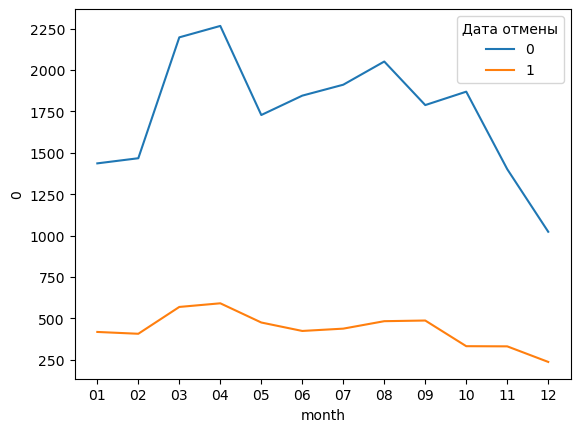

In [17]:
sns.lineplot(df_month, x ='month',y=0,hue = 'Дата отмены')

<Axes: xlabel='weekday', ylabel='0'>

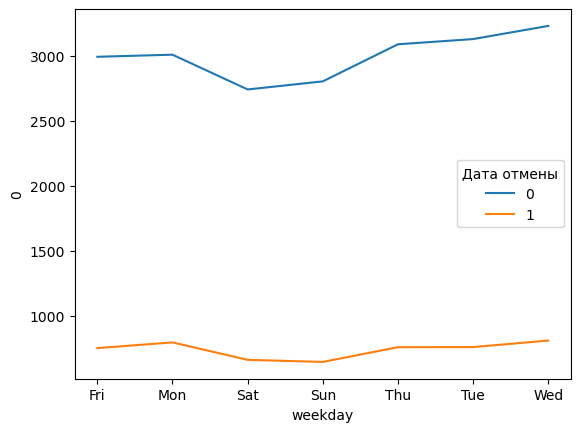

In [18]:
df_day = pd.DataFrame(df1.groupby(['weekday','Дата отмены'])
.size()
.reset_index())
sns.lineplot(df_day, x ='weekday',y=0,hue = 'Дата отмены')
#Тут приблизительно в одном разбросе 

In [19]:
inde = df1[df1['delta_day'] == -1].index
df1.loc[inde,'delta_day'] = 0

In [20]:
df1.drop(['weekday','Статус брони','№ брони'],axis = 1,inplace = True)

In [21]:
df1.head(5)

,Номеров,Стоимость,Внесена предоплата,Способ оплаты,Дата отмены,Ночей,Источник,Категория номера,Гостей,Гостиница,month,delta_day,Year,Quartal
0,1,25700.0,0,Внешняя система оплаты,1,3,Яндекс.Путешествия,Номер «Стандарт»,2,1,04,7,2023,2
1,1,24800.0,12400,Отложенная электронная оплата: Банк Россия (ба...,0,2,Официальный сайт,Номер «Стандарт»,2,1,06,23,2022,2
2,1,25800.0,12900,Банк. карта: Банк Россия (банк. карта),0,2,Официальный сайт,Номер «Студия»,2,4,11,19,2022,4
3,1,10500.0,0,Внешняя система оплаты (С предоплатой),0,1,Bronevik.com(new),Номер «Стандарт»,1,3,09,9,2023,3
4,1,28690.0,28690,Система быстрых платежей: Эквайринг ComfortBoo...,0,2,Официальный сайт,Номер «Люкс»,4,1,05,8,2023,2


In [22]:
df1.groupby(["Quartal",'Дата отмены']).size()

Quartal  Дата отмены
1        0              5100
         1              1394
2        0              5839
         1              1490
3        0              5750
         1              1408
4        0              4293
         1               900
dtype: int64

# Тут год ничего не даёт

In [23]:
df1.groupby(['Year','Дата отмены']).size()

Year  Дата отмены
2022  0              10509
      1               2692
2023  0              10473
      1               2500
dtype: int64

In [24]:
df1.rename(columns = {'Источник':'Source'}, inplace = True )

In [25]:
s = df1.Source.value_counts()

In [26]:
df1['source_count'] = df1['Source'].map(s)

In [27]:
df1.loc[df1['Source'] == "Официальный сайт", "Source"] = "official_website"
df1.loc[df1['Source'] == "booking.com (Booking.com)", "Source"] = "booking.com"
df1.loc[df1['Source'] == "Bronevik.com/Bro.Online", "Source"] = "Bronevik.com(new)"
df1.loc[df1['source_count'] <= 200, 'Source'] = 'small_online_service'
# Вот тут пригодится

In [28]:
df1.drop(['source_count','Year'],axis = 1,inplace =True)

In [29]:
df1.head(10)

,Номеров,Стоимость,Внесена предоплата,Способ оплаты,Дата отмены,Ночей,Source,Категория номера,Гостей,Гостиница,month,delta_day,Quartal
0,1,25700.0,0,Внешняя система оплаты,1,3,Яндекс.Путешествия,Номер «Стандарт»,2,1,04,7,2
1,1,24800.0,12400,Отложенная электронная оплата: Банк Россия (ба...,0,2,official_website,Номер «Стандарт»,2,1,06,23,2
2,1,25800.0,12900,Банк. карта: Банк Россия (банк. карта),0,2,official_website,Номер «Студия»,2,4,11,19,4
3,1,10500.0,0,Внешняя система оплаты (С предоплатой),0,1,small_online_service,Номер «Стандарт»,1,3,09,9,3
4,1,28690.0,28690,Система быстрых платежей: Эквайринг ComfortBoo...,0,2,official_website,Номер «Люкс»,4,1,05,8,2
5,1,39100.0,8755,Банк. карта: Банк Россия (банк. карта),1,4,official_website,Номер «Стандарт»,3,3,08,20,3
6,1,7650.0,0,Гарантия банковской картой,1,1,booking.com,Номер «Стандарт»,1,2,02,2,1
7,1,26200.0,0,Внешняя система оплаты (Оплата наличными),0,2,small_online_service,Номер «Стандарт»,2,3,08,22,3
8,1,14400.0,0,Отложенная электронная оплата: Банк Россия (ба...,1,1,official_website,Номер «Стандарт»,2,3,06,12,2
9,1,11200.0,6700,Банк. карта: Банк Россия (банк. карта),0,1,official_website,Номер «Стандарт»,2,1,11,85,4


# Гостиницы

In [30]:
pd.DataFrame(df1.groupby(['Гостиница','Дата отмены']).size()).rename({0:'count'},axis =1)

count
Гостиница Дата отмены       
1         0             6798
          1             1685
2         0             5969
          1             1399
3         0             6424
          1             1582
4         0             1791
          1              526

In [31]:
df1.describe()

,Номеров,Стоимость,Внесена предоплата,Дата отмены,Ночей,Гостей,Гостиница,delta_day,Quartal
count,26174.000000,26174.000000,26174.000000,26174.000000,26174.000000,26174.000000,26174.000000,26174.000000,26174.000000
mean,1.088714,35099.784232,19536.728165,0.198365,2.151295,2.601628,2.158822,28.101933,2.422175
std,0.341145,38849.552238,27776.602024,0.398776,1.456076,1.199428,0.979224,32.537671,1.066307
min,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000
25%,1.000000,14300.000000,7800.000000,0.000000,1.000000,2.000000,1.000000,5.000000,2.000000
50%,1.000000,23800.000000,13900.000000,0.000000,2.000000,2.000000,2.000000,17.000000,2.000000
75%,1.000000,41100.000000,23180.000000,0.000000,3.000000,3.000000,3.000000,39.000000,3.000000
max,6.000000,986400.000000,584500.000000,1.000000,31.000000,16.000000,4.000000,284.000000,4.000000


In [32]:
df1['% внесена предоплата к стоимости'] = (df['Внесена предоплата']/df['Стоимость']).apply(lambda x:round(x,2))

In [33]:
df1.drop('Внесена предоплата',axis = 1,inplace = True)

In [34]:
df1.head()

,Номеров,Стоимость,Способ оплаты,Дата отмены,Ночей,Source,Категория номера,Гостей,Гостиница,month,delta_day,Quartal,% внесена предоплата к стоимости
0,1,25700.0,Внешняя система оплаты,1,3,Яндекс.Путешествия,Номер «Стандарт»,2,1,04,7,2,0.0
1,1,24800.0,Отложенная электронная оплата: Банк Россия (ба...,0,2,official_website,Номер «Стандарт»,2,1,06,23,2,0.5
2,1,25800.0,Банк. карта: Банк Россия (банк. карта),0,2,official_website,Номер «Студия»,2,4,11,19,4,0.5
3,1,10500.0,Внешняя система оплаты (С предоплатой),0,1,small_online_service,Номер «Стандарт»,1,3,09,9,3,0.0
4,1,28690.0,Система быстрых платежей: Эквайринг ComfortBoo...,0,2,official_website,Номер «Люкс»,4,1,05,8,2,1.0


In [35]:
df1.groupby(['Гостей','Дата отмены']).size() #Гостей поменять на категориальную 

Гостей  Дата отмены
1       0               1256
        1                356
2       0              12282
        1               2833
3       0               3708
        1                972
4       0               2471
        1                683
5       0                652
        1                160
6       0                349
        1                 95
7       0                118
        1                 43
8       0                 92
        1                 26
9       0                 20
        1                  6
10      0                 25
        1                  9
11      0                  3
        1                  1
12      0                  2
        1                  4
13      0                  1
        1                  2
14      0                  2
        1                  1
15      1                  1
16      0                  1
dtype: int64

def obid(x):
    if x >= 8:
        return 'Много гостей'
    elif x<8 and x >= 5:
        return 'Среднее количество гостей'
    else:
        return 'Малое количество гостей'

df1['колво-гостей'] = df1['Гостей'].apply(obid)
df2 = df1.drop('Гостей',axis=1)

In [37]:
df2 = df1

In [38]:
df2.head(10)

,Номеров,Стоимость,Способ оплаты,Дата отмены,Ночей,Source,Категория номера,Гостей,Гостиница,month,delta_day,Quartal,% внесена предоплата к стоимости
0,1,25700.0,Внешняя система оплаты,1,3,Яндекс.Путешествия,Номер «Стандарт»,2,1,04,7,2,0.00
1,1,24800.0,Отложенная электронная оплата: Банк Россия (ба...,0,2,official_website,Номер «Стандарт»,2,1,06,23,2,0.50
2,1,25800.0,Банк. карта: Банк Россия (банк. карта),0,2,official_website,Номер «Студия»,2,4,11,19,4,0.50
3,1,10500.0,Внешняя система оплаты (С предоплатой),0,1,small_online_service,Номер «Стандарт»,1,3,09,9,3,0.00
4,1,28690.0,Система быстрых платежей: Эквайринг ComfortBoo...,0,2,official_website,Номер «Люкс»,4,1,05,8,2,1.00
5,1,39100.0,Банк. карта: Банк Россия (банк. карта),1,4,official_website,Номер «Стандарт»,3,3,08,20,3,0.22
6,1,7650.0,Гарантия банковской картой,1,1,booking.com,Номер «Стандарт»,1,2,02,2,1,0.00
7,1,26200.0,Внешняя система оплаты (Оплата наличными),0,2,small_online_service,Номер «Стандарт»,2,3,08,22,3,0.00
8,1,14400.0,Отложенная электронная оплата: Банк Россия (ба...,1,1,official_website,Номер «Стандарт»,2,3,06,12,2,0.00
9,1,11200.0,Банк. карта: Банк Россия (банк. карта),0,1,official_website,Номер «Стандарт»,2,1,11,85,4,0.60


In [39]:
df2.rename(columns = {'Категория номера':'Room_category'}, inplace = True )

In [40]:
total_rooms = df2['Room_category'].value_counts()
room_percent = (total_rooms / total_rooms.sum()) * 100

df2['Room_category'] = df2['Room_category'].apply(lambda x: x if (total_rooms[x] / total_rooms.sum()) * 100 >= 1 else 'other')

In [41]:
df2.rename(columns = {'Способ оплаты':'Payment'}, inplace = True )

In [42]:
total_payment = df2['Payment'].value_counts()
payment_percent = (total_payment / total_payment.sum()) * 100

df2['Payment'] = df2['Payment'].apply(lambda x: x if (total_payment[x] / total_payment.sum()) * 100 >= 1 else 'other')

In [43]:
def reg(x):
    if x in [1,2]:
        return 1
    else:
        return 0
df2['Регионы'] = df2['Гостиница'].apply(reg)
df2.drop('Гостиница',axis =1,inplace=True)

In [45]:
df2

,Номеров,Стоимость,Payment,Дата отмены,Ночей,Source,Room_category,Гостей,month,delta_day,Quartal,% внесена предоплата к стоимости,Регионы
0,1,25700.0,Внешняя система оплаты,1,3,Яндекс.Путешествия,Номер «Стандарт»,2,04,7,2,0.00,1
1,1,24800.0,Отложенная электронная оплата: Банк Россия (ба...,0,2,official_website,Номер «Стандарт»,2,06,23,2,0.50,1
2,1,25800.0,Банк. карта: Банк Россия (банк. карта),0,2,official_website,Номер «Студия»,2,11,19,4,0.50,0
3,1,10500.0,Внешняя система оплаты (С предоплатой),0,1,small_online_service,Номер «Стандарт»,1,09,9,3,0.00,0
4,1,28690.0,Система быстрых платежей: Эквайринг ComfortBoo...,0,2,official_website,Номер «Люкс»,4,05,8,2,1.00,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
26169,1,18240.0,Банк. карта: Банк Россия (банк. карта),0,2,official_website,Номер «Стандарт»,2,01,61,1,0.50,1
26170,1,69600.0,Банк. карта: Банк Россия (банк. карта),0,3,official_website,Номер «Студия»,3,06,4,2,0.33,0
26171,1,55600.0,Банк. карта: Банк Россия (банк. карта),0,4,official_website,Номер «Стандарт»,2,05,46,2,0.25,1
26172,1,6300.0,Гарантия банковской картой,1,1,booking.com,Номер «Стандарт»,2,02,67,1,0.00,0


In [47]:
df2['стоимсот/челове'] = df2['Стоимость']/df2['Гостей']

In [49]:
df2.drop(['Стоимость','Гостей'],axis = 1,inplace = True)

In [50]:
df2

,Номеров,Payment,Дата отмены,Ночей,Source,Room_category,month,delta_day,Quartal,% внесена предоплата к стоимости,Регионы,стоимсот/челове
0,1,Внешняя система оплаты,1,3,Яндекс.Путешествия,Номер «Стандарт»,04,7,2,0.00,1,12850.0
1,1,Отложенная электронная оплата: Банк Россия (ба...,0,2,official_website,Номер «Стандарт»,06,23,2,0.50,1,12400.0
2,1,Банк. карта: Банк Россия (банк. карта),0,2,official_website,Номер «Студия»,11,19,4,0.50,0,12900.0
3,1,Внешняя система оплаты (С предоплатой),0,1,small_online_service,Номер «Стандарт»,09,9,3,0.00,0,10500.0
4,1,Система быстрых платежей: Эквайринг ComfortBoo...,0,2,official_website,Номер «Люкс»,05,8,2,1.00,1,7172.5
...,...,...,...,...,...,...,...,...,...,...,...,...
26169,1,Банк. карта: Банк Россия (банк. карта),0,2,official_website,Номер «Стандарт»,01,61,1,0.50,1,9120.0
26170,1,Банк. карта: Банк Россия (банк. карта),0,3,official_website,Номер «Студия»,06,4,2,0.33,0,23200.0
26171,1,Банк. карта: Банк Россия (банк. карта),0,4,official_website,Номер «Стандарт»,05,46,2,0.25,1,27800.0
26172,1,Гарантия банковской картой,1,1,booking.com,Номер «Стандарт»,02,67,1,0.00,0,3150.0


In [51]:
df0 = pd.get_dummies(df2,columns = ['Source','month','Payment','Room_category','Quartal'],drop_first=True,dtype = int)

In [52]:
df0

,Номеров,Дата отмены,Ночей,delta_day,% внесена предоплата к стоимости,Регионы,стоимсот/челове,Source_official_website,Source_ostrovok.ru,Source_small_online_service,...,Payment_Система быстрых платежей: Эквайринг ComfortBooking (Система быстрых платежей),Room_category_Апартаменты с 2 спальнями с отдельным входом,Room_category_Коттедж с 2 спальнями,Room_category_Коттедж с 3 спальнями,Room_category_Номер «Люкс»,Room_category_Номер «Стандарт»,Room_category_Номер «Студия»,Quartal_2,Quartal_3,Quartal_4
0,1,1,3,7,0.00,1,12850.0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
1,1,0,2,23,0.50,1,12400.0,1,0,0,...,0,0,0,0,0,1,0,1,0,0
2,1,0,2,19,0.50,0,12900.0,1,0,0,...,0,0,0,0,0,0,1,0,0,1
3,1,0,1,9,0.00,0,10500.0,0,0,1,...,0,0,0,0,0,1,0,0,1,0
4,1,0,2,8,1.00,1,7172.5,1,0,0,...,1,0,0,0,1,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26169,1,0,2,61,0.50,1,9120.0,1,0,0,...,0,0,0,0,0,1,0,0,0,0
26170,1,0,3,4,0.33,0,23200.0,1,0,0,...,0,0,0,0,0,0,1,1,0,0
26171,1,0,4,46,0.25,1,27800.0,1,0,0,...,0,0,0,0,0,1,0,1,0,0
26172,1,1,1,67,0.00,0,3150.0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


In [53]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.utils.class_weight import compute_class_weight

# Получение весов классов
class_weights = compute_class_weight('balanced', classes=np.unique(df0['Дата отмены']), y=df0['Дата отмены'])

In [54]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier()

In [55]:
rf.fit(df0.drop('Дата отмены',axis = 1),df0['Дата отмены'])

RandomForestClassifier()

In [56]:
feature = pd.DataFrame({'name':df0.drop('Дата отмены',axis = 1).columns,'featue':rf.feature_importances_}).sort_values('featue',ascending = False)

In [57]:
feature # Узнать как влияет

,name,featue
3,% внесена предоплата к стоимости,0.263586
2,delta_day,0.198485
5,стоимсот/челове,0.174131
28,Payment_Отложенная электронная оплата: Банк Ро...,0.083528
1,Ночей,0.034731
24,Payment_Банк. карта: Банк Россия (банк. карта),0.022436
4,Регионы,0.015546
6,Source_official_website,0.012699
0,Номеров,0.012583
29,Payment_При заселении,0.012262


In [58]:
feat = list(feature.loc[feature['featue']>0.01,'name'])

In [59]:
from sklearn.model_selection import train_test_split

In [60]:
X = df0[feat]
y = df0['Дата отмены']

In [61]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_osn_scal = pd.DataFrame(scaler.fit_transform(X),columns = X.columns)

In [62]:
X_train,X_test,y_train,y_test = train_test_split(X_osn_scal,y,stratify=y)

import numpy as np
from catboost import CatBoostClassifier

# Создание ансамбля из 10 случайных моделей CatBoost
ensemble = [CatBoostClassifier(learning_rate=0.01, iterations=2000, depth=4, l2_leaf_reg=3, eval_metric='AUC', class_weights=dict(enumerate(class_weights))) for _ in range(10)]

# Количество выборок для каждой модели (90% от обучающей выборки)
n_samples = int(len(X_train) * 0.9)

for model in ensemble:
    # Получаем случайные позиционные индексы для подмножества строк
    sample_indices = np.random.choice(len(X_train), size=n_samples, replace=True)
    
    # Выбор подмножества данных по строкам с помощью iloc (по позиционным индексам)
    X_subset, y_subset = X_train.iloc[sample_indices], y_train.iloc[sample_indices]
    
    # Обучение модели на подмножестве данных
    model.fit(X_subset, y_subset)



# Предсказания каждой модели ансамбля на тестовой выборке
predictions = np.array([model.predict_proba(X_test)[:,1] for model in ensemble])

# Финальные предсказания (например, усреднение предсказаний)
final_predictions = np.mean(predictions, axis=0)

print(final_predictions)

roc_auc_score(y_test,final_predictions)

from imblearn.over_sampling import ADASYN
adasyn = ADASYN()

# Применение SMOTE к данным
X_resampled, y_resampled = adasyn.fit_resample(X_train, y_train)

In [63]:
from catboost import CatBoostClassifier, CatBoostRegressor, Pool

cat_features  = ['Source','month','Payment','Room_category','колво-гостей','Quartal','Гостиница']
train_data = Pool(X_train, 
                  label=y_train, 
                  cat_features=cat_features)

test_data = Pool(X_test, 
                  label=y_test, 
                  cat_features=cat_features)

In [64]:
from sklearn.metrics import roc_auc_score

from sklearn.model_selection import GridSearchCV

In [108]:
model = CatBoostClassifier(eval_metric='AUC',class_weights=dict(enumerate(class_weights)))

In [66]:
model.fit(X_train,y_train, eval_set = (X_test,y_test),plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.8185483	best: 0.8185483 (0)	total: 146ms	remaining: 8m 54s
1:	test: 0.8257231	best: 0.8257231 (1)	total: 158ms	remaining: 4m 49s
2:	test: 0.8294404	best: 0.8294404 (2)	total: 170ms	remaining: 3m 27s
3:	test: 0.8371001	best: 0.8371001 (3)	total: 181ms	remaining: 2m 45s
4:	test: 0.8377321	best: 0.8377321 (4)	total: 191ms	remaining: 2m 19s
5:	test: 0.8371083	best: 0.8377321 (4)	total: 201ms	remaining: 2m 2s
6:	test: 0.8375712	best: 0.8377321 (4)	total: 210ms	remaining: 1m 49s
7:	test: 0.8387017	best: 0.8387017 (7)	total: 221ms	remaining: 1m 40s
8:	test: 0.8387758	best: 0.8387758 (8)	total: 232ms	remaining: 1m 34s
9:	test: 0.8435395	best: 0.8435395 (9)	total: 241ms	remaining: 1m 28s
10:	test: 0.8436032	best: 0.8436032 (10)	total: 250ms	remaining: 1m 22s
11:	test: 0.8440974	best: 0.8440974 (11)	total: 261ms	remaining: 1m 19s
12:	test: 0.8441729	best: 0.8441729 (12)	total: 270ms	remaining: 1m 15s
13:	test: 0.8440740	best: 0.8441729 (12)	total: 280ms	remaining: 1m 12s
14:	test: 0.8

119:	test: 0.8495442	best: 0.8501237 (57)	total: 1.39s	remaining: 41.1s
120:	test: 0.8495402	best: 0.8501237 (57)	total: 1.4s	remaining: 41s
121:	test: 0.8495415	best: 0.8501237 (57)	total: 1.41s	remaining: 41s
122:	test: 0.8495393	best: 0.8501237 (57)	total: 1.42s	remaining: 40.9s
123:	test: 0.8495147	best: 0.8501237 (57)	total: 1.44s	remaining: 40.9s
124:	test: 0.8494949	best: 0.8501237 (57)	total: 1.45s	remaining: 40.9s
125:	test: 0.8494591	best: 0.8501237 (57)	total: 1.46s	remaining: 40.8s
126:	test: 0.8494679	best: 0.8501237 (57)	total: 1.47s	remaining: 40.8s
127:	test: 0.8494337	best: 0.8501237 (57)	total: 1.48s	remaining: 40.8s
128:	test: 0.8494340	best: 0.8501237 (57)	total: 1.49s	remaining: 40.7s
129:	test: 0.8494701	best: 0.8501237 (57)	total: 1.5s	remaining: 40.6s
130:	test: 0.8494807	best: 0.8501237 (57)	total: 1.51s	remaining: 40.6s
131:	test: 0.8495118	best: 0.8501237 (57)	total: 1.52s	remaining: 40.5s
132:	test: 0.8495163	best: 0.8501237 (57)	total: 1.53s	remaining: 40.5

245:	test: 0.8499367	best: 0.8501237 (57)	total: 2.64s	remaining: 36.7s
246:	test: 0.8499387	best: 0.8501237 (57)	total: 2.65s	remaining: 36.6s
247:	test: 0.8499577	best: 0.8501237 (57)	total: 2.66s	remaining: 36.6s
248:	test: 0.8499475	best: 0.8501237 (57)	total: 2.67s	remaining: 36.6s
249:	test: 0.8499855	best: 0.8501237 (57)	total: 2.68s	remaining: 36.6s
250:	test: 0.8499880	best: 0.8501237 (57)	total: 2.69s	remaining: 36.5s
251:	test: 0.8499828	best: 0.8501237 (57)	total: 2.7s	remaining: 36.5s
252:	test: 0.8499867	best: 0.8501237 (57)	total: 2.71s	remaining: 36.5s
253:	test: 0.8499994	best: 0.8501237 (57)	total: 2.72s	remaining: 36.5s
254:	test: 0.8499966	best: 0.8501237 (57)	total: 2.73s	remaining: 36.4s
255:	test: 0.8500041	best: 0.8501237 (57)	total: 2.74s	remaining: 36.4s
256:	test: 0.8499885	best: 0.8501237 (57)	total: 2.75s	remaining: 36.4s
257:	test: 0.8499847	best: 0.8501237 (57)	total: 2.76s	remaining: 36.3s
258:	test: 0.8500327	best: 0.8501237 (57)	total: 2.77s	remaining:

375:	test: 0.8505945	best: 0.8505945 (375)	total: 3.89s	remaining: 33.9s
376:	test: 0.8506207	best: 0.8506207 (376)	total: 3.9s	remaining: 33.9s
377:	test: 0.8506154	best: 0.8506207 (376)	total: 3.91s	remaining: 33.9s
378:	test: 0.8506068	best: 0.8506207 (376)	total: 3.92s	remaining: 33.9s
379:	test: 0.8506616	best: 0.8506616 (379)	total: 3.93s	remaining: 33.9s
380:	test: 0.8506302	best: 0.8506616 (379)	total: 3.94s	remaining: 33.8s
381:	test: 0.8506189	best: 0.8506616 (379)	total: 3.94s	remaining: 33.8s
382:	test: 0.8506148	best: 0.8506616 (379)	total: 3.96s	remaining: 33.8s
383:	test: 0.8506146	best: 0.8506616 (379)	total: 3.98s	remaining: 33.9s
384:	test: 0.8506299	best: 0.8506616 (379)	total: 3.99s	remaining: 33.9s
385:	test: 0.8506461	best: 0.8506616 (379)	total: 4s	remaining: 33.9s
386:	test: 0.8506906	best: 0.8506906 (386)	total: 4.01s	remaining: 33.9s
387:	test: 0.8506750	best: 0.8506906 (386)	total: 4.02s	remaining: 33.9s
388:	test: 0.8506853	best: 0.8506906 (386)	total: 4.03s

501:	test: 0.8515417	best: 0.8515462 (500)	total: 5.14s	remaining: 32.3s
502:	test: 0.8515408	best: 0.8515462 (500)	total: 5.15s	remaining: 32.3s
503:	test: 0.8515428	best: 0.8515462 (500)	total: 5.16s	remaining: 32.3s
504:	test: 0.8515361	best: 0.8515462 (500)	total: 5.17s	remaining: 32.3s
505:	test: 0.8515506	best: 0.8515506 (505)	total: 5.18s	remaining: 32.3s
506:	test: 0.8515562	best: 0.8515562 (506)	total: 5.19s	remaining: 32.3s
507:	test: 0.8515524	best: 0.8515562 (506)	total: 5.2s	remaining: 32.2s
508:	test: 0.8515578	best: 0.8515578 (508)	total: 5.21s	remaining: 32.2s
509:	test: 0.8515590	best: 0.8515590 (509)	total: 5.22s	remaining: 32.2s
510:	test: 0.8515613	best: 0.8515613 (510)	total: 5.23s	remaining: 32.2s
511:	test: 0.8515646	best: 0.8515646 (511)	total: 5.24s	remaining: 32.2s
512:	test: 0.8515628	best: 0.8515646 (511)	total: 5.25s	remaining: 32.2s
513:	test: 0.8515684	best: 0.8515684 (513)	total: 5.26s	remaining: 32.2s
514:	test: 0.8516016	best: 0.8516016 (514)	total: 5.

614:	test: 0.8520566	best: 0.8520608 (611)	total: 6.23s	remaining: 30.8s
615:	test: 0.8520595	best: 0.8520608 (611)	total: 6.24s	remaining: 30.8s
616:	test: 0.8520620	best: 0.8520620 (616)	total: 6.25s	remaining: 30.8s
617:	test: 0.8520748	best: 0.8520748 (617)	total: 6.26s	remaining: 30.8s
618:	test: 0.8520664	best: 0.8520748 (617)	total: 6.27s	remaining: 30.8s
619:	test: 0.8520671	best: 0.8520748 (617)	total: 6.28s	remaining: 30.8s
620:	test: 0.8520718	best: 0.8520748 (617)	total: 6.29s	remaining: 30.8s
621:	test: 0.8520758	best: 0.8520758 (621)	total: 6.3s	remaining: 30.7s
622:	test: 0.8520767	best: 0.8520767 (622)	total: 6.31s	remaining: 30.7s
623:	test: 0.8520864	best: 0.8520864 (623)	total: 6.32s	remaining: 30.7s
624:	test: 0.8520809	best: 0.8520864 (623)	total: 6.33s	remaining: 30.7s
625:	test: 0.8520917	best: 0.8520917 (625)	total: 6.34s	remaining: 30.7s
626:	test: 0.8521031	best: 0.8521031 (626)	total: 6.34s	remaining: 30.7s
627:	test: 0.8520886	best: 0.8521031 (626)	total: 6.

727:	test: 0.8524133	best: 0.8524133 (727)	total: 7.3s	remaining: 29.4s
728:	test: 0.8524309	best: 0.8524309 (728)	total: 7.31s	remaining: 29.4s
729:	test: 0.8524544	best: 0.8524544 (729)	total: 7.32s	remaining: 29.3s
730:	test: 0.8524534	best: 0.8524544 (729)	total: 7.33s	remaining: 29.3s
731:	test: 0.8524545	best: 0.8524545 (731)	total: 7.34s	remaining: 29.3s
732:	test: 0.8524644	best: 0.8524644 (732)	total: 7.35s	remaining: 29.3s
733:	test: 0.8524679	best: 0.8524679 (733)	total: 7.36s	remaining: 29.3s
734:	test: 0.8524764	best: 0.8524764 (734)	total: 7.37s	remaining: 29.3s
735:	test: 0.8524852	best: 0.8524852 (735)	total: 7.37s	remaining: 29.3s
736:	test: 0.8524925	best: 0.8524925 (736)	total: 7.38s	remaining: 29.3s
737:	test: 0.8525062	best: 0.8525062 (737)	total: 7.39s	remaining: 29.2s
738:	test: 0.8525076	best: 0.8525076 (738)	total: 7.4s	remaining: 29.2s
739:	test: 0.8525048	best: 0.8525076 (738)	total: 7.41s	remaining: 29.2s
740:	test: 0.8524991	best: 0.8525076 (738)	total: 7.4

860:	test: 0.8527889	best: 0.8527901 (850)	total: 8.58s	remaining: 27.9s
861:	test: 0.8528021	best: 0.8528021 (861)	total: 8.59s	remaining: 27.8s
862:	test: 0.8527943	best: 0.8528021 (861)	total: 8.6s	remaining: 27.8s
863:	test: 0.8527975	best: 0.8528021 (861)	total: 8.61s	remaining: 27.8s
864:	test: 0.8527975	best: 0.8528021 (861)	total: 8.62s	remaining: 27.8s
865:	test: 0.8528027	best: 0.8528027 (865)	total: 8.63s	remaining: 27.8s
866:	test: 0.8528043	best: 0.8528043 (866)	total: 8.63s	remaining: 27.8s
867:	test: 0.8528066	best: 0.8528066 (867)	total: 8.64s	remaining: 27.8s
868:	test: 0.8528057	best: 0.8528066 (867)	total: 8.65s	remaining: 27.8s
869:	test: 0.8528071	best: 0.8528071 (869)	total: 8.66s	remaining: 27.8s
870:	test: 0.8528069	best: 0.8528071 (869)	total: 8.67s	remaining: 27.7s
871:	test: 0.8528099	best: 0.8528099 (871)	total: 8.68s	remaining: 27.7s
872:	test: 0.8528104	best: 0.8528104 (872)	total: 8.69s	remaining: 27.7s
873:	test: 0.8528131	best: 0.8528131 (873)	total: 8.

984:	test: 0.8529776	best: 0.8529776 (984)	total: 9.79s	remaining: 26.6s
985:	test: 0.8529871	best: 0.8529871 (985)	total: 9.8s	remaining: 26.6s
986:	test: 0.8529958	best: 0.8529958 (986)	total: 9.81s	remaining: 26.6s
987:	test: 0.8529934	best: 0.8529958 (986)	total: 9.82s	remaining: 26.5s
988:	test: 0.8529959	best: 0.8529959 (988)	total: 9.83s	remaining: 26.5s
989:	test: 0.8530012	best: 0.8530012 (989)	total: 9.84s	remaining: 26.5s
990:	test: 0.8529973	best: 0.8530012 (989)	total: 9.85s	remaining: 26.5s
991:	test: 0.8529967	best: 0.8530012 (989)	total: 9.86s	remaining: 26.5s
992:	test: 0.8530068	best: 0.8530068 (992)	total: 9.87s	remaining: 26.5s
993:	test: 0.8530075	best: 0.8530075 (993)	total: 9.88s	remaining: 26.5s
994:	test: 0.8530053	best: 0.8530075 (993)	total: 9.89s	remaining: 26.5s
995:	test: 0.8530053	best: 0.8530075 (993)	total: 9.9s	remaining: 26.5s
996:	test: 0.8530090	best: 0.8530090 (996)	total: 9.91s	remaining: 26.4s
997:	test: 0.8530077	best: 0.8530090 (996)	total: 9.9

1109:	test: 0.8531558	best: 0.8531558 (1109)	total: 11s	remaining: 25.3s
1110:	test: 0.8531683	best: 0.8531683 (1110)	total: 11s	remaining: 25.3s
1111:	test: 0.8531675	best: 0.8531683 (1110)	total: 11s	remaining: 25.3s
1112:	test: 0.8531659	best: 0.8531683 (1110)	total: 11.1s	remaining: 25.3s
1113:	test: 0.8531647	best: 0.8531683 (1110)	total: 11.1s	remaining: 25.3s
1114:	test: 0.8531665	best: 0.8531683 (1110)	total: 11.1s	remaining: 25.2s
1115:	test: 0.8531617	best: 0.8531683 (1110)	total: 11.1s	remaining: 25.2s
1116:	test: 0.8531595	best: 0.8531683 (1110)	total: 11.1s	remaining: 25.2s
1117:	test: 0.8531593	best: 0.8531683 (1110)	total: 11.1s	remaining: 25.2s
1118:	test: 0.8531634	best: 0.8531683 (1110)	total: 11.1s	remaining: 25.2s
1119:	test: 0.8531669	best: 0.8531683 (1110)	total: 11.1s	remaining: 25.2s
1120:	test: 0.8531691	best: 0.8531691 (1120)	total: 11.1s	remaining: 25.2s
1121:	test: 0.8531678	best: 0.8531691 (1120)	total: 11.2s	remaining: 25.3s
1122:	test: 0.8531631	best: 0.8

1225:	test: 0.8532858	best: 0.8533063 (1215)	total: 12.2s	remaining: 24.2s
1226:	test: 0.8532789	best: 0.8533063 (1215)	total: 12.2s	remaining: 24.2s
1227:	test: 0.8532763	best: 0.8533063 (1215)	total: 12.2s	remaining: 24.2s
1228:	test: 0.8532830	best: 0.8533063 (1215)	total: 12.2s	remaining: 24.2s
1229:	test: 0.8532795	best: 0.8533063 (1215)	total: 12.3s	remaining: 24.2s
1230:	test: 0.8532845	best: 0.8533063 (1215)	total: 12.3s	remaining: 24.2s
1231:	test: 0.8532901	best: 0.8533063 (1215)	total: 12.3s	remaining: 24.2s
1232:	test: 0.8532901	best: 0.8533063 (1215)	total: 12.3s	remaining: 24.1s
1233:	test: 0.8532998	best: 0.8533063 (1215)	total: 12.3s	remaining: 24.1s
1234:	test: 0.8532983	best: 0.8533063 (1215)	total: 12.3s	remaining: 24.1s
1235:	test: 0.8532965	best: 0.8533063 (1215)	total: 12.3s	remaining: 24.1s
1236:	test: 0.8533018	best: 0.8533063 (1215)	total: 12.3s	remaining: 24.1s
1237:	test: 0.8533067	best: 0.8533067 (1237)	total: 12.3s	remaining: 24.1s
1238:	test: 0.8533043	bes

1348:	test: 0.8533590	best: 0.8533778 (1333)	total: 13.6s	remaining: 23.3s
1349:	test: 0.8533670	best: 0.8533778 (1333)	total: 13.7s	remaining: 23.3s
1350:	test: 0.8533654	best: 0.8533778 (1333)	total: 13.7s	remaining: 23.3s
1351:	test: 0.8533648	best: 0.8533778 (1333)	total: 13.7s	remaining: 23.3s
1352:	test: 0.8533681	best: 0.8533778 (1333)	total: 13.7s	remaining: 23.3s
1353:	test: 0.8533691	best: 0.8533778 (1333)	total: 13.7s	remaining: 23.3s
1354:	test: 0.8533672	best: 0.8533778 (1333)	total: 13.7s	remaining: 23.3s
1355:	test: 0.8533700	best: 0.8533778 (1333)	total: 13.7s	remaining: 23.3s
1356:	test: 0.8533794	best: 0.8533794 (1356)	total: 13.7s	remaining: 23.3s
1357:	test: 0.8533767	best: 0.8533794 (1356)	total: 13.7s	remaining: 23.2s
1358:	test: 0.8533805	best: 0.8533805 (1358)	total: 13.7s	remaining: 23.2s
1359:	test: 0.8533810	best: 0.8533810 (1359)	total: 13.8s	remaining: 23.2s
1360:	test: 0.8533825	best: 0.8533825 (1360)	total: 13.8s	remaining: 23.2s
1361:	test: 0.8533842	bes

1470:	test: 0.8534263	best: 0.8534501 (1455)	total: 14.9s	remaining: 22.1s
1471:	test: 0.8534385	best: 0.8534501 (1455)	total: 14.9s	remaining: 22.1s
1472:	test: 0.8534389	best: 0.8534501 (1455)	total: 14.9s	remaining: 22.1s
1473:	test: 0.8534398	best: 0.8534501 (1455)	total: 14.9s	remaining: 22.1s
1474:	test: 0.8534383	best: 0.8534501 (1455)	total: 14.9s	remaining: 22.1s
1475:	test: 0.8534391	best: 0.8534501 (1455)	total: 14.9s	remaining: 22.1s
1476:	test: 0.8534360	best: 0.8534501 (1455)	total: 15s	remaining: 22.1s
1477:	test: 0.8534373	best: 0.8534501 (1455)	total: 15s	remaining: 22.1s
1478:	test: 0.8534282	best: 0.8534501 (1455)	total: 15s	remaining: 22.1s
1479:	test: 0.8534336	best: 0.8534501 (1455)	total: 15s	remaining: 22s
1480:	test: 0.8534457	best: 0.8534501 (1455)	total: 15s	remaining: 22s
1481:	test: 0.8534469	best: 0.8534501 (1455)	total: 15s	remaining: 22s
1482:	test: 0.8534470	best: 0.8534501 (1455)	total: 15s	remaining: 22s
1483:	test: 0.8534444	best: 0.8534501 (1455)	to

1591:	test: 0.8535006	best: 0.8535226 (1581)	total: 16.1s	remaining: 20.9s
1592:	test: 0.8535015	best: 0.8535226 (1581)	total: 16.2s	remaining: 20.9s
1593:	test: 0.8534894	best: 0.8535226 (1581)	total: 16.2s	remaining: 20.9s
1594:	test: 0.8534847	best: 0.8535226 (1581)	total: 16.2s	remaining: 20.9s
1595:	test: 0.8534698	best: 0.8535226 (1581)	total: 16.2s	remaining: 20.9s
1596:	test: 0.8534698	best: 0.8535226 (1581)	total: 16.2s	remaining: 20.9s
1597:	test: 0.8534701	best: 0.8535226 (1581)	total: 16.2s	remaining: 20.9s
1598:	test: 0.8534715	best: 0.8535226 (1581)	total: 16.2s	remaining: 20.9s
1599:	test: 0.8534709	best: 0.8535226 (1581)	total: 16.2s	remaining: 20.9s
1600:	test: 0.8534745	best: 0.8535226 (1581)	total: 16.2s	remaining: 20.9s
1601:	test: 0.8534840	best: 0.8535226 (1581)	total: 16.2s	remaining: 20.8s
1602:	test: 0.8534781	best: 0.8535226 (1581)	total: 16.3s	remaining: 20.8s
1603:	test: 0.8534755	best: 0.8535226 (1581)	total: 16.3s	remaining: 20.8s
1604:	test: 0.8534761	bes

1710:	test: 0.8533922	best: 0.8535226 (1581)	total: 17.4s	remaining: 19.8s
1711:	test: 0.8533971	best: 0.8535226 (1581)	total: 17.4s	remaining: 19.8s
1712:	test: 0.8533930	best: 0.8535226 (1581)	total: 17.4s	remaining: 19.8s
1713:	test: 0.8534115	best: 0.8535226 (1581)	total: 17.4s	remaining: 19.7s
1714:	test: 0.8534189	best: 0.8535226 (1581)	total: 17.4s	remaining: 19.7s
1715:	test: 0.8534057	best: 0.8535226 (1581)	total: 17.4s	remaining: 19.7s
1716:	test: 0.8534083	best: 0.8535226 (1581)	total: 17.4s	remaining: 19.7s
1717:	test: 0.8534154	best: 0.8535226 (1581)	total: 17.5s	remaining: 19.7s
1718:	test: 0.8534165	best: 0.8535226 (1581)	total: 17.5s	remaining: 19.7s
1719:	test: 0.8534202	best: 0.8535226 (1581)	total: 17.5s	remaining: 19.7s
1720:	test: 0.8534206	best: 0.8535226 (1581)	total: 17.5s	remaining: 19.7s
1721:	test: 0.8534174	best: 0.8535226 (1581)	total: 17.5s	remaining: 19.7s
1722:	test: 0.8534303	best: 0.8535226 (1581)	total: 17.5s	remaining: 19.6s
1723:	test: 0.8534361	bes

1834:	test: 0.8534105	best: 0.8535226 (1581)	total: 18.7s	remaining: 18.6s
1835:	test: 0.8534129	best: 0.8535226 (1581)	total: 18.7s	remaining: 18.6s
1836:	test: 0.8534049	best: 0.8535226 (1581)	total: 18.7s	remaining: 18.6s
1837:	test: 0.8534152	best: 0.8535226 (1581)	total: 18.7s	remaining: 18.6s
1838:	test: 0.8534167	best: 0.8535226 (1581)	total: 18.8s	remaining: 18.5s
1839:	test: 0.8534201	best: 0.8535226 (1581)	total: 18.8s	remaining: 18.5s
1840:	test: 0.8534211	best: 0.8535226 (1581)	total: 18.8s	remaining: 18.5s
1841:	test: 0.8534159	best: 0.8535226 (1581)	total: 18.8s	remaining: 18.5s
1842:	test: 0.8534140	best: 0.8535226 (1581)	total: 18.8s	remaining: 18.5s
1843:	test: 0.8534171	best: 0.8535226 (1581)	total: 18.8s	remaining: 18.5s
1844:	test: 0.8534062	best: 0.8535226 (1581)	total: 18.8s	remaining: 18.5s
1845:	test: 0.8534064	best: 0.8535226 (1581)	total: 18.8s	remaining: 18.5s
1846:	test: 0.8534073	best: 0.8535226 (1581)	total: 18.8s	remaining: 18.5s
1847:	test: 0.8534133	bes

1950:	test: 0.8534280	best: 0.8535226 (1581)	total: 20s	remaining: 17.5s
1951:	test: 0.8534289	best: 0.8535226 (1581)	total: 20s	remaining: 17.5s
1952:	test: 0.8534306	best: 0.8535226 (1581)	total: 20s	remaining: 17.5s
1953:	test: 0.8534415	best: 0.8535226 (1581)	total: 20s	remaining: 17.4s
1954:	test: 0.8534427	best: 0.8535226 (1581)	total: 20s	remaining: 17.4s
1955:	test: 0.8534412	best: 0.8535226 (1581)	total: 20s	remaining: 17.4s
1956:	test: 0.8534387	best: 0.8535226 (1581)	total: 20s	remaining: 17.4s
1957:	test: 0.8534300	best: 0.8535226 (1581)	total: 20.1s	remaining: 17.4s
1958:	test: 0.8534349	best: 0.8535226 (1581)	total: 20.1s	remaining: 17.4s
1959:	test: 0.8534287	best: 0.8535226 (1581)	total: 20.1s	remaining: 17.4s
1960:	test: 0.8534272	best: 0.8535226 (1581)	total: 20.1s	remaining: 17.4s
1961:	test: 0.8534315	best: 0.8535226 (1581)	total: 20.1s	remaining: 17.4s
1962:	test: 0.8534315	best: 0.8535226 (1581)	total: 20.1s	remaining: 17.3s
1963:	test: 0.8534271	best: 0.8535226 (

2071:	test: 0.8533920	best: 0.8535226 (1581)	total: 21.2s	remaining: 16.2s
2072:	test: 0.8533902	best: 0.8535226 (1581)	total: 21.2s	remaining: 16.2s
2073:	test: 0.8533986	best: 0.8535226 (1581)	total: 21.3s	remaining: 16.2s
2074:	test: 0.8533922	best: 0.8535226 (1581)	total: 21.3s	remaining: 16.2s
2075:	test: 0.8533974	best: 0.8535226 (1581)	total: 21.3s	remaining: 16.2s
2076:	test: 0.8533988	best: 0.8535226 (1581)	total: 21.3s	remaining: 16.2s
2077:	test: 0.8533961	best: 0.8535226 (1581)	total: 21.3s	remaining: 16.2s
2078:	test: 0.8533905	best: 0.8535226 (1581)	total: 21.3s	remaining: 16.2s
2079:	test: 0.8533958	best: 0.8535226 (1581)	total: 21.3s	remaining: 16.2s
2080:	test: 0.8533973	best: 0.8535226 (1581)	total: 21.3s	remaining: 16.2s
2081:	test: 0.8533961	best: 0.8535226 (1581)	total: 21.3s	remaining: 16.1s
2082:	test: 0.8533988	best: 0.8535226 (1581)	total: 21.4s	remaining: 16.1s
2083:	test: 0.8534014	best: 0.8535226 (1581)	total: 21.4s	remaining: 16.1s
2084:	test: 0.8534027	bes

2193:	test: 0.8533205	best: 0.8535226 (1581)	total: 22.5s	remaining: 15s
2194:	test: 0.8533243	best: 0.8535226 (1581)	total: 22.5s	remaining: 15s
2195:	test: 0.8533311	best: 0.8535226 (1581)	total: 22.5s	remaining: 15s
2196:	test: 0.8533299	best: 0.8535226 (1581)	total: 22.5s	remaining: 15s
2197:	test: 0.8533336	best: 0.8535226 (1581)	total: 22.6s	remaining: 15s
2198:	test: 0.8533247	best: 0.8535226 (1581)	total: 22.6s	remaining: 15s
2199:	test: 0.8533305	best: 0.8535226 (1581)	total: 22.6s	remaining: 15s
2200:	test: 0.8533309	best: 0.8535226 (1581)	total: 22.6s	remaining: 14.9s
2201:	test: 0.8533321	best: 0.8535226 (1581)	total: 22.6s	remaining: 14.9s
2202:	test: 0.8533384	best: 0.8535226 (1581)	total: 22.6s	remaining: 14.9s
2203:	test: 0.8533371	best: 0.8535226 (1581)	total: 22.6s	remaining: 14.9s
2204:	test: 0.8533249	best: 0.8535226 (1581)	total: 22.6s	remaining: 14.9s
2205:	test: 0.8533231	best: 0.8535226 (1581)	total: 22.6s	remaining: 14.9s
2206:	test: 0.8533246	best: 0.8535226 (

2317:	test: 0.8532192	best: 0.8535226 (1581)	total: 23.8s	remaining: 13.7s
2318:	test: 0.8532217	best: 0.8535226 (1581)	total: 23.8s	remaining: 13.7s
2319:	test: 0.8532198	best: 0.8535226 (1581)	total: 23.8s	remaining: 13.7s
2320:	test: 0.8532182	best: 0.8535226 (1581)	total: 23.8s	remaining: 13.7s
2321:	test: 0.8532226	best: 0.8535226 (1581)	total: 23.8s	remaining: 13.7s
2322:	test: 0.8532147	best: 0.8535226 (1581)	total: 23.9s	remaining: 13.7s
2323:	test: 0.8532139	best: 0.8535226 (1581)	total: 23.9s	remaining: 13.7s
2324:	test: 0.8532117	best: 0.8535226 (1581)	total: 23.9s	remaining: 13.7s
2325:	test: 0.8532103	best: 0.8535226 (1581)	total: 23.9s	remaining: 13.7s
2326:	test: 0.8532069	best: 0.8535226 (1581)	total: 23.9s	remaining: 13.7s
2327:	test: 0.8531962	best: 0.8535226 (1581)	total: 23.9s	remaining: 13.6s
2328:	test: 0.8531982	best: 0.8535226 (1581)	total: 23.9s	remaining: 13.6s
2329:	test: 0.8531988	best: 0.8535226 (1581)	total: 23.9s	remaining: 13.6s
2330:	test: 0.8531951	bes

2432:	test: 0.8531667	best: 0.8535226 (1581)	total: 25.2s	remaining: 12.7s
2433:	test: 0.8531597	best: 0.8535226 (1581)	total: 25.2s	remaining: 12.7s
2434:	test: 0.8531615	best: 0.8535226 (1581)	total: 25.2s	remaining: 12.6s
2435:	test: 0.8531636	best: 0.8535226 (1581)	total: 25.2s	remaining: 12.6s
2436:	test: 0.8531650	best: 0.8535226 (1581)	total: 25.2s	remaining: 12.6s
2437:	test: 0.8531718	best: 0.8535226 (1581)	total: 25.2s	remaining: 12.6s
2438:	test: 0.8531725	best: 0.8535226 (1581)	total: 25.2s	remaining: 12.6s
2439:	test: 0.8531766	best: 0.8535226 (1581)	total: 25.3s	remaining: 12.6s
2440:	test: 0.8531647	best: 0.8535226 (1581)	total: 25.3s	remaining: 12.6s
2441:	test: 0.8531402	best: 0.8535226 (1581)	total: 25.3s	remaining: 12.6s
2442:	test: 0.8531390	best: 0.8535226 (1581)	total: 25.3s	remaining: 12.6s
2443:	test: 0.8531520	best: 0.8535226 (1581)	total: 25.3s	remaining: 12.6s
2444:	test: 0.8531546	best: 0.8535226 (1581)	total: 25.3s	remaining: 12.5s
2445:	test: 0.8531496	bes

2546:	test: 0.8530141	best: 0.8535226 (1581)	total: 26.5s	remaining: 11.5s
2547:	test: 0.8530182	best: 0.8535226 (1581)	total: 26.5s	remaining: 11.5s
2548:	test: 0.8530179	best: 0.8535226 (1581)	total: 26.5s	remaining: 11.5s
2549:	test: 0.8530241	best: 0.8535226 (1581)	total: 26.5s	remaining: 11.5s
2550:	test: 0.8530201	best: 0.8535226 (1581)	total: 26.5s	remaining: 11.5s
2551:	test: 0.8530163	best: 0.8535226 (1581)	total: 26.5s	remaining: 11.5s
2552:	test: 0.8530079	best: 0.8535226 (1581)	total: 26.5s	remaining: 11.5s
2553:	test: 0.8530117	best: 0.8535226 (1581)	total: 26.6s	remaining: 11.5s
2554:	test: 0.8530135	best: 0.8535226 (1581)	total: 26.6s	remaining: 11.5s
2555:	test: 0.8530125	best: 0.8535226 (1581)	total: 26.6s	remaining: 11.4s
2556:	test: 0.8530079	best: 0.8535226 (1581)	total: 26.6s	remaining: 11.4s
2557:	test: 0.8530045	best: 0.8535226 (1581)	total: 26.6s	remaining: 11.4s
2558:	test: 0.8530050	best: 0.8535226 (1581)	total: 26.6s	remaining: 11.4s
2559:	test: 0.8530060	bes

2663:	test: 0.8529142	best: 0.8535226 (1581)	total: 27.7s	remaining: 10.3s
2664:	test: 0.8529171	best: 0.8535226 (1581)	total: 27.7s	remaining: 10.3s
2665:	test: 0.8529155	best: 0.8535226 (1581)	total: 27.7s	remaining: 10.3s
2666:	test: 0.8529136	best: 0.8535226 (1581)	total: 27.7s	remaining: 10.3s
2667:	test: 0.8529237	best: 0.8535226 (1581)	total: 27.8s	remaining: 10.3s
2668:	test: 0.8529268	best: 0.8535226 (1581)	total: 27.8s	remaining: 10.3s
2669:	test: 0.8529267	best: 0.8535226 (1581)	total: 27.8s	remaining: 10.3s
2670:	test: 0.8529280	best: 0.8535226 (1581)	total: 27.8s	remaining: 10.3s
2671:	test: 0.8529186	best: 0.8535226 (1581)	total: 27.8s	remaining: 10.2s
2672:	test: 0.8529190	best: 0.8535226 (1581)	total: 27.8s	remaining: 10.2s
2673:	test: 0.8529223	best: 0.8535226 (1581)	total: 27.8s	remaining: 10.2s
2674:	test: 0.8529324	best: 0.8535226 (1581)	total: 27.8s	remaining: 10.2s
2675:	test: 0.8529337	best: 0.8535226 (1581)	total: 27.8s	remaining: 10.2s
2676:	test: 0.8529280	bes

2784:	test: 0.8529158	best: 0.8535226 (1581)	total: 29s	remaining: 9.08s
2785:	test: 0.8529361	best: 0.8535226 (1581)	total: 29s	remaining: 9.07s
2786:	test: 0.8529378	best: 0.8535226 (1581)	total: 29s	remaining: 9.06s
2787:	test: 0.8529431	best: 0.8535226 (1581)	total: 29s	remaining: 9.05s
2788:	test: 0.8529464	best: 0.8535226 (1581)	total: 29s	remaining: 9.04s
2789:	test: 0.8529424	best: 0.8535226 (1581)	total: 29.1s	remaining: 9.03s
2790:	test: 0.8529430	best: 0.8535226 (1581)	total: 29.1s	remaining: 9.02s
2791:	test: 0.8529400	best: 0.8535226 (1581)	total: 29.1s	remaining: 9.01s
2792:	test: 0.8529417	best: 0.8535226 (1581)	total: 29.1s	remaining: 9s
2793:	test: 0.8529402	best: 0.8535226 (1581)	total: 29.1s	remaining: 8.99s
2794:	test: 0.8529399	best: 0.8535226 (1581)	total: 29.1s	remaining: 8.98s
2795:	test: 0.8529396	best: 0.8535226 (1581)	total: 29.1s	remaining: 8.97s
2796:	test: 0.8529392	best: 0.8535226 (1581)	total: 29.1s	remaining: 8.96s
2797:	test: 0.8529398	best: 0.8535226 

2899:	test: 0.8529083	best: 0.8535226 (1581)	total: 30.3s	remaining: 7.91s
2900:	test: 0.8528992	best: 0.8535226 (1581)	total: 30.3s	remaining: 7.9s
2901:	test: 0.8528906	best: 0.8535226 (1581)	total: 30.3s	remaining: 7.89s
2902:	test: 0.8528932	best: 0.8535226 (1581)	total: 30.3s	remaining: 7.88s
2903:	test: 0.8528944	best: 0.8535226 (1581)	total: 30.4s	remaining: 7.87s
2904:	test: 0.8528973	best: 0.8535226 (1581)	total: 30.4s	remaining: 7.86s
2905:	test: 0.8529036	best: 0.8535226 (1581)	total: 30.4s	remaining: 7.85s
2906:	test: 0.8528979	best: 0.8535226 (1581)	total: 30.4s	remaining: 7.84s
2907:	test: 0.8529045	best: 0.8535226 (1581)	total: 30.4s	remaining: 7.83s
2908:	test: 0.8528788	best: 0.8535226 (1581)	total: 30.4s	remaining: 7.82s
2909:	test: 0.8528763	best: 0.8535226 (1581)	total: 30.4s	remaining: 7.81s
2910:	test: 0.8528807	best: 0.8535226 (1581)	total: 30.4s	remaining: 7.8s
2911:	test: 0.8528781	best: 0.8535226 (1581)	total: 30.4s	remaining: 7.79s
2912:	test: 0.8528839	best:

3011:	test: 0.8528543	best: 0.8535226 (1581)	total: 31.7s	remaining: 6.8s
3012:	test: 0.8528461	best: 0.8535226 (1581)	total: 31.8s	remaining: 6.79s
3013:	test: 0.8528427	best: 0.8535226 (1581)	total: 31.8s	remaining: 6.78s
3014:	test: 0.8528425	best: 0.8535226 (1581)	total: 31.8s	remaining: 6.76s
3015:	test: 0.8528439	best: 0.8535226 (1581)	total: 31.8s	remaining: 6.75s
3016:	test: 0.8528355	best: 0.8535226 (1581)	total: 31.8s	remaining: 6.75s
3017:	test: 0.8528265	best: 0.8535226 (1581)	total: 31.8s	remaining: 6.73s
3018:	test: 0.8528240	best: 0.8535226 (1581)	total: 31.8s	remaining: 6.72s
3019:	test: 0.8528251	best: 0.8535226 (1581)	total: 31.8s	remaining: 6.71s
3020:	test: 0.8528229	best: 0.8535226 (1581)	total: 31.8s	remaining: 6.7s
3021:	test: 0.8528146	best: 0.8535226 (1581)	total: 31.8s	remaining: 6.69s
3022:	test: 0.8528118	best: 0.8535226 (1581)	total: 31.9s	remaining: 6.68s
3023:	test: 0.8528138	best: 0.8535226 (1581)	total: 31.9s	remaining: 6.67s
3024:	test: 0.8528160	best:

3127:	test: 0.8527171	best: 0.8535226 (1581)	total: 33.1s	remaining: 5.59s
3128:	test: 0.8527120	best: 0.8535226 (1581)	total: 33.1s	remaining: 5.58s
3129:	test: 0.8527011	best: 0.8535226 (1581)	total: 33.1s	remaining: 5.57s
3130:	test: 0.8527045	best: 0.8535226 (1581)	total: 33.1s	remaining: 5.56s
3131:	test: 0.8527085	best: 0.8535226 (1581)	total: 33.1s	remaining: 5.55s
3132:	test: 0.8527087	best: 0.8535226 (1581)	total: 33.1s	remaining: 5.54s
3133:	test: 0.8526995	best: 0.8535226 (1581)	total: 33.1s	remaining: 5.53s
3134:	test: 0.8526901	best: 0.8535226 (1581)	total: 33.1s	remaining: 5.52s
3135:	test: 0.8526842	best: 0.8535226 (1581)	total: 33.1s	remaining: 5.5s
3136:	test: 0.8526804	best: 0.8535226 (1581)	total: 33.1s	remaining: 5.49s
3137:	test: 0.8526801	best: 0.8535226 (1581)	total: 33.2s	remaining: 5.48s
3138:	test: 0.8526776	best: 0.8535226 (1581)	total: 33.2s	remaining: 5.47s
3139:	test: 0.8526786	best: 0.8535226 (1581)	total: 33.2s	remaining: 5.46s
3140:	test: 0.8526819	best

3245:	test: 0.8525309	best: 0.8535226 (1581)	total: 34.3s	remaining: 4.35s
3246:	test: 0.8525313	best: 0.8535226 (1581)	total: 34.3s	remaining: 4.33s
3247:	test: 0.8525274	best: 0.8535226 (1581)	total: 34.3s	remaining: 4.32s
3248:	test: 0.8525328	best: 0.8535226 (1581)	total: 34.4s	remaining: 4.31s
3249:	test: 0.8525350	best: 0.8535226 (1581)	total: 34.4s	remaining: 4.3s
3250:	test: 0.8525299	best: 0.8535226 (1581)	total: 34.4s	remaining: 4.29s
3251:	test: 0.8525349	best: 0.8535226 (1581)	total: 34.4s	remaining: 4.28s
3252:	test: 0.8525297	best: 0.8535226 (1581)	total: 34.4s	remaining: 4.27s
3253:	test: 0.8525359	best: 0.8535226 (1581)	total: 34.4s	remaining: 4.26s
3254:	test: 0.8525390	best: 0.8535226 (1581)	total: 34.4s	remaining: 4.25s
3255:	test: 0.8525363	best: 0.8535226 (1581)	total: 34.4s	remaining: 4.24s
3256:	test: 0.8525363	best: 0.8535226 (1581)	total: 34.4s	remaining: 4.23s
3257:	test: 0.8525363	best: 0.8535226 (1581)	total: 34.4s	remaining: 4.22s
3258:	test: 0.8525377	best

3369:	test: 0.8525065	best: 0.8535226 (1581)	total: 35.7s	remaining: 3.04s
3370:	test: 0.8525048	best: 0.8535226 (1581)	total: 35.7s	remaining: 3.03s
3371:	test: 0.8525162	best: 0.8535226 (1581)	total: 35.7s	remaining: 3.02s
3372:	test: 0.8525124	best: 0.8535226 (1581)	total: 35.7s	remaining: 3s
3373:	test: 0.8525083	best: 0.8535226 (1581)	total: 35.7s	remaining: 3s
3374:	test: 0.8524992	best: 0.8535226 (1581)	total: 35.7s	remaining: 2.98s
3375:	test: 0.8524980	best: 0.8535226 (1581)	total: 35.7s	remaining: 2.97s
3376:	test: 0.8524936	best: 0.8535226 (1581)	total: 35.7s	remaining: 2.96s
3377:	test: 0.8525065	best: 0.8535226 (1581)	total: 35.8s	remaining: 2.95s
3378:	test: 0.8525001	best: 0.8535226 (1581)	total: 35.8s	remaining: 2.94s
3379:	test: 0.8525046	best: 0.8535226 (1581)	total: 35.8s	remaining: 2.93s
3380:	test: 0.8525064	best: 0.8535226 (1581)	total: 35.8s	remaining: 2.92s
3381:	test: 0.8525155	best: 0.8535226 (1581)	total: 35.8s	remaining: 2.91s
3382:	test: 0.8525187	best: 0.8

3491:	test: 0.8525758	best: 0.8535226 (1581)	total: 37.1s	remaining: 1.75s
3492:	test: 0.8525707	best: 0.8535226 (1581)	total: 37.1s	remaining: 1.74s
3493:	test: 0.8525682	best: 0.8535226 (1581)	total: 37.1s	remaining: 1.73s
3494:	test: 0.8525628	best: 0.8535226 (1581)	total: 37.2s	remaining: 1.72s
3495:	test: 0.8525681	best: 0.8535226 (1581)	total: 37.2s	remaining: 1.71s
3496:	test: 0.8525632	best: 0.8535226 (1581)	total: 37.2s	remaining: 1.7s
3497:	test: 0.8525657	best: 0.8535226 (1581)	total: 37.2s	remaining: 1.69s
3498:	test: 0.8525670	best: 0.8535226 (1581)	total: 37.2s	remaining: 1.68s
3499:	test: 0.8525635	best: 0.8535226 (1581)	total: 37.2s	remaining: 1.67s
3500:	test: 0.8525773	best: 0.8535226 (1581)	total: 37.2s	remaining: 1.66s
3501:	test: 0.8525808	best: 0.8535226 (1581)	total: 37.2s	remaining: 1.65s
3502:	test: 0.8525797	best: 0.8535226 (1581)	total: 37.2s	remaining: 1.64s
3503:	test: 0.8525751	best: 0.8535226 (1581)	total: 37.2s	remaining: 1.63s
3504:	test: 0.8525742	best

3620:	test: 0.8525888	best: 0.8535226 (1581)	total: 38.7s	remaining: 384ms
3621:	test: 0.8525844	best: 0.8535226 (1581)	total: 38.7s	remaining: 374ms
3622:	test: 0.8525898	best: 0.8535226 (1581)	total: 38.7s	remaining: 363ms
3623:	test: 0.8525845	best: 0.8535226 (1581)	total: 38.7s	remaining: 352ms
3624:	test: 0.8525901	best: 0.8535226 (1581)	total: 38.7s	remaining: 342ms
3625:	test: 0.8525910	best: 0.8535226 (1581)	total: 38.7s	remaining: 331ms
3626:	test: 0.8525948	best: 0.8535226 (1581)	total: 38.7s	remaining: 320ms
3627:	test: 0.8525898	best: 0.8535226 (1581)	total: 38.7s	remaining: 310ms
3628:	test: 0.8525896	best: 0.8535226 (1581)	total: 38.7s	remaining: 299ms
3629:	test: 0.8525761	best: 0.8535226 (1581)	total: 38.8s	remaining: 288ms
3630:	test: 0.8525710	best: 0.8535226 (1581)	total: 38.8s	remaining: 278ms
3631:	test: 0.8525684	best: 0.8535226 (1581)	total: 38.8s	remaining: 267ms
3632:	test: 0.8525622	best: 0.8535226 (1581)	total: 38.8s	remaining: 256ms
3633:	test: 0.8525607	bes

In [ ]:
model = CatBoostClassifier(eval_metric='AUC',class_weights=dict(enumerate(class_weights)))
param_grid = {
    'learning_rate': [0.007, 0.01, 0.0034, 0.2, 0.0023],
    'depth': [3, 5, 7, 8, 9, 10],
    'iterations': [1000, 1500, 2500, 3500]
}
grid_search_result = model.grid_search(param_grid, 
                                       X=X_train, 
                                       y=y_train, 
                                       plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.8219492	best: 0.8219492 (0)	total: 15.5ms	remaining: 15.5s
1:	test: 0.8357958	best: 0.8357958 (1)	total: 35.9ms	remaining: 17.9s
2:	test: 0.8376134	best: 0.8376134 (2)	total: 65.9ms	remaining: 21.9s
3:	test: 0.8378091	best: 0.8378091 (3)	total: 90.3ms	remaining: 22.5s
4:	test: 0.8378506	best: 0.8378506 (4)	total: 113ms	remaining: 22.4s
5:	test: 0.8384501	best: 0.8384501 (5)	total: 137ms	remaining: 22.7s
6:	test: 0.8386897	best: 0.8386897 (6)	total: 150ms	remaining: 21.2s
7:	test: 0.8391795	best: 0.8391795 (7)	total: 161ms	remaining: 20s
8:	test: 0.8422135	best: 0.8422135 (8)	total: 174ms	remaining: 19.2s
9:	test: 0.8423719	best: 0.8423719 (9)	total: 189ms	remaining: 18.7s
10:	test: 0.8423967	best: 0.8423967 (10)	total: 199ms	remaining: 17.9s
11:	test: 0.8427894	best: 0.8427894 (11)	total: 213ms	remaining: 17.6s
12:	test: 0.8427569	best: 0.8427894 (11)	total: 226ms	remaining: 17.1s
13:	test: 0.8425806	best: 0.8427894 (11)	total: 239ms	remaining: 16.9s
14:	test: 0.8425611	best

130:	test: 0.8492846	best: 0.8492846 (130)	total: 1.52s	remaining: 10.1s
131:	test: 0.8493441	best: 0.8493441 (131)	total: 1.53s	remaining: 10.1s
132:	test: 0.8492786	best: 0.8493441 (131)	total: 1.54s	remaining: 10.1s
133:	test: 0.8492679	best: 0.8493441 (131)	total: 1.56s	remaining: 10.1s
134:	test: 0.8492559	best: 0.8493441 (131)	total: 1.57s	remaining: 10s
135:	test: 0.8493465	best: 0.8493465 (135)	total: 1.61s	remaining: 10.2s
136:	test: 0.8494945	best: 0.8494945 (136)	total: 1.62s	remaining: 10.2s
137:	test: 0.8495119	best: 0.8495119 (137)	total: 1.63s	remaining: 10.2s
138:	test: 0.8494953	best: 0.8495119 (137)	total: 1.64s	remaining: 10.2s
139:	test: 0.8498320	best: 0.8498320 (139)	total: 1.66s	remaining: 10.2s
140:	test: 0.8498288	best: 0.8498320 (139)	total: 1.67s	remaining: 10.2s
141:	test: 0.8497827	best: 0.8498320 (139)	total: 1.68s	remaining: 10.1s
142:	test: 0.8497916	best: 0.8498320 (139)	total: 1.69s	remaining: 10.1s
143:	test: 0.8499153	best: 0.8499153 (143)	total: 1.7

253:	test: 0.8513378	best: 0.8513718 (251)	total: 2.77s	remaining: 8.14s
254:	test: 0.8513540	best: 0.8513718 (251)	total: 2.78s	remaining: 8.12s
255:	test: 0.8513564	best: 0.8513718 (251)	total: 2.79s	remaining: 8.1s
256:	test: 0.8513940	best: 0.8513940 (256)	total: 2.8s	remaining: 8.09s
257:	test: 0.8514236	best: 0.8514236 (257)	total: 2.81s	remaining: 8.08s
258:	test: 0.8513795	best: 0.8514236 (257)	total: 2.82s	remaining: 8.07s
259:	test: 0.8513908	best: 0.8514236 (257)	total: 2.83s	remaining: 8.05s
260:	test: 0.8513928	best: 0.8514236 (257)	total: 2.83s	remaining: 8.03s
261:	test: 0.8513823	best: 0.8514236 (257)	total: 2.84s	remaining: 8.01s
262:	test: 0.8514005	best: 0.8514236 (257)	total: 2.85s	remaining: 7.99s
263:	test: 0.8514393	best: 0.8514393 (263)	total: 2.86s	remaining: 7.97s
264:	test: 0.8514871	best: 0.8514871 (264)	total: 2.87s	remaining: 7.95s
265:	test: 0.8514846	best: 0.8514871 (264)	total: 2.88s	remaining: 7.94s
266:	test: 0.8514860	best: 0.8514871 (264)	total: 2.8

384:	test: 0.8525846	best: 0.8525846 (384)	total: 4.03s	remaining: 6.44s
385:	test: 0.8526000	best: 0.8526000 (385)	total: 4.04s	remaining: 6.43s
386:	test: 0.8526000	best: 0.8526000 (385)	total: 4.05s	remaining: 6.41s
387:	test: 0.8525895	best: 0.8526000 (385)	total: 4.06s	remaining: 6.4s
388:	test: 0.8525739	best: 0.8526000 (385)	total: 4.07s	remaining: 6.4s
389:	test: 0.8525606	best: 0.8526000 (385)	total: 4.08s	remaining: 6.38s
390:	test: 0.8525452	best: 0.8526000 (385)	total: 4.09s	remaining: 6.37s
391:	test: 0.8525375	best: 0.8526000 (385)	total: 4.1s	remaining: 6.36s
392:	test: 0.8525725	best: 0.8526000 (385)	total: 4.11s	remaining: 6.35s
393:	test: 0.8525608	best: 0.8526000 (385)	total: 4.12s	remaining: 6.34s
394:	test: 0.8525474	best: 0.8526000 (385)	total: 4.13s	remaining: 6.32s
395:	test: 0.8525741	best: 0.8526000 (385)	total: 4.14s	remaining: 6.32s
396:	test: 0.8525660	best: 0.8526000 (385)	total: 4.15s	remaining: 6.3s
397:	test: 0.8525636	best: 0.8526000 (385)	total: 4.16s

497:	test: 0.8526625	best: 0.8527268 (486)	total: 5.07s	remaining: 5.11s
498:	test: 0.8526625	best: 0.8527268 (486)	total: 5.08s	remaining: 5.1s
499:	test: 0.8526560	best: 0.8527268 (486)	total: 5.09s	remaining: 5.09s
500:	test: 0.8526414	best: 0.8527268 (486)	total: 5.1s	remaining: 5.08s
501:	test: 0.8526226	best: 0.8527268 (486)	total: 5.11s	remaining: 5.07s
502:	test: 0.8526372	best: 0.8527268 (486)	total: 5.12s	remaining: 5.06s
503:	test: 0.8526388	best: 0.8527268 (486)	total: 5.13s	remaining: 5.05s
504:	test: 0.8526368	best: 0.8527268 (486)	total: 5.14s	remaining: 5.04s
505:	test: 0.8526323	best: 0.8527268 (486)	total: 5.15s	remaining: 5.03s
506:	test: 0.8526408	best: 0.8527268 (486)	total: 5.16s	remaining: 5.01s
507:	test: 0.8526384	best: 0.8527268 (486)	total: 5.16s	remaining: 5s
508:	test: 0.8526319	best: 0.8527268 (486)	total: 5.17s	remaining: 4.99s
509:	test: 0.8526380	best: 0.8527268 (486)	total: 5.18s	remaining: 4.98s
510:	test: 0.8526429	best: 0.8527268 (486)	total: 5.19s	

627:	test: 0.8527577	best: 0.8527630 (611)	total: 6.33s	remaining: 3.75s
628:	test: 0.8527593	best: 0.8527630 (611)	total: 6.34s	remaining: 3.74s
629:	test: 0.8527557	best: 0.8527630 (611)	total: 6.35s	remaining: 3.73s
630:	test: 0.8527577	best: 0.8527630 (611)	total: 6.36s	remaining: 3.72s
631:	test: 0.8527371	best: 0.8527630 (611)	total: 6.38s	remaining: 3.72s
632:	test: 0.8527460	best: 0.8527630 (611)	total: 6.39s	remaining: 3.71s
633:	test: 0.8527391	best: 0.8527630 (611)	total: 6.4s	remaining: 3.7s
634:	test: 0.8527217	best: 0.8527630 (611)	total: 6.41s	remaining: 3.69s
635:	test: 0.8527185	best: 0.8527630 (611)	total: 6.43s	remaining: 3.68s
636:	test: 0.8527318	best: 0.8527630 (611)	total: 6.45s	remaining: 3.67s
637:	test: 0.8527306	best: 0.8527630 (611)	total: 6.46s	remaining: 3.66s
638:	test: 0.8527282	best: 0.8527630 (611)	total: 6.47s	remaining: 3.65s
639:	test: 0.8527347	best: 0.8527630 (611)	total: 6.48s	remaining: 3.65s
640:	test: 0.8527407	best: 0.8527630 (611)	total: 6.4

745:	test: 0.8529474	best: 0.8529526 (741)	total: 7.58s	remaining: 2.58s
746:	test: 0.8529502	best: 0.8529526 (741)	total: 7.59s	remaining: 2.57s
747:	test: 0.8529700	best: 0.8529700 (747)	total: 7.6s	remaining: 2.56s
748:	test: 0.8529613	best: 0.8529700 (747)	total: 7.61s	remaining: 2.55s
749:	test: 0.8529573	best: 0.8529700 (747)	total: 7.63s	remaining: 2.54s
750:	test: 0.8529601	best: 0.8529700 (747)	total: 7.64s	remaining: 2.53s
751:	test: 0.8529650	best: 0.8529700 (747)	total: 7.65s	remaining: 2.52s
752:	test: 0.8529545	best: 0.8529700 (747)	total: 7.66s	remaining: 2.51s
753:	test: 0.8529710	best: 0.8529710 (753)	total: 7.67s	remaining: 2.5s
754:	test: 0.8529674	best: 0.8529710 (753)	total: 7.68s	remaining: 2.49s
755:	test: 0.8529662	best: 0.8529710 (753)	total: 7.69s	remaining: 2.48s
756:	test: 0.8529613	best: 0.8529710 (753)	total: 7.7s	remaining: 2.47s
757:	test: 0.8529577	best: 0.8529710 (753)	total: 7.71s	remaining: 2.46s
758:	test: 0.8529468	best: 0.8529710 (753)	total: 7.72

874:	test: 0.8530220	best: 0.8531055 (835)	total: 8.83s	remaining: 1.26s
875:	test: 0.8530228	best: 0.8531055 (835)	total: 8.84s	remaining: 1.25s
876:	test: 0.8530212	best: 0.8531055 (835)	total: 8.85s	remaining: 1.24s
877:	test: 0.8530289	best: 0.8531055 (835)	total: 8.86s	remaining: 1.23s
878:	test: 0.8530382	best: 0.8531055 (835)	total: 8.87s	remaining: 1.22s
879:	test: 0.8530349	best: 0.8531055 (835)	total: 8.88s	remaining: 1.21s
880:	test: 0.8530345	best: 0.8531055 (835)	total: 8.89s	remaining: 1.2s
881:	test: 0.8530386	best: 0.8531055 (835)	total: 8.9s	remaining: 1.19s
882:	test: 0.8530365	best: 0.8531055 (835)	total: 8.91s	remaining: 1.18s
883:	test: 0.8530394	best: 0.8531055 (835)	total: 8.92s	remaining: 1.17s
884:	test: 0.8530398	best: 0.8531055 (835)	total: 8.93s	remaining: 1.16s
885:	test: 0.8530511	best: 0.8531055 (835)	total: 8.93s	remaining: 1.15s
886:	test: 0.8530547	best: 0.8531055 (835)	total: 8.95s	remaining: 1.14s
887:	test: 0.8530515	best: 0.8531055 (835)	total: 8.9

988:	test: 0.8531676	best: 0.8531728 (985)	total: 10.1s	remaining: 112ms
989:	test: 0.8531753	best: 0.8531753 (989)	total: 10.1s	remaining: 102ms
990:	test: 0.8531688	best: 0.8531753 (989)	total: 10.1s	remaining: 91.9ms
991:	test: 0.8531716	best: 0.8531753 (989)	total: 10.1s	remaining: 81.7ms
992:	test: 0.8531668	best: 0.8531753 (989)	total: 10.1s	remaining: 71.5ms
993:	test: 0.8531603	best: 0.8531753 (989)	total: 10.2s	remaining: 61.3ms
994:	test: 0.8531696	best: 0.8531753 (989)	total: 10.2s	remaining: 51.1ms
995:	test: 0.8531680	best: 0.8531753 (989)	total: 10.2s	remaining: 40.9ms
996:	test: 0.8531664	best: 0.8531753 (989)	total: 10.2s	remaining: 30.6ms
997:	test: 0.8531623	best: 0.8531753 (989)	total: 10.2s	remaining: 20.4ms
998:	test: 0.8531595	best: 0.8531753 (989)	total: 10.2s	remaining: 10.2ms
999:	test: 0.8531631	best: 0.8531753 (989)	total: 10.2s	remaining: 0us

bestTest = 0.8531752579
bestIteration = 989

Metric AUC is not calculated on train by default. To calculate this met

111:	test: 0.8513647	best: 0.8513688 (110)	total: 1.12s	remaining: 8.91s
112:	test: 0.8513190	best: 0.8513688 (110)	total: 1.13s	remaining: 8.89s
113:	test: 0.8513364	best: 0.8513688 (110)	total: 1.14s	remaining: 8.88s
114:	test: 0.8513692	best: 0.8513692 (114)	total: 1.15s	remaining: 8.87s
115:	test: 0.8514234	best: 0.8514234 (115)	total: 1.16s	remaining: 8.84s
116:	test: 0.8514391	best: 0.8514391 (116)	total: 1.17s	remaining: 8.84s
117:	test: 0.8514598	best: 0.8514598 (117)	total: 1.18s	remaining: 8.83s
118:	test: 0.8513107	best: 0.8514598 (117)	total: 1.19s	remaining: 8.82s
119:	test: 0.8512921	best: 0.8514598 (117)	total: 1.2s	remaining: 8.81s
120:	test: 0.8512885	best: 0.8514598 (117)	total: 1.22s	remaining: 8.87s
121:	test: 0.8512485	best: 0.8514598 (117)	total: 1.23s	remaining: 8.87s
122:	test: 0.8512436	best: 0.8514598 (117)	total: 1.24s	remaining: 8.85s
123:	test: 0.8512557	best: 0.8514598 (117)	total: 1.26s	remaining: 8.89s
124:	test: 0.8513649	best: 0.8514598 (117)	total: 1.

226:	test: 0.8525143	best: 0.8525624 (221)	total: 2.39s	remaining: 8.15s
227:	test: 0.8524275	best: 0.8525624 (221)	total: 2.4s	remaining: 8.14s
228:	test: 0.8523699	best: 0.8525624 (221)	total: 2.42s	remaining: 8.15s
229:	test: 0.8523743	best: 0.8525624 (221)	total: 2.44s	remaining: 8.15s
230:	test: 0.8523472	best: 0.8525624 (221)	total: 2.44s	remaining: 8.14s
231:	test: 0.8523622	best: 0.8525624 (221)	total: 2.45s	remaining: 8.12s
232:	test: 0.8523755	best: 0.8525624 (221)	total: 2.46s	remaining: 8.12s
233:	test: 0.8523529	best: 0.8525624 (221)	total: 2.48s	remaining: 8.11s
234:	test: 0.8523699	best: 0.8525624 (221)	total: 2.49s	remaining: 8.1s
235:	test: 0.8524034	best: 0.8525624 (221)	total: 2.5s	remaining: 8.09s
236:	test: 0.8524358	best: 0.8525624 (221)	total: 2.51s	remaining: 8.09s
237:	test: 0.8524694	best: 0.8525624 (221)	total: 2.52s	remaining: 8.08s
238:	test: 0.8524783	best: 0.8525624 (221)	total: 2.53s	remaining: 8.07s
239:	test: 0.8524948	best: 0.8525624 (221)	total: 2.54

343:	test: 0.8529931	best: 0.8529931 (343)	total: 3.68s	remaining: 7.02s
344:	test: 0.8529910	best: 0.8529931 (343)	total: 3.69s	remaining: 7s
345:	test: 0.8529805	best: 0.8529931 (343)	total: 3.7s	remaining: 6.99s
346:	test: 0.8529906	best: 0.8529931 (343)	total: 3.71s	remaining: 6.98s
347:	test: 0.8529743	best: 0.8529931 (343)	total: 3.72s	remaining: 6.97s
348:	test: 0.8530014	best: 0.8530014 (348)	total: 3.73s	remaining: 6.96s
349:	test: 0.8530006	best: 0.8530014 (348)	total: 3.74s	remaining: 6.95s
350:	test: 0.8530050	best: 0.8530050 (350)	total: 3.75s	remaining: 6.93s
351:	test: 0.8529953	best: 0.8530050 (350)	total: 3.76s	remaining: 6.92s
352:	test: 0.8529949	best: 0.8530050 (350)	total: 3.77s	remaining: 6.92s
353:	test: 0.8529779	best: 0.8530050 (350)	total: 3.79s	remaining: 6.92s
354:	test: 0.8529735	best: 0.8530050 (350)	total: 3.8s	remaining: 6.91s
355:	test: 0.8529787	best: 0.8530050 (350)	total: 3.81s	remaining: 6.9s
356:	test: 0.8530078	best: 0.8530078 (356)	total: 3.83s	r

456:	test: 0.8533500	best: 0.8533665 (453)	total: 4.93s	remaining: 5.86s
457:	test: 0.8533678	best: 0.8533678 (457)	total: 4.94s	remaining: 5.84s
458:	test: 0.8533463	best: 0.8533678 (457)	total: 4.95s	remaining: 5.83s
459:	test: 0.8533601	best: 0.8533678 (457)	total: 4.96s	remaining: 5.82s
460:	test: 0.8533718	best: 0.8533718 (460)	total: 4.97s	remaining: 5.81s
461:	test: 0.8533556	best: 0.8533718 (460)	total: 4.97s	remaining: 5.79s
462:	test: 0.8533475	best: 0.8533718 (460)	total: 4.99s	remaining: 5.78s
463:	test: 0.8533504	best: 0.8533718 (460)	total: 5s	remaining: 5.78s
464:	test: 0.8533581	best: 0.8533718 (460)	total: 5.01s	remaining: 5.76s
465:	test: 0.8533706	best: 0.8533718 (460)	total: 5.02s	remaining: 5.76s
466:	test: 0.8533710	best: 0.8533718 (460)	total: 5.03s	remaining: 5.75s
467:	test: 0.8533742	best: 0.8533742 (467)	total: 5.04s	remaining: 5.74s
468:	test: 0.8533625	best: 0.8533742 (467)	total: 5.05s	remaining: 5.72s
469:	test: 0.8533787	best: 0.8533787 (469)	total: 5.06

571:	test: 0.8535427	best: 0.8535714 (567)	total: 6.19s	remaining: 4.63s
572:	test: 0.8535451	best: 0.8535714 (567)	total: 6.2s	remaining: 4.62s
573:	test: 0.8535386	best: 0.8535714 (567)	total: 6.21s	remaining: 4.61s
574:	test: 0.8535366	best: 0.8535714 (567)	total: 6.22s	remaining: 4.6s
575:	test: 0.8535326	best: 0.8535714 (567)	total: 6.23s	remaining: 4.59s
576:	test: 0.8535342	best: 0.8535714 (567)	total: 6.24s	remaining: 4.57s
577:	test: 0.8535354	best: 0.8535714 (567)	total: 6.25s	remaining: 4.56s
578:	test: 0.8535301	best: 0.8535714 (567)	total: 6.26s	remaining: 4.55s
579:	test: 0.8535516	best: 0.8535714 (567)	total: 6.27s	remaining: 4.54s
580:	test: 0.8535483	best: 0.8535714 (567)	total: 6.28s	remaining: 4.53s
581:	test: 0.8535479	best: 0.8535714 (567)	total: 6.29s	remaining: 4.52s
582:	test: 0.8535370	best: 0.8535714 (567)	total: 6.31s	remaining: 4.51s
583:	test: 0.8535394	best: 0.8535714 (567)	total: 6.32s	remaining: 4.5s
584:	test: 0.8535241	best: 0.8535714 (567)	total: 6.33

697:	test: 0.8537230	best: 0.8537230 (697)	total: 7.66s	remaining: 3.31s
698:	test: 0.8537279	best: 0.8537279 (698)	total: 7.67s	remaining: 3.3s
699:	test: 0.8537542	best: 0.8537542 (699)	total: 7.68s	remaining: 3.29s
700:	test: 0.8537538	best: 0.8537542 (699)	total: 7.7s	remaining: 3.28s
701:	test: 0.8537659	best: 0.8537659 (701)	total: 7.71s	remaining: 3.27s
702:	test: 0.8537631	best: 0.8537659 (701)	total: 7.72s	remaining: 3.26s
703:	test: 0.8537655	best: 0.8537659 (701)	total: 7.73s	remaining: 3.25s
704:	test: 0.8537736	best: 0.8537736 (704)	total: 7.75s	remaining: 3.24s
705:	test: 0.8537918	best: 0.8537918 (705)	total: 7.76s	remaining: 3.23s
706:	test: 0.8537764	best: 0.8537918 (705)	total: 7.77s	remaining: 3.22s
707:	test: 0.8537845	best: 0.8537918 (705)	total: 7.79s	remaining: 3.21s
708:	test: 0.8537946	best: 0.8537946 (708)	total: 7.8s	remaining: 3.2s
709:	test: 0.8537817	best: 0.8537946 (708)	total: 7.81s	remaining: 3.19s
710:	test: 0.8537845	best: 0.8537946 (708)	total: 7.82s

829:	test: 0.8538084	best: 0.8538460 (800)	total: 9.13s	remaining: 1.87s
830:	test: 0.8538112	best: 0.8538460 (800)	total: 9.14s	remaining: 1.86s
831:	test: 0.8538092	best: 0.8538460 (800)	total: 9.15s	remaining: 1.85s
832:	test: 0.8538185	best: 0.8538460 (800)	total: 9.16s	remaining: 1.84s
833:	test: 0.8538253	best: 0.8538460 (800)	total: 9.17s	remaining: 1.82s
834:	test: 0.8538282	best: 0.8538460 (800)	total: 9.18s	remaining: 1.81s
835:	test: 0.8538084	best: 0.8538460 (800)	total: 9.18s	remaining: 1.8s
836:	test: 0.8538051	best: 0.8538460 (800)	total: 9.19s	remaining: 1.79s
837:	test: 0.8538015	best: 0.8538460 (800)	total: 9.2s	remaining: 1.78s
838:	test: 0.8538128	best: 0.8538460 (800)	total: 9.21s	remaining: 1.77s
839:	test: 0.8538169	best: 0.8538460 (800)	total: 9.21s	remaining: 1.75s
840:	test: 0.8538128	best: 0.8538460 (800)	total: 9.22s	remaining: 1.74s
841:	test: 0.8537983	best: 0.8538460 (800)	total: 9.23s	remaining: 1.73s
842:	test: 0.8537853	best: 0.8538460 (800)	total: 9.2

943:	test: 0.8540118	best: 0.8540170 (919)	total: 10.2s	remaining: 605ms
944:	test: 0.8540138	best: 0.8540170 (919)	total: 10.2s	remaining: 594ms
945:	test: 0.8540134	best: 0.8540170 (919)	total: 10.2s	remaining: 583ms
946:	test: 0.8540199	best: 0.8540199 (946)	total: 10.2s	remaining: 573ms
947:	test: 0.8540304	best: 0.8540304 (947)	total: 10.2s	remaining: 562ms
948:	test: 0.8540195	best: 0.8540304 (947)	total: 10.2s	remaining: 551ms
949:	test: 0.8540211	best: 0.8540304 (947)	total: 10.3s	remaining: 540ms
950:	test: 0.8540316	best: 0.8540316 (950)	total: 10.3s	remaining: 529ms
951:	test: 0.8540348	best: 0.8540348 (951)	total: 10.3s	remaining: 518ms
952:	test: 0.8540142	best: 0.8540348 (951)	total: 10.3s	remaining: 507ms
953:	test: 0.8540239	best: 0.8540348 (951)	total: 10.3s	remaining: 497ms
954:	test: 0.8540170	best: 0.8540348 (951)	total: 10.3s	remaining: 486ms
955:	test: 0.8540328	best: 0.8540348 (951)	total: 10.3s	remaining: 475ms
956:	test: 0.8540385	best: 0.8540385 (956)	total: 1

54:	test: 0.8456696	best: 0.8464954 (27)	total: 499ms	remaining: 8.58s
55:	test: 0.8449379	best: 0.8464954 (27)	total: 509ms	remaining: 8.58s
56:	test: 0.8449132	best: 0.8464954 (27)	total: 522ms	remaining: 8.63s
57:	test: 0.8448826	best: 0.8464954 (27)	total: 531ms	remaining: 8.63s
58:	test: 0.8448932	best: 0.8464954 (27)	total: 539ms	remaining: 8.6s
59:	test: 0.8449619	best: 0.8464954 (27)	total: 548ms	remaining: 8.58s
60:	test: 0.8449186	best: 0.8464954 (27)	total: 556ms	remaining: 8.56s
61:	test: 0.8449583	best: 0.8464954 (27)	total: 564ms	remaining: 8.54s
62:	test: 0.8450121	best: 0.8464954 (27)	total: 573ms	remaining: 8.52s
63:	test: 0.8450056	best: 0.8464954 (27)	total: 583ms	remaining: 8.52s
64:	test: 0.8450557	best: 0.8464954 (27)	total: 592ms	remaining: 8.51s
65:	test: 0.8451370	best: 0.8464954 (27)	total: 601ms	remaining: 8.51s
66:	test: 0.8451730	best: 0.8464954 (27)	total: 610ms	remaining: 8.5s
67:	test: 0.8449736	best: 0.8464954 (27)	total: 620ms	remaining: 8.5s
68:	test:

170:	test: 0.8467098	best: 0.8467664 (167)	total: 1.54s	remaining: 7.46s
171:	test: 0.8467122	best: 0.8467664 (167)	total: 1.55s	remaining: 7.47s
172:	test: 0.8467122	best: 0.8467664 (167)	total: 1.56s	remaining: 7.46s
173:	test: 0.8466325	best: 0.8467664 (167)	total: 1.57s	remaining: 7.45s
174:	test: 0.8466095	best: 0.8467664 (167)	total: 1.58s	remaining: 7.44s
175:	test: 0.8466139	best: 0.8467664 (167)	total: 1.59s	remaining: 7.43s
176:	test: 0.8466560	best: 0.8467664 (167)	total: 1.6s	remaining: 7.42s
177:	test: 0.8466398	best: 0.8467664 (167)	total: 1.6s	remaining: 7.41s
178:	test: 0.8465709	best: 0.8467664 (167)	total: 1.61s	remaining: 7.39s
179:	test: 0.8465717	best: 0.8467664 (167)	total: 1.62s	remaining: 7.38s
180:	test: 0.8465800	best: 0.8467664 (167)	total: 1.63s	remaining: 7.37s
181:	test: 0.8466127	best: 0.8467664 (167)	total: 1.64s	remaining: 7.36s
182:	test: 0.8466277	best: 0.8467664 (167)	total: 1.65s	remaining: 7.35s
183:	test: 0.8466099	best: 0.8467664 (167)	total: 1.6

305:	test: 0.8495598	best: 0.8495598 (305)	total: 2.79s	remaining: 6.33s
306:	test: 0.8495582	best: 0.8495598 (305)	total: 2.8s	remaining: 6.32s
307:	test: 0.8495291	best: 0.8495598 (305)	total: 2.81s	remaining: 6.31s
308:	test: 0.8495780	best: 0.8495780 (308)	total: 2.82s	remaining: 6.3s
309:	test: 0.8496023	best: 0.8496023 (309)	total: 2.83s	remaining: 6.29s
310:	test: 0.8496205	best: 0.8496205 (310)	total: 2.83s	remaining: 6.28s
311:	test: 0.8496043	best: 0.8496205 (310)	total: 2.84s	remaining: 6.27s
312:	test: 0.8495906	best: 0.8496205 (310)	total: 2.85s	remaining: 6.26s
313:	test: 0.8496229	best: 0.8496229 (313)	total: 2.86s	remaining: 6.25s
314:	test: 0.8496818	best: 0.8496818 (314)	total: 2.87s	remaining: 6.24s
315:	test: 0.8496992	best: 0.8496992 (315)	total: 2.88s	remaining: 6.22s
316:	test: 0.8496959	best: 0.8496992 (315)	total: 2.89s	remaining: 6.22s
317:	test: 0.8497137	best: 0.8497137 (317)	total: 2.9s	remaining: 6.21s
318:	test: 0.8497020	best: 0.8497137 (317)	total: 2.91

420:	test: 0.8510436	best: 0.8510436 (420)	total: 3.83s	remaining: 5.27s
421:	test: 0.8510744	best: 0.8510744 (421)	total: 3.84s	remaining: 5.26s
422:	test: 0.8510934	best: 0.8510934 (422)	total: 3.85s	remaining: 5.25s
423:	test: 0.8511014	best: 0.8511014 (423)	total: 3.86s	remaining: 5.25s
424:	test: 0.8511043	best: 0.8511043 (424)	total: 3.87s	remaining: 5.24s
425:	test: 0.8510861	best: 0.8511043 (424)	total: 3.88s	remaining: 5.23s
426:	test: 0.8511063	best: 0.8511063 (426)	total: 3.89s	remaining: 5.22s
427:	test: 0.8511188	best: 0.8511188 (427)	total: 3.9s	remaining: 5.21s
428:	test: 0.8511289	best: 0.8511289 (428)	total: 3.91s	remaining: 5.2s
429:	test: 0.8511407	best: 0.8511407 (429)	total: 3.92s	remaining: 5.19s
430:	test: 0.8511439	best: 0.8511439 (430)	total: 3.93s	remaining: 5.18s
431:	test: 0.8511645	best: 0.8511645 (431)	total: 3.94s	remaining: 5.17s
432:	test: 0.8511573	best: 0.8511645 (431)	total: 3.94s	remaining: 5.17s
433:	test: 0.8511437	best: 0.8511645 (431)	total: 3.9

536:	test: 0.8516808	best: 0.8516808 (536)	total: 5.08s	remaining: 4.38s
537:	test: 0.8516694	best: 0.8516808 (536)	total: 5.09s	remaining: 4.37s
538:	test: 0.8516707	best: 0.8516808 (536)	total: 5.1s	remaining: 4.36s
539:	test: 0.8516694	best: 0.8516808 (536)	total: 5.11s	remaining: 4.35s
540:	test: 0.8516682	best: 0.8516808 (536)	total: 5.12s	remaining: 4.34s
541:	test: 0.8516804	best: 0.8516808 (536)	total: 5.13s	remaining: 4.33s
542:	test: 0.8516798	best: 0.8516808 (536)	total: 5.14s	remaining: 4.33s
543:	test: 0.8516980	best: 0.8516980 (543)	total: 5.16s	remaining: 4.32s
544:	test: 0.8517129	best: 0.8517129 (544)	total: 5.17s	remaining: 4.32s
545:	test: 0.8517032	best: 0.8517129 (544)	total: 5.19s	remaining: 4.31s
546:	test: 0.8517162	best: 0.8517162 (546)	total: 5.2s	remaining: 4.31s
547:	test: 0.8517348	best: 0.8517348 (547)	total: 5.21s	remaining: 4.3s
548:	test: 0.8517275	best: 0.8517348 (547)	total: 5.22s	remaining: 4.29s
549:	test: 0.8517234	best: 0.8517348 (547)	total: 5.24

660:	test: 0.8521349	best: 0.8521349 (660)	total: 6.34s	remaining: 3.25s
661:	test: 0.8521398	best: 0.8521398 (661)	total: 6.35s	remaining: 3.24s
662:	test: 0.8521507	best: 0.8521507 (662)	total: 6.36s	remaining: 3.23s
663:	test: 0.8521220	best: 0.8521507 (662)	total: 6.37s	remaining: 3.22s
664:	test: 0.8521357	best: 0.8521507 (662)	total: 6.38s	remaining: 3.21s
665:	test: 0.8521236	best: 0.8521507 (662)	total: 6.39s	remaining: 3.21s
666:	test: 0.8521228	best: 0.8521507 (662)	total: 6.4s	remaining: 3.2s
667:	test: 0.8521232	best: 0.8521507 (662)	total: 6.41s	remaining: 3.19s
668:	test: 0.8521361	best: 0.8521507 (662)	total: 6.42s	remaining: 3.18s
669:	test: 0.8521741	best: 0.8521741 (669)	total: 6.43s	remaining: 3.17s
670:	test: 0.8521745	best: 0.8521745 (670)	total: 6.44s	remaining: 3.16s
671:	test: 0.8521867	best: 0.8521867 (671)	total: 6.45s	remaining: 3.15s
672:	test: 0.8521932	best: 0.8521932 (672)	total: 6.46s	remaining: 3.14s
673:	test: 0.8521980	best: 0.8521980 (673)	total: 6.4

791:	test: 0.8524061	best: 0.8524142 (787)	total: 7.59s	remaining: 1.99s
792:	test: 0.8523943	best: 0.8524142 (787)	total: 7.6s	remaining: 1.98s
793:	test: 0.8524107	best: 0.8524142 (787)	total: 7.61s	remaining: 1.97s
794:	test: 0.8524127	best: 0.8524142 (787)	total: 7.61s	remaining: 1.96s
795:	test: 0.8524188	best: 0.8524188 (795)	total: 7.63s	remaining: 1.95s
796:	test: 0.8524127	best: 0.8524188 (795)	total: 7.64s	remaining: 1.95s
797:	test: 0.8524123	best: 0.8524188 (795)	total: 7.65s	remaining: 1.94s
798:	test: 0.8524095	best: 0.8524188 (795)	total: 7.66s	remaining: 1.93s
799:	test: 0.8524079	best: 0.8524188 (795)	total: 7.67s	remaining: 1.92s
800:	test: 0.8524067	best: 0.8524188 (795)	total: 7.67s	remaining: 1.91s
801:	test: 0.8524172	best: 0.8524188 (795)	total: 7.68s	remaining: 1.9s
802:	test: 0.8524225	best: 0.8524225 (802)	total: 7.69s	remaining: 1.89s
803:	test: 0.8524208	best: 0.8524225 (802)	total: 7.7s	remaining: 1.88s
804:	test: 0.8524168	best: 0.8524225 (802)	total: 7.71

915:	test: 0.8526570	best: 0.8526768 (911)	total: 8.86s	remaining: 812ms
916:	test: 0.8526687	best: 0.8526768 (911)	total: 8.87s	remaining: 803ms
917:	test: 0.8526611	best: 0.8526768 (911)	total: 8.88s	remaining: 793ms
918:	test: 0.8526501	best: 0.8526768 (911)	total: 8.89s	remaining: 784ms
919:	test: 0.8526530	best: 0.8526768 (911)	total: 8.9s	remaining: 774ms
920:	test: 0.8526493	best: 0.8526768 (911)	total: 8.91s	remaining: 764ms
921:	test: 0.8526461	best: 0.8526768 (911)	total: 8.92s	remaining: 755ms
922:	test: 0.8526429	best: 0.8526768 (911)	total: 8.93s	remaining: 745ms
923:	test: 0.8526327	best: 0.8526768 (911)	total: 8.94s	remaining: 735ms
924:	test: 0.8526368	best: 0.8526768 (911)	total: 8.95s	remaining: 726ms
925:	test: 0.8526416	best: 0.8526768 (911)	total: 8.96s	remaining: 716ms
926:	test: 0.8526562	best: 0.8526768 (911)	total: 8.97s	remaining: 706ms
927:	test: 0.8526938	best: 0.8526938 (927)	total: 8.98s	remaining: 697ms
928:	test: 0.8526930	best: 0.8526938 (927)	total: 8.

39:	test: 0.8536179	best: 0.8538318 (27)	total: 394ms	remaining: 9.45s
40:	test: 0.8536551	best: 0.8538318 (27)	total: 405ms	remaining: 9.48s
41:	test: 0.8535902	best: 0.8538318 (27)	total: 415ms	remaining: 9.46s
42:	test: 0.8536692	best: 0.8538318 (27)	total: 424ms	remaining: 9.45s
43:	test: 0.8535625	best: 0.8538318 (27)	total: 433ms	remaining: 9.41s
44:	test: 0.8535230	best: 0.8538318 (27)	total: 443ms	remaining: 9.39s
45:	test: 0.8533051	best: 0.8538318 (27)	total: 455ms	remaining: 9.44s
46:	test: 0.8533775	best: 0.8538318 (27)	total: 463ms	remaining: 9.39s
47:	test: 0.8535694	best: 0.8538318 (27)	total: 472ms	remaining: 9.35s
48:	test: 0.8535799	best: 0.8538318 (27)	total: 481ms	remaining: 9.33s
49:	test: 0.8535912	best: 0.8538318 (27)	total: 490ms	remaining: 9.31s
50:	test: 0.8539313	best: 0.8539313 (50)	total: 500ms	remaining: 9.31s
51:	test: 0.8539325	best: 0.8539325 (51)	total: 509ms	remaining: 9.28s
52:	test: 0.8541564	best: 0.8541564 (52)	total: 517ms	remaining: 9.24s
53:	te

163:	test: 0.8538628	best: 0.8553467 (111)	total: 1.63s	remaining: 8.29s
164:	test: 0.8539883	best: 0.8553467 (111)	total: 1.64s	remaining: 8.29s
165:	test: 0.8540098	best: 0.8553467 (111)	total: 1.66s	remaining: 8.32s
166:	test: 0.8540939	best: 0.8553467 (111)	total: 1.67s	remaining: 8.34s
167:	test: 0.8540819	best: 0.8553467 (111)	total: 1.68s	remaining: 8.33s
168:	test: 0.8539715	best: 0.8553467 (111)	total: 1.7s	remaining: 8.34s
169:	test: 0.8541321	best: 0.8553467 (111)	total: 1.71s	remaining: 8.32s
170:	test: 0.8541046	best: 0.8553467 (111)	total: 1.71s	remaining: 8.31s
171:	test: 0.8542061	best: 0.8553467 (111)	total: 1.73s	remaining: 8.31s
172:	test: 0.8541446	best: 0.8553467 (111)	total: 1.74s	remaining: 8.3s
173:	test: 0.8541048	best: 0.8553467 (111)	total: 1.75s	remaining: 8.29s
174:	test: 0.8543786	best: 0.8553467 (111)	total: 1.76s	remaining: 8.29s
175:	test: 0.8542209	best: 0.8553467 (111)	total: 1.77s	remaining: 8.29s
176:	test: 0.8542160	best: 0.8553467 (111)	total: 1.7

276:	test: 0.8520156	best: 0.8553467 (111)	total: 2.87s	remaining: 7.5s
277:	test: 0.8518789	best: 0.8553467 (111)	total: 2.88s	remaining: 7.49s
278:	test: 0.8518336	best: 0.8553467 (111)	total: 2.89s	remaining: 7.47s
279:	test: 0.8521268	best: 0.8553467 (111)	total: 2.9s	remaining: 7.46s
280:	test: 0.8521855	best: 0.8553467 (111)	total: 2.91s	remaining: 7.44s
281:	test: 0.8522405	best: 0.8553467 (111)	total: 2.92s	remaining: 7.42s
282:	test: 0.8521636	best: 0.8553467 (111)	total: 2.92s	remaining: 7.41s
283:	test: 0.8522534	best: 0.8553467 (111)	total: 2.93s	remaining: 7.39s
284:	test: 0.8522421	best: 0.8553467 (111)	total: 2.94s	remaining: 7.38s
285:	test: 0.8521968	best: 0.8553467 (111)	total: 2.95s	remaining: 7.37s
286:	test: 0.8520039	best: 0.8553467 (111)	total: 2.96s	remaining: 7.36s
287:	test: 0.8520104	best: 0.8553467 (111)	total: 2.97s	remaining: 7.34s
288:	test: 0.8521665	best: 0.8553467 (111)	total: 2.98s	remaining: 7.33s
289:	test: 0.8520637	best: 0.8553467 (111)	total: 2.9

403:	test: 0.8522562	best: 0.8553467 (111)	total: 4.13s	remaining: 6.09s
404:	test: 0.8521948	best: 0.8553467 (111)	total: 4.14s	remaining: 6.08s
405:	test: 0.8518890	best: 0.8553467 (111)	total: 4.15s	remaining: 6.07s
406:	test: 0.8519157	best: 0.8553467 (111)	total: 4.16s	remaining: 6.06s
407:	test: 0.8519113	best: 0.8553467 (111)	total: 4.17s	remaining: 6.05s
408:	test: 0.8518915	best: 0.8553467 (111)	total: 4.18s	remaining: 6.04s
409:	test: 0.8518729	best: 0.8553467 (111)	total: 4.19s	remaining: 6.03s
410:	test: 0.8518385	best: 0.8553467 (111)	total: 4.2s	remaining: 6.02s
411:	test: 0.8517378	best: 0.8553467 (111)	total: 4.21s	remaining: 6.01s
412:	test: 0.8515914	best: 0.8553467 (111)	total: 4.22s	remaining: 6s
413:	test: 0.8515607	best: 0.8553467 (111)	total: 4.23s	remaining: 5.99s
414:	test: 0.8514668	best: 0.8553467 (111)	total: 4.24s	remaining: 5.98s
415:	test: 0.8514486	best: 0.8553467 (111)	total: 4.25s	remaining: 5.97s
416:	test: 0.8514183	best: 0.8553467 (111)	total: 4.27s

528:	test: 0.8492774	best: 0.8553467 (111)	total: 5.39s	remaining: 4.8s
529:	test: 0.8492187	best: 0.8553467 (111)	total: 5.4s	remaining: 4.79s
530:	test: 0.8490719	best: 0.8553467 (111)	total: 5.41s	remaining: 4.78s
531:	test: 0.8489757	best: 0.8553467 (111)	total: 5.42s	remaining: 4.77s
532:	test: 0.8489971	best: 0.8553467 (111)	total: 5.43s	remaining: 4.76s
533:	test: 0.8491154	best: 0.8553467 (111)	total: 5.44s	remaining: 4.75s
534:	test: 0.8490115	best: 0.8553467 (111)	total: 5.45s	remaining: 4.74s
535:	test: 0.8490466	best: 0.8553467 (111)	total: 5.46s	remaining: 4.72s
536:	test: 0.8490232	best: 0.8553467 (111)	total: 5.46s	remaining: 4.71s
537:	test: 0.8491279	best: 0.8553467 (111)	total: 5.47s	remaining: 4.7s
538:	test: 0.8493495	best: 0.8553467 (111)	total: 5.48s	remaining: 4.69s
539:	test: 0.8493435	best: 0.8553467 (111)	total: 5.49s	remaining: 4.67s
540:	test: 0.8494389	best: 0.8553467 (111)	total: 5.5s	remaining: 4.67s
541:	test: 0.8493916	best: 0.8553467 (111)	total: 5.51s

659:	test: 0.8488667	best: 0.8553467 (111)	total: 6.86s	remaining: 3.53s
660:	test: 0.8487947	best: 0.8553467 (111)	total: 6.87s	remaining: 3.52s
661:	test: 0.8487963	best: 0.8553467 (111)	total: 6.88s	remaining: 3.51s
662:	test: 0.8488234	best: 0.8553467 (111)	total: 6.9s	remaining: 3.51s
663:	test: 0.8488311	best: 0.8553467 (111)	total: 6.92s	remaining: 3.5s
664:	test: 0.8487223	best: 0.8553467 (111)	total: 6.94s	remaining: 3.5s
665:	test: 0.8487005	best: 0.8553467 (111)	total: 6.95s	remaining: 3.49s
666:	test: 0.8487708	best: 0.8553467 (111)	total: 6.97s	remaining: 3.48s
667:	test: 0.8488295	best: 0.8553467 (111)	total: 6.98s	remaining: 3.47s
668:	test: 0.8488295	best: 0.8553467 (111)	total: 7s	remaining: 3.46s
669:	test: 0.8488744	best: 0.8553467 (111)	total: 7.01s	remaining: 3.45s
670:	test: 0.8487312	best: 0.8553467 (111)	total: 7.02s	remaining: 3.44s
671:	test: 0.8486964	best: 0.8553467 (111)	total: 7.03s	remaining: 3.43s
672:	test: 0.8481072	best: 0.8553467 (111)	total: 7.04s	r

776:	test: 0.8478298	best: 0.8553467 (111)	total: 8.11s	remaining: 2.33s
777:	test: 0.8478997	best: 0.8553467 (111)	total: 8.12s	remaining: 2.32s
778:	test: 0.8477428	best: 0.8553467 (111)	total: 8.13s	remaining: 2.31s
779:	test: 0.8477796	best: 0.8553467 (111)	total: 8.14s	remaining: 2.29s
780:	test: 0.8477837	best: 0.8553467 (111)	total: 8.15s	remaining: 2.29s
781:	test: 0.8478241	best: 0.8553467 (111)	total: 8.16s	remaining: 2.27s
782:	test: 0.8477966	best: 0.8553467 (111)	total: 8.17s	remaining: 2.26s
783:	test: 0.8477121	best: 0.8553467 (111)	total: 8.18s	remaining: 2.25s
784:	test: 0.8473477	best: 0.8553467 (111)	total: 8.19s	remaining: 2.24s
785:	test: 0.8473506	best: 0.8553467 (111)	total: 8.2s	remaining: 2.23s
786:	test: 0.8475058	best: 0.8553467 (111)	total: 8.21s	remaining: 2.22s
787:	test: 0.8474626	best: 0.8553467 (111)	total: 8.22s	remaining: 2.21s
788:	test: 0.8474585	best: 0.8553467 (111)	total: 8.23s	remaining: 2.2s
789:	test: 0.8473291	best: 0.8553467 (111)	total: 8.2

900:	test: 0.8437845	best: 0.8553467 (111)	total: 9.39s	remaining: 1.03s
901:	test: 0.8437598	best: 0.8553467 (111)	total: 9.41s	remaining: 1.02s
902:	test: 0.8437849	best: 0.8553467 (111)	total: 9.42s	remaining: 1.01s
903:	test: 0.8437481	best: 0.8553467 (111)	total: 9.43s	remaining: 1s
904:	test: 0.8437485	best: 0.8553467 (111)	total: 9.44s	remaining: 991ms
905:	test: 0.8437076	best: 0.8553467 (111)	total: 9.45s	remaining: 980ms
906:	test: 0.8437084	best: 0.8553467 (111)	total: 9.46s	remaining: 970ms
907:	test: 0.8434116	best: 0.8553467 (111)	total: 9.46s	remaining: 959ms
908:	test: 0.8434622	best: 0.8553467 (111)	total: 9.47s	remaining: 948ms
909:	test: 0.8432414	best: 0.8553467 (111)	total: 9.48s	remaining: 938ms
910:	test: 0.8433141	best: 0.8553467 (111)	total: 9.49s	remaining: 927ms
911:	test: 0.8432591	best: 0.8553467 (111)	total: 9.5s	remaining: 917ms
912:	test: 0.8430954	best: 0.8553467 (111)	total: 9.51s	remaining: 906ms
913:	test: 0.8429935	best: 0.8553467 (111)	total: 9.52s

25:	test: 0.8455590	best: 0.8455809 (19)	total: 257ms	remaining: 9.64s
26:	test: 0.8456771	best: 0.8456771 (26)	total: 269ms	remaining: 9.68s
27:	test: 0.8457311	best: 0.8457311 (27)	total: 279ms	remaining: 9.67s
28:	test: 0.8455827	best: 0.8457311 (27)	total: 288ms	remaining: 9.63s
29:	test: 0.8457455	best: 0.8457455 (29)	total: 297ms	remaining: 9.6s
30:	test: 0.8455887	best: 0.8457455 (29)	total: 306ms	remaining: 9.57s
31:	test: 0.8455916	best: 0.8457455 (29)	total: 318ms	remaining: 9.62s
32:	test: 0.8456255	best: 0.8457455 (29)	total: 328ms	remaining: 9.61s
33:	test: 0.8455645	best: 0.8457455 (29)	total: 337ms	remaining: 9.56s
34:	test: 0.8455388	best: 0.8457455 (29)	total: 345ms	remaining: 9.52s
35:	test: 0.8455335	best: 0.8457455 (29)	total: 357ms	remaining: 9.55s
36:	test: 0.8455445	best: 0.8457455 (29)	total: 367ms	remaining: 9.54s
37:	test: 0.8454725	best: 0.8457455 (29)	total: 375ms	remaining: 9.49s
38:	test: 0.8455271	best: 0.8457455 (29)	total: 384ms	remaining: 9.46s
39:	tes

151:	test: 0.8464441	best: 0.8468244 (104)	total: 1.51s	remaining: 8.44s
152:	test: 0.8463996	best: 0.8468244 (104)	total: 1.52s	remaining: 8.44s
153:	test: 0.8464271	best: 0.8468244 (104)	total: 1.53s	remaining: 8.42s
154:	test: 0.8464121	best: 0.8468244 (104)	total: 1.54s	remaining: 8.42s
155:	test: 0.8463680	best: 0.8468244 (104)	total: 1.56s	remaining: 8.42s
156:	test: 0.8464206	best: 0.8468244 (104)	total: 1.57s	remaining: 8.41s
157:	test: 0.8464052	best: 0.8468244 (104)	total: 1.57s	remaining: 8.38s
158:	test: 0.8464182	best: 0.8468244 (104)	total: 1.58s	remaining: 8.37s
159:	test: 0.8464174	best: 0.8468244 (104)	total: 1.59s	remaining: 8.36s
160:	test: 0.8465316	best: 0.8468244 (104)	total: 1.6s	remaining: 8.35s
161:	test: 0.8465231	best: 0.8468244 (104)	total: 1.61s	remaining: 8.34s
162:	test: 0.8465239	best: 0.8468244 (104)	total: 1.62s	remaining: 8.33s
163:	test: 0.8465187	best: 0.8468244 (104)	total: 1.63s	remaining: 8.31s
164:	test: 0.8465419	best: 0.8468244 (104)	total: 1.

266:	test: 0.8470820	best: 0.8470820 (266)	total: 2.76s	remaining: 7.58s
267:	test: 0.8470962	best: 0.8470962 (267)	total: 2.77s	remaining: 7.58s
268:	test: 0.8471184	best: 0.8471184 (268)	total: 2.78s	remaining: 7.56s
269:	test: 0.8471073	best: 0.8471184 (268)	total: 2.79s	remaining: 7.56s
270:	test: 0.8471223	best: 0.8471223 (270)	total: 2.81s	remaining: 7.55s
271:	test: 0.8471190	best: 0.8471223 (270)	total: 2.82s	remaining: 7.55s
272:	test: 0.8471388	best: 0.8471388 (272)	total: 2.83s	remaining: 7.53s
273:	test: 0.8471388	best: 0.8471388 (272)	total: 2.84s	remaining: 7.53s
274:	test: 0.8472327	best: 0.8472327 (274)	total: 2.85s	remaining: 7.52s
275:	test: 0.8472286	best: 0.8472327 (274)	total: 2.86s	remaining: 7.51s
276:	test: 0.8472674	best: 0.8472674 (276)	total: 2.87s	remaining: 7.5s
277:	test: 0.8472569	best: 0.8472674 (276)	total: 2.89s	remaining: 7.5s
278:	test: 0.8472060	best: 0.8472674 (276)	total: 2.9s	remaining: 7.49s
279:	test: 0.8473641	best: 0.8473641 (279)	total: 2.9s

381:	test: 0.8488109	best: 0.8488202 (371)	total: 4.03s	remaining: 6.52s
382:	test: 0.8487987	best: 0.8488202 (371)	total: 4.04s	remaining: 6.51s
383:	test: 0.8489848	best: 0.8489848 (383)	total: 4.05s	remaining: 6.5s
384:	test: 0.8490224	best: 0.8490224 (384)	total: 4.06s	remaining: 6.48s
385:	test: 0.8491615	best: 0.8491615 (385)	total: 4.07s	remaining: 6.47s
386:	test: 0.8491716	best: 0.8491716 (386)	total: 4.08s	remaining: 6.46s
387:	test: 0.8491987	best: 0.8491987 (387)	total: 4.08s	remaining: 6.44s
388:	test: 0.8491342	best: 0.8491987 (387)	total: 4.09s	remaining: 6.43s
389:	test: 0.8491122	best: 0.8491987 (387)	total: 4.11s	remaining: 6.43s
390:	test: 0.8491437	best: 0.8491987 (387)	total: 4.12s	remaining: 6.42s
391:	test: 0.8490944	best: 0.8491987 (387)	total: 4.13s	remaining: 6.4s
392:	test: 0.8491049	best: 0.8491987 (387)	total: 4.14s	remaining: 6.4s
393:	test: 0.8491067	best: 0.8491987 (387)	total: 4.16s	remaining: 6.39s
394:	test: 0.8491018	best: 0.8491987 (387)	total: 4.17

494:	test: 0.8503084	best: 0.8503084 (494)	total: 5.3s	remaining: 5.41s
495:	test: 0.8503015	best: 0.8503084 (494)	total: 5.31s	remaining: 5.4s
496:	test: 0.8503003	best: 0.8503084 (494)	total: 5.33s	remaining: 5.39s
497:	test: 0.8502918	best: 0.8503084 (494)	total: 5.34s	remaining: 5.38s
498:	test: 0.8502995	best: 0.8503084 (494)	total: 5.35s	remaining: 5.37s
499:	test: 0.8503068	best: 0.8503084 (494)	total: 5.36s	remaining: 5.36s
500:	test: 0.8503432	best: 0.8503432 (500)	total: 5.38s	remaining: 5.36s
501:	test: 0.8503590	best: 0.8503590 (501)	total: 5.39s	remaining: 5.35s
502:	test: 0.8503869	best: 0.8503869 (502)	total: 5.41s	remaining: 5.34s
503:	test: 0.8503812	best: 0.8503869 (502)	total: 5.42s	remaining: 5.33s
504:	test: 0.8503966	best: 0.8503966 (504)	total: 5.43s	remaining: 5.33s
505:	test: 0.8504063	best: 0.8504063 (505)	total: 5.46s	remaining: 5.33s
506:	test: 0.8504127	best: 0.8504127 (506)	total: 5.47s	remaining: 5.32s
507:	test: 0.8504168	best: 0.8504168 (507)	total: 5.4

610:	test: 0.8511558	best: 0.8511579 (608)	total: 6.76s	remaining: 4.3s
611:	test: 0.8511510	best: 0.8511579 (608)	total: 6.77s	remaining: 4.29s
612:	test: 0.8511639	best: 0.8511639 (612)	total: 6.79s	remaining: 4.29s
613:	test: 0.8511850	best: 0.8511850 (613)	total: 6.81s	remaining: 4.28s
614:	test: 0.8511837	best: 0.8511850 (613)	total: 6.82s	remaining: 4.27s
615:	test: 0.8511993	best: 0.8511993 (615)	total: 6.83s	remaining: 4.25s
616:	test: 0.8511884	best: 0.8511993 (615)	total: 6.83s	remaining: 4.24s
617:	test: 0.8511852	best: 0.8511993 (615)	total: 6.85s	remaining: 4.23s
618:	test: 0.8512066	best: 0.8512066 (618)	total: 6.86s	remaining: 4.22s
619:	test: 0.8512050	best: 0.8512066 (618)	total: 6.87s	remaining: 4.21s
620:	test: 0.8512337	best: 0.8512337 (620)	total: 6.88s	remaining: 4.2s
621:	test: 0.8512511	best: 0.8512511 (621)	total: 6.88s	remaining: 4.18s
622:	test: 0.8512567	best: 0.8512567 (622)	total: 6.89s	remaining: 4.17s
623:	test: 0.8512563	best: 0.8512567 (622)	total: 6.9

725:	test: 0.8514268	best: 0.8514711 (704)	total: 8.22s	remaining: 3.1s
726:	test: 0.8514357	best: 0.8514711 (704)	total: 8.23s	remaining: 3.09s
727:	test: 0.8514377	best: 0.8514711 (704)	total: 8.24s	remaining: 3.08s
728:	test: 0.8514442	best: 0.8514711 (704)	total: 8.26s	remaining: 3.07s
729:	test: 0.8514503	best: 0.8514711 (704)	total: 8.27s	remaining: 3.06s
730:	test: 0.8514680	best: 0.8514711 (704)	total: 8.28s	remaining: 3.05s
731:	test: 0.8514757	best: 0.8514757 (731)	total: 8.29s	remaining: 3.04s
732:	test: 0.8514976	best: 0.8514976 (732)	total: 8.3s	remaining: 3.02s
733:	test: 0.8514810	best: 0.8514976 (732)	total: 8.31s	remaining: 3.01s
734:	test: 0.8514923	best: 0.8514976 (732)	total: 8.33s	remaining: 3s
735:	test: 0.8515004	best: 0.8515004 (735)	total: 8.34s	remaining: 2.99s
736:	test: 0.8515077	best: 0.8515077 (736)	total: 8.35s	remaining: 2.98s
737:	test: 0.8514992	best: 0.8515077 (736)	total: 8.36s	remaining: 2.97s
738:	test: 0.8515186	best: 0.8515186 (738)	total: 8.37s	

843:	test: 0.8517699	best: 0.8517740 (842)	total: 9.68s	remaining: 1.79s
844:	test: 0.8517602	best: 0.8517740 (842)	total: 9.69s	remaining: 1.78s
845:	test: 0.8517566	best: 0.8517740 (842)	total: 9.7s	remaining: 1.76s
846:	test: 0.8517447	best: 0.8517740 (842)	total: 9.71s	remaining: 1.75s
847:	test: 0.8517463	best: 0.8517740 (842)	total: 9.72s	remaining: 1.74s
848:	test: 0.8517390	best: 0.8517740 (842)	total: 9.73s	remaining: 1.73s
849:	test: 0.8517451	best: 0.8517740 (842)	total: 9.74s	remaining: 1.72s
850:	test: 0.8517491	best: 0.8517740 (842)	total: 9.75s	remaining: 1.71s
851:	test: 0.8517463	best: 0.8517740 (842)	total: 9.76s	remaining: 1.7s
852:	test: 0.8517434	best: 0.8517740 (842)	total: 9.77s	remaining: 1.68s
853:	test: 0.8517406	best: 0.8517740 (842)	total: 9.78s	remaining: 1.67s
854:	test: 0.8517511	best: 0.8517740 (842)	total: 9.79s	remaining: 1.66s
855:	test: 0.8517507	best: 0.8517740 (842)	total: 9.8s	remaining: 1.65s
856:	test: 0.8517556	best: 0.8517740 (842)	total: 9.81

974:	test: 0.8521024	best: 0.8521135 (972)	total: 11s	remaining: 281ms
975:	test: 0.8521056	best: 0.8521135 (972)	total: 11s	remaining: 270ms
976:	test: 0.8521109	best: 0.8521135 (972)	total: 11s	remaining: 259ms
977:	test: 0.8521092	best: 0.8521135 (972)	total: 11s	remaining: 248ms
978:	test: 0.8521189	best: 0.8521189 (978)	total: 11s	remaining: 236ms
979:	test: 0.8521226	best: 0.8521226 (979)	total: 11s	remaining: 225ms
980:	test: 0.8521210	best: 0.8521226 (979)	total: 11s	remaining: 214ms
981:	test: 0.8521169	best: 0.8521226 (979)	total: 11s	remaining: 202ms
982:	test: 0.8521129	best: 0.8521226 (979)	total: 11.1s	remaining: 191ms
983:	test: 0.8521044	best: 0.8521226 (979)	total: 11.1s	remaining: 180ms
984:	test: 0.8521026	best: 0.8521226 (979)	total: 11.1s	remaining: 169ms
985:	test: 0.8521090	best: 0.8521226 (979)	total: 11.1s	remaining: 157ms
986:	test: 0.8521078	best: 0.8521226 (979)	total: 11.1s	remaining: 146ms
987:	test: 0.8521102	best: 0.8521226 (979)	total: 11.1s	remaining: 

86:	test: 0.8460368	best: 0.8464594 (82)	total: 821ms	remaining: 13.3s
87:	test: 0.8460579	best: 0.8464594 (82)	total: 831ms	remaining: 13.3s
88:	test: 0.8461396	best: 0.8464594 (82)	total: 839ms	remaining: 13.3s
89:	test: 0.8462514	best: 0.8464594 (82)	total: 848ms	remaining: 13.3s
90:	test: 0.8463383	best: 0.8464594 (82)	total: 862ms	remaining: 13.3s
91:	test: 0.8463278	best: 0.8464594 (82)	total: 872ms	remaining: 13.3s
92:	test: 0.8463434	best: 0.8464594 (82)	total: 880ms	remaining: 13.3s
93:	test: 0.8463709	best: 0.8464594 (82)	total: 889ms	remaining: 13.3s
94:	test: 0.8464224	best: 0.8464594 (82)	total: 898ms	remaining: 13.3s
95:	test: 0.8465369	best: 0.8465369 (95)	total: 908ms	remaining: 13.3s
96:	test: 0.8465017	best: 0.8465369 (95)	total: 916ms	remaining: 13.3s
97:	test: 0.8466257	best: 0.8466257 (97)	total: 925ms	remaining: 13.2s
98:	test: 0.8466984	best: 0.8466984 (98)	total: 932ms	remaining: 13.2s
99:	test: 0.8467029	best: 0.8467029 (99)	total: 941ms	remaining: 13.2s
100:	t

212:	test: 0.8508792	best: 0.8508885 (211)	total: 2.1s	remaining: 12.7s
213:	test: 0.8508966	best: 0.8508966 (213)	total: 2.11s	remaining: 12.7s
214:	test: 0.8509144	best: 0.8509144 (214)	total: 2.12s	remaining: 12.7s
215:	test: 0.8509217	best: 0.8509217 (215)	total: 2.13s	remaining: 12.7s
216:	test: 0.8509290	best: 0.8509290 (216)	total: 2.14s	remaining: 12.6s
217:	test: 0.8509274	best: 0.8509290 (216)	total: 2.15s	remaining: 12.6s
218:	test: 0.8509367	best: 0.8509367 (218)	total: 2.15s	remaining: 12.6s
219:	test: 0.8509015	best: 0.8509367 (218)	total: 2.16s	remaining: 12.6s
220:	test: 0.8508833	best: 0.8509367 (218)	total: 2.18s	remaining: 12.6s
221:	test: 0.8509156	best: 0.8509367 (218)	total: 2.19s	remaining: 12.6s
222:	test: 0.8509269	best: 0.8509367 (218)	total: 2.2s	remaining: 12.6s
223:	test: 0.8509302	best: 0.8509367 (218)	total: 2.21s	remaining: 12.6s
224:	test: 0.8509330	best: 0.8509367 (218)	total: 2.21s	remaining: 12.5s
225:	test: 0.8509391	best: 0.8509391 (225)	total: 2.2

345:	test: 0.8521460	best: 0.8521460 (345)	total: 3.36s	remaining: 11.2s
346:	test: 0.8521529	best: 0.8521529 (346)	total: 3.37s	remaining: 11.2s
347:	test: 0.8521493	best: 0.8521529 (346)	total: 3.38s	remaining: 11.2s
348:	test: 0.8521359	best: 0.8521529 (346)	total: 3.38s	remaining: 11.2s
349:	test: 0.8521384	best: 0.8521529 (346)	total: 3.39s	remaining: 11.1s
350:	test: 0.8521681	best: 0.8521681 (350)	total: 3.4s	remaining: 11.1s
351:	test: 0.8521600	best: 0.8521681 (350)	total: 3.41s	remaining: 11.1s
352:	test: 0.8521758	best: 0.8521758 (352)	total: 3.42s	remaining: 11.1s
353:	test: 0.8521964	best: 0.8521964 (353)	total: 3.42s	remaining: 11.1s
354:	test: 0.8521968	best: 0.8521968 (354)	total: 3.44s	remaining: 11.1s
355:	test: 0.8521980	best: 0.8521980 (355)	total: 3.45s	remaining: 11.1s
356:	test: 0.8521887	best: 0.8521980 (355)	total: 3.46s	remaining: 11.1s
357:	test: 0.8521972	best: 0.8521980 (355)	total: 3.46s	remaining: 11.1s
358:	test: 0.8522000	best: 0.8522000 (358)	total: 3.

477:	test: 0.8526623	best: 0.8526647 (476)	total: 4.64s	remaining: 9.92s
478:	test: 0.8526793	best: 0.8526793 (478)	total: 4.65s	remaining: 9.9s
479:	test: 0.8526845	best: 0.8526845 (479)	total: 4.65s	remaining: 9.89s
480:	test: 0.8526841	best: 0.8526845 (479)	total: 4.67s	remaining: 9.88s
481:	test: 0.8526922	best: 0.8526922 (481)	total: 4.68s	remaining: 9.88s
482:	test: 0.8526983	best: 0.8526983 (482)	total: 4.68s	remaining: 9.87s
483:	test: 0.8527059	best: 0.8527059 (483)	total: 4.69s	remaining: 9.85s
484:	test: 0.8526991	best: 0.8527059 (483)	total: 4.7s	remaining: 9.84s
485:	test: 0.8527154	best: 0.8527154 (485)	total: 4.71s	remaining: 9.83s
486:	test: 0.8527268	best: 0.8527268 (486)	total: 4.72s	remaining: 9.82s
487:	test: 0.8527094	best: 0.8527268 (486)	total: 4.73s	remaining: 9.81s
488:	test: 0.8526912	best: 0.8527268 (486)	total: 4.74s	remaining: 9.8s
489:	test: 0.8526803	best: 0.8527268 (486)	total: 4.75s	remaining: 9.79s
490:	test: 0.8526604	best: 0.8527268 (486)	total: 4.76

610:	test: 0.8527527	best: 0.8527603 (609)	total: 5.9s	remaining: 8.59s
611:	test: 0.8527630	best: 0.8527630 (611)	total: 5.91s	remaining: 8.58s
612:	test: 0.8527569	best: 0.8527630 (611)	total: 5.92s	remaining: 8.57s
613:	test: 0.8527585	best: 0.8527630 (611)	total: 5.93s	remaining: 8.55s
614:	test: 0.8527516	best: 0.8527630 (611)	total: 5.94s	remaining: 8.55s
615:	test: 0.8527423	best: 0.8527630 (611)	total: 5.95s	remaining: 8.54s
616:	test: 0.8527516	best: 0.8527630 (611)	total: 5.96s	remaining: 8.52s
617:	test: 0.8527488	best: 0.8527630 (611)	total: 5.97s	remaining: 8.52s
618:	test: 0.8527464	best: 0.8527630 (611)	total: 5.98s	remaining: 8.51s
619:	test: 0.8527496	best: 0.8527630 (611)	total: 5.99s	remaining: 8.5s
620:	test: 0.8527427	best: 0.8527630 (611)	total: 6s	remaining: 8.49s
621:	test: 0.8527355	best: 0.8527630 (611)	total: 6s	remaining: 8.48s
622:	test: 0.8527334	best: 0.8527630 (611)	total: 6.02s	remaining: 8.47s
623:	test: 0.8527379	best: 0.8527630 (611)	total: 6.02s	rem

741:	test: 0.8529526	best: 0.8529526 (741)	total: 7.14s	remaining: 7.29s
742:	test: 0.8529478	best: 0.8529526 (741)	total: 7.15s	remaining: 7.28s
743:	test: 0.8529494	best: 0.8529526 (741)	total: 7.16s	remaining: 7.27s
744:	test: 0.8529458	best: 0.8529526 (741)	total: 7.17s	remaining: 7.27s
745:	test: 0.8529474	best: 0.8529526 (741)	total: 7.18s	remaining: 7.26s
746:	test: 0.8529502	best: 0.8529526 (741)	total: 7.19s	remaining: 7.25s
747:	test: 0.8529700	best: 0.8529700 (747)	total: 7.2s	remaining: 7.24s
748:	test: 0.8529613	best: 0.8529700 (747)	total: 7.21s	remaining: 7.23s
749:	test: 0.8529573	best: 0.8529700 (747)	total: 7.22s	remaining: 7.22s
750:	test: 0.8529601	best: 0.8529700 (747)	total: 7.23s	remaining: 7.21s
751:	test: 0.8529650	best: 0.8529700 (747)	total: 7.24s	remaining: 7.2s
752:	test: 0.8529545	best: 0.8529700 (747)	total: 7.25s	remaining: 7.19s
753:	test: 0.8529710	best: 0.8529710 (753)	total: 7.26s	remaining: 7.18s
754:	test: 0.8529674	best: 0.8529710 (753)	total: 7.2

873:	test: 0.8530159	best: 0.8531055 (835)	total: 8.42s	remaining: 6.03s
874:	test: 0.8530220	best: 0.8531055 (835)	total: 8.43s	remaining: 6.02s
875:	test: 0.8530228	best: 0.8531055 (835)	total: 8.44s	remaining: 6.01s
876:	test: 0.8530212	best: 0.8531055 (835)	total: 8.45s	remaining: 6s
877:	test: 0.8530289	best: 0.8531055 (835)	total: 8.46s	remaining: 5.99s
878:	test: 0.8530382	best: 0.8531055 (835)	total: 8.47s	remaining: 5.98s
879:	test: 0.8530349	best: 0.8531055 (835)	total: 8.48s	remaining: 5.97s
880:	test: 0.8530345	best: 0.8531055 (835)	total: 8.49s	remaining: 5.96s
881:	test: 0.8530386	best: 0.8531055 (835)	total: 8.5s	remaining: 5.96s
882:	test: 0.8530365	best: 0.8531055 (835)	total: 8.51s	remaining: 5.95s
883:	test: 0.8530394	best: 0.8531055 (835)	total: 8.52s	remaining: 5.94s
884:	test: 0.8530398	best: 0.8531055 (835)	total: 8.53s	remaining: 5.93s
885:	test: 0.8530511	best: 0.8531055 (835)	total: 8.54s	remaining: 5.92s
886:	test: 0.8530547	best: 0.8531055 (835)	total: 8.55s

1005:	test: 0.8531563	best: 0.8531753 (989)	total: 9.71s	remaining: 4.77s
1006:	test: 0.8531656	best: 0.8531753 (989)	total: 9.72s	remaining: 4.76s
1007:	test: 0.8531615	best: 0.8531753 (989)	total: 9.73s	remaining: 4.75s
1008:	test: 0.8531660	best: 0.8531753 (989)	total: 9.74s	remaining: 4.74s
1009:	test: 0.8531569	best: 0.8531753 (989)	total: 9.75s	remaining: 4.73s
1010:	test: 0.8531530	best: 0.8531753 (989)	total: 9.76s	remaining: 4.72s
1011:	test: 0.8531631	best: 0.8531753 (989)	total: 9.77s	remaining: 4.71s
1012:	test: 0.8531542	best: 0.8531753 (989)	total: 9.78s	remaining: 4.7s
1013:	test: 0.8531704	best: 0.8531753 (989)	total: 9.78s	remaining: 4.69s
1014:	test: 0.8531732	best: 0.8531753 (989)	total: 9.79s	remaining: 4.68s
1015:	test: 0.8531736	best: 0.8531753 (989)	total: 9.8s	remaining: 4.67s
1016:	test: 0.8531732	best: 0.8531753 (989)	total: 9.81s	remaining: 4.66s
1017:	test: 0.8531825	best: 0.8531825 (1017)	total: 9.82s	remaining: 4.65s
1018:	test: 0.8531676	best: 0.8531825 (

1117:	test: 0.8531708	best: 0.8532489 (1045)	total: 10.8s	remaining: 3.68s
1118:	test: 0.8531740	best: 0.8532489 (1045)	total: 10.8s	remaining: 3.67s
1119:	test: 0.8531623	best: 0.8532489 (1045)	total: 10.8s	remaining: 3.66s
1120:	test: 0.8531676	best: 0.8532489 (1045)	total: 10.8s	remaining: 3.65s
1121:	test: 0.8531474	best: 0.8532489 (1045)	total: 10.8s	remaining: 3.64s
1122:	test: 0.8531328	best: 0.8532489 (1045)	total: 10.8s	remaining: 3.63s
1123:	test: 0.8531360	best: 0.8532489 (1045)	total: 10.8s	remaining: 3.62s
1124:	test: 0.8531421	best: 0.8532489 (1045)	total: 10.8s	remaining: 3.61s
1125:	test: 0.8531433	best: 0.8532489 (1045)	total: 10.9s	remaining: 3.6s
1126:	test: 0.8531457	best: 0.8532489 (1045)	total: 10.9s	remaining: 3.6s
1127:	test: 0.8531441	best: 0.8532489 (1045)	total: 10.9s	remaining: 3.59s
1128:	test: 0.8531736	best: 0.8532489 (1045)	total: 10.9s	remaining: 3.58s
1129:	test: 0.8531728	best: 0.8532489 (1045)	total: 10.9s	remaining: 3.57s
1130:	test: 0.8531765	best:

1232:	test: 0.8533532	best: 0.8533686 (1219)	total: 11.8s	remaining: 2.56s
1233:	test: 0.8533589	best: 0.8533686 (1219)	total: 11.9s	remaining: 2.56s
1234:	test: 0.8533615	best: 0.8533686 (1219)	total: 11.9s	remaining: 2.55s
1235:	test: 0.8533615	best: 0.8533686 (1219)	total: 11.9s	remaining: 2.54s
1236:	test: 0.8533712	best: 0.8533712 (1236)	total: 11.9s	remaining: 2.53s
1237:	test: 0.8533894	best: 0.8533894 (1237)	total: 11.9s	remaining: 2.52s
1238:	test: 0.8533862	best: 0.8533894 (1237)	total: 11.9s	remaining: 2.51s
1239:	test: 0.8533946	best: 0.8533946 (1239)	total: 11.9s	remaining: 2.5s
1240:	test: 0.8533975	best: 0.8533975 (1240)	total: 11.9s	remaining: 2.49s
1241:	test: 0.8534003	best: 0.8534003 (1241)	total: 11.9s	remaining: 2.48s
1242:	test: 0.8534015	best: 0.8534015 (1242)	total: 11.9s	remaining: 2.47s
1243:	test: 0.8533991	best: 0.8534015 (1242)	total: 12s	remaining: 2.46s
1244:	test: 0.8534003	best: 0.8534015 (1242)	total: 12s	remaining: 2.45s
1245:	test: 0.8533971	best: 0.

1343:	test: 0.8535285	best: 0.8535285 (1343)	total: 12.9s	remaining: 1.5s
1344:	test: 0.8535301	best: 0.8535301 (1344)	total: 12.9s	remaining: 1.49s
1345:	test: 0.8535435	best: 0.8535435 (1345)	total: 12.9s	remaining: 1.48s
1346:	test: 0.8535402	best: 0.8535435 (1345)	total: 12.9s	remaining: 1.47s
1347:	test: 0.8535366	best: 0.8535435 (1345)	total: 12.9s	remaining: 1.46s
1348:	test: 0.8535512	best: 0.8535512 (1348)	total: 13s	remaining: 1.45s
1349:	test: 0.8535532	best: 0.8535532 (1349)	total: 13s	remaining: 1.44s
1350:	test: 0.8535540	best: 0.8535540 (1350)	total: 13s	remaining: 1.43s
1351:	test: 0.8535572	best: 0.8535572 (1351)	total: 13s	remaining: 1.42s
1352:	test: 0.8535596	best: 0.8535596 (1352)	total: 13s	remaining: 1.41s
1353:	test: 0.8535467	best: 0.8535596 (1352)	total: 13s	remaining: 1.4s
1354:	test: 0.8535580	best: 0.8535596 (1352)	total: 13s	remaining: 1.39s
1355:	test: 0.8535609	best: 0.8535609 (1355)	total: 13s	remaining: 1.38s
1356:	test: 0.8535601	best: 0.8535609 (1355

1453:	test: 0.8535584	best: 0.8535964 (1367)	total: 14s	remaining: 442ms
1454:	test: 0.8535564	best: 0.8535964 (1367)	total: 14s	remaining: 432ms
1455:	test: 0.8535685	best: 0.8535964 (1367)	total: 14s	remaining: 423ms
1456:	test: 0.8535673	best: 0.8535964 (1367)	total: 14s	remaining: 413ms
1457:	test: 0.8535685	best: 0.8535964 (1367)	total: 14s	remaining: 404ms
1458:	test: 0.8535778	best: 0.8535964 (1367)	total: 14s	remaining: 394ms
1459:	test: 0.8535787	best: 0.8535964 (1367)	total: 14s	remaining: 384ms
1460:	test: 0.8535766	best: 0.8535964 (1367)	total: 14s	remaining: 375ms
1461:	test: 0.8535803	best: 0.8535964 (1367)	total: 14.1s	remaining: 365ms
1462:	test: 0.8535819	best: 0.8535964 (1367)	total: 14.1s	remaining: 356ms
1463:	test: 0.8535912	best: 0.8535964 (1367)	total: 14.1s	remaining: 346ms
1464:	test: 0.8535892	best: 0.8535964 (1367)	total: 14.1s	remaining: 336ms
1465:	test: 0.8535880	best: 0.8535964 (1367)	total: 14.1s	remaining: 327ms
1466:	test: 0.8536009	best: 0.8536009 (14

82:	test: 0.8506222	best: 0.8506222 (82)	total: 781ms	remaining: 13.3s
83:	test: 0.8505450	best: 0.8506222 (82)	total: 791ms	remaining: 13.3s
84:	test: 0.8505567	best: 0.8506222 (82)	total: 799ms	remaining: 13.3s
85:	test: 0.8505539	best: 0.8506222 (82)	total: 807ms	remaining: 13.3s
86:	test: 0.8506829	best: 0.8506829 (86)	total: 816ms	remaining: 13.3s
87:	test: 0.8506495	best: 0.8506829 (86)	total: 825ms	remaining: 13.2s
88:	test: 0.8505440	best: 0.8506829 (86)	total: 834ms	remaining: 13.2s
89:	test: 0.8505739	best: 0.8506829 (86)	total: 842ms	remaining: 13.2s
90:	test: 0.8505703	best: 0.8506829 (86)	total: 854ms	remaining: 13.2s
91:	test: 0.8506718	best: 0.8506829 (86)	total: 863ms	remaining: 13.2s
92:	test: 0.8507458	best: 0.8507458 (92)	total: 871ms	remaining: 13.2s
93:	test: 0.8506766	best: 0.8507458 (92)	total: 880ms	remaining: 13.2s
94:	test: 0.8506821	best: 0.8507458 (92)	total: 891ms	remaining: 13.2s
95:	test: 0.8505547	best: 0.8507458 (92)	total: 899ms	remaining: 13.2s
96:	te

214:	test: 0.8523871	best: 0.8524497 (211)	total: 2.05s	remaining: 12.3s
215:	test: 0.8523693	best: 0.8524497 (211)	total: 2.06s	remaining: 12.3s
216:	test: 0.8524101	best: 0.8524497 (211)	total: 2.08s	remaining: 12.3s
217:	test: 0.8524663	best: 0.8524663 (217)	total: 2.09s	remaining: 12.3s
218:	test: 0.8525080	best: 0.8525080 (218)	total: 2.1s	remaining: 12.3s
219:	test: 0.8525177	best: 0.8525177 (219)	total: 2.11s	remaining: 12.3s
220:	test: 0.8525211	best: 0.8525211 (220)	total: 2.12s	remaining: 12.3s
221:	test: 0.8525624	best: 0.8525624 (221)	total: 2.13s	remaining: 12.3s
222:	test: 0.8525527	best: 0.8525624 (221)	total: 2.14s	remaining: 12.2s
223:	test: 0.8525401	best: 0.8525624 (221)	total: 2.15s	remaining: 12.2s
224:	test: 0.8525276	best: 0.8525624 (221)	total: 2.15s	remaining: 12.2s
225:	test: 0.8525106	best: 0.8525624 (221)	total: 2.16s	remaining: 12.2s
226:	test: 0.8525143	best: 0.8525624 (221)	total: 2.17s	remaining: 12.2s
227:	test: 0.8524275	best: 0.8525624 (221)	total: 2.

336:	test: 0.8529815	best: 0.8529815 (336)	total: 3.32s	remaining: 11.5s
337:	test: 0.8529791	best: 0.8529815 (336)	total: 3.33s	remaining: 11.5s
338:	test: 0.8529852	best: 0.8529852 (338)	total: 3.34s	remaining: 11.4s
339:	test: 0.8529783	best: 0.8529852 (338)	total: 3.35s	remaining: 11.4s
340:	test: 0.8529886	best: 0.8529886 (340)	total: 3.37s	remaining: 11.5s
341:	test: 0.8529781	best: 0.8529886 (340)	total: 3.39s	remaining: 11.5s
342:	test: 0.8529870	best: 0.8529886 (340)	total: 3.4s	remaining: 11.5s
343:	test: 0.8529931	best: 0.8529931 (343)	total: 3.41s	remaining: 11.5s
344:	test: 0.8529910	best: 0.8529931 (343)	total: 3.42s	remaining: 11.5s
345:	test: 0.8529805	best: 0.8529931 (343)	total: 3.43s	remaining: 11.4s
346:	test: 0.8529906	best: 0.8529931 (343)	total: 3.44s	remaining: 11.4s
347:	test: 0.8529743	best: 0.8529931 (343)	total: 3.45s	remaining: 11.4s
348:	test: 0.8530014	best: 0.8530014 (348)	total: 3.47s	remaining: 11.4s
349:	test: 0.8530006	best: 0.8530014 (348)	total: 3.

459:	test: 0.8533601	best: 0.8533678 (457)	total: 4.59s	remaining: 10.4s
460:	test: 0.8533718	best: 0.8533718 (460)	total: 4.6s	remaining: 10.4s
461:	test: 0.8533556	best: 0.8533718 (460)	total: 4.61s	remaining: 10.4s
462:	test: 0.8533475	best: 0.8533718 (460)	total: 4.62s	remaining: 10.4s
463:	test: 0.8533504	best: 0.8533718 (460)	total: 4.63s	remaining: 10.3s
464:	test: 0.8533581	best: 0.8533718 (460)	total: 4.64s	remaining: 10.3s
465:	test: 0.8533706	best: 0.8533718 (460)	total: 4.65s	remaining: 10.3s
466:	test: 0.8533710	best: 0.8533718 (460)	total: 4.66s	remaining: 10.3s
467:	test: 0.8533742	best: 0.8533742 (467)	total: 4.67s	remaining: 10.3s
468:	test: 0.8533625	best: 0.8533742 (467)	total: 4.68s	remaining: 10.3s
469:	test: 0.8533787	best: 0.8533787 (469)	total: 4.69s	remaining: 10.3s
470:	test: 0.8533823	best: 0.8533823 (470)	total: 4.7s	remaining: 10.3s
471:	test: 0.8533694	best: 0.8533823 (470)	total: 4.71s	remaining: 10.3s
472:	test: 0.8533762	best: 0.8533823 (470)	total: 4.7

580:	test: 0.8535483	best: 0.8535714 (567)	total: 5.82s	remaining: 9.21s
581:	test: 0.8535479	best: 0.8535714 (567)	total: 5.83s	remaining: 9.2s
582:	test: 0.8535370	best: 0.8535714 (567)	total: 5.84s	remaining: 9.19s
583:	test: 0.8535394	best: 0.8535714 (567)	total: 5.85s	remaining: 9.18s
584:	test: 0.8535241	best: 0.8535714 (567)	total: 5.86s	remaining: 9.17s
585:	test: 0.8535241	best: 0.8535714 (567)	total: 5.87s	remaining: 9.15s
586:	test: 0.8535293	best: 0.8535714 (567)	total: 5.88s	remaining: 9.14s
587:	test: 0.8535103	best: 0.8535714 (567)	total: 5.89s	remaining: 9.13s
588:	test: 0.8535002	best: 0.8535714 (567)	total: 5.9s	remaining: 9.13s
589:	test: 0.8535034	best: 0.8535714 (567)	total: 5.91s	remaining: 9.11s
590:	test: 0.8534925	best: 0.8535714 (567)	total: 5.92s	remaining: 9.1s
591:	test: 0.8534856	best: 0.8535714 (567)	total: 5.93s	remaining: 9.1s
592:	test: 0.8534800	best: 0.8535714 (567)	total: 5.94s	remaining: 9.08s
593:	test: 0.8534755	best: 0.8535714 (567)	total: 5.95s

705:	test: 0.8537918	best: 0.8537918 (705)	total: 7.11s	remaining: 8s
706:	test: 0.8537764	best: 0.8537918 (705)	total: 7.12s	remaining: 7.99s
707:	test: 0.8537845	best: 0.8537918 (705)	total: 7.14s	remaining: 7.98s
708:	test: 0.8537946	best: 0.8537946 (708)	total: 7.15s	remaining: 7.97s
709:	test: 0.8537817	best: 0.8537946 (708)	total: 7.16s	remaining: 7.96s
710:	test: 0.8537845	best: 0.8537946 (708)	total: 7.16s	remaining: 7.95s
711:	test: 0.8537889	best: 0.8537946 (708)	total: 7.17s	remaining: 7.94s
712:	test: 0.8537821	best: 0.8537946 (708)	total: 7.18s	remaining: 7.92s
713:	test: 0.8537910	best: 0.8537946 (708)	total: 7.19s	remaining: 7.92s
714:	test: 0.8537898	best: 0.8537946 (708)	total: 7.2s	remaining: 7.9s
715:	test: 0.8538100	best: 0.8538100 (715)	total: 7.21s	remaining: 7.89s
716:	test: 0.8538096	best: 0.8538100 (715)	total: 7.22s	remaining: 7.88s
717:	test: 0.8538027	best: 0.8538100 (715)	total: 7.23s	remaining: 7.87s
718:	test: 0.8538229	best: 0.8538229 (718)	total: 7.24s	

825:	test: 0.8538092	best: 0.8538460 (800)	total: 8.35s	remaining: 6.82s
826:	test: 0.8538088	best: 0.8538460 (800)	total: 8.36s	remaining: 6.81s
827:	test: 0.8538031	best: 0.8538460 (800)	total: 8.37s	remaining: 6.79s
828:	test: 0.8538019	best: 0.8538460 (800)	total: 8.38s	remaining: 6.79s
829:	test: 0.8538084	best: 0.8538460 (800)	total: 8.39s	remaining: 6.78s
830:	test: 0.8538112	best: 0.8538460 (800)	total: 8.4s	remaining: 6.76s
831:	test: 0.8538092	best: 0.8538460 (800)	total: 8.41s	remaining: 6.75s
832:	test: 0.8538185	best: 0.8538460 (800)	total: 8.42s	remaining: 6.74s
833:	test: 0.8538253	best: 0.8538460 (800)	total: 8.43s	remaining: 6.73s
834:	test: 0.8538282	best: 0.8538460 (800)	total: 8.44s	remaining: 6.72s
835:	test: 0.8538084	best: 0.8538460 (800)	total: 8.45s	remaining: 6.71s
836:	test: 0.8538051	best: 0.8538460 (800)	total: 8.46s	remaining: 6.7s
837:	test: 0.8538015	best: 0.8538460 (800)	total: 8.47s	remaining: 6.69s
838:	test: 0.8538128	best: 0.8538460 (800)	total: 8.4

949:	test: 0.8540211	best: 0.8540304 (947)	total: 9.63s	remaining: 5.57s
950:	test: 0.8540316	best: 0.8540316 (950)	total: 9.63s	remaining: 5.56s
951:	test: 0.8540348	best: 0.8540348 (951)	total: 9.65s	remaining: 5.55s
952:	test: 0.8540142	best: 0.8540348 (951)	total: 9.66s	remaining: 5.54s
953:	test: 0.8540239	best: 0.8540348 (951)	total: 9.67s	remaining: 5.53s
954:	test: 0.8540170	best: 0.8540348 (951)	total: 9.68s	remaining: 5.52s
955:	test: 0.8540328	best: 0.8540348 (951)	total: 9.69s	remaining: 5.51s
956:	test: 0.8540385	best: 0.8540385 (956)	total: 9.7s	remaining: 5.5s
957:	test: 0.8540409	best: 0.8540409 (957)	total: 9.7s	remaining: 5.49s
958:	test: 0.8540409	best: 0.8540409 (957)	total: 9.71s	remaining: 5.48s
959:	test: 0.8540360	best: 0.8540409 (957)	total: 9.72s	remaining: 5.47s
960:	test: 0.8540397	best: 0.8540409 (957)	total: 9.73s	remaining: 5.46s
961:	test: 0.8540393	best: 0.8540409 (957)	total: 9.74s	remaining: 5.45s
962:	test: 0.8540312	best: 0.8540409 (957)	total: 9.75

1067:	test: 0.8541331	best: 0.8541331 (1067)	total: 10.9s	remaining: 4.4s
1068:	test: 0.8541371	best: 0.8541371 (1068)	total: 10.9s	remaining: 4.39s
1069:	test: 0.8541392	best: 0.8541392 (1069)	total: 10.9s	remaining: 4.38s
1070:	test: 0.8541448	best: 0.8541448 (1070)	total: 10.9s	remaining: 4.37s
1071:	test: 0.8541351	best: 0.8541448 (1070)	total: 10.9s	remaining: 4.36s
1072:	test: 0.8541388	best: 0.8541448 (1070)	total: 10.9s	remaining: 4.35s
1073:	test: 0.8541375	best: 0.8541448 (1070)	total: 10.9s	remaining: 4.34s
1074:	test: 0.8541303	best: 0.8541448 (1070)	total: 10.9s	remaining: 4.33s
1075:	test: 0.8541323	best: 0.8541448 (1070)	total: 11s	remaining: 4.32s
1076:	test: 0.8541351	best: 0.8541448 (1070)	total: 11s	remaining: 4.31s
1077:	test: 0.8541278	best: 0.8541448 (1070)	total: 11s	remaining: 4.3s
1078:	test: 0.8541274	best: 0.8541448 (1070)	total: 11s	remaining: 4.29s
1079:	test: 0.8541299	best: 0.8541448 (1070)	total: 11s	remaining: 4.28s
1080:	test: 0.8541299	best: 0.8541448

1197:	test: 0.8543335	best: 0.8543436 (1193)	total: 12.3s	remaining: 3.11s
1198:	test: 0.8543278	best: 0.8543436 (1193)	total: 12.3s	remaining: 3.1s
1199:	test: 0.8543294	best: 0.8543436 (1193)	total: 12.4s	remaining: 3.09s
1200:	test: 0.8543331	best: 0.8543436 (1193)	total: 12.4s	remaining: 3.08s
1201:	test: 0.8543355	best: 0.8543436 (1193)	total: 12.4s	remaining: 3.07s
1202:	test: 0.8543387	best: 0.8543436 (1193)	total: 12.4s	remaining: 3.06s
1203:	test: 0.8543387	best: 0.8543436 (1193)	total: 12.4s	remaining: 3.05s
1204:	test: 0.8543521	best: 0.8543521 (1204)	total: 12.4s	remaining: 3.04s
1205:	test: 0.8543521	best: 0.8543521 (1204)	total: 12.4s	remaining: 3.03s
1206:	test: 0.8543582	best: 0.8543582 (1206)	total: 12.4s	remaining: 3.02s
1207:	test: 0.8543719	best: 0.8543719 (1207)	total: 12.4s	remaining: 3.01s
1208:	test: 0.8543816	best: 0.8543816 (1208)	total: 12.4s	remaining: 3s
1209:	test: 0.8543921	best: 0.8543921 (1209)	total: 12.5s	remaining: 2.99s
1210:	test: 0.8543966	best: 0

1317:	test: 0.8545733	best: 0.8545733 (1317)	total: 13.6s	remaining: 1.88s
1318:	test: 0.8545729	best: 0.8545733 (1317)	total: 13.6s	remaining: 1.87s
1319:	test: 0.8545717	best: 0.8545733 (1317)	total: 13.6s	remaining: 1.86s
1320:	test: 0.8545640	best: 0.8545733 (1317)	total: 13.6s	remaining: 1.85s
1321:	test: 0.8545571	best: 0.8545733 (1317)	total: 13.6s	remaining: 1.84s
1322:	test: 0.8545628	best: 0.8545733 (1317)	total: 13.7s	remaining: 1.83s
1323:	test: 0.8545418	best: 0.8545733 (1317)	total: 13.7s	remaining: 1.82s
1324:	test: 0.8545523	best: 0.8545733 (1317)	total: 13.7s	remaining: 1.81s
1325:	test: 0.8545644	best: 0.8545733 (1317)	total: 13.7s	remaining: 1.8s
1326:	test: 0.8545498	best: 0.8545733 (1317)	total: 13.7s	remaining: 1.79s
1327:	test: 0.8545559	best: 0.8545733 (1317)	total: 13.7s	remaining: 1.77s
1328:	test: 0.8545559	best: 0.8545733 (1317)	total: 13.7s	remaining: 1.76s
1329:	test: 0.8545579	best: 0.8545733 (1317)	total: 13.7s	remaining: 1.75s
1330:	test: 0.8545684	best

1435:	test: 0.8547897	best: 0.8548030 (1431)	total: 14.9s	remaining: 663ms
1436:	test: 0.8547852	best: 0.8548030 (1431)	total: 14.9s	remaining: 653ms
1437:	test: 0.8547848	best: 0.8548030 (1431)	total: 14.9s	remaining: 642ms
1438:	test: 0.8547816	best: 0.8548030 (1431)	total: 14.9s	remaining: 632ms
1439:	test: 0.8547795	best: 0.8548030 (1431)	total: 14.9s	remaining: 622ms
1440:	test: 0.8548058	best: 0.8548058 (1440)	total: 14.9s	remaining: 611ms
1441:	test: 0.8548066	best: 0.8548066 (1441)	total: 14.9s	remaining: 601ms
1442:	test: 0.8548131	best: 0.8548131 (1442)	total: 15s	remaining: 591ms
1443:	test: 0.8548107	best: 0.8548131 (1442)	total: 15s	remaining: 581ms
1444:	test: 0.8547909	best: 0.8548131 (1442)	total: 15s	remaining: 570ms
1445:	test: 0.8547909	best: 0.8548131 (1442)	total: 15s	remaining: 560ms
1446:	test: 0.8548014	best: 0.8548131 (1442)	total: 15s	remaining: 550ms
1447:	test: 0.8548192	best: 0.8548192 (1447)	total: 15s	remaining: 540ms
1448:	test: 0.8548285	best: 0.8548285

45:	test: 0.8456642	best: 0.8464954 (27)	total: 526ms	remaining: 16.6s
46:	test: 0.8456731	best: 0.8464954 (27)	total: 535ms	remaining: 16.5s
47:	test: 0.8456729	best: 0.8464954 (27)	total: 544ms	remaining: 16.5s
48:	test: 0.8456446	best: 0.8464954 (27)	total: 553ms	remaining: 16.4s
49:	test: 0.8456069	best: 0.8464954 (27)	total: 563ms	remaining: 16.3s
50:	test: 0.8455892	best: 0.8464954 (27)	total: 574ms	remaining: 16.3s
51:	test: 0.8455790	best: 0.8464954 (27)	total: 584ms	remaining: 16.2s
52:	test: 0.8455596	best: 0.8464954 (27)	total: 593ms	remaining: 16.2s
53:	test: 0.8456167	best: 0.8464954 (27)	total: 603ms	remaining: 16.1s
54:	test: 0.8456696	best: 0.8464954 (27)	total: 616ms	remaining: 16.2s
55:	test: 0.8449379	best: 0.8464954 (27)	total: 627ms	remaining: 16.2s
56:	test: 0.8449132	best: 0.8464954 (27)	total: 636ms	remaining: 16.1s
57:	test: 0.8448826	best: 0.8464954 (27)	total: 647ms	remaining: 16.1s
58:	test: 0.8448932	best: 0.8464954 (27)	total: 661ms	remaining: 16.1s
59:	te

169:	test: 0.8467114	best: 0.8467664 (167)	total: 1.79s	remaining: 14s
170:	test: 0.8467098	best: 0.8467664 (167)	total: 1.79s	remaining: 14s
171:	test: 0.8467122	best: 0.8467664 (167)	total: 1.8s	remaining: 13.9s
172:	test: 0.8467122	best: 0.8467664 (167)	total: 1.82s	remaining: 13.9s
173:	test: 0.8466325	best: 0.8467664 (167)	total: 1.82s	remaining: 13.9s
174:	test: 0.8466095	best: 0.8467664 (167)	total: 1.83s	remaining: 13.9s
175:	test: 0.8466139	best: 0.8467664 (167)	total: 1.84s	remaining: 13.9s
176:	test: 0.8466560	best: 0.8467664 (167)	total: 1.85s	remaining: 13.9s
177:	test: 0.8466398	best: 0.8467664 (167)	total: 1.86s	remaining: 13.8s
178:	test: 0.8465709	best: 0.8467664 (167)	total: 1.87s	remaining: 13.8s
179:	test: 0.8465717	best: 0.8467664 (167)	total: 1.88s	remaining: 13.8s
180:	test: 0.8465800	best: 0.8467664 (167)	total: 1.89s	remaining: 13.8s
181:	test: 0.8466127	best: 0.8467664 (167)	total: 1.9s	remaining: 13.8s
182:	test: 0.8466277	best: 0.8467664 (167)	total: 1.91s	r

301:	test: 0.8495093	best: 0.8495214 (300)	total: 3.09s	remaining: 12.3s
302:	test: 0.8495012	best: 0.8495214 (300)	total: 3.1s	remaining: 12.2s
303:	test: 0.8495012	best: 0.8495214 (300)	total: 3.11s	remaining: 12.2s
304:	test: 0.8495461	best: 0.8495461 (304)	total: 3.12s	remaining: 12.2s
305:	test: 0.8495598	best: 0.8495598 (305)	total: 3.13s	remaining: 12.2s
306:	test: 0.8495582	best: 0.8495598 (305)	total: 3.15s	remaining: 12.2s
307:	test: 0.8495291	best: 0.8495598 (305)	total: 3.16s	remaining: 12.2s
308:	test: 0.8495780	best: 0.8495780 (308)	total: 3.18s	remaining: 12.3s
309:	test: 0.8496023	best: 0.8496023 (309)	total: 3.19s	remaining: 12.3s
310:	test: 0.8496205	best: 0.8496205 (310)	total: 3.2s	remaining: 12.2s
311:	test: 0.8496043	best: 0.8496205 (310)	total: 3.21s	remaining: 12.2s
312:	test: 0.8495906	best: 0.8496205 (310)	total: 3.22s	remaining: 12.2s
313:	test: 0.8496229	best: 0.8496229 (313)	total: 3.24s	remaining: 12.2s
314:	test: 0.8496818	best: 0.8496818 (314)	total: 3.2

424:	test: 0.8511043	best: 0.8511043 (424)	total: 4.35s	remaining: 11s
425:	test: 0.8510861	best: 0.8511043 (424)	total: 4.36s	remaining: 11s
426:	test: 0.8511063	best: 0.8511063 (426)	total: 4.38s	remaining: 11s
427:	test: 0.8511188	best: 0.8511188 (427)	total: 4.39s	remaining: 11s
428:	test: 0.8511289	best: 0.8511289 (428)	total: 4.4s	remaining: 11s
429:	test: 0.8511407	best: 0.8511407 (429)	total: 4.41s	remaining: 11s
430:	test: 0.8511439	best: 0.8511439 (430)	total: 4.42s	remaining: 11s
431:	test: 0.8511645	best: 0.8511645 (431)	total: 4.43s	remaining: 10.9s
432:	test: 0.8511573	best: 0.8511645 (431)	total: 4.44s	remaining: 10.9s
433:	test: 0.8511437	best: 0.8511645 (431)	total: 4.45s	remaining: 10.9s
434:	test: 0.8511473	best: 0.8511645 (431)	total: 4.45s	remaining: 10.9s
435:	test: 0.8511498	best: 0.8511645 (431)	total: 4.47s	remaining: 10.9s
436:	test: 0.8511983	best: 0.8511983 (436)	total: 4.48s	remaining: 10.9s
437:	test: 0.8511991	best: 0.8511991 (437)	total: 4.49s	remaining:

554:	test: 0.8516878	best: 0.8517348 (547)	total: 5.62s	remaining: 9.57s
555:	test: 0.8516992	best: 0.8517348 (547)	total: 5.63s	remaining: 9.56s
556:	test: 0.8516721	best: 0.8517348 (547)	total: 5.64s	remaining: 9.55s
557:	test: 0.8516830	best: 0.8517348 (547)	total: 5.65s	remaining: 9.54s
558:	test: 0.8516850	best: 0.8517348 (547)	total: 5.66s	remaining: 9.53s
559:	test: 0.8517028	best: 0.8517348 (547)	total: 5.67s	remaining: 9.52s
560:	test: 0.8517198	best: 0.8517348 (547)	total: 5.68s	remaining: 9.5s
561:	test: 0.8517170	best: 0.8517348 (547)	total: 5.69s	remaining: 9.5s
562:	test: 0.8516971	best: 0.8517348 (547)	total: 5.7s	remaining: 9.49s
563:	test: 0.8517016	best: 0.8517348 (547)	total: 5.71s	remaining: 9.48s
564:	test: 0.8517097	best: 0.8517348 (547)	total: 5.72s	remaining: 9.46s
565:	test: 0.8517295	best: 0.8517348 (547)	total: 5.73s	remaining: 9.46s
566:	test: 0.8517202	best: 0.8517348 (547)	total: 5.74s	remaining: 9.45s
567:	test: 0.8517303	best: 0.8517348 (547)	total: 5.75

667:	test: 0.8521232	best: 0.8521507 (662)	total: 6.67s	remaining: 8.31s
668:	test: 0.8521361	best: 0.8521507 (662)	total: 6.68s	remaining: 8.3s
669:	test: 0.8521741	best: 0.8521741 (669)	total: 6.69s	remaining: 8.29s
670:	test: 0.8521745	best: 0.8521745 (670)	total: 6.7s	remaining: 8.28s
671:	test: 0.8521867	best: 0.8521867 (671)	total: 6.71s	remaining: 8.27s
672:	test: 0.8521932	best: 0.8521932 (672)	total: 6.72s	remaining: 8.26s
673:	test: 0.8521980	best: 0.8521980 (673)	total: 6.73s	remaining: 8.24s
674:	test: 0.8521932	best: 0.8521980 (673)	total: 6.74s	remaining: 8.23s
675:	test: 0.8522004	best: 0.8522004 (675)	total: 6.75s	remaining: 8.22s
676:	test: 0.8522033	best: 0.8522033 (676)	total: 6.76s	remaining: 8.21s
677:	test: 0.8522178	best: 0.8522178 (677)	total: 6.77s	remaining: 8.2s
678:	test: 0.8522190	best: 0.8522190 (678)	total: 6.77s	remaining: 8.19s
679:	test: 0.8522073	best: 0.8522190 (678)	total: 6.78s	remaining: 8.18s
680:	test: 0.8522025	best: 0.8522190 (678)	total: 6.79

799:	test: 0.8524079	best: 0.8524188 (795)	total: 7.9s	remaining: 6.91s
800:	test: 0.8524067	best: 0.8524188 (795)	total: 7.91s	remaining: 6.9s
801:	test: 0.8524172	best: 0.8524188 (795)	total: 7.92s	remaining: 6.89s
802:	test: 0.8524225	best: 0.8524225 (802)	total: 7.93s	remaining: 6.88s
803:	test: 0.8524208	best: 0.8524225 (802)	total: 7.94s	remaining: 6.88s
804:	test: 0.8524168	best: 0.8524225 (802)	total: 7.95s	remaining: 6.87s
805:	test: 0.8524261	best: 0.8524261 (805)	total: 7.96s	remaining: 6.86s
806:	test: 0.8524269	best: 0.8524269 (806)	total: 7.97s	remaining: 6.84s
807:	test: 0.8524285	best: 0.8524285 (807)	total: 7.98s	remaining: 6.83s
808:	test: 0.8524200	best: 0.8524285 (807)	total: 7.99s	remaining: 6.83s
809:	test: 0.8524103	best: 0.8524285 (807)	total: 8s	remaining: 6.81s
810:	test: 0.8524099	best: 0.8524285 (807)	total: 8.01s	remaining: 6.8s
811:	test: 0.8524103	best: 0.8524285 (807)	total: 8.02s	remaining: 6.79s
812:	test: 0.8524091	best: 0.8524285 (807)	total: 8.03s	r

927:	test: 0.8526938	best: 0.8526938 (927)	total: 9.14s	remaining: 5.63s
928:	test: 0.8526930	best: 0.8526938 (927)	total: 9.15s	remaining: 5.62s
929:	test: 0.8526938	best: 0.8526938 (927)	total: 9.15s	remaining: 5.61s
930:	test: 0.8526930	best: 0.8526938 (927)	total: 9.17s	remaining: 5.6s
931:	test: 0.8526995	best: 0.8526995 (931)	total: 9.18s	remaining: 5.6s
932:	test: 0.8526995	best: 0.8526995 (931)	total: 9.19s	remaining: 5.59s
933:	test: 0.8526914	best: 0.8526995 (931)	total: 9.2s	remaining: 5.58s
934:	test: 0.8526999	best: 0.8526999 (934)	total: 9.21s	remaining: 5.56s
935:	test: 0.8527031	best: 0.8527031 (935)	total: 9.22s	remaining: 5.55s
936:	test: 0.8526983	best: 0.8527031 (935)	total: 9.23s	remaining: 5.54s
937:	test: 0.8527011	best: 0.8527031 (935)	total: 9.23s	remaining: 5.53s
938:	test: 0.8526946	best: 0.8527031 (935)	total: 9.24s	remaining: 5.52s
939:	test: 0.8527047	best: 0.8527047 (939)	total: 9.25s	remaining: 5.51s
940:	test: 0.8527055	best: 0.8527055 (940)	total: 9.26

1060:	test: 0.8528430	best: 0.8528790 (1027)	total: 10.4s	remaining: 4.3s
1061:	test: 0.8528491	best: 0.8528790 (1027)	total: 10.4s	remaining: 4.29s
1062:	test: 0.8528475	best: 0.8528790 (1027)	total: 10.4s	remaining: 4.28s
1063:	test: 0.8528406	best: 0.8528790 (1027)	total: 10.4s	remaining: 4.27s
1064:	test: 0.8528499	best: 0.8528790 (1027)	total: 10.4s	remaining: 4.26s
1065:	test: 0.8528459	best: 0.8528790 (1027)	total: 10.4s	remaining: 4.25s
1066:	test: 0.8528430	best: 0.8528790 (1027)	total: 10.4s	remaining: 4.24s
1067:	test: 0.8528447	best: 0.8528790 (1027)	total: 10.5s	remaining: 4.23s
1068:	test: 0.8528434	best: 0.8528790 (1027)	total: 10.5s	remaining: 4.22s
1069:	test: 0.8528422	best: 0.8528790 (1027)	total: 10.5s	remaining: 4.21s
1070:	test: 0.8528442	best: 0.8528790 (1027)	total: 10.5s	remaining: 4.2s
1071:	test: 0.8528382	best: 0.8528790 (1027)	total: 10.5s	remaining: 4.19s
1072:	test: 0.8528402	best: 0.8528790 (1027)	total: 10.5s	remaining: 4.18s
1073:	test: 0.8528297	best:

1190:	test: 0.8529047	best: 0.8529047 (1190)	total: 11.7s	remaining: 3.02s
1191:	test: 0.8529116	best: 0.8529116 (1191)	total: 11.7s	remaining: 3.01s
1192:	test: 0.8529189	best: 0.8529189 (1192)	total: 11.7s	remaining: 3s
1193:	test: 0.8529290	best: 0.8529290 (1193)	total: 11.7s	remaining: 2.99s
1194:	test: 0.8529350	best: 0.8529350 (1194)	total: 11.7s	remaining: 2.98s
1195:	test: 0.8529403	best: 0.8529403 (1195)	total: 11.7s	remaining: 2.97s
1196:	test: 0.8529439	best: 0.8529439 (1196)	total: 11.7s	remaining: 2.96s
1197:	test: 0.8529496	best: 0.8529496 (1197)	total: 11.7s	remaining: 2.95s
1198:	test: 0.8529484	best: 0.8529496 (1197)	total: 11.7s	remaining: 2.94s
1199:	test: 0.8529484	best: 0.8529496 (1197)	total: 11.7s	remaining: 2.93s
1200:	test: 0.8529597	best: 0.8529597 (1200)	total: 11.7s	remaining: 2.92s
1201:	test: 0.8529601	best: 0.8529601 (1201)	total: 11.8s	remaining: 2.91s
1202:	test: 0.8529532	best: 0.8529601 (1201)	total: 11.8s	remaining: 2.9s
1203:	test: 0.8529557	best: 0

1321:	test: 0.8530881	best: 0.8531002 (1320)	total: 12.9s	remaining: 1.74s
1322:	test: 0.8530901	best: 0.8531002 (1320)	total: 12.9s	remaining: 1.73s
1323:	test: 0.8530885	best: 0.8531002 (1320)	total: 12.9s	remaining: 1.72s
1324:	test: 0.8530897	best: 0.8531002 (1320)	total: 12.9s	remaining: 1.71s
1325:	test: 0.8530837	best: 0.8531002 (1320)	total: 13s	remaining: 1.7s
1326:	test: 0.8530877	best: 0.8531002 (1320)	total: 13s	remaining: 1.69s
1327:	test: 0.8530889	best: 0.8531002 (1320)	total: 13s	remaining: 1.68s
1328:	test: 0.8530865	best: 0.8531002 (1320)	total: 13s	remaining: 1.67s
1329:	test: 0.8530954	best: 0.8531002 (1320)	total: 13s	remaining: 1.66s
1330:	test: 0.8530990	best: 0.8531002 (1320)	total: 13s	remaining: 1.65s
1331:	test: 0.8531015	best: 0.8531015 (1331)	total: 13s	remaining: 1.64s
1332:	test: 0.8531035	best: 0.8531035 (1332)	total: 13s	remaining: 1.63s
1333:	test: 0.8531043	best: 0.8531043 (1333)	total: 13s	remaining: 1.62s
1334:	test: 0.8530946	best: 0.8531043 (1333)

1431:	test: 0.8532078	best: 0.8532341 (1422)	total: 14s	remaining: 663ms
1432:	test: 0.8532054	best: 0.8532341 (1422)	total: 14s	remaining: 654ms
1433:	test: 0.8532127	best: 0.8532341 (1422)	total: 14s	remaining: 644ms
1434:	test: 0.8532094	best: 0.8532341 (1422)	total: 14s	remaining: 634ms
1435:	test: 0.8532159	best: 0.8532341 (1422)	total: 14s	remaining: 624ms
1436:	test: 0.8532143	best: 0.8532341 (1422)	total: 14s	remaining: 615ms
1437:	test: 0.8532191	best: 0.8532341 (1422)	total: 14s	remaining: 605ms
1438:	test: 0.8532191	best: 0.8532341 (1422)	total: 14s	remaining: 595ms
1439:	test: 0.8532094	best: 0.8532341 (1422)	total: 14s	remaining: 585ms
1440:	test: 0.8532127	best: 0.8532341 (1422)	total: 14.1s	remaining: 576ms
1441:	test: 0.8532086	best: 0.8532341 (1422)	total: 14.1s	remaining: 566ms
1442:	test: 0.8532082	best: 0.8532341 (1422)	total: 14.1s	remaining: 557ms
1443:	test: 0.8532163	best: 0.8532341 (1422)	total: 14.1s	remaining: 547ms
1444:	test: 0.8532236	best: 0.8532341 (1422

43:	test: 0.8535625	best: 0.8538318 (27)	total: 383ms	remaining: 12.7s
44:	test: 0.8535230	best: 0.8538318 (27)	total: 393ms	remaining: 12.7s
45:	test: 0.8533051	best: 0.8538318 (27)	total: 403ms	remaining: 12.7s
46:	test: 0.8533775	best: 0.8538318 (27)	total: 416ms	remaining: 12.9s
47:	test: 0.8535694	best: 0.8538318 (27)	total: 434ms	remaining: 13.1s
48:	test: 0.8535799	best: 0.8538318 (27)	total: 452ms	remaining: 13.4s
49:	test: 0.8535912	best: 0.8538318 (27)	total: 460ms	remaining: 13.3s
50:	test: 0.8539313	best: 0.8539313 (50)	total: 467ms	remaining: 13.3s
51:	test: 0.8539325	best: 0.8539325 (51)	total: 474ms	remaining: 13.2s
52:	test: 0.8541564	best: 0.8541564 (52)	total: 482ms	remaining: 13.1s
53:	test: 0.8542459	best: 0.8542459 (53)	total: 489ms	remaining: 13.1s
54:	test: 0.8543315	best: 0.8543315 (54)	total: 498ms	remaining: 13.1s
55:	test: 0.8543747	best: 0.8543747 (55)	total: 506ms	remaining: 13s
56:	test: 0.8540737	best: 0.8543747 (55)	total: 513ms	remaining: 13s
57:	test: 

161:	test: 0.8540039	best: 0.8553467 (111)	total: 1.45s	remaining: 11.9s
162:	test: 0.8539598	best: 0.8553467 (111)	total: 1.46s	remaining: 11.9s
163:	test: 0.8538628	best: 0.8553467 (111)	total: 1.46s	remaining: 11.9s
164:	test: 0.8539883	best: 0.8553467 (111)	total: 1.48s	remaining: 11.9s
165:	test: 0.8540098	best: 0.8553467 (111)	total: 1.48s	remaining: 11.9s
166:	test: 0.8540939	best: 0.8553467 (111)	total: 1.49s	remaining: 11.9s
167:	test: 0.8540819	best: 0.8553467 (111)	total: 1.5s	remaining: 11.9s
168:	test: 0.8539715	best: 0.8553467 (111)	total: 1.51s	remaining: 11.9s
169:	test: 0.8541321	best: 0.8553467 (111)	total: 1.51s	remaining: 11.9s
170:	test: 0.8541046	best: 0.8553467 (111)	total: 1.52s	remaining: 11.8s
171:	test: 0.8542061	best: 0.8553467 (111)	total: 1.53s	remaining: 11.8s
172:	test: 0.8541446	best: 0.8553467 (111)	total: 1.55s	remaining: 11.9s
173:	test: 0.8541048	best: 0.8553467 (111)	total: 1.56s	remaining: 11.9s
174:	test: 0.8543786	best: 0.8553467 (111)	total: 1.

274:	test: 0.8519578	best: 0.8553467 (111)	total: 2.51s	remaining: 11.2s
275:	test: 0.8521657	best: 0.8553467 (111)	total: 2.52s	remaining: 11.2s
276:	test: 0.8520156	best: 0.8553467 (111)	total: 2.53s	remaining: 11.2s
277:	test: 0.8518789	best: 0.8553467 (111)	total: 2.54s	remaining: 11.2s
278:	test: 0.8518336	best: 0.8553467 (111)	total: 2.55s	remaining: 11.2s
279:	test: 0.8521268	best: 0.8553467 (111)	total: 2.56s	remaining: 11.1s
280:	test: 0.8521855	best: 0.8553467 (111)	total: 2.57s	remaining: 11.1s
281:	test: 0.8522405	best: 0.8553467 (111)	total: 2.57s	remaining: 11.1s
282:	test: 0.8521636	best: 0.8553467 (111)	total: 2.58s	remaining: 11.1s
283:	test: 0.8522534	best: 0.8553467 (111)	total: 2.59s	remaining: 11.1s
284:	test: 0.8522421	best: 0.8553467 (111)	total: 2.6s	remaining: 11.1s
285:	test: 0.8521968	best: 0.8553467 (111)	total: 2.61s	remaining: 11.1s
286:	test: 0.8520039	best: 0.8553467 (111)	total: 2.62s	remaining: 11.1s
287:	test: 0.8520104	best: 0.8553467 (111)	total: 2.

387:	test: 0.8523424	best: 0.8553467 (111)	total: 3.58s	remaining: 10.3s
388:	test: 0.8522530	best: 0.8553467 (111)	total: 3.6s	remaining: 10.3s
389:	test: 0.8522663	best: 0.8553467 (111)	total: 3.61s	remaining: 10.3s
390:	test: 0.8522668	best: 0.8553467 (111)	total: 3.62s	remaining: 10.3s
391:	test: 0.8524043	best: 0.8553467 (111)	total: 3.63s	remaining: 10.3s
392:	test: 0.8523958	best: 0.8553467 (111)	total: 3.64s	remaining: 10.3s
393:	test: 0.8523978	best: 0.8553467 (111)	total: 3.66s	remaining: 10.3s
394:	test: 0.8520840	best: 0.8553467 (111)	total: 3.66s	remaining: 10.3s
395:	test: 0.8520201	best: 0.8553467 (111)	total: 3.68s	remaining: 10.3s
396:	test: 0.8520880	best: 0.8553467 (111)	total: 3.69s	remaining: 10.3s
397:	test: 0.8521483	best: 0.8553467 (111)	total: 3.7s	remaining: 10.3s
398:	test: 0.8521487	best: 0.8553467 (111)	total: 3.71s	remaining: 10.2s
399:	test: 0.8521200	best: 0.8553467 (111)	total: 3.72s	remaining: 10.2s
400:	test: 0.8520387	best: 0.8553467 (111)	total: 3.7

515:	test: 0.8494488	best: 0.8553467 (111)	total: 4.83s	remaining: 9.21s
516:	test: 0.8494420	best: 0.8553467 (111)	total: 4.84s	remaining: 9.2s
517:	test: 0.8493227	best: 0.8553467 (111)	total: 4.85s	remaining: 9.19s
518:	test: 0.8493085	best: 0.8553467 (111)	total: 4.86s	remaining: 9.19s
519:	test: 0.8494646	best: 0.8553467 (111)	total: 4.87s	remaining: 9.18s
520:	test: 0.8494161	best: 0.8553467 (111)	total: 4.88s	remaining: 9.16s
521:	test: 0.8494945	best: 0.8553467 (111)	total: 4.88s	remaining: 9.15s
522:	test: 0.8492766	best: 0.8553467 (111)	total: 4.89s	remaining: 9.14s
523:	test: 0.8492422	best: 0.8553467 (111)	total: 4.91s	remaining: 9.15s
524:	test: 0.8491949	best: 0.8553467 (111)	total: 4.92s	remaining: 9.13s
525:	test: 0.8491823	best: 0.8553467 (111)	total: 4.93s	remaining: 9.12s
526:	test: 0.8492648	best: 0.8553467 (111)	total: 4.93s	remaining: 9.11s
527:	test: 0.8492195	best: 0.8553467 (111)	total: 4.95s	remaining: 9.11s
528:	test: 0.8492774	best: 0.8553467 (111)	total: 4.

649:	test: 0.8484833	best: 0.8553467 (111)	total: 6.13s	remaining: 8.01s
650:	test: 0.8485177	best: 0.8553467 (111)	total: 6.13s	remaining: 8s
651:	test: 0.8485743	best: 0.8553467 (111)	total: 6.14s	remaining: 7.99s
652:	test: 0.8485213	best: 0.8553467 (111)	total: 6.16s	remaining: 7.99s
653:	test: 0.8485278	best: 0.8553467 (111)	total: 6.17s	remaining: 7.97s
654:	test: 0.8484615	best: 0.8553467 (111)	total: 6.17s	remaining: 7.96s
655:	test: 0.8484825	best: 0.8553467 (111)	total: 6.19s	remaining: 7.96s
656:	test: 0.8485759	best: 0.8553467 (111)	total: 6.19s	remaining: 7.95s
657:	test: 0.8486188	best: 0.8553467 (111)	total: 6.2s	remaining: 7.94s
658:	test: 0.8488153	best: 0.8553467 (111)	total: 6.21s	remaining: 7.92s
659:	test: 0.8488667	best: 0.8553467 (111)	total: 6.22s	remaining: 7.91s
660:	test: 0.8487947	best: 0.8553467 (111)	total: 6.23s	remaining: 7.91s
661:	test: 0.8487963	best: 0.8553467 (111)	total: 6.25s	remaining: 7.91s
662:	test: 0.8488234	best: 0.8553467 (111)	total: 6.27s

781:	test: 0.8478241	best: 0.8553467 (111)	total: 7.38s	remaining: 6.77s
782:	test: 0.8477966	best: 0.8553467 (111)	total: 7.39s	remaining: 6.76s
783:	test: 0.8477121	best: 0.8553467 (111)	total: 7.4s	remaining: 6.76s
784:	test: 0.8473477	best: 0.8553467 (111)	total: 7.41s	remaining: 6.75s
785:	test: 0.8473506	best: 0.8553467 (111)	total: 7.42s	remaining: 6.74s
786:	test: 0.8475058	best: 0.8553467 (111)	total: 7.42s	remaining: 6.72s
787:	test: 0.8474626	best: 0.8553467 (111)	total: 7.43s	remaining: 6.71s
788:	test: 0.8474585	best: 0.8553467 (111)	total: 7.44s	remaining: 6.71s
789:	test: 0.8473291	best: 0.8553467 (111)	total: 7.45s	remaining: 6.7s
790:	test: 0.8472721	best: 0.8553467 (111)	total: 7.47s	remaining: 6.7s
791:	test: 0.8471431	best: 0.8553467 (111)	total: 7.48s	remaining: 6.69s
792:	test: 0.8471314	best: 0.8553467 (111)	total: 7.49s	remaining: 6.68s
793:	test: 0.8471310	best: 0.8553467 (111)	total: 7.5s	remaining: 6.67s
794:	test: 0.8470675	best: 0.8553467 (111)	total: 7.51s

913:	test: 0.8429935	best: 0.8553467 (111)	total: 8.66s	remaining: 5.55s
914:	test: 0.8429769	best: 0.8553467 (111)	total: 8.66s	remaining: 5.54s
915:	test: 0.8429809	best: 0.8553467 (111)	total: 8.67s	remaining: 5.53s
916:	test: 0.8429227	best: 0.8553467 (111)	total: 8.68s	remaining: 5.52s
917:	test: 0.8427565	best: 0.8553467 (111)	total: 8.69s	remaining: 5.51s
918:	test: 0.8428471	best: 0.8553467 (111)	total: 8.7s	remaining: 5.5s
919:	test: 0.8428119	best: 0.8553467 (111)	total: 8.71s	remaining: 5.49s
920:	test: 0.8426922	best: 0.8553467 (111)	total: 8.72s	remaining: 5.48s
921:	test: 0.8426918	best: 0.8553467 (111)	total: 8.73s	remaining: 5.47s
922:	test: 0.8427407	best: 0.8553467 (111)	total: 8.74s	remaining: 5.46s
923:	test: 0.8427334	best: 0.8553467 (111)	total: 8.74s	remaining: 5.45s
924:	test: 0.8427735	best: 0.8553467 (111)	total: 8.76s	remaining: 5.44s
925:	test: 0.8426360	best: 0.8553467 (111)	total: 8.77s	remaining: 5.43s
926:	test: 0.8426355	best: 0.8553467 (111)	total: 8.7

1030:	test: 0.8405280	best: 0.8553467 (111)	total: 9.7s	remaining: 4.41s
1031:	test: 0.8405106	best: 0.8553467 (111)	total: 9.71s	remaining: 4.4s
1032:	test: 0.8404803	best: 0.8553467 (111)	total: 9.72s	remaining: 4.39s
1033:	test: 0.8404766	best: 0.8553467 (111)	total: 9.73s	remaining: 4.39s
1034:	test: 0.8405393	best: 0.8553467 (111)	total: 9.74s	remaining: 4.38s
1035:	test: 0.8404277	best: 0.8553467 (111)	total: 9.75s	remaining: 4.37s
1036:	test: 0.8404681	best: 0.8553467 (111)	total: 9.76s	remaining: 4.36s
1037:	test: 0.8405057	best: 0.8553467 (111)	total: 9.77s	remaining: 4.35s
1038:	test: 0.8404107	best: 0.8553467 (111)	total: 9.77s	remaining: 4.34s
1039:	test: 0.8403759	best: 0.8553467 (111)	total: 9.78s	remaining: 4.33s
1040:	test: 0.8402696	best: 0.8553467 (111)	total: 9.79s	remaining: 4.32s
1041:	test: 0.8402720	best: 0.8553467 (111)	total: 9.8s	remaining: 4.31s
1042:	test: 0.8402756	best: 0.8553467 (111)	total: 9.81s	remaining: 4.3s
1043:	test: 0.8401240	best: 0.8553467 (111

1165:	test: 0.8390236	best: 0.8553467 (111)	total: 11s	remaining: 3.14s
1166:	test: 0.8391445	best: 0.8553467 (111)	total: 11s	remaining: 3.13s
1167:	test: 0.8391934	best: 0.8553467 (111)	total: 11s	remaining: 3.13s
1168:	test: 0.8392011	best: 0.8553467 (111)	total: 11s	remaining: 3.12s
1169:	test: 0.8392468	best: 0.8553467 (111)	total: 11s	remaining: 3.11s
1170:	test: 0.8391906	best: 0.8553467 (111)	total: 11s	remaining: 3.1s
1171:	test: 0.8393075	best: 0.8553467 (111)	total: 11s	remaining: 3.09s
1172:	test: 0.8392670	best: 0.8553467 (111)	total: 11.1s	remaining: 3.08s
1173:	test: 0.8393249	best: 0.8553467 (111)	total: 11.1s	remaining: 3.08s
1174:	test: 0.8391154	best: 0.8553467 (111)	total: 11.1s	remaining: 3.06s
1175:	test: 0.8391841	best: 0.8553467 (111)	total: 11.1s	remaining: 3.06s
1176:	test: 0.8391716	best: 0.8553467 (111)	total: 11.1s	remaining: 3.05s
1177:	test: 0.8391097	best: 0.8553467 (111)	total: 11.1s	remaining: 3.04s
1178:	test: 0.8391328	best: 0.8553467 (111)	total: 11

1283:	test: 0.8381786	best: 0.8553467 (111)	total: 12s	remaining: 2.03s
1284:	test: 0.8381636	best: 0.8553467 (111)	total: 12.1s	remaining: 2.02s
1285:	test: 0.8381110	best: 0.8553467 (111)	total: 12.1s	remaining: 2.01s
1286:	test: 0.8380864	best: 0.8553467 (111)	total: 12.1s	remaining: 2s
1287:	test: 0.8379695	best: 0.8553467 (111)	total: 12.1s	remaining: 1.99s
1288:	test: 0.8379642	best: 0.8553467 (111)	total: 12.1s	remaining: 1.98s
1289:	test: 0.8379347	best: 0.8553467 (111)	total: 12.1s	remaining: 1.97s
1290:	test: 0.8379096	best: 0.8553467 (111)	total: 12.1s	remaining: 1.96s
1291:	test: 0.8378785	best: 0.8553467 (111)	total: 12.1s	remaining: 1.95s
1292:	test: 0.8379339	best: 0.8553467 (111)	total: 12.1s	remaining: 1.94s
1293:	test: 0.8378995	best: 0.8553467 (111)	total: 12.2s	remaining: 1.93s
1294:	test: 0.8379230	best: 0.8553467 (111)	total: 12.2s	remaining: 1.92s
1295:	test: 0.8379218	best: 0.8553467 (111)	total: 12.2s	remaining: 1.92s
1296:	test: 0.8378696	best: 0.8553467 (111)

1401:	test: 0.8358819	best: 0.8553467 (111)	total: 13.1s	remaining: 917ms
1402:	test: 0.8358087	best: 0.8553467 (111)	total: 13.1s	remaining: 907ms
1403:	test: 0.8358087	best: 0.8553467 (111)	total: 13.1s	remaining: 898ms
1404:	test: 0.8358455	best: 0.8553467 (111)	total: 13.1s	remaining: 888ms
1405:	test: 0.8358738	best: 0.8553467 (111)	total: 13.1s	remaining: 879ms
1406:	test: 0.8358945	best: 0.8553467 (111)	total: 13.2s	remaining: 870ms
1407:	test: 0.8359539	best: 0.8553467 (111)	total: 13.2s	remaining: 861ms
1408:	test: 0.8359268	best: 0.8553467 (111)	total: 13.2s	remaining: 851ms
1409:	test: 0.8359410	best: 0.8553467 (111)	total: 13.2s	remaining: 842ms
1410:	test: 0.8359891	best: 0.8553467 (111)	total: 13.2s	remaining: 832ms
1411:	test: 0.8360206	best: 0.8553467 (111)	total: 13.2s	remaining: 823ms
1412:	test: 0.8360210	best: 0.8553467 (111)	total: 13.2s	remaining: 814ms
1413:	test: 0.8359701	best: 0.8553467 (111)	total: 13.2s	remaining: 804ms
1414:	test: 0.8359139	best: 0.8553467 

30:	test: 0.8455887	best: 0.8457455 (29)	total: 276ms	remaining: 13.1s
31:	test: 0.8455916	best: 0.8457455 (29)	total: 286ms	remaining: 13.1s
32:	test: 0.8456255	best: 0.8457455 (29)	total: 296ms	remaining: 13.1s
33:	test: 0.8455645	best: 0.8457455 (29)	total: 309ms	remaining: 13.3s
34:	test: 0.8455388	best: 0.8457455 (29)	total: 327ms	remaining: 13.7s
35:	test: 0.8455335	best: 0.8457455 (29)	total: 335ms	remaining: 13.6s
36:	test: 0.8455445	best: 0.8457455 (29)	total: 342ms	remaining: 13.5s
37:	test: 0.8454725	best: 0.8457455 (29)	total: 349ms	remaining: 13.4s
38:	test: 0.8455271	best: 0.8457455 (29)	total: 361ms	remaining: 13.5s
39:	test: 0.8457782	best: 0.8457782 (39)	total: 367ms	remaining: 13.4s
40:	test: 0.8456654	best: 0.8457782 (39)	total: 375ms	remaining: 13.4s
41:	test: 0.8453932	best: 0.8457782 (39)	total: 383ms	remaining: 13.3s
42:	test: 0.8453778	best: 0.8457782 (39)	total: 389ms	remaining: 13.2s
43:	test: 0.8453677	best: 0.8457782 (39)	total: 397ms	remaining: 13.1s
44:	te

157:	test: 0.8464052	best: 0.8468244 (104)	total: 1.33s	remaining: 11.3s
158:	test: 0.8464182	best: 0.8468244 (104)	total: 1.34s	remaining: 11.3s
159:	test: 0.8464174	best: 0.8468244 (104)	total: 1.35s	remaining: 11.3s
160:	test: 0.8465316	best: 0.8468244 (104)	total: 1.36s	remaining: 11.3s
161:	test: 0.8465231	best: 0.8468244 (104)	total: 1.37s	remaining: 11.3s
162:	test: 0.8465239	best: 0.8468244 (104)	total: 1.38s	remaining: 11.3s
163:	test: 0.8465187	best: 0.8468244 (104)	total: 1.38s	remaining: 11.3s
164:	test: 0.8465419	best: 0.8468244 (104)	total: 1.39s	remaining: 11.2s
165:	test: 0.8465371	best: 0.8468244 (104)	total: 1.4s	remaining: 11.2s
166:	test: 0.8465205	best: 0.8468244 (104)	total: 1.41s	remaining: 11.2s
167:	test: 0.8465092	best: 0.8468244 (104)	total: 1.42s	remaining: 11.2s
168:	test: 0.8465074	best: 0.8468244 (104)	total: 1.43s	remaining: 11.3s
169:	test: 0.8464960	best: 0.8468244 (104)	total: 1.44s	remaining: 11.3s
170:	test: 0.8464665	best: 0.8468244 (104)	total: 1.

282:	test: 0.8473770	best: 0.8474025 (280)	total: 2.39s	remaining: 10.3s
283:	test: 0.8473948	best: 0.8474025 (280)	total: 2.4s	remaining: 10.3s
284:	test: 0.8472135	best: 0.8474025 (280)	total: 2.41s	remaining: 10.3s
285:	test: 0.8472402	best: 0.8474025 (280)	total: 2.46s	remaining: 10.4s
286:	test: 0.8472381	best: 0.8474025 (280)	total: 2.48s	remaining: 10.5s
287:	test: 0.8472592	best: 0.8474025 (280)	total: 2.49s	remaining: 10.5s
288:	test: 0.8472604	best: 0.8474025 (280)	total: 2.5s	remaining: 10.5s
289:	test: 0.8473198	best: 0.8474025 (280)	total: 2.52s	remaining: 10.5s
290:	test: 0.8473647	best: 0.8474025 (280)	total: 2.54s	remaining: 10.5s
291:	test: 0.8473696	best: 0.8474025 (280)	total: 2.55s	remaining: 10.5s
292:	test: 0.8473801	best: 0.8474025 (280)	total: 2.56s	remaining: 10.5s
293:	test: 0.8473954	best: 0.8474025 (280)	total: 2.57s	remaining: 10.5s
294:	test: 0.8473837	best: 0.8474025 (280)	total: 2.58s	remaining: 10.5s
295:	test: 0.8473793	best: 0.8474025 (280)	total: 2.5

398:	test: 0.8491273	best: 0.8491987 (387)	total: 3.87s	remaining: 10.7s
399:	test: 0.8490857	best: 0.8491987 (387)	total: 3.88s	remaining: 10.7s
400:	test: 0.8489502	best: 0.8491987 (387)	total: 3.89s	remaining: 10.7s
401:	test: 0.8489906	best: 0.8491987 (387)	total: 3.9s	remaining: 10.7s
402:	test: 0.8489927	best: 0.8491987 (387)	total: 3.91s	remaining: 10.7s
403:	test: 0.8489789	best: 0.8491987 (387)	total: 3.92s	remaining: 10.6s
404:	test: 0.8489215	best: 0.8491987 (387)	total: 3.93s	remaining: 10.6s
405:	test: 0.8490274	best: 0.8491987 (387)	total: 3.94s	remaining: 10.6s
406:	test: 0.8490978	best: 0.8491987 (387)	total: 3.95s	remaining: 10.6s
407:	test: 0.8491103	best: 0.8491987 (387)	total: 3.97s	remaining: 10.6s
408:	test: 0.8492709	best: 0.8492709 (408)	total: 3.99s	remaining: 10.6s
409:	test: 0.8492066	best: 0.8492709 (408)	total: 4.01s	remaining: 10.7s
410:	test: 0.8491957	best: 0.8492709 (408)	total: 4.04s	remaining: 10.7s
411:	test: 0.8492300	best: 0.8492709 (408)	total: 4.

519:	test: 0.8506109	best: 0.8506109 (519)	total: 5.35s	remaining: 10.1s
520:	test: 0.8506255	best: 0.8506255 (520)	total: 5.36s	remaining: 10.1s
521:	test: 0.8506465	best: 0.8506465 (521)	total: 5.38s	remaining: 10.1s
522:	test: 0.8506348	best: 0.8506465 (521)	total: 5.39s	remaining: 10.1s
523:	test: 0.8506376	best: 0.8506465 (521)	total: 5.4s	remaining: 10.1s
524:	test: 0.8506570	best: 0.8506570 (524)	total: 5.41s	remaining: 10s
525:	test: 0.8506890	best: 0.8506890 (525)	total: 5.43s	remaining: 10s
526:	test: 0.8506845	best: 0.8506890 (525)	total: 5.45s	remaining: 10.1s
527:	test: 0.8506902	best: 0.8506902 (527)	total: 5.46s	remaining: 10.1s
528:	test: 0.8506655	best: 0.8506902 (527)	total: 5.49s	remaining: 10.1s
529:	test: 0.8506861	best: 0.8506902 (527)	total: 5.51s	remaining: 10.1s
530:	test: 0.8506647	best: 0.8506902 (527)	total: 5.54s	remaining: 10.1s
531:	test: 0.8507116	best: 0.8507116 (531)	total: 5.55s	remaining: 10.1s
532:	test: 0.8507245	best: 0.8507245 (532)	total: 5.58s	

638:	test: 0.8513461	best: 0.8513461 (638)	total: 6.87s	remaining: 9.25s
639:	test: 0.8513510	best: 0.8513510 (639)	total: 6.88s	remaining: 9.24s
640:	test: 0.8513506	best: 0.8513510 (639)	total: 6.88s	remaining: 9.23s
641:	test: 0.8513445	best: 0.8513510 (639)	total: 6.9s	remaining: 9.22s
642:	test: 0.8513684	best: 0.8513684 (642)	total: 6.91s	remaining: 9.21s
643:	test: 0.8513942	best: 0.8513942 (643)	total: 6.92s	remaining: 9.2s
644:	test: 0.8513874	best: 0.8513942 (643)	total: 6.93s	remaining: 9.18s
645:	test: 0.8514052	best: 0.8514052 (645)	total: 6.93s	remaining: 9.17s
646:	test: 0.8513975	best: 0.8514052 (645)	total: 6.94s	remaining: 9.15s
647:	test: 0.8513870	best: 0.8514052 (645)	total: 6.95s	remaining: 9.14s
648:	test: 0.8513801	best: 0.8514052 (645)	total: 6.96s	remaining: 9.13s
649:	test: 0.8513849	best: 0.8514052 (645)	total: 6.97s	remaining: 9.11s
650:	test: 0.8513764	best: 0.8514052 (645)	total: 6.98s	remaining: 9.1s
651:	test: 0.8513750	best: 0.8514052 (645)	total: 6.99

767:	test: 0.8515554	best: 0.8515635 (765)	total: 8.12s	remaining: 7.74s
768:	test: 0.8515481	best: 0.8515635 (765)	total: 8.13s	remaining: 7.73s
769:	test: 0.8515433	best: 0.8515635 (765)	total: 8.14s	remaining: 7.72s
770:	test: 0.8515744	best: 0.8515744 (770)	total: 8.15s	remaining: 7.7s
771:	test: 0.8515837	best: 0.8515837 (771)	total: 8.16s	remaining: 7.69s
772:	test: 0.8515914	best: 0.8515914 (772)	total: 8.17s	remaining: 7.68s
773:	test: 0.8515865	best: 0.8515914 (772)	total: 8.18s	remaining: 7.67s
774:	test: 0.8515971	best: 0.8515971 (774)	total: 8.19s	remaining: 7.67s
775:	test: 0.8515898	best: 0.8515971 (774)	total: 8.2s	remaining: 7.65s
776:	test: 0.8515845	best: 0.8515971 (774)	total: 8.21s	remaining: 7.64s
777:	test: 0.8515991	best: 0.8515991 (777)	total: 8.22s	remaining: 7.63s
778:	test: 0.8515983	best: 0.8515991 (777)	total: 8.23s	remaining: 7.62s
779:	test: 0.8515890	best: 0.8515991 (777)	total: 8.24s	remaining: 7.61s
780:	test: 0.8515995	best: 0.8515995 (780)	total: 8.2

902:	test: 0.8519248	best: 0.8519402 (900)	total: 9.37s	remaining: 6.2s
903:	test: 0.8519220	best: 0.8519402 (900)	total: 9.38s	remaining: 6.18s
904:	test: 0.8519252	best: 0.8519402 (900)	total: 9.4s	remaining: 6.18s
905:	test: 0.8519329	best: 0.8519402 (900)	total: 9.41s	remaining: 6.17s
906:	test: 0.8519398	best: 0.8519402 (900)	total: 9.42s	remaining: 6.16s
907:	test: 0.8519361	best: 0.8519402 (900)	total: 9.43s	remaining: 6.15s
908:	test: 0.8519467	best: 0.8519467 (908)	total: 9.44s	remaining: 6.14s
909:	test: 0.8519438	best: 0.8519467 (908)	total: 9.46s	remaining: 6.13s
910:	test: 0.8519471	best: 0.8519471 (910)	total: 9.47s	remaining: 6.12s
911:	test: 0.8519556	best: 0.8519556 (911)	total: 9.48s	remaining: 6.11s
912:	test: 0.8519503	best: 0.8519556 (911)	total: 9.49s	remaining: 6.1s
913:	test: 0.8519503	best: 0.8519556 (911)	total: 9.49s	remaining: 6.09s
914:	test: 0.8519560	best: 0.8519560 (914)	total: 9.5s	remaining: 6.08s
915:	test: 0.8519568	best: 0.8519568 (915)	total: 9.51s

1022:	test: 0.8521402	best: 0.8521434 (1016)	total: 10.4s	remaining: 4.87s
1023:	test: 0.8521365	best: 0.8521434 (1016)	total: 10.5s	remaining: 4.86s
1024:	test: 0.8521264	best: 0.8521434 (1016)	total: 10.5s	remaining: 4.85s
1025:	test: 0.8521313	best: 0.8521434 (1016)	total: 10.5s	remaining: 4.84s
1026:	test: 0.8521357	best: 0.8521434 (1016)	total: 10.5s	remaining: 4.83s
1027:	test: 0.8521309	best: 0.8521434 (1016)	total: 10.5s	remaining: 4.82s
1028:	test: 0.8521248	best: 0.8521434 (1016)	total: 10.5s	remaining: 4.81s
1029:	test: 0.8521256	best: 0.8521434 (1016)	total: 10.5s	remaining: 4.8s
1030:	test: 0.8521305	best: 0.8521434 (1016)	total: 10.5s	remaining: 4.79s
1031:	test: 0.8521195	best: 0.8521434 (1016)	total: 10.5s	remaining: 4.78s
1032:	test: 0.8521256	best: 0.8521434 (1016)	total: 10.6s	remaining: 4.77s
1033:	test: 0.8521256	best: 0.8521434 (1016)	total: 10.6s	remaining: 4.76s
1034:	test: 0.8521256	best: 0.8521434 (1016)	total: 10.6s	remaining: 4.75s
1035:	test: 0.8521280	best

1141:	test: 0.8522148	best: 0.8522366 (1134)	total: 11.5s	remaining: 3.61s
1142:	test: 0.8522176	best: 0.8522366 (1134)	total: 11.5s	remaining: 3.6s
1143:	test: 0.8522164	best: 0.8522366 (1134)	total: 11.5s	remaining: 3.59s
1144:	test: 0.8522164	best: 0.8522366 (1134)	total: 11.5s	remaining: 3.58s
1145:	test: 0.8522067	best: 0.8522366 (1134)	total: 11.6s	remaining: 3.57s
1146:	test: 0.8522103	best: 0.8522366 (1134)	total: 11.6s	remaining: 3.56s
1147:	test: 0.8522075	best: 0.8522366 (1134)	total: 11.6s	remaining: 3.55s
1148:	test: 0.8522140	best: 0.8522366 (1134)	total: 11.6s	remaining: 3.54s
1149:	test: 0.8522039	best: 0.8522366 (1134)	total: 11.6s	remaining: 3.53s
1150:	test: 0.8522039	best: 0.8522366 (1134)	total: 11.6s	remaining: 3.52s
1151:	test: 0.8522107	best: 0.8522366 (1134)	total: 11.6s	remaining: 3.5s
1152:	test: 0.8522031	best: 0.8522366 (1134)	total: 11.6s	remaining: 3.49s
1153:	test: 0.8521998	best: 0.8522366 (1134)	total: 11.6s	remaining: 3.48s
1154:	test: 0.8522043	best:

1272:	test: 0.8525379	best: 0.8525379 (1272)	total: 12.8s	remaining: 2.28s
1273:	test: 0.8525440	best: 0.8525440 (1273)	total: 12.8s	remaining: 2.27s
1274:	test: 0.8525472	best: 0.8525472 (1274)	total: 12.8s	remaining: 2.26s
1275:	test: 0.8525472	best: 0.8525472 (1274)	total: 12.8s	remaining: 2.25s
1276:	test: 0.8525436	best: 0.8525472 (1274)	total: 12.8s	remaining: 2.24s
1277:	test: 0.8525415	best: 0.8525472 (1274)	total: 12.8s	remaining: 2.23s
1278:	test: 0.8525521	best: 0.8525521 (1278)	total: 12.8s	remaining: 2.22s
1279:	test: 0.8525428	best: 0.8525521 (1278)	total: 12.9s	remaining: 2.21s
1280:	test: 0.8525424	best: 0.8525521 (1278)	total: 12.9s	remaining: 2.2s
1281:	test: 0.8525448	best: 0.8525521 (1278)	total: 12.9s	remaining: 2.19s
1282:	test: 0.8525428	best: 0.8525521 (1278)	total: 12.9s	remaining: 2.18s
1283:	test: 0.8525440	best: 0.8525521 (1278)	total: 12.9s	remaining: 2.17s
1284:	test: 0.8525460	best: 0.8525521 (1278)	total: 12.9s	remaining: 2.16s
1285:	test: 0.8525496	best

1384:	test: 0.8526376	best: 0.8526384 (1381)	total: 13.8s	remaining: 1.15s
1385:	test: 0.8526400	best: 0.8526400 (1385)	total: 13.8s	remaining: 1.14s
1386:	test: 0.8526485	best: 0.8526485 (1386)	total: 13.9s	remaining: 1.13s
1387:	test: 0.8526518	best: 0.8526518 (1387)	total: 13.9s	remaining: 1.12s
1388:	test: 0.8526518	best: 0.8526518 (1387)	total: 13.9s	remaining: 1.11s
1389:	test: 0.8526364	best: 0.8526518 (1387)	total: 13.9s	remaining: 1.1s
1390:	test: 0.8526344	best: 0.8526518 (1387)	total: 13.9s	remaining: 1.09s
1391:	test: 0.8526374	best: 0.8526518 (1387)	total: 13.9s	remaining: 1.08s
1392:	test: 0.8526414	best: 0.8526518 (1387)	total: 13.9s	remaining: 1.07s
1393:	test: 0.8526354	best: 0.8526518 (1387)	total: 13.9s	remaining: 1.06s
1394:	test: 0.8526418	best: 0.8526518 (1387)	total: 14s	remaining: 1.05s
1395:	test: 0.8526414	best: 0.8526518 (1387)	total: 14s	remaining: 1.04s
1396:	test: 0.8526386	best: 0.8526518 (1387)	total: 14s	remaining: 1.03s
1397:	test: 0.8526406	best: 0.85

1495:	test: 0.8526784	best: 0.8526859 (1457)	total: 15.1s	remaining: 40.4ms
1496:	test: 0.8526886	best: 0.8526886 (1496)	total: 15.1s	remaining: 30.3ms
1497:	test: 0.8526934	best: 0.8526934 (1497)	total: 15.1s	remaining: 20.2ms
1498:	test: 0.8527043	best: 0.8527043 (1498)	total: 15.1s	remaining: 10.1ms
1499:	test: 0.8526962	best: 0.8527043 (1498)	total: 15.2s	remaining: 0us

bestTest = 0.8527043236
bestIteration = 1498

Metric AUC is not calculated on train by default. To calculate this metric on train, add hints=skip_train~false to metric parameters.
9:	loss: 0.8527043	best: 0.8553467 (3)	total: 2m 7s	remaining: 23m 23s
0:	test: 0.8219492	best: 0.8219492 (0)	total: 14.3ms	remaining: 35.6s
1:	test: 0.8357958	best: 0.8357958 (1)	total: 27.5ms	remaining: 34.3s
2:	test: 0.8376134	best: 0.8376134 (2)	total: 39.3ms	remaining: 32.7s
3:	test: 0.8378091	best: 0.8378091 (3)	total: 50.1ms	remaining: 31.3s
4:	test: 0.8378506	best: 0.8378506 (4)	total: 65.2ms	remaining: 32.5s
5:	test: 0.8384501	be

123:	test: 0.8487852	best: 0.8487852 (123)	total: 1.4s	remaining: 26.9s
124:	test: 0.8489995	best: 0.8489995 (124)	total: 1.41s	remaining: 26.8s
125:	test: 0.8489277	best: 0.8489995 (124)	total: 1.42s	remaining: 26.8s
126:	test: 0.8489310	best: 0.8489995 (124)	total: 1.43s	remaining: 26.8s
127:	test: 0.8488958	best: 0.8489995 (124)	total: 1.44s	remaining: 26.7s
128:	test: 0.8492193	best: 0.8492193 (128)	total: 1.45s	remaining: 26.7s
129:	test: 0.8492786	best: 0.8492786 (129)	total: 1.46s	remaining: 26.7s
130:	test: 0.8492846	best: 0.8492846 (130)	total: 1.47s	remaining: 26.6s
131:	test: 0.8493441	best: 0.8493441 (131)	total: 1.48s	remaining: 26.6s
132:	test: 0.8492786	best: 0.8493441 (131)	total: 1.49s	remaining: 26.6s
133:	test: 0.8492679	best: 0.8493441 (131)	total: 1.5s	remaining: 26.6s
134:	test: 0.8492559	best: 0.8493441 (131)	total: 1.51s	remaining: 26.5s
135:	test: 0.8493465	best: 0.8493465 (135)	total: 1.52s	remaining: 26.5s
136:	test: 0.8494945	best: 0.8494945 (136)	total: 1.5

252:	test: 0.8513633	best: 0.8513718 (251)	total: 2.67s	remaining: 23.7s
253:	test: 0.8513378	best: 0.8513718 (251)	total: 2.68s	remaining: 23.7s
254:	test: 0.8513540	best: 0.8513718 (251)	total: 2.69s	remaining: 23.7s
255:	test: 0.8513564	best: 0.8513718 (251)	total: 2.72s	remaining: 23.8s
256:	test: 0.8513940	best: 0.8513940 (256)	total: 2.73s	remaining: 23.9s
257:	test: 0.8514236	best: 0.8514236 (257)	total: 2.74s	remaining: 23.8s
258:	test: 0.8513795	best: 0.8514236 (257)	total: 2.75s	remaining: 23.8s
259:	test: 0.8513908	best: 0.8514236 (257)	total: 2.76s	remaining: 23.8s
260:	test: 0.8513928	best: 0.8514236 (257)	total: 2.77s	remaining: 23.8s
261:	test: 0.8513823	best: 0.8514236 (257)	total: 2.77s	remaining: 23.7s
262:	test: 0.8514005	best: 0.8514236 (257)	total: 2.78s	remaining: 23.7s
263:	test: 0.8514393	best: 0.8514393 (263)	total: 2.79s	remaining: 23.6s
264:	test: 0.8514871	best: 0.8514871 (264)	total: 2.8s	remaining: 23.6s
265:	test: 0.8514846	best: 0.8514871 (264)	total: 2.

381:	test: 0.8525054	best: 0.8525054 (381)	total: 3.75s	remaining: 20.8s
382:	test: 0.8525482	best: 0.8525482 (382)	total: 3.77s	remaining: 20.8s
383:	test: 0.8525478	best: 0.8525482 (382)	total: 3.77s	remaining: 20.8s
384:	test: 0.8525846	best: 0.8525846 (384)	total: 3.78s	remaining: 20.8s
385:	test: 0.8526000	best: 0.8526000 (385)	total: 3.79s	remaining: 20.8s
386:	test: 0.8526000	best: 0.8526000 (385)	total: 3.81s	remaining: 20.8s
387:	test: 0.8525895	best: 0.8526000 (385)	total: 3.81s	remaining: 20.8s
388:	test: 0.8525739	best: 0.8526000 (385)	total: 3.82s	remaining: 20.8s
389:	test: 0.8525606	best: 0.8526000 (385)	total: 3.83s	remaining: 20.7s
390:	test: 0.8525452	best: 0.8526000 (385)	total: 3.84s	remaining: 20.7s
391:	test: 0.8525375	best: 0.8526000 (385)	total: 3.85s	remaining: 20.7s
392:	test: 0.8525725	best: 0.8526000 (385)	total: 3.86s	remaining: 20.7s
393:	test: 0.8525608	best: 0.8526000 (385)	total: 3.87s	remaining: 20.7s
394:	test: 0.8525474	best: 0.8526000 (385)	total: 3

498:	test: 0.8526625	best: 0.8527268 (486)	total: 4.8s	remaining: 19.3s
499:	test: 0.8526560	best: 0.8527268 (486)	total: 4.82s	remaining: 19.3s
500:	test: 0.8526414	best: 0.8527268 (486)	total: 4.83s	remaining: 19.3s
501:	test: 0.8526226	best: 0.8527268 (486)	total: 4.83s	remaining: 19.2s
502:	test: 0.8526372	best: 0.8527268 (486)	total: 4.84s	remaining: 19.2s
503:	test: 0.8526388	best: 0.8527268 (486)	total: 4.85s	remaining: 19.2s
504:	test: 0.8526368	best: 0.8527268 (486)	total: 4.86s	remaining: 19.2s
505:	test: 0.8526323	best: 0.8527268 (486)	total: 4.88s	remaining: 19.2s
506:	test: 0.8526408	best: 0.8527268 (486)	total: 4.88s	remaining: 19.2s
507:	test: 0.8526384	best: 0.8527268 (486)	total: 4.89s	remaining: 19.2s
508:	test: 0.8526319	best: 0.8527268 (486)	total: 4.9s	remaining: 19.2s
509:	test: 0.8526380	best: 0.8527268 (486)	total: 4.91s	remaining: 19.2s
510:	test: 0.8526429	best: 0.8527268 (486)	total: 4.92s	remaining: 19.2s
511:	test: 0.8526619	best: 0.8527268 (486)	total: 4.9

623:	test: 0.8527379	best: 0.8527630 (611)	total: 5.89s	remaining: 17.7s
624:	test: 0.8527541	best: 0.8527630 (611)	total: 5.9s	remaining: 17.7s
625:	test: 0.8527524	best: 0.8527630 (611)	total: 5.91s	remaining: 17.7s
626:	test: 0.8527488	best: 0.8527630 (611)	total: 5.92s	remaining: 17.7s
627:	test: 0.8527577	best: 0.8527630 (611)	total: 5.92s	remaining: 17.7s
628:	test: 0.8527593	best: 0.8527630 (611)	total: 5.93s	remaining: 17.6s
629:	test: 0.8527557	best: 0.8527630 (611)	total: 5.94s	remaining: 17.6s
630:	test: 0.8527577	best: 0.8527630 (611)	total: 5.95s	remaining: 17.6s
631:	test: 0.8527371	best: 0.8527630 (611)	total: 5.96s	remaining: 17.6s
632:	test: 0.8527460	best: 0.8527630 (611)	total: 5.96s	remaining: 17.6s
633:	test: 0.8527391	best: 0.8527630 (611)	total: 5.97s	remaining: 17.6s
634:	test: 0.8527217	best: 0.8527630 (611)	total: 5.98s	remaining: 17.6s
635:	test: 0.8527185	best: 0.8527630 (611)	total: 5.99s	remaining: 17.6s
636:	test: 0.8527318	best: 0.8527630 (611)	total: 6s

747:	test: 0.8529700	best: 0.8529700 (747)	total: 6.94s	remaining: 16.3s
748:	test: 0.8529613	best: 0.8529700 (747)	total: 6.95s	remaining: 16.3s
749:	test: 0.8529573	best: 0.8529700 (747)	total: 6.96s	remaining: 16.2s
750:	test: 0.8529601	best: 0.8529700 (747)	total: 6.97s	remaining: 16.2s
751:	test: 0.8529650	best: 0.8529700 (747)	total: 6.98s	remaining: 16.2s
752:	test: 0.8529545	best: 0.8529700 (747)	total: 6.99s	remaining: 16.2s
753:	test: 0.8529710	best: 0.8529710 (753)	total: 7s	remaining: 16.2s
754:	test: 0.8529674	best: 0.8529710 (753)	total: 7.01s	remaining: 16.2s
755:	test: 0.8529662	best: 0.8529710 (753)	total: 7.01s	remaining: 16.2s
756:	test: 0.8529613	best: 0.8529710 (753)	total: 7.02s	remaining: 16.2s
757:	test: 0.8529577	best: 0.8529710 (753)	total: 7.03s	remaining: 16.2s
758:	test: 0.8529468	best: 0.8529710 (753)	total: 7.04s	remaining: 16.1s
759:	test: 0.8529492	best: 0.8529710 (753)	total: 7.04s	remaining: 16.1s
760:	test: 0.8529504	best: 0.8529710 (753)	total: 7.05

872:	test: 0.8530143	best: 0.8531055 (835)	total: 8.23s	remaining: 15.3s
873:	test: 0.8530159	best: 0.8531055 (835)	total: 8.24s	remaining: 15.3s
874:	test: 0.8530220	best: 0.8531055 (835)	total: 8.25s	remaining: 15.3s
875:	test: 0.8530228	best: 0.8531055 (835)	total: 8.27s	remaining: 15.3s
876:	test: 0.8530212	best: 0.8531055 (835)	total: 8.28s	remaining: 15.3s
877:	test: 0.8530289	best: 0.8531055 (835)	total: 8.29s	remaining: 15.3s
878:	test: 0.8530382	best: 0.8531055 (835)	total: 8.29s	remaining: 15.3s
879:	test: 0.8530349	best: 0.8531055 (835)	total: 8.3s	remaining: 15.3s
880:	test: 0.8530345	best: 0.8531055 (835)	total: 8.31s	remaining: 15.3s
881:	test: 0.8530386	best: 0.8531055 (835)	total: 8.32s	remaining: 15.3s
882:	test: 0.8530365	best: 0.8531055 (835)	total: 8.34s	remaining: 15.3s
883:	test: 0.8530394	best: 0.8531055 (835)	total: 8.35s	remaining: 15.3s
884:	test: 0.8530398	best: 0.8531055 (835)	total: 8.36s	remaining: 15.2s
885:	test: 0.8530511	best: 0.8531055 (835)	total: 8.

986:	test: 0.8531680	best: 0.8531728 (985)	total: 9.5s	remaining: 14.6s
987:	test: 0.8531664	best: 0.8531728 (985)	total: 9.51s	remaining: 14.6s
988:	test: 0.8531676	best: 0.8531728 (985)	total: 9.52s	remaining: 14.5s
989:	test: 0.8531753	best: 0.8531753 (989)	total: 9.53s	remaining: 14.5s
990:	test: 0.8531688	best: 0.8531753 (989)	total: 9.56s	remaining: 14.6s
991:	test: 0.8531716	best: 0.8531753 (989)	total: 9.58s	remaining: 14.6s
992:	test: 0.8531668	best: 0.8531753 (989)	total: 9.59s	remaining: 14.6s
993:	test: 0.8531603	best: 0.8531753 (989)	total: 9.61s	remaining: 14.6s
994:	test: 0.8531696	best: 0.8531753 (989)	total: 9.63s	remaining: 14.6s
995:	test: 0.8531680	best: 0.8531753 (989)	total: 9.65s	remaining: 14.6s
996:	test: 0.8531664	best: 0.8531753 (989)	total: 9.67s	remaining: 14.6s
997:	test: 0.8531623	best: 0.8531753 (989)	total: 9.68s	remaining: 14.6s
998:	test: 0.8531595	best: 0.8531753 (989)	total: 9.7s	remaining: 14.6s
999:	test: 0.8531631	best: 0.8531753 (989)	total: 9.7

1116:	test: 0.8531668	best: 0.8532489 (1045)	total: 11s	remaining: 13.6s
1117:	test: 0.8531708	best: 0.8532489 (1045)	total: 11s	remaining: 13.6s
1118:	test: 0.8531740	best: 0.8532489 (1045)	total: 11s	remaining: 13.6s
1119:	test: 0.8531623	best: 0.8532489 (1045)	total: 11s	remaining: 13.6s
1120:	test: 0.8531676	best: 0.8532489 (1045)	total: 11s	remaining: 13.6s
1121:	test: 0.8531474	best: 0.8532489 (1045)	total: 11s	remaining: 13.6s
1122:	test: 0.8531328	best: 0.8532489 (1045)	total: 11.1s	remaining: 13.6s
1123:	test: 0.8531360	best: 0.8532489 (1045)	total: 11.1s	remaining: 13.6s
1124:	test: 0.8531421	best: 0.8532489 (1045)	total: 11.1s	remaining: 13.5s
1125:	test: 0.8531433	best: 0.8532489 (1045)	total: 11.1s	remaining: 13.5s
1126:	test: 0.8531457	best: 0.8532489 (1045)	total: 11.1s	remaining: 13.5s
1127:	test: 0.8531441	best: 0.8532489 (1045)	total: 11.1s	remaining: 13.5s
1128:	test: 0.8531736	best: 0.8532489 (1045)	total: 11.1s	remaining: 13.5s
1129:	test: 0.8531728	best: 0.8532489

1226:	test: 0.8533455	best: 0.8533686 (1219)	total: 12s	remaining: 12.5s
1227:	test: 0.8533439	best: 0.8533686 (1219)	total: 12.1s	remaining: 12.5s
1228:	test: 0.8533459	best: 0.8533686 (1219)	total: 12.1s	remaining: 12.5s
1229:	test: 0.8533593	best: 0.8533686 (1219)	total: 12.1s	remaining: 12.5s
1230:	test: 0.8533609	best: 0.8533686 (1219)	total: 12.1s	remaining: 12.5s
1231:	test: 0.8533560	best: 0.8533686 (1219)	total: 12.1s	remaining: 12.4s
1232:	test: 0.8533532	best: 0.8533686 (1219)	total: 12.1s	remaining: 12.4s
1233:	test: 0.8533589	best: 0.8533686 (1219)	total: 12.1s	remaining: 12.4s
1234:	test: 0.8533615	best: 0.8533686 (1219)	total: 12.1s	remaining: 12.4s
1235:	test: 0.8533615	best: 0.8533686 (1219)	total: 12.1s	remaining: 12.4s
1236:	test: 0.8533712	best: 0.8533712 (1236)	total: 12.1s	remaining: 12.4s
1237:	test: 0.8533894	best: 0.8533894 (1237)	total: 12.1s	remaining: 12.4s
1238:	test: 0.8533862	best: 0.8533894 (1237)	total: 12.2s	remaining: 12.4s
1239:	test: 0.8533946	best:

1339:	test: 0.8534755	best: 0.8534986 (1262)	total: 13.3s	remaining: 11.5s
1340:	test: 0.8534836	best: 0.8534986 (1262)	total: 13.3s	remaining: 11.5s
1341:	test: 0.8534844	best: 0.8534986 (1262)	total: 13.3s	remaining: 11.5s
1342:	test: 0.8534885	best: 0.8534986 (1262)	total: 13.3s	remaining: 11.5s
1343:	test: 0.8535285	best: 0.8535285 (1343)	total: 13.4s	remaining: 11.5s
1344:	test: 0.8535301	best: 0.8535301 (1344)	total: 13.4s	remaining: 11.5s
1345:	test: 0.8535435	best: 0.8535435 (1345)	total: 13.4s	remaining: 11.5s
1346:	test: 0.8535402	best: 0.8535435 (1345)	total: 13.4s	remaining: 11.5s
1347:	test: 0.8535366	best: 0.8535435 (1345)	total: 13.4s	remaining: 11.4s
1348:	test: 0.8535512	best: 0.8535512 (1348)	total: 13.4s	remaining: 11.4s
1349:	test: 0.8535532	best: 0.8535532 (1349)	total: 13.4s	remaining: 11.4s
1350:	test: 0.8535540	best: 0.8535540 (1350)	total: 13.4s	remaining: 11.4s
1351:	test: 0.8535572	best: 0.8535572 (1351)	total: 13.5s	remaining: 11.4s
1352:	test: 0.8535596	bes

1463:	test: 0.8535912	best: 0.8535964 (1367)	total: 14.6s	remaining: 10.3s
1464:	test: 0.8535892	best: 0.8535964 (1367)	total: 14.6s	remaining: 10.3s
1465:	test: 0.8535880	best: 0.8535964 (1367)	total: 14.6s	remaining: 10.3s
1466:	test: 0.8536009	best: 0.8536009 (1466)	total: 14.6s	remaining: 10.3s
1467:	test: 0.8535997	best: 0.8536009 (1466)	total: 14.6s	remaining: 10.3s
1468:	test: 0.8536058	best: 0.8536058 (1468)	total: 14.6s	remaining: 10.3s
1469:	test: 0.8535916	best: 0.8536058 (1468)	total: 14.6s	remaining: 10.2s
1470:	test: 0.8535969	best: 0.8536058 (1468)	total: 14.6s	remaining: 10.2s
1471:	test: 0.8536074	best: 0.8536074 (1471)	total: 14.6s	remaining: 10.2s
1472:	test: 0.8536058	best: 0.8536074 (1471)	total: 14.6s	remaining: 10.2s
1473:	test: 0.8536094	best: 0.8536094 (1473)	total: 14.6s	remaining: 10.2s
1474:	test: 0.8536078	best: 0.8536094 (1473)	total: 14.7s	remaining: 10.2s
1475:	test: 0.8536025	best: 0.8536094 (1473)	total: 14.7s	remaining: 10.2s
1476:	test: 0.8536070	bes

1577:	test: 0.8537530	best: 0.8537805 (1567)	total: 15.8s	remaining: 9.26s
1578:	test: 0.8537501	best: 0.8537805 (1567)	total: 15.9s	remaining: 9.25s
1579:	test: 0.8537416	best: 0.8537805 (1567)	total: 15.9s	remaining: 9.24s
1580:	test: 0.8537501	best: 0.8537805 (1567)	total: 15.9s	remaining: 9.23s
1581:	test: 0.8537505	best: 0.8537805 (1567)	total: 15.9s	remaining: 9.22s
1582:	test: 0.8537437	best: 0.8537805 (1567)	total: 15.9s	remaining: 9.21s
1583:	test: 0.8537433	best: 0.8537805 (1567)	total: 15.9s	remaining: 9.2s
1584:	test: 0.8537473	best: 0.8537805 (1567)	total: 15.9s	remaining: 9.19s
1585:	test: 0.8537485	best: 0.8537805 (1567)	total: 15.9s	remaining: 9.18s
1586:	test: 0.8537457	best: 0.8537805 (1567)	total: 15.9s	remaining: 9.17s
1587:	test: 0.8537441	best: 0.8537805 (1567)	total: 16s	remaining: 9.16s
1588:	test: 0.8537461	best: 0.8537805 (1567)	total: 16s	remaining: 9.15s
1589:	test: 0.8537445	best: 0.8537805 (1567)	total: 16s	remaining: 9.14s
1590:	test: 0.8537461	best: 0.85

1690:	test: 0.8538290	best: 0.8538452 (1686)	total: 17.1s	remaining: 8.2s
1691:	test: 0.8538245	best: 0.8538452 (1686)	total: 17.1s	remaining: 8.19s
1692:	test: 0.8538318	best: 0.8538452 (1686)	total: 17.1s	remaining: 8.17s
1693:	test: 0.8538346	best: 0.8538452 (1686)	total: 17.2s	remaining: 8.17s
1694:	test: 0.8538403	best: 0.8538452 (1686)	total: 17.2s	remaining: 8.16s
1695:	test: 0.8538500	best: 0.8538500 (1695)	total: 17.2s	remaining: 8.15s
1696:	test: 0.8538464	best: 0.8538500 (1695)	total: 17.2s	remaining: 8.14s
1697:	test: 0.8538508	best: 0.8538508 (1697)	total: 17.2s	remaining: 8.13s
1698:	test: 0.8538468	best: 0.8538508 (1697)	total: 17.2s	remaining: 8.12s
1699:	test: 0.8538468	best: 0.8538508 (1697)	total: 17.2s	remaining: 8.11s
1700:	test: 0.8538464	best: 0.8538508 (1697)	total: 17.2s	remaining: 8.1s
1701:	test: 0.8538456	best: 0.8538508 (1697)	total: 17.3s	remaining: 8.09s
1702:	test: 0.8538504	best: 0.8538508 (1697)	total: 17.3s	remaining: 8.08s
1703:	test: 0.8538549	best:

1810:	test: 0.8540759	best: 0.8540876 (1802)	total: 18.4s	remaining: 7s
1811:	test: 0.8540787	best: 0.8540876 (1802)	total: 18.4s	remaining: 6.99s
1812:	test: 0.8540787	best: 0.8540876 (1802)	total: 18.4s	remaining: 6.98s
1813:	test: 0.8540787	best: 0.8540876 (1802)	total: 18.4s	remaining: 6.97s
1814:	test: 0.8540674	best: 0.8540876 (1802)	total: 18.4s	remaining: 6.96s
1815:	test: 0.8540767	best: 0.8540876 (1802)	total: 18.5s	remaining: 6.95s
1816:	test: 0.8540832	best: 0.8540876 (1802)	total: 18.5s	remaining: 6.94s
1817:	test: 0.8540799	best: 0.8540876 (1802)	total: 18.5s	remaining: 6.93s
1818:	test: 0.8540779	best: 0.8540876 (1802)	total: 18.5s	remaining: 6.92s
1819:	test: 0.8540961	best: 0.8540961 (1819)	total: 18.5s	remaining: 6.91s
1820:	test: 0.8540836	best: 0.8540961 (1819)	total: 18.5s	remaining: 6.9s
1821:	test: 0.8540836	best: 0.8540961 (1819)	total: 18.5s	remaining: 6.89s
1822:	test: 0.8540710	best: 0.8540961 (1819)	total: 18.5s	remaining: 6.88s
1823:	test: 0.8540670	best: 0

1924:	test: 0.8541624	best: 0.8541665 (1896)	total: 19.7s	remaining: 5.88s
1925:	test: 0.8541620	best: 0.8541665 (1896)	total: 19.7s	remaining: 5.87s
1926:	test: 0.8541648	best: 0.8541665 (1896)	total: 19.7s	remaining: 5.85s
1927:	test: 0.8541628	best: 0.8541665 (1896)	total: 19.7s	remaining: 5.84s
1928:	test: 0.8541673	best: 0.8541673 (1928)	total: 19.7s	remaining: 5.83s
1929:	test: 0.8541653	best: 0.8541673 (1928)	total: 19.7s	remaining: 5.82s
1930:	test: 0.8541701	best: 0.8541701 (1930)	total: 19.7s	remaining: 5.81s
1931:	test: 0.8541701	best: 0.8541701 (1930)	total: 19.7s	remaining: 5.8s
1932:	test: 0.8541758	best: 0.8541758 (1932)	total: 19.7s	remaining: 5.79s
1933:	test: 0.8541867	best: 0.8541867 (1933)	total: 19.8s	remaining: 5.78s
1934:	test: 0.8541948	best: 0.8541948 (1934)	total: 19.8s	remaining: 5.77s
1935:	test: 0.8541960	best: 0.8541960 (1935)	total: 19.8s	remaining: 5.76s
1936:	test: 0.8541887	best: 0.8541960 (1935)	total: 19.8s	remaining: 5.75s
1937:	test: 0.8541952	best

2038:	test: 0.8543911	best: 0.8543911 (2038)	total: 20.7s	remaining: 4.69s
2039:	test: 0.8543968	best: 0.8543968 (2039)	total: 20.8s	remaining: 4.68s
2040:	test: 0.8544081	best: 0.8544081 (2040)	total: 20.8s	remaining: 4.67s
2041:	test: 0.8544089	best: 0.8544089 (2041)	total: 20.8s	remaining: 4.66s
2042:	test: 0.8544243	best: 0.8544243 (2042)	total: 20.8s	remaining: 4.65s
2043:	test: 0.8544231	best: 0.8544243 (2042)	total: 20.8s	remaining: 4.64s
2044:	test: 0.8544223	best: 0.8544243 (2042)	total: 20.8s	remaining: 4.63s
2045:	test: 0.8544259	best: 0.8544259 (2045)	total: 20.8s	remaining: 4.62s
2046:	test: 0.8544449	best: 0.8544449 (2046)	total: 20.8s	remaining: 4.61s
2047:	test: 0.8544396	best: 0.8544449 (2046)	total: 20.8s	remaining: 4.6s
2048:	test: 0.8544449	best: 0.8544449 (2046)	total: 20.9s	remaining: 4.59s
2049:	test: 0.8544417	best: 0.8544449 (2046)	total: 20.9s	remaining: 4.58s
2050:	test: 0.8544413	best: 0.8544449 (2046)	total: 20.9s	remaining: 4.57s
2051:	test: 0.8544332	best

2157:	test: 0.8546643	best: 0.8546977 (2141)	total: 22.2s	remaining: 3.52s
2158:	test: 0.8546611	best: 0.8546977 (2141)	total: 22.2s	remaining: 3.51s
2159:	test: 0.8546861	best: 0.8546977 (2141)	total: 22.2s	remaining: 3.5s
2160:	test: 0.8546869	best: 0.8546977 (2141)	total: 22.2s	remaining: 3.49s
2161:	test: 0.8546752	best: 0.8546977 (2141)	total: 22.2s	remaining: 3.48s
2162:	test: 0.8546797	best: 0.8546977 (2141)	total: 22.3s	remaining: 3.47s
2163:	test: 0.8546732	best: 0.8546977 (2141)	total: 22.3s	remaining: 3.46s
2164:	test: 0.8546728	best: 0.8546977 (2141)	total: 22.3s	remaining: 3.45s
2165:	test: 0.8546752	best: 0.8546977 (2141)	total: 22.3s	remaining: 3.44s
2166:	test: 0.8546667	best: 0.8546977 (2141)	total: 22.3s	remaining: 3.43s
2167:	test: 0.8546631	best: 0.8546977 (2141)	total: 22.3s	remaining: 3.42s
2168:	test: 0.8546732	best: 0.8546977 (2141)	total: 22.3s	remaining: 3.41s
2169:	test: 0.8546744	best: 0.8546977 (2141)	total: 22.3s	remaining: 3.4s
2170:	test: 0.8546857	best:

2280:	test: 0.8548770	best: 0.8548815 (2274)	total: 23.7s	remaining: 2.27s
2281:	test: 0.8548762	best: 0.8548815 (2274)	total: 23.7s	remaining: 2.26s
2282:	test: 0.8548778	best: 0.8548815 (2274)	total: 23.7s	remaining: 2.25s
2283:	test: 0.8548831	best: 0.8548831 (2283)	total: 23.7s	remaining: 2.24s
2284:	test: 0.8548887	best: 0.8548887 (2284)	total: 23.7s	remaining: 2.23s
2285:	test: 0.8549001	best: 0.8549001 (2285)	total: 23.7s	remaining: 2.22s
2286:	test: 0.8549053	best: 0.8549053 (2286)	total: 23.7s	remaining: 2.21s
2287:	test: 0.8549041	best: 0.8549053 (2286)	total: 23.7s	remaining: 2.2s
2288:	test: 0.8549033	best: 0.8549053 (2286)	total: 23.7s	remaining: 2.19s
2289:	test: 0.8549037	best: 0.8549053 (2286)	total: 23.8s	remaining: 2.18s
2290:	test: 0.8549045	best: 0.8549053 (2286)	total: 23.8s	remaining: 2.17s
2291:	test: 0.8549150	best: 0.8549150 (2291)	total: 23.8s	remaining: 2.16s
2292:	test: 0.8549134	best: 0.8549150 (2291)	total: 23.8s	remaining: 2.15s
2293:	test: 0.8549223	best

2407:	test: 0.8550930	best: 0.8551112 (2378)	total: 25.4s	remaining: 969ms
2408:	test: 0.8551180	best: 0.8551180 (2408)	total: 25.4s	remaining: 958ms
2409:	test: 0.8551217	best: 0.8551217 (2409)	total: 25.4s	remaining: 948ms
2410:	test: 0.8551225	best: 0.8551225 (2410)	total: 25.4s	remaining: 937ms
2411:	test: 0.8551071	best: 0.8551225 (2410)	total: 25.4s	remaining: 927ms
2412:	test: 0.8551148	best: 0.8551225 (2410)	total: 25.4s	remaining: 916ms
2413:	test: 0.8551116	best: 0.8551225 (2410)	total: 25.4s	remaining: 906ms
2414:	test: 0.8551148	best: 0.8551225 (2410)	total: 25.4s	remaining: 895ms
2415:	test: 0.8551079	best: 0.8551225 (2410)	total: 25.4s	remaining: 884ms
2416:	test: 0.8550994	best: 0.8551225 (2410)	total: 25.4s	remaining: 874ms
2417:	test: 0.8551015	best: 0.8551225 (2410)	total: 25.5s	remaining: 863ms
2418:	test: 0.8551031	best: 0.8551225 (2410)	total: 25.5s	remaining: 853ms
2419:	test: 0.8550958	best: 0.8551225 (2410)	total: 25.5s	remaining: 843ms
2420:	test: 0.8550905	bes

24:	test: 0.8462095	best: 0.8465274 (21)	total: 247ms	remaining: 24.4s
25:	test: 0.8461201	best: 0.8465274 (21)	total: 257ms	remaining: 24.4s
26:	test: 0.8463814	best: 0.8465274 (21)	total: 265ms	remaining: 24.3s
27:	test: 0.8463860	best: 0.8465274 (21)	total: 278ms	remaining: 24.5s
28:	test: 0.8466906	best: 0.8466906 (28)	total: 298ms	remaining: 25.4s
29:	test: 0.8468810	best: 0.8468810 (29)	total: 315ms	remaining: 25.9s
30:	test: 0.8468709	best: 0.8468810 (29)	total: 324ms	remaining: 25.8s
31:	test: 0.8468006	best: 0.8468810 (29)	total: 330ms	remaining: 25.5s
32:	test: 0.8467120	best: 0.8468810 (29)	total: 339ms	remaining: 25.4s
33:	test: 0.8463759	best: 0.8468810 (29)	total: 347ms	remaining: 25.1s
34:	test: 0.8470363	best: 0.8470363 (34)	total: 355ms	remaining: 25s
35:	test: 0.8465555	best: 0.8470363 (34)	total: 365ms	remaining: 25s
36:	test: 0.8476057	best: 0.8476057 (36)	total: 372ms	remaining: 24.8s
37:	test: 0.8475985	best: 0.8476057 (36)	total: 382ms	remaining: 24.7s
38:	test: 

165:	test: 0.8519329	best: 0.8520233 (152)	total: 1.5s	remaining: 21.1s
166:	test: 0.8519499	best: 0.8520233 (152)	total: 1.51s	remaining: 21.1s
167:	test: 0.8519806	best: 0.8520233 (152)	total: 1.52s	remaining: 21.1s
168:	test: 0.8519818	best: 0.8520233 (152)	total: 1.53s	remaining: 21.1s
169:	test: 0.8520021	best: 0.8520233 (152)	total: 1.54s	remaining: 21.1s
170:	test: 0.8519535	best: 0.8520233 (152)	total: 1.55s	remaining: 21.1s
171:	test: 0.8520178	best: 0.8520233 (152)	total: 1.56s	remaining: 21.1s
172:	test: 0.8520023	best: 0.8520233 (152)	total: 1.56s	remaining: 21s
173:	test: 0.8520405	best: 0.8520405 (173)	total: 1.57s	remaining: 21s
174:	test: 0.8520271	best: 0.8520405 (173)	total: 1.58s	remaining: 21s
175:	test: 0.8520532	best: 0.8520532 (175)	total: 1.59s	remaining: 21s
176:	test: 0.8520595	best: 0.8520595 (176)	total: 1.6s	remaining: 21s
177:	test: 0.8520182	best: 0.8520595 (176)	total: 1.61s	remaining: 20.9s
178:	test: 0.8520134	best: 0.8520595 (176)	total: 1.61s	remaini

286:	test: 0.8528228	best: 0.8528455 (283)	total: 2.56s	remaining: 19.7s
287:	test: 0.8528240	best: 0.8528455 (283)	total: 2.57s	remaining: 19.7s
288:	test: 0.8528442	best: 0.8528455 (283)	total: 2.58s	remaining: 19.7s
289:	test: 0.8528430	best: 0.8528455 (283)	total: 2.59s	remaining: 19.7s
290:	test: 0.8528406	best: 0.8528455 (283)	total: 2.6s	remaining: 19.7s
291:	test: 0.8528426	best: 0.8528455 (283)	total: 2.61s	remaining: 19.7s
292:	test: 0.8528398	best: 0.8528455 (283)	total: 2.61s	remaining: 19.7s
293:	test: 0.8528871	best: 0.8528871 (293)	total: 2.62s	remaining: 19.7s
294:	test: 0.8528806	best: 0.8528871 (293)	total: 2.63s	remaining: 19.7s
295:	test: 0.8528697	best: 0.8528871 (293)	total: 2.64s	remaining: 19.7s
296:	test: 0.8528774	best: 0.8528871 (293)	total: 2.65s	remaining: 19.6s
297:	test: 0.8528823	best: 0.8528871 (293)	total: 2.65s	remaining: 19.6s
298:	test: 0.8528823	best: 0.8528871 (293)	total: 2.66s	remaining: 19.6s
299:	test: 0.8528924	best: 0.8528924 (299)	total: 2.

406:	test: 0.8531417	best: 0.8531922 (390)	total: 3.61s	remaining: 18.6s
407:	test: 0.8531381	best: 0.8531922 (390)	total: 3.62s	remaining: 18.6s
408:	test: 0.8531437	best: 0.8531922 (390)	total: 3.63s	remaining: 18.6s
409:	test: 0.8531716	best: 0.8531922 (390)	total: 3.64s	remaining: 18.6s
410:	test: 0.8531712	best: 0.8531922 (390)	total: 3.65s	remaining: 18.6s
411:	test: 0.8531712	best: 0.8531922 (390)	total: 3.66s	remaining: 18.6s
412:	test: 0.8531892	best: 0.8531922 (390)	total: 3.67s	remaining: 18.5s
413:	test: 0.8531880	best: 0.8531922 (390)	total: 3.68s	remaining: 18.5s
414:	test: 0.8531872	best: 0.8531922 (390)	total: 3.69s	remaining: 18.5s
415:	test: 0.8532054	best: 0.8532054 (415)	total: 3.69s	remaining: 18.5s
416:	test: 0.8531872	best: 0.8532054 (415)	total: 3.7s	remaining: 18.5s
417:	test: 0.8531945	best: 0.8532054 (415)	total: 3.71s	remaining: 18.5s
418:	test: 0.8532009	best: 0.8532054 (415)	total: 3.72s	remaining: 18.5s
419:	test: 0.8532017	best: 0.8532054 (415)	total: 3.

523:	test: 0.8534707	best: 0.8534707 (523)	total: 4.66s	remaining: 17.6s
524:	test: 0.8534978	best: 0.8534978 (524)	total: 4.67s	remaining: 17.6s
525:	test: 0.8535026	best: 0.8535026 (525)	total: 4.68s	remaining: 17.6s
526:	test: 0.8535075	best: 0.8535075 (526)	total: 4.69s	remaining: 17.6s
527:	test: 0.8535148	best: 0.8535148 (527)	total: 4.7s	remaining: 17.6s
528:	test: 0.8535087	best: 0.8535148 (527)	total: 4.71s	remaining: 17.5s
529:	test: 0.8535233	best: 0.8535233 (529)	total: 4.72s	remaining: 17.5s
530:	test: 0.8534978	best: 0.8535233 (529)	total: 4.72s	remaining: 17.5s
531:	test: 0.8534784	best: 0.8535233 (529)	total: 4.73s	remaining: 17.5s
532:	test: 0.8534618	best: 0.8535233 (529)	total: 4.74s	remaining: 17.5s
533:	test: 0.8534816	best: 0.8535233 (529)	total: 4.75s	remaining: 17.5s
534:	test: 0.8534650	best: 0.8535233 (529)	total: 4.75s	remaining: 17.5s
535:	test: 0.8534711	best: 0.8535233 (529)	total: 4.76s	remaining: 17.4s
536:	test: 0.8534577	best: 0.8535233 (529)	total: 4.

650:	test: 0.8535940	best: 0.8535997 (649)	total: 5.73s	remaining: 16.3s
651:	test: 0.8536049	best: 0.8536049 (651)	total: 5.74s	remaining: 16.3s
652:	test: 0.8536033	best: 0.8536049 (651)	total: 5.75s	remaining: 16.3s
653:	test: 0.8536070	best: 0.8536070 (653)	total: 5.79s	remaining: 16.3s
654:	test: 0.8536005	best: 0.8536070 (653)	total: 5.8s	remaining: 16.3s
655:	test: 0.8536074	best: 0.8536074 (655)	total: 5.81s	remaining: 16.3s
656:	test: 0.8536248	best: 0.8536248 (656)	total: 5.82s	remaining: 16.3s
657:	test: 0.8536280	best: 0.8536280 (657)	total: 5.83s	remaining: 16.3s
658:	test: 0.8536260	best: 0.8536280 (657)	total: 5.84s	remaining: 16.3s
659:	test: 0.8536256	best: 0.8536280 (657)	total: 5.86s	remaining: 16.3s
660:	test: 0.8536256	best: 0.8536280 (657)	total: 5.88s	remaining: 16.4s
661:	test: 0.8536227	best: 0.8536280 (657)	total: 5.89s	remaining: 16.4s
662:	test: 0.8536244	best: 0.8536280 (657)	total: 5.9s	remaining: 16.4s
663:	test: 0.8536244	best: 0.8536280 (657)	total: 5.9

766:	test: 0.8538017	best: 0.8538448 (744)	total: 6.8s	remaining: 15.4s
767:	test: 0.8538029	best: 0.8538448 (744)	total: 6.81s	remaining: 15.4s
768:	test: 0.8537993	best: 0.8538448 (744)	total: 6.82s	remaining: 15.4s
769:	test: 0.8537993	best: 0.8538448 (744)	total: 6.83s	remaining: 15.3s
770:	test: 0.8538053	best: 0.8538448 (744)	total: 6.84s	remaining: 15.3s
771:	test: 0.8537997	best: 0.8538448 (744)	total: 6.84s	remaining: 15.3s
772:	test: 0.8537924	best: 0.8538448 (744)	total: 6.85s	remaining: 15.3s
773:	test: 0.8537956	best: 0.8538448 (744)	total: 6.86s	remaining: 15.3s
774:	test: 0.8537887	best: 0.8538448 (744)	total: 6.87s	remaining: 15.3s
775:	test: 0.8537920	best: 0.8538448 (744)	total: 6.88s	remaining: 15.3s
776:	test: 0.8537940	best: 0.8538448 (744)	total: 6.88s	remaining: 15.3s
777:	test: 0.8537819	best: 0.8538448 (744)	total: 6.89s	remaining: 15.3s
778:	test: 0.8537794	best: 0.8538448 (744)	total: 6.9s	remaining: 15.2s
779:	test: 0.8537827	best: 0.8538448 (744)	total: 6.9

886:	test: 0.8538708	best: 0.8538773 (883)	total: 7.88s	remaining: 14.3s
887:	test: 0.8538664	best: 0.8538773 (883)	total: 7.89s	remaining: 14.3s
888:	test: 0.8538684	best: 0.8538773 (883)	total: 7.9s	remaining: 14.3s
889:	test: 0.8538680	best: 0.8538773 (883)	total: 7.91s	remaining: 14.3s
890:	test: 0.8538692	best: 0.8538773 (883)	total: 7.92s	remaining: 14.3s
891:	test: 0.8538704	best: 0.8538773 (883)	total: 7.92s	remaining: 14.3s
892:	test: 0.8538810	best: 0.8538810 (892)	total: 7.93s	remaining: 14.3s
893:	test: 0.8538862	best: 0.8538862 (893)	total: 7.94s	remaining: 14.3s
894:	test: 0.8538781	best: 0.8538862 (893)	total: 7.95s	remaining: 14.3s
895:	test: 0.8538923	best: 0.8538923 (895)	total: 7.96s	remaining: 14.2s
896:	test: 0.8539226	best: 0.8539226 (896)	total: 7.96s	remaining: 14.2s
897:	test: 0.8539149	best: 0.8539226 (896)	total: 7.97s	remaining: 14.2s
898:	test: 0.8539161	best: 0.8539226 (896)	total: 7.98s	remaining: 14.2s
899:	test: 0.8539291	best: 0.8539291 (899)	total: 7.

1010:	test: 0.8540652	best: 0.8540882 (993)	total: 8.96s	remaining: 13.2s
1011:	test: 0.8540639	best: 0.8540882 (993)	total: 8.97s	remaining: 13.2s
1012:	test: 0.8540644	best: 0.8540882 (993)	total: 8.98s	remaining: 13.2s
1013:	test: 0.8540591	best: 0.8540882 (993)	total: 8.99s	remaining: 13.2s
1014:	test: 0.8540724	best: 0.8540882 (993)	total: 9s	remaining: 13.2s
1015:	test: 0.8540644	best: 0.8540882 (993)	total: 9.01s	remaining: 13.2s
1016:	test: 0.8540648	best: 0.8540882 (993)	total: 9.02s	remaining: 13.1s
1017:	test: 0.8540700	best: 0.8540882 (993)	total: 9.02s	remaining: 13.1s
1018:	test: 0.8540696	best: 0.8540882 (993)	total: 9.03s	remaining: 13.1s
1019:	test: 0.8540761	best: 0.8540882 (993)	total: 9.04s	remaining: 13.1s
1020:	test: 0.8540813	best: 0.8540882 (993)	total: 9.05s	remaining: 13.1s
1021:	test: 0.8540866	best: 0.8540882 (993)	total: 9.05s	remaining: 13.1s
1022:	test: 0.8540882	best: 0.8540882 (993)	total: 9.06s	remaining: 13.1s
1023:	test: 0.8541003	best: 0.8541003 (10

1127:	test: 0.8541238	best: 0.8541568 (1084)	total: 10s	remaining: 12.2s
1128:	test: 0.8541262	best: 0.8541568 (1084)	total: 10s	remaining: 12.2s
1129:	test: 0.8541105	best: 0.8541568 (1084)	total: 10s	remaining: 12.2s
1130:	test: 0.8541194	best: 0.8541568 (1084)	total: 10s	remaining: 12.2s
1131:	test: 0.8541149	best: 0.8541568 (1084)	total: 10.1s	remaining: 12.1s
1132:	test: 0.8541125	best: 0.8541568 (1084)	total: 10.1s	remaining: 12.1s
1133:	test: 0.8541270	best: 0.8541568 (1084)	total: 10.1s	remaining: 12.1s
1134:	test: 0.8541262	best: 0.8541568 (1084)	total: 10.1s	remaining: 12.1s
1135:	test: 0.8541262	best: 0.8541568 (1084)	total: 10.1s	remaining: 12.1s
1136:	test: 0.8541335	best: 0.8541568 (1084)	total: 10.1s	remaining: 12.1s
1137:	test: 0.8541270	best: 0.8541568 (1084)	total: 10.1s	remaining: 12.1s
1138:	test: 0.8541262	best: 0.8541568 (1084)	total: 10.1s	remaining: 12.1s
1139:	test: 0.8541537	best: 0.8541568 (1084)	total: 10.1s	remaining: 12.1s
1140:	test: 0.8541772	best: 0.854

1240:	test: 0.8544803	best: 0.8544827 (1234)	total: 11.1s	remaining: 11.2s
1241:	test: 0.8544775	best: 0.8544827 (1234)	total: 11.1s	remaining: 11.2s
1242:	test: 0.8544758	best: 0.8544827 (1234)	total: 11.1s	remaining: 11.2s
1243:	test: 0.8544811	best: 0.8544827 (1234)	total: 11.1s	remaining: 11.2s
1244:	test: 0.8544859	best: 0.8544859 (1244)	total: 11.1s	remaining: 11.2s
1245:	test: 0.8545021	best: 0.8545021 (1245)	total: 11.1s	remaining: 11.2s
1246:	test: 0.8545037	best: 0.8545037 (1246)	total: 11.1s	remaining: 11.2s
1247:	test: 0.8545046	best: 0.8545046 (1247)	total: 11.1s	remaining: 11.2s
1248:	test: 0.8545009	best: 0.8545046 (1247)	total: 11.1s	remaining: 11.2s
1249:	test: 0.8544928	best: 0.8545046 (1247)	total: 11.1s	remaining: 11.1s
1250:	test: 0.8544985	best: 0.8545046 (1247)	total: 11.2s	remaining: 11.1s
1251:	test: 0.8545078	best: 0.8545078 (1251)	total: 11.2s	remaining: 11.1s
1252:	test: 0.8545191	best: 0.8545191 (1252)	total: 11.2s	remaining: 11.1s
1253:	test: 0.8545167	bes

1355:	test: 0.8545648	best: 0.8545733 (1317)	total: 12.1s	remaining: 10.2s
1356:	test: 0.8545753	best: 0.8545753 (1356)	total: 12.1s	remaining: 10.2s
1357:	test: 0.8545761	best: 0.8545761 (1357)	total: 12.2s	remaining: 10.2s
1358:	test: 0.8545640	best: 0.8545761 (1357)	total: 12.2s	remaining: 10.2s
1359:	test: 0.8545672	best: 0.8545761 (1357)	total: 12.2s	remaining: 10.2s
1360:	test: 0.8545782	best: 0.8545782 (1360)	total: 12.2s	remaining: 10.2s
1361:	test: 0.8545911	best: 0.8545911 (1361)	total: 12.2s	remaining: 10.2s
1362:	test: 0.8546048	best: 0.8546048 (1362)	total: 12.2s	remaining: 10.2s
1363:	test: 0.8546000	best: 0.8546048 (1362)	total: 12.2s	remaining: 10.2s
1364:	test: 0.8545883	best: 0.8546048 (1362)	total: 12.2s	remaining: 10.2s
1365:	test: 0.8545895	best: 0.8546048 (1362)	total: 12.2s	remaining: 10.1s
1366:	test: 0.8545838	best: 0.8546048 (1362)	total: 12.2s	remaining: 10.1s
1367:	test: 0.8545846	best: 0.8546048 (1362)	total: 12.2s	remaining: 10.1s
1368:	test: 0.8545729	bes

1472:	test: 0.8549354	best: 0.8549375 (1470)	total: 13.2s	remaining: 9.19s
1473:	test: 0.8549330	best: 0.8549375 (1470)	total: 13.2s	remaining: 9.18s
1474:	test: 0.8549310	best: 0.8549375 (1470)	total: 13.2s	remaining: 9.17s
1475:	test: 0.8549342	best: 0.8549375 (1470)	total: 13.2s	remaining: 9.17s
1476:	test: 0.8549181	best: 0.8549375 (1470)	total: 13.2s	remaining: 9.16s
1477:	test: 0.8549124	best: 0.8549375 (1470)	total: 13.2s	remaining: 9.15s
1478:	test: 0.8549294	best: 0.8549375 (1470)	total: 13.2s	remaining: 9.15s
1479:	test: 0.8549136	best: 0.8549375 (1470)	total: 13.3s	remaining: 9.14s
1480:	test: 0.8548991	best: 0.8549375 (1470)	total: 13.3s	remaining: 9.13s
1481:	test: 0.8549237	best: 0.8549375 (1470)	total: 13.3s	remaining: 9.12s
1482:	test: 0.8549241	best: 0.8549375 (1470)	total: 13.3s	remaining: 9.11s
1483:	test: 0.8549257	best: 0.8549375 (1470)	total: 13.3s	remaining: 9.1s
1484:	test: 0.8549338	best: 0.8549375 (1470)	total: 13.3s	remaining: 9.1s
1485:	test: 0.8549266	best:

1585:	test: 0.8551591	best: 0.8552015 (1578)	total: 14.2s	remaining: 8.21s
1586:	test: 0.8551530	best: 0.8552015 (1578)	total: 14.3s	remaining: 8.2s
1587:	test: 0.8551935	best: 0.8552015 (1578)	total: 14.3s	remaining: 8.19s
1588:	test: 0.8551935	best: 0.8552015 (1578)	total: 14.3s	remaining: 8.19s
1589:	test: 0.8551943	best: 0.8552015 (1578)	total: 14.3s	remaining: 8.18s
1590:	test: 0.8551890	best: 0.8552015 (1578)	total: 14.3s	remaining: 8.17s
1591:	test: 0.8551995	best: 0.8552015 (1578)	total: 14.3s	remaining: 8.16s
1592:	test: 0.8551955	best: 0.8552015 (1578)	total: 14.3s	remaining: 8.15s
1593:	test: 0.8552028	best: 0.8552028 (1593)	total: 14.3s	remaining: 8.14s
1594:	test: 0.8552084	best: 0.8552084 (1594)	total: 14.3s	remaining: 8.13s
1595:	test: 0.8551910	best: 0.8552084 (1594)	total: 14.3s	remaining: 8.12s
1596:	test: 0.8551910	best: 0.8552084 (1594)	total: 14.4s	remaining: 8.11s
1597:	test: 0.8552003	best: 0.8552084 (1594)	total: 14.4s	remaining: 8.1s
1598:	test: 0.8551801	best:

1702:	test: 0.8554919	best: 0.8554919 (1702)	total: 15.3s	remaining: 7.16s
1703:	test: 0.8555069	best: 0.8555069 (1703)	total: 15.3s	remaining: 7.15s
1704:	test: 0.8555295	best: 0.8555295 (1704)	total: 15.3s	remaining: 7.14s
1705:	test: 0.8555263	best: 0.8555295 (1704)	total: 15.3s	remaining: 7.14s
1706:	test: 0.8555295	best: 0.8555295 (1704)	total: 15.3s	remaining: 7.13s
1707:	test: 0.8555239	best: 0.8555295 (1704)	total: 15.3s	remaining: 7.12s
1708:	test: 0.8555186	best: 0.8555295 (1704)	total: 15.4s	remaining: 7.11s
1709:	test: 0.8555190	best: 0.8555295 (1704)	total: 15.4s	remaining: 7.1s
1710:	test: 0.8555271	best: 0.8555295 (1704)	total: 15.4s	remaining: 7.09s
1711:	test: 0.8555303	best: 0.8555303 (1711)	total: 15.4s	remaining: 7.08s
1712:	test: 0.8555279	best: 0.8555303 (1711)	total: 15.4s	remaining: 7.07s
1713:	test: 0.8555380	best: 0.8555380 (1713)	total: 15.4s	remaining: 7.06s
1714:	test: 0.8555429	best: 0.8555429 (1714)	total: 15.4s	remaining: 7.05s
1715:	test: 0.8555413	best

1815:	test: 0.8557807	best: 0.8558276 (1783)	total: 16.4s	remaining: 6.17s
1816:	test: 0.8557762	best: 0.8558276 (1783)	total: 16.4s	remaining: 6.16s
1817:	test: 0.8557811	best: 0.8558276 (1783)	total: 16.4s	remaining: 6.15s
1818:	test: 0.8557790	best: 0.8558276 (1783)	total: 16.4s	remaining: 6.14s
1819:	test: 0.8557782	best: 0.8558276 (1783)	total: 16.4s	remaining: 6.13s
1820:	test: 0.8557762	best: 0.8558276 (1783)	total: 16.4s	remaining: 6.12s
1821:	test: 0.8557758	best: 0.8558276 (1783)	total: 16.4s	remaining: 6.12s
1822:	test: 0.8557766	best: 0.8558276 (1783)	total: 16.4s	remaining: 6.11s
1823:	test: 0.8557762	best: 0.8558276 (1783)	total: 16.5s	remaining: 6.1s
1824:	test: 0.8557738	best: 0.8558276 (1783)	total: 16.5s	remaining: 6.09s
1825:	test: 0.8557584	best: 0.8558276 (1783)	total: 16.5s	remaining: 6.08s
1826:	test: 0.8557726	best: 0.8558276 (1783)	total: 16.5s	remaining: 6.07s
1827:	test: 0.8557786	best: 0.8558276 (1783)	total: 16.5s	remaining: 6.06s
1828:	test: 0.8557790	best

1937:	test: 0.8559186	best: 0.8559186 (1937)	total: 17.5s	remaining: 5.06s
1938:	test: 0.8559275	best: 0.8559275 (1938)	total: 17.5s	remaining: 5.05s
1939:	test: 0.8559283	best: 0.8559283 (1939)	total: 17.5s	remaining: 5.05s
1940:	test: 0.8559343	best: 0.8559343 (1940)	total: 17.5s	remaining: 5.04s
1941:	test: 0.8559368	best: 0.8559368 (1941)	total: 17.5s	remaining: 5.03s
1942:	test: 0.8559453	best: 0.8559453 (1942)	total: 17.5s	remaining: 5.02s
1943:	test: 0.8559687	best: 0.8559687 (1943)	total: 17.5s	remaining: 5.01s
1944:	test: 0.8559707	best: 0.8559707 (1944)	total: 17.5s	remaining: 5s
1945:	test: 0.8559736	best: 0.8559736 (1945)	total: 17.5s	remaining: 4.99s
1946:	test: 0.8559647	best: 0.8559736 (1945)	total: 17.5s	remaining: 4.98s
1947:	test: 0.8559707	best: 0.8559736 (1945)	total: 17.6s	remaining: 4.97s
1948:	test: 0.8559800	best: 0.8559800 (1948)	total: 17.6s	remaining: 4.96s
1949:	test: 0.8559978	best: 0.8559978 (1949)	total: 17.6s	remaining: 4.95s
1950:	test: 0.8559910	best: 

2052:	test: 0.8561155	best: 0.8561155 (2052)	total: 18.5s	remaining: 4.03s
2053:	test: 0.8561285	best: 0.8561285 (2053)	total: 18.5s	remaining: 4.03s
2054:	test: 0.8561495	best: 0.8561495 (2054)	total: 18.5s	remaining: 4.02s
2055:	test: 0.8561357	best: 0.8561495 (2054)	total: 18.6s	remaining: 4.01s
2056:	test: 0.8561369	best: 0.8561495 (2054)	total: 18.6s	remaining: 4s
2057:	test: 0.8561535	best: 0.8561535 (2057)	total: 18.6s	remaining: 3.99s
2058:	test: 0.8561689	best: 0.8561689 (2058)	total: 18.6s	remaining: 3.98s
2059:	test: 0.8561653	best: 0.8561689 (2058)	total: 18.6s	remaining: 3.97s
2060:	test: 0.8561717	best: 0.8561717 (2060)	total: 18.6s	remaining: 3.96s
2061:	test: 0.8561729	best: 0.8561729 (2061)	total: 18.6s	remaining: 3.95s
2062:	test: 0.8561657	best: 0.8561729 (2061)	total: 18.6s	remaining: 3.94s
2063:	test: 0.8561673	best: 0.8561729 (2061)	total: 18.6s	remaining: 3.94s
2064:	test: 0.8561572	best: 0.8561729 (2061)	total: 18.6s	remaining: 3.93s
2065:	test: 0.8561746	best: 

2170:	test: 0.8562326	best: 0.8562924 (2151)	total: 19.6s	remaining: 2.97s
2171:	test: 0.8562362	best: 0.8562924 (2151)	total: 19.6s	remaining: 2.96s
2172:	test: 0.8562318	best: 0.8562924 (2151)	total: 19.6s	remaining: 2.95s
2173:	test: 0.8562463	best: 0.8562924 (2151)	total: 19.6s	remaining: 2.94s
2174:	test: 0.8562455	best: 0.8562924 (2151)	total: 19.6s	remaining: 2.93s
2175:	test: 0.8562471	best: 0.8562924 (2151)	total: 19.6s	remaining: 2.92s
2176:	test: 0.8562649	best: 0.8562924 (2151)	total: 19.6s	remaining: 2.91s
2177:	test: 0.8562597	best: 0.8562924 (2151)	total: 19.6s	remaining: 2.9s
2178:	test: 0.8562569	best: 0.8562924 (2151)	total: 19.7s	remaining: 2.9s
2179:	test: 0.8562581	best: 0.8562924 (2151)	total: 19.7s	remaining: 2.89s
2180:	test: 0.8562419	best: 0.8562924 (2151)	total: 19.7s	remaining: 2.88s
2181:	test: 0.8562423	best: 0.8562924 (2151)	total: 19.7s	remaining: 2.87s
2182:	test: 0.8562245	best: 0.8562924 (2151)	total: 19.7s	remaining: 2.86s
2183:	test: 0.8562302	best:

2286:	test: 0.8561448	best: 0.8562924 (2151)	total: 20.7s	remaining: 1.92s
2287:	test: 0.8561505	best: 0.8562924 (2151)	total: 20.7s	remaining: 1.91s
2288:	test: 0.8561582	best: 0.8562924 (2151)	total: 20.7s	remaining: 1.91s
2289:	test: 0.8561671	best: 0.8562924 (2151)	total: 20.7s	remaining: 1.9s
2290:	test: 0.8561711	best: 0.8562924 (2151)	total: 20.7s	remaining: 1.89s
2291:	test: 0.8561671	best: 0.8562924 (2151)	total: 20.7s	remaining: 1.88s
2292:	test: 0.8561570	best: 0.8562924 (2151)	total: 20.7s	remaining: 1.87s
2293:	test: 0.8561533	best: 0.8562924 (2151)	total: 20.7s	remaining: 1.86s
2294:	test: 0.8561671	best: 0.8562924 (2151)	total: 20.7s	remaining: 1.85s
2295:	test: 0.8561574	best: 0.8562924 (2151)	total: 20.7s	remaining: 1.84s
2296:	test: 0.8561651	best: 0.8562924 (2151)	total: 20.7s	remaining: 1.83s
2297:	test: 0.8561707	best: 0.8562924 (2151)	total: 20.8s	remaining: 1.82s
2298:	test: 0.8561626	best: 0.8562924 (2151)	total: 20.8s	remaining: 1.81s
2299:	test: 0.8561558	best

2410:	test: 0.8561828	best: 0.8562924 (2151)	total: 21.9s	remaining: 810ms
2411:	test: 0.8561869	best: 0.8562924 (2151)	total: 21.9s	remaining: 801ms
2412:	test: 0.8561893	best: 0.8562924 (2151)	total: 22s	remaining: 792ms
2413:	test: 0.8561853	best: 0.8562924 (2151)	total: 22s	remaining: 783ms
2414:	test: 0.8561962	best: 0.8562924 (2151)	total: 22s	remaining: 774ms
2415:	test: 0.8562136	best: 0.8562924 (2151)	total: 22s	remaining: 765ms
2416:	test: 0.8562172	best: 0.8562924 (2151)	total: 22s	remaining: 756ms
2417:	test: 0.8562213	best: 0.8562924 (2151)	total: 22s	remaining: 747ms
2418:	test: 0.8562176	best: 0.8562924 (2151)	total: 22s	remaining: 738ms
2419:	test: 0.8562097	best: 0.8562924 (2151)	total: 22s	remaining: 729ms
2420:	test: 0.8561972	best: 0.8562924 (2151)	total: 22s	remaining: 719ms
2421:	test: 0.8561818	best: 0.8562924 (2151)	total: 22.1s	remaining: 710ms
2422:	test: 0.8561806	best: 0.8562924 (2151)	total: 22.1s	remaining: 701ms
2423:	test: 0.8561640	best: 0.8562924 (2151

27:	test: 0.8464954	best: 0.8464954 (27)	total: 340ms	remaining: 30s
28:	test: 0.8464522	best: 0.8464954 (27)	total: 364ms	remaining: 31s
29:	test: 0.8456494	best: 0.8464954 (27)	total: 382ms	remaining: 31.5s
30:	test: 0.8456890	best: 0.8464954 (27)	total: 407ms	remaining: 32.4s
31:	test: 0.8457645	best: 0.8464954 (27)	total: 429ms	remaining: 33.1s
32:	test: 0.8457362	best: 0.8464954 (27)	total: 448ms	remaining: 33.5s
33:	test: 0.8458154	best: 0.8464954 (27)	total: 474ms	remaining: 34.4s
34:	test: 0.8458290	best: 0.8464954 (27)	total: 489ms	remaining: 34.5s
35:	test: 0.8458379	best: 0.8464954 (27)	total: 509ms	remaining: 34.8s
36:	test: 0.8457521	best: 0.8464954 (27)	total: 527ms	remaining: 35.1s
37:	test: 0.8457250	best: 0.8464954 (27)	total: 538ms	remaining: 34.9s
38:	test: 0.8455608	best: 0.8464954 (27)	total: 557ms	remaining: 35.1s
39:	test: 0.8456260	best: 0.8464954 (27)	total: 570ms	remaining: 35.1s
40:	test: 0.8455792	best: 0.8464954 (27)	total: 589ms	remaining: 35.3s
41:	test: 

163:	test: 0.8464453	best: 0.8465874 (155)	total: 1.83s	remaining: 26s
164:	test: 0.8464340	best: 0.8465874 (155)	total: 1.84s	remaining: 26s
165:	test: 0.8464275	best: 0.8465874 (155)	total: 1.85s	remaining: 26s
166:	test: 0.8466997	best: 0.8466997 (166)	total: 1.86s	remaining: 26s
167:	test: 0.8467664	best: 0.8467664 (167)	total: 1.87s	remaining: 26s
168:	test: 0.8467175	best: 0.8467664 (167)	total: 1.88s	remaining: 25.9s
169:	test: 0.8467114	best: 0.8467664 (167)	total: 1.89s	remaining: 25.8s
170:	test: 0.8467098	best: 0.8467664 (167)	total: 1.89s	remaining: 25.8s
171:	test: 0.8467122	best: 0.8467664 (167)	total: 1.9s	remaining: 25.7s
172:	test: 0.8467122	best: 0.8467664 (167)	total: 1.91s	remaining: 25.7s
173:	test: 0.8466325	best: 0.8467664 (167)	total: 1.92s	remaining: 25.6s
174:	test: 0.8466095	best: 0.8467664 (167)	total: 1.92s	remaining: 25.6s
175:	test: 0.8466139	best: 0.8467664 (167)	total: 1.93s	remaining: 25.5s
176:	test: 0.8466560	best: 0.8467664 (167)	total: 1.94s	remain

280:	test: 0.8489077	best: 0.8489077 (280)	total: 3.11s	remaining: 24.6s
281:	test: 0.8489809	best: 0.8489809 (281)	total: 3.13s	remaining: 24.6s
282:	test: 0.8489734	best: 0.8489809 (281)	total: 3.15s	remaining: 24.6s
283:	test: 0.8489508	best: 0.8489809 (281)	total: 3.16s	remaining: 24.7s
284:	test: 0.8489318	best: 0.8489809 (281)	total: 3.17s	remaining: 24.7s
285:	test: 0.8490588	best: 0.8490588 (285)	total: 3.18s	remaining: 24.6s
286:	test: 0.8490462	best: 0.8490588 (285)	total: 3.2s	remaining: 24.6s
287:	test: 0.8490321	best: 0.8490588 (285)	total: 3.21s	remaining: 24.6s
288:	test: 0.8490092	best: 0.8490588 (285)	total: 3.21s	remaining: 24.6s
289:	test: 0.8489862	best: 0.8490588 (285)	total: 3.23s	remaining: 24.6s
290:	test: 0.8489368	best: 0.8490588 (285)	total: 3.24s	remaining: 24.6s
291:	test: 0.8490539	best: 0.8490588 (285)	total: 3.25s	remaining: 24.5s
292:	test: 0.8492185	best: 0.8492185 (292)	total: 3.26s	remaining: 24.5s
293:	test: 0.8492339	best: 0.8492339 (293)	total: 3.

397:	test: 0.8508078	best: 0.8508078 (397)	total: 4.41s	remaining: 23.3s
398:	test: 0.8508014	best: 0.8508078 (397)	total: 4.42s	remaining: 23.3s
399:	test: 0.8508074	best: 0.8508078 (397)	total: 4.43s	remaining: 23.3s
400:	test: 0.8508002	best: 0.8508078 (397)	total: 4.45s	remaining: 23.3s
401:	test: 0.8508034	best: 0.8508078 (397)	total: 4.46s	remaining: 23.3s
402:	test: 0.8508459	best: 0.8508459 (402)	total: 4.46s	remaining: 23.2s
403:	test: 0.8508479	best: 0.8508479 (403)	total: 4.47s	remaining: 23.2s
404:	test: 0.8508386	best: 0.8508479 (403)	total: 4.49s	remaining: 23.2s
405:	test: 0.8508738	best: 0.8508738 (405)	total: 4.51s	remaining: 23.3s
406:	test: 0.8508580	best: 0.8508738 (405)	total: 4.52s	remaining: 23.2s
407:	test: 0.8508406	best: 0.8508738 (405)	total: 4.53s	remaining: 23.2s
408:	test: 0.8508390	best: 0.8508738 (405)	total: 4.54s	remaining: 23.2s
409:	test: 0.8508345	best: 0.8508738 (405)	total: 4.55s	remaining: 23.2s
410:	test: 0.8508645	best: 0.8508738 (405)	total: 4

511:	test: 0.8516377	best: 0.8516462 (502)	total: 5.69s	remaining: 22.1s
512:	test: 0.8516462	best: 0.8516462 (502)	total: 5.7s	remaining: 22.1s
513:	test: 0.8516369	best: 0.8516462 (502)	total: 5.71s	remaining: 22.1s
514:	test: 0.8516482	best: 0.8516482 (514)	total: 5.73s	remaining: 22.1s
515:	test: 0.8516450	best: 0.8516482 (514)	total: 5.75s	remaining: 22.1s
516:	test: 0.8516292	best: 0.8516482 (514)	total: 5.77s	remaining: 22.1s
517:	test: 0.8516320	best: 0.8516482 (514)	total: 5.8s	remaining: 22.2s
518:	test: 0.8516373	best: 0.8516482 (514)	total: 5.82s	remaining: 22.2s
519:	test: 0.8516389	best: 0.8516482 (514)	total: 5.83s	remaining: 22.2s
520:	test: 0.8516397	best: 0.8516482 (514)	total: 5.84s	remaining: 22.2s
521:	test: 0.8516159	best: 0.8516482 (514)	total: 5.85s	remaining: 22.2s
522:	test: 0.8516175	best: 0.8516482 (514)	total: 5.86s	remaining: 22.2s
523:	test: 0.8516134	best: 0.8516482 (514)	total: 5.88s	remaining: 22.2s
524:	test: 0.8516114	best: 0.8516482 (514)	total: 5.8

628:	test: 0.8520320	best: 0.8520344 (627)	total: 7.38s	remaining: 21.9s
629:	test: 0.8520377	best: 0.8520377 (629)	total: 7.39s	remaining: 21.9s
630:	test: 0.8520373	best: 0.8520377 (629)	total: 7.41s	remaining: 21.9s
631:	test: 0.8520397	best: 0.8520397 (631)	total: 7.42s	remaining: 21.9s
632:	test: 0.8520437	best: 0.8520437 (632)	total: 7.43s	remaining: 21.9s
633:	test: 0.8520381	best: 0.8520437 (632)	total: 7.44s	remaining: 21.9s
634:	test: 0.8520373	best: 0.8520437 (632)	total: 7.45s	remaining: 21.9s
635:	test: 0.8520401	best: 0.8520437 (632)	total: 7.46s	remaining: 21.9s
636:	test: 0.8520389	best: 0.8520437 (632)	total: 7.49s	remaining: 21.9s
637:	test: 0.8520457	best: 0.8520457 (637)	total: 7.51s	remaining: 21.9s
638:	test: 0.8520360	best: 0.8520457 (637)	total: 7.54s	remaining: 22s
639:	test: 0.8520417	best: 0.8520457 (637)	total: 7.57s	remaining: 22s
640:	test: 0.8520332	best: 0.8520457 (637)	total: 7.59s	remaining: 22s
641:	test: 0.8520223	best: 0.8520457 (637)	total: 7.6s	re

742:	test: 0.8523300	best: 0.8523321 (741)	total: 9.1s	remaining: 21.5s
743:	test: 0.8523365	best: 0.8523365 (743)	total: 9.12s	remaining: 21.5s
744:	test: 0.8523418	best: 0.8523418 (744)	total: 9.14s	remaining: 21.5s
745:	test: 0.8523418	best: 0.8523418 (744)	total: 9.15s	remaining: 21.5s
746:	test: 0.8523571	best: 0.8523571 (746)	total: 9.16s	remaining: 21.5s
747:	test: 0.8523559	best: 0.8523571 (746)	total: 9.18s	remaining: 21.5s
748:	test: 0.8523547	best: 0.8523571 (746)	total: 9.2s	remaining: 21.5s
749:	test: 0.8523529	best: 0.8523571 (746)	total: 9.2s	remaining: 21.5s
750:	test: 0.8523711	best: 0.8523711 (750)	total: 9.21s	remaining: 21.5s
751:	test: 0.8523739	best: 0.8523739 (751)	total: 9.23s	remaining: 21.4s
752:	test: 0.8523768	best: 0.8523768 (752)	total: 9.23s	remaining: 21.4s
753:	test: 0.8523816	best: 0.8523816 (753)	total: 9.24s	remaining: 21.4s
754:	test: 0.8523792	best: 0.8523816 (753)	total: 9.25s	remaining: 21.4s
755:	test: 0.8523743	best: 0.8523816 (753)	total: 9.27

864:	test: 0.8525145	best: 0.8525486 (854)	total: 10.6s	remaining: 20s
865:	test: 0.8525157	best: 0.8525486 (854)	total: 10.6s	remaining: 20s
866:	test: 0.8525225	best: 0.8525486 (854)	total: 10.6s	remaining: 20s
867:	test: 0.8525234	best: 0.8525486 (854)	total: 10.6s	remaining: 20s
868:	test: 0.8525157	best: 0.8525486 (854)	total: 10.6s	remaining: 20s
869:	test: 0.8525128	best: 0.8525486 (854)	total: 10.7s	remaining: 20s
870:	test: 0.8525225	best: 0.8525486 (854)	total: 10.7s	remaining: 19.9s
871:	test: 0.8525415	best: 0.8525486 (854)	total: 10.7s	remaining: 19.9s
872:	test: 0.8525399	best: 0.8525486 (854)	total: 10.7s	remaining: 19.9s
873:	test: 0.8525521	best: 0.8525521 (873)	total: 10.7s	remaining: 19.9s
874:	test: 0.8525480	best: 0.8525521 (873)	total: 10.7s	remaining: 19.9s
875:	test: 0.8525424	best: 0.8525521 (873)	total: 10.7s	remaining: 19.8s
876:	test: 0.8525585	best: 0.8525585 (876)	total: 10.7s	remaining: 19.8s
877:	test: 0.8525585	best: 0.8525585 (876)	total: 10.7s	remaini

992:	test: 0.8528097	best: 0.8528123 (986)	total: 12.1s	remaining: 18.3s
993:	test: 0.8528133	best: 0.8528133 (993)	total: 12.1s	remaining: 18.3s
994:	test: 0.8528194	best: 0.8528194 (994)	total: 12.1s	remaining: 18.3s
995:	test: 0.8528311	best: 0.8528311 (995)	total: 12.1s	remaining: 18.3s
996:	test: 0.8528337	best: 0.8528337 (996)	total: 12.1s	remaining: 18.2s
997:	test: 0.8528354	best: 0.8528354 (997)	total: 12.1s	remaining: 18.2s
998:	test: 0.8528386	best: 0.8528386 (998)	total: 12.1s	remaining: 18.2s
999:	test: 0.8528204	best: 0.8528386 (998)	total: 12.1s	remaining: 18.2s
1000:	test: 0.8528256	best: 0.8528386 (998)	total: 12.1s	remaining: 18.2s
1001:	test: 0.8528382	best: 0.8528386 (998)	total: 12.1s	remaining: 18.2s
1002:	test: 0.8528503	best: 0.8528503 (1002)	total: 12.2s	remaining: 18.1s
1003:	test: 0.8528491	best: 0.8528503 (1002)	total: 12.2s	remaining: 18.1s
1004:	test: 0.8528536	best: 0.8528536 (1004)	total: 12.2s	remaining: 18.1s
1005:	test: 0.8528556	best: 0.8528556 (1005

1109:	test: 0.8528554	best: 0.8528790 (1027)	total: 13.1s	remaining: 16.4s
1110:	test: 0.8528570	best: 0.8528790 (1027)	total: 13.1s	remaining: 16.4s
1111:	test: 0.8528663	best: 0.8528790 (1027)	total: 13.1s	remaining: 16.4s
1112:	test: 0.8528590	best: 0.8528790 (1027)	total: 13.1s	remaining: 16.4s
1113:	test: 0.8528675	best: 0.8528790 (1027)	total: 13.1s	remaining: 16.4s
1114:	test: 0.8528538	best: 0.8528790 (1027)	total: 13.2s	remaining: 16.3s
1115:	test: 0.8528647	best: 0.8528790 (1027)	total: 13.2s	remaining: 16.3s
1116:	test: 0.8528631	best: 0.8528790 (1027)	total: 13.2s	remaining: 16.3s
1117:	test: 0.8528736	best: 0.8528790 (1027)	total: 13.2s	remaining: 16.3s
1118:	test: 0.8528720	best: 0.8528790 (1027)	total: 13.2s	remaining: 16.3s
1119:	test: 0.8528800	best: 0.8528800 (1119)	total: 13.2s	remaining: 16.3s
1120:	test: 0.8528784	best: 0.8528800 (1119)	total: 13.2s	remaining: 16.3s
1121:	test: 0.8528752	best: 0.8528800 (1119)	total: 13.2s	remaining: 16.2s
1122:	test: 0.8528752	bes

1225:	test: 0.8529696	best: 0.8529749 (1219)	total: 14.4s	remaining: 15s
1226:	test: 0.8529656	best: 0.8529749 (1219)	total: 14.4s	remaining: 15s
1227:	test: 0.8529627	best: 0.8529749 (1219)	total: 14.5s	remaining: 15s
1228:	test: 0.8529644	best: 0.8529749 (1219)	total: 14.5s	remaining: 15s
1229:	test: 0.8529542	best: 0.8529749 (1219)	total: 14.5s	remaining: 15s
1230:	test: 0.8529607	best: 0.8529749 (1219)	total: 14.5s	remaining: 15s
1231:	test: 0.8529712	best: 0.8529749 (1219)	total: 14.5s	remaining: 15s
1232:	test: 0.8529640	best: 0.8529749 (1219)	total: 14.6s	remaining: 15s
1233:	test: 0.8529595	best: 0.8529749 (1219)	total: 14.6s	remaining: 14.9s
1234:	test: 0.8529644	best: 0.8529749 (1219)	total: 14.6s	remaining: 14.9s
1235:	test: 0.8529623	best: 0.8529749 (1219)	total: 14.6s	remaining: 14.9s
1236:	test: 0.8529656	best: 0.8529749 (1219)	total: 14.6s	remaining: 14.9s
1237:	test: 0.8529777	best: 0.8529777 (1237)	total: 14.6s	remaining: 14.9s
1238:	test: 0.8529761	best: 0.8529777 (12

1345:	test: 0.8531366	best: 0.8531366 (1345)	total: 15.7s	remaining: 13.4s
1346:	test: 0.8531350	best: 0.8531366 (1345)	total: 15.7s	remaining: 13.4s
1347:	test: 0.8531326	best: 0.8531366 (1345)	total: 15.7s	remaining: 13.4s
1348:	test: 0.8531350	best: 0.8531366 (1345)	total: 15.7s	remaining: 13.4s
1349:	test: 0.8531411	best: 0.8531411 (1349)	total: 15.7s	remaining: 13.4s
1350:	test: 0.8531370	best: 0.8531411 (1349)	total: 15.7s	remaining: 13.4s
1351:	test: 0.8531411	best: 0.8531411 (1349)	total: 15.7s	remaining: 13.4s
1352:	test: 0.8531488	best: 0.8531488 (1352)	total: 15.7s	remaining: 13.3s
1353:	test: 0.8531520	best: 0.8531520 (1353)	total: 15.7s	remaining: 13.3s
1354:	test: 0.8531560	best: 0.8531560 (1354)	total: 15.8s	remaining: 13.3s
1355:	test: 0.8531520	best: 0.8531560 (1354)	total: 15.8s	remaining: 13.3s
1356:	test: 0.8531540	best: 0.8531560 (1354)	total: 15.8s	remaining: 13.3s
1357:	test: 0.8531556	best: 0.8531560 (1354)	total: 15.8s	remaining: 13.3s
1358:	test: 0.8531605	bes

1462:	test: 0.8532074	best: 0.8532341 (1422)	total: 16.7s	remaining: 11.9s
1463:	test: 0.8532030	best: 0.8532341 (1422)	total: 16.7s	remaining: 11.8s
1464:	test: 0.8532054	best: 0.8532341 (1422)	total: 16.7s	remaining: 11.8s
1465:	test: 0.8532050	best: 0.8532341 (1422)	total: 16.8s	remaining: 11.8s
1466:	test: 0.8532102	best: 0.8532341 (1422)	total: 16.8s	remaining: 11.8s
1467:	test: 0.8532070	best: 0.8532341 (1422)	total: 16.8s	remaining: 11.8s
1468:	test: 0.8532110	best: 0.8532341 (1422)	total: 16.8s	remaining: 11.8s
1469:	test: 0.8532151	best: 0.8532341 (1422)	total: 16.8s	remaining: 11.8s
1470:	test: 0.8532208	best: 0.8532341 (1422)	total: 16.8s	remaining: 11.8s
1471:	test: 0.8532183	best: 0.8532341 (1422)	total: 16.8s	remaining: 11.7s
1472:	test: 0.8532199	best: 0.8532341 (1422)	total: 16.8s	remaining: 11.7s
1473:	test: 0.8532155	best: 0.8532341 (1422)	total: 16.8s	remaining: 11.7s
1474:	test: 0.8532167	best: 0.8532341 (1422)	total: 16.8s	remaining: 11.7s
1475:	test: 0.8532224	bes

1575:	test: 0.8533364	best: 0.8533401 (1566)	total: 17.8s	remaining: 10.4s
1576:	test: 0.8533324	best: 0.8533401 (1566)	total: 17.8s	remaining: 10.4s
1577:	test: 0.8533328	best: 0.8533401 (1566)	total: 17.8s	remaining: 10.4s
1578:	test: 0.8533356	best: 0.8533401 (1566)	total: 17.8s	remaining: 10.4s
1579:	test: 0.8533445	best: 0.8533445 (1579)	total: 17.8s	remaining: 10.4s
1580:	test: 0.8533409	best: 0.8533445 (1579)	total: 17.8s	remaining: 10.4s
1581:	test: 0.8533368	best: 0.8533445 (1579)	total: 17.8s	remaining: 10.3s
1582:	test: 0.8533352	best: 0.8533445 (1579)	total: 17.8s	remaining: 10.3s
1583:	test: 0.8533397	best: 0.8533445 (1579)	total: 17.8s	remaining: 10.3s
1584:	test: 0.8533409	best: 0.8533445 (1579)	total: 17.8s	remaining: 10.3s
1585:	test: 0.8533324	best: 0.8533445 (1579)	total: 17.9s	remaining: 10.3s
1586:	test: 0.8533409	best: 0.8533445 (1579)	total: 17.9s	remaining: 10.3s
1587:	test: 0.8533437	best: 0.8533445 (1579)	total: 17.9s	remaining: 10.3s
1588:	test: 0.8533421	bes

1687:	test: 0.8534573	best: 0.8534581 (1685)	total: 18.8s	remaining: 9.05s
1688:	test: 0.8534492	best: 0.8534581 (1685)	total: 18.8s	remaining: 9.04s
1689:	test: 0.8534561	best: 0.8534581 (1685)	total: 18.8s	remaining: 9.02s
1690:	test: 0.8534476	best: 0.8534581 (1685)	total: 18.8s	remaining: 9.01s
1691:	test: 0.8534484	best: 0.8534581 (1685)	total: 18.8s	remaining: 9s
1692:	test: 0.8534626	best: 0.8534626 (1692)	total: 18.9s	remaining: 8.98s
1693:	test: 0.8534553	best: 0.8534626 (1692)	total: 18.9s	remaining: 8.97s
1694:	test: 0.8534541	best: 0.8534626 (1692)	total: 18.9s	remaining: 8.96s
1695:	test: 0.8534581	best: 0.8534626 (1692)	total: 18.9s	remaining: 8.95s
1696:	test: 0.8534638	best: 0.8534638 (1696)	total: 18.9s	remaining: 8.94s
1697:	test: 0.8534634	best: 0.8534638 (1696)	total: 18.9s	remaining: 8.92s
1698:	test: 0.8534622	best: 0.8534638 (1696)	total: 18.9s	remaining: 8.91s
1699:	test: 0.8534650	best: 0.8534650 (1699)	total: 18.9s	remaining: 8.9s
1700:	test: 0.8534683	best: 0

1801:	test: 0.8534958	best: 0.8534958 (1801)	total: 19.9s	remaining: 7.69s
1802:	test: 0.8534877	best: 0.8534958 (1801)	total: 19.9s	remaining: 7.68s
1803:	test: 0.8534933	best: 0.8534958 (1801)	total: 19.9s	remaining: 7.67s
1804:	test: 0.8535010	best: 0.8535010 (1804)	total: 19.9s	remaining: 7.66s
1805:	test: 0.8535018	best: 0.8535018 (1805)	total: 19.9s	remaining: 7.65s
1806:	test: 0.8535079	best: 0.8535079 (1806)	total: 19.9s	remaining: 7.64s
1807:	test: 0.8535131	best: 0.8535131 (1807)	total: 19.9s	remaining: 7.63s
1808:	test: 0.8535156	best: 0.8535156 (1808)	total: 19.9s	remaining: 7.62s
1809:	test: 0.8535127	best: 0.8535156 (1808)	total: 19.9s	remaining: 7.6s
1810:	test: 0.8535119	best: 0.8535156 (1808)	total: 20s	remaining: 7.59s
1811:	test: 0.8535103	best: 0.8535156 (1808)	total: 20s	remaining: 7.58s
1812:	test: 0.8535140	best: 0.8535156 (1808)	total: 20s	remaining: 7.57s
1813:	test: 0.8535099	best: 0.8535156 (1808)	total: 20s	remaining: 7.56s
1814:	test: 0.8535034	best: 0.8535

1918:	test: 0.8534907	best: 0.8535453 (1862)	total: 20.9s	remaining: 6.34s
1919:	test: 0.8534923	best: 0.8535453 (1862)	total: 20.9s	remaining: 6.33s
1920:	test: 0.8534976	best: 0.8535453 (1862)	total: 21s	remaining: 6.32s
1921:	test: 0.8534992	best: 0.8535453 (1862)	total: 21s	remaining: 6.3s
1922:	test: 0.8535004	best: 0.8535453 (1862)	total: 21s	remaining: 6.29s
1923:	test: 0.8535036	best: 0.8535453 (1862)	total: 21s	remaining: 6.28s
1924:	test: 0.8535061	best: 0.8535453 (1862)	total: 21s	remaining: 6.27s
1925:	test: 0.8535065	best: 0.8535453 (1862)	total: 21s	remaining: 6.26s
1926:	test: 0.8535020	best: 0.8535453 (1862)	total: 21s	remaining: 6.25s
1927:	test: 0.8535073	best: 0.8535453 (1862)	total: 21s	remaining: 6.24s
1928:	test: 0.8535133	best: 0.8535453 (1862)	total: 21s	remaining: 6.22s
1929:	test: 0.8535121	best: 0.8535453 (1862)	total: 21s	remaining: 6.21s
1930:	test: 0.8535069	best: 0.8535453 (1862)	total: 21s	remaining: 6.2s
1931:	test: 0.8535032	best: 0.8535453 (1862)	tota

2049:	test: 0.8535554	best: 0.8535643 (2031)	total: 22.2s	remaining: 4.87s
2050:	test: 0.8535554	best: 0.8535643 (2031)	total: 22.2s	remaining: 4.86s
2051:	test: 0.8535594	best: 0.8535643 (2031)	total: 22.2s	remaining: 4.85s
2052:	test: 0.8535623	best: 0.8535643 (2031)	total: 22.2s	remaining: 4.84s
2053:	test: 0.8535607	best: 0.8535643 (2031)	total: 22.2s	remaining: 4.83s
2054:	test: 0.8535578	best: 0.8535643 (2031)	total: 22.2s	remaining: 4.81s
2055:	test: 0.8535566	best: 0.8535643 (2031)	total: 22.2s	remaining: 4.8s
2056:	test: 0.8535546	best: 0.8535643 (2031)	total: 22.3s	remaining: 4.79s
2057:	test: 0.8535534	best: 0.8535643 (2031)	total: 22.3s	remaining: 4.78s
2058:	test: 0.8535526	best: 0.8535643 (2031)	total: 22.3s	remaining: 4.77s
2059:	test: 0.8535546	best: 0.8535643 (2031)	total: 22.3s	remaining: 4.76s
2060:	test: 0.8535546	best: 0.8535643 (2031)	total: 22.3s	remaining: 4.75s
2061:	test: 0.8535570	best: 0.8535643 (2031)	total: 22.3s	remaining: 4.74s
2062:	test: 0.8535607	best

2164:	test: 0.8535956	best: 0.8536007 (2119)	total: 23.2s	remaining: 3.6s
2165:	test: 0.8536033	best: 0.8536033 (2165)	total: 23.2s	remaining: 3.58s
2166:	test: 0.8535969	best: 0.8536033 (2165)	total: 23.3s	remaining: 3.57s
2167:	test: 0.8535952	best: 0.8536033 (2165)	total: 23.3s	remaining: 3.56s
2168:	test: 0.8536037	best: 0.8536037 (2168)	total: 23.3s	remaining: 3.55s
2169:	test: 0.8536033	best: 0.8536037 (2168)	total: 23.3s	remaining: 3.54s
2170:	test: 0.8536049	best: 0.8536049 (2170)	total: 23.3s	remaining: 3.53s
2171:	test: 0.8536078	best: 0.8536078 (2171)	total: 23.3s	remaining: 3.52s
2172:	test: 0.8536078	best: 0.8536078 (2171)	total: 23.3s	remaining: 3.51s
2173:	test: 0.8536126	best: 0.8536126 (2173)	total: 23.3s	remaining: 3.5s
2174:	test: 0.8536130	best: 0.8536130 (2174)	total: 23.4s	remaining: 3.49s
2175:	test: 0.8536151	best: 0.8536151 (2175)	total: 23.4s	remaining: 3.48s
2176:	test: 0.8536183	best: 0.8536183 (2176)	total: 23.4s	remaining: 3.47s
2177:	test: 0.8536199	best:

2279:	test: 0.8536605	best: 0.8536605 (2279)	total: 24.3s	remaining: 2.34s
2280:	test: 0.8536589	best: 0.8536605 (2279)	total: 24.3s	remaining: 2.33s
2281:	test: 0.8536593	best: 0.8536605 (2279)	total: 24.3s	remaining: 2.32s
2282:	test: 0.8536707	best: 0.8536707 (2282)	total: 24.3s	remaining: 2.31s
2283:	test: 0.8536739	best: 0.8536739 (2283)	total: 24.3s	remaining: 2.3s
2284:	test: 0.8536828	best: 0.8536828 (2284)	total: 24.3s	remaining: 2.29s
2285:	test: 0.8536816	best: 0.8536828 (2284)	total: 24.3s	remaining: 2.28s
2286:	test: 0.8536832	best: 0.8536832 (2286)	total: 24.4s	remaining: 2.27s
2287:	test: 0.8536804	best: 0.8536832 (2286)	total: 24.4s	remaining: 2.26s
2288:	test: 0.8536787	best: 0.8536832 (2286)	total: 24.4s	remaining: 2.25s
2289:	test: 0.8536804	best: 0.8536832 (2286)	total: 24.4s	remaining: 2.23s
2290:	test: 0.8536937	best: 0.8536937 (2290)	total: 24.4s	remaining: 2.22s
2291:	test: 0.8537083	best: 0.8537083 (2291)	total: 24.4s	remaining: 2.21s
2292:	test: 0.8536965	best

2396:	test: 0.8537212	best: 0.8537297 (2385)	total: 25.3s	remaining: 1.09s
2397:	test: 0.8537281	best: 0.8537297 (2385)	total: 25.3s	remaining: 1.08s
2398:	test: 0.8537277	best: 0.8537297 (2385)	total: 25.3s	remaining: 1.07s
2399:	test: 0.8537200	best: 0.8537297 (2385)	total: 25.4s	remaining: 1.06s
2400:	test: 0.8537151	best: 0.8537297 (2385)	total: 25.4s	remaining: 1.04s
2401:	test: 0.8537168	best: 0.8537297 (2385)	total: 25.4s	remaining: 1.03s
2402:	test: 0.8537168	best: 0.8537297 (2385)	total: 25.4s	remaining: 1.02s
2403:	test: 0.8537184	best: 0.8537297 (2385)	total: 25.4s	remaining: 1.01s
2404:	test: 0.8537147	best: 0.8537297 (2385)	total: 25.4s	remaining: 1s
2405:	test: 0.8537329	best: 0.8537329 (2405)	total: 25.4s	remaining: 993ms
2406:	test: 0.8537342	best: 0.8537342 (2406)	total: 25.4s	remaining: 983ms
2407:	test: 0.8537406	best: 0.8537406 (2407)	total: 25.4s	remaining: 972ms
2408:	test: 0.8537394	best: 0.8537406 (2407)	total: 25.5s	remaining: 962ms
2409:	test: 0.8537426	best: 

19:	test: 0.8525438	best: 0.8525988 (9)	total: 169ms	remaining: 21s
20:	test: 0.8526234	best: 0.8526234 (20)	total: 182ms	remaining: 21.4s
21:	test: 0.8521464	best: 0.8526234 (20)	total: 190ms	remaining: 21.4s
22:	test: 0.8532117	best: 0.8532117 (22)	total: 200ms	remaining: 21.5s
23:	test: 0.8534850	best: 0.8534850 (23)	total: 211ms	remaining: 21.8s
24:	test: 0.8534151	best: 0.8534850 (23)	total: 222ms	remaining: 22s
25:	test: 0.8535008	best: 0.8535008 (25)	total: 234ms	remaining: 22.2s
26:	test: 0.8538201	best: 0.8538201 (26)	total: 245ms	remaining: 22.4s
27:	test: 0.8538318	best: 0.8538318 (27)	total: 256ms	remaining: 22.6s
28:	test: 0.8536713	best: 0.8538318 (27)	total: 264ms	remaining: 22.5s
29:	test: 0.8536428	best: 0.8538318 (27)	total: 274ms	remaining: 22.5s
30:	test: 0.8532177	best: 0.8538318 (27)	total: 282ms	remaining: 22.4s
31:	test: 0.8532022	best: 0.8538318 (27)	total: 292ms	remaining: 22.5s
32:	test: 0.8534800	best: 0.8538318 (27)	total: 303ms	remaining: 22.6s
33:	test: 0

136:	test: 0.8544026	best: 0.8553467 (111)	total: 1.23s	remaining: 21.3s
137:	test: 0.8544805	best: 0.8553467 (111)	total: 1.24s	remaining: 21.2s
138:	test: 0.8543551	best: 0.8553467 (111)	total: 1.25s	remaining: 21.2s
139:	test: 0.8544508	best: 0.8553467 (111)	total: 1.26s	remaining: 21.2s
140:	test: 0.8544342	best: 0.8553467 (111)	total: 1.27s	remaining: 21.2s
141:	test: 0.8543925	best: 0.8553467 (111)	total: 1.27s	remaining: 21.2s
142:	test: 0.8541839	best: 0.8553467 (111)	total: 1.29s	remaining: 21.2s
143:	test: 0.8541337	best: 0.8553467 (111)	total: 1.29s	remaining: 21.2s
144:	test: 0.8540884	best: 0.8553467 (111)	total: 1.3s	remaining: 21.2s
145:	test: 0.8541280	best: 0.8553467 (111)	total: 1.32s	remaining: 21.2s
146:	test: 0.8542061	best: 0.8553467 (111)	total: 1.33s	remaining: 21.3s
147:	test: 0.8544584	best: 0.8553467 (111)	total: 1.34s	remaining: 21.3s
148:	test: 0.8545207	best: 0.8553467 (111)	total: 1.35s	remaining: 21.3s
149:	test: 0.8545854	best: 0.8553467 (111)	total: 1.

270:	test: 0.8523112	best: 0.8553467 (111)	total: 2.53s	remaining: 20.8s
271:	test: 0.8522118	best: 0.8553467 (111)	total: 2.54s	remaining: 20.8s
272:	test: 0.8522223	best: 0.8553467 (111)	total: 2.55s	remaining: 20.8s
273:	test: 0.8520019	best: 0.8553467 (111)	total: 2.56s	remaining: 20.8s
274:	test: 0.8519578	best: 0.8553467 (111)	total: 2.57s	remaining: 20.8s
275:	test: 0.8521657	best: 0.8553467 (111)	total: 2.58s	remaining: 20.8s
276:	test: 0.8520156	best: 0.8553467 (111)	total: 2.59s	remaining: 20.8s
277:	test: 0.8518789	best: 0.8553467 (111)	total: 2.59s	remaining: 20.7s
278:	test: 0.8518336	best: 0.8553467 (111)	total: 2.6s	remaining: 20.7s
279:	test: 0.8521268	best: 0.8553467 (111)	total: 2.61s	remaining: 20.7s
280:	test: 0.8521855	best: 0.8553467 (111)	total: 2.62s	remaining: 20.7s
281:	test: 0.8522405	best: 0.8553467 (111)	total: 2.63s	remaining: 20.7s
282:	test: 0.8521636	best: 0.8553467 (111)	total: 2.64s	remaining: 20.7s
283:	test: 0.8522534	best: 0.8553467 (111)	total: 2.

385:	test: 0.8522340	best: 0.8553467 (111)	total: 3.57s	remaining: 19.6s
386:	test: 0.8522413	best: 0.8553467 (111)	total: 3.58s	remaining: 19.6s
387:	test: 0.8523424	best: 0.8553467 (111)	total: 3.59s	remaining: 19.5s
388:	test: 0.8522530	best: 0.8553467 (111)	total: 3.6s	remaining: 19.5s
389:	test: 0.8522663	best: 0.8553467 (111)	total: 3.61s	remaining: 19.5s
390:	test: 0.8522668	best: 0.8553467 (111)	total: 3.62s	remaining: 19.5s
391:	test: 0.8524043	best: 0.8553467 (111)	total: 3.63s	remaining: 19.5s
392:	test: 0.8523958	best: 0.8553467 (111)	total: 3.64s	remaining: 19.5s
393:	test: 0.8523978	best: 0.8553467 (111)	total: 3.65s	remaining: 19.5s
394:	test: 0.8520840	best: 0.8553467 (111)	total: 3.65s	remaining: 19.5s
395:	test: 0.8520201	best: 0.8553467 (111)	total: 3.66s	remaining: 19.5s
396:	test: 0.8520880	best: 0.8553467 (111)	total: 3.67s	remaining: 19.4s
397:	test: 0.8521483	best: 0.8553467 (111)	total: 3.68s	remaining: 19.4s
398:	test: 0.8521487	best: 0.8553467 (111)	total: 3.

519:	test: 0.8494646	best: 0.8553467 (111)	total: 4.81s	remaining: 18.3s
520:	test: 0.8494161	best: 0.8553467 (111)	total: 4.82s	remaining: 18.3s
521:	test: 0.8494945	best: 0.8553467 (111)	total: 4.83s	remaining: 18.3s
522:	test: 0.8492766	best: 0.8553467 (111)	total: 4.84s	remaining: 18.3s
523:	test: 0.8492422	best: 0.8553467 (111)	total: 4.85s	remaining: 18.3s
524:	test: 0.8491949	best: 0.8553467 (111)	total: 4.86s	remaining: 18.3s
525:	test: 0.8491823	best: 0.8553467 (111)	total: 4.87s	remaining: 18.3s
526:	test: 0.8492648	best: 0.8553467 (111)	total: 4.88s	remaining: 18.3s
527:	test: 0.8492195	best: 0.8553467 (111)	total: 4.89s	remaining: 18.3s
528:	test: 0.8492774	best: 0.8553467 (111)	total: 4.9s	remaining: 18.3s
529:	test: 0.8492187	best: 0.8553467 (111)	total: 4.91s	remaining: 18.2s
530:	test: 0.8490719	best: 0.8553467 (111)	total: 4.92s	remaining: 18.2s
531:	test: 0.8489757	best: 0.8553467 (111)	total: 4.93s	remaining: 18.2s
532:	test: 0.8489971	best: 0.8553467 (111)	total: 4.

634:	test: 0.8490414	best: 0.8553467 (111)	total: 5.87s	remaining: 17.3s
635:	test: 0.8489468	best: 0.8553467 (111)	total: 5.88s	remaining: 17.2s
636:	test: 0.8489710	best: 0.8553467 (111)	total: 5.89s	remaining: 17.2s
637:	test: 0.8491126	best: 0.8553467 (111)	total: 5.9s	remaining: 17.2s
638:	test: 0.8490082	best: 0.8553467 (111)	total: 5.91s	remaining: 17.2s
639:	test: 0.8491752	best: 0.8553467 (111)	total: 5.92s	remaining: 17.2s
640:	test: 0.8491384	best: 0.8553467 (111)	total: 5.93s	remaining: 17.2s
641:	test: 0.8488614	best: 0.8553467 (111)	total: 5.94s	remaining: 17.2s
642:	test: 0.8489435	best: 0.8553467 (111)	total: 5.95s	remaining: 17.2s
643:	test: 0.8488533	best: 0.8553467 (111)	total: 5.95s	remaining: 17.2s
644:	test: 0.8487628	best: 0.8553467 (111)	total: 5.96s	remaining: 17.2s
645:	test: 0.8487450	best: 0.8553467 (111)	total: 5.97s	remaining: 17.1s
646:	test: 0.8487069	best: 0.8553467 (111)	total: 5.98s	remaining: 17.1s
647:	test: 0.8486447	best: 0.8553467 (111)	total: 5.

749:	test: 0.8471795	best: 0.8553467 (111)	total: 6.94s	remaining: 16.2s
750:	test: 0.8471795	best: 0.8553467 (111)	total: 6.95s	remaining: 16.2s
751:	test: 0.8471140	best: 0.8553467 (111)	total: 6.96s	remaining: 16.2s
752:	test: 0.8471459	best: 0.8553467 (111)	total: 6.97s	remaining: 16.2s
753:	test: 0.8471463	best: 0.8553467 (111)	total: 6.98s	remaining: 16.2s
754:	test: 0.8471390	best: 0.8553467 (111)	total: 6.99s	remaining: 16.2s
755:	test: 0.8472745	best: 0.8553467 (111)	total: 7s	remaining: 16.1s
756:	test: 0.8472834	best: 0.8553467 (111)	total: 7s	remaining: 16.1s
757:	test: 0.8472947	best: 0.8553467 (111)	total: 7.01s	remaining: 16.1s
758:	test: 0.8472118	best: 0.8553467 (111)	total: 7.02s	remaining: 16.1s
759:	test: 0.8472143	best: 0.8553467 (111)	total: 7.04s	remaining: 16.1s
760:	test: 0.8472029	best: 0.8553467 (111)	total: 7.05s	remaining: 16.1s
761:	test: 0.8471734	best: 0.8553467 (111)	total: 7.06s	remaining: 16.1s
762:	test: 0.8472834	best: 0.8553467 (111)	total: 7.07s	r

871:	test: 0.8441416	best: 0.8553467 (111)	total: 8.21s	remaining: 15.3s
872:	test: 0.8441505	best: 0.8553467 (111)	total: 8.22s	remaining: 15.3s
873:	test: 0.8442229	best: 0.8553467 (111)	total: 8.23s	remaining: 15.3s
874:	test: 0.8441044	best: 0.8553467 (111)	total: 8.24s	remaining: 15.3s
875:	test: 0.8441044	best: 0.8553467 (111)	total: 8.24s	remaining: 15.3s
876:	test: 0.8440639	best: 0.8553467 (111)	total: 8.26s	remaining: 15.3s
877:	test: 0.8437137	best: 0.8553467 (111)	total: 8.26s	remaining: 15.3s
878:	test: 0.8437109	best: 0.8553467 (111)	total: 8.27s	remaining: 15.3s
879:	test: 0.8436187	best: 0.8553467 (111)	total: 8.28s	remaining: 15.2s
880:	test: 0.8436534	best: 0.8553467 (111)	total: 8.29s	remaining: 15.2s
881:	test: 0.8436187	best: 0.8553467 (111)	total: 8.3s	remaining: 15.2s
882:	test: 0.8435980	best: 0.8553467 (111)	total: 8.31s	remaining: 15.2s
883:	test: 0.8435952	best: 0.8553467 (111)	total: 8.32s	remaining: 15.2s
884:	test: 0.8433780	best: 0.8553467 (111)	total: 8.

995:	test: 0.8418083	best: 0.8553467 (111)	total: 9.28s	remaining: 14s
996:	test: 0.8417238	best: 0.8553467 (111)	total: 9.29s	remaining: 14s
997:	test: 0.8416862	best: 0.8553467 (111)	total: 9.3s	remaining: 14s
998:	test: 0.8416769	best: 0.8553467 (111)	total: 9.3s	remaining: 14s
999:	test: 0.8415851	best: 0.8553467 (111)	total: 9.31s	remaining: 14s
1000:	test: 0.8415479	best: 0.8553467 (111)	total: 9.32s	remaining: 14s
1001:	test: 0.8414945	best: 0.8553467 (111)	total: 9.33s	remaining: 13.9s
1002:	test: 0.8414302	best: 0.8553467 (111)	total: 9.34s	remaining: 13.9s
1003:	test: 0.8415447	best: 0.8553467 (111)	total: 9.35s	remaining: 13.9s
1004:	test: 0.8416090	best: 0.8553467 (111)	total: 9.35s	remaining: 13.9s
1005:	test: 0.8417044	best: 0.8553467 (111)	total: 9.36s	remaining: 13.9s
1006:	test: 0.8417048	best: 0.8553467 (111)	total: 9.37s	remaining: 13.9s
1007:	test: 0.8417121	best: 0.8553467 (111)	total: 9.38s	remaining: 13.9s
1008:	test: 0.8415964	best: 0.8553467 (111)	total: 9.39s	

1119:	test: 0.8399072	best: 0.8553467 (111)	total: 10.4s	remaining: 12.8s
1120:	test: 0.8399222	best: 0.8553467 (111)	total: 10.4s	remaining: 12.8s
1121:	test: 0.8399371	best: 0.8553467 (111)	total: 10.4s	remaining: 12.7s
1122:	test: 0.8399339	best: 0.8553467 (111)	total: 10.4s	remaining: 12.7s
1123:	test: 0.8398514	best: 0.8553467 (111)	total: 10.4s	remaining: 12.7s
1124:	test: 0.8398324	best: 0.8553467 (111)	total: 10.4s	remaining: 12.7s
1125:	test: 0.8397713	best: 0.8553467 (111)	total: 10.4s	remaining: 12.7s
1126:	test: 0.8397276	best: 0.8553467 (111)	total: 10.4s	remaining: 12.7s
1127:	test: 0.8397127	best: 0.8553467 (111)	total: 10.4s	remaining: 12.7s
1128:	test: 0.8396876	best: 0.8553467 (111)	total: 10.4s	remaining: 12.7s
1129:	test: 0.8396148	best: 0.8553467 (111)	total: 10.4s	remaining: 12.7s
1130:	test: 0.8395489	best: 0.8553467 (111)	total: 10.5s	remaining: 12.7s
1131:	test: 0.8396363	best: 0.8553467 (111)	total: 10.5s	remaining: 12.7s
1132:	test: 0.8395275	best: 0.8553467 

1238:	test: 0.8383245	best: 0.8553467 (111)	total: 11.4s	remaining: 11.6s
1239:	test: 0.8383504	best: 0.8553467 (111)	total: 11.4s	remaining: 11.6s
1240:	test: 0.8383387	best: 0.8553467 (111)	total: 11.4s	remaining: 11.6s
1241:	test: 0.8383444	best: 0.8553467 (111)	total: 11.4s	remaining: 11.6s
1242:	test: 0.8383597	best: 0.8553467 (111)	total: 11.4s	remaining: 11.6s
1243:	test: 0.8383779	best: 0.8553467 (111)	total: 11.4s	remaining: 11.6s
1244:	test: 0.8382942	best: 0.8553467 (111)	total: 11.5s	remaining: 11.5s
1245:	test: 0.8382421	best: 0.8553467 (111)	total: 11.5s	remaining: 11.5s
1246:	test: 0.8382991	best: 0.8553467 (111)	total: 11.5s	remaining: 11.5s
1247:	test: 0.8381046	best: 0.8553467 (111)	total: 11.5s	remaining: 11.5s
1248:	test: 0.8381046	best: 0.8553467 (111)	total: 11.5s	remaining: 11.5s
1249:	test: 0.8381029	best: 0.8553467 (111)	total: 11.5s	remaining: 11.5s
1250:	test: 0.8381511	best: 0.8553467 (111)	total: 11.5s	remaining: 11.5s
1251:	test: 0.8381130	best: 0.8553467 

1358:	test: 0.8369051	best: 0.8553467 (111)	total: 12.5s	remaining: 10.5s
1359:	test: 0.8368974	best: 0.8553467 (111)	total: 12.5s	remaining: 10.4s
1360:	test: 0.8369500	best: 0.8553467 (111)	total: 12.5s	remaining: 10.4s
1361:	test: 0.8369475	best: 0.8553467 (111)	total: 12.5s	remaining: 10.4s
1362:	test: 0.8370531	best: 0.8553467 (111)	total: 12.5s	remaining: 10.4s
1363:	test: 0.8369791	best: 0.8553467 (111)	total: 12.5s	remaining: 10.4s
1364:	test: 0.8370264	best: 0.8553467 (111)	total: 12.5s	remaining: 10.4s
1365:	test: 0.8371198	best: 0.8553467 (111)	total: 12.5s	remaining: 10.4s
1366:	test: 0.8370155	best: 0.8553467 (111)	total: 12.5s	remaining: 10.4s
1367:	test: 0.8370632	best: 0.8553467 (111)	total: 12.5s	remaining: 10.4s
1368:	test: 0.8370389	best: 0.8553467 (111)	total: 12.5s	remaining: 10.4s
1369:	test: 0.8370312	best: 0.8553467 (111)	total: 12.5s	remaining: 10.3s
1370:	test: 0.8370175	best: 0.8553467 (111)	total: 12.6s	remaining: 10.3s
1371:	test: 0.8370106	best: 0.8553467 

1474:	test: 0.8339557	best: 0.8553467 (111)	total: 13.5s	remaining: 9.38s
1475:	test: 0.8339763	best: 0.8553467 (111)	total: 13.5s	remaining: 9.37s
1476:	test: 0.8338805	best: 0.8553467 (111)	total: 13.5s	remaining: 9.36s
1477:	test: 0.8338550	best: 0.8553467 (111)	total: 13.5s	remaining: 9.36s
1478:	test: 0.8339537	best: 0.8553467 (111)	total: 13.5s	remaining: 9.35s
1479:	test: 0.8339399	best: 0.8553467 (111)	total: 13.5s	remaining: 9.34s
1480:	test: 0.8339096	best: 0.8553467 (111)	total: 13.6s	remaining: 9.33s
1481:	test: 0.8338700	best: 0.8553467 (111)	total: 13.6s	remaining: 9.32s
1482:	test: 0.8338607	best: 0.8553467 (111)	total: 13.6s	remaining: 9.31s
1483:	test: 0.8337143	best: 0.8553467 (111)	total: 13.6s	remaining: 9.3s
1484:	test: 0.8337907	best: 0.8553467 (111)	total: 13.6s	remaining: 9.29s
1485:	test: 0.8337847	best: 0.8553467 (111)	total: 13.6s	remaining: 9.29s
1486:	test: 0.8337919	best: 0.8553467 (111)	total: 13.6s	remaining: 9.28s
1487:	test: 0.8337559	best: 0.8553467 (

1593:	test: 0.8321810	best: 0.8553467 (111)	total: 14.7s	remaining: 8.37s
1594:	test: 0.8321470	best: 0.8553467 (111)	total: 14.7s	remaining: 8.37s
1595:	test: 0.8321818	best: 0.8553467 (111)	total: 14.8s	remaining: 8.36s
1596:	test: 0.8321907	best: 0.8553467 (111)	total: 14.8s	remaining: 8.35s
1597:	test: 0.8321523	best: 0.8553467 (111)	total: 14.8s	remaining: 8.34s
1598:	test: 0.8321701	best: 0.8553467 (111)	total: 14.8s	remaining: 8.33s
1599:	test: 0.8321244	best: 0.8553467 (111)	total: 14.8s	remaining: 8.32s
1600:	test: 0.8319161	best: 0.8553467 (111)	total: 14.8s	remaining: 8.31s
1601:	test: 0.8318716	best: 0.8553467 (111)	total: 14.8s	remaining: 8.3s
1602:	test: 0.8318235	best: 0.8553467 (111)	total: 14.8s	remaining: 8.29s
1603:	test: 0.8318243	best: 0.8553467 (111)	total: 14.8s	remaining: 8.28s
1604:	test: 0.8318227	best: 0.8553467 (111)	total: 14.8s	remaining: 8.28s
1605:	test: 0.8317806	best: 0.8553467 (111)	total: 14.9s	remaining: 8.27s
1606:	test: 0.8316949	best: 0.8553467 (

1706:	test: 0.8304788	best: 0.8553467 (111)	total: 16s	remaining: 7.43s
1707:	test: 0.8304732	best: 0.8553467 (111)	total: 16s	remaining: 7.42s
1708:	test: 0.8304295	best: 0.8553467 (111)	total: 16s	remaining: 7.41s
1709:	test: 0.8305383	best: 0.8553467 (111)	total: 16s	remaining: 7.4s
1710:	test: 0.8305933	best: 0.8553467 (111)	total: 16s	remaining: 7.4s
1711:	test: 0.8300627	best: 0.8553467 (111)	total: 16.1s	remaining: 7.39s
1712:	test: 0.8301023	best: 0.8553467 (111)	total: 16.1s	remaining: 7.38s
1713:	test: 0.8301205	best: 0.8553467 (111)	total: 16.1s	remaining: 7.37s
1714:	test: 0.8301391	best: 0.8553467 (111)	total: 16.1s	remaining: 7.36s
1715:	test: 0.8301136	best: 0.8553467 (111)	total: 16.1s	remaining: 7.36s
1716:	test: 0.8300797	best: 0.8553467 (111)	total: 16.1s	remaining: 7.35s
1717:	test: 0.8301500	best: 0.8553467 (111)	total: 16.1s	remaining: 7.34s
1718:	test: 0.8301027	best: 0.8553467 (111)	total: 16.1s	remaining: 7.33s
1719:	test: 0.8301051	best: 0.8553467 (111)	total:

1831:	test: 0.8292175	best: 0.8553467 (111)	total: 17.3s	remaining: 6.3s
1832:	test: 0.8292640	best: 0.8553467 (111)	total: 17.3s	remaining: 6.29s
1833:	test: 0.8292061	best: 0.8553467 (111)	total: 17.3s	remaining: 6.28s
1834:	test: 0.8288757	best: 0.8553467 (111)	total: 17.3s	remaining: 6.27s
1835:	test: 0.8289049	best: 0.8553467 (111)	total: 17.3s	remaining: 6.26s
1836:	test: 0.8288883	best: 0.8553467 (111)	total: 17.3s	remaining: 6.25s
1837:	test: 0.8287767	best: 0.8553467 (111)	total: 17.3s	remaining: 6.24s
1838:	test: 0.8287738	best: 0.8553467 (111)	total: 17.3s	remaining: 6.23s
1839:	test: 0.8286646	best: 0.8553467 (111)	total: 17.4s	remaining: 6.22s
1840:	test: 0.8287245	best: 0.8553467 (111)	total: 17.4s	remaining: 6.21s
1841:	test: 0.8286950	best: 0.8553467 (111)	total: 17.4s	remaining: 6.21s
1842:	test: 0.8287868	best: 0.8553467 (111)	total: 17.4s	remaining: 6.2s
1843:	test: 0.8287682	best: 0.8553467 (111)	total: 17.4s	remaining: 6.18s
1844:	test: 0.8287981	best: 0.8553467 (1

1953:	test: 0.8277810	best: 0.8553467 (111)	total: 18.3s	remaining: 5.12s
1954:	test: 0.8277705	best: 0.8553467 (111)	total: 18.3s	remaining: 5.11s
1955:	test: 0.8278251	best: 0.8553467 (111)	total: 18.3s	remaining: 5.1s
1956:	test: 0.8278255	best: 0.8553467 (111)	total: 18.4s	remaining: 5.09s
1957:	test: 0.8278971	best: 0.8553467 (111)	total: 18.4s	remaining: 5.08s
1958:	test: 0.8277664	best: 0.8553467 (111)	total: 18.4s	remaining: 5.07s
1959:	test: 0.8277155	best: 0.8553467 (111)	total: 18.4s	remaining: 5.06s
1960:	test: 0.8277361	best: 0.8553467 (111)	total: 18.4s	remaining: 5.05s
1961:	test: 0.8277284	best: 0.8553467 (111)	total: 18.4s	remaining: 5.04s
1962:	test: 0.8277952	best: 0.8553467 (111)	total: 18.4s	remaining: 5.03s
1963:	test: 0.8277414	best: 0.8553467 (111)	total: 18.4s	remaining: 5.03s
1964:	test: 0.8275084	best: 0.8553467 (111)	total: 18.4s	remaining: 5.01s
1965:	test: 0.8275040	best: 0.8553467 (111)	total: 18.4s	remaining: 5.01s
1966:	test: 0.8276722	best: 0.8553467 (

2073:	test: 0.8273592	best: 0.8553467 (111)	total: 19.4s	remaining: 3.98s
2074:	test: 0.8273863	best: 0.8553467 (111)	total: 19.4s	remaining: 3.97s
2075:	test: 0.8273693	best: 0.8553467 (111)	total: 19.4s	remaining: 3.96s
2076:	test: 0.8273410	best: 0.8553467 (111)	total: 19.4s	remaining: 3.95s
2077:	test: 0.8273414	best: 0.8553467 (111)	total: 19.4s	remaining: 3.94s
2078:	test: 0.8273422	best: 0.8553467 (111)	total: 19.4s	remaining: 3.93s
2079:	test: 0.8273418	best: 0.8553467 (111)	total: 19.4s	remaining: 3.92s
2080:	test: 0.8273289	best: 0.8553467 (111)	total: 19.4s	remaining: 3.92s
2081:	test: 0.8273596	best: 0.8553467 (111)	total: 19.5s	remaining: 3.91s
2082:	test: 0.8272504	best: 0.8553467 (111)	total: 19.5s	remaining: 3.9s
2083:	test: 0.8272589	best: 0.8553467 (111)	total: 19.5s	remaining: 3.89s
2084:	test: 0.8272617	best: 0.8553467 (111)	total: 19.5s	remaining: 3.88s
2085:	test: 0.8272601	best: 0.8553467 (111)	total: 19.5s	remaining: 3.87s
2086:	test: 0.8272367	best: 0.8553467 (

2189:	test: 0.8262414	best: 0.8553467 (111)	total: 20.7s	remaining: 2.92s
2190:	test: 0.8262358	best: 0.8553467 (111)	total: 20.7s	remaining: 2.92s
2191:	test: 0.8262204	best: 0.8553467 (111)	total: 20.7s	remaining: 2.9s
2192:	test: 0.8262770	best: 0.8553467 (111)	total: 20.7s	remaining: 2.9s
2193:	test: 0.8262903	best: 0.8553467 (111)	total: 20.7s	remaining: 2.89s
2194:	test: 0.8263777	best: 0.8553467 (111)	total: 20.7s	remaining: 2.88s
2195:	test: 0.8264456	best: 0.8553467 (111)	total: 20.7s	remaining: 2.87s
2196:	test: 0.8264598	best: 0.8553467 (111)	total: 20.7s	remaining: 2.86s
2197:	test: 0.8264202	best: 0.8553467 (111)	total: 20.7s	remaining: 2.85s
2198:	test: 0.8264464	best: 0.8553467 (111)	total: 20.7s	remaining: 2.84s
2199:	test: 0.8264994	best: 0.8553467 (111)	total: 20.7s	remaining: 2.83s
2200:	test: 0.8265087	best: 0.8553467 (111)	total: 20.8s	remaining: 2.82s
2201:	test: 0.8265512	best: 0.8553467 (111)	total: 20.8s	remaining: 2.81s
2202:	test: 0.8263987	best: 0.8553467 (1

2312:	test: 0.8256239	best: 0.8553467 (111)	total: 21.7s	remaining: 1.76s
2313:	test: 0.8256308	best: 0.8553467 (111)	total: 21.7s	remaining: 1.75s
2314:	test: 0.8255911	best: 0.8553467 (111)	total: 21.7s	remaining: 1.74s
2315:	test: 0.8255066	best: 0.8553467 (111)	total: 21.7s	remaining: 1.73s
2316:	test: 0.8255042	best: 0.8553467 (111)	total: 21.8s	remaining: 1.72s
2317:	test: 0.8254977	best: 0.8553467 (111)	total: 21.8s	remaining: 1.71s
2318:	test: 0.8254306	best: 0.8553467 (111)	total: 21.8s	remaining: 1.7s
2319:	test: 0.8254257	best: 0.8553467 (111)	total: 21.8s	remaining: 1.69s
2320:	test: 0.8254298	best: 0.8553467 (111)	total: 21.8s	remaining: 1.68s
2321:	test: 0.8254645	best: 0.8553467 (111)	total: 21.8s	remaining: 1.67s
2322:	test: 0.8254172	best: 0.8553467 (111)	total: 21.8s	remaining: 1.66s
2323:	test: 0.8254197	best: 0.8553467 (111)	total: 21.8s	remaining: 1.65s
2324:	test: 0.8253246	best: 0.8553467 (111)	total: 21.8s	remaining: 1.64s
2325:	test: 0.8253845	best: 0.8553467 (

2436:	test: 0.8253938	best: 0.8553467 (111)	total: 22.8s	remaining: 589ms
2437:	test: 0.8253719	best: 0.8553467 (111)	total: 22.8s	remaining: 580ms
2438:	test: 0.8254120	best: 0.8553467 (111)	total: 22.8s	remaining: 570ms
2439:	test: 0.8253699	best: 0.8553467 (111)	total: 22.8s	remaining: 561ms
2440:	test: 0.8253715	best: 0.8553467 (111)	total: 22.8s	remaining: 552ms
2441:	test: 0.8253667	best: 0.8553467 (111)	total: 22.8s	remaining: 542ms
2442:	test: 0.8254605	best: 0.8553467 (111)	total: 22.8s	remaining: 533ms
2443:	test: 0.8253570	best: 0.8553467 (111)	total: 22.9s	remaining: 524ms
2444:	test: 0.8253202	best: 0.8553467 (111)	total: 22.9s	remaining: 514ms
2445:	test: 0.8253202	best: 0.8553467 (111)	total: 22.9s	remaining: 505ms
2446:	test: 0.8253145	best: 0.8553467 (111)	total: 22.9s	remaining: 495ms
2447:	test: 0.8253186	best: 0.8553467 (111)	total: 22.9s	remaining: 486ms
2448:	test: 0.8252955	best: 0.8553467 (111)	total: 22.9s	remaining: 477ms
2449:	test: 0.8253129	best: 0.8553467 

53:	test: 0.8457600	best: 0.8459883 (47)	total: 467ms	remaining: 21.1s
54:	test: 0.8457333	best: 0.8459883 (47)	total: 476ms	remaining: 21.1s
55:	test: 0.8459141	best: 0.8459883 (47)	total: 484ms	remaining: 21.1s
56:	test: 0.8459157	best: 0.8459883 (47)	total: 493ms	remaining: 21.1s
57:	test: 0.8459206	best: 0.8459883 (47)	total: 502ms	remaining: 21.1s
58:	test: 0.8458437	best: 0.8459883 (47)	total: 510ms	remaining: 21.1s
59:	test: 0.8457608	best: 0.8459883 (47)	total: 519ms	remaining: 21.1s
60:	test: 0.8457256	best: 0.8459883 (47)	total: 528ms	remaining: 21.1s
61:	test: 0.8456803	best: 0.8459883 (47)	total: 538ms	remaining: 21.1s
62:	test: 0.8455999	best: 0.8459883 (47)	total: 550ms	remaining: 21.3s
63:	test: 0.8456063	best: 0.8459883 (47)	total: 560ms	remaining: 21.3s
64:	test: 0.8455825	best: 0.8459883 (47)	total: 568ms	remaining: 21.3s
65:	test: 0.8455222	best: 0.8459883 (47)	total: 576ms	remaining: 21.2s
66:	test: 0.8454648	best: 0.8459883 (47)	total: 585ms	remaining: 21.2s
67:	te

168:	test: 0.8465074	best: 0.8468244 (104)	total: 1.5s	remaining: 20.7s
169:	test: 0.8464960	best: 0.8468244 (104)	total: 1.51s	remaining: 20.7s
170:	test: 0.8464665	best: 0.8468244 (104)	total: 1.52s	remaining: 20.7s
171:	test: 0.8465150	best: 0.8468244 (104)	total: 1.52s	remaining: 20.6s
172:	test: 0.8465199	best: 0.8468244 (104)	total: 1.54s	remaining: 20.7s
173:	test: 0.8465911	best: 0.8468244 (104)	total: 1.54s	remaining: 20.7s
174:	test: 0.8465721	best: 0.8468244 (104)	total: 1.55s	remaining: 20.6s
175:	test: 0.8465733	best: 0.8468244 (104)	total: 1.56s	remaining: 20.7s
176:	test: 0.8465640	best: 0.8468244 (104)	total: 1.57s	remaining: 20.7s
177:	test: 0.8465599	best: 0.8468244 (104)	total: 1.58s	remaining: 20.6s
178:	test: 0.8465680	best: 0.8468244 (104)	total: 1.59s	remaining: 20.7s
179:	test: 0.8465405	best: 0.8468244 (104)	total: 1.6s	remaining: 20.7s
180:	test: 0.8465498	best: 0.8468244 (104)	total: 1.61s	remaining: 20.6s
181:	test: 0.8465660	best: 0.8468244 (104)	total: 1.6

292:	test: 0.8473801	best: 0.8474025 (280)	total: 2.55s	remaining: 19.2s
293:	test: 0.8473954	best: 0.8474025 (280)	total: 2.56s	remaining: 19.2s
294:	test: 0.8473837	best: 0.8474025 (280)	total: 2.57s	remaining: 19.2s
295:	test: 0.8473793	best: 0.8474025 (280)	total: 2.58s	remaining: 19.2s
296:	test: 0.8474533	best: 0.8474533 (296)	total: 2.58s	remaining: 19.2s
297:	test: 0.8474339	best: 0.8474533 (296)	total: 2.59s	remaining: 19.2s
298:	test: 0.8474488	best: 0.8474533 (296)	total: 2.6s	remaining: 19.1s
299:	test: 0.8474569	best: 0.8474569 (299)	total: 2.61s	remaining: 19.1s
300:	test: 0.8474771	best: 0.8474771 (300)	total: 2.61s	remaining: 19.1s
301:	test: 0.8474808	best: 0.8474808 (301)	total: 2.62s	remaining: 19.1s
302:	test: 0.8475928	best: 0.8475928 (302)	total: 2.63s	remaining: 19.1s
303:	test: 0.8476260	best: 0.8476260 (303)	total: 2.64s	remaining: 19.1s
304:	test: 0.8476526	best: 0.8476526 (304)	total: 2.65s	remaining: 19s
305:	test: 0.8476450	best: 0.8476526 (304)	total: 2.65

417:	test: 0.8494537	best: 0.8494537 (417)	total: 3.62s	remaining: 18s
418:	test: 0.8494828	best: 0.8494828 (418)	total: 3.63s	remaining: 18s
419:	test: 0.8494648	best: 0.8494828 (418)	total: 3.63s	remaining: 18s
420:	test: 0.8494161	best: 0.8494828 (418)	total: 3.64s	remaining: 18s
421:	test: 0.8494011	best: 0.8494828 (418)	total: 3.65s	remaining: 18s
422:	test: 0.8494302	best: 0.8494828 (418)	total: 3.66s	remaining: 18s
423:	test: 0.8494561	best: 0.8494828 (418)	total: 3.66s	remaining: 17.9s
424:	test: 0.8494116	best: 0.8494828 (418)	total: 3.67s	remaining: 17.9s
425:	test: 0.8493930	best: 0.8494828 (418)	total: 3.68s	remaining: 17.9s
426:	test: 0.8494565	best: 0.8494828 (418)	total: 3.69s	remaining: 17.9s
427:	test: 0.8494852	best: 0.8494852 (427)	total: 3.69s	remaining: 17.9s
428:	test: 0.8495439	best: 0.8495439 (428)	total: 3.7s	remaining: 17.9s
429:	test: 0.8495625	best: 0.8495625 (429)	total: 3.71s	remaining: 17.9s
430:	test: 0.8495843	best: 0.8495843 (430)	total: 3.72s	remainin

542:	test: 0.8507330	best: 0.8507767 (536)	total: 4.67s	remaining: 16.8s
543:	test: 0.8507476	best: 0.8507767 (536)	total: 4.68s	remaining: 16.8s
544:	test: 0.8507888	best: 0.8507888 (544)	total: 4.69s	remaining: 16.8s
545:	test: 0.8507868	best: 0.8507888 (544)	total: 4.7s	remaining: 16.8s
546:	test: 0.8508139	best: 0.8508139 (546)	total: 4.71s	remaining: 16.8s
547:	test: 0.8508305	best: 0.8508305 (547)	total: 4.72s	remaining: 16.8s
548:	test: 0.8508254	best: 0.8508305 (547)	total: 4.73s	remaining: 16.8s
549:	test: 0.8508258	best: 0.8508305 (547)	total: 4.73s	remaining: 16.8s
550:	test: 0.8508570	best: 0.8508570 (550)	total: 4.74s	remaining: 16.8s
551:	test: 0.8508574	best: 0.8508574 (551)	total: 4.75s	remaining: 16.8s
552:	test: 0.8508473	best: 0.8508574 (551)	total: 4.76s	remaining: 16.8s
553:	test: 0.8508355	best: 0.8508574 (551)	total: 4.77s	remaining: 16.8s
554:	test: 0.8508335	best: 0.8508574 (551)	total: 4.78s	remaining: 16.7s
555:	test: 0.8508279	best: 0.8508574 (551)	total: 4.

669:	test: 0.8514046	best: 0.8514228 (666)	total: 5.91s	remaining: 16.2s
670:	test: 0.8514025	best: 0.8514228 (666)	total: 5.92s	remaining: 16.1s
671:	test: 0.8513961	best: 0.8514228 (666)	total: 5.93s	remaining: 16.1s
672:	test: 0.8513989	best: 0.8514228 (666)	total: 5.94s	remaining: 16.1s
673:	test: 0.8514058	best: 0.8514228 (666)	total: 5.95s	remaining: 16.1s
674:	test: 0.8513965	best: 0.8514228 (666)	total: 5.95s	remaining: 16.1s
675:	test: 0.8514134	best: 0.8514228 (666)	total: 5.96s	remaining: 16.1s
676:	test: 0.8514126	best: 0.8514228 (666)	total: 5.97s	remaining: 16.1s
677:	test: 0.8513997	best: 0.8514228 (666)	total: 5.98s	remaining: 16.1s
678:	test: 0.8514122	best: 0.8514228 (666)	total: 5.99s	remaining: 16.1s
679:	test: 0.8513457	best: 0.8514228 (666)	total: 6s	remaining: 16.1s
680:	test: 0.8513611	best: 0.8514228 (666)	total: 6.01s	remaining: 16s
681:	test: 0.8513607	best: 0.8514228 (666)	total: 6.01s	remaining: 16s
682:	test: 0.8513659	best: 0.8514228 (666)	total: 6.02s	re

801:	test: 0.8516533	best: 0.8516557 (800)	total: 7.14s	remaining: 15.1s
802:	test: 0.8516557	best: 0.8516557 (800)	total: 7.15s	remaining: 15.1s
803:	test: 0.8516702	best: 0.8516702 (803)	total: 7.15s	remaining: 15.1s
804:	test: 0.8516828	best: 0.8516828 (804)	total: 7.16s	remaining: 15.1s
805:	test: 0.8517022	best: 0.8517022 (805)	total: 7.17s	remaining: 15.1s
806:	test: 0.8516961	best: 0.8517022 (805)	total: 7.18s	remaining: 15.1s
807:	test: 0.8517050	best: 0.8517050 (807)	total: 7.19s	remaining: 15s
808:	test: 0.8517050	best: 0.8517050 (807)	total: 7.19s	remaining: 15s
809:	test: 0.8516994	best: 0.8517050 (807)	total: 7.2s	remaining: 15s
810:	test: 0.8516957	best: 0.8517050 (807)	total: 7.21s	remaining: 15s
811:	test: 0.8517062	best: 0.8517062 (811)	total: 7.22s	remaining: 15s
812:	test: 0.8517038	best: 0.8517062 (811)	total: 7.23s	remaining: 15s
813:	test: 0.8517129	best: 0.8517129 (813)	total: 7.24s	remaining: 15s
814:	test: 0.8517226	best: 0.8517226 (814)	total: 7.24s	remaining:

916:	test: 0.8519632	best: 0.8519632 (916)	total: 8.18s	remaining: 14.1s
917:	test: 0.8519703	best: 0.8519703 (917)	total: 8.19s	remaining: 14.1s
918:	test: 0.8519675	best: 0.8519703 (917)	total: 8.2s	remaining: 14.1s
919:	test: 0.8519740	best: 0.8519740 (919)	total: 8.21s	remaining: 14.1s
920:	test: 0.8519820	best: 0.8519820 (920)	total: 8.22s	remaining: 14.1s
921:	test: 0.8519914	best: 0.8519914 (921)	total: 8.23s	remaining: 14.1s
922:	test: 0.8519893	best: 0.8519914 (921)	total: 8.24s	remaining: 14.1s
923:	test: 0.8519820	best: 0.8519914 (921)	total: 8.25s	remaining: 14.1s
924:	test: 0.8519784	best: 0.8519914 (921)	total: 8.25s	remaining: 14.1s
925:	test: 0.8519816	best: 0.8519914 (921)	total: 8.26s	remaining: 14s
926:	test: 0.8519804	best: 0.8519914 (921)	total: 8.27s	remaining: 14s
927:	test: 0.8519748	best: 0.8519914 (921)	total: 8.28s	remaining: 14s
928:	test: 0.8519825	best: 0.8519914 (921)	total: 8.29s	remaining: 14s
929:	test: 0.8519865	best: 0.8519914 (921)	total: 8.3s	remai

1040:	test: 0.8521301	best: 0.8521434 (1016)	total: 9.64s	remaining: 13.5s
1041:	test: 0.8521313	best: 0.8521434 (1016)	total: 9.65s	remaining: 13.5s
1042:	test: 0.8521260	best: 0.8521434 (1016)	total: 9.67s	remaining: 13.5s
1043:	test: 0.8521212	best: 0.8521434 (1016)	total: 9.68s	remaining: 13.5s
1044:	test: 0.8521386	best: 0.8521434 (1016)	total: 9.69s	remaining: 13.5s
1045:	test: 0.8521418	best: 0.8521434 (1016)	total: 9.7s	remaining: 13.5s
1046:	test: 0.8521479	best: 0.8521479 (1046)	total: 9.71s	remaining: 13.5s
1047:	test: 0.8521426	best: 0.8521479 (1046)	total: 9.72s	remaining: 13.5s
1048:	test: 0.8521361	best: 0.8521479 (1046)	total: 9.73s	remaining: 13.5s
1049:	test: 0.8521313	best: 0.8521479 (1046)	total: 9.74s	remaining: 13.5s
1050:	test: 0.8521398	best: 0.8521479 (1046)	total: 9.75s	remaining: 13.4s
1051:	test: 0.8521551	best: 0.8521551 (1051)	total: 9.77s	remaining: 13.4s
1052:	test: 0.8521588	best: 0.8521588 (1052)	total: 9.78s	remaining: 13.4s
1053:	test: 0.8521543	best

1172:	test: 0.8522538	best: 0.8522538 (1172)	total: 10.9s	remaining: 12.3s
1173:	test: 0.8522603	best: 0.8522603 (1173)	total: 10.9s	remaining: 12.3s
1174:	test: 0.8522724	best: 0.8522724 (1174)	total: 10.9s	remaining: 12.3s
1175:	test: 0.8522668	best: 0.8522724 (1174)	total: 10.9s	remaining: 12.3s
1176:	test: 0.8522785	best: 0.8522785 (1176)	total: 11s	remaining: 12.3s
1177:	test: 0.8522771	best: 0.8522785 (1176)	total: 11s	remaining: 12.3s
1178:	test: 0.8522908	best: 0.8522908 (1178)	total: 11s	remaining: 12.3s
1179:	test: 0.8522843	best: 0.8522908 (1178)	total: 11s	remaining: 12.3s
1180:	test: 0.8522767	best: 0.8522908 (1178)	total: 11s	remaining: 12.3s
1181:	test: 0.8522799	best: 0.8522908 (1178)	total: 11s	remaining: 12.3s
1182:	test: 0.8522771	best: 0.8522908 (1178)	total: 11s	remaining: 12.3s
1183:	test: 0.8522763	best: 0.8522908 (1178)	total: 11s	remaining: 12.2s
1184:	test: 0.8522657	best: 0.8522908 (1178)	total: 11s	remaining: 12.2s
1185:	test: 0.8522718	best: 0.8522908 (1178

1293:	test: 0.8525901	best: 0.8525901 (1293)	total: 12s	remaining: 11.1s
1294:	test: 0.8525804	best: 0.8525901 (1293)	total: 12s	remaining: 11.1s
1295:	test: 0.8525769	best: 0.8525901 (1293)	total: 12s	remaining: 11.1s
1296:	test: 0.8525757	best: 0.8525901 (1293)	total: 12s	remaining: 11.1s
1297:	test: 0.8525806	best: 0.8525901 (1293)	total: 12s	remaining: 11.1s
1298:	test: 0.8525830	best: 0.8525901 (1293)	total: 12s	remaining: 11.1s
1299:	test: 0.8525818	best: 0.8525901 (1293)	total: 12s	remaining: 11.1s
1300:	test: 0.8525822	best: 0.8525901 (1293)	total: 12s	remaining: 11.1s
1301:	test: 0.8525765	best: 0.8525901 (1293)	total: 12s	remaining: 11.1s
1302:	test: 0.8525721	best: 0.8525901 (1293)	total: 12s	remaining: 11.1s
1303:	test: 0.8525765	best: 0.8525901 (1293)	total: 12.1s	remaining: 11.1s
1304:	test: 0.8525806	best: 0.8525901 (1293)	total: 12.1s	remaining: 11s
1305:	test: 0.8525761	best: 0.8525901 (1293)	total: 12.1s	remaining: 11s
1306:	test: 0.8525834	best: 0.8525901 (1293)	tota

1406:	test: 0.8526333	best: 0.8526518 (1387)	total: 13.2s	remaining: 10.3s
1407:	test: 0.8526406	best: 0.8526518 (1387)	total: 13.3s	remaining: 10.3s
1408:	test: 0.8526386	best: 0.8526518 (1387)	total: 13.3s	remaining: 10.3s
1409:	test: 0.8526435	best: 0.8526518 (1387)	total: 13.3s	remaining: 10.3s
1410:	test: 0.8526410	best: 0.8526518 (1387)	total: 13.3s	remaining: 10.3s
1411:	test: 0.8526301	best: 0.8526518 (1387)	total: 13.3s	remaining: 10.3s
1412:	test: 0.8526297	best: 0.8526518 (1387)	total: 13.3s	remaining: 10.3s
1413:	test: 0.8526309	best: 0.8526518 (1387)	total: 13.3s	remaining: 10.2s
1414:	test: 0.8526406	best: 0.8526518 (1387)	total: 13.4s	remaining: 10.2s
1415:	test: 0.8526370	best: 0.8526518 (1387)	total: 13.4s	remaining: 10.2s
1416:	test: 0.8526406	best: 0.8526518 (1387)	total: 13.4s	remaining: 10.2s
1417:	test: 0.8526414	best: 0.8526518 (1387)	total: 13.4s	remaining: 10.2s
1418:	test: 0.8526394	best: 0.8526518 (1387)	total: 13.4s	remaining: 10.2s
1419:	test: 0.8526447	bes

1531:	test: 0.8527084	best: 0.8527294 (1522)	total: 14.7s	remaining: 9.31s
1532:	test: 0.8527108	best: 0.8527294 (1522)	total: 14.7s	remaining: 9.3s
1533:	test: 0.8527068	best: 0.8527294 (1522)	total: 14.8s	remaining: 9.3s
1534:	test: 0.8527152	best: 0.8527294 (1522)	total: 14.8s	remaining: 9.29s
1535:	test: 0.8527128	best: 0.8527294 (1522)	total: 14.8s	remaining: 9.28s
1536:	test: 0.8527185	best: 0.8527294 (1522)	total: 14.8s	remaining: 9.27s
1537:	test: 0.8527221	best: 0.8527294 (1522)	total: 14.8s	remaining: 9.26s
1538:	test: 0.8527282	best: 0.8527294 (1522)	total: 14.8s	remaining: 9.25s
1539:	test: 0.8527290	best: 0.8527294 (1522)	total: 14.8s	remaining: 9.24s
1540:	test: 0.8527298	best: 0.8527298 (1540)	total: 14.8s	remaining: 9.23s
1541:	test: 0.8527306	best: 0.8527306 (1541)	total: 14.9s	remaining: 9.23s
1542:	test: 0.8527326	best: 0.8527326 (1542)	total: 14.9s	remaining: 9.22s
1543:	test: 0.8527359	best: 0.8527359 (1543)	total: 14.9s	remaining: 9.21s
1544:	test: 0.8527314	best:

1657:	test: 0.8527773	best: 0.8527860 (1600)	total: 16s	remaining: 8.14s
1658:	test: 0.8527737	best: 0.8527860 (1600)	total: 16.1s	remaining: 8.14s
1659:	test: 0.8527729	best: 0.8527860 (1600)	total: 16.1s	remaining: 8.13s
1660:	test: 0.8527785	best: 0.8527860 (1600)	total: 16.1s	remaining: 8.12s
1661:	test: 0.8527777	best: 0.8527860 (1600)	total: 16.1s	remaining: 8.11s
1662:	test: 0.8527725	best: 0.8527860 (1600)	total: 16.1s	remaining: 8.1s
1663:	test: 0.8527668	best: 0.8527860 (1600)	total: 16.1s	remaining: 8.09s
1664:	test: 0.8527672	best: 0.8527860 (1600)	total: 16.1s	remaining: 8.08s
1665:	test: 0.8527672	best: 0.8527860 (1600)	total: 16.1s	remaining: 8.07s
1666:	test: 0.8527652	best: 0.8527860 (1600)	total: 16.1s	remaining: 8.06s
1667:	test: 0.8527696	best: 0.8527860 (1600)	total: 16.1s	remaining: 8.05s
1668:	test: 0.8527773	best: 0.8527860 (1600)	total: 16.2s	remaining: 8.05s
1669:	test: 0.8527745	best: 0.8527860 (1600)	total: 16.2s	remaining: 8.04s
1670:	test: 0.8527688	best: 

1782:	test: 0.8528705	best: 0.8528776 (1760)	total: 17.3s	remaining: 6.96s
1783:	test: 0.8528697	best: 0.8528776 (1760)	total: 17.3s	remaining: 6.95s
1784:	test: 0.8528774	best: 0.8528776 (1760)	total: 17.3s	remaining: 6.94s
1785:	test: 0.8528762	best: 0.8528776 (1760)	total: 17.3s	remaining: 6.93s
1786:	test: 0.8528726	best: 0.8528776 (1760)	total: 17.3s	remaining: 6.92s
1787:	test: 0.8528742	best: 0.8528776 (1760)	total: 17.4s	remaining: 6.91s
1788:	test: 0.8528794	best: 0.8528794 (1788)	total: 17.4s	remaining: 6.9s
1789:	test: 0.8528920	best: 0.8528920 (1789)	total: 17.4s	remaining: 6.89s
1790:	test: 0.8528891	best: 0.8528920 (1789)	total: 17.4s	remaining: 6.88s
1791:	test: 0.8528887	best: 0.8528920 (1789)	total: 17.4s	remaining: 6.87s
1792:	test: 0.8528908	best: 0.8528920 (1789)	total: 17.4s	remaining: 6.87s
1793:	test: 0.8528908	best: 0.8528920 (1789)	total: 17.4s	remaining: 6.86s
1794:	test: 0.8528908	best: 0.8528920 (1789)	total: 17.4s	remaining: 6.85s
1795:	test: 0.8528928	best

1896:	test: 0.8529716	best: 0.8529813 (1853)	total: 18.6s	remaining: 5.9s
1897:	test: 0.8529712	best: 0.8529813 (1853)	total: 18.6s	remaining: 5.89s
1898:	test: 0.8529733	best: 0.8529813 (1853)	total: 18.6s	remaining: 5.88s
1899:	test: 0.8529785	best: 0.8529813 (1853)	total: 18.6s	remaining: 5.87s
1900:	test: 0.8529813	best: 0.8529813 (1853)	total: 18.6s	remaining: 5.86s
1901:	test: 0.8529789	best: 0.8529813 (1853)	total: 18.6s	remaining: 5.85s
1902:	test: 0.8529765	best: 0.8529813 (1853)	total: 18.6s	remaining: 5.84s
1903:	test: 0.8529777	best: 0.8529813 (1853)	total: 18.6s	remaining: 5.83s
1904:	test: 0.8529793	best: 0.8529813 (1853)	total: 18.7s	remaining: 5.83s
1905:	test: 0.8529777	best: 0.8529813 (1853)	total: 18.7s	remaining: 5.82s
1906:	test: 0.8529809	best: 0.8529813 (1853)	total: 18.7s	remaining: 5.81s
1907:	test: 0.8529813	best: 0.8529813 (1853)	total: 18.7s	remaining: 5.8s
1908:	test: 0.8529785	best: 0.8529813 (1853)	total: 18.7s	remaining: 5.79s
1909:	test: 0.8529793	best:

2006:	test: 0.8529813	best: 0.8529886 (1982)	total: 19.8s	remaining: 4.87s
2007:	test: 0.8529822	best: 0.8529886 (1982)	total: 19.8s	remaining: 4.86s
2008:	test: 0.8529765	best: 0.8529886 (1982)	total: 19.9s	remaining: 4.85s
2009:	test: 0.8529724	best: 0.8529886 (1982)	total: 19.9s	remaining: 4.84s
2010:	test: 0.8529692	best: 0.8529886 (1982)	total: 19.9s	remaining: 4.83s
2011:	test: 0.8529676	best: 0.8529886 (1982)	total: 19.9s	remaining: 4.82s
2012:	test: 0.8529733	best: 0.8529886 (1982)	total: 19.9s	remaining: 4.81s
2013:	test: 0.8529680	best: 0.8529886 (1982)	total: 19.9s	remaining: 4.8s
2014:	test: 0.8529761	best: 0.8529886 (1982)	total: 19.9s	remaining: 4.79s
2015:	test: 0.8529753	best: 0.8529886 (1982)	total: 19.9s	remaining: 4.78s
2016:	test: 0.8529761	best: 0.8529886 (1982)	total: 19.9s	remaining: 4.77s
2017:	test: 0.8529850	best: 0.8529886 (1982)	total: 20s	remaining: 4.77s
2018:	test: 0.8529898	best: 0.8529898 (2018)	total: 20s	remaining: 4.76s
2019:	test: 0.8529858	best: 0.

2119:	test: 0.8530390	best: 0.8530390 (2117)	total: 21.1s	remaining: 3.78s
2120:	test: 0.8530341	best: 0.8530390 (2117)	total: 21.1s	remaining: 3.77s
2121:	test: 0.8530345	best: 0.8530390 (2117)	total: 21.1s	remaining: 3.76s
2122:	test: 0.8530361	best: 0.8530390 (2117)	total: 21.1s	remaining: 3.75s
2123:	test: 0.8530390	best: 0.8530390 (2117)	total: 21.2s	remaining: 3.75s
2124:	test: 0.8530370	best: 0.8530390 (2117)	total: 21.2s	remaining: 3.74s
2125:	test: 0.8530374	best: 0.8530390 (2117)	total: 21.2s	remaining: 3.73s
2126:	test: 0.8530365	best: 0.8530390 (2117)	total: 21.2s	remaining: 3.72s
2127:	test: 0.8530333	best: 0.8530390 (2117)	total: 21.2s	remaining: 3.71s
2128:	test: 0.8530272	best: 0.8530390 (2117)	total: 21.2s	remaining: 3.7s
2129:	test: 0.8530252	best: 0.8530390 (2117)	total: 21.2s	remaining: 3.69s
2130:	test: 0.8530228	best: 0.8530390 (2117)	total: 21.2s	remaining: 3.68s
2131:	test: 0.8530325	best: 0.8530390 (2117)	total: 21.3s	remaining: 3.67s
2132:	test: 0.8530353	best

2247:	test: 0.8531613	best: 0.8531613 (2247)	total: 22.6s	remaining: 2.53s
2248:	test: 0.8531662	best: 0.8531662 (2248)	total: 22.6s	remaining: 2.52s
2249:	test: 0.8531698	best: 0.8531698 (2249)	total: 22.6s	remaining: 2.51s
2250:	test: 0.8531702	best: 0.8531702 (2250)	total: 22.6s	remaining: 2.5s
2251:	test: 0.8531658	best: 0.8531702 (2250)	total: 22.6s	remaining: 2.49s
2252:	test: 0.8531706	best: 0.8531706 (2252)	total: 22.7s	remaining: 2.48s
2253:	test: 0.8531641	best: 0.8531706 (2252)	total: 22.7s	remaining: 2.47s
2254:	test: 0.8531682	best: 0.8531706 (2252)	total: 22.7s	remaining: 2.46s
2255:	test: 0.8531738	best: 0.8531738 (2255)	total: 22.7s	remaining: 2.45s
2256:	test: 0.8531730	best: 0.8531738 (2255)	total: 22.7s	remaining: 2.44s
2257:	test: 0.8531759	best: 0.8531759 (2257)	total: 22.7s	remaining: 2.44s
2258:	test: 0.8531682	best: 0.8531759 (2257)	total: 22.7s	remaining: 2.42s
2259:	test: 0.8531710	best: 0.8531759 (2257)	total: 22.7s	remaining: 2.41s
2260:	test: 0.8531706	best

2364:	test: 0.8532084	best: 0.8532096 (2360)	total: 24.1s	remaining: 1.37s
2365:	test: 0.8532137	best: 0.8532137 (2365)	total: 24.1s	remaining: 1.36s
2366:	test: 0.8532161	best: 0.8532161 (2366)	total: 24.1s	remaining: 1.35s
2367:	test: 0.8532177	best: 0.8532177 (2367)	total: 24.1s	remaining: 1.34s
2368:	test: 0.8532197	best: 0.8532197 (2368)	total: 24.1s	remaining: 1.33s
2369:	test: 0.8532177	best: 0.8532197 (2368)	total: 24.1s	remaining: 1.32s
2370:	test: 0.8532157	best: 0.8532197 (2368)	total: 24.1s	remaining: 1.31s
2371:	test: 0.8532169	best: 0.8532197 (2368)	total: 24.2s	remaining: 1.3s
2372:	test: 0.8532133	best: 0.8532197 (2368)	total: 24.2s	remaining: 1.29s
2373:	test: 0.8532206	best: 0.8532206 (2373)	total: 24.2s	remaining: 1.28s
2374:	test: 0.8532282	best: 0.8532282 (2374)	total: 24.2s	remaining: 1.27s
2375:	test: 0.8532315	best: 0.8532315 (2375)	total: 24.2s	remaining: 1.26s
2376:	test: 0.8532343	best: 0.8532343 (2376)	total: 24.2s	remaining: 1.25s
2377:	test: 0.8532412	best

2477:	test: 0.8532683	best: 0.8532683 (2477)	total: 25.5s	remaining: 227ms
2478:	test: 0.8532654	best: 0.8532683 (2477)	total: 25.5s	remaining: 216ms
2479:	test: 0.8532687	best: 0.8532687 (2479)	total: 25.5s	remaining: 206ms
2480:	test: 0.8532667	best: 0.8532687 (2479)	total: 25.6s	remaining: 196ms
2481:	test: 0.8532658	best: 0.8532687 (2479)	total: 25.6s	remaining: 185ms
2482:	test: 0.8532703	best: 0.8532703 (2482)	total: 25.6s	remaining: 175ms
2483:	test: 0.8532691	best: 0.8532703 (2482)	total: 25.6s	remaining: 165ms
2484:	test: 0.8532679	best: 0.8532703 (2482)	total: 25.6s	remaining: 155ms
2485:	test: 0.8532695	best: 0.8532703 (2482)	total: 25.6s	remaining: 144ms
2486:	test: 0.8532699	best: 0.8532703 (2482)	total: 25.6s	remaining: 134ms
2487:	test: 0.8532719	best: 0.8532719 (2487)	total: 25.6s	remaining: 124ms
2488:	test: 0.8532691	best: 0.8532719 (2487)	total: 25.7s	remaining: 113ms
2489:	test: 0.8532707	best: 0.8532719 (2487)	total: 25.7s	remaining: 103ms
2490:	test: 0.8532739	bes

99:	test: 0.8467029	best: 0.8467029 (99)	total: 990ms	remaining: 33.7s
100:	test: 0.8469079	best: 0.8469079 (100)	total: 1s	remaining: 33.7s
101:	test: 0.8468509	best: 0.8469079 (100)	total: 1.01s	remaining: 33.7s
102:	test: 0.8468889	best: 0.8469079 (100)	total: 1.02s	remaining: 33.7s
103:	test: 0.8468994	best: 0.8469079 (100)	total: 1.03s	remaining: 33.6s
104:	test: 0.8470046	best: 0.8470046 (104)	total: 1.04s	remaining: 33.6s
105:	test: 0.8470272	best: 0.8470272 (105)	total: 1.05s	remaining: 33.6s
106:	test: 0.8472110	best: 0.8472110 (106)	total: 1.06s	remaining: 33.5s
107:	test: 0.8472272	best: 0.8472272 (107)	total: 1.06s	remaining: 33.5s
108:	test: 0.8472640	best: 0.8472640 (108)	total: 1.07s	remaining: 33.5s
109:	test: 0.8473332	best: 0.8473332 (109)	total: 1.08s	remaining: 33.4s
110:	test: 0.8473404	best: 0.8473404 (110)	total: 1.09s	remaining: 33.5s
111:	test: 0.8474820	best: 0.8474820 (111)	total: 1.11s	remaining: 33.6s
112:	test: 0.8477663	best: 0.8477663 (112)	total: 1.12s	

228:	test: 0.8509631	best: 0.8510014 (226)	total: 2.22s	remaining: 31.7s
229:	test: 0.8510355	best: 0.8510355 (229)	total: 2.23s	remaining: 31.8s
230:	test: 0.8510355	best: 0.8510355 (229)	total: 2.24s	remaining: 31.7s
231:	test: 0.8510278	best: 0.8510355 (229)	total: 2.25s	remaining: 31.7s
232:	test: 0.8510133	best: 0.8510355 (229)	total: 2.26s	remaining: 31.7s
233:	test: 0.8510768	best: 0.8510768 (233)	total: 2.27s	remaining: 31.7s
234:	test: 0.8511225	best: 0.8511225 (234)	total: 2.28s	remaining: 31.7s
235:	test: 0.8511281	best: 0.8511281 (235)	total: 2.29s	remaining: 31.7s
236:	test: 0.8511666	best: 0.8511666 (236)	total: 2.3s	remaining: 31.6s
237:	test: 0.8511912	best: 0.8511912 (237)	total: 2.31s	remaining: 31.6s
238:	test: 0.8512212	best: 0.8512212 (238)	total: 2.31s	remaining: 31.6s
239:	test: 0.8512770	best: 0.8512770 (239)	total: 2.33s	remaining: 31.6s
240:	test: 0.8512766	best: 0.8512770 (239)	total: 2.34s	remaining: 31.6s
241:	test: 0.8512911	best: 0.8512911 (241)	total: 2.

355:	test: 0.8521980	best: 0.8521980 (355)	total: 3.45s	remaining: 30.5s
356:	test: 0.8521887	best: 0.8521980 (355)	total: 3.46s	remaining: 30.5s
357:	test: 0.8521972	best: 0.8521980 (355)	total: 3.47s	remaining: 30.4s
358:	test: 0.8522000	best: 0.8522000 (358)	total: 3.48s	remaining: 30.4s
359:	test: 0.8522150	best: 0.8522150 (359)	total: 3.5s	remaining: 30.5s
360:	test: 0.8522194	best: 0.8522194 (360)	total: 3.51s	remaining: 30.5s
361:	test: 0.8522231	best: 0.8522231 (361)	total: 3.52s	remaining: 30.5s
362:	test: 0.8522279	best: 0.8522279 (362)	total: 3.53s	remaining: 30.5s
363:	test: 0.8522413	best: 0.8522413 (363)	total: 3.54s	remaining: 30.5s
364:	test: 0.8522906	best: 0.8522906 (364)	total: 3.55s	remaining: 30.5s
365:	test: 0.8522930	best: 0.8522930 (365)	total: 3.56s	remaining: 30.5s
366:	test: 0.8523031	best: 0.8523031 (366)	total: 3.57s	remaining: 30.5s
367:	test: 0.8523189	best: 0.8523189 (367)	total: 3.58s	remaining: 30.5s
368:	test: 0.8523222	best: 0.8523222 (368)	total: 3.

491:	test: 0.8526827	best: 0.8527268 (486)	total: 4.72s	remaining: 28.9s
492:	test: 0.8526677	best: 0.8527268 (486)	total: 4.73s	remaining: 28.9s
493:	test: 0.8526807	best: 0.8527268 (486)	total: 4.74s	remaining: 28.9s
494:	test: 0.8526799	best: 0.8527268 (486)	total: 4.75s	remaining: 28.8s
495:	test: 0.8526677	best: 0.8527268 (486)	total: 4.76s	remaining: 28.8s
496:	test: 0.8526702	best: 0.8527268 (486)	total: 4.77s	remaining: 28.8s
497:	test: 0.8526625	best: 0.8527268 (486)	total: 4.78s	remaining: 28.8s
498:	test: 0.8526625	best: 0.8527268 (486)	total: 4.78s	remaining: 28.8s
499:	test: 0.8526560	best: 0.8527268 (486)	total: 4.79s	remaining: 28.8s
500:	test: 0.8526414	best: 0.8527268 (486)	total: 4.8s	remaining: 28.7s
501:	test: 0.8526226	best: 0.8527268 (486)	total: 4.81s	remaining: 28.7s
502:	test: 0.8526372	best: 0.8527268 (486)	total: 4.81s	remaining: 28.7s
503:	test: 0.8526388	best: 0.8527268 (486)	total: 4.83s	remaining: 28.7s
504:	test: 0.8526368	best: 0.8527268 (486)	total: 4.

616:	test: 0.8527516	best: 0.8527630 (611)	total: 5.78s	remaining: 27s
617:	test: 0.8527488	best: 0.8527630 (611)	total: 5.79s	remaining: 27s
618:	test: 0.8527464	best: 0.8527630 (611)	total: 5.8s	remaining: 27s
619:	test: 0.8527496	best: 0.8527630 (611)	total: 5.81s	remaining: 27s
620:	test: 0.8527427	best: 0.8527630 (611)	total: 5.81s	remaining: 27s
621:	test: 0.8527355	best: 0.8527630 (611)	total: 5.82s	remaining: 26.9s
622:	test: 0.8527334	best: 0.8527630 (611)	total: 5.83s	remaining: 26.9s
623:	test: 0.8527379	best: 0.8527630 (611)	total: 5.84s	remaining: 26.9s
624:	test: 0.8527541	best: 0.8527630 (611)	total: 5.85s	remaining: 26.9s
625:	test: 0.8527524	best: 0.8527630 (611)	total: 5.85s	remaining: 26.9s
626:	test: 0.8527488	best: 0.8527630 (611)	total: 5.86s	remaining: 26.9s
627:	test: 0.8527577	best: 0.8527630 (611)	total: 5.87s	remaining: 26.9s
628:	test: 0.8527593	best: 0.8527630 (611)	total: 5.88s	remaining: 26.8s
629:	test: 0.8527557	best: 0.8527630 (611)	total: 5.89s	remain

729:	test: 0.8529219	best: 0.8529389 (723)	total: 6.86s	remaining: 26s
730:	test: 0.8529255	best: 0.8529389 (723)	total: 6.87s	remaining: 26s
731:	test: 0.8529183	best: 0.8529389 (723)	total: 6.88s	remaining: 26s
732:	test: 0.8529191	best: 0.8529389 (723)	total: 6.9s	remaining: 26s
733:	test: 0.8529203	best: 0.8529389 (723)	total: 6.91s	remaining: 26s
734:	test: 0.8529207	best: 0.8529389 (723)	total: 6.92s	remaining: 26s
735:	test: 0.8529154	best: 0.8529389 (723)	total: 6.93s	remaining: 26s
736:	test: 0.8529259	best: 0.8529389 (723)	total: 6.94s	remaining: 26s
737:	test: 0.8529211	best: 0.8529389 (723)	total: 6.95s	remaining: 26s
738:	test: 0.8529344	best: 0.8529389 (723)	total: 6.96s	remaining: 26s
739:	test: 0.8529263	best: 0.8529389 (723)	total: 6.97s	remaining: 26s
740:	test: 0.8529506	best: 0.8529506 (740)	total: 6.98s	remaining: 26s
741:	test: 0.8529526	best: 0.8529526 (741)	total: 6.98s	remaining: 26s
742:	test: 0.8529478	best: 0.8529526 (741)	total: 6.99s	remaining: 25.9s
743:	

852:	test: 0.8530309	best: 0.8531055 (835)	total: 8.1s	remaining: 25.1s
853:	test: 0.8530301	best: 0.8531055 (835)	total: 8.11s	remaining: 25.1s
854:	test: 0.8530410	best: 0.8531055 (835)	total: 8.12s	remaining: 25.1s
855:	test: 0.8530382	best: 0.8531055 (835)	total: 8.13s	remaining: 25.1s
856:	test: 0.8530224	best: 0.8531055 (835)	total: 8.14s	remaining: 25.1s
857:	test: 0.8530179	best: 0.8531055 (835)	total: 8.15s	remaining: 25.1s
858:	test: 0.8530188	best: 0.8531055 (835)	total: 8.16s	remaining: 25.1s
859:	test: 0.8530272	best: 0.8531055 (835)	total: 8.17s	remaining: 25.1s
860:	test: 0.8530325	best: 0.8531055 (835)	total: 8.18s	remaining: 25.1s
861:	test: 0.8530341	best: 0.8531055 (835)	total: 8.19s	remaining: 25.1s
862:	test: 0.8530345	best: 0.8531055 (835)	total: 8.2s	remaining: 25.1s
863:	test: 0.8530252	best: 0.8531055 (835)	total: 8.21s	remaining: 25.1s
864:	test: 0.8530179	best: 0.8531055 (835)	total: 8.22s	remaining: 25s
865:	test: 0.8530163	best: 0.8531055 (835)	total: 8.23s

972:	test: 0.8531425	best: 0.8531425 (972)	total: 9.36s	remaining: 24.3s
973:	test: 0.8531372	best: 0.8531425 (972)	total: 9.37s	remaining: 24.3s
974:	test: 0.8531308	best: 0.8531425 (972)	total: 9.38s	remaining: 24.3s
975:	test: 0.8531227	best: 0.8531425 (972)	total: 9.39s	remaining: 24.3s
976:	test: 0.8531150	best: 0.8531425 (972)	total: 9.4s	remaining: 24.3s
977:	test: 0.8531227	best: 0.8531425 (972)	total: 9.41s	remaining: 24.3s
978:	test: 0.8531231	best: 0.8531425 (972)	total: 9.42s	remaining: 24.3s
979:	test: 0.8531296	best: 0.8531425 (972)	total: 9.43s	remaining: 24.2s
980:	test: 0.8531433	best: 0.8531433 (980)	total: 9.44s	remaining: 24.2s
981:	test: 0.8531389	best: 0.8531433 (980)	total: 9.45s	remaining: 24.2s
982:	test: 0.8531397	best: 0.8531433 (980)	total: 9.46s	remaining: 24.2s
983:	test: 0.8531421	best: 0.8531433 (980)	total: 9.47s	remaining: 24.2s
984:	test: 0.8531482	best: 0.8531482 (984)	total: 9.48s	remaining: 24.2s
985:	test: 0.8531728	best: 0.8531728 (985)	total: 9.

1095:	test: 0.8531542	best: 0.8532489 (1045)	total: 10.6s	remaining: 23.3s
1096:	test: 0.8531506	best: 0.8532489 (1045)	total: 10.6s	remaining: 23.3s
1097:	test: 0.8531518	best: 0.8532489 (1045)	total: 10.6s	remaining: 23.3s
1098:	test: 0.8531486	best: 0.8532489 (1045)	total: 10.6s	remaining: 23.3s
1099:	test: 0.8531563	best: 0.8532489 (1045)	total: 10.7s	remaining: 23.2s
1100:	test: 0.8531575	best: 0.8532489 (1045)	total: 10.7s	remaining: 23.2s
1101:	test: 0.8531534	best: 0.8532489 (1045)	total: 10.7s	remaining: 23.2s
1102:	test: 0.8531441	best: 0.8532489 (1045)	total: 10.7s	remaining: 23.2s
1103:	test: 0.8531441	best: 0.8532489 (1045)	total: 10.7s	remaining: 23.2s
1104:	test: 0.8531514	best: 0.8532489 (1045)	total: 10.7s	remaining: 23.2s
1105:	test: 0.8531526	best: 0.8532489 (1045)	total: 10.7s	remaining: 23.2s
1106:	test: 0.8531558	best: 0.8532489 (1045)	total: 10.7s	remaining: 23.2s
1107:	test: 0.8531595	best: 0.8532489 (1045)	total: 10.7s	remaining: 23.2s
1108:	test: 0.8531635	bes

1206:	test: 0.8533136	best: 0.8533136 (1206)	total: 11.7s	remaining: 22.2s
1207:	test: 0.8533471	best: 0.8533471 (1207)	total: 11.7s	remaining: 22.2s
1208:	test: 0.8533467	best: 0.8533471 (1207)	total: 11.7s	remaining: 22.2s
1209:	test: 0.8533407	best: 0.8533471 (1207)	total: 11.7s	remaining: 22.2s
1210:	test: 0.8533346	best: 0.8533471 (1207)	total: 11.7s	remaining: 22.2s
1211:	test: 0.8533415	best: 0.8533471 (1207)	total: 11.7s	remaining: 22.1s
1212:	test: 0.8533431	best: 0.8533471 (1207)	total: 11.7s	remaining: 22.1s
1213:	test: 0.8533451	best: 0.8533471 (1207)	total: 11.8s	remaining: 22.1s
1214:	test: 0.8533496	best: 0.8533496 (1214)	total: 11.8s	remaining: 22.1s
1215:	test: 0.8533581	best: 0.8533581 (1215)	total: 11.8s	remaining: 22.1s
1216:	test: 0.8533613	best: 0.8533613 (1216)	total: 11.8s	remaining: 22.1s
1217:	test: 0.8533629	best: 0.8533629 (1217)	total: 11.8s	remaining: 22.1s
1218:	test: 0.8533657	best: 0.8533657 (1218)	total: 11.8s	remaining: 22.1s
1219:	test: 0.8533686	bes

1318:	test: 0.8534767	best: 0.8534986 (1262)	total: 12.7s	remaining: 21.1s
1319:	test: 0.8534828	best: 0.8534986 (1262)	total: 12.7s	remaining: 21s
1320:	test: 0.8534856	best: 0.8534986 (1262)	total: 12.8s	remaining: 21s
1321:	test: 0.8534885	best: 0.8534986 (1262)	total: 12.8s	remaining: 21s
1322:	test: 0.8534865	best: 0.8534986 (1262)	total: 12.8s	remaining: 21s
1323:	test: 0.8534767	best: 0.8534986 (1262)	total: 12.8s	remaining: 21s
1324:	test: 0.8534711	best: 0.8534986 (1262)	total: 12.8s	remaining: 21s
1325:	test: 0.8534743	best: 0.8534986 (1262)	total: 12.8s	remaining: 21s
1326:	test: 0.8534784	best: 0.8534986 (1262)	total: 12.8s	remaining: 21s
1327:	test: 0.8534711	best: 0.8534986 (1262)	total: 12.8s	remaining: 21s
1328:	test: 0.8534715	best: 0.8534986 (1262)	total: 12.8s	remaining: 21s
1329:	test: 0.8534670	best: 0.8534986 (1262)	total: 12.8s	remaining: 20.9s
1330:	test: 0.8534670	best: 0.8534986 (1262)	total: 12.8s	remaining: 20.9s
1331:	test: 0.8534638	best: 0.8534986 (1262)	

1450:	test: 0.8535556	best: 0.8535964 (1367)	total: 14s	remaining: 19.8s
1451:	test: 0.8535528	best: 0.8535964 (1367)	total: 14s	remaining: 19.8s
1452:	test: 0.8535548	best: 0.8535964 (1367)	total: 14s	remaining: 19.8s
1453:	test: 0.8535584	best: 0.8535964 (1367)	total: 14.1s	remaining: 19.8s
1454:	test: 0.8535564	best: 0.8535964 (1367)	total: 14.1s	remaining: 19.8s
1455:	test: 0.8535685	best: 0.8535964 (1367)	total: 14.1s	remaining: 19.8s
1456:	test: 0.8535673	best: 0.8535964 (1367)	total: 14.1s	remaining: 19.7s
1457:	test: 0.8535685	best: 0.8535964 (1367)	total: 14.1s	remaining: 19.7s
1458:	test: 0.8535778	best: 0.8535964 (1367)	total: 14.1s	remaining: 19.7s
1459:	test: 0.8535787	best: 0.8535964 (1367)	total: 14.1s	remaining: 19.7s
1460:	test: 0.8535766	best: 0.8535964 (1367)	total: 14.1s	remaining: 19.7s
1461:	test: 0.8535803	best: 0.8535964 (1367)	total: 14.1s	remaining: 19.7s
1462:	test: 0.8535819	best: 0.8535964 (1367)	total: 14.1s	remaining: 19.7s
1463:	test: 0.8535912	best: 0.8

1576:	test: 0.8537526	best: 0.8537805 (1567)	total: 15.3s	remaining: 18.7s
1577:	test: 0.8537530	best: 0.8537805 (1567)	total: 15.3s	remaining: 18.6s
1578:	test: 0.8537501	best: 0.8537805 (1567)	total: 15.3s	remaining: 18.6s
1579:	test: 0.8537416	best: 0.8537805 (1567)	total: 15.3s	remaining: 18.6s
1580:	test: 0.8537501	best: 0.8537805 (1567)	total: 15.3s	remaining: 18.6s
1581:	test: 0.8537505	best: 0.8537805 (1567)	total: 15.3s	remaining: 18.6s
1582:	test: 0.8537437	best: 0.8537805 (1567)	total: 15.4s	remaining: 18.6s
1583:	test: 0.8537433	best: 0.8537805 (1567)	total: 15.4s	remaining: 18.6s
1584:	test: 0.8537473	best: 0.8537805 (1567)	total: 15.4s	remaining: 18.6s
1585:	test: 0.8537485	best: 0.8537805 (1567)	total: 15.4s	remaining: 18.6s
1586:	test: 0.8537457	best: 0.8537805 (1567)	total: 15.4s	remaining: 18.6s
1587:	test: 0.8537441	best: 0.8537805 (1567)	total: 15.4s	remaining: 18.5s
1588:	test: 0.8537461	best: 0.8537805 (1567)	total: 15.4s	remaining: 18.5s
1589:	test: 0.8537445	bes

1687:	test: 0.8538334	best: 0.8538452 (1686)	total: 16.4s	remaining: 17.6s
1688:	test: 0.8538249	best: 0.8538452 (1686)	total: 16.4s	remaining: 17.6s
1689:	test: 0.8538270	best: 0.8538452 (1686)	total: 16.4s	remaining: 17.5s
1690:	test: 0.8538290	best: 0.8538452 (1686)	total: 16.4s	remaining: 17.5s
1691:	test: 0.8538245	best: 0.8538452 (1686)	total: 16.4s	remaining: 17.5s
1692:	test: 0.8538318	best: 0.8538452 (1686)	total: 16.4s	remaining: 17.5s
1693:	test: 0.8538346	best: 0.8538452 (1686)	total: 16.4s	remaining: 17.5s
1694:	test: 0.8538403	best: 0.8538452 (1686)	total: 16.4s	remaining: 17.5s
1695:	test: 0.8538500	best: 0.8538500 (1695)	total: 16.4s	remaining: 17.5s
1696:	test: 0.8538464	best: 0.8538500 (1695)	total: 16.4s	remaining: 17.5s
1697:	test: 0.8538508	best: 0.8538508 (1697)	total: 16.4s	remaining: 17.5s
1698:	test: 0.8538468	best: 0.8538508 (1697)	total: 16.5s	remaining: 17.4s
1699:	test: 0.8538468	best: 0.8538508 (1697)	total: 16.5s	remaining: 17.4s
1700:	test: 0.8538464	bes

1798:	test: 0.8540726	best: 0.8540726 (1798)	total: 17.4s	remaining: 16.5s
1799:	test: 0.8540726	best: 0.8540726 (1798)	total: 17.4s	remaining: 16.5s
1800:	test: 0.8540819	best: 0.8540819 (1800)	total: 17.4s	remaining: 16.4s
1801:	test: 0.8540811	best: 0.8540819 (1800)	total: 17.4s	remaining: 16.4s
1802:	test: 0.8540876	best: 0.8540876 (1802)	total: 17.5s	remaining: 16.4s
1803:	test: 0.8540832	best: 0.8540876 (1802)	total: 17.5s	remaining: 16.4s
1804:	test: 0.8540779	best: 0.8540876 (1802)	total: 17.5s	remaining: 16.4s
1805:	test: 0.8540819	best: 0.8540876 (1802)	total: 17.5s	remaining: 16.4s
1806:	test: 0.8540787	best: 0.8540876 (1802)	total: 17.5s	remaining: 16.4s
1807:	test: 0.8540836	best: 0.8540876 (1802)	total: 17.5s	remaining: 16.4s
1808:	test: 0.8540771	best: 0.8540876 (1802)	total: 17.5s	remaining: 16.4s
1809:	test: 0.8540726	best: 0.8540876 (1802)	total: 17.5s	remaining: 16.4s
1810:	test: 0.8540759	best: 0.8540876 (1802)	total: 17.5s	remaining: 16.4s
1811:	test: 0.8540787	bes

1909:	test: 0.8541410	best: 0.8541665 (1896)	total: 18.5s	remaining: 15.4s
1910:	test: 0.8541357	best: 0.8541665 (1896)	total: 18.5s	remaining: 15.4s
1911:	test: 0.8541446	best: 0.8541665 (1896)	total: 18.5s	remaining: 15.4s
1912:	test: 0.8541373	best: 0.8541665 (1896)	total: 18.5s	remaining: 15.4s
1913:	test: 0.8541414	best: 0.8541665 (1896)	total: 18.5s	remaining: 15.4s
1914:	test: 0.8541450	best: 0.8541665 (1896)	total: 18.5s	remaining: 15.3s
1915:	test: 0.8541483	best: 0.8541665 (1896)	total: 18.5s	remaining: 15.3s
1916:	test: 0.8541499	best: 0.8541665 (1896)	total: 18.6s	remaining: 15.3s
1917:	test: 0.8541495	best: 0.8541665 (1896)	total: 18.6s	remaining: 15.3s
1918:	test: 0.8541519	best: 0.8541665 (1896)	total: 18.6s	remaining: 15.3s
1919:	test: 0.8541535	best: 0.8541665 (1896)	total: 18.6s	remaining: 15.3s
1920:	test: 0.8541547	best: 0.8541665 (1896)	total: 18.6s	remaining: 15.3s
1921:	test: 0.8541555	best: 0.8541665 (1896)	total: 18.6s	remaining: 15.3s
1922:	test: 0.8541559	bes

2025:	test: 0.8543523	best: 0.8543523 (2025)	total: 19.7s	remaining: 14.4s
2026:	test: 0.8543434	best: 0.8543523 (2025)	total: 19.7s	remaining: 14.4s
2027:	test: 0.8543373	best: 0.8543523 (2025)	total: 19.8s	remaining: 14.3s
2028:	test: 0.8543466	best: 0.8543523 (2025)	total: 19.8s	remaining: 14.3s
2029:	test: 0.8543478	best: 0.8543523 (2025)	total: 19.8s	remaining: 14.3s
2030:	test: 0.8543620	best: 0.8543620 (2030)	total: 19.8s	remaining: 14.3s
2031:	test: 0.8543673	best: 0.8543673 (2031)	total: 19.8s	remaining: 14.3s
2032:	test: 0.8543628	best: 0.8543673 (2031)	total: 19.8s	remaining: 14.3s
2033:	test: 0.8543753	best: 0.8543753 (2033)	total: 19.8s	remaining: 14.3s
2034:	test: 0.8543790	best: 0.8543790 (2034)	total: 19.8s	remaining: 14.3s
2035:	test: 0.8543846	best: 0.8543846 (2035)	total: 19.8s	remaining: 14.3s
2036:	test: 0.8543891	best: 0.8543891 (2036)	total: 19.9s	remaining: 14.3s
2037:	test: 0.8543846	best: 0.8543891 (2036)	total: 19.9s	remaining: 14.2s
2038:	test: 0.8543911	bes

2148:	test: 0.8546813	best: 0.8546977 (2141)	total: 21s	remaining: 13.2s
2149:	test: 0.8546651	best: 0.8546977 (2141)	total: 21s	remaining: 13.2s
2150:	test: 0.8546627	best: 0.8546977 (2141)	total: 21.1s	remaining: 13.2s
2151:	test: 0.8546631	best: 0.8546977 (2141)	total: 21.1s	remaining: 13.2s
2152:	test: 0.8546647	best: 0.8546977 (2141)	total: 21.1s	remaining: 13.2s
2153:	test: 0.8546615	best: 0.8546977 (2141)	total: 21.1s	remaining: 13.2s
2154:	test: 0.8546627	best: 0.8546977 (2141)	total: 21.1s	remaining: 13.2s
2155:	test: 0.8546639	best: 0.8546977 (2141)	total: 21.1s	remaining: 13.2s
2156:	test: 0.8546619	best: 0.8546977 (2141)	total: 21.1s	remaining: 13.2s
2157:	test: 0.8546643	best: 0.8546977 (2141)	total: 21.2s	remaining: 13.2s
2158:	test: 0.8546611	best: 0.8546977 (2141)	total: 21.2s	remaining: 13.1s
2159:	test: 0.8546861	best: 0.8546977 (2141)	total: 21.2s	remaining: 13.1s
2160:	test: 0.8546869	best: 0.8546977 (2141)	total: 21.2s	remaining: 13.1s
2161:	test: 0.8546752	best: 0

2276:	test: 0.8548750	best: 0.8548815 (2274)	total: 22.5s	remaining: 12.1s
2277:	test: 0.8548742	best: 0.8548815 (2274)	total: 22.5s	remaining: 12.1s
2278:	test: 0.8548730	best: 0.8548815 (2274)	total: 22.5s	remaining: 12.1s
2279:	test: 0.8548758	best: 0.8548815 (2274)	total: 22.6s	remaining: 12.1s
2280:	test: 0.8548770	best: 0.8548815 (2274)	total: 22.6s	remaining: 12.1s
2281:	test: 0.8548762	best: 0.8548815 (2274)	total: 22.6s	remaining: 12.1s
2282:	test: 0.8548778	best: 0.8548815 (2274)	total: 22.6s	remaining: 12.1s
2283:	test: 0.8548831	best: 0.8548831 (2283)	total: 22.7s	remaining: 12.1s
2284:	test: 0.8548887	best: 0.8548887 (2284)	total: 22.7s	remaining: 12.1s
2285:	test: 0.8549001	best: 0.8549001 (2285)	total: 22.7s	remaining: 12s
2286:	test: 0.8549053	best: 0.8549053 (2286)	total: 22.7s	remaining: 12s
2287:	test: 0.8549041	best: 0.8549053 (2286)	total: 22.7s	remaining: 12s
2288:	test: 0.8549033	best: 0.8549053 (2286)	total: 22.7s	remaining: 12s
2289:	test: 0.8549037	best: 0.854

2386:	test: 0.8550897	best: 0.8551112 (2378)	total: 23.8s	remaining: 11.1s
2387:	test: 0.8550893	best: 0.8551112 (2378)	total: 23.8s	remaining: 11.1s
2388:	test: 0.8550893	best: 0.8551112 (2378)	total: 23.8s	remaining: 11.1s
2389:	test: 0.8550897	best: 0.8551112 (2378)	total: 23.8s	remaining: 11.1s
2390:	test: 0.8550901	best: 0.8551112 (2378)	total: 23.8s	remaining: 11.1s
2391:	test: 0.8550893	best: 0.8551112 (2378)	total: 23.8s	remaining: 11s
2392:	test: 0.8550913	best: 0.8551112 (2378)	total: 23.9s	remaining: 11s
2393:	test: 0.8550885	best: 0.8551112 (2378)	total: 23.9s	remaining: 11s
2394:	test: 0.8550881	best: 0.8551112 (2378)	total: 23.9s	remaining: 11s
2395:	test: 0.8550804	best: 0.8551112 (2378)	total: 23.9s	remaining: 11s
2396:	test: 0.8550881	best: 0.8551112 (2378)	total: 23.9s	remaining: 11s
2397:	test: 0.8550889	best: 0.8551112 (2378)	total: 23.9s	remaining: 11s
2398:	test: 0.8550829	best: 0.8551112 (2378)	total: 23.9s	remaining: 11s
2399:	test: 0.8550784	best: 0.8551112 (23

2509:	test: 0.8551455	best: 0.8551573 (2496)	total: 25.3s	remaining: 9.97s
2510:	test: 0.8551556	best: 0.8551573 (2496)	total: 25.3s	remaining: 9.96s
2511:	test: 0.8551702	best: 0.8551702 (2511)	total: 25.3s	remaining: 9.95s
2512:	test: 0.8551682	best: 0.8551702 (2511)	total: 25.3s	remaining: 9.94s
2513:	test: 0.8551694	best: 0.8551702 (2511)	total: 25.3s	remaining: 9.93s
2514:	test: 0.8551779	best: 0.8551779 (2514)	total: 25.3s	remaining: 9.92s
2515:	test: 0.8551722	best: 0.8551779 (2514)	total: 25.3s	remaining: 9.91s
2516:	test: 0.8551641	best: 0.8551779 (2514)	total: 25.4s	remaining: 9.9s
2517:	test: 0.8551718	best: 0.8551779 (2514)	total: 25.4s	remaining: 9.89s
2518:	test: 0.8551686	best: 0.8551779 (2514)	total: 25.4s	remaining: 9.88s
2519:	test: 0.8551759	best: 0.8551779 (2514)	total: 25.4s	remaining: 9.88s
2520:	test: 0.8551819	best: 0.8551819 (2520)	total: 25.4s	remaining: 9.87s
2521:	test: 0.8551961	best: 0.8551961 (2521)	total: 25.4s	remaining: 9.85s
2522:	test: 0.8552345	best

2626:	test: 0.8553388	best: 0.8553498 (2590)	total: 26.5s	remaining: 8.82s
2627:	test: 0.8553291	best: 0.8553498 (2590)	total: 26.5s	remaining: 8.81s
2628:	test: 0.8553275	best: 0.8553498 (2590)	total: 26.5s	remaining: 8.79s
2629:	test: 0.8553283	best: 0.8553498 (2590)	total: 26.6s	remaining: 8.79s
2630:	test: 0.8553336	best: 0.8553498 (2590)	total: 26.6s	remaining: 8.78s
2631:	test: 0.8553275	best: 0.8553498 (2590)	total: 26.6s	remaining: 8.77s
2632:	test: 0.8553247	best: 0.8553498 (2590)	total: 26.6s	remaining: 8.76s
2633:	test: 0.8553421	best: 0.8553498 (2590)	total: 26.6s	remaining: 8.74s
2634:	test: 0.8553587	best: 0.8553587 (2634)	total: 26.6s	remaining: 8.73s
2635:	test: 0.8553615	best: 0.8553615 (2635)	total: 26.6s	remaining: 8.72s
2636:	test: 0.8553631	best: 0.8553631 (2636)	total: 26.6s	remaining: 8.71s
2637:	test: 0.8553599	best: 0.8553631 (2636)	total: 26.6s	remaining: 8.71s
2638:	test: 0.8553595	best: 0.8553631 (2636)	total: 26.7s	remaining: 8.7s
2639:	test: 0.8553364	best

2741:	test: 0.8554529	best: 0.8554533 (2739)	total: 27.8s	remaining: 7.68s
2742:	test: 0.8554545	best: 0.8554545 (2742)	total: 27.8s	remaining: 7.67s
2743:	test: 0.8554610	best: 0.8554610 (2743)	total: 27.8s	remaining: 7.66s
2744:	test: 0.8554424	best: 0.8554610 (2743)	total: 27.8s	remaining: 7.65s
2745:	test: 0.8554472	best: 0.8554610 (2743)	total: 27.8s	remaining: 7.64s
2746:	test: 0.8554359	best: 0.8554610 (2743)	total: 27.8s	remaining: 7.63s
2747:	test: 0.8554509	best: 0.8554610 (2743)	total: 27.9s	remaining: 7.62s
2748:	test: 0.8554404	best: 0.8554610 (2743)	total: 27.9s	remaining: 7.61s
2749:	test: 0.8554472	best: 0.8554610 (2743)	total: 27.9s	remaining: 7.6s
2750:	test: 0.8554545	best: 0.8554610 (2743)	total: 27.9s	remaining: 7.59s
2751:	test: 0.8554646	best: 0.8554646 (2751)	total: 27.9s	remaining: 7.58s
2752:	test: 0.8554666	best: 0.8554666 (2752)	total: 27.9s	remaining: 7.57s
2753:	test: 0.8554577	best: 0.8554666 (2752)	total: 27.9s	remaining: 7.56s
2754:	test: 0.8554784	best

2862:	test: 0.8554703	best: 0.8555572 (2805)	total: 29.1s	remaining: 6.47s
2863:	test: 0.8554719	best: 0.8555572 (2805)	total: 29.1s	remaining: 6.46s
2864:	test: 0.8554763	best: 0.8555572 (2805)	total: 29.1s	remaining: 6.45s
2865:	test: 0.8554893	best: 0.8555572 (2805)	total: 29.1s	remaining: 6.44s
2866:	test: 0.8554873	best: 0.8555572 (2805)	total: 29.1s	remaining: 6.43s
2867:	test: 0.8554816	best: 0.8555572 (2805)	total: 29.1s	remaining: 6.42s
2868:	test: 0.8554909	best: 0.8555572 (2805)	total: 29.1s	remaining: 6.41s
2869:	test: 0.8554909	best: 0.8555572 (2805)	total: 29.2s	remaining: 6.4s
2870:	test: 0.8555034	best: 0.8555572 (2805)	total: 29.2s	remaining: 6.39s
2871:	test: 0.8555103	best: 0.8555572 (2805)	total: 29.2s	remaining: 6.38s
2872:	test: 0.8555140	best: 0.8555572 (2805)	total: 29.2s	remaining: 6.37s
2873:	test: 0.8555095	best: 0.8555572 (2805)	total: 29.2s	remaining: 6.36s
2874:	test: 0.8555095	best: 0.8555572 (2805)	total: 29.2s	remaining: 6.35s
2875:	test: 0.8555188	best

2973:	test: 0.8556286	best: 0.8556409 (2968)	total: 30.1s	remaining: 5.33s
2974:	test: 0.8556250	best: 0.8556409 (2968)	total: 30.1s	remaining: 5.32s
2975:	test: 0.8556298	best: 0.8556409 (2968)	total: 30.1s	remaining: 5.3s
2976:	test: 0.8556367	best: 0.8556409 (2968)	total: 30.1s	remaining: 5.29s
2977:	test: 0.8556189	best: 0.8556409 (2968)	total: 30.2s	remaining: 5.29s
2978:	test: 0.8556258	best: 0.8556409 (2968)	total: 30.2s	remaining: 5.27s
2979:	test: 0.8556347	best: 0.8556409 (2968)	total: 30.2s	remaining: 5.26s
2980:	test: 0.8556343	best: 0.8556409 (2968)	total: 30.2s	remaining: 5.25s
2981:	test: 0.8556189	best: 0.8556409 (2968)	total: 30.2s	remaining: 5.24s
2982:	test: 0.8556233	best: 0.8556409 (2968)	total: 30.2s	remaining: 5.23s
2983:	test: 0.8556181	best: 0.8556409 (2968)	total: 30.2s	remaining: 5.22s
2984:	test: 0.8556189	best: 0.8556409 (2968)	total: 30.2s	remaining: 5.21s
2985:	test: 0.8556189	best: 0.8556409 (2968)	total: 30.2s	remaining: 5.2s
2986:	test: 0.8556177	best:

3089:	test: 0.8556500	best: 0.8556727 (3080)	total: 31.3s	remaining: 4.16s
3090:	test: 0.8556549	best: 0.8556727 (3080)	total: 31.3s	remaining: 4.15s
3091:	test: 0.8556347	best: 0.8556727 (3080)	total: 31.4s	remaining: 4.14s
3092:	test: 0.8556440	best: 0.8556727 (3080)	total: 31.4s	remaining: 4.13s
3093:	test: 0.8556521	best: 0.8556727 (3080)	total: 31.4s	remaining: 4.12s
3094:	test: 0.8556492	best: 0.8556727 (3080)	total: 31.4s	remaining: 4.11s
3095:	test: 0.8556614	best: 0.8556727 (3080)	total: 31.4s	remaining: 4.1s
3096:	test: 0.8556606	best: 0.8556727 (3080)	total: 31.4s	remaining: 4.09s
3097:	test: 0.8556634	best: 0.8556727 (3080)	total: 31.4s	remaining: 4.08s
3098:	test: 0.8556763	best: 0.8556763 (3098)	total: 31.4s	remaining: 4.07s
3099:	test: 0.8556832	best: 0.8556832 (3099)	total: 31.4s	remaining: 4.05s
3100:	test: 0.8556872	best: 0.8556872 (3100)	total: 31.4s	remaining: 4.04s
3101:	test: 0.8556949	best: 0.8556949 (3101)	total: 31.5s	remaining: 4.04s
3102:	test: 0.8556957	best

3200:	test: 0.8556549	best: 0.8556957 (3102)	total: 32.6s	remaining: 3.04s
3201:	test: 0.8556565	best: 0.8556957 (3102)	total: 32.6s	remaining: 3.03s
3202:	test: 0.8556646	best: 0.8556957 (3102)	total: 32.6s	remaining: 3.02s
3203:	test: 0.8556767	best: 0.8556957 (3102)	total: 32.6s	remaining: 3.01s
3204:	test: 0.8556743	best: 0.8556957 (3102)	total: 32.6s	remaining: 3s
3205:	test: 0.8556763	best: 0.8556957 (3102)	total: 32.6s	remaining: 2.99s
3206:	test: 0.8556844	best: 0.8556957 (3102)	total: 32.6s	remaining: 2.98s
3207:	test: 0.8556852	best: 0.8556957 (3102)	total: 32.7s	remaining: 2.97s
3208:	test: 0.8556800	best: 0.8556957 (3102)	total: 32.7s	remaining: 2.96s
3209:	test: 0.8556743	best: 0.8556957 (3102)	total: 32.7s	remaining: 2.95s
3210:	test: 0.8556775	best: 0.8556957 (3102)	total: 32.7s	remaining: 2.94s
3211:	test: 0.8556820	best: 0.8556957 (3102)	total: 32.7s	remaining: 2.93s
3212:	test: 0.8556775	best: 0.8556957 (3102)	total: 32.7s	remaining: 2.92s
3213:	test: 0.8556695	best: 

3321:	test: 0.8556476	best: 0.8556957 (3102)	total: 33.9s	remaining: 1.81s
3322:	test: 0.8556460	best: 0.8556957 (3102)	total: 33.9s	remaining: 1.8s
3323:	test: 0.8556310	best: 0.8556957 (3102)	total: 33.9s	remaining: 1.79s
3324:	test: 0.8556286	best: 0.8556957 (3102)	total: 33.9s	remaining: 1.78s
3325:	test: 0.8556282	best: 0.8556957 (3102)	total: 33.9s	remaining: 1.77s
3326:	test: 0.8556306	best: 0.8556957 (3102)	total: 33.9s	remaining: 1.76s
3327:	test: 0.8556371	best: 0.8556957 (3102)	total: 33.9s	remaining: 1.75s
3328:	test: 0.8556428	best: 0.8556957 (3102)	total: 33.9s	remaining: 1.74s
3329:	test: 0.8556517	best: 0.8556957 (3102)	total: 33.9s	remaining: 1.73s
3330:	test: 0.8556610	best: 0.8556957 (3102)	total: 34s	remaining: 1.72s
3331:	test: 0.8556508	best: 0.8556957 (3102)	total: 34s	remaining: 1.71s
3332:	test: 0.8556557	best: 0.8556957 (3102)	total: 34s	remaining: 1.7s
3333:	test: 0.8556589	best: 0.8556957 (3102)	total: 34s	remaining: 1.69s
3334:	test: 0.8556537	best: 0.85569

3432:	test: 0.8556747	best: 0.8556957 (3102)	total: 35.1s	remaining: 686ms
3433:	test: 0.8556719	best: 0.8556957 (3102)	total: 35.2s	remaining: 676ms
3434:	test: 0.8556731	best: 0.8556957 (3102)	total: 35.2s	remaining: 666ms
3435:	test: 0.8556703	best: 0.8556957 (3102)	total: 35.2s	remaining: 655ms
3436:	test: 0.8556662	best: 0.8556957 (3102)	total: 35.2s	remaining: 645ms
3437:	test: 0.8556646	best: 0.8556957 (3102)	total: 35.2s	remaining: 635ms
3438:	test: 0.8556682	best: 0.8556957 (3102)	total: 35.3s	remaining: 625ms
3439:	test: 0.8556711	best: 0.8556957 (3102)	total: 35.3s	remaining: 615ms
3440:	test: 0.8556682	best: 0.8556957 (3102)	total: 35.3s	remaining: 605ms
3441:	test: 0.8556670	best: 0.8556957 (3102)	total: 35.3s	remaining: 595ms
3442:	test: 0.8556654	best: 0.8556957 (3102)	total: 35.3s	remaining: 584ms
3443:	test: 0.8556630	best: 0.8556957 (3102)	total: 35.3s	remaining: 574ms
3444:	test: 0.8556674	best: 0.8556957 (3102)	total: 35.3s	remaining: 564ms
3445:	test: 0.8556695	bes

47:	test: 0.8470003	best: 0.8485775 (38)	total: 479ms	remaining: 34.4s
48:	test: 0.8473831	best: 0.8485775 (38)	total: 488ms	remaining: 34.4s
49:	test: 0.8473127	best: 0.8485775 (38)	total: 498ms	remaining: 34.4s
50:	test: 0.8478255	best: 0.8485775 (38)	total: 512ms	remaining: 34.6s
51:	test: 0.8479818	best: 0.8485775 (38)	total: 529ms	remaining: 35.1s
52:	test: 0.8479556	best: 0.8485775 (38)	total: 539ms	remaining: 35.1s
53:	test: 0.8476933	best: 0.8485775 (38)	total: 548ms	remaining: 35s
54:	test: 0.8485862	best: 0.8485862 (54)	total: 561ms	remaining: 35.2s
55:	test: 0.8486960	best: 0.8486960 (55)	total: 573ms	remaining: 35.2s
56:	test: 0.8482599	best: 0.8486960 (55)	total: 582ms	remaining: 35.1s
57:	test: 0.8481931	best: 0.8486960 (55)	total: 593ms	remaining: 35.2s
58:	test: 0.8480423	best: 0.8486960 (55)	total: 611ms	remaining: 35.6s
59:	test: 0.8478183	best: 0.8486960 (55)	total: 621ms	remaining: 35.6s
60:	test: 0.8475111	best: 0.8486960 (55)	total: 631ms	remaining: 35.6s
61:	test

180:	test: 0.8520053	best: 0.8520595 (176)	total: 1.94s	remaining: 35.6s
181:	test: 0.8519907	best: 0.8520595 (176)	total: 1.95s	remaining: 35.6s
182:	test: 0.8520186	best: 0.8520595 (176)	total: 1.97s	remaining: 35.7s
183:	test: 0.8520312	best: 0.8520595 (176)	total: 1.98s	remaining: 35.7s
184:	test: 0.8519992	best: 0.8520595 (176)	total: 1.99s	remaining: 35.7s
185:	test: 0.8520110	best: 0.8520595 (176)	total: 2s	remaining: 35.6s
186:	test: 0.8520340	best: 0.8520595 (176)	total: 2.01s	remaining: 35.6s
187:	test: 0.8520611	best: 0.8520611 (187)	total: 2.02s	remaining: 35.5s
188:	test: 0.8521497	best: 0.8521497 (188)	total: 2.02s	remaining: 35.5s
189:	test: 0.8521727	best: 0.8521727 (189)	total: 2.03s	remaining: 35.4s
190:	test: 0.8521687	best: 0.8521727 (189)	total: 2.04s	remaining: 35.4s
191:	test: 0.8521693	best: 0.8521727 (189)	total: 2.05s	remaining: 35.3s
192:	test: 0.8522308	best: 0.8522308 (192)	total: 2.06s	remaining: 35.2s
193:	test: 0.8522255	best: 0.8522308 (192)	total: 2.07

305:	test: 0.8528875	best: 0.8529187 (301)	total: 3.19s	remaining: 33.3s
306:	test: 0.8529001	best: 0.8529187 (301)	total: 3.19s	remaining: 33.2s
307:	test: 0.8529023	best: 0.8529187 (301)	total: 3.2s	remaining: 33.2s
308:	test: 0.8528906	best: 0.8529187 (301)	total: 3.21s	remaining: 33.2s
309:	test: 0.8529067	best: 0.8529187 (301)	total: 3.22s	remaining: 33.1s
310:	test: 0.8529100	best: 0.8529187 (301)	total: 3.24s	remaining: 33.2s
311:	test: 0.8529176	best: 0.8529187 (301)	total: 3.25s	remaining: 33.3s
312:	test: 0.8529205	best: 0.8529205 (312)	total: 3.27s	remaining: 33.2s
313:	test: 0.8529088	best: 0.8529205 (312)	total: 3.28s	remaining: 33.3s
314:	test: 0.8529051	best: 0.8529205 (312)	total: 3.3s	remaining: 33.4s
315:	test: 0.8529073	best: 0.8529205 (312)	total: 3.33s	remaining: 33.5s
316:	test: 0.8529065	best: 0.8529205 (312)	total: 3.33s	remaining: 33.5s
317:	test: 0.8529065	best: 0.8529205 (312)	total: 3.35s	remaining: 33.5s
318:	test: 0.8529025	best: 0.8529205 (312)	total: 3.3

439:	test: 0.8532697	best: 0.8532832 (427)	total: 4.46s	remaining: 31s
440:	test: 0.8532838	best: 0.8532838 (440)	total: 4.46s	remaining: 31s
441:	test: 0.8533069	best: 0.8533069 (441)	total: 4.47s	remaining: 31s
442:	test: 0.8532996	best: 0.8533069 (441)	total: 4.48s	remaining: 30.9s
443:	test: 0.8533012	best: 0.8533069 (441)	total: 4.49s	remaining: 30.9s
444:	test: 0.8533130	best: 0.8533130 (444)	total: 4.5s	remaining: 30.9s
445:	test: 0.8533020	best: 0.8533130 (444)	total: 4.51s	remaining: 30.9s
446:	test: 0.8532931	best: 0.8533130 (444)	total: 4.51s	remaining: 30.8s
447:	test: 0.8532927	best: 0.8533130 (444)	total: 4.53s	remaining: 30.8s
448:	test: 0.8532968	best: 0.8533130 (444)	total: 4.53s	remaining: 30.8s
449:	test: 0.8532887	best: 0.8533130 (444)	total: 4.54s	remaining: 30.8s
450:	test: 0.8533320	best: 0.8533320 (450)	total: 4.55s	remaining: 30.8s
451:	test: 0.8533368	best: 0.8533368 (451)	total: 4.56s	remaining: 30.8s
452:	test: 0.8533554	best: 0.8533554 (452)	total: 4.57s	re

561:	test: 0.8535091	best: 0.8535233 (529)	total: 5.51s	remaining: 28.8s
562:	test: 0.8535140	best: 0.8535233 (529)	total: 5.52s	remaining: 28.8s
563:	test: 0.8535342	best: 0.8535342 (563)	total: 5.53s	remaining: 28.8s
564:	test: 0.8535451	best: 0.8535451 (564)	total: 5.54s	remaining: 28.8s
565:	test: 0.8535536	best: 0.8535536 (565)	total: 5.55s	remaining: 28.8s
566:	test: 0.8535617	best: 0.8535617 (566)	total: 5.56s	remaining: 28.8s
567:	test: 0.8535714	best: 0.8535714 (567)	total: 5.57s	remaining: 28.8s
568:	test: 0.8535415	best: 0.8535714 (567)	total: 5.58s	remaining: 28.7s
569:	test: 0.8535592	best: 0.8535714 (567)	total: 5.59s	remaining: 28.7s
570:	test: 0.8535520	best: 0.8535714 (567)	total: 5.6s	remaining: 28.7s
571:	test: 0.8535427	best: 0.8535714 (567)	total: 5.61s	remaining: 28.7s
572:	test: 0.8535451	best: 0.8535714 (567)	total: 5.62s	remaining: 28.7s
573:	test: 0.8535386	best: 0.8535714 (567)	total: 5.62s	remaining: 28.7s
574:	test: 0.8535366	best: 0.8535714 (567)	total: 5.

690:	test: 0.8536862	best: 0.8537028 (686)	total: 6.77s	remaining: 27.5s
691:	test: 0.8536854	best: 0.8537028 (686)	total: 6.79s	remaining: 27.5s
692:	test: 0.8536765	best: 0.8537028 (686)	total: 6.8s	remaining: 27.5s
693:	test: 0.8537056	best: 0.8537056 (693)	total: 6.81s	remaining: 27.5s
694:	test: 0.8537060	best: 0.8537060 (694)	total: 6.82s	remaining: 27.5s
695:	test: 0.8537012	best: 0.8537060 (694)	total: 6.83s	remaining: 27.5s
696:	test: 0.8537008	best: 0.8537060 (694)	total: 6.84s	remaining: 27.5s
697:	test: 0.8537230	best: 0.8537230 (697)	total: 6.85s	remaining: 27.5s
698:	test: 0.8537279	best: 0.8537279 (698)	total: 6.86s	remaining: 27.5s
699:	test: 0.8537542	best: 0.8537542 (699)	total: 6.88s	remaining: 27.5s
700:	test: 0.8537538	best: 0.8537542 (699)	total: 6.88s	remaining: 27.5s
701:	test: 0.8537659	best: 0.8537659 (701)	total: 6.89s	remaining: 27.5s
702:	test: 0.8537631	best: 0.8537659 (701)	total: 6.91s	remaining: 27.5s
703:	test: 0.8537655	best: 0.8537659 (701)	total: 6.

816:	test: 0.8537356	best: 0.8538460 (800)	total: 8.02s	remaining: 26.3s
817:	test: 0.8537489	best: 0.8538460 (800)	total: 8.03s	remaining: 26.3s
818:	test: 0.8537445	best: 0.8538460 (800)	total: 8.03s	remaining: 26.3s
819:	test: 0.8537546	best: 0.8538460 (800)	total: 8.04s	remaining: 26.3s
820:	test: 0.8537602	best: 0.8538460 (800)	total: 8.05s	remaining: 26.3s
821:	test: 0.8537999	best: 0.8538460 (800)	total: 8.06s	remaining: 26.3s
822:	test: 0.8538084	best: 0.8538460 (800)	total: 8.07s	remaining: 26.3s
823:	test: 0.8538100	best: 0.8538460 (800)	total: 8.08s	remaining: 26.2s
824:	test: 0.8538120	best: 0.8538460 (800)	total: 8.09s	remaining: 26.2s
825:	test: 0.8538092	best: 0.8538460 (800)	total: 8.09s	remaining: 26.2s
826:	test: 0.8538088	best: 0.8538460 (800)	total: 8.11s	remaining: 26.2s
827:	test: 0.8538031	best: 0.8538460 (800)	total: 8.11s	remaining: 26.2s
828:	test: 0.8538019	best: 0.8538460 (800)	total: 8.12s	remaining: 26.2s
829:	test: 0.8538084	best: 0.8538460 (800)	total: 8

930:	test: 0.8539863	best: 0.8540170 (919)	total: 9.05s	remaining: 25s
931:	test: 0.8539455	best: 0.8540170 (919)	total: 9.06s	remaining: 25s
932:	test: 0.8539503	best: 0.8540170 (919)	total: 9.07s	remaining: 25s
933:	test: 0.8539438	best: 0.8540170 (919)	total: 9.08s	remaining: 24.9s
934:	test: 0.8539515	best: 0.8540170 (919)	total: 9.09s	remaining: 24.9s
935:	test: 0.8539531	best: 0.8540170 (919)	total: 9.1s	remaining: 24.9s
936:	test: 0.8539511	best: 0.8540170 (919)	total: 9.11s	remaining: 24.9s
937:	test: 0.8539596	best: 0.8540170 (919)	total: 9.12s	remaining: 24.9s
938:	test: 0.8539620	best: 0.8540170 (919)	total: 9.13s	remaining: 24.9s
939:	test: 0.8539600	best: 0.8540170 (919)	total: 9.13s	remaining: 24.9s
940:	test: 0.8539608	best: 0.8540170 (919)	total: 9.14s	remaining: 24.9s
941:	test: 0.8540041	best: 0.8540170 (919)	total: 9.15s	remaining: 24.9s
942:	test: 0.8540065	best: 0.8540170 (919)	total: 9.16s	remaining: 24.8s
943:	test: 0.8540118	best: 0.8540170 (919)	total: 9.17s	re

1051:	test: 0.8540648	best: 0.8541246 (1030)	total: 10.1s	remaining: 23.6s
1052:	test: 0.8540680	best: 0.8541246 (1030)	total: 10.1s	remaining: 23.5s
1053:	test: 0.8540672	best: 0.8541246 (1030)	total: 10.1s	remaining: 23.5s
1054:	test: 0.8540809	best: 0.8541246 (1030)	total: 10.2s	remaining: 23.5s
1055:	test: 0.8540741	best: 0.8541246 (1030)	total: 10.2s	remaining: 23.5s
1056:	test: 0.8540842	best: 0.8541246 (1030)	total: 10.2s	remaining: 23.5s
1057:	test: 0.8540801	best: 0.8541246 (1030)	total: 10.2s	remaining: 23.5s
1058:	test: 0.8540902	best: 0.8541246 (1030)	total: 10.2s	remaining: 23.5s
1059:	test: 0.8540858	best: 0.8541246 (1030)	total: 10.2s	remaining: 23.5s
1060:	test: 0.8540785	best: 0.8541246 (1030)	total: 10.2s	remaining: 23.5s
1061:	test: 0.8540830	best: 0.8541246 (1030)	total: 10.2s	remaining: 23.4s
1062:	test: 0.8540854	best: 0.8541246 (1030)	total: 10.2s	remaining: 23.4s
1063:	test: 0.8541003	best: 0.8541246 (1030)	total: 10.2s	remaining: 23.4s
1064:	test: 0.8540995	bes

1169:	test: 0.8542892	best: 0.8542892 (1169)	total: 11.2s	remaining: 22.3s
1170:	test: 0.8542920	best: 0.8542920 (1170)	total: 11.2s	remaining: 22.3s
1171:	test: 0.8542969	best: 0.8542969 (1171)	total: 11.2s	remaining: 22.3s
1172:	test: 0.8542953	best: 0.8542969 (1171)	total: 11.2s	remaining: 22.3s
1173:	test: 0.8542868	best: 0.8542969 (1171)	total: 11.2s	remaining: 22.2s
1174:	test: 0.8542811	best: 0.8542969 (1171)	total: 11.2s	remaining: 22.2s
1175:	test: 0.8542908	best: 0.8542969 (1171)	total: 11.2s	remaining: 22.2s
1176:	test: 0.8543135	best: 0.8543135 (1176)	total: 11.3s	remaining: 22.2s
1177:	test: 0.8543179	best: 0.8543179 (1177)	total: 11.3s	remaining: 22.2s
1178:	test: 0.8543127	best: 0.8543179 (1177)	total: 11.3s	remaining: 22.2s
1179:	test: 0.8543102	best: 0.8543179 (1177)	total: 11.3s	remaining: 22.2s
1180:	test: 0.8543155	best: 0.8543179 (1177)	total: 11.3s	remaining: 22.2s
1181:	test: 0.8543074	best: 0.8543179 (1177)	total: 11.3s	remaining: 22.2s
1182:	test: 0.8543195	bes

1292:	test: 0.8545616	best: 0.8545680 (1290)	total: 12.3s	remaining: 20.9s
1293:	test: 0.8545689	best: 0.8545689 (1293)	total: 12.3s	remaining: 20.9s
1294:	test: 0.8545604	best: 0.8545689 (1293)	total: 12.3s	remaining: 20.9s
1295:	test: 0.8545466	best: 0.8545689 (1293)	total: 12.3s	remaining: 20.9s
1296:	test: 0.8545486	best: 0.8545689 (1293)	total: 12.3s	remaining: 20.9s
1297:	test: 0.8545494	best: 0.8545689 (1293)	total: 12.3s	remaining: 20.9s
1298:	test: 0.8545316	best: 0.8545689 (1293)	total: 12.3s	remaining: 20.9s
1299:	test: 0.8545474	best: 0.8545689 (1293)	total: 12.3s	remaining: 20.9s
1300:	test: 0.8545519	best: 0.8545689 (1293)	total: 12.3s	remaining: 20.9s
1301:	test: 0.8545535	best: 0.8545689 (1293)	total: 12.4s	remaining: 20.9s
1302:	test: 0.8545418	best: 0.8545689 (1293)	total: 12.4s	remaining: 20.8s
1303:	test: 0.8545296	best: 0.8545689 (1293)	total: 12.4s	remaining: 20.8s
1304:	test: 0.8545292	best: 0.8545689 (1293)	total: 12.4s	remaining: 20.8s
1305:	test: 0.8545308	bes

1409:	test: 0.8546902	best: 0.8546902 (1409)	total: 13.3s	remaining: 19.7s
1410:	test: 0.8546946	best: 0.8546946 (1410)	total: 13.3s	remaining: 19.7s
1411:	test: 0.8546793	best: 0.8546946 (1410)	total: 13.3s	remaining: 19.7s
1412:	test: 0.8546914	best: 0.8546946 (1410)	total: 13.3s	remaining: 19.7s
1413:	test: 0.8546926	best: 0.8546946 (1410)	total: 13.3s	remaining: 19.7s
1414:	test: 0.8547019	best: 0.8547019 (1414)	total: 13.3s	remaining: 19.7s
1415:	test: 0.8546914	best: 0.8547019 (1414)	total: 13.4s	remaining: 19.7s
1416:	test: 0.8546760	best: 0.8547019 (1414)	total: 13.4s	remaining: 19.6s
1417:	test: 0.8546784	best: 0.8547019 (1414)	total: 13.4s	remaining: 19.6s
1418:	test: 0.8547051	best: 0.8547051 (1418)	total: 13.4s	remaining: 19.6s
1419:	test: 0.8547003	best: 0.8547051 (1418)	total: 13.4s	remaining: 19.6s
1420:	test: 0.8547015	best: 0.8547051 (1418)	total: 13.4s	remaining: 19.6s
1421:	test: 0.8547189	best: 0.8547189 (1421)	total: 13.4s	remaining: 19.6s
1422:	test: 0.8547290	bes

1530:	test: 0.8550552	best: 0.8550774 (1528)	total: 14.4s	remaining: 18.5s
1531:	test: 0.8550802	best: 0.8550802 (1531)	total: 14.4s	remaining: 18.5s
1532:	test: 0.8550891	best: 0.8550891 (1532)	total: 14.4s	remaining: 18.5s
1533:	test: 0.8550843	best: 0.8550891 (1532)	total: 14.4s	remaining: 18.5s
1534:	test: 0.8550843	best: 0.8550891 (1532)	total: 14.4s	remaining: 18.4s
1535:	test: 0.8550843	best: 0.8550891 (1532)	total: 14.4s	remaining: 18.4s
1536:	test: 0.8550742	best: 0.8550891 (1532)	total: 14.4s	remaining: 18.4s
1537:	test: 0.8550831	best: 0.8550891 (1532)	total: 14.4s	remaining: 18.4s
1538:	test: 0.8550725	best: 0.8550891 (1532)	total: 14.4s	remaining: 18.4s
1539:	test: 0.8550738	best: 0.8550891 (1532)	total: 14.5s	remaining: 18.4s
1540:	test: 0.8550827	best: 0.8550891 (1532)	total: 14.5s	remaining: 18.4s
1541:	test: 0.8550843	best: 0.8550891 (1532)	total: 14.5s	remaining: 18.4s
1542:	test: 0.8550871	best: 0.8550891 (1532)	total: 14.5s	remaining: 18.4s
1543:	test: 0.8550899	bes

1652:	test: 0.8553415	best: 0.8553415 (1652)	total: 15.4s	remaining: 17.2s
1653:	test: 0.8553427	best: 0.8553427 (1653)	total: 15.4s	remaining: 17.2s
1654:	test: 0.8553415	best: 0.8553427 (1653)	total: 15.4s	remaining: 17.2s
1655:	test: 0.8553152	best: 0.8553427 (1653)	total: 15.5s	remaining: 17.2s
1656:	test: 0.8553229	best: 0.8553427 (1653)	total: 15.5s	remaining: 17.2s
1657:	test: 0.8553237	best: 0.8553427 (1653)	total: 15.5s	remaining: 17.2s
1658:	test: 0.8553285	best: 0.8553427 (1653)	total: 15.5s	remaining: 17.2s
1659:	test: 0.8553253	best: 0.8553427 (1653)	total: 15.5s	remaining: 17.2s
1660:	test: 0.8553496	best: 0.8553496 (1660)	total: 15.5s	remaining: 17.2s
1661:	test: 0.8553229	best: 0.8553496 (1660)	total: 15.5s	remaining: 17.1s
1662:	test: 0.8553217	best: 0.8553496 (1660)	total: 15.5s	remaining: 17.1s
1663:	test: 0.8553568	best: 0.8553568 (1663)	total: 15.5s	remaining: 17.1s
1664:	test: 0.8553589	best: 0.8553589 (1664)	total: 15.5s	remaining: 17.1s
1665:	test: 0.8553617	bes

1773:	test: 0.8557815	best: 0.8557815 (1773)	total: 16.5s	remaining: 16.1s
1774:	test: 0.8557936	best: 0.8557936 (1774)	total: 16.5s	remaining: 16.1s
1775:	test: 0.8558037	best: 0.8558037 (1775)	total: 16.5s	remaining: 16s
1776:	test: 0.8558069	best: 0.8558069 (1776)	total: 16.5s	remaining: 16s
1777:	test: 0.8558041	best: 0.8558069 (1776)	total: 16.5s	remaining: 16s
1778:	test: 0.8558187	best: 0.8558187 (1778)	total: 16.6s	remaining: 16s
1779:	test: 0.8558227	best: 0.8558227 (1779)	total: 16.6s	remaining: 16s
1780:	test: 0.8558227	best: 0.8558227 (1779)	total: 16.6s	remaining: 16s
1781:	test: 0.8558203	best: 0.8558227 (1779)	total: 16.6s	remaining: 16s
1782:	test: 0.8558215	best: 0.8558227 (1779)	total: 16.6s	remaining: 16s
1783:	test: 0.8558276	best: 0.8558276 (1783)	total: 16.6s	remaining: 16s
1784:	test: 0.8558251	best: 0.8558276 (1783)	total: 16.6s	remaining: 16s
1785:	test: 0.8558086	best: 0.8558276 (1783)	total: 16.6s	remaining: 15.9s
1786:	test: 0.8558118	best: 0.8558276 (1783)	

1895:	test: 0.8558405	best: 0.8558575 (1886)	total: 17.6s	remaining: 14.9s
1896:	test: 0.8558421	best: 0.8558575 (1886)	total: 17.6s	remaining: 14.9s
1897:	test: 0.8558539	best: 0.8558575 (1886)	total: 17.6s	remaining: 14.8s
1898:	test: 0.8558559	best: 0.8558575 (1886)	total: 17.6s	remaining: 14.8s
1899:	test: 0.8558547	best: 0.8558575 (1886)	total: 17.6s	remaining: 14.8s
1900:	test: 0.8558599	best: 0.8558599 (1900)	total: 17.6s	remaining: 14.8s
1901:	test: 0.8558555	best: 0.8558599 (1900)	total: 17.6s	remaining: 14.8s
1902:	test: 0.8558535	best: 0.8558599 (1900)	total: 17.6s	remaining: 14.8s
1903:	test: 0.8558745	best: 0.8558745 (1903)	total: 17.6s	remaining: 14.8s
1904:	test: 0.8558745	best: 0.8558745 (1903)	total: 17.6s	remaining: 14.8s
1905:	test: 0.8558814	best: 0.8558814 (1905)	total: 17.7s	remaining: 14.8s
1906:	test: 0.8558826	best: 0.8558826 (1906)	total: 17.7s	remaining: 14.8s
1907:	test: 0.8558947	best: 0.8558947 (1907)	total: 17.7s	remaining: 14.7s
1908:	test: 0.8558971	bes

2012:	test: 0.8560140	best: 0.8560217 (2009)	total: 18.6s	remaining: 13.7s
2013:	test: 0.8560172	best: 0.8560217 (2009)	total: 18.6s	remaining: 13.7s
2014:	test: 0.8560148	best: 0.8560217 (2009)	total: 18.6s	remaining: 13.7s
2015:	test: 0.8560229	best: 0.8560229 (2015)	total: 18.6s	remaining: 13.7s
2016:	test: 0.8560241	best: 0.8560241 (2016)	total: 18.6s	remaining: 13.7s
2017:	test: 0.8560156	best: 0.8560241 (2016)	total: 18.6s	remaining: 13.7s
2018:	test: 0.8560205	best: 0.8560241 (2016)	total: 18.6s	remaining: 13.7s
2019:	test: 0.8560225	best: 0.8560241 (2016)	total: 18.6s	remaining: 13.7s
2020:	test: 0.8560290	best: 0.8560290 (2020)	total: 18.7s	remaining: 13.7s
2021:	test: 0.8560524	best: 0.8560524 (2021)	total: 18.7s	remaining: 13.7s
2022:	test: 0.8560690	best: 0.8560690 (2022)	total: 18.7s	remaining: 13.6s
2023:	test: 0.8560605	best: 0.8560690 (2022)	total: 18.7s	remaining: 13.6s
2024:	test: 0.8560646	best: 0.8560690 (2022)	total: 18.7s	remaining: 13.6s
2025:	test: 0.8560710	bes

2134:	test: 0.8562601	best: 0.8562621 (2121)	total: 19.7s	remaining: 12.6s
2135:	test: 0.8562593	best: 0.8562621 (2121)	total: 19.7s	remaining: 12.6s
2136:	test: 0.8562641	best: 0.8562641 (2136)	total: 19.7s	remaining: 12.5s
2137:	test: 0.8562678	best: 0.8562678 (2137)	total: 19.7s	remaining: 12.5s
2138:	test: 0.8562577	best: 0.8562678 (2137)	total: 19.7s	remaining: 12.5s
2139:	test: 0.8562698	best: 0.8562698 (2139)	total: 19.7s	remaining: 12.5s
2140:	test: 0.8562698	best: 0.8562698 (2139)	total: 19.7s	remaining: 12.5s
2141:	test: 0.8562791	best: 0.8562791 (2141)	total: 19.7s	remaining: 12.5s
2142:	test: 0.8562880	best: 0.8562880 (2142)	total: 19.7s	remaining: 12.5s
2143:	test: 0.8562908	best: 0.8562908 (2143)	total: 19.7s	remaining: 12.5s
2144:	test: 0.8562759	best: 0.8562908 (2143)	total: 19.7s	remaining: 12.5s
2145:	test: 0.8562823	best: 0.8562908 (2143)	total: 19.7s	remaining: 12.5s
2146:	test: 0.8562823	best: 0.8562908 (2143)	total: 19.8s	remaining: 12.5s
2147:	test: 0.8562864	bes

2255:	test: 0.8562184	best: 0.8562924 (2151)	total: 20.7s	remaining: 11.4s
2256:	test: 0.8562136	best: 0.8562924 (2151)	total: 20.7s	remaining: 11.4s
2257:	test: 0.8562156	best: 0.8562924 (2151)	total: 20.7s	remaining: 11.4s
2258:	test: 0.8562225	best: 0.8562924 (2151)	total: 20.7s	remaining: 11.4s
2259:	test: 0.8562124	best: 0.8562924 (2151)	total: 20.7s	remaining: 11.4s
2260:	test: 0.8562055	best: 0.8562924 (2151)	total: 20.8s	remaining: 11.4s
2261:	test: 0.8561905	best: 0.8562924 (2151)	total: 20.8s	remaining: 11.4s
2262:	test: 0.8561804	best: 0.8562924 (2151)	total: 20.8s	remaining: 11.4s
2263:	test: 0.8561833	best: 0.8562924 (2151)	total: 20.8s	remaining: 11.3s
2264:	test: 0.8561881	best: 0.8562924 (2151)	total: 20.8s	remaining: 11.3s
2265:	test: 0.8561897	best: 0.8562924 (2151)	total: 20.8s	remaining: 11.3s
2266:	test: 0.8561845	best: 0.8562924 (2151)	total: 20.8s	remaining: 11.3s
2267:	test: 0.8561865	best: 0.8562924 (2151)	total: 20.8s	remaining: 11.3s
2268:	test: 0.8561752	bes

2376:	test: 0.8561404	best: 0.8562924 (2151)	total: 21.8s	remaining: 10.3s
2377:	test: 0.8561456	best: 0.8562924 (2151)	total: 21.8s	remaining: 10.3s
2378:	test: 0.8561529	best: 0.8562924 (2151)	total: 21.8s	remaining: 10.3s
2379:	test: 0.8561634	best: 0.8562924 (2151)	total: 21.8s	remaining: 10.3s
2380:	test: 0.8561772	best: 0.8562924 (2151)	total: 21.8s	remaining: 10.2s
2381:	test: 0.8561735	best: 0.8562924 (2151)	total: 21.8s	remaining: 10.2s
2382:	test: 0.8561768	best: 0.8562924 (2151)	total: 21.8s	remaining: 10.2s
2383:	test: 0.8561699	best: 0.8562924 (2151)	total: 21.8s	remaining: 10.2s
2384:	test: 0.8561707	best: 0.8562924 (2151)	total: 21.8s	remaining: 10.2s
2385:	test: 0.8561655	best: 0.8562924 (2151)	total: 21.8s	remaining: 10.2s
2386:	test: 0.8561570	best: 0.8562924 (2151)	total: 21.8s	remaining: 10.2s
2387:	test: 0.8561659	best: 0.8562924 (2151)	total: 21.9s	remaining: 10.2s
2388:	test: 0.8561695	best: 0.8562924 (2151)	total: 21.9s	remaining: 10.2s
2389:	test: 0.8561808	bes

2497:	test: 0.8561899	best: 0.8562924 (2151)	total: 22.8s	remaining: 9.15s
2498:	test: 0.8561984	best: 0.8562924 (2151)	total: 22.8s	remaining: 9.15s
2499:	test: 0.8562105	best: 0.8562924 (2151)	total: 22.8s	remaining: 9.14s
2500:	test: 0.8562271	best: 0.8562924 (2151)	total: 22.9s	remaining: 9.13s
2501:	test: 0.8562178	best: 0.8562924 (2151)	total: 22.9s	remaining: 9.12s
2502:	test: 0.8562324	best: 0.8562924 (2151)	total: 22.9s	remaining: 9.11s
2503:	test: 0.8562283	best: 0.8562924 (2151)	total: 22.9s	remaining: 9.1s
2504:	test: 0.8562296	best: 0.8562924 (2151)	total: 22.9s	remaining: 9.09s
2505:	test: 0.8562469	best: 0.8562924 (2151)	total: 22.9s	remaining: 9.08s
2506:	test: 0.8562409	best: 0.8562924 (2151)	total: 22.9s	remaining: 9.07s
2507:	test: 0.8562397	best: 0.8562924 (2151)	total: 22.9s	remaining: 9.06s
2508:	test: 0.8562267	best: 0.8562924 (2151)	total: 22.9s	remaining: 9.05s
2509:	test: 0.8562324	best: 0.8562924 (2151)	total: 22.9s	remaining: 9.05s
2510:	test: 0.8562267	best

2618:	test: 0.8562920	best: 0.8563001 (2600)	total: 23.9s	remaining: 8.03s
2619:	test: 0.8562872	best: 0.8563001 (2600)	total: 23.9s	remaining: 8.02s
2620:	test: 0.8562949	best: 0.8563001 (2600)	total: 23.9s	remaining: 8.01s
2621:	test: 0.8562933	best: 0.8563001 (2600)	total: 23.9s	remaining: 8s
2622:	test: 0.8562945	best: 0.8563001 (2600)	total: 23.9s	remaining: 7.99s
2623:	test: 0.8562848	best: 0.8563001 (2600)	total: 23.9s	remaining: 7.98s
2624:	test: 0.8562767	best: 0.8563001 (2600)	total: 23.9s	remaining: 7.97s
2625:	test: 0.8562815	best: 0.8563001 (2600)	total: 23.9s	remaining: 7.96s
2626:	test: 0.8562872	best: 0.8563001 (2600)	total: 23.9s	remaining: 7.96s
2627:	test: 0.8562937	best: 0.8563001 (2600)	total: 23.9s	remaining: 7.95s
2628:	test: 0.8562783	best: 0.8563001 (2600)	total: 24s	remaining: 7.94s
2629:	test: 0.8562706	best: 0.8563001 (2600)	total: 24s	remaining: 7.93s
2630:	test: 0.8562666	best: 0.8563001 (2600)	total: 24s	remaining: 7.92s
2631:	test: 0.8562710	best: 0.8563

2739:	test: 0.8562920	best: 0.8563021 (2703)	total: 24.9s	remaining: 6.92s
2740:	test: 0.8563009	best: 0.8563021 (2703)	total: 24.9s	remaining: 6.91s
2741:	test: 0.8563013	best: 0.8563021 (2703)	total: 24.9s	remaining: 6.9s
2742:	test: 0.8562985	best: 0.8563021 (2703)	total: 25s	remaining: 6.89s
2743:	test: 0.8562997	best: 0.8563021 (2703)	total: 25s	remaining: 6.88s
2744:	test: 0.8563131	best: 0.8563131 (2744)	total: 25s	remaining: 6.87s
2745:	test: 0.8563119	best: 0.8563131 (2744)	total: 25s	remaining: 6.86s
2746:	test: 0.8563163	best: 0.8563163 (2746)	total: 25s	remaining: 6.85s
2747:	test: 0.8563203	best: 0.8563203 (2747)	total: 25s	remaining: 6.84s
2748:	test: 0.8563301	best: 0.8563301 (2748)	total: 25s	remaining: 6.83s
2749:	test: 0.8563337	best: 0.8563337 (2749)	total: 25s	remaining: 6.82s
2750:	test: 0.8563535	best: 0.8563535 (2750)	total: 25s	remaining: 6.81s
2751:	test: 0.8563559	best: 0.8563559 (2751)	total: 25s	remaining: 6.8s
2752:	test: 0.8563547	best: 0.8563559 (2751)	to

2863:	test: 0.8562310	best: 0.8563563 (2754)	total: 26s	remaining: 5.77s
2864:	test: 0.8562346	best: 0.8563563 (2754)	total: 26s	remaining: 5.76s
2865:	test: 0.8562354	best: 0.8563563 (2754)	total: 26s	remaining: 5.75s
2866:	test: 0.8562427	best: 0.8563563 (2754)	total: 26s	remaining: 5.75s
2867:	test: 0.8562411	best: 0.8563563 (2754)	total: 26s	remaining: 5.74s
2868:	test: 0.8562666	best: 0.8563563 (2754)	total: 26s	remaining: 5.73s
2869:	test: 0.8562734	best: 0.8563563 (2754)	total: 26.1s	remaining: 5.72s
2870:	test: 0.8562718	best: 0.8563563 (2754)	total: 26.1s	remaining: 5.71s
2871:	test: 0.8562827	best: 0.8563563 (2754)	total: 26.1s	remaining: 5.7s
2872:	test: 0.8562852	best: 0.8563563 (2754)	total: 26.1s	remaining: 5.69s
2873:	test: 0.8562876	best: 0.8563563 (2754)	total: 26.1s	remaining: 5.68s
2874:	test: 0.8562965	best: 0.8563563 (2754)	total: 26.1s	remaining: 5.67s
2875:	test: 0.8563042	best: 0.8563563 (2754)	total: 26.1s	remaining: 5.66s
2876:	test: 0.8562989	best: 0.8563563 

2980:	test: 0.8562823	best: 0.8563563 (2754)	total: 27s	remaining: 4.71s
2981:	test: 0.8563062	best: 0.8563563 (2754)	total: 27.1s	remaining: 4.7s
2982:	test: 0.8563244	best: 0.8563563 (2754)	total: 27.1s	remaining: 4.69s
2983:	test: 0.8563252	best: 0.8563563 (2754)	total: 27.1s	remaining: 4.68s
2984:	test: 0.8563296	best: 0.8563563 (2754)	total: 27.1s	remaining: 4.67s
2985:	test: 0.8563398	best: 0.8563563 (2754)	total: 27.1s	remaining: 4.66s
2986:	test: 0.8563458	best: 0.8563563 (2754)	total: 27.1s	remaining: 4.65s
2987:	test: 0.8563511	best: 0.8563563 (2754)	total: 27.1s	remaining: 4.64s
2988:	test: 0.8563499	best: 0.8563563 (2754)	total: 27.1s	remaining: 4.63s
2989:	test: 0.8563438	best: 0.8563563 (2754)	total: 27.1s	remaining: 4.63s
2990:	test: 0.8563434	best: 0.8563563 (2754)	total: 27.1s	remaining: 4.62s
2991:	test: 0.8563462	best: 0.8563563 (2754)	total: 27.1s	remaining: 4.61s
2992:	test: 0.8563414	best: 0.8563563 (2754)	total: 27.1s	remaining: 4.6s
2993:	test: 0.8563430	best: 0

3102:	test: 0.8563608	best: 0.8563903 (3084)	total: 28.1s	remaining: 3.6s
3103:	test: 0.8563644	best: 0.8563903 (3084)	total: 28.1s	remaining: 3.59s
3104:	test: 0.8563693	best: 0.8563903 (3084)	total: 28.1s	remaining: 3.58s
3105:	test: 0.8563571	best: 0.8563903 (3084)	total: 28.1s	remaining: 3.57s
3106:	test: 0.8563487	best: 0.8563903 (3084)	total: 28.2s	remaining: 3.56s
3107:	test: 0.8563539	best: 0.8563903 (3084)	total: 28.2s	remaining: 3.55s
3108:	test: 0.8563394	best: 0.8563903 (3084)	total: 28.2s	remaining: 3.54s
3109:	test: 0.8563341	best: 0.8563903 (3084)	total: 28.2s	remaining: 3.53s
3110:	test: 0.8563305	best: 0.8563903 (3084)	total: 28.2s	remaining: 3.52s
3111:	test: 0.8563373	best: 0.8563903 (3084)	total: 28.2s	remaining: 3.52s
3112:	test: 0.8563329	best: 0.8563903 (3084)	total: 28.2s	remaining: 3.51s
3113:	test: 0.8563442	best: 0.8563903 (3084)	total: 28.2s	remaining: 3.5s
3114:	test: 0.8563458	best: 0.8563903 (3084)	total: 28.2s	remaining: 3.49s
3115:	test: 0.8563349	best:

3218:	test: 0.8563624	best: 0.8564069 (3166)	total: 29.2s	remaining: 2.54s
3219:	test: 0.8563527	best: 0.8564069 (3166)	total: 29.2s	remaining: 2.54s
3220:	test: 0.8563580	best: 0.8564069 (3166)	total: 29.2s	remaining: 2.53s
3221:	test: 0.8563660	best: 0.8564069 (3166)	total: 29.2s	remaining: 2.52s
3222:	test: 0.8563701	best: 0.8564069 (3166)	total: 29.2s	remaining: 2.51s
3223:	test: 0.8563701	best: 0.8564069 (3166)	total: 29.2s	remaining: 2.5s
3224:	test: 0.8563705	best: 0.8564069 (3166)	total: 29.2s	remaining: 2.49s
3225:	test: 0.8563871	best: 0.8564069 (3166)	total: 29.2s	remaining: 2.48s
3226:	test: 0.8563952	best: 0.8564069 (3166)	total: 29.2s	remaining: 2.47s
3227:	test: 0.8563859	best: 0.8564069 (3166)	total: 29.3s	remaining: 2.46s
3228:	test: 0.8563855	best: 0.8564069 (3166)	total: 29.3s	remaining: 2.46s
3229:	test: 0.8564008	best: 0.8564069 (3166)	total: 29.3s	remaining: 2.45s
3230:	test: 0.8564045	best: 0.8564069 (3166)	total: 29.3s	remaining: 2.44s
3231:	test: 0.8564069	best

3340:	test: 0.8562593	best: 0.8564109 (3236)	total: 30.4s	remaining: 1.45s
3341:	test: 0.8562601	best: 0.8564109 (3236)	total: 30.4s	remaining: 1.44s
3342:	test: 0.8562682	best: 0.8564109 (3236)	total: 30.5s	remaining: 1.43s
3343:	test: 0.8562674	best: 0.8564109 (3236)	total: 30.5s	remaining: 1.42s
3344:	test: 0.8562658	best: 0.8564109 (3236)	total: 30.5s	remaining: 1.41s
3345:	test: 0.8562730	best: 0.8564109 (3236)	total: 30.5s	remaining: 1.4s
3346:	test: 0.8562714	best: 0.8564109 (3236)	total: 30.5s	remaining: 1.39s
3347:	test: 0.8562759	best: 0.8564109 (3236)	total: 30.5s	remaining: 1.38s
3348:	test: 0.8562556	best: 0.8564109 (3236)	total: 30.5s	remaining: 1.38s
3349:	test: 0.8562698	best: 0.8564109 (3236)	total: 30.5s	remaining: 1.37s
3350:	test: 0.8562795	best: 0.8564109 (3236)	total: 30.5s	remaining: 1.36s
3351:	test: 0.8562742	best: 0.8564109 (3236)	total: 30.5s	remaining: 1.35s
3352:	test: 0.8562751	best: 0.8564109 (3236)	total: 30.6s	remaining: 1.34s
3353:	test: 0.8562771	best

3460:	test: 0.8562880	best: 0.8564109 (3236)	total: 31.7s	remaining: 357ms
3461:	test: 0.8562872	best: 0.8564109 (3236)	total: 31.7s	remaining: 348ms
3462:	test: 0.8562831	best: 0.8564109 (3236)	total: 31.7s	remaining: 339ms
3463:	test: 0.8562831	best: 0.8564109 (3236)	total: 31.7s	remaining: 330ms
3464:	test: 0.8562937	best: 0.8564109 (3236)	total: 31.7s	remaining: 321ms
3465:	test: 0.8563030	best: 0.8564109 (3236)	total: 31.7s	remaining: 311ms
3466:	test: 0.8563143	best: 0.8564109 (3236)	total: 31.8s	remaining: 302ms
3467:	test: 0.8562848	best: 0.8564109 (3236)	total: 31.8s	remaining: 293ms
3468:	test: 0.8562856	best: 0.8564109 (3236)	total: 31.8s	remaining: 284ms
3469:	test: 0.8562860	best: 0.8564109 (3236)	total: 31.8s	remaining: 275ms
3470:	test: 0.8562734	best: 0.8564109 (3236)	total: 31.8s	remaining: 266ms
3471:	test: 0.8562771	best: 0.8564109 (3236)	total: 31.8s	remaining: 256ms
3472:	test: 0.8562787	best: 0.8564109 (3236)	total: 31.8s	remaining: 247ms
3473:	test: 0.8562621	bes

88:	test: 0.8448103	best: 0.8464954 (27)	total: 863ms	remaining: 33.1s
89:	test: 0.8447508	best: 0.8464954 (27)	total: 873ms	remaining: 33.1s
90:	test: 0.8448325	best: 0.8464954 (27)	total: 881ms	remaining: 33s
91:	test: 0.8449320	best: 0.8464954 (27)	total: 889ms	remaining: 32.9s
92:	test: 0.8449744	best: 0.8464954 (27)	total: 897ms	remaining: 32.9s
93:	test: 0.8449991	best: 0.8464954 (27)	total: 908ms	remaining: 32.9s
94:	test: 0.8450011	best: 0.8464954 (27)	total: 916ms	remaining: 32.8s
95:	test: 0.8448861	best: 0.8464954 (27)	total: 923ms	remaining: 32.7s
96:	test: 0.8448780	best: 0.8464954 (27)	total: 931ms	remaining: 32.7s
97:	test: 0.8448307	best: 0.8464954 (27)	total: 940ms	remaining: 32.6s
98:	test: 0.8448994	best: 0.8464954 (27)	total: 948ms	remaining: 32.6s
99:	test: 0.8449027	best: 0.8464954 (27)	total: 958ms	remaining: 32.6s
100:	test: 0.8449314	best: 0.8464954 (27)	total: 966ms	remaining: 32.5s
101:	test: 0.8449492	best: 0.8464954 (27)	total: 974ms	remaining: 32.4s
102:	t

212:	test: 0.8467820	best: 0.8469734 (200)	total: 1.93s	remaining: 29.8s
213:	test: 0.8467763	best: 0.8469734 (200)	total: 1.94s	remaining: 29.7s
214:	test: 0.8468091	best: 0.8469734 (200)	total: 1.94s	remaining: 29.7s
215:	test: 0.8467870	best: 0.8469734 (200)	total: 1.95s	remaining: 29.7s
216:	test: 0.8469502	best: 0.8469734 (200)	total: 1.96s	remaining: 29.7s
217:	test: 0.8470756	best: 0.8470756 (217)	total: 1.97s	remaining: 29.6s
218:	test: 0.8470472	best: 0.8470756 (217)	total: 1.97s	remaining: 29.6s
219:	test: 0.8470723	best: 0.8470756 (217)	total: 1.98s	remaining: 29.6s
220:	test: 0.8470865	best: 0.8470865 (220)	total: 1.99s	remaining: 29.6s
221:	test: 0.8471324	best: 0.8471324 (221)	total: 2s	remaining: 29.6s
222:	test: 0.8471425	best: 0.8471425 (222)	total: 2.01s	remaining: 29.5s
223:	test: 0.8472064	best: 0.8472064 (223)	total: 2.02s	remaining: 29.5s
224:	test: 0.8472007	best: 0.8472064 (223)	total: 2.02s	remaining: 29.5s
225:	test: 0.8472031	best: 0.8472064 (223)	total: 2.03

331:	test: 0.8500753	best: 0.8501402 (326)	total: 2.96s	remaining: 28.3s
332:	test: 0.8501323	best: 0.8501402 (326)	total: 2.97s	remaining: 28.3s
333:	test: 0.8502124	best: 0.8502124 (333)	total: 2.98s	remaining: 28.3s
334:	test: 0.8502152	best: 0.8502152 (334)	total: 2.99s	remaining: 28.3s
335:	test: 0.8502128	best: 0.8502152 (334)	total: 3s	remaining: 28.2s
336:	test: 0.8502031	best: 0.8502152 (334)	total: 3.01s	remaining: 28.2s
337:	test: 0.8502006	best: 0.8502152 (334)	total: 3.01s	remaining: 28.2s
338:	test: 0.8502653	best: 0.8502653 (338)	total: 3.02s	remaining: 28.2s
339:	test: 0.8502477	best: 0.8502653 (338)	total: 3.03s	remaining: 28.2s
340:	test: 0.8502461	best: 0.8502653 (338)	total: 3.04s	remaining: 28.1s
341:	test: 0.8502158	best: 0.8502653 (338)	total: 3.05s	remaining: 28.1s
342:	test: 0.8502312	best: 0.8502653 (338)	total: 3.06s	remaining: 28.1s
343:	test: 0.8502421	best: 0.8502653 (338)	total: 3.06s	remaining: 28.1s
344:	test: 0.8502825	best: 0.8502825 (344)	total: 3.07

455:	test: 0.8512899	best: 0.8512978 (448)	total: 4s	remaining: 26.7s
456:	test: 0.8512952	best: 0.8512978 (448)	total: 4.01s	remaining: 26.7s
457:	test: 0.8512891	best: 0.8512978 (448)	total: 4.02s	remaining: 26.7s
458:	test: 0.8512859	best: 0.8512978 (448)	total: 4.03s	remaining: 26.7s
459:	test: 0.8512859	best: 0.8512978 (448)	total: 4.04s	remaining: 26.7s
460:	test: 0.8513109	best: 0.8513109 (460)	total: 4.04s	remaining: 26.6s
461:	test: 0.8513380	best: 0.8513380 (461)	total: 4.05s	remaining: 26.7s
462:	test: 0.8513409	best: 0.8513409 (462)	total: 4.06s	remaining: 26.7s
463:	test: 0.8513481	best: 0.8513481 (463)	total: 4.07s	remaining: 26.6s
464:	test: 0.8513429	best: 0.8513481 (463)	total: 4.08s	remaining: 26.6s
465:	test: 0.8513299	best: 0.8513481 (463)	total: 4.09s	remaining: 26.6s
466:	test: 0.8513667	best: 0.8513667 (466)	total: 4.1s	remaining: 26.6s
467:	test: 0.8513845	best: 0.8513845 (467)	total: 4.11s	remaining: 26.6s
468:	test: 0.8513845	best: 0.8513845 (467)	total: 4.12s

580:	test: 0.8518067	best: 0.8518067 (580)	total: 5.05s	remaining: 25.4s
581:	test: 0.8517732	best: 0.8518067 (580)	total: 5.06s	remaining: 25.4s
582:	test: 0.8517744	best: 0.8518067 (580)	total: 5.07s	remaining: 25.4s
583:	test: 0.8517910	best: 0.8518067 (580)	total: 5.08s	remaining: 25.3s
584:	test: 0.8518041	best: 0.8518067 (580)	total: 5.08s	remaining: 25.3s
585:	test: 0.8518098	best: 0.8518098 (585)	total: 5.09s	remaining: 25.3s
586:	test: 0.8518118	best: 0.8518118 (586)	total: 5.1s	remaining: 25.3s
587:	test: 0.8518264	best: 0.8518264 (587)	total: 5.12s	remaining: 25.3s
588:	test: 0.8518150	best: 0.8518264 (587)	total: 5.13s	remaining: 25.3s
589:	test: 0.8518219	best: 0.8518264 (587)	total: 5.13s	remaining: 25.3s
590:	test: 0.8518413	best: 0.8518413 (590)	total: 5.14s	remaining: 25.3s
591:	test: 0.8518474	best: 0.8518474 (591)	total: 5.16s	remaining: 25.3s
592:	test: 0.8518696	best: 0.8518696 (592)	total: 5.16s	remaining: 25.3s
593:	test: 0.8518739	best: 0.8518739 (593)	total: 5.

700:	test: 0.8522257	best: 0.8522443 (694)	total: 6.11s	remaining: 24.4s
701:	test: 0.8522277	best: 0.8522443 (694)	total: 6.11s	remaining: 24.4s
702:	test: 0.8522160	best: 0.8522443 (694)	total: 6.12s	remaining: 24.4s
703:	test: 0.8522188	best: 0.8522443 (694)	total: 6.13s	remaining: 24.3s
704:	test: 0.8522237	best: 0.8522443 (694)	total: 6.14s	remaining: 24.3s
705:	test: 0.8522366	best: 0.8522443 (694)	total: 6.15s	remaining: 24.3s
706:	test: 0.8522285	best: 0.8522443 (694)	total: 6.15s	remaining: 24.3s
707:	test: 0.8522322	best: 0.8522443 (694)	total: 6.16s	remaining: 24.3s
708:	test: 0.8522386	best: 0.8522443 (694)	total: 6.17s	remaining: 24.3s
709:	test: 0.8522451	best: 0.8522451 (709)	total: 6.18s	remaining: 24.3s
710:	test: 0.8522601	best: 0.8522601 (710)	total: 6.19s	remaining: 24.3s
711:	test: 0.8522738	best: 0.8522738 (711)	total: 6.19s	remaining: 24.3s
712:	test: 0.8522775	best: 0.8522775 (712)	total: 6.2s	remaining: 24.2s
713:	test: 0.8522811	best: 0.8522811 (713)	total: 6.

823:	test: 0.8524346	best: 0.8524346 (823)	total: 7.15s	remaining: 23.2s
824:	test: 0.8524504	best: 0.8524504 (824)	total: 7.16s	remaining: 23.2s
825:	test: 0.8524451	best: 0.8524504 (824)	total: 7.17s	remaining: 23.2s
826:	test: 0.8524419	best: 0.8524504 (824)	total: 7.18s	remaining: 23.2s
827:	test: 0.8524504	best: 0.8524504 (824)	total: 7.18s	remaining: 23.2s
828:	test: 0.8524540	best: 0.8524540 (828)	total: 7.19s	remaining: 23.2s
829:	test: 0.8524572	best: 0.8524572 (829)	total: 7.2s	remaining: 23.2s
830:	test: 0.8524884	best: 0.8524884 (830)	total: 7.21s	remaining: 23.2s
831:	test: 0.8524775	best: 0.8524884 (830)	total: 7.22s	remaining: 23.1s
832:	test: 0.8524807	best: 0.8524884 (830)	total: 7.23s	remaining: 23.1s
833:	test: 0.8524835	best: 0.8524884 (830)	total: 7.24s	remaining: 23.1s
834:	test: 0.8524811	best: 0.8524884 (830)	total: 7.24s	remaining: 23.1s
835:	test: 0.8524775	best: 0.8524884 (830)	total: 7.25s	remaining: 23.1s
836:	test: 0.8524928	best: 0.8524928 (836)	total: 7.

950:	test: 0.8527229	best: 0.8527334 (943)	total: 8.22s	remaining: 22s
951:	test: 0.8527193	best: 0.8527334 (943)	total: 8.23s	remaining: 22s
952:	test: 0.8527197	best: 0.8527334 (943)	total: 8.24s	remaining: 22s
953:	test: 0.8527249	best: 0.8527334 (943)	total: 8.25s	remaining: 22s
954:	test: 0.8527205	best: 0.8527334 (943)	total: 8.26s	remaining: 22s
955:	test: 0.8527189	best: 0.8527334 (943)	total: 8.26s	remaining: 22s
956:	test: 0.8527197	best: 0.8527334 (943)	total: 8.27s	remaining: 22s
957:	test: 0.8527342	best: 0.8527342 (957)	total: 8.28s	remaining: 22s
958:	test: 0.8527367	best: 0.8527367 (958)	total: 8.29s	remaining: 22s
959:	test: 0.8527371	best: 0.8527371 (959)	total: 8.3s	remaining: 21.9s
960:	test: 0.8527367	best: 0.8527371 (959)	total: 8.3s	remaining: 21.9s
961:	test: 0.8527436	best: 0.8527436 (961)	total: 8.31s	remaining: 21.9s
962:	test: 0.8527464	best: 0.8527464 (962)	total: 8.32s	remaining: 21.9s
963:	test: 0.8527569	best: 0.8527569 (963)	total: 8.33s	remaining: 21.9

1071:	test: 0.8528382	best: 0.8528790 (1027)	total: 9.25s	remaining: 21s
1072:	test: 0.8528402	best: 0.8528790 (1027)	total: 9.26s	remaining: 20.9s
1073:	test: 0.8528297	best: 0.8528790 (1027)	total: 9.27s	remaining: 20.9s
1074:	test: 0.8528232	best: 0.8528790 (1027)	total: 9.28s	remaining: 20.9s
1075:	test: 0.8528159	best: 0.8528790 (1027)	total: 9.29s	remaining: 20.9s
1076:	test: 0.8528087	best: 0.8528790 (1027)	total: 9.3s	remaining: 20.9s
1077:	test: 0.8528265	best: 0.8528790 (1027)	total: 9.31s	remaining: 20.9s
1078:	test: 0.8528305	best: 0.8528790 (1027)	total: 9.32s	remaining: 20.9s
1079:	test: 0.8528200	best: 0.8528790 (1027)	total: 9.33s	remaining: 20.9s
1080:	test: 0.8528277	best: 0.8528790 (1027)	total: 9.34s	remaining: 20.9s
1081:	test: 0.8528354	best: 0.8528790 (1027)	total: 9.35s	remaining: 20.9s
1082:	test: 0.8528422	best: 0.8528790 (1027)	total: 9.36s	remaining: 20.9s
1083:	test: 0.8528378	best: 0.8528790 (1027)	total: 9.37s	remaining: 20.9s
1084:	test: 0.8528341	best: 

1191:	test: 0.8529116	best: 0.8529116 (1191)	total: 10.3s	remaining: 20s
1192:	test: 0.8529189	best: 0.8529189 (1192)	total: 10.3s	remaining: 20s
1193:	test: 0.8529290	best: 0.8529290 (1193)	total: 10.3s	remaining: 20s
1194:	test: 0.8529350	best: 0.8529350 (1194)	total: 10.3s	remaining: 19.9s
1195:	test: 0.8529403	best: 0.8529403 (1195)	total: 10.3s	remaining: 19.9s
1196:	test: 0.8529439	best: 0.8529439 (1196)	total: 10.4s	remaining: 19.9s
1197:	test: 0.8529496	best: 0.8529496 (1197)	total: 10.4s	remaining: 19.9s
1198:	test: 0.8529484	best: 0.8529496 (1197)	total: 10.4s	remaining: 19.9s
1199:	test: 0.8529484	best: 0.8529496 (1197)	total: 10.4s	remaining: 19.9s
1200:	test: 0.8529597	best: 0.8529597 (1200)	total: 10.4s	remaining: 19.9s
1201:	test: 0.8529601	best: 0.8529601 (1201)	total: 10.4s	remaining: 19.9s
1202:	test: 0.8529532	best: 0.8529601 (1201)	total: 10.4s	remaining: 19.9s
1203:	test: 0.8529557	best: 0.8529601 (1201)	total: 10.4s	remaining: 19.9s
1204:	test: 0.8529573	best: 0.8

1315:	test: 0.8530885	best: 0.8530897 (1314)	total: 11.4s	remaining: 18.9s
1316:	test: 0.8530889	best: 0.8530897 (1314)	total: 11.4s	remaining: 18.8s
1317:	test: 0.8530869	best: 0.8530897 (1314)	total: 11.4s	remaining: 18.8s
1318:	test: 0.8530901	best: 0.8530901 (1318)	total: 11.4s	remaining: 18.8s
1319:	test: 0.8530954	best: 0.8530954 (1319)	total: 11.4s	remaining: 18.8s
1320:	test: 0.8531002	best: 0.8531002 (1320)	total: 11.4s	remaining: 18.8s
1321:	test: 0.8530881	best: 0.8531002 (1320)	total: 11.4s	remaining: 18.8s
1322:	test: 0.8530901	best: 0.8531002 (1320)	total: 11.4s	remaining: 18.8s
1323:	test: 0.8530885	best: 0.8531002 (1320)	total: 11.4s	remaining: 18.8s
1324:	test: 0.8530897	best: 0.8531002 (1320)	total: 11.4s	remaining: 18.8s
1325:	test: 0.8530837	best: 0.8531002 (1320)	total: 11.4s	remaining: 18.8s
1326:	test: 0.8530877	best: 0.8531002 (1320)	total: 11.5s	remaining: 18.8s
1327:	test: 0.8530889	best: 0.8531002 (1320)	total: 11.5s	remaining: 18.8s
1328:	test: 0.8530865	bes

1439:	test: 0.8532094	best: 0.8532341 (1422)	total: 12.4s	remaining: 17.8s
1440:	test: 0.8532127	best: 0.8532341 (1422)	total: 12.4s	remaining: 17.8s
1441:	test: 0.8532086	best: 0.8532341 (1422)	total: 12.4s	remaining: 17.8s
1442:	test: 0.8532082	best: 0.8532341 (1422)	total: 12.5s	remaining: 17.8s
1443:	test: 0.8532163	best: 0.8532341 (1422)	total: 12.5s	remaining: 17.7s
1444:	test: 0.8532236	best: 0.8532341 (1422)	total: 12.5s	remaining: 17.7s
1445:	test: 0.8532203	best: 0.8532341 (1422)	total: 12.5s	remaining: 17.7s
1446:	test: 0.8532102	best: 0.8532341 (1422)	total: 12.5s	remaining: 17.7s
1447:	test: 0.8532131	best: 0.8532341 (1422)	total: 12.5s	remaining: 17.7s
1448:	test: 0.8532155	best: 0.8532341 (1422)	total: 12.5s	remaining: 17.7s
1449:	test: 0.8532115	best: 0.8532341 (1422)	total: 12.5s	remaining: 17.7s
1450:	test: 0.8532106	best: 0.8532341 (1422)	total: 12.5s	remaining: 17.7s
1451:	test: 0.8532106	best: 0.8532341 (1422)	total: 12.5s	remaining: 17.7s
1452:	test: 0.8532090	bes

1560:	test: 0.8533267	best: 0.8533287 (1559)	total: 13.5s	remaining: 16.7s
1561:	test: 0.8533299	best: 0.8533299 (1561)	total: 13.5s	remaining: 16.7s
1562:	test: 0.8533360	best: 0.8533360 (1562)	total: 13.5s	remaining: 16.7s
1563:	test: 0.8533287	best: 0.8533360 (1562)	total: 13.5s	remaining: 16.7s
1564:	test: 0.8533308	best: 0.8533360 (1562)	total: 13.5s	remaining: 16.7s
1565:	test: 0.8533352	best: 0.8533360 (1562)	total: 13.5s	remaining: 16.7s
1566:	test: 0.8533401	best: 0.8533401 (1566)	total: 13.5s	remaining: 16.7s
1567:	test: 0.8533336	best: 0.8533401 (1566)	total: 13.5s	remaining: 16.7s
1568:	test: 0.8533324	best: 0.8533401 (1566)	total: 13.5s	remaining: 16.7s
1569:	test: 0.8533303	best: 0.8533401 (1566)	total: 13.5s	remaining: 16.7s
1570:	test: 0.8533324	best: 0.8533401 (1566)	total: 13.6s	remaining: 16.6s
1571:	test: 0.8533376	best: 0.8533401 (1566)	total: 13.6s	remaining: 16.6s
1572:	test: 0.8533267	best: 0.8533401 (1566)	total: 13.6s	remaining: 16.6s
1573:	test: 0.8533263	bes

1682:	test: 0.8534412	best: 0.8534412 (1682)	total: 14.5s	remaining: 15.7s
1683:	test: 0.8534432	best: 0.8534432 (1683)	total: 14.5s	remaining: 15.7s
1684:	test: 0.8534480	best: 0.8534480 (1684)	total: 14.5s	remaining: 15.7s
1685:	test: 0.8534581	best: 0.8534581 (1685)	total: 14.5s	remaining: 15.7s
1686:	test: 0.8534537	best: 0.8534581 (1685)	total: 14.6s	remaining: 15.6s
1687:	test: 0.8534573	best: 0.8534581 (1685)	total: 14.6s	remaining: 15.6s
1688:	test: 0.8534492	best: 0.8534581 (1685)	total: 14.6s	remaining: 15.6s
1689:	test: 0.8534561	best: 0.8534581 (1685)	total: 14.6s	remaining: 15.6s
1690:	test: 0.8534476	best: 0.8534581 (1685)	total: 14.6s	remaining: 15.6s
1691:	test: 0.8534484	best: 0.8534581 (1685)	total: 14.6s	remaining: 15.6s
1692:	test: 0.8534626	best: 0.8534626 (1692)	total: 14.6s	remaining: 15.6s
1693:	test: 0.8534553	best: 0.8534626 (1692)	total: 14.6s	remaining: 15.6s
1694:	test: 0.8534541	best: 0.8534626 (1692)	total: 14.6s	remaining: 15.6s
1695:	test: 0.8534581	bes

1801:	test: 0.8534958	best: 0.8534958 (1801)	total: 15.6s	remaining: 14.7s
1802:	test: 0.8534877	best: 0.8534958 (1801)	total: 15.6s	remaining: 14.7s
1803:	test: 0.8534933	best: 0.8534958 (1801)	total: 15.6s	remaining: 14.7s
1804:	test: 0.8535010	best: 0.8535010 (1804)	total: 15.6s	remaining: 14.7s
1805:	test: 0.8535018	best: 0.8535018 (1805)	total: 15.6s	remaining: 14.6s
1806:	test: 0.8535079	best: 0.8535079 (1806)	total: 15.6s	remaining: 14.6s
1807:	test: 0.8535131	best: 0.8535131 (1807)	total: 15.6s	remaining: 14.6s
1808:	test: 0.8535156	best: 0.8535156 (1808)	total: 15.6s	remaining: 14.6s
1809:	test: 0.8535127	best: 0.8535156 (1808)	total: 15.6s	remaining: 14.6s
1810:	test: 0.8535119	best: 0.8535156 (1808)	total: 15.7s	remaining: 14.6s
1811:	test: 0.8535103	best: 0.8535156 (1808)	total: 15.7s	remaining: 14.6s
1812:	test: 0.8535140	best: 0.8535156 (1808)	total: 15.7s	remaining: 14.6s
1813:	test: 0.8535099	best: 0.8535156 (1808)	total: 15.7s	remaining: 14.6s
1814:	test: 0.8535034	bes

1917:	test: 0.8534923	best: 0.8535453 (1862)	total: 16.6s	remaining: 13.7s
1918:	test: 0.8534907	best: 0.8535453 (1862)	total: 16.6s	remaining: 13.7s
1919:	test: 0.8534923	best: 0.8535453 (1862)	total: 16.6s	remaining: 13.7s
1920:	test: 0.8534976	best: 0.8535453 (1862)	total: 16.6s	remaining: 13.7s
1921:	test: 0.8534992	best: 0.8535453 (1862)	total: 16.7s	remaining: 13.7s
1922:	test: 0.8535004	best: 0.8535453 (1862)	total: 16.7s	remaining: 13.7s
1923:	test: 0.8535036	best: 0.8535453 (1862)	total: 16.7s	remaining: 13.7s
1924:	test: 0.8535061	best: 0.8535453 (1862)	total: 16.7s	remaining: 13.7s
1925:	test: 0.8535065	best: 0.8535453 (1862)	total: 16.7s	remaining: 13.6s
1926:	test: 0.8535020	best: 0.8535453 (1862)	total: 16.7s	remaining: 13.6s
1927:	test: 0.8535073	best: 0.8535453 (1862)	total: 16.7s	remaining: 13.6s
1928:	test: 0.8535133	best: 0.8535453 (1862)	total: 16.7s	remaining: 13.6s
1929:	test: 0.8535121	best: 0.8535453 (1862)	total: 16.7s	remaining: 13.6s
1930:	test: 0.8535069	bes

2027:	test: 0.8535578	best: 0.8535639 (2026)	total: 17.7s	remaining: 12.8s
2028:	test: 0.8535639	best: 0.8535639 (2026)	total: 17.7s	remaining: 12.8s
2029:	test: 0.8535635	best: 0.8535639 (2026)	total: 17.7s	remaining: 12.8s
2030:	test: 0.8535590	best: 0.8535639 (2026)	total: 17.7s	remaining: 12.8s
2031:	test: 0.8535643	best: 0.8535643 (2031)	total: 17.7s	remaining: 12.8s
2032:	test: 0.8535643	best: 0.8535643 (2031)	total: 17.7s	remaining: 12.8s
2033:	test: 0.8535643	best: 0.8535643 (2031)	total: 17.7s	remaining: 12.8s
2034:	test: 0.8535635	best: 0.8535643 (2031)	total: 17.7s	remaining: 12.8s
2035:	test: 0.8535570	best: 0.8535643 (2031)	total: 17.7s	remaining: 12.8s
2036:	test: 0.8535578	best: 0.8535643 (2031)	total: 17.7s	remaining: 12.7s
2037:	test: 0.8535599	best: 0.8535643 (2031)	total: 17.8s	remaining: 12.7s
2038:	test: 0.8535631	best: 0.8535643 (2031)	total: 17.8s	remaining: 12.7s
2039:	test: 0.8535635	best: 0.8535643 (2031)	total: 17.8s	remaining: 12.7s
2040:	test: 0.8535489	bes

2145:	test: 0.8535871	best: 0.8536007 (2119)	total: 18.7s	remaining: 11.8s
2146:	test: 0.8535884	best: 0.8536007 (2119)	total: 18.7s	remaining: 11.8s
2147:	test: 0.8535900	best: 0.8536007 (2119)	total: 18.7s	remaining: 11.8s
2148:	test: 0.8535863	best: 0.8536007 (2119)	total: 18.7s	remaining: 11.8s
2149:	test: 0.8535851	best: 0.8536007 (2119)	total: 18.8s	remaining: 11.8s
2150:	test: 0.8535928	best: 0.8536007 (2119)	total: 18.8s	remaining: 11.8s
2151:	test: 0.8535920	best: 0.8536007 (2119)	total: 18.8s	remaining: 11.8s
2152:	test: 0.8535920	best: 0.8536007 (2119)	total: 18.8s	remaining: 11.8s
2153:	test: 0.8535916	best: 0.8536007 (2119)	total: 18.8s	remaining: 11.7s
2154:	test: 0.8535977	best: 0.8536007 (2119)	total: 18.8s	remaining: 11.7s
2155:	test: 0.8535969	best: 0.8536007 (2119)	total: 18.8s	remaining: 11.7s
2156:	test: 0.8535993	best: 0.8536007 (2119)	total: 18.8s	remaining: 11.7s
2157:	test: 0.8535944	best: 0.8536007 (2119)	total: 18.8s	remaining: 11.7s
2158:	test: 0.8535969	bes

2268:	test: 0.8536432	best: 0.8536508 (2259)	total: 19.8s	remaining: 10.7s
2269:	test: 0.8536484	best: 0.8536508 (2259)	total: 19.8s	remaining: 10.7s
2270:	test: 0.8536553	best: 0.8536553 (2270)	total: 19.8s	remaining: 10.7s
2271:	test: 0.8536549	best: 0.8536553 (2270)	total: 19.8s	remaining: 10.7s
2272:	test: 0.8536565	best: 0.8536565 (2272)	total: 19.8s	remaining: 10.7s
2273:	test: 0.8536577	best: 0.8536577 (2273)	total: 19.8s	remaining: 10.7s
2274:	test: 0.8536488	best: 0.8536577 (2273)	total: 19.9s	remaining: 10.7s
2275:	test: 0.8536488	best: 0.8536577 (2273)	total: 19.9s	remaining: 10.7s
2276:	test: 0.8536448	best: 0.8536577 (2273)	total: 19.9s	remaining: 10.7s
2277:	test: 0.8536565	best: 0.8536577 (2273)	total: 19.9s	remaining: 10.7s
2278:	test: 0.8536585	best: 0.8536585 (2278)	total: 19.9s	remaining: 10.7s
2279:	test: 0.8536605	best: 0.8536605 (2279)	total: 19.9s	remaining: 10.7s
2280:	test: 0.8536589	best: 0.8536605 (2279)	total: 19.9s	remaining: 10.6s
2281:	test: 0.8536593	bes

2387:	test: 0.8537293	best: 0.8537297 (2385)	total: 20.9s	remaining: 9.71s
2388:	test: 0.8537224	best: 0.8537297 (2385)	total: 20.9s	remaining: 9.71s
2389:	test: 0.8537244	best: 0.8537297 (2385)	total: 20.9s	remaining: 9.7s
2390:	test: 0.8537127	best: 0.8537297 (2385)	total: 20.9s	remaining: 9.69s
2391:	test: 0.8537087	best: 0.8537297 (2385)	total: 20.9s	remaining: 9.68s
2392:	test: 0.8537131	best: 0.8537297 (2385)	total: 20.9s	remaining: 9.67s
2393:	test: 0.8537151	best: 0.8537297 (2385)	total: 20.9s	remaining: 9.66s
2394:	test: 0.8537244	best: 0.8537297 (2385)	total: 20.9s	remaining: 9.66s
2395:	test: 0.8537281	best: 0.8537297 (2385)	total: 20.9s	remaining: 9.65s
2396:	test: 0.8537212	best: 0.8537297 (2385)	total: 20.9s	remaining: 9.64s
2397:	test: 0.8537281	best: 0.8537297 (2385)	total: 21s	remaining: 9.63s
2398:	test: 0.8537277	best: 0.8537297 (2385)	total: 21s	remaining: 9.62s
2399:	test: 0.8537200	best: 0.8537297 (2385)	total: 21s	remaining: 9.61s
2400:	test: 0.8537151	best: 0.85

2503:	test: 0.8536982	best: 0.8537532 (2435)	total: 21.9s	remaining: 8.73s
2504:	test: 0.8537022	best: 0.8537532 (2435)	total: 22s	remaining: 8.72s
2505:	test: 0.8537022	best: 0.8537532 (2435)	total: 22s	remaining: 8.71s
2506:	test: 0.8536973	best: 0.8537532 (2435)	total: 22s	remaining: 8.7s
2507:	test: 0.8536973	best: 0.8537532 (2435)	total: 22s	remaining: 8.7s
2508:	test: 0.8536990	best: 0.8537532 (2435)	total: 22s	remaining: 8.69s
2509:	test: 0.8537022	best: 0.8537532 (2435)	total: 22s	remaining: 8.68s
2510:	test: 0.8536949	best: 0.8537532 (2435)	total: 22s	remaining: 8.67s
2511:	test: 0.8536957	best: 0.8537532 (2435)	total: 22s	remaining: 8.66s
2512:	test: 0.8537030	best: 0.8537532 (2435)	total: 22s	remaining: 8.65s
2513:	test: 0.8537067	best: 0.8537532 (2435)	total: 22s	remaining: 8.64s
2514:	test: 0.8537026	best: 0.8537532 (2435)	total: 22s	remaining: 8.63s
2515:	test: 0.8537071	best: 0.8537532 (2435)	total: 22.1s	remaining: 8.63s
2516:	test: 0.8537147	best: 0.8537532 (2435)	tota

2621:	test: 0.8537307	best: 0.8537532 (2435)	total: 23s	remaining: 7.71s
2622:	test: 0.8537327	best: 0.8537532 (2435)	total: 23s	remaining: 7.7s
2623:	test: 0.8537315	best: 0.8537532 (2435)	total: 23s	remaining: 7.69s
2624:	test: 0.8537327	best: 0.8537532 (2435)	total: 23s	remaining: 7.68s
2625:	test: 0.8537279	best: 0.8537532 (2435)	total: 23s	remaining: 7.67s
2626:	test: 0.8537267	best: 0.8537532 (2435)	total: 23.1s	remaining: 7.66s
2627:	test: 0.8537259	best: 0.8537532 (2435)	total: 23.1s	remaining: 7.65s
2628:	test: 0.8537283	best: 0.8537532 (2435)	total: 23.1s	remaining: 7.64s
2629:	test: 0.8537222	best: 0.8537532 (2435)	total: 23.1s	remaining: 7.64s
2630:	test: 0.8537263	best: 0.8537532 (2435)	total: 23.1s	remaining: 7.63s
2631:	test: 0.8537206	best: 0.8537532 (2435)	total: 23.1s	remaining: 7.62s
2632:	test: 0.8537190	best: 0.8537532 (2435)	total: 23.1s	remaining: 7.61s
2633:	test: 0.8537137	best: 0.8537532 (2435)	total: 23.1s	remaining: 7.6s
2634:	test: 0.8537182	best: 0.8537532

2740:	test: 0.8537491	best: 0.8537629 (2729)	total: 24.1s	remaining: 6.66s
2741:	test: 0.8537580	best: 0.8537629 (2729)	total: 24.1s	remaining: 6.66s
2742:	test: 0.8537552	best: 0.8537629 (2729)	total: 24.1s	remaining: 6.65s
2743:	test: 0.8537572	best: 0.8537629 (2729)	total: 24.1s	remaining: 6.64s
2744:	test: 0.8537568	best: 0.8537629 (2729)	total: 24.1s	remaining: 6.63s
2745:	test: 0.8537560	best: 0.8537629 (2729)	total: 24.1s	remaining: 6.62s
2746:	test: 0.8537608	best: 0.8537629 (2729)	total: 24.1s	remaining: 6.61s
2747:	test: 0.8537621	best: 0.8537629 (2729)	total: 24.1s	remaining: 6.6s
2748:	test: 0.8537657	best: 0.8537657 (2748)	total: 24.1s	remaining: 6.59s
2749:	test: 0.8537604	best: 0.8537657 (2748)	total: 24.1s	remaining: 6.58s
2750:	test: 0.8537596	best: 0.8537657 (2748)	total: 24.2s	remaining: 6.58s
2751:	test: 0.8537592	best: 0.8537657 (2748)	total: 24.2s	remaining: 6.57s
2752:	test: 0.8537596	best: 0.8537657 (2748)	total: 24.2s	remaining: 6.56s
2753:	test: 0.8537604	best

2861:	test: 0.8538692	best: 0.8538692 (2861)	total: 25.1s	remaining: 5.61s
2862:	test: 0.8538733	best: 0.8538733 (2862)	total: 25.2s	remaining: 5.6s
2863:	test: 0.8538733	best: 0.8538733 (2862)	total: 25.2s	remaining: 5.59s
2864:	test: 0.8538789	best: 0.8538789 (2864)	total: 25.2s	remaining: 5.58s
2865:	test: 0.8538810	best: 0.8538810 (2865)	total: 25.2s	remaining: 5.57s
2866:	test: 0.8538915	best: 0.8538915 (2866)	total: 25.2s	remaining: 5.56s
2867:	test: 0.8538935	best: 0.8538935 (2867)	total: 25.2s	remaining: 5.55s
2868:	test: 0.8538903	best: 0.8538935 (2867)	total: 25.2s	remaining: 5.55s
2869:	test: 0.8538955	best: 0.8538955 (2869)	total: 25.2s	remaining: 5.54s
2870:	test: 0.8538943	best: 0.8538955 (2869)	total: 25.2s	remaining: 5.53s
2871:	test: 0.8538963	best: 0.8538963 (2871)	total: 25.2s	remaining: 5.52s
2872:	test: 0.8538959	best: 0.8538963 (2871)	total: 25.3s	remaining: 5.51s
2873:	test: 0.8538903	best: 0.8538963 (2871)	total: 25.3s	remaining: 5.5s
2874:	test: 0.8538907	best:

2973:	test: 0.8539796	best: 0.8539922 (2964)	total: 26.2s	remaining: 4.63s
2974:	test: 0.8539881	best: 0.8539922 (2964)	total: 26.2s	remaining: 4.62s
2975:	test: 0.8539833	best: 0.8539922 (2964)	total: 26.2s	remaining: 4.62s
2976:	test: 0.8539812	best: 0.8539922 (2964)	total: 26.2s	remaining: 4.61s
2977:	test: 0.8539699	best: 0.8539922 (2964)	total: 26.2s	remaining: 4.6s
2978:	test: 0.8539626	best: 0.8539922 (2964)	total: 26.2s	remaining: 4.59s
2979:	test: 0.8539626	best: 0.8539922 (2964)	total: 26.3s	remaining: 4.58s
2980:	test: 0.8539610	best: 0.8539922 (2964)	total: 26.3s	remaining: 4.57s
2981:	test: 0.8539562	best: 0.8539922 (2964)	total: 26.3s	remaining: 4.56s
2982:	test: 0.8539570	best: 0.8539922 (2964)	total: 26.3s	remaining: 4.55s
2983:	test: 0.8539647	best: 0.8539922 (2964)	total: 26.3s	remaining: 4.55s
2984:	test: 0.8539655	best: 0.8539922 (2964)	total: 26.3s	remaining: 4.54s
2985:	test: 0.8539614	best: 0.8539922 (2964)	total: 26.3s	remaining: 4.53s
2986:	test: 0.8539630	best

3086:	test: 0.8540221	best: 0.8540439 (3059)	total: 27.2s	remaining: 3.64s
3087:	test: 0.8540221	best: 0.8540439 (3059)	total: 27.2s	remaining: 3.63s
3088:	test: 0.8540249	best: 0.8540439 (3059)	total: 27.3s	remaining: 3.63s
3089:	test: 0.8540253	best: 0.8540439 (3059)	total: 27.3s	remaining: 3.62s
3090:	test: 0.8540286	best: 0.8540439 (3059)	total: 27.3s	remaining: 3.61s
3091:	test: 0.8540257	best: 0.8540439 (3059)	total: 27.3s	remaining: 3.6s
3092:	test: 0.8540399	best: 0.8540439 (3059)	total: 27.3s	remaining: 3.59s
3093:	test: 0.8540407	best: 0.8540439 (3059)	total: 27.3s	remaining: 3.58s
3094:	test: 0.8540472	best: 0.8540472 (3094)	total: 27.3s	remaining: 3.57s
3095:	test: 0.8540399	best: 0.8540472 (3094)	total: 27.3s	remaining: 3.56s
3096:	test: 0.8540419	best: 0.8540472 (3094)	total: 27.3s	remaining: 3.56s
3097:	test: 0.8540379	best: 0.8540472 (3094)	total: 27.3s	remaining: 3.55s
3098:	test: 0.8540383	best: 0.8540472 (3094)	total: 27.3s	remaining: 3.54s
3099:	test: 0.8540245	best

3207:	test: 0.8541361	best: 0.8541406 (3195)	total: 28.3s	remaining: 2.58s
3208:	test: 0.8541418	best: 0.8541418 (3208)	total: 28.3s	remaining: 2.57s
3209:	test: 0.8541309	best: 0.8541418 (3208)	total: 28.3s	remaining: 2.56s
3210:	test: 0.8541309	best: 0.8541418 (3208)	total: 28.3s	remaining: 2.55s
3211:	test: 0.8541309	best: 0.8541418 (3208)	total: 28.3s	remaining: 2.54s
3212:	test: 0.8541252	best: 0.8541418 (3208)	total: 28.3s	remaining: 2.53s
3213:	test: 0.8541240	best: 0.8541418 (3208)	total: 28.4s	remaining: 2.52s
3214:	test: 0.8541293	best: 0.8541418 (3208)	total: 28.4s	remaining: 2.51s
3215:	test: 0.8541317	best: 0.8541418 (3208)	total: 28.4s	remaining: 2.5s
3216:	test: 0.8541301	best: 0.8541418 (3208)	total: 28.4s	remaining: 2.5s
3217:	test: 0.8541365	best: 0.8541418 (3208)	total: 28.4s	remaining: 2.49s
3218:	test: 0.8541329	best: 0.8541418 (3208)	total: 28.4s	remaining: 2.48s
3219:	test: 0.8541349	best: 0.8541418 (3208)	total: 28.4s	remaining: 2.47s
3220:	test: 0.8541329	best:

3328:	test: 0.8541349	best: 0.8541426 (3326)	total: 29.4s	remaining: 1.51s
3329:	test: 0.8541369	best: 0.8541426 (3326)	total: 29.4s	remaining: 1.5s
3330:	test: 0.8541373	best: 0.8541426 (3326)	total: 29.4s	remaining: 1.49s
3331:	test: 0.8541373	best: 0.8541426 (3326)	total: 29.4s	remaining: 1.48s
3332:	test: 0.8541382	best: 0.8541426 (3326)	total: 29.4s	remaining: 1.47s
3333:	test: 0.8541398	best: 0.8541426 (3326)	total: 29.4s	remaining: 1.46s
3334:	test: 0.8541394	best: 0.8541426 (3326)	total: 29.4s	remaining: 1.46s
3335:	test: 0.8541458	best: 0.8541458 (3335)	total: 29.4s	remaining: 1.45s
3336:	test: 0.8541471	best: 0.8541471 (3336)	total: 29.4s	remaining: 1.44s
3337:	test: 0.8541499	best: 0.8541499 (3337)	total: 29.4s	remaining: 1.43s
3338:	test: 0.8541519	best: 0.8541519 (3338)	total: 29.5s	remaining: 1.42s
3339:	test: 0.8541519	best: 0.8541519 (3338)	total: 29.5s	remaining: 1.41s
3340:	test: 0.8541515	best: 0.8541519 (3338)	total: 29.5s	remaining: 1.4s
3341:	test: 0.8541495	best:

3446:	test: 0.8542059	best: 0.8542103 (3415)	total: 30.4s	remaining: 468ms
3447:	test: 0.8542087	best: 0.8542103 (3415)	total: 30.4s	remaining: 459ms
3448:	test: 0.8542116	best: 0.8542116 (3448)	total: 30.4s	remaining: 450ms
3449:	test: 0.8542099	best: 0.8542116 (3448)	total: 30.4s	remaining: 441ms
3450:	test: 0.8542103	best: 0.8542116 (3448)	total: 30.4s	remaining: 432ms
3451:	test: 0.8542063	best: 0.8542116 (3448)	total: 30.5s	remaining: 424ms
3452:	test: 0.8542055	best: 0.8542116 (3448)	total: 30.5s	remaining: 415ms
3453:	test: 0.8542079	best: 0.8542116 (3448)	total: 30.5s	remaining: 406ms
3454:	test: 0.8542152	best: 0.8542152 (3454)	total: 30.5s	remaining: 397ms
3455:	test: 0.8542099	best: 0.8542152 (3454)	total: 30.5s	remaining: 388ms
3456:	test: 0.8542055	best: 0.8542152 (3454)	total: 30.5s	remaining: 380ms
3457:	test: 0.8542059	best: 0.8542152 (3454)	total: 30.5s	remaining: 371ms
3458:	test: 0.8542047	best: 0.8542152 (3454)	total: 30.5s	remaining: 362ms
3459:	test: 0.8541970	bes

67:	test: 0.8540680	best: 0.8544475 (61)	total: 672ms	remaining: 33.9s
68:	test: 0.8541784	best: 0.8544475 (61)	total: 681ms	remaining: 33.9s
69:	test: 0.8541018	best: 0.8544475 (61)	total: 691ms	remaining: 33.9s
70:	test: 0.8541224	best: 0.8544475 (61)	total: 703ms	remaining: 34s
71:	test: 0.8541232	best: 0.8544475 (61)	total: 712ms	remaining: 33.9s
72:	test: 0.8540411	best: 0.8544475 (61)	total: 722ms	remaining: 33.9s
73:	test: 0.8540273	best: 0.8544475 (61)	total: 731ms	remaining: 33.8s
74:	test: 0.8536029	best: 0.8544475 (61)	total: 741ms	remaining: 33.8s
75:	test: 0.8535665	best: 0.8544475 (61)	total: 751ms	remaining: 33.8s
76:	test: 0.8538700	best: 0.8544475 (61)	total: 760ms	remaining: 33.8s
77:	test: 0.8539683	best: 0.8544475 (61)	total: 773ms	remaining: 33.9s
78:	test: 0.8542312	best: 0.8544475 (61)	total: 783ms	remaining: 33.9s
79:	test: 0.8542437	best: 0.8544475 (61)	total: 793ms	remaining: 33.9s
80:	test: 0.8544263	best: 0.8544475 (61)	total: 803ms	remaining: 33.9s
81:	test

187:	test: 0.8543250	best: 0.8553467 (111)	total: 1.95s	remaining: 34.3s
188:	test: 0.8539279	best: 0.8553467 (111)	total: 1.95s	remaining: 34.2s
189:	test: 0.8540168	best: 0.8553467 (111)	total: 1.96s	remaining: 34.2s
190:	test: 0.8539744	best: 0.8553467 (111)	total: 1.97s	remaining: 34.2s
191:	test: 0.8539461	best: 0.8553467 (111)	total: 1.99s	remaining: 34.2s
192:	test: 0.8538773	best: 0.8553467 (111)	total: 2s	remaining: 34.2s
193:	test: 0.8536039	best: 0.8553467 (111)	total: 2.01s	remaining: 34.2s
194:	test: 0.8535293	best: 0.8553467 (111)	total: 2.02s	remaining: 34.2s
195:	test: 0.8533615	best: 0.8553467 (111)	total: 2.03s	remaining: 34.2s
196:	test: 0.8530841	best: 0.8553467 (111)	total: 2.04s	remaining: 34.2s
197:	test: 0.8531641	best: 0.8553467 (111)	total: 2.05s	remaining: 34.2s
198:	test: 0.8531469	best: 0.8553467 (111)	total: 2.06s	remaining: 34.1s
199:	test: 0.8530422	best: 0.8553467 (111)	total: 2.07s	remaining: 34.1s
200:	test: 0.8529642	best: 0.8553467 (111)	total: 2.08

309:	test: 0.8521193	best: 0.8553467 (111)	total: 3.19s	remaining: 32.9s
310:	test: 0.8521005	best: 0.8553467 (111)	total: 3.2s	remaining: 32.9s
311:	test: 0.8522619	best: 0.8553467 (111)	total: 3.21s	remaining: 32.8s
312:	test: 0.8519279	best: 0.8553467 (111)	total: 3.22s	remaining: 32.8s
313:	test: 0.8519117	best: 0.8553467 (111)	total: 3.23s	remaining: 32.8s
314:	test: 0.8520411	best: 0.8553467 (111)	total: 3.24s	remaining: 32.8s
315:	test: 0.8520362	best: 0.8553467 (111)	total: 3.25s	remaining: 32.7s
316:	test: 0.8520682	best: 0.8553467 (111)	total: 3.26s	remaining: 32.7s
317:	test: 0.8519998	best: 0.8553467 (111)	total: 3.27s	remaining: 32.7s
318:	test: 0.8519214	best: 0.8553467 (111)	total: 3.27s	remaining: 32.6s
319:	test: 0.8519238	best: 0.8553467 (111)	total: 3.28s	remaining: 32.6s
320:	test: 0.8518336	best: 0.8553467 (111)	total: 3.29s	remaining: 32.6s
321:	test: 0.8518470	best: 0.8553467 (111)	total: 3.3s	remaining: 32.6s
322:	test: 0.8518559	best: 0.8553467 (111)	total: 3.3

428:	test: 0.8512505	best: 0.8553467 (111)	total: 4.25s	remaining: 30.4s
429:	test: 0.8512937	best: 0.8553467 (111)	total: 4.26s	remaining: 30.4s
430:	test: 0.8513407	best: 0.8553467 (111)	total: 4.27s	remaining: 30.4s
431:	test: 0.8513483	best: 0.8553467 (111)	total: 4.28s	remaining: 30.4s
432:	test: 0.8512274	best: 0.8553467 (111)	total: 4.28s	remaining: 30.4s
433:	test: 0.8512917	best: 0.8553467 (111)	total: 4.29s	remaining: 30.3s
434:	test: 0.8511340	best: 0.8553467 (111)	total: 4.3s	remaining: 30.3s
435:	test: 0.8514826	best: 0.8553467 (111)	total: 4.31s	remaining: 30.3s
436:	test: 0.8512865	best: 0.8553467 (111)	total: 4.32s	remaining: 30.3s
437:	test: 0.8512262	best: 0.8553467 (111)	total: 4.33s	remaining: 30.3s
438:	test: 0.8511882	best: 0.8553467 (111)	total: 4.34s	remaining: 30.3s
439:	test: 0.8508040	best: 0.8553467 (111)	total: 4.35s	remaining: 30.2s
440:	test: 0.8509464	best: 0.8553467 (111)	total: 4.36s	remaining: 30.2s
441:	test: 0.8509993	best: 0.8553467 (111)	total: 4.

548:	test: 0.8496391	best: 0.8553467 (111)	total: 5.32s	remaining: 28.6s
549:	test: 0.8495869	best: 0.8553467 (111)	total: 5.33s	remaining: 28.6s
550:	test: 0.8495732	best: 0.8553467 (111)	total: 5.34s	remaining: 28.6s
551:	test: 0.8495639	best: 0.8553467 (111)	total: 5.34s	remaining: 28.5s
552:	test: 0.8495902	best: 0.8553467 (111)	total: 5.35s	remaining: 28.5s
553:	test: 0.8496379	best: 0.8553467 (111)	total: 5.36s	remaining: 28.5s
554:	test: 0.8496185	best: 0.8553467 (111)	total: 5.37s	remaining: 28.5s
555:	test: 0.8500573	best: 0.8553467 (111)	total: 5.38s	remaining: 28.5s
556:	test: 0.8500670	best: 0.8553467 (111)	total: 5.39s	remaining: 28.5s
557:	test: 0.8501111	best: 0.8553467 (111)	total: 5.4s	remaining: 28.5s
558:	test: 0.8500366	best: 0.8553467 (111)	total: 5.41s	remaining: 28.4s
559:	test: 0.8499857	best: 0.8553467 (111)	total: 5.41s	remaining: 28.4s
560:	test: 0.8499234	best: 0.8553467 (111)	total: 5.42s	remaining: 28.4s
561:	test: 0.8500059	best: 0.8553467 (111)	total: 5.

673:	test: 0.8480753	best: 0.8553467 (111)	total: 6.39s	remaining: 26.8s
674:	test: 0.8481962	best: 0.8553467 (111)	total: 6.4s	remaining: 26.8s
675:	test: 0.8481662	best: 0.8553467 (111)	total: 6.41s	remaining: 26.8s
676:	test: 0.8481234	best: 0.8553467 (111)	total: 6.42s	remaining: 26.8s
677:	test: 0.8480995	best: 0.8553467 (111)	total: 6.42s	remaining: 26.7s
678:	test: 0.8480344	best: 0.8553467 (111)	total: 6.43s	remaining: 26.7s
679:	test: 0.8480263	best: 0.8553467 (111)	total: 6.44s	remaining: 26.7s
680:	test: 0.8478176	best: 0.8553467 (111)	total: 6.45s	remaining: 26.7s
681:	test: 0.8478625	best: 0.8553467 (111)	total: 6.46s	remaining: 26.7s
682:	test: 0.8478112	best: 0.8553467 (111)	total: 6.47s	remaining: 26.7s
683:	test: 0.8477614	best: 0.8553467 (111)	total: 6.48s	remaining: 26.7s
684:	test: 0.8477707	best: 0.8553467 (111)	total: 6.49s	remaining: 26.7s
685:	test: 0.8477707	best: 0.8553467 (111)	total: 6.5s	remaining: 26.7s
686:	test: 0.8476082	best: 0.8553467 (111)	total: 6.5

797:	test: 0.8470501	best: 0.8553467 (111)	total: 7.47s	remaining: 25.3s
798:	test: 0.8470242	best: 0.8553467 (111)	total: 7.48s	remaining: 25.3s
799:	test: 0.8469142	best: 0.8553467 (111)	total: 7.49s	remaining: 25.3s
800:	test: 0.8469878	best: 0.8553467 (111)	total: 7.5s	remaining: 25.3s
801:	test: 0.8467840	best: 0.8553467 (111)	total: 7.5s	remaining: 25.2s
802:	test: 0.8467071	best: 0.8553467 (111)	total: 7.51s	remaining: 25.2s
803:	test: 0.8464718	best: 0.8553467 (111)	total: 7.52s	remaining: 25.2s
804:	test: 0.8462950	best: 0.8553467 (111)	total: 7.53s	remaining: 25.2s
805:	test: 0.8462024	best: 0.8553467 (111)	total: 7.54s	remaining: 25.2s
806:	test: 0.8462150	best: 0.8553467 (111)	total: 7.54s	remaining: 25.2s
807:	test: 0.8462053	best: 0.8553467 (111)	total: 7.55s	remaining: 25.2s
808:	test: 0.8461770	best: 0.8553467 (111)	total: 7.56s	remaining: 25.2s
809:	test: 0.8459646	best: 0.8553467 (111)	total: 7.57s	remaining: 25.1s
810:	test: 0.8459145	best: 0.8553467 (111)	total: 7.5

917:	test: 0.8427565	best: 0.8553467 (111)	total: 8.53s	remaining: 24s
918:	test: 0.8428471	best: 0.8553467 (111)	total: 8.54s	remaining: 24s
919:	test: 0.8428119	best: 0.8553467 (111)	total: 8.54s	remaining: 24s
920:	test: 0.8426922	best: 0.8553467 (111)	total: 8.55s	remaining: 23.9s
921:	test: 0.8426918	best: 0.8553467 (111)	total: 8.56s	remaining: 23.9s
922:	test: 0.8427407	best: 0.8553467 (111)	total: 8.57s	remaining: 23.9s
923:	test: 0.8427334	best: 0.8553467 (111)	total: 8.58s	remaining: 23.9s
924:	test: 0.8427735	best: 0.8553467 (111)	total: 8.59s	remaining: 23.9s
925:	test: 0.8426360	best: 0.8553467 (111)	total: 8.6s	remaining: 23.9s
926:	test: 0.8426355	best: 0.8553467 (111)	total: 8.61s	remaining: 23.9s
927:	test: 0.8425611	best: 0.8553467 (111)	total: 8.62s	remaining: 23.9s
928:	test: 0.8426060	best: 0.8553467 (111)	total: 8.62s	remaining: 23.9s
929:	test: 0.8424934	best: 0.8553467 (111)	total: 8.63s	remaining: 23.9s
930:	test: 0.8426293	best: 0.8553467 (111)	total: 8.64s	re

1038:	test: 0.8404107	best: 0.8553467 (111)	total: 9.59s	remaining: 22.7s
1039:	test: 0.8403759	best: 0.8553467 (111)	total: 9.6s	remaining: 22.7s
1040:	test: 0.8402696	best: 0.8553467 (111)	total: 9.61s	remaining: 22.7s
1041:	test: 0.8402720	best: 0.8553467 (111)	total: 9.62s	remaining: 22.7s
1042:	test: 0.8402756	best: 0.8553467 (111)	total: 9.63s	remaining: 22.7s
1043:	test: 0.8401240	best: 0.8553467 (111)	total: 9.63s	remaining: 22.7s
1044:	test: 0.8401850	best: 0.8553467 (111)	total: 9.64s	remaining: 22.7s
1045:	test: 0.8401474	best: 0.8553467 (111)	total: 9.65s	remaining: 22.6s
1046:	test: 0.8401009	best: 0.8553467 (111)	total: 9.66s	remaining: 22.6s
1047:	test: 0.8400924	best: 0.8553467 (111)	total: 9.67s	remaining: 22.6s
1048:	test: 0.8401199	best: 0.8553467 (111)	total: 9.68s	remaining: 22.6s
1049:	test: 0.8401405	best: 0.8553467 (111)	total: 9.69s	remaining: 22.6s
1050:	test: 0.8401527	best: 0.8553467 (111)	total: 9.7s	remaining: 22.6s
1051:	test: 0.8400119	best: 0.8553467 (1

1159:	test: 0.8391829	best: 0.8553467 (111)	total: 10.7s	remaining: 21.5s
1160:	test: 0.8391607	best: 0.8553467 (111)	total: 10.7s	remaining: 21.5s
1161:	test: 0.8392185	best: 0.8553467 (111)	total: 10.7s	remaining: 21.5s
1162:	test: 0.8392254	best: 0.8553467 (111)	total: 10.7s	remaining: 21.5s
1163:	test: 0.8390357	best: 0.8553467 (111)	total: 10.7s	remaining: 21.5s
1164:	test: 0.8390329	best: 0.8553467 (111)	total: 10.7s	remaining: 21.5s
1165:	test: 0.8390236	best: 0.8553467 (111)	total: 10.7s	remaining: 21.5s
1166:	test: 0.8391445	best: 0.8553467 (111)	total: 10.7s	remaining: 21.5s
1167:	test: 0.8391934	best: 0.8553467 (111)	total: 10.7s	remaining: 21.4s
1168:	test: 0.8392011	best: 0.8553467 (111)	total: 10.8s	remaining: 21.4s
1169:	test: 0.8392468	best: 0.8553467 (111)	total: 10.8s	remaining: 21.4s
1170:	test: 0.8391906	best: 0.8553467 (111)	total: 10.8s	remaining: 21.4s
1171:	test: 0.8393075	best: 0.8553467 (111)	total: 10.8s	remaining: 21.4s
1172:	test: 0.8392670	best: 0.8553467 

1276:	test: 0.8381854	best: 0.8553467 (111)	total: 11.7s	remaining: 20.4s
1277:	test: 0.8381676	best: 0.8553467 (111)	total: 11.7s	remaining: 20.4s
1278:	test: 0.8382061	best: 0.8553467 (111)	total: 11.7s	remaining: 20.4s
1279:	test: 0.8382619	best: 0.8553467 (111)	total: 11.7s	remaining: 20.4s
1280:	test: 0.8381984	best: 0.8553467 (111)	total: 11.7s	remaining: 20.4s
1281:	test: 0.8382024	best: 0.8553467 (111)	total: 11.8s	remaining: 20.3s
1282:	test: 0.8381786	best: 0.8553467 (111)	total: 11.8s	remaining: 20.3s
1283:	test: 0.8381786	best: 0.8553467 (111)	total: 11.8s	remaining: 20.3s
1284:	test: 0.8381636	best: 0.8553467 (111)	total: 11.8s	remaining: 20.3s
1285:	test: 0.8381110	best: 0.8553467 (111)	total: 11.8s	remaining: 20.3s
1286:	test: 0.8380864	best: 0.8553467 (111)	total: 11.8s	remaining: 20.3s
1287:	test: 0.8379695	best: 0.8553467 (111)	total: 11.8s	remaining: 20.3s
1288:	test: 0.8379642	best: 0.8553467 (111)	total: 11.8s	remaining: 20.3s
1289:	test: 0.8379347	best: 0.8553467 

1391:	test: 0.8366487	best: 0.8553467 (111)	total: 12.7s	remaining: 19.3s
1392:	test: 0.8366196	best: 0.8553467 (111)	total: 12.8s	remaining: 19.3s
1393:	test: 0.8365961	best: 0.8553467 (111)	total: 12.8s	remaining: 19.3s
1394:	test: 0.8365961	best: 0.8553467 (111)	total: 12.8s	remaining: 19.3s
1395:	test: 0.8362843	best: 0.8553467 (111)	total: 12.8s	remaining: 19.3s
1396:	test: 0.8361327	best: 0.8553467 (111)	total: 12.8s	remaining: 19.3s
1397:	test: 0.8359434	best: 0.8553467 (111)	total: 12.8s	remaining: 19.2s
1398:	test: 0.8359523	best: 0.8553467 (111)	total: 12.8s	remaining: 19.2s
1399:	test: 0.8359001	best: 0.8553467 (111)	total: 12.8s	remaining: 19.2s
1400:	test: 0.8358949	best: 0.8553467 (111)	total: 12.8s	remaining: 19.2s
1401:	test: 0.8358819	best: 0.8553467 (111)	total: 12.8s	remaining: 19.2s
1402:	test: 0.8358087	best: 0.8553467 (111)	total: 12.8s	remaining: 19.2s
1403:	test: 0.8358087	best: 0.8553467 (111)	total: 12.9s	remaining: 19.2s
1404:	test: 0.8358455	best: 0.8553467 

1509:	test: 0.8334013	best: 0.8553467 (111)	total: 13.8s	remaining: 18.2s
1510:	test: 0.8334304	best: 0.8553467 (111)	total: 13.8s	remaining: 18.2s
1511:	test: 0.8333637	best: 0.8553467 (111)	total: 13.8s	remaining: 18.2s
1512:	test: 0.8334227	best: 0.8553467 (111)	total: 13.8s	remaining: 18.2s
1513:	test: 0.8335153	best: 0.8553467 (111)	total: 13.8s	remaining: 18.2s
1514:	test: 0.8334126	best: 0.8553467 (111)	total: 13.9s	remaining: 18.2s
1515:	test: 0.8334389	best: 0.8553467 (111)	total: 13.9s	remaining: 18.1s
1516:	test: 0.8334704	best: 0.8553467 (111)	total: 13.9s	remaining: 18.1s
1517:	test: 0.8334559	best: 0.8553467 (111)	total: 13.9s	remaining: 18.1s
1518:	test: 0.8334401	best: 0.8553467 (111)	total: 13.9s	remaining: 18.1s
1519:	test: 0.8333833	best: 0.8553467 (111)	total: 13.9s	remaining: 18.1s
1520:	test: 0.8333465	best: 0.8553467 (111)	total: 13.9s	remaining: 18.1s
1521:	test: 0.8333295	best: 0.8553467 (111)	total: 13.9s	remaining: 18.1s
1522:	test: 0.8334201	best: 0.8553467 

1628:	test: 0.8317584	best: 0.8553467 (111)	total: 14.9s	remaining: 17.1s
1629:	test: 0.8316455	best: 0.8553467 (111)	total: 14.9s	remaining: 17.1s
1630:	test: 0.8316686	best: 0.8553467 (111)	total: 14.9s	remaining: 17.1s
1631:	test: 0.8314805	best: 0.8553467 (111)	total: 14.9s	remaining: 17.1s
1632:	test: 0.8314619	best: 0.8553467 (111)	total: 14.9s	remaining: 17s
1633:	test: 0.8315566	best: 0.8553467 (111)	total: 14.9s	remaining: 17s
1634:	test: 0.8316512	best: 0.8553467 (111)	total: 14.9s	remaining: 17s
1635:	test: 0.8316536	best: 0.8553467 (111)	total: 14.9s	remaining: 17s
1636:	test: 0.8315869	best: 0.8553467 (111)	total: 14.9s	remaining: 17s
1637:	test: 0.8315331	best: 0.8553467 (111)	total: 15s	remaining: 17s
1638:	test: 0.8315246	best: 0.8553467 (111)	total: 15s	remaining: 17s
1639:	test: 0.8315113	best: 0.8553467 (111)	total: 15s	remaining: 17s
1640:	test: 0.8313730	best: 0.8553467 (111)	total: 15s	remaining: 17s
1641:	test: 0.8312500	best: 0.8553467 (111)	total: 15s	remaining

1756:	test: 0.8296312	best: 0.8553467 (111)	total: 16.1s	remaining: 16s
1757:	test: 0.8294690	best: 0.8553467 (111)	total: 16.1s	remaining: 16s
1758:	test: 0.8294148	best: 0.8553467 (111)	total: 16.1s	remaining: 16s
1759:	test: 0.8294164	best: 0.8553467 (111)	total: 16.1s	remaining: 16s
1760:	test: 0.8294318	best: 0.8553467 (111)	total: 16.2s	remaining: 16s
1761:	test: 0.8295066	best: 0.8553467 (111)	total: 16.2s	remaining: 15.9s
1762:	test: 0.8294019	best: 0.8553467 (111)	total: 16.2s	remaining: 15.9s
1763:	test: 0.8293958	best: 0.8553467 (111)	total: 16.2s	remaining: 15.9s
1764:	test: 0.8293873	best: 0.8553467 (111)	total: 16.2s	remaining: 15.9s
1765:	test: 0.8294039	best: 0.8553467 (111)	total: 16.2s	remaining: 15.9s
1766:	test: 0.8293687	best: 0.8553467 (111)	total: 16.2s	remaining: 15.9s
1767:	test: 0.8294908	best: 0.8553467 (111)	total: 16.2s	remaining: 15.9s
1768:	test: 0.8295430	best: 0.8553467 (111)	total: 16.2s	remaining: 15.9s
1769:	test: 0.8296271	best: 0.8553467 (111)	tota

1878:	test: 0.8282222	best: 0.8553467 (111)	total: 17.4s	remaining: 15s
1879:	test: 0.8282226	best: 0.8553467 (111)	total: 17.4s	remaining: 15s
1880:	test: 0.8281514	best: 0.8553467 (111)	total: 17.4s	remaining: 15s
1881:	test: 0.8279662	best: 0.8553467 (111)	total: 17.4s	remaining: 15s
1882:	test: 0.8279792	best: 0.8553467 (111)	total: 17.4s	remaining: 15s
1883:	test: 0.8279784	best: 0.8553467 (111)	total: 17.4s	remaining: 15s
1884:	test: 0.8279448	best: 0.8553467 (111)	total: 17.4s	remaining: 14.9s
1885:	test: 0.8279832	best: 0.8553467 (111)	total: 17.4s	remaining: 14.9s
1886:	test: 0.8279751	best: 0.8553467 (111)	total: 17.5s	remaining: 14.9s
1887:	test: 0.8281005	best: 0.8553467 (111)	total: 17.5s	remaining: 14.9s
1888:	test: 0.8281474	best: 0.8553467 (111)	total: 17.5s	remaining: 14.9s
1889:	test: 0.8280948	best: 0.8553467 (111)	total: 17.5s	remaining: 14.9s
1890:	test: 0.8281381	best: 0.8553467 (111)	total: 17.5s	remaining: 14.9s
1891:	test: 0.8281235	best: 0.8553467 (111)	total:

2013:	test: 0.8277199	best: 0.8553467 (111)	total: 18.7s	remaining: 13.8s
2014:	test: 0.8277486	best: 0.8553467 (111)	total: 18.7s	remaining: 13.8s
2015:	test: 0.8277183	best: 0.8553467 (111)	total: 18.7s	remaining: 13.8s
2016:	test: 0.8276742	best: 0.8553467 (111)	total: 18.7s	remaining: 13.7s
2017:	test: 0.8277406	best: 0.8553467 (111)	total: 18.7s	remaining: 13.7s
2018:	test: 0.8277389	best: 0.8553467 (111)	total: 18.7s	remaining: 13.7s
2019:	test: 0.8277770	best: 0.8553467 (111)	total: 18.7s	remaining: 13.7s
2020:	test: 0.8278396	best: 0.8553467 (111)	total: 18.7s	remaining: 13.7s
2021:	test: 0.8277996	best: 0.8553467 (111)	total: 18.7s	remaining: 13.7s
2022:	test: 0.8278324	best: 0.8553467 (111)	total: 18.7s	remaining: 13.7s
2023:	test: 0.8278324	best: 0.8553467 (111)	total: 18.8s	remaining: 13.7s
2024:	test: 0.8278251	best: 0.8553467 (111)	total: 18.8s	remaining: 13.7s
2025:	test: 0.8278461	best: 0.8553467 (111)	total: 18.8s	remaining: 13.7s
2026:	test: 0.8278461	best: 0.8553467 

2132:	test: 0.8271068	best: 0.8553467 (111)	total: 19.7s	remaining: 12.6s
2133:	test: 0.8271335	best: 0.8553467 (111)	total: 19.7s	remaining: 12.6s
2134:	test: 0.8271242	best: 0.8553467 (111)	total: 19.8s	remaining: 12.6s
2135:	test: 0.8270729	best: 0.8553467 (111)	total: 19.8s	remaining: 12.6s
2136:	test: 0.8270405	best: 0.8553467 (111)	total: 19.8s	remaining: 12.6s
2137:	test: 0.8270454	best: 0.8553467 (111)	total: 19.8s	remaining: 12.6s
2138:	test: 0.8269884	best: 0.8553467 (111)	total: 19.8s	remaining: 12.6s
2139:	test: 0.8270527	best: 0.8553467 (111)	total: 19.8s	remaining: 12.6s
2140:	test: 0.8270506	best: 0.8553467 (111)	total: 19.8s	remaining: 12.6s
2141:	test: 0.8270341	best: 0.8553467 (111)	total: 19.8s	remaining: 12.6s
2142:	test: 0.8270163	best: 0.8553467 (111)	total: 19.8s	remaining: 12.6s
2143:	test: 0.8270159	best: 0.8553467 (111)	total: 19.8s	remaining: 12.5s
2144:	test: 0.8270159	best: 0.8553467 (111)	total: 19.8s	remaining: 12.5s
2145:	test: 0.8270086	best: 0.8553467 

2251:	test: 0.8259361	best: 0.8553467 (111)	total: 20.8s	remaining: 11.5s
2252:	test: 0.8259329	best: 0.8553467 (111)	total: 20.8s	remaining: 11.5s
2253:	test: 0.8259458	best: 0.8553467 (111)	total: 20.8s	remaining: 11.5s
2254:	test: 0.8259470	best: 0.8553467 (111)	total: 20.8s	remaining: 11.5s
2255:	test: 0.8257982	best: 0.8553467 (111)	total: 20.8s	remaining: 11.5s
2256:	test: 0.8258079	best: 0.8553467 (111)	total: 20.8s	remaining: 11.5s
2257:	test: 0.8257315	best: 0.8553467 (111)	total: 20.9s	remaining: 11.5s
2258:	test: 0.8257270	best: 0.8553467 (111)	total: 20.9s	remaining: 11.5s
2259:	test: 0.8257007	best: 0.8553467 (111)	total: 20.9s	remaining: 11.5s
2260:	test: 0.8257513	best: 0.8553467 (111)	total: 20.9s	remaining: 11.4s
2261:	test: 0.8255887	best: 0.8553467 (111)	total: 20.9s	remaining: 11.4s
2262:	test: 0.8255940	best: 0.8553467 (111)	total: 20.9s	remaining: 11.4s
2263:	test: 0.8256316	best: 0.8553467 (111)	total: 20.9s	remaining: 11.4s
2264:	test: 0.8257031	best: 0.8553467 

2370:	test: 0.8254937	best: 0.8553467 (111)	total: 21.8s	remaining: 10.4s
2371:	test: 0.8255284	best: 0.8553467 (111)	total: 21.9s	remaining: 10.4s
2372:	test: 0.8256486	best: 0.8553467 (111)	total: 21.9s	remaining: 10.4s
2373:	test: 0.8256154	best: 0.8553467 (111)	total: 21.9s	remaining: 10.4s
2374:	test: 0.8256316	best: 0.8553467 (111)	total: 21.9s	remaining: 10.4s
2375:	test: 0.8256603	best: 0.8553467 (111)	total: 21.9s	remaining: 10.4s
2376:	test: 0.8255709	best: 0.8553467 (111)	total: 21.9s	remaining: 10.3s
2377:	test: 0.8255410	best: 0.8553467 (111)	total: 21.9s	remaining: 10.3s
2378:	test: 0.8255636	best: 0.8553467 (111)	total: 21.9s	remaining: 10.3s
2379:	test: 0.8256651	best: 0.8553467 (111)	total: 21.9s	remaining: 10.3s
2380:	test: 0.8256676	best: 0.8553467 (111)	total: 21.9s	remaining: 10.3s
2381:	test: 0.8256583	best: 0.8553467 (111)	total: 21.9s	remaining: 10.3s
2382:	test: 0.8256134	best: 0.8553467 (111)	total: 22s	remaining: 10.3s
2383:	test: 0.8255838	best: 0.8553467 (1

2502:	test: 0.8244305	best: 0.8553467 (111)	total: 23.1s	remaining: 9.21s
2503:	test: 0.8244394	best: 0.8553467 (111)	total: 23.1s	remaining: 9.2s
2504:	test: 0.8244418	best: 0.8553467 (111)	total: 23.1s	remaining: 9.19s
2505:	test: 0.8244980	best: 0.8553467 (111)	total: 23.2s	remaining: 9.18s
2506:	test: 0.8245069	best: 0.8553467 (111)	total: 23.2s	remaining: 9.18s
2507:	test: 0.8244551	best: 0.8553467 (111)	total: 23.2s	remaining: 9.17s
2508:	test: 0.8244750	best: 0.8553467 (111)	total: 23.2s	remaining: 9.16s
2509:	test: 0.8244822	best: 0.8553467 (111)	total: 23.2s	remaining: 9.15s
2510:	test: 0.8244855	best: 0.8553467 (111)	total: 23.2s	remaining: 9.14s
2511:	test: 0.8246909	best: 0.8553467 (111)	total: 23.2s	remaining: 9.13s
2512:	test: 0.8246788	best: 0.8553467 (111)	total: 23.2s	remaining: 9.12s
2513:	test: 0.8247293	best: 0.8553467 (111)	total: 23.2s	remaining: 9.11s
2514:	test: 0.8246986	best: 0.8553467 (111)	total: 23.2s	remaining: 9.1s
2515:	test: 0.8246994	best: 0.8553467 (1

2633:	test: 0.8240507	best: 0.8553467 (111)	total: 24.4s	remaining: 8.02s
2634:	test: 0.8240669	best: 0.8553467 (111)	total: 24.4s	remaining: 8.01s
2635:	test: 0.8240928	best: 0.8553467 (111)	total: 24.4s	remaining: 8s
2636:	test: 0.8240200	best: 0.8553467 (111)	total: 24.4s	remaining: 7.99s
2637:	test: 0.8240228	best: 0.8553467 (111)	total: 24.4s	remaining: 7.98s
2638:	test: 0.8241437	best: 0.8553467 (111)	total: 24.4s	remaining: 7.97s
2639:	test: 0.8242287	best: 0.8553467 (111)	total: 24.4s	remaining: 7.96s
2640:	test: 0.8242529	best: 0.8553467 (111)	total: 24.4s	remaining: 7.95s
2641:	test: 0.8242173	best: 0.8553467 (111)	total: 24.5s	remaining: 7.94s
2642:	test: 0.8242145	best: 0.8553467 (111)	total: 24.5s	remaining: 7.93s
2643:	test: 0.8242311	best: 0.8553467 (111)	total: 24.5s	remaining: 7.92s
2644:	test: 0.8241680	best: 0.8553467 (111)	total: 24.5s	remaining: 7.91s
2645:	test: 0.8242141	best: 0.8553467 (111)	total: 24.5s	remaining: 7.9s
2646:	test: 0.8241506	best: 0.8553467 (111

2767:	test: 0.8226458	best: 0.8553467 (111)	total: 25.6s	remaining: 6.78s
2768:	test: 0.8227093	best: 0.8553467 (111)	total: 25.6s	remaining: 6.77s
2769:	test: 0.8225807	best: 0.8553467 (111)	total: 25.7s	remaining: 6.76s
2770:	test: 0.8225872	best: 0.8553467 (111)	total: 25.7s	remaining: 6.75s
2771:	test: 0.8225876	best: 0.8553467 (111)	total: 25.7s	remaining: 6.74s
2772:	test: 0.8225075	best: 0.8553467 (111)	total: 25.7s	remaining: 6.73s
2773:	test: 0.8224549	best: 0.8553467 (111)	total: 25.7s	remaining: 6.72s
2774:	test: 0.8224650	best: 0.8553467 (111)	total: 25.7s	remaining: 6.72s
2775:	test: 0.8224618	best: 0.8553467 (111)	total: 25.7s	remaining: 6.71s
2776:	test: 0.8225342	best: 0.8553467 (111)	total: 25.7s	remaining: 6.7s
2777:	test: 0.8225386	best: 0.8553467 (111)	total: 25.8s	remaining: 6.69s
2778:	test: 0.8225710	best: 0.8553467 (111)	total: 25.8s	remaining: 6.68s
2779:	test: 0.8226280	best: 0.8553467 (111)	total: 25.8s	remaining: 6.67s
2780:	test: 0.8226369	best: 0.8553467 (

2893:	test: 0.8216546	best: 0.8553467 (111)	total: 26.9s	remaining: 5.63s
2894:	test: 0.8216680	best: 0.8553467 (111)	total: 26.9s	remaining: 5.63s
2895:	test: 0.8216518	best: 0.8553467 (111)	total: 26.9s	remaining: 5.62s
2896:	test: 0.8217096	best: 0.8553467 (111)	total: 26.9s	remaining: 5.61s
2897:	test: 0.8216930	best: 0.8553467 (111)	total: 26.9s	remaining: 5.6s
2898:	test: 0.8216845	best: 0.8553467 (111)	total: 27s	remaining: 5.59s
2899:	test: 0.8216845	best: 0.8553467 (111)	total: 27s	remaining: 5.58s
2900:	test: 0.8217145	best: 0.8553467 (111)	total: 27s	remaining: 5.57s
2901:	test: 0.8217161	best: 0.8553467 (111)	total: 27s	remaining: 5.56s
2902:	test: 0.8217209	best: 0.8553467 (111)	total: 27s	remaining: 5.55s
2903:	test: 0.8216554	best: 0.8553467 (111)	total: 27s	remaining: 5.54s
2904:	test: 0.8216465	best: 0.8553467 (111)	total: 27s	remaining: 5.53s
2905:	test: 0.8216016	best: 0.8553467 (111)	total: 27s	remaining: 5.52s
2906:	test: 0.8215919	best: 0.8553467 (111)	total: 27s	

3021:	test: 0.8215863	best: 0.8553467 (111)	total: 28.2s	remaining: 4.46s
3022:	test: 0.8215147	best: 0.8553467 (111)	total: 28.2s	remaining: 4.45s
3023:	test: 0.8214722	best: 0.8553467 (111)	total: 28.2s	remaining: 4.44s
3024:	test: 0.8214144	best: 0.8553467 (111)	total: 28.2s	remaining: 4.43s
3025:	test: 0.8214059	best: 0.8553467 (111)	total: 28.2s	remaining: 4.42s
3026:	test: 0.8214006	best: 0.8553467 (111)	total: 28.2s	remaining: 4.41s
3027:	test: 0.8213436	best: 0.8553467 (111)	total: 28.2s	remaining: 4.4s
3028:	test: 0.8213133	best: 0.8553467 (111)	total: 28.2s	remaining: 4.39s
3029:	test: 0.8213141	best: 0.8553467 (111)	total: 28.3s	remaining: 4.38s
3030:	test: 0.8212267	best: 0.8553467 (111)	total: 28.3s	remaining: 4.37s
3031:	test: 0.8212267	best: 0.8553467 (111)	total: 28.3s	remaining: 4.36s
3032:	test: 0.8212166	best: 0.8553467 (111)	total: 28.3s	remaining: 4.35s
3033:	test: 0.8213901	best: 0.8553467 (111)	total: 28.3s	remaining: 4.34s
3034:	test: 0.8213913	best: 0.8553467 (

3152:	test: 0.8209586	best: 0.8553467 (111)	total: 29.4s	remaining: 3.24s
3153:	test: 0.8209352	best: 0.8553467 (111)	total: 29.5s	remaining: 3.23s
3154:	test: 0.8209570	best: 0.8553467 (111)	total: 29.5s	remaining: 3.22s
3155:	test: 0.8209922	best: 0.8553467 (111)	total: 29.5s	remaining: 3.21s
3156:	test: 0.8210019	best: 0.8553467 (111)	total: 29.5s	remaining: 3.2s
3157:	test: 0.8209566	best: 0.8553467 (111)	total: 29.5s	remaining: 3.19s
3158:	test: 0.8209910	best: 0.8553467 (111)	total: 29.5s	remaining: 3.18s
3159:	test: 0.8210160	best: 0.8553467 (111)	total: 29.5s	remaining: 3.17s
3160:	test: 0.8209898	best: 0.8553467 (111)	total: 29.5s	remaining: 3.17s
3161:	test: 0.8209344	best: 0.8553467 (111)	total: 29.5s	remaining: 3.16s
3162:	test: 0.8209307	best: 0.8553467 (111)	total: 29.5s	remaining: 3.15s
3163:	test: 0.8209133	best: 0.8553467 (111)	total: 29.5s	remaining: 3.14s
3164:	test: 0.8209311	best: 0.8553467 (111)	total: 29.6s	remaining: 3.13s
3165:	test: 0.8209352	best: 0.8553467 (

3284:	test: 0.8205105	best: 0.8553467 (111)	total: 30.7s	remaining: 2.01s
3285:	test: 0.8205097	best: 0.8553467 (111)	total: 30.7s	remaining: 2s
3286:	test: 0.8205097	best: 0.8553467 (111)	total: 30.7s	remaining: 1.99s
3287:	test: 0.8204944	best: 0.8553467 (111)	total: 30.7s	remaining: 1.98s
3288:	test: 0.8204944	best: 0.8553467 (111)	total: 30.7s	remaining: 1.97s
3289:	test: 0.8204944	best: 0.8553467 (111)	total: 30.7s	remaining: 1.96s
3290:	test: 0.8204944	best: 0.8553467 (111)	total: 30.8s	remaining: 1.95s
3291:	test: 0.8204944	best: 0.8553467 (111)	total: 30.8s	remaining: 1.94s
3292:	test: 0.8204944	best: 0.8553467 (111)	total: 30.8s	remaining: 1.93s
3293:	test: 0.8204952	best: 0.8553467 (111)	total: 30.8s	remaining: 1.92s
3294:	test: 0.8204705	best: 0.8553467 (111)	total: 30.8s	remaining: 1.92s
3295:	test: 0.8204499	best: 0.8553467 (111)	total: 30.8s	remaining: 1.91s
3296:	test: 0.8204798	best: 0.8553467 (111)	total: 30.8s	remaining: 1.9s
3297:	test: 0.8204794	best: 0.8553467 (111

3397:	test: 0.8198667	best: 0.8553467 (111)	total: 31.8s	remaining: 953ms
3398:	test: 0.8198356	best: 0.8553467 (111)	total: 31.8s	remaining: 944ms
3399:	test: 0.8199165	best: 0.8553467 (111)	total: 31.8s	remaining: 935ms
3400:	test: 0.8198987	best: 0.8553467 (111)	total: 31.8s	remaining: 925ms
3401:	test: 0.8199229	best: 0.8553467 (111)	total: 31.8s	remaining: 916ms
3402:	test: 0.8199213	best: 0.8553467 (111)	total: 31.8s	remaining: 907ms
3403:	test: 0.8198360	best: 0.8553467 (111)	total: 31.8s	remaining: 897ms
3404:	test: 0.8199294	best: 0.8553467 (111)	total: 31.8s	remaining: 888ms
3405:	test: 0.8198991	best: 0.8553467 (111)	total: 31.8s	remaining: 879ms
3406:	test: 0.8199500	best: 0.8553467 (111)	total: 31.8s	remaining: 869ms
3407:	test: 0.8200168	best: 0.8553467 (111)	total: 31.9s	remaining: 860ms
3408:	test: 0.8200341	best: 0.8553467 (111)	total: 31.9s	remaining: 851ms
3409:	test: 0.8199897	best: 0.8553467 (111)	total: 31.9s	remaining: 841ms
3410:	test: 0.8199642	best: 0.8553467 

21:	test: 0.8446926	best: 0.8455809 (19)	total: 235ms	remaining: 37.1s
22:	test: 0.8447079	best: 0.8455809 (19)	total: 244ms	remaining: 36.9s
23:	test: 0.8447045	best: 0.8455809 (19)	total: 253ms	remaining: 36.7s
24:	test: 0.8452937	best: 0.8455809 (19)	total: 264ms	remaining: 36.6s
25:	test: 0.8455590	best: 0.8455809 (19)	total: 275ms	remaining: 36.8s
26:	test: 0.8456771	best: 0.8456771 (26)	total: 285ms	remaining: 36.6s
27:	test: 0.8457311	best: 0.8457311 (27)	total: 295ms	remaining: 36.6s
28:	test: 0.8455827	best: 0.8457311 (27)	total: 307ms	remaining: 36.7s
29:	test: 0.8457455	best: 0.8457455 (29)	total: 319ms	remaining: 37s
30:	test: 0.8455887	best: 0.8457455 (29)	total: 331ms	remaining: 37.1s
31:	test: 0.8455916	best: 0.8457455 (29)	total: 340ms	remaining: 36.9s
32:	test: 0.8456255	best: 0.8457455 (29)	total: 350ms	remaining: 36.8s
33:	test: 0.8455645	best: 0.8457455 (29)	total: 359ms	remaining: 36.6s
34:	test: 0.8455388	best: 0.8457455 (29)	total: 368ms	remaining: 36.4s
35:	test

140:	test: 0.8463009	best: 0.8468244 (104)	total: 1.52s	remaining: 36.1s
141:	test: 0.8463947	best: 0.8468244 (104)	total: 1.52s	remaining: 36.1s
142:	test: 0.8464206	best: 0.8468244 (104)	total: 1.53s	remaining: 36s
143:	test: 0.8464186	best: 0.8468244 (104)	total: 1.55s	remaining: 36s
144:	test: 0.8464380	best: 0.8468244 (104)	total: 1.55s	remaining: 36s
145:	test: 0.8464789	best: 0.8468244 (104)	total: 1.56s	remaining: 35.9s
146:	test: 0.8464865	best: 0.8468244 (104)	total: 1.57s	remaining: 35.9s
147:	test: 0.8464793	best: 0.8468244 (104)	total: 1.58s	remaining: 35.8s
148:	test: 0.8464732	best: 0.8468244 (104)	total: 1.59s	remaining: 35.8s
149:	test: 0.8464716	best: 0.8468244 (104)	total: 1.6s	remaining: 35.8s
150:	test: 0.8464647	best: 0.8468244 (104)	total: 1.61s	remaining: 35.7s
151:	test: 0.8464441	best: 0.8468244 (104)	total: 1.62s	remaining: 35.7s
152:	test: 0.8463996	best: 0.8468244 (104)	total: 1.63s	remaining: 35.7s
153:	test: 0.8464271	best: 0.8468244 (104)	total: 1.64s	re

273:	test: 0.8471388	best: 0.8471388 (272)	total: 2.96s	remaining: 34.8s
274:	test: 0.8472327	best: 0.8472327 (274)	total: 2.96s	remaining: 34.8s
275:	test: 0.8472286	best: 0.8472327 (274)	total: 2.97s	remaining: 34.7s
276:	test: 0.8472674	best: 0.8472674 (276)	total: 2.98s	remaining: 34.7s
277:	test: 0.8472569	best: 0.8472674 (276)	total: 2.99s	remaining: 34.7s
278:	test: 0.8472060	best: 0.8472674 (276)	total: 3s	remaining: 34.7s
279:	test: 0.8473641	best: 0.8473641 (279)	total: 3.01s	remaining: 34.6s
280:	test: 0.8474025	best: 0.8474025 (280)	total: 3.02s	remaining: 34.6s
281:	test: 0.8473896	best: 0.8474025 (280)	total: 3.04s	remaining: 34.7s
282:	test: 0.8473770	best: 0.8474025 (280)	total: 3.05s	remaining: 34.7s
283:	test: 0.8473948	best: 0.8474025 (280)	total: 3.06s	remaining: 34.6s
284:	test: 0.8472135	best: 0.8474025 (280)	total: 3.07s	remaining: 34.6s
285:	test: 0.8472402	best: 0.8474025 (280)	total: 3.08s	remaining: 34.7s
286:	test: 0.8472381	best: 0.8474025 (280)	total: 3.1s

395:	test: 0.8491107	best: 0.8491987 (387)	total: 4.2s	remaining: 32.9s
396:	test: 0.8491322	best: 0.8491987 (387)	total: 4.21s	remaining: 32.9s
397:	test: 0.8491411	best: 0.8491987 (387)	total: 4.22s	remaining: 32.9s
398:	test: 0.8491273	best: 0.8491987 (387)	total: 4.23s	remaining: 32.9s
399:	test: 0.8490857	best: 0.8491987 (387)	total: 4.24s	remaining: 32.9s
400:	test: 0.8489502	best: 0.8491987 (387)	total: 4.25s	remaining: 32.8s
401:	test: 0.8489906	best: 0.8491987 (387)	total: 4.26s	remaining: 32.8s
402:	test: 0.8489927	best: 0.8491987 (387)	total: 4.26s	remaining: 32.8s
403:	test: 0.8489789	best: 0.8491987 (387)	total: 4.27s	remaining: 32.8s
404:	test: 0.8489215	best: 0.8491987 (387)	total: 4.28s	remaining: 32.7s
405:	test: 0.8490274	best: 0.8491987 (387)	total: 4.29s	remaining: 32.7s
406:	test: 0.8490978	best: 0.8491987 (387)	total: 4.3s	remaining: 32.7s
407:	test: 0.8491103	best: 0.8491987 (387)	total: 4.31s	remaining: 32.6s
408:	test: 0.8492709	best: 0.8492709 (408)	total: 4.3

512:	test: 0.8504406	best: 0.8504406 (512)	total: 5.25s	remaining: 30.6s
513:	test: 0.8504685	best: 0.8504685 (513)	total: 5.26s	remaining: 30.6s
514:	test: 0.8504588	best: 0.8504685 (513)	total: 5.27s	remaining: 30.5s
515:	test: 0.8504815	best: 0.8504815 (515)	total: 5.27s	remaining: 30.5s
516:	test: 0.8504916	best: 0.8504916 (516)	total: 5.28s	remaining: 30.5s
517:	test: 0.8505701	best: 0.8505701 (517)	total: 5.29s	remaining: 30.5s
518:	test: 0.8505648	best: 0.8505701 (517)	total: 5.3s	remaining: 30.4s
519:	test: 0.8506109	best: 0.8506109 (519)	total: 5.31s	remaining: 30.4s
520:	test: 0.8506255	best: 0.8506255 (520)	total: 5.32s	remaining: 30.4s
521:	test: 0.8506465	best: 0.8506465 (521)	total: 5.33s	remaining: 30.4s
522:	test: 0.8506348	best: 0.8506465 (521)	total: 5.33s	remaining: 30.4s
523:	test: 0.8506376	best: 0.8506465 (521)	total: 5.34s	remaining: 30.3s
524:	test: 0.8506570	best: 0.8506570 (524)	total: 5.35s	remaining: 30.3s
525:	test: 0.8506890	best: 0.8506890 (525)	total: 5.

634:	test: 0.8513283	best: 0.8513283 (633)	total: 6.3s	remaining: 28.4s
635:	test: 0.8513328	best: 0.8513328 (635)	total: 6.31s	remaining: 28.4s
636:	test: 0.8513287	best: 0.8513328 (635)	total: 6.32s	remaining: 28.4s
637:	test: 0.8513437	best: 0.8513437 (637)	total: 6.33s	remaining: 28.4s
638:	test: 0.8513461	best: 0.8513461 (638)	total: 6.34s	remaining: 28.4s
639:	test: 0.8513510	best: 0.8513510 (639)	total: 6.35s	remaining: 28.4s
640:	test: 0.8513506	best: 0.8513510 (639)	total: 6.36s	remaining: 28.4s
641:	test: 0.8513445	best: 0.8513510 (639)	total: 6.37s	remaining: 28.3s
642:	test: 0.8513684	best: 0.8513684 (642)	total: 6.38s	remaining: 28.3s
643:	test: 0.8513942	best: 0.8513942 (643)	total: 6.38s	remaining: 28.3s
644:	test: 0.8513874	best: 0.8513942 (643)	total: 6.39s	remaining: 28.3s
645:	test: 0.8514052	best: 0.8514052 (645)	total: 6.4s	remaining: 28.3s
646:	test: 0.8513975	best: 0.8514052 (645)	total: 6.41s	remaining: 28.3s
647:	test: 0.8513870	best: 0.8514052 (645)	total: 6.4

757:	test: 0.8515501	best: 0.8515615 (751)	total: 7.34s	remaining: 26.6s
758:	test: 0.8515501	best: 0.8515615 (751)	total: 7.35s	remaining: 26.6s
759:	test: 0.8515429	best: 0.8515615 (751)	total: 7.36s	remaining: 26.5s
760:	test: 0.8515400	best: 0.8515615 (751)	total: 7.37s	remaining: 26.5s
761:	test: 0.8515481	best: 0.8515615 (751)	total: 7.38s	remaining: 26.5s
762:	test: 0.8515615	best: 0.8515615 (751)	total: 7.39s	remaining: 26.5s
763:	test: 0.8515522	best: 0.8515615 (751)	total: 7.39s	remaining: 26.5s
764:	test: 0.8515598	best: 0.8515615 (751)	total: 7.4s	remaining: 26.5s
765:	test: 0.8515635	best: 0.8515635 (765)	total: 7.41s	remaining: 26.5s
766:	test: 0.8515566	best: 0.8515635 (765)	total: 7.42s	remaining: 26.4s
767:	test: 0.8515554	best: 0.8515635 (765)	total: 7.43s	remaining: 26.4s
768:	test: 0.8515481	best: 0.8515635 (765)	total: 7.44s	remaining: 26.4s
769:	test: 0.8515433	best: 0.8515635 (765)	total: 7.45s	remaining: 26.4s
770:	test: 0.8515744	best: 0.8515744 (770)	total: 7.

872:	test: 0.8518207	best: 0.8518207 (872)	total: 8.38s	remaining: 25.2s
873:	test: 0.8518296	best: 0.8518296 (873)	total: 8.39s	remaining: 25.2s
874:	test: 0.8518373	best: 0.8518373 (874)	total: 8.4s	remaining: 25.2s
875:	test: 0.8518409	best: 0.8518409 (875)	total: 8.41s	remaining: 25.2s
876:	test: 0.8518470	best: 0.8518470 (876)	total: 8.42s	remaining: 25.2s
877:	test: 0.8518684	best: 0.8518684 (877)	total: 8.43s	remaining: 25.2s
878:	test: 0.8518688	best: 0.8518688 (878)	total: 8.44s	remaining: 25.2s
879:	test: 0.8518644	best: 0.8518688 (878)	total: 8.45s	remaining: 25.2s
880:	test: 0.8518716	best: 0.8518716 (880)	total: 8.46s	remaining: 25.2s
881:	test: 0.8518623	best: 0.8518716 (880)	total: 8.47s	remaining: 25.1s
882:	test: 0.8518737	best: 0.8518737 (882)	total: 8.48s	remaining: 25.1s
883:	test: 0.8518696	best: 0.8518737 (882)	total: 8.49s	remaining: 25.1s
884:	test: 0.8518733	best: 0.8518737 (882)	total: 8.5s	remaining: 25.1s
885:	test: 0.8518652	best: 0.8518737 (882)	total: 8.5

1003:	test: 0.8521276	best: 0.8521317 (989)	total: 9.64s	remaining: 24s
1004:	test: 0.8521284	best: 0.8521317 (989)	total: 9.65s	remaining: 24s
1005:	test: 0.8521288	best: 0.8521317 (989)	total: 9.66s	remaining: 24s
1006:	test: 0.8521313	best: 0.8521317 (989)	total: 9.67s	remaining: 23.9s
1007:	test: 0.8521317	best: 0.8521317 (989)	total: 9.68s	remaining: 23.9s
1008:	test: 0.8521200	best: 0.8521317 (989)	total: 9.69s	remaining: 23.9s
1009:	test: 0.8521224	best: 0.8521317 (989)	total: 9.69s	remaining: 23.9s
1010:	test: 0.8521131	best: 0.8521317 (989)	total: 9.7s	remaining: 23.9s
1011:	test: 0.8521293	best: 0.8521317 (989)	total: 9.71s	remaining: 23.9s
1012:	test: 0.8521293	best: 0.8521317 (989)	total: 9.72s	remaining: 23.9s
1013:	test: 0.8521301	best: 0.8521317 (989)	total: 9.73s	remaining: 23.9s
1014:	test: 0.8521345	best: 0.8521345 (1014)	total: 9.74s	remaining: 23.8s
1015:	test: 0.8521390	best: 0.8521390 (1015)	total: 9.75s	remaining: 23.8s
1016:	test: 0.8521434	best: 0.8521434 (1016

1114:	test: 0.8521869	best: 0.8521929 (1106)	total: 10.7s	remaining: 22.9s
1115:	test: 0.8521820	best: 0.8521929 (1106)	total: 10.7s	remaining: 22.9s
1116:	test: 0.8521796	best: 0.8521929 (1106)	total: 10.7s	remaining: 22.9s
1117:	test: 0.8521703	best: 0.8521929 (1106)	total: 10.8s	remaining: 22.9s
1118:	test: 0.8521703	best: 0.8521929 (1106)	total: 10.8s	remaining: 22.9s
1119:	test: 0.8521663	best: 0.8521929 (1106)	total: 10.8s	remaining: 22.9s
1120:	test: 0.8521735	best: 0.8521929 (1106)	total: 10.8s	remaining: 22.9s
1121:	test: 0.8521752	best: 0.8521929 (1106)	total: 10.8s	remaining: 22.9s
1122:	test: 0.8521800	best: 0.8521929 (1106)	total: 10.8s	remaining: 22.9s
1123:	test: 0.8521812	best: 0.8521929 (1106)	total: 10.8s	remaining: 22.9s
1124:	test: 0.8521877	best: 0.8521929 (1106)	total: 10.8s	remaining: 22.9s
1125:	test: 0.8521958	best: 0.8521958 (1125)	total: 10.8s	remaining: 22.8s
1126:	test: 0.8522039	best: 0.8522039 (1126)	total: 10.8s	remaining: 22.8s
1127:	test: 0.8522002	bes

1241:	test: 0.8524690	best: 0.8524799 (1239)	total: 12s	remaining: 21.7s
1242:	test: 0.8524665	best: 0.8524799 (1239)	total: 12s	remaining: 21.7s
1243:	test: 0.8524722	best: 0.8524799 (1239)	total: 12s	remaining: 21.7s
1244:	test: 0.8524775	best: 0.8524799 (1239)	total: 12s	remaining: 21.7s
1245:	test: 0.8524892	best: 0.8524892 (1245)	total: 12s	remaining: 21.7s
1246:	test: 0.8524900	best: 0.8524900 (1246)	total: 12s	remaining: 21.7s
1247:	test: 0.8524880	best: 0.8524900 (1246)	total: 12s	remaining: 21.7s
1248:	test: 0.8524884	best: 0.8524900 (1246)	total: 12s	remaining: 21.7s
1249:	test: 0.8524936	best: 0.8524936 (1249)	total: 12s	remaining: 21.7s
1250:	test: 0.8525049	best: 0.8525049 (1250)	total: 12.1s	remaining: 21.7s
1251:	test: 0.8525098	best: 0.8525098 (1251)	total: 12.1s	remaining: 21.7s
1252:	test: 0.8525094	best: 0.8525098 (1251)	total: 12.1s	remaining: 21.6s
1253:	test: 0.8525090	best: 0.8525098 (1251)	total: 12.1s	remaining: 21.6s
1254:	test: 0.8525037	best: 0.8525098 (1251

1358:	test: 0.8526303	best: 0.8526303 (1358)	total: 13s	remaining: 20.5s
1359:	test: 0.8526315	best: 0.8526315 (1359)	total: 13s	remaining: 20.5s
1360:	test: 0.8526344	best: 0.8526344 (1360)	total: 13s	remaining: 20.5s
1361:	test: 0.8526243	best: 0.8526344 (1360)	total: 13.1s	remaining: 20.5s
1362:	test: 0.8526085	best: 0.8526344 (1360)	total: 13.1s	remaining: 20.5s
1363:	test: 0.8526133	best: 0.8526344 (1360)	total: 13.1s	remaining: 20.5s
1364:	test: 0.8526081	best: 0.8526344 (1360)	total: 13.1s	remaining: 20.5s
1365:	test: 0.8526113	best: 0.8526344 (1360)	total: 13.1s	remaining: 20.5s
1366:	test: 0.8526121	best: 0.8526344 (1360)	total: 13.1s	remaining: 20.4s
1367:	test: 0.8526210	best: 0.8526344 (1360)	total: 13.1s	remaining: 20.4s
1368:	test: 0.8526194	best: 0.8526344 (1360)	total: 13.1s	remaining: 20.4s
1369:	test: 0.8526162	best: 0.8526344 (1360)	total: 13.1s	remaining: 20.4s
1370:	test: 0.8526222	best: 0.8526344 (1360)	total: 13.1s	remaining: 20.4s
1371:	test: 0.8526210	best: 0.8

1481:	test: 0.8526730	best: 0.8526859 (1457)	total: 14.3s	remaining: 19.4s
1482:	test: 0.8526718	best: 0.8526859 (1457)	total: 14.3s	remaining: 19.4s
1483:	test: 0.8526702	best: 0.8526859 (1457)	total: 14.3s	remaining: 19.4s
1484:	test: 0.8526722	best: 0.8526859 (1457)	total: 14.3s	remaining: 19.4s
1485:	test: 0.8526790	best: 0.8526859 (1457)	total: 14.3s	remaining: 19.4s
1486:	test: 0.8526778	best: 0.8526859 (1457)	total: 14.3s	remaining: 19.4s
1487:	test: 0.8526702	best: 0.8526859 (1457)	total: 14.3s	remaining: 19.4s
1488:	test: 0.8526750	best: 0.8526859 (1457)	total: 14.3s	remaining: 19.4s
1489:	test: 0.8526693	best: 0.8526859 (1457)	total: 14.4s	remaining: 19.4s
1490:	test: 0.8526689	best: 0.8526859 (1457)	total: 14.4s	remaining: 19.4s
1491:	test: 0.8526750	best: 0.8526859 (1457)	total: 14.4s	remaining: 19.3s
1492:	test: 0.8526712	best: 0.8526859 (1457)	total: 14.4s	remaining: 19.3s
1493:	test: 0.8526732	best: 0.8526859 (1457)	total: 14.4s	remaining: 19.3s
1494:	test: 0.8526801	bes

1593:	test: 0.8527674	best: 0.8527767 (1589)	total: 15.3s	remaining: 18.3s
1594:	test: 0.8527682	best: 0.8527767 (1589)	total: 15.3s	remaining: 18.3s
1595:	test: 0.8527771	best: 0.8527771 (1595)	total: 15.3s	remaining: 18.3s
1596:	test: 0.8527775	best: 0.8527775 (1596)	total: 15.3s	remaining: 18.3s
1597:	test: 0.8527787	best: 0.8527787 (1597)	total: 15.4s	remaining: 18.3s
1598:	test: 0.8527824	best: 0.8527824 (1598)	total: 15.4s	remaining: 18.3s
1599:	test: 0.8527836	best: 0.8527836 (1599)	total: 15.4s	remaining: 18.3s
1600:	test: 0.8527860	best: 0.8527860 (1600)	total: 15.4s	remaining: 18.2s
1601:	test: 0.8527804	best: 0.8527860 (1600)	total: 15.4s	remaining: 18.2s
1602:	test: 0.8527747	best: 0.8527860 (1600)	total: 15.4s	remaining: 18.2s
1603:	test: 0.8527702	best: 0.8527860 (1600)	total: 15.4s	remaining: 18.2s
1604:	test: 0.8527739	best: 0.8527860 (1600)	total: 15.4s	remaining: 18.2s
1605:	test: 0.8527723	best: 0.8527860 (1600)	total: 15.4s	remaining: 18.2s
1606:	test: 0.8527727	bes

1713:	test: 0.8527850	best: 0.8528040 (1692)	total: 16.4s	remaining: 17.1s
1714:	test: 0.8527814	best: 0.8528040 (1692)	total: 16.4s	remaining: 17.1s
1715:	test: 0.8527899	best: 0.8528040 (1692)	total: 16.4s	remaining: 17s
1716:	test: 0.8527951	best: 0.8528040 (1692)	total: 16.4s	remaining: 17s
1717:	test: 0.8528012	best: 0.8528040 (1692)	total: 16.4s	remaining: 17s
1718:	test: 0.8528000	best: 0.8528040 (1692)	total: 16.4s	remaining: 17s
1719:	test: 0.8528008	best: 0.8528040 (1692)	total: 16.4s	remaining: 17s
1720:	test: 0.8527882	best: 0.8528040 (1692)	total: 16.4s	remaining: 17s
1721:	test: 0.8527890	best: 0.8528040 (1692)	total: 16.4s	remaining: 17s
1722:	test: 0.8527967	best: 0.8528040 (1692)	total: 16.5s	remaining: 17s
1723:	test: 0.8527955	best: 0.8528040 (1692)	total: 16.5s	remaining: 17s
1724:	test: 0.8527979	best: 0.8528040 (1692)	total: 16.5s	remaining: 17s
1725:	test: 0.8528028	best: 0.8528040 (1692)	total: 16.5s	remaining: 16.9s
1726:	test: 0.8528052	best: 0.8528052 (1726)	

1841:	test: 0.8529635	best: 0.8529635 (1841)	total: 17.6s	remaining: 15.9s
1842:	test: 0.8529567	best: 0.8529635 (1841)	total: 17.7s	remaining: 15.9s
1843:	test: 0.8529631	best: 0.8529635 (1841)	total: 17.7s	remaining: 15.9s
1844:	test: 0.8529640	best: 0.8529640 (1844)	total: 17.7s	remaining: 15.9s
1845:	test: 0.8529627	best: 0.8529640 (1844)	total: 17.7s	remaining: 15.8s
1846:	test: 0.8529733	best: 0.8529733 (1846)	total: 17.7s	remaining: 15.8s
1847:	test: 0.8529789	best: 0.8529789 (1847)	total: 17.7s	remaining: 15.8s
1848:	test: 0.8529801	best: 0.8529801 (1848)	total: 17.7s	remaining: 15.8s
1849:	test: 0.8529769	best: 0.8529801 (1848)	total: 17.7s	remaining: 15.8s
1850:	test: 0.8529789	best: 0.8529801 (1848)	total: 17.7s	remaining: 15.8s
1851:	test: 0.8529793	best: 0.8529801 (1848)	total: 17.7s	remaining: 15.8s
1852:	test: 0.8529785	best: 0.8529801 (1848)	total: 17.7s	remaining: 15.8s
1853:	test: 0.8529813	best: 0.8529813 (1853)	total: 17.8s	remaining: 15.8s
1854:	test: 0.8529773	bes

1961:	test: 0.8529712	best: 0.8529813 (1853)	total: 18.7s	remaining: 14.6s
1962:	test: 0.8529741	best: 0.8529813 (1853)	total: 18.7s	remaining: 14.6s
1963:	test: 0.8529769	best: 0.8529813 (1853)	total: 18.7s	remaining: 14.6s
1964:	test: 0.8529797	best: 0.8529813 (1853)	total: 18.7s	remaining: 14.6s
1965:	test: 0.8529785	best: 0.8529813 (1853)	total: 18.7s	remaining: 14.6s
1966:	test: 0.8529797	best: 0.8529813 (1853)	total: 18.7s	remaining: 14.6s
1967:	test: 0.8529793	best: 0.8529813 (1853)	total: 18.7s	remaining: 14.6s
1968:	test: 0.8529749	best: 0.8529813 (1853)	total: 18.7s	remaining: 14.6s
1969:	test: 0.8529753	best: 0.8529813 (1853)	total: 18.8s	remaining: 14.6s
1970:	test: 0.8529765	best: 0.8529813 (1853)	total: 18.8s	remaining: 14.6s
1971:	test: 0.8529741	best: 0.8529813 (1853)	total: 18.8s	remaining: 14.5s
1972:	test: 0.8529741	best: 0.8529813 (1853)	total: 18.8s	remaining: 14.5s
1973:	test: 0.8529805	best: 0.8529813 (1853)	total: 18.8s	remaining: 14.5s
1974:	test: 0.8529797	bes

2084:	test: 0.8530042	best: 0.8530171 (2083)	total: 19.7s	remaining: 13.4s
2085:	test: 0.8530082	best: 0.8530171 (2083)	total: 19.8s	remaining: 13.4s
2086:	test: 0.8530086	best: 0.8530171 (2083)	total: 19.8s	remaining: 13.4s
2087:	test: 0.8530099	best: 0.8530171 (2083)	total: 19.8s	remaining: 13.4s
2088:	test: 0.8530131	best: 0.8530171 (2083)	total: 19.8s	remaining: 13.4s
2089:	test: 0.8530135	best: 0.8530171 (2083)	total: 19.8s	remaining: 13.4s
2090:	test: 0.8530119	best: 0.8530171 (2083)	total: 19.8s	remaining: 13.3s
2091:	test: 0.8530123	best: 0.8530171 (2083)	total: 19.8s	remaining: 13.3s
2092:	test: 0.8530119	best: 0.8530171 (2083)	total: 19.8s	remaining: 13.3s
2093:	test: 0.8530183	best: 0.8530183 (2093)	total: 19.8s	remaining: 13.3s
2094:	test: 0.8530135	best: 0.8530183 (2093)	total: 19.8s	remaining: 13.3s
2095:	test: 0.8530103	best: 0.8530183 (2093)	total: 19.8s	remaining: 13.3s
2096:	test: 0.8530119	best: 0.8530183 (2093)	total: 19.9s	remaining: 13.3s
2097:	test: 0.8530119	bes

2199:	test: 0.8531184	best: 0.8531184 (2199)	total: 20.8s	remaining: 12.3s
2200:	test: 0.8531095	best: 0.8531184 (2199)	total: 20.8s	remaining: 12.3s
2201:	test: 0.8531091	best: 0.8531184 (2199)	total: 20.8s	remaining: 12.3s
2202:	test: 0.8531095	best: 0.8531184 (2199)	total: 20.8s	remaining: 12.3s
2203:	test: 0.8531047	best: 0.8531184 (2199)	total: 20.9s	remaining: 12.3s
2204:	test: 0.8531047	best: 0.8531184 (2199)	total: 20.9s	remaining: 12.3s
2205:	test: 0.8531019	best: 0.8531184 (2199)	total: 20.9s	remaining: 12.2s
2206:	test: 0.8531023	best: 0.8531184 (2199)	total: 20.9s	remaining: 12.2s
2207:	test: 0.8531039	best: 0.8531184 (2199)	total: 20.9s	remaining: 12.2s
2208:	test: 0.8531023	best: 0.8531184 (2199)	total: 20.9s	remaining: 12.2s
2209:	test: 0.8531051	best: 0.8531184 (2199)	total: 20.9s	remaining: 12.2s
2210:	test: 0.8531059	best: 0.8531184 (2199)	total: 20.9s	remaining: 12.2s
2211:	test: 0.8531027	best: 0.8531184 (2199)	total: 20.9s	remaining: 12.2s
2212:	test: 0.8531124	bes

2314:	test: 0.8531740	best: 0.8531860 (2265)	total: 21.9s	remaining: 11.2s
2315:	test: 0.8531736	best: 0.8531860 (2265)	total: 21.9s	remaining: 11.2s
2316:	test: 0.8531728	best: 0.8531860 (2265)	total: 21.9s	remaining: 11.2s
2317:	test: 0.8531757	best: 0.8531860 (2265)	total: 21.9s	remaining: 11.2s
2318:	test: 0.8531773	best: 0.8531860 (2265)	total: 21.9s	remaining: 11.2s
2319:	test: 0.8531777	best: 0.8531860 (2265)	total: 21.9s	remaining: 11.2s
2320:	test: 0.8531809	best: 0.8531860 (2265)	total: 21.9s	remaining: 11.1s
2321:	test: 0.8531777	best: 0.8531860 (2265)	total: 21.9s	remaining: 11.1s
2322:	test: 0.8531838	best: 0.8531860 (2265)	total: 22s	remaining: 11.1s
2323:	test: 0.8531854	best: 0.8531860 (2265)	total: 22s	remaining: 11.1s
2324:	test: 0.8531854	best: 0.8531860 (2265)	total: 22s	remaining: 11.1s
2325:	test: 0.8531894	best: 0.8531894 (2325)	total: 22s	remaining: 11.1s
2326:	test: 0.8531910	best: 0.8531910 (2326)	total: 22s	remaining: 11.1s
2327:	test: 0.8531870	best: 0.85319

2427:	test: 0.8532383	best: 0.8532565 (2406)	total: 22.9s	remaining: 10.1s
2428:	test: 0.8532363	best: 0.8532565 (2406)	total: 22.9s	remaining: 10.1s
2429:	test: 0.8532363	best: 0.8532565 (2406)	total: 22.9s	remaining: 10.1s
2430:	test: 0.8532383	best: 0.8532565 (2406)	total: 23s	remaining: 10.1s
2431:	test: 0.8532371	best: 0.8532565 (2406)	total: 23s	remaining: 10.1s
2432:	test: 0.8532303	best: 0.8532565 (2406)	total: 23s	remaining: 10.1s
2433:	test: 0.8532307	best: 0.8532565 (2406)	total: 23s	remaining: 10.1s
2434:	test: 0.8532294	best: 0.8532565 (2406)	total: 23s	remaining: 10.1s
2435:	test: 0.8532311	best: 0.8532565 (2406)	total: 23s	remaining: 10s
2436:	test: 0.8532323	best: 0.8532565 (2406)	total: 23s	remaining: 10s
2437:	test: 0.8532323	best: 0.8532565 (2406)	total: 23s	remaining: 10s
2438:	test: 0.8532286	best: 0.8532565 (2406)	total: 23s	remaining: 10s
2439:	test: 0.8532319	best: 0.8532565 (2406)	total: 23s	remaining: 10s
2440:	test: 0.8532363	best: 0.8532565 (2406)	total: 23s

2545:	test: 0.8533128	best: 0.8533128 (2545)	total: 24s	remaining: 8.98s
2546:	test: 0.8533107	best: 0.8533128 (2545)	total: 24s	remaining: 8.97s
2547:	test: 0.8533091	best: 0.8533128 (2545)	total: 24s	remaining: 8.97s
2548:	test: 0.8533079	best: 0.8533128 (2545)	total: 24s	remaining: 8.96s
2549:	test: 0.8533075	best: 0.8533128 (2545)	total: 24s	remaining: 8.95s
2550:	test: 0.8533075	best: 0.8533128 (2545)	total: 24s	remaining: 8.94s
2551:	test: 0.8533055	best: 0.8533128 (2545)	total: 24s	remaining: 8.93s
2552:	test: 0.8533087	best: 0.8533128 (2545)	total: 24s	remaining: 8.92s
2553:	test: 0.8533075	best: 0.8533128 (2545)	total: 24.1s	remaining: 8.91s
2554:	test: 0.8533063	best: 0.8533128 (2545)	total: 24.1s	remaining: 8.9s
2555:	test: 0.8533095	best: 0.8533128 (2545)	total: 24.1s	remaining: 8.89s
2556:	test: 0.8533221	best: 0.8533221 (2556)	total: 24.1s	remaining: 8.88s
2557:	test: 0.8533217	best: 0.8533221 (2556)	total: 24.1s	remaining: 8.87s
2558:	test: 0.8533212	best: 0.8533221 (255

2665:	test: 0.8533635	best: 0.8533696 (2664)	total: 25.1s	remaining: 7.84s
2666:	test: 0.8533591	best: 0.8533696 (2664)	total: 25.1s	remaining: 7.83s
2667:	test: 0.8533615	best: 0.8533696 (2664)	total: 25.1s	remaining: 7.82s
2668:	test: 0.8533663	best: 0.8533696 (2664)	total: 25.1s	remaining: 7.81s
2669:	test: 0.8533672	best: 0.8533696 (2664)	total: 25.1s	remaining: 7.8s
2670:	test: 0.8533659	best: 0.8533696 (2664)	total: 25.1s	remaining: 7.79s
2671:	test: 0.8533684	best: 0.8533696 (2664)	total: 25.1s	remaining: 7.78s
2672:	test: 0.8533631	best: 0.8533696 (2664)	total: 25.1s	remaining: 7.77s
2673:	test: 0.8533651	best: 0.8533696 (2664)	total: 25.1s	remaining: 7.76s
2674:	test: 0.8533591	best: 0.8533696 (2664)	total: 25.1s	remaining: 7.75s
2675:	test: 0.8533603	best: 0.8533696 (2664)	total: 25.1s	remaining: 7.74s
2676:	test: 0.8533619	best: 0.8533696 (2664)	total: 25.2s	remaining: 7.73s
2677:	test: 0.8533599	best: 0.8533696 (2664)	total: 25.2s	remaining: 7.72s
2678:	test: 0.8533587	best

2779:	test: 0.8534444	best: 0.8534444 (2779)	total: 26.1s	remaining: 6.76s
2780:	test: 0.8534501	best: 0.8534501 (2780)	total: 26.1s	remaining: 6.75s
2781:	test: 0.8534513	best: 0.8534513 (2781)	total: 26.1s	remaining: 6.75s
2782:	test: 0.8534464	best: 0.8534513 (2781)	total: 26.1s	remaining: 6.74s
2783:	test: 0.8534456	best: 0.8534513 (2781)	total: 26.2s	remaining: 6.73s
2784:	test: 0.8534464	best: 0.8534513 (2781)	total: 26.2s	remaining: 6.72s
2785:	test: 0.8534383	best: 0.8534513 (2781)	total: 26.2s	remaining: 6.71s
2786:	test: 0.8534383	best: 0.8534513 (2781)	total: 26.2s	remaining: 6.7s
2787:	test: 0.8534456	best: 0.8534513 (2781)	total: 26.2s	remaining: 6.69s
2788:	test: 0.8534464	best: 0.8534513 (2781)	total: 26.2s	remaining: 6.68s
2789:	test: 0.8534472	best: 0.8534513 (2781)	total: 26.2s	remaining: 6.67s
2790:	test: 0.8534448	best: 0.8534513 (2781)	total: 26.2s	remaining: 6.66s
2791:	test: 0.8534444	best: 0.8534513 (2781)	total: 26.2s	remaining: 6.65s
2792:	test: 0.8534492	best

2895:	test: 0.8535408	best: 0.8535421 (2894)	total: 27.2s	remaining: 5.66s
2896:	test: 0.8535352	best: 0.8535421 (2894)	total: 27.2s	remaining: 5.65s
2897:	test: 0.8535352	best: 0.8535421 (2894)	total: 27.2s	remaining: 5.64s
2898:	test: 0.8535396	best: 0.8535421 (2894)	total: 27.2s	remaining: 5.63s
2899:	test: 0.8535453	best: 0.8535453 (2899)	total: 27.2s	remaining: 5.63s
2900:	test: 0.8535473	best: 0.8535473 (2900)	total: 27.2s	remaining: 5.62s
2901:	test: 0.8535505	best: 0.8535505 (2901)	total: 27.2s	remaining: 5.61s
2902:	test: 0.8535489	best: 0.8535505 (2901)	total: 27.2s	remaining: 5.6s
2903:	test: 0.8535497	best: 0.8535505 (2901)	total: 27.2s	remaining: 5.59s
2904:	test: 0.8535485	best: 0.8535505 (2901)	total: 27.2s	remaining: 5.58s
2905:	test: 0.8535485	best: 0.8535505 (2901)	total: 27.2s	remaining: 5.57s
2906:	test: 0.8535505	best: 0.8535505 (2901)	total: 27.3s	remaining: 5.56s
2907:	test: 0.8535493	best: 0.8535505 (2901)	total: 27.3s	remaining: 5.55s
2908:	test: 0.8535501	best

3005:	test: 0.8536138	best: 0.8536328 (2994)	total: 28.2s	remaining: 4.63s
3006:	test: 0.8536118	best: 0.8536328 (2994)	total: 28.2s	remaining: 4.62s
3007:	test: 0.8536058	best: 0.8536328 (2994)	total: 28.2s	remaining: 4.61s
3008:	test: 0.8535973	best: 0.8536328 (2994)	total: 28.2s	remaining: 4.6s
3009:	test: 0.8536045	best: 0.8536328 (2994)	total: 28.2s	remaining: 4.59s
3010:	test: 0.8536078	best: 0.8536328 (2994)	total: 28.2s	remaining: 4.58s
3011:	test: 0.8536100	best: 0.8536328 (2994)	total: 28.2s	remaining: 4.57s
3012:	test: 0.8536088	best: 0.8536328 (2994)	total: 28.2s	remaining: 4.56s
3013:	test: 0.8536068	best: 0.8536328 (2994)	total: 28.2s	remaining: 4.55s
3014:	test: 0.8536070	best: 0.8536328 (2994)	total: 28.3s	remaining: 4.54s
3015:	test: 0.8536086	best: 0.8536328 (2994)	total: 28.3s	remaining: 4.54s
3016:	test: 0.8536058	best: 0.8536328 (2994)	total: 28.3s	remaining: 4.53s
3017:	test: 0.8536058	best: 0.8536328 (2994)	total: 28.3s	remaining: 4.52s
3018:	test: 0.8536033	best

3119:	test: 0.8536041	best: 0.8536328 (2994)	total: 29.2s	remaining: 3.56s
3120:	test: 0.8536062	best: 0.8536328 (2994)	total: 29.2s	remaining: 3.55s
3121:	test: 0.8536049	best: 0.8536328 (2994)	total: 29.3s	remaining: 3.54s
3122:	test: 0.8536062	best: 0.8536328 (2994)	total: 29.3s	remaining: 3.53s
3123:	test: 0.8536037	best: 0.8536328 (2994)	total: 29.3s	remaining: 3.52s
3124:	test: 0.8536025	best: 0.8536328 (2994)	total: 29.3s	remaining: 3.51s
3125:	test: 0.8536001	best: 0.8536328 (2994)	total: 29.3s	remaining: 3.5s
3126:	test: 0.8536021	best: 0.8536328 (2994)	total: 29.3s	remaining: 3.5s
3127:	test: 0.8535997	best: 0.8536328 (2994)	total: 29.3s	remaining: 3.49s
3128:	test: 0.8536062	best: 0.8536328 (2994)	total: 29.3s	remaining: 3.48s
3129:	test: 0.8536053	best: 0.8536328 (2994)	total: 29.3s	remaining: 3.47s
3130:	test: 0.8536045	best: 0.8536328 (2994)	total: 29.3s	remaining: 3.46s
3131:	test: 0.8536041	best: 0.8536328 (2994)	total: 29.3s	remaining: 3.45s
3132:	test: 0.8536106	best:

3249:	test: 0.8536430	best: 0.8536551 (3217)	total: 30.5s	remaining: 2.35s
3250:	test: 0.8536430	best: 0.8536551 (3217)	total: 30.5s	remaining: 2.34s
3251:	test: 0.8536397	best: 0.8536551 (3217)	total: 30.5s	remaining: 2.33s
3252:	test: 0.8536397	best: 0.8536551 (3217)	total: 30.5s	remaining: 2.32s
3253:	test: 0.8536377	best: 0.8536551 (3217)	total: 30.5s	remaining: 2.31s
3254:	test: 0.8536361	best: 0.8536551 (3217)	total: 30.6s	remaining: 2.3s
3255:	test: 0.8536312	best: 0.8536551 (3217)	total: 30.6s	remaining: 2.29s
3256:	test: 0.8536284	best: 0.8536551 (3217)	total: 30.6s	remaining: 2.28s
3257:	test: 0.8536235	best: 0.8536551 (3217)	total: 30.6s	remaining: 2.27s
3258:	test: 0.8536227	best: 0.8536551 (3217)	total: 30.6s	remaining: 2.26s
3259:	test: 0.8536235	best: 0.8536551 (3217)	total: 30.6s	remaining: 2.25s
3260:	test: 0.8536235	best: 0.8536551 (3217)	total: 30.6s	remaining: 2.24s
3261:	test: 0.8536207	best: 0.8536551 (3217)	total: 30.6s	remaining: 2.23s
3262:	test: 0.8536199	best

3373:	test: 0.8536753	best: 0.8536789 (3350)	total: 31.7s	remaining: 1.19s
3374:	test: 0.8536713	best: 0.8536789 (3350)	total: 31.7s	remaining: 1.18s
3375:	test: 0.8536705	best: 0.8536789 (3350)	total: 31.8s	remaining: 1.17s
3376:	test: 0.8536680	best: 0.8536789 (3350)	total: 31.8s	remaining: 1.16s
3377:	test: 0.8536644	best: 0.8536789 (3350)	total: 31.8s	remaining: 1.15s
3378:	test: 0.8536644	best: 0.8536789 (3350)	total: 31.8s	remaining: 1.14s
3379:	test: 0.8536583	best: 0.8536789 (3350)	total: 31.8s	remaining: 1.13s
3380:	test: 0.8536587	best: 0.8536789 (3350)	total: 31.8s	remaining: 1.12s
3381:	test: 0.8536599	best: 0.8536789 (3350)	total: 31.8s	remaining: 1.11s
3382:	test: 0.8536603	best: 0.8536789 (3350)	total: 31.8s	remaining: 1.1s
3383:	test: 0.8536640	best: 0.8536789 (3350)	total: 31.8s	remaining: 1.09s
3384:	test: 0.8536648	best: 0.8536789 (3350)	total: 31.8s	remaining: 1.08s
3385:	test: 0.8536632	best: 0.8536789 (3350)	total: 31.8s	remaining: 1.07s
3386:	test: 0.8536644	best

3498:	test: 0.8536943	best: 0.8537210 (3477)	total: 33s	remaining: 9.44ms
3499:	test: 0.8536834	best: 0.8537210 (3477)	total: 33s	remaining: 0us

bestTest = 0.8537210079
bestIteration = 3477

Metric AUC is not calculated on train by default. To calculate this metric on train, add hints=skip_train~false to metric parameters.
19:	loss: 0.8537210	best: 0.8564109 (16)	total: 7m	remaining: 35m
0:	test: 0.8323996	best: 0.8323996 (0)	total: 13.8ms	remaining: 13.8s
1:	test: 0.8356395	best: 0.8356395 (1)	total: 25ms	remaining: 12.5s
2:	test: 0.8429556	best: 0.8429556 (2)	total: 34.1ms	remaining: 11.3s
3:	test: 0.8442091	best: 0.8442091 (3)	total: 46.6ms	remaining: 11.6s
4:	test: 0.8473026	best: 0.8473026 (4)	total: 58.3ms	remaining: 11.6s
5:	test: 0.8482894	best: 0.8482894 (5)	total: 69ms	remaining: 11.4s
6:	test: 0.8498253	best: 0.8498253 (6)	total: 86.7ms	remaining: 12.3s
7:	test: 0.8509112	best: 0.8509112 (7)	total: 102ms	remaining: 12.6s
8:	test: 0.8514359	best: 0.8514359 (8)	total: 114ms	r

120:	test: 0.8525628	best: 0.8530507 (91)	total: 1.64s	remaining: 11.9s
121:	test: 0.8525870	best: 0.8530507 (91)	total: 1.65s	remaining: 11.9s
122:	test: 0.8525191	best: 0.8530507 (91)	total: 1.67s	remaining: 11.9s
123:	test: 0.8525106	best: 0.8530507 (91)	total: 1.68s	remaining: 11.9s
124:	test: 0.8525496	best: 0.8530507 (91)	total: 1.69s	remaining: 11.9s
125:	test: 0.8525225	best: 0.8530507 (91)	total: 1.71s	remaining: 11.9s
126:	test: 0.8525391	best: 0.8530507 (91)	total: 1.72s	remaining: 11.8s
127:	test: 0.8525322	best: 0.8530507 (91)	total: 1.74s	remaining: 11.8s
128:	test: 0.8524995	best: 0.8530507 (91)	total: 1.75s	remaining: 11.8s
129:	test: 0.8524890	best: 0.8530507 (91)	total: 1.76s	remaining: 11.8s
130:	test: 0.8524696	best: 0.8530507 (91)	total: 1.77s	remaining: 11.8s
131:	test: 0.8524659	best: 0.8530507 (91)	total: 1.78s	remaining: 11.7s
132:	test: 0.8524214	best: 0.8530507 (91)	total: 1.8s	remaining: 11.7s
133:	test: 0.8524216	best: 0.8530507 (91)	total: 1.81s	remaining:

239:	test: 0.8534284	best: 0.8534284 (239)	total: 3.1s	remaining: 9.82s
240:	test: 0.8534296	best: 0.8534296 (240)	total: 3.11s	remaining: 9.8s
241:	test: 0.8534442	best: 0.8534442 (241)	total: 3.13s	remaining: 9.81s
242:	test: 0.8534515	best: 0.8534515 (242)	total: 3.15s	remaining: 9.81s
243:	test: 0.8534774	best: 0.8534774 (243)	total: 3.16s	remaining: 9.79s
244:	test: 0.8534984	best: 0.8534984 (244)	total: 3.17s	remaining: 9.78s
245:	test: 0.8534980	best: 0.8534984 (244)	total: 3.19s	remaining: 9.77s
246:	test: 0.8535057	best: 0.8535057 (246)	total: 3.2s	remaining: 9.75s
247:	test: 0.8534935	best: 0.8535057 (246)	total: 3.21s	remaining: 9.74s
248:	test: 0.8534911	best: 0.8535057 (246)	total: 3.22s	remaining: 9.72s
249:	test: 0.8535032	best: 0.8535057 (246)	total: 3.24s	remaining: 9.71s
250:	test: 0.8535016	best: 0.8535057 (246)	total: 3.25s	remaining: 9.7s
251:	test: 0.8535010	best: 0.8535057 (246)	total: 3.26s	remaining: 9.69s
252:	test: 0.8535020	best: 0.8535057 (246)	total: 3.28s

360:	test: 0.8538448	best: 0.8538601 (359)	total: 4.57s	remaining: 8.09s
361:	test: 0.8538537	best: 0.8538601 (359)	total: 4.58s	remaining: 8.07s
362:	test: 0.8538403	best: 0.8538601 (359)	total: 4.59s	remaining: 8.06s
363:	test: 0.8538395	best: 0.8538601 (359)	total: 4.6s	remaining: 8.04s
364:	test: 0.8538589	best: 0.8538601 (359)	total: 4.61s	remaining: 8.02s
365:	test: 0.8538658	best: 0.8538658 (365)	total: 4.62s	remaining: 8.01s
366:	test: 0.8538355	best: 0.8538658 (365)	total: 4.63s	remaining: 7.99s
367:	test: 0.8538322	best: 0.8538658 (365)	total: 4.64s	remaining: 7.98s
368:	test: 0.8538565	best: 0.8538658 (365)	total: 4.66s	remaining: 7.97s
369:	test: 0.8538654	best: 0.8538658 (365)	total: 4.67s	remaining: 7.95s
370:	test: 0.8538537	best: 0.8538658 (365)	total: 4.68s	remaining: 7.94s
371:	test: 0.8538710	best: 0.8538710 (371)	total: 4.69s	remaining: 7.92s
372:	test: 0.8538775	best: 0.8538775 (372)	total: 4.71s	remaining: 7.91s
373:	test: 0.8538549	best: 0.8538775 (372)	total: 4.

481:	test: 0.8538888	best: 0.8539671 (471)	total: 6.06s	remaining: 6.52s
482:	test: 0.8538763	best: 0.8539671 (471)	total: 6.08s	remaining: 6.51s
483:	test: 0.8538868	best: 0.8539671 (471)	total: 6.09s	remaining: 6.5s
484:	test: 0.8539119	best: 0.8539671 (471)	total: 6.1s	remaining: 6.48s
485:	test: 0.8539042	best: 0.8539671 (471)	total: 6.11s	remaining: 6.47s
486:	test: 0.8539056	best: 0.8539671 (471)	total: 6.13s	remaining: 6.45s
487:	test: 0.8538979	best: 0.8539671 (471)	total: 6.14s	remaining: 6.44s
488:	test: 0.8539113	best: 0.8539671 (471)	total: 6.15s	remaining: 6.43s
489:	test: 0.8539230	best: 0.8539671 (471)	total: 6.16s	remaining: 6.41s
490:	test: 0.8539238	best: 0.8539671 (471)	total: 6.17s	remaining: 6.4s
491:	test: 0.8539186	best: 0.8539671 (471)	total: 6.19s	remaining: 6.39s
492:	test: 0.8539137	best: 0.8539671 (471)	total: 6.2s	remaining: 6.38s
493:	test: 0.8539169	best: 0.8539671 (471)	total: 6.21s	remaining: 6.37s
494:	test: 0.8538971	best: 0.8539671 (471)	total: 6.23s

595:	test: 0.8541074	best: 0.8541153 (574)	total: 7.73s	remaining: 5.24s
596:	test: 0.8540912	best: 0.8541153 (574)	total: 7.74s	remaining: 5.23s
597:	test: 0.8540957	best: 0.8541153 (574)	total: 7.76s	remaining: 5.21s
598:	test: 0.8540937	best: 0.8541153 (574)	total: 7.77s	remaining: 5.2s
599:	test: 0.8540993	best: 0.8541153 (574)	total: 7.79s	remaining: 5.19s
600:	test: 0.8541010	best: 0.8541153 (574)	total: 7.8s	remaining: 5.18s
601:	test: 0.8541026	best: 0.8541153 (574)	total: 7.82s	remaining: 5.17s
602:	test: 0.8541123	best: 0.8541153 (574)	total: 7.83s	remaining: 5.15s
603:	test: 0.8541014	best: 0.8541153 (574)	total: 7.84s	remaining: 5.14s
604:	test: 0.8540739	best: 0.8541153 (574)	total: 7.86s	remaining: 5.13s
605:	test: 0.8540759	best: 0.8541153 (574)	total: 7.87s	remaining: 5.12s
606:	test: 0.8540852	best: 0.8541153 (574)	total: 7.89s	remaining: 5.11s
607:	test: 0.8540896	best: 0.8541153 (574)	total: 7.92s	remaining: 5.1s
608:	test: 0.8541070	best: 0.8541153 (574)	total: 7.93

708:	test: 0.8541709	best: 0.8541982 (647)	total: 9.46s	remaining: 3.88s
709:	test: 0.8541685	best: 0.8541982 (647)	total: 9.47s	remaining: 3.87s
710:	test: 0.8541608	best: 0.8541982 (647)	total: 9.49s	remaining: 3.86s
711:	test: 0.8541721	best: 0.8541982 (647)	total: 9.5s	remaining: 3.84s
712:	test: 0.8541657	best: 0.8541982 (647)	total: 9.51s	remaining: 3.83s
713:	test: 0.8541568	best: 0.8541982 (647)	total: 9.53s	remaining: 3.81s
714:	test: 0.8541689	best: 0.8541982 (647)	total: 9.54s	remaining: 3.8s
715:	test: 0.8541697	best: 0.8541982 (647)	total: 9.55s	remaining: 3.79s
716:	test: 0.8541847	best: 0.8541982 (647)	total: 9.56s	remaining: 3.77s
717:	test: 0.8542057	best: 0.8542057 (717)	total: 9.58s	remaining: 3.76s
718:	test: 0.8542166	best: 0.8542166 (718)	total: 9.59s	remaining: 3.75s
719:	test: 0.8542348	best: 0.8542348 (719)	total: 9.6s	remaining: 3.73s
720:	test: 0.8542393	best: 0.8542393 (720)	total: 9.61s	remaining: 3.72s
721:	test: 0.8542405	best: 0.8542405 (721)	total: 9.63

836:	test: 0.8544576	best: 0.8544702 (826)	total: 11s	remaining: 2.13s
837:	test: 0.8544540	best: 0.8544702 (826)	total: 11s	remaining: 2.12s
838:	test: 0.8544398	best: 0.8544702 (826)	total: 11s	remaining: 2.11s
839:	test: 0.8544411	best: 0.8544702 (826)	total: 11s	remaining: 2.1s
840:	test: 0.8544451	best: 0.8544702 (826)	total: 11s	remaining: 2.08s
841:	test: 0.8544593	best: 0.8544702 (826)	total: 11s	remaining: 2.07s
842:	test: 0.8544641	best: 0.8544702 (826)	total: 11s	remaining: 2.06s
843:	test: 0.8544544	best: 0.8544702 (826)	total: 11.1s	remaining: 2.04s
844:	test: 0.8544657	best: 0.8544702 (826)	total: 11.1s	remaining: 2.03s
845:	test: 0.8544621	best: 0.8544702 (826)	total: 11.1s	remaining: 2.02s
846:	test: 0.8544669	best: 0.8544702 (826)	total: 11.1s	remaining: 2s
847:	test: 0.8544758	best: 0.8544758 (847)	total: 11.1s	remaining: 1.99s
848:	test: 0.8544609	best: 0.8544758 (847)	total: 11.1s	remaining: 1.98s
849:	test: 0.8544673	best: 0.8544758 (847)	total: 11.1s	remaining: 1.

950:	test: 0.8547245	best: 0.8547549 (943)	total: 12.4s	remaining: 641ms
951:	test: 0.8547161	best: 0.8547549 (943)	total: 12.4s	remaining: 628ms
952:	test: 0.8547116	best: 0.8547549 (943)	total: 12.5s	remaining: 615ms
953:	test: 0.8547140	best: 0.8547549 (943)	total: 12.5s	remaining: 601ms
954:	test: 0.8547173	best: 0.8547549 (943)	total: 12.5s	remaining: 588ms
955:	test: 0.8547132	best: 0.8547549 (943)	total: 12.5s	remaining: 575ms
956:	test: 0.8547108	best: 0.8547549 (943)	total: 12.5s	remaining: 562ms
957:	test: 0.8547108	best: 0.8547549 (943)	total: 12.5s	remaining: 549ms
958:	test: 0.8547144	best: 0.8547549 (943)	total: 12.5s	remaining: 536ms
959:	test: 0.8547152	best: 0.8547549 (943)	total: 12.6s	remaining: 523ms
960:	test: 0.8547072	best: 0.8547549 (943)	total: 12.6s	remaining: 510ms
961:	test: 0.8547116	best: 0.8547549 (943)	total: 12.6s	remaining: 498ms
962:	test: 0.8547003	best: 0.8547549 (943)	total: 12.6s	remaining: 484ms
963:	test: 0.8547100	best: 0.8547549 (943)	total: 1

80:	test: 0.8521167	best: 0.8521515 (79)	total: 1s	remaining: 11.4s
81:	test: 0.8520716	best: 0.8521515 (79)	total: 1.01s	remaining: 11.3s
82:	test: 0.8521424	best: 0.8521515 (79)	total: 1.02s	remaining: 11.3s
83:	test: 0.8521598	best: 0.8521598 (83)	total: 1.03s	remaining: 11.3s
84:	test: 0.8521838	best: 0.8521838 (84)	total: 1.04s	remaining: 11.2s
85:	test: 0.8521305	best: 0.8521838 (84)	total: 1.05s	remaining: 11.2s
86:	test: 0.8521147	best: 0.8521838 (84)	total: 1.06s	remaining: 11.2s
87:	test: 0.8522170	best: 0.8522170 (87)	total: 1.08s	remaining: 11.2s
88:	test: 0.8521620	best: 0.8522170 (87)	total: 1.09s	remaining: 11.1s
89:	test: 0.8521434	best: 0.8522170 (87)	total: 1.1s	remaining: 11.1s
90:	test: 0.8521523	best: 0.8522170 (87)	total: 1.11s	remaining: 11.1s
91:	test: 0.8521442	best: 0.8522170 (87)	total: 1.12s	remaining: 11.1s
92:	test: 0.8521410	best: 0.8522170 (87)	total: 1.13s	remaining: 11s
93:	test: 0.8521373	best: 0.8522170 (87)	total: 1.15s	remaining: 11s
94:	test: 0.85

199:	test: 0.8533841	best: 0.8533949 (191)	total: 2.31s	remaining: 9.23s
200:	test: 0.8534064	best: 0.8534064 (200)	total: 2.32s	remaining: 9.21s
201:	test: 0.8534019	best: 0.8534064 (200)	total: 2.33s	remaining: 9.21s
202:	test: 0.8533874	best: 0.8534064 (200)	total: 2.35s	remaining: 9.21s
203:	test: 0.8533884	best: 0.8534064 (200)	total: 2.36s	remaining: 9.21s
204:	test: 0.8534187	best: 0.8534187 (204)	total: 2.37s	remaining: 9.21s
205:	test: 0.8535222	best: 0.8535222 (205)	total: 2.38s	remaining: 9.19s
206:	test: 0.8535449	best: 0.8535449 (206)	total: 2.39s	remaining: 9.17s
207:	test: 0.8534676	best: 0.8535449 (206)	total: 2.4s	remaining: 9.15s
208:	test: 0.8535081	best: 0.8535449 (206)	total: 2.41s	remaining: 9.14s
209:	test: 0.8535222	best: 0.8535449 (206)	total: 2.42s	remaining: 9.12s
210:	test: 0.8535008	best: 0.8535449 (206)	total: 2.43s	remaining: 9.1s
211:	test: 0.8535344	best: 0.8535449 (206)	total: 2.44s	remaining: 9.08s
212:	test: 0.8535514	best: 0.8535514 (212)	total: 2.4

322:	test: 0.8540356	best: 0.8541157 (312)	total: 4s	remaining: 8.39s
323:	test: 0.8540296	best: 0.8541157 (312)	total: 4.02s	remaining: 8.38s
324:	test: 0.8540013	best: 0.8541157 (312)	total: 4.04s	remaining: 8.39s
325:	test: 0.8539940	best: 0.8541157 (312)	total: 4.05s	remaining: 8.37s
326:	test: 0.8539903	best: 0.8541157 (312)	total: 4.06s	remaining: 8.36s
327:	test: 0.8540187	best: 0.8541157 (312)	total: 4.08s	remaining: 8.35s
328:	test: 0.8540336	best: 0.8541157 (312)	total: 4.09s	remaining: 8.34s
329:	test: 0.8540304	best: 0.8541157 (312)	total: 4.1s	remaining: 8.32s
330:	test: 0.8540235	best: 0.8541157 (312)	total: 4.11s	remaining: 8.3s
331:	test: 0.8540761	best: 0.8541157 (312)	total: 4.12s	remaining: 8.29s
332:	test: 0.8540821	best: 0.8541157 (312)	total: 4.13s	remaining: 8.28s
333:	test: 0.8540724	best: 0.8541157 (312)	total: 4.14s	remaining: 8.26s
334:	test: 0.8540743	best: 0.8541157 (312)	total: 4.15s	remaining: 8.25s
335:	test: 0.8540791	best: 0.8541157 (312)	total: 4.17s	

447:	test: 0.8542963	best: 0.8543307 (444)	total: 5.46s	remaining: 6.73s
448:	test: 0.8542882	best: 0.8543307 (444)	total: 5.47s	remaining: 6.72s
449:	test: 0.8543100	best: 0.8543307 (444)	total: 5.49s	remaining: 6.71s
450:	test: 0.8543197	best: 0.8543307 (444)	total: 5.5s	remaining: 6.69s
451:	test: 0.8543197	best: 0.8543307 (444)	total: 5.51s	remaining: 6.68s
452:	test: 0.8543129	best: 0.8543307 (444)	total: 5.52s	remaining: 6.67s
453:	test: 0.8543294	best: 0.8543307 (444)	total: 5.54s	remaining: 6.66s
454:	test: 0.8543274	best: 0.8543307 (444)	total: 5.55s	remaining: 6.65s
455:	test: 0.8543468	best: 0.8543468 (455)	total: 5.56s	remaining: 6.63s
456:	test: 0.8543484	best: 0.8543484 (456)	total: 5.57s	remaining: 6.62s
457:	test: 0.8543658	best: 0.8543658 (457)	total: 5.58s	remaining: 6.61s
458:	test: 0.8543582	best: 0.8543658 (457)	total: 5.6s	remaining: 6.6s
459:	test: 0.8543493	best: 0.8543658 (457)	total: 5.61s	remaining: 6.58s
460:	test: 0.8543335	best: 0.8543658 (457)	total: 5.62

573:	test: 0.8543590	best: 0.8544200 (515)	total: 6.96s	remaining: 5.17s
574:	test: 0.8543626	best: 0.8544200 (515)	total: 6.97s	remaining: 5.15s
575:	test: 0.8543666	best: 0.8544200 (515)	total: 6.98s	remaining: 5.14s
576:	test: 0.8543662	best: 0.8544200 (515)	total: 6.99s	remaining: 5.13s
577:	test: 0.8543723	best: 0.8544200 (515)	total: 7s	remaining: 5.11s
578:	test: 0.8543509	best: 0.8544200 (515)	total: 7.01s	remaining: 5.1s
579:	test: 0.8543497	best: 0.8544200 (515)	total: 7.03s	remaining: 5.09s
580:	test: 0.8543513	best: 0.8544200 (515)	total: 7.04s	remaining: 5.07s
581:	test: 0.8543723	best: 0.8544200 (515)	total: 7.05s	remaining: 5.06s
582:	test: 0.8543759	best: 0.8544200 (515)	total: 7.06s	remaining: 5.05s
583:	test: 0.8543768	best: 0.8544200 (515)	total: 7.07s	remaining: 5.04s
584:	test: 0.8543768	best: 0.8544200 (515)	total: 7.08s	remaining: 5.02s
585:	test: 0.8543808	best: 0.8544200 (515)	total: 7.09s	remaining: 5.01s
586:	test: 0.8543832	best: 0.8544200 (515)	total: 7.1s	

688:	test: 0.8545432	best: 0.8545432 (688)	total: 8.22s	remaining: 3.71s
689:	test: 0.8545464	best: 0.8545464 (689)	total: 8.23s	remaining: 3.7s
690:	test: 0.8545424	best: 0.8545464 (689)	total: 8.24s	remaining: 3.69s
691:	test: 0.8545622	best: 0.8545622 (691)	total: 8.26s	remaining: 3.67s
692:	test: 0.8546071	best: 0.8546071 (692)	total: 8.27s	remaining: 3.66s
693:	test: 0.8545893	best: 0.8546071 (692)	total: 8.28s	remaining: 3.65s
694:	test: 0.8545670	best: 0.8546071 (692)	total: 8.29s	remaining: 3.64s
695:	test: 0.8545537	best: 0.8546071 (692)	total: 8.3s	remaining: 3.63s
696:	test: 0.8545767	best: 0.8546071 (692)	total: 8.31s	remaining: 3.61s
697:	test: 0.8545780	best: 0.8546071 (692)	total: 8.32s	remaining: 3.6s
698:	test: 0.8545828	best: 0.8546071 (692)	total: 8.34s	remaining: 3.59s
699:	test: 0.8545893	best: 0.8546071 (692)	total: 8.35s	remaining: 3.58s
700:	test: 0.8545868	best: 0.8546071 (692)	total: 8.36s	remaining: 3.56s
701:	test: 0.8545868	best: 0.8546071 (692)	total: 8.37

813:	test: 0.8548125	best: 0.8548525 (799)	total: 9.68s	remaining: 2.21s
814:	test: 0.8548178	best: 0.8548525 (799)	total: 9.69s	remaining: 2.2s
815:	test: 0.8547955	best: 0.8548525 (799)	total: 9.71s	remaining: 2.19s
816:	test: 0.8548032	best: 0.8548525 (799)	total: 9.74s	remaining: 2.18s
817:	test: 0.8547802	best: 0.8548525 (799)	total: 9.75s	remaining: 2.17s
818:	test: 0.8547834	best: 0.8548525 (799)	total: 9.77s	remaining: 2.16s
819:	test: 0.8547854	best: 0.8548525 (799)	total: 9.78s	remaining: 2.15s
820:	test: 0.8547903	best: 0.8548525 (799)	total: 9.79s	remaining: 2.13s
821:	test: 0.8547927	best: 0.8548525 (799)	total: 9.8s	remaining: 2.12s
822:	test: 0.8547984	best: 0.8548525 (799)	total: 9.81s	remaining: 2.11s
823:	test: 0.8548238	best: 0.8548525 (799)	total: 9.82s	remaining: 2.1s
824:	test: 0.8548133	best: 0.8548525 (799)	total: 9.84s	remaining: 2.09s
825:	test: 0.8548153	best: 0.8548525 (799)	total: 9.85s	remaining: 2.07s
826:	test: 0.8548198	best: 0.8548525 (799)	total: 9.86

931:	test: 0.8554399	best: 0.8554399 (931)	total: 11.2s	remaining: 815ms
932:	test: 0.8554339	best: 0.8554399 (931)	total: 11.2s	remaining: 803ms
933:	test: 0.8554383	best: 0.8554399 (931)	total: 11.2s	remaining: 791ms
934:	test: 0.8554424	best: 0.8554424 (934)	total: 11.2s	remaining: 779ms
935:	test: 0.8554367	best: 0.8554424 (934)	total: 11.2s	remaining: 767ms
936:	test: 0.8554452	best: 0.8554452 (936)	total: 11.2s	remaining: 755ms
937:	test: 0.8554509	best: 0.8554509 (937)	total: 11.2s	remaining: 743ms
938:	test: 0.8554537	best: 0.8554537 (938)	total: 11.3s	remaining: 731ms
939:	test: 0.8554707	best: 0.8554707 (939)	total: 11.3s	remaining: 719ms
940:	test: 0.8554788	best: 0.8554788 (940)	total: 11.3s	remaining: 707ms
941:	test: 0.8554784	best: 0.8554788 (940)	total: 11.3s	remaining: 695ms
942:	test: 0.8554767	best: 0.8554788 (940)	total: 11.3s	remaining: 683ms
943:	test: 0.8554913	best: 0.8554913 (943)	total: 11.3s	remaining: 671ms
944:	test: 0.8554642	best: 0.8554913 (943)	total: 1

56:	test: 0.8511465	best: 0.8522922 (13)	total: 646ms	remaining: 10.7s
57:	test: 0.8511194	best: 0.8522922 (13)	total: 658ms	remaining: 10.7s
58:	test: 0.8511101	best: 0.8522922 (13)	total: 668ms	remaining: 10.7s
59:	test: 0.8513310	best: 0.8522922 (13)	total: 680ms	remaining: 10.6s
60:	test: 0.8513663	best: 0.8522922 (13)	total: 690ms	remaining: 10.6s
61:	test: 0.8513449	best: 0.8522922 (13)	total: 701ms	remaining: 10.6s
62:	test: 0.8512960	best: 0.8522922 (13)	total: 711ms	remaining: 10.6s
63:	test: 0.8512931	best: 0.8522922 (13)	total: 723ms	remaining: 10.6s
64:	test: 0.8513299	best: 0.8522922 (13)	total: 736ms	remaining: 10.6s
65:	test: 0.8513037	best: 0.8522922 (13)	total: 747ms	remaining: 10.6s
66:	test: 0.8513710	best: 0.8522922 (13)	total: 756ms	remaining: 10.5s
67:	test: 0.8514102	best: 0.8522922 (13)	total: 768ms	remaining: 10.5s
68:	test: 0.8512487	best: 0.8522922 (13)	total: 778ms	remaining: 10.5s
69:	test: 0.8512123	best: 0.8522922 (13)	total: 788ms	remaining: 10.5s
70:	te

180:	test: 0.8522558	best: 0.8523503 (175)	total: 2.11s	remaining: 9.55s
181:	test: 0.8522724	best: 0.8523503 (175)	total: 2.12s	remaining: 9.53s
182:	test: 0.8522676	best: 0.8523503 (175)	total: 2.13s	remaining: 9.51s
183:	test: 0.8522746	best: 0.8523503 (175)	total: 2.14s	remaining: 9.5s
184:	test: 0.8522767	best: 0.8523503 (175)	total: 2.15s	remaining: 9.48s
185:	test: 0.8523304	best: 0.8523503 (175)	total: 2.16s	remaining: 9.47s
186:	test: 0.8523559	best: 0.8523559 (186)	total: 2.17s	remaining: 9.46s
187:	test: 0.8523325	best: 0.8523559 (186)	total: 2.19s	remaining: 9.44s
188:	test: 0.8523499	best: 0.8523559 (186)	total: 2.2s	remaining: 9.43s
189:	test: 0.8523211	best: 0.8523559 (186)	total: 2.21s	remaining: 9.41s
190:	test: 0.8523410	best: 0.8523559 (186)	total: 2.22s	remaining: 9.39s
191:	test: 0.8523280	best: 0.8523559 (186)	total: 2.23s	remaining: 9.37s
192:	test: 0.8523341	best: 0.8523559 (186)	total: 2.24s	remaining: 9.36s
193:	test: 0.8523009	best: 0.8523559 (186)	total: 2.2

296:	test: 0.8525784	best: 0.8525885 (295)	total: 3.38s	remaining: 8.01s
297:	test: 0.8525755	best: 0.8525885 (295)	total: 3.39s	remaining: 8s
298:	test: 0.8525565	best: 0.8525885 (295)	total: 3.4s	remaining: 7.98s
299:	test: 0.8525545	best: 0.8525885 (295)	total: 3.41s	remaining: 7.97s
300:	test: 0.8525610	best: 0.8525885 (295)	total: 3.42s	remaining: 7.96s
301:	test: 0.8525610	best: 0.8525885 (295)	total: 3.44s	remaining: 7.94s
302:	test: 0.8525084	best: 0.8525885 (295)	total: 3.44s	remaining: 7.92s
303:	test: 0.8525124	best: 0.8525885 (295)	total: 3.46s	remaining: 7.91s
304:	test: 0.8525068	best: 0.8525885 (295)	total: 3.47s	remaining: 7.9s
305:	test: 0.8524918	best: 0.8525885 (295)	total: 3.48s	remaining: 7.89s
306:	test: 0.8525027	best: 0.8525885 (295)	total: 3.49s	remaining: 7.88s
307:	test: 0.8525153	best: 0.8525885 (295)	total: 3.5s	remaining: 7.87s
308:	test: 0.8525278	best: 0.8525885 (295)	total: 3.51s	remaining: 7.85s
309:	test: 0.8525363	best: 0.8525885 (295)	total: 3.52s	r

412:	test: 0.8526257	best: 0.8526333 (408)	total: 4.64s	remaining: 6.6s
413:	test: 0.8526176	best: 0.8526333 (408)	total: 4.65s	remaining: 6.59s
414:	test: 0.8526370	best: 0.8526370 (414)	total: 4.67s	remaining: 6.58s
415:	test: 0.8526475	best: 0.8526475 (415)	total: 4.68s	remaining: 6.57s
416:	test: 0.8526544	best: 0.8526544 (416)	total: 4.69s	remaining: 6.55s
417:	test: 0.8526645	best: 0.8526645 (417)	total: 4.7s	remaining: 6.54s
418:	test: 0.8526702	best: 0.8526702 (418)	total: 4.71s	remaining: 6.53s
419:	test: 0.8526718	best: 0.8526718 (419)	total: 4.72s	remaining: 6.52s
420:	test: 0.8526617	best: 0.8526718 (419)	total: 4.73s	remaining: 6.51s
421:	test: 0.8526600	best: 0.8526718 (419)	total: 4.74s	remaining: 6.49s
422:	test: 0.8526503	best: 0.8526718 (419)	total: 4.75s	remaining: 6.48s
423:	test: 0.8526750	best: 0.8526750 (423)	total: 4.76s	remaining: 6.47s
424:	test: 0.8526879	best: 0.8526879 (424)	total: 4.77s	remaining: 6.46s
425:	test: 0.8526847	best: 0.8526879 (424)	total: 4.7

530:	test: 0.8530778	best: 0.8530960 (528)	total: 5.95s	remaining: 5.25s
531:	test: 0.8530770	best: 0.8530960 (528)	total: 5.96s	remaining: 5.24s
532:	test: 0.8530681	best: 0.8530960 (528)	total: 5.97s	remaining: 5.23s
533:	test: 0.8530798	best: 0.8530960 (528)	total: 5.98s	remaining: 5.22s
534:	test: 0.8530733	best: 0.8530960 (528)	total: 6s	remaining: 5.21s
535:	test: 0.8530770	best: 0.8530960 (528)	total: 6.01s	remaining: 5.2s
536:	test: 0.8530782	best: 0.8530960 (528)	total: 6.02s	remaining: 5.19s
537:	test: 0.8530770	best: 0.8530960 (528)	total: 6.03s	remaining: 5.18s
538:	test: 0.8530855	best: 0.8530960 (528)	total: 6.05s	remaining: 5.17s
539:	test: 0.8530859	best: 0.8530960 (528)	total: 6.06s	remaining: 5.16s
540:	test: 0.8530895	best: 0.8530960 (528)	total: 6.08s	remaining: 5.16s
541:	test: 0.8531146	best: 0.8531146 (541)	total: 6.09s	remaining: 5.14s
542:	test: 0.8531166	best: 0.8531166 (542)	total: 6.1s	remaining: 5.13s
543:	test: 0.8530988	best: 0.8531166 (542)	total: 6.12s	

644:	test: 0.8531805	best: 0.8531931 (594)	total: 7.23s	remaining: 3.98s
645:	test: 0.8531607	best: 0.8531931 (594)	total: 7.24s	remaining: 3.97s
646:	test: 0.8531714	best: 0.8531931 (594)	total: 7.25s	remaining: 3.96s
647:	test: 0.8531961	best: 0.8531961 (647)	total: 7.26s	remaining: 3.94s
648:	test: 0.8531969	best: 0.8531969 (648)	total: 7.27s	remaining: 3.93s
649:	test: 0.8532062	best: 0.8532062 (649)	total: 7.28s	remaining: 3.92s
650:	test: 0.8532151	best: 0.8532151 (650)	total: 7.29s	remaining: 3.91s
651:	test: 0.8532153	best: 0.8532153 (651)	total: 7.3s	remaining: 3.9s
652:	test: 0.8532121	best: 0.8532153 (651)	total: 7.31s	remaining: 3.89s
653:	test: 0.8532165	best: 0.8532165 (653)	total: 7.32s	remaining: 3.88s
654:	test: 0.8532104	best: 0.8532165 (653)	total: 7.33s	remaining: 3.86s
655:	test: 0.8532117	best: 0.8532165 (653)	total: 7.34s	remaining: 3.85s
656:	test: 0.8532080	best: 0.8532165 (653)	total: 7.35s	remaining: 3.84s
657:	test: 0.8532177	best: 0.8532177 (657)	total: 7.3

773:	test: 0.8533425	best: 0.8533661 (753)	total: 8.7s	remaining: 2.54s
774:	test: 0.8533473	best: 0.8533661 (753)	total: 8.71s	remaining: 2.53s
775:	test: 0.8533518	best: 0.8533661 (753)	total: 8.72s	remaining: 2.52s
776:	test: 0.8533465	best: 0.8533661 (753)	total: 8.73s	remaining: 2.5s
777:	test: 0.8533477	best: 0.8533661 (753)	total: 8.74s	remaining: 2.49s
778:	test: 0.8533578	best: 0.8533661 (753)	total: 8.75s	remaining: 2.48s
779:	test: 0.8533615	best: 0.8533661 (753)	total: 8.76s	remaining: 2.47s
780:	test: 0.8533688	best: 0.8533688 (780)	total: 8.77s	remaining: 2.46s
781:	test: 0.8533619	best: 0.8533688 (780)	total: 8.78s	remaining: 2.45s
782:	test: 0.8533686	best: 0.8533688 (780)	total: 8.79s	remaining: 2.44s
783:	test: 0.8533730	best: 0.8533730 (783)	total: 8.8s	remaining: 2.43s
784:	test: 0.8533637	best: 0.8533730 (783)	total: 8.81s	remaining: 2.41s
785:	test: 0.8533892	best: 0.8533892 (785)	total: 8.83s	remaining: 2.4s
786:	test: 0.8533799	best: 0.8533892 (785)	total: 8.84s

887:	test: 0.8534474	best: 0.8534782 (866)	total: 10.2s	remaining: 1.28s
888:	test: 0.8534547	best: 0.8534782 (866)	total: 10.2s	remaining: 1.27s
889:	test: 0.8534612	best: 0.8534782 (866)	total: 10.2s	remaining: 1.26s
890:	test: 0.8534430	best: 0.8534782 (866)	total: 10.2s	remaining: 1.25s
891:	test: 0.8534345	best: 0.8534782 (866)	total: 10.2s	remaining: 1.24s
892:	test: 0.8534361	best: 0.8534782 (866)	total: 10.2s	remaining: 1.23s
893:	test: 0.8534462	best: 0.8534782 (866)	total: 10.3s	remaining: 1.22s
894:	test: 0.8534499	best: 0.8534782 (866)	total: 10.3s	remaining: 1.21s
895:	test: 0.8534430	best: 0.8534782 (866)	total: 10.3s	remaining: 1.19s
896:	test: 0.8534333	best: 0.8534782 (866)	total: 10.3s	remaining: 1.18s
897:	test: 0.8534333	best: 0.8534782 (866)	total: 10.3s	remaining: 1.17s
898:	test: 0.8534365	best: 0.8534782 (866)	total: 10.3s	remaining: 1.16s
899:	test: 0.8534563	best: 0.8534782 (866)	total: 10.4s	remaining: 1.15s
900:	test: 0.8534632	best: 0.8534782 (866)	total: 1

13:	test: 0.8516741	best: 0.8516741 (13)	total: 178ms	remaining: 12.5s
14:	test: 0.8520597	best: 0.8520597 (14)	total: 190ms	remaining: 12.5s
15:	test: 0.8525430	best: 0.8525430 (15)	total: 204ms	remaining: 12.5s
16:	test: 0.8526829	best: 0.8526829 (16)	total: 216ms	remaining: 12.5s
17:	test: 0.8527640	best: 0.8527640 (17)	total: 228ms	remaining: 12.4s
18:	test: 0.8527063	best: 0.8527640 (17)	total: 240ms	remaining: 12.4s
19:	test: 0.8525707	best: 0.8527640 (17)	total: 252ms	remaining: 12.3s
20:	test: 0.8524415	best: 0.8527640 (17)	total: 265ms	remaining: 12.3s
21:	test: 0.8525227	best: 0.8527640 (17)	total: 278ms	remaining: 12.4s
22:	test: 0.8521210	best: 0.8527640 (17)	total: 289ms	remaining: 12.3s
23:	test: 0.8522324	best: 0.8527640 (17)	total: 299ms	remaining: 12.2s
24:	test: 0.8521272	best: 0.8527640 (17)	total: 311ms	remaining: 12.1s
25:	test: 0.8523832	best: 0.8527640 (17)	total: 322ms	remaining: 12.1s
26:	test: 0.8524508	best: 0.8527640 (17)	total: 334ms	remaining: 12s
27:	test

139:	test: 0.8519754	best: 0.8563493 (84)	total: 1.68s	remaining: 10.3s
140:	test: 0.8517586	best: 0.8563493 (84)	total: 1.7s	remaining: 10.3s
141:	test: 0.8515843	best: 0.8563493 (84)	total: 1.71s	remaining: 10.3s
142:	test: 0.8514642	best: 0.8563493 (84)	total: 1.72s	remaining: 10.3s
143:	test: 0.8516009	best: 0.8563493 (84)	total: 1.73s	remaining: 10.3s
144:	test: 0.8516980	best: 0.8563493 (84)	total: 1.74s	remaining: 10.3s
145:	test: 0.8514412	best: 0.8563493 (84)	total: 1.75s	remaining: 10.3s
146:	test: 0.8511132	best: 0.8563493 (84)	total: 1.77s	remaining: 10.3s
147:	test: 0.8512296	best: 0.8563493 (84)	total: 1.78s	remaining: 10.3s
148:	test: 0.8514161	best: 0.8563493 (84)	total: 1.8s	remaining: 10.3s
149:	test: 0.8515993	best: 0.8563493 (84)	total: 1.82s	remaining: 10.3s
150:	test: 0.8518504	best: 0.8563493 (84)	total: 1.83s	remaining: 10.3s
151:	test: 0.8518520	best: 0.8563493 (84)	total: 1.84s	remaining: 10.3s
152:	test: 0.8519414	best: 0.8563493 (84)	total: 1.85s	remaining: 

268:	test: 0.8469680	best: 0.8563493 (84)	total: 3.17s	remaining: 8.6s
269:	test: 0.8467892	best: 0.8563493 (84)	total: 3.18s	remaining: 8.59s
270:	test: 0.8468418	best: 0.8563493 (84)	total: 3.19s	remaining: 8.58s
271:	test: 0.8462550	best: 0.8563493 (84)	total: 3.2s	remaining: 8.57s
272:	test: 0.8462312	best: 0.8563493 (84)	total: 3.21s	remaining: 8.56s
273:	test: 0.8461600	best: 0.8563493 (84)	total: 3.22s	remaining: 8.54s
274:	test: 0.8462663	best: 0.8563493 (84)	total: 3.23s	remaining: 8.53s
275:	test: 0.8464964	best: 0.8563493 (84)	total: 3.25s	remaining: 8.53s
276:	test: 0.8466250	best: 0.8563493 (84)	total: 3.26s	remaining: 8.52s
277:	test: 0.8465781	best: 0.8563493 (84)	total: 3.27s	remaining: 8.51s
278:	test: 0.8460374	best: 0.8563493 (84)	total: 3.29s	remaining: 8.49s
279:	test: 0.8459729	best: 0.8563493 (84)	total: 3.3s	remaining: 8.48s
280:	test: 0.8454165	best: 0.8563493 (84)	total: 3.31s	remaining: 8.46s
281:	test: 0.8452972	best: 0.8563493 (84)	total: 3.32s	remaining: 8

400:	test: 0.8390733	best: 0.8563493 (84)	total: 4.65s	remaining: 6.95s
401:	test: 0.8390406	best: 0.8563493 (84)	total: 4.67s	remaining: 6.94s
402:	test: 0.8387336	best: 0.8563493 (84)	total: 4.68s	remaining: 6.93s
403:	test: 0.8387336	best: 0.8563493 (84)	total: 4.69s	remaining: 6.92s
404:	test: 0.8388820	best: 0.8563493 (84)	total: 4.7s	remaining: 6.9s
405:	test: 0.8391093	best: 0.8563493 (84)	total: 4.71s	remaining: 6.89s
406:	test: 0.8390891	best: 0.8563493 (84)	total: 4.72s	remaining: 6.88s
407:	test: 0.8392978	best: 0.8563493 (84)	total: 4.73s	remaining: 6.87s
408:	test: 0.8393184	best: 0.8563493 (84)	total: 4.75s	remaining: 6.86s
409:	test: 0.8392864	best: 0.8563493 (84)	total: 4.76s	remaining: 6.84s
410:	test: 0.8392533	best: 0.8563493 (84)	total: 4.77s	remaining: 6.83s
411:	test: 0.8392052	best: 0.8563493 (84)	total: 4.78s	remaining: 6.82s
412:	test: 0.8391384	best: 0.8563493 (84)	total: 4.79s	remaining: 6.81s
413:	test: 0.8391692	best: 0.8563493 (84)	total: 4.8s	remaining: 6

530:	test: 0.8366272	best: 0.8563493 (84)	total: 6.11s	remaining: 5.4s
531:	test: 0.8365063	best: 0.8563493 (84)	total: 6.13s	remaining: 5.39s
532:	test: 0.8367037	best: 0.8563493 (84)	total: 6.14s	remaining: 5.38s
533:	test: 0.8365880	best: 0.8563493 (84)	total: 6.16s	remaining: 5.38s
534:	test: 0.8364477	best: 0.8563493 (84)	total: 6.17s	remaining: 5.37s
535:	test: 0.8364922	best: 0.8563493 (84)	total: 6.18s	remaining: 5.35s
536:	test: 0.8363300	best: 0.8563493 (84)	total: 6.2s	remaining: 5.34s
537:	test: 0.8364501	best: 0.8563493 (84)	total: 6.21s	remaining: 5.33s
538:	test: 0.8365379	best: 0.8563493 (84)	total: 6.22s	remaining: 5.32s
539:	test: 0.8365407	best: 0.8563493 (84)	total: 6.23s	remaining: 5.31s
540:	test: 0.8365346	best: 0.8563493 (84)	total: 6.24s	remaining: 5.29s
541:	test: 0.8364930	best: 0.8563493 (84)	total: 6.25s	remaining: 5.28s
542:	test: 0.8367073	best: 0.8563493 (84)	total: 6.26s	remaining: 5.27s
543:	test: 0.8367243	best: 0.8563493 (84)	total: 6.27s	remaining: 

655:	test: 0.8310086	best: 0.8563493 (84)	total: 7.59s	remaining: 3.98s
656:	test: 0.8307809	best: 0.8563493 (84)	total: 7.61s	remaining: 3.97s
657:	test: 0.8305476	best: 0.8563493 (84)	total: 7.62s	remaining: 3.96s
658:	test: 0.8307138	best: 0.8563493 (84)	total: 7.63s	remaining: 3.95s
659:	test: 0.8310806	best: 0.8563493 (84)	total: 7.64s	remaining: 3.94s
660:	test: 0.8309439	best: 0.8563493 (84)	total: 7.65s	remaining: 3.92s
661:	test: 0.8308399	best: 0.8563493 (84)	total: 7.66s	remaining: 3.91s
662:	test: 0.8307368	best: 0.8563493 (84)	total: 7.67s	remaining: 3.9s
663:	test: 0.8307554	best: 0.8563493 (84)	total: 7.68s	remaining: 3.89s
664:	test: 0.8308250	best: 0.8563493 (84)	total: 7.71s	remaining: 3.88s
665:	test: 0.8308347	best: 0.8563493 (84)	total: 7.73s	remaining: 3.87s
666:	test: 0.8309313	best: 0.8563493 (84)	total: 7.74s	remaining: 3.86s
667:	test: 0.8309750	best: 0.8563493 (84)	total: 7.75s	remaining: 3.85s
668:	test: 0.8310539	best: 0.8563493 (84)	total: 7.76s	remaining:

784:	test: 0.8281648	best: 0.8563493 (84)	total: 9.26s	remaining: 2.54s
785:	test: 0.8281725	best: 0.8563493 (84)	total: 9.28s	remaining: 2.52s
786:	test: 0.8281717	best: 0.8563493 (84)	total: 9.29s	remaining: 2.51s
787:	test: 0.8280050	best: 0.8563493 (84)	total: 9.3s	remaining: 2.5s
788:	test: 0.8279331	best: 0.8563493 (84)	total: 9.32s	remaining: 2.49s
789:	test: 0.8278696	best: 0.8563493 (84)	total: 9.33s	remaining: 2.48s
790:	test: 0.8278716	best: 0.8563493 (84)	total: 9.35s	remaining: 2.47s
791:	test: 0.8276957	best: 0.8563493 (84)	total: 9.36s	remaining: 2.46s
792:	test: 0.8279513	best: 0.8563493 (84)	total: 9.38s	remaining: 2.45s
793:	test: 0.8279238	best: 0.8563493 (84)	total: 9.39s	remaining: 2.44s
794:	test: 0.8279868	best: 0.8563493 (84)	total: 9.4s	remaining: 2.42s
795:	test: 0.8279383	best: 0.8563493 (84)	total: 9.42s	remaining: 2.41s
796:	test: 0.8280285	best: 0.8563493 (84)	total: 9.43s	remaining: 2.4s
797:	test: 0.8276176	best: 0.8563493 (84)	total: 9.44s	remaining: 2.

903:	test: 0.8266187	best: 0.8563493 (84)	total: 10.8s	remaining: 1.15s
904:	test: 0.8266883	best: 0.8563493 (84)	total: 10.8s	remaining: 1.13s
905:	test: 0.8267449	best: 0.8563493 (84)	total: 10.8s	remaining: 1.12s
906:	test: 0.8267785	best: 0.8563493 (84)	total: 10.8s	remaining: 1.11s
907:	test: 0.8268234	best: 0.8563493 (84)	total: 10.8s	remaining: 1.1s
908:	test: 0.8268403	best: 0.8563493 (84)	total: 10.9s	remaining: 1.09s
909:	test: 0.8269156	best: 0.8563493 (84)	total: 10.9s	remaining: 1.07s
910:	test: 0.8268598	best: 0.8563493 (84)	total: 10.9s	remaining: 1.06s
911:	test: 0.8267190	best: 0.8563493 (84)	total: 10.9s	remaining: 1.05s
912:	test: 0.8267105	best: 0.8563493 (84)	total: 10.9s	remaining: 1.04s
913:	test: 0.8267045	best: 0.8563493 (84)	total: 10.9s	remaining: 1.03s
914:	test: 0.8266066	best: 0.8563493 (84)	total: 10.9s	remaining: 1.01s
915:	test: 0.8267028	best: 0.8563493 (84)	total: 10.9s	remaining: 1s
916:	test: 0.8267481	best: 0.8563493 (84)	total: 11s	remaining: 992m

20:	test: 0.8507842	best: 0.8513955 (16)	total: 236ms	remaining: 11s
21:	test: 0.8509429	best: 0.8513955 (16)	total: 249ms	remaining: 11.1s
22:	test: 0.8507351	best: 0.8513955 (16)	total: 271ms	remaining: 11.5s
23:	test: 0.8507735	best: 0.8513955 (16)	total: 297ms	remaining: 12.1s
24:	test: 0.8509354	best: 0.8513955 (16)	total: 311ms	remaining: 12.1s
25:	test: 0.8510919	best: 0.8513955 (16)	total: 325ms	remaining: 12.2s
26:	test: 0.8511245	best: 0.8513955 (16)	total: 338ms	remaining: 12.2s
27:	test: 0.8513356	best: 0.8513955 (16)	total: 350ms	remaining: 12.2s
28:	test: 0.8511734	best: 0.8513955 (16)	total: 365ms	remaining: 12.2s
29:	test: 0.8511637	best: 0.8513955 (16)	total: 382ms	remaining: 12.3s
30:	test: 0.8512329	best: 0.8513955 (16)	total: 397ms	remaining: 12.4s
31:	test: 0.8508246	best: 0.8513955 (16)	total: 413ms	remaining: 12.5s
32:	test: 0.8507253	best: 0.8513955 (16)	total: 428ms	remaining: 12.5s
33:	test: 0.8507043	best: 0.8513955 (16)	total: 439ms	remaining: 12.5s
34:	test

140:	test: 0.8517621	best: 0.8518255 (139)	total: 1.69s	remaining: 10.3s
141:	test: 0.8517600	best: 0.8518255 (139)	total: 1.7s	remaining: 10.3s
142:	test: 0.8518191	best: 0.8518255 (139)	total: 1.71s	remaining: 10.3s
143:	test: 0.8517811	best: 0.8518255 (139)	total: 1.72s	remaining: 10.2s
144:	test: 0.8517976	best: 0.8518255 (139)	total: 1.73s	remaining: 10.2s
145:	test: 0.8517285	best: 0.8518255 (139)	total: 1.75s	remaining: 10.2s
146:	test: 0.8517180	best: 0.8518255 (139)	total: 1.75s	remaining: 10.2s
147:	test: 0.8517867	best: 0.8518255 (139)	total: 1.76s	remaining: 10.2s
148:	test: 0.8517374	best: 0.8518255 (139)	total: 1.78s	remaining: 10.1s
149:	test: 0.8517145	best: 0.8518255 (139)	total: 1.79s	remaining: 10.1s
150:	test: 0.8517186	best: 0.8518255 (139)	total: 1.79s	remaining: 10.1s
151:	test: 0.8517113	best: 0.8518255 (139)	total: 1.8s	remaining: 10.1s
152:	test: 0.8517255	best: 0.8518255 (139)	total: 1.81s	remaining: 10s
153:	test: 0.8517166	best: 0.8518255 (139)	total: 1.82s

266:	test: 0.8521586	best: 0.8523577 (223)	total: 3.17s	remaining: 8.7s
267:	test: 0.8521703	best: 0.8523577 (223)	total: 3.18s	remaining: 8.69s
268:	test: 0.8521566	best: 0.8523577 (223)	total: 3.19s	remaining: 8.68s
269:	test: 0.8521499	best: 0.8523577 (223)	total: 3.21s	remaining: 8.67s
270:	test: 0.8521495	best: 0.8523577 (223)	total: 3.22s	remaining: 8.65s
271:	test: 0.8521470	best: 0.8523577 (223)	total: 3.23s	remaining: 8.64s
272:	test: 0.8521636	best: 0.8523577 (223)	total: 3.24s	remaining: 8.63s
273:	test: 0.8521915	best: 0.8523577 (223)	total: 3.25s	remaining: 8.61s
274:	test: 0.8521867	best: 0.8523577 (223)	total: 3.26s	remaining: 8.6s
275:	test: 0.8521976	best: 0.8523577 (223)	total: 3.27s	remaining: 8.58s
276:	test: 0.8522004	best: 0.8523577 (223)	total: 3.28s	remaining: 8.57s
277:	test: 0.8522134	best: 0.8523577 (223)	total: 3.29s	remaining: 8.56s
278:	test: 0.8522077	best: 0.8523577 (223)	total: 3.31s	remaining: 8.54s
279:	test: 0.8522093	best: 0.8523577 (223)	total: 3.3

382:	test: 0.8522906	best: 0.8523604 (368)	total: 4.45s	remaining: 7.18s
383:	test: 0.8522902	best: 0.8523604 (368)	total: 4.47s	remaining: 7.17s
384:	test: 0.8523383	best: 0.8523604 (368)	total: 4.48s	remaining: 7.16s
385:	test: 0.8523359	best: 0.8523604 (368)	total: 4.49s	remaining: 7.14s
386:	test: 0.8523416	best: 0.8523604 (368)	total: 4.5s	remaining: 7.13s
387:	test: 0.8523408	best: 0.8523604 (368)	total: 4.51s	remaining: 7.11s
388:	test: 0.8523535	best: 0.8523604 (368)	total: 4.52s	remaining: 7.1s
389:	test: 0.8523349	best: 0.8523604 (368)	total: 4.53s	remaining: 7.09s
390:	test: 0.8523430	best: 0.8523604 (368)	total: 4.54s	remaining: 7.07s
391:	test: 0.8523470	best: 0.8523604 (368)	total: 4.55s	remaining: 7.06s
392:	test: 0.8523579	best: 0.8523604 (368)	total: 4.56s	remaining: 7.04s
393:	test: 0.8523883	best: 0.8523883 (393)	total: 4.57s	remaining: 7.03s
394:	test: 0.8523846	best: 0.8523883 (393)	total: 4.58s	remaining: 7.01s
395:	test: 0.8523731	best: 0.8523883 (393)	total: 4.5

498:	test: 0.8525517	best: 0.8525583 (496)	total: 5.72s	remaining: 5.75s
499:	test: 0.8525432	best: 0.8525583 (496)	total: 5.74s	remaining: 5.74s
500:	test: 0.8525767	best: 0.8525767 (500)	total: 5.75s	remaining: 5.73s
501:	test: 0.8525889	best: 0.8525889 (501)	total: 5.76s	remaining: 5.71s
502:	test: 0.8525885	best: 0.8525889 (501)	total: 5.77s	remaining: 5.71s
503:	test: 0.8525990	best: 0.8525990 (503)	total: 5.79s	remaining: 5.69s
504:	test: 0.8526034	best: 0.8526034 (504)	total: 5.8s	remaining: 5.68s
505:	test: 0.8526026	best: 0.8526034 (504)	total: 5.81s	remaining: 5.68s
506:	test: 0.8526115	best: 0.8526115 (506)	total: 5.83s	remaining: 5.67s
507:	test: 0.8526139	best: 0.8526139 (507)	total: 5.84s	remaining: 5.66s
508:	test: 0.8526079	best: 0.8526139 (507)	total: 5.86s	remaining: 5.65s
509:	test: 0.8525978	best: 0.8526139 (507)	total: 5.87s	remaining: 5.64s
510:	test: 0.8525990	best: 0.8526139 (507)	total: 5.88s	remaining: 5.63s
511:	test: 0.8526050	best: 0.8526139 (507)	total: 5.

628:	test: 0.8528170	best: 0.8528254 (624)	total: 7.22s	remaining: 4.26s
629:	test: 0.8528331	best: 0.8528331 (629)	total: 7.23s	remaining: 4.25s
630:	test: 0.8528250	best: 0.8528331 (629)	total: 7.24s	remaining: 4.23s
631:	test: 0.8528202	best: 0.8528331 (629)	total: 7.25s	remaining: 4.22s
632:	test: 0.8528275	best: 0.8528331 (629)	total: 7.26s	remaining: 4.21s
633:	test: 0.8528384	best: 0.8528384 (633)	total: 7.28s	remaining: 4.2s
634:	test: 0.8528372	best: 0.8528384 (633)	total: 7.29s	remaining: 4.19s
635:	test: 0.8528267	best: 0.8528384 (633)	total: 7.3s	remaining: 4.18s
636:	test: 0.8528246	best: 0.8528384 (633)	total: 7.31s	remaining: 4.17s
637:	test: 0.8528400	best: 0.8528400 (637)	total: 7.32s	remaining: 4.16s
638:	test: 0.8528453	best: 0.8528453 (638)	total: 7.34s	remaining: 4.15s
639:	test: 0.8528420	best: 0.8528453 (638)	total: 7.35s	remaining: 4.13s
640:	test: 0.8528420	best: 0.8528453 (638)	total: 7.36s	remaining: 4.12s
641:	test: 0.8528457	best: 0.8528457 (641)	total: 7.3

751:	test: 0.8531508	best: 0.8531508 (751)	total: 8.7s	remaining: 2.87s
752:	test: 0.8531488	best: 0.8531508 (751)	total: 8.71s	remaining: 2.86s
753:	test: 0.8531569	best: 0.8531569 (753)	total: 8.72s	remaining: 2.85s
754:	test: 0.8531536	best: 0.8531569 (753)	total: 8.74s	remaining: 2.83s
755:	test: 0.8531714	best: 0.8531714 (755)	total: 8.75s	remaining: 2.82s
756:	test: 0.8531787	best: 0.8531787 (756)	total: 8.76s	remaining: 2.81s
757:	test: 0.8531852	best: 0.8531852 (757)	total: 8.77s	remaining: 2.8s
758:	test: 0.8531993	best: 0.8531993 (758)	total: 8.78s	remaining: 2.79s
759:	test: 0.8532066	best: 0.8532066 (759)	total: 8.79s	remaining: 2.78s
760:	test: 0.8532062	best: 0.8532066 (759)	total: 8.8s	remaining: 2.77s
761:	test: 0.8532013	best: 0.8532066 (759)	total: 8.82s	remaining: 2.75s
762:	test: 0.8532248	best: 0.8532248 (762)	total: 8.83s	remaining: 2.74s
763:	test: 0.8532333	best: 0.8532333 (763)	total: 8.84s	remaining: 2.73s
764:	test: 0.8532280	best: 0.8532333 (763)	total: 8.85

878:	test: 0.8533756	best: 0.8533934 (866)	total: 10.2s	remaining: 1.4s
879:	test: 0.8533773	best: 0.8533934 (866)	total: 10.2s	remaining: 1.39s
880:	test: 0.8533878	best: 0.8533934 (866)	total: 10.2s	remaining: 1.38s
881:	test: 0.8533760	best: 0.8533934 (866)	total: 10.2s	remaining: 1.37s
882:	test: 0.8533765	best: 0.8533934 (866)	total: 10.2s	remaining: 1.35s
883:	test: 0.8533845	best: 0.8533934 (866)	total: 10.2s	remaining: 1.34s
884:	test: 0.8533825	best: 0.8533934 (866)	total: 10.2s	remaining: 1.33s
885:	test: 0.8533785	best: 0.8533934 (866)	total: 10.3s	remaining: 1.32s
886:	test: 0.8533789	best: 0.8533934 (866)	total: 10.3s	remaining: 1.31s
887:	test: 0.8533878	best: 0.8533934 (866)	total: 10.3s	remaining: 1.3s
888:	test: 0.8533910	best: 0.8533934 (866)	total: 10.3s	remaining: 1.28s
889:	test: 0.8533922	best: 0.8533934 (866)	total: 10.3s	remaining: 1.27s
890:	test: 0.8533785	best: 0.8533934 (866)	total: 10.3s	remaining: 1.26s
891:	test: 0.8533773	best: 0.8533934 (866)	total: 10.

992:	test: 0.8535841	best: 0.8535841 (991)	total: 11.4s	remaining: 80.7ms
993:	test: 0.8535716	best: 0.8535841 (991)	total: 11.5s	remaining: 69.2ms
994:	test: 0.8535780	best: 0.8535841 (991)	total: 11.5s	remaining: 57.7ms
995:	test: 0.8535841	best: 0.8535841 (991)	total: 11.5s	remaining: 46.1ms
996:	test: 0.8535825	best: 0.8535841 (991)	total: 11.5s	remaining: 34.6ms
997:	test: 0.8535894	best: 0.8535894 (997)	total: 11.5s	remaining: 23.1ms
998:	test: 0.8535849	best: 0.8535894 (997)	total: 11.5s	remaining: 11.5ms
999:	test: 0.8535801	best: 0.8535894 (997)	total: 11.5s	remaining: 0us

bestTest = 0.8535893728
bestIteration = 997

Metric AUC is not calculated on train by default. To calculate this metric on train, add hints=skip_train~false to metric parameters.
24:	loss: 0.8535894	best: 0.8564109 (16)	total: 8m	remaining: 30m 27s
0:	test: 0.8323996	best: 0.8323996 (0)	total: 10.5ms	remaining: 15.8s
1:	test: 0.8356395	best: 0.8356395 (1)	total: 21.4ms	remaining: 16s
2:	test: 0.8429556	best

111:	test: 0.8526918	best: 0.8530507 (91)	total: 1.2s	remaining: 14.8s
112:	test: 0.8526469	best: 0.8530507 (91)	total: 1.21s	remaining: 14.8s
113:	test: 0.8526574	best: 0.8530507 (91)	total: 1.22s	remaining: 14.8s
114:	test: 0.8525753	best: 0.8530507 (91)	total: 1.23s	remaining: 14.9s
115:	test: 0.8526388	best: 0.8530507 (91)	total: 1.24s	remaining: 14.8s
116:	test: 0.8526356	best: 0.8530507 (91)	total: 1.25s	remaining: 14.8s
117:	test: 0.8526344	best: 0.8530507 (91)	total: 1.26s	remaining: 14.8s
118:	test: 0.8525980	best: 0.8530507 (91)	total: 1.27s	remaining: 14.8s
119:	test: 0.8525741	best: 0.8530507 (91)	total: 1.28s	remaining: 14.8s
120:	test: 0.8525628	best: 0.8530507 (91)	total: 1.29s	remaining: 14.7s
121:	test: 0.8525870	best: 0.8530507 (91)	total: 1.3s	remaining: 14.7s
122:	test: 0.8525191	best: 0.8530507 (91)	total: 1.31s	remaining: 14.7s
123:	test: 0.8525106	best: 0.8530507 (91)	total: 1.32s	remaining: 14.7s
124:	test: 0.8525496	best: 0.8530507 (91)	total: 1.33s	remaining: 

228:	test: 0.8533217	best: 0.8533233 (227)	total: 2.43s	remaining: 13.5s
229:	test: 0.8533281	best: 0.8533281 (229)	total: 2.44s	remaining: 13.5s
230:	test: 0.8533552	best: 0.8533552 (230)	total: 2.46s	remaining: 13.5s
231:	test: 0.8533544	best: 0.8533552 (230)	total: 2.48s	remaining: 13.5s
232:	test: 0.8533297	best: 0.8533552 (230)	total: 2.49s	remaining: 13.5s
233:	test: 0.8533868	best: 0.8533868 (233)	total: 2.5s	remaining: 13.5s
234:	test: 0.8533738	best: 0.8533868 (233)	total: 2.51s	remaining: 13.5s
235:	test: 0.8533807	best: 0.8533868 (233)	total: 2.52s	remaining: 13.5s
236:	test: 0.8533843	best: 0.8533868 (233)	total: 2.53s	remaining: 13.5s
237:	test: 0.8533969	best: 0.8533969 (237)	total: 2.54s	remaining: 13.5s
238:	test: 0.8534201	best: 0.8534201 (238)	total: 2.55s	remaining: 13.4s
239:	test: 0.8534284	best: 0.8534284 (239)	total: 2.56s	remaining: 13.4s
240:	test: 0.8534296	best: 0.8534296 (240)	total: 2.57s	remaining: 13.4s
241:	test: 0.8534442	best: 0.8534442 (241)	total: 2.

346:	test: 0.8537920	best: 0.8538288 (336)	total: 3.7s	remaining: 12.3s
347:	test: 0.8537976	best: 0.8538288 (336)	total: 3.71s	remaining: 12.3s
348:	test: 0.8537904	best: 0.8538288 (336)	total: 3.73s	remaining: 12.3s
349:	test: 0.8538130	best: 0.8538288 (336)	total: 3.74s	remaining: 12.3s
350:	test: 0.8538065	best: 0.8538288 (336)	total: 3.75s	remaining: 12.3s
351:	test: 0.8538223	best: 0.8538288 (336)	total: 3.76s	remaining: 12.3s
352:	test: 0.8538195	best: 0.8538288 (336)	total: 3.77s	remaining: 12.3s
353:	test: 0.8538405	best: 0.8538405 (353)	total: 3.78s	remaining: 12.2s
354:	test: 0.8538425	best: 0.8538425 (354)	total: 3.79s	remaining: 12.2s
355:	test: 0.8538490	best: 0.8538490 (355)	total: 3.8s	remaining: 12.2s
356:	test: 0.8538344	best: 0.8538490 (355)	total: 3.81s	remaining: 12.2s
357:	test: 0.8538136	best: 0.8538490 (355)	total: 3.82s	remaining: 12.2s
358:	test: 0.8538371	best: 0.8538490 (355)	total: 3.83s	remaining: 12.2s
359:	test: 0.8538601	best: 0.8538601 (359)	total: 3.8

466:	test: 0.8538692	best: 0.8538882 (456)	total: 5s	remaining: 11s
467:	test: 0.8538939	best: 0.8538939 (467)	total: 5.01s	remaining: 11s
468:	test: 0.8539032	best: 0.8539032 (468)	total: 5.02s	remaining: 11s
469:	test: 0.8539489	best: 0.8539489 (469)	total: 5.03s	remaining: 11s
470:	test: 0.8539546	best: 0.8539546 (470)	total: 5.05s	remaining: 11s
471:	test: 0.8539671	best: 0.8539671 (471)	total: 5.06s	remaining: 11s
472:	test: 0.8539505	best: 0.8539671 (471)	total: 5.07s	remaining: 11s
473:	test: 0.8539493	best: 0.8539671 (471)	total: 5.08s	remaining: 11s
474:	test: 0.8539380	best: 0.8539671 (471)	total: 5.09s	remaining: 11s
475:	test: 0.8539044	best: 0.8539671 (471)	total: 5.1s	remaining: 11s
476:	test: 0.8539012	best: 0.8539671 (471)	total: 5.11s	remaining: 11s
477:	test: 0.8538963	best: 0.8539671 (471)	total: 5.12s	remaining: 10.9s
478:	test: 0.8538927	best: 0.8539671 (471)	total: 5.13s	remaining: 10.9s
479:	test: 0.8539010	best: 0.8539671 (471)	total: 5.14s	remaining: 10.9s
480:

597:	test: 0.8540957	best: 0.8541153 (574)	total: 6.45s	remaining: 9.72s
598:	test: 0.8540937	best: 0.8541153 (574)	total: 6.46s	remaining: 9.71s
599:	test: 0.8540993	best: 0.8541153 (574)	total: 6.47s	remaining: 9.71s
600:	test: 0.8541010	best: 0.8541153 (574)	total: 6.48s	remaining: 9.7s
601:	test: 0.8541026	best: 0.8541153 (574)	total: 6.49s	remaining: 9.69s
602:	test: 0.8541123	best: 0.8541153 (574)	total: 6.5s	remaining: 9.68s
603:	test: 0.8541014	best: 0.8541153 (574)	total: 6.51s	remaining: 9.66s
604:	test: 0.8540739	best: 0.8541153 (574)	total: 6.53s	remaining: 9.65s
605:	test: 0.8540759	best: 0.8541153 (574)	total: 6.54s	remaining: 9.64s
606:	test: 0.8540852	best: 0.8541153 (574)	total: 6.55s	remaining: 9.63s
607:	test: 0.8540896	best: 0.8541153 (574)	total: 6.56s	remaining: 9.62s
608:	test: 0.8541070	best: 0.8541153 (574)	total: 6.57s	remaining: 9.61s
609:	test: 0.8541131	best: 0.8541153 (574)	total: 6.58s	remaining: 9.6s
610:	test: 0.8541050	best: 0.8541153 (574)	total: 6.59

711:	test: 0.8541721	best: 0.8541982 (647)	total: 7.74s	remaining: 8.56s
712:	test: 0.8541657	best: 0.8541982 (647)	total: 7.75s	remaining: 8.55s
713:	test: 0.8541568	best: 0.8541982 (647)	total: 7.76s	remaining: 8.54s
714:	test: 0.8541689	best: 0.8541982 (647)	total: 7.77s	remaining: 8.53s
715:	test: 0.8541697	best: 0.8541982 (647)	total: 7.79s	remaining: 8.53s
716:	test: 0.8541847	best: 0.8541982 (647)	total: 7.8s	remaining: 8.52s
717:	test: 0.8542057	best: 0.8542057 (717)	total: 7.81s	remaining: 8.51s
718:	test: 0.8542166	best: 0.8542166 (718)	total: 7.83s	remaining: 8.5s
719:	test: 0.8542348	best: 0.8542348 (719)	total: 7.84s	remaining: 8.49s
720:	test: 0.8542393	best: 0.8542393 (720)	total: 7.85s	remaining: 8.48s
721:	test: 0.8542405	best: 0.8542405 (721)	total: 7.86s	remaining: 8.47s
722:	test: 0.8542445	best: 0.8542445 (722)	total: 7.88s	remaining: 8.46s
723:	test: 0.8542502	best: 0.8542502 (723)	total: 7.89s	remaining: 8.45s
724:	test: 0.8542324	best: 0.8542502 (723)	total: 7.9

840:	test: 0.8544451	best: 0.8544702 (826)	total: 9.68s	remaining: 7.59s
841:	test: 0.8544593	best: 0.8544702 (826)	total: 9.7s	remaining: 7.58s
842:	test: 0.8544641	best: 0.8544702 (826)	total: 9.71s	remaining: 7.57s
843:	test: 0.8544544	best: 0.8544702 (826)	total: 9.73s	remaining: 7.56s
844:	test: 0.8544657	best: 0.8544702 (826)	total: 9.74s	remaining: 7.55s
845:	test: 0.8544621	best: 0.8544702 (826)	total: 9.75s	remaining: 7.54s
846:	test: 0.8544669	best: 0.8544702 (826)	total: 9.77s	remaining: 7.53s
847:	test: 0.8544758	best: 0.8544758 (847)	total: 9.78s	remaining: 7.52s
848:	test: 0.8544609	best: 0.8544758 (847)	total: 9.79s	remaining: 7.51s
849:	test: 0.8544673	best: 0.8544758 (847)	total: 9.81s	remaining: 7.5s
850:	test: 0.8544682	best: 0.8544758 (847)	total: 9.82s	remaining: 7.49s
851:	test: 0.8544730	best: 0.8544758 (847)	total: 9.83s	remaining: 7.47s
852:	test: 0.8544807	best: 0.8544807 (852)	total: 9.84s	remaining: 7.46s
853:	test: 0.8544843	best: 0.8544843 (853)	total: 9.8

958:	test: 0.8547144	best: 0.8547549 (943)	total: 11.2s	remaining: 6.29s
959:	test: 0.8547152	best: 0.8547549 (943)	total: 11.2s	remaining: 6.28s
960:	test: 0.8547072	best: 0.8547549 (943)	total: 11.2s	remaining: 6.27s
961:	test: 0.8547116	best: 0.8547549 (943)	total: 11.2s	remaining: 6.26s
962:	test: 0.8547003	best: 0.8547549 (943)	total: 11.2s	remaining: 6.25s
963:	test: 0.8547100	best: 0.8547549 (943)	total: 11.2s	remaining: 6.23s
964:	test: 0.8547193	best: 0.8547549 (943)	total: 11.2s	remaining: 6.22s
965:	test: 0.8546983	best: 0.8547549 (943)	total: 11.2s	remaining: 6.21s
966:	test: 0.8546995	best: 0.8547549 (943)	total: 11.2s	remaining: 6.2s
967:	test: 0.8546594	best: 0.8547549 (943)	total: 11.3s	remaining: 6.19s
968:	test: 0.8546570	best: 0.8547549 (943)	total: 11.3s	remaining: 6.17s
969:	test: 0.8546598	best: 0.8547549 (943)	total: 11.3s	remaining: 6.16s
970:	test: 0.8546558	best: 0.8547549 (943)	total: 11.3s	remaining: 6.15s
971:	test: 0.8546926	best: 0.8547549 (943)	total: 11

1077:	test: 0.8548835	best: 0.8548976 (1073)	total: 12.6s	remaining: 4.95s
1078:	test: 0.8548794	best: 0.8548976 (1073)	total: 12.7s	remaining: 4.94s
1079:	test: 0.8548730	best: 0.8548976 (1073)	total: 12.7s	remaining: 4.92s
1080:	test: 0.8548750	best: 0.8548976 (1073)	total: 12.7s	remaining: 4.91s
1081:	test: 0.8548920	best: 0.8548976 (1073)	total: 12.7s	remaining: 4.9s
1082:	test: 0.8548819	best: 0.8548976 (1073)	total: 12.7s	remaining: 4.89s
1083:	test: 0.8548916	best: 0.8548976 (1073)	total: 12.7s	remaining: 4.88s
1084:	test: 0.8548976	best: 0.8548976 (1073)	total: 12.7s	remaining: 4.87s
1085:	test: 0.8549005	best: 0.8549005 (1085)	total: 12.7s	remaining: 4.86s
1086:	test: 0.8549013	best: 0.8549013 (1086)	total: 12.8s	remaining: 4.84s
1087:	test: 0.8549146	best: 0.8549146 (1087)	total: 12.8s	remaining: 4.83s
1088:	test: 0.8549021	best: 0.8549146 (1087)	total: 12.8s	remaining: 4.82s
1089:	test: 0.8548980	best: 0.8549146 (1087)	total: 12.8s	remaining: 4.81s
1090:	test: 0.8548988	best

1198:	test: 0.8551514	best: 0.8551563 (1197)	total: 14.1s	remaining: 3.54s
1199:	test: 0.8551567	best: 0.8551567 (1199)	total: 14.1s	remaining: 3.53s
1200:	test: 0.8551474	best: 0.8551567 (1199)	total: 14.1s	remaining: 3.52s
1201:	test: 0.8551494	best: 0.8551567 (1199)	total: 14.1s	remaining: 3.51s
1202:	test: 0.8551546	best: 0.8551567 (1199)	total: 14.2s	remaining: 3.49s
1203:	test: 0.8551652	best: 0.8551652 (1203)	total: 14.2s	remaining: 3.48s
1204:	test: 0.8551652	best: 0.8551652 (1203)	total: 14.2s	remaining: 3.47s
1205:	test: 0.8551623	best: 0.8551652 (1203)	total: 14.2s	remaining: 3.46s
1206:	test: 0.8551660	best: 0.8551660 (1206)	total: 14.2s	remaining: 3.45s
1207:	test: 0.8551652	best: 0.8551660 (1206)	total: 14.2s	remaining: 3.44s
1208:	test: 0.8551680	best: 0.8551680 (1208)	total: 14.2s	remaining: 3.42s
1209:	test: 0.8551700	best: 0.8551700 (1209)	total: 14.2s	remaining: 3.41s
1210:	test: 0.8551510	best: 0.8551700 (1209)	total: 14.2s	remaining: 3.4s
1211:	test: 0.8551433	best

1316:	test: 0.8553415	best: 0.8553617 (1313)	total: 15.6s	remaining: 2.16s
1317:	test: 0.8553447	best: 0.8553617 (1313)	total: 15.6s	remaining: 2.15s
1318:	test: 0.8553593	best: 0.8553617 (1313)	total: 15.6s	remaining: 2.14s
1319:	test: 0.8553637	best: 0.8553637 (1319)	total: 15.6s	remaining: 2.13s
1320:	test: 0.8553674	best: 0.8553674 (1320)	total: 15.6s	remaining: 2.12s
1321:	test: 0.8553577	best: 0.8553674 (1320)	total: 15.6s	remaining: 2.1s
1322:	test: 0.8553661	best: 0.8553674 (1320)	total: 15.6s	remaining: 2.09s
1323:	test: 0.8553605	best: 0.8553674 (1320)	total: 15.7s	remaining: 2.08s
1324:	test: 0.8553597	best: 0.8553674 (1320)	total: 15.7s	remaining: 2.07s
1325:	test: 0.8553463	best: 0.8553674 (1320)	total: 15.7s	remaining: 2.06s
1326:	test: 0.8553674	best: 0.8553674 (1320)	total: 15.7s	remaining: 2.05s
1327:	test: 0.8553686	best: 0.8553686 (1327)	total: 15.7s	remaining: 2.03s
1328:	test: 0.8553682	best: 0.8553686 (1327)	total: 15.7s	remaining: 2.02s
1329:	test: 0.8553843	best

1431:	test: 0.8557299	best: 0.8557623 (1429)	total: 17s	remaining: 809ms
1432:	test: 0.8557305	best: 0.8557623 (1429)	total: 17.1s	remaining: 797ms
1433:	test: 0.8557297	best: 0.8557623 (1429)	total: 17.1s	remaining: 785ms
1434:	test: 0.8557386	best: 0.8557623 (1429)	total: 17.1s	remaining: 774ms
1435:	test: 0.8557342	best: 0.8557623 (1429)	total: 17.1s	remaining: 762ms
1436:	test: 0.8557483	best: 0.8557623 (1429)	total: 17.1s	remaining: 750ms
1437:	test: 0.8557459	best: 0.8557623 (1429)	total: 17.1s	remaining: 738ms
1438:	test: 0.8557422	best: 0.8557623 (1429)	total: 17.1s	remaining: 726ms
1439:	test: 0.8557524	best: 0.8557623 (1429)	total: 17.1s	remaining: 714ms
1440:	test: 0.8557637	best: 0.8557637 (1440)	total: 17.1s	remaining: 702ms
1441:	test: 0.8557613	best: 0.8557637 (1440)	total: 17.2s	remaining: 690ms
1442:	test: 0.8557706	best: 0.8557706 (1442)	total: 17.2s	remaining: 678ms
1443:	test: 0.8557718	best: 0.8557718 (1443)	total: 17.2s	remaining: 666ms
1444:	test: 0.8557916	best:

44:	test: 0.8505612	best: 0.8519804 (13)	total: 570ms	remaining: 18.4s
45:	test: 0.8506382	best: 0.8519804 (13)	total: 581ms	remaining: 18.4s
46:	test: 0.8507142	best: 0.8519804 (13)	total: 593ms	remaining: 18.3s
47:	test: 0.8507504	best: 0.8519804 (13)	total: 608ms	remaining: 18.4s
48:	test: 0.8506701	best: 0.8519804 (13)	total: 627ms	remaining: 18.6s
49:	test: 0.8507468	best: 0.8519804 (13)	total: 655ms	remaining: 19s
50:	test: 0.8508287	best: 0.8519804 (13)	total: 666ms	remaining: 18.9s
51:	test: 0.8509977	best: 0.8519804 (13)	total: 682ms	remaining: 19s
52:	test: 0.8509991	best: 0.8519804 (13)	total: 700ms	remaining: 19.1s
53:	test: 0.8509227	best: 0.8519804 (13)	total: 711ms	remaining: 19s
54:	test: 0.8512571	best: 0.8519804 (13)	total: 723ms	remaining: 19s
55:	test: 0.8513032	best: 0.8519804 (13)	total: 735ms	remaining: 19s
56:	test: 0.8513316	best: 0.8519804 (13)	total: 748ms	remaining: 18.9s
57:	test: 0.8513663	best: 0.8519804 (13)	total: 761ms	remaining: 18.9s
58:	test: 0.8514

159:	test: 0.8530503	best: 0.8531190 (156)	total: 2.04s	remaining: 17.1s
160:	test: 0.8530560	best: 0.8531190 (156)	total: 2.05s	remaining: 17s
161:	test: 0.8530143	best: 0.8531190 (156)	total: 2.06s	remaining: 17.1s
162:	test: 0.8530673	best: 0.8531190 (156)	total: 2.08s	remaining: 17s
163:	test: 0.8530636	best: 0.8531190 (156)	total: 2.09s	remaining: 17s
164:	test: 0.8530210	best: 0.8531190 (156)	total: 2.1s	remaining: 17s
165:	test: 0.8530137	best: 0.8531190 (156)	total: 2.12s	remaining: 17s
166:	test: 0.8530173	best: 0.8531190 (156)	total: 2.13s	remaining: 17s
167:	test: 0.8530497	best: 0.8531190 (156)	total: 2.15s	remaining: 17s
168:	test: 0.8530760	best: 0.8531190 (156)	total: 2.16s	remaining: 17s
169:	test: 0.8531184	best: 0.8531190 (156)	total: 2.17s	remaining: 17s
170:	test: 0.8531168	best: 0.8531190 (156)	total: 2.18s	remaining: 17s
171:	test: 0.8531742	best: 0.8531742 (171)	total: 2.21s	remaining: 17.1s
172:	test: 0.8531973	best: 0.8531973 (172)	total: 2.23s	remaining: 17.1s

285:	test: 0.8538264	best: 0.8539319 (274)	total: 3.54s	remaining: 15s
286:	test: 0.8538340	best: 0.8539319 (274)	total: 3.55s	remaining: 15s
287:	test: 0.8538462	best: 0.8539319 (274)	total: 3.56s	remaining: 15s
288:	test: 0.8538421	best: 0.8539319 (274)	total: 3.58s	remaining: 15s
289:	test: 0.8538882	best: 0.8539319 (274)	total: 3.59s	remaining: 15s
290:	test: 0.8538939	best: 0.8539319 (274)	total: 3.6s	remaining: 15s
291:	test: 0.8539137	best: 0.8539319 (274)	total: 3.61s	remaining: 15s
292:	test: 0.8539857	best: 0.8539857 (292)	total: 3.62s	remaining: 14.9s
293:	test: 0.8539643	best: 0.8539857 (292)	total: 3.63s	remaining: 14.9s
294:	test: 0.8539756	best: 0.8539857 (292)	total: 3.65s	remaining: 14.9s
295:	test: 0.8540180	best: 0.8540180 (295)	total: 3.66s	remaining: 14.9s
296:	test: 0.8540128	best: 0.8540180 (295)	total: 3.67s	remaining: 14.9s
297:	test: 0.8540504	best: 0.8540504 (297)	total: 3.68s	remaining: 14.9s
298:	test: 0.8540698	best: 0.8540698 (298)	total: 3.69s	remaining:

410:	test: 0.8542482	best: 0.8542959 (407)	total: 5s	remaining: 13.2s
411:	test: 0.8542445	best: 0.8542959 (407)	total: 5.01s	remaining: 13.2s
412:	test: 0.8542686	best: 0.8542959 (407)	total: 5.02s	remaining: 13.2s
413:	test: 0.8542657	best: 0.8542959 (407)	total: 5.03s	remaining: 13.2s
414:	test: 0.8542496	best: 0.8542959 (407)	total: 5.04s	remaining: 13.2s
415:	test: 0.8542573	best: 0.8542959 (407)	total: 5.06s	remaining: 13.2s
416:	test: 0.8542839	best: 0.8542959 (407)	total: 5.08s	remaining: 13.2s
417:	test: 0.8543074	best: 0.8543074 (417)	total: 5.09s	remaining: 13.2s
418:	test: 0.8543090	best: 0.8543090 (418)	total: 5.1s	remaining: 13.2s
419:	test: 0.8542702	best: 0.8543090 (418)	total: 5.11s	remaining: 13.1s
420:	test: 0.8542706	best: 0.8543090 (418)	total: 5.12s	remaining: 13.1s
421:	test: 0.8542662	best: 0.8543090 (418)	total: 5.13s	remaining: 13.1s
422:	test: 0.8542755	best: 0.8543090 (418)	total: 5.14s	remaining: 13.1s
423:	test: 0.8542795	best: 0.8543090 (418)	total: 5.16s

529:	test: 0.8543565	best: 0.8544200 (515)	total: 6.46s	remaining: 11.8s
530:	test: 0.8543549	best: 0.8544200 (515)	total: 6.48s	remaining: 11.8s
531:	test: 0.8543796	best: 0.8544200 (515)	total: 6.49s	remaining: 11.8s
532:	test: 0.8543719	best: 0.8544200 (515)	total: 6.5s	remaining: 11.8s
533:	test: 0.8543529	best: 0.8544200 (515)	total: 6.51s	remaining: 11.8s
534:	test: 0.8543456	best: 0.8544200 (515)	total: 6.53s	remaining: 11.8s
535:	test: 0.8543464	best: 0.8544200 (515)	total: 6.54s	remaining: 11.8s
536:	test: 0.8543549	best: 0.8544200 (515)	total: 6.56s	remaining: 11.8s
537:	test: 0.8543561	best: 0.8544200 (515)	total: 6.58s	remaining: 11.8s
538:	test: 0.8543060	best: 0.8544200 (515)	total: 6.59s	remaining: 11.8s
539:	test: 0.8542724	best: 0.8544200 (515)	total: 6.61s	remaining: 11.7s
540:	test: 0.8542680	best: 0.8544200 (515)	total: 6.62s	remaining: 11.7s
541:	test: 0.8542591	best: 0.8544200 (515)	total: 6.63s	remaining: 11.7s
542:	test: 0.8542716	best: 0.8544200 (515)	total: 6.

651:	test: 0.8544447	best: 0.8544623 (615)	total: 8.18s	remaining: 10.6s
652:	test: 0.8544415	best: 0.8544623 (615)	total: 8.2s	remaining: 10.6s
653:	test: 0.8544645	best: 0.8544645 (653)	total: 8.21s	remaining: 10.6s
654:	test: 0.8544726	best: 0.8544726 (654)	total: 8.22s	remaining: 10.6s
655:	test: 0.8544714	best: 0.8544726 (654)	total: 8.23s	remaining: 10.6s
656:	test: 0.8544597	best: 0.8544726 (654)	total: 8.25s	remaining: 10.6s
657:	test: 0.8544362	best: 0.8544726 (654)	total: 8.26s	remaining: 10.6s
658:	test: 0.8544390	best: 0.8544726 (654)	total: 8.27s	remaining: 10.6s
659:	test: 0.8544249	best: 0.8544726 (654)	total: 8.28s	remaining: 10.5s
660:	test: 0.8544119	best: 0.8544726 (654)	total: 8.29s	remaining: 10.5s
661:	test: 0.8544107	best: 0.8544726 (654)	total: 8.31s	remaining: 10.5s
662:	test: 0.8544435	best: 0.8544726 (654)	total: 8.32s	remaining: 10.5s
663:	test: 0.8544083	best: 0.8544726 (654)	total: 8.34s	remaining: 10.5s
664:	test: 0.8544103	best: 0.8544726 (654)	total: 8.

773:	test: 0.8547328	best: 0.8547369 (771)	total: 9.68s	remaining: 9.07s
774:	test: 0.8547510	best: 0.8547510 (774)	total: 9.69s	remaining: 9.06s
775:	test: 0.8547417	best: 0.8547510 (774)	total: 9.7s	remaining: 9.05s
776:	test: 0.8547264	best: 0.8547510 (774)	total: 9.72s	remaining: 9.04s
777:	test: 0.8547272	best: 0.8547510 (774)	total: 9.73s	remaining: 9.03s
778:	test: 0.8547239	best: 0.8547510 (774)	total: 9.74s	remaining: 9.02s
779:	test: 0.8547231	best: 0.8547510 (774)	total: 9.75s	remaining: 9s
780:	test: 0.8547320	best: 0.8547510 (774)	total: 9.76s	remaining: 8.99s
781:	test: 0.8547389	best: 0.8547510 (774)	total: 9.77s	remaining: 8.97s
782:	test: 0.8547514	best: 0.8547514 (782)	total: 9.78s	remaining: 8.96s
783:	test: 0.8547531	best: 0.8547531 (783)	total: 9.79s	remaining: 8.95s
784:	test: 0.8547502	best: 0.8547531 (783)	total: 9.81s	remaining: 8.93s
785:	test: 0.8547676	best: 0.8547676 (785)	total: 9.82s	remaining: 8.92s
786:	test: 0.8547611	best: 0.8547676 (785)	total: 9.83s

891:	test: 0.8552491	best: 0.8552656 (886)	total: 11.1s	remaining: 7.6s
892:	test: 0.8552563	best: 0.8552656 (886)	total: 11.2s	remaining: 7.59s
893:	test: 0.8552628	best: 0.8552656 (886)	total: 11.2s	remaining: 7.57s
894:	test: 0.8552847	best: 0.8552847 (894)	total: 11.2s	remaining: 7.56s
895:	test: 0.8552741	best: 0.8552847 (894)	total: 11.2s	remaining: 7.55s
896:	test: 0.8552782	best: 0.8552847 (894)	total: 11.2s	remaining: 7.53s
897:	test: 0.8552931	best: 0.8552931 (897)	total: 11.2s	remaining: 7.52s
898:	test: 0.8552940	best: 0.8552940 (898)	total: 11.2s	remaining: 7.51s
899:	test: 0.8553089	best: 0.8553089 (899)	total: 11.2s	remaining: 7.49s
900:	test: 0.8553372	best: 0.8553372 (900)	total: 11.3s	remaining: 7.48s
901:	test: 0.8553384	best: 0.8553384 (901)	total: 11.3s	remaining: 7.46s
902:	test: 0.8553388	best: 0.8553388 (902)	total: 11.3s	remaining: 7.46s
903:	test: 0.8553413	best: 0.8553413 (903)	total: 11.3s	remaining: 7.44s
904:	test: 0.8553433	best: 0.8553433 (904)	total: 11

1004:	test: 0.8556187	best: 0.8556187 (1004)	total: 12.6s	remaining: 6.22s
1005:	test: 0.8556098	best: 0.8556187 (1004)	total: 12.6s	remaining: 6.21s
1006:	test: 0.8556114	best: 0.8556187 (1004)	total: 12.7s	remaining: 6.2s
1007:	test: 0.8556320	best: 0.8556320 (1007)	total: 12.7s	remaining: 6.18s
1008:	test: 0.8556280	best: 0.8556320 (1007)	total: 12.7s	remaining: 6.17s
1009:	test: 0.8556434	best: 0.8556434 (1009)	total: 12.7s	remaining: 6.16s
1010:	test: 0.8556426	best: 0.8556434 (1009)	total: 12.7s	remaining: 6.15s
1011:	test: 0.8556587	best: 0.8556587 (1011)	total: 12.7s	remaining: 6.13s
1012:	test: 0.8556790	best: 0.8556790 (1012)	total: 12.7s	remaining: 6.12s
1013:	test: 0.8556814	best: 0.8556814 (1013)	total: 12.7s	remaining: 6.11s
1014:	test: 0.8557016	best: 0.8557016 (1014)	total: 12.8s	remaining: 6.1s
1015:	test: 0.8557093	best: 0.8557093 (1015)	total: 12.8s	remaining: 6.08s
1016:	test: 0.8557251	best: 0.8557251 (1016)	total: 12.8s	remaining: 6.07s
1017:	test: 0.8557380	best:

1119:	test: 0.8560706	best: 0.8560706 (1119)	total: 14.1s	remaining: 4.79s
1120:	test: 0.8560836	best: 0.8560836 (1120)	total: 14.1s	remaining: 4.78s
1121:	test: 0.8560771	best: 0.8560836 (1120)	total: 14.1s	remaining: 4.76s
1122:	test: 0.8560783	best: 0.8560836 (1120)	total: 14.1s	remaining: 4.75s
1123:	test: 0.8560892	best: 0.8560892 (1123)	total: 14.2s	remaining: 4.74s
1124:	test: 0.8561196	best: 0.8561196 (1124)	total: 14.2s	remaining: 4.72s
1125:	test: 0.8561446	best: 0.8561446 (1125)	total: 14.2s	remaining: 4.71s
1126:	test: 0.8561232	best: 0.8561446 (1125)	total: 14.2s	remaining: 4.7s
1127:	test: 0.8561357	best: 0.8561446 (1125)	total: 14.2s	remaining: 4.69s
1128:	test: 0.8561462	best: 0.8561462 (1128)	total: 14.2s	remaining: 4.68s
1129:	test: 0.8561228	best: 0.8561462 (1128)	total: 14.2s	remaining: 4.66s
1130:	test: 0.8561236	best: 0.8561462 (1128)	total: 14.3s	remaining: 4.65s
1131:	test: 0.8561467	best: 0.8561467 (1131)	total: 14.3s	remaining: 4.64s
1132:	test: 0.8561531	best

1230:	test: 0.8564750	best: 0.8564932 (1228)	total: 15.6s	remaining: 3.41s
1231:	test: 0.8565042	best: 0.8565042 (1231)	total: 15.6s	remaining: 3.4s
1232:	test: 0.8565074	best: 0.8565074 (1232)	total: 15.6s	remaining: 3.39s
1233:	test: 0.8565179	best: 0.8565179 (1233)	total: 15.7s	remaining: 3.37s
1234:	test: 0.8565329	best: 0.8565329 (1234)	total: 15.7s	remaining: 3.36s
1235:	test: 0.8565624	best: 0.8565624 (1235)	total: 15.7s	remaining: 3.35s
1236:	test: 0.8565883	best: 0.8565883 (1236)	total: 15.7s	remaining: 3.34s
1237:	test: 0.8565871	best: 0.8565883 (1236)	total: 15.7s	remaining: 3.33s
1238:	test: 0.8565919	best: 0.8565919 (1238)	total: 15.7s	remaining: 3.31s
1239:	test: 0.8566117	best: 0.8566117 (1239)	total: 15.7s	remaining: 3.3s
1240:	test: 0.8566218	best: 0.8566218 (1240)	total: 15.8s	remaining: 3.29s
1241:	test: 0.8566174	best: 0.8566218 (1240)	total: 15.8s	remaining: 3.28s
1242:	test: 0.8566129	best: 0.8566218 (1240)	total: 15.8s	remaining: 3.26s
1243:	test: 0.8566372	best:

1343:	test: 0.8571419	best: 0.8571593 (1341)	total: 17.1s	remaining: 1.98s
1344:	test: 0.8571213	best: 0.8571593 (1341)	total: 17.1s	remaining: 1.97s
1345:	test: 0.8571354	best: 0.8571593 (1341)	total: 17.1s	remaining: 1.96s
1346:	test: 0.8571233	best: 0.8571593 (1341)	total: 17.1s	remaining: 1.95s
1347:	test: 0.8571100	best: 0.8571593 (1341)	total: 17.2s	remaining: 1.93s
1348:	test: 0.8571334	best: 0.8571593 (1341)	total: 17.2s	remaining: 1.92s
1349:	test: 0.8571371	best: 0.8571593 (1341)	total: 17.2s	remaining: 1.91s
1350:	test: 0.8571233	best: 0.8571593 (1341)	total: 17.2s	remaining: 1.9s
1351:	test: 0.8571310	best: 0.8571593 (1341)	total: 17.2s	remaining: 1.88s
1352:	test: 0.8571371	best: 0.8571593 (1341)	total: 17.2s	remaining: 1.87s
1353:	test: 0.8571447	best: 0.8571593 (1341)	total: 17.2s	remaining: 1.86s
1354:	test: 0.8571524	best: 0.8571593 (1341)	total: 17.2s	remaining: 1.84s
1355:	test: 0.8571500	best: 0.8571593 (1341)	total: 17.2s	remaining: 1.83s
1356:	test: 0.8571702	best

1462:	test: 0.8575491	best: 0.8576252 (1443)	total: 18.6s	remaining: 470ms
1463:	test: 0.8575686	best: 0.8576252 (1443)	total: 18.6s	remaining: 457ms
1464:	test: 0.8575649	best: 0.8576252 (1443)	total: 18.6s	remaining: 444ms
1465:	test: 0.8575576	best: 0.8576252 (1443)	total: 18.6s	remaining: 432ms
1466:	test: 0.8575819	best: 0.8576252 (1443)	total: 18.6s	remaining: 419ms
1467:	test: 0.8575997	best: 0.8576252 (1443)	total: 18.6s	remaining: 406ms
1468:	test: 0.8576045	best: 0.8576252 (1443)	total: 18.7s	remaining: 394ms
1469:	test: 0.8575884	best: 0.8576252 (1443)	total: 18.7s	remaining: 381ms
1470:	test: 0.8575973	best: 0.8576252 (1443)	total: 18.7s	remaining: 368ms
1471:	test: 0.8576045	best: 0.8576252 (1443)	total: 18.7s	remaining: 356ms
1472:	test: 0.8576086	best: 0.8576252 (1443)	total: 18.7s	remaining: 343ms
1473:	test: 0.8576058	best: 0.8576252 (1443)	total: 18.7s	remaining: 330ms
1474:	test: 0.8575977	best: 0.8576252 (1443)	total: 18.7s	remaining: 317ms
1475:	test: 0.8575989	bes

73:	test: 0.8512448	best: 0.8522922 (13)	total: 791ms	remaining: 15.2s
74:	test: 0.8511409	best: 0.8522922 (13)	total: 802ms	remaining: 15.2s
75:	test: 0.8511178	best: 0.8522922 (13)	total: 813ms	remaining: 15.2s
76:	test: 0.8512258	best: 0.8522922 (13)	total: 825ms	remaining: 15.2s
77:	test: 0.8512646	best: 0.8522922 (13)	total: 836ms	remaining: 15.2s
78:	test: 0.8512509	best: 0.8522922 (13)	total: 849ms	remaining: 15.3s
79:	test: 0.8513039	best: 0.8522922 (13)	total: 859ms	remaining: 15.2s
80:	test: 0.8512286	best: 0.8522922 (13)	total: 868ms	remaining: 15.2s
81:	test: 0.8512493	best: 0.8522922 (13)	total: 880ms	remaining: 15.2s
82:	test: 0.8512824	best: 0.8522922 (13)	total: 890ms	remaining: 15.2s
83:	test: 0.8512448	best: 0.8522922 (13)	total: 902ms	remaining: 15.2s
84:	test: 0.8512673	best: 0.8522922 (13)	total: 911ms	remaining: 15.2s
85:	test: 0.8513781	best: 0.8522922 (13)	total: 923ms	remaining: 15.2s
86:	test: 0.8514173	best: 0.8522922 (13)	total: 936ms	remaining: 15.2s
87:	te

193:	test: 0.8523009	best: 0.8523559 (186)	total: 2.06s	remaining: 13.9s
194:	test: 0.8523135	best: 0.8523559 (186)	total: 2.08s	remaining: 13.9s
195:	test: 0.8523046	best: 0.8523559 (186)	total: 2.09s	remaining: 13.9s
196:	test: 0.8523110	best: 0.8523559 (186)	total: 2.1s	remaining: 13.9s
197:	test: 0.8522841	best: 0.8523559 (186)	total: 2.11s	remaining: 13.9s
198:	test: 0.8522797	best: 0.8523559 (186)	total: 2.12s	remaining: 13.9s
199:	test: 0.8523149	best: 0.8523559 (186)	total: 2.13s	remaining: 13.8s
200:	test: 0.8523015	best: 0.8523559 (186)	total: 2.14s	remaining: 13.8s
201:	test: 0.8523116	best: 0.8523559 (186)	total: 2.15s	remaining: 13.8s
202:	test: 0.8522947	best: 0.8523559 (186)	total: 2.16s	remaining: 13.8s
203:	test: 0.8522659	best: 0.8523559 (186)	total: 2.17s	remaining: 13.8s
204:	test: 0.8522850	best: 0.8523559 (186)	total: 2.18s	remaining: 13.8s
205:	test: 0.8522910	best: 0.8523559 (186)	total: 2.19s	remaining: 13.8s
206:	test: 0.8522983	best: 0.8523559 (186)	total: 2.

315:	test: 0.8525335	best: 0.8525885 (295)	total: 3.36s	remaining: 12.6s
316:	test: 0.8525108	best: 0.8525885 (295)	total: 3.38s	remaining: 12.6s
317:	test: 0.8525221	best: 0.8525885 (295)	total: 3.39s	remaining: 12.6s
318:	test: 0.8525124	best: 0.8525885 (295)	total: 3.4s	remaining: 12.6s
319:	test: 0.8525056	best: 0.8525885 (295)	total: 3.42s	remaining: 12.6s
320:	test: 0.8525084	best: 0.8525885 (295)	total: 3.42s	remaining: 12.6s
321:	test: 0.8525153	best: 0.8525885 (295)	total: 3.44s	remaining: 12.6s
322:	test: 0.8525420	best: 0.8525885 (295)	total: 3.44s	remaining: 12.6s
323:	test: 0.8525456	best: 0.8525885 (295)	total: 3.46s	remaining: 12.5s
324:	test: 0.8525561	best: 0.8525885 (295)	total: 3.46s	remaining: 12.5s
325:	test: 0.8525678	best: 0.8525885 (295)	total: 3.48s	remaining: 12.5s
326:	test: 0.8525585	best: 0.8525885 (295)	total: 3.49s	remaining: 12.5s
327:	test: 0.8525602	best: 0.8525885 (295)	total: 3.5s	remaining: 12.5s
328:	test: 0.8525674	best: 0.8525885 (295)	total: 3.5

433:	test: 0.8526689	best: 0.8526879 (424)	total: 4.84s	remaining: 11.9s
434:	test: 0.8526722	best: 0.8526879 (424)	total: 4.85s	remaining: 11.9s
435:	test: 0.8526637	best: 0.8526879 (424)	total: 4.86s	remaining: 11.9s
436:	test: 0.8526576	best: 0.8526879 (424)	total: 4.88s	remaining: 11.9s
437:	test: 0.8526600	best: 0.8526879 (424)	total: 4.89s	remaining: 11.9s
438:	test: 0.8526702	best: 0.8526879 (424)	total: 4.9s	remaining: 11.8s
439:	test: 0.8526786	best: 0.8526879 (424)	total: 4.91s	remaining: 11.8s
440:	test: 0.8526892	best: 0.8526892 (440)	total: 4.92s	remaining: 11.8s
441:	test: 0.8527013	best: 0.8527013 (441)	total: 4.94s	remaining: 11.8s
442:	test: 0.8527045	best: 0.8527045 (442)	total: 4.95s	remaining: 11.8s
443:	test: 0.8527199	best: 0.8527199 (443)	total: 4.96s	remaining: 11.8s
444:	test: 0.8527458	best: 0.8527458 (444)	total: 4.97s	remaining: 11.8s
445:	test: 0.8527547	best: 0.8527547 (445)	total: 4.98s	remaining: 11.8s
446:	test: 0.8527773	best: 0.8527773 (446)	total: 5s

557:	test: 0.8531314	best: 0.8531314 (557)	total: 6.33s	remaining: 10.7s
558:	test: 0.8531330	best: 0.8531330 (558)	total: 6.34s	remaining: 10.7s
559:	test: 0.8531383	best: 0.8531383 (559)	total: 6.36s	remaining: 10.7s
560:	test: 0.8531411	best: 0.8531411 (560)	total: 6.37s	remaining: 10.7s
561:	test: 0.8531318	best: 0.8531411 (560)	total: 6.38s	remaining: 10.7s
562:	test: 0.8531374	best: 0.8531411 (560)	total: 6.39s	remaining: 10.6s
563:	test: 0.8531346	best: 0.8531411 (560)	total: 6.41s	remaining: 10.6s
564:	test: 0.8531318	best: 0.8531411 (560)	total: 6.42s	remaining: 10.6s
565:	test: 0.8531346	best: 0.8531411 (560)	total: 6.43s	remaining: 10.6s
566:	test: 0.8531209	best: 0.8531411 (560)	total: 6.44s	remaining: 10.6s
567:	test: 0.8531362	best: 0.8531411 (560)	total: 6.46s	remaining: 10.6s
568:	test: 0.8531370	best: 0.8531411 (560)	total: 6.47s	remaining: 10.6s
569:	test: 0.8531358	best: 0.8531411 (560)	total: 6.48s	remaining: 10.6s
570:	test: 0.8531374	best: 0.8531411 (560)	total: 6

679:	test: 0.8532260	best: 0.8532394 (665)	total: 7.78s	remaining: 9.38s
680:	test: 0.8532309	best: 0.8532394 (665)	total: 7.79s	remaining: 9.37s
681:	test: 0.8532232	best: 0.8532394 (665)	total: 7.8s	remaining: 9.36s
682:	test: 0.8532288	best: 0.8532394 (665)	total: 7.81s	remaining: 9.34s
683:	test: 0.8532321	best: 0.8532394 (665)	total: 7.82s	remaining: 9.33s
684:	test: 0.8532238	best: 0.8532394 (665)	total: 7.83s	remaining: 9.32s
685:	test: 0.8532317	best: 0.8532394 (665)	total: 7.85s	remaining: 9.31s
686:	test: 0.8532284	best: 0.8532394 (665)	total: 7.86s	remaining: 9.3s
687:	test: 0.8532369	best: 0.8532394 (665)	total: 7.87s	remaining: 9.28s
688:	test: 0.8532503	best: 0.8532503 (688)	total: 7.88s	remaining: 9.27s
689:	test: 0.8532644	best: 0.8532644 (689)	total: 7.89s	remaining: 9.26s
690:	test: 0.8532669	best: 0.8532669 (690)	total: 7.9s	remaining: 9.24s
691:	test: 0.8532640	best: 0.8532669 (690)	total: 7.91s	remaining: 9.23s
692:	test: 0.8532697	best: 0.8532697 (692)	total: 7.92

798:	test: 0.8533273	best: 0.8533892 (785)	total: 9.05s	remaining: 7.94s
799:	test: 0.8533342	best: 0.8533892 (785)	total: 9.06s	remaining: 7.93s
800:	test: 0.8533475	best: 0.8533892 (785)	total: 9.07s	remaining: 7.92s
801:	test: 0.8533435	best: 0.8533892 (785)	total: 9.08s	remaining: 7.9s
802:	test: 0.8533394	best: 0.8533892 (785)	total: 9.09s	remaining: 7.89s
803:	test: 0.8533479	best: 0.8533892 (785)	total: 9.1s	remaining: 7.88s
804:	test: 0.8533447	best: 0.8533892 (785)	total: 9.11s	remaining: 7.87s
805:	test: 0.8533467	best: 0.8533892 (785)	total: 9.12s	remaining: 7.86s
806:	test: 0.8533593	best: 0.8533892 (785)	total: 9.13s	remaining: 7.84s
807:	test: 0.8533629	best: 0.8533892 (785)	total: 9.14s	remaining: 7.83s
808:	test: 0.8533669	best: 0.8533892 (785)	total: 9.15s	remaining: 7.82s
809:	test: 0.8533629	best: 0.8533892 (785)	total: 9.16s	remaining: 7.81s
810:	test: 0.8533625	best: 0.8533892 (785)	total: 9.18s	remaining: 7.79s
811:	test: 0.8533665	best: 0.8533892 (785)	total: 9.1

918:	test: 0.8534774	best: 0.8534790 (915)	total: 10.3s	remaining: 6.52s
919:	test: 0.8534713	best: 0.8534790 (915)	total: 10.3s	remaining: 6.51s
920:	test: 0.8534713	best: 0.8534790 (915)	total: 10.3s	remaining: 6.5s
921:	test: 0.8534875	best: 0.8534875 (921)	total: 10.4s	remaining: 6.49s
922:	test: 0.8534891	best: 0.8534891 (922)	total: 10.4s	remaining: 6.48s
923:	test: 0.8534879	best: 0.8534891 (922)	total: 10.4s	remaining: 6.47s
924:	test: 0.8534879	best: 0.8534891 (922)	total: 10.4s	remaining: 6.46s
925:	test: 0.8534947	best: 0.8534947 (925)	total: 10.4s	remaining: 6.45s
926:	test: 0.8534960	best: 0.8534960 (926)	total: 10.4s	remaining: 6.43s
927:	test: 0.8534984	best: 0.8534984 (927)	total: 10.4s	remaining: 6.42s
928:	test: 0.8535020	best: 0.8535020 (928)	total: 10.4s	remaining: 6.41s
929:	test: 0.8534955	best: 0.8535020 (928)	total: 10.4s	remaining: 6.4s
930:	test: 0.8534927	best: 0.8535020 (928)	total: 10.4s	remaining: 6.39s
931:	test: 0.8534867	best: 0.8535020 (928)	total: 10.

1039:	test: 0.8536262	best: 0.8536363 (1032)	total: 11.6s	remaining: 5.13s
1040:	test: 0.8536286	best: 0.8536363 (1032)	total: 11.6s	remaining: 5.12s
1041:	test: 0.8536294	best: 0.8536363 (1032)	total: 11.6s	remaining: 5.11s
1042:	test: 0.8536424	best: 0.8536424 (1042)	total: 11.6s	remaining: 5.1s
1043:	test: 0.8536496	best: 0.8536496 (1043)	total: 11.6s	remaining: 5.09s
1044:	test: 0.8536573	best: 0.8536573 (1044)	total: 11.7s	remaining: 5.08s
1045:	test: 0.8536610	best: 0.8536610 (1045)	total: 11.7s	remaining: 5.07s
1046:	test: 0.8536549	best: 0.8536610 (1045)	total: 11.7s	remaining: 5.05s
1047:	test: 0.8536589	best: 0.8536610 (1045)	total: 11.7s	remaining: 5.04s
1048:	test: 0.8536743	best: 0.8536743 (1048)	total: 11.7s	remaining: 5.03s
1049:	test: 0.8536626	best: 0.8536743 (1048)	total: 11.7s	remaining: 5.02s
1050:	test: 0.8536703	best: 0.8536743 (1048)	total: 11.7s	remaining: 5.01s
1051:	test: 0.8536504	best: 0.8536743 (1048)	total: 11.7s	remaining: 5s
1052:	test: 0.8536448	best: 0

1150:	test: 0.8536703	best: 0.8536866 (1077)	total: 12.9s	remaining: 3.9s
1151:	test: 0.8536779	best: 0.8536866 (1077)	total: 12.9s	remaining: 3.89s
1152:	test: 0.8536715	best: 0.8536866 (1077)	total: 12.9s	remaining: 3.88s
1153:	test: 0.8536658	best: 0.8536866 (1077)	total: 12.9s	remaining: 3.86s
1154:	test: 0.8536654	best: 0.8536866 (1077)	total: 12.9s	remaining: 3.85s
1155:	test: 0.8536597	best: 0.8536866 (1077)	total: 12.9s	remaining: 3.84s
1156:	test: 0.8536642	best: 0.8536866 (1077)	total: 12.9s	remaining: 3.83s
1157:	test: 0.8536678	best: 0.8536866 (1077)	total: 12.9s	remaining: 3.82s
1158:	test: 0.8536715	best: 0.8536866 (1077)	total: 12.9s	remaining: 3.81s
1159:	test: 0.8536699	best: 0.8536866 (1077)	total: 12.9s	remaining: 3.79s
1160:	test: 0.8536682	best: 0.8536866 (1077)	total: 13s	remaining: 3.78s
1161:	test: 0.8536703	best: 0.8536866 (1077)	total: 13s	remaining: 3.77s
1162:	test: 0.8536674	best: 0.8536866 (1077)	total: 13s	remaining: 3.76s
1163:	test: 0.8536715	best: 0.85

1267:	test: 0.8536812	best: 0.8537103 (1203)	total: 14.1s	remaining: 2.58s
1268:	test: 0.8536787	best: 0.8537103 (1203)	total: 14.1s	remaining: 2.57s
1269:	test: 0.8536828	best: 0.8537103 (1203)	total: 14.2s	remaining: 2.56s
1270:	test: 0.8536767	best: 0.8537103 (1203)	total: 14.2s	remaining: 2.55s
1271:	test: 0.8536666	best: 0.8537103 (1203)	total: 14.2s	remaining: 2.54s
1272:	test: 0.8536682	best: 0.8537103 (1203)	total: 14.2s	remaining: 2.53s
1273:	test: 0.8536703	best: 0.8537103 (1203)	total: 14.2s	remaining: 2.52s
1274:	test: 0.8536808	best: 0.8537103 (1203)	total: 14.2s	remaining: 2.51s
1275:	test: 0.8536832	best: 0.8537103 (1203)	total: 14.2s	remaining: 2.5s
1276:	test: 0.8536901	best: 0.8537103 (1203)	total: 14.2s	remaining: 2.48s
1277:	test: 0.8536860	best: 0.8537103 (1203)	total: 14.2s	remaining: 2.47s
1278:	test: 0.8536973	best: 0.8537103 (1203)	total: 14.3s	remaining: 2.46s
1279:	test: 0.8537155	best: 0.8537155 (1279)	total: 14.3s	remaining: 2.45s
1280:	test: 0.8537208	best

1384:	test: 0.8538789	best: 0.8538826 (1376)	total: 15.4s	remaining: 1.28s
1385:	test: 0.8538696	best: 0.8538826 (1376)	total: 15.4s	remaining: 1.27s
1386:	test: 0.8538636	best: 0.8538826 (1376)	total: 15.4s	remaining: 1.26s
1387:	test: 0.8538551	best: 0.8538826 (1376)	total: 15.4s	remaining: 1.25s
1388:	test: 0.8538704	best: 0.8538826 (1376)	total: 15.5s	remaining: 1.23s
1389:	test: 0.8538680	best: 0.8538826 (1376)	total: 15.5s	remaining: 1.22s
1390:	test: 0.8538672	best: 0.8538826 (1376)	total: 15.5s	remaining: 1.21s
1391:	test: 0.8538717	best: 0.8538826 (1376)	total: 15.5s	remaining: 1.2s
1392:	test: 0.8538656	best: 0.8538826 (1376)	total: 15.5s	remaining: 1.19s
1393:	test: 0.8538615	best: 0.8538826 (1376)	total: 15.5s	remaining: 1.18s
1394:	test: 0.8538692	best: 0.8538826 (1376)	total: 15.5s	remaining: 1.17s
1395:	test: 0.8538648	best: 0.8538826 (1376)	total: 15.5s	remaining: 1.16s
1396:	test: 0.8538644	best: 0.8538826 (1376)	total: 15.5s	remaining: 1.15s
1397:	test: 0.8538785	best

6:	test: 0.8502498	best: 0.8502498 (6)	total: 67.4ms	remaining: 14.4s
7:	test: 0.8503129	best: 0.8503129 (7)	total: 80.4ms	remaining: 15s
8:	test: 0.8514761	best: 0.8514761 (8)	total: 92.9ms	remaining: 15.4s
9:	test: 0.8511144	best: 0.8514761 (8)	total: 107ms	remaining: 16s
10:	test: 0.8509409	best: 0.8514761 (8)	total: 118ms	remaining: 16s
11:	test: 0.8509443	best: 0.8514761 (8)	total: 128ms	remaining: 15.9s
12:	test: 0.8512056	best: 0.8514761 (8)	total: 138ms	remaining: 15.8s
13:	test: 0.8516741	best: 0.8516741 (13)	total: 149ms	remaining: 15.8s
14:	test: 0.8520597	best: 0.8520597 (14)	total: 159ms	remaining: 15.7s
15:	test: 0.8525430	best: 0.8525430 (15)	total: 169ms	remaining: 15.7s
16:	test: 0.8526829	best: 0.8526829 (16)	total: 179ms	remaining: 15.6s
17:	test: 0.8527640	best: 0.8527640 (17)	total: 189ms	remaining: 15.6s
18:	test: 0.8527063	best: 0.8527640 (17)	total: 200ms	remaining: 15.6s
19:	test: 0.8525707	best: 0.8527640 (17)	total: 210ms	remaining: 15.5s
20:	test: 0.8524415	

123:	test: 0.8526081	best: 0.8563493 (84)	total: 1.34s	remaining: 14.9s
124:	test: 0.8522069	best: 0.8563493 (84)	total: 1.35s	remaining: 14.9s
125:	test: 0.8522835	best: 0.8563493 (84)	total: 1.36s	remaining: 14.9s
126:	test: 0.8522010	best: 0.8563493 (84)	total: 1.38s	remaining: 14.9s
127:	test: 0.8520490	best: 0.8563493 (84)	total: 1.39s	remaining: 14.9s
128:	test: 0.8515985	best: 0.8563493 (84)	total: 1.4s	remaining: 14.9s
129:	test: 0.8516345	best: 0.8563493 (84)	total: 1.41s	remaining: 14.9s
130:	test: 0.8515617	best: 0.8563493 (84)	total: 1.43s	remaining: 14.9s
131:	test: 0.8515710	best: 0.8563493 (84)	total: 1.44s	remaining: 14.9s
132:	test: 0.8514715	best: 0.8563493 (84)	total: 1.45s	remaining: 14.9s
133:	test: 0.8517926	best: 0.8563493 (84)	total: 1.46s	remaining: 14.9s
134:	test: 0.8517489	best: 0.8563493 (84)	total: 1.47s	remaining: 14.9s
135:	test: 0.8514509	best: 0.8563493 (84)	total: 1.48s	remaining: 14.9s
136:	test: 0.8514545	best: 0.8563493 (84)	total: 1.49s	remaining:

238:	test: 0.8485755	best: 0.8563493 (84)	total: 2.61s	remaining: 13.8s
239:	test: 0.8483143	best: 0.8563493 (84)	total: 2.62s	remaining: 13.8s
240:	test: 0.8482981	best: 0.8563493 (84)	total: 2.63s	remaining: 13.8s
241:	test: 0.8484032	best: 0.8563493 (84)	total: 2.65s	remaining: 13.8s
242:	test: 0.8483519	best: 0.8563493 (84)	total: 2.66s	remaining: 13.7s
243:	test: 0.8481440	best: 0.8563493 (84)	total: 2.67s	remaining: 13.7s
244:	test: 0.8480219	best: 0.8563493 (84)	total: 2.68s	remaining: 13.7s
245:	test: 0.8480465	best: 0.8563493 (84)	total: 2.69s	remaining: 13.7s
246:	test: 0.8482095	best: 0.8563493 (84)	total: 2.7s	remaining: 13.7s
247:	test: 0.8481416	best: 0.8563493 (84)	total: 2.71s	remaining: 13.7s
248:	test: 0.8484259	best: 0.8563493 (84)	total: 2.71s	remaining: 13.6s
249:	test: 0.8484485	best: 0.8563493 (84)	total: 2.73s	remaining: 13.6s
250:	test: 0.8484287	best: 0.8563493 (84)	total: 2.74s	remaining: 13.6s
251:	test: 0.8485266	best: 0.8563493 (84)	total: 2.75s	remaining:

354:	test: 0.8401624	best: 0.8563493 (84)	total: 3.88s	remaining: 12.5s
355:	test: 0.8401620	best: 0.8563493 (84)	total: 3.89s	remaining: 12.5s
356:	test: 0.8401300	best: 0.8563493 (84)	total: 3.91s	remaining: 12.5s
357:	test: 0.8401887	best: 0.8563493 (84)	total: 3.92s	remaining: 12.5s
358:	test: 0.8401713	best: 0.8563493 (84)	total: 3.93s	remaining: 12.5s
359:	test: 0.8401620	best: 0.8563493 (84)	total: 3.94s	remaining: 12.5s
360:	test: 0.8399994	best: 0.8563493 (84)	total: 3.95s	remaining: 12.5s
361:	test: 0.8397859	best: 0.8563493 (84)	total: 3.96s	remaining: 12.5s
362:	test: 0.8398554	best: 0.8563493 (84)	total: 3.97s	remaining: 12.4s
363:	test: 0.8399747	best: 0.8563493 (84)	total: 3.98s	remaining: 12.4s
364:	test: 0.8396601	best: 0.8563493 (84)	total: 3.99s	remaining: 12.4s
365:	test: 0.8395380	best: 0.8563493 (84)	total: 4s	remaining: 12.4s
366:	test: 0.8394955	best: 0.8563493 (84)	total: 4.01s	remaining: 12.4s
367:	test: 0.8394231	best: 0.8563493 (84)	total: 4.02s	remaining: 1

469:	test: 0.8380833	best: 0.8563493 (84)	total: 5.17s	remaining: 11.3s
470:	test: 0.8379826	best: 0.8563493 (84)	total: 5.18s	remaining: 11.3s
471:	test: 0.8379329	best: 0.8563493 (84)	total: 5.2s	remaining: 11.3s
472:	test: 0.8382390	best: 0.8563493 (84)	total: 5.21s	remaining: 11.3s
473:	test: 0.8380955	best: 0.8563493 (84)	total: 5.22s	remaining: 11.3s
474:	test: 0.8380081	best: 0.8563493 (84)	total: 5.23s	remaining: 11.3s
475:	test: 0.8378730	best: 0.8563493 (84)	total: 5.24s	remaining: 11.3s
476:	test: 0.8376142	best: 0.8563493 (84)	total: 5.25s	remaining: 11.3s
477:	test: 0.8376991	best: 0.8563493 (84)	total: 5.26s	remaining: 11.2s
478:	test: 0.8374177	best: 0.8563493 (84)	total: 5.27s	remaining: 11.2s
479:	test: 0.8371815	best: 0.8563493 (84)	total: 5.28s	remaining: 11.2s
480:	test: 0.8374541	best: 0.8563493 (84)	total: 5.29s	remaining: 11.2s
481:	test: 0.8374698	best: 0.8563493 (84)	total: 5.3s	remaining: 11.2s
482:	test: 0.8374969	best: 0.8563493 (84)	total: 5.31s	remaining: 

587:	test: 0.8344740	best: 0.8563493 (84)	total: 6.46s	remaining: 10s
588:	test: 0.8344230	best: 0.8563493 (84)	total: 6.47s	remaining: 10s
589:	test: 0.8344938	best: 0.8563493 (84)	total: 6.48s	remaining: 10s
590:	test: 0.8344800	best: 0.8563493 (84)	total: 6.49s	remaining: 9.99s
591:	test: 0.8344719	best: 0.8563493 (84)	total: 6.5s	remaining: 9.98s
592:	test: 0.8343518	best: 0.8563493 (84)	total: 6.51s	remaining: 9.97s
593:	test: 0.8340550	best: 0.8563493 (84)	total: 6.53s	remaining: 9.95s
594:	test: 0.8341913	best: 0.8563493 (84)	total: 6.54s	remaining: 9.95s
595:	test: 0.8342107	best: 0.8563493 (84)	total: 6.55s	remaining: 9.94s
596:	test: 0.8342770	best: 0.8563493 (84)	total: 6.56s	remaining: 9.93s
597:	test: 0.8339604	best: 0.8563493 (84)	total: 6.57s	remaining: 9.92s
598:	test: 0.8340995	best: 0.8563493 (84)	total: 6.58s	remaining: 9.9s
599:	test: 0.8341294	best: 0.8563493 (84)	total: 6.59s	remaining: 9.89s
600:	test: 0.8338892	best: 0.8563493 (84)	total: 6.61s	remaining: 9.88s


718:	test: 0.8308359	best: 0.8563493 (84)	total: 7.97s	remaining: 8.65s
719:	test: 0.8308412	best: 0.8563493 (84)	total: 7.98s	remaining: 8.64s
720:	test: 0.8308945	best: 0.8563493 (84)	total: 7.99s	remaining: 8.63s
721:	test: 0.8309067	best: 0.8563493 (84)	total: 8s	remaining: 8.62s
722:	test: 0.8308319	best: 0.8563493 (84)	total: 8.01s	remaining: 8.61s
723:	test: 0.8307465	best: 0.8563493 (84)	total: 8.02s	remaining: 8.6s
724:	test: 0.8308869	best: 0.8563493 (84)	total: 8.03s	remaining: 8.59s
725:	test: 0.8308448	best: 0.8563493 (84)	total: 8.04s	remaining: 8.57s
726:	test: 0.8309212	best: 0.8563493 (84)	total: 8.05s	remaining: 8.56s
727:	test: 0.8309677	best: 0.8563493 (84)	total: 8.06s	remaining: 8.55s
728:	test: 0.8307255	best: 0.8563493 (84)	total: 8.07s	remaining: 8.54s
729:	test: 0.8305002	best: 0.8563493 (84)	total: 8.09s	remaining: 8.53s
730:	test: 0.8304893	best: 0.8563493 (84)	total: 8.1s	remaining: 8.52s
731:	test: 0.8304934	best: 0.8563493 (84)	total: 8.11s	remaining: 8.5

835:	test: 0.8272270	best: 0.8563493 (84)	total: 9.25s	remaining: 7.35s
836:	test: 0.8271829	best: 0.8563493 (84)	total: 9.27s	remaining: 7.34s
837:	test: 0.8268189	best: 0.8563493 (84)	total: 9.28s	remaining: 7.33s
838:	test: 0.8269253	best: 0.8563493 (84)	total: 9.29s	remaining: 7.32s
839:	test: 0.8270757	best: 0.8563493 (84)	total: 9.3s	remaining: 7.31s
840:	test: 0.8271756	best: 0.8563493 (84)	total: 9.31s	remaining: 7.29s
841:	test: 0.8272532	best: 0.8563493 (84)	total: 9.32s	remaining: 7.29s
842:	test: 0.8273479	best: 0.8563493 (84)	total: 9.33s	remaining: 7.27s
843:	test: 0.8274041	best: 0.8563493 (84)	total: 9.34s	remaining: 7.26s
844:	test: 0.8273507	best: 0.8563493 (84)	total: 9.35s	remaining: 7.25s
845:	test: 0.8273976	best: 0.8563493 (84)	total: 9.36s	remaining: 7.24s
846:	test: 0.8272941	best: 0.8563493 (84)	total: 9.37s	remaining: 7.22s
847:	test: 0.8271906	best: 0.8563493 (84)	total: 9.38s	remaining: 7.21s
848:	test: 0.8272298	best: 0.8563493 (84)	total: 9.39s	remaining:

950:	test: 0.8260360	best: 0.8563493 (84)	total: 10.5s	remaining: 6.07s
951:	test: 0.8260821	best: 0.8563493 (84)	total: 10.5s	remaining: 6.06s
952:	test: 0.8260166	best: 0.8563493 (84)	total: 10.5s	remaining: 6.05s
953:	test: 0.8258981	best: 0.8563493 (84)	total: 10.5s	remaining: 6.04s
954:	test: 0.8259292	best: 0.8563493 (84)	total: 10.6s	remaining: 6.02s
955:	test: 0.8260194	best: 0.8563493 (84)	total: 10.6s	remaining: 6.01s
956:	test: 0.8260942	best: 0.8563493 (84)	total: 10.6s	remaining: 6s
957:	test: 0.8262446	best: 0.8563493 (84)	total: 10.6s	remaining: 5.99s
958:	test: 0.8264509	best: 0.8563493 (84)	total: 10.6s	remaining: 5.98s
959:	test: 0.8265043	best: 0.8563493 (84)	total: 10.6s	remaining: 5.97s
960:	test: 0.8265273	best: 0.8563493 (84)	total: 10.6s	remaining: 5.96s
961:	test: 0.8263680	best: 0.8563493 (84)	total: 10.6s	remaining: 5.94s
962:	test: 0.8263365	best: 0.8563493 (84)	total: 10.6s	remaining: 5.93s
963:	test: 0.8264218	best: 0.8563493 (84)	total: 10.7s	remaining: 5

1064:	test: 0.8244196	best: 0.8563493 (84)	total: 11.8s	remaining: 4.81s
1065:	test: 0.8243791	best: 0.8563493 (84)	total: 11.8s	remaining: 4.8s
1066:	test: 0.8244551	best: 0.8563493 (84)	total: 11.8s	remaining: 4.79s
1067:	test: 0.8244915	best: 0.8563493 (84)	total: 11.8s	remaining: 4.78s
1068:	test: 0.8245664	best: 0.8563493 (84)	total: 11.8s	remaining: 4.77s
1069:	test: 0.8245716	best: 0.8563493 (84)	total: 11.8s	remaining: 4.76s
1070:	test: 0.8245975	best: 0.8563493 (84)	total: 11.8s	remaining: 4.75s
1071:	test: 0.8245510	best: 0.8563493 (84)	total: 11.9s	remaining: 4.74s
1072:	test: 0.8245073	best: 0.8563493 (84)	total: 11.9s	remaining: 4.72s
1073:	test: 0.8243459	best: 0.8563493 (84)	total: 11.9s	remaining: 4.71s
1074:	test: 0.8242634	best: 0.8563493 (84)	total: 11.9s	remaining: 4.7s
1075:	test: 0.8241700	best: 0.8563493 (84)	total: 11.9s	remaining: 4.69s
1076:	test: 0.8242109	best: 0.8563493 (84)	total: 11.9s	remaining: 4.68s
1077:	test: 0.8242954	best: 0.8563493 (84)	total: 11.

1179:	test: 0.8247014	best: 0.8563493 (84)	total: 13s	remaining: 3.54s
1180:	test: 0.8247014	best: 0.8563493 (84)	total: 13.1s	remaining: 3.53s
1181:	test: 0.8247002	best: 0.8563493 (84)	total: 13.1s	remaining: 3.52s
1182:	test: 0.8247944	best: 0.8563493 (84)	total: 13.1s	remaining: 3.5s
1183:	test: 0.8247277	best: 0.8563493 (84)	total: 13.1s	remaining: 3.49s
1184:	test: 0.8243383	best: 0.8563493 (84)	total: 13.1s	remaining: 3.48s
1185:	test: 0.8242250	best: 0.8563493 (84)	total: 13.1s	remaining: 3.47s
1186:	test: 0.8241401	best: 0.8563493 (84)	total: 13.1s	remaining: 3.46s
1187:	test: 0.8241260	best: 0.8563493 (84)	total: 13.1s	remaining: 3.45s
1188:	test: 0.8240317	best: 0.8563493 (84)	total: 13.2s	remaining: 3.44s
1189:	test: 0.8240317	best: 0.8563493 (84)	total: 13.2s	remaining: 3.43s
1190:	test: 0.8240823	best: 0.8563493 (84)	total: 13.2s	remaining: 3.42s
1191:	test: 0.8241996	best: 0.8563493 (84)	total: 13.2s	remaining: 3.41s
1192:	test: 0.8241502	best: 0.8563493 (84)	total: 13.2

1310:	test: 0.8213804	best: 0.8563493 (84)	total: 14.5s	remaining: 2.09s
1311:	test: 0.8213683	best: 0.8563493 (84)	total: 14.5s	remaining: 2.08s
1312:	test: 0.8213659	best: 0.8563493 (84)	total: 14.5s	remaining: 2.07s
1313:	test: 0.8212834	best: 0.8563493 (84)	total: 14.5s	remaining: 2.06s
1314:	test: 0.8213464	best: 0.8563493 (84)	total: 14.6s	remaining: 2.05s
1315:	test: 0.8214156	best: 0.8563493 (84)	total: 14.6s	remaining: 2.04s
1316:	test: 0.8214302	best: 0.8563493 (84)	total: 14.6s	remaining: 2.02s
1317:	test: 0.8214132	best: 0.8563493 (84)	total: 14.6s	remaining: 2.01s
1318:	test: 0.8214746	best: 0.8563493 (84)	total: 14.6s	remaining: 2s
1319:	test: 0.8215038	best: 0.8563493 (84)	total: 14.6s	remaining: 1.99s
1320:	test: 0.8215131	best: 0.8563493 (84)	total: 14.6s	remaining: 1.98s
1321:	test: 0.8215968	best: 0.8563493 (84)	total: 14.6s	remaining: 1.97s
1322:	test: 0.8216028	best: 0.8563493 (84)	total: 14.6s	remaining: 1.96s
1323:	test: 0.8216239	best: 0.8563493 (84)	total: 14.7

1440:	test: 0.8190304	best: 0.8563493 (84)	total: 16s	remaining: 654ms
1441:	test: 0.8188711	best: 0.8563493 (84)	total: 16s	remaining: 643ms
1442:	test: 0.8189346	best: 0.8563493 (84)	total: 16s	remaining: 632ms
1443:	test: 0.8189434	best: 0.8563493 (84)	total: 16s	remaining: 621ms
1444:	test: 0.8190280	best: 0.8563493 (84)	total: 16s	remaining: 610ms
1445:	test: 0.8189908	best: 0.8563493 (84)	total: 16s	remaining: 599ms
1446:	test: 0.8190057	best: 0.8563493 (84)	total: 16s	remaining: 588ms
1447:	test: 0.8190344	best: 0.8563493 (84)	total: 16.1s	remaining: 577ms
1448:	test: 0.8190114	best: 0.8563493 (84)	total: 16.1s	remaining: 565ms
1449:	test: 0.8190555	best: 0.8563493 (84)	total: 16.1s	remaining: 554ms
1450:	test: 0.8188767	best: 0.8563493 (84)	total: 16.1s	remaining: 543ms
1451:	test: 0.8189075	best: 0.8563493 (84)	total: 16.1s	remaining: 532ms
1452:	test: 0.8186972	best: 0.8563493 (84)	total: 16.1s	remaining: 521ms
1453:	test: 0.8187222	best: 0.8563493 (84)	total: 16.1s	remaining

63:	test: 0.8511817	best: 0.8513955 (16)	total: 755ms	remaining: 16.9s
64:	test: 0.8512836	best: 0.8513955 (16)	total: 767ms	remaining: 16.9s
65:	test: 0.8513336	best: 0.8513955 (16)	total: 778ms	remaining: 16.9s
66:	test: 0.8512798	best: 0.8513955 (16)	total: 792ms	remaining: 16.9s
67:	test: 0.8513445	best: 0.8513955 (16)	total: 804ms	remaining: 16.9s
68:	test: 0.8511219	best: 0.8513955 (16)	total: 814ms	remaining: 16.9s
69:	test: 0.8511061	best: 0.8513955 (16)	total: 825ms	remaining: 16.8s
70:	test: 0.8511465	best: 0.8513955 (16)	total: 836ms	remaining: 16.8s
71:	test: 0.8510115	best: 0.8513955 (16)	total: 846ms	remaining: 16.8s
72:	test: 0.8510301	best: 0.8513955 (16)	total: 856ms	remaining: 16.7s
73:	test: 0.8509933	best: 0.8513955 (16)	total: 867ms	remaining: 16.7s
74:	test: 0.8510592	best: 0.8513955 (16)	total: 876ms	remaining: 16.7s
75:	test: 0.8510774	best: 0.8513955 (16)	total: 887ms	remaining: 16.6s
76:	test: 0.8511599	best: 0.8513955 (16)	total: 899ms	remaining: 16.6s
77:	te

181:	test: 0.8519289	best: 0.8519766 (180)	total: 2.02s	remaining: 14.7s
182:	test: 0.8518634	best: 0.8519766 (180)	total: 2.04s	remaining: 14.7s
183:	test: 0.8518423	best: 0.8519766 (180)	total: 2.05s	remaining: 14.7s
184:	test: 0.8518096	best: 0.8519766 (180)	total: 2.06s	remaining: 14.6s
185:	test: 0.8518373	best: 0.8519766 (180)	total: 2.07s	remaining: 14.6s
186:	test: 0.8518187	best: 0.8519766 (180)	total: 2.08s	remaining: 14.6s
187:	test: 0.8518733	best: 0.8519766 (180)	total: 2.09s	remaining: 14.6s
188:	test: 0.8517956	best: 0.8519766 (180)	total: 2.1s	remaining: 14.6s
189:	test: 0.8517540	best: 0.8519766 (180)	total: 2.11s	remaining: 14.6s
190:	test: 0.8517536	best: 0.8519766 (180)	total: 2.12s	remaining: 14.6s
191:	test: 0.8517653	best: 0.8519766 (180)	total: 2.13s	remaining: 14.5s
192:	test: 0.8517831	best: 0.8519766 (180)	total: 2.14s	remaining: 14.5s
193:	test: 0.8518171	best: 0.8519766 (180)	total: 2.15s	remaining: 14.5s
194:	test: 0.8518425	best: 0.8519766 (180)	total: 2.

299:	test: 0.8521341	best: 0.8523577 (223)	total: 3.27s	remaining: 13.1s
300:	test: 0.8521151	best: 0.8523577 (223)	total: 3.28s	remaining: 13.1s
301:	test: 0.8521143	best: 0.8523577 (223)	total: 3.29s	remaining: 13.1s
302:	test: 0.8521111	best: 0.8523577 (223)	total: 3.31s	remaining: 13.1s
303:	test: 0.8520973	best: 0.8523577 (223)	total: 3.32s	remaining: 13.1s
304:	test: 0.8521022	best: 0.8523577 (223)	total: 3.33s	remaining: 13s
305:	test: 0.8521262	best: 0.8523577 (223)	total: 3.34s	remaining: 13s
306:	test: 0.8521339	best: 0.8523577 (223)	total: 3.35s	remaining: 13s
307:	test: 0.8521335	best: 0.8523577 (223)	total: 3.36s	remaining: 13s
308:	test: 0.8521291	best: 0.8523577 (223)	total: 3.37s	remaining: 13s
309:	test: 0.8521359	best: 0.8523577 (223)	total: 3.38s	remaining: 13s
310:	test: 0.8521355	best: 0.8523577 (223)	total: 3.39s	remaining: 13s
311:	test: 0.8521448	best: 0.8523577 (223)	total: 3.4s	remaining: 12.9s
312:	test: 0.8521493	best: 0.8523577 (223)	total: 3.41s	remaining:

412:	test: 0.8523654	best: 0.8523883 (393)	total: 4.52s	remaining: 11.9s
413:	test: 0.8523699	best: 0.8523883 (393)	total: 4.53s	remaining: 11.9s
414:	test: 0.8523893	best: 0.8523893 (414)	total: 4.54s	remaining: 11.9s
415:	test: 0.8523834	best: 0.8523893 (414)	total: 4.56s	remaining: 11.9s
416:	test: 0.8523891	best: 0.8523893 (414)	total: 4.57s	remaining: 11.9s
417:	test: 0.8523871	best: 0.8523893 (414)	total: 4.58s	remaining: 11.9s
418:	test: 0.8523903	best: 0.8523903 (418)	total: 4.59s	remaining: 11.8s
419:	test: 0.8523879	best: 0.8523903 (418)	total: 4.6s	remaining: 11.8s
420:	test: 0.8523761	best: 0.8523903 (418)	total: 4.62s	remaining: 11.8s
421:	test: 0.8523662	best: 0.8523903 (418)	total: 4.63s	remaining: 11.8s
422:	test: 0.8523646	best: 0.8523903 (418)	total: 4.64s	remaining: 11.8s
423:	test: 0.8523642	best: 0.8523903 (418)	total: 4.65s	remaining: 11.8s
424:	test: 0.8523695	best: 0.8523903 (418)	total: 4.66s	remaining: 11.8s
425:	test: 0.8523763	best: 0.8523903 (418)	total: 4.

534:	test: 0.8526742	best: 0.8526770 (533)	total: 5.99s	remaining: 10.8s
535:	test: 0.8526637	best: 0.8526770 (533)	total: 6s	remaining: 10.8s
536:	test: 0.8526572	best: 0.8526770 (533)	total: 6.01s	remaining: 10.8s
537:	test: 0.8526681	best: 0.8526770 (533)	total: 6.03s	remaining: 10.8s
538:	test: 0.8526625	best: 0.8526770 (533)	total: 6.04s	remaining: 10.8s
539:	test: 0.8526588	best: 0.8526770 (533)	total: 6.05s	remaining: 10.8s
540:	test: 0.8526568	best: 0.8526770 (533)	total: 6.06s	remaining: 10.8s
541:	test: 0.8526515	best: 0.8526770 (533)	total: 6.08s	remaining: 10.7s
542:	test: 0.8526552	best: 0.8526770 (533)	total: 6.09s	remaining: 10.7s
543:	test: 0.8526528	best: 0.8526770 (533)	total: 6.1s	remaining: 10.7s
544:	test: 0.8526536	best: 0.8526770 (533)	total: 6.11s	remaining: 10.7s
545:	test: 0.8526511	best: 0.8526770 (533)	total: 6.13s	remaining: 10.7s
546:	test: 0.8526588	best: 0.8526770 (533)	total: 6.14s	remaining: 10.7s
547:	test: 0.8526552	best: 0.8526770 (533)	total: 6.15s

654:	test: 0.8528376	best: 0.8528525 (647)	total: 7.46s	remaining: 9.63s
655:	test: 0.8528372	best: 0.8528525 (647)	total: 7.48s	remaining: 9.62s
656:	test: 0.8528473	best: 0.8528525 (647)	total: 7.49s	remaining: 9.61s
657:	test: 0.8528655	best: 0.8528655 (657)	total: 7.5s	remaining: 9.6s
658:	test: 0.8528618	best: 0.8528655 (657)	total: 7.52s	remaining: 9.6s
659:	test: 0.8528691	best: 0.8528691 (659)	total: 7.53s	remaining: 9.59s
660:	test: 0.8528877	best: 0.8528877 (660)	total: 7.55s	remaining: 9.58s
661:	test: 0.8528849	best: 0.8528877 (660)	total: 7.56s	remaining: 9.57s
662:	test: 0.8528808	best: 0.8528877 (660)	total: 7.57s	remaining: 9.56s
663:	test: 0.8528930	best: 0.8528930 (663)	total: 7.58s	remaining: 9.55s
664:	test: 0.8528990	best: 0.8528990 (664)	total: 7.6s	remaining: 9.54s
665:	test: 0.8528990	best: 0.8528990 (664)	total: 7.61s	remaining: 9.53s
666:	test: 0.8528889	best: 0.8528990 (664)	total: 7.62s	remaining: 9.52s
667:	test: 0.8528873	best: 0.8528990 (664)	total: 7.63s

773:	test: 0.8532749	best: 0.8532749 (773)	total: 8.76s	remaining: 8.22s
774:	test: 0.8532713	best: 0.8532749 (773)	total: 8.77s	remaining: 8.21s
775:	test: 0.8532709	best: 0.8532749 (773)	total: 8.79s	remaining: 8.2s
776:	test: 0.8532669	best: 0.8532749 (773)	total: 8.8s	remaining: 8.19s
777:	test: 0.8532648	best: 0.8532749 (773)	total: 8.81s	remaining: 8.17s
778:	test: 0.8532693	best: 0.8532749 (773)	total: 8.82s	remaining: 8.16s
779:	test: 0.8532749	best: 0.8532749 (773)	total: 8.83s	remaining: 8.15s
780:	test: 0.8532749	best: 0.8532749 (773)	total: 8.84s	remaining: 8.14s
781:	test: 0.8532842	best: 0.8532842 (781)	total: 8.85s	remaining: 8.13s
782:	test: 0.8532806	best: 0.8532842 (781)	total: 8.86s	remaining: 8.11s
783:	test: 0.8532875	best: 0.8532875 (783)	total: 8.87s	remaining: 8.1s
784:	test: 0.8532822	best: 0.8532875 (783)	total: 8.88s	remaining: 8.09s
785:	test: 0.8532681	best: 0.8532875 (783)	total: 8.89s	remaining: 8.08s
786:	test: 0.8532830	best: 0.8532875 (783)	total: 8.9s

892:	test: 0.8533752	best: 0.8533934 (866)	total: 10s	remaining: 6.81s
893:	test: 0.8533756	best: 0.8533934 (866)	total: 10s	remaining: 6.8s
894:	test: 0.8533744	best: 0.8533934 (866)	total: 10s	remaining: 6.79s
895:	test: 0.8533647	best: 0.8533934 (866)	total: 10.1s	remaining: 6.78s
896:	test: 0.8533619	best: 0.8533934 (866)	total: 10.1s	remaining: 6.77s
897:	test: 0.8533603	best: 0.8533934 (866)	total: 10.1s	remaining: 6.76s
898:	test: 0.8533643	best: 0.8533934 (866)	total: 10.1s	remaining: 6.75s
899:	test: 0.8533587	best: 0.8533934 (866)	total: 10.1s	remaining: 6.74s
900:	test: 0.8533562	best: 0.8533934 (866)	total: 10.1s	remaining: 6.72s
901:	test: 0.8533627	best: 0.8533934 (866)	total: 10.1s	remaining: 6.71s
902:	test: 0.8533574	best: 0.8533934 (866)	total: 10.1s	remaining: 6.7s
903:	test: 0.8533712	best: 0.8533934 (866)	total: 10.1s	remaining: 6.69s
904:	test: 0.8533785	best: 0.8533934 (866)	total: 10.2s	remaining: 6.68s
905:	test: 0.8533769	best: 0.8533934 (866)	total: 10.2s	rem

1011:	test: 0.8535576	best: 0.8535894 (997)	total: 11.3s	remaining: 5.44s
1012:	test: 0.8535487	best: 0.8535894 (997)	total: 11.3s	remaining: 5.43s
1013:	test: 0.8535560	best: 0.8535894 (997)	total: 11.3s	remaining: 5.42s
1014:	test: 0.8535617	best: 0.8535894 (997)	total: 11.3s	remaining: 5.41s
1015:	test: 0.8535580	best: 0.8535894 (997)	total: 11.4s	remaining: 5.41s
1016:	test: 0.8535536	best: 0.8535894 (997)	total: 11.4s	remaining: 5.42s
1017:	test: 0.8535613	best: 0.8535894 (997)	total: 11.4s	remaining: 5.41s
1018:	test: 0.8535637	best: 0.8535894 (997)	total: 11.4s	remaining: 5.4s
1019:	test: 0.8535609	best: 0.8535894 (997)	total: 11.5s	remaining: 5.39s
1020:	test: 0.8535596	best: 0.8535894 (997)	total: 11.5s	remaining: 5.38s
1021:	test: 0.8535690	best: 0.8535894 (997)	total: 11.5s	remaining: 5.37s
1022:	test: 0.8535629	best: 0.8535894 (997)	total: 11.5s	remaining: 5.36s
1023:	test: 0.8535690	best: 0.8535894 (997)	total: 11.5s	remaining: 5.34s
1024:	test: 0.8535726	best: 0.8535894 (

1137:	test: 0.8535135	best: 0.8535894 (997)	total: 12.7s	remaining: 4.05s
1138:	test: 0.8535152	best: 0.8535894 (997)	total: 12.8s	remaining: 4.04s
1139:	test: 0.8535237	best: 0.8535894 (997)	total: 12.8s	remaining: 4.03s
1140:	test: 0.8535208	best: 0.8535894 (997)	total: 12.8s	remaining: 4.02s
1141:	test: 0.8535285	best: 0.8535894 (997)	total: 12.8s	remaining: 4.01s
1142:	test: 0.8535253	best: 0.8535894 (997)	total: 12.8s	remaining: 4s
1143:	test: 0.8535273	best: 0.8535894 (997)	total: 12.8s	remaining: 3.99s
1144:	test: 0.8535261	best: 0.8535894 (997)	total: 12.8s	remaining: 3.98s
1145:	test: 0.8535305	best: 0.8535894 (997)	total: 12.8s	remaining: 3.97s
1146:	test: 0.8535277	best: 0.8535894 (997)	total: 12.8s	remaining: 3.95s
1147:	test: 0.8535386	best: 0.8535894 (997)	total: 12.9s	remaining: 3.94s
1148:	test: 0.8535321	best: 0.8535894 (997)	total: 12.9s	remaining: 3.93s
1149:	test: 0.8535330	best: 0.8535894 (997)	total: 12.9s	remaining: 3.92s
1150:	test: 0.8535475	best: 0.8535894 (99

1257:	test: 0.8536632	best: 0.8536632 (1257)	total: 14s	remaining: 2.7s
1258:	test: 0.8536603	best: 0.8536632 (1257)	total: 14s	remaining: 2.69s
1259:	test: 0.8536624	best: 0.8536632 (1257)	total: 14s	remaining: 2.67s
1260:	test: 0.8536624	best: 0.8536632 (1257)	total: 14.1s	remaining: 2.66s
1261:	test: 0.8536656	best: 0.8536656 (1261)	total: 14.1s	remaining: 2.65s
1262:	test: 0.8536769	best: 0.8536769 (1262)	total: 14.1s	remaining: 2.64s
1263:	test: 0.8536878	best: 0.8536878 (1263)	total: 14.1s	remaining: 2.63s
1264:	test: 0.8536878	best: 0.8536878 (1263)	total: 14.1s	remaining: 2.62s
1265:	test: 0.8536899	best: 0.8536899 (1265)	total: 14.1s	remaining: 2.61s
1266:	test: 0.8536862	best: 0.8536899 (1265)	total: 14.1s	remaining: 2.6s
1267:	test: 0.8536870	best: 0.8536899 (1265)	total: 14.1s	remaining: 2.58s
1268:	test: 0.8536826	best: 0.8536899 (1265)	total: 14.1s	remaining: 2.57s
1269:	test: 0.8536810	best: 0.8536899 (1265)	total: 14.1s	remaining: 2.56s
1270:	test: 0.8536769	best: 0.853

1376:	test: 0.8536955	best: 0.8537170 (1351)	total: 15.3s	remaining: 1.37s
1377:	test: 0.8536911	best: 0.8537170 (1351)	total: 15.3s	remaining: 1.36s
1378:	test: 0.8536798	best: 0.8537170 (1351)	total: 15.3s	remaining: 1.34s
1379:	test: 0.8536878	best: 0.8537170 (1351)	total: 15.3s	remaining: 1.33s
1380:	test: 0.8536878	best: 0.8537170 (1351)	total: 15.4s	remaining: 1.32s
1381:	test: 0.8536935	best: 0.8537170 (1351)	total: 15.4s	remaining: 1.31s
1382:	test: 0.8536943	best: 0.8537170 (1351)	total: 15.4s	remaining: 1.3s
1383:	test: 0.8536971	best: 0.8537170 (1351)	total: 15.4s	remaining: 1.29s
1384:	test: 0.8536919	best: 0.8537170 (1351)	total: 15.4s	remaining: 1.28s
1385:	test: 0.8536955	best: 0.8537170 (1351)	total: 15.4s	remaining: 1.27s
1386:	test: 0.8536883	best: 0.8537170 (1351)	total: 15.4s	remaining: 1.26s
1387:	test: 0.8536907	best: 0.8537170 (1351)	total: 15.4s	remaining: 1.25s
1388:	test: 0.8536992	best: 0.8537170 (1351)	total: 15.4s	remaining: 1.23s
1389:	test: 0.8536899	best

1492:	test: 0.8538727	best: 0.8538755 (1491)	total: 16.6s	remaining: 77.8ms
1493:	test: 0.8538666	best: 0.8538755 (1491)	total: 16.6s	remaining: 66.7ms
1494:	test: 0.8538710	best: 0.8538755 (1491)	total: 16.6s	remaining: 55.6ms
1495:	test: 0.8538803	best: 0.8538803 (1495)	total: 16.6s	remaining: 44.5ms
1496:	test: 0.8538714	best: 0.8538803 (1495)	total: 16.6s	remaining: 33.3ms
1497:	test: 0.8538779	best: 0.8538803 (1495)	total: 16.6s	remaining: 22.2ms
1498:	test: 0.8538771	best: 0.8538803 (1495)	total: 16.7s	remaining: 11.1ms
1499:	test: 0.8538771	best: 0.8538803 (1495)	total: 16.7s	remaining: 0us

bestTest = 0.8538803451
bestIteration = 1495

Metric AUC is not calculated on train by default. To calculate this metric on train, add hints=skip_train~false to metric parameters.
29:	loss: 0.8538803	best: 0.8577663 (26)	total: 9m 28s	remaining: 28m 26s
0:	test: 0.8323996	best: 0.8323996 (0)	total: 9.75ms	remaining: 24.4s
1:	test: 0.8356395	best: 0.8356395 (1)	total: 19.3ms	remaining: 24.2s


104:	test: 0.8527474	best: 0.8530507 (91)	total: 1.17s	remaining: 26.6s
105:	test: 0.8527235	best: 0.8530507 (91)	total: 1.18s	remaining: 26.6s
106:	test: 0.8527047	best: 0.8530507 (91)	total: 1.19s	remaining: 26.6s
107:	test: 0.8527031	best: 0.8530507 (91)	total: 1.2s	remaining: 26.6s
108:	test: 0.8526752	best: 0.8530507 (91)	total: 1.21s	remaining: 26.6s
109:	test: 0.8526408	best: 0.8530507 (91)	total: 1.22s	remaining: 26.6s
110:	test: 0.8526542	best: 0.8530507 (91)	total: 1.24s	remaining: 26.6s
111:	test: 0.8526918	best: 0.8530507 (91)	total: 1.25s	remaining: 26.6s
112:	test: 0.8526469	best: 0.8530507 (91)	total: 1.26s	remaining: 26.6s
113:	test: 0.8526574	best: 0.8530507 (91)	total: 1.27s	remaining: 26.6s
114:	test: 0.8525753	best: 0.8530507 (91)	total: 1.28s	remaining: 26.6s
115:	test: 0.8526388	best: 0.8530507 (91)	total: 1.29s	remaining: 26.6s
116:	test: 0.8526356	best: 0.8530507 (91)	total: 1.3s	remaining: 26.5s
117:	test: 0.8526344	best: 0.8530507 (91)	total: 1.31s	remaining: 

223:	test: 0.8532472	best: 0.8532810 (220)	total: 2.45s	remaining: 24.9s
224:	test: 0.8532533	best: 0.8532810 (220)	total: 2.46s	remaining: 24.9s
225:	test: 0.8532844	best: 0.8532844 (225)	total: 2.47s	remaining: 24.9s
226:	test: 0.8532881	best: 0.8532881 (226)	total: 2.49s	remaining: 24.9s
227:	test: 0.8533233	best: 0.8533233 (227)	total: 2.5s	remaining: 24.9s
228:	test: 0.8533217	best: 0.8533233 (227)	total: 2.51s	remaining: 24.9s
229:	test: 0.8533281	best: 0.8533281 (229)	total: 2.52s	remaining: 24.8s
230:	test: 0.8533552	best: 0.8533552 (230)	total: 2.53s	remaining: 24.8s
231:	test: 0.8533544	best: 0.8533552 (230)	total: 2.54s	remaining: 24.8s
232:	test: 0.8533297	best: 0.8533552 (230)	total: 2.55s	remaining: 24.8s
233:	test: 0.8533868	best: 0.8533868 (233)	total: 2.56s	remaining: 24.7s
234:	test: 0.8533738	best: 0.8533868 (233)	total: 2.56s	remaining: 24.7s
235:	test: 0.8533807	best: 0.8533868 (233)	total: 2.58s	remaining: 24.7s
236:	test: 0.8533843	best: 0.8533868 (233)	total: 2.

342:	test: 0.8537928	best: 0.8538288 (336)	total: 3.72s	remaining: 23.4s
343:	test: 0.8537875	best: 0.8538288 (336)	total: 3.73s	remaining: 23.4s
344:	test: 0.8537936	best: 0.8538288 (336)	total: 3.75s	remaining: 23.4s
345:	test: 0.8537989	best: 0.8538288 (336)	total: 3.76s	remaining: 23.4s
346:	test: 0.8537920	best: 0.8538288 (336)	total: 3.77s	remaining: 23.4s
347:	test: 0.8537976	best: 0.8538288 (336)	total: 3.79s	remaining: 23.4s
348:	test: 0.8537904	best: 0.8538288 (336)	total: 3.8s	remaining: 23.4s
349:	test: 0.8538130	best: 0.8538288 (336)	total: 3.81s	remaining: 23.4s
350:	test: 0.8538065	best: 0.8538288 (336)	total: 3.82s	remaining: 23.4s
351:	test: 0.8538223	best: 0.8538288 (336)	total: 3.83s	remaining: 23.4s
352:	test: 0.8538195	best: 0.8538288 (336)	total: 3.84s	remaining: 23.3s
353:	test: 0.8538405	best: 0.8538405 (353)	total: 3.85s	remaining: 23.3s
354:	test: 0.8538425	best: 0.8538425 (354)	total: 3.86s	remaining: 23.3s
355:	test: 0.8538490	best: 0.8538490 (355)	total: 3.

459:	test: 0.8538733	best: 0.8538882 (456)	total: 4.98s	remaining: 22.1s
460:	test: 0.8538729	best: 0.8538882 (456)	total: 5s	remaining: 22.1s
461:	test: 0.8538814	best: 0.8538882 (456)	total: 5.01s	remaining: 22.1s
462:	test: 0.8538696	best: 0.8538882 (456)	total: 5.02s	remaining: 22.1s
463:	test: 0.8538563	best: 0.8538882 (456)	total: 5.03s	remaining: 22.1s
464:	test: 0.8538749	best: 0.8538882 (456)	total: 5.04s	remaining: 22.1s
465:	test: 0.8538652	best: 0.8538882 (456)	total: 5.05s	remaining: 22.1s
466:	test: 0.8538692	best: 0.8538882 (456)	total: 5.07s	remaining: 22.1s
467:	test: 0.8538939	best: 0.8538939 (467)	total: 5.08s	remaining: 22s
468:	test: 0.8539032	best: 0.8539032 (468)	total: 5.09s	remaining: 22s
469:	test: 0.8539489	best: 0.8539489 (469)	total: 5.1s	remaining: 22s
470:	test: 0.8539546	best: 0.8539546 (470)	total: 5.11s	remaining: 22s
471:	test: 0.8539671	best: 0.8539671 (471)	total: 5.12s	remaining: 22s
472:	test: 0.8539505	best: 0.8539671 (471)	total: 5.13s	remaining

577:	test: 0.8540931	best: 0.8541153 (574)	total: 6.27s	remaining: 20.8s
578:	test: 0.8540834	best: 0.8541153 (574)	total: 6.28s	remaining: 20.8s
579:	test: 0.8540830	best: 0.8541153 (574)	total: 6.29s	remaining: 20.8s
580:	test: 0.8540716	best: 0.8541153 (574)	total: 6.3s	remaining: 20.8s
581:	test: 0.8540737	best: 0.8541153 (574)	total: 6.32s	remaining: 20.8s
582:	test: 0.8540745	best: 0.8541153 (574)	total: 6.33s	remaining: 20.8s
583:	test: 0.8540660	best: 0.8541153 (574)	total: 6.34s	remaining: 20.8s
584:	test: 0.8540652	best: 0.8541153 (574)	total: 6.35s	remaining: 20.8s
585:	test: 0.8540773	best: 0.8541153 (574)	total: 6.36s	remaining: 20.8s
586:	test: 0.8540700	best: 0.8541153 (574)	total: 6.37s	remaining: 20.7s
587:	test: 0.8540644	best: 0.8541153 (574)	total: 6.38s	remaining: 20.7s
588:	test: 0.8540611	best: 0.8541153 (574)	total: 6.39s	remaining: 20.7s
589:	test: 0.8540708	best: 0.8541153 (574)	total: 6.4s	remaining: 20.7s
590:	test: 0.8540718	best: 0.8541153 (574)	total: 6.4

692:	test: 0.8541701	best: 0.8541982 (647)	total: 7.54s	remaining: 19.6s
693:	test: 0.8541741	best: 0.8541982 (647)	total: 7.55s	remaining: 19.6s
694:	test: 0.8541677	best: 0.8541982 (647)	total: 7.56s	remaining: 19.6s
695:	test: 0.8541855	best: 0.8541982 (647)	total: 7.57s	remaining: 19.6s
696:	test: 0.8541818	best: 0.8541982 (647)	total: 7.58s	remaining: 19.6s
697:	test: 0.8541879	best: 0.8541982 (647)	total: 7.59s	remaining: 19.6s
698:	test: 0.8541944	best: 0.8541982 (647)	total: 7.61s	remaining: 19.6s
699:	test: 0.8541774	best: 0.8541982 (647)	total: 7.62s	remaining: 19.6s
700:	test: 0.8541758	best: 0.8541982 (647)	total: 7.63s	remaining: 19.6s
701:	test: 0.8541454	best: 0.8541982 (647)	total: 7.64s	remaining: 19.6s
702:	test: 0.8541580	best: 0.8541982 (647)	total: 7.64s	remaining: 19.5s
703:	test: 0.8541600	best: 0.8541982 (647)	total: 7.66s	remaining: 19.5s
704:	test: 0.8541725	best: 0.8541982 (647)	total: 7.67s	remaining: 19.5s
705:	test: 0.8541814	best: 0.8541982 (647)	total: 7

812:	test: 0.8543687	best: 0.8543848 (811)	total: 8.82s	remaining: 18.3s
813:	test: 0.8543986	best: 0.8543986 (813)	total: 8.83s	remaining: 18.3s
814:	test: 0.8544006	best: 0.8544006 (814)	total: 8.84s	remaining: 18.3s
815:	test: 0.8543966	best: 0.8544006 (814)	total: 8.85s	remaining: 18.3s
816:	test: 0.8544002	best: 0.8544006 (814)	total: 8.87s	remaining: 18.3s
817:	test: 0.8544034	best: 0.8544034 (817)	total: 8.88s	remaining: 18.3s
818:	test: 0.8544079	best: 0.8544079 (818)	total: 8.89s	remaining: 18.2s
819:	test: 0.8544225	best: 0.8544225 (819)	total: 8.9s	remaining: 18.2s
820:	test: 0.8544221	best: 0.8544225 (819)	total: 8.91s	remaining: 18.2s
821:	test: 0.8544115	best: 0.8544225 (819)	total: 8.92s	remaining: 18.2s
822:	test: 0.8544168	best: 0.8544225 (819)	total: 8.93s	remaining: 18.2s
823:	test: 0.8544471	best: 0.8544471 (823)	total: 8.94s	remaining: 18.2s
824:	test: 0.8544544	best: 0.8544544 (824)	total: 8.95s	remaining: 18.2s
825:	test: 0.8544556	best: 0.8544556 (825)	total: 8.

931:	test: 0.8546837	best: 0.8546837 (931)	total: 10.1s	remaining: 17s
932:	test: 0.8546979	best: 0.8546979 (932)	total: 10.1s	remaining: 17s
933:	test: 0.8546995	best: 0.8546995 (933)	total: 10.1s	remaining: 17s
934:	test: 0.8547023	best: 0.8547023 (934)	total: 10.1s	remaining: 17s
935:	test: 0.8547064	best: 0.8547064 (935)	total: 10.1s	remaining: 17s
936:	test: 0.8547161	best: 0.8547161 (936)	total: 10.2s	remaining: 16.9s
937:	test: 0.8547225	best: 0.8547225 (937)	total: 10.2s	remaining: 16.9s
938:	test: 0.8547241	best: 0.8547241 (938)	total: 10.2s	remaining: 16.9s
939:	test: 0.8547270	best: 0.8547270 (939)	total: 10.2s	remaining: 16.9s
940:	test: 0.8547399	best: 0.8547399 (940)	total: 10.2s	remaining: 16.9s
941:	test: 0.8547436	best: 0.8547436 (941)	total: 10.2s	remaining: 16.9s
942:	test: 0.8547520	best: 0.8547520 (942)	total: 10.2s	remaining: 16.9s
943:	test: 0.8547549	best: 0.8547549 (943)	total: 10.2s	remaining: 16.9s
944:	test: 0.8547432	best: 0.8547549 (943)	total: 10.2s	remai

1049:	test: 0.8548022	best: 0.8548782 (1029)	total: 11.4s	remaining: 15.7s
1050:	test: 0.8548212	best: 0.8548782 (1029)	total: 11.4s	remaining: 15.7s
1051:	test: 0.8548313	best: 0.8548782 (1029)	total: 11.4s	remaining: 15.7s
1052:	test: 0.8548507	best: 0.8548782 (1029)	total: 11.4s	remaining: 15.7s
1053:	test: 0.8548572	best: 0.8548782 (1029)	total: 11.4s	remaining: 15.6s
1054:	test: 0.8548503	best: 0.8548782 (1029)	total: 11.4s	remaining: 15.6s
1055:	test: 0.8548588	best: 0.8548782 (1029)	total: 11.4s	remaining: 15.6s
1056:	test: 0.8548742	best: 0.8548782 (1029)	total: 11.4s	remaining: 15.6s
1057:	test: 0.8548669	best: 0.8548782 (1029)	total: 11.4s	remaining: 15.6s
1058:	test: 0.8548681	best: 0.8548782 (1029)	total: 11.5s	remaining: 15.6s
1059:	test: 0.8548713	best: 0.8548782 (1029)	total: 11.5s	remaining: 15.6s
1060:	test: 0.8548722	best: 0.8548782 (1029)	total: 11.5s	remaining: 15.6s
1061:	test: 0.8548718	best: 0.8548782 (1029)	total: 11.5s	remaining: 15.6s
1062:	test: 0.8548722	bes

1167:	test: 0.8550430	best: 0.8550430 (1167)	total: 12.6s	remaining: 14.4s
1168:	test: 0.8550471	best: 0.8550471 (1168)	total: 12.6s	remaining: 14.4s
1169:	test: 0.8550309	best: 0.8550471 (1168)	total: 12.7s	remaining: 14.4s
1170:	test: 0.8550402	best: 0.8550471 (1168)	total: 12.7s	remaining: 14.4s
1171:	test: 0.8550353	best: 0.8550471 (1168)	total: 12.7s	remaining: 14.4s
1172:	test: 0.8550402	best: 0.8550471 (1168)	total: 12.7s	remaining: 14.4s
1173:	test: 0.8550422	best: 0.8550471 (1168)	total: 12.7s	remaining: 14.3s
1174:	test: 0.8550499	best: 0.8550499 (1174)	total: 12.7s	remaining: 14.3s
1175:	test: 0.8550398	best: 0.8550499 (1174)	total: 12.7s	remaining: 14.3s
1176:	test: 0.8550281	best: 0.8550499 (1174)	total: 12.7s	remaining: 14.3s
1177:	test: 0.8550248	best: 0.8550499 (1174)	total: 12.7s	remaining: 14.3s
1178:	test: 0.8550236	best: 0.8550499 (1174)	total: 12.8s	remaining: 14.3s
1179:	test: 0.8550293	best: 0.8550499 (1174)	total: 12.8s	remaining: 14.3s
1180:	test: 0.8550349	bes

1278:	test: 0.8552711	best: 0.8552756 (1276)	total: 13.9s	remaining: 13.2s
1279:	test: 0.8552747	best: 0.8552756 (1276)	total: 13.9s	remaining: 13.2s
1280:	test: 0.8552719	best: 0.8552756 (1276)	total: 13.9s	remaining: 13.2s
1281:	test: 0.8552671	best: 0.8552756 (1276)	total: 13.9s	remaining: 13.2s
1282:	test: 0.8552836	best: 0.8552836 (1282)	total: 13.9s	remaining: 13.2s
1283:	test: 0.8552768	best: 0.8552836 (1282)	total: 13.9s	remaining: 13.2s
1284:	test: 0.8552768	best: 0.8552836 (1282)	total: 13.9s	remaining: 13.2s
1285:	test: 0.8552857	best: 0.8552857 (1285)	total: 14s	remaining: 13.2s
1286:	test: 0.8552897	best: 0.8552897 (1286)	total: 14s	remaining: 13.2s
1287:	test: 0.8552958	best: 0.8552958 (1287)	total: 14s	remaining: 13.1s
1288:	test: 0.8553043	best: 0.8553043 (1288)	total: 14s	remaining: 13.1s
1289:	test: 0.8553031	best: 0.8553043 (1288)	total: 14s	remaining: 13.1s
1290:	test: 0.8553071	best: 0.8553071 (1290)	total: 14s	remaining: 13.1s
1291:	test: 0.8553107	best: 0.8553107

1396:	test: 0.8555645	best: 0.8555694 (1390)	total: 15.3s	remaining: 12.1s
1397:	test: 0.8555669	best: 0.8555694 (1390)	total: 15.3s	remaining: 12.1s
1398:	test: 0.8555819	best: 0.8555819 (1398)	total: 15.3s	remaining: 12.1s
1399:	test: 0.8555758	best: 0.8555819 (1398)	total: 15.4s	remaining: 12.1s
1400:	test: 0.8555961	best: 0.8555961 (1400)	total: 15.4s	remaining: 12.1s
1401:	test: 0.8555948	best: 0.8555961 (1400)	total: 15.4s	remaining: 12.1s
1402:	test: 0.8555944	best: 0.8555961 (1400)	total: 15.4s	remaining: 12s
1403:	test: 0.8556045	best: 0.8556045 (1403)	total: 15.4s	remaining: 12s
1404:	test: 0.8556041	best: 0.8556045 (1403)	total: 15.4s	remaining: 12s
1405:	test: 0.8555981	best: 0.8556045 (1403)	total: 15.4s	remaining: 12s
1406:	test: 0.8556041	best: 0.8556045 (1403)	total: 15.4s	remaining: 12s
1407:	test: 0.8556122	best: 0.8556122 (1407)	total: 15.5s	remaining: 12s
1408:	test: 0.8556276	best: 0.8556276 (1408)	total: 15.5s	remaining: 12s
1409:	test: 0.8556320	best: 0.8556320 (

1506:	test: 0.8558943	best: 0.8559081 (1485)	total: 16.6s	remaining: 10.9s
1507:	test: 0.8558850	best: 0.8559081 (1485)	total: 16.6s	remaining: 10.9s
1508:	test: 0.8559000	best: 0.8559081 (1485)	total: 16.6s	remaining: 10.9s
1509:	test: 0.8559125	best: 0.8559125 (1509)	total: 16.6s	remaining: 10.9s
1510:	test: 0.8559129	best: 0.8559129 (1510)	total: 16.7s	remaining: 10.9s
1511:	test: 0.8559145	best: 0.8559145 (1511)	total: 16.7s	remaining: 10.9s
1512:	test: 0.8559178	best: 0.8559178 (1512)	total: 16.7s	remaining: 10.9s
1513:	test: 0.8559097	best: 0.8559178 (1512)	total: 16.7s	remaining: 10.9s
1514:	test: 0.8559165	best: 0.8559178 (1512)	total: 16.7s	remaining: 10.9s
1515:	test: 0.8559230	best: 0.8559230 (1515)	total: 16.7s	remaining: 10.8s
1516:	test: 0.8559380	best: 0.8559380 (1516)	total: 16.7s	remaining: 10.8s
1517:	test: 0.8559356	best: 0.8559380 (1516)	total: 16.7s	remaining: 10.8s
1518:	test: 0.8559327	best: 0.8559380 (1516)	total: 16.8s	remaining: 10.8s
1519:	test: 0.8559279	bes

1632:	test: 0.8560136	best: 0.8560176 (1631)	total: 18.1s	remaining: 9.61s
1633:	test: 0.8560164	best: 0.8560176 (1631)	total: 18.1s	remaining: 9.6s
1634:	test: 0.8560144	best: 0.8560176 (1631)	total: 18.1s	remaining: 9.59s
1635:	test: 0.8560168	best: 0.8560176 (1631)	total: 18.1s	remaining: 9.57s
1636:	test: 0.8560096	best: 0.8560176 (1631)	total: 18.1s	remaining: 9.56s
1637:	test: 0.8560132	best: 0.8560176 (1631)	total: 18.2s	remaining: 9.55s
1638:	test: 0.8560156	best: 0.8560176 (1631)	total: 18.2s	remaining: 9.54s
1639:	test: 0.8560278	best: 0.8560278 (1639)	total: 18.2s	remaining: 9.53s
1640:	test: 0.8560253	best: 0.8560278 (1639)	total: 18.2s	remaining: 9.52s
1641:	test: 0.8560140	best: 0.8560278 (1639)	total: 18.2s	remaining: 9.51s
1642:	test: 0.8560197	best: 0.8560278 (1639)	total: 18.2s	remaining: 9.5s
1643:	test: 0.8560379	best: 0.8560379 (1643)	total: 18.2s	remaining: 9.48s
1644:	test: 0.8560532	best: 0.8560532 (1644)	total: 18.2s	remaining: 9.47s
1645:	test: 0.8560516	best:

1743:	test: 0.8562680	best: 0.8563084 (1736)	total: 19.4s	remaining: 8.39s
1744:	test: 0.8562591	best: 0.8563084 (1736)	total: 19.4s	remaining: 8.38s
1745:	test: 0.8562607	best: 0.8563084 (1736)	total: 19.4s	remaining: 8.37s
1746:	test: 0.8562623	best: 0.8563084 (1736)	total: 19.4s	remaining: 8.36s
1747:	test: 0.8562619	best: 0.8563084 (1736)	total: 19.4s	remaining: 8.35s
1748:	test: 0.8562518	best: 0.8563084 (1736)	total: 19.4s	remaining: 8.34s
1749:	test: 0.8562765	best: 0.8563084 (1736)	total: 19.4s	remaining: 8.33s
1750:	test: 0.8562837	best: 0.8563084 (1736)	total: 19.4s	remaining: 8.32s
1751:	test: 0.8562817	best: 0.8563084 (1736)	total: 19.5s	remaining: 8.31s
1752:	test: 0.8562975	best: 0.8563084 (1736)	total: 19.5s	remaining: 8.29s
1753:	test: 0.8563011	best: 0.8563084 (1736)	total: 19.5s	remaining: 8.28s
1754:	test: 0.8562967	best: 0.8563084 (1736)	total: 19.5s	remaining: 8.27s
1755:	test: 0.8562955	best: 0.8563084 (1736)	total: 19.5s	remaining: 8.26s
1756:	test: 0.8563003	bes

1853:	test: 0.8565555	best: 0.8565567 (1836)	total: 20.7s	remaining: 7.2s
1854:	test: 0.8565531	best: 0.8565567 (1836)	total: 20.7s	remaining: 7.19s
1855:	test: 0.8565563	best: 0.8565567 (1836)	total: 20.7s	remaining: 7.18s
1856:	test: 0.8565482	best: 0.8565567 (1836)	total: 20.7s	remaining: 7.17s
1857:	test: 0.8565482	best: 0.8565567 (1836)	total: 20.7s	remaining: 7.16s
1858:	test: 0.8565389	best: 0.8565567 (1836)	total: 20.7s	remaining: 7.15s
1859:	test: 0.8565482	best: 0.8565567 (1836)	total: 20.7s	remaining: 7.14s
1860:	test: 0.8565325	best: 0.8565567 (1836)	total: 20.8s	remaining: 7.13s
1861:	test: 0.8565381	best: 0.8565567 (1836)	total: 20.8s	remaining: 7.12s
1862:	test: 0.8565741	best: 0.8565741 (1862)	total: 20.8s	remaining: 7.11s
1863:	test: 0.8565749	best: 0.8565749 (1863)	total: 20.8s	remaining: 7.1s
1864:	test: 0.8565693	best: 0.8565749 (1863)	total: 20.8s	remaining: 7.09s
1865:	test: 0.8565761	best: 0.8565761 (1865)	total: 20.8s	remaining: 7.08s
1866:	test: 0.8565846	best:

1976:	test: 0.8568851	best: 0.8568956 (1975)	total: 22.4s	remaining: 5.93s
1977:	test: 0.8568972	best: 0.8568972 (1977)	total: 22.4s	remaining: 5.92s
1978:	test: 0.8568976	best: 0.8568976 (1978)	total: 22.4s	remaining: 5.91s
1979:	test: 0.8568932	best: 0.8568976 (1978)	total: 22.4s	remaining: 5.89s
1980:	test: 0.8568859	best: 0.8568976 (1978)	total: 22.5s	remaining: 5.88s
1981:	test: 0.8569017	best: 0.8569017 (1981)	total: 22.5s	remaining: 5.87s
1982:	test: 0.8569094	best: 0.8569094 (1982)	total: 22.5s	remaining: 5.86s
1983:	test: 0.8569106	best: 0.8569106 (1983)	total: 22.5s	remaining: 5.85s
1984:	test: 0.8569065	best: 0.8569106 (1983)	total: 22.5s	remaining: 5.84s
1985:	test: 0.8569045	best: 0.8569106 (1983)	total: 22.5s	remaining: 5.83s
1986:	test: 0.8569017	best: 0.8569106 (1983)	total: 22.5s	remaining: 5.82s
1987:	test: 0.8569082	best: 0.8569106 (1983)	total: 22.5s	remaining: 5.81s
1988:	test: 0.8569069	best: 0.8569106 (1983)	total: 22.6s	remaining: 5.8s
1989:	test: 0.8569009	best

2093:	test: 0.8571362	best: 0.8571504 (2085)	total: 24.1s	remaining: 4.67s
2094:	test: 0.8571472	best: 0.8571504 (2085)	total: 24.1s	remaining: 4.66s
2095:	test: 0.8571476	best: 0.8571504 (2085)	total: 24.1s	remaining: 4.65s
2096:	test: 0.8571524	best: 0.8571524 (2096)	total: 24.1s	remaining: 4.64s
2097:	test: 0.8571597	best: 0.8571597 (2097)	total: 24.1s	remaining: 4.63s
2098:	test: 0.8571609	best: 0.8571609 (2098)	total: 24.2s	remaining: 4.62s
2099:	test: 0.8571803	best: 0.8571803 (2099)	total: 24.2s	remaining: 4.61s
2100:	test: 0.8571880	best: 0.8571880 (2100)	total: 24.2s	remaining: 4.6s
2101:	test: 0.8572078	best: 0.8572078 (2101)	total: 24.2s	remaining: 4.58s
2102:	test: 0.8572042	best: 0.8572078 (2101)	total: 24.2s	remaining: 4.57s
2103:	test: 0.8572139	best: 0.8572139 (2103)	total: 24.2s	remaining: 4.56s
2104:	test: 0.8572147	best: 0.8572147 (2104)	total: 24.3s	remaining: 4.55s
2105:	test: 0.8571957	best: 0.8572147 (2104)	total: 24.3s	remaining: 4.54s
2106:	test: 0.8571973	best

2211:	test: 0.8573850	best: 0.8573850 (2211)	total: 25.8s	remaining: 3.36s
2212:	test: 0.8573898	best: 0.8573898 (2212)	total: 25.8s	remaining: 3.35s
2213:	test: 0.8573914	best: 0.8573914 (2213)	total: 25.8s	remaining: 3.34s
2214:	test: 0.8573914	best: 0.8573914 (2213)	total: 25.8s	remaining: 3.32s
2215:	test: 0.8573963	best: 0.8573963 (2215)	total: 25.8s	remaining: 3.31s
2216:	test: 0.8573934	best: 0.8573963 (2215)	total: 25.9s	remaining: 3.3s
2217:	test: 0.8573975	best: 0.8573975 (2217)	total: 25.9s	remaining: 3.29s
2218:	test: 0.8574133	best: 0.8574133 (2218)	total: 25.9s	remaining: 3.28s
2219:	test: 0.8574040	best: 0.8574133 (2218)	total: 25.9s	remaining: 3.27s
2220:	test: 0.8574185	best: 0.8574185 (2220)	total: 25.9s	remaining: 3.25s
2221:	test: 0.8574242	best: 0.8574242 (2221)	total: 25.9s	remaining: 3.24s
2222:	test: 0.8574274	best: 0.8574274 (2222)	total: 26s	remaining: 3.23s
2223:	test: 0.8574177	best: 0.8574274 (2222)	total: 26s	remaining: 3.22s
2224:	test: 0.8574092	best: 0.

2334:	test: 0.8574630	best: 0.8574897 (2313)	total: 27.3s	remaining: 1.93s
2335:	test: 0.8574703	best: 0.8574897 (2313)	total: 27.3s	remaining: 1.92s
2336:	test: 0.8575051	best: 0.8575051 (2336)	total: 27.3s	remaining: 1.9s
2337:	test: 0.8574970	best: 0.8575051 (2336)	total: 27.3s	remaining: 1.89s
2338:	test: 0.8575030	best: 0.8575051 (2336)	total: 27.3s	remaining: 1.88s
2339:	test: 0.8575043	best: 0.8575051 (2336)	total: 27.3s	remaining: 1.87s
2340:	test: 0.8574941	best: 0.8575051 (2336)	total: 27.3s	remaining: 1.86s
2341:	test: 0.8575083	best: 0.8575083 (2341)	total: 27.4s	remaining: 1.84s
2342:	test: 0.8575208	best: 0.8575208 (2342)	total: 27.4s	remaining: 1.83s
2343:	test: 0.8575216	best: 0.8575216 (2343)	total: 27.4s	remaining: 1.82s
2344:	test: 0.8575123	best: 0.8575216 (2343)	total: 27.4s	remaining: 1.81s
2345:	test: 0.8575103	best: 0.8575216 (2343)	total: 27.4s	remaining: 1.8s
2346:	test: 0.8575225	best: 0.8575225 (2346)	total: 27.4s	remaining: 1.79s
2347:	test: 0.8575237	best:

2461:	test: 0.8575338	best: 0.8575552 (2380)	total: 29s	remaining: 447ms
2462:	test: 0.8575378	best: 0.8575552 (2380)	total: 29s	remaining: 435ms
2463:	test: 0.8575132	best: 0.8575552 (2380)	total: 29s	remaining: 424ms
2464:	test: 0.8575132	best: 0.8575552 (2380)	total: 29s	remaining: 412ms
2465:	test: 0.8575132	best: 0.8575552 (2380)	total: 29s	remaining: 400ms
2466:	test: 0.8574881	best: 0.8575552 (2380)	total: 29s	remaining: 388ms
2467:	test: 0.8574828	best: 0.8575552 (2380)	total: 29s	remaining: 377ms
2468:	test: 0.8574828	best: 0.8575552 (2380)	total: 29.1s	remaining: 365ms
2469:	test: 0.8574990	best: 0.8575552 (2380)	total: 29.1s	remaining: 353ms
2470:	test: 0.8575095	best: 0.8575552 (2380)	total: 29.1s	remaining: 341ms
2471:	test: 0.8575055	best: 0.8575552 (2380)	total: 29.1s	remaining: 329ms
2472:	test: 0.8574816	best: 0.8575552 (2380)	total: 29.1s	remaining: 318ms
2473:	test: 0.8574759	best: 0.8575552 (2380)	total: 29.1s	remaining: 306ms
2474:	test: 0.8574727	best: 0.8575552 (

82:	test: 0.8521424	best: 0.8521515 (79)	total: 981ms	remaining: 28.6s
83:	test: 0.8521598	best: 0.8521598 (83)	total: 995ms	remaining: 28.6s
84:	test: 0.8521838	best: 0.8521838 (84)	total: 1.01s	remaining: 28.6s
85:	test: 0.8521305	best: 0.8521838 (84)	total: 1.02s	remaining: 28.7s
86:	test: 0.8521147	best: 0.8521838 (84)	total: 1.04s	remaining: 28.9s
87:	test: 0.8522170	best: 0.8522170 (87)	total: 1.05s	remaining: 28.8s
88:	test: 0.8521620	best: 0.8522170 (87)	total: 1.06s	remaining: 28.9s
89:	test: 0.8521434	best: 0.8522170 (87)	total: 1.08s	remaining: 28.9s
90:	test: 0.8521523	best: 0.8522170 (87)	total: 1.09s	remaining: 28.9s
91:	test: 0.8521442	best: 0.8522170 (87)	total: 1.1s	remaining: 28.8s
92:	test: 0.8521410	best: 0.8522170 (87)	total: 1.11s	remaining: 28.8s
93:	test: 0.8521373	best: 0.8522170 (87)	total: 1.12s	remaining: 28.8s
94:	test: 0.8521644	best: 0.8522170 (87)	total: 1.14s	remaining: 28.8s
95:	test: 0.8521804	best: 0.8522170 (87)	total: 1.15s	remaining: 28.7s
96:	tes

206:	test: 0.8535449	best: 0.8535449 (206)	total: 2.43s	remaining: 26.9s
207:	test: 0.8534676	best: 0.8535449 (206)	total: 2.44s	remaining: 26.9s
208:	test: 0.8535081	best: 0.8535449 (206)	total: 2.46s	remaining: 26.9s
209:	test: 0.8535222	best: 0.8535449 (206)	total: 2.47s	remaining: 26.9s
210:	test: 0.8535008	best: 0.8535449 (206)	total: 2.48s	remaining: 26.9s
211:	test: 0.8535344	best: 0.8535449 (206)	total: 2.49s	remaining: 26.9s
212:	test: 0.8535514	best: 0.8535514 (212)	total: 2.5s	remaining: 26.9s
213:	test: 0.8535457	best: 0.8535514 (212)	total: 2.52s	remaining: 26.9s
214:	test: 0.8535631	best: 0.8535631 (214)	total: 2.53s	remaining: 26.9s
215:	test: 0.8535512	best: 0.8535631 (214)	total: 2.54s	remaining: 26.8s
216:	test: 0.8535886	best: 0.8535886 (216)	total: 2.55s	remaining: 26.8s
217:	test: 0.8535768	best: 0.8535886 (216)	total: 2.56s	remaining: 26.8s
218:	test: 0.8535356	best: 0.8535886 (216)	total: 2.57s	remaining: 26.8s
219:	test: 0.8535495	best: 0.8535886 (216)	total: 2.

321:	test: 0.8540639	best: 0.8541157 (312)	total: 3.7s	remaining: 25s
322:	test: 0.8540356	best: 0.8541157 (312)	total: 3.71s	remaining: 25s
323:	test: 0.8540296	best: 0.8541157 (312)	total: 3.73s	remaining: 25s
324:	test: 0.8540013	best: 0.8541157 (312)	total: 3.74s	remaining: 25s
325:	test: 0.8539940	best: 0.8541157 (312)	total: 3.75s	remaining: 25s
326:	test: 0.8539903	best: 0.8541157 (312)	total: 3.77s	remaining: 25.1s
327:	test: 0.8540187	best: 0.8541157 (312)	total: 3.78s	remaining: 25.1s
328:	test: 0.8540336	best: 0.8541157 (312)	total: 3.8s	remaining: 25.1s
329:	test: 0.8540304	best: 0.8541157 (312)	total: 3.81s	remaining: 25s
330:	test: 0.8540235	best: 0.8541157 (312)	total: 3.82s	remaining: 25s
331:	test: 0.8540761	best: 0.8541157 (312)	total: 3.83s	remaining: 25s
332:	test: 0.8540821	best: 0.8541157 (312)	total: 3.84s	remaining: 25s
333:	test: 0.8540724	best: 0.8541157 (312)	total: 3.86s	remaining: 25s
334:	test: 0.8540743	best: 0.8541157 (312)	total: 3.87s	remaining: 25s
33

438:	test: 0.8542639	best: 0.8543090 (418)	total: 5.18s	remaining: 24.3s
439:	test: 0.8542841	best: 0.8543090 (418)	total: 5.19s	remaining: 24.3s
440:	test: 0.8542846	best: 0.8543090 (418)	total: 5.2s	remaining: 24.3s
441:	test: 0.8543234	best: 0.8543234 (441)	total: 5.22s	remaining: 24.3s
442:	test: 0.8543011	best: 0.8543234 (441)	total: 5.24s	remaining: 24.3s
443:	test: 0.8543278	best: 0.8543278 (443)	total: 5.25s	remaining: 24.3s
444:	test: 0.8543307	best: 0.8543307 (444)	total: 5.26s	remaining: 24.3s
445:	test: 0.8543108	best: 0.8543307 (444)	total: 5.27s	remaining: 24.3s
446:	test: 0.8543040	best: 0.8543307 (444)	total: 5.28s	remaining: 24.3s
447:	test: 0.8542963	best: 0.8543307 (444)	total: 5.3s	remaining: 24.3s
448:	test: 0.8542882	best: 0.8543307 (444)	total: 5.31s	remaining: 24.3s
449:	test: 0.8543100	best: 0.8543307 (444)	total: 5.33s	remaining: 24.3s
450:	test: 0.8543197	best: 0.8543307 (444)	total: 5.34s	remaining: 24.3s
451:	test: 0.8543197	best: 0.8543307 (444)	total: 5.3

565:	test: 0.8543525	best: 0.8544200 (515)	total: 6.66s	remaining: 22.7s
566:	test: 0.8543517	best: 0.8544200 (515)	total: 6.67s	remaining: 22.7s
567:	test: 0.8543573	best: 0.8544200 (515)	total: 6.68s	remaining: 22.7s
568:	test: 0.8543569	best: 0.8544200 (515)	total: 6.7s	remaining: 22.8s
569:	test: 0.8543666	best: 0.8544200 (515)	total: 6.71s	remaining: 22.7s
570:	test: 0.8543703	best: 0.8544200 (515)	total: 6.72s	remaining: 22.7s
571:	test: 0.8543509	best: 0.8544200 (515)	total: 6.74s	remaining: 22.7s
572:	test: 0.8543416	best: 0.8544200 (515)	total: 6.75s	remaining: 22.7s
573:	test: 0.8543590	best: 0.8544200 (515)	total: 6.76s	remaining: 22.7s
574:	test: 0.8543626	best: 0.8544200 (515)	total: 6.77s	remaining: 22.7s
575:	test: 0.8543666	best: 0.8544200 (515)	total: 6.78s	remaining: 22.7s
576:	test: 0.8543662	best: 0.8544200 (515)	total: 6.79s	remaining: 22.6s
577:	test: 0.8543723	best: 0.8544200 (515)	total: 6.8s	remaining: 22.6s
578:	test: 0.8543509	best: 0.8544200 (515)	total: 6.8

690:	test: 0.8545424	best: 0.8545464 (689)	total: 8.12s	remaining: 21.3s
691:	test: 0.8545622	best: 0.8545622 (691)	total: 8.13s	remaining: 21.3s
692:	test: 0.8546071	best: 0.8546071 (692)	total: 8.15s	remaining: 21.2s
693:	test: 0.8545893	best: 0.8546071 (692)	total: 8.16s	remaining: 21.2s
694:	test: 0.8545670	best: 0.8546071 (692)	total: 8.17s	remaining: 21.2s
695:	test: 0.8545537	best: 0.8546071 (692)	total: 8.18s	remaining: 21.2s
696:	test: 0.8545767	best: 0.8546071 (692)	total: 8.2s	remaining: 21.2s
697:	test: 0.8545780	best: 0.8546071 (692)	total: 8.21s	remaining: 21.2s
698:	test: 0.8545828	best: 0.8546071 (692)	total: 8.22s	remaining: 21.2s
699:	test: 0.8545893	best: 0.8546071 (692)	total: 8.23s	remaining: 21.2s
700:	test: 0.8545868	best: 0.8546071 (692)	total: 8.24s	remaining: 21.1s
701:	test: 0.8545868	best: 0.8546071 (692)	total: 8.25s	remaining: 21.1s
702:	test: 0.8545848	best: 0.8546071 (692)	total: 8.26s	remaining: 21.1s
703:	test: 0.8545848	best: 0.8546071 (692)	total: 8.

818:	test: 0.8547834	best: 0.8548525 (799)	total: 9.58s	remaining: 19.7s
819:	test: 0.8547854	best: 0.8548525 (799)	total: 9.6s	remaining: 19.7s
820:	test: 0.8547903	best: 0.8548525 (799)	total: 9.61s	remaining: 19.7s
821:	test: 0.8547927	best: 0.8548525 (799)	total: 9.62s	remaining: 19.6s
822:	test: 0.8547984	best: 0.8548525 (799)	total: 9.64s	remaining: 19.6s
823:	test: 0.8548238	best: 0.8548525 (799)	total: 9.66s	remaining: 19.6s
824:	test: 0.8548133	best: 0.8548525 (799)	total: 9.67s	remaining: 19.6s
825:	test: 0.8548153	best: 0.8548525 (799)	total: 9.68s	remaining: 19.6s
826:	test: 0.8548198	best: 0.8548525 (799)	total: 9.7s	remaining: 19.6s
827:	test: 0.8548073	best: 0.8548525 (799)	total: 9.71s	remaining: 19.6s
828:	test: 0.8548077	best: 0.8548525 (799)	total: 9.72s	remaining: 19.6s
829:	test: 0.8548627	best: 0.8548627 (829)	total: 9.73s	remaining: 19.6s
830:	test: 0.8548339	best: 0.8548627 (829)	total: 9.75s	remaining: 19.6s
831:	test: 0.8548517	best: 0.8548627 (829)	total: 9.7

937:	test: 0.8554509	best: 0.8554509 (937)	total: 11.1s	remaining: 18.4s
938:	test: 0.8554537	best: 0.8554537 (938)	total: 11.1s	remaining: 18.4s
939:	test: 0.8554707	best: 0.8554707 (939)	total: 11.1s	remaining: 18.4s
940:	test: 0.8554788	best: 0.8554788 (940)	total: 11.1s	remaining: 18.4s
941:	test: 0.8554784	best: 0.8554788 (940)	total: 11.1s	remaining: 18.4s
942:	test: 0.8554767	best: 0.8554788 (940)	total: 11.1s	remaining: 18.4s
943:	test: 0.8554913	best: 0.8554913 (943)	total: 11.2s	remaining: 18.4s
944:	test: 0.8554642	best: 0.8554913 (943)	total: 11.2s	remaining: 18.4s
945:	test: 0.8554881	best: 0.8554913 (943)	total: 11.2s	remaining: 18.4s
946:	test: 0.8554881	best: 0.8554913 (943)	total: 11.2s	remaining: 18.4s
947:	test: 0.8554925	best: 0.8554925 (947)	total: 11.2s	remaining: 18.3s
948:	test: 0.8554933	best: 0.8554933 (948)	total: 11.2s	remaining: 18.3s
949:	test: 0.8555111	best: 0.8555111 (949)	total: 11.2s	remaining: 18.3s
950:	test: 0.8555067	best: 0.8555111 (949)	total: 1

1062:	test: 0.8557275	best: 0.8557554 (1030)	total: 12.6s	remaining: 17s
1063:	test: 0.8557327	best: 0.8557554 (1030)	total: 12.6s	remaining: 17s
1064:	test: 0.8557352	best: 0.8557554 (1030)	total: 12.6s	remaining: 17s
1065:	test: 0.8557412	best: 0.8557554 (1030)	total: 12.6s	remaining: 16.9s
1066:	test: 0.8557388	best: 0.8557554 (1030)	total: 12.6s	remaining: 16.9s
1067:	test: 0.8557073	best: 0.8557554 (1030)	total: 12.6s	remaining: 16.9s
1068:	test: 0.8557149	best: 0.8557554 (1030)	total: 12.6s	remaining: 16.9s
1069:	test: 0.8557392	best: 0.8557554 (1030)	total: 12.6s	remaining: 16.9s
1070:	test: 0.8557392	best: 0.8557554 (1030)	total: 12.7s	remaining: 16.9s
1071:	test: 0.8557368	best: 0.8557554 (1030)	total: 12.7s	remaining: 16.9s
1072:	test: 0.8557469	best: 0.8557554 (1030)	total: 12.7s	remaining: 16.9s
1073:	test: 0.8557578	best: 0.8557578 (1073)	total: 12.7s	remaining: 16.9s
1074:	test: 0.8557606	best: 0.8557606 (1074)	total: 12.7s	remaining: 16.9s
1075:	test: 0.8557675	best: 0.8

1175:	test: 0.8561992	best: 0.8562053 (1173)	total: 14s	remaining: 15.8s
1176:	test: 0.8562045	best: 0.8562053 (1173)	total: 14s	remaining: 15.8s
1177:	test: 0.8561972	best: 0.8562053 (1173)	total: 14s	remaining: 15.7s
1178:	test: 0.8562122	best: 0.8562122 (1178)	total: 14s	remaining: 15.7s
1179:	test: 0.8561972	best: 0.8562122 (1178)	total: 14s	remaining: 15.7s
1180:	test: 0.8562029	best: 0.8562122 (1178)	total: 14.1s	remaining: 15.7s
1181:	test: 0.8562118	best: 0.8562122 (1178)	total: 14.1s	remaining: 15.7s
1182:	test: 0.8562166	best: 0.8562166 (1182)	total: 14.1s	remaining: 15.7s
1183:	test: 0.8562219	best: 0.8562219 (1183)	total: 14.1s	remaining: 15.7s
1184:	test: 0.8562267	best: 0.8562267 (1184)	total: 14.1s	remaining: 15.6s
1185:	test: 0.8562300	best: 0.8562300 (1185)	total: 14.1s	remaining: 15.6s
1186:	test: 0.8562518	best: 0.8562518 (1186)	total: 14.1s	remaining: 15.6s
1187:	test: 0.8562490	best: 0.8562518 (1186)	total: 14.1s	remaining: 15.6s
1188:	test: 0.8562538	best: 0.85625

1296:	test: 0.8568984	best: 0.8569158 (1285)	total: 15.5s	remaining: 14.4s
1297:	test: 0.8569013	best: 0.8569158 (1285)	total: 15.5s	remaining: 14.4s
1298:	test: 0.8568863	best: 0.8569158 (1285)	total: 15.5s	remaining: 14.4s
1299:	test: 0.8568612	best: 0.8569158 (1285)	total: 15.5s	remaining: 14.3s
1300:	test: 0.8568390	best: 0.8569158 (1285)	total: 15.5s	remaining: 14.3s
1301:	test: 0.8568600	best: 0.8569158 (1285)	total: 15.6s	remaining: 14.3s
1302:	test: 0.8568621	best: 0.8569158 (1285)	total: 15.6s	remaining: 14.3s
1303:	test: 0.8568831	best: 0.8569158 (1285)	total: 15.6s	remaining: 14.3s
1304:	test: 0.8568851	best: 0.8569158 (1285)	total: 15.6s	remaining: 14.3s
1305:	test: 0.8568936	best: 0.8569158 (1285)	total: 15.6s	remaining: 14.3s
1306:	test: 0.8569199	best: 0.8569199 (1306)	total: 15.6s	remaining: 14.3s
1307:	test: 0.8569365	best: 0.8569365 (1307)	total: 15.6s	remaining: 14.2s
1308:	test: 0.8569300	best: 0.8569365 (1307)	total: 15.6s	remaining: 14.2s
1309:	test: 0.8569567	bes

1412:	test: 0.8574242	best: 0.8574242 (1412)	total: 17s	remaining: 13s
1413:	test: 0.8574549	best: 0.8574549 (1413)	total: 17s	remaining: 13s
1414:	test: 0.8574662	best: 0.8574662 (1414)	total: 17s	remaining: 13s
1415:	test: 0.8574885	best: 0.8574885 (1415)	total: 17s	remaining: 13s
1416:	test: 0.8575103	best: 0.8575103 (1416)	total: 17s	remaining: 13s
1417:	test: 0.8574897	best: 0.8575103 (1416)	total: 17s	remaining: 13s
1418:	test: 0.8574970	best: 0.8575103 (1416)	total: 17s	remaining: 13s
1419:	test: 0.8574861	best: 0.8575103 (1416)	total: 17s	remaining: 13s
1420:	test: 0.8575119	best: 0.8575119 (1420)	total: 17.1s	remaining: 12.9s
1421:	test: 0.8575095	best: 0.8575119 (1420)	total: 17.1s	remaining: 12.9s
1422:	test: 0.8575188	best: 0.8575188 (1422)	total: 17.1s	remaining: 12.9s
1423:	test: 0.8575229	best: 0.8575229 (1423)	total: 17.1s	remaining: 12.9s
1424:	test: 0.8575346	best: 0.8575346 (1424)	total: 17.1s	remaining: 12.9s
1425:	test: 0.8575176	best: 0.8575346 (1424)	total: 17.1s

1536:	test: 0.8577922	best: 0.8577922 (1536)	total: 18.4s	remaining: 11.5s
1537:	test: 0.8577877	best: 0.8577922 (1536)	total: 18.4s	remaining: 11.5s
1538:	test: 0.8578068	best: 0.8578068 (1538)	total: 18.4s	remaining: 11.5s
1539:	test: 0.8577991	best: 0.8578068 (1538)	total: 18.5s	remaining: 11.5s
1540:	test: 0.8578015	best: 0.8578068 (1538)	total: 18.5s	remaining: 11.5s
1541:	test: 0.8577926	best: 0.8578068 (1538)	total: 18.5s	remaining: 11.5s
1542:	test: 0.8577825	best: 0.8578068 (1538)	total: 18.5s	remaining: 11.5s
1543:	test: 0.8578136	best: 0.8578136 (1543)	total: 18.5s	remaining: 11.5s
1544:	test: 0.8578237	best: 0.8578237 (1544)	total: 18.5s	remaining: 11.4s
1545:	test: 0.8578468	best: 0.8578468 (1545)	total: 18.5s	remaining: 11.4s
1546:	test: 0.8578460	best: 0.8578468 (1545)	total: 18.5s	remaining: 11.4s
1547:	test: 0.8578739	best: 0.8578739 (1547)	total: 18.6s	remaining: 11.4s
1548:	test: 0.8578686	best: 0.8578739 (1547)	total: 18.6s	remaining: 11.4s
1549:	test: 0.8578496	bes

1648:	test: 0.8580276	best: 0.8580615 (1630)	total: 19.9s	remaining: 10.3s
1649:	test: 0.8580660	best: 0.8580660 (1649)	total: 19.9s	remaining: 10.3s
1650:	test: 0.8580733	best: 0.8580733 (1650)	total: 19.9s	remaining: 10.3s
1651:	test: 0.8580809	best: 0.8580809 (1651)	total: 20s	remaining: 10.2s
1652:	test: 0.8581052	best: 0.8581052 (1652)	total: 20s	remaining: 10.2s
1653:	test: 0.8581291	best: 0.8581291 (1653)	total: 20s	remaining: 10.2s
1654:	test: 0.8581145	best: 0.8581291 (1653)	total: 20s	remaining: 10.2s
1655:	test: 0.8580991	best: 0.8581291 (1653)	total: 20s	remaining: 10.2s
1656:	test: 0.8580935	best: 0.8581291 (1653)	total: 20s	remaining: 10.2s
1657:	test: 0.8580898	best: 0.8581291 (1653)	total: 20s	remaining: 10.2s
1658:	test: 0.8580838	best: 0.8581291 (1653)	total: 20.1s	remaining: 10.2s
1659:	test: 0.8580886	best: 0.8581291 (1653)	total: 20.1s	remaining: 10.2s
1660:	test: 0.8581113	best: 0.8581291 (1653)	total: 20.1s	remaining: 10.1s
1661:	test: 0.8580947	best: 0.8581291 (

1768:	test: 0.8580894	best: 0.8583280 (1707)	total: 21.6s	remaining: 8.93s
1769:	test: 0.8580927	best: 0.8583280 (1707)	total: 21.6s	remaining: 8.91s
1770:	test: 0.8580522	best: 0.8583280 (1707)	total: 21.6s	remaining: 8.9s
1771:	test: 0.8580514	best: 0.8583280 (1707)	total: 21.6s	remaining: 8.89s
1772:	test: 0.8580025	best: 0.8583280 (1707)	total: 21.7s	remaining: 8.88s
1773:	test: 0.8580013	best: 0.8583280 (1707)	total: 21.7s	remaining: 8.87s
1774:	test: 0.8579855	best: 0.8583280 (1707)	total: 21.7s	remaining: 8.85s
1775:	test: 0.8579863	best: 0.8583280 (1707)	total: 21.7s	remaining: 8.84s
1776:	test: 0.8579645	best: 0.8583280 (1707)	total: 21.7s	remaining: 8.83s
1777:	test: 0.8579612	best: 0.8583280 (1707)	total: 21.7s	remaining: 8.81s
1778:	test: 0.8579600	best: 0.8583280 (1707)	total: 21.7s	remaining: 8.8s
1779:	test: 0.8579515	best: 0.8583280 (1707)	total: 21.7s	remaining: 8.79s
1780:	test: 0.8579491	best: 0.8583280 (1707)	total: 21.7s	remaining: 8.78s
1781:	test: 0.8579673	best:

1882:	test: 0.8577849	best: 0.8583280 (1707)	total: 23.1s	remaining: 7.56s
1883:	test: 0.8577788	best: 0.8583280 (1707)	total: 23.1s	remaining: 7.54s
1884:	test: 0.8577813	best: 0.8583280 (1707)	total: 23.1s	remaining: 7.53s
1885:	test: 0.8577562	best: 0.8583280 (1707)	total: 23.1s	remaining: 7.52s
1886:	test: 0.8577412	best: 0.8583280 (1707)	total: 23.1s	remaining: 7.51s
1887:	test: 0.8577429	best: 0.8583280 (1707)	total: 23.1s	remaining: 7.5s
1888:	test: 0.8577501	best: 0.8583280 (1707)	total: 23.1s	remaining: 7.49s
1889:	test: 0.8577518	best: 0.8583280 (1707)	total: 23.2s	remaining: 7.47s
1890:	test: 0.8577279	best: 0.8583280 (1707)	total: 23.2s	remaining: 7.46s
1891:	test: 0.8577190	best: 0.8583280 (1707)	total: 23.2s	remaining: 7.45s
1892:	test: 0.8577194	best: 0.8583280 (1707)	total: 23.2s	remaining: 7.44s
1893:	test: 0.8577210	best: 0.8583280 (1707)	total: 23.2s	remaining: 7.43s
1894:	test: 0.8577263	best: 0.8583280 (1707)	total: 23.2s	remaining: 7.42s
1895:	test: 0.8577125	best

1992:	test: 0.8573146	best: 0.8583280 (1707)	total: 24.5s	remaining: 6.24s
1993:	test: 0.8573251	best: 0.8583280 (1707)	total: 24.5s	remaining: 6.23s
1994:	test: 0.8573534	best: 0.8583280 (1707)	total: 24.6s	remaining: 6.22s
1995:	test: 0.8573538	best: 0.8583280 (1707)	total: 24.6s	remaining: 6.21s
1996:	test: 0.8573583	best: 0.8583280 (1707)	total: 24.6s	remaining: 6.19s
1997:	test: 0.8573623	best: 0.8583280 (1707)	total: 24.6s	remaining: 6.18s
1998:	test: 0.8573918	best: 0.8583280 (1707)	total: 24.6s	remaining: 6.17s
1999:	test: 0.8573878	best: 0.8583280 (1707)	total: 24.6s	remaining: 6.15s
2000:	test: 0.8573967	best: 0.8583280 (1707)	total: 24.6s	remaining: 6.14s
2001:	test: 0.8574015	best: 0.8583280 (1707)	total: 24.6s	remaining: 6.13s
2002:	test: 0.8574048	best: 0.8583280 (1707)	total: 24.6s	remaining: 6.12s
2003:	test: 0.8574032	best: 0.8583280 (1707)	total: 24.7s	remaining: 6.1s
2004:	test: 0.8573797	best: 0.8583280 (1707)	total: 24.7s	remaining: 6.09s
2005:	test: 0.8573850	best

2108:	test: 0.8573380	best: 0.8583280 (1707)	total: 26.2s	remaining: 4.86s
2109:	test: 0.8573251	best: 0.8583280 (1707)	total: 26.2s	remaining: 4.85s
2110:	test: 0.8573275	best: 0.8583280 (1707)	total: 26.3s	remaining: 4.84s
2111:	test: 0.8573045	best: 0.8583280 (1707)	total: 26.3s	remaining: 4.83s
2112:	test: 0.8572790	best: 0.8583280 (1707)	total: 26.3s	remaining: 4.82s
2113:	test: 0.8572964	best: 0.8583280 (1707)	total: 26.3s	remaining: 4.8s
2114:	test: 0.8572806	best: 0.8583280 (1707)	total: 26.3s	remaining: 4.79s
2115:	test: 0.8573057	best: 0.8583280 (1707)	total: 26.4s	remaining: 4.79s
2116:	test: 0.8573085	best: 0.8583280 (1707)	total: 26.4s	remaining: 4.78s
2117:	test: 0.8572956	best: 0.8583280 (1707)	total: 26.4s	remaining: 4.77s
2118:	test: 0.8573328	best: 0.8583280 (1707)	total: 26.4s	remaining: 4.75s
2119:	test: 0.8573295	best: 0.8583280 (1707)	total: 26.5s	remaining: 4.74s
2120:	test: 0.8573279	best: 0.8583280 (1707)	total: 26.5s	remaining: 4.73s
2121:	test: 0.8573259	best

2218:	test: 0.8570303	best: 0.8583280 (1707)	total: 27.9s	remaining: 3.54s
2219:	test: 0.8570169	best: 0.8583280 (1707)	total: 27.9s	remaining: 3.52s
2220:	test: 0.8570097	best: 0.8583280 (1707)	total: 28s	remaining: 3.51s
2221:	test: 0.8570044	best: 0.8583280 (1707)	total: 28s	remaining: 3.5s
2222:	test: 0.8570145	best: 0.8583280 (1707)	total: 28s	remaining: 3.49s
2223:	test: 0.8570169	best: 0.8583280 (1707)	total: 28s	remaining: 3.48s
2224:	test: 0.8570489	best: 0.8583280 (1707)	total: 28.1s	remaining: 3.47s
2225:	test: 0.8570234	best: 0.8583280 (1707)	total: 28.1s	remaining: 3.46s
2226:	test: 0.8569814	best: 0.8583280 (1707)	total: 28.1s	remaining: 3.44s
2227:	test: 0.8569522	best: 0.8583280 (1707)	total: 28.1s	remaining: 3.43s
2228:	test: 0.8569389	best: 0.8583280 (1707)	total: 28.1s	remaining: 3.42s
2229:	test: 0.8569583	best: 0.8583280 (1707)	total: 28.1s	remaining: 3.41s
2230:	test: 0.8569389	best: 0.8583280 (1707)	total: 28.2s	remaining: 3.4s
2231:	test: 0.8569413	best: 0.85832

2342:	test: 0.8566934	best: 0.8583280 (1707)	total: 29.6s	remaining: 1.99s
2343:	test: 0.8566873	best: 0.8583280 (1707)	total: 29.6s	remaining: 1.97s
2344:	test: 0.8566873	best: 0.8583280 (1707)	total: 29.6s	remaining: 1.96s
2345:	test: 0.8567064	best: 0.8583280 (1707)	total: 29.7s	remaining: 1.95s
2346:	test: 0.8566716	best: 0.8583280 (1707)	total: 29.7s	remaining: 1.93s
2347:	test: 0.8566631	best: 0.8583280 (1707)	total: 29.7s	remaining: 1.92s
2348:	test: 0.8566793	best: 0.8583280 (1707)	total: 29.7s	remaining: 1.91s
2349:	test: 0.8566902	best: 0.8583280 (1707)	total: 29.7s	remaining: 1.9s
2350:	test: 0.8566611	best: 0.8583280 (1707)	total: 29.7s	remaining: 1.88s
2351:	test: 0.8566619	best: 0.8583280 (1707)	total: 29.7s	remaining: 1.87s
2352:	test: 0.8566797	best: 0.8583280 (1707)	total: 29.7s	remaining: 1.86s
2353:	test: 0.8566667	best: 0.8583280 (1707)	total: 29.8s	remaining: 1.84s
2354:	test: 0.8566691	best: 0.8583280 (1707)	total: 29.8s	remaining: 1.83s
2355:	test: 0.8566679	best

2460:	test: 0.8562825	best: 0.8583280 (1707)	total: 31.1s	remaining: 493ms
2461:	test: 0.8562506	best: 0.8583280 (1707)	total: 31.1s	remaining: 480ms
2462:	test: 0.8562223	best: 0.8583280 (1707)	total: 31.1s	remaining: 468ms
2463:	test: 0.8562352	best: 0.8583280 (1707)	total: 31.2s	remaining: 455ms
2464:	test: 0.8562324	best: 0.8583280 (1707)	total: 31.2s	remaining: 443ms
2465:	test: 0.8562380	best: 0.8583280 (1707)	total: 31.2s	remaining: 430ms
2466:	test: 0.8562615	best: 0.8583280 (1707)	total: 31.2s	remaining: 417ms
2467:	test: 0.8562567	best: 0.8583280 (1707)	total: 31.2s	remaining: 405ms
2468:	test: 0.8562611	best: 0.8583280 (1707)	total: 31.2s	remaining: 392ms
2469:	test: 0.8562749	best: 0.8583280 (1707)	total: 31.2s	remaining: 379ms
2470:	test: 0.8562627	best: 0.8583280 (1707)	total: 31.2s	remaining: 367ms
2471:	test: 0.8562660	best: 0.8583280 (1707)	total: 31.3s	remaining: 354ms
2472:	test: 0.8562603	best: 0.8583280 (1707)	total: 31.3s	remaining: 341ms
2473:	test: 0.8562704	bes

90:	test: 0.8512017	best: 0.8522922 (13)	total: 963ms	remaining: 25.5s
91:	test: 0.8512832	best: 0.8522922 (13)	total: 976ms	remaining: 25.5s
92:	test: 0.8512865	best: 0.8522922 (13)	total: 987ms	remaining: 25.5s
93:	test: 0.8512705	best: 0.8522922 (13)	total: 1s	remaining: 25.6s
94:	test: 0.8512786	best: 0.8522922 (13)	total: 1.01s	remaining: 25.7s
95:	test: 0.8512377	best: 0.8522922 (13)	total: 1.02s	remaining: 25.7s
96:	test: 0.8511789	best: 0.8522922 (13)	total: 1.04s	remaining: 25.7s
97:	test: 0.8511069	best: 0.8522922 (13)	total: 1.05s	remaining: 25.7s
98:	test: 0.8511081	best: 0.8522922 (13)	total: 1.06s	remaining: 25.7s
99:	test: 0.8512121	best: 0.8522922 (13)	total: 1.07s	remaining: 25.8s
100:	test: 0.8513346	best: 0.8522922 (13)	total: 1.08s	remaining: 25.7s
101:	test: 0.8512616	best: 0.8522922 (13)	total: 1.09s	remaining: 25.7s
102:	test: 0.8512491	best: 0.8522922 (13)	total: 1.1s	remaining: 25.7s
103:	test: 0.8511767	best: 0.8522922 (13)	total: 1.11s	remaining: 25.7s
104:	t

209:	test: 0.8523719	best: 0.8523719 (209)	total: 2.23s	remaining: 24.3s
210:	test: 0.8523921	best: 0.8523921 (210)	total: 2.24s	remaining: 24.3s
211:	test: 0.8524115	best: 0.8524115 (211)	total: 2.25s	remaining: 24.3s
212:	test: 0.8523913	best: 0.8524115 (211)	total: 2.27s	remaining: 24.3s
213:	test: 0.8523962	best: 0.8524115 (211)	total: 2.28s	remaining: 24.4s
214:	test: 0.8523861	best: 0.8524115 (211)	total: 2.29s	remaining: 24.3s
215:	test: 0.8523493	best: 0.8524115 (211)	total: 2.3s	remaining: 24.3s
216:	test: 0.8523549	best: 0.8524115 (211)	total: 2.31s	remaining: 24.3s
217:	test: 0.8523832	best: 0.8524115 (211)	total: 2.33s	remaining: 24.3s
218:	test: 0.8524249	best: 0.8524249 (218)	total: 2.33s	remaining: 24.3s
219:	test: 0.8524002	best: 0.8524249 (218)	total: 2.35s	remaining: 24.3s
220:	test: 0.8524281	best: 0.8524281 (220)	total: 2.36s	remaining: 24.3s
221:	test: 0.8524378	best: 0.8524378 (221)	total: 2.37s	remaining: 24.3s
222:	test: 0.8524637	best: 0.8524637 (222)	total: 2.

326:	test: 0.8525585	best: 0.8525885 (295)	total: 3.48s	remaining: 23.1s
327:	test: 0.8525602	best: 0.8525885 (295)	total: 3.49s	remaining: 23.1s
328:	test: 0.8525674	best: 0.8525885 (295)	total: 3.5s	remaining: 23.1s
329:	test: 0.8525723	best: 0.8525885 (295)	total: 3.51s	remaining: 23.1s
330:	test: 0.8525569	best: 0.8525885 (295)	total: 3.52s	remaining: 23.1s
331:	test: 0.8525715	best: 0.8525885 (295)	total: 3.54s	remaining: 23.1s
332:	test: 0.8525674	best: 0.8525885 (295)	total: 3.55s	remaining: 23.1s
333:	test: 0.8525569	best: 0.8525885 (295)	total: 3.56s	remaining: 23.1s
334:	test: 0.8525755	best: 0.8525885 (295)	total: 3.57s	remaining: 23.1s
335:	test: 0.8525707	best: 0.8525885 (295)	total: 3.58s	remaining: 23s
336:	test: 0.8525658	best: 0.8525885 (295)	total: 3.59s	remaining: 23s
337:	test: 0.8525816	best: 0.8525885 (295)	total: 3.6s	remaining: 23s
338:	test: 0.8525806	best: 0.8525885 (295)	total: 3.6s	remaining: 23s
339:	test: 0.8525818	best: 0.8525885 (295)	total: 3.62s	remain

445:	test: 0.8527547	best: 0.8527547 (445)	total: 4.76s	remaining: 21.9s
446:	test: 0.8527773	best: 0.8527773 (446)	total: 4.77s	remaining: 21.9s
447:	test: 0.8527826	best: 0.8527826 (447)	total: 4.78s	remaining: 21.9s
448:	test: 0.8527903	best: 0.8527903 (448)	total: 4.79s	remaining: 21.9s
449:	test: 0.8527810	best: 0.8527903 (448)	total: 4.8s	remaining: 21.9s
450:	test: 0.8527785	best: 0.8527903 (448)	total: 4.81s	remaining: 21.9s
451:	test: 0.8527723	best: 0.8527903 (448)	total: 4.82s	remaining: 21.9s
452:	test: 0.8527674	best: 0.8527903 (448)	total: 4.83s	remaining: 21.9s
453:	test: 0.8527634	best: 0.8527903 (448)	total: 4.84s	remaining: 21.8s
454:	test: 0.8527634	best: 0.8527903 (448)	total: 4.85s	remaining: 21.8s
455:	test: 0.8527795	best: 0.8527903 (448)	total: 4.86s	remaining: 21.8s
456:	test: 0.8527799	best: 0.8527903 (448)	total: 4.88s	remaining: 21.8s
457:	test: 0.8528030	best: 0.8528030 (457)	total: 4.88s	remaining: 21.8s
458:	test: 0.8528151	best: 0.8528151 (458)	total: 4.

558:	test: 0.8531330	best: 0.8531330 (558)	total: 6.04s	remaining: 21s
559:	test: 0.8531383	best: 0.8531383 (559)	total: 6.06s	remaining: 21s
560:	test: 0.8531411	best: 0.8531411 (560)	total: 6.07s	remaining: 21s
561:	test: 0.8531318	best: 0.8531411 (560)	total: 6.09s	remaining: 21s
562:	test: 0.8531374	best: 0.8531411 (560)	total: 6.1s	remaining: 21s
563:	test: 0.8531346	best: 0.8531411 (560)	total: 6.11s	remaining: 21s
564:	test: 0.8531318	best: 0.8531411 (560)	total: 6.12s	remaining: 21s
565:	test: 0.8531346	best: 0.8531411 (560)	total: 6.13s	remaining: 21s
566:	test: 0.8531209	best: 0.8531411 (560)	total: 6.14s	remaining: 20.9s
567:	test: 0.8531362	best: 0.8531411 (560)	total: 6.15s	remaining: 20.9s
568:	test: 0.8531370	best: 0.8531411 (560)	total: 6.16s	remaining: 20.9s
569:	test: 0.8531358	best: 0.8531411 (560)	total: 6.17s	remaining: 20.9s
570:	test: 0.8531374	best: 0.8531411 (560)	total: 6.18s	remaining: 20.9s
571:	test: 0.8531338	best: 0.8531411 (560)	total: 6.19s	remaining: 2

671:	test: 0.8532159	best: 0.8532394 (665)	total: 7.32s	remaining: 19.9s
672:	test: 0.8532123	best: 0.8532394 (665)	total: 7.33s	remaining: 19.9s
673:	test: 0.8532208	best: 0.8532394 (665)	total: 7.34s	remaining: 19.9s
674:	test: 0.8532147	best: 0.8532394 (665)	total: 7.36s	remaining: 19.9s
675:	test: 0.8532272	best: 0.8532394 (665)	total: 7.38s	remaining: 19.9s
676:	test: 0.8532280	best: 0.8532394 (665)	total: 7.39s	remaining: 19.9s
677:	test: 0.8532232	best: 0.8532394 (665)	total: 7.4s	remaining: 19.9s
678:	test: 0.8532256	best: 0.8532394 (665)	total: 7.42s	remaining: 19.9s
679:	test: 0.8532260	best: 0.8532394 (665)	total: 7.43s	remaining: 19.9s
680:	test: 0.8532309	best: 0.8532394 (665)	total: 7.44s	remaining: 19.9s
681:	test: 0.8532232	best: 0.8532394 (665)	total: 7.45s	remaining: 19.9s
682:	test: 0.8532288	best: 0.8532394 (665)	total: 7.46s	remaining: 19.9s
683:	test: 0.8532321	best: 0.8532394 (665)	total: 7.47s	remaining: 19.8s
684:	test: 0.8532238	best: 0.8532394 (665)	total: 7.

798:	test: 0.8533273	best: 0.8533892 (785)	total: 8.82s	remaining: 18.8s
799:	test: 0.8533342	best: 0.8533892 (785)	total: 8.83s	remaining: 18.8s
800:	test: 0.8533475	best: 0.8533892 (785)	total: 8.84s	remaining: 18.8s
801:	test: 0.8533435	best: 0.8533892 (785)	total: 8.86s	remaining: 18.8s
802:	test: 0.8533394	best: 0.8533892 (785)	total: 8.87s	remaining: 18.7s
803:	test: 0.8533479	best: 0.8533892 (785)	total: 8.88s	remaining: 18.7s
804:	test: 0.8533447	best: 0.8533892 (785)	total: 8.9s	remaining: 18.7s
805:	test: 0.8533467	best: 0.8533892 (785)	total: 8.92s	remaining: 18.8s
806:	test: 0.8533593	best: 0.8533892 (785)	total: 8.94s	remaining: 18.7s
807:	test: 0.8533629	best: 0.8533892 (785)	total: 8.95s	remaining: 18.7s
808:	test: 0.8533669	best: 0.8533892 (785)	total: 8.96s	remaining: 18.7s
809:	test: 0.8533629	best: 0.8533892 (785)	total: 8.97s	remaining: 18.7s
810:	test: 0.8533625	best: 0.8533892 (785)	total: 8.98s	remaining: 18.7s
811:	test: 0.8533665	best: 0.8533892 (785)	total: 8.

911:	test: 0.8534592	best: 0.8534782 (866)	total: 10.1s	remaining: 17.6s
912:	test: 0.8534596	best: 0.8534782 (866)	total: 10.1s	remaining: 17.5s
913:	test: 0.8534672	best: 0.8534782 (866)	total: 10.1s	remaining: 17.5s
914:	test: 0.8534689	best: 0.8534782 (866)	total: 10.1s	remaining: 17.5s
915:	test: 0.8534790	best: 0.8534790 (915)	total: 10.1s	remaining: 17.5s
916:	test: 0.8534745	best: 0.8534790 (915)	total: 10.1s	remaining: 17.5s
917:	test: 0.8534774	best: 0.8534790 (915)	total: 10.2s	remaining: 17.5s
918:	test: 0.8534774	best: 0.8534790 (915)	total: 10.2s	remaining: 17.5s
919:	test: 0.8534713	best: 0.8534790 (915)	total: 10.2s	remaining: 17.5s
920:	test: 0.8534713	best: 0.8534790 (915)	total: 10.2s	remaining: 17.5s
921:	test: 0.8534875	best: 0.8534875 (921)	total: 10.2s	remaining: 17.5s
922:	test: 0.8534891	best: 0.8534891 (922)	total: 10.2s	remaining: 17.4s
923:	test: 0.8534879	best: 0.8534891 (922)	total: 10.2s	remaining: 17.4s
924:	test: 0.8534879	best: 0.8534891 (922)	total: 1

1025:	test: 0.8535967	best: 0.8536213 (1019)	total: 11.4s	remaining: 16.3s
1026:	test: 0.8536047	best: 0.8536213 (1019)	total: 11.4s	remaining: 16.3s
1027:	test: 0.8536023	best: 0.8536213 (1019)	total: 11.4s	remaining: 16.3s
1028:	test: 0.8536149	best: 0.8536213 (1019)	total: 11.4s	remaining: 16.3s
1029:	test: 0.8536165	best: 0.8536213 (1019)	total: 11.4s	remaining: 16.3s
1030:	test: 0.8536209	best: 0.8536213 (1019)	total: 11.4s	remaining: 16.3s
1031:	test: 0.8536274	best: 0.8536274 (1031)	total: 11.4s	remaining: 16.3s
1032:	test: 0.8536363	best: 0.8536363 (1032)	total: 11.4s	remaining: 16.3s
1033:	test: 0.8536306	best: 0.8536363 (1032)	total: 11.5s	remaining: 16.2s
1034:	test: 0.8536302	best: 0.8536363 (1032)	total: 11.5s	remaining: 16.2s
1035:	test: 0.8536242	best: 0.8536363 (1032)	total: 11.5s	remaining: 16.2s
1036:	test: 0.8536270	best: 0.8536363 (1032)	total: 11.5s	remaining: 16.2s
1037:	test: 0.8536282	best: 0.8536363 (1032)	total: 11.5s	remaining: 16.2s
1038:	test: 0.8536173	bes

1141:	test: 0.8536476	best: 0.8536866 (1077)	total: 12.6s	remaining: 15s
1142:	test: 0.8536565	best: 0.8536866 (1077)	total: 12.6s	remaining: 15s
1143:	test: 0.8536484	best: 0.8536866 (1077)	total: 12.6s	remaining: 15s
1144:	test: 0.8536561	best: 0.8536866 (1077)	total: 12.7s	remaining: 15s
1145:	test: 0.8536589	best: 0.8536866 (1077)	total: 12.7s	remaining: 15s
1146:	test: 0.8536775	best: 0.8536866 (1077)	total: 12.7s	remaining: 15s
1147:	test: 0.8536670	best: 0.8536866 (1077)	total: 12.7s	remaining: 15s
1148:	test: 0.8536686	best: 0.8536866 (1077)	total: 12.7s	remaining: 14.9s
1149:	test: 0.8536711	best: 0.8536866 (1077)	total: 12.7s	remaining: 14.9s
1150:	test: 0.8536703	best: 0.8536866 (1077)	total: 12.7s	remaining: 14.9s
1151:	test: 0.8536779	best: 0.8536866 (1077)	total: 12.7s	remaining: 14.9s
1152:	test: 0.8536715	best: 0.8536866 (1077)	total: 12.7s	remaining: 14.9s
1153:	test: 0.8536658	best: 0.8536866 (1077)	total: 12.8s	remaining: 14.9s
1154:	test: 0.8536654	best: 0.8536866 (

1258:	test: 0.8536751	best: 0.8537103 (1203)	total: 13.9s	remaining: 13.7s
1259:	test: 0.8536727	best: 0.8537103 (1203)	total: 13.9s	remaining: 13.7s
1260:	test: 0.8536674	best: 0.8537103 (1203)	total: 13.9s	remaining: 13.7s
1261:	test: 0.8536634	best: 0.8537103 (1203)	total: 13.9s	remaining: 13.6s
1262:	test: 0.8536541	best: 0.8537103 (1203)	total: 13.9s	remaining: 13.6s
1263:	test: 0.8536553	best: 0.8537103 (1203)	total: 13.9s	remaining: 13.6s
1264:	test: 0.8536727	best: 0.8537103 (1203)	total: 13.9s	remaining: 13.6s
1265:	test: 0.8536783	best: 0.8537103 (1203)	total: 14s	remaining: 13.6s
1266:	test: 0.8536796	best: 0.8537103 (1203)	total: 14s	remaining: 13.6s
1267:	test: 0.8536812	best: 0.8537103 (1203)	total: 14s	remaining: 13.6s
1268:	test: 0.8536787	best: 0.8537103 (1203)	total: 14s	remaining: 13.6s
1269:	test: 0.8536828	best: 0.8537103 (1203)	total: 14s	remaining: 13.6s
1270:	test: 0.8536767	best: 0.8537103 (1203)	total: 14s	remaining: 13.5s
1271:	test: 0.8536666	best: 0.8537103

1377:	test: 0.8538805	best: 0.8538826 (1376)	total: 15.2s	remaining: 12.3s
1378:	test: 0.8538822	best: 0.8538826 (1376)	total: 15.2s	remaining: 12.3s
1379:	test: 0.8538708	best: 0.8538826 (1376)	total: 15.2s	remaining: 12.3s
1380:	test: 0.8538692	best: 0.8538826 (1376)	total: 15.2s	remaining: 12.3s
1381:	test: 0.8538761	best: 0.8538826 (1376)	total: 15.2s	remaining: 12.3s
1382:	test: 0.8538721	best: 0.8538826 (1376)	total: 15.2s	remaining: 12.3s
1383:	test: 0.8538684	best: 0.8538826 (1376)	total: 15.2s	remaining: 12.3s
1384:	test: 0.8538789	best: 0.8538826 (1376)	total: 15.2s	remaining: 12.3s
1385:	test: 0.8538696	best: 0.8538826 (1376)	total: 15.2s	remaining: 12.2s
1386:	test: 0.8538636	best: 0.8538826 (1376)	total: 15.2s	remaining: 12.2s
1387:	test: 0.8538551	best: 0.8538826 (1376)	total: 15.3s	remaining: 12.2s
1388:	test: 0.8538704	best: 0.8538826 (1376)	total: 15.3s	remaining: 12.2s
1389:	test: 0.8538680	best: 0.8538826 (1376)	total: 15.3s	remaining: 12.2s
1390:	test: 0.8538672	bes

1493:	test: 0.8539234	best: 0.8539287 (1491)	total: 16.4s	remaining: 11.1s
1494:	test: 0.8539194	best: 0.8539287 (1491)	total: 16.4s	remaining: 11s
1495:	test: 0.8539238	best: 0.8539287 (1491)	total: 16.4s	remaining: 11s
1496:	test: 0.8539266	best: 0.8539287 (1491)	total: 16.5s	remaining: 11s
1497:	test: 0.8539424	best: 0.8539424 (1497)	total: 16.5s	remaining: 11s
1498:	test: 0.8539388	best: 0.8539424 (1497)	total: 16.5s	remaining: 11s
1499:	test: 0.8539448	best: 0.8539448 (1499)	total: 16.5s	remaining: 11s
1500:	test: 0.8539388	best: 0.8539448 (1499)	total: 16.5s	remaining: 11s
1501:	test: 0.8539380	best: 0.8539448 (1499)	total: 16.5s	remaining: 11s
1502:	test: 0.8539412	best: 0.8539448 (1499)	total: 16.5s	remaining: 11s
1503:	test: 0.8539420	best: 0.8539448 (1499)	total: 16.5s	remaining: 10.9s
1504:	test: 0.8539570	best: 0.8539570 (1504)	total: 16.5s	remaining: 10.9s
1505:	test: 0.8539529	best: 0.8539570 (1504)	total: 16.5s	remaining: 10.9s
1506:	test: 0.8539546	best: 0.8539570 (1504

1613:	test: 0.8539808	best: 0.8540249 (1541)	total: 17.7s	remaining: 9.73s
1614:	test: 0.8539881	best: 0.8540249 (1541)	total: 17.7s	remaining: 9.72s
1615:	test: 0.8539845	best: 0.8540249 (1541)	total: 17.7s	remaining: 9.71s
1616:	test: 0.8539853	best: 0.8540249 (1541)	total: 17.8s	remaining: 9.7s
1617:	test: 0.8539837	best: 0.8540249 (1541)	total: 17.8s	remaining: 9.69s
1618:	test: 0.8539918	best: 0.8540249 (1541)	total: 17.8s	remaining: 9.67s
1619:	test: 0.8539938	best: 0.8540249 (1541)	total: 17.8s	remaining: 9.66s
1620:	test: 0.8539934	best: 0.8540249 (1541)	total: 17.8s	remaining: 9.65s
1621:	test: 0.8539833	best: 0.8540249 (1541)	total: 17.8s	remaining: 9.64s
1622:	test: 0.8539800	best: 0.8540249 (1541)	total: 17.8s	remaining: 9.63s
1623:	test: 0.8539732	best: 0.8540249 (1541)	total: 17.8s	remaining: 9.62s
1624:	test: 0.8539784	best: 0.8540249 (1541)	total: 17.8s	remaining: 9.61s
1625:	test: 0.8539740	best: 0.8540249 (1541)	total: 17.9s	remaining: 9.6s
1626:	test: 0.8539703	best:

1730:	test: 0.8540354	best: 0.8540532 (1726)	total: 19s	remaining: 8.44s
1731:	test: 0.8540338	best: 0.8540532 (1726)	total: 19s	remaining: 8.43s
1732:	test: 0.8540330	best: 0.8540532 (1726)	total: 19s	remaining: 8.42s
1733:	test: 0.8540201	best: 0.8540532 (1726)	total: 19s	remaining: 8.41s
1734:	test: 0.8540237	best: 0.8540532 (1726)	total: 19s	remaining: 8.4s
1735:	test: 0.8540443	best: 0.8540532 (1726)	total: 19.1s	remaining: 8.39s
1736:	test: 0.8540447	best: 0.8540532 (1726)	total: 19.1s	remaining: 8.38s
1737:	test: 0.8540443	best: 0.8540532 (1726)	total: 19.1s	remaining: 8.37s
1738:	test: 0.8540451	best: 0.8540532 (1726)	total: 19.1s	remaining: 8.36s
1739:	test: 0.8540496	best: 0.8540532 (1726)	total: 19.1s	remaining: 8.34s
1740:	test: 0.8540516	best: 0.8540532 (1726)	total: 19.1s	remaining: 8.33s
1741:	test: 0.8540496	best: 0.8540532 (1726)	total: 19.1s	remaining: 8.32s
1742:	test: 0.8540516	best: 0.8540532 (1726)	total: 19.1s	remaining: 8.31s
1743:	test: 0.8540492	best: 0.854053

1847:	test: 0.8541143	best: 0.8541224 (1840)	total: 20.3s	remaining: 7.15s
1848:	test: 0.8541135	best: 0.8541224 (1840)	total: 20.3s	remaining: 7.14s
1849:	test: 0.8541131	best: 0.8541224 (1840)	total: 20.3s	remaining: 7.13s
1850:	test: 0.8541135	best: 0.8541224 (1840)	total: 20.3s	remaining: 7.12s
1851:	test: 0.8541123	best: 0.8541224 (1840)	total: 20.3s	remaining: 7.11s
1852:	test: 0.8541151	best: 0.8541224 (1840)	total: 20.3s	remaining: 7.1s
1853:	test: 0.8541026	best: 0.8541224 (1840)	total: 20.3s	remaining: 7.09s
1854:	test: 0.8541022	best: 0.8541224 (1840)	total: 20.4s	remaining: 7.08s
1855:	test: 0.8540868	best: 0.8541224 (1840)	total: 20.4s	remaining: 7.07s
1856:	test: 0.8541026	best: 0.8541224 (1840)	total: 20.4s	remaining: 7.05s
1857:	test: 0.8541103	best: 0.8541224 (1840)	total: 20.4s	remaining: 7.04s
1858:	test: 0.8541090	best: 0.8541224 (1840)	total: 20.4s	remaining: 7.03s
1859:	test: 0.8541018	best: 0.8541224 (1840)	total: 20.4s	remaining: 7.02s
1860:	test: 0.8541082	best

1963:	test: 0.8542393	best: 0.8542461 (1920)	total: 21.5s	remaining: 5.88s
1964:	test: 0.8542397	best: 0.8542461 (1920)	total: 21.6s	remaining: 5.87s
1965:	test: 0.8542324	best: 0.8542461 (1920)	total: 21.6s	remaining: 5.86s
1966:	test: 0.8542312	best: 0.8542461 (1920)	total: 21.6s	remaining: 5.85s
1967:	test: 0.8542122	best: 0.8542461 (1920)	total: 21.6s	remaining: 5.84s
1968:	test: 0.8542097	best: 0.8542461 (1920)	total: 21.6s	remaining: 5.83s
1969:	test: 0.8542081	best: 0.8542461 (1920)	total: 21.6s	remaining: 5.82s
1970:	test: 0.8542138	best: 0.8542461 (1920)	total: 21.6s	remaining: 5.8s
1971:	test: 0.8542065	best: 0.8542461 (1920)	total: 21.6s	remaining: 5.79s
1972:	test: 0.8542093	best: 0.8542461 (1920)	total: 21.6s	remaining: 5.78s
1973:	test: 0.8542109	best: 0.8542461 (1920)	total: 21.7s	remaining: 5.77s
1974:	test: 0.8542251	best: 0.8542461 (1920)	total: 21.7s	remaining: 5.76s
1975:	test: 0.8542247	best: 0.8542461 (1920)	total: 21.7s	remaining: 5.75s
1976:	test: 0.8542267	best

2078:	test: 0.8542979	best: 0.8543048 (2070)	total: 22.8s	remaining: 4.62s
2079:	test: 0.8543092	best: 0.8543092 (2079)	total: 22.8s	remaining: 4.61s
2080:	test: 0.8543084	best: 0.8543092 (2079)	total: 22.8s	remaining: 4.59s
2081:	test: 0.8543214	best: 0.8543214 (2081)	total: 22.8s	remaining: 4.58s
2082:	test: 0.8543161	best: 0.8543214 (2081)	total: 22.8s	remaining: 4.57s
2083:	test: 0.8543088	best: 0.8543214 (2081)	total: 22.9s	remaining: 4.56s
2084:	test: 0.8543072	best: 0.8543214 (2081)	total: 22.9s	remaining: 4.55s
2085:	test: 0.8543076	best: 0.8543214 (2081)	total: 22.9s	remaining: 4.54s
2086:	test: 0.8543218	best: 0.8543218 (2086)	total: 22.9s	remaining: 4.53s
2087:	test: 0.8543315	best: 0.8543315 (2087)	total: 22.9s	remaining: 4.52s
2088:	test: 0.8543347	best: 0.8543347 (2088)	total: 22.9s	remaining: 4.51s
2089:	test: 0.8543416	best: 0.8543416 (2089)	total: 22.9s	remaining: 4.5s
2090:	test: 0.8543379	best: 0.8543416 (2089)	total: 22.9s	remaining: 4.48s
2091:	test: 0.8543367	best

2191:	test: 0.8544593	best: 0.8544593 (2191)	total: 24s	remaining: 3.38s
2192:	test: 0.8544645	best: 0.8544645 (2192)	total: 24s	remaining: 3.37s
2193:	test: 0.8544694	best: 0.8544694 (2193)	total: 24.1s	remaining: 3.35s
2194:	test: 0.8544609	best: 0.8544694 (2193)	total: 24.1s	remaining: 3.34s
2195:	test: 0.8544665	best: 0.8544694 (2193)	total: 24.1s	remaining: 3.33s
2196:	test: 0.8544580	best: 0.8544694 (2193)	total: 24.1s	remaining: 3.32s
2197:	test: 0.8544593	best: 0.8544694 (2193)	total: 24.1s	remaining: 3.31s
2198:	test: 0.8544682	best: 0.8544694 (2193)	total: 24.1s	remaining: 3.3s
2199:	test: 0.8544613	best: 0.8544694 (2193)	total: 24.1s	remaining: 3.29s
2200:	test: 0.8544605	best: 0.8544694 (2193)	total: 24.1s	remaining: 3.28s
2201:	test: 0.8544589	best: 0.8544694 (2193)	total: 24.1s	remaining: 3.27s
2202:	test: 0.8544491	best: 0.8544694 (2193)	total: 24.2s	remaining: 3.26s
2203:	test: 0.8544496	best: 0.8544694 (2193)	total: 24.2s	remaining: 3.25s
2204:	test: 0.8544548	best: 0.

2309:	test: 0.8545292	best: 0.8545292 (2309)	total: 25.3s	remaining: 2.08s
2310:	test: 0.8545353	best: 0.8545353 (2310)	total: 25.3s	remaining: 2.07s
2311:	test: 0.8545236	best: 0.8545353 (2310)	total: 25.3s	remaining: 2.06s
2312:	test: 0.8545268	best: 0.8545353 (2310)	total: 25.4s	remaining: 2.05s
2313:	test: 0.8545272	best: 0.8545353 (2310)	total: 25.4s	remaining: 2.04s
2314:	test: 0.8545256	best: 0.8545353 (2310)	total: 25.4s	remaining: 2.03s
2315:	test: 0.8545248	best: 0.8545353 (2310)	total: 25.4s	remaining: 2.02s
2316:	test: 0.8545236	best: 0.8545353 (2310)	total: 25.4s	remaining: 2s
2317:	test: 0.8545211	best: 0.8545353 (2310)	total: 25.4s	remaining: 1.99s
2318:	test: 0.8545183	best: 0.8545353 (2310)	total: 25.4s	remaining: 1.98s
2319:	test: 0.8545195	best: 0.8545353 (2310)	total: 25.4s	remaining: 1.97s
2320:	test: 0.8545300	best: 0.8545353 (2310)	total: 25.4s	remaining: 1.96s
2321:	test: 0.8545341	best: 0.8545353 (2310)	total: 25.4s	remaining: 1.95s
2322:	test: 0.8545389	best: 

2437:	test: 0.8546578	best: 0.8546639 (2436)	total: 26.8s	remaining: 681ms
2438:	test: 0.8546643	best: 0.8546643 (2438)	total: 26.8s	remaining: 670ms
2439:	test: 0.8546671	best: 0.8546671 (2439)	total: 26.8s	remaining: 659ms
2440:	test: 0.8546627	best: 0.8546671 (2439)	total: 26.8s	remaining: 648ms
2441:	test: 0.8546505	best: 0.8546671 (2439)	total: 26.8s	remaining: 637ms
2442:	test: 0.8546497	best: 0.8546671 (2439)	total: 26.8s	remaining: 626ms
2443:	test: 0.8546534	best: 0.8546671 (2439)	total: 26.9s	remaining: 615ms
2444:	test: 0.8546501	best: 0.8546671 (2439)	total: 26.9s	remaining: 604ms
2445:	test: 0.8546477	best: 0.8546671 (2439)	total: 26.9s	remaining: 593ms
2446:	test: 0.8546408	best: 0.8546671 (2439)	total: 26.9s	remaining: 582ms
2447:	test: 0.8546388	best: 0.8546671 (2439)	total: 26.9s	remaining: 571ms
2448:	test: 0.8546352	best: 0.8546671 (2439)	total: 26.9s	remaining: 560ms
2449:	test: 0.8546457	best: 0.8546671 (2439)	total: 26.9s	remaining: 549ms
2450:	test: 0.8546538	bes

55:	test: 0.8525310	best: 0.8530958 (37)	total: 721ms	remaining: 31.5s
56:	test: 0.8524684	best: 0.8530958 (37)	total: 733ms	remaining: 31.4s
57:	test: 0.8528764	best: 0.8530958 (37)	total: 746ms	remaining: 31.4s
58:	test: 0.8529943	best: 0.8530958 (37)	total: 760ms	remaining: 31.4s
59:	test: 0.8530088	best: 0.8530958 (37)	total: 773ms	remaining: 31.4s
60:	test: 0.8530481	best: 0.8530958 (37)	total: 784ms	remaining: 31.4s
61:	test: 0.8530653	best: 0.8530958 (37)	total: 795ms	remaining: 31.2s
62:	test: 0.8533455	best: 0.8533455 (62)	total: 807ms	remaining: 31.2s
63:	test: 0.8536911	best: 0.8536911 (63)	total: 819ms	remaining: 31.2s
64:	test: 0.8543954	best: 0.8543954 (64)	total: 831ms	remaining: 31.1s
65:	test: 0.8542941	best: 0.8543954 (64)	total: 846ms	remaining: 31.2s
66:	test: 0.8543345	best: 0.8543954 (64)	total: 856ms	remaining: 31.1s
67:	test: 0.8546281	best: 0.8546281 (67)	total: 868ms	remaining: 31s
68:	test: 0.8545432	best: 0.8546281 (67)	total: 880ms	remaining: 31s
69:	test: 

175:	test: 0.8509583	best: 0.8563493 (84)	total: 2.22s	remaining: 29.4s
176:	test: 0.8505814	best: 0.8563493 (84)	total: 2.23s	remaining: 29.3s
177:	test: 0.8505126	best: 0.8563493 (84)	total: 2.25s	remaining: 29.3s
178:	test: 0.8505244	best: 0.8563493 (84)	total: 2.26s	remaining: 29.3s
179:	test: 0.8501216	best: 0.8563493 (84)	total: 2.27s	remaining: 29.3s
180:	test: 0.8502890	best: 0.8563493 (84)	total: 2.28s	remaining: 29.3s
181:	test: 0.8501616	best: 0.8563493 (84)	total: 2.3s	remaining: 29.2s
182:	test: 0.8504649	best: 0.8563493 (84)	total: 2.31s	remaining: 29.2s
183:	test: 0.8506954	best: 0.8563493 (84)	total: 2.33s	remaining: 29.3s
184:	test: 0.8507213	best: 0.8563493 (84)	total: 2.34s	remaining: 29.3s
185:	test: 0.8510068	best: 0.8563493 (84)	total: 2.35s	remaining: 29.2s
186:	test: 0.8511985	best: 0.8563493 (84)	total: 2.36s	remaining: 29.2s
187:	test: 0.8501070	best: 0.8563493 (84)	total: 2.37s	remaining: 29.2s
188:	test: 0.8501559	best: 0.8563493 (84)	total: 2.38s	remaining:

302:	test: 0.8425706	best: 0.8563493 (84)	total: 3.71s	remaining: 26.9s
303:	test: 0.8425998	best: 0.8563493 (84)	total: 3.72s	remaining: 26.9s
304:	test: 0.8425755	best: 0.8563493 (84)	total: 3.73s	remaining: 26.9s
305:	test: 0.8425759	best: 0.8563493 (84)	total: 3.75s	remaining: 26.9s
306:	test: 0.8425743	best: 0.8563493 (84)	total: 3.76s	remaining: 26.8s
307:	test: 0.8423252	best: 0.8563493 (84)	total: 3.77s	remaining: 26.8s
308:	test: 0.8421266	best: 0.8563493 (84)	total: 3.78s	remaining: 26.8s
309:	test: 0.8421023	best: 0.8563493 (84)	total: 3.79s	remaining: 26.8s
310:	test: 0.8421258	best: 0.8563493 (84)	total: 3.8s	remaining: 26.7s
311:	test: 0.8420983	best: 0.8563493 (84)	total: 3.81s	remaining: 26.7s
312:	test: 0.8420777	best: 0.8563493 (84)	total: 3.82s	remaining: 26.7s
313:	test: 0.8419503	best: 0.8563493 (84)	total: 3.83s	remaining: 26.7s
314:	test: 0.8418569	best: 0.8563493 (84)	total: 3.84s	remaining: 26.6s
315:	test: 0.8419624	best: 0.8563493 (84)	total: 3.85s	remaining:

430:	test: 0.8386632	best: 0.8563493 (84)	total: 5.18s	remaining: 24.9s
431:	test: 0.8384327	best: 0.8563493 (84)	total: 5.19s	remaining: 24.9s
432:	test: 0.8385185	best: 0.8563493 (84)	total: 5.2s	remaining: 24.8s
433:	test: 0.8387647	best: 0.8563493 (84)	total: 5.22s	remaining: 24.8s
434:	test: 0.8388197	best: 0.8563493 (84)	total: 5.23s	remaining: 24.8s
435:	test: 0.8389904	best: 0.8563493 (84)	total: 5.24s	remaining: 24.8s
436:	test: 0.8391489	best: 0.8563493 (84)	total: 5.25s	remaining: 24.8s
437:	test: 0.8392755	best: 0.8563493 (84)	total: 5.26s	remaining: 24.8s
438:	test: 0.8393236	best: 0.8563493 (84)	total: 5.27s	remaining: 24.7s
439:	test: 0.8393103	best: 0.8563493 (84)	total: 5.28s	remaining: 24.7s
440:	test: 0.8392015	best: 0.8563493 (84)	total: 5.29s	remaining: 24.7s
441:	test: 0.8391578	best: 0.8563493 (84)	total: 5.3s	remaining: 24.7s
442:	test: 0.8389386	best: 0.8563493 (84)	total: 5.31s	remaining: 24.7s
443:	test: 0.8386459	best: 0.8563493 (84)	total: 5.33s	remaining: 

562:	test: 0.8367120	best: 0.8563493 (84)	total: 6.67s	remaining: 23s
563:	test: 0.8366740	best: 0.8563493 (84)	total: 6.69s	remaining: 23s
564:	test: 0.8362384	best: 0.8563493 (84)	total: 6.7s	remaining: 22.9s
565:	test: 0.8361082	best: 0.8563493 (84)	total: 6.71s	remaining: 22.9s
566:	test: 0.8360463	best: 0.8563493 (84)	total: 6.72s	remaining: 22.9s
567:	test: 0.8360524	best: 0.8563493 (84)	total: 6.73s	remaining: 22.9s
568:	test: 0.8359533	best: 0.8563493 (84)	total: 6.74s	remaining: 22.9s
569:	test: 0.8357090	best: 0.8563493 (84)	total: 6.75s	remaining: 22.9s
570:	test: 0.8355020	best: 0.8563493 (84)	total: 6.76s	remaining: 22.9s
571:	test: 0.8353467	best: 0.8563493 (84)	total: 6.78s	remaining: 22.8s
572:	test: 0.8353491	best: 0.8563493 (84)	total: 6.79s	remaining: 22.8s
573:	test: 0.8352601	best: 0.8563493 (84)	total: 6.8s	remaining: 22.8s
574:	test: 0.8352812	best: 0.8563493 (84)	total: 6.81s	remaining: 22.8s
575:	test: 0.8352614	best: 0.8563493 (84)	total: 6.82s	remaining: 22.8

690:	test: 0.8306446	best: 0.8563493 (84)	total: 8.15s	remaining: 21.3s
691:	test: 0.8307304	best: 0.8563493 (84)	total: 8.16s	remaining: 21.3s
692:	test: 0.8307109	best: 0.8563493 (84)	total: 8.18s	remaining: 21.3s
693:	test: 0.8309026	best: 0.8563493 (84)	total: 8.19s	remaining: 21.3s
694:	test: 0.8308525	best: 0.8563493 (84)	total: 8.2s	remaining: 21.3s
695:	test: 0.8308945	best: 0.8563493 (84)	total: 8.21s	remaining: 21.3s
696:	test: 0.8307437	best: 0.8563493 (84)	total: 8.22s	remaining: 21.3s
697:	test: 0.8307364	best: 0.8563493 (84)	total: 8.23s	remaining: 21.3s
698:	test: 0.8307033	best: 0.8563493 (84)	total: 8.24s	remaining: 21.2s
699:	test: 0.8307097	best: 0.8563493 (84)	total: 8.25s	remaining: 21.2s
700:	test: 0.8307959	best: 0.8563493 (84)	total: 8.27s	remaining: 21.2s
701:	test: 0.8306507	best: 0.8563493 (84)	total: 8.28s	remaining: 21.2s
702:	test: 0.8306434	best: 0.8563493 (84)	total: 8.29s	remaining: 21.2s
703:	test: 0.8306790	best: 0.8563493 (84)	total: 8.3s	remaining: 

805:	test: 0.8273499	best: 0.8563493 (84)	total: 9.42s	remaining: 19.8s
806:	test: 0.8273875	best: 0.8563493 (84)	total: 9.44s	remaining: 19.8s
807:	test: 0.8273204	best: 0.8563493 (84)	total: 9.45s	remaining: 19.8s
808:	test: 0.8273147	best: 0.8563493 (84)	total: 9.46s	remaining: 19.8s
809:	test: 0.8273535	best: 0.8563493 (84)	total: 9.47s	remaining: 19.8s
810:	test: 0.8274013	best: 0.8563493 (84)	total: 9.48s	remaining: 19.7s
811:	test: 0.8274749	best: 0.8563493 (84)	total: 9.49s	remaining: 19.7s
812:	test: 0.8274134	best: 0.8563493 (84)	total: 9.51s	remaining: 19.7s
813:	test: 0.8274550	best: 0.8563493 (84)	total: 9.52s	remaining: 19.7s
814:	test: 0.8274797	best: 0.8563493 (84)	total: 9.53s	remaining: 19.7s
815:	test: 0.8274308	best: 0.8563493 (84)	total: 9.54s	remaining: 19.7s
816:	test: 0.8275456	best: 0.8563493 (84)	total: 9.55s	remaining: 19.7s
817:	test: 0.8275016	best: 0.8563493 (84)	total: 9.56s	remaining: 19.7s
818:	test: 0.8275424	best: 0.8563493 (84)	total: 9.57s	remaining

935:	test: 0.8266766	best: 0.8563493 (84)	total: 10.9s	remaining: 18.2s
936:	test: 0.8267971	best: 0.8563493 (84)	total: 10.9s	remaining: 18.2s
937:	test: 0.8267433	best: 0.8563493 (84)	total: 10.9s	remaining: 18.2s
938:	test: 0.8263890	best: 0.8563493 (84)	total: 11s	remaining: 18.2s
939:	test: 0.8264137	best: 0.8563493 (84)	total: 11s	remaining: 18.2s
940:	test: 0.8264295	best: 0.8563493 (84)	total: 11s	remaining: 18.2s
941:	test: 0.8264092	best: 0.8563493 (84)	total: 11s	remaining: 18.2s
942:	test: 0.8266422	best: 0.8563493 (84)	total: 11s	remaining: 18.2s
943:	test: 0.8264796	best: 0.8563493 (84)	total: 11s	remaining: 18.2s
944:	test: 0.8264683	best: 0.8563493 (84)	total: 11s	remaining: 18.2s
945:	test: 0.8260764	best: 0.8563493 (84)	total: 11.1s	remaining: 18.2s
946:	test: 0.8260194	best: 0.8563493 (84)	total: 11.1s	remaining: 18.1s
947:	test: 0.8260962	best: 0.8563493 (84)	total: 11.1s	remaining: 18.1s
948:	test: 0.8259215	best: 0.8563493 (84)	total: 11.1s	remaining: 18.1s
949:	t

1049:	test: 0.8247977	best: 0.8563493 (84)	total: 12.4s	remaining: 17.1s
1050:	test: 0.8247884	best: 0.8563493 (84)	total: 12.4s	remaining: 17s
1051:	test: 0.8247115	best: 0.8563493 (84)	total: 12.4s	remaining: 17s
1052:	test: 0.8245081	best: 0.8563493 (84)	total: 12.4s	remaining: 17s
1053:	test: 0.8245263	best: 0.8563493 (84)	total: 12.4s	remaining: 17s
1054:	test: 0.8244847	best: 0.8563493 (84)	total: 12.4s	remaining: 17s
1055:	test: 0.8244418	best: 0.8563493 (84)	total: 12.4s	remaining: 17s
1056:	test: 0.8244709	best: 0.8563493 (84)	total: 12.4s	remaining: 17s
1057:	test: 0.8244887	best: 0.8563493 (84)	total: 12.4s	remaining: 17s
1058:	test: 0.8244341	best: 0.8563493 (84)	total: 12.5s	remaining: 17s
1059:	test: 0.8244187	best: 0.8563493 (84)	total: 12.5s	remaining: 16.9s
1060:	test: 0.8243650	best: 0.8563493 (84)	total: 12.5s	remaining: 16.9s
1061:	test: 0.8243993	best: 0.8563493 (84)	total: 12.5s	remaining: 16.9s
1062:	test: 0.8245219	best: 0.8563493 (84)	total: 12.5s	remaining: 16

1174:	test: 0.8245291	best: 0.8563493 (84)	total: 13.8s	remaining: 15.6s
1175:	test: 0.8244746	best: 0.8563493 (84)	total: 13.9s	remaining: 15.6s
1176:	test: 0.8244171	best: 0.8563493 (84)	total: 13.9s	remaining: 15.6s
1177:	test: 0.8244458	best: 0.8563493 (84)	total: 13.9s	remaining: 15.6s
1178:	test: 0.8246561	best: 0.8563493 (84)	total: 13.9s	remaining: 15.6s
1179:	test: 0.8247014	best: 0.8563493 (84)	total: 13.9s	remaining: 15.6s
1180:	test: 0.8247014	best: 0.8563493 (84)	total: 13.9s	remaining: 15.5s
1181:	test: 0.8247002	best: 0.8563493 (84)	total: 13.9s	remaining: 15.5s
1182:	test: 0.8247944	best: 0.8563493 (84)	total: 13.9s	remaining: 15.5s
1183:	test: 0.8247277	best: 0.8563493 (84)	total: 14s	remaining: 15.5s
1184:	test: 0.8243383	best: 0.8563493 (84)	total: 14s	remaining: 15.5s
1185:	test: 0.8242250	best: 0.8563493 (84)	total: 14s	remaining: 15.5s
1186:	test: 0.8241401	best: 0.8563493 (84)	total: 14s	remaining: 15.5s
1187:	test: 0.8241260	best: 0.8563493 (84)	total: 14s	remai

1302:	test: 0.8214124	best: 0.8563493 (84)	total: 15.3s	remaining: 14.1s
1303:	test: 0.8214112	best: 0.8563493 (84)	total: 15.3s	remaining: 14.1s
1304:	test: 0.8213638	best: 0.8563493 (84)	total: 15.3s	remaining: 14s
1305:	test: 0.8213897	best: 0.8563493 (84)	total: 15.4s	remaining: 14s
1306:	test: 0.8214023	best: 0.8563493 (84)	total: 15.4s	remaining: 14s
1307:	test: 0.8213032	best: 0.8563493 (84)	total: 15.4s	remaining: 14s
1308:	test: 0.8213388	best: 0.8563493 (84)	total: 15.4s	remaining: 14s
1309:	test: 0.8213861	best: 0.8563493 (84)	total: 15.4s	remaining: 14s
1310:	test: 0.8213804	best: 0.8563493 (84)	total: 15.4s	remaining: 14s
1311:	test: 0.8213683	best: 0.8563493 (84)	total: 15.4s	remaining: 14s
1312:	test: 0.8213659	best: 0.8563493 (84)	total: 15.4s	remaining: 14s
1313:	test: 0.8212834	best: 0.8563493 (84)	total: 15.4s	remaining: 13.9s
1314:	test: 0.8213464	best: 0.8563493 (84)	total: 15.5s	remaining: 13.9s
1315:	test: 0.8214156	best: 0.8563493 (84)	total: 15.5s	remaining: 13

1431:	test: 0.8188690	best: 0.8563493 (84)	total: 16.8s	remaining: 12.5s
1432:	test: 0.8188917	best: 0.8563493 (84)	total: 16.8s	remaining: 12.5s
1433:	test: 0.8187890	best: 0.8563493 (84)	total: 16.8s	remaining: 12.5s
1434:	test: 0.8190352	best: 0.8563493 (84)	total: 16.8s	remaining: 12.5s
1435:	test: 0.8189216	best: 0.8563493 (84)	total: 16.8s	remaining: 12.5s
1436:	test: 0.8189075	best: 0.8563493 (84)	total: 16.9s	remaining: 12.5s
1437:	test: 0.8190013	best: 0.8563493 (84)	total: 16.9s	remaining: 12.5s
1438:	test: 0.8189673	best: 0.8563493 (84)	total: 16.9s	remaining: 12.4s
1439:	test: 0.8189410	best: 0.8563493 (84)	total: 16.9s	remaining: 12.4s
1440:	test: 0.8190304	best: 0.8563493 (84)	total: 16.9s	remaining: 12.4s
1441:	test: 0.8188711	best: 0.8563493 (84)	total: 16.9s	remaining: 12.4s
1442:	test: 0.8189346	best: 0.8563493 (84)	total: 16.9s	remaining: 12.4s
1443:	test: 0.8189434	best: 0.8563493 (84)	total: 16.9s	remaining: 12.4s
1444:	test: 0.8190280	best: 0.8563493 (84)	total: 1

1557:	test: 0.8163544	best: 0.8563493 (84)	total: 18.3s	remaining: 11.1s
1558:	test: 0.8163568	best: 0.8563493 (84)	total: 18.3s	remaining: 11s
1559:	test: 0.8163128	best: 0.8563493 (84)	total: 18.3s	remaining: 11s
1560:	test: 0.8163605	best: 0.8563493 (84)	total: 18.3s	remaining: 11s
1561:	test: 0.8161607	best: 0.8563493 (84)	total: 18.3s	remaining: 11s
1562:	test: 0.8161583	best: 0.8563493 (84)	total: 18.3s	remaining: 11s
1563:	test: 0.8162675	best: 0.8563493 (84)	total: 18.4s	remaining: 11s
1564:	test: 0.8163783	best: 0.8563493 (84)	total: 18.4s	remaining: 11s
1565:	test: 0.8164624	best: 0.8563493 (84)	total: 18.4s	remaining: 11s
1566:	test: 0.8163399	best: 0.8563493 (84)	total: 18.4s	remaining: 11s
1567:	test: 0.8163362	best: 0.8563493 (84)	total: 18.4s	remaining: 10.9s
1568:	test: 0.8163564	best: 0.8563493 (84)	total: 18.4s	remaining: 10.9s
1569:	test: 0.8164183	best: 0.8563493 (84)	total: 18.4s	remaining: 10.9s
1570:	test: 0.8163937	best: 0.8563493 (84)	total: 18.4s	remaining: 10

1687:	test: 0.8147303	best: 0.8563493 (84)	total: 19.8s	remaining: 9.52s
1688:	test: 0.8149062	best: 0.8563493 (84)	total: 19.8s	remaining: 9.51s
1689:	test: 0.8148921	best: 0.8563493 (84)	total: 19.8s	remaining: 9.5s
1690:	test: 0.8149172	best: 0.8563493 (84)	total: 19.8s	remaining: 9.48s
1691:	test: 0.8149835	best: 0.8563493 (84)	total: 19.8s	remaining: 9.47s
1692:	test: 0.8148799	best: 0.8563493 (84)	total: 19.8s	remaining: 9.46s
1693:	test: 0.8149620	best: 0.8563493 (84)	total: 19.9s	remaining: 9.45s
1694:	test: 0.8149046	best: 0.8563493 (84)	total: 19.9s	remaining: 9.44s
1695:	test: 0.8149200	best: 0.8563493 (84)	total: 19.9s	remaining: 9.43s
1696:	test: 0.8149762	best: 0.8563493 (84)	total: 19.9s	remaining: 9.41s
1697:	test: 0.8147085	best: 0.8563493 (84)	total: 19.9s	remaining: 9.4s
1698:	test: 0.8146462	best: 0.8563493 (84)	total: 19.9s	remaining: 9.39s
1699:	test: 0.8145601	best: 0.8563493 (84)	total: 19.9s	remaining: 9.38s
1700:	test: 0.8146401	best: 0.8563493 (84)	total: 20s

1816:	test: 0.8141613	best: 0.8563493 (84)	total: 21.3s	remaining: 7.99s
1817:	test: 0.8141783	best: 0.8563493 (84)	total: 21.3s	remaining: 7.98s
1818:	test: 0.8141209	best: 0.8563493 (84)	total: 21.3s	remaining: 7.97s
1819:	test: 0.8140254	best: 0.8563493 (84)	total: 21.3s	remaining: 7.96s
1820:	test: 0.8139445	best: 0.8563493 (84)	total: 21.3s	remaining: 7.95s
1821:	test: 0.8139381	best: 0.8563493 (84)	total: 21.3s	remaining: 7.94s
1822:	test: 0.8139462	best: 0.8563493 (84)	total: 21.3s	remaining: 7.92s
1823:	test: 0.8140279	best: 0.8563493 (84)	total: 21.4s	remaining: 7.91s
1824:	test: 0.8137804	best: 0.8563493 (84)	total: 21.4s	remaining: 7.9s
1825:	test: 0.8137173	best: 0.8563493 (84)	total: 21.4s	remaining: 7.89s
1826:	test: 0.8137298	best: 0.8563493 (84)	total: 21.4s	remaining: 7.88s
1827:	test: 0.8137630	best: 0.8563493 (84)	total: 21.4s	remaining: 7.87s
1828:	test: 0.8138374	best: 0.8563493 (84)	total: 21.4s	remaining: 7.86s
1829:	test: 0.8137690	best: 0.8563493 (84)	total: 21

1940:	test: 0.8121381	best: 0.8563493 (84)	total: 22.8s	remaining: 6.55s
1941:	test: 0.8121154	best: 0.8563493 (84)	total: 22.8s	remaining: 6.54s
1942:	test: 0.8120458	best: 0.8563493 (84)	total: 22.8s	remaining: 6.53s
1943:	test: 0.8118942	best: 0.8563493 (84)	total: 22.8s	remaining: 6.52s
1944:	test: 0.8119399	best: 0.8563493 (84)	total: 22.8s	remaining: 6.51s
1945:	test: 0.8119128	best: 0.8563493 (84)	total: 22.8s	remaining: 6.5s
1946:	test: 0.8119160	best: 0.8563493 (84)	total: 22.8s	remaining: 6.49s
1947:	test: 0.8119128	best: 0.8563493 (84)	total: 22.8s	remaining: 6.47s
1948:	test: 0.8119265	best: 0.8563493 (84)	total: 22.9s	remaining: 6.46s
1949:	test: 0.8119144	best: 0.8563493 (84)	total: 22.9s	remaining: 6.45s
1950:	test: 0.8118776	best: 0.8563493 (84)	total: 22.9s	remaining: 6.44s
1951:	test: 0.8119136	best: 0.8563493 (84)	total: 22.9s	remaining: 6.43s
1952:	test: 0.8118052	best: 0.8563493 (84)	total: 22.9s	remaining: 6.42s
1953:	test: 0.8117640	best: 0.8563493 (84)	total: 22

2057:	test: 0.8116188	best: 0.8563493 (84)	total: 24.2s	remaining: 5.2s
2058:	test: 0.8116528	best: 0.8563493 (84)	total: 24.2s	remaining: 5.19s
2059:	test: 0.8116544	best: 0.8563493 (84)	total: 24.2s	remaining: 5.18s
2060:	test: 0.8116657	best: 0.8563493 (84)	total: 24.2s	remaining: 5.16s
2061:	test: 0.8117142	best: 0.8563493 (84)	total: 24.3s	remaining: 5.15s
2062:	test: 0.8117078	best: 0.8563493 (84)	total: 24.3s	remaining: 5.14s
2063:	test: 0.8117280	best: 0.8563493 (84)	total: 24.3s	remaining: 5.13s
2064:	test: 0.8117381	best: 0.8563493 (84)	total: 24.3s	remaining: 5.12s
2065:	test: 0.8117413	best: 0.8563493 (84)	total: 24.3s	remaining: 5.1s
2066:	test: 0.8116629	best: 0.8563493 (84)	total: 24.3s	remaining: 5.09s
2067:	test: 0.8117624	best: 0.8563493 (84)	total: 24.3s	remaining: 5.08s
2068:	test: 0.8117822	best: 0.8563493 (84)	total: 24.3s	remaining: 5.07s
2069:	test: 0.8118178	best: 0.8563493 (84)	total: 24.3s	remaining: 5.06s
2070:	test: 0.8118360	best: 0.8563493 (84)	total: 24.

2187:	test: 0.8115593	best: 0.8563493 (84)	total: 25.7s	remaining: 3.66s
2188:	test: 0.8115403	best: 0.8563493 (84)	total: 25.7s	remaining: 3.65s
2189:	test: 0.8115703	best: 0.8563493 (84)	total: 25.7s	remaining: 3.64s
2190:	test: 0.8115921	best: 0.8563493 (84)	total: 25.7s	remaining: 3.63s
2191:	test: 0.8115630	best: 0.8563493 (84)	total: 25.7s	remaining: 3.62s
2192:	test: 0.8116677	best: 0.8563493 (84)	total: 25.7s	remaining: 3.6s
2193:	test: 0.8115056	best: 0.8563493 (84)	total: 25.8s	remaining: 3.59s
2194:	test: 0.8114946	best: 0.8563493 (84)	total: 25.8s	remaining: 3.58s
2195:	test: 0.8114433	best: 0.8563493 (84)	total: 25.8s	remaining: 3.57s
2196:	test: 0.8112407	best: 0.8563493 (84)	total: 25.8s	remaining: 3.56s
2197:	test: 0.8112492	best: 0.8563493 (84)	total: 25.8s	remaining: 3.54s
2198:	test: 0.8112423	best: 0.8563493 (84)	total: 25.8s	remaining: 3.53s
2199:	test: 0.8112496	best: 0.8563493 (84)	total: 25.8s	remaining: 3.52s
2200:	test: 0.8112382	best: 0.8563493 (84)	total: 25

2302:	test: 0.8102822	best: 0.8563493 (84)	total: 26.9s	remaining: 2.3s
2303:	test: 0.8102968	best: 0.8563493 (84)	total: 26.9s	remaining: 2.29s
2304:	test: 0.8102438	best: 0.8563493 (84)	total: 27s	remaining: 2.28s
2305:	test: 0.8102406	best: 0.8563493 (84)	total: 27s	remaining: 2.27s
2306:	test: 0.8102681	best: 0.8563493 (84)	total: 27s	remaining: 2.26s
2307:	test: 0.8103425	best: 0.8563493 (84)	total: 27s	remaining: 2.25s
2308:	test: 0.8103105	best: 0.8563493 (84)	total: 27s	remaining: 2.23s
2309:	test: 0.8103401	best: 0.8563493 (84)	total: 27s	remaining: 2.22s
2310:	test: 0.8103388	best: 0.8563493 (84)	total: 27s	remaining: 2.21s
2311:	test: 0.8103190	best: 0.8563493 (84)	total: 27s	remaining: 2.2s
2312:	test: 0.8103186	best: 0.8563493 (84)	total: 27s	remaining: 2.19s
2313:	test: 0.8103542	best: 0.8563493 (84)	total: 27.1s	remaining: 2.17s
2314:	test: 0.8103085	best: 0.8563493 (84)	total: 27.1s	remaining: 2.16s
2315:	test: 0.8101933	best: 0.8563493 (84)	total: 27.1s	remaining: 2.15

2431:	test: 0.8095854	best: 0.8563493 (84)	total: 28.4s	remaining: 794ms
2432:	test: 0.8095559	best: 0.8563493 (84)	total: 28.4s	remaining: 783ms
2433:	test: 0.8095761	best: 0.8563493 (84)	total: 28.4s	remaining: 771ms
2434:	test: 0.8096129	best: 0.8563493 (84)	total: 28.4s	remaining: 759ms
2435:	test: 0.8096206	best: 0.8563493 (84)	total: 28.5s	remaining: 748ms
2436:	test: 0.8096643	best: 0.8563493 (84)	total: 28.5s	remaining: 736ms
2437:	test: 0.8097072	best: 0.8563493 (84)	total: 28.5s	remaining: 724ms
2438:	test: 0.8097169	best: 0.8563493 (84)	total: 28.5s	remaining: 713ms
2439:	test: 0.8096437	best: 0.8563493 (84)	total: 28.5s	remaining: 701ms
2440:	test: 0.8096420	best: 0.8563493 (84)	total: 28.5s	remaining: 689ms
2441:	test: 0.8095648	best: 0.8563493 (84)	total: 28.5s	remaining: 677ms
2442:	test: 0.8095668	best: 0.8563493 (84)	total: 28.5s	remaining: 666ms
2443:	test: 0.8095769	best: 0.8563493 (84)	total: 28.5s	remaining: 654ms
2444:	test: 0.8096691	best: 0.8563493 (84)	total: 2

52:	test: 0.8508709	best: 0.8513955 (16)	total: 643ms	remaining: 29.7s
53:	test: 0.8508337	best: 0.8513955 (16)	total: 655ms	remaining: 29.7s
54:	test: 0.8508186	best: 0.8513955 (16)	total: 667ms	remaining: 29.6s
55:	test: 0.8509112	best: 0.8513955 (16)	total: 682ms	remaining: 29.8s
56:	test: 0.8511158	best: 0.8513955 (16)	total: 694ms	remaining: 29.7s
57:	test: 0.8511910	best: 0.8513955 (16)	total: 705ms	remaining: 29.7s
58:	test: 0.8511821	best: 0.8513955 (16)	total: 715ms	remaining: 29.6s
59:	test: 0.8511473	best: 0.8513955 (16)	total: 724ms	remaining: 29.5s
60:	test: 0.8511953	best: 0.8513955 (16)	total: 735ms	remaining: 29.4s
61:	test: 0.8511698	best: 0.8513955 (16)	total: 744ms	remaining: 29.3s
62:	test: 0.8511920	best: 0.8513955 (16)	total: 753ms	remaining: 29.1s
63:	test: 0.8511817	best: 0.8513955 (16)	total: 763ms	remaining: 29s
64:	test: 0.8512836	best: 0.8513955 (16)	total: 773ms	remaining: 29s
65:	test: 0.8513336	best: 0.8513955 (16)	total: 782ms	remaining: 28.8s
66:	test: 

168:	test: 0.8518334	best: 0.8518334 (168)	total: 1.92s	remaining: 26.5s
169:	test: 0.8518553	best: 0.8518553 (169)	total: 1.94s	remaining: 26.5s
170:	test: 0.8518496	best: 0.8518553 (169)	total: 1.95s	remaining: 26.5s
171:	test: 0.8518805	best: 0.8518805 (171)	total: 1.96s	remaining: 26.5s
172:	test: 0.8518805	best: 0.8518805 (171)	total: 1.97s	remaining: 26.5s
173:	test: 0.8518809	best: 0.8518809 (173)	total: 1.98s	remaining: 26.5s
174:	test: 0.8518696	best: 0.8518809 (173)	total: 2s	remaining: 26.5s
175:	test: 0.8518530	best: 0.8518809 (173)	total: 2s	remaining: 26.5s
176:	test: 0.8518365	best: 0.8518809 (173)	total: 2.01s	remaining: 26.4s
177:	test: 0.8518276	best: 0.8518809 (173)	total: 2.02s	remaining: 26.4s
178:	test: 0.8518911	best: 0.8518911 (178)	total: 2.03s	remaining: 26.4s
179:	test: 0.8519517	best: 0.8519517 (179)	total: 2.04s	remaining: 26.4s
180:	test: 0.8519766	best: 0.8519766 (180)	total: 2.05s	remaining: 26.3s
181:	test: 0.8519289	best: 0.8519766 (180)	total: 2.06s	r

287:	test: 0.8521778	best: 0.8523577 (223)	total: 3.21s	remaining: 24.7s
288:	test: 0.8521661	best: 0.8523577 (223)	total: 3.22s	remaining: 24.7s
289:	test: 0.8521507	best: 0.8523577 (223)	total: 3.23s	remaining: 24.6s
290:	test: 0.8521741	best: 0.8523577 (223)	total: 3.24s	remaining: 24.6s
291:	test: 0.8521750	best: 0.8523577 (223)	total: 3.26s	remaining: 24.6s
292:	test: 0.8521685	best: 0.8523577 (223)	total: 3.27s	remaining: 24.6s
293:	test: 0.8521665	best: 0.8523577 (223)	total: 3.28s	remaining: 24.6s
294:	test: 0.8521386	best: 0.8523577 (223)	total: 3.29s	remaining: 24.6s
295:	test: 0.8521143	best: 0.8523577 (223)	total: 3.3s	remaining: 24.6s
296:	test: 0.8521612	best: 0.8523577 (223)	total: 3.31s	remaining: 24.6s
297:	test: 0.8521487	best: 0.8523577 (223)	total: 3.32s	remaining: 24.6s
298:	test: 0.8520941	best: 0.8523577 (223)	total: 3.34s	remaining: 24.6s
299:	test: 0.8521341	best: 0.8523577 (223)	total: 3.35s	remaining: 24.6s
300:	test: 0.8521151	best: 0.8523577 (223)	total: 3.

401:	test: 0.8523723	best: 0.8523883 (393)	total: 4.88s	remaining: 25.5s
402:	test: 0.8523581	best: 0.8523883 (393)	total: 4.89s	remaining: 25.4s
403:	test: 0.8523323	best: 0.8523883 (393)	total: 4.91s	remaining: 25.5s
404:	test: 0.8523323	best: 0.8523883 (393)	total: 4.93s	remaining: 25.5s
405:	test: 0.8523501	best: 0.8523883 (393)	total: 4.95s	remaining: 25.5s
406:	test: 0.8523569	best: 0.8523883 (393)	total: 4.96s	remaining: 25.5s
407:	test: 0.8523626	best: 0.8523883 (393)	total: 4.97s	remaining: 25.5s
408:	test: 0.8523594	best: 0.8523883 (393)	total: 4.99s	remaining: 25.5s
409:	test: 0.8523456	best: 0.8523883 (393)	total: 5s	remaining: 25.5s
410:	test: 0.8523577	best: 0.8523883 (393)	total: 5.01s	remaining: 25.5s
411:	test: 0.8523549	best: 0.8523883 (393)	total: 5.02s	remaining: 25.4s
412:	test: 0.8523654	best: 0.8523883 (393)	total: 5.03s	remaining: 25.4s
413:	test: 0.8523699	best: 0.8523883 (393)	total: 5.04s	remaining: 25.4s
414:	test: 0.8523893	best: 0.8523893 (414)	total: 5.06

523:	test: 0.8525824	best: 0.8526139 (507)	total: 6.55s	remaining: 24.7s
524:	test: 0.8525909	best: 0.8526139 (507)	total: 6.56s	remaining: 24.7s
525:	test: 0.8525994	best: 0.8526139 (507)	total: 6.57s	remaining: 24.7s
526:	test: 0.8526010	best: 0.8526139 (507)	total: 6.58s	remaining: 24.7s
527:	test: 0.8526063	best: 0.8526139 (507)	total: 6.6s	remaining: 24.6s
528:	test: 0.8526224	best: 0.8526224 (528)	total: 6.61s	remaining: 24.6s
529:	test: 0.8526338	best: 0.8526338 (529)	total: 6.62s	remaining: 24.6s
530:	test: 0.8526342	best: 0.8526342 (530)	total: 6.63s	remaining: 24.6s
531:	test: 0.8526370	best: 0.8526370 (531)	total: 6.64s	remaining: 24.6s
532:	test: 0.8526536	best: 0.8526536 (532)	total: 6.65s	remaining: 24.6s
533:	test: 0.8526770	best: 0.8526770 (533)	total: 6.66s	remaining: 24.5s
534:	test: 0.8526742	best: 0.8526770 (533)	total: 6.68s	remaining: 24.5s
535:	test: 0.8526637	best: 0.8526770 (533)	total: 6.69s	remaining: 24.5s
536:	test: 0.8526572	best: 0.8526770 (533)	total: 6.

654:	test: 0.8528376	best: 0.8528525 (647)	total: 8.05s	remaining: 22.7s
655:	test: 0.8528372	best: 0.8528525 (647)	total: 8.06s	remaining: 22.7s
656:	test: 0.8528473	best: 0.8528525 (647)	total: 8.07s	remaining: 22.7s
657:	test: 0.8528655	best: 0.8528655 (657)	total: 8.09s	remaining: 22.6s
658:	test: 0.8528618	best: 0.8528655 (657)	total: 8.1s	remaining: 22.6s
659:	test: 0.8528691	best: 0.8528691 (659)	total: 8.11s	remaining: 22.6s
660:	test: 0.8528877	best: 0.8528877 (660)	total: 8.12s	remaining: 22.6s
661:	test: 0.8528849	best: 0.8528877 (660)	total: 8.13s	remaining: 22.6s
662:	test: 0.8528808	best: 0.8528877 (660)	total: 8.14s	remaining: 22.6s
663:	test: 0.8528930	best: 0.8528930 (663)	total: 8.15s	remaining: 22.5s
664:	test: 0.8528990	best: 0.8528990 (664)	total: 8.16s	remaining: 22.5s
665:	test: 0.8528990	best: 0.8528990 (664)	total: 8.18s	remaining: 22.5s
666:	test: 0.8528889	best: 0.8528990 (664)	total: 8.19s	remaining: 22.5s
667:	test: 0.8528873	best: 0.8528990 (664)	total: 8.

772:	test: 0.8532660	best: 0.8532741 (770)	total: 9.33s	remaining: 20.9s
773:	test: 0.8532749	best: 0.8532749 (773)	total: 9.35s	remaining: 20.8s
774:	test: 0.8532713	best: 0.8532749 (773)	total: 9.36s	remaining: 20.8s
775:	test: 0.8532709	best: 0.8532749 (773)	total: 9.37s	remaining: 20.8s
776:	test: 0.8532669	best: 0.8532749 (773)	total: 9.38s	remaining: 20.8s
777:	test: 0.8532648	best: 0.8532749 (773)	total: 9.4s	remaining: 20.8s
778:	test: 0.8532693	best: 0.8532749 (773)	total: 9.41s	remaining: 20.8s
779:	test: 0.8532749	best: 0.8532749 (773)	total: 9.42s	remaining: 20.8s
780:	test: 0.8532749	best: 0.8532749 (773)	total: 9.43s	remaining: 20.7s
781:	test: 0.8532842	best: 0.8532842 (781)	total: 9.44s	remaining: 20.7s
782:	test: 0.8532806	best: 0.8532842 (781)	total: 9.45s	remaining: 20.7s
783:	test: 0.8532875	best: 0.8532875 (783)	total: 9.46s	remaining: 20.7s
784:	test: 0.8532822	best: 0.8532875 (783)	total: 9.47s	remaining: 20.7s
785:	test: 0.8532681	best: 0.8532875 (783)	total: 9.

887:	test: 0.8533878	best: 0.8533934 (866)	total: 10.6s	remaining: 19.3s
888:	test: 0.8533910	best: 0.8533934 (866)	total: 10.6s	remaining: 19.2s
889:	test: 0.8533922	best: 0.8533934 (866)	total: 10.6s	remaining: 19.2s
890:	test: 0.8533785	best: 0.8533934 (866)	total: 10.6s	remaining: 19.2s
891:	test: 0.8533773	best: 0.8533934 (866)	total: 10.7s	remaining: 19.2s
892:	test: 0.8533752	best: 0.8533934 (866)	total: 10.7s	remaining: 19.2s
893:	test: 0.8533756	best: 0.8533934 (866)	total: 10.7s	remaining: 19.2s
894:	test: 0.8533744	best: 0.8533934 (866)	total: 10.7s	remaining: 19.2s
895:	test: 0.8533647	best: 0.8533934 (866)	total: 10.7s	remaining: 19.2s
896:	test: 0.8533619	best: 0.8533934 (866)	total: 10.7s	remaining: 19.1s
897:	test: 0.8533603	best: 0.8533934 (866)	total: 10.7s	remaining: 19.1s
898:	test: 0.8533643	best: 0.8533934 (866)	total: 10.7s	remaining: 19.1s
899:	test: 0.8533587	best: 0.8533934 (866)	total: 10.7s	remaining: 19.1s
900:	test: 0.8533562	best: 0.8533934 (866)	total: 1

1008:	test: 0.8535633	best: 0.8535894 (997)	total: 11.9s	remaining: 17.6s
1009:	test: 0.8535592	best: 0.8535894 (997)	total: 11.9s	remaining: 17.6s
1010:	test: 0.8535653	best: 0.8535894 (997)	total: 11.9s	remaining: 17.6s
1011:	test: 0.8535576	best: 0.8535894 (997)	total: 11.9s	remaining: 17.5s
1012:	test: 0.8535487	best: 0.8535894 (997)	total: 11.9s	remaining: 17.5s
1013:	test: 0.8535560	best: 0.8535894 (997)	total: 12s	remaining: 17.5s
1014:	test: 0.8535617	best: 0.8535894 (997)	total: 12s	remaining: 17.5s
1015:	test: 0.8535580	best: 0.8535894 (997)	total: 12s	remaining: 17.5s
1016:	test: 0.8535536	best: 0.8535894 (997)	total: 12s	remaining: 17.5s
1017:	test: 0.8535613	best: 0.8535894 (997)	total: 12s	remaining: 17.5s
1018:	test: 0.8535637	best: 0.8535894 (997)	total: 12s	remaining: 17.5s
1019:	test: 0.8535609	best: 0.8535894 (997)	total: 12s	remaining: 17.4s
1020:	test: 0.8535596	best: 0.8535894 (997)	total: 12s	remaining: 17.4s
1021:	test: 0.8535690	best: 0.8535894 (997)	total: 12s

1122:	test: 0.8535059	best: 0.8535894 (997)	total: 13.2s	remaining: 16.1s
1123:	test: 0.8535051	best: 0.8535894 (997)	total: 13.2s	remaining: 16.1s
1124:	test: 0.8535067	best: 0.8535894 (997)	total: 13.2s	remaining: 16.1s
1125:	test: 0.8535103	best: 0.8535894 (997)	total: 13.2s	remaining: 16.1s
1126:	test: 0.8535026	best: 0.8535894 (997)	total: 13.2s	remaining: 16.1s
1127:	test: 0.8534962	best: 0.8535894 (997)	total: 13.2s	remaining: 16.1s
1128:	test: 0.8534978	best: 0.8535894 (997)	total: 13.2s	remaining: 16.1s
1129:	test: 0.8534966	best: 0.8535894 (997)	total: 13.2s	remaining: 16.1s
1130:	test: 0.8534974	best: 0.8535894 (997)	total: 13.2s	remaining: 16s
1131:	test: 0.8535042	best: 0.8535894 (997)	total: 13.3s	remaining: 16s
1132:	test: 0.8535014	best: 0.8535894 (997)	total: 13.3s	remaining: 16s
1133:	test: 0.8535006	best: 0.8535894 (997)	total: 13.3s	remaining: 16s
1134:	test: 0.8535063	best: 0.8535894 (997)	total: 13.3s	remaining: 16s
1135:	test: 0.8535071	best: 0.8535894 (997)	tota

1252:	test: 0.8536616	best: 0.8536616 (1252)	total: 14.6s	remaining: 14.5s
1253:	test: 0.8536583	best: 0.8536616 (1252)	total: 14.6s	remaining: 14.5s
1254:	test: 0.8536575	best: 0.8536616 (1252)	total: 14.6s	remaining: 14.5s
1255:	test: 0.8536591	best: 0.8536616 (1252)	total: 14.7s	remaining: 14.5s
1256:	test: 0.8536575	best: 0.8536616 (1252)	total: 14.7s	remaining: 14.5s
1257:	test: 0.8536632	best: 0.8536632 (1257)	total: 14.7s	remaining: 14.5s
1258:	test: 0.8536603	best: 0.8536632 (1257)	total: 14.7s	remaining: 14.5s
1259:	test: 0.8536624	best: 0.8536632 (1257)	total: 14.7s	remaining: 14.5s
1260:	test: 0.8536624	best: 0.8536632 (1257)	total: 14.7s	remaining: 14.4s
1261:	test: 0.8536656	best: 0.8536656 (1261)	total: 14.7s	remaining: 14.4s
1262:	test: 0.8536769	best: 0.8536769 (1262)	total: 14.7s	remaining: 14.4s
1263:	test: 0.8536878	best: 0.8536878 (1263)	total: 14.7s	remaining: 14.4s
1264:	test: 0.8536878	best: 0.8536878 (1263)	total: 14.7s	remaining: 14.4s
1265:	test: 0.8536899	bes

1370:	test: 0.8536903	best: 0.8537170 (1351)	total: 16.1s	remaining: 13.3s
1371:	test: 0.8536810	best: 0.8537170 (1351)	total: 16.1s	remaining: 13.3s
1372:	test: 0.8536846	best: 0.8537170 (1351)	total: 16.1s	remaining: 13.2s
1373:	test: 0.8536883	best: 0.8537170 (1351)	total: 16.1s	remaining: 13.2s
1374:	test: 0.8536883	best: 0.8537170 (1351)	total: 16.2s	remaining: 13.2s
1375:	test: 0.8536891	best: 0.8537170 (1351)	total: 16.2s	remaining: 13.2s
1376:	test: 0.8536955	best: 0.8537170 (1351)	total: 16.2s	remaining: 13.2s
1377:	test: 0.8536911	best: 0.8537170 (1351)	total: 16.2s	remaining: 13.2s
1378:	test: 0.8536798	best: 0.8537170 (1351)	total: 16.2s	remaining: 13.2s
1379:	test: 0.8536878	best: 0.8537170 (1351)	total: 16.2s	remaining: 13.2s
1380:	test: 0.8536878	best: 0.8537170 (1351)	total: 16.2s	remaining: 13.1s
1381:	test: 0.8536935	best: 0.8537170 (1351)	total: 16.2s	remaining: 13.1s
1382:	test: 0.8536943	best: 0.8537170 (1351)	total: 16.2s	remaining: 13.1s
1383:	test: 0.8536971	bes

1482:	test: 0.8538613	best: 0.8538698 (1476)	total: 17.4s	remaining: 11.9s
1483:	test: 0.8538686	best: 0.8538698 (1476)	total: 17.4s	remaining: 11.9s
1484:	test: 0.8538723	best: 0.8538723 (1484)	total: 17.4s	remaining: 11.9s
1485:	test: 0.8538743	best: 0.8538743 (1485)	total: 17.4s	remaining: 11.9s
1486:	test: 0.8538739	best: 0.8538743 (1485)	total: 17.4s	remaining: 11.9s
1487:	test: 0.8538739	best: 0.8538743 (1485)	total: 17.4s	remaining: 11.9s
1488:	test: 0.8538731	best: 0.8538743 (1485)	total: 17.5s	remaining: 11.9s
1489:	test: 0.8538719	best: 0.8538743 (1485)	total: 17.5s	remaining: 11.8s
1490:	test: 0.8538727	best: 0.8538743 (1485)	total: 17.5s	remaining: 11.8s
1491:	test: 0.8538755	best: 0.8538755 (1491)	total: 17.5s	remaining: 11.8s
1492:	test: 0.8538727	best: 0.8538755 (1491)	total: 17.5s	remaining: 11.8s
1493:	test: 0.8538666	best: 0.8538755 (1491)	total: 17.5s	remaining: 11.8s
1494:	test: 0.8538710	best: 0.8538755 (1491)	total: 17.5s	remaining: 11.8s
1495:	test: 0.8538803	bes

1598:	test: 0.8538880	best: 0.8539095 (1593)	total: 18.7s	remaining: 10.5s
1599:	test: 0.8538856	best: 0.8539095 (1593)	total: 18.7s	remaining: 10.5s
1600:	test: 0.8538888	best: 0.8539095 (1593)	total: 18.7s	remaining: 10.5s
1601:	test: 0.8538969	best: 0.8539095 (1593)	total: 18.7s	remaining: 10.5s
1602:	test: 0.8538957	best: 0.8539095 (1593)	total: 18.7s	remaining: 10.5s
1603:	test: 0.8538961	best: 0.8539095 (1593)	total: 18.7s	remaining: 10.5s
1604:	test: 0.8538941	best: 0.8539095 (1593)	total: 18.7s	remaining: 10.4s
1605:	test: 0.8539030	best: 0.8539095 (1593)	total: 18.7s	remaining: 10.4s
1606:	test: 0.8539070	best: 0.8539095 (1593)	total: 18.8s	remaining: 10.4s
1607:	test: 0.8539014	best: 0.8539095 (1593)	total: 18.8s	remaining: 10.4s
1608:	test: 0.8538933	best: 0.8539095 (1593)	total: 18.8s	remaining: 10.4s
1609:	test: 0.8538844	best: 0.8539095 (1593)	total: 18.8s	remaining: 10.4s
1610:	test: 0.8538832	best: 0.8539095 (1593)	total: 18.8s	remaining: 10.4s
1611:	test: 0.8538840	bes

1713:	test: 0.8538492	best: 0.8539159 (1657)	total: 19.9s	remaining: 9.14s
1714:	test: 0.8538415	best: 0.8539159 (1657)	total: 20s	remaining: 9.13s
1715:	test: 0.8538492	best: 0.8539159 (1657)	total: 20s	remaining: 9.12s
1716:	test: 0.8538553	best: 0.8539159 (1657)	total: 20s	remaining: 9.11s
1717:	test: 0.8538577	best: 0.8539159 (1657)	total: 20s	remaining: 9.1s
1718:	test: 0.8538589	best: 0.8539159 (1657)	total: 20s	remaining: 9.09s
1719:	test: 0.8538605	best: 0.8539159 (1657)	total: 20s	remaining: 9.07s
1720:	test: 0.8538573	best: 0.8539159 (1657)	total: 20s	remaining: 9.06s
1721:	test: 0.8538528	best: 0.8539159 (1657)	total: 20s	remaining: 9.05s
1722:	test: 0.8538638	best: 0.8539159 (1657)	total: 20s	remaining: 9.04s
1723:	test: 0.8538638	best: 0.8539159 (1657)	total: 20s	remaining: 9.02s
1724:	test: 0.8538593	best: 0.8539159 (1657)	total: 20.1s	remaining: 9.01s
1725:	test: 0.8538561	best: 0.8539159 (1657)	total: 20.1s	remaining: 9s
1726:	test: 0.8538524	best: 0.8539159 (1657)	tota

1824:	test: 0.8538803	best: 0.8539159 (1657)	total: 21.2s	remaining: 7.85s
1825:	test: 0.8538812	best: 0.8539159 (1657)	total: 21.2s	remaining: 7.84s
1826:	test: 0.8538714	best: 0.8539159 (1657)	total: 21.2s	remaining: 7.82s
1827:	test: 0.8538706	best: 0.8539159 (1657)	total: 21.3s	remaining: 7.81s
1828:	test: 0.8538714	best: 0.8539159 (1657)	total: 21.3s	remaining: 7.8s
1829:	test: 0.8538662	best: 0.8539159 (1657)	total: 21.3s	remaining: 7.79s
1830:	test: 0.8538621	best: 0.8539159 (1657)	total: 21.3s	remaining: 7.78s
1831:	test: 0.8538589	best: 0.8539159 (1657)	total: 21.3s	remaining: 7.77s
1832:	test: 0.8538545	best: 0.8539159 (1657)	total: 21.3s	remaining: 7.75s
1833:	test: 0.8538537	best: 0.8539159 (1657)	total: 21.3s	remaining: 7.74s
1834:	test: 0.8538565	best: 0.8539159 (1657)	total: 21.3s	remaining: 7.73s
1835:	test: 0.8538545	best: 0.8539159 (1657)	total: 21.3s	remaining: 7.72s
1836:	test: 0.8538496	best: 0.8539159 (1657)	total: 21.4s	remaining: 7.71s
1837:	test: 0.8538585	best

1942:	test: 0.8538892	best: 0.8539159 (1657)	total: 22.5s	remaining: 6.45s
1943:	test: 0.8538848	best: 0.8539159 (1657)	total: 22.5s	remaining: 6.43s
1944:	test: 0.8538860	best: 0.8539159 (1657)	total: 22.5s	remaining: 6.42s
1945:	test: 0.8538832	best: 0.8539159 (1657)	total: 22.5s	remaining: 6.41s
1946:	test: 0.8538828	best: 0.8539159 (1657)	total: 22.5s	remaining: 6.4s
1947:	test: 0.8538840	best: 0.8539159 (1657)	total: 22.5s	remaining: 6.39s
1948:	test: 0.8538844	best: 0.8539159 (1657)	total: 22.6s	remaining: 6.38s
1949:	test: 0.8538925	best: 0.8539159 (1657)	total: 22.6s	remaining: 6.37s
1950:	test: 0.8538901	best: 0.8539159 (1657)	total: 22.6s	remaining: 6.35s
1951:	test: 0.8538860	best: 0.8539159 (1657)	total: 22.6s	remaining: 6.34s
1952:	test: 0.8538929	best: 0.8539159 (1657)	total: 22.6s	remaining: 6.33s
1953:	test: 0.8538961	best: 0.8539159 (1657)	total: 22.6s	remaining: 6.32s
1954:	test: 0.8538884	best: 0.8539159 (1657)	total: 22.6s	remaining: 6.3s
1955:	test: 0.8538807	best:

2052:	test: 0.8538876	best: 0.8539159 (1657)	total: 23.8s	remaining: 5.18s
2053:	test: 0.8538925	best: 0.8539159 (1657)	total: 23.8s	remaining: 5.17s
2054:	test: 0.8538981	best: 0.8539159 (1657)	total: 23.8s	remaining: 5.16s
2055:	test: 0.8539022	best: 0.8539159 (1657)	total: 23.8s	remaining: 5.14s
2056:	test: 0.8538989	best: 0.8539159 (1657)	total: 23.8s	remaining: 5.13s
2057:	test: 0.8539026	best: 0.8539159 (1657)	total: 23.8s	remaining: 5.12s
2058:	test: 0.8539034	best: 0.8539159 (1657)	total: 23.9s	remaining: 5.11s
2059:	test: 0.8539062	best: 0.8539159 (1657)	total: 23.9s	remaining: 5.1s
2060:	test: 0.8539014	best: 0.8539159 (1657)	total: 23.9s	remaining: 5.09s
2061:	test: 0.8539038	best: 0.8539159 (1657)	total: 23.9s	remaining: 5.08s
2062:	test: 0.8539034	best: 0.8539159 (1657)	total: 23.9s	remaining: 5.06s
2063:	test: 0.8538994	best: 0.8539159 (1657)	total: 23.9s	remaining: 5.05s
2064:	test: 0.8539030	best: 0.8539159 (1657)	total: 23.9s	remaining: 5.04s
2065:	test: 0.8539046	best

2179:	test: 0.8539325	best: 0.8539459 (2128)	total: 25.3s	remaining: 3.71s
2180:	test: 0.8539329	best: 0.8539459 (2128)	total: 25.3s	remaining: 3.7s
2181:	test: 0.8539333	best: 0.8539459 (2128)	total: 25.3s	remaining: 3.69s
2182:	test: 0.8539487	best: 0.8539487 (2182)	total: 25.3s	remaining: 3.68s
2183:	test: 0.8539519	best: 0.8539519 (2183)	total: 25.3s	remaining: 3.67s
2184:	test: 0.8539544	best: 0.8539544 (2184)	total: 25.3s	remaining: 3.65s
2185:	test: 0.8539604	best: 0.8539604 (2185)	total: 25.4s	remaining: 3.64s
2186:	test: 0.8539608	best: 0.8539608 (2186)	total: 25.4s	remaining: 3.63s
2187:	test: 0.8539564	best: 0.8539608 (2186)	total: 25.4s	remaining: 3.62s
2188:	test: 0.8539560	best: 0.8539608 (2186)	total: 25.4s	remaining: 3.61s
2189:	test: 0.8539564	best: 0.8539608 (2186)	total: 25.4s	remaining: 3.59s
2190:	test: 0.8539580	best: 0.8539608 (2186)	total: 25.4s	remaining: 3.58s
2191:	test: 0.8539568	best: 0.8539608 (2186)	total: 25.4s	remaining: 3.57s
2192:	test: 0.8539584	best

2296:	test: 0.8539717	best: 0.8539819 (2280)	total: 26.6s	remaining: 2.35s
2297:	test: 0.8539770	best: 0.8539819 (2280)	total: 26.6s	remaining: 2.33s
2298:	test: 0.8539677	best: 0.8539819 (2280)	total: 26.6s	remaining: 2.32s
2299:	test: 0.8539835	best: 0.8539835 (2299)	total: 26.6s	remaining: 2.31s
2300:	test: 0.8539823	best: 0.8539835 (2299)	total: 26.6s	remaining: 2.3s
2301:	test: 0.8539847	best: 0.8539847 (2301)	total: 26.6s	remaining: 2.29s
2302:	test: 0.8539867	best: 0.8539867 (2302)	total: 26.6s	remaining: 2.28s
2303:	test: 0.8539871	best: 0.8539871 (2303)	total: 26.6s	remaining: 2.27s
2304:	test: 0.8539847	best: 0.8539871 (2303)	total: 26.6s	remaining: 2.25s
2305:	test: 0.8539883	best: 0.8539883 (2305)	total: 26.7s	remaining: 2.24s
2306:	test: 0.8539960	best: 0.8539960 (2306)	total: 26.7s	remaining: 2.23s
2307:	test: 0.8539916	best: 0.8539960 (2306)	total: 26.7s	remaining: 2.22s
2308:	test: 0.8539920	best: 0.8539960 (2306)	total: 26.7s	remaining: 2.21s
2309:	test: 0.8539992	best

2409:	test: 0.8540878	best: 0.8540878 (2409)	total: 27.8s	remaining: 1.04s
2410:	test: 0.8540914	best: 0.8540914 (2410)	total: 27.8s	remaining: 1.03s
2411:	test: 0.8540898	best: 0.8540914 (2410)	total: 27.8s	remaining: 1.01s
2412:	test: 0.8540858	best: 0.8540914 (2410)	total: 27.9s	remaining: 1s
2413:	test: 0.8540793	best: 0.8540914 (2410)	total: 27.9s	remaining: 993ms
2414:	test: 0.8540809	best: 0.8540914 (2410)	total: 27.9s	remaining: 981ms
2415:	test: 0.8540898	best: 0.8540914 (2410)	total: 27.9s	remaining: 970ms
2416:	test: 0.8540890	best: 0.8540914 (2410)	total: 27.9s	remaining: 958ms
2417:	test: 0.8540878	best: 0.8540914 (2410)	total: 27.9s	remaining: 946ms
2418:	test: 0.8540902	best: 0.8540914 (2410)	total: 27.9s	remaining: 935ms
2419:	test: 0.8540927	best: 0.8540927 (2419)	total: 27.9s	remaining: 923ms
2420:	test: 0.8540987	best: 0.8540987 (2420)	total: 27.9s	remaining: 912ms
2421:	test: 0.8541020	best: 0.8541020 (2421)	total: 28s	remaining: 900ms
2422:	test: 0.8540979	best: 0.

23:	test: 0.8508487	best: 0.8520443 (13)	total: 263ms	remaining: 38.1s
24:	test: 0.8508220	best: 0.8520443 (13)	total: 277ms	remaining: 38.5s
25:	test: 0.8508531	best: 0.8520443 (13)	total: 289ms	remaining: 38.6s
26:	test: 0.8508147	best: 0.8520443 (13)	total: 300ms	remaining: 38.5s
27:	test: 0.8511101	best: 0.8520443 (13)	total: 313ms	remaining: 38.8s
28:	test: 0.8509063	best: 0.8520443 (13)	total: 325ms	remaining: 38.9s
29:	test: 0.8508010	best: 0.8520443 (13)	total: 334ms	remaining: 38.6s
30:	test: 0.8509912	best: 0.8520443 (13)	total: 343ms	remaining: 38.4s
31:	test: 0.8506228	best: 0.8520443 (13)	total: 354ms	remaining: 38.3s
32:	test: 0.8506422	best: 0.8520443 (13)	total: 363ms	remaining: 38.1s
33:	test: 0.8506936	best: 0.8520443 (13)	total: 372ms	remaining: 37.9s
34:	test: 0.8506701	best: 0.8520443 (13)	total: 383ms	remaining: 37.9s
35:	test: 0.8508121	best: 0.8520443 (13)	total: 394ms	remaining: 37.9s
36:	test: 0.8508728	best: 0.8520443 (13)	total: 403ms	remaining: 37.7s
37:	te

140:	test: 0.8523917	best: 0.8530507 (91)	total: 1.52s	remaining: 36.2s
141:	test: 0.8524051	best: 0.8530507 (91)	total: 1.53s	remaining: 36.2s
142:	test: 0.8524447	best: 0.8530507 (91)	total: 1.54s	remaining: 36.2s
143:	test: 0.8524318	best: 0.8530507 (91)	total: 1.55s	remaining: 36.2s
144:	test: 0.8524888	best: 0.8530507 (91)	total: 1.56s	remaining: 36.2s
145:	test: 0.8525092	best: 0.8530507 (91)	total: 1.58s	remaining: 36.2s
146:	test: 0.8525213	best: 0.8530507 (91)	total: 1.59s	remaining: 36.2s
147:	test: 0.8525375	best: 0.8530507 (91)	total: 1.6s	remaining: 36.2s
148:	test: 0.8525921	best: 0.8530507 (91)	total: 1.61s	remaining: 36.2s
149:	test: 0.8525337	best: 0.8530507 (91)	total: 1.62s	remaining: 36.2s
150:	test: 0.8525324	best: 0.8530507 (91)	total: 1.63s	remaining: 36.1s
151:	test: 0.8525207	best: 0.8530507 (91)	total: 1.64s	remaining: 36.1s
152:	test: 0.8525684	best: 0.8530507 (91)	total: 1.65s	remaining: 36.1s
153:	test: 0.8525209	best: 0.8530507 (91)	total: 1.66s	remaining:

256:	test: 0.8535129	best: 0.8535158 (253)	total: 2.79s	remaining: 35.2s
257:	test: 0.8535093	best: 0.8535158 (253)	total: 2.8s	remaining: 35.2s
258:	test: 0.8534583	best: 0.8535158 (253)	total: 2.82s	remaining: 35.3s
259:	test: 0.8534612	best: 0.8535158 (253)	total: 2.83s	remaining: 35.3s
260:	test: 0.8534347	best: 0.8535158 (253)	total: 2.84s	remaining: 35.3s
261:	test: 0.8534282	best: 0.8535158 (253)	total: 2.86s	remaining: 35.3s
262:	test: 0.8534383	best: 0.8535158 (253)	total: 2.87s	remaining: 35.3s
263:	test: 0.8534274	best: 0.8535158 (253)	total: 2.88s	remaining: 35.3s
264:	test: 0.8534290	best: 0.8535158 (253)	total: 2.89s	remaining: 35.3s
265:	test: 0.8534254	best: 0.8535158 (253)	total: 2.9s	remaining: 35.2s
266:	test: 0.8533938	best: 0.8535158 (253)	total: 2.91s	remaining: 35.2s
267:	test: 0.8533955	best: 0.8535158 (253)	total: 2.92s	remaining: 35.2s
268:	test: 0.8534165	best: 0.8535158 (253)	total: 2.93s	remaining: 35.2s
269:	test: 0.8534209	best: 0.8535158 (253)	total: 2.9

383:	test: 0.8537766	best: 0.8538775 (372)	total: 4.27s	remaining: 34.7s
384:	test: 0.8538086	best: 0.8538775 (372)	total: 4.28s	remaining: 34.7s
385:	test: 0.8538260	best: 0.8538775 (372)	total: 4.3s	remaining: 34.7s
386:	test: 0.8538300	best: 0.8538775 (372)	total: 4.31s	remaining: 34.7s
387:	test: 0.8538098	best: 0.8538775 (372)	total: 4.33s	remaining: 34.7s
388:	test: 0.8538086	best: 0.8538775 (372)	total: 4.34s	remaining: 34.7s
389:	test: 0.8538082	best: 0.8538775 (372)	total: 4.35s	remaining: 34.7s
390:	test: 0.8537580	best: 0.8538775 (372)	total: 4.36s	remaining: 34.7s
391:	test: 0.8537697	best: 0.8538775 (372)	total: 4.37s	remaining: 34.6s
392:	test: 0.8537669	best: 0.8538775 (372)	total: 4.38s	remaining: 34.6s
393:	test: 0.8537835	best: 0.8538775 (372)	total: 4.39s	remaining: 34.6s
394:	test: 0.8537718	best: 0.8538775 (372)	total: 4.4s	remaining: 34.6s
395:	test: 0.8537718	best: 0.8538775 (372)	total: 4.41s	remaining: 34.6s
396:	test: 0.8537851	best: 0.8538775 (372)	total: 4.4

506:	test: 0.8539161	best: 0.8539671 (471)	total: 5.75s	remaining: 34s
507:	test: 0.8539331	best: 0.8539671 (471)	total: 5.77s	remaining: 34s
508:	test: 0.8539368	best: 0.8539671 (471)	total: 5.78s	remaining: 34s
509:	test: 0.8539477	best: 0.8539671 (471)	total: 5.79s	remaining: 34s
510:	test: 0.8539667	best: 0.8539671 (471)	total: 5.8s	remaining: 34s
511:	test: 0.8539509	best: 0.8539671 (471)	total: 5.82s	remaining: 33.9s
512:	test: 0.8539736	best: 0.8539736 (512)	total: 5.83s	remaining: 33.9s
513:	test: 0.8539768	best: 0.8539768 (513)	total: 5.84s	remaining: 33.9s
514:	test: 0.8539816	best: 0.8539816 (514)	total: 5.85s	remaining: 33.9s
515:	test: 0.8539509	best: 0.8539816 (514)	total: 5.86s	remaining: 33.9s
516:	test: 0.8539550	best: 0.8539816 (514)	total: 5.87s	remaining: 33.8s
517:	test: 0.8539711	best: 0.8539816 (514)	total: 5.88s	remaining: 33.8s
518:	test: 0.8539594	best: 0.8539816 (514)	total: 5.89s	remaining: 33.8s
519:	test: 0.8539691	best: 0.8539816 (514)	total: 5.9s	remaini

630:	test: 0.8541400	best: 0.8541489 (625)	total: 7.21s	remaining: 32.8s
631:	test: 0.8541618	best: 0.8541618 (631)	total: 7.22s	remaining: 32.8s
632:	test: 0.8541748	best: 0.8541748 (632)	total: 7.24s	remaining: 32.8s
633:	test: 0.8541691	best: 0.8541748 (632)	total: 7.25s	remaining: 32.8s
634:	test: 0.8541562	best: 0.8541748 (632)	total: 7.26s	remaining: 32.7s
635:	test: 0.8541574	best: 0.8541748 (632)	total: 7.27s	remaining: 32.7s
636:	test: 0.8541570	best: 0.8541748 (632)	total: 7.28s	remaining: 32.7s
637:	test: 0.8541792	best: 0.8541792 (637)	total: 7.29s	remaining: 32.7s
638:	test: 0.8541748	best: 0.8541792 (637)	total: 7.3s	remaining: 32.7s
639:	test: 0.8541671	best: 0.8541792 (637)	total: 7.31s	remaining: 32.7s
640:	test: 0.8541748	best: 0.8541792 (637)	total: 7.32s	remaining: 32.7s
641:	test: 0.8541792	best: 0.8541792 (637)	total: 7.33s	remaining: 32.6s
642:	test: 0.8541808	best: 0.8541808 (642)	total: 7.34s	remaining: 32.6s
643:	test: 0.8541824	best: 0.8541824 (643)	total: 7.

759:	test: 0.8542672	best: 0.8542862 (753)	total: 8.7s	remaining: 31.4s
760:	test: 0.8542696	best: 0.8542862 (753)	total: 8.71s	remaining: 31.4s
761:	test: 0.8542546	best: 0.8542862 (753)	total: 8.73s	remaining: 31.4s
762:	test: 0.8542619	best: 0.8542862 (753)	total: 8.74s	remaining: 31.4s
763:	test: 0.8542571	best: 0.8542862 (753)	total: 8.75s	remaining: 31.3s
764:	test: 0.8542647	best: 0.8542862 (753)	total: 8.76s	remaining: 31.3s
765:	test: 0.8542599	best: 0.8542862 (753)	total: 8.77s	remaining: 31.3s
766:	test: 0.8542522	best: 0.8542862 (753)	total: 8.79s	remaining: 31.3s
767:	test: 0.8542287	best: 0.8542862 (753)	total: 8.8s	remaining: 31.3s
768:	test: 0.8542453	best: 0.8542862 (753)	total: 8.81s	remaining: 31.3s
769:	test: 0.8542437	best: 0.8542862 (753)	total: 8.82s	remaining: 31.3s
770:	test: 0.8542397	best: 0.8542862 (753)	total: 8.83s	remaining: 31.3s
771:	test: 0.8542587	best: 0.8542862 (753)	total: 8.84s	remaining: 31.3s
772:	test: 0.8542514	best: 0.8542862 (753)	total: 8.8

885:	test: 0.8545680	best: 0.8545680 (885)	total: 10.4s	remaining: 30.6s
886:	test: 0.8545664	best: 0.8545680 (885)	total: 10.4s	remaining: 30.6s
887:	test: 0.8545551	best: 0.8545680 (885)	total: 10.4s	remaining: 30.6s
888:	test: 0.8545535	best: 0.8545680 (885)	total: 10.4s	remaining: 30.6s
889:	test: 0.8545547	best: 0.8545680 (885)	total: 10.4s	remaining: 30.6s
890:	test: 0.8545608	best: 0.8545680 (885)	total: 10.4s	remaining: 30.6s
891:	test: 0.8545591	best: 0.8545680 (885)	total: 10.4s	remaining: 30.5s
892:	test: 0.8545466	best: 0.8545680 (885)	total: 10.5s	remaining: 30.5s
893:	test: 0.8545644	best: 0.8545680 (885)	total: 10.5s	remaining: 30.5s
894:	test: 0.8545672	best: 0.8545680 (885)	total: 10.5s	remaining: 30.5s
895:	test: 0.8545697	best: 0.8545697 (895)	total: 10.5s	remaining: 30.5s
896:	test: 0.8545664	best: 0.8545697 (895)	total: 10.5s	remaining: 30.5s
897:	test: 0.8545656	best: 0.8545697 (895)	total: 10.5s	remaining: 30.5s
898:	test: 0.8545664	best: 0.8545697 (895)	total: 1

1003:	test: 0.8548026	best: 0.8548026 (1003)	total: 11.9s	remaining: 29.5s
1004:	test: 0.8548159	best: 0.8548159 (1004)	total: 11.9s	remaining: 29.5s
1005:	test: 0.8548038	best: 0.8548159 (1004)	total: 11.9s	remaining: 29.5s
1006:	test: 0.8548030	best: 0.8548159 (1004)	total: 11.9s	remaining: 29.5s
1007:	test: 0.8548107	best: 0.8548159 (1004)	total: 11.9s	remaining: 29.5s
1008:	test: 0.8548151	best: 0.8548159 (1004)	total: 11.9s	remaining: 29.5s
1009:	test: 0.8548042	best: 0.8548159 (1004)	total: 12s	remaining: 29.5s
1010:	test: 0.8547961	best: 0.8548159 (1004)	total: 12s	remaining: 29.4s
1011:	test: 0.8547977	best: 0.8548159 (1004)	total: 12s	remaining: 29.4s
1012:	test: 0.8548046	best: 0.8548159 (1004)	total: 12s	remaining: 29.4s
1013:	test: 0.8548285	best: 0.8548285 (1013)	total: 12s	remaining: 29.4s
1014:	test: 0.8548329	best: 0.8548329 (1014)	total: 12s	remaining: 29.4s
1015:	test: 0.8548390	best: 0.8548390 (1015)	total: 12s	remaining: 29.4s
1016:	test: 0.8548398	best: 0.8548398 (

1115:	test: 0.8549543	best: 0.8549636 (1113)	total: 13.1s	remaining: 28.1s
1116:	test: 0.8549543	best: 0.8549636 (1113)	total: 13.1s	remaining: 28s
1117:	test: 0.8549482	best: 0.8549636 (1113)	total: 13.2s	remaining: 28s
1118:	test: 0.8549425	best: 0.8549636 (1113)	total: 13.2s	remaining: 28s
1119:	test: 0.8549425	best: 0.8549636 (1113)	total: 13.2s	remaining: 28s
1120:	test: 0.8549528	best: 0.8549636 (1113)	total: 13.2s	remaining: 28s
1121:	test: 0.8549536	best: 0.8549636 (1113)	total: 13.2s	remaining: 28s
1122:	test: 0.8549642	best: 0.8549642 (1122)	total: 13.2s	remaining: 28s
1123:	test: 0.8549625	best: 0.8549642 (1122)	total: 13.2s	remaining: 28s
1124:	test: 0.8549589	best: 0.8549642 (1122)	total: 13.2s	remaining: 27.9s
1125:	test: 0.8549532	best: 0.8549642 (1122)	total: 13.2s	remaining: 27.9s
1126:	test: 0.8549650	best: 0.8549650 (1126)	total: 13.3s	remaining: 27.9s
1127:	test: 0.8549727	best: 0.8549727 (1127)	total: 13.3s	remaining: 27.9s
1128:	test: 0.8549816	best: 0.8549816 (11

1231:	test: 0.8552088	best: 0.8552125 (1227)	total: 14.4s	remaining: 26.5s
1232:	test: 0.8551959	best: 0.8552125 (1227)	total: 14.4s	remaining: 26.5s
1233:	test: 0.8552100	best: 0.8552125 (1227)	total: 14.4s	remaining: 26.5s
1234:	test: 0.8552210	best: 0.8552210 (1234)	total: 14.5s	remaining: 26.5s
1235:	test: 0.8552169	best: 0.8552210 (1234)	total: 14.5s	remaining: 26.5s
1236:	test: 0.8552157	best: 0.8552210 (1234)	total: 14.5s	remaining: 26.6s
1237:	test: 0.8551991	best: 0.8552210 (1234)	total: 14.6s	remaining: 26.6s
1238:	test: 0.8552052	best: 0.8552210 (1234)	total: 14.6s	remaining: 26.6s
1239:	test: 0.8551854	best: 0.8552210 (1234)	total: 14.6s	remaining: 26.6s
1240:	test: 0.8551914	best: 0.8552210 (1234)	total: 14.6s	remaining: 26.6s
1241:	test: 0.8551898	best: 0.8552210 (1234)	total: 14.6s	remaining: 26.6s
1242:	test: 0.8551846	best: 0.8552210 (1234)	total: 14.6s	remaining: 26.6s
1243:	test: 0.8551935	best: 0.8552210 (1234)	total: 14.6s	remaining: 26.6s
1244:	test: 0.8551967	bes

1355:	test: 0.8555101	best: 0.8555146 (1352)	total: 15.9s	remaining: 25.1s
1356:	test: 0.8555144	best: 0.8555146 (1352)	total: 15.9s	remaining: 25.1s
1357:	test: 0.8555148	best: 0.8555148 (1357)	total: 15.9s	remaining: 25.1s
1358:	test: 0.8555184	best: 0.8555184 (1358)	total: 15.9s	remaining: 25.1s
1359:	test: 0.8555277	best: 0.8555277 (1359)	total: 15.9s	remaining: 25.1s
1360:	test: 0.8555378	best: 0.8555378 (1360)	total: 16s	remaining: 25.1s
1361:	test: 0.8555463	best: 0.8555463 (1361)	total: 16s	remaining: 25.1s
1362:	test: 0.8555584	best: 0.8555584 (1362)	total: 16s	remaining: 25s
1363:	test: 0.8555552	best: 0.8555584 (1362)	total: 16s	remaining: 25s
1364:	test: 0.8555605	best: 0.8555605 (1364)	total: 16s	remaining: 25s
1365:	test: 0.8555637	best: 0.8555637 (1365)	total: 16s	remaining: 25s
1366:	test: 0.8555467	best: 0.8555637 (1365)	total: 16s	remaining: 25s
1367:	test: 0.8555467	best: 0.8555637 (1365)	total: 16s	remaining: 25s
1368:	test: 0.8555475	best: 0.8555637 (1365)	total: 1

1469:	test: 0.8558559	best: 0.8558684 (1467)	total: 17.2s	remaining: 23.7s
1470:	test: 0.8558725	best: 0.8558725 (1470)	total: 17.2s	remaining: 23.7s
1471:	test: 0.8558765	best: 0.8558765 (1471)	total: 17.2s	remaining: 23.7s
1472:	test: 0.8558777	best: 0.8558777 (1472)	total: 17.2s	remaining: 23.7s
1473:	test: 0.8558793	best: 0.8558793 (1473)	total: 17.2s	remaining: 23.7s
1474:	test: 0.8558757	best: 0.8558793 (1473)	total: 17.2s	remaining: 23.6s
1475:	test: 0.8558890	best: 0.8558890 (1475)	total: 17.2s	remaining: 23.6s
1476:	test: 0.8558676	best: 0.8558890 (1475)	total: 17.2s	remaining: 23.6s
1477:	test: 0.8558656	best: 0.8558890 (1475)	total: 17.3s	remaining: 23.6s
1478:	test: 0.8558842	best: 0.8558890 (1475)	total: 17.3s	remaining: 23.6s
1479:	test: 0.8558854	best: 0.8558890 (1475)	total: 17.3s	remaining: 23.6s
1480:	test: 0.8558854	best: 0.8558890 (1475)	total: 17.3s	remaining: 23.6s
1481:	test: 0.8558765	best: 0.8558890 (1475)	total: 17.3s	remaining: 23.6s
1482:	test: 0.8558741	bes

1584:	test: 0.8559093	best: 0.8559736 (1531)	total: 18.4s	remaining: 22.3s
1585:	test: 0.8558967	best: 0.8559736 (1531)	total: 18.5s	remaining: 22.3s
1586:	test: 0.8559036	best: 0.8559736 (1531)	total: 18.5s	remaining: 22.3s
1587:	test: 0.8559194	best: 0.8559736 (1531)	total: 18.5s	remaining: 22.3s
1588:	test: 0.8559085	best: 0.8559736 (1531)	total: 18.5s	remaining: 22.2s
1589:	test: 0.8559068	best: 0.8559736 (1531)	total: 18.5s	remaining: 22.2s
1590:	test: 0.8559036	best: 0.8559736 (1531)	total: 18.5s	remaining: 22.2s
1591:	test: 0.8559064	best: 0.8559736 (1531)	total: 18.5s	remaining: 22.2s
1592:	test: 0.8559319	best: 0.8559736 (1531)	total: 18.5s	remaining: 22.2s
1593:	test: 0.8559542	best: 0.8559736 (1531)	total: 18.5s	remaining: 22.2s
1594:	test: 0.8559323	best: 0.8559736 (1531)	total: 18.6s	remaining: 22.2s
1595:	test: 0.8559364	best: 0.8559736 (1531)	total: 18.6s	remaining: 22.2s
1596:	test: 0.8559279	best: 0.8559736 (1531)	total: 18.6s	remaining: 22.1s
1597:	test: 0.8559327	bes

1697:	test: 0.8562639	best: 0.8562761 (1690)	total: 19.7s	remaining: 20.9s
1698:	test: 0.8562611	best: 0.8562761 (1690)	total: 19.7s	remaining: 20.9s
1699:	test: 0.8562627	best: 0.8562761 (1690)	total: 19.7s	remaining: 20.9s
1700:	test: 0.8562615	best: 0.8562761 (1690)	total: 19.8s	remaining: 20.9s
1701:	test: 0.8562668	best: 0.8562761 (1690)	total: 19.8s	remaining: 20.9s
1702:	test: 0.8562635	best: 0.8562761 (1690)	total: 19.8s	remaining: 20.9s
1703:	test: 0.8562631	best: 0.8562761 (1690)	total: 19.8s	remaining: 20.9s
1704:	test: 0.8562761	best: 0.8562761 (1690)	total: 19.8s	remaining: 20.8s
1705:	test: 0.8562700	best: 0.8562761 (1690)	total: 19.8s	remaining: 20.8s
1706:	test: 0.8562514	best: 0.8562761 (1690)	total: 19.8s	remaining: 20.8s
1707:	test: 0.8562518	best: 0.8562761 (1690)	total: 19.8s	remaining: 20.8s
1708:	test: 0.8562518	best: 0.8562761 (1690)	total: 19.9s	remaining: 20.8s
1709:	test: 0.8562474	best: 0.8562761 (1690)	total: 19.9s	remaining: 20.8s
1710:	test: 0.8562599	bes

1822:	test: 0.8564872	best: 0.8564961 (1821)	total: 21.2s	remaining: 19.5s
1823:	test: 0.8564876	best: 0.8564961 (1821)	total: 21.2s	remaining: 19.5s
1824:	test: 0.8565122	best: 0.8565122 (1824)	total: 21.2s	remaining: 19.5s
1825:	test: 0.8565171	best: 0.8565171 (1825)	total: 21.3s	remaining: 19.5s
1826:	test: 0.8565236	best: 0.8565236 (1826)	total: 21.3s	remaining: 19.5s
1827:	test: 0.8565264	best: 0.8565264 (1827)	total: 21.3s	remaining: 19.5s
1828:	test: 0.8565215	best: 0.8565264 (1827)	total: 21.3s	remaining: 19.4s
1829:	test: 0.8565381	best: 0.8565381 (1829)	total: 21.3s	remaining: 19.4s
1830:	test: 0.8565357	best: 0.8565381 (1829)	total: 21.3s	remaining: 19.4s
1831:	test: 0.8565430	best: 0.8565430 (1831)	total: 21.3s	remaining: 19.4s
1832:	test: 0.8565418	best: 0.8565430 (1831)	total: 21.3s	remaining: 19.4s
1833:	test: 0.8565462	best: 0.8565462 (1833)	total: 21.3s	remaining: 19.4s
1834:	test: 0.8565539	best: 0.8565539 (1834)	total: 21.4s	remaining: 19.4s
1835:	test: 0.8565527	bes

1936:	test: 0.8567492	best: 0.8567492 (1936)	total: 22.5s	remaining: 18.1s
1937:	test: 0.8567484	best: 0.8567492 (1936)	total: 22.5s	remaining: 18.1s
1938:	test: 0.8567476	best: 0.8567492 (1936)	total: 22.5s	remaining: 18.1s
1939:	test: 0.8567525	best: 0.8567525 (1939)	total: 22.5s	remaining: 18.1s
1940:	test: 0.8567468	best: 0.8567525 (1939)	total: 22.5s	remaining: 18.1s
1941:	test: 0.8567496	best: 0.8567525 (1939)	total: 22.5s	remaining: 18.1s
1942:	test: 0.8567597	best: 0.8567597 (1942)	total: 22.6s	remaining: 18.1s
1943:	test: 0.8567601	best: 0.8567601 (1943)	total: 22.6s	remaining: 18.1s
1944:	test: 0.8567626	best: 0.8567626 (1944)	total: 22.6s	remaining: 18s
1945:	test: 0.8567864	best: 0.8567864 (1945)	total: 22.6s	remaining: 18s
1946:	test: 0.8567876	best: 0.8567876 (1946)	total: 22.6s	remaining: 18s
1947:	test: 0.8568038	best: 0.8568038 (1947)	total: 22.6s	remaining: 18s
1948:	test: 0.8568301	best: 0.8568301 (1948)	total: 22.6s	remaining: 18s
1949:	test: 0.8568374	best: 0.85683

2047:	test: 0.8570428	best: 0.8570594 (2045)	total: 23.9s	remaining: 17s
2048:	test: 0.8570509	best: 0.8570594 (2045)	total: 24s	remaining: 17s
2049:	test: 0.8570307	best: 0.8570594 (2045)	total: 24s	remaining: 17s
2050:	test: 0.8570525	best: 0.8570594 (2045)	total: 24s	remaining: 16.9s
2051:	test: 0.8570586	best: 0.8570594 (2045)	total: 24s	remaining: 16.9s
2052:	test: 0.8570578	best: 0.8570594 (2045)	total: 24s	remaining: 16.9s
2053:	test: 0.8570667	best: 0.8570667 (2053)	total: 24s	remaining: 16.9s
2054:	test: 0.8570752	best: 0.8570752 (2054)	total: 24s	remaining: 16.9s
2055:	test: 0.8570699	best: 0.8570752 (2054)	total: 24s	remaining: 16.9s
2056:	test: 0.8570663	best: 0.8570752 (2054)	total: 24s	remaining: 16.9s
2057:	test: 0.8570780	best: 0.8570780 (2057)	total: 24.1s	remaining: 16.9s
2058:	test: 0.8570829	best: 0.8570829 (2058)	total: 24.1s	remaining: 16.8s
2059:	test: 0.8570727	best: 0.8570829 (2058)	total: 24.1s	remaining: 16.8s
2060:	test: 0.8570586	best: 0.8570829 (2058)	tota

2176:	test: 0.8572907	best: 0.8573304 (2170)	total: 25.4s	remaining: 15.5s
2177:	test: 0.8572940	best: 0.8573304 (2170)	total: 25.4s	remaining: 15.4s
2178:	test: 0.8572988	best: 0.8573304 (2170)	total: 25.5s	remaining: 15.4s
2179:	test: 0.8572818	best: 0.8573304 (2170)	total: 25.5s	remaining: 15.4s
2180:	test: 0.8572830	best: 0.8573304 (2170)	total: 25.5s	remaining: 15.4s
2181:	test: 0.8572774	best: 0.8573304 (2170)	total: 25.5s	remaining: 15.4s
2182:	test: 0.8572822	best: 0.8573304 (2170)	total: 25.5s	remaining: 15.4s
2183:	test: 0.8572661	best: 0.8573304 (2170)	total: 25.5s	remaining: 15.4s
2184:	test: 0.8572616	best: 0.8573304 (2170)	total: 25.5s	remaining: 15.4s
2185:	test: 0.8572644	best: 0.8573304 (2170)	total: 25.5s	remaining: 15.4s
2186:	test: 0.8572790	best: 0.8573304 (2170)	total: 25.6s	remaining: 15.3s
2187:	test: 0.8572875	best: 0.8573304 (2170)	total: 25.6s	remaining: 15.3s
2188:	test: 0.8572936	best: 0.8573304 (2170)	total: 25.6s	remaining: 15.3s
2189:	test: 0.8573012	bes

2291:	test: 0.8574023	best: 0.8574529 (2282)	total: 26.7s	remaining: 14.1s
2292:	test: 0.8574222	best: 0.8574529 (2282)	total: 26.7s	remaining: 14.1s
2293:	test: 0.8574177	best: 0.8574529 (2282)	total: 26.7s	remaining: 14.1s
2294:	test: 0.8574266	best: 0.8574529 (2282)	total: 26.7s	remaining: 14s
2295:	test: 0.8574290	best: 0.8574529 (2282)	total: 26.8s	remaining: 14s
2296:	test: 0.8574181	best: 0.8574529 (2282)	total: 26.8s	remaining: 14s
2297:	test: 0.8573979	best: 0.8574529 (2282)	total: 26.8s	remaining: 14s
2298:	test: 0.8573975	best: 0.8574529 (2282)	total: 26.8s	remaining: 14s
2299:	test: 0.8574068	best: 0.8574529 (2282)	total: 26.8s	remaining: 14s
2300:	test: 0.8574145	best: 0.8574529 (2282)	total: 26.8s	remaining: 14s
2301:	test: 0.8574214	best: 0.8574529 (2282)	total: 26.8s	remaining: 14s
2302:	test: 0.8574161	best: 0.8574529 (2282)	total: 26.8s	remaining: 13.9s
2303:	test: 0.8574169	best: 0.8574529 (2282)	total: 26.8s	remaining: 13.9s
2304:	test: 0.8574193	best: 0.8574529 (22

2408:	test: 0.8575370	best: 0.8575552 (2380)	total: 28s	remaining: 12.7s
2409:	test: 0.8575411	best: 0.8575552 (2380)	total: 28s	remaining: 12.7s
2410:	test: 0.8575305	best: 0.8575552 (2380)	total: 28s	remaining: 12.7s
2411:	test: 0.8575301	best: 0.8575552 (2380)	total: 28s	remaining: 12.6s
2412:	test: 0.8575386	best: 0.8575552 (2380)	total: 28s	remaining: 12.6s
2413:	test: 0.8575342	best: 0.8575552 (2380)	total: 28.1s	remaining: 12.6s
2414:	test: 0.8575322	best: 0.8575552 (2380)	total: 28.1s	remaining: 12.6s
2415:	test: 0.8575212	best: 0.8575552 (2380)	total: 28.1s	remaining: 12.6s
2416:	test: 0.8575034	best: 0.8575552 (2380)	total: 28.1s	remaining: 12.6s
2417:	test: 0.8575192	best: 0.8575552 (2380)	total: 28.1s	remaining: 12.6s
2418:	test: 0.8575180	best: 0.8575552 (2380)	total: 28.1s	remaining: 12.6s
2419:	test: 0.8575200	best: 0.8575552 (2380)	total: 28.1s	remaining: 12.6s
2420:	test: 0.8575293	best: 0.8575552 (2380)	total: 28.1s	remaining: 12.5s
2421:	test: 0.8575127	best: 0.85755

2521:	test: 0.8573894	best: 0.8575552 (2380)	total: 29.3s	remaining: 11.3s
2522:	test: 0.8573967	best: 0.8575552 (2380)	total: 29.3s	remaining: 11.3s
2523:	test: 0.8573765	best: 0.8575552 (2380)	total: 29.3s	remaining: 11.3s
2524:	test: 0.8573761	best: 0.8575552 (2380)	total: 29.3s	remaining: 11.3s
2525:	test: 0.8573854	best: 0.8575552 (2380)	total: 29.3s	remaining: 11.3s
2526:	test: 0.8573898	best: 0.8575552 (2380)	total: 29.3s	remaining: 11.3s
2527:	test: 0.8573967	best: 0.8575552 (2380)	total: 29.3s	remaining: 11.3s
2528:	test: 0.8573939	best: 0.8575552 (2380)	total: 29.3s	remaining: 11.3s
2529:	test: 0.8573704	best: 0.8575552 (2380)	total: 29.3s	remaining: 11.3s
2530:	test: 0.8573631	best: 0.8575552 (2380)	total: 29.4s	remaining: 11.2s
2531:	test: 0.8573777	best: 0.8575552 (2380)	total: 29.4s	remaining: 11.2s
2532:	test: 0.8573797	best: 0.8575552 (2380)	total: 29.4s	remaining: 11.2s
2533:	test: 0.8573785	best: 0.8575552 (2380)	total: 29.4s	remaining: 11.2s
2534:	test: 0.8573684	bes

2633:	test: 0.8573393	best: 0.8575552 (2380)	total: 30.5s	remaining: 10s
2634:	test: 0.8573393	best: 0.8575552 (2380)	total: 30.5s	remaining: 10s
2635:	test: 0.8573401	best: 0.8575552 (2380)	total: 30.6s	remaining: 10s
2636:	test: 0.8573534	best: 0.8575552 (2380)	total: 30.6s	remaining: 10s
2637:	test: 0.8573413	best: 0.8575552 (2380)	total: 30.6s	remaining: 9.99s
2638:	test: 0.8573393	best: 0.8575552 (2380)	total: 30.6s	remaining: 9.98s
2639:	test: 0.8573332	best: 0.8575552 (2380)	total: 30.6s	remaining: 9.97s
2640:	test: 0.8572685	best: 0.8575552 (2380)	total: 30.6s	remaining: 9.96s
2641:	test: 0.8572438	best: 0.8575552 (2380)	total: 30.6s	remaining: 9.94s
2642:	test: 0.8572426	best: 0.8575552 (2380)	total: 30.6s	remaining: 9.93s
2643:	test: 0.8572438	best: 0.8575552 (2380)	total: 30.6s	remaining: 9.92s
2644:	test: 0.8572479	best: 0.8575552 (2380)	total: 30.6s	remaining: 9.91s
2645:	test: 0.8572596	best: 0.8575552 (2380)	total: 30.7s	remaining: 9.89s
2646:	test: 0.8572551	best: 0.857

2755:	test: 0.8571350	best: 0.8575552 (2380)	total: 32s	remaining: 8.64s
2756:	test: 0.8571322	best: 0.8575552 (2380)	total: 32s	remaining: 8.63s
2757:	test: 0.8571310	best: 0.8575552 (2380)	total: 32s	remaining: 8.62s
2758:	test: 0.8571346	best: 0.8575552 (2380)	total: 32.1s	remaining: 8.61s
2759:	test: 0.8571366	best: 0.8575552 (2380)	total: 32.1s	remaining: 8.6s
2760:	test: 0.8571213	best: 0.8575552 (2380)	total: 32.1s	remaining: 8.59s
2761:	test: 0.8571172	best: 0.8575552 (2380)	total: 32.1s	remaining: 8.57s
2762:	test: 0.8571209	best: 0.8575552 (2380)	total: 32.1s	remaining: 8.56s
2763:	test: 0.8571164	best: 0.8575552 (2380)	total: 32.1s	remaining: 8.55s
2764:	test: 0.8571055	best: 0.8575552 (2380)	total: 32.1s	remaining: 8.54s
2765:	test: 0.8571156	best: 0.8575552 (2380)	total: 32.1s	remaining: 8.53s
2766:	test: 0.8571184	best: 0.8575552 (2380)	total: 32.1s	remaining: 8.52s
2767:	test: 0.8571193	best: 0.8575552 (2380)	total: 32.2s	remaining: 8.5s
2768:	test: 0.8571379	best: 0.857

2883:	test: 0.8570194	best: 0.8575552 (2380)	total: 33.5s	remaining: 7.16s
2884:	test: 0.8570262	best: 0.8575552 (2380)	total: 33.5s	remaining: 7.14s
2885:	test: 0.8570287	best: 0.8575552 (2380)	total: 33.5s	remaining: 7.13s
2886:	test: 0.8570315	best: 0.8575552 (2380)	total: 33.5s	remaining: 7.12s
2887:	test: 0.8570388	best: 0.8575552 (2380)	total: 33.6s	remaining: 7.11s
2888:	test: 0.8570032	best: 0.8575552 (2380)	total: 33.6s	remaining: 7.1s
2889:	test: 0.8569907	best: 0.8575552 (2380)	total: 33.6s	remaining: 7.09s
2890:	test: 0.8569850	best: 0.8575552 (2380)	total: 33.6s	remaining: 7.07s
2891:	test: 0.8569975	best: 0.8575552 (2380)	total: 33.6s	remaining: 7.06s
2892:	test: 0.8569721	best: 0.8575552 (2380)	total: 33.6s	remaining: 7.05s
2893:	test: 0.8569668	best: 0.8575552 (2380)	total: 33.6s	remaining: 7.04s
2894:	test: 0.8569490	best: 0.8575552 (2380)	total: 33.6s	remaining: 7.03s
2895:	test: 0.8569409	best: 0.8575552 (2380)	total: 33.6s	remaining: 7.01s
2896:	test: 0.8569340	best

3009:	test: 0.8567682	best: 0.8575552 (2380)	total: 35s	remaining: 5.7s
3010:	test: 0.8567610	best: 0.8575552 (2380)	total: 35s	remaining: 5.68s
3011:	test: 0.8567610	best: 0.8575552 (2380)	total: 35s	remaining: 5.67s
3012:	test: 0.8567771	best: 0.8575552 (2380)	total: 35s	remaining: 5.66s
3013:	test: 0.8567868	best: 0.8575552 (2380)	total: 35s	remaining: 5.65s
3014:	test: 0.8567779	best: 0.8575552 (2380)	total: 35s	remaining: 5.64s
3015:	test: 0.8567654	best: 0.8575552 (2380)	total: 35.1s	remaining: 5.63s
3016:	test: 0.8567371	best: 0.8575552 (2380)	total: 35.1s	remaining: 5.61s
3017:	test: 0.8567468	best: 0.8575552 (2380)	total: 35.1s	remaining: 5.6s
3018:	test: 0.8567371	best: 0.8575552 (2380)	total: 35.1s	remaining: 5.59s
3019:	test: 0.8567282	best: 0.8575552 (2380)	total: 35.1s	remaining: 5.58s
3020:	test: 0.8567286	best: 0.8575552 (2380)	total: 35.1s	remaining: 5.57s
3021:	test: 0.8567274	best: 0.8575552 (2380)	total: 35.1s	remaining: 5.55s
3022:	test: 0.8567326	best: 0.8575552 (

3120:	test: 0.8565211	best: 0.8575552 (2380)	total: 36.3s	remaining: 4.41s
3121:	test: 0.8565329	best: 0.8575552 (2380)	total: 36.3s	remaining: 4.39s
3122:	test: 0.8565329	best: 0.8575552 (2380)	total: 36.3s	remaining: 4.38s
3123:	test: 0.8565223	best: 0.8575552 (2380)	total: 36.3s	remaining: 4.37s
3124:	test: 0.8565130	best: 0.8575552 (2380)	total: 36.3s	remaining: 4.36s
3125:	test: 0.8565207	best: 0.8575552 (2380)	total: 36.3s	remaining: 4.35s
3126:	test: 0.8565260	best: 0.8575552 (2380)	total: 36.4s	remaining: 4.34s
3127:	test: 0.8565139	best: 0.8575552 (2380)	total: 36.4s	remaining: 4.32s
3128:	test: 0.8564795	best: 0.8575552 (2380)	total: 36.4s	remaining: 4.31s
3129:	test: 0.8564657	best: 0.8575552 (2380)	total: 36.4s	remaining: 4.3s
3130:	test: 0.8564722	best: 0.8575552 (2380)	total: 36.4s	remaining: 4.29s
3131:	test: 0.8564601	best: 0.8575552 (2380)	total: 36.4s	remaining: 4.28s
3132:	test: 0.8564382	best: 0.8575552 (2380)	total: 36.4s	remaining: 4.27s
3133:	test: 0.8564605	best

3231:	test: 0.8561677	best: 0.8575552 (2380)	total: 37.6s	remaining: 3.11s
3232:	test: 0.8561665	best: 0.8575552 (2380)	total: 37.6s	remaining: 3.1s
3233:	test: 0.8561624	best: 0.8575552 (2380)	total: 37.6s	remaining: 3.09s
3234:	test: 0.8561450	best: 0.8575552 (2380)	total: 37.6s	remaining: 3.08s
3235:	test: 0.8561305	best: 0.8575552 (2380)	total: 37.6s	remaining: 3.07s
3236:	test: 0.8561285	best: 0.8575552 (2380)	total: 37.6s	remaining: 3.06s
3237:	test: 0.8561070	best: 0.8575552 (2380)	total: 37.6s	remaining: 3.04s
3238:	test: 0.8561070	best: 0.8575552 (2380)	total: 37.6s	remaining: 3.03s
3239:	test: 0.8561163	best: 0.8575552 (2380)	total: 37.6s	remaining: 3.02s
3240:	test: 0.8561034	best: 0.8575552 (2380)	total: 37.7s	remaining: 3.01s
3241:	test: 0.8561026	best: 0.8575552 (2380)	total: 37.7s	remaining: 3s
3242:	test: 0.8561030	best: 0.8575552 (2380)	total: 37.7s	remaining: 2.99s
3243:	test: 0.8561090	best: 0.8575552 (2380)	total: 37.7s	remaining: 2.97s
3244:	test: 0.8561103	best: 0

3343:	test: 0.8560771	best: 0.8575552 (2380)	total: 38.8s	remaining: 1.81s
3344:	test: 0.8560686	best: 0.8575552 (2380)	total: 38.9s	remaining: 1.8s
3345:	test: 0.8560617	best: 0.8575552 (2380)	total: 38.9s	remaining: 1.79s
3346:	test: 0.8560759	best: 0.8575552 (2380)	total: 38.9s	remaining: 1.78s
3347:	test: 0.8560912	best: 0.8575552 (2380)	total: 38.9s	remaining: 1.77s
3348:	test: 0.8560880	best: 0.8575552 (2380)	total: 38.9s	remaining: 1.75s
3349:	test: 0.8560864	best: 0.8575552 (2380)	total: 38.9s	remaining: 1.74s
3350:	test: 0.8560925	best: 0.8575552 (2380)	total: 38.9s	remaining: 1.73s
3351:	test: 0.8560892	best: 0.8575552 (2380)	total: 38.9s	remaining: 1.72s
3352:	test: 0.8561074	best: 0.8575552 (2380)	total: 39s	remaining: 1.71s
3353:	test: 0.8561107	best: 0.8575552 (2380)	total: 39s	remaining: 1.7s
3354:	test: 0.8561078	best: 0.8575552 (2380)	total: 39s	remaining: 1.68s
3355:	test: 0.8560933	best: 0.8575552 (2380)	total: 39s	remaining: 1.67s
3356:	test: 0.8560856	best: 0.85755

3454:	test: 0.8560472	best: 0.8575552 (2380)	total: 40.1s	remaining: 523ms
3455:	test: 0.8560439	best: 0.8575552 (2380)	total: 40.1s	remaining: 511ms
3456:	test: 0.8560480	best: 0.8575552 (2380)	total: 40.2s	remaining: 500ms
3457:	test: 0.8560617	best: 0.8575552 (2380)	total: 40.2s	remaining: 488ms
3458:	test: 0.8560569	best: 0.8575552 (2380)	total: 40.2s	remaining: 476ms
3459:	test: 0.8560585	best: 0.8575552 (2380)	total: 40.2s	remaining: 465ms
3460:	test: 0.8560650	best: 0.8575552 (2380)	total: 40.2s	remaining: 453ms
3461:	test: 0.8560848	best: 0.8575552 (2380)	total: 40.2s	remaining: 441ms
3462:	test: 0.8560767	best: 0.8575552 (2380)	total: 40.2s	remaining: 430ms
3463:	test: 0.8560815	best: 0.8575552 (2380)	total: 40.2s	remaining: 418ms
3464:	test: 0.8560759	best: 0.8575552 (2380)	total: 40.2s	remaining: 407ms
3465:	test: 0.8560787	best: 0.8575552 (2380)	total: 40.3s	remaining: 395ms
3466:	test: 0.8560718	best: 0.8575552 (2380)	total: 40.3s	remaining: 383ms
3467:	test: 0.8560722	bes

64:	test: 0.8517683	best: 0.8519804 (13)	total: 721ms	remaining: 38.1s
65:	test: 0.8518486	best: 0.8519804 (13)	total: 733ms	remaining: 38.1s
66:	test: 0.8518401	best: 0.8519804 (13)	total: 749ms	remaining: 38.4s
67:	test: 0.8518983	best: 0.8519804 (13)	total: 764ms	remaining: 38.6s
68:	test: 0.8518458	best: 0.8519804 (13)	total: 778ms	remaining: 38.7s
69:	test: 0.8519190	best: 0.8519804 (13)	total: 788ms	remaining: 38.6s
70:	test: 0.8520569	best: 0.8520569 (70)	total: 798ms	remaining: 38.6s
71:	test: 0.8521119	best: 0.8521119 (71)	total: 808ms	remaining: 38.5s
72:	test: 0.8520164	best: 0.8521119 (71)	total: 818ms	remaining: 38.4s
73:	test: 0.8520423	best: 0.8521119 (71)	total: 828ms	remaining: 38.3s
74:	test: 0.8521007	best: 0.8521119 (71)	total: 839ms	remaining: 38.3s
75:	test: 0.8520963	best: 0.8521119 (71)	total: 849ms	remaining: 38.2s
76:	test: 0.8521060	best: 0.8521119 (71)	total: 858ms	remaining: 38.1s
77:	test: 0.8521028	best: 0.8521119 (71)	total: 874ms	remaining: 38.3s
78:	te

187:	test: 0.8533419	best: 0.8533419 (187)	total: 2.2s	remaining: 38.7s
188:	test: 0.8533095	best: 0.8533419 (187)	total: 2.21s	remaining: 38.7s
189:	test: 0.8533601	best: 0.8533601 (189)	total: 2.22s	remaining: 38.7s
190:	test: 0.8533601	best: 0.8533601 (189)	total: 2.24s	remaining: 38.8s
191:	test: 0.8533949	best: 0.8533949 (191)	total: 2.25s	remaining: 38.8s
192:	test: 0.8533435	best: 0.8533949 (191)	total: 2.26s	remaining: 38.8s
193:	test: 0.8533253	best: 0.8533949 (191)	total: 2.28s	remaining: 38.8s
194:	test: 0.8533548	best: 0.8533949 (191)	total: 2.29s	remaining: 38.8s
195:	test: 0.8533560	best: 0.8533949 (191)	total: 2.3s	remaining: 38.8s
196:	test: 0.8533429	best: 0.8533949 (191)	total: 2.31s	remaining: 38.7s
197:	test: 0.8533417	best: 0.8533949 (191)	total: 2.32s	remaining: 38.7s
198:	test: 0.8533930	best: 0.8533949 (191)	total: 2.33s	remaining: 38.7s
199:	test: 0.8533841	best: 0.8533949 (191)	total: 2.35s	remaining: 38.7s
200:	test: 0.8534064	best: 0.8534064 (200)	total: 2.3

316:	test: 0.8540409	best: 0.8541157 (312)	total: 3.9s	remaining: 39.2s
317:	test: 0.8540482	best: 0.8541157 (312)	total: 3.92s	remaining: 39.2s
318:	test: 0.8540668	best: 0.8541157 (312)	total: 3.93s	remaining: 39.2s
319:	test: 0.8540660	best: 0.8541157 (312)	total: 3.95s	remaining: 39.3s
320:	test: 0.8540708	best: 0.8541157 (312)	total: 3.97s	remaining: 39.3s
321:	test: 0.8540639	best: 0.8541157 (312)	total: 3.98s	remaining: 39.3s
322:	test: 0.8540356	best: 0.8541157 (312)	total: 3.99s	remaining: 39.3s
323:	test: 0.8540296	best: 0.8541157 (312)	total: 4s	remaining: 39.2s
324:	test: 0.8540013	best: 0.8541157 (312)	total: 4.01s	remaining: 39.2s
325:	test: 0.8539940	best: 0.8541157 (312)	total: 4.03s	remaining: 39.2s
326:	test: 0.8539903	best: 0.8541157 (312)	total: 4.04s	remaining: 39.2s
327:	test: 0.8540187	best: 0.8541157 (312)	total: 4.05s	remaining: 39.2s
328:	test: 0.8540336	best: 0.8541157 (312)	total: 4.06s	remaining: 39.2s
329:	test: 0.8540304	best: 0.8541157 (312)	total: 4.08s

445:	test: 0.8543108	best: 0.8543307 (444)	total: 5.38s	remaining: 36.8s
446:	test: 0.8543040	best: 0.8543307 (444)	total: 5.39s	remaining: 36.8s
447:	test: 0.8542963	best: 0.8543307 (444)	total: 5.41s	remaining: 36.8s
448:	test: 0.8542882	best: 0.8543307 (444)	total: 5.42s	remaining: 36.8s
449:	test: 0.8543100	best: 0.8543307 (444)	total: 5.43s	remaining: 36.8s
450:	test: 0.8543197	best: 0.8543307 (444)	total: 5.44s	remaining: 36.8s
451:	test: 0.8543197	best: 0.8543307 (444)	total: 5.46s	remaining: 36.8s
452:	test: 0.8543129	best: 0.8543307 (444)	total: 5.46s	remaining: 36.8s
453:	test: 0.8543294	best: 0.8543307 (444)	total: 5.48s	remaining: 36.7s
454:	test: 0.8543274	best: 0.8543307 (444)	total: 5.49s	remaining: 36.7s
455:	test: 0.8543468	best: 0.8543468 (455)	total: 5.5s	remaining: 36.7s
456:	test: 0.8543484	best: 0.8543484 (456)	total: 5.51s	remaining: 36.7s
457:	test: 0.8543658	best: 0.8543658 (457)	total: 5.52s	remaining: 36.7s
458:	test: 0.8543582	best: 0.8543658 (457)	total: 5.

562:	test: 0.8542930	best: 0.8544200 (515)	total: 6.65s	remaining: 34.7s
563:	test: 0.8543019	best: 0.8544200 (515)	total: 6.66s	remaining: 34.7s
564:	test: 0.8543076	best: 0.8544200 (515)	total: 6.67s	remaining: 34.7s
565:	test: 0.8543525	best: 0.8544200 (515)	total: 6.68s	remaining: 34.7s
566:	test: 0.8543517	best: 0.8544200 (515)	total: 6.7s	remaining: 34.6s
567:	test: 0.8543573	best: 0.8544200 (515)	total: 6.71s	remaining: 34.6s
568:	test: 0.8543569	best: 0.8544200 (515)	total: 6.72s	remaining: 34.6s
569:	test: 0.8543666	best: 0.8544200 (515)	total: 6.73s	remaining: 34.6s
570:	test: 0.8543703	best: 0.8544200 (515)	total: 6.74s	remaining: 34.6s
571:	test: 0.8543509	best: 0.8544200 (515)	total: 6.75s	remaining: 34.6s
572:	test: 0.8543416	best: 0.8544200 (515)	total: 6.76s	remaining: 34.5s
573:	test: 0.8543590	best: 0.8544200 (515)	total: 6.77s	remaining: 34.5s
574:	test: 0.8543626	best: 0.8544200 (515)	total: 6.78s	remaining: 34.5s
575:	test: 0.8543666	best: 0.8544200 (515)	total: 6.

679:	test: 0.8544645	best: 0.8544811 (667)	total: 7.93s	remaining: 32.9s
680:	test: 0.8544595	best: 0.8544811 (667)	total: 7.94s	remaining: 32.9s
681:	test: 0.8544627	best: 0.8544811 (667)	total: 7.95s	remaining: 32.9s
682:	test: 0.8544849	best: 0.8544849 (682)	total: 7.96s	remaining: 32.9s
683:	test: 0.8544793	best: 0.8544849 (682)	total: 7.97s	remaining: 32.8s
684:	test: 0.8545064	best: 0.8545064 (684)	total: 7.99s	remaining: 32.8s
685:	test: 0.8545031	best: 0.8545064 (684)	total: 8s	remaining: 32.8s
686:	test: 0.8545205	best: 0.8545205 (686)	total: 8.01s	remaining: 32.8s
687:	test: 0.8545274	best: 0.8545274 (687)	total: 8.02s	remaining: 32.8s
688:	test: 0.8545432	best: 0.8545432 (688)	total: 8.03s	remaining: 32.8s
689:	test: 0.8545464	best: 0.8545464 (689)	total: 8.04s	remaining: 32.7s
690:	test: 0.8545424	best: 0.8545464 (689)	total: 8.05s	remaining: 32.7s
691:	test: 0.8545622	best: 0.8545622 (691)	total: 8.06s	remaining: 32.7s
692:	test: 0.8546071	best: 0.8546071 (692)	total: 8.07

801:	test: 0.8548501	best: 0.8548525 (799)	total: 9.24s	remaining: 31.1s
802:	test: 0.8548485	best: 0.8548525 (799)	total: 9.25s	remaining: 31.1s
803:	test: 0.8547955	best: 0.8548525 (799)	total: 9.26s	remaining: 31.1s
804:	test: 0.8547911	best: 0.8548525 (799)	total: 9.27s	remaining: 31s
805:	test: 0.8547975	best: 0.8548525 (799)	total: 9.28s	remaining: 31s
806:	test: 0.8547907	best: 0.8548525 (799)	total: 9.3s	remaining: 31s
807:	test: 0.8548004	best: 0.8548525 (799)	total: 9.3s	remaining: 31s
808:	test: 0.8548048	best: 0.8548525 (799)	total: 9.31s	remaining: 31s
809:	test: 0.8548129	best: 0.8548525 (799)	total: 9.32s	remaining: 31s
810:	test: 0.8547992	best: 0.8548525 (799)	total: 9.34s	remaining: 31s
811:	test: 0.8548206	best: 0.8548525 (799)	total: 9.34s	remaining: 30.9s
812:	test: 0.8548157	best: 0.8548525 (799)	total: 9.35s	remaining: 30.9s
813:	test: 0.8548125	best: 0.8548525 (799)	total: 9.36s	remaining: 30.9s
814:	test: 0.8548178	best: 0.8548525 (799)	total: 9.38s	remaining: 

916:	test: 0.8553736	best: 0.8553837 (915)	total: 10.5s	remaining: 29.5s
917:	test: 0.8553934	best: 0.8553934 (917)	total: 10.5s	remaining: 29.5s
918:	test: 0.8553975	best: 0.8553975 (918)	total: 10.5s	remaining: 29.5s
919:	test: 0.8554064	best: 0.8554064 (919)	total: 10.5s	remaining: 29.5s
920:	test: 0.8553987	best: 0.8554064 (919)	total: 10.5s	remaining: 29.5s
921:	test: 0.8553849	best: 0.8554064 (919)	total: 10.5s	remaining: 29.5s
922:	test: 0.8553951	best: 0.8554064 (919)	total: 10.6s	remaining: 29.5s
923:	test: 0.8553955	best: 0.8554064 (919)	total: 10.6s	remaining: 29.5s
924:	test: 0.8554040	best: 0.8554064 (919)	total: 10.6s	remaining: 29.4s
925:	test: 0.8554084	best: 0.8554084 (925)	total: 10.6s	remaining: 29.4s
926:	test: 0.8554108	best: 0.8554108 (926)	total: 10.6s	remaining: 29.4s
927:	test: 0.8554222	best: 0.8554222 (927)	total: 10.6s	remaining: 29.4s
928:	test: 0.8554302	best: 0.8554302 (928)	total: 10.6s	remaining: 29.4s
929:	test: 0.8554254	best: 0.8554302 (928)	total: 1

1033:	test: 0.8557170	best: 0.8557554 (1030)	total: 11.7s	remaining: 28s
1034:	test: 0.8556919	best: 0.8557554 (1030)	total: 11.8s	remaining: 28s
1035:	test: 0.8556874	best: 0.8557554 (1030)	total: 11.8s	remaining: 28s
1036:	test: 0.8556806	best: 0.8557554 (1030)	total: 11.8s	remaining: 28s
1037:	test: 0.8556656	best: 0.8557554 (1030)	total: 11.8s	remaining: 28s
1038:	test: 0.8556656	best: 0.8557554 (1030)	total: 11.8s	remaining: 28s
1039:	test: 0.8556660	best: 0.8557554 (1030)	total: 11.8s	remaining: 28s
1040:	test: 0.8556773	best: 0.8557554 (1030)	total: 11.8s	remaining: 27.9s
1041:	test: 0.8556790	best: 0.8557554 (1030)	total: 11.8s	remaining: 27.9s
1042:	test: 0.8556850	best: 0.8557554 (1030)	total: 11.8s	remaining: 27.9s
1043:	test: 0.8556927	best: 0.8557554 (1030)	total: 11.9s	remaining: 27.9s
1044:	test: 0.8556834	best: 0.8557554 (1030)	total: 11.9s	remaining: 27.9s
1045:	test: 0.8556818	best: 0.8557554 (1030)	total: 11.9s	remaining: 27.9s
1046:	test: 0.8556806	best: 0.8557554 (

1150:	test: 0.8561240	best: 0.8561984 (1139)	total: 13s	remaining: 26.6s
1151:	test: 0.8561252	best: 0.8561984 (1139)	total: 13s	remaining: 26.6s
1152:	test: 0.8561216	best: 0.8561984 (1139)	total: 13s	remaining: 26.5s
1153:	test: 0.8561050	best: 0.8561984 (1139)	total: 13.1s	remaining: 26.5s
1154:	test: 0.8560824	best: 0.8561984 (1139)	total: 13.1s	remaining: 26.5s
1155:	test: 0.8561070	best: 0.8561984 (1139)	total: 13.1s	remaining: 26.5s
1156:	test: 0.8561103	best: 0.8561984 (1139)	total: 13.1s	remaining: 26.5s
1157:	test: 0.8561139	best: 0.8561984 (1139)	total: 13.1s	remaining: 26.5s
1158:	test: 0.8561325	best: 0.8561984 (1139)	total: 13.1s	remaining: 26.5s
1159:	test: 0.8561325	best: 0.8561984 (1139)	total: 13.1s	remaining: 26.5s
1160:	test: 0.8561329	best: 0.8561984 (1139)	total: 13.1s	remaining: 26.5s
1161:	test: 0.8561333	best: 0.8561984 (1139)	total: 13.1s	remaining: 26.5s
1162:	test: 0.8561386	best: 0.8561984 (1139)	total: 13.2s	remaining: 26.4s
1163:	test: 0.8561442	best: 0.8

1265:	test: 0.8567771	best: 0.8567771 (1265)	total: 14.3s	remaining: 25.2s
1266:	test: 0.8567860	best: 0.8567860 (1266)	total: 14.3s	remaining: 25.2s
1267:	test: 0.8567796	best: 0.8567860 (1266)	total: 14.3s	remaining: 25.2s
1268:	test: 0.8567694	best: 0.8567860 (1266)	total: 14.3s	remaining: 25.2s
1269:	test: 0.8567860	best: 0.8567860 (1266)	total: 14.3s	remaining: 25.1s
1270:	test: 0.8567994	best: 0.8567994 (1270)	total: 14.3s	remaining: 25.1s
1271:	test: 0.8567998	best: 0.8567998 (1271)	total: 14.3s	remaining: 25.1s
1272:	test: 0.8568208	best: 0.8568208 (1272)	total: 14.4s	remaining: 25.1s
1273:	test: 0.8568309	best: 0.8568309 (1273)	total: 14.4s	remaining: 25.1s
1274:	test: 0.8568370	best: 0.8568370 (1274)	total: 14.4s	remaining: 25.1s
1275:	test: 0.8568479	best: 0.8568479 (1275)	total: 14.4s	remaining: 25.1s
1276:	test: 0.8568600	best: 0.8568600 (1276)	total: 14.4s	remaining: 25.1s
1277:	test: 0.8568519	best: 0.8568600 (1276)	total: 14.4s	remaining: 25.1s
1278:	test: 0.8568709	bes

1382:	test: 0.8572907	best: 0.8573263 (1380)	total: 15.6s	remaining: 23.8s
1383:	test: 0.8572944	best: 0.8573263 (1380)	total: 15.6s	remaining: 23.8s
1384:	test: 0.8572960	best: 0.8573263 (1380)	total: 15.6s	remaining: 23.8s
1385:	test: 0.8572883	best: 0.8573263 (1380)	total: 15.6s	remaining: 23.8s
1386:	test: 0.8572875	best: 0.8573263 (1380)	total: 15.6s	remaining: 23.8s
1387:	test: 0.8572980	best: 0.8573263 (1380)	total: 15.6s	remaining: 23.8s
1388:	test: 0.8572911	best: 0.8573263 (1380)	total: 15.6s	remaining: 23.8s
1389:	test: 0.8573008	best: 0.8573263 (1380)	total: 15.6s	remaining: 23.7s
1390:	test: 0.8573162	best: 0.8573263 (1380)	total: 15.6s	remaining: 23.7s
1391:	test: 0.8573146	best: 0.8573263 (1380)	total: 15.7s	remaining: 23.7s
1392:	test: 0.8572992	best: 0.8573263 (1380)	total: 15.7s	remaining: 23.7s
1393:	test: 0.8573053	best: 0.8573263 (1380)	total: 15.7s	remaining: 23.7s
1394:	test: 0.8573207	best: 0.8573263 (1380)	total: 15.7s	remaining: 23.7s
1395:	test: 0.8573271	bes

1499:	test: 0.8577663	best: 0.8577663 (1499)	total: 16.8s	remaining: 22.4s
1500:	test: 0.8577505	best: 0.8577663 (1499)	total: 16.8s	remaining: 22.4s
1501:	test: 0.8577485	best: 0.8577663 (1499)	total: 16.9s	remaining: 22.4s
1502:	test: 0.8577348	best: 0.8577663 (1499)	total: 16.9s	remaining: 22.4s
1503:	test: 0.8577158	best: 0.8577663 (1499)	total: 16.9s	remaining: 22.4s
1504:	test: 0.8577348	best: 0.8577663 (1499)	total: 16.9s	remaining: 22.4s
1505:	test: 0.8577457	best: 0.8577663 (1499)	total: 16.9s	remaining: 22.4s
1506:	test: 0.8577372	best: 0.8577663 (1499)	total: 16.9s	remaining: 22.4s
1507:	test: 0.8577178	best: 0.8577663 (1499)	total: 16.9s	remaining: 22.4s
1508:	test: 0.8577465	best: 0.8577663 (1499)	total: 16.9s	remaining: 22.3s
1509:	test: 0.8577518	best: 0.8577663 (1499)	total: 16.9s	remaining: 22.3s
1510:	test: 0.8577631	best: 0.8577663 (1499)	total: 17s	remaining: 22.3s
1511:	test: 0.8577425	best: 0.8577663 (1499)	total: 17s	remaining: 22.3s
1512:	test: 0.8577655	best: 0

1611:	test: 0.8579819	best: 0.8580498 (1602)	total: 18.1s	remaining: 21.2s
1612:	test: 0.8579802	best: 0.8580498 (1602)	total: 18.1s	remaining: 21.2s
1613:	test: 0.8579754	best: 0.8580498 (1602)	total: 18.1s	remaining: 21.2s
1614:	test: 0.8579693	best: 0.8580498 (1602)	total: 18.1s	remaining: 21.1s
1615:	test: 0.8579944	best: 0.8580498 (1602)	total: 18.1s	remaining: 21.1s
1616:	test: 0.8579661	best: 0.8580498 (1602)	total: 18.1s	remaining: 21.1s
1617:	test: 0.8580049	best: 0.8580498 (1602)	total: 18.2s	remaining: 21.1s
1618:	test: 0.8580102	best: 0.8580498 (1602)	total: 18.2s	remaining: 21.1s
1619:	test: 0.8580029	best: 0.8580498 (1602)	total: 18.2s	remaining: 21.1s
1620:	test: 0.8580077	best: 0.8580498 (1602)	total: 18.2s	remaining: 21.1s
1621:	test: 0.8580191	best: 0.8580498 (1602)	total: 18.2s	remaining: 21.1s
1622:	test: 0.8580130	best: 0.8580498 (1602)	total: 18.2s	remaining: 21.1s
1623:	test: 0.8580356	best: 0.8580498 (1602)	total: 18.2s	remaining: 21s
1624:	test: 0.8580300	best:

1727:	test: 0.8581966	best: 0.8583280 (1707)	total: 19.4s	remaining: 19.9s
1728:	test: 0.8581756	best: 0.8583280 (1707)	total: 19.4s	remaining: 19.8s
1729:	test: 0.8581570	best: 0.8583280 (1707)	total: 19.4s	remaining: 19.8s
1730:	test: 0.8581651	best: 0.8583280 (1707)	total: 19.4s	remaining: 19.8s
1731:	test: 0.8581647	best: 0.8583280 (1707)	total: 19.4s	remaining: 19.8s
1732:	test: 0.8581610	best: 0.8583280 (1707)	total: 19.4s	remaining: 19.8s
1733:	test: 0.8581651	best: 0.8583280 (1707)	total: 19.4s	remaining: 19.8s
1734:	test: 0.8581634	best: 0.8583280 (1707)	total: 19.4s	remaining: 19.8s
1735:	test: 0.8581683	best: 0.8583280 (1707)	total: 19.5s	remaining: 19.8s
1736:	test: 0.8581744	best: 0.8583280 (1707)	total: 19.5s	remaining: 19.8s
1737:	test: 0.8581473	best: 0.8583280 (1707)	total: 19.5s	remaining: 19.7s
1738:	test: 0.8581501	best: 0.8583280 (1707)	total: 19.5s	remaining: 19.7s
1739:	test: 0.8581404	best: 0.8583280 (1707)	total: 19.5s	remaining: 19.7s
1740:	test: 0.8581311	bes

1838:	test: 0.8578880	best: 0.8583280 (1707)	total: 20.6s	remaining: 18.6s
1839:	test: 0.8578824	best: 0.8583280 (1707)	total: 20.6s	remaining: 18.6s
1840:	test: 0.8578844	best: 0.8583280 (1707)	total: 20.7s	remaining: 18.6s
1841:	test: 0.8578763	best: 0.8583280 (1707)	total: 20.7s	remaining: 18.6s
1842:	test: 0.8578731	best: 0.8583280 (1707)	total: 20.7s	remaining: 18.6s
1843:	test: 0.8578557	best: 0.8583280 (1707)	total: 20.7s	remaining: 18.6s
1844:	test: 0.8578330	best: 0.8583280 (1707)	total: 20.7s	remaining: 18.6s
1845:	test: 0.8577999	best: 0.8583280 (1707)	total: 20.7s	remaining: 18.6s
1846:	test: 0.8578023	best: 0.8583280 (1707)	total: 20.7s	remaining: 18.5s
1847:	test: 0.8578076	best: 0.8583280 (1707)	total: 20.7s	remaining: 18.5s
1848:	test: 0.8578047	best: 0.8583280 (1707)	total: 20.7s	remaining: 18.5s
1849:	test: 0.8578027	best: 0.8583280 (1707)	total: 20.8s	remaining: 18.5s
1850:	test: 0.8578092	best: 0.8583280 (1707)	total: 20.8s	remaining: 18.5s
1851:	test: 0.8578112	bes

1955:	test: 0.8575584	best: 0.8583280 (1707)	total: 21.9s	remaining: 17.3s
1956:	test: 0.8575572	best: 0.8583280 (1707)	total: 21.9s	remaining: 17.3s
1957:	test: 0.8575588	best: 0.8583280 (1707)	total: 21.9s	remaining: 17.3s
1958:	test: 0.8575718	best: 0.8583280 (1707)	total: 21.9s	remaining: 17.3s
1959:	test: 0.8575605	best: 0.8583280 (1707)	total: 22s	remaining: 17.3s
1960:	test: 0.8575593	best: 0.8583280 (1707)	total: 22s	remaining: 17.2s
1961:	test: 0.8575346	best: 0.8583280 (1707)	total: 22s	remaining: 17.2s
1962:	test: 0.8575334	best: 0.8583280 (1707)	total: 22s	remaining: 17.2s
1963:	test: 0.8575423	best: 0.8583280 (1707)	total: 22s	remaining: 17.2s
1964:	test: 0.8575435	best: 0.8583280 (1707)	total: 22s	remaining: 17.2s
1965:	test: 0.8575398	best: 0.8583280 (1707)	total: 22s	remaining: 17.2s
1966:	test: 0.8575548	best: 0.8583280 (1707)	total: 22s	remaining: 17.2s
1967:	test: 0.8575649	best: 0.8583280 (1707)	total: 22s	remaining: 17.2s
1968:	test: 0.8575605	best: 0.8583280 (1707

2082:	test: 0.8573384	best: 0.8583280 (1707)	total: 23.6s	remaining: 16.1s
2083:	test: 0.8573340	best: 0.8583280 (1707)	total: 23.6s	remaining: 16s
2084:	test: 0.8573308	best: 0.8583280 (1707)	total: 23.6s	remaining: 16s
2085:	test: 0.8573328	best: 0.8583280 (1707)	total: 23.6s	remaining: 16s
2086:	test: 0.8573494	best: 0.8583280 (1707)	total: 23.6s	remaining: 16s
2087:	test: 0.8573530	best: 0.8583280 (1707)	total: 23.7s	remaining: 16s
2088:	test: 0.8573101	best: 0.8583280 (1707)	total: 23.7s	remaining: 16s
2089:	test: 0.8572944	best: 0.8583280 (1707)	total: 23.7s	remaining: 16s
2090:	test: 0.8573259	best: 0.8583280 (1707)	total: 23.7s	remaining: 16s
2091:	test: 0.8573243	best: 0.8583280 (1707)	total: 23.7s	remaining: 16s
2092:	test: 0.8573037	best: 0.8583280 (1707)	total: 23.7s	remaining: 15.9s
2093:	test: 0.8572915	best: 0.8583280 (1707)	total: 23.7s	remaining: 15.9s
2094:	test: 0.8572968	best: 0.8583280 (1707)	total: 23.7s	remaining: 15.9s
2095:	test: 0.8573061	best: 0.8583280 (1707

2205:	test: 0.8570416	best: 0.8583280 (1707)	total: 25.1s	remaining: 14.7s
2206:	test: 0.8570190	best: 0.8583280 (1707)	total: 25.1s	remaining: 14.7s
2207:	test: 0.8570222	best: 0.8583280 (1707)	total: 25.1s	remaining: 14.7s
2208:	test: 0.8570400	best: 0.8583280 (1707)	total: 25.1s	remaining: 14.7s
2209:	test: 0.8570105	best: 0.8583280 (1707)	total: 25.1s	remaining: 14.7s
2210:	test: 0.8570133	best: 0.8583280 (1707)	total: 25.1s	remaining: 14.7s
2211:	test: 0.8570266	best: 0.8583280 (1707)	total: 25.2s	remaining: 14.7s
2212:	test: 0.8570210	best: 0.8583280 (1707)	total: 25.2s	remaining: 14.6s
2213:	test: 0.8570347	best: 0.8583280 (1707)	total: 25.2s	remaining: 14.6s
2214:	test: 0.8570275	best: 0.8583280 (1707)	total: 25.2s	remaining: 14.6s
2215:	test: 0.8570489	best: 0.8583280 (1707)	total: 25.2s	remaining: 14.6s
2216:	test: 0.8570416	best: 0.8583280 (1707)	total: 25.2s	remaining: 14.6s
2217:	test: 0.8570125	best: 0.8583280 (1707)	total: 25.2s	remaining: 14.6s
2218:	test: 0.8570303	bes

2316:	test: 0.8566942	best: 0.8583280 (1707)	total: 26.4s	remaining: 13.5s
2317:	test: 0.8567128	best: 0.8583280 (1707)	total: 26.4s	remaining: 13.5s
2318:	test: 0.8567165	best: 0.8583280 (1707)	total: 26.4s	remaining: 13.4s
2319:	test: 0.8567096	best: 0.8583280 (1707)	total: 26.4s	remaining: 13.4s
2320:	test: 0.8566966	best: 0.8583280 (1707)	total: 26.4s	remaining: 13.4s
2321:	test: 0.8567023	best: 0.8583280 (1707)	total: 26.4s	remaining: 13.4s
2322:	test: 0.8566962	best: 0.8583280 (1707)	total: 26.4s	remaining: 13.4s
2323:	test: 0.8567007	best: 0.8583280 (1707)	total: 26.5s	remaining: 13.4s
2324:	test: 0.8567181	best: 0.8583280 (1707)	total: 26.5s	remaining: 13.4s
2325:	test: 0.8566853	best: 0.8583280 (1707)	total: 26.5s	remaining: 13.4s
2326:	test: 0.8566861	best: 0.8583280 (1707)	total: 26.5s	remaining: 13.3s
2327:	test: 0.8566582	best: 0.8583280 (1707)	total: 26.5s	remaining: 13.3s
2328:	test: 0.8566724	best: 0.8583280 (1707)	total: 26.5s	remaining: 13.3s
2329:	test: 0.8566687	bes

2427:	test: 0.8563861	best: 0.8583280 (1707)	total: 27.7s	remaining: 12.2s
2428:	test: 0.8563901	best: 0.8583280 (1707)	total: 27.7s	remaining: 12.2s
2429:	test: 0.8563970	best: 0.8583280 (1707)	total: 27.7s	remaining: 12.2s
2430:	test: 0.8563974	best: 0.8583280 (1707)	total: 27.7s	remaining: 12.2s
2431:	test: 0.8563800	best: 0.8583280 (1707)	total: 27.7s	remaining: 12.2s
2432:	test: 0.8563832	best: 0.8583280 (1707)	total: 27.7s	remaining: 12.2s
2433:	test: 0.8563857	best: 0.8583280 (1707)	total: 27.8s	remaining: 12.2s
2434:	test: 0.8563889	best: 0.8583280 (1707)	total: 27.8s	remaining: 12.1s
2435:	test: 0.8564051	best: 0.8583280 (1707)	total: 27.8s	remaining: 12.1s
2436:	test: 0.8564055	best: 0.8583280 (1707)	total: 27.8s	remaining: 12.1s
2437:	test: 0.8564253	best: 0.8583280 (1707)	total: 27.8s	remaining: 12.1s
2438:	test: 0.8564305	best: 0.8583280 (1707)	total: 27.8s	remaining: 12.1s
2439:	test: 0.8564459	best: 0.8583280 (1707)	total: 27.8s	remaining: 12.1s
2440:	test: 0.8564394	bes

2552:	test: 0.8559800	best: 0.8583280 (1707)	total: 29.4s	remaining: 10.9s
2553:	test: 0.8559719	best: 0.8583280 (1707)	total: 29.4s	remaining: 10.9s
2554:	test: 0.8559655	best: 0.8583280 (1707)	total: 29.4s	remaining: 10.9s
2555:	test: 0.8559631	best: 0.8583280 (1707)	total: 29.4s	remaining: 10.9s
2556:	test: 0.8559881	best: 0.8583280 (1707)	total: 29.4s	remaining: 10.8s
2557:	test: 0.8559897	best: 0.8583280 (1707)	total: 29.4s	remaining: 10.8s
2558:	test: 0.8559825	best: 0.8583280 (1707)	total: 29.4s	remaining: 10.8s
2559:	test: 0.8559865	best: 0.8583280 (1707)	total: 29.4s	remaining: 10.8s
2560:	test: 0.8559950	best: 0.8583280 (1707)	total: 29.5s	remaining: 10.8s
2561:	test: 0.8559800	best: 0.8583280 (1707)	total: 29.5s	remaining: 10.8s
2562:	test: 0.8559788	best: 0.8583280 (1707)	total: 29.5s	remaining: 10.8s
2563:	test: 0.8559578	best: 0.8583280 (1707)	total: 29.5s	remaining: 10.8s
2564:	test: 0.8559473	best: 0.8583280 (1707)	total: 29.5s	remaining: 10.8s
2565:	test: 0.8559093	bes

2677:	test: 0.8558466	best: 0.8583280 (1707)	total: 30.8s	remaining: 9.47s
2678:	test: 0.8558425	best: 0.8583280 (1707)	total: 30.9s	remaining: 9.46s
2679:	test: 0.8558296	best: 0.8583280 (1707)	total: 30.9s	remaining: 9.44s
2680:	test: 0.8558211	best: 0.8583280 (1707)	total: 30.9s	remaining: 9.43s
2681:	test: 0.8558098	best: 0.8583280 (1707)	total: 30.9s	remaining: 9.42s
2682:	test: 0.8558086	best: 0.8583280 (1707)	total: 30.9s	remaining: 9.41s
2683:	test: 0.8558005	best: 0.8583280 (1707)	total: 30.9s	remaining: 9.4s
2684:	test: 0.8557952	best: 0.8583280 (1707)	total: 30.9s	remaining: 9.39s
2685:	test: 0.8557976	best: 0.8583280 (1707)	total: 30.9s	remaining: 9.38s
2686:	test: 0.8557976	best: 0.8583280 (1707)	total: 31s	remaining: 9.37s
2687:	test: 0.8557875	best: 0.8583280 (1707)	total: 31s	remaining: 9.36s
2688:	test: 0.8557746	best: 0.8583280 (1707)	total: 31s	remaining: 9.35s
2689:	test: 0.8557762	best: 0.8583280 (1707)	total: 31s	remaining: 9.34s
2690:	test: 0.8557665	best: 0.8583

2788:	test: 0.8556460	best: 0.8583280 (1707)	total: 32.3s	remaining: 8.24s
2789:	test: 0.8556581	best: 0.8583280 (1707)	total: 32.3s	remaining: 8.23s
2790:	test: 0.8556561	best: 0.8583280 (1707)	total: 32.4s	remaining: 8.22s
2791:	test: 0.8556690	best: 0.8583280 (1707)	total: 32.4s	remaining: 8.21s
2792:	test: 0.8556690	best: 0.8583280 (1707)	total: 32.4s	remaining: 8.2s
2793:	test: 0.8556670	best: 0.8583280 (1707)	total: 32.4s	remaining: 8.19s
2794:	test: 0.8556666	best: 0.8583280 (1707)	total: 32.4s	remaining: 8.17s
2795:	test: 0.8556654	best: 0.8583280 (1707)	total: 32.4s	remaining: 8.16s
2796:	test: 0.8556274	best: 0.8583280 (1707)	total: 32.4s	remaining: 8.15s
2797:	test: 0.8556343	best: 0.8583280 (1707)	total: 32.4s	remaining: 8.14s
2798:	test: 0.8555845	best: 0.8583280 (1707)	total: 32.4s	remaining: 8.13s
2799:	test: 0.8555817	best: 0.8583280 (1707)	total: 32.5s	remaining: 8.12s
2800:	test: 0.8555910	best: 0.8583280 (1707)	total: 32.5s	remaining: 8.11s
2801:	test: 0.8556047	best

2909:	test: 0.8552234	best: 0.8583280 (1707)	total: 33.8s	remaining: 6.85s
2910:	test: 0.8552303	best: 0.8583280 (1707)	total: 33.8s	remaining: 6.84s
2911:	test: 0.8552323	best: 0.8583280 (1707)	total: 33.8s	remaining: 6.83s
2912:	test: 0.8552242	best: 0.8583280 (1707)	total: 33.9s	remaining: 6.82s
2913:	test: 0.8552218	best: 0.8583280 (1707)	total: 33.9s	remaining: 6.81s
2914:	test: 0.8552206	best: 0.8583280 (1707)	total: 33.9s	remaining: 6.8s
2915:	test: 0.8552149	best: 0.8583280 (1707)	total: 33.9s	remaining: 6.79s
2916:	test: 0.8552157	best: 0.8583280 (1707)	total: 33.9s	remaining: 6.78s
2917:	test: 0.8552133	best: 0.8583280 (1707)	total: 33.9s	remaining: 6.76s
2918:	test: 0.8552137	best: 0.8583280 (1707)	total: 33.9s	remaining: 6.75s
2919:	test: 0.8552189	best: 0.8583280 (1707)	total: 33.9s	remaining: 6.74s
2920:	test: 0.8552165	best: 0.8583280 (1707)	total: 33.9s	remaining: 6.73s
2921:	test: 0.8551639	best: 0.8583280 (1707)	total: 34s	remaining: 6.72s
2922:	test: 0.8551647	best: 

3023:	test: 0.8550645	best: 0.8583280 (1707)	total: 35.3s	remaining: 5.55s
3024:	test: 0.8550511	best: 0.8583280 (1707)	total: 35.3s	remaining: 5.54s
3025:	test: 0.8550499	best: 0.8583280 (1707)	total: 35.3s	remaining: 5.53s
3026:	test: 0.8550483	best: 0.8583280 (1707)	total: 35.3s	remaining: 5.52s
3027:	test: 0.8550503	best: 0.8583280 (1707)	total: 35.3s	remaining: 5.51s
3028:	test: 0.8550523	best: 0.8583280 (1707)	total: 35.4s	remaining: 5.5s
3029:	test: 0.8550568	best: 0.8583280 (1707)	total: 35.4s	remaining: 5.49s
3030:	test: 0.8550701	best: 0.8583280 (1707)	total: 35.4s	remaining: 5.48s
3031:	test: 0.8550636	best: 0.8583280 (1707)	total: 35.4s	remaining: 5.46s
3032:	test: 0.8550301	best: 0.8583280 (1707)	total: 35.4s	remaining: 5.45s
3033:	test: 0.8550390	best: 0.8583280 (1707)	total: 35.4s	remaining: 5.44s
3034:	test: 0.8550240	best: 0.8583280 (1707)	total: 35.4s	remaining: 5.43s
3035:	test: 0.8550022	best: 0.8583280 (1707)	total: 35.5s	remaining: 5.42s
3036:	test: 0.8550159	best

3133:	test: 0.8548740	best: 0.8583280 (1707)	total: 36.8s	remaining: 4.29s
3134:	test: 0.8548687	best: 0.8583280 (1707)	total: 36.8s	remaining: 4.28s
3135:	test: 0.8548845	best: 0.8583280 (1707)	total: 36.8s	remaining: 4.27s
3136:	test: 0.8548999	best: 0.8583280 (1707)	total: 36.8s	remaining: 4.26s
3137:	test: 0.8548986	best: 0.8583280 (1707)	total: 36.8s	remaining: 4.25s
3138:	test: 0.8548910	best: 0.8583280 (1707)	total: 36.8s	remaining: 4.24s
3139:	test: 0.8548792	best: 0.8583280 (1707)	total: 36.8s	remaining: 4.22s
3140:	test: 0.8548720	best: 0.8583280 (1707)	total: 36.9s	remaining: 4.21s
3141:	test: 0.8548505	best: 0.8583280 (1707)	total: 36.9s	remaining: 4.2s
3142:	test: 0.8548538	best: 0.8583280 (1707)	total: 36.9s	remaining: 4.19s
3143:	test: 0.8548695	best: 0.8583280 (1707)	total: 36.9s	remaining: 4.18s
3144:	test: 0.8548582	best: 0.8583280 (1707)	total: 36.9s	remaining: 4.17s
3145:	test: 0.8548748	best: 0.8583280 (1707)	total: 37s	remaining: 4.16s
3146:	test: 0.8548764	best: 

3251:	test: 0.8546107	best: 0.8583280 (1707)	total: 38.7s	remaining: 2.95s
3252:	test: 0.8546160	best: 0.8583280 (1707)	total: 38.7s	remaining: 2.94s
3253:	test: 0.8546459	best: 0.8583280 (1707)	total: 38.7s	remaining: 2.93s
3254:	test: 0.8546487	best: 0.8583280 (1707)	total: 38.8s	remaining: 2.92s
3255:	test: 0.8546463	best: 0.8583280 (1707)	total: 38.8s	remaining: 2.9s
3256:	test: 0.8546427	best: 0.8583280 (1707)	total: 38.8s	remaining: 2.89s
3257:	test: 0.8546491	best: 0.8583280 (1707)	total: 38.8s	remaining: 2.88s
3258:	test: 0.8546423	best: 0.8583280 (1707)	total: 38.8s	remaining: 2.87s
3259:	test: 0.8546410	best: 0.8583280 (1707)	total: 38.8s	remaining: 2.86s
3260:	test: 0.8546325	best: 0.8583280 (1707)	total: 38.8s	remaining: 2.85s
3261:	test: 0.8546018	best: 0.8583280 (1707)	total: 38.9s	remaining: 2.84s
3262:	test: 0.8546006	best: 0.8583280 (1707)	total: 38.9s	remaining: 2.83s
3263:	test: 0.8545929	best: 0.8583280 (1707)	total: 38.9s	remaining: 2.81s
3264:	test: 0.8546059	best

3364:	test: 0.8545763	best: 0.8583280 (1707)	total: 40.2s	remaining: 1.61s
3365:	test: 0.8545780	best: 0.8583280 (1707)	total: 40.2s	remaining: 1.6s
3366:	test: 0.8545852	best: 0.8583280 (1707)	total: 40.2s	remaining: 1.59s
3367:	test: 0.8545897	best: 0.8583280 (1707)	total: 40.3s	remaining: 1.58s
3368:	test: 0.8545784	best: 0.8583280 (1707)	total: 40.3s	remaining: 1.56s
3369:	test: 0.8545695	best: 0.8583280 (1707)	total: 40.3s	remaining: 1.55s
3370:	test: 0.8545784	best: 0.8583280 (1707)	total: 40.3s	remaining: 1.54s
3371:	test: 0.8545678	best: 0.8583280 (1707)	total: 40.3s	remaining: 1.53s
3372:	test: 0.8545670	best: 0.8583280 (1707)	total: 40.3s	remaining: 1.52s
3373:	test: 0.8545824	best: 0.8583280 (1707)	total: 40.3s	remaining: 1.5s
3374:	test: 0.8545711	best: 0.8583280 (1707)	total: 40.3s	remaining: 1.49s
3375:	test: 0.8545784	best: 0.8583280 (1707)	total: 40.4s	remaining: 1.48s
3376:	test: 0.8545929	best: 0.8583280 (1707)	total: 40.4s	remaining: 1.47s
3377:	test: 0.8545897	best:

3475:	test: 0.8541578	best: 0.8583280 (1707)	total: 41.5s	remaining: 286ms
3476:	test: 0.8541764	best: 0.8583280 (1707)	total: 41.5s	remaining: 275ms
3477:	test: 0.8541727	best: 0.8583280 (1707)	total: 41.5s	remaining: 263ms
3478:	test: 0.8541744	best: 0.8583280 (1707)	total: 41.5s	remaining: 251ms
3479:	test: 0.8541711	best: 0.8583280 (1707)	total: 41.5s	remaining: 239ms
3480:	test: 0.8541849	best: 0.8583280 (1707)	total: 41.6s	remaining: 227ms
3481:	test: 0.8541885	best: 0.8583280 (1707)	total: 41.6s	remaining: 215ms
3482:	test: 0.8541982	best: 0.8583280 (1707)	total: 41.6s	remaining: 203ms
3483:	test: 0.8542160	best: 0.8583280 (1707)	total: 41.6s	remaining: 191ms
3484:	test: 0.8542281	best: 0.8583280 (1707)	total: 41.6s	remaining: 179ms
3485:	test: 0.8542354	best: 0.8583280 (1707)	total: 41.6s	remaining: 167ms
3486:	test: 0.8542249	best: 0.8583280 (1707)	total: 41.6s	remaining: 155ms
3487:	test: 0.8542742	best: 0.8583280 (1707)	total: 41.6s	remaining: 143ms
3488:	test: 0.8542803	bes

95:	test: 0.8512377	best: 0.8522922 (13)	total: 1.14s	remaining: 40.4s
96:	test: 0.8511789	best: 0.8522922 (13)	total: 1.15s	remaining: 40.4s
97:	test: 0.8511069	best: 0.8522922 (13)	total: 1.16s	remaining: 40.4s
98:	test: 0.8511081	best: 0.8522922 (13)	total: 1.18s	remaining: 40.4s
99:	test: 0.8512121	best: 0.8522922 (13)	total: 1.19s	remaining: 40.5s
100:	test: 0.8513346	best: 0.8522922 (13)	total: 1.2s	remaining: 40.4s
101:	test: 0.8512616	best: 0.8522922 (13)	total: 1.21s	remaining: 40.4s
102:	test: 0.8512491	best: 0.8522922 (13)	total: 1.22s	remaining: 40.4s
103:	test: 0.8511767	best: 0.8522922 (13)	total: 1.24s	remaining: 40.4s
104:	test: 0.8511423	best: 0.8522922 (13)	total: 1.25s	remaining: 40.3s
105:	test: 0.8512349	best: 0.8522922 (13)	total: 1.26s	remaining: 40.3s
106:	test: 0.8512412	best: 0.8522922 (13)	total: 1.27s	remaining: 40.3s
107:	test: 0.8511854	best: 0.8522922 (13)	total: 1.28s	remaining: 40.2s
108:	test: 0.8511807	best: 0.8522922 (13)	total: 1.29s	remaining: 40.2

214:	test: 0.8523861	best: 0.8524115 (211)	total: 2.42s	remaining: 37s
215:	test: 0.8523493	best: 0.8524115 (211)	total: 2.43s	remaining: 37s
216:	test: 0.8523549	best: 0.8524115 (211)	total: 2.45s	remaining: 37s
217:	test: 0.8523832	best: 0.8524115 (211)	total: 2.46s	remaining: 37s
218:	test: 0.8524249	best: 0.8524249 (218)	total: 2.47s	remaining: 37s
219:	test: 0.8524002	best: 0.8524249 (218)	total: 2.48s	remaining: 37s
220:	test: 0.8524281	best: 0.8524281 (220)	total: 2.49s	remaining: 37s
221:	test: 0.8524378	best: 0.8524378 (221)	total: 2.5s	remaining: 37s
222:	test: 0.8524637	best: 0.8524637 (222)	total: 2.51s	remaining: 36.9s
223:	test: 0.8524710	best: 0.8524710 (223)	total: 2.52s	remaining: 36.9s
224:	test: 0.8524706	best: 0.8524710 (223)	total: 2.53s	remaining: 36.9s
225:	test: 0.8524645	best: 0.8524710 (223)	total: 2.54s	remaining: 36.9s
226:	test: 0.8524952	best: 0.8524952 (226)	total: 2.56s	remaining: 36.9s
227:	test: 0.8524855	best: 0.8524952 (226)	total: 2.57s	remaining: 3

334:	test: 0.8525755	best: 0.8525885 (295)	total: 3.71s	remaining: 35.1s
335:	test: 0.8525707	best: 0.8525885 (295)	total: 3.72s	remaining: 35s
336:	test: 0.8525658	best: 0.8525885 (295)	total: 3.73s	remaining: 35.1s
337:	test: 0.8525816	best: 0.8525885 (295)	total: 3.75s	remaining: 35.1s
338:	test: 0.8525806	best: 0.8525885 (295)	total: 3.77s	remaining: 35.1s
339:	test: 0.8525818	best: 0.8525885 (295)	total: 3.78s	remaining: 35.1s
340:	test: 0.8525769	best: 0.8525885 (295)	total: 3.79s	remaining: 35.1s
341:	test: 0.8525733	best: 0.8525885 (295)	total: 3.8s	remaining: 35.1s
342:	test: 0.8525535	best: 0.8525885 (295)	total: 3.81s	remaining: 35.1s
343:	test: 0.8525438	best: 0.8525885 (295)	total: 3.82s	remaining: 35s
344:	test: 0.8525438	best: 0.8525885 (295)	total: 3.83s	remaining: 35s
345:	test: 0.8525438	best: 0.8525885 (295)	total: 3.84s	remaining: 35s
346:	test: 0.8525498	best: 0.8525885 (295)	total: 3.85s	remaining: 35s
347:	test: 0.8525377	best: 0.8525885 (295)	total: 3.86s	remain

451:	test: 0.8527723	best: 0.8527903 (448)	total: 4.99s	remaining: 33.6s
452:	test: 0.8527674	best: 0.8527903 (448)	total: 5s	remaining: 33.6s
453:	test: 0.8527634	best: 0.8527903 (448)	total: 5.01s	remaining: 33.6s
454:	test: 0.8527634	best: 0.8527903 (448)	total: 5.02s	remaining: 33.6s
455:	test: 0.8527795	best: 0.8527903 (448)	total: 5.03s	remaining: 33.6s
456:	test: 0.8527799	best: 0.8527903 (448)	total: 5.04s	remaining: 33.6s
457:	test: 0.8528030	best: 0.8528030 (457)	total: 5.05s	remaining: 33.6s
458:	test: 0.8528151	best: 0.8528151 (458)	total: 5.06s	remaining: 33.5s
459:	test: 0.8528200	best: 0.8528200 (459)	total: 5.07s	remaining: 33.5s
460:	test: 0.8528167	best: 0.8528200 (459)	total: 5.08s	remaining: 33.5s
461:	test: 0.8528309	best: 0.8528309 (461)	total: 5.09s	remaining: 33.5s
462:	test: 0.8528301	best: 0.8528309 (461)	total: 5.11s	remaining: 33.5s
463:	test: 0.8528244	best: 0.8528309 (461)	total: 5.12s	remaining: 33.5s
464:	test: 0.8528390	best: 0.8528390 (464)	total: 5.13

566:	test: 0.8531209	best: 0.8531411 (560)	total: 6.23s	remaining: 32.2s
567:	test: 0.8531362	best: 0.8531411 (560)	total: 6.25s	remaining: 32.2s
568:	test: 0.8531370	best: 0.8531411 (560)	total: 6.26s	remaining: 32.2s
569:	test: 0.8531358	best: 0.8531411 (560)	total: 6.27s	remaining: 32.2s
570:	test: 0.8531374	best: 0.8531411 (560)	total: 6.3s	remaining: 32.3s
571:	test: 0.8531338	best: 0.8531411 (560)	total: 6.31s	remaining: 32.3s
572:	test: 0.8531469	best: 0.8531469 (572)	total: 6.32s	remaining: 32.3s
573:	test: 0.8531579	best: 0.8531579 (573)	total: 6.33s	remaining: 32.3s
574:	test: 0.8531308	best: 0.8531579 (573)	total: 6.34s	remaining: 32.3s
575:	test: 0.8531275	best: 0.8531579 (573)	total: 6.35s	remaining: 32.2s
576:	test: 0.8531247	best: 0.8531579 (573)	total: 6.36s	remaining: 32.2s
577:	test: 0.8531170	best: 0.8531579 (573)	total: 6.37s	remaining: 32.2s
578:	test: 0.8531219	best: 0.8531579 (573)	total: 6.38s	remaining: 32.2s
579:	test: 0.8531292	best: 0.8531579 (573)	total: 6.

694:	test: 0.8532931	best: 0.8532931 (694)	total: 7.71s	remaining: 31.1s
695:	test: 0.8533037	best: 0.8533037 (695)	total: 7.72s	remaining: 31.1s
696:	test: 0.8533016	best: 0.8533037 (695)	total: 7.73s	remaining: 31.1s
697:	test: 0.8533101	best: 0.8533101 (697)	total: 7.74s	remaining: 31.1s
698:	test: 0.8533267	best: 0.8533267 (698)	total: 7.75s	remaining: 31.1s
699:	test: 0.8533109	best: 0.8533267 (698)	total: 7.77s	remaining: 31.1s
700:	test: 0.8533130	best: 0.8533267 (698)	total: 7.77s	remaining: 31s
701:	test: 0.8533093	best: 0.8533267 (698)	total: 7.78s	remaining: 31s
702:	test: 0.8533061	best: 0.8533267 (698)	total: 7.79s	remaining: 31s
703:	test: 0.8533150	best: 0.8533267 (698)	total: 7.81s	remaining: 31s
704:	test: 0.8533154	best: 0.8533267 (698)	total: 7.82s	remaining: 31s
705:	test: 0.8533093	best: 0.8533267 (698)	total: 7.85s	remaining: 31.1s
706:	test: 0.8533299	best: 0.8533299 (706)	total: 7.87s	remaining: 31.1s
707:	test: 0.8533219	best: 0.8533299 (706)	total: 7.87s	remai

819:	test: 0.8533831	best: 0.8533932 (817)	total: 9.19s	remaining: 30s
820:	test: 0.8533815	best: 0.8533932 (817)	total: 9.2s	remaining: 30s
821:	test: 0.8533831	best: 0.8533932 (817)	total: 9.21s	remaining: 30s
822:	test: 0.8533953	best: 0.8533953 (822)	total: 9.22s	remaining: 30s
823:	test: 0.8534033	best: 0.8534033 (823)	total: 9.23s	remaining: 30s
824:	test: 0.8534167	best: 0.8534167 (824)	total: 9.24s	remaining: 30s
825:	test: 0.8534114	best: 0.8534167 (824)	total: 9.25s	remaining: 30s
826:	test: 0.8534171	best: 0.8534171 (826)	total: 9.27s	remaining: 30s
827:	test: 0.8534228	best: 0.8534228 (827)	total: 9.29s	remaining: 30s
828:	test: 0.8534236	best: 0.8534236 (828)	total: 9.3s	remaining: 30s
829:	test: 0.8534179	best: 0.8534236 (828)	total: 9.31s	remaining: 30s
830:	test: 0.8534276	best: 0.8534276 (830)	total: 9.33s	remaining: 30s
831:	test: 0.8534219	best: 0.8534276 (830)	total: 9.35s	remaining: 30s
832:	test: 0.8534211	best: 0.8534276 (830)	total: 9.37s	remaining: 30s
833:	tes

942:	test: 0.8534939	best: 0.8535020 (928)	total: 10.6s	remaining: 28.8s
943:	test: 0.8534972	best: 0.8535020 (928)	total: 10.6s	remaining: 28.8s
944:	test: 0.8534968	best: 0.8535020 (928)	total: 10.7s	remaining: 28.8s
945:	test: 0.8534931	best: 0.8535020 (928)	total: 10.7s	remaining: 28.8s
946:	test: 0.8534980	best: 0.8535020 (928)	total: 10.7s	remaining: 28.8s
947:	test: 0.8534992	best: 0.8535020 (928)	total: 10.7s	remaining: 28.8s
948:	test: 0.8535077	best: 0.8535077 (948)	total: 10.7s	remaining: 28.8s
949:	test: 0.8535008	best: 0.8535077 (948)	total: 10.7s	remaining: 28.8s
950:	test: 0.8534879	best: 0.8535077 (948)	total: 10.7s	remaining: 28.8s
951:	test: 0.8534984	best: 0.8535077 (948)	total: 10.7s	remaining: 28.7s
952:	test: 0.8535049	best: 0.8535077 (948)	total: 10.8s	remaining: 28.7s
953:	test: 0.8535146	best: 0.8535146 (953)	total: 10.8s	remaining: 28.7s
954:	test: 0.8535154	best: 0.8535154 (954)	total: 10.8s	remaining: 28.7s
955:	test: 0.8535085	best: 0.8535154 (954)	total: 1

1070:	test: 0.8536721	best: 0.8536743 (1048)	total: 12.1s	remaining: 27.5s
1071:	test: 0.8536753	best: 0.8536753 (1071)	total: 12.1s	remaining: 27.4s
1072:	test: 0.8536757	best: 0.8536757 (1072)	total: 12.1s	remaining: 27.4s
1073:	test: 0.8536753	best: 0.8536757 (1072)	total: 12.1s	remaining: 27.4s
1074:	test: 0.8536741	best: 0.8536757 (1072)	total: 12.2s	remaining: 27.4s
1075:	test: 0.8536785	best: 0.8536785 (1075)	total: 12.2s	remaining: 27.4s
1076:	test: 0.8536802	best: 0.8536802 (1076)	total: 12.2s	remaining: 27.4s
1077:	test: 0.8536866	best: 0.8536866 (1077)	total: 12.2s	remaining: 27.4s
1078:	test: 0.8536599	best: 0.8536866 (1077)	total: 12.2s	remaining: 27.4s
1079:	test: 0.8536620	best: 0.8536866 (1077)	total: 12.2s	remaining: 27.3s
1080:	test: 0.8536616	best: 0.8536866 (1077)	total: 12.2s	remaining: 27.3s
1081:	test: 0.8536652	best: 0.8536866 (1077)	total: 12.2s	remaining: 27.3s
1082:	test: 0.8536761	best: 0.8536866 (1077)	total: 12.2s	remaining: 27.3s
1083:	test: 0.8536769	bes

1189:	test: 0.8536828	best: 0.8537034 (1174)	total: 13.4s	remaining: 26s
1190:	test: 0.8536836	best: 0.8537034 (1174)	total: 13.4s	remaining: 26s
1191:	test: 0.8536828	best: 0.8537034 (1174)	total: 13.4s	remaining: 26s
1192:	test: 0.8536844	best: 0.8537034 (1174)	total: 13.4s	remaining: 25.9s
1193:	test: 0.8536917	best: 0.8537034 (1174)	total: 13.4s	remaining: 25.9s
1194:	test: 0.8536978	best: 0.8537034 (1174)	total: 13.4s	remaining: 25.9s
1195:	test: 0.8537014	best: 0.8537034 (1174)	total: 13.4s	remaining: 25.9s
1196:	test: 0.8536816	best: 0.8537034 (1174)	total: 13.5s	remaining: 25.9s
1197:	test: 0.8536880	best: 0.8537034 (1174)	total: 13.5s	remaining: 25.9s
1198:	test: 0.8536856	best: 0.8537034 (1174)	total: 13.5s	remaining: 25.9s
1199:	test: 0.8536957	best: 0.8537034 (1174)	total: 13.5s	remaining: 25.9s
1200:	test: 0.8536973	best: 0.8537034 (1174)	total: 13.5s	remaining: 25.8s
1201:	test: 0.8536998	best: 0.8537034 (1174)	total: 13.5s	remaining: 25.8s
1202:	test: 0.8536990	best: 0.8

1307:	test: 0.8537730	best: 0.8537758 (1306)	total: 14.7s	remaining: 24.6s
1308:	test: 0.8537693	best: 0.8537758 (1306)	total: 14.7s	remaining: 24.6s
1309:	test: 0.8537742	best: 0.8537758 (1306)	total: 14.7s	remaining: 24.5s
1310:	test: 0.8537746	best: 0.8537758 (1306)	total: 14.7s	remaining: 24.5s
1311:	test: 0.8537701	best: 0.8537758 (1306)	total: 14.7s	remaining: 24.5s
1312:	test: 0.8537665	best: 0.8537758 (1306)	total: 14.7s	remaining: 24.5s
1313:	test: 0.8537693	best: 0.8537758 (1306)	total: 14.7s	remaining: 24.5s
1314:	test: 0.8537673	best: 0.8537758 (1306)	total: 14.7s	remaining: 24.5s
1315:	test: 0.8537677	best: 0.8537758 (1306)	total: 14.8s	remaining: 24.5s
1316:	test: 0.8537746	best: 0.8537758 (1306)	total: 14.8s	remaining: 24.5s
1317:	test: 0.8537718	best: 0.8537758 (1306)	total: 14.8s	remaining: 24.5s
1318:	test: 0.8537875	best: 0.8537875 (1318)	total: 14.8s	remaining: 24.4s
1319:	test: 0.8538005	best: 0.8538005 (1319)	total: 14.8s	remaining: 24.4s
1320:	test: 0.8538021	bes

1424:	test: 0.8538725	best: 0.8538923 (1416)	total: 15.9s	remaining: 23.2s
1425:	test: 0.8538700	best: 0.8538923 (1416)	total: 16s	remaining: 23.2s
1426:	test: 0.8538672	best: 0.8538923 (1416)	total: 16s	remaining: 23.2s
1427:	test: 0.8538721	best: 0.8538923 (1416)	total: 16s	remaining: 23.2s
1428:	test: 0.8538721	best: 0.8538923 (1416)	total: 16s	remaining: 23.2s
1429:	test: 0.8538692	best: 0.8538923 (1416)	total: 16s	remaining: 23.2s
1430:	test: 0.8538708	best: 0.8538923 (1416)	total: 16s	remaining: 23.2s
1431:	test: 0.8538688	best: 0.8538923 (1416)	total: 16s	remaining: 23.1s
1432:	test: 0.8538696	best: 0.8538923 (1416)	total: 16s	remaining: 23.1s
1433:	test: 0.8538725	best: 0.8538923 (1416)	total: 16s	remaining: 23.1s
1434:	test: 0.8538672	best: 0.8538923 (1416)	total: 16.1s	remaining: 23.1s
1435:	test: 0.8538692	best: 0.8538923 (1416)	total: 16.1s	remaining: 23.1s
1436:	test: 0.8538696	best: 0.8538923 (1416)	total: 16.1s	remaining: 23.1s
1437:	test: 0.8538704	best: 0.8538923 (1416

1540:	test: 0.8540217	best: 0.8540229 (1537)	total: 17.2s	remaining: 21.9s
1541:	test: 0.8540249	best: 0.8540249 (1541)	total: 17.2s	remaining: 21.9s
1542:	test: 0.8540217	best: 0.8540249 (1541)	total: 17.2s	remaining: 21.9s
1543:	test: 0.8540180	best: 0.8540249 (1541)	total: 17.3s	remaining: 21.9s
1544:	test: 0.8540160	best: 0.8540249 (1541)	total: 17.3s	remaining: 21.9s
1545:	test: 0.8540071	best: 0.8540249 (1541)	total: 17.3s	remaining: 21.8s
1546:	test: 0.8540067	best: 0.8540249 (1541)	total: 17.3s	remaining: 21.8s
1547:	test: 0.8540128	best: 0.8540249 (1541)	total: 17.3s	remaining: 21.8s
1548:	test: 0.8540160	best: 0.8540249 (1541)	total: 17.3s	remaining: 21.8s
1549:	test: 0.8540160	best: 0.8540249 (1541)	total: 17.3s	remaining: 21.8s
1550:	test: 0.8540087	best: 0.8540249 (1541)	total: 17.3s	remaining: 21.8s
1551:	test: 0.8540193	best: 0.8540249 (1541)	total: 17.3s	remaining: 21.8s
1552:	test: 0.8540027	best: 0.8540249 (1541)	total: 17.4s	remaining: 21.8s
1553:	test: 0.8540011	bes

1655:	test: 0.8539566	best: 0.8540249 (1541)	total: 18.5s	remaining: 20.6s
1656:	test: 0.8539622	best: 0.8540249 (1541)	total: 18.5s	remaining: 20.6s
1657:	test: 0.8539630	best: 0.8540249 (1541)	total: 18.5s	remaining: 20.6s
1658:	test: 0.8539635	best: 0.8540249 (1541)	total: 18.5s	remaining: 20.6s
1659:	test: 0.8539541	best: 0.8540249 (1541)	total: 18.6s	remaining: 20.6s
1660:	test: 0.8539618	best: 0.8540249 (1541)	total: 18.6s	remaining: 20.6s
1661:	test: 0.8539687	best: 0.8540249 (1541)	total: 18.6s	remaining: 20.5s
1662:	test: 0.8539719	best: 0.8540249 (1541)	total: 18.6s	remaining: 20.5s
1663:	test: 0.8539748	best: 0.8540249 (1541)	total: 18.6s	remaining: 20.5s
1664:	test: 0.8539760	best: 0.8540249 (1541)	total: 18.6s	remaining: 20.5s
1665:	test: 0.8539792	best: 0.8540249 (1541)	total: 18.6s	remaining: 20.5s
1666:	test: 0.8539821	best: 0.8540249 (1541)	total: 18.6s	remaining: 20.5s
1667:	test: 0.8539768	best: 0.8540249 (1541)	total: 18.6s	remaining: 20.5s
1668:	test: 0.8539784	bes

1772:	test: 0.8540330	best: 0.8540532 (1726)	total: 19.8s	remaining: 19.2s
1773:	test: 0.8540338	best: 0.8540532 (1726)	total: 19.8s	remaining: 19.2s
1774:	test: 0.8540411	best: 0.8540532 (1726)	total: 19.8s	remaining: 19.2s
1775:	test: 0.8540423	best: 0.8540532 (1726)	total: 19.8s	remaining: 19.2s
1776:	test: 0.8540443	best: 0.8540532 (1726)	total: 19.8s	remaining: 19.2s
1777:	test: 0.8540528	best: 0.8540532 (1726)	total: 19.8s	remaining: 19.2s
1778:	test: 0.8540565	best: 0.8540565 (1778)	total: 19.8s	remaining: 19.2s
1779:	test: 0.8540451	best: 0.8540565 (1778)	total: 19.8s	remaining: 19.2s
1780:	test: 0.8540342	best: 0.8540565 (1778)	total: 19.9s	remaining: 19.2s
1781:	test: 0.8540411	best: 0.8540565 (1778)	total: 19.9s	remaining: 19.2s
1782:	test: 0.8540366	best: 0.8540565 (1778)	total: 19.9s	remaining: 19.1s
1783:	test: 0.8540322	best: 0.8540565 (1778)	total: 19.9s	remaining: 19.1s
1784:	test: 0.8540334	best: 0.8540565 (1778)	total: 19.9s	remaining: 19.1s
1785:	test: 0.8540399	bes

1889:	test: 0.8541883	best: 0.8541932 (1886)	total: 21s	remaining: 17.9s
1890:	test: 0.8541879	best: 0.8541932 (1886)	total: 21s	remaining: 17.9s
1891:	test: 0.8541928	best: 0.8541932 (1886)	total: 21.1s	remaining: 17.9s
1892:	test: 0.8541972	best: 0.8541972 (1892)	total: 21.1s	remaining: 17.9s
1893:	test: 0.8542021	best: 0.8542021 (1893)	total: 21.1s	remaining: 17.9s
1894:	test: 0.8542008	best: 0.8542021 (1893)	total: 21.1s	remaining: 17.9s
1895:	test: 0.8542004	best: 0.8542021 (1893)	total: 21.1s	remaining: 17.9s
1896:	test: 0.8542012	best: 0.8542021 (1893)	total: 21.1s	remaining: 17.8s
1897:	test: 0.8542081	best: 0.8542081 (1897)	total: 21.1s	remaining: 17.8s
1898:	test: 0.8542053	best: 0.8542081 (1897)	total: 21.1s	remaining: 17.8s
1899:	test: 0.8542085	best: 0.8542085 (1899)	total: 21.1s	remaining: 17.8s
1900:	test: 0.8542077	best: 0.8542085 (1899)	total: 21.2s	remaining: 17.8s
1901:	test: 0.8542114	best: 0.8542114 (1901)	total: 21.2s	remaining: 17.8s
1902:	test: 0.8542073	best: 0

2001:	test: 0.8542558	best: 0.8542635 (2000)	total: 22.3s	remaining: 16.7s
2002:	test: 0.8542591	best: 0.8542635 (2000)	total: 22.3s	remaining: 16.7s
2003:	test: 0.8542542	best: 0.8542635 (2000)	total: 22.3s	remaining: 16.6s
2004:	test: 0.8542566	best: 0.8542635 (2000)	total: 22.3s	remaining: 16.6s
2005:	test: 0.8542566	best: 0.8542635 (2000)	total: 22.3s	remaining: 16.6s
2006:	test: 0.8542502	best: 0.8542635 (2000)	total: 22.3s	remaining: 16.6s
2007:	test: 0.8542514	best: 0.8542635 (2000)	total: 22.4s	remaining: 16.6s
2008:	test: 0.8542583	best: 0.8542635 (2000)	total: 22.4s	remaining: 16.6s
2009:	test: 0.8542558	best: 0.8542635 (2000)	total: 22.4s	remaining: 16.6s
2010:	test: 0.8542465	best: 0.8542635 (2000)	total: 22.4s	remaining: 16.6s
2011:	test: 0.8542494	best: 0.8542635 (2000)	total: 22.4s	remaining: 16.6s
2012:	test: 0.8542461	best: 0.8542635 (2000)	total: 22.4s	remaining: 16.6s
2013:	test: 0.8542583	best: 0.8542635 (2000)	total: 22.4s	remaining: 16.5s
2014:	test: 0.8542595	bes

2124:	test: 0.8544055	best: 0.8544055 (2124)	total: 23.7s	remaining: 15.4s
2125:	test: 0.8544022	best: 0.8544055 (2124)	total: 23.8s	remaining: 15.4s
2126:	test: 0.8543966	best: 0.8544055 (2124)	total: 23.8s	remaining: 15.3s
2127:	test: 0.8543941	best: 0.8544055 (2124)	total: 23.8s	remaining: 15.3s
2128:	test: 0.8543978	best: 0.8544055 (2124)	total: 23.8s	remaining: 15.3s
2129:	test: 0.8544018	best: 0.8544055 (2124)	total: 23.8s	remaining: 15.3s
2130:	test: 0.8543844	best: 0.8544055 (2124)	total: 23.8s	remaining: 15.3s
2131:	test: 0.8543764	best: 0.8544055 (2124)	total: 23.8s	remaining: 15.3s
2132:	test: 0.8543747	best: 0.8544055 (2124)	total: 23.8s	remaining: 15.3s
2133:	test: 0.8543764	best: 0.8544055 (2124)	total: 23.9s	remaining: 15.3s
2134:	test: 0.8543788	best: 0.8544055 (2124)	total: 23.9s	remaining: 15.3s
2135:	test: 0.8543905	best: 0.8544055 (2124)	total: 23.9s	remaining: 15.3s
2136:	test: 0.8543873	best: 0.8544055 (2124)	total: 23.9s	remaining: 15.2s
2137:	test: 0.8543897	bes

2244:	test: 0.8544738	best: 0.8544904 (2218)	total: 25.2s	remaining: 14.1s
2245:	test: 0.8544738	best: 0.8544904 (2218)	total: 25.2s	remaining: 14.1s
2246:	test: 0.8544742	best: 0.8544904 (2218)	total: 25.2s	remaining: 14.1s
2247:	test: 0.8544540	best: 0.8544904 (2218)	total: 25.3s	remaining: 14.1s
2248:	test: 0.8544483	best: 0.8544904 (2218)	total: 25.3s	remaining: 14.1s
2249:	test: 0.8544508	best: 0.8544904 (2218)	total: 25.3s	remaining: 14s
2250:	test: 0.8544463	best: 0.8544904 (2218)	total: 25.3s	remaining: 14s
2251:	test: 0.8544471	best: 0.8544904 (2218)	total: 25.3s	remaining: 14s
2252:	test: 0.8544491	best: 0.8544904 (2218)	total: 25.3s	remaining: 14s
2253:	test: 0.8544487	best: 0.8544904 (2218)	total: 25.3s	remaining: 14s
2254:	test: 0.8544491	best: 0.8544904 (2218)	total: 25.3s	remaining: 14s
2255:	test: 0.8544584	best: 0.8544904 (2218)	total: 25.4s	remaining: 14s
2256:	test: 0.8544621	best: 0.8544904 (2218)	total: 25.4s	remaining: 14s
2257:	test: 0.8544613	best: 0.8544904 (22

2354:	test: 0.8545765	best: 0.8545927 (2343)	total: 26.5s	remaining: 12.9s
2355:	test: 0.8545773	best: 0.8545927 (2343)	total: 26.5s	remaining: 12.9s
2356:	test: 0.8545826	best: 0.8545927 (2343)	total: 26.5s	remaining: 12.9s
2357:	test: 0.8545895	best: 0.8545927 (2343)	total: 26.6s	remaining: 12.9s
2358:	test: 0.8545959	best: 0.8545959 (2358)	total: 26.6s	remaining: 12.8s
2359:	test: 0.8546024	best: 0.8546024 (2359)	total: 26.6s	remaining: 12.8s
2360:	test: 0.8546061	best: 0.8546061 (2360)	total: 26.6s	remaining: 12.8s
2361:	test: 0.8546052	best: 0.8546061 (2360)	total: 26.6s	remaining: 12.8s
2362:	test: 0.8546093	best: 0.8546093 (2362)	total: 26.6s	remaining: 12.8s
2363:	test: 0.8546129	best: 0.8546129 (2363)	total: 26.6s	remaining: 12.8s
2364:	test: 0.8546048	best: 0.8546129 (2363)	total: 26.6s	remaining: 12.8s
2365:	test: 0.8546020	best: 0.8546129 (2363)	total: 26.6s	remaining: 12.8s
2366:	test: 0.8546024	best: 0.8546129 (2363)	total: 26.7s	remaining: 12.8s
2367:	test: 0.8546206	bes

2473:	test: 0.8546813	best: 0.8546813 (2473)	total: 28s	remaining: 11.6s
2474:	test: 0.8546841	best: 0.8546841 (2474)	total: 28s	remaining: 11.6s
2475:	test: 0.8546740	best: 0.8546841 (2474)	total: 28s	remaining: 11.6s
2476:	test: 0.8546716	best: 0.8546841 (2474)	total: 28s	remaining: 11.6s
2477:	test: 0.8546716	best: 0.8546841 (2474)	total: 28.1s	remaining: 11.6s
2478:	test: 0.8546821	best: 0.8546841 (2474)	total: 28.1s	remaining: 11.6s
2479:	test: 0.8546837	best: 0.8546841 (2474)	total: 28.1s	remaining: 11.6s
2480:	test: 0.8546869	best: 0.8546869 (2480)	total: 28.1s	remaining: 11.5s
2481:	test: 0.8546793	best: 0.8546869 (2480)	total: 28.1s	remaining: 11.5s
2482:	test: 0.8546825	best: 0.8546869 (2480)	total: 28.1s	remaining: 11.5s
2483:	test: 0.8546776	best: 0.8546869 (2480)	total: 28.1s	remaining: 11.5s
2484:	test: 0.8546877	best: 0.8546877 (2484)	total: 28.2s	remaining: 11.5s
2485:	test: 0.8546938	best: 0.8546938 (2485)	total: 28.2s	remaining: 11.5s
2486:	test: 0.8547011	best: 0.854

2594:	test: 0.8547698	best: 0.8547909 (2547)	total: 29.5s	remaining: 10.3s
2595:	test: 0.8547678	best: 0.8547909 (2547)	total: 29.5s	remaining: 10.3s
2596:	test: 0.8547767	best: 0.8547909 (2547)	total: 29.5s	remaining: 10.3s
2597:	test: 0.8547767	best: 0.8547909 (2547)	total: 29.5s	remaining: 10.3s
2598:	test: 0.8547901	best: 0.8547909 (2547)	total: 29.5s	remaining: 10.2s
2599:	test: 0.8547893	best: 0.8547909 (2547)	total: 29.6s	remaining: 10.2s
2600:	test: 0.8547836	best: 0.8547909 (2547)	total: 29.6s	remaining: 10.2s
2601:	test: 0.8547949	best: 0.8547949 (2601)	total: 29.6s	remaining: 10.2s
2602:	test: 0.8547961	best: 0.8547961 (2602)	total: 29.6s	remaining: 10.2s
2603:	test: 0.8547990	best: 0.8547990 (2603)	total: 29.6s	remaining: 10.2s
2604:	test: 0.8548002	best: 0.8548002 (2604)	total: 29.6s	remaining: 10.2s
2605:	test: 0.8547990	best: 0.8548002 (2604)	total: 29.6s	remaining: 10.2s
2606:	test: 0.8547969	best: 0.8548002 (2604)	total: 29.6s	remaining: 10.2s
2607:	test: 0.8548006	bes

2706:	test: 0.8549162	best: 0.8549162 (2705)	total: 30.8s	remaining: 9.01s
2707:	test: 0.8549235	best: 0.8549235 (2707)	total: 30.8s	remaining: 9s
2708:	test: 0.8549276	best: 0.8549276 (2708)	total: 30.8s	remaining: 8.99s
2709:	test: 0.8549280	best: 0.8549280 (2709)	total: 30.8s	remaining: 8.98s
2710:	test: 0.8549268	best: 0.8549280 (2709)	total: 30.8s	remaining: 8.96s
2711:	test: 0.8549344	best: 0.8549344 (2711)	total: 30.8s	remaining: 8.95s
2712:	test: 0.8549308	best: 0.8549344 (2711)	total: 30.8s	remaining: 8.94s
2713:	test: 0.8549292	best: 0.8549344 (2711)	total: 30.8s	remaining: 8.93s
2714:	test: 0.8549296	best: 0.8549344 (2711)	total: 30.9s	remaining: 8.92s
2715:	test: 0.8549324	best: 0.8549344 (2711)	total: 30.9s	remaining: 8.91s
2716:	test: 0.8549458	best: 0.8549458 (2716)	total: 30.9s	remaining: 8.9s
2717:	test: 0.8549450	best: 0.8549458 (2716)	total: 30.9s	remaining: 8.88s
2718:	test: 0.8549441	best: 0.8549458 (2716)	total: 30.9s	remaining: 8.87s
2719:	test: 0.8549466	best: 0

2823:	test: 0.8550028	best: 0.8550246 (2803)	total: 32s	remaining: 7.67s
2824:	test: 0.8550064	best: 0.8550246 (2803)	total: 32s	remaining: 7.66s
2825:	test: 0.8550105	best: 0.8550246 (2803)	total: 32.1s	remaining: 7.65s
2826:	test: 0.8550101	best: 0.8550246 (2803)	total: 32.1s	remaining: 7.63s
2827:	test: 0.8550165	best: 0.8550246 (2803)	total: 32.1s	remaining: 7.62s
2828:	test: 0.8550149	best: 0.8550246 (2803)	total: 32.1s	remaining: 7.61s
2829:	test: 0.8550202	best: 0.8550246 (2803)	total: 32.1s	remaining: 7.6s
2830:	test: 0.8550109	best: 0.8550246 (2803)	total: 32.1s	remaining: 7.59s
2831:	test: 0.8550137	best: 0.8550246 (2803)	total: 32.1s	remaining: 7.58s
2832:	test: 0.8550177	best: 0.8550246 (2803)	total: 32.1s	remaining: 7.57s
2833:	test: 0.8550141	best: 0.8550246 (2803)	total: 32.2s	remaining: 7.56s
2834:	test: 0.8550177	best: 0.8550246 (2803)	total: 32.2s	remaining: 7.54s
2835:	test: 0.8550149	best: 0.8550246 (2803)	total: 32.2s	remaining: 7.53s
2836:	test: 0.8550141	best: 0.

2937:	test: 0.8551102	best: 0.8551102 (2932)	total: 33.3s	remaining: 6.37s
2938:	test: 0.8551093	best: 0.8551102 (2932)	total: 33.3s	remaining: 6.36s
2939:	test: 0.8551077	best: 0.8551102 (2932)	total: 33.3s	remaining: 6.35s
2940:	test: 0.8551130	best: 0.8551130 (2940)	total: 33.4s	remaining: 6.34s
2941:	test: 0.8551053	best: 0.8551130 (2940)	total: 33.4s	remaining: 6.33s
2942:	test: 0.8551057	best: 0.8551130 (2940)	total: 33.4s	remaining: 6.32s
2943:	test: 0.8550988	best: 0.8551130 (2940)	total: 33.4s	remaining: 6.3s
2944:	test: 0.8550940	best: 0.8551130 (2940)	total: 33.4s	remaining: 6.29s
2945:	test: 0.8551009	best: 0.8551130 (2940)	total: 33.4s	remaining: 6.28s
2946:	test: 0.8550972	best: 0.8551130 (2940)	total: 33.4s	remaining: 6.27s
2947:	test: 0.8551029	best: 0.8551130 (2940)	total: 33.4s	remaining: 6.26s
2948:	test: 0.8550980	best: 0.8551130 (2940)	total: 33.4s	remaining: 6.25s
2949:	test: 0.8551037	best: 0.8551130 (2940)	total: 33.4s	remaining: 6.24s
2950:	test: 0.8551033	best

3054:	test: 0.8552727	best: 0.8552727 (3054)	total: 34.6s	remaining: 5.04s
3055:	test: 0.8552671	best: 0.8552727 (3054)	total: 34.6s	remaining: 5.03s
3056:	test: 0.8552739	best: 0.8552739 (3056)	total: 34.6s	remaining: 5.02s
3057:	test: 0.8552784	best: 0.8552784 (3057)	total: 34.6s	remaining: 5.01s
3058:	test: 0.8552780	best: 0.8552784 (3057)	total: 34.7s	remaining: 5s
3059:	test: 0.8552752	best: 0.8552784 (3057)	total: 34.7s	remaining: 4.98s
3060:	test: 0.8552747	best: 0.8552784 (3057)	total: 34.7s	remaining: 4.97s
3061:	test: 0.8552873	best: 0.8552873 (3061)	total: 34.7s	remaining: 4.96s
3062:	test: 0.8552849	best: 0.8552873 (3061)	total: 34.7s	remaining: 4.95s
3063:	test: 0.8552857	best: 0.8552873 (3061)	total: 34.7s	remaining: 4.94s
3064:	test: 0.8552820	best: 0.8552873 (3061)	total: 34.7s	remaining: 4.93s
3065:	test: 0.8552719	best: 0.8552873 (3061)	total: 34.7s	remaining: 4.92s
3066:	test: 0.8552707	best: 0.8552873 (3061)	total: 34.7s	remaining: 4.9s
3067:	test: 0.8552707	best: 0

3172:	test: 0.8553827	best: 0.8554001 (3168)	total: 35.9s	remaining: 3.7s
3173:	test: 0.8553815	best: 0.8554001 (3168)	total: 35.9s	remaining: 3.69s
3174:	test: 0.8553758	best: 0.8554001 (3168)	total: 35.9s	remaining: 3.67s
3175:	test: 0.8553831	best: 0.8554001 (3168)	total: 35.9s	remaining: 3.66s
3176:	test: 0.8553908	best: 0.8554001 (3168)	total: 35.9s	remaining: 3.65s
3177:	test: 0.8553977	best: 0.8554001 (3168)	total: 35.9s	remaining: 3.64s
3178:	test: 0.8553993	best: 0.8554001 (3168)	total: 36s	remaining: 3.63s
3179:	test: 0.8553973	best: 0.8554001 (3168)	total: 36s	remaining: 3.62s
3180:	test: 0.8554005	best: 0.8554005 (3180)	total: 36s	remaining: 3.61s
3181:	test: 0.8553940	best: 0.8554005 (3180)	total: 36s	remaining: 3.6s
3182:	test: 0.8553993	best: 0.8554005 (3180)	total: 36s	remaining: 3.58s
3183:	test: 0.8554009	best: 0.8554009 (3183)	total: 36s	remaining: 3.57s
3184:	test: 0.8553969	best: 0.8554009 (3183)	total: 36s	remaining: 3.56s
3185:	test: 0.8554001	best: 0.8554009 (31

3286:	test: 0.8555930	best: 0.8556011 (3278)	total: 37.1s	remaining: 2.41s
3287:	test: 0.8556080	best: 0.8556080 (3287)	total: 37.1s	remaining: 2.4s
3288:	test: 0.8556056	best: 0.8556080 (3287)	total: 37.2s	remaining: 2.38s
3289:	test: 0.8556068	best: 0.8556080 (3287)	total: 37.2s	remaining: 2.37s
3290:	test: 0.8556076	best: 0.8556080 (3287)	total: 37.2s	remaining: 2.36s
3291:	test: 0.8555991	best: 0.8556080 (3287)	total: 37.2s	remaining: 2.35s
3292:	test: 0.8556019	best: 0.8556080 (3287)	total: 37.2s	remaining: 2.34s
3293:	test: 0.8556019	best: 0.8556080 (3287)	total: 37.2s	remaining: 2.33s
3294:	test: 0.8555950	best: 0.8556080 (3287)	total: 37.2s	remaining: 2.32s
3295:	test: 0.8555975	best: 0.8556080 (3287)	total: 37.2s	remaining: 2.31s
3296:	test: 0.8555958	best: 0.8556080 (3287)	total: 37.3s	remaining: 2.29s
3297:	test: 0.8555999	best: 0.8556080 (3287)	total: 37.3s	remaining: 2.28s
3298:	test: 0.8556027	best: 0.8556080 (3287)	total: 37.3s	remaining: 2.27s
3299:	test: 0.8556060	best

3398:	test: 0.8557625	best: 0.8557754 (3397)	total: 38.4s	remaining: 1.14s
3399:	test: 0.8557701	best: 0.8557754 (3397)	total: 38.4s	remaining: 1.13s
3400:	test: 0.8557706	best: 0.8557754 (3397)	total: 38.4s	remaining: 1.12s
3401:	test: 0.8557645	best: 0.8557754 (3397)	total: 38.4s	remaining: 1.11s
3402:	test: 0.8557701	best: 0.8557754 (3397)	total: 38.4s	remaining: 1.09s
3403:	test: 0.8557714	best: 0.8557754 (3397)	total: 38.4s	remaining: 1.08s
3404:	test: 0.8557710	best: 0.8557754 (3397)	total: 38.5s	remaining: 1.07s
3405:	test: 0.8557697	best: 0.8557754 (3397)	total: 38.5s	remaining: 1.06s
3406:	test: 0.8557693	best: 0.8557754 (3397)	total: 38.5s	remaining: 1.05s
3407:	test: 0.8557766	best: 0.8557766 (3407)	total: 38.5s	remaining: 1.04s
3408:	test: 0.8557766	best: 0.8557766 (3407)	total: 38.5s	remaining: 1.03s
3409:	test: 0.8557766	best: 0.8557766 (3407)	total: 38.5s	remaining: 1.02s
3410:	test: 0.8557888	best: 0.8557888 (3410)	total: 38.5s	remaining: 1s
3411:	test: 0.8557892	best: 

17:	test: 0.8527640	best: 0.8527640 (17)	total: 212ms	remaining: 41s
18:	test: 0.8527063	best: 0.8527640 (17)	total: 223ms	remaining: 40.8s
19:	test: 0.8525707	best: 0.8527640 (17)	total: 234ms	remaining: 40.8s
20:	test: 0.8524415	best: 0.8527640 (17)	total: 250ms	remaining: 41.4s
21:	test: 0.8525227	best: 0.8527640 (17)	total: 261ms	remaining: 41.3s
22:	test: 0.8521210	best: 0.8527640 (17)	total: 271ms	remaining: 41s
23:	test: 0.8522324	best: 0.8527640 (17)	total: 280ms	remaining: 40.5s
24:	test: 0.8521272	best: 0.8527640 (17)	total: 289ms	remaining: 40.2s
25:	test: 0.8523832	best: 0.8527640 (17)	total: 298ms	remaining: 39.8s
26:	test: 0.8524508	best: 0.8527640 (17)	total: 308ms	remaining: 39.7s
27:	test: 0.8525167	best: 0.8527640 (17)	total: 319ms	remaining: 39.5s
28:	test: 0.8524103	best: 0.8527640 (17)	total: 329ms	remaining: 39.4s
29:	test: 0.8526253	best: 0.8527640 (17)	total: 338ms	remaining: 39.1s
30:	test: 0.8529423	best: 0.8529423 (30)	total: 351ms	remaining: 39.2s
31:	test: 

149:	test: 0.8515993	best: 0.8563493 (84)	total: 1.71s	remaining: 38.1s
150:	test: 0.8518504	best: 0.8563493 (84)	total: 1.72s	remaining: 38.1s
151:	test: 0.8518520	best: 0.8563493 (84)	total: 1.73s	remaining: 38.1s
152:	test: 0.8519414	best: 0.8563493 (84)	total: 1.74s	remaining: 38.1s
153:	test: 0.8520951	best: 0.8563493 (84)	total: 1.75s	remaining: 38.1s
154:	test: 0.8518201	best: 0.8563493 (84)	total: 1.76s	remaining: 38.1s
155:	test: 0.8519353	best: 0.8563493 (84)	total: 1.77s	remaining: 38.1s
156:	test: 0.8518985	best: 0.8563493 (84)	total: 1.79s	remaining: 38s
157:	test: 0.8519135	best: 0.8563493 (84)	total: 1.8s	remaining: 38s
158:	test: 0.8522035	best: 0.8563493 (84)	total: 1.81s	remaining: 38s
159:	test: 0.8518905	best: 0.8563493 (84)	total: 1.82s	remaining: 37.9s
160:	test: 0.8517307	best: 0.8563493 (84)	total: 1.83s	remaining: 37.9s
161:	test: 0.8518933	best: 0.8563493 (84)	total: 1.84s	remaining: 37.8s
162:	test: 0.8518302	best: 0.8563493 (84)	total: 1.85s	remaining: 37.8s

265:	test: 0.8469356	best: 0.8563493 (84)	total: 3s	remaining: 36.5s
266:	test: 0.8469740	best: 0.8563493 (84)	total: 3.01s	remaining: 36.4s
267:	test: 0.8469364	best: 0.8563493 (84)	total: 3.02s	remaining: 36.5s
268:	test: 0.8469680	best: 0.8563493 (84)	total: 3.04s	remaining: 36.5s
269:	test: 0.8467892	best: 0.8563493 (84)	total: 3.05s	remaining: 36.5s
270:	test: 0.8468418	best: 0.8563493 (84)	total: 3.06s	remaining: 36.5s
271:	test: 0.8462550	best: 0.8563493 (84)	total: 3.07s	remaining: 36.5s
272:	test: 0.8462312	best: 0.8563493 (84)	total: 3.08s	remaining: 36.4s
273:	test: 0.8461600	best: 0.8563493 (84)	total: 3.09s	remaining: 36.4s
274:	test: 0.8462663	best: 0.8563493 (84)	total: 3.1s	remaining: 36.4s
275:	test: 0.8464964	best: 0.8563493 (84)	total: 3.12s	remaining: 36.4s
276:	test: 0.8466250	best: 0.8563493 (84)	total: 3.13s	remaining: 36.4s
277:	test: 0.8465781	best: 0.8563493 (84)	total: 3.14s	remaining: 36.4s
278:	test: 0.8460374	best: 0.8563493 (84)	total: 3.15s	remaining: 36

381:	test: 0.8401664	best: 0.8563493 (84)	total: 4.27s	remaining: 34.9s
382:	test: 0.8401867	best: 0.8563493 (84)	total: 4.29s	remaining: 34.9s
383:	test: 0.8399371	best: 0.8563493 (84)	total: 4.3s	remaining: 34.9s
384:	test: 0.8399153	best: 0.8563493 (84)	total: 4.31s	remaining: 34.9s
385:	test: 0.8398947	best: 0.8563493 (84)	total: 4.33s	remaining: 34.9s
386:	test: 0.8399966	best: 0.8563493 (84)	total: 4.34s	remaining: 34.9s
387:	test: 0.8399594	best: 0.8563493 (84)	total: 4.35s	remaining: 34.9s
388:	test: 0.8401401	best: 0.8563493 (84)	total: 4.36s	remaining: 34.9s
389:	test: 0.8401713	best: 0.8563493 (84)	total: 4.38s	remaining: 34.9s
390:	test: 0.8399416	best: 0.8563493 (84)	total: 4.38s	remaining: 34.9s
391:	test: 0.8396884	best: 0.8563493 (84)	total: 4.4s	remaining: 34.9s
392:	test: 0.8397151	best: 0.8563493 (84)	total: 4.41s	remaining: 34.8s
393:	test: 0.8395788	best: 0.8563493 (84)	total: 4.42s	remaining: 34.8s
394:	test: 0.8393920	best: 0.8563493 (84)	total: 4.43s	remaining: 

496:	test: 0.8371479	best: 0.8563493 (84)	total: 5.55s	remaining: 33.5s
497:	test: 0.8370982	best: 0.8563493 (84)	total: 5.56s	remaining: 33.5s
498:	test: 0.8368539	best: 0.8563493 (84)	total: 5.58s	remaining: 33.5s
499:	test: 0.8368248	best: 0.8563493 (84)	total: 5.59s	remaining: 33.5s
500:	test: 0.8368163	best: 0.8563493 (84)	total: 5.6s	remaining: 33.5s
501:	test: 0.8368576	best: 0.8563493 (84)	total: 5.61s	remaining: 33.5s
502:	test: 0.8368768	best: 0.8563493 (84)	total: 5.62s	remaining: 33.5s
503:	test: 0.8369989	best: 0.8563493 (84)	total: 5.63s	remaining: 33.5s
504:	test: 0.8369641	best: 0.8563493 (84)	total: 5.64s	remaining: 33.5s
505:	test: 0.8369188	best: 0.8563493 (84)	total: 5.65s	remaining: 33.5s
506:	test: 0.8369035	best: 0.8563493 (84)	total: 5.66s	remaining: 33.4s
507:	test: 0.8370757	best: 0.8563493 (84)	total: 5.67s	remaining: 33.4s
508:	test: 0.8370224	best: 0.8563493 (84)	total: 5.68s	remaining: 33.4s
509:	test: 0.8371991	best: 0.8563493 (84)	total: 5.69s	remaining:

624:	test: 0.8323136	best: 0.8563493 (84)	total: 7.05s	remaining: 32.4s
625:	test: 0.8321992	best: 0.8563493 (84)	total: 7.06s	remaining: 32.4s
626:	test: 0.8322598	best: 0.8563493 (84)	total: 7.07s	remaining: 32.4s
627:	test: 0.8321822	best: 0.8563493 (84)	total: 7.09s	remaining: 32.4s
628:	test: 0.8322408	best: 0.8563493 (84)	total: 7.1s	remaining: 32.4s
629:	test: 0.8322780	best: 0.8563493 (84)	total: 7.11s	remaining: 32.4s
630:	test: 0.8320188	best: 0.8563493 (84)	total: 7.12s	remaining: 32.4s
631:	test: 0.8319217	best: 0.8563493 (84)	total: 7.13s	remaining: 32.4s
632:	test: 0.8319023	best: 0.8563493 (84)	total: 7.14s	remaining: 32.4s
633:	test: 0.8318837	best: 0.8563493 (84)	total: 7.16s	remaining: 32.4s
634:	test: 0.8318465	best: 0.8563493 (84)	total: 7.17s	remaining: 32.3s
635:	test: 0.8318368	best: 0.8563493 (84)	total: 7.18s	remaining: 32.3s
636:	test: 0.8318566	best: 0.8563493 (84)	total: 7.19s	remaining: 32.3s
637:	test: 0.8318890	best: 0.8563493 (84)	total: 7.21s	remaining:

752:	test: 0.8292834	best: 0.8563493 (84)	total: 8.52s	remaining: 31.1s
753:	test: 0.8292061	best: 0.8563493 (84)	total: 8.54s	remaining: 31.1s
754:	test: 0.8292947	best: 0.8563493 (84)	total: 8.55s	remaining: 31.1s
755:	test: 0.8292518	best: 0.8563493 (84)	total: 8.56s	remaining: 31.1s
756:	test: 0.8293020	best: 0.8563493 (84)	total: 8.57s	remaining: 31.1s
757:	test: 0.8294083	best: 0.8563493 (84)	total: 8.59s	remaining: 31.1s
758:	test: 0.8294229	best: 0.8563493 (84)	total: 8.6s	remaining: 31s
759:	test: 0.8291249	best: 0.8563493 (84)	total: 8.61s	remaining: 31s
760:	test: 0.8289603	best: 0.8563493 (84)	total: 8.62s	remaining: 31s
761:	test: 0.8289922	best: 0.8563493 (84)	total: 8.63s	remaining: 31s
762:	test: 0.8291285	best: 0.8563493 (84)	total: 8.64s	remaining: 31s
763:	test: 0.8289712	best: 0.8563493 (84)	total: 8.66s	remaining: 31s
764:	test: 0.8288672	best: 0.8563493 (84)	total: 8.66s	remaining: 31s
765:	test: 0.8286844	best: 0.8563493 (84)	total: 8.68s	remaining: 31s
766:	test

880:	test: 0.8275857	best: 0.8563493 (84)	total: 10s	remaining: 29.8s
881:	test: 0.8277980	best: 0.8563493 (84)	total: 10s	remaining: 29.8s
882:	test: 0.8277527	best: 0.8563493 (84)	total: 10s	remaining: 29.8s
883:	test: 0.8277923	best: 0.8563493 (84)	total: 10.1s	remaining: 29.8s
884:	test: 0.8277579	best: 0.8563493 (84)	total: 10.1s	remaining: 29.8s
885:	test: 0.8277579	best: 0.8563493 (84)	total: 10.1s	remaining: 29.8s
886:	test: 0.8276200	best: 0.8563493 (84)	total: 10.1s	remaining: 29.7s
887:	test: 0.8274385	best: 0.8563493 (84)	total: 10.1s	remaining: 29.7s
888:	test: 0.8272585	best: 0.8563493 (84)	total: 10.1s	remaining: 29.7s
889:	test: 0.8272334	best: 0.8563493 (84)	total: 10.1s	remaining: 29.7s
890:	test: 0.8271424	best: 0.8563493 (84)	total: 10.1s	remaining: 29.7s
891:	test: 0.8271162	best: 0.8563493 (84)	total: 10.2s	remaining: 29.7s
892:	test: 0.8269969	best: 0.8563493 (84)	total: 10.2s	remaining: 29.7s
893:	test: 0.8270062	best: 0.8563493 (84)	total: 10.2s	remaining: 29.7

1000:	test: 0.8261824	best: 0.8563493 (84)	total: 11.5s	remaining: 28.7s
1001:	test: 0.8261330	best: 0.8563493 (84)	total: 11.5s	remaining: 28.7s
1002:	test: 0.8261642	best: 0.8563493 (84)	total: 11.5s	remaining: 28.7s
1003:	test: 0.8260255	best: 0.8563493 (84)	total: 11.5s	remaining: 28.7s
1004:	test: 0.8261888	best: 0.8563493 (84)	total: 11.5s	remaining: 28.7s
1005:	test: 0.8262010	best: 0.8563493 (84)	total: 11.6s	remaining: 28.7s
1006:	test: 0.8261779	best: 0.8563493 (84)	total: 11.6s	remaining: 28.7s
1007:	test: 0.8261403	best: 0.8563493 (84)	total: 11.6s	remaining: 28.6s
1008:	test: 0.8259215	best: 0.8563493 (84)	total: 11.6s	remaining: 28.6s
1009:	test: 0.8258592	best: 0.8563493 (84)	total: 11.6s	remaining: 28.6s
1010:	test: 0.8258811	best: 0.8563493 (84)	total: 11.6s	remaining: 28.6s
1011:	test: 0.8258010	best: 0.8563493 (84)	total: 11.6s	remaining: 28.6s
1012:	test: 0.8258742	best: 0.8563493 (84)	total: 11.6s	remaining: 28.6s
1013:	test: 0.8259656	best: 0.8563493 (84)	total: 1

1127:	test: 0.8235772	best: 0.8563493 (84)	total: 13s	remaining: 27.4s
1128:	test: 0.8236641	best: 0.8563493 (84)	total: 13s	remaining: 27.4s
1129:	test: 0.8236803	best: 0.8563493 (84)	total: 13s	remaining: 27.4s
1130:	test: 0.8237899	best: 0.8563493 (84)	total: 13.1s	remaining: 27.3s
1131:	test: 0.8239153	best: 0.8563493 (84)	total: 13.1s	remaining: 27.3s
1132:	test: 0.8239994	best: 0.8563493 (84)	total: 13.1s	remaining: 27.3s
1133:	test: 0.8241179	best: 0.8563493 (84)	total: 13.1s	remaining: 27.3s
1134:	test: 0.8241025	best: 0.8563493 (84)	total: 13.1s	remaining: 27.3s
1135:	test: 0.8240637	best: 0.8563493 (84)	total: 13.1s	remaining: 27.3s
1136:	test: 0.8239743	best: 0.8563493 (84)	total: 13.1s	remaining: 27.3s
1137:	test: 0.8238696	best: 0.8563493 (84)	total: 13.1s	remaining: 27.3s
1138:	test: 0.8237592	best: 0.8563493 (84)	total: 13.1s	remaining: 27.3s
1139:	test: 0.8237778	best: 0.8563493 (84)	total: 13.2s	remaining: 27.2s
1140:	test: 0.8237547	best: 0.8563493 (84)	total: 13.2s	r

1256:	test: 0.8224367	best: 0.8563493 (84)	total: 14.5s	remaining: 25.9s
1257:	test: 0.8224853	best: 0.8563493 (84)	total: 14.5s	remaining: 25.9s
1258:	test: 0.8224578	best: 0.8563493 (84)	total: 14.5s	remaining: 25.9s
1259:	test: 0.8224355	best: 0.8563493 (84)	total: 14.5s	remaining: 25.9s
1260:	test: 0.8224420	best: 0.8563493 (84)	total: 14.6s	remaining: 25.9s
1261:	test: 0.8224363	best: 0.8563493 (84)	total: 14.6s	remaining: 25.9s
1262:	test: 0.8223894	best: 0.8563493 (84)	total: 14.6s	remaining: 25.8s
1263:	test: 0.8223377	best: 0.8563493 (84)	total: 14.6s	remaining: 25.8s
1264:	test: 0.8223263	best: 0.8563493 (84)	total: 14.6s	remaining: 25.8s
1265:	test: 0.8223579	best: 0.8563493 (84)	total: 14.6s	remaining: 25.8s
1266:	test: 0.8223732	best: 0.8563493 (84)	total: 14.6s	remaining: 25.8s
1267:	test: 0.8222823	best: 0.8563493 (84)	total: 14.6s	remaining: 25.8s
1268:	test: 0.8222273	best: 0.8563493 (84)	total: 14.7s	remaining: 25.8s
1269:	test: 0.8220999	best: 0.8563493 (84)	total: 1

1384:	test: 0.8198995	best: 0.8563493 (84)	total: 16s	remaining: 24.5s
1385:	test: 0.8198611	best: 0.8563493 (84)	total: 16s	remaining: 24.5s
1386:	test: 0.8199059	best: 0.8563493 (84)	total: 16s	remaining: 24.4s
1387:	test: 0.8197676	best: 0.8563493 (84)	total: 16.1s	remaining: 24.4s
1388:	test: 0.8197733	best: 0.8563493 (84)	total: 16.1s	remaining: 24.4s
1389:	test: 0.8197462	best: 0.8563493 (84)	total: 16.1s	remaining: 24.4s
1390:	test: 0.8197349	best: 0.8563493 (84)	total: 16.1s	remaining: 24.4s
1391:	test: 0.8197231	best: 0.8563493 (84)	total: 16.1s	remaining: 24.4s
1392:	test: 0.8196402	best: 0.8563493 (84)	total: 16.1s	remaining: 24.4s
1393:	test: 0.8196030	best: 0.8563493 (84)	total: 16.1s	remaining: 24.4s
1394:	test: 0.8196924	best: 0.8563493 (84)	total: 16.2s	remaining: 24.4s
1395:	test: 0.8197616	best: 0.8563493 (84)	total: 16.2s	remaining: 24.4s
1396:	test: 0.8197697	best: 0.8563493 (84)	total: 16.2s	remaining: 24.4s
1397:	test: 0.8197741	best: 0.8563493 (84)	total: 16.2s	r

1503:	test: 0.8179154	best: 0.8563493 (84)	total: 17.5s	remaining: 23.2s
1504:	test: 0.8178989	best: 0.8563493 (84)	total: 17.5s	remaining: 23.2s
1505:	test: 0.8179207	best: 0.8563493 (84)	total: 17.5s	remaining: 23.2s
1506:	test: 0.8179021	best: 0.8563493 (84)	total: 17.5s	remaining: 23.2s
1507:	test: 0.8178993	best: 0.8563493 (84)	total: 17.5s	remaining: 23.2s
1508:	test: 0.8178608	best: 0.8563493 (84)	total: 17.6s	remaining: 23.2s
1509:	test: 0.8178613	best: 0.8563493 (84)	total: 17.6s	remaining: 23.2s
1510:	test: 0.8178305	best: 0.8563493 (84)	total: 17.6s	remaining: 23.2s
1511:	test: 0.8178677	best: 0.8563493 (84)	total: 17.6s	remaining: 23.1s
1512:	test: 0.8179057	best: 0.8563493 (84)	total: 17.6s	remaining: 23.1s
1513:	test: 0.8177990	best: 0.8563493 (84)	total: 17.6s	remaining: 23.1s
1514:	test: 0.8176922	best: 0.8563493 (84)	total: 17.6s	remaining: 23.1s
1515:	test: 0.8176991	best: 0.8563493 (84)	total: 17.6s	remaining: 23.1s
1516:	test: 0.8177080	best: 0.8563493 (84)	total: 1

1631:	test: 0.8153159	best: 0.8563493 (84)	total: 19s	remaining: 21.7s
1632:	test: 0.8152961	best: 0.8563493 (84)	total: 19s	remaining: 21.7s
1633:	test: 0.8152524	best: 0.8563493 (84)	total: 19s	remaining: 21.7s
1634:	test: 0.8153119	best: 0.8563493 (84)	total: 19s	remaining: 21.7s
1635:	test: 0.8154247	best: 0.8563493 (84)	total: 19s	remaining: 21.7s
1636:	test: 0.8152593	best: 0.8563493 (84)	total: 19s	remaining: 21.7s
1637:	test: 0.8152747	best: 0.8563493 (84)	total: 19s	remaining: 21.6s
1638:	test: 0.8152467	best: 0.8563493 (84)	total: 19s	remaining: 21.6s
1639:	test: 0.8149940	best: 0.8563493 (84)	total: 19.1s	remaining: 21.6s
1640:	test: 0.8149358	best: 0.8563493 (84)	total: 19.1s	remaining: 21.6s
1641:	test: 0.8149374	best: 0.8563493 (84)	total: 19.1s	remaining: 21.6s
1642:	test: 0.8149394	best: 0.8563493 (84)	total: 19.1s	remaining: 21.6s
1643:	test: 0.8149608	best: 0.8563493 (84)	total: 19.1s	remaining: 21.6s
1644:	test: 0.8149180	best: 0.8563493 (84)	total: 19.1s	remaining: 

1754:	test: 0.8142495	best: 0.8563493 (84)	total: 20.4s	remaining: 20.3s
1755:	test: 0.8143126	best: 0.8563493 (84)	total: 20.4s	remaining: 20.3s
1756:	test: 0.8144306	best: 0.8563493 (84)	total: 20.4s	remaining: 20.3s
1757:	test: 0.8144432	best: 0.8563493 (84)	total: 20.5s	remaining: 20.3s
1758:	test: 0.8144581	best: 0.8563493 (84)	total: 20.5s	remaining: 20.3s
1759:	test: 0.8142754	best: 0.8563493 (84)	total: 20.5s	remaining: 20.3s
1760:	test: 0.8141840	best: 0.8563493 (84)	total: 20.5s	remaining: 20.2s
1761:	test: 0.8141977	best: 0.8563493 (84)	total: 20.5s	remaining: 20.2s
1762:	test: 0.8142102	best: 0.8563493 (84)	total: 20.5s	remaining: 20.2s
1763:	test: 0.8141172	best: 0.8563493 (84)	total: 20.5s	remaining: 20.2s
1764:	test: 0.8142818	best: 0.8563493 (84)	total: 20.5s	remaining: 20.2s
1765:	test: 0.8143388	best: 0.8563493 (84)	total: 20.6s	remaining: 20.2s
1766:	test: 0.8142187	best: 0.8563493 (84)	total: 20.6s	remaining: 20.2s
1767:	test: 0.8142353	best: 0.8563493 (84)	total: 2

1872:	test: 0.8137330	best: 0.8563493 (84)	total: 21.9s	remaining: 19s
1873:	test: 0.8137302	best: 0.8563493 (84)	total: 21.9s	remaining: 19s
1874:	test: 0.8136809	best: 0.8563493 (84)	total: 21.9s	remaining: 19s
1875:	test: 0.8136044	best: 0.8563493 (84)	total: 21.9s	remaining: 19s
1876:	test: 0.8138034	best: 0.8563493 (84)	total: 21.9s	remaining: 19s
1877:	test: 0.8137965	best: 0.8563493 (84)	total: 22s	remaining: 19s
1878:	test: 0.8137306	best: 0.8563493 (84)	total: 22s	remaining: 19s
1879:	test: 0.8134047	best: 0.8563493 (84)	total: 22s	remaining: 18.9s
1880:	test: 0.8133998	best: 0.8563493 (84)	total: 22s	remaining: 18.9s
1881:	test: 0.8134463	best: 0.8563493 (84)	total: 22s	remaining: 18.9s
1882:	test: 0.8134164	best: 0.8563493 (84)	total: 22s	remaining: 18.9s
1883:	test: 0.8134447	best: 0.8563493 (84)	total: 22s	remaining: 18.9s
1884:	test: 0.8134309	best: 0.8563493 (84)	total: 22s	remaining: 18.9s
1885:	test: 0.8134459	best: 0.8563493 (84)	total: 22.1s	remaining: 18.9s
1886:	te

1991:	test: 0.8118254	best: 0.8563493 (84)	total: 23.4s	remaining: 17.7s
1992:	test: 0.8117648	best: 0.8563493 (84)	total: 23.4s	remaining: 17.7s
1993:	test: 0.8117361	best: 0.8563493 (84)	total: 23.4s	remaining: 17.7s
1994:	test: 0.8117862	best: 0.8563493 (84)	total: 23.4s	remaining: 17.7s
1995:	test: 0.8118036	best: 0.8563493 (84)	total: 23.4s	remaining: 17.7s
1996:	test: 0.8118436	best: 0.8563493 (84)	total: 23.4s	remaining: 17.6s
1997:	test: 0.8118412	best: 0.8563493 (84)	total: 23.5s	remaining: 17.6s
1998:	test: 0.8118279	best: 0.8563493 (84)	total: 23.5s	remaining: 17.6s
1999:	test: 0.8117535	best: 0.8563493 (84)	total: 23.5s	remaining: 17.6s
2000:	test: 0.8116981	best: 0.8563493 (84)	total: 23.5s	remaining: 17.6s
2001:	test: 0.8117017	best: 0.8563493 (84)	total: 23.5s	remaining: 17.6s
2002:	test: 0.8117397	best: 0.8563493 (84)	total: 23.5s	remaining: 17.6s
2003:	test: 0.8117458	best: 0.8563493 (84)	total: 23.5s	remaining: 17.6s
2004:	test: 0.8117664	best: 0.8563493 (84)	total: 2

2123:	test: 0.8117729	best: 0.8563493 (84)	total: 24.9s	remaining: 16.1s
2124:	test: 0.8118331	best: 0.8563493 (84)	total: 24.9s	remaining: 16.1s
2125:	test: 0.8119100	best: 0.8563493 (84)	total: 24.9s	remaining: 16.1s
2126:	test: 0.8119071	best: 0.8563493 (84)	total: 24.9s	remaining: 16.1s
2127:	test: 0.8119245	best: 0.8563493 (84)	total: 24.9s	remaining: 16.1s
2128:	test: 0.8119233	best: 0.8563493 (84)	total: 24.9s	remaining: 16.1s
2129:	test: 0.8118926	best: 0.8563493 (84)	total: 24.9s	remaining: 16s
2130:	test: 0.8117975	best: 0.8563493 (84)	total: 25s	remaining: 16s
2131:	test: 0.8118250	best: 0.8563493 (84)	total: 25s	remaining: 16s
2132:	test: 0.8118287	best: 0.8563493 (84)	total: 25s	remaining: 16s
2133:	test: 0.8119213	best: 0.8563493 (84)	total: 25s	remaining: 16s
2134:	test: 0.8119067	best: 0.8563493 (84)	total: 25s	remaining: 16s
2135:	test: 0.8119051	best: 0.8563493 (84)	total: 25s	remaining: 16s
2136:	test: 0.8119079	best: 0.8563493 (84)	total: 25s	remaining: 16s
2137:	te

2240:	test: 0.8102187	best: 0.8563493 (84)	total: 26.1s	remaining: 14.7s
2241:	test: 0.8102394	best: 0.8563493 (84)	total: 26.2s	remaining: 14.7s
2242:	test: 0.8102102	best: 0.8563493 (84)	total: 26.2s	remaining: 14.7s
2243:	test: 0.8101799	best: 0.8563493 (84)	total: 26.2s	remaining: 14.7s
2244:	test: 0.8101799	best: 0.8563493 (84)	total: 26.2s	remaining: 14.6s
2245:	test: 0.8101795	best: 0.8563493 (84)	total: 26.2s	remaining: 14.6s
2246:	test: 0.8101775	best: 0.8563493 (84)	total: 26.2s	remaining: 14.6s
2247:	test: 0.8101819	best: 0.8563493 (84)	total: 26.2s	remaining: 14.6s
2248:	test: 0.8101722	best: 0.8563493 (84)	total: 26.2s	remaining: 14.6s
2249:	test: 0.8101710	best: 0.8563493 (84)	total: 26.2s	remaining: 14.6s
2250:	test: 0.8102074	best: 0.8563493 (84)	total: 26.3s	remaining: 14.6s
2251:	test: 0.8101868	best: 0.8563493 (84)	total: 26.3s	remaining: 14.6s
2252:	test: 0.8101924	best: 0.8563493 (84)	total: 26.3s	remaining: 14.5s
2253:	test: 0.8102689	best: 0.8563493 (84)	total: 2

2353:	test: 0.8096627	best: 0.8563493 (84)	total: 27.4s	remaining: 13.4s
2354:	test: 0.8096922	best: 0.8563493 (84)	total: 27.5s	remaining: 13.3s
2355:	test: 0.8097063	best: 0.8563493 (84)	total: 27.5s	remaining: 13.3s
2356:	test: 0.8098083	best: 0.8563493 (84)	total: 27.5s	remaining: 13.3s
2357:	test: 0.8099126	best: 0.8563493 (84)	total: 27.5s	remaining: 13.3s
2358:	test: 0.8097217	best: 0.8563493 (84)	total: 27.5s	remaining: 13.3s
2359:	test: 0.8098018	best: 0.8563493 (84)	total: 27.5s	remaining: 13.3s
2360:	test: 0.8097727	best: 0.8563493 (84)	total: 27.5s	remaining: 13.3s
2361:	test: 0.8097901	best: 0.8563493 (84)	total: 27.5s	remaining: 13.3s
2362:	test: 0.8097132	best: 0.8563493 (84)	total: 27.6s	remaining: 13.3s
2363:	test: 0.8097128	best: 0.8563493 (84)	total: 27.6s	remaining: 13.3s
2364:	test: 0.8097104	best: 0.8563493 (84)	total: 27.6s	remaining: 13.2s
2365:	test: 0.8096671	best: 0.8563493 (84)	total: 27.6s	remaining: 13.2s
2366:	test: 0.8096930	best: 0.8563493 (84)	total: 2

2480:	test: 0.8092947	best: 0.8563493 (84)	total: 28.9s	remaining: 11.9s
2481:	test: 0.8093800	best: 0.8563493 (84)	total: 28.9s	remaining: 11.9s
2482:	test: 0.8093626	best: 0.8563493 (84)	total: 29s	remaining: 11.9s
2483:	test: 0.8094516	best: 0.8563493 (84)	total: 29s	remaining: 11.8s
2484:	test: 0.8094762	best: 0.8563493 (84)	total: 29s	remaining: 11.8s
2485:	test: 0.8094770	best: 0.8563493 (84)	total: 29s	remaining: 11.8s
2486:	test: 0.8094807	best: 0.8563493 (84)	total: 29s	remaining: 11.8s
2487:	test: 0.8094993	best: 0.8563493 (84)	total: 29s	remaining: 11.8s
2488:	test: 0.8096712	best: 0.8563493 (84)	total: 29s	remaining: 11.8s
2489:	test: 0.8096760	best: 0.8563493 (84)	total: 29s	remaining: 11.8s
2490:	test: 0.8096987	best: 0.8563493 (84)	total: 29.1s	remaining: 11.8s
2491:	test: 0.8097165	best: 0.8563493 (84)	total: 29.1s	remaining: 11.8s
2492:	test: 0.8096299	best: 0.8563493 (84)	total: 29.1s	remaining: 11.7s
2493:	test: 0.8096477	best: 0.8563493 (84)	total: 29.1s	remaining: 

2593:	test: 0.8086779	best: 0.8563493 (84)	total: 30.2s	remaining: 10.5s
2594:	test: 0.8086917	best: 0.8563493 (84)	total: 30.2s	remaining: 10.5s
2595:	test: 0.8087519	best: 0.8563493 (84)	total: 30.2s	remaining: 10.5s
2596:	test: 0.8087637	best: 0.8563493 (84)	total: 30.2s	remaining: 10.5s
2597:	test: 0.8087633	best: 0.8563493 (84)	total: 30.3s	remaining: 10.5s
2598:	test: 0.8087637	best: 0.8563493 (84)	total: 30.3s	remaining: 10.5s
2599:	test: 0.8088098	best: 0.8563493 (84)	total: 30.3s	remaining: 10.5s
2600:	test: 0.8088215	best: 0.8563493 (84)	total: 30.3s	remaining: 10.5s
2601:	test: 0.8088292	best: 0.8563493 (84)	total: 30.3s	remaining: 10.5s
2602:	test: 0.8088025	best: 0.8563493 (84)	total: 30.3s	remaining: 10.4s
2603:	test: 0.8088150	best: 0.8563493 (84)	total: 30.3s	remaining: 10.4s
2604:	test: 0.8087588	best: 0.8563493 (84)	total: 30.3s	remaining: 10.4s
2605:	test: 0.8087438	best: 0.8563493 (84)	total: 30.3s	remaining: 10.4s
2606:	test: 0.8087341	best: 0.8563493 (84)	total: 3

2709:	test: 0.8076439	best: 0.8563493 (84)	total: 31.5s	remaining: 9.17s
2710:	test: 0.8076054	best: 0.8563493 (84)	total: 31.5s	remaining: 9.16s
2711:	test: 0.8076863	best: 0.8563493 (84)	total: 31.5s	remaining: 9.15s
2712:	test: 0.8076867	best: 0.8563493 (84)	total: 31.5s	remaining: 9.14s
2713:	test: 0.8076879	best: 0.8563493 (84)	total: 31.5s	remaining: 9.13s
2714:	test: 0.8077450	best: 0.8563493 (84)	total: 31.5s	remaining: 9.12s
2715:	test: 0.8077522	best: 0.8563493 (84)	total: 31.5s	remaining: 9.11s
2716:	test: 0.8077344	best: 0.8563493 (84)	total: 31.6s	remaining: 9.09s
2717:	test: 0.8077264	best: 0.8563493 (84)	total: 31.6s	remaining: 9.08s
2718:	test: 0.8077583	best: 0.8563493 (84)	total: 31.6s	remaining: 9.07s
2719:	test: 0.8077255	best: 0.8563493 (84)	total: 31.6s	remaining: 9.06s
2720:	test: 0.8077223	best: 0.8563493 (84)	total: 31.6s	remaining: 9.05s
2721:	test: 0.8076985	best: 0.8563493 (84)	total: 31.6s	remaining: 9.04s
2722:	test: 0.8074574	best: 0.8563493 (84)	total: 3

2824:	test: 0.8072912	best: 0.8563493 (84)	total: 32.8s	remaining: 7.83s
2825:	test: 0.8072932	best: 0.8563493 (84)	total: 32.8s	remaining: 7.81s
2826:	test: 0.8073058	best: 0.8563493 (84)	total: 32.8s	remaining: 7.8s
2827:	test: 0.8072957	best: 0.8563493 (84)	total: 32.8s	remaining: 7.79s
2828:	test: 0.8072678	best: 0.8563493 (84)	total: 32.8s	remaining: 7.78s
2829:	test: 0.8072524	best: 0.8563493 (84)	total: 32.8s	remaining: 7.77s
2830:	test: 0.8071278	best: 0.8563493 (84)	total: 32.8s	remaining: 7.76s
2831:	test: 0.8071303	best: 0.8563493 (84)	total: 32.8s	remaining: 7.74s
2832:	test: 0.8071634	best: 0.8563493 (84)	total: 32.8s	remaining: 7.73s
2833:	test: 0.8071493	best: 0.8563493 (84)	total: 32.9s	remaining: 7.72s
2834:	test: 0.8071072	best: 0.8563493 (84)	total: 32.9s	remaining: 7.71s
2835:	test: 0.8071371	best: 0.8563493 (84)	total: 32.9s	remaining: 7.7s
2836:	test: 0.8071048	best: 0.8563493 (84)	total: 32.9s	remaining: 7.68s
2837:	test: 0.8071776	best: 0.8563493 (84)	total: 32.

2939:	test: 0.8064047	best: 0.8563493 (84)	total: 34s	remaining: 6.48s
2940:	test: 0.8064197	best: 0.8563493 (84)	total: 34s	remaining: 6.47s
2941:	test: 0.8063817	best: 0.8563493 (84)	total: 34s	remaining: 6.46s
2942:	test: 0.8064060	best: 0.8563493 (84)	total: 34.1s	remaining: 6.45s
2943:	test: 0.8064064	best: 0.8563493 (84)	total: 34.1s	remaining: 6.43s
2944:	test: 0.8064209	best: 0.8563493 (84)	total: 34.1s	remaining: 6.42s
2945:	test: 0.8064379	best: 0.8563493 (84)	total: 34.1s	remaining: 6.41s
2946:	test: 0.8064577	best: 0.8563493 (84)	total: 34.1s	remaining: 6.4s
2947:	test: 0.8064581	best: 0.8563493 (84)	total: 34.1s	remaining: 6.39s
2948:	test: 0.8064581	best: 0.8563493 (84)	total: 34.1s	remaining: 6.38s
2949:	test: 0.8064424	best: 0.8563493 (84)	total: 34.1s	remaining: 6.36s
2950:	test: 0.8063922	best: 0.8563493 (84)	total: 34.1s	remaining: 6.35s
2951:	test: 0.8064504	best: 0.8563493 (84)	total: 34.2s	remaining: 6.34s
2952:	test: 0.8065164	best: 0.8563493 (84)	total: 34.2s	re

3057:	test: 0.8061617	best: 0.8563493 (84)	total: 35.3s	remaining: 5.11s
3058:	test: 0.8062474	best: 0.8563493 (84)	total: 35.3s	remaining: 5.09s
3059:	test: 0.8062418	best: 0.8563493 (84)	total: 35.3s	remaining: 5.08s
3060:	test: 0.8061945	best: 0.8563493 (84)	total: 35.4s	remaining: 5.07s
3061:	test: 0.8061661	best: 0.8563493 (84)	total: 35.4s	remaining: 5.06s
3062:	test: 0.8061932	best: 0.8563493 (84)	total: 35.4s	remaining: 5.05s
3063:	test: 0.8061419	best: 0.8563493 (84)	total: 35.4s	remaining: 5.04s
3064:	test: 0.8061492	best: 0.8563493 (84)	total: 35.4s	remaining: 5.02s
3065:	test: 0.8061330	best: 0.8563493 (84)	total: 35.4s	remaining: 5.01s
3066:	test: 0.8061888	best: 0.8563493 (84)	total: 35.4s	remaining: 5s
3067:	test: 0.8062139	best: 0.8563493 (84)	total: 35.4s	remaining: 4.99s
3068:	test: 0.8062260	best: 0.8563493 (84)	total: 35.4s	remaining: 4.98s
3069:	test: 0.8061799	best: 0.8563493 (84)	total: 35.5s	remaining: 4.96s
3070:	test: 0.8061107	best: 0.8563493 (84)	total: 35.5

3171:	test: 0.8056566	best: 0.8563493 (84)	total: 36.6s	remaining: 3.78s
3172:	test: 0.8056663	best: 0.8563493 (84)	total: 36.6s	remaining: 3.77s
3173:	test: 0.8057205	best: 0.8563493 (84)	total: 36.6s	remaining: 3.76s
3174:	test: 0.8057156	best: 0.8563493 (84)	total: 36.6s	remaining: 3.75s
3175:	test: 0.8056950	best: 0.8563493 (84)	total: 36.6s	remaining: 3.73s
3176:	test: 0.8057500	best: 0.8563493 (84)	total: 36.6s	remaining: 3.72s
3177:	test: 0.8057593	best: 0.8563493 (84)	total: 36.6s	remaining: 3.71s
3178:	test: 0.8057775	best: 0.8563493 (84)	total: 36.6s	remaining: 3.7s
3179:	test: 0.8057136	best: 0.8563493 (84)	total: 36.7s	remaining: 3.69s
3180:	test: 0.8057375	best: 0.8563493 (84)	total: 36.7s	remaining: 3.68s
3181:	test: 0.8057435	best: 0.8563493 (84)	total: 36.7s	remaining: 3.67s
3182:	test: 0.8057581	best: 0.8563493 (84)	total: 36.7s	remaining: 3.65s
3183:	test: 0.8057832	best: 0.8563493 (84)	total: 36.7s	remaining: 3.64s
3184:	test: 0.8057884	best: 0.8563493 (84)	total: 36

3286:	test: 0.8061641	best: 0.8563493 (84)	total: 37.9s	remaining: 2.45s
3287:	test: 0.8061904	best: 0.8563493 (84)	total: 37.9s	remaining: 2.44s
3288:	test: 0.8061775	best: 0.8563493 (84)	total: 37.9s	remaining: 2.43s
3289:	test: 0.8062098	best: 0.8563493 (84)	total: 37.9s	remaining: 2.42s
3290:	test: 0.8062321	best: 0.8563493 (84)	total: 37.9s	remaining: 2.41s
3291:	test: 0.8062660	best: 0.8563493 (84)	total: 37.9s	remaining: 2.4s
3292:	test: 0.8062600	best: 0.8563493 (84)	total: 37.9s	remaining: 2.38s
3293:	test: 0.8062992	best: 0.8563493 (84)	total: 37.9s	remaining: 2.37s
3294:	test: 0.8062652	best: 0.8563493 (84)	total: 38s	remaining: 2.36s
3295:	test: 0.8062749	best: 0.8563493 (84)	total: 38s	remaining: 2.35s
3296:	test: 0.8062883	best: 0.8563493 (84)	total: 38s	remaining: 2.34s
3297:	test: 0.8063162	best: 0.8563493 (84)	total: 38s	remaining: 2.33s
3298:	test: 0.8063174	best: 0.8563493 (84)	total: 38s	remaining: 2.31s
3299:	test: 0.8062697	best: 0.8563493 (84)	total: 38s	remainin

3404:	test: 0.8058329	best: 0.8563493 (84)	total: 39.1s	remaining: 1.09s
3405:	test: 0.8058729	best: 0.8563493 (84)	total: 39.2s	remaining: 1.08s
3406:	test: 0.8058717	best: 0.8563493 (84)	total: 39.2s	remaining: 1.07s
3407:	test: 0.8058750	best: 0.8563493 (84)	total: 39.2s	remaining: 1.06s
3408:	test: 0.8058758	best: 0.8563493 (84)	total: 39.2s	remaining: 1.05s
3409:	test: 0.8059000	best: 0.8563493 (84)	total: 39.2s	remaining: 1.03s
3410:	test: 0.8058924	best: 0.8563493 (84)	total: 39.2s	remaining: 1.02s
3411:	test: 0.8058770	best: 0.8563493 (84)	total: 39.2s	remaining: 1.01s
3412:	test: 0.8059554	best: 0.8563493 (84)	total: 39.2s	remaining: 1s
3413:	test: 0.8059102	best: 0.8563493 (84)	total: 39.2s	remaining: 989ms
3414:	test: 0.8059081	best: 0.8563493 (84)	total: 39.3s	remaining: 977ms
3415:	test: 0.8059093	best: 0.8563493 (84)	total: 39.3s	remaining: 966ms
3416:	test: 0.8058131	best: 0.8563493 (84)	total: 39.3s	remaining: 954ms
3417:	test: 0.8058212	best: 0.8563493 (84)	total: 39.3

24:	test: 0.8509354	best: 0.8513955 (16)	total: 275ms	remaining: 38.2s
25:	test: 0.8510919	best: 0.8513955 (16)	total: 287ms	remaining: 38.4s
26:	test: 0.8511245	best: 0.8513955 (16)	total: 300ms	remaining: 38.6s
27:	test: 0.8513356	best: 0.8513955 (16)	total: 311ms	remaining: 38.6s
28:	test: 0.8511734	best: 0.8513955 (16)	total: 322ms	remaining: 38.5s
29:	test: 0.8511637	best: 0.8513955 (16)	total: 332ms	remaining: 38.4s
30:	test: 0.8512329	best: 0.8513955 (16)	total: 345ms	remaining: 38.6s
31:	test: 0.8508246	best: 0.8513955 (16)	total: 355ms	remaining: 38.4s
32:	test: 0.8507253	best: 0.8513955 (16)	total: 364ms	remaining: 38.2s
33:	test: 0.8507043	best: 0.8513955 (16)	total: 373ms	remaining: 38s
34:	test: 0.8507258	best: 0.8513955 (16)	total: 383ms	remaining: 37.9s
35:	test: 0.8504793	best: 0.8513955 (16)	total: 393ms	remaining: 37.8s
36:	test: 0.8504789	best: 0.8513955 (16)	total: 402ms	remaining: 37.7s
37:	test: 0.8504388	best: 0.8513955 (16)	total: 412ms	remaining: 37.5s
38:	test

142:	test: 0.8518191	best: 0.8518255 (139)	total: 1.54s	remaining: 36.3s
143:	test: 0.8517811	best: 0.8518255 (139)	total: 1.55s	remaining: 36.3s
144:	test: 0.8517976	best: 0.8518255 (139)	total: 1.57s	remaining: 36.2s
145:	test: 0.8517285	best: 0.8518255 (139)	total: 1.58s	remaining: 36.2s
146:	test: 0.8517180	best: 0.8518255 (139)	total: 1.59s	remaining: 36.3s
147:	test: 0.8517867	best: 0.8518255 (139)	total: 1.6s	remaining: 36.3s
148:	test: 0.8517374	best: 0.8518255 (139)	total: 1.61s	remaining: 36.2s
149:	test: 0.8517145	best: 0.8518255 (139)	total: 1.62s	remaining: 36.2s
150:	test: 0.8517186	best: 0.8518255 (139)	total: 1.63s	remaining: 36.2s
151:	test: 0.8517113	best: 0.8518255 (139)	total: 1.64s	remaining: 36.2s
152:	test: 0.8517255	best: 0.8518255 (139)	total: 1.65s	remaining: 36.2s
153:	test: 0.8517166	best: 0.8518255 (139)	total: 1.66s	remaining: 36.1s
154:	test: 0.8517218	best: 0.8518255 (139)	total: 1.67s	remaining: 36.1s
155:	test: 0.8517436	best: 0.8518255 (139)	total: 1.

260:	test: 0.8522397	best: 0.8523577 (223)	total: 2.83s	remaining: 35.2s
261:	test: 0.8522302	best: 0.8523577 (223)	total: 2.85s	remaining: 35.2s
262:	test: 0.8522475	best: 0.8523577 (223)	total: 2.86s	remaining: 35.2s
263:	test: 0.8522366	best: 0.8523577 (223)	total: 2.87s	remaining: 35.1s
264:	test: 0.8522302	best: 0.8523577 (223)	total: 2.88s	remaining: 35.2s
265:	test: 0.8521642	best: 0.8523577 (223)	total: 2.9s	remaining: 35.2s
266:	test: 0.8521586	best: 0.8523577 (223)	total: 2.91s	remaining: 35.2s
267:	test: 0.8521703	best: 0.8523577 (223)	total: 2.92s	remaining: 35.2s
268:	test: 0.8521566	best: 0.8523577 (223)	total: 2.93s	remaining: 35.2s
269:	test: 0.8521499	best: 0.8523577 (223)	total: 2.94s	remaining: 35.2s
270:	test: 0.8521495	best: 0.8523577 (223)	total: 2.95s	remaining: 35.2s
271:	test: 0.8521470	best: 0.8523577 (223)	total: 2.96s	remaining: 35.2s
272:	test: 0.8521636	best: 0.8523577 (223)	total: 2.97s	remaining: 35.1s
273:	test: 0.8521915	best: 0.8523577 (223)	total: 2.

375:	test: 0.8523007	best: 0.8523604 (368)	total: 4.08s	remaining: 33.9s
376:	test: 0.8523226	best: 0.8523604 (368)	total: 4.09s	remaining: 33.9s
377:	test: 0.8523432	best: 0.8523604 (368)	total: 4.11s	remaining: 33.9s
378:	test: 0.8523363	best: 0.8523604 (368)	total: 4.12s	remaining: 33.9s
379:	test: 0.8523145	best: 0.8523604 (368)	total: 4.13s	remaining: 33.9s
380:	test: 0.8523129	best: 0.8523604 (368)	total: 4.14s	remaining: 33.9s
381:	test: 0.8523161	best: 0.8523604 (368)	total: 4.15s	remaining: 33.9s
382:	test: 0.8522906	best: 0.8523604 (368)	total: 4.16s	remaining: 33.9s
383:	test: 0.8522902	best: 0.8523604 (368)	total: 4.17s	remaining: 33.8s
384:	test: 0.8523383	best: 0.8523604 (368)	total: 4.18s	remaining: 33.8s
385:	test: 0.8523359	best: 0.8523604 (368)	total: 4.19s	remaining: 33.8s
386:	test: 0.8523416	best: 0.8523604 (368)	total: 4.2s	remaining: 33.8s
387:	test: 0.8523408	best: 0.8523604 (368)	total: 4.21s	remaining: 33.8s
388:	test: 0.8523535	best: 0.8523604 (368)	total: 4.

497:	test: 0.8525513	best: 0.8525583 (496)	total: 5.38s	remaining: 32.4s
498:	test: 0.8525517	best: 0.8525583 (496)	total: 5.39s	remaining: 32.4s
499:	test: 0.8525432	best: 0.8525583 (496)	total: 5.4s	remaining: 32.4s
500:	test: 0.8525767	best: 0.8525767 (500)	total: 5.42s	remaining: 32.4s
501:	test: 0.8525889	best: 0.8525889 (501)	total: 5.42s	remaining: 32.4s
502:	test: 0.8525885	best: 0.8525889 (501)	total: 5.44s	remaining: 32.4s
503:	test: 0.8525990	best: 0.8525990 (503)	total: 5.45s	remaining: 32.4s
504:	test: 0.8526034	best: 0.8526034 (504)	total: 5.46s	remaining: 32.4s
505:	test: 0.8526026	best: 0.8526034 (504)	total: 5.47s	remaining: 32.4s
506:	test: 0.8526115	best: 0.8526115 (506)	total: 5.48s	remaining: 32.3s
507:	test: 0.8526139	best: 0.8526139 (507)	total: 5.49s	remaining: 32.3s
508:	test: 0.8526079	best: 0.8526139 (507)	total: 5.5s	remaining: 32.3s
509:	test: 0.8525978	best: 0.8526139 (507)	total: 5.51s	remaining: 32.3s
510:	test: 0.8525990	best: 0.8526139 (507)	total: 5.5

614:	test: 0.8527498	best: 0.8527684 (573)	total: 6.65s	remaining: 31.2s
615:	test: 0.8527644	best: 0.8527684 (573)	total: 6.67s	remaining: 31.2s
616:	test: 0.8527729	best: 0.8527729 (616)	total: 6.68s	remaining: 31.2s
617:	test: 0.8527830	best: 0.8527830 (617)	total: 6.69s	remaining: 31.2s
618:	test: 0.8527886	best: 0.8527886 (618)	total: 6.7s	remaining: 31.2s
619:	test: 0.8528093	best: 0.8528093 (619)	total: 6.71s	remaining: 31.2s
620:	test: 0.8528093	best: 0.8528093 (619)	total: 6.73s	remaining: 31.2s
621:	test: 0.8528190	best: 0.8528190 (621)	total: 6.74s	remaining: 31.2s
622:	test: 0.8528157	best: 0.8528190 (621)	total: 6.75s	remaining: 31.2s
623:	test: 0.8528149	best: 0.8528190 (621)	total: 6.76s	remaining: 31.1s
624:	test: 0.8528254	best: 0.8528254 (624)	total: 6.77s	remaining: 31.1s
625:	test: 0.8528218	best: 0.8528254 (624)	total: 6.78s	remaining: 31.1s
626:	test: 0.8528137	best: 0.8528254 (624)	total: 6.79s	remaining: 31.1s
627:	test: 0.8528024	best: 0.8528254 (624)	total: 6.

732:	test: 0.8530568	best: 0.8530606 (714)	total: 7.95s	remaining: 30s
733:	test: 0.8530572	best: 0.8530606 (714)	total: 7.96s	remaining: 30s
734:	test: 0.8530731	best: 0.8530731 (734)	total: 7.97s	remaining: 30s
735:	test: 0.8530776	best: 0.8530776 (735)	total: 7.99s	remaining: 30s
736:	test: 0.8530699	best: 0.8530776 (735)	total: 8s	remaining: 30s
737:	test: 0.8530812	best: 0.8530812 (737)	total: 8.01s	remaining: 30s
738:	test: 0.8530954	best: 0.8530954 (738)	total: 8.02s	remaining: 30s
739:	test: 0.8530974	best: 0.8530974 (739)	total: 8.03s	remaining: 29.9s
740:	test: 0.8530950	best: 0.8530974 (739)	total: 8.04s	remaining: 29.9s
741:	test: 0.8531019	best: 0.8531019 (741)	total: 8.05s	remaining: 29.9s
742:	test: 0.8531148	best: 0.8531148 (742)	total: 8.06s	remaining: 29.9s
743:	test: 0.8531140	best: 0.8531148 (742)	total: 8.07s	remaining: 29.9s
744:	test: 0.8531213	best: 0.8531213 (744)	total: 8.08s	remaining: 29.9s
745:	test: 0.8531245	best: 0.8531245 (745)	total: 8.09s	remaining: 2

848:	test: 0.8533485	best: 0.8533570 (844)	total: 9.21s	remaining: 28.8s
849:	test: 0.8533550	best: 0.8533570 (844)	total: 9.23s	remaining: 28.8s
850:	test: 0.8533595	best: 0.8533595 (850)	total: 9.24s	remaining: 28.8s
851:	test: 0.8533623	best: 0.8533623 (851)	total: 9.25s	remaining: 28.8s
852:	test: 0.8533663	best: 0.8533663 (852)	total: 9.26s	remaining: 28.7s
853:	test: 0.8533631	best: 0.8533663 (852)	total: 9.28s	remaining: 28.7s
854:	test: 0.8533615	best: 0.8533663 (852)	total: 9.29s	remaining: 28.8s
855:	test: 0.8533619	best: 0.8533663 (852)	total: 9.3s	remaining: 28.7s
856:	test: 0.8533647	best: 0.8533663 (852)	total: 9.32s	remaining: 28.7s
857:	test: 0.8533619	best: 0.8533663 (852)	total: 9.33s	remaining: 28.7s
858:	test: 0.8533627	best: 0.8533663 (852)	total: 9.34s	remaining: 28.7s
859:	test: 0.8533748	best: 0.8533748 (859)	total: 9.35s	remaining: 28.7s
860:	test: 0.8533716	best: 0.8533748 (859)	total: 9.36s	remaining: 28.7s
861:	test: 0.8533752	best: 0.8533752 (861)	total: 9.

962:	test: 0.8535214	best: 0.8535214 (962)	total: 10.5s	remaining: 27.7s
963:	test: 0.8535150	best: 0.8535214 (962)	total: 10.5s	remaining: 27.7s
964:	test: 0.8535178	best: 0.8535214 (962)	total: 10.5s	remaining: 27.7s
965:	test: 0.8535125	best: 0.8535214 (962)	total: 10.5s	remaining: 27.7s
966:	test: 0.8535299	best: 0.8535299 (966)	total: 10.6s	remaining: 27.7s
967:	test: 0.8535267	best: 0.8535299 (966)	total: 10.6s	remaining: 27.7s
968:	test: 0.8535247	best: 0.8535299 (966)	total: 10.6s	remaining: 27.6s
969:	test: 0.8535137	best: 0.8535299 (966)	total: 10.6s	remaining: 27.6s
970:	test: 0.8535235	best: 0.8535299 (966)	total: 10.6s	remaining: 27.6s
971:	test: 0.8535218	best: 0.8535299 (966)	total: 10.6s	remaining: 27.6s
972:	test: 0.8535275	best: 0.8535299 (966)	total: 10.6s	remaining: 27.6s
973:	test: 0.8535214	best: 0.8535299 (966)	total: 10.6s	remaining: 27.6s
974:	test: 0.8535162	best: 0.8535299 (966)	total: 10.6s	remaining: 27.6s
975:	test: 0.8535178	best: 0.8535299 (966)	total: 1

1074:	test: 0.8535497	best: 0.8535894 (997)	total: 11.8s	remaining: 26.5s
1075:	test: 0.8535566	best: 0.8535894 (997)	total: 11.8s	remaining: 26.5s
1076:	test: 0.8535586	best: 0.8535894 (997)	total: 11.8s	remaining: 26.5s
1077:	test: 0.8535716	best: 0.8535894 (997)	total: 11.8s	remaining: 26.5s
1078:	test: 0.8535615	best: 0.8535894 (997)	total: 11.8s	remaining: 26.5s
1079:	test: 0.8535514	best: 0.8535894 (997)	total: 11.8s	remaining: 26.5s
1080:	test: 0.8535429	best: 0.8535894 (997)	total: 11.8s	remaining: 26.5s
1081:	test: 0.8535408	best: 0.8535894 (997)	total: 11.9s	remaining: 26.5s
1082:	test: 0.8535457	best: 0.8535894 (997)	total: 11.9s	remaining: 26.5s
1083:	test: 0.8535392	best: 0.8535894 (997)	total: 11.9s	remaining: 26.5s
1084:	test: 0.8535348	best: 0.8535894 (997)	total: 11.9s	remaining: 26.4s
1085:	test: 0.8535376	best: 0.8535894 (997)	total: 11.9s	remaining: 26.4s
1086:	test: 0.8535404	best: 0.8535894 (997)	total: 11.9s	remaining: 26.4s
1087:	test: 0.8535477	best: 0.8535894 

1192:	test: 0.8535649	best: 0.8535894 (997)	total: 13.1s	remaining: 25.3s
1193:	test: 0.8535629	best: 0.8535894 (997)	total: 13.1s	remaining: 25.2s
1194:	test: 0.8535665	best: 0.8535894 (997)	total: 13.1s	remaining: 25.2s
1195:	test: 0.8535710	best: 0.8535894 (997)	total: 13.1s	remaining: 25.2s
1196:	test: 0.8535710	best: 0.8535894 (997)	total: 13.1s	remaining: 25.2s
1197:	test: 0.8535653	best: 0.8535894 (997)	total: 13.1s	remaining: 25.2s
1198:	test: 0.8535605	best: 0.8535894 (997)	total: 13.1s	remaining: 25.2s
1199:	test: 0.8535536	best: 0.8535894 (997)	total: 13.1s	remaining: 25.2s
1200:	test: 0.8535536	best: 0.8535894 (997)	total: 13.2s	remaining: 25.2s
1201:	test: 0.8535657	best: 0.8535894 (997)	total: 13.2s	remaining: 25.2s
1202:	test: 0.8535641	best: 0.8535894 (997)	total: 13.2s	remaining: 25.2s
1203:	test: 0.8535524	best: 0.8535894 (997)	total: 13.2s	remaining: 25.2s
1204:	test: 0.8535588	best: 0.8535894 (997)	total: 13.2s	remaining: 25.1s
1205:	test: 0.8535584	best: 0.8535894 

1312:	test: 0.8536822	best: 0.8537042 (1288)	total: 14.5s	remaining: 24.2s
1313:	test: 0.8536818	best: 0.8537042 (1288)	total: 14.6s	remaining: 24.2s
1314:	test: 0.8536810	best: 0.8537042 (1288)	total: 14.6s	remaining: 24.2s
1315:	test: 0.8536818	best: 0.8537042 (1288)	total: 14.6s	remaining: 24.2s
1316:	test: 0.8536794	best: 0.8537042 (1288)	total: 14.6s	remaining: 24.2s
1317:	test: 0.8536826	best: 0.8537042 (1288)	total: 14.6s	remaining: 24.2s
1318:	test: 0.8536741	best: 0.8537042 (1288)	total: 14.6s	remaining: 24.2s
1319:	test: 0.8536717	best: 0.8537042 (1288)	total: 14.6s	remaining: 24.2s
1320:	test: 0.8536749	best: 0.8537042 (1288)	total: 14.7s	remaining: 24.2s
1321:	test: 0.8536753	best: 0.8537042 (1288)	total: 14.7s	remaining: 24.2s
1322:	test: 0.8536777	best: 0.8537042 (1288)	total: 14.7s	remaining: 24.1s
1323:	test: 0.8536794	best: 0.8537042 (1288)	total: 14.7s	remaining: 24.1s
1324:	test: 0.8536789	best: 0.8537042 (1288)	total: 14.7s	remaining: 24.1s
1325:	test: 0.8536769	bes

1429:	test: 0.8537623	best: 0.8537647 (1424)	total: 16s	remaining: 23.2s
1430:	test: 0.8537708	best: 0.8537708 (1430)	total: 16s	remaining: 23.2s
1431:	test: 0.8537708	best: 0.8537708 (1430)	total: 16s	remaining: 23.2s
1432:	test: 0.8537720	best: 0.8537720 (1432)	total: 16.1s	remaining: 23.2s
1433:	test: 0.8537720	best: 0.8537720 (1432)	total: 16.1s	remaining: 23.1s
1434:	test: 0.8537732	best: 0.8537732 (1434)	total: 16.1s	remaining: 23.1s
1435:	test: 0.8537801	best: 0.8537801 (1435)	total: 16.1s	remaining: 23.1s
1436:	test: 0.8537809	best: 0.8537809 (1436)	total: 16.1s	remaining: 23.1s
1437:	test: 0.8537764	best: 0.8537809 (1436)	total: 16.1s	remaining: 23.1s
1438:	test: 0.8537849	best: 0.8537849 (1438)	total: 16.1s	remaining: 23.1s
1439:	test: 0.8537801	best: 0.8537849 (1438)	total: 16.1s	remaining: 23.1s
1440:	test: 0.8537732	best: 0.8537849 (1438)	total: 16.2s	remaining: 23.1s
1441:	test: 0.8537699	best: 0.8537849 (1438)	total: 16.2s	remaining: 23.1s
1442:	test: 0.8537720	best: 0.8

1557:	test: 0.8538472	best: 0.8538921 (1519)	total: 17.5s	remaining: 21.8s
1558:	test: 0.8538532	best: 0.8538921 (1519)	total: 17.5s	remaining: 21.8s
1559:	test: 0.8538508	best: 0.8538921 (1519)	total: 17.5s	remaining: 21.8s
1560:	test: 0.8538593	best: 0.8538921 (1519)	total: 17.5s	remaining: 21.8s
1561:	test: 0.8538569	best: 0.8538921 (1519)	total: 17.5s	remaining: 21.8s
1562:	test: 0.8538545	best: 0.8538921 (1519)	total: 17.5s	remaining: 21.7s
1563:	test: 0.8538585	best: 0.8538921 (1519)	total: 17.6s	remaining: 21.7s
1564:	test: 0.8538630	best: 0.8538921 (1519)	total: 17.6s	remaining: 21.7s
1565:	test: 0.8538626	best: 0.8538921 (1519)	total: 17.6s	remaining: 21.7s
1566:	test: 0.8538658	best: 0.8538921 (1519)	total: 17.6s	remaining: 21.7s
1567:	test: 0.8538702	best: 0.8538921 (1519)	total: 17.6s	remaining: 21.7s
1568:	test: 0.8538714	best: 0.8538921 (1519)	total: 17.6s	remaining: 21.7s
1569:	test: 0.8538690	best: 0.8538921 (1519)	total: 17.6s	remaining: 21.7s
1570:	test: 0.8538710	bes

1675:	test: 0.8538795	best: 0.8539159 (1657)	total: 18.8s	remaining: 20.4s
1676:	test: 0.8538650	best: 0.8539159 (1657)	total: 18.8s	remaining: 20.4s
1677:	test: 0.8538654	best: 0.8539159 (1657)	total: 18.8s	remaining: 20.4s
1678:	test: 0.8538642	best: 0.8539159 (1657)	total: 18.8s	remaining: 20.4s
1679:	test: 0.8538682	best: 0.8539159 (1657)	total: 18.8s	remaining: 20.4s
1680:	test: 0.8538690	best: 0.8539159 (1657)	total: 18.8s	remaining: 20.4s
1681:	test: 0.8538674	best: 0.8539159 (1657)	total: 18.8s	remaining: 20.4s
1682:	test: 0.8538658	best: 0.8539159 (1657)	total: 18.8s	remaining: 20.3s
1683:	test: 0.8538642	best: 0.8539159 (1657)	total: 18.9s	remaining: 20.3s
1684:	test: 0.8538694	best: 0.8539159 (1657)	total: 18.9s	remaining: 20.3s
1685:	test: 0.8538654	best: 0.8539159 (1657)	total: 18.9s	remaining: 20.3s
1686:	test: 0.8538545	best: 0.8539159 (1657)	total: 18.9s	remaining: 20.3s
1687:	test: 0.8538492	best: 0.8539159 (1657)	total: 18.9s	remaining: 20.3s
1688:	test: 0.8538516	bes

1791:	test: 0.8538767	best: 0.8539159 (1657)	total: 20s	remaining: 19.1s
1792:	test: 0.8538779	best: 0.8539159 (1657)	total: 20s	remaining: 19.1s
1793:	test: 0.8538759	best: 0.8539159 (1657)	total: 20.1s	remaining: 19.1s
1794:	test: 0.8538751	best: 0.8539159 (1657)	total: 20.1s	remaining: 19.1s
1795:	test: 0.8538767	best: 0.8539159 (1657)	total: 20.1s	remaining: 19s
1796:	test: 0.8538678	best: 0.8539159 (1657)	total: 20.1s	remaining: 19s
1797:	test: 0.8538638	best: 0.8539159 (1657)	total: 20.1s	remaining: 19s
1798:	test: 0.8538642	best: 0.8539159 (1657)	total: 20.1s	remaining: 19s
1799:	test: 0.8538634	best: 0.8539159 (1657)	total: 20.1s	remaining: 19s
1800:	test: 0.8538605	best: 0.8539159 (1657)	total: 20.1s	remaining: 19s
1801:	test: 0.8538621	best: 0.8539159 (1657)	total: 20.1s	remaining: 19s
1802:	test: 0.8538650	best: 0.8539159 (1657)	total: 20.2s	remaining: 19s
1803:	test: 0.8538674	best: 0.8539159 (1657)	total: 20.2s	remaining: 19s
1804:	test: 0.8538759	best: 0.8539159 (1657)	to

1907:	test: 0.8538743	best: 0.8539159 (1657)	total: 21.3s	remaining: 17.8s
1908:	test: 0.8538787	best: 0.8539159 (1657)	total: 21.3s	remaining: 17.8s
1909:	test: 0.8538828	best: 0.8539159 (1657)	total: 21.3s	remaining: 17.7s
1910:	test: 0.8538783	best: 0.8539159 (1657)	total: 21.3s	remaining: 17.7s
1911:	test: 0.8538755	best: 0.8539159 (1657)	total: 21.3s	remaining: 17.7s
1912:	test: 0.8538706	best: 0.8539159 (1657)	total: 21.4s	remaining: 17.7s
1913:	test: 0.8538763	best: 0.8539159 (1657)	total: 21.4s	remaining: 17.7s
1914:	test: 0.8538710	best: 0.8539159 (1657)	total: 21.4s	remaining: 17.7s
1915:	test: 0.8538852	best: 0.8539159 (1657)	total: 21.4s	remaining: 17.7s
1916:	test: 0.8538803	best: 0.8539159 (1657)	total: 21.4s	remaining: 17.7s
1917:	test: 0.8538820	best: 0.8539159 (1657)	total: 21.4s	remaining: 17.7s
1918:	test: 0.8538856	best: 0.8539159 (1657)	total: 21.4s	remaining: 17.6s
1919:	test: 0.8538828	best: 0.8539159 (1657)	total: 21.4s	remaining: 17.6s
1920:	test: 0.8538852	bes

2024:	test: 0.8538439	best: 0.8539159 (1657)	total: 22.6s	remaining: 16.4s
2025:	test: 0.8538419	best: 0.8539159 (1657)	total: 22.6s	remaining: 16.4s
2026:	test: 0.8538439	best: 0.8539159 (1657)	total: 22.6s	remaining: 16.4s
2027:	test: 0.8538423	best: 0.8539159 (1657)	total: 22.6s	remaining: 16.4s
2028:	test: 0.8538484	best: 0.8539159 (1657)	total: 22.6s	remaining: 16.4s
2029:	test: 0.8538488	best: 0.8539159 (1657)	total: 22.6s	remaining: 16.4s
2030:	test: 0.8538524	best: 0.8539159 (1657)	total: 22.6s	remaining: 16.4s
2031:	test: 0.8538569	best: 0.8539159 (1657)	total: 22.6s	remaining: 16.4s
2032:	test: 0.8538573	best: 0.8539159 (1657)	total: 22.7s	remaining: 16.3s
2033:	test: 0.8538553	best: 0.8539159 (1657)	total: 22.7s	remaining: 16.3s
2034:	test: 0.8538601	best: 0.8539159 (1657)	total: 22.7s	remaining: 16.3s
2035:	test: 0.8538581	best: 0.8539159 (1657)	total: 22.7s	remaining: 16.3s
2036:	test: 0.8538601	best: 0.8539159 (1657)	total: 22.7s	remaining: 16.3s
2037:	test: 0.8538593	bes

2139:	test: 0.8539208	best: 0.8539459 (2128)	total: 23.8s	remaining: 15.1s
2140:	test: 0.8539151	best: 0.8539459 (2128)	total: 23.8s	remaining: 15.1s
2141:	test: 0.8539188	best: 0.8539459 (2128)	total: 23.8s	remaining: 15.1s
2142:	test: 0.8539143	best: 0.8539459 (2128)	total: 23.8s	remaining: 15.1s
2143:	test: 0.8539131	best: 0.8539459 (2128)	total: 23.8s	remaining: 15.1s
2144:	test: 0.8539123	best: 0.8539459 (2128)	total: 23.9s	remaining: 15.1s
2145:	test: 0.8539159	best: 0.8539459 (2128)	total: 23.9s	remaining: 15.1s
2146:	test: 0.8539139	best: 0.8539459 (2128)	total: 23.9s	remaining: 15s
2147:	test: 0.8539180	best: 0.8539459 (2128)	total: 23.9s	remaining: 15s
2148:	test: 0.8539216	best: 0.8539459 (2128)	total: 23.9s	remaining: 15s
2149:	test: 0.8539159	best: 0.8539459 (2128)	total: 23.9s	remaining: 15s
2150:	test: 0.8539192	best: 0.8539459 (2128)	total: 23.9s	remaining: 15s
2151:	test: 0.8539115	best: 0.8539459 (2128)	total: 23.9s	remaining: 15s
2152:	test: 0.8539087	best: 0.8539459

2252:	test: 0.8539604	best: 0.8539746 (2239)	total: 25.1s	remaining: 13.9s
2253:	test: 0.8539596	best: 0.8539746 (2239)	total: 25.1s	remaining: 13.9s
2254:	test: 0.8539576	best: 0.8539746 (2239)	total: 25.1s	remaining: 13.9s
2255:	test: 0.8539560	best: 0.8539746 (2239)	total: 25.1s	remaining: 13.8s
2256:	test: 0.8539572	best: 0.8539746 (2239)	total: 25.1s	remaining: 13.8s
2257:	test: 0.8539645	best: 0.8539746 (2239)	total: 25.1s	remaining: 13.8s
2258:	test: 0.8539641	best: 0.8539746 (2239)	total: 25.1s	remaining: 13.8s
2259:	test: 0.8539620	best: 0.8539746 (2239)	total: 25.1s	remaining: 13.8s
2260:	test: 0.8539624	best: 0.8539746 (2239)	total: 25.2s	remaining: 13.8s
2261:	test: 0.8539608	best: 0.8539746 (2239)	total: 25.2s	remaining: 13.8s
2262:	test: 0.8539564	best: 0.8539746 (2239)	total: 25.2s	remaining: 13.8s
2263:	test: 0.8539560	best: 0.8539746 (2239)	total: 25.2s	remaining: 13.8s
2264:	test: 0.8539519	best: 0.8539746 (2239)	total: 25.2s	remaining: 13.7s
2265:	test: 0.8539564	bes

2366:	test: 0.8540559	best: 0.8540563 (2362)	total: 26.3s	remaining: 12.6s
2367:	test: 0.8540478	best: 0.8540563 (2362)	total: 26.4s	remaining: 12.6s
2368:	test: 0.8540441	best: 0.8540563 (2362)	total: 26.4s	remaining: 12.6s
2369:	test: 0.8540502	best: 0.8540563 (2362)	total: 26.4s	remaining: 12.6s
2370:	test: 0.8540441	best: 0.8540563 (2362)	total: 26.4s	remaining: 12.6s
2371:	test: 0.8540502	best: 0.8540563 (2362)	total: 26.4s	remaining: 12.6s
2372:	test: 0.8540453	best: 0.8540563 (2362)	total: 26.4s	remaining: 12.5s
2373:	test: 0.8540494	best: 0.8540563 (2362)	total: 26.4s	remaining: 12.5s
2374:	test: 0.8540462	best: 0.8540563 (2362)	total: 26.4s	remaining: 12.5s
2375:	test: 0.8540453	best: 0.8540563 (2362)	total: 26.4s	remaining: 12.5s
2376:	test: 0.8540445	best: 0.8540563 (2362)	total: 26.4s	remaining: 12.5s
2377:	test: 0.8540417	best: 0.8540563 (2362)	total: 26.5s	remaining: 12.5s
2378:	test: 0.8540425	best: 0.8540563 (2362)	total: 26.5s	remaining: 12.5s
2379:	test: 0.8540462	bes

2483:	test: 0.8541537	best: 0.8541553 (2477)	total: 27.6s	remaining: 11.3s
2484:	test: 0.8541602	best: 0.8541602 (2484)	total: 27.6s	remaining: 11.3s
2485:	test: 0.8541582	best: 0.8541602 (2484)	total: 27.6s	remaining: 11.3s
2486:	test: 0.8541582	best: 0.8541602 (2484)	total: 27.6s	remaining: 11.3s
2487:	test: 0.8541570	best: 0.8541602 (2484)	total: 27.7s	remaining: 11.2s
2488:	test: 0.8541541	best: 0.8541602 (2484)	total: 27.7s	remaining: 11.2s
2489:	test: 0.8541464	best: 0.8541602 (2484)	total: 27.7s	remaining: 11.2s
2490:	test: 0.8541347	best: 0.8541602 (2484)	total: 27.7s	remaining: 11.2s
2491:	test: 0.8541367	best: 0.8541602 (2484)	total: 27.7s	remaining: 11.2s
2492:	test: 0.8541226	best: 0.8541602 (2484)	total: 27.7s	remaining: 11.2s
2493:	test: 0.8541295	best: 0.8541602 (2484)	total: 27.7s	remaining: 11.2s
2494:	test: 0.8541323	best: 0.8541602 (2484)	total: 27.7s	remaining: 11.2s
2495:	test: 0.8541315	best: 0.8541602 (2484)	total: 27.8s	remaining: 11.2s
2496:	test: 0.8541311	bes

2593:	test: 0.8541980	best: 0.8541986 (2578)	total: 28.9s	remaining: 10.1s
2594:	test: 0.8542004	best: 0.8542004 (2594)	total: 28.9s	remaining: 10.1s
2595:	test: 0.8541923	best: 0.8542004 (2594)	total: 28.9s	remaining: 10.1s
2596:	test: 0.8541911	best: 0.8542004 (2594)	total: 28.9s	remaining: 10s
2597:	test: 0.8541895	best: 0.8542004 (2594)	total: 28.9s	remaining: 10s
2598:	test: 0.8541899	best: 0.8542004 (2594)	total: 28.9s	remaining: 10s
2599:	test: 0.8541887	best: 0.8542004 (2594)	total: 28.9s	remaining: 10s
2600:	test: 0.8541928	best: 0.8542004 (2594)	total: 28.9s	remaining: 10s
2601:	test: 0.8541867	best: 0.8542004 (2594)	total: 29s	remaining: 9.99s
2602:	test: 0.8541834	best: 0.8542004 (2594)	total: 29s	remaining: 9.98s
2603:	test: 0.8541891	best: 0.8542004 (2594)	total: 29s	remaining: 9.97s
2604:	test: 0.8541879	best: 0.8542004 (2594)	total: 29s	remaining: 9.96s
2605:	test: 0.8541798	best: 0.8542004 (2594)	total: 29s	remaining: 9.95s
2606:	test: 0.8541762	best: 0.8542004 (2594)	

2707:	test: 0.8542587	best: 0.8542777 (2687)	total: 30.1s	remaining: 8.81s
2708:	test: 0.8542587	best: 0.8542777 (2687)	total: 30.1s	remaining: 8.8s
2709:	test: 0.8542494	best: 0.8542777 (2687)	total: 30.2s	remaining: 8.79s
2710:	test: 0.8542502	best: 0.8542777 (2687)	total: 30.2s	remaining: 8.78s
2711:	test: 0.8542465	best: 0.8542777 (2687)	total: 30.2s	remaining: 8.77s
2712:	test: 0.8542494	best: 0.8542777 (2687)	total: 30.2s	remaining: 8.76s
2713:	test: 0.8542469	best: 0.8542777 (2687)	total: 30.2s	remaining: 8.75s
2714:	test: 0.8542498	best: 0.8542777 (2687)	total: 30.2s	remaining: 8.74s
2715:	test: 0.8542482	best: 0.8542777 (2687)	total: 30.2s	remaining: 8.72s
2716:	test: 0.8542494	best: 0.8542777 (2687)	total: 30.2s	remaining: 8.72s
2717:	test: 0.8542494	best: 0.8542777 (2687)	total: 30.3s	remaining: 8.71s
2718:	test: 0.8542457	best: 0.8542777 (2687)	total: 30.3s	remaining: 8.7s
2719:	test: 0.8542486	best: 0.8542777 (2687)	total: 30.3s	remaining: 8.69s
2720:	test: 0.8542482	best:

2831:	test: 0.8543369	best: 0.8543450 (2822)	total: 31.6s	remaining: 7.46s
2832:	test: 0.8543414	best: 0.8543450 (2822)	total: 31.6s	remaining: 7.45s
2833:	test: 0.8543426	best: 0.8543450 (2822)	total: 31.6s	remaining: 7.43s
2834:	test: 0.8543418	best: 0.8543450 (2822)	total: 31.7s	remaining: 7.42s
2835:	test: 0.8543357	best: 0.8543450 (2822)	total: 31.7s	remaining: 7.41s
2836:	test: 0.8543305	best: 0.8543450 (2822)	total: 31.7s	remaining: 7.4s
2837:	test: 0.8543292	best: 0.8543450 (2822)	total: 31.7s	remaining: 7.39s
2838:	test: 0.8543248	best: 0.8543450 (2822)	total: 31.7s	remaining: 7.38s
2839:	test: 0.8543305	best: 0.8543450 (2822)	total: 31.7s	remaining: 7.37s
2840:	test: 0.8543300	best: 0.8543450 (2822)	total: 31.7s	remaining: 7.36s
2841:	test: 0.8543325	best: 0.8543450 (2822)	total: 31.7s	remaining: 7.35s
2842:	test: 0.8543381	best: 0.8543450 (2822)	total: 31.7s	remaining: 7.33s
2843:	test: 0.8543381	best: 0.8543450 (2822)	total: 31.8s	remaining: 7.32s
2844:	test: 0.8543341	best

2944:	test: 0.8544396	best: 0.8544396 (2944)	total: 32.9s	remaining: 6.2s
2945:	test: 0.8544388	best: 0.8544396 (2944)	total: 32.9s	remaining: 6.19s
2946:	test: 0.8544405	best: 0.8544405 (2946)	total: 32.9s	remaining: 6.18s
2947:	test: 0.8544409	best: 0.8544409 (2947)	total: 32.9s	remaining: 6.17s
2948:	test: 0.8544417	best: 0.8544417 (2948)	total: 32.9s	remaining: 6.16s
2949:	test: 0.8544413	best: 0.8544417 (2948)	total: 33s	remaining: 6.14s
2950:	test: 0.8544413	best: 0.8544417 (2948)	total: 33s	remaining: 6.13s
2951:	test: 0.8544530	best: 0.8544530 (2951)	total: 33s	remaining: 6.12s
2952:	test: 0.8544530	best: 0.8544530 (2951)	total: 33s	remaining: 6.11s
2953:	test: 0.8544542	best: 0.8544542 (2953)	total: 33s	remaining: 6.1s
2954:	test: 0.8544526	best: 0.8544542 (2953)	total: 33s	remaining: 6.09s
2955:	test: 0.8544534	best: 0.8544542 (2953)	total: 33s	remaining: 6.08s
2956:	test: 0.8544574	best: 0.8544574 (2956)	total: 33s	remaining: 6.07s
2957:	test: 0.8544607	best: 0.8544607 (2957

3056:	test: 0.8545124	best: 0.8545124 (3056)	total: 34.1s	remaining: 4.95s
3057:	test: 0.8545104	best: 0.8545124 (3056)	total: 34.2s	remaining: 4.94s
3058:	test: 0.8545185	best: 0.8545185 (3058)	total: 34.2s	remaining: 4.93s
3059:	test: 0.8545177	best: 0.8545185 (3058)	total: 34.2s	remaining: 4.92s
3060:	test: 0.8545221	best: 0.8545221 (3060)	total: 34.2s	remaining: 4.9s
3061:	test: 0.8545205	best: 0.8545221 (3060)	total: 34.2s	remaining: 4.89s
3062:	test: 0.8545092	best: 0.8545221 (3060)	total: 34.2s	remaining: 4.88s
3063:	test: 0.8545124	best: 0.8545221 (3060)	total: 34.2s	remaining: 4.87s
3064:	test: 0.8545145	best: 0.8545221 (3060)	total: 34.2s	remaining: 4.86s
3065:	test: 0.8545149	best: 0.8545221 (3060)	total: 34.3s	remaining: 4.85s
3066:	test: 0.8545145	best: 0.8545221 (3060)	total: 34.3s	remaining: 4.84s
3067:	test: 0.8545149	best: 0.8545221 (3060)	total: 34.3s	remaining: 4.83s
3068:	test: 0.8545201	best: 0.8545221 (3060)	total: 34.3s	remaining: 4.81s
3069:	test: 0.8545136	best

3172:	test: 0.8545751	best: 0.8545864 (3145)	total: 35.4s	remaining: 3.65s
3173:	test: 0.8545695	best: 0.8545864 (3145)	total: 35.4s	remaining: 3.64s
3174:	test: 0.8545751	best: 0.8545864 (3145)	total: 35.5s	remaining: 3.63s
3175:	test: 0.8545767	best: 0.8545864 (3145)	total: 35.5s	remaining: 3.62s
3176:	test: 0.8545747	best: 0.8545864 (3145)	total: 35.5s	remaining: 3.61s
3177:	test: 0.8545804	best: 0.8545864 (3145)	total: 35.5s	remaining: 3.6s
3178:	test: 0.8545796	best: 0.8545864 (3145)	total: 35.5s	remaining: 3.58s
3179:	test: 0.8545864	best: 0.8545864 (3145)	total: 35.5s	remaining: 3.57s
3180:	test: 0.8545877	best: 0.8545877 (3180)	total: 35.5s	remaining: 3.56s
3181:	test: 0.8545844	best: 0.8545877 (3180)	total: 35.5s	remaining: 3.55s
3182:	test: 0.8545901	best: 0.8545901 (3182)	total: 35.5s	remaining: 3.54s
3183:	test: 0.8545901	best: 0.8545901 (3182)	total: 35.6s	remaining: 3.53s
3184:	test: 0.8545925	best: 0.8545925 (3184)	total: 35.6s	remaining: 3.52s
3185:	test: 0.8545897	best

3283:	test: 0.8546588	best: 0.8546588 (3283)	total: 36.7s	remaining: 2.42s
3284:	test: 0.8546552	best: 0.8546588 (3283)	total: 36.7s	remaining: 2.4s
3285:	test: 0.8546617	best: 0.8546617 (3285)	total: 36.7s	remaining: 2.39s
3286:	test: 0.8546572	best: 0.8546617 (3285)	total: 36.8s	remaining: 2.38s
3287:	test: 0.8546584	best: 0.8546617 (3285)	total: 36.8s	remaining: 2.37s
3288:	test: 0.8546641	best: 0.8546641 (3288)	total: 36.8s	remaining: 2.36s
3289:	test: 0.8546629	best: 0.8546641 (3288)	total: 36.8s	remaining: 2.35s
3290:	test: 0.8546629	best: 0.8546641 (3288)	total: 36.8s	remaining: 2.34s
3291:	test: 0.8546653	best: 0.8546653 (3291)	total: 36.8s	remaining: 2.33s
3292:	test: 0.8546637	best: 0.8546653 (3291)	total: 36.8s	remaining: 2.31s
3293:	test: 0.8546613	best: 0.8546653 (3291)	total: 36.8s	remaining: 2.3s
3294:	test: 0.8546625	best: 0.8546653 (3291)	total: 36.8s	remaining: 2.29s
3295:	test: 0.8546661	best: 0.8546661 (3295)	total: 36.9s	remaining: 2.28s
3296:	test: 0.8546702	best:

3393:	test: 0.8547345	best: 0.8547450 (3391)	total: 38s	remaining: 1.19s
3394:	test: 0.8547332	best: 0.8547450 (3391)	total: 38s	remaining: 1.18s
3395:	test: 0.8547357	best: 0.8547450 (3391)	total: 38s	remaining: 1.16s
3396:	test: 0.8547373	best: 0.8547450 (3391)	total: 38s	remaining: 1.15s
3397:	test: 0.8547405	best: 0.8547450 (3391)	total: 38s	remaining: 1.14s
3398:	test: 0.8547466	best: 0.8547466 (3398)	total: 38.1s	remaining: 1.13s
3399:	test: 0.8547421	best: 0.8547466 (3398)	total: 38.1s	remaining: 1.12s
3400:	test: 0.8547417	best: 0.8547466 (3398)	total: 38.1s	remaining: 1.11s
3401:	test: 0.8547543	best: 0.8547543 (3401)	total: 38.1s	remaining: 1.1s
3402:	test: 0.8547543	best: 0.8547543 (3401)	total: 38.1s	remaining: 1.09s
3403:	test: 0.8547547	best: 0.8547547 (3403)	total: 38.1s	remaining: 1.07s
3404:	test: 0.8547478	best: 0.8547547 (3403)	total: 38.1s	remaining: 1.06s
3405:	test: 0.8547438	best: 0.8547547 (3403)	total: 38.1s	remaining: 1.05s
3406:	test: 0.8547417	best: 0.854754

3:	test: 0.8516775	best: 0.8549811 (1)	total: 54.7ms	remaining: 13.6s
4:	test: 0.8532695	best: 0.8549811 (1)	total: 72.2ms	remaining: 14.4s
5:	test: 0.8531136	best: 0.8549811 (1)	total: 94.9ms	remaining: 15.7s
6:	test: 0.8521713	best: 0.8549811 (1)	total: 110ms	remaining: 15.6s
7:	test: 0.8522757	best: 0.8549811 (1)	total: 125ms	remaining: 15.5s
8:	test: 0.8523236	best: 0.8549811 (1)	total: 139ms	remaining: 15.4s
9:	test: 0.8522694	best: 0.8549811 (1)	total: 152ms	remaining: 15.1s
10:	test: 0.8527858	best: 0.8549811 (1)	total: 165ms	remaining: 14.9s
11:	test: 0.8527084	best: 0.8549811 (1)	total: 178ms	remaining: 14.6s
12:	test: 0.8522763	best: 0.8549811 (1)	total: 191ms	remaining: 14.5s
13:	test: 0.8520284	best: 0.8549811 (1)	total: 203ms	remaining: 14.3s
14:	test: 0.8525874	best: 0.8549811 (1)	total: 219ms	remaining: 14.4s
15:	test: 0.8519752	best: 0.8549811 (1)	total: 232ms	remaining: 14.3s
16:	test: 0.8516977	best: 0.8549811 (1)	total: 246ms	remaining: 14.2s
17:	test: 0.8519040	best

129:	test: 0.8530913	best: 0.8549811 (1)	total: 1.78s	remaining: 11.9s
130:	test: 0.8531294	best: 0.8549811 (1)	total: 1.8s	remaining: 11.9s
131:	test: 0.8532220	best: 0.8549811 (1)	total: 1.81s	remaining: 11.9s
132:	test: 0.8533627	best: 0.8549811 (1)	total: 1.83s	remaining: 11.9s
133:	test: 0.8533955	best: 0.8549811 (1)	total: 1.84s	remaining: 11.9s
134:	test: 0.8533858	best: 0.8549811 (1)	total: 1.85s	remaining: 11.9s
135:	test: 0.8533496	best: 0.8549811 (1)	total: 1.87s	remaining: 11.9s
136:	test: 0.8532865	best: 0.8549811 (1)	total: 1.88s	remaining: 11.9s
137:	test: 0.8533354	best: 0.8549811 (1)	total: 1.9s	remaining: 11.8s
138:	test: 0.8534078	best: 0.8549811 (1)	total: 1.91s	remaining: 11.8s
139:	test: 0.8533872	best: 0.8549811 (1)	total: 1.92s	remaining: 11.8s
140:	test: 0.8533306	best: 0.8549811 (1)	total: 1.94s	remaining: 11.8s
141:	test: 0.8533267	best: 0.8549811 (1)	total: 1.95s	remaining: 11.8s
142:	test: 0.8533477	best: 0.8549811 (1)	total: 1.96s	remaining: 11.8s
143:	tes

255:	test: 0.8537390	best: 0.8549811 (1)	total: 3.53s	remaining: 10.3s
256:	test: 0.8537135	best: 0.8549811 (1)	total: 3.54s	remaining: 10.2s
257:	test: 0.8537685	best: 0.8549811 (1)	total: 3.56s	remaining: 10.2s
258:	test: 0.8537782	best: 0.8549811 (1)	total: 3.57s	remaining: 10.2s
259:	test: 0.8537900	best: 0.8549811 (1)	total: 3.59s	remaining: 10.2s
260:	test: 0.8538029	best: 0.8549811 (1)	total: 3.6s	remaining: 10.2s
261:	test: 0.8538167	best: 0.8549811 (1)	total: 3.61s	remaining: 10.2s
262:	test: 0.8537798	best: 0.8549811 (1)	total: 3.63s	remaining: 10.2s
263:	test: 0.8537815	best: 0.8549811 (1)	total: 3.64s	remaining: 10.2s
264:	test: 0.8537669	best: 0.8549811 (1)	total: 3.65s	remaining: 10.1s
265:	test: 0.8537681	best: 0.8549811 (1)	total: 3.67s	remaining: 10.1s
266:	test: 0.8537552	best: 0.8549811 (1)	total: 3.68s	remaining: 10.1s
267:	test: 0.8537459	best: 0.8549811 (1)	total: 3.7s	remaining: 10.1s
268:	test: 0.8537653	best: 0.8549811 (1)	total: 3.71s	remaining: 10.1s
269:	tes

379:	test: 0.8539968	best: 0.8549811 (1)	total: 5.25s	remaining: 8.57s
380:	test: 0.8540211	best: 0.8549811 (1)	total: 5.26s	remaining: 8.55s
381:	test: 0.8540081	best: 0.8549811 (1)	total: 5.28s	remaining: 8.54s
382:	test: 0.8540239	best: 0.8549811 (1)	total: 5.29s	remaining: 8.53s
383:	test: 0.8540077	best: 0.8549811 (1)	total: 5.31s	remaining: 8.52s
384:	test: 0.8539988	best: 0.8549811 (1)	total: 5.32s	remaining: 8.5s
385:	test: 0.8539697	best: 0.8549811 (1)	total: 5.34s	remaining: 8.49s
386:	test: 0.8539673	best: 0.8549811 (1)	total: 5.35s	remaining: 8.48s
387:	test: 0.8539475	best: 0.8549811 (1)	total: 5.36s	remaining: 8.46s
388:	test: 0.8539317	best: 0.8549811 (1)	total: 5.38s	remaining: 8.45s
389:	test: 0.8539596	best: 0.8549811 (1)	total: 5.39s	remaining: 8.44s
390:	test: 0.8539819	best: 0.8549811 (1)	total: 5.41s	remaining: 8.42s
391:	test: 0.8539899	best: 0.8549811 (1)	total: 5.42s	remaining: 8.41s
392:	test: 0.8539463	best: 0.8549811 (1)	total: 5.43s	remaining: 8.39s
393:	te

500:	test: 0.8541545	best: 0.8549811 (1)	total: 6.95s	remaining: 6.92s
501:	test: 0.8541853	best: 0.8549811 (1)	total: 6.97s	remaining: 6.91s
502:	test: 0.8541998	best: 0.8549811 (1)	total: 6.99s	remaining: 6.9s
503:	test: 0.8542091	best: 0.8549811 (1)	total: 7s	remaining: 6.89s
504:	test: 0.8541889	best: 0.8549811 (1)	total: 7.01s	remaining: 6.88s
505:	test: 0.8541901	best: 0.8549811 (1)	total: 7.03s	remaining: 6.86s
506:	test: 0.8542063	best: 0.8549811 (1)	total: 7.04s	remaining: 6.85s
507:	test: 0.8541982	best: 0.8549811 (1)	total: 7.05s	remaining: 6.83s
508:	test: 0.8542010	best: 0.8549811 (1)	total: 7.07s	remaining: 6.82s
509:	test: 0.8542144	best: 0.8549811 (1)	total: 7.08s	remaining: 6.8s
510:	test: 0.8542124	best: 0.8549811 (1)	total: 7.09s	remaining: 6.79s
511:	test: 0.8542087	best: 0.8549811 (1)	total: 7.11s	remaining: 6.78s
512:	test: 0.8542043	best: 0.8549811 (1)	total: 7.13s	remaining: 6.76s
513:	test: 0.8541586	best: 0.8549811 (1)	total: 7.14s	remaining: 6.75s
514:	test: 

619:	test: 0.8543311	best: 0.8549811 (1)	total: 8.91s	remaining: 5.46s
620:	test: 0.8543274	best: 0.8549811 (1)	total: 8.93s	remaining: 5.45s
621:	test: 0.8542850	best: 0.8549811 (1)	total: 8.96s	remaining: 5.44s
622:	test: 0.8542979	best: 0.8549811 (1)	total: 8.99s	remaining: 5.44s
623:	test: 0.8543108	best: 0.8549811 (1)	total: 9.02s	remaining: 5.43s
624:	test: 0.8543274	best: 0.8549811 (1)	total: 9.04s	remaining: 5.43s
625:	test: 0.8543218	best: 0.8549811 (1)	total: 9.08s	remaining: 5.42s
626:	test: 0.8543383	best: 0.8549811 (1)	total: 9.1s	remaining: 5.42s
627:	test: 0.8543480	best: 0.8549811 (1)	total: 9.12s	remaining: 5.4s
628:	test: 0.8543695	best: 0.8549811 (1)	total: 9.14s	remaining: 5.39s
629:	test: 0.8543675	best: 0.8549811 (1)	total: 9.15s	remaining: 5.37s
630:	test: 0.8543642	best: 0.8549811 (1)	total: 9.17s	remaining: 5.36s
631:	test: 0.8543800	best: 0.8549811 (1)	total: 9.18s	remaining: 5.35s
632:	test: 0.8543764	best: 0.8549811 (1)	total: 9.21s	remaining: 5.34s
633:	tes

742:	test: 0.8547035	best: 0.8549811 (1)	total: 11s	remaining: 3.82s
743:	test: 0.8547072	best: 0.8549811 (1)	total: 11.1s	remaining: 3.81s
744:	test: 0.8547096	best: 0.8549811 (1)	total: 11.1s	remaining: 3.79s
745:	test: 0.8547140	best: 0.8549811 (1)	total: 11.1s	remaining: 3.78s
746:	test: 0.8547116	best: 0.8549811 (1)	total: 11.1s	remaining: 3.76s
747:	test: 0.8547120	best: 0.8549811 (1)	total: 11.1s	remaining: 3.75s
748:	test: 0.8547169	best: 0.8549811 (1)	total: 11.1s	remaining: 3.73s
749:	test: 0.8547019	best: 0.8549811 (1)	total: 11.1s	remaining: 3.71s
750:	test: 0.8546837	best: 0.8549811 (1)	total: 11.2s	remaining: 3.7s
751:	test: 0.8546918	best: 0.8549811 (1)	total: 11.2s	remaining: 3.68s
752:	test: 0.8546902	best: 0.8549811 (1)	total: 11.2s	remaining: 3.67s
753:	test: 0.8547035	best: 0.8549811 (1)	total: 11.2s	remaining: 3.65s
754:	test: 0.8547055	best: 0.8549811 (1)	total: 11.2s	remaining: 3.63s
755:	test: 0.8547023	best: 0.8549811 (1)	total: 11.2s	remaining: 3.62s
756:	test

873:	test: 0.8546507	best: 0.8549811 (1)	total: 12.8s	remaining: 1.85s
874:	test: 0.8546236	best: 0.8549811 (1)	total: 12.8s	remaining: 1.83s
875:	test: 0.8546378	best: 0.8549811 (1)	total: 12.8s	remaining: 1.82s
876:	test: 0.8546390	best: 0.8549811 (1)	total: 12.9s	remaining: 1.8s
877:	test: 0.8546374	best: 0.8549811 (1)	total: 12.9s	remaining: 1.79s
878:	test: 0.8546342	best: 0.8549811 (1)	total: 12.9s	remaining: 1.77s
879:	test: 0.8546346	best: 0.8549811 (1)	total: 12.9s	remaining: 1.76s
880:	test: 0.8546192	best: 0.8549811 (1)	total: 12.9s	remaining: 1.75s
881:	test: 0.8546212	best: 0.8549811 (1)	total: 12.9s	remaining: 1.73s
882:	test: 0.8546269	best: 0.8549811 (1)	total: 12.9s	remaining: 1.72s
883:	test: 0.8546236	best: 0.8549811 (1)	total: 13s	remaining: 1.7s
884:	test: 0.8546261	best: 0.8549811 (1)	total: 13s	remaining: 1.69s
885:	test: 0.8546289	best: 0.8549811 (1)	total: 13s	remaining: 1.67s
886:	test: 0.8546358	best: 0.8549811 (1)	total: 13s	remaining: 1.66s
887:	test: 0.854

997:	test: 0.8548388	best: 0.8549811 (1)	total: 14.5s	remaining: 29.2ms
998:	test: 0.8548396	best: 0.8549811 (1)	total: 14.6s	remaining: 14.6ms
999:	test: 0.8548287	best: 0.8549811 (1)	total: 14.6s	remaining: 0us

bestTest = 0.8549811465
bestIteration = 1

Metric AUC is not calculated on train by default. To calculate this metric on train, add hints=skip_train~false to metric parameters.
40:	loss: 0.8549811	best: 0.8583280 (31)	total: 15m 35s	remaining: 30m 2s
0:	test: 0.8443314	best: 0.8443314 (0)	total: 19.9ms	remaining: 19.8s
1:	test: 0.8549811	best: 0.8549811 (1)	total: 35.6ms	remaining: 17.7s
2:	test: 0.8527023	best: 0.8549811 (1)	total: 48.2ms	remaining: 16s
3:	test: 0.8510701	best: 0.8549811 (1)	total: 61.1ms	remaining: 15.2s
4:	test: 0.8526730	best: 0.8549811 (1)	total: 74.3ms	remaining: 14.8s
5:	test: 0.8529538	best: 0.8549811 (1)	total: 87.1ms	remaining: 14.4s
6:	test: 0.8520360	best: 0.8549811 (1)	total: 102ms	remaining: 14.4s
7:	test: 0.8520482	best: 0.8549811 (1)	total: 11

117:	test: 0.8529270	best: 0.8549811 (1)	total: 1.64s	remaining: 12.3s
118:	test: 0.8529174	best: 0.8549811 (1)	total: 1.66s	remaining: 12.3s
119:	test: 0.8528536	best: 0.8549811 (1)	total: 1.67s	remaining: 12.3s
120:	test: 0.8527836	best: 0.8549811 (1)	total: 1.69s	remaining: 12.3s
121:	test: 0.8527427	best: 0.8549811 (1)	total: 1.7s	remaining: 12.3s
122:	test: 0.8527674	best: 0.8549811 (1)	total: 1.72s	remaining: 12.2s
123:	test: 0.8528396	best: 0.8549811 (1)	total: 1.73s	remaining: 12.2s
124:	test: 0.8528845	best: 0.8549811 (1)	total: 1.74s	remaining: 12.2s
125:	test: 0.8529646	best: 0.8549811 (1)	total: 1.76s	remaining: 12.2s
126:	test: 0.8529561	best: 0.8549811 (1)	total: 1.77s	remaining: 12.2s
127:	test: 0.8529698	best: 0.8549811 (1)	total: 1.78s	remaining: 12.1s
128:	test: 0.8530620	best: 0.8549811 (1)	total: 1.79s	remaining: 12.1s
129:	test: 0.8530487	best: 0.8549811 (1)	total: 1.81s	remaining: 12.1s
130:	test: 0.8529731	best: 0.8549811 (1)	total: 1.82s	remaining: 12.1s
131:	te

238:	test: 0.8534258	best: 0.8549811 (1)	total: 3.34s	remaining: 10.6s
239:	test: 0.8534044	best: 0.8549811 (1)	total: 3.36s	remaining: 10.6s
240:	test: 0.8534080	best: 0.8549811 (1)	total: 3.37s	remaining: 10.6s
241:	test: 0.8534161	best: 0.8549811 (1)	total: 3.39s	remaining: 10.6s
242:	test: 0.8534363	best: 0.8549811 (1)	total: 3.4s	remaining: 10.6s
243:	test: 0.8534177	best: 0.8549811 (1)	total: 3.42s	remaining: 10.6s
244:	test: 0.8533773	best: 0.8549811 (1)	total: 3.43s	remaining: 10.6s
245:	test: 0.8533951	best: 0.8549811 (1)	total: 3.44s	remaining: 10.6s
246:	test: 0.8534076	best: 0.8549811 (1)	total: 3.46s	remaining: 10.5s
247:	test: 0.8534355	best: 0.8549811 (1)	total: 3.47s	remaining: 10.5s
248:	test: 0.8534747	best: 0.8549811 (1)	total: 3.48s	remaining: 10.5s
249:	test: 0.8535309	best: 0.8549811 (1)	total: 3.5s	remaining: 10.5s
250:	test: 0.8535346	best: 0.8549811 (1)	total: 3.51s	remaining: 10.5s
251:	test: 0.8535261	best: 0.8549811 (1)	total: 3.52s	remaining: 10.5s
252:	tes

360:	test: 0.8539606	best: 0.8549811 (1)	total: 5.04s	remaining: 8.92s
361:	test: 0.8540265	best: 0.8549811 (1)	total: 5.06s	remaining: 8.91s
362:	test: 0.8540039	best: 0.8549811 (1)	total: 5.07s	remaining: 8.9s
363:	test: 0.8539780	best: 0.8549811 (1)	total: 5.09s	remaining: 8.89s
364:	test: 0.8539821	best: 0.8549811 (1)	total: 5.1s	remaining: 8.87s
365:	test: 0.8540124	best: 0.8549811 (1)	total: 5.11s	remaining: 8.86s
366:	test: 0.8540108	best: 0.8549811 (1)	total: 5.13s	remaining: 8.84s
367:	test: 0.8539922	best: 0.8549811 (1)	total: 5.13s	remaining: 8.82s
368:	test: 0.8539897	best: 0.8549811 (1)	total: 5.15s	remaining: 8.8s
369:	test: 0.8539905	best: 0.8549811 (1)	total: 5.16s	remaining: 8.79s
370:	test: 0.8539659	best: 0.8549811 (1)	total: 5.17s	remaining: 8.77s
371:	test: 0.8539651	best: 0.8549811 (1)	total: 5.19s	remaining: 8.76s
372:	test: 0.8539598	best: 0.8549811 (1)	total: 5.2s	remaining: 8.74s
373:	test: 0.8539687	best: 0.8549811 (1)	total: 5.21s	remaining: 8.72s
374:	test:

486:	test: 0.8539721	best: 0.8549811 (1)	total: 6.75s	remaining: 7.11s
487:	test: 0.8539637	best: 0.8549811 (1)	total: 6.77s	remaining: 7.1s
488:	test: 0.8539782	best: 0.8549811 (1)	total: 6.79s	remaining: 7.09s
489:	test: 0.8539827	best: 0.8549811 (1)	total: 6.8s	remaining: 7.08s
490:	test: 0.8539798	best: 0.8549811 (1)	total: 6.82s	remaining: 7.07s
491:	test: 0.8540037	best: 0.8549811 (1)	total: 6.83s	remaining: 7.05s
492:	test: 0.8540065	best: 0.8549811 (1)	total: 6.84s	remaining: 7.04s
493:	test: 0.8540017	best: 0.8549811 (1)	total: 6.85s	remaining: 7.02s
494:	test: 0.8540073	best: 0.8549811 (1)	total: 6.86s	remaining: 7s
495:	test: 0.8540096	best: 0.8549811 (1)	total: 6.88s	remaining: 6.99s
496:	test: 0.8540225	best: 0.8549811 (1)	total: 6.89s	remaining: 6.97s
497:	test: 0.8540189	best: 0.8549811 (1)	total: 6.9s	remaining: 6.96s
498:	test: 0.8540500	best: 0.8549811 (1)	total: 6.92s	remaining: 6.94s
499:	test: 0.8540172	best: 0.8549811 (1)	total: 6.93s	remaining: 6.93s
500:	test: 0

604:	test: 0.8543086	best: 0.8549811 (1)	total: 8.46s	remaining: 5.53s
605:	test: 0.8543038	best: 0.8549811 (1)	total: 8.48s	remaining: 5.51s
606:	test: 0.8543216	best: 0.8549811 (1)	total: 8.49s	remaining: 5.5s
607:	test: 0.8543082	best: 0.8549811 (1)	total: 8.5s	remaining: 5.48s
608:	test: 0.8542973	best: 0.8549811 (1)	total: 8.52s	remaining: 5.47s
609:	test: 0.8543123	best: 0.8549811 (1)	total: 8.53s	remaining: 5.46s
610:	test: 0.8543151	best: 0.8549811 (1)	total: 8.55s	remaining: 5.44s
611:	test: 0.8543268	best: 0.8549811 (1)	total: 8.56s	remaining: 5.43s
612:	test: 0.8543511	best: 0.8549811 (1)	total: 8.58s	remaining: 5.41s
613:	test: 0.8543567	best: 0.8549811 (1)	total: 8.59s	remaining: 5.4s
614:	test: 0.8543147	best: 0.8549811 (1)	total: 8.6s	remaining: 5.39s
615:	test: 0.8543369	best: 0.8549811 (1)	total: 8.62s	remaining: 5.37s
616:	test: 0.8543224	best: 0.8549811 (1)	total: 8.63s	remaining: 5.36s
617:	test: 0.8543135	best: 0.8549811 (1)	total: 8.65s	remaining: 5.34s
618:	test:

733:	test: 0.8545225	best: 0.8549811 (1)	total: 10.4s	remaining: 3.77s
734:	test: 0.8545557	best: 0.8549811 (1)	total: 10.4s	remaining: 3.75s
735:	test: 0.8545897	best: 0.8549811 (1)	total: 10.4s	remaining: 3.74s
736:	test: 0.8545966	best: 0.8549811 (1)	total: 10.4s	remaining: 3.73s
737:	test: 0.8546180	best: 0.8549811 (1)	total: 10.5s	remaining: 3.71s
738:	test: 0.8546325	best: 0.8549811 (1)	total: 10.5s	remaining: 3.7s
739:	test: 0.8546520	best: 0.8549811 (1)	total: 10.5s	remaining: 3.68s
740:	test: 0.8546677	best: 0.8549811 (1)	total: 10.5s	remaining: 3.67s
741:	test: 0.8546548	best: 0.8549811 (1)	total: 10.5s	remaining: 3.65s
742:	test: 0.8546689	best: 0.8549811 (1)	total: 10.5s	remaining: 3.64s
743:	test: 0.8546600	best: 0.8549811 (1)	total: 10.5s	remaining: 3.63s
744:	test: 0.8546261	best: 0.8549811 (1)	total: 10.6s	remaining: 3.61s
745:	test: 0.8546261	best: 0.8549811 (1)	total: 10.6s	remaining: 3.6s
746:	test: 0.8546354	best: 0.8549811 (1)	total: 10.6s	remaining: 3.58s
747:	tes

856:	test: 0.8547078	best: 0.8549811 (1)	total: 12.1s	remaining: 2.02s
857:	test: 0.8547001	best: 0.8549811 (1)	total: 12.1s	remaining: 2.01s
858:	test: 0.8546993	best: 0.8549811 (1)	total: 12.1s	remaining: 1.99s
859:	test: 0.8547320	best: 0.8549811 (1)	total: 12.1s	remaining: 1.98s
860:	test: 0.8547438	best: 0.8549811 (1)	total: 12.2s	remaining: 1.96s
861:	test: 0.8547531	best: 0.8549811 (1)	total: 12.2s	remaining: 1.95s
862:	test: 0.8547684	best: 0.8549811 (1)	total: 12.2s	remaining: 1.93s
863:	test: 0.8547785	best: 0.8549811 (1)	total: 12.2s	remaining: 1.92s
864:	test: 0.8547895	best: 0.8549811 (1)	total: 12.2s	remaining: 1.91s
865:	test: 0.8547547	best: 0.8549811 (1)	total: 12.2s	remaining: 1.89s
866:	test: 0.8547713	best: 0.8549811 (1)	total: 12.2s	remaining: 1.88s
867:	test: 0.8547535	best: 0.8549811 (1)	total: 12.3s	remaining: 1.86s
868:	test: 0.8547591	best: 0.8549811 (1)	total: 12.3s	remaining: 1.85s
869:	test: 0.8547709	best: 0.8549811 (1)	total: 12.3s	remaining: 1.83s
870:	t

982:	test: 0.8550519	best: 0.8551886 (963)	total: 13.8s	remaining: 239ms
983:	test: 0.8550378	best: 0.8551886 (963)	total: 13.8s	remaining: 225ms
984:	test: 0.8550167	best: 0.8551886 (963)	total: 13.8s	remaining: 211ms
985:	test: 0.8550228	best: 0.8551886 (963)	total: 13.9s	remaining: 197ms
986:	test: 0.8549913	best: 0.8551886 (963)	total: 13.9s	remaining: 183ms
987:	test: 0.8549880	best: 0.8551886 (963)	total: 13.9s	remaining: 169ms
988:	test: 0.8549747	best: 0.8551886 (963)	total: 13.9s	remaining: 155ms
989:	test: 0.8549807	best: 0.8551886 (963)	total: 13.9s	remaining: 141ms
990:	test: 0.8549941	best: 0.8551886 (963)	total: 13.9s	remaining: 127ms
991:	test: 0.8550042	best: 0.8551886 (963)	total: 13.9s	remaining: 112ms
992:	test: 0.8549933	best: 0.8551886 (963)	total: 14s	remaining: 98.4ms
993:	test: 0.8549460	best: 0.8551886 (963)	total: 14s	remaining: 84.3ms
994:	test: 0.8549047	best: 0.8551886 (963)	total: 14s	remaining: 70.3ms
995:	test: 0.8549112	best: 0.8551886 (963)	total: 14s	

108:	test: 0.8523731	best: 0.8549775 (1)	total: 1.45s	remaining: 11.9s
109:	test: 0.8524136	best: 0.8549775 (1)	total: 1.47s	remaining: 11.9s
110:	test: 0.8524362	best: 0.8549775 (1)	total: 1.48s	remaining: 11.9s
111:	test: 0.8524067	best: 0.8549775 (1)	total: 1.5s	remaining: 11.9s
112:	test: 0.8523721	best: 0.8549775 (1)	total: 1.51s	remaining: 11.9s
113:	test: 0.8523879	best: 0.8549775 (1)	total: 1.53s	remaining: 11.9s
114:	test: 0.8524675	best: 0.8549775 (1)	total: 1.54s	remaining: 11.9s
115:	test: 0.8525096	best: 0.8549775 (1)	total: 1.55s	remaining: 11.8s
116:	test: 0.8525086	best: 0.8549775 (1)	total: 1.57s	remaining: 11.8s
117:	test: 0.8525300	best: 0.8549775 (1)	total: 1.58s	remaining: 11.8s
118:	test: 0.8525525	best: 0.8549775 (1)	total: 1.59s	remaining: 11.8s
119:	test: 0.8525690	best: 0.8549775 (1)	total: 1.61s	remaining: 11.8s
120:	test: 0.8525432	best: 0.8549775 (1)	total: 1.62s	remaining: 11.8s
121:	test: 0.8525577	best: 0.8549775 (1)	total: 1.64s	remaining: 11.8s
122:	te

236:	test: 0.8528970	best: 0.8549775 (1)	total: 3.18s	remaining: 10.2s
237:	test: 0.8529593	best: 0.8549775 (1)	total: 3.2s	remaining: 10.2s
238:	test: 0.8529589	best: 0.8549775 (1)	total: 3.21s	remaining: 10.2s
239:	test: 0.8529714	best: 0.8549775 (1)	total: 3.23s	remaining: 10.2s
240:	test: 0.8529577	best: 0.8549775 (1)	total: 3.24s	remaining: 10.2s
241:	test: 0.8529391	best: 0.8549775 (1)	total: 3.26s	remaining: 10.2s
242:	test: 0.8529516	best: 0.8549775 (1)	total: 3.27s	remaining: 10.2s
243:	test: 0.8529536	best: 0.8549775 (1)	total: 3.28s	remaining: 10.2s
244:	test: 0.8529504	best: 0.8549775 (1)	total: 3.29s	remaining: 10.2s
245:	test: 0.8529443	best: 0.8549775 (1)	total: 3.31s	remaining: 10.1s
246:	test: 0.8529379	best: 0.8549775 (1)	total: 3.32s	remaining: 10.1s
247:	test: 0.8528873	best: 0.8549775 (1)	total: 3.33s	remaining: 10.1s
248:	test: 0.8529112	best: 0.8549775 (1)	total: 3.35s	remaining: 10.1s
249:	test: 0.8529027	best: 0.8549775 (1)	total: 3.36s	remaining: 10.1s
250:	te

360:	test: 0.8530881	best: 0.8549775 (1)	total: 4.87s	remaining: 8.63s
361:	test: 0.8530804	best: 0.8549775 (1)	total: 4.89s	remaining: 8.61s
362:	test: 0.8530877	best: 0.8549775 (1)	total: 4.9s	remaining: 8.6s
363:	test: 0.8531079	best: 0.8549775 (1)	total: 4.92s	remaining: 8.59s
364:	test: 0.8531023	best: 0.8549775 (1)	total: 4.93s	remaining: 8.58s
365:	test: 0.8531055	best: 0.8549775 (1)	total: 4.95s	remaining: 8.57s
366:	test: 0.8531099	best: 0.8549775 (1)	total: 4.96s	remaining: 8.55s
367:	test: 0.8531201	best: 0.8549775 (1)	total: 4.97s	remaining: 8.54s
368:	test: 0.8531079	best: 0.8549775 (1)	total: 4.98s	remaining: 8.52s
369:	test: 0.8531031	best: 0.8549775 (1)	total: 5s	remaining: 8.51s
370:	test: 0.8530877	best: 0.8549775 (1)	total: 5.01s	remaining: 8.49s
371:	test: 0.8531002	best: 0.8549775 (1)	total: 5.02s	remaining: 8.48s
372:	test: 0.8530982	best: 0.8549775 (1)	total: 5.03s	remaining: 8.46s
373:	test: 0.8530885	best: 0.8549775 (1)	total: 5.05s	remaining: 8.45s
374:	test: 

485:	test: 0.8533839	best: 0.8549775 (1)	total: 6.56s	remaining: 6.93s
486:	test: 0.8533944	best: 0.8549775 (1)	total: 6.57s	remaining: 6.92s
487:	test: 0.8533949	best: 0.8549775 (1)	total: 6.58s	remaining: 6.91s
488:	test: 0.8534001	best: 0.8549775 (1)	total: 6.6s	remaining: 6.89s
489:	test: 0.8533944	best: 0.8549775 (1)	total: 6.61s	remaining: 6.88s
490:	test: 0.8534046	best: 0.8549775 (1)	total: 6.63s	remaining: 6.87s
491:	test: 0.8534183	best: 0.8549775 (1)	total: 6.64s	remaining: 6.86s
492:	test: 0.8534098	best: 0.8549775 (1)	total: 6.65s	remaining: 6.84s
493:	test: 0.8534207	best: 0.8549775 (1)	total: 6.67s	remaining: 6.83s
494:	test: 0.8534147	best: 0.8549775 (1)	total: 6.68s	remaining: 6.81s
495:	test: 0.8534029	best: 0.8549775 (1)	total: 6.69s	remaining: 6.8s
496:	test: 0.8534090	best: 0.8549775 (1)	total: 6.7s	remaining: 6.79s
497:	test: 0.8534025	best: 0.8549775 (1)	total: 6.72s	remaining: 6.77s
498:	test: 0.8534042	best: 0.8549775 (1)	total: 6.73s	remaining: 6.76s
499:	test

609:	test: 0.8537519	best: 0.8549775 (1)	total: 8.24s	remaining: 5.27s
610:	test: 0.8537406	best: 0.8549775 (1)	total: 8.26s	remaining: 5.26s
611:	test: 0.8537346	best: 0.8549775 (1)	total: 8.27s	remaining: 5.25s
612:	test: 0.8537414	best: 0.8549775 (1)	total: 8.29s	remaining: 5.23s
613:	test: 0.8537410	best: 0.8549775 (1)	total: 8.31s	remaining: 5.22s
614:	test: 0.8537143	best: 0.8549775 (1)	total: 8.32s	remaining: 5.21s
615:	test: 0.8537253	best: 0.8549775 (1)	total: 8.34s	remaining: 5.2s
616:	test: 0.8537200	best: 0.8549775 (1)	total: 8.35s	remaining: 5.18s
617:	test: 0.8537054	best: 0.8549775 (1)	total: 8.36s	remaining: 5.17s
618:	test: 0.8537010	best: 0.8549775 (1)	total: 8.38s	remaining: 5.16s
619:	test: 0.8537281	best: 0.8549775 (1)	total: 8.39s	remaining: 5.14s
620:	test: 0.8537467	best: 0.8549775 (1)	total: 8.4s	remaining: 5.13s
621:	test: 0.8537487	best: 0.8549775 (1)	total: 8.41s	remaining: 5.11s
622:	test: 0.8537653	best: 0.8549775 (1)	total: 8.43s	remaining: 5.1s
623:	test

735:	test: 0.8538844	best: 0.8549775 (1)	total: 9.96s	remaining: 3.57s
736:	test: 0.8538799	best: 0.8549775 (1)	total: 9.97s	remaining: 3.56s
737:	test: 0.8538771	best: 0.8549775 (1)	total: 9.98s	remaining: 3.54s
738:	test: 0.8538698	best: 0.8549775 (1)	total: 10s	remaining: 3.53s
739:	test: 0.8538654	best: 0.8549775 (1)	total: 10s	remaining: 3.52s
740:	test: 0.8538585	best: 0.8549775 (1)	total: 10s	remaining: 3.5s
741:	test: 0.8538561	best: 0.8549775 (1)	total: 10s	remaining: 3.49s
742:	test: 0.8538448	best: 0.8549775 (1)	total: 10.1s	remaining: 3.48s
743:	test: 0.8538524	best: 0.8549775 (1)	total: 10.1s	remaining: 3.46s
744:	test: 0.8538504	best: 0.8549775 (1)	total: 10.1s	remaining: 3.45s
745:	test: 0.8538638	best: 0.8549775 (1)	total: 10.1s	remaining: 3.44s
746:	test: 0.8538662	best: 0.8549775 (1)	total: 10.1s	remaining: 3.42s
747:	test: 0.8538545	best: 0.8549775 (1)	total: 10.1s	remaining: 3.41s
748:	test: 0.8538646	best: 0.8549775 (1)	total: 10.1s	remaining: 3.4s
749:	test: 0.853

861:	test: 0.8541246	best: 0.8549775 (1)	total: 11.7s	remaining: 1.87s
862:	test: 0.8541218	best: 0.8549775 (1)	total: 11.7s	remaining: 1.85s
863:	test: 0.8541402	best: 0.8549775 (1)	total: 11.7s	remaining: 1.84s
864:	test: 0.8541600	best: 0.8549775 (1)	total: 11.7s	remaining: 1.83s
865:	test: 0.8541466	best: 0.8549775 (1)	total: 11.7s	remaining: 1.81s
866:	test: 0.8541479	best: 0.8549775 (1)	total: 11.7s	remaining: 1.8s
867:	test: 0.8541479	best: 0.8549775 (1)	total: 11.8s	remaining: 1.79s
868:	test: 0.8541564	best: 0.8549775 (1)	total: 11.8s	remaining: 1.77s
869:	test: 0.8541555	best: 0.8549775 (1)	total: 11.8s	remaining: 1.76s
870:	test: 0.8541725	best: 0.8549775 (1)	total: 11.8s	remaining: 1.75s
871:	test: 0.8541721	best: 0.8549775 (1)	total: 11.8s	remaining: 1.73s
872:	test: 0.8541754	best: 0.8549775 (1)	total: 11.8s	remaining: 1.72s
873:	test: 0.8541786	best: 0.8549775 (1)	total: 11.8s	remaining: 1.71s
874:	test: 0.8541891	best: 0.8549775 (1)	total: 11.8s	remaining: 1.69s
875:	te

982:	test: 0.8542738	best: 0.8549775 (1)	total: 13.8s	remaining: 239ms
983:	test: 0.8542771	best: 0.8549775 (1)	total: 13.8s	remaining: 225ms
984:	test: 0.8542791	best: 0.8549775 (1)	total: 13.8s	remaining: 211ms
985:	test: 0.8542880	best: 0.8549775 (1)	total: 13.9s	remaining: 197ms
986:	test: 0.8542872	best: 0.8549775 (1)	total: 13.9s	remaining: 183ms
987:	test: 0.8542932	best: 0.8549775 (1)	total: 13.9s	remaining: 169ms
988:	test: 0.8542924	best: 0.8549775 (1)	total: 13.9s	remaining: 155ms
989:	test: 0.8542860	best: 0.8549775 (1)	total: 13.9s	remaining: 141ms
990:	test: 0.8542742	best: 0.8549775 (1)	total: 13.9s	remaining: 127ms
991:	test: 0.8542714	best: 0.8549775 (1)	total: 13.9s	remaining: 112ms
992:	test: 0.8542722	best: 0.8549775 (1)	total: 14s	remaining: 98.4ms
993:	test: 0.8542839	best: 0.8549775 (1)	total: 14s	remaining: 84.3ms
994:	test: 0.8542843	best: 0.8549775 (1)	total: 14s	remaining: 70.3ms
995:	test: 0.8542908	best: 0.8549775 (1)	total: 14s	remaining: 56.2ms
996:	test:

98:	test: 0.8501159	best: 0.8576442 (63)	total: 1.5s	remaining: 13.7s
99:	test: 0.8500447	best: 0.8576442 (63)	total: 1.52s	remaining: 13.7s
100:	test: 0.8496197	best: 0.8576442 (63)	total: 1.53s	remaining: 13.7s
101:	test: 0.8493318	best: 0.8576442 (63)	total: 1.55s	remaining: 13.7s
102:	test: 0.8495141	best: 0.8576442 (63)	total: 1.57s	remaining: 13.7s
103:	test: 0.8492193	best: 0.8576442 (63)	total: 1.58s	remaining: 13.7s
104:	test: 0.8489965	best: 0.8576442 (63)	total: 1.6s	remaining: 13.6s
105:	test: 0.8487199	best: 0.8576442 (63)	total: 1.61s	remaining: 13.6s
106:	test: 0.8486216	best: 0.8576442 (63)	total: 1.63s	remaining: 13.6s
107:	test: 0.8486604	best: 0.8576442 (63)	total: 1.65s	remaining: 13.6s
108:	test: 0.8482382	best: 0.8576442 (63)	total: 1.66s	remaining: 13.6s
109:	test: 0.8482500	best: 0.8576442 (63)	total: 1.67s	remaining: 13.5s
110:	test: 0.8475103	best: 0.8576442 (63)	total: 1.69s	remaining: 13.5s
111:	test: 0.8476413	best: 0.8576442 (63)	total: 1.7s	remaining: 13.

214:	test: 0.8415329	best: 0.8576442 (63)	total: 3.22s	remaining: 11.7s
215:	test: 0.8413643	best: 0.8576442 (63)	total: 3.23s	remaining: 11.7s
216:	test: 0.8414419	best: 0.8576442 (63)	total: 3.25s	remaining: 11.7s
217:	test: 0.8409979	best: 0.8576442 (63)	total: 3.26s	remaining: 11.7s
218:	test: 0.8410395	best: 0.8576442 (63)	total: 3.28s	remaining: 11.7s
219:	test: 0.8405029	best: 0.8576442 (63)	total: 3.29s	remaining: 11.7s
220:	test: 0.8404669	best: 0.8576442 (63)	total: 3.31s	remaining: 11.7s
221:	test: 0.8405615	best: 0.8576442 (63)	total: 3.33s	remaining: 11.7s
222:	test: 0.8405822	best: 0.8576442 (63)	total: 3.34s	remaining: 11.6s
223:	test: 0.8404871	best: 0.8576442 (63)	total: 3.35s	remaining: 11.6s
224:	test: 0.8406909	best: 0.8576442 (63)	total: 3.37s	remaining: 11.6s
225:	test: 0.8407120	best: 0.8576442 (63)	total: 3.38s	remaining: 11.6s
226:	test: 0.8403925	best: 0.8576442 (63)	total: 3.4s	remaining: 11.6s
227:	test: 0.8402004	best: 0.8576442 (63)	total: 3.41s	remaining:

331:	test: 0.8348311	best: 0.8576442 (63)	total: 4.9s	remaining: 9.86s
332:	test: 0.8348412	best: 0.8576442 (63)	total: 4.92s	remaining: 9.85s
333:	test: 0.8347963	best: 0.8576442 (63)	total: 4.93s	remaining: 9.84s
334:	test: 0.8350062	best: 0.8576442 (63)	total: 4.95s	remaining: 9.82s
335:	test: 0.8350964	best: 0.8576442 (63)	total: 4.96s	remaining: 9.81s
336:	test: 0.8351853	best: 0.8576442 (63)	total: 4.98s	remaining: 9.79s
337:	test: 0.8351032	best: 0.8576442 (63)	total: 4.99s	remaining: 9.78s
338:	test: 0.8349629	best: 0.8576442 (63)	total: 5.01s	remaining: 9.76s
339:	test: 0.8349148	best: 0.8576442 (63)	total: 5.02s	remaining: 9.74s
340:	test: 0.8348630	best: 0.8576442 (63)	total: 5.03s	remaining: 9.72s
341:	test: 0.8347012	best: 0.8576442 (63)	total: 5.05s	remaining: 9.71s
342:	test: 0.8347231	best: 0.8576442 (63)	total: 5.06s	remaining: 9.69s
343:	test: 0.8343385	best: 0.8576442 (63)	total: 5.07s	remaining: 9.67s
344:	test: 0.8344222	best: 0.8576442 (63)	total: 5.09s	remaining:

454:	test: 0.8309787	best: 0.8576442 (63)	total: 6.64s	remaining: 7.96s
455:	test: 0.8309435	best: 0.8576442 (63)	total: 6.66s	remaining: 7.94s
456:	test: 0.8310636	best: 0.8576442 (63)	total: 6.67s	remaining: 7.93s
457:	test: 0.8308658	best: 0.8576442 (63)	total: 6.69s	remaining: 7.91s
458:	test: 0.8309483	best: 0.8576442 (63)	total: 6.7s	remaining: 7.9s
459:	test: 0.8310244	best: 0.8576442 (63)	total: 6.72s	remaining: 7.88s
460:	test: 0.8309588	best: 0.8576442 (63)	total: 6.73s	remaining: 7.87s
461:	test: 0.8306895	best: 0.8576442 (63)	total: 6.74s	remaining: 7.85s
462:	test: 0.8305827	best: 0.8576442 (63)	total: 6.76s	remaining: 7.84s
463:	test: 0.8305459	best: 0.8576442 (63)	total: 6.77s	remaining: 7.82s
464:	test: 0.8305375	best: 0.8576442 (63)	total: 6.78s	remaining: 7.8s
465:	test: 0.8305443	best: 0.8576442 (63)	total: 6.8s	remaining: 7.79s
466:	test: 0.8306628	best: 0.8576442 (63)	total: 6.81s	remaining: 7.77s
467:	test: 0.8308974	best: 0.8576442 (63)	total: 6.82s	remaining: 7.

578:	test: 0.8240584	best: 0.8576442 (63)	total: 8.38s	remaining: 6.09s
579:	test: 0.8239723	best: 0.8576442 (63)	total: 8.39s	remaining: 6.08s
580:	test: 0.8238910	best: 0.8576442 (63)	total: 8.41s	remaining: 6.06s
581:	test: 0.8240689	best: 0.8576442 (63)	total: 8.42s	remaining: 6.05s
582:	test: 0.8240604	best: 0.8576442 (63)	total: 8.44s	remaining: 6.04s
583:	test: 0.8240265	best: 0.8576442 (63)	total: 8.45s	remaining: 6.02s
584:	test: 0.8239452	best: 0.8576442 (63)	total: 8.46s	remaining: 6s
585:	test: 0.8238550	best: 0.8576442 (63)	total: 8.48s	remaining: 5.99s
586:	test: 0.8241110	best: 0.8576442 (63)	total: 8.49s	remaining: 5.97s
587:	test: 0.8240123	best: 0.8576442 (63)	total: 8.5s	remaining: 5.96s
588:	test: 0.8240568	best: 0.8576442 (63)	total: 8.52s	remaining: 5.94s
589:	test: 0.8239395	best: 0.8576442 (63)	total: 8.53s	remaining: 5.93s
590:	test: 0.8237389	best: 0.8576442 (63)	total: 8.54s	remaining: 5.91s
591:	test: 0.8237397	best: 0.8576442 (63)	total: 8.56s	remaining: 5.

701:	test: 0.8221039	best: 0.8576442 (63)	total: 10.1s	remaining: 4.28s
702:	test: 0.8221605	best: 0.8576442 (63)	total: 10.1s	remaining: 4.26s
703:	test: 0.8220064	best: 0.8576442 (63)	total: 10.1s	remaining: 4.25s
704:	test: 0.8219939	best: 0.8576442 (63)	total: 10.1s	remaining: 4.24s
705:	test: 0.8219458	best: 0.8576442 (63)	total: 10.1s	remaining: 4.22s
706:	test: 0.8218479	best: 0.8576442 (63)	total: 10.2s	remaining: 4.21s
707:	test: 0.8217056	best: 0.8576442 (63)	total: 10.2s	remaining: 4.19s
708:	test: 0.8216170	best: 0.8576442 (63)	total: 10.2s	remaining: 4.18s
709:	test: 0.8214852	best: 0.8576442 (63)	total: 10.2s	remaining: 4.16s
710:	test: 0.8215260	best: 0.8576442 (63)	total: 10.2s	remaining: 4.15s
711:	test: 0.8214334	best: 0.8576442 (63)	total: 10.2s	remaining: 4.13s
712:	test: 0.8213448	best: 0.8576442 (63)	total: 10.2s	remaining: 4.12s
713:	test: 0.8212474	best: 0.8576442 (63)	total: 10.2s	remaining: 4.11s
714:	test: 0.8212599	best: 0.8576442 (63)	total: 10.3s	remaining

818:	test: 0.8187627	best: 0.8576442 (63)	total: 11.8s	remaining: 2.6s
819:	test: 0.8188690	best: 0.8576442 (63)	total: 11.8s	remaining: 2.59s
820:	test: 0.8189499	best: 0.8576442 (63)	total: 11.8s	remaining: 2.58s
821:	test: 0.8189018	best: 0.8576442 (63)	total: 11.9s	remaining: 2.57s
822:	test: 0.8188646	best: 0.8576442 (63)	total: 11.9s	remaining: 2.55s
823:	test: 0.8189997	best: 0.8576442 (63)	total: 11.9s	remaining: 2.54s
824:	test: 0.8191364	best: 0.8576442 (63)	total: 11.9s	remaining: 2.52s
825:	test: 0.8191032	best: 0.8576442 (63)	total: 11.9s	remaining: 2.51s
826:	test: 0.8191202	best: 0.8576442 (63)	total: 11.9s	remaining: 2.49s
827:	test: 0.8191428	best: 0.8576442 (63)	total: 11.9s	remaining: 2.48s
828:	test: 0.8190005	best: 0.8576442 (63)	total: 11.9s	remaining: 2.46s
829:	test: 0.8190264	best: 0.8576442 (63)	total: 12s	remaining: 2.45s
830:	test: 0.8189960	best: 0.8576442 (63)	total: 12s	remaining: 2.44s
831:	test: 0.8189665	best: 0.8576442 (63)	total: 12s	remaining: 2.42s

935:	test: 0.8171944	best: 0.8576442 (63)	total: 13.5s	remaining: 923ms
936:	test: 0.8173052	best: 0.8576442 (63)	total: 13.5s	remaining: 909ms
937:	test: 0.8173400	best: 0.8576442 (63)	total: 13.5s	remaining: 894ms
938:	test: 0.8171143	best: 0.8576442 (63)	total: 13.5s	remaining: 880ms
939:	test: 0.8171204	best: 0.8576442 (63)	total: 13.6s	remaining: 866ms
940:	test: 0.8171204	best: 0.8576442 (63)	total: 13.6s	remaining: 851ms
941:	test: 0.8170274	best: 0.8576442 (63)	total: 13.6s	remaining: 837ms
942:	test: 0.8170274	best: 0.8576442 (63)	total: 13.6s	remaining: 822ms
943:	test: 0.8169780	best: 0.8576442 (63)	total: 13.6s	remaining: 808ms
944:	test: 0.8170201	best: 0.8576442 (63)	total: 13.6s	remaining: 793ms
945:	test: 0.8170221	best: 0.8576442 (63)	total: 13.6s	remaining: 779ms
946:	test: 0.8169902	best: 0.8576442 (63)	total: 13.7s	remaining: 764ms
947:	test: 0.8169068	best: 0.8576442 (63)	total: 13.7s	remaining: 750ms
948:	test: 0.8168919	best: 0.8576442 (63)	total: 13.7s	remaining

55:	test: 0.8516688	best: 0.8549759 (1)	total: 773ms	remaining: 13s
56:	test: 0.8516705	best: 0.8549759 (1)	total: 789ms	remaining: 13s
57:	test: 0.8517194	best: 0.8549759 (1)	total: 804ms	remaining: 13.1s
58:	test: 0.8516915	best: 0.8549759 (1)	total: 824ms	remaining: 13.1s
59:	test: 0.8518080	best: 0.8549759 (1)	total: 837ms	remaining: 13.1s
60:	test: 0.8518047	best: 0.8549759 (1)	total: 849ms	remaining: 13.1s
61:	test: 0.8517643	best: 0.8549759 (1)	total: 862ms	remaining: 13s
62:	test: 0.8518739	best: 0.8549759 (1)	total: 875ms	remaining: 13s
63:	test: 0.8519582	best: 0.8549759 (1)	total: 888ms	remaining: 13s
64:	test: 0.8519123	best: 0.8549759 (1)	total: 900ms	remaining: 12.9s
65:	test: 0.8518654	best: 0.8549759 (1)	total: 911ms	remaining: 12.9s
66:	test: 0.8518189	best: 0.8549759 (1)	total: 921ms	remaining: 12.8s
67:	test: 0.8517744	best: 0.8549759 (1)	total: 935ms	remaining: 12.8s
68:	test: 0.8518023	best: 0.8549759 (1)	total: 947ms	remaining: 12.8s
69:	test: 0.8517995	best: 0.85

180:	test: 0.8525468	best: 0.8549759 (1)	total: 2.47s	remaining: 11.2s
181:	test: 0.8525225	best: 0.8549759 (1)	total: 2.48s	remaining: 11.2s
182:	test: 0.8524764	best: 0.8549759 (1)	total: 2.5s	remaining: 11.1s
183:	test: 0.8525254	best: 0.8549759 (1)	total: 2.51s	remaining: 11.1s
184:	test: 0.8524857	best: 0.8549759 (1)	total: 2.53s	remaining: 11.1s
185:	test: 0.8524599	best: 0.8549759 (1)	total: 2.54s	remaining: 11.1s
186:	test: 0.8524166	best: 0.8549759 (1)	total: 2.55s	remaining: 11.1s
187:	test: 0.8524004	best: 0.8549759 (1)	total: 2.56s	remaining: 11.1s
188:	test: 0.8523770	best: 0.8549759 (1)	total: 2.58s	remaining: 11.1s
189:	test: 0.8523499	best: 0.8549759 (1)	total: 2.59s	remaining: 11s
190:	test: 0.8524210	best: 0.8549759 (1)	total: 2.6s	remaining: 11s
191:	test: 0.8524168	best: 0.8549759 (1)	total: 2.62s	remaining: 11s
192:	test: 0.8524220	best: 0.8549759 (1)	total: 2.63s	remaining: 11s
193:	test: 0.8524989	best: 0.8549759 (1)	total: 2.64s	remaining: 11s
194:	test: 0.85248

308:	test: 0.8527868	best: 0.8549759 (1)	total: 4.19s	remaining: 9.36s
309:	test: 0.8527905	best: 0.8549759 (1)	total: 4.2s	remaining: 9.35s
310:	test: 0.8527969	best: 0.8549759 (1)	total: 4.22s	remaining: 9.34s
311:	test: 0.8527965	best: 0.8549759 (1)	total: 4.23s	remaining: 9.33s
312:	test: 0.8528309	best: 0.8549759 (1)	total: 4.25s	remaining: 9.32s
313:	test: 0.8528665	best: 0.8549759 (1)	total: 4.26s	remaining: 9.31s
314:	test: 0.8528596	best: 0.8549759 (1)	total: 4.27s	remaining: 9.29s
315:	test: 0.8528434	best: 0.8549759 (1)	total: 4.28s	remaining: 9.27s
316:	test: 0.8528479	best: 0.8549759 (1)	total: 4.29s	remaining: 9.26s
317:	test: 0.8528507	best: 0.8549759 (1)	total: 4.31s	remaining: 9.24s
318:	test: 0.8528677	best: 0.8549759 (1)	total: 4.32s	remaining: 9.22s
319:	test: 0.8528972	best: 0.8549759 (1)	total: 4.33s	remaining: 9.21s
320:	test: 0.8528924	best: 0.8549759 (1)	total: 4.34s	remaining: 9.19s
321:	test: 0.8529116	best: 0.8549759 (1)	total: 4.36s	remaining: 9.17s
322:	te

434:	test: 0.8531061	best: 0.8549759 (1)	total: 5.89s	remaining: 7.64s
435:	test: 0.8530863	best: 0.8549759 (1)	total: 5.9s	remaining: 7.63s
436:	test: 0.8530875	best: 0.8549759 (1)	total: 5.92s	remaining: 7.62s
437:	test: 0.8530940	best: 0.8549759 (1)	total: 5.93s	remaining: 7.61s
438:	test: 0.8530940	best: 0.8549759 (1)	total: 5.95s	remaining: 7.6s
439:	test: 0.8531118	best: 0.8549759 (1)	total: 5.96s	remaining: 7.58s
440:	test: 0.8531243	best: 0.8549759 (1)	total: 5.97s	remaining: 7.57s
441:	test: 0.8531207	best: 0.8549759 (1)	total: 5.98s	remaining: 7.55s
442:	test: 0.8531158	best: 0.8549759 (1)	total: 6s	remaining: 7.54s
443:	test: 0.8531049	best: 0.8549759 (1)	total: 6.01s	remaining: 7.53s
444:	test: 0.8531142	best: 0.8549759 (1)	total: 6.02s	remaining: 7.51s
445:	test: 0.8531081	best: 0.8549759 (1)	total: 6.03s	remaining: 7.5s
446:	test: 0.8530956	best: 0.8549759 (1)	total: 6.05s	remaining: 7.48s
447:	test: 0.8531203	best: 0.8549759 (1)	total: 6.06s	remaining: 7.47s
448:	test: 0

561:	test: 0.8532377	best: 0.8549759 (1)	total: 7.6s	remaining: 5.92s
562:	test: 0.8532454	best: 0.8549759 (1)	total: 7.61s	remaining: 5.91s
563:	test: 0.8532580	best: 0.8549759 (1)	total: 7.63s	remaining: 5.9s
564:	test: 0.8532628	best: 0.8549759 (1)	total: 7.64s	remaining: 5.88s
565:	test: 0.8532701	best: 0.8549759 (1)	total: 7.66s	remaining: 5.87s
566:	test: 0.8532741	best: 0.8549759 (1)	total: 7.67s	remaining: 5.86s
567:	test: 0.8532762	best: 0.8549759 (1)	total: 7.68s	remaining: 5.84s
568:	test: 0.8532863	best: 0.8549759 (1)	total: 7.7s	remaining: 5.83s
569:	test: 0.8532927	best: 0.8549759 (1)	total: 7.71s	remaining: 5.82s
570:	test: 0.8533154	best: 0.8549759 (1)	total: 7.72s	remaining: 5.8s
571:	test: 0.8533421	best: 0.8549759 (1)	total: 7.74s	remaining: 5.79s
572:	test: 0.8533324	best: 0.8549759 (1)	total: 7.75s	remaining: 5.78s
573:	test: 0.8533312	best: 0.8549759 (1)	total: 7.76s	remaining: 5.76s
574:	test: 0.8533320	best: 0.8549759 (1)	total: 7.77s	remaining: 5.75s
575:	test:

684:	test: 0.8535154	best: 0.8549759 (1)	total: 9.31s	remaining: 4.28s
685:	test: 0.8534939	best: 0.8549759 (1)	total: 9.32s	remaining: 4.27s
686:	test: 0.8534854	best: 0.8549759 (1)	total: 9.34s	remaining: 4.25s
687:	test: 0.8534960	best: 0.8549759 (1)	total: 9.35s	remaining: 4.24s
688:	test: 0.8535190	best: 0.8549759 (1)	total: 9.37s	remaining: 4.23s
689:	test: 0.8535121	best: 0.8549759 (1)	total: 9.38s	remaining: 4.21s
690:	test: 0.8535158	best: 0.8549759 (1)	total: 9.39s	remaining: 4.2s
691:	test: 0.8535162	best: 0.8549759 (1)	total: 9.41s	remaining: 4.19s
692:	test: 0.8535182	best: 0.8549759 (1)	total: 9.42s	remaining: 4.17s
693:	test: 0.8535311	best: 0.8549759 (1)	total: 9.43s	remaining: 4.16s
694:	test: 0.8535392	best: 0.8549759 (1)	total: 9.45s	remaining: 4.14s
695:	test: 0.8535247	best: 0.8549759 (1)	total: 9.46s	remaining: 4.13s
696:	test: 0.8535182	best: 0.8549759 (1)	total: 9.47s	remaining: 4.12s
697:	test: 0.8535356	best: 0.8549759 (1)	total: 9.49s	remaining: 4.11s
698:	te

807:	test: 0.8536108	best: 0.8549759 (1)	total: 11s	remaining: 2.62s
808:	test: 0.8536076	best: 0.8549759 (1)	total: 11s	remaining: 2.6s
809:	test: 0.8536250	best: 0.8549759 (1)	total: 11s	remaining: 2.59s
810:	test: 0.8536476	best: 0.8549759 (1)	total: 11.1s	remaining: 2.58s
811:	test: 0.8536670	best: 0.8549759 (1)	total: 11.1s	remaining: 2.56s
812:	test: 0.8536779	best: 0.8549759 (1)	total: 11.1s	remaining: 2.55s
813:	test: 0.8536719	best: 0.8549759 (1)	total: 11.1s	remaining: 2.54s
814:	test: 0.8536618	best: 0.8549759 (1)	total: 11.1s	remaining: 2.52s
815:	test: 0.8536549	best: 0.8549759 (1)	total: 11.1s	remaining: 2.51s
816:	test: 0.8536674	best: 0.8549759 (1)	total: 11.1s	remaining: 2.5s
817:	test: 0.8536763	best: 0.8549759 (1)	total: 11.2s	remaining: 2.48s
818:	test: 0.8536731	best: 0.8549759 (1)	total: 11.2s	remaining: 2.47s
819:	test: 0.8536622	best: 0.8549759 (1)	total: 11.2s	remaining: 2.45s
820:	test: 0.8536678	best: 0.8549759 (1)	total: 11.2s	remaining: 2.44s
821:	test: 0.8

934:	test: 0.8538427	best: 0.8549759 (1)	total: 12.7s	remaining: 885ms
935:	test: 0.8538480	best: 0.8549759 (1)	total: 12.7s	remaining: 871ms
936:	test: 0.8538399	best: 0.8549759 (1)	total: 12.8s	remaining: 858ms
937:	test: 0.8538516	best: 0.8549759 (1)	total: 12.8s	remaining: 844ms
938:	test: 0.8538561	best: 0.8549759 (1)	total: 12.8s	remaining: 831ms
939:	test: 0.8538516	best: 0.8549759 (1)	total: 12.8s	remaining: 817ms
940:	test: 0.8538520	best: 0.8549759 (1)	total: 12.8s	remaining: 804ms
941:	test: 0.8538403	best: 0.8549759 (1)	total: 12.8s	remaining: 790ms
942:	test: 0.8538557	best: 0.8549759 (1)	total: 12.8s	remaining: 777ms
943:	test: 0.8538545	best: 0.8549759 (1)	total: 12.9s	remaining: 763ms
944:	test: 0.8538520	best: 0.8549759 (1)	total: 12.9s	remaining: 749ms
945:	test: 0.8538698	best: 0.8549759 (1)	total: 12.9s	remaining: 736ms
946:	test: 0.8538678	best: 0.8549759 (1)	total: 12.9s	remaining: 722ms
947:	test: 0.8538723	best: 0.8549759 (1)	total: 12.9s	remaining: 708ms
948:	t

58:	test: 0.8527650	best: 0.8549811 (1)	total: 808ms	remaining: 19.7s
59:	test: 0.8527535	best: 0.8549811 (1)	total: 823ms	remaining: 19.7s
60:	test: 0.8528449	best: 0.8549811 (1)	total: 837ms	remaining: 19.7s
61:	test: 0.8527173	best: 0.8549811 (1)	total: 852ms	remaining: 19.8s
62:	test: 0.8526845	best: 0.8549811 (1)	total: 866ms	remaining: 19.7s
63:	test: 0.8525272	best: 0.8549811 (1)	total: 878ms	remaining: 19.7s
64:	test: 0.8523543	best: 0.8549811 (1)	total: 889ms	remaining: 19.6s
65:	test: 0.8523606	best: 0.8549811 (1)	total: 901ms	remaining: 19.6s
66:	test: 0.8524063	best: 0.8549811 (1)	total: 912ms	remaining: 19.5s
67:	test: 0.8523339	best: 0.8549811 (1)	total: 921ms	remaining: 19.4s
68:	test: 0.8522761	best: 0.8549811 (1)	total: 933ms	remaining: 19.4s
69:	test: 0.8522995	best: 0.8549811 (1)	total: 945ms	remaining: 19.3s
70:	test: 0.8522902	best: 0.8549811 (1)	total: 958ms	remaining: 19.3s
71:	test: 0.8522704	best: 0.8549811 (1)	total: 971ms	remaining: 19.3s
72:	test: 0.8522506	

182:	test: 0.8535119	best: 0.8549811 (1)	total: 2.48s	remaining: 17.9s
183:	test: 0.8535095	best: 0.8549811 (1)	total: 2.5s	remaining: 17.9s
184:	test: 0.8535552	best: 0.8549811 (1)	total: 2.51s	remaining: 17.9s
185:	test: 0.8535560	best: 0.8549811 (1)	total: 2.53s	remaining: 17.9s
186:	test: 0.8535309	best: 0.8549811 (1)	total: 2.54s	remaining: 17.8s
187:	test: 0.8535162	best: 0.8549811 (1)	total: 2.55s	remaining: 17.8s
188:	test: 0.8534911	best: 0.8549811 (1)	total: 2.57s	remaining: 17.8s
189:	test: 0.8534980	best: 0.8549811 (1)	total: 2.58s	remaining: 17.8s
190:	test: 0.8535097	best: 0.8549811 (1)	total: 2.59s	remaining: 17.8s
191:	test: 0.8535125	best: 0.8549811 (1)	total: 2.6s	remaining: 17.7s
192:	test: 0.8535186	best: 0.8549811 (1)	total: 2.62s	remaining: 17.7s
193:	test: 0.8535235	best: 0.8549811 (1)	total: 2.63s	remaining: 17.7s
194:	test: 0.8534875	best: 0.8549811 (1)	total: 2.64s	remaining: 17.7s
195:	test: 0.8535069	best: 0.8549811 (1)	total: 2.66s	remaining: 17.7s
196:	tes

303:	test: 0.8538666	best: 0.8549811 (1)	total: 4.21s	remaining: 16.6s
304:	test: 0.8538613	best: 0.8549811 (1)	total: 4.22s	remaining: 16.6s
305:	test: 0.8538573	best: 0.8549811 (1)	total: 4.24s	remaining: 16.5s
306:	test: 0.8538589	best: 0.8549811 (1)	total: 4.25s	remaining: 16.5s
307:	test: 0.8538771	best: 0.8549811 (1)	total: 4.27s	remaining: 16.5s
308:	test: 0.8538941	best: 0.8549811 (1)	total: 4.29s	remaining: 16.5s
309:	test: 0.8539018	best: 0.8549811 (1)	total: 4.3s	remaining: 16.5s
310:	test: 0.8539180	best: 0.8549811 (1)	total: 4.32s	remaining: 16.5s
311:	test: 0.8539305	best: 0.8549811 (1)	total: 4.33s	remaining: 16.5s
312:	test: 0.8539030	best: 0.8549811 (1)	total: 4.34s	remaining: 16.5s
313:	test: 0.8539078	best: 0.8549811 (1)	total: 4.36s	remaining: 16.5s
314:	test: 0.8539321	best: 0.8549811 (1)	total: 4.37s	remaining: 16.4s
315:	test: 0.8539329	best: 0.8549811 (1)	total: 4.39s	remaining: 16.4s
316:	test: 0.8539406	best: 0.8549811 (1)	total: 4.42s	remaining: 16.5s
317:	te

431:	test: 0.8540692	best: 0.8549811 (1)	total: 6.32s	remaining: 15.6s
432:	test: 0.8540478	best: 0.8549811 (1)	total: 6.34s	remaining: 15.6s
433:	test: 0.8540381	best: 0.8549811 (1)	total: 6.36s	remaining: 15.6s
434:	test: 0.8540567	best: 0.8549811 (1)	total: 6.37s	remaining: 15.6s
435:	test: 0.8540890	best: 0.8549811 (1)	total: 6.39s	remaining: 15.6s
436:	test: 0.8541226	best: 0.8549811 (1)	total: 6.41s	remaining: 15.6s
437:	test: 0.8541359	best: 0.8549811 (1)	total: 6.42s	remaining: 15.6s
438:	test: 0.8541266	best: 0.8549811 (1)	total: 6.44s	remaining: 15.6s
439:	test: 0.8541064	best: 0.8549811 (1)	total: 6.45s	remaining: 15.5s
440:	test: 0.8541149	best: 0.8549811 (1)	total: 6.47s	remaining: 15.5s
441:	test: 0.8540688	best: 0.8549811 (1)	total: 6.49s	remaining: 15.5s
442:	test: 0.8540639	best: 0.8549811 (1)	total: 6.5s	remaining: 15.5s
443:	test: 0.8540542	best: 0.8549811 (1)	total: 6.52s	remaining: 15.5s
444:	test: 0.8541080	best: 0.8549811 (1)	total: 6.53s	remaining: 15.5s
445:	te

547:	test: 0.8541752	best: 0.8549811 (1)	total: 8s	remaining: 13.9s
548:	test: 0.8541946	best: 0.8549811 (1)	total: 8.01s	remaining: 13.9s
549:	test: 0.8541938	best: 0.8549811 (1)	total: 8.03s	remaining: 13.9s
550:	test: 0.8541974	best: 0.8549811 (1)	total: 8.04s	remaining: 13.9s
551:	test: 0.8541946	best: 0.8549811 (1)	total: 8.06s	remaining: 13.8s
552:	test: 0.8542091	best: 0.8549811 (1)	total: 8.07s	remaining: 13.8s
553:	test: 0.8542399	best: 0.8549811 (1)	total: 8.09s	remaining: 13.8s
554:	test: 0.8542378	best: 0.8549811 (1)	total: 8.1s	remaining: 13.8s
555:	test: 0.8542552	best: 0.8549811 (1)	total: 8.11s	remaining: 13.8s
556:	test: 0.8542589	best: 0.8549811 (1)	total: 8.13s	remaining: 13.8s
557:	test: 0.8542835	best: 0.8549811 (1)	total: 8.14s	remaining: 13.7s
558:	test: 0.8542653	best: 0.8549811 (1)	total: 8.15s	remaining: 13.7s
559:	test: 0.8542657	best: 0.8549811 (1)	total: 8.17s	remaining: 13.7s
560:	test: 0.8542508	best: 0.8549811 (1)	total: 8.18s	remaining: 13.7s
561:	test:

672:	test: 0.8544928	best: 0.8549811 (1)	total: 9.7s	remaining: 11.9s
673:	test: 0.8544936	best: 0.8549811 (1)	total: 9.72s	remaining: 11.9s
674:	test: 0.8544920	best: 0.8549811 (1)	total: 9.73s	remaining: 11.9s
675:	test: 0.8544932	best: 0.8549811 (1)	total: 9.74s	remaining: 11.9s
676:	test: 0.8544952	best: 0.8549811 (1)	total: 9.76s	remaining: 11.9s
677:	test: 0.8544746	best: 0.8549811 (1)	total: 9.78s	remaining: 11.9s
678:	test: 0.8544568	best: 0.8549811 (1)	total: 9.79s	remaining: 11.8s
679:	test: 0.8544892	best: 0.8549811 (1)	total: 9.8s	remaining: 11.8s
680:	test: 0.8544920	best: 0.8549811 (1)	total: 9.81s	remaining: 11.8s
681:	test: 0.8545094	best: 0.8549811 (1)	total: 9.83s	remaining: 11.8s
682:	test: 0.8545143	best: 0.8549811 (1)	total: 9.84s	remaining: 11.8s
683:	test: 0.8545122	best: 0.8549811 (1)	total: 9.86s	remaining: 11.8s
684:	test: 0.8545058	best: 0.8549811 (1)	total: 9.87s	remaining: 11.7s
685:	test: 0.8545078	best: 0.8549811 (1)	total: 9.88s	remaining: 11.7s
686:	tes

801:	test: 0.8547931	best: 0.8549811 (1)	total: 11.4s	remaining: 9.94s
802:	test: 0.8547769	best: 0.8549811 (1)	total: 11.4s	remaining: 9.92s
803:	test: 0.8547704	best: 0.8549811 (1)	total: 11.4s	remaining: 9.91s
804:	test: 0.8547858	best: 0.8549811 (1)	total: 11.5s	remaining: 9.89s
805:	test: 0.8547899	best: 0.8549811 (1)	total: 11.5s	remaining: 9.88s
806:	test: 0.8547838	best: 0.8549811 (1)	total: 11.5s	remaining: 9.87s
807:	test: 0.8548218	best: 0.8549811 (1)	total: 11.5s	remaining: 9.85s
808:	test: 0.8548145	best: 0.8549811 (1)	total: 11.5s	remaining: 9.84s
809:	test: 0.8548060	best: 0.8549811 (1)	total: 11.5s	remaining: 9.82s
810:	test: 0.8548068	best: 0.8549811 (1)	total: 11.5s	remaining: 9.81s
811:	test: 0.8548073	best: 0.8549811 (1)	total: 11.6s	remaining: 9.79s
812:	test: 0.8548141	best: 0.8549811 (1)	total: 11.6s	remaining: 9.78s
813:	test: 0.8548263	best: 0.8549811 (1)	total: 11.6s	remaining: 9.76s
814:	test: 0.8548380	best: 0.8549811 (1)	total: 11.6s	remaining: 9.75s
815:	t

926:	test: 0.8547070	best: 0.8549811 (1)	total: 13.2s	remaining: 8.13s
927:	test: 0.8547328	best: 0.8549811 (1)	total: 13.2s	remaining: 8.12s
928:	test: 0.8547349	best: 0.8549811 (1)	total: 13.2s	remaining: 8.1s
929:	test: 0.8547324	best: 0.8549811 (1)	total: 13.2s	remaining: 8.08s
930:	test: 0.8547409	best: 0.8549811 (1)	total: 13.2s	remaining: 8.07s
931:	test: 0.8547506	best: 0.8549811 (1)	total: 13.2s	remaining: 8.05s
932:	test: 0.8547389	best: 0.8549811 (1)	total: 13.2s	remaining: 8.04s
933:	test: 0.8547579	best: 0.8549811 (1)	total: 13.2s	remaining: 8.03s
934:	test: 0.8547624	best: 0.8549811 (1)	total: 13.3s	remaining: 8.01s
935:	test: 0.8547587	best: 0.8549811 (1)	total: 13.3s	remaining: 8s
936:	test: 0.8547478	best: 0.8549811 (1)	total: 13.3s	remaining: 7.98s
937:	test: 0.8547409	best: 0.8549811 (1)	total: 13.3s	remaining: 7.97s
938:	test: 0.8547357	best: 0.8549811 (1)	total: 13.3s	remaining: 7.95s
939:	test: 0.8547349	best: 0.8549811 (1)	total: 13.3s	remaining: 7.94s
940:	test:

1052:	test: 0.8548966	best: 0.8549811 (1)	total: 14.9s	remaining: 6.3s
1053:	test: 0.8549043	best: 0.8549811 (1)	total: 14.9s	remaining: 6.29s
1054:	test: 0.8548970	best: 0.8549811 (1)	total: 14.9s	remaining: 6.28s
1055:	test: 0.8548974	best: 0.8549811 (1)	total: 14.9s	remaining: 6.26s
1056:	test: 0.8549039	best: 0.8549811 (1)	total: 14.9s	remaining: 6.25s
1057:	test: 0.8548837	best: 0.8549811 (1)	total: 14.9s	remaining: 6.24s
1058:	test: 0.8548691	best: 0.8549811 (1)	total: 14.9s	remaining: 6.22s
1059:	test: 0.8548590	best: 0.8549811 (1)	total: 15s	remaining: 6.21s
1060:	test: 0.8548675	best: 0.8549811 (1)	total: 15s	remaining: 6.19s
1061:	test: 0.8548542	best: 0.8549811 (1)	total: 15s	remaining: 6.18s
1062:	test: 0.8548525	best: 0.8549811 (1)	total: 15s	remaining: 6.17s
1063:	test: 0.8548586	best: 0.8549811 (1)	total: 15s	remaining: 6.15s
1064:	test: 0.8548489	best: 0.8549811 (1)	total: 15s	remaining: 6.14s
1065:	test: 0.8548538	best: 0.8549811 (1)	total: 15s	remaining: 6.12s
1066:	t

1176:	test: 0.8549985	best: 0.8549985 (1176)	total: 16.5s	remaining: 4.54s
1177:	test: 0.8550127	best: 0.8550127 (1177)	total: 16.6s	remaining: 4.53s
1178:	test: 0.8550022	best: 0.8550127 (1177)	total: 16.6s	remaining: 4.51s
1179:	test: 0.8550212	best: 0.8550212 (1179)	total: 16.6s	remaining: 4.5s
1180:	test: 0.8550038	best: 0.8550212 (1179)	total: 16.6s	remaining: 4.49s
1181:	test: 0.8550159	best: 0.8550212 (1179)	total: 16.6s	remaining: 4.47s
1182:	test: 0.8550192	best: 0.8550212 (1179)	total: 16.6s	remaining: 4.46s
1183:	test: 0.8550204	best: 0.8550212 (1179)	total: 16.6s	remaining: 4.44s
1184:	test: 0.8550394	best: 0.8550394 (1184)	total: 16.7s	remaining: 4.43s
1185:	test: 0.8550418	best: 0.8550418 (1185)	total: 16.7s	remaining: 4.41s
1186:	test: 0.8550426	best: 0.8550426 (1186)	total: 16.7s	remaining: 4.4s
1187:	test: 0.8550414	best: 0.8550426 (1186)	total: 16.7s	remaining: 4.38s
1188:	test: 0.8550539	best: 0.8550539 (1188)	total: 16.7s	remaining: 4.37s
1189:	test: 0.8550471	best:

1287:	test: 0.8549925	best: 0.8550592 (1227)	total: 18.1s	remaining: 2.97s
1288:	test: 0.8549811	best: 0.8550592 (1227)	total: 18.1s	remaining: 2.96s
1289:	test: 0.8549957	best: 0.8550592 (1227)	total: 18.1s	remaining: 2.95s
1290:	test: 0.8549925	best: 0.8550592 (1227)	total: 18.1s	remaining: 2.93s
1291:	test: 0.8549929	best: 0.8550592 (1227)	total: 18.1s	remaining: 2.92s
1292:	test: 0.8550086	best: 0.8550592 (1227)	total: 18.1s	remaining: 2.9s
1293:	test: 0.8549937	best: 0.8550592 (1227)	total: 18.2s	remaining: 2.89s
1294:	test: 0.8550034	best: 0.8550592 (1227)	total: 18.2s	remaining: 2.88s
1295:	test: 0.8549909	best: 0.8550592 (1227)	total: 18.2s	remaining: 2.86s
1296:	test: 0.8549795	best: 0.8550592 (1227)	total: 18.2s	remaining: 2.85s
1297:	test: 0.8549759	best: 0.8550592 (1227)	total: 18.2s	remaining: 2.83s
1298:	test: 0.8549735	best: 0.8550592 (1227)	total: 18.2s	remaining: 2.82s
1299:	test: 0.8549880	best: 0.8550592 (1227)	total: 18.2s	remaining: 2.81s
1300:	test: 0.8549900	best

1405:	test: 0.8550204	best: 0.8551017 (1340)	total: 19.8s	remaining: 1.32s
1406:	test: 0.8550212	best: 0.8551017 (1340)	total: 19.8s	remaining: 1.31s
1407:	test: 0.8549921	best: 0.8551017 (1340)	total: 19.8s	remaining: 1.29s
1408:	test: 0.8549892	best: 0.8551017 (1340)	total: 19.8s	remaining: 1.28s
1409:	test: 0.8549674	best: 0.8551017 (1340)	total: 19.8s	remaining: 1.27s
1410:	test: 0.8549674	best: 0.8551017 (1340)	total: 19.9s	remaining: 1.25s
1411:	test: 0.8549710	best: 0.8551017 (1340)	total: 19.9s	remaining: 1.24s
1412:	test: 0.8549690	best: 0.8551017 (1340)	total: 19.9s	remaining: 1.22s
1413:	test: 0.8549585	best: 0.8551017 (1340)	total: 19.9s	remaining: 1.21s
1414:	test: 0.8549528	best: 0.8551017 (1340)	total: 19.9s	remaining: 1.2s
1415:	test: 0.8549747	best: 0.8551017 (1340)	total: 19.9s	remaining: 1.18s
1416:	test: 0.8549884	best: 0.8551017 (1340)	total: 19.9s	remaining: 1.17s
1417:	test: 0.8549856	best: 0.8551017 (1340)	total: 20s	remaining: 1.15s
1418:	test: 0.8549969	best: 

23:	test: 0.8521849	best: 0.8549811 (1)	total: 337ms	remaining: 20.7s
24:	test: 0.8520554	best: 0.8549811 (1)	total: 359ms	remaining: 21.2s
25:	test: 0.8521284	best: 0.8549811 (1)	total: 375ms	remaining: 21.3s
26:	test: 0.8521986	best: 0.8549811 (1)	total: 389ms	remaining: 21.2s
27:	test: 0.8519268	best: 0.8549811 (1)	total: 403ms	remaining: 21.2s
28:	test: 0.8520120	best: 0.8549811 (1)	total: 417ms	remaining: 21.1s
29:	test: 0.8520160	best: 0.8549811 (1)	total: 426ms	remaining: 20.9s
30:	test: 0.8518751	best: 0.8549811 (1)	total: 440ms	remaining: 20.8s
31:	test: 0.8519418	best: 0.8549811 (1)	total: 453ms	remaining: 20.8s
32:	test: 0.8522273	best: 0.8549811 (1)	total: 466ms	remaining: 20.7s
33:	test: 0.8521796	best: 0.8549811 (1)	total: 479ms	remaining: 20.6s
34:	test: 0.8523395	best: 0.8549811 (1)	total: 492ms	remaining: 20.6s
35:	test: 0.8524969	best: 0.8549811 (1)	total: 504ms	remaining: 20.5s
36:	test: 0.8523699	best: 0.8549811 (1)	total: 517ms	remaining: 20.4s
37:	test: 0.8523337	

148:	test: 0.8529842	best: 0.8549811 (1)	total: 2.06s	remaining: 18.7s
149:	test: 0.8529591	best: 0.8549811 (1)	total: 2.07s	remaining: 18.7s
150:	test: 0.8529288	best: 0.8549811 (1)	total: 2.09s	remaining: 18.6s
151:	test: 0.8528770	best: 0.8549811 (1)	total: 2.1s	remaining: 18.6s
152:	test: 0.8528519	best: 0.8549811 (1)	total: 2.11s	remaining: 18.6s
153:	test: 0.8528750	best: 0.8549811 (1)	total: 2.13s	remaining: 18.6s
154:	test: 0.8529055	best: 0.8549811 (1)	total: 2.14s	remaining: 18.6s
155:	test: 0.8529039	best: 0.8549811 (1)	total: 2.16s	remaining: 18.6s
156:	test: 0.8529088	best: 0.8549811 (1)	total: 2.17s	remaining: 18.6s
157:	test: 0.8529605	best: 0.8549811 (1)	total: 2.18s	remaining: 18.5s
158:	test: 0.8529557	best: 0.8549811 (1)	total: 2.19s	remaining: 18.5s
159:	test: 0.8529209	best: 0.8549811 (1)	total: 2.21s	remaining: 18.5s
160:	test: 0.8529625	best: 0.8549811 (1)	total: 2.22s	remaining: 18.5s
161:	test: 0.8529836	best: 0.8549811 (1)	total: 2.23s	remaining: 18.4s
162:	te

272:	test: 0.8535807	best: 0.8549811 (1)	total: 3.76s	remaining: 16.9s
273:	test: 0.8535754	best: 0.8549811 (1)	total: 3.77s	remaining: 16.9s
274:	test: 0.8535560	best: 0.8549811 (1)	total: 3.79s	remaining: 16.9s
275:	test: 0.8535115	best: 0.8549811 (1)	total: 3.8s	remaining: 16.9s
276:	test: 0.8535491	best: 0.8549811 (1)	total: 3.82s	remaining: 16.9s
277:	test: 0.8535649	best: 0.8549811 (1)	total: 3.83s	remaining: 16.8s
278:	test: 0.8535694	best: 0.8549811 (1)	total: 3.85s	remaining: 16.8s
279:	test: 0.8535706	best: 0.8549811 (1)	total: 3.86s	remaining: 16.8s
280:	test: 0.8535855	best: 0.8549811 (1)	total: 3.88s	remaining: 16.8s
281:	test: 0.8536163	best: 0.8549811 (1)	total: 3.89s	remaining: 16.8s
282:	test: 0.8536134	best: 0.8549811 (1)	total: 3.9s	remaining: 16.8s
283:	test: 0.8536029	best: 0.8549811 (1)	total: 3.92s	remaining: 16.8s
284:	test: 0.8535847	best: 0.8549811 (1)	total: 3.93s	remaining: 16.8s
285:	test: 0.8535892	best: 0.8549811 (1)	total: 3.94s	remaining: 16.7s
286:	tes

388:	test: 0.8540193	best: 0.8549811 (1)	total: 5.48s	remaining: 15.7s
389:	test: 0.8540237	best: 0.8549811 (1)	total: 5.5s	remaining: 15.7s
390:	test: 0.8540407	best: 0.8549811 (1)	total: 5.51s	remaining: 15.6s
391:	test: 0.8540322	best: 0.8549811 (1)	total: 5.53s	remaining: 15.6s
392:	test: 0.8540492	best: 0.8549811 (1)	total: 5.54s	remaining: 15.6s
393:	test: 0.8540658	best: 0.8549811 (1)	total: 5.56s	remaining: 15.6s
394:	test: 0.8540836	best: 0.8549811 (1)	total: 5.57s	remaining: 15.6s
395:	test: 0.8540965	best: 0.8549811 (1)	total: 5.58s	remaining: 15.6s
396:	test: 0.8541353	best: 0.8549811 (1)	total: 5.6s	remaining: 15.6s
397:	test: 0.8541082	best: 0.8549811 (1)	total: 5.61s	remaining: 15.5s
398:	test: 0.8541151	best: 0.8549811 (1)	total: 5.62s	remaining: 15.5s
399:	test: 0.8541155	best: 0.8549811 (1)	total: 5.64s	remaining: 15.5s
400:	test: 0.8541224	best: 0.8549811 (1)	total: 5.64s	remaining: 15.5s
401:	test: 0.8541446	best: 0.8549811 (1)	total: 5.66s	remaining: 15.5s
402:	tes

509:	test: 0.8540646	best: 0.8549811 (1)	total: 7.17s	remaining: 13.9s
510:	test: 0.8540666	best: 0.8549811 (1)	total: 7.18s	remaining: 13.9s
511:	test: 0.8540641	best: 0.8549811 (1)	total: 7.2s	remaining: 13.9s
512:	test: 0.8541058	best: 0.8549811 (1)	total: 7.21s	remaining: 13.9s
513:	test: 0.8541151	best: 0.8549811 (1)	total: 7.22s	remaining: 13.9s
514:	test: 0.8540834	best: 0.8549811 (1)	total: 7.24s	remaining: 13.8s
515:	test: 0.8540959	best: 0.8549811 (1)	total: 7.25s	remaining: 13.8s
516:	test: 0.8541012	best: 0.8549811 (1)	total: 7.26s	remaining: 13.8s
517:	test: 0.8540401	best: 0.8549811 (1)	total: 7.28s	remaining: 13.8s
518:	test: 0.8540546	best: 0.8549811 (1)	total: 7.29s	remaining: 13.8s
519:	test: 0.8540478	best: 0.8549811 (1)	total: 7.3s	remaining: 13.8s
520:	test: 0.8540652	best: 0.8549811 (1)	total: 7.32s	remaining: 13.7s
521:	test: 0.8540320	best: 0.8549811 (1)	total: 7.33s	remaining: 13.7s
522:	test: 0.8540328	best: 0.8549811 (1)	total: 7.35s	remaining: 13.7s
523:	tes

629:	test: 0.8543487	best: 0.8549811 (1)	total: 8.85s	remaining: 12.2s
630:	test: 0.8543580	best: 0.8549811 (1)	total: 8.87s	remaining: 12.2s
631:	test: 0.8543584	best: 0.8549811 (1)	total: 8.89s	remaining: 12.2s
632:	test: 0.8543616	best: 0.8549811 (1)	total: 8.9s	remaining: 12.2s
633:	test: 0.8543385	best: 0.8549811 (1)	total: 8.92s	remaining: 12.2s
634:	test: 0.8543693	best: 0.8549811 (1)	total: 8.93s	remaining: 12.2s
635:	test: 0.8543701	best: 0.8549811 (1)	total: 8.95s	remaining: 12.2s
636:	test: 0.8543571	best: 0.8549811 (1)	total: 8.96s	remaining: 12.1s
637:	test: 0.8543826	best: 0.8549811 (1)	total: 8.97s	remaining: 12.1s
638:	test: 0.8543762	best: 0.8549811 (1)	total: 8.99s	remaining: 12.1s
639:	test: 0.8543762	best: 0.8549811 (1)	total: 9s	remaining: 12.1s
640:	test: 0.8543749	best: 0.8549811 (1)	total: 9.02s	remaining: 12.1s
641:	test: 0.8543749	best: 0.8549811 (1)	total: 9.03s	remaining: 12.1s
642:	test: 0.8543729	best: 0.8549811 (1)	total: 9.04s	remaining: 12.1s
643:	test:

750:	test: 0.8546156	best: 0.8549811 (1)	total: 10.6s	remaining: 10.5s
751:	test: 0.8546596	best: 0.8549811 (1)	total: 10.6s	remaining: 10.5s
752:	test: 0.8546693	best: 0.8549811 (1)	total: 10.6s	remaining: 10.5s
753:	test: 0.8546338	best: 0.8549811 (1)	total: 10.6s	remaining: 10.5s
754:	test: 0.8546596	best: 0.8549811 (1)	total: 10.6s	remaining: 10.5s
755:	test: 0.8546698	best: 0.8549811 (1)	total: 10.7s	remaining: 10.5s
756:	test: 0.8546912	best: 0.8549811 (1)	total: 10.7s	remaining: 10.5s
757:	test: 0.8546932	best: 0.8549811 (1)	total: 10.7s	remaining: 10.5s
758:	test: 0.8546774	best: 0.8549811 (1)	total: 10.7s	remaining: 10.4s
759:	test: 0.8546847	best: 0.8549811 (1)	total: 10.7s	remaining: 10.4s
760:	test: 0.8546908	best: 0.8549811 (1)	total: 10.7s	remaining: 10.4s
761:	test: 0.8546633	best: 0.8549811 (1)	total: 10.7s	remaining: 10.4s
762:	test: 0.8546698	best: 0.8549811 (1)	total: 10.8s	remaining: 10.4s
763:	test: 0.8546665	best: 0.8549811 (1)	total: 10.8s	remaining: 10.4s
764:	t

875:	test: 0.8547854	best: 0.8549811 (1)	total: 12.3s	remaining: 8.75s
876:	test: 0.8548198	best: 0.8549811 (1)	total: 12.3s	remaining: 8.74s
877:	test: 0.8547850	best: 0.8549811 (1)	total: 12.3s	remaining: 8.72s
878:	test: 0.8547919	best: 0.8549811 (1)	total: 12.3s	remaining: 8.71s
879:	test: 0.8547943	best: 0.8549811 (1)	total: 12.3s	remaining: 8.7s
880:	test: 0.8547959	best: 0.8549811 (1)	total: 12.4s	remaining: 8.68s
881:	test: 0.8547963	best: 0.8549811 (1)	total: 12.4s	remaining: 8.66s
882:	test: 0.8548202	best: 0.8549811 (1)	total: 12.4s	remaining: 8.65s
883:	test: 0.8548267	best: 0.8549811 (1)	total: 12.4s	remaining: 8.64s
884:	test: 0.8548311	best: 0.8549811 (1)	total: 12.4s	remaining: 8.62s
885:	test: 0.8548465	best: 0.8549811 (1)	total: 12.4s	remaining: 8.61s
886:	test: 0.8548614	best: 0.8549811 (1)	total: 12.4s	remaining: 8.59s
887:	test: 0.8548618	best: 0.8549811 (1)	total: 12.4s	remaining: 8.58s
888:	test: 0.8548517	best: 0.8549811 (1)	total: 12.5s	remaining: 8.56s
889:	te

997:	test: 0.8548752	best: 0.8551886 (963)	total: 14s	remaining: 7.02s
998:	test: 0.8548691	best: 0.8551886 (963)	total: 14s	remaining: 7.01s
999:	test: 0.8548623	best: 0.8551886 (963)	total: 14s	remaining: 7s
1000:	test: 0.8548303	best: 0.8551886 (963)	total: 14s	remaining: 6.99s
1001:	test: 0.8548250	best: 0.8551886 (963)	total: 14s	remaining: 6.97s
1002:	test: 0.8548441	best: 0.8551886 (963)	total: 14s	remaining: 6.96s
1003:	test: 0.8548404	best: 0.8551886 (963)	total: 14.1s	remaining: 6.95s
1004:	test: 0.8548683	best: 0.8551886 (963)	total: 14.1s	remaining: 6.93s
1005:	test: 0.8548853	best: 0.8551886 (963)	total: 14.1s	remaining: 6.92s
1006:	test: 0.8548538	best: 0.8551886 (963)	total: 14.1s	remaining: 6.9s
1007:	test: 0.8548534	best: 0.8551886 (963)	total: 14.1s	remaining: 6.89s
1008:	test: 0.8548554	best: 0.8551886 (963)	total: 14.1s	remaining: 6.87s
1009:	test: 0.8548509	best: 0.8551886 (963)	total: 14.1s	remaining: 6.86s
1010:	test: 0.8548445	best: 0.8551886 (963)	total: 14.2s	

1120:	test: 0.8551878	best: 0.8553297 (1105)	total: 15.7s	remaining: 5.3s
1121:	test: 0.8551757	best: 0.8553297 (1105)	total: 15.7s	remaining: 5.29s
1122:	test: 0.8551753	best: 0.8553297 (1105)	total: 15.7s	remaining: 5.28s
1123:	test: 0.8551749	best: 0.8553297 (1105)	total: 15.7s	remaining: 5.26s
1124:	test: 0.8551526	best: 0.8553297 (1105)	total: 15.8s	remaining: 5.25s
1125:	test: 0.8551482	best: 0.8553297 (1105)	total: 15.8s	remaining: 5.24s
1126:	test: 0.8551429	best: 0.8553297 (1105)	total: 15.8s	remaining: 5.22s
1127:	test: 0.8551506	best: 0.8553297 (1105)	total: 15.8s	remaining: 5.21s
1128:	test: 0.8551478	best: 0.8553297 (1105)	total: 15.8s	remaining: 5.2s
1129:	test: 0.8551195	best: 0.8553297 (1105)	total: 15.8s	remaining: 5.18s
1130:	test: 0.8550932	best: 0.8553297 (1105)	total: 15.8s	remaining: 5.17s
1131:	test: 0.8551203	best: 0.8553297 (1105)	total: 15.9s	remaining: 5.16s
1132:	test: 0.8551158	best: 0.8553297 (1105)	total: 15.9s	remaining: 5.14s
1133:	test: 0.8551401	best:

1230:	test: 0.8552610	best: 0.8553314 (1204)	total: 17.4s	remaining: 3.8s
1231:	test: 0.8552679	best: 0.8553314 (1204)	total: 17.4s	remaining: 3.78s
1232:	test: 0.8552485	best: 0.8553314 (1204)	total: 17.4s	remaining: 3.77s
1233:	test: 0.8552218	best: 0.8553314 (1204)	total: 17.4s	remaining: 3.76s
1234:	test: 0.8552250	best: 0.8553314 (1204)	total: 17.4s	remaining: 3.74s
1235:	test: 0.8552015	best: 0.8553314 (1204)	total: 17.5s	remaining: 3.73s
1236:	test: 0.8551740	best: 0.8553314 (1204)	total: 17.5s	remaining: 3.71s
1237:	test: 0.8551700	best: 0.8553314 (1204)	total: 17.5s	remaining: 3.7s
1238:	test: 0.8551696	best: 0.8553314 (1204)	total: 17.5s	remaining: 3.69s
1239:	test: 0.8551546	best: 0.8553314 (1204)	total: 17.5s	remaining: 3.67s
1240:	test: 0.8551745	best: 0.8553314 (1204)	total: 17.5s	remaining: 3.66s
1241:	test: 0.8552080	best: 0.8553314 (1204)	total: 17.6s	remaining: 3.65s
1242:	test: 0.8552052	best: 0.8553314 (1204)	total: 17.6s	remaining: 3.63s
1243:	test: 0.8552173	best:

1344:	test: 0.8545743	best: 0.8553314 (1204)	total: 19.1s	remaining: 2.2s
1345:	test: 0.8545816	best: 0.8553314 (1204)	total: 19.1s	remaining: 2.19s
1346:	test: 0.8545816	best: 0.8553314 (1204)	total: 19.2s	remaining: 2.18s
1347:	test: 0.8545881	best: 0.8553314 (1204)	total: 19.2s	remaining: 2.16s
1348:	test: 0.8546241	best: 0.8553314 (1204)	total: 19.2s	remaining: 2.15s
1349:	test: 0.8546281	best: 0.8553314 (1204)	total: 19.2s	remaining: 2.13s
1350:	test: 0.8546156	best: 0.8553314 (1204)	total: 19.2s	remaining: 2.12s
1351:	test: 0.8546236	best: 0.8553314 (1204)	total: 19.2s	remaining: 2.1s
1352:	test: 0.8545925	best: 0.8553314 (1204)	total: 19.3s	remaining: 2.09s
1353:	test: 0.8546071	best: 0.8553314 (1204)	total: 19.3s	remaining: 2.08s
1354:	test: 0.8546083	best: 0.8553314 (1204)	total: 19.3s	remaining: 2.06s
1355:	test: 0.8546168	best: 0.8553314 (1204)	total: 19.3s	remaining: 2.05s
1356:	test: 0.8546123	best: 0.8553314 (1204)	total: 19.3s	remaining: 2.03s
1357:	test: 0.8546370	best:

1466:	test: 0.8542014	best: 0.8553314 (1204)	total: 20.8s	remaining: 469ms
1467:	test: 0.8542132	best: 0.8553314 (1204)	total: 20.9s	remaining: 455ms
1468:	test: 0.8542132	best: 0.8553314 (1204)	total: 20.9s	remaining: 440ms
1469:	test: 0.8542107	best: 0.8553314 (1204)	total: 20.9s	remaining: 426ms
1470:	test: 0.8542172	best: 0.8553314 (1204)	total: 20.9s	remaining: 412ms
1471:	test: 0.8541946	best: 0.8553314 (1204)	total: 20.9s	remaining: 398ms
1472:	test: 0.8541671	best: 0.8553314 (1204)	total: 20.9s	remaining: 384ms
1473:	test: 0.8541655	best: 0.8553314 (1204)	total: 20.9s	remaining: 370ms
1474:	test: 0.8541877	best: 0.8553314 (1204)	total: 21s	remaining: 355ms
1475:	test: 0.8541768	best: 0.8553314 (1204)	total: 21s	remaining: 341ms
1476:	test: 0.8541566	best: 0.8553314 (1204)	total: 21s	remaining: 327ms
1477:	test: 0.8541942	best: 0.8553314 (1204)	total: 21s	remaining: 313ms
1478:	test: 0.8542019	best: 0.8553314 (1204)	total: 21s	remaining: 298ms
1479:	test: 0.8542095	best: 0.85533

90:	test: 0.8523636	best: 0.8549775 (1)	total: 1.23s	remaining: 19s
91:	test: 0.8524530	best: 0.8549775 (1)	total: 1.25s	remaining: 19.1s
92:	test: 0.8524016	best: 0.8549775 (1)	total: 1.26s	remaining: 19.1s
93:	test: 0.8523806	best: 0.8549775 (1)	total: 1.27s	remaining: 19s
94:	test: 0.8523377	best: 0.8549775 (1)	total: 1.29s	remaining: 19s
95:	test: 0.8522831	best: 0.8549775 (1)	total: 1.3s	remaining: 19s
96:	test: 0.8523571	best: 0.8549775 (1)	total: 1.32s	remaining: 19.1s
97:	test: 0.8523826	best: 0.8549775 (1)	total: 1.33s	remaining: 19s
98:	test: 0.8523770	best: 0.8549775 (1)	total: 1.34s	remaining: 19s
99:	test: 0.8523689	best: 0.8549775 (1)	total: 1.35s	remaining: 19s
100:	test: 0.8523519	best: 0.8549775 (1)	total: 1.37s	remaining: 19s
101:	test: 0.8523017	best: 0.8549775 (1)	total: 1.38s	remaining: 18.9s
102:	test: 0.8523854	best: 0.8549775 (1)	total: 1.4s	remaining: 18.9s
103:	test: 0.8524206	best: 0.8549775 (1)	total: 1.41s	remaining: 18.9s
104:	test: 0.8523509	best: 0.85497

217:	test: 0.8527626	best: 0.8549775 (1)	total: 2.93s	remaining: 17.2s
218:	test: 0.8527682	best: 0.8549775 (1)	total: 2.94s	remaining: 17.2s
219:	test: 0.8527549	best: 0.8549775 (1)	total: 2.96s	remaining: 17.2s
220:	test: 0.8527559	best: 0.8549775 (1)	total: 2.97s	remaining: 17.2s
221:	test: 0.8527247	best: 0.8549775 (1)	total: 2.99s	remaining: 17.2s
222:	test: 0.8527672	best: 0.8549775 (1)	total: 3s	remaining: 17.2s
223:	test: 0.8528089	best: 0.8549775 (1)	total: 3.01s	remaining: 17.2s
224:	test: 0.8527955	best: 0.8549775 (1)	total: 3.03s	remaining: 17.2s
225:	test: 0.8528368	best: 0.8549775 (1)	total: 3.04s	remaining: 17.1s
226:	test: 0.8528473	best: 0.8549775 (1)	total: 3.05s	remaining: 17.1s
227:	test: 0.8528263	best: 0.8549775 (1)	total: 3.07s	remaining: 17.1s
228:	test: 0.8528521	best: 0.8549775 (1)	total: 3.08s	remaining: 17.1s
229:	test: 0.8528360	best: 0.8549775 (1)	total: 3.09s	remaining: 17.1s
230:	test: 0.8528246	best: 0.8549775 (1)	total: 3.1s	remaining: 17.1s
231:	test:

342:	test: 0.8530930	best: 0.8549775 (1)	total: 4.64s	remaining: 15.7s
343:	test: 0.8530913	best: 0.8549775 (1)	total: 4.66s	remaining: 15.7s
344:	test: 0.8530849	best: 0.8549775 (1)	total: 4.67s	remaining: 15.6s
345:	test: 0.8530845	best: 0.8549775 (1)	total: 4.69s	remaining: 15.6s
346:	test: 0.8530885	best: 0.8549775 (1)	total: 4.7s	remaining: 15.6s
347:	test: 0.8530994	best: 0.8549775 (1)	total: 4.72s	remaining: 15.6s
348:	test: 0.8531124	best: 0.8549775 (1)	total: 4.73s	remaining: 15.6s
349:	test: 0.8530909	best: 0.8549775 (1)	total: 4.75s	remaining: 15.6s
350:	test: 0.8531051	best: 0.8549775 (1)	total: 4.76s	remaining: 15.6s
351:	test: 0.8531091	best: 0.8549775 (1)	total: 4.77s	remaining: 15.6s
352:	test: 0.8531116	best: 0.8549775 (1)	total: 4.79s	remaining: 15.6s
353:	test: 0.8531201	best: 0.8549775 (1)	total: 4.8s	remaining: 15.5s
354:	test: 0.8531083	best: 0.8549775 (1)	total: 4.81s	remaining: 15.5s
355:	test: 0.8531310	best: 0.8549775 (1)	total: 4.83s	remaining: 15.5s
356:	tes

467:	test: 0.8533144	best: 0.8549775 (1)	total: 6.38s	remaining: 14.1s
468:	test: 0.8533107	best: 0.8549775 (1)	total: 6.4s	remaining: 14.1s
469:	test: 0.8533306	best: 0.8549775 (1)	total: 6.41s	remaining: 14.1s
470:	test: 0.8533423	best: 0.8549775 (1)	total: 6.43s	remaining: 14s
471:	test: 0.8533447	best: 0.8549775 (1)	total: 6.44s	remaining: 14s
472:	test: 0.8533742	best: 0.8549775 (1)	total: 6.46s	remaining: 14s
473:	test: 0.8534050	best: 0.8549775 (1)	total: 6.47s	remaining: 14s
474:	test: 0.8533928	best: 0.8549775 (1)	total: 6.48s	remaining: 14s
475:	test: 0.8534013	best: 0.8549775 (1)	total: 6.5s	remaining: 14s
476:	test: 0.8534058	best: 0.8549775 (1)	total: 6.51s	remaining: 14s
477:	test: 0.8534066	best: 0.8549775 (1)	total: 6.53s	remaining: 14s
478:	test: 0.8534021	best: 0.8549775 (1)	total: 6.54s	remaining: 13.9s
479:	test: 0.8534033	best: 0.8549775 (1)	total: 6.55s	remaining: 13.9s
480:	test: 0.8533924	best: 0.8549775 (1)	total: 6.56s	remaining: 13.9s
481:	test: 0.8533916	bes

593:	test: 0.8537119	best: 0.8549775 (1)	total: 8.12s	remaining: 12.4s
594:	test: 0.8537220	best: 0.8549775 (1)	total: 8.13s	remaining: 12.4s
595:	test: 0.8537297	best: 0.8549775 (1)	total: 8.15s	remaining: 12.4s
596:	test: 0.8537370	best: 0.8549775 (1)	total: 8.16s	remaining: 12.3s
597:	test: 0.8537378	best: 0.8549775 (1)	total: 8.18s	remaining: 12.3s
598:	test: 0.8537386	best: 0.8549775 (1)	total: 8.19s	remaining: 12.3s
599:	test: 0.8537406	best: 0.8549775 (1)	total: 8.21s	remaining: 12.3s
600:	test: 0.8537499	best: 0.8549775 (1)	total: 8.22s	remaining: 12.3s
601:	test: 0.8537629	best: 0.8549775 (1)	total: 8.23s	remaining: 12.3s
602:	test: 0.8537491	best: 0.8549775 (1)	total: 8.24s	remaining: 12.3s
603:	test: 0.8537414	best: 0.8549775 (1)	total: 8.26s	remaining: 12.3s
604:	test: 0.8537495	best: 0.8549775 (1)	total: 8.27s	remaining: 12.2s
605:	test: 0.8537584	best: 0.8549775 (1)	total: 8.28s	remaining: 12.2s
606:	test: 0.8537576	best: 0.8549775 (1)	total: 8.3s	remaining: 12.2s
607:	te

716:	test: 0.8538492	best: 0.8549775 (1)	total: 9.8s	remaining: 10.7s
717:	test: 0.8538694	best: 0.8549775 (1)	total: 9.81s	remaining: 10.7s
718:	test: 0.8538528	best: 0.8549775 (1)	total: 9.83s	remaining: 10.7s
719:	test: 0.8538686	best: 0.8549775 (1)	total: 9.85s	remaining: 10.7s
720:	test: 0.8538601	best: 0.8549775 (1)	total: 9.86s	remaining: 10.7s
721:	test: 0.8538532	best: 0.8549775 (1)	total: 9.88s	remaining: 10.6s
722:	test: 0.8538577	best: 0.8549775 (1)	total: 9.89s	remaining: 10.6s
723:	test: 0.8538597	best: 0.8549775 (1)	total: 9.9s	remaining: 10.6s
724:	test: 0.8538395	best: 0.8549775 (1)	total: 9.92s	remaining: 10.6s
725:	test: 0.8538435	best: 0.8549775 (1)	total: 9.93s	remaining: 10.6s
726:	test: 0.8538419	best: 0.8549775 (1)	total: 9.94s	remaining: 10.6s
727:	test: 0.8538423	best: 0.8549775 (1)	total: 9.95s	remaining: 10.6s
728:	test: 0.8538670	best: 0.8549775 (1)	total: 9.97s	remaining: 10.5s
729:	test: 0.8538662	best: 0.8549775 (1)	total: 9.98s	remaining: 10.5s
730:	tes

840:	test: 0.8540555	best: 0.8549775 (1)	total: 11.5s	remaining: 9.01s
841:	test: 0.8540664	best: 0.8549775 (1)	total: 11.5s	remaining: 8.99s
842:	test: 0.8540668	best: 0.8549775 (1)	total: 11.5s	remaining: 8.98s
843:	test: 0.8540534	best: 0.8549775 (1)	total: 11.5s	remaining: 8.97s
844:	test: 0.8540644	best: 0.8549775 (1)	total: 11.6s	remaining: 8.96s
845:	test: 0.8540660	best: 0.8549775 (1)	total: 11.6s	remaining: 8.94s
846:	test: 0.8540919	best: 0.8549775 (1)	total: 11.6s	remaining: 8.93s
847:	test: 0.8540898	best: 0.8549775 (1)	total: 11.6s	remaining: 8.91s
848:	test: 0.8540882	best: 0.8549775 (1)	total: 11.6s	remaining: 8.9s
849:	test: 0.8541141	best: 0.8549775 (1)	total: 11.6s	remaining: 8.89s
850:	test: 0.8541169	best: 0.8549775 (1)	total: 11.6s	remaining: 8.87s
851:	test: 0.8541145	best: 0.8549775 (1)	total: 11.6s	remaining: 8.86s
852:	test: 0.8541080	best: 0.8549775 (1)	total: 11.7s	remaining: 8.85s
853:	test: 0.8541076	best: 0.8549775 (1)	total: 11.7s	remaining: 8.83s
854:	te

961:	test: 0.8542880	best: 0.8549775 (1)	total: 13.2s	remaining: 7.37s
962:	test: 0.8542856	best: 0.8549775 (1)	total: 13.2s	remaining: 7.36s
963:	test: 0.8542908	best: 0.8549775 (1)	total: 13.2s	remaining: 7.34s
964:	test: 0.8542674	best: 0.8549775 (1)	total: 13.2s	remaining: 7.33s
965:	test: 0.8542718	best: 0.8549775 (1)	total: 13.2s	remaining: 7.32s
966:	test: 0.8542755	best: 0.8549775 (1)	total: 13.2s	remaining: 7.3s
967:	test: 0.8542839	best: 0.8549775 (1)	total: 13.3s	remaining: 7.29s
968:	test: 0.8542706	best: 0.8549775 (1)	total: 13.3s	remaining: 7.27s
969:	test: 0.8542609	best: 0.8549775 (1)	total: 13.3s	remaining: 7.26s
970:	test: 0.8542605	best: 0.8549775 (1)	total: 13.3s	remaining: 7.25s
971:	test: 0.8542666	best: 0.8549775 (1)	total: 13.3s	remaining: 7.23s
972:	test: 0.8542670	best: 0.8549775 (1)	total: 13.3s	remaining: 7.22s
973:	test: 0.8542649	best: 0.8549775 (1)	total: 13.3s	remaining: 7.2s
974:	test: 0.8542548	best: 0.8549775 (1)	total: 13.4s	remaining: 7.19s
975:	tes

1084:	test: 0.8545505	best: 0.8549775 (1)	total: 14.9s	remaining: 5.68s
1085:	test: 0.8545573	best: 0.8549775 (1)	total: 14.9s	remaining: 5.67s
1086:	test: 0.8545573	best: 0.8549775 (1)	total: 14.9s	remaining: 5.66s
1087:	test: 0.8545448	best: 0.8549775 (1)	total: 14.9s	remaining: 5.64s
1088:	test: 0.8545476	best: 0.8549775 (1)	total: 14.9s	remaining: 5.63s
1089:	test: 0.8545496	best: 0.8549775 (1)	total: 14.9s	remaining: 5.62s
1090:	test: 0.8545355	best: 0.8549775 (1)	total: 14.9s	remaining: 5.6s
1091:	test: 0.8545314	best: 0.8549775 (1)	total: 15s	remaining: 5.59s
1092:	test: 0.8545286	best: 0.8549775 (1)	total: 15s	remaining: 5.58s
1093:	test: 0.8545209	best: 0.8549775 (1)	total: 15s	remaining: 5.56s
1094:	test: 0.8545238	best: 0.8549775 (1)	total: 15s	remaining: 5.55s
1095:	test: 0.8545056	best: 0.8549775 (1)	total: 15s	remaining: 5.53s
1096:	test: 0.8545027	best: 0.8549775 (1)	total: 15s	remaining: 5.52s
1097:	test: 0.8545043	best: 0.8549775 (1)	total: 15s	remaining: 5.5s
1098:	te

1207:	test: 0.8545096	best: 0.8549775 (1)	total: 16.5s	remaining: 4s
1208:	test: 0.8545189	best: 0.8549775 (1)	total: 16.5s	remaining: 3.98s
1209:	test: 0.8545080	best: 0.8549775 (1)	total: 16.6s	remaining: 3.97s
1210:	test: 0.8545084	best: 0.8549775 (1)	total: 16.6s	remaining: 3.96s
1211:	test: 0.8545092	best: 0.8549775 (1)	total: 16.6s	remaining: 3.94s
1212:	test: 0.8545064	best: 0.8549775 (1)	total: 16.6s	remaining: 3.93s
1213:	test: 0.8544813	best: 0.8549775 (1)	total: 16.6s	remaining: 3.91s
1214:	test: 0.8544752	best: 0.8549775 (1)	total: 16.6s	remaining: 3.9s
1215:	test: 0.8544615	best: 0.8549775 (1)	total: 16.6s	remaining: 3.89s
1216:	test: 0.8544675	best: 0.8549775 (1)	total: 16.7s	remaining: 3.87s
1217:	test: 0.8544607	best: 0.8549775 (1)	total: 16.7s	remaining: 3.86s
1218:	test: 0.8544473	best: 0.8549775 (1)	total: 16.7s	remaining: 3.85s
1219:	test: 0.8544530	best: 0.8549775 (1)	total: 16.7s	remaining: 3.83s
1220:	test: 0.8544667	best: 0.8549775 (1)	total: 16.7s	remaining: 3.

1331:	test: 0.8546423	best: 0.8549775 (1)	total: 18.2s	remaining: 2.3s
1332:	test: 0.8546467	best: 0.8549775 (1)	total: 18.3s	remaining: 2.29s
1333:	test: 0.8546410	best: 0.8549775 (1)	total: 18.3s	remaining: 2.27s
1334:	test: 0.8546281	best: 0.8549775 (1)	total: 18.3s	remaining: 2.26s
1335:	test: 0.8546463	best: 0.8549775 (1)	total: 18.3s	remaining: 2.25s
1336:	test: 0.8546495	best: 0.8549775 (1)	total: 18.3s	remaining: 2.23s
1337:	test: 0.8546455	best: 0.8549775 (1)	total: 18.3s	remaining: 2.22s
1338:	test: 0.8546467	best: 0.8549775 (1)	total: 18.3s	remaining: 2.2s
1339:	test: 0.8546439	best: 0.8549775 (1)	total: 18.3s	remaining: 2.19s
1340:	test: 0.8546451	best: 0.8549775 (1)	total: 18.4s	remaining: 2.18s
1341:	test: 0.8546463	best: 0.8549775 (1)	total: 18.4s	remaining: 2.16s
1342:	test: 0.8546447	best: 0.8549775 (1)	total: 18.4s	remaining: 2.15s
1343:	test: 0.8546374	best: 0.8549775 (1)	total: 18.4s	remaining: 2.13s
1344:	test: 0.8546334	best: 0.8549775 (1)	total: 18.4s	remaining: 

1459:	test: 0.8547656	best: 0.8549775 (1)	total: 20s	remaining: 547ms
1460:	test: 0.8547664	best: 0.8549775 (1)	total: 20s	remaining: 533ms
1461:	test: 0.8547656	best: 0.8549775 (1)	total: 20s	remaining: 520ms
1462:	test: 0.8547858	best: 0.8549775 (1)	total: 20s	remaining: 506ms
1463:	test: 0.8547923	best: 0.8549775 (1)	total: 20s	remaining: 493ms
1464:	test: 0.8547935	best: 0.8549775 (1)	total: 20s	remaining: 479ms
1465:	test: 0.8548048	best: 0.8549775 (1)	total: 20.1s	remaining: 465ms
1466:	test: 0.8548117	best: 0.8549775 (1)	total: 20.1s	remaining: 451ms
1467:	test: 0.8548044	best: 0.8549775 (1)	total: 20.1s	remaining: 438ms
1468:	test: 0.8548000	best: 0.8549775 (1)	total: 20.1s	remaining: 424ms
1469:	test: 0.8547793	best: 0.8549775 (1)	total: 20.1s	remaining: 410ms
1470:	test: 0.8547854	best: 0.8549775 (1)	total: 20.1s	remaining: 397ms
1471:	test: 0.8547895	best: 0.8549775 (1)	total: 20.1s	remaining: 383ms
1472:	test: 0.8547915	best: 0.8549775 (1)	total: 20.1s	remaining: 369ms
1473

82:	test: 0.8517228	best: 0.8576442 (63)	total: 1.15s	remaining: 19.6s
83:	test: 0.8512764	best: 0.8576442 (63)	total: 1.16s	remaining: 19.6s
84:	test: 0.8517261	best: 0.8576442 (63)	total: 1.18s	remaining: 19.6s
85:	test: 0.8516207	best: 0.8576442 (63)	total: 1.19s	remaining: 19.6s
86:	test: 0.8513987	best: 0.8576442 (63)	total: 1.21s	remaining: 19.6s
87:	test: 0.8514492	best: 0.8576442 (63)	total: 1.22s	remaining: 19.6s
88:	test: 0.8511099	best: 0.8576442 (63)	total: 1.23s	remaining: 19.6s
89:	test: 0.8509094	best: 0.8576442 (63)	total: 1.25s	remaining: 19.5s
90:	test: 0.8508726	best: 0.8576442 (63)	total: 1.26s	remaining: 19.5s
91:	test: 0.8509356	best: 0.8576442 (63)	total: 1.27s	remaining: 19.5s
92:	test: 0.8505608	best: 0.8576442 (63)	total: 1.28s	remaining: 19.5s
93:	test: 0.8499177	best: 0.8576442 (63)	total: 1.3s	remaining: 19.4s
94:	test: 0.8497871	best: 0.8576442 (63)	total: 1.31s	remaining: 19.4s
95:	test: 0.8497256	best: 0.8576442 (63)	total: 1.32s	remaining: 19.4s
96:	tes

201:	test: 0.8411851	best: 0.8576442 (63)	total: 2.81s	remaining: 18.1s
202:	test: 0.8411985	best: 0.8576442 (63)	total: 2.83s	remaining: 18.1s
203:	test: 0.8407387	best: 0.8576442 (63)	total: 2.84s	remaining: 18.1s
204:	test: 0.8411823	best: 0.8576442 (63)	total: 2.86s	remaining: 18s
205:	test: 0.8409587	best: 0.8576442 (63)	total: 2.87s	remaining: 18s
206:	test: 0.8410857	best: 0.8576442 (63)	total: 2.89s	remaining: 18s
207:	test: 0.8411184	best: 0.8576442 (63)	total: 2.9s	remaining: 18s
208:	test: 0.8416170	best: 0.8576442 (63)	total: 2.92s	remaining: 18s
209:	test: 0.8416805	best: 0.8576442 (63)	total: 2.93s	remaining: 18s
210:	test: 0.8419559	best: 0.8576442 (63)	total: 2.94s	remaining: 18s
211:	test: 0.8417412	best: 0.8576442 (63)	total: 2.96s	remaining: 18s
212:	test: 0.8416381	best: 0.8576442 (63)	total: 2.97s	remaining: 17.9s
213:	test: 0.8417319	best: 0.8576442 (63)	total: 2.98s	remaining: 17.9s
214:	test: 0.8415329	best: 0.8576442 (63)	total: 3s	remaining: 17.9s
215:	test: 0

324:	test: 0.8351509	best: 0.8576442 (63)	total: 4.54s	remaining: 16.4s
325:	test: 0.8352512	best: 0.8576442 (63)	total: 4.55s	remaining: 16.4s
326:	test: 0.8351542	best: 0.8576442 (63)	total: 4.57s	remaining: 16.4s
327:	test: 0.8352088	best: 0.8576442 (63)	total: 4.58s	remaining: 16.4s
328:	test: 0.8351954	best: 0.8576442 (63)	total: 4.6s	remaining: 16.4s
329:	test: 0.8350171	best: 0.8576442 (63)	total: 4.61s	remaining: 16.3s
330:	test: 0.8348121	best: 0.8576442 (63)	total: 4.63s	remaining: 16.3s
331:	test: 0.8348311	best: 0.8576442 (63)	total: 4.64s	remaining: 16.3s
332:	test: 0.8348412	best: 0.8576442 (63)	total: 4.65s	remaining: 16.3s
333:	test: 0.8347963	best: 0.8576442 (63)	total: 4.67s	remaining: 16.3s
334:	test: 0.8350062	best: 0.8576442 (63)	total: 4.68s	remaining: 16.3s
335:	test: 0.8350964	best: 0.8576442 (63)	total: 4.7s	remaining: 16.3s
336:	test: 0.8351853	best: 0.8576442 (63)	total: 4.71s	remaining: 16.3s
337:	test: 0.8351032	best: 0.8576442 (63)	total: 4.72s	remaining: 

446:	test: 0.8313010	best: 0.8576442 (63)	total: 6.24s	remaining: 14.7s
447:	test: 0.8311368	best: 0.8576442 (63)	total: 6.26s	remaining: 14.7s
448:	test: 0.8311958	best: 0.8576442 (63)	total: 6.27s	remaining: 14.7s
449:	test: 0.8312634	best: 0.8576442 (63)	total: 6.29s	remaining: 14.7s
450:	test: 0.8311999	best: 0.8576442 (63)	total: 6.3s	remaining: 14.7s
451:	test: 0.8311020	best: 0.8576442 (63)	total: 6.32s	remaining: 14.6s
452:	test: 0.8310935	best: 0.8576442 (63)	total: 6.33s	remaining: 14.6s
453:	test: 0.8309390	best: 0.8576442 (63)	total: 6.34s	remaining: 14.6s
454:	test: 0.8309787	best: 0.8576442 (63)	total: 6.36s	remaining: 14.6s
455:	test: 0.8309435	best: 0.8576442 (63)	total: 6.37s	remaining: 14.6s
456:	test: 0.8310636	best: 0.8576442 (63)	total: 6.38s	remaining: 14.6s
457:	test: 0.8308658	best: 0.8576442 (63)	total: 6.4s	remaining: 14.6s
458:	test: 0.8309483	best: 0.8576442 (63)	total: 6.42s	remaining: 14.5s
459:	test: 0.8310244	best: 0.8576442 (63)	total: 6.43s	remaining: 

561:	test: 0.8255135	best: 0.8576442 (63)	total: 7.98s	remaining: 13.3s
562:	test: 0.8255212	best: 0.8576442 (63)	total: 7.99s	remaining: 13.3s
563:	test: 0.8253109	best: 0.8576442 (63)	total: 8.01s	remaining: 13.3s
564:	test: 0.8252057	best: 0.8576442 (63)	total: 8.02s	remaining: 13.3s
565:	test: 0.8252866	best: 0.8576442 (63)	total: 8.04s	remaining: 13.3s
566:	test: 0.8251568	best: 0.8576442 (63)	total: 8.05s	remaining: 13.3s
567:	test: 0.8253109	best: 0.8576442 (63)	total: 8.07s	remaining: 13.2s
568:	test: 0.8251730	best: 0.8576442 (63)	total: 8.09s	remaining: 13.2s
569:	test: 0.8250707	best: 0.8576442 (63)	total: 8.1s	remaining: 13.2s
570:	test: 0.8245029	best: 0.8576442 (63)	total: 8.12s	remaining: 13.2s
571:	test: 0.8244871	best: 0.8576442 (63)	total: 8.13s	remaining: 13.2s
572:	test: 0.8246197	best: 0.8576442 (63)	total: 8.15s	remaining: 13.2s
573:	test: 0.8244754	best: 0.8576442 (63)	total: 8.16s	remaining: 13.2s
574:	test: 0.8243755	best: 0.8576442 (63)	total: 8.18s	remaining:

679:	test: 0.8229022	best: 0.8576442 (63)	total: 9.9s	remaining: 11.9s
680:	test: 0.8229439	best: 0.8576442 (63)	total: 9.91s	remaining: 11.9s
681:	test: 0.8228961	best: 0.8576442 (63)	total: 9.94s	remaining: 11.9s
682:	test: 0.8229487	best: 0.8576442 (63)	total: 9.95s	remaining: 11.9s
683:	test: 0.8232294	best: 0.8576442 (63)	total: 9.97s	remaining: 11.9s
684:	test: 0.8230919	best: 0.8576442 (63)	total: 9.98s	remaining: 11.9s
685:	test: 0.8230243	best: 0.8576442 (63)	total: 10s	remaining: 11.9s
686:	test: 0.8230409	best: 0.8576442 (63)	total: 10s	remaining: 11.9s
687:	test: 0.8229034	best: 0.8576442 (63)	total: 10s	remaining: 11.8s
688:	test: 0.8228011	best: 0.8576442 (63)	total: 10.1s	remaining: 11.8s
689:	test: 0.8225374	best: 0.8576442 (63)	total: 10.1s	remaining: 11.8s
690:	test: 0.8225617	best: 0.8576442 (63)	total: 10.1s	remaining: 11.8s
691:	test: 0.8226341	best: 0.8576442 (63)	total: 10.1s	remaining: 11.8s
692:	test: 0.8226284	best: 0.8576442 (63)	total: 10.1s	remaining: 11.8s

805:	test: 0.8188925	best: 0.8576442 (63)	total: 11.8s	remaining: 10.2s
806:	test: 0.8189528	best: 0.8576442 (63)	total: 11.9s	remaining: 10.2s
807:	test: 0.8190506	best: 0.8576442 (63)	total: 11.9s	remaining: 10.2s
808:	test: 0.8191125	best: 0.8576442 (63)	total: 11.9s	remaining: 10.2s
809:	test: 0.8191093	best: 0.8576442 (63)	total: 11.9s	remaining: 10.1s
810:	test: 0.8191424	best: 0.8576442 (63)	total: 11.9s	remaining: 10.1s
811:	test: 0.8191489	best: 0.8576442 (63)	total: 11.9s	remaining: 10.1s
812:	test: 0.8191950	best: 0.8576442 (63)	total: 11.9s	remaining: 10.1s
813:	test: 0.8192557	best: 0.8576442 (63)	total: 12s	remaining: 10.1s
814:	test: 0.8192257	best: 0.8576442 (63)	total: 12s	remaining: 10.1s
815:	test: 0.8192261	best: 0.8576442 (63)	total: 12s	remaining: 10s
816:	test: 0.8191117	best: 0.8576442 (63)	total: 12s	remaining: 10s
817:	test: 0.8187785	best: 0.8576442 (63)	total: 12s	remaining: 10s
818:	test: 0.8187627	best: 0.8576442 (63)	total: 12s	remaining: 10s
819:	test: 0

925:	test: 0.8171774	best: 0.8576442 (63)	total: 13.5s	remaining: 8.39s
926:	test: 0.8170981	best: 0.8576442 (63)	total: 13.6s	remaining: 8.38s
927:	test: 0.8171167	best: 0.8576442 (63)	total: 13.6s	remaining: 8.36s
928:	test: 0.8173691	best: 0.8576442 (63)	total: 13.6s	remaining: 8.35s
929:	test: 0.8172243	best: 0.8576442 (63)	total: 13.6s	remaining: 8.34s
930:	test: 0.8171940	best: 0.8576442 (63)	total: 13.6s	remaining: 8.32s
931:	test: 0.8172186	best: 0.8576442 (63)	total: 13.6s	remaining: 8.3s
932:	test: 0.8172178	best: 0.8576442 (63)	total: 13.6s	remaining: 8.29s
933:	test: 0.8173428	best: 0.8576442 (63)	total: 13.7s	remaining: 8.27s
934:	test: 0.8172368	best: 0.8576442 (63)	total: 13.7s	remaining: 8.26s
935:	test: 0.8171944	best: 0.8576442 (63)	total: 13.7s	remaining: 8.24s
936:	test: 0.8173052	best: 0.8576442 (63)	total: 13.7s	remaining: 8.23s
937:	test: 0.8173400	best: 0.8576442 (63)	total: 13.7s	remaining: 8.21s
938:	test: 0.8171143	best: 0.8576442 (63)	total: 13.7s	remaining:

1054:	test: 0.8159249	best: 0.8576442 (63)	total: 15.3s	remaining: 6.46s
1055:	test: 0.8157959	best: 0.8576442 (63)	total: 15.3s	remaining: 6.44s
1056:	test: 0.8157959	best: 0.8576442 (63)	total: 15.3s	remaining: 6.43s
1057:	test: 0.8157114	best: 0.8576442 (63)	total: 15.3s	remaining: 6.41s
1058:	test: 0.8155440	best: 0.8576442 (63)	total: 15.4s	remaining: 6.4s
1059:	test: 0.8154866	best: 0.8576442 (63)	total: 15.4s	remaining: 6.38s
1060:	test: 0.8155254	best: 0.8576442 (63)	total: 15.4s	remaining: 6.37s
1061:	test: 0.8155577	best: 0.8576442 (63)	total: 15.4s	remaining: 6.35s
1062:	test: 0.8155557	best: 0.8576442 (63)	total: 15.4s	remaining: 6.34s
1063:	test: 0.8155072	best: 0.8576442 (63)	total: 15.4s	remaining: 6.32s
1064:	test: 0.8154829	best: 0.8576442 (63)	total: 15.4s	remaining: 6.31s
1065:	test: 0.8155521	best: 0.8576442 (63)	total: 15.5s	remaining: 6.29s
1066:	test: 0.8155327	best: 0.8576442 (63)	total: 15.5s	remaining: 6.28s
1067:	test: 0.8154785	best: 0.8576442 (63)	total: 15

1180:	test: 0.8132389	best: 0.8576442 (63)	total: 17.1s	remaining: 4.61s
1181:	test: 0.8131644	best: 0.8576442 (63)	total: 17.1s	remaining: 4.59s
1182:	test: 0.8131681	best: 0.8576442 (63)	total: 17.1s	remaining: 4.58s
1183:	test: 0.8132211	best: 0.8576442 (63)	total: 17.1s	remaining: 4.57s
1184:	test: 0.8132429	best: 0.8576442 (63)	total: 17.1s	remaining: 4.55s
1185:	test: 0.8133266	best: 0.8576442 (63)	total: 17.1s	remaining: 4.54s
1186:	test: 0.8132364	best: 0.8576442 (63)	total: 17.1s	remaining: 4.52s
1187:	test: 0.8132162	best: 0.8576442 (63)	total: 17.2s	remaining: 4.51s
1188:	test: 0.8131268	best: 0.8576442 (63)	total: 17.2s	remaining: 4.49s
1189:	test: 0.8130949	best: 0.8576442 (63)	total: 17.2s	remaining: 4.48s
1190:	test: 0.8130350	best: 0.8576442 (63)	total: 17.2s	remaining: 4.46s
1191:	test: 0.8128935	best: 0.8576442 (63)	total: 17.2s	remaining: 4.45s
1192:	test: 0.8127778	best: 0.8576442 (63)	total: 17.2s	remaining: 4.43s
1193:	test: 0.8127972	best: 0.8576442 (63)	total: 1

1303:	test: 0.8109952	best: 0.8576442 (63)	total: 18.8s	remaining: 2.82s
1304:	test: 0.8110530	best: 0.8576442 (63)	total: 18.8s	remaining: 2.81s
1305:	test: 0.8111970	best: 0.8576442 (63)	total: 18.8s	remaining: 2.79s
1306:	test: 0.8111885	best: 0.8576442 (63)	total: 18.8s	remaining: 2.78s
1307:	test: 0.8111003	best: 0.8576442 (63)	total: 18.8s	remaining: 2.76s
1308:	test: 0.8110777	best: 0.8576442 (63)	total: 18.8s	remaining: 2.75s
1309:	test: 0.8111323	best: 0.8576442 (63)	total: 18.9s	remaining: 2.73s
1310:	test: 0.8111889	best: 0.8576442 (63)	total: 18.9s	remaining: 2.72s
1311:	test: 0.8112492	best: 0.8576442 (63)	total: 18.9s	remaining: 2.71s
1312:	test: 0.8112904	best: 0.8576442 (63)	total: 18.9s	remaining: 2.69s
1313:	test: 0.8112540	best: 0.8576442 (63)	total: 18.9s	remaining: 2.68s
1314:	test: 0.8112536	best: 0.8576442 (63)	total: 18.9s	remaining: 2.66s
1315:	test: 0.8112439	best: 0.8576442 (63)	total: 18.9s	remaining: 2.65s
1316:	test: 0.8112310	best: 0.8576442 (63)	total: 1

1426:	test: 0.8105912	best: 0.8576442 (63)	total: 20.5s	remaining: 1.05s
1427:	test: 0.8105993	best: 0.8576442 (63)	total: 20.5s	remaining: 1.03s
1428:	test: 0.8104941	best: 0.8576442 (63)	total: 20.5s	remaining: 1.02s
1429:	test: 0.8104682	best: 0.8576442 (63)	total: 20.5s	remaining: 1s
1430:	test: 0.8103607	best: 0.8576442 (63)	total: 20.5s	remaining: 991ms
1431:	test: 0.8101738	best: 0.8576442 (63)	total: 20.6s	remaining: 976ms
1432:	test: 0.8102167	best: 0.8576442 (63)	total: 20.6s	remaining: 962ms
1433:	test: 0.8102208	best: 0.8576442 (63)	total: 20.6s	remaining: 948ms
1434:	test: 0.8102741	best: 0.8576442 (63)	total: 20.6s	remaining: 933ms
1435:	test: 0.8103065	best: 0.8576442 (63)	total: 20.6s	remaining: 919ms
1436:	test: 0.8103198	best: 0.8576442 (63)	total: 20.6s	remaining: 904ms
1437:	test: 0.8103364	best: 0.8576442 (63)	total: 20.6s	remaining: 890ms
1438:	test: 0.8103336	best: 0.8576442 (63)	total: 20.7s	remaining: 876ms
1439:	test: 0.8102337	best: 0.8576442 (63)	total: 20.7

37:	test: 0.8516834	best: 0.8549759 (1)	total: 509ms	remaining: 19.6s
38:	test: 0.8516122	best: 0.8549759 (1)	total: 523ms	remaining: 19.6s
39:	test: 0.8517428	best: 0.8549759 (1)	total: 537ms	remaining: 19.6s
40:	test: 0.8517871	best: 0.8549759 (1)	total: 551ms	remaining: 19.6s
41:	test: 0.8516709	best: 0.8549759 (1)	total: 565ms	remaining: 19.6s
42:	test: 0.8516090	best: 0.8549759 (1)	total: 579ms	remaining: 19.6s
43:	test: 0.8515916	best: 0.8549759 (1)	total: 592ms	remaining: 19.6s
44:	test: 0.8516118	best: 0.8549759 (1)	total: 605ms	remaining: 19.6s
45:	test: 0.8517659	best: 0.8549759 (1)	total: 618ms	remaining: 19.5s
46:	test: 0.8516773	best: 0.8549759 (1)	total: 631ms	remaining: 19.5s
47:	test: 0.8518595	best: 0.8549759 (1)	total: 645ms	remaining: 19.5s
48:	test: 0.8516854	best: 0.8549759 (1)	total: 658ms	remaining: 19.5s
49:	test: 0.8516080	best: 0.8549759 (1)	total: 670ms	remaining: 19.4s
50:	test: 0.8516007	best: 0.8549759 (1)	total: 683ms	remaining: 19.4s
51:	test: 0.8516866	

160:	test: 0.8522522	best: 0.8549759 (1)	total: 2.17s	remaining: 18s
161:	test: 0.8522215	best: 0.8549759 (1)	total: 2.18s	remaining: 18s
162:	test: 0.8522320	best: 0.8549759 (1)	total: 2.19s	remaining: 18s
163:	test: 0.8523052	best: 0.8549759 (1)	total: 2.21s	remaining: 18s
164:	test: 0.8523108	best: 0.8549759 (1)	total: 2.22s	remaining: 18s
165:	test: 0.8523234	best: 0.8549759 (1)	total: 2.24s	remaining: 18s
166:	test: 0.8523816	best: 0.8549759 (1)	total: 2.25s	remaining: 18s
167:	test: 0.8524071	best: 0.8549759 (1)	total: 2.27s	remaining: 18s
168:	test: 0.8523735	best: 0.8549759 (1)	total: 2.28s	remaining: 18s
169:	test: 0.8523632	best: 0.8549759 (1)	total: 2.29s	remaining: 17.9s
170:	test: 0.8523731	best: 0.8549759 (1)	total: 2.31s	remaining: 17.9s
171:	test: 0.8524411	best: 0.8549759 (1)	total: 2.32s	remaining: 17.9s
172:	test: 0.8523642	best: 0.8549759 (1)	total: 2.33s	remaining: 17.9s
173:	test: 0.8523820	best: 0.8549759 (1)	total: 2.35s	remaining: 17.9s
174:	test: 0.8523517	bes

284:	test: 0.8526938	best: 0.8549759 (1)	total: 3.89s	remaining: 16.6s
285:	test: 0.8526453	best: 0.8549759 (1)	total: 3.9s	remaining: 16.6s
286:	test: 0.8526615	best: 0.8549759 (1)	total: 3.92s	remaining: 16.6s
287:	test: 0.8526566	best: 0.8549759 (1)	total: 3.93s	remaining: 16.5s
288:	test: 0.8526594	best: 0.8549759 (1)	total: 3.95s	remaining: 16.5s
289:	test: 0.8526513	best: 0.8549759 (1)	total: 3.96s	remaining: 16.5s
290:	test: 0.8526663	best: 0.8549759 (1)	total: 3.98s	remaining: 16.5s
291:	test: 0.8526699	best: 0.8549759 (1)	total: 3.99s	remaining: 16.5s
292:	test: 0.8526578	best: 0.8549759 (1)	total: 4s	remaining: 16.5s
293:	test: 0.8526627	best: 0.8549759 (1)	total: 4.01s	remaining: 16.5s
294:	test: 0.8526732	best: 0.8549759 (1)	total: 4.03s	remaining: 16.5s
295:	test: 0.8527431	best: 0.8549759 (1)	total: 4.04s	remaining: 16.4s
296:	test: 0.8527557	best: 0.8549759 (1)	total: 4.06s	remaining: 16.4s
297:	test: 0.8527702	best: 0.8549759 (1)	total: 4.07s	remaining: 16.4s
298:	test:

409:	test: 0.8530082	best: 0.8549759 (1)	total: 5.58s	remaining: 14.8s
410:	test: 0.8530171	best: 0.8549759 (1)	total: 5.59s	remaining: 14.8s
411:	test: 0.8530333	best: 0.8549759 (1)	total: 5.61s	remaining: 14.8s
412:	test: 0.8530386	best: 0.8549759 (1)	total: 5.62s	remaining: 14.8s
413:	test: 0.8530584	best: 0.8549759 (1)	total: 5.64s	remaining: 14.8s
414:	test: 0.8530604	best: 0.8549759 (1)	total: 5.65s	remaining: 14.8s
415:	test: 0.8530746	best: 0.8549759 (1)	total: 5.66s	remaining: 14.8s
416:	test: 0.8530733	best: 0.8549759 (1)	total: 5.68s	remaining: 14.7s
417:	test: 0.8530685	best: 0.8549759 (1)	total: 5.69s	remaining: 14.7s
418:	test: 0.8530644	best: 0.8549759 (1)	total: 5.7s	remaining: 14.7s
419:	test: 0.8530665	best: 0.8549759 (1)	total: 5.72s	remaining: 14.7s
420:	test: 0.8530632	best: 0.8549759 (1)	total: 5.73s	remaining: 14.7s
421:	test: 0.8530519	best: 0.8549759 (1)	total: 5.74s	remaining: 14.7s
422:	test: 0.8530479	best: 0.8549759 (1)	total: 5.75s	remaining: 14.6s
423:	te

536:	test: 0.8532527	best: 0.8549759 (1)	total: 7.3s	remaining: 13.1s
537:	test: 0.8532709	best: 0.8549759 (1)	total: 7.32s	remaining: 13.1s
538:	test: 0.8532725	best: 0.8549759 (1)	total: 7.33s	remaining: 13.1s
539:	test: 0.8532572	best: 0.8549759 (1)	total: 7.35s	remaining: 13.1s
540:	test: 0.8532656	best: 0.8549759 (1)	total: 7.37s	remaining: 13.1s
541:	test: 0.8532758	best: 0.8549759 (1)	total: 7.38s	remaining: 13s
542:	test: 0.8532741	best: 0.8549759 (1)	total: 7.39s	remaining: 13s
543:	test: 0.8532689	best: 0.8549759 (1)	total: 7.4s	remaining: 13s
544:	test: 0.8532632	best: 0.8549759 (1)	total: 7.42s	remaining: 13s
545:	test: 0.8532584	best: 0.8549759 (1)	total: 7.43s	remaining: 13s
546:	test: 0.8532470	best: 0.8549759 (1)	total: 7.45s	remaining: 13s
547:	test: 0.8532390	best: 0.8549759 (1)	total: 7.46s	remaining: 13s
548:	test: 0.8532543	best: 0.8549759 (1)	total: 7.47s	remaining: 12.9s
549:	test: 0.8532478	best: 0.8549759 (1)	total: 7.49s	remaining: 12.9s
550:	test: 0.8532576	b

661:	test: 0.8534248	best: 0.8549759 (1)	total: 9.03s	remaining: 11.4s
662:	test: 0.8534248	best: 0.8549759 (1)	total: 9.04s	remaining: 11.4s
663:	test: 0.8534264	best: 0.8549759 (1)	total: 9.06s	remaining: 11.4s
664:	test: 0.8534547	best: 0.8549759 (1)	total: 9.07s	remaining: 11.4s
665:	test: 0.8534547	best: 0.8549759 (1)	total: 9.09s	remaining: 11.4s
666:	test: 0.8534600	best: 0.8549759 (1)	total: 9.1s	remaining: 11.4s
667:	test: 0.8534660	best: 0.8549759 (1)	total: 9.12s	remaining: 11.4s
668:	test: 0.8534567	best: 0.8549759 (1)	total: 9.13s	remaining: 11.3s
669:	test: 0.8534628	best: 0.8549759 (1)	total: 9.14s	remaining: 11.3s
670:	test: 0.8534624	best: 0.8549759 (1)	total: 9.16s	remaining: 11.3s
671:	test: 0.8534656	best: 0.8549759 (1)	total: 9.17s	remaining: 11.3s
672:	test: 0.8534559	best: 0.8549759 (1)	total: 9.18s	remaining: 11.3s
673:	test: 0.8534511	best: 0.8549759 (1)	total: 9.2s	remaining: 11.3s
674:	test: 0.8534531	best: 0.8549759 (1)	total: 9.21s	remaining: 11.3s
675:	tes

784:	test: 0.8535898	best: 0.8549759 (1)	total: 10.7s	remaining: 9.77s
785:	test: 0.8535886	best: 0.8549759 (1)	total: 10.7s	remaining: 9.75s
786:	test: 0.8535857	best: 0.8549759 (1)	total: 10.7s	remaining: 9.74s
787:	test: 0.8535878	best: 0.8549759 (1)	total: 10.8s	remaining: 9.72s
788:	test: 0.8535934	best: 0.8549759 (1)	total: 10.8s	remaining: 9.71s
789:	test: 0.8535906	best: 0.8549759 (1)	total: 10.8s	remaining: 9.7s
790:	test: 0.8535999	best: 0.8549759 (1)	total: 10.8s	remaining: 9.69s
791:	test: 0.8536055	best: 0.8549759 (1)	total: 10.8s	remaining: 9.67s
792:	test: 0.8536080	best: 0.8549759 (1)	total: 10.8s	remaining: 9.66s
793:	test: 0.8536237	best: 0.8549759 (1)	total: 10.8s	remaining: 9.64s
794:	test: 0.8536254	best: 0.8549759 (1)	total: 10.9s	remaining: 9.63s
795:	test: 0.8536068	best: 0.8549759 (1)	total: 10.9s	remaining: 9.62s
796:	test: 0.8535954	best: 0.8549759 (1)	total: 10.9s	remaining: 9.6s
797:	test: 0.8535958	best: 0.8549759 (1)	total: 10.9s	remaining: 9.59s
798:	tes

912:	test: 0.8537940	best: 0.8549759 (1)	total: 12.5s	remaining: 8.03s
913:	test: 0.8538013	best: 0.8549759 (1)	total: 12.5s	remaining: 8.02s
914:	test: 0.8538065	best: 0.8549759 (1)	total: 12.5s	remaining: 8s
915:	test: 0.8538179	best: 0.8549759 (1)	total: 12.5s	remaining: 7.99s
916:	test: 0.8538239	best: 0.8549759 (1)	total: 12.5s	remaining: 7.98s
917:	test: 0.8538324	best: 0.8549759 (1)	total: 12.6s	remaining: 7.96s
918:	test: 0.8538429	best: 0.8549759 (1)	total: 12.6s	remaining: 7.95s
919:	test: 0.8538502	best: 0.8549759 (1)	total: 12.6s	remaining: 7.93s
920:	test: 0.8538563	best: 0.8549759 (1)	total: 12.6s	remaining: 7.92s
921:	test: 0.8538535	best: 0.8549759 (1)	total: 12.6s	remaining: 7.91s
922:	test: 0.8538506	best: 0.8549759 (1)	total: 12.6s	remaining: 7.89s
923:	test: 0.8538478	best: 0.8549759 (1)	total: 12.6s	remaining: 7.88s
924:	test: 0.8538668	best: 0.8549759 (1)	total: 12.7s	remaining: 7.87s
925:	test: 0.8538575	best: 0.8549759 (1)	total: 12.7s	remaining: 7.85s
926:	test

1036:	test: 0.8539560	best: 0.8549759 (1)	total: 14.2s	remaining: 6.33s
1037:	test: 0.8539539	best: 0.8549759 (1)	total: 14.2s	remaining: 6.32s
1038:	test: 0.8539539	best: 0.8549759 (1)	total: 14.2s	remaining: 6.31s
1039:	test: 0.8539552	best: 0.8549759 (1)	total: 14.2s	remaining: 6.29s
1040:	test: 0.8539455	best: 0.8549759 (1)	total: 14.2s	remaining: 6.28s
1041:	test: 0.8539576	best: 0.8549759 (1)	total: 14.3s	remaining: 6.26s
1042:	test: 0.8539446	best: 0.8549759 (1)	total: 14.3s	remaining: 6.25s
1043:	test: 0.8539430	best: 0.8549759 (1)	total: 14.3s	remaining: 6.24s
1044:	test: 0.8539426	best: 0.8549759 (1)	total: 14.3s	remaining: 6.22s
1045:	test: 0.8539507	best: 0.8549759 (1)	total: 14.3s	remaining: 6.21s
1046:	test: 0.8539637	best: 0.8549759 (1)	total: 14.3s	remaining: 6.2s
1047:	test: 0.8539742	best: 0.8549759 (1)	total: 14.3s	remaining: 6.18s
1048:	test: 0.8539677	best: 0.8549759 (1)	total: 14.3s	remaining: 6.17s
1049:	test: 0.8539641	best: 0.8549759 (1)	total: 14.4s	remaining:

1160:	test: 0.8539819	best: 0.8549759 (1)	total: 15.9s	remaining: 4.63s
1161:	test: 0.8539831	best: 0.8549759 (1)	total: 15.9s	remaining: 4.62s
1162:	test: 0.8539895	best: 0.8549759 (1)	total: 15.9s	remaining: 4.61s
1163:	test: 0.8540005	best: 0.8549759 (1)	total: 15.9s	remaining: 4.59s
1164:	test: 0.8539968	best: 0.8549759 (1)	total: 15.9s	remaining: 4.58s
1165:	test: 0.8539984	best: 0.8549759 (1)	total: 15.9s	remaining: 4.57s
1166:	test: 0.8539891	best: 0.8549759 (1)	total: 16s	remaining: 4.55s
1167:	test: 0.8539887	best: 0.8549759 (1)	total: 16s	remaining: 4.54s
1168:	test: 0.8539984	best: 0.8549759 (1)	total: 16s	remaining: 4.52s
1169:	test: 0.8539928	best: 0.8549759 (1)	total: 16s	remaining: 4.51s
1170:	test: 0.8539944	best: 0.8549759 (1)	total: 16s	remaining: 4.5s
1171:	test: 0.8539988	best: 0.8549759 (1)	total: 16s	remaining: 4.48s
1172:	test: 0.8539916	best: 0.8549759 (1)	total: 16s	remaining: 4.47s
1173:	test: 0.8539814	best: 0.8549759 (1)	total: 16s	remaining: 4.46s
1174:	tes

1281:	test: 0.8540211	best: 0.8549759 (1)	total: 17.6s	remaining: 2.98s
1282:	test: 0.8540211	best: 0.8549759 (1)	total: 17.6s	remaining: 2.97s
1283:	test: 0.8540328	best: 0.8549759 (1)	total: 17.6s	remaining: 2.96s
1284:	test: 0.8540344	best: 0.8549759 (1)	total: 17.6s	remaining: 2.94s
1285:	test: 0.8540320	best: 0.8549759 (1)	total: 17.6s	remaining: 2.93s
1286:	test: 0.8540344	best: 0.8549759 (1)	total: 17.6s	remaining: 2.92s
1287:	test: 0.8540304	best: 0.8549759 (1)	total: 17.6s	remaining: 2.9s
1288:	test: 0.8540377	best: 0.8549759 (1)	total: 17.7s	remaining: 2.89s
1289:	test: 0.8540591	best: 0.8549759 (1)	total: 17.7s	remaining: 2.88s
1290:	test: 0.8540571	best: 0.8549759 (1)	total: 17.7s	remaining: 2.86s
1291:	test: 0.8540668	best: 0.8549759 (1)	total: 17.7s	remaining: 2.85s
1292:	test: 0.8540660	best: 0.8549759 (1)	total: 17.7s	remaining: 2.83s
1293:	test: 0.8540595	best: 0.8549759 (1)	total: 17.7s	remaining: 2.82s
1294:	test: 0.8540664	best: 0.8549759 (1)	total: 17.7s	remaining:

1403:	test: 0.8541339	best: 0.8549759 (1)	total: 19.2s	remaining: 1.32s
1404:	test: 0.8541432	best: 0.8549759 (1)	total: 19.3s	remaining: 1.3s
1405:	test: 0.8541412	best: 0.8549759 (1)	total: 19.3s	remaining: 1.29s
1406:	test: 0.8541404	best: 0.8549759 (1)	total: 19.3s	remaining: 1.27s
1407:	test: 0.8541412	best: 0.8549759 (1)	total: 19.3s	remaining: 1.26s
1408:	test: 0.8541343	best: 0.8549759 (1)	total: 19.3s	remaining: 1.25s
1409:	test: 0.8541400	best: 0.8549759 (1)	total: 19.3s	remaining: 1.23s
1410:	test: 0.8541428	best: 0.8549759 (1)	total: 19.4s	remaining: 1.22s
1411:	test: 0.8541400	best: 0.8549759 (1)	total: 19.4s	remaining: 1.21s
1412:	test: 0.8541343	best: 0.8549759 (1)	total: 19.4s	remaining: 1.19s
1413:	test: 0.8541355	best: 0.8549759 (1)	total: 19.4s	remaining: 1.18s
1414:	test: 0.8541396	best: 0.8549759 (1)	total: 19.4s	remaining: 1.17s
1415:	test: 0.8541404	best: 0.8549759 (1)	total: 19.4s	remaining: 1.15s
1416:	test: 0.8541355	best: 0.8549759 (1)	total: 19.4s	remaining:

22:	test: 0.8521590	best: 0.8549811 (1)	total: 338ms	remaining: 36.4s
23:	test: 0.8521284	best: 0.8549811 (1)	total: 353ms	remaining: 36.4s
24:	test: 0.8521673	best: 0.8549811 (1)	total: 369ms	remaining: 36.5s
25:	test: 0.8522943	best: 0.8549811 (1)	total: 384ms	remaining: 36.5s
26:	test: 0.8522623	best: 0.8549811 (1)	total: 398ms	remaining: 36.5s
27:	test: 0.8518779	best: 0.8549811 (1)	total: 412ms	remaining: 36.4s
28:	test: 0.8519719	best: 0.8549811 (1)	total: 427ms	remaining: 36.4s
29:	test: 0.8518716	best: 0.8549811 (1)	total: 437ms	remaining: 36s
30:	test: 0.8519550	best: 0.8549811 (1)	total: 451ms	remaining: 35.9s
31:	test: 0.8519093	best: 0.8549811 (1)	total: 466ms	remaining: 35.9s
32:	test: 0.8520983	best: 0.8549811 (1)	total: 479ms	remaining: 35.8s
33:	test: 0.8523786	best: 0.8549811 (1)	total: 495ms	remaining: 35.9s
34:	test: 0.8523511	best: 0.8549811 (1)	total: 505ms	remaining: 35.6s
35:	test: 0.8521938	best: 0.8549811 (1)	total: 519ms	remaining: 35.5s
36:	test: 0.8520844	be

150:	test: 0.8534102	best: 0.8549811 (1)	total: 2.23s	remaining: 34.6s
151:	test: 0.8533993	best: 0.8549811 (1)	total: 2.24s	remaining: 34.6s
152:	test: 0.8534349	best: 0.8549811 (1)	total: 2.25s	remaining: 34.6s
153:	test: 0.8534410	best: 0.8549811 (1)	total: 2.27s	remaining: 34.5s
154:	test: 0.8534531	best: 0.8549811 (1)	total: 2.28s	remaining: 34.5s
155:	test: 0.8534689	best: 0.8549811 (1)	total: 2.3s	remaining: 34.5s
156:	test: 0.8535182	best: 0.8549811 (1)	total: 2.31s	remaining: 34.5s
157:	test: 0.8535010	best: 0.8549811 (1)	total: 2.32s	remaining: 34.4s
158:	test: 0.8534553	best: 0.8549811 (1)	total: 2.34s	remaining: 34.4s
159:	test: 0.8534367	best: 0.8549811 (1)	total: 2.35s	remaining: 34.4s
160:	test: 0.8534088	best: 0.8549811 (1)	total: 2.36s	remaining: 34.3s
161:	test: 0.8534739	best: 0.8549811 (1)	total: 2.38s	remaining: 34.3s
162:	test: 0.8534687	best: 0.8549811 (1)	total: 2.38s	remaining: 34.2s
163:	test: 0.8534452	best: 0.8549811 (1)	total: 2.4s	remaining: 34.2s
164:	tes

275:	test: 0.8537825	best: 0.8549811 (1)	total: 3.94s	remaining: 31.8s
276:	test: 0.8537817	best: 0.8549811 (1)	total: 3.96s	remaining: 31.7s
277:	test: 0.8538080	best: 0.8549811 (1)	total: 3.97s	remaining: 31.7s
278:	test: 0.8537954	best: 0.8549811 (1)	total: 3.98s	remaining: 31.7s
279:	test: 0.8537918	best: 0.8549811 (1)	total: 4s	remaining: 31.7s
280:	test: 0.8537865	best: 0.8549811 (1)	total: 4.02s	remaining: 31.7s
281:	test: 0.8537805	best: 0.8549811 (1)	total: 4.03s	remaining: 31.7s
282:	test: 0.8537817	best: 0.8549811 (1)	total: 4.04s	remaining: 31.7s
283:	test: 0.8537788	best: 0.8549811 (1)	total: 4.05s	remaining: 31.6s
284:	test: 0.8538128	best: 0.8549811 (1)	total: 4.07s	remaining: 31.6s
285:	test: 0.8537970	best: 0.8549811 (1)	total: 4.08s	remaining: 31.6s
286:	test: 0.8538063	best: 0.8549811 (1)	total: 4.09s	remaining: 31.6s
287:	test: 0.8538031	best: 0.8549811 (1)	total: 4.11s	remaining: 31.6s
288:	test: 0.8537902	best: 0.8549811 (1)	total: 4.12s	remaining: 31.5s
289:	test

398:	test: 0.8539236	best: 0.8549811 (1)	total: 5.63s	remaining: 29.7s
399:	test: 0.8539309	best: 0.8549811 (1)	total: 5.64s	remaining: 29.6s
400:	test: 0.8539362	best: 0.8549811 (1)	total: 5.66s	remaining: 29.6s
401:	test: 0.8539260	best: 0.8549811 (1)	total: 5.67s	remaining: 29.6s
402:	test: 0.8539495	best: 0.8549811 (1)	total: 5.69s	remaining: 29.6s
403:	test: 0.8539451	best: 0.8549811 (1)	total: 5.7s	remaining: 29.6s
404:	test: 0.8539232	best: 0.8549811 (1)	total: 5.71s	remaining: 29.6s
405:	test: 0.8539050	best: 0.8549811 (1)	total: 5.73s	remaining: 29.5s
406:	test: 0.8539362	best: 0.8549811 (1)	total: 5.74s	remaining: 29.5s
407:	test: 0.8539337	best: 0.8549811 (1)	total: 5.76s	remaining: 29.5s
408:	test: 0.8539305	best: 0.8549811 (1)	total: 5.77s	remaining: 29.5s
409:	test: 0.8539552	best: 0.8549811 (1)	total: 5.78s	remaining: 29.5s
410:	test: 0.8539568	best: 0.8549811 (1)	total: 5.8s	remaining: 29.5s
411:	test: 0.8539604	best: 0.8549811 (1)	total: 5.81s	remaining: 29.4s
412:	tes

519:	test: 0.8541400	best: 0.8549811 (1)	total: 7.31s	remaining: 27.8s
520:	test: 0.8541287	best: 0.8549811 (1)	total: 7.32s	remaining: 27.8s
521:	test: 0.8541485	best: 0.8549811 (1)	total: 7.33s	remaining: 27.8s
522:	test: 0.8541655	best: 0.8549811 (1)	total: 7.35s	remaining: 27.8s
523:	test: 0.8541646	best: 0.8549811 (1)	total: 7.36s	remaining: 27.8s
524:	test: 0.8541727	best: 0.8549811 (1)	total: 7.38s	remaining: 27.8s
525:	test: 0.8541549	best: 0.8549811 (1)	total: 7.39s	remaining: 27.7s
526:	test: 0.8541375	best: 0.8549811 (1)	total: 7.41s	remaining: 27.7s
527:	test: 0.8541388	best: 0.8549811 (1)	total: 7.42s	remaining: 27.7s
528:	test: 0.8541464	best: 0.8549811 (1)	total: 7.44s	remaining: 27.7s
529:	test: 0.8541598	best: 0.8549811 (1)	total: 7.45s	remaining: 27.7s
530:	test: 0.8541934	best: 0.8549811 (1)	total: 7.46s	remaining: 27.7s
531:	test: 0.8541549	best: 0.8549811 (1)	total: 7.48s	remaining: 27.7s
532:	test: 0.8541367	best: 0.8549811 (1)	total: 7.49s	remaining: 27.7s
533:	t

641:	test: 0.8544115	best: 0.8549811 (1)	total: 8.99s	remaining: 26s
642:	test: 0.8544281	best: 0.8549811 (1)	total: 9s	remaining: 26s
643:	test: 0.8544451	best: 0.8549811 (1)	total: 9.02s	remaining: 26s
644:	test: 0.8544520	best: 0.8549811 (1)	total: 9.04s	remaining: 26s
645:	test: 0.8544528	best: 0.8549811 (1)	total: 9.05s	remaining: 26s
646:	test: 0.8544528	best: 0.8549811 (1)	total: 9.06s	remaining: 25.9s
647:	test: 0.8544556	best: 0.8549811 (1)	total: 9.07s	remaining: 25.9s
648:	test: 0.8544362	best: 0.8549811 (1)	total: 9.09s	remaining: 25.9s
649:	test: 0.8544014	best: 0.8549811 (1)	total: 9.1s	remaining: 25.9s
650:	test: 0.8544156	best: 0.8549811 (1)	total: 9.12s	remaining: 25.9s
651:	test: 0.8544160	best: 0.8549811 (1)	total: 9.13s	remaining: 25.9s
652:	test: 0.8544229	best: 0.8549811 (1)	total: 9.14s	remaining: 25.9s
653:	test: 0.8544273	best: 0.8549811 (1)	total: 9.15s	remaining: 25.8s
654:	test: 0.8544362	best: 0.8549811 (1)	total: 9.17s	remaining: 25.8s
655:	test: 0.8544439

768:	test: 0.8546922	best: 0.8549811 (1)	total: 10.7s	remaining: 24.1s
769:	test: 0.8546853	best: 0.8549811 (1)	total: 10.7s	remaining: 24.1s
770:	test: 0.8546825	best: 0.8549811 (1)	total: 10.7s	remaining: 24.1s
771:	test: 0.8546886	best: 0.8549811 (1)	total: 10.8s	remaining: 24.1s
772:	test: 0.8546954	best: 0.8549811 (1)	total: 10.8s	remaining: 24.1s
773:	test: 0.8547019	best: 0.8549811 (1)	total: 10.8s	remaining: 24s
774:	test: 0.8547250	best: 0.8549811 (1)	total: 10.8s	remaining: 24s
775:	test: 0.8547124	best: 0.8549811 (1)	total: 10.8s	remaining: 24s
776:	test: 0.8547415	best: 0.8549811 (1)	total: 10.8s	remaining: 24s
777:	test: 0.8547375	best: 0.8549811 (1)	total: 10.8s	remaining: 24s
778:	test: 0.8547379	best: 0.8549811 (1)	total: 10.9s	remaining: 24s
779:	test: 0.8547148	best: 0.8549811 (1)	total: 10.9s	remaining: 24s
780:	test: 0.8547326	best: 0.8549811 (1)	total: 10.9s	remaining: 23.9s
781:	test: 0.8547355	best: 0.8549811 (1)	total: 10.9s	remaining: 23.9s
782:	test: 0.8547488

894:	test: 0.8546637	best: 0.8549811 (1)	total: 12.4s	remaining: 22.3s
895:	test: 0.8546718	best: 0.8549811 (1)	total: 12.4s	remaining: 22.3s
896:	test: 0.8546621	best: 0.8549811 (1)	total: 12.5s	remaining: 22.3s
897:	test: 0.8546564	best: 0.8549811 (1)	total: 12.5s	remaining: 22.3s
898:	test: 0.8546617	best: 0.8549811 (1)	total: 12.5s	remaining: 22.2s
899:	test: 0.8546637	best: 0.8549811 (1)	total: 12.5s	remaining: 22.2s
900:	test: 0.8546633	best: 0.8549811 (1)	total: 12.5s	remaining: 22.2s
901:	test: 0.8546613	best: 0.8549811 (1)	total: 12.5s	remaining: 22.2s
902:	test: 0.8546758	best: 0.8549811 (1)	total: 12.5s	remaining: 22.2s
903:	test: 0.8546750	best: 0.8549811 (1)	total: 12.6s	remaining: 22.2s
904:	test: 0.8546746	best: 0.8549811 (1)	total: 12.6s	remaining: 22.2s
905:	test: 0.8546693	best: 0.8549811 (1)	total: 12.6s	remaining: 22.1s
906:	test: 0.8546418	best: 0.8549811 (1)	total: 12.6s	remaining: 22.1s
907:	test: 0.8546374	best: 0.8549811 (1)	total: 12.6s	remaining: 22.1s
908:	t

1019:	test: 0.8548275	best: 0.8549811 (1)	total: 14.1s	remaining: 20.5s
1020:	test: 0.8548327	best: 0.8549811 (1)	total: 14.2s	remaining: 20.5s
1021:	test: 0.8547878	best: 0.8549811 (1)	total: 14.2s	remaining: 20.5s
1022:	test: 0.8547979	best: 0.8549811 (1)	total: 14.2s	remaining: 20.5s
1023:	test: 0.8548068	best: 0.8549811 (1)	total: 14.2s	remaining: 20.5s
1024:	test: 0.8548056	best: 0.8549811 (1)	total: 14.2s	remaining: 20.5s
1025:	test: 0.8548166	best: 0.8549811 (1)	total: 14.2s	remaining: 20.5s
1026:	test: 0.8548327	best: 0.8549811 (1)	total: 14.3s	remaining: 20.4s
1027:	test: 0.8548388	best: 0.8549811 (1)	total: 14.3s	remaining: 20.4s
1028:	test: 0.8548436	best: 0.8549811 (1)	total: 14.3s	remaining: 20.4s
1029:	test: 0.8548441	best: 0.8549811 (1)	total: 14.3s	remaining: 20.4s
1030:	test: 0.8548291	best: 0.8549811 (1)	total: 14.3s	remaining: 20.4s
1031:	test: 0.8548214	best: 0.8549811 (1)	total: 14.3s	remaining: 20.4s
1032:	test: 0.8548271	best: 0.8549811 (1)	total: 14.3s	remaining

1143:	test: 0.8549019	best: 0.8549811 (1)	total: 15.9s	remaining: 18.8s
1144:	test: 0.8549217	best: 0.8549811 (1)	total: 15.9s	remaining: 18.8s
1145:	test: 0.8549456	best: 0.8549811 (1)	total: 15.9s	remaining: 18.8s
1146:	test: 0.8549456	best: 0.8549811 (1)	total: 15.9s	remaining: 18.8s
1147:	test: 0.8549686	best: 0.8549811 (1)	total: 15.9s	remaining: 18.8s
1148:	test: 0.8549682	best: 0.8549811 (1)	total: 15.9s	remaining: 18.7s
1149:	test: 0.8549617	best: 0.8549811 (1)	total: 16s	remaining: 18.7s
1150:	test: 0.8549828	best: 0.8549828 (1150)	total: 16s	remaining: 18.7s
1151:	test: 0.8549581	best: 0.8549828 (1150)	total: 16s	remaining: 18.7s
1152:	test: 0.8549565	best: 0.8549828 (1150)	total: 16s	remaining: 18.7s
1153:	test: 0.8549253	best: 0.8549828 (1150)	total: 16s	remaining: 18.7s
1154:	test: 0.8549298	best: 0.8549828 (1150)	total: 16s	remaining: 18.7s
1155:	test: 0.8549225	best: 0.8549828 (1150)	total: 16s	remaining: 18.6s
1156:	test: 0.8549423	best: 0.8549828 (1150)	total: 16.1s	re

1268:	test: 0.8549577	best: 0.8550592 (1227)	total: 17.6s	remaining: 17.1s
1269:	test: 0.8549662	best: 0.8550592 (1227)	total: 17.6s	remaining: 17.1s
1270:	test: 0.8549577	best: 0.8550592 (1227)	total: 17.6s	remaining: 17s
1271:	test: 0.8549646	best: 0.8550592 (1227)	total: 17.6s	remaining: 17s
1272:	test: 0.8549674	best: 0.8550592 (1227)	total: 17.7s	remaining: 17s
1273:	test: 0.8549431	best: 0.8550592 (1227)	total: 17.7s	remaining: 17s
1274:	test: 0.8549545	best: 0.8550592 (1227)	total: 17.7s	remaining: 17s
1275:	test: 0.8549658	best: 0.8550592 (1227)	total: 17.7s	remaining: 17s
1276:	test: 0.8549710	best: 0.8550592 (1227)	total: 17.7s	remaining: 17s
1277:	test: 0.8549775	best: 0.8550592 (1227)	total: 17.7s	remaining: 16.9s
1278:	test: 0.8549824	best: 0.8550592 (1227)	total: 17.7s	remaining: 16.9s
1279:	test: 0.8549779	best: 0.8550592 (1227)	total: 17.7s	remaining: 16.9s
1280:	test: 0.8549791	best: 0.8550592 (1227)	total: 17.8s	remaining: 16.9s
1281:	test: 0.8549848	best: 0.8550592 (

1394:	test: 0.8549674	best: 0.8551017 (1340)	total: 19.3s	remaining: 15.3s
1395:	test: 0.8549727	best: 0.8551017 (1340)	total: 19.3s	remaining: 15.3s
1396:	test: 0.8549840	best: 0.8551017 (1340)	total: 19.4s	remaining: 15.3s
1397:	test: 0.8549997	best: 0.8551017 (1340)	total: 19.4s	remaining: 15.3s
1398:	test: 0.8549880	best: 0.8551017 (1340)	total: 19.4s	remaining: 15.3s
1399:	test: 0.8549925	best: 0.8551017 (1340)	total: 19.4s	remaining: 15.2s
1400:	test: 0.8549933	best: 0.8551017 (1340)	total: 19.4s	remaining: 15.2s
1401:	test: 0.8550119	best: 0.8551017 (1340)	total: 19.4s	remaining: 15.2s
1402:	test: 0.8550155	best: 0.8551017 (1340)	total: 19.4s	remaining: 15.2s
1403:	test: 0.8550082	best: 0.8551017 (1340)	total: 19.5s	remaining: 15.2s
1404:	test: 0.8550272	best: 0.8551017 (1340)	total: 19.5s	remaining: 15.2s
1405:	test: 0.8550204	best: 0.8551017 (1340)	total: 19.5s	remaining: 15.2s
1406:	test: 0.8550212	best: 0.8551017 (1340)	total: 19.5s	remaining: 15.1s
1407:	test: 0.8549921	bes

1515:	test: 0.8550988	best: 0.8551377 (1485)	total: 21s	remaining: 13.6s
1516:	test: 0.8550738	best: 0.8551377 (1485)	total: 21s	remaining: 13.6s
1517:	test: 0.8550709	best: 0.8551377 (1485)	total: 21.1s	remaining: 13.6s
1518:	test: 0.8550818	best: 0.8551377 (1485)	total: 21.1s	remaining: 13.6s
1519:	test: 0.8550705	best: 0.8551377 (1485)	total: 21.1s	remaining: 13.6s
1520:	test: 0.8550863	best: 0.8551377 (1485)	total: 21.1s	remaining: 13.6s
1521:	test: 0.8550911	best: 0.8551377 (1485)	total: 21.1s	remaining: 13.6s
1522:	test: 0.8550786	best: 0.8551377 (1485)	total: 21.1s	remaining: 13.5s
1523:	test: 0.8550758	best: 0.8551377 (1485)	total: 21.1s	remaining: 13.5s
1524:	test: 0.8551081	best: 0.8551377 (1485)	total: 21.1s	remaining: 13.5s
1525:	test: 0.8550883	best: 0.8551377 (1485)	total: 21.2s	remaining: 13.5s
1526:	test: 0.8550944	best: 0.8551377 (1485)	total: 21.2s	remaining: 13.5s
1527:	test: 0.8550992	best: 0.8551377 (1485)	total: 21.2s	remaining: 13.5s
1528:	test: 0.8551013	best: 0

1638:	test: 0.8550341	best: 0.8551377 (1485)	total: 22.7s	remaining: 11.9s
1639:	test: 0.8550212	best: 0.8551377 (1485)	total: 22.7s	remaining: 11.9s
1640:	test: 0.8550078	best: 0.8551377 (1485)	total: 22.8s	remaining: 11.9s
1641:	test: 0.8550143	best: 0.8551377 (1485)	total: 22.8s	remaining: 11.9s
1642:	test: 0.8550479	best: 0.8551377 (1485)	total: 22.8s	remaining: 11.9s
1643:	test: 0.8550390	best: 0.8551377 (1485)	total: 22.8s	remaining: 11.9s
1644:	test: 0.8550515	best: 0.8551377 (1485)	total: 22.8s	remaining: 11.9s
1645:	test: 0.8550968	best: 0.8551377 (1485)	total: 22.8s	remaining: 11.8s
1646:	test: 0.8551049	best: 0.8551377 (1485)	total: 22.8s	remaining: 11.8s
1647:	test: 0.8551296	best: 0.8551377 (1485)	total: 22.8s	remaining: 11.8s
1648:	test: 0.8551328	best: 0.8551377 (1485)	total: 22.9s	remaining: 11.8s
1649:	test: 0.8551251	best: 0.8551377 (1485)	total: 22.9s	remaining: 11.8s
1650:	test: 0.8551053	best: 0.8551377 (1485)	total: 22.9s	remaining: 11.8s
1651:	test: 0.8550685	bes

1762:	test: 0.8550964	best: 0.8551377 (1485)	total: 24.4s	remaining: 10.2s
1763:	test: 0.8550810	best: 0.8551377 (1485)	total: 24.5s	remaining: 10.2s
1764:	test: 0.8550928	best: 0.8551377 (1485)	total: 24.5s	remaining: 10.2s
1765:	test: 0.8550818	best: 0.8551377 (1485)	total: 24.5s	remaining: 10.2s
1766:	test: 0.8550766	best: 0.8551377 (1485)	total: 24.5s	remaining: 10.2s
1767:	test: 0.8550677	best: 0.8551377 (1485)	total: 24.5s	remaining: 10.1s
1768:	test: 0.8550681	best: 0.8551377 (1485)	total: 24.5s	remaining: 10.1s
1769:	test: 0.8550717	best: 0.8551377 (1485)	total: 24.5s	remaining: 10.1s
1770:	test: 0.8550636	best: 0.8551377 (1485)	total: 24.6s	remaining: 10.1s
1771:	test: 0.8550564	best: 0.8551377 (1485)	total: 24.6s	remaining: 10.1s
1772:	test: 0.8549884	best: 0.8551377 (1485)	total: 24.6s	remaining: 10.1s
1773:	test: 0.8550159	best: 0.8551377 (1485)	total: 24.6s	remaining: 10.1s
1774:	test: 0.8550086	best: 0.8551377 (1485)	total: 24.6s	remaining: 10s
1775:	test: 0.8550034	best:

1886:	test: 0.8546528	best: 0.8551377 (1485)	total: 26.2s	remaining: 8.5s
1887:	test: 0.8546588	best: 0.8551377 (1485)	total: 26.2s	remaining: 8.48s
1888:	test: 0.8546305	best: 0.8551377 (1485)	total: 26.2s	remaining: 8.47s
1889:	test: 0.8546305	best: 0.8551377 (1485)	total: 26.2s	remaining: 8.46s
1890:	test: 0.8546406	best: 0.8551377 (1485)	total: 26.2s	remaining: 8.44s
1891:	test: 0.8546479	best: 0.8551377 (1485)	total: 26.2s	remaining: 8.43s
1892:	test: 0.8546148	best: 0.8551377 (1485)	total: 26.2s	remaining: 8.42s
1893:	test: 0.8546046	best: 0.8551377 (1485)	total: 26.3s	remaining: 8.4s
1894:	test: 0.8545998	best: 0.8551377 (1485)	total: 26.3s	remaining: 8.39s
1895:	test: 0.8546103	best: 0.8551377 (1485)	total: 26.3s	remaining: 8.37s
1896:	test: 0.8545961	best: 0.8551377 (1485)	total: 26.3s	remaining: 8.36s
1897:	test: 0.8546042	best: 0.8551377 (1485)	total: 26.3s	remaining: 8.35s
1898:	test: 0.8546111	best: 0.8551377 (1485)	total: 26.3s	remaining: 8.33s
1899:	test: 0.8546127	best:

1996:	test: 0.8542633	best: 0.8551377 (1485)	total: 27.7s	remaining: 6.97s
1997:	test: 0.8542742	best: 0.8551377 (1485)	total: 27.7s	remaining: 6.96s
1998:	test: 0.8542471	best: 0.8551377 (1485)	total: 27.7s	remaining: 6.95s
1999:	test: 0.8542581	best: 0.8551377 (1485)	total: 27.7s	remaining: 6.93s
2000:	test: 0.8542467	best: 0.8551377 (1485)	total: 27.7s	remaining: 6.92s
2001:	test: 0.8542443	best: 0.8551377 (1485)	total: 27.8s	remaining: 6.91s
2002:	test: 0.8542277	best: 0.8551377 (1485)	total: 27.8s	remaining: 6.89s
2003:	test: 0.8542447	best: 0.8551377 (1485)	total: 27.8s	remaining: 6.88s
2004:	test: 0.8542807	best: 0.8551377 (1485)	total: 27.8s	remaining: 6.86s
2005:	test: 0.8542835	best: 0.8551377 (1485)	total: 27.8s	remaining: 6.85s
2006:	test: 0.8542900	best: 0.8551377 (1485)	total: 27.8s	remaining: 6.83s
2007:	test: 0.8543123	best: 0.8551377 (1485)	total: 27.8s	remaining: 6.82s
2008:	test: 0.8542799	best: 0.8551377 (1485)	total: 27.9s	remaining: 6.81s
2009:	test: 0.8542641	bes

2119:	test: 0.8538674	best: 0.8551377 (1485)	total: 29.4s	remaining: 5.27s
2120:	test: 0.8538872	best: 0.8551377 (1485)	total: 29.4s	remaining: 5.26s
2121:	test: 0.8538181	best: 0.8551377 (1485)	total: 29.4s	remaining: 5.24s
2122:	test: 0.8538128	best: 0.8551377 (1485)	total: 29.5s	remaining: 5.23s
2123:	test: 0.8538063	best: 0.8551377 (1485)	total: 29.5s	remaining: 5.22s
2124:	test: 0.8538132	best: 0.8551377 (1485)	total: 29.5s	remaining: 5.2s
2125:	test: 0.8538140	best: 0.8551377 (1485)	total: 29.5s	remaining: 5.19s
2126:	test: 0.8537788	best: 0.8551377 (1485)	total: 29.5s	remaining: 5.17s
2127:	test: 0.8537833	best: 0.8551377 (1485)	total: 29.5s	remaining: 5.16s
2128:	test: 0.8537614	best: 0.8551377 (1485)	total: 29.5s	remaining: 5.15s
2129:	test: 0.8537513	best: 0.8551377 (1485)	total: 29.6s	remaining: 5.13s
2130:	test: 0.8537505	best: 0.8551377 (1485)	total: 29.6s	remaining: 5.12s
2131:	test: 0.8537449	best: 0.8551377 (1485)	total: 29.6s	remaining: 5.11s
2132:	test: 0.8537234	best

2233:	test: 0.8533485	best: 0.8551377 (1485)	total: 31.1s	remaining: 3.7s
2234:	test: 0.8533676	best: 0.8551377 (1485)	total: 31.1s	remaining: 3.69s
2235:	test: 0.8533603	best: 0.8551377 (1485)	total: 31.1s	remaining: 3.67s
2236:	test: 0.8533760	best: 0.8551377 (1485)	total: 31.2s	remaining: 3.66s
2237:	test: 0.8533728	best: 0.8551377 (1485)	total: 31.2s	remaining: 3.65s
2238:	test: 0.8533676	best: 0.8551377 (1485)	total: 31.2s	remaining: 3.64s
2239:	test: 0.8533765	best: 0.8551377 (1485)	total: 31.2s	remaining: 3.62s
2240:	test: 0.8533785	best: 0.8551377 (1485)	total: 31.2s	remaining: 3.61s
2241:	test: 0.8533639	best: 0.8551377 (1485)	total: 31.2s	remaining: 3.59s
2242:	test: 0.8533732	best: 0.8551377 (1485)	total: 31.2s	remaining: 3.58s
2243:	test: 0.8533769	best: 0.8551377 (1485)	total: 31.3s	remaining: 3.57s
2244:	test: 0.8533983	best: 0.8551377 (1485)	total: 31.3s	remaining: 3.55s
2245:	test: 0.8533465	best: 0.8551377 (1485)	total: 31.3s	remaining: 3.54s
2246:	test: 0.8533364	best

2347:	test: 0.8528887	best: 0.8551377 (1485)	total: 32.8s	remaining: 2.12s
2348:	test: 0.8528887	best: 0.8551377 (1485)	total: 32.8s	remaining: 2.11s
2349:	test: 0.8529009	best: 0.8551377 (1485)	total: 32.8s	remaining: 2.1s
2350:	test: 0.8528932	best: 0.8551377 (1485)	total: 32.9s	remaining: 2.08s
2351:	test: 0.8528871	best: 0.8551377 (1485)	total: 32.9s	remaining: 2.07s
2352:	test: 0.8528709	best: 0.8551377 (1485)	total: 32.9s	remaining: 2.05s
2353:	test: 0.8528697	best: 0.8551377 (1485)	total: 32.9s	remaining: 2.04s
2354:	test: 0.8528750	best: 0.8551377 (1485)	total: 32.9s	remaining: 2.03s
2355:	test: 0.8528847	best: 0.8551377 (1485)	total: 32.9s	remaining: 2.01s
2356:	test: 0.8528746	best: 0.8551377 (1485)	total: 32.9s	remaining: 2s
2357:	test: 0.8528855	best: 0.8551377 (1485)	total: 33s	remaining: 1.98s
2358:	test: 0.8528819	best: 0.8551377 (1485)	total: 33s	remaining: 1.97s
2359:	test: 0.8528200	best: 0.8551377 (1485)	total: 33s	remaining: 1.96s
2360:	test: 0.8527864	best: 0.85513

2463:	test: 0.8523452	best: 0.8551377 (1485)	total: 34.5s	remaining: 505ms
2464:	test: 0.8523290	best: 0.8551377 (1485)	total: 34.6s	remaining: 491ms
2465:	test: 0.8523302	best: 0.8551377 (1485)	total: 34.6s	remaining: 477ms
2466:	test: 0.8523379	best: 0.8551377 (1485)	total: 34.6s	remaining: 463ms
2467:	test: 0.8523286	best: 0.8551377 (1485)	total: 34.6s	remaining: 449ms
2468:	test: 0.8523290	best: 0.8551377 (1485)	total: 34.6s	remaining: 435ms
2469:	test: 0.8523359	best: 0.8551377 (1485)	total: 34.6s	remaining: 421ms
2470:	test: 0.8523302	best: 0.8551377 (1485)	total: 34.6s	remaining: 407ms
2471:	test: 0.8523371	best: 0.8551377 (1485)	total: 34.7s	remaining: 393ms
2472:	test: 0.8523072	best: 0.8551377 (1485)	total: 34.7s	remaining: 379ms
2473:	test: 0.8522987	best: 0.8551377 (1485)	total: 34.7s	remaining: 365ms
2474:	test: 0.8522914	best: 0.8551377 (1485)	total: 34.7s	remaining: 351ms
2475:	test: 0.8523072	best: 0.8551377 (1485)	total: 34.7s	remaining: 337ms
2476:	test: 0.8523052	bes

80:	test: 0.8525573	best: 0.8549811 (1)	total: 1.13s	remaining: 33.8s
81:	test: 0.8525064	best: 0.8549811 (1)	total: 1.15s	remaining: 33.8s
82:	test: 0.8525294	best: 0.8549811 (1)	total: 1.16s	remaining: 33.8s
83:	test: 0.8525569	best: 0.8549811 (1)	total: 1.17s	remaining: 33.8s
84:	test: 0.8525383	best: 0.8549811 (1)	total: 1.19s	remaining: 33.7s
85:	test: 0.8526111	best: 0.8549811 (1)	total: 1.2s	remaining: 33.7s
86:	test: 0.8525723	best: 0.8549811 (1)	total: 1.22s	remaining: 33.7s
87:	test: 0.8524797	best: 0.8549811 (1)	total: 1.23s	remaining: 33.7s
88:	test: 0.8525175	best: 0.8549811 (1)	total: 1.24s	remaining: 33.7s
89:	test: 0.8524932	best: 0.8549811 (1)	total: 1.26s	remaining: 33.6s
90:	test: 0.8525583	best: 0.8549811 (1)	total: 1.27s	remaining: 33.6s
91:	test: 0.8525587	best: 0.8549811 (1)	total: 1.28s	remaining: 33.5s
92:	test: 0.8525252	best: 0.8549811 (1)	total: 1.29s	remaining: 33.4s
93:	test: 0.8524578	best: 0.8549811 (1)	total: 1.3s	remaining: 33.4s
94:	test: 0.8524599	be

205:	test: 0.8534230	best: 0.8549811 (1)	total: 2.86s	remaining: 31.8s
206:	test: 0.8534100	best: 0.8549811 (1)	total: 2.87s	remaining: 31.8s
207:	test: 0.8533599	best: 0.8549811 (1)	total: 2.88s	remaining: 31.8s
208:	test: 0.8533372	best: 0.8549811 (1)	total: 2.9s	remaining: 31.8s
209:	test: 0.8533631	best: 0.8549811 (1)	total: 2.92s	remaining: 31.8s
210:	test: 0.8533514	best: 0.8549811 (1)	total: 2.93s	remaining: 31.8s
211:	test: 0.8533611	best: 0.8549811 (1)	total: 2.94s	remaining: 31.8s
212:	test: 0.8533530	best: 0.8549811 (1)	total: 2.96s	remaining: 31.7s
213:	test: 0.8533388	best: 0.8549811 (1)	total: 2.97s	remaining: 31.7s
214:	test: 0.8533498	best: 0.8549811 (1)	total: 2.98s	remaining: 31.7s
215:	test: 0.8533769	best: 0.8549811 (1)	total: 3s	remaining: 31.7s
216:	test: 0.8533578	best: 0.8549811 (1)	total: 3.01s	remaining: 31.7s
217:	test: 0.8533522	best: 0.8549811 (1)	total: 3.02s	remaining: 31.6s
218:	test: 0.8533182	best: 0.8549811 (1)	total: 3.04s	remaining: 31.6s
219:	test:

330:	test: 0.8538619	best: 0.8549811 (1)	total: 4.56s	remaining: 29.9s
331:	test: 0.8538676	best: 0.8549811 (1)	total: 4.58s	remaining: 29.9s
332:	test: 0.8538820	best: 0.8549811 (1)	total: 4.59s	remaining: 29.9s
333:	test: 0.8539042	best: 0.8549811 (1)	total: 4.61s	remaining: 29.9s
334:	test: 0.8539171	best: 0.8549811 (1)	total: 4.62s	remaining: 29.9s
335:	test: 0.8539078	best: 0.8549811 (1)	total: 4.63s	remaining: 29.9s
336:	test: 0.8539180	best: 0.8549811 (1)	total: 4.65s	remaining: 29.8s
337:	test: 0.8539010	best: 0.8549811 (1)	total: 4.66s	remaining: 29.8s
338:	test: 0.8539022	best: 0.8549811 (1)	total: 4.68s	remaining: 29.8s
339:	test: 0.8539074	best: 0.8549811 (1)	total: 4.69s	remaining: 29.8s
340:	test: 0.8538921	best: 0.8549811 (1)	total: 4.7s	remaining: 29.8s
341:	test: 0.8539006	best: 0.8549811 (1)	total: 4.71s	remaining: 29.8s
342:	test: 0.8539220	best: 0.8549811 (1)	total: 4.73s	remaining: 29.7s
343:	test: 0.8539321	best: 0.8549811 (1)	total: 4.75s	remaining: 29.7s
344:	te

455:	test: 0.8540730	best: 0.8549811 (1)	total: 6.26s	remaining: 28.1s
456:	test: 0.8540985	best: 0.8549811 (1)	total: 6.29s	remaining: 28.1s
457:	test: 0.8540795	best: 0.8549811 (1)	total: 6.3s	remaining: 28.1s
458:	test: 0.8540832	best: 0.8549811 (1)	total: 6.32s	remaining: 28.1s
459:	test: 0.8540759	best: 0.8549811 (1)	total: 6.33s	remaining: 28.1s
460:	test: 0.8540718	best: 0.8549811 (1)	total: 6.34s	remaining: 28.1s
461:	test: 0.8540856	best: 0.8549811 (1)	total: 6.36s	remaining: 28s
462:	test: 0.8540613	best: 0.8549811 (1)	total: 6.37s	remaining: 28s
463:	test: 0.8540662	best: 0.8549811 (1)	total: 6.38s	remaining: 28s
464:	test: 0.8540492	best: 0.8549811 (1)	total: 6.39s	remaining: 28s
465:	test: 0.8540605	best: 0.8549811 (1)	total: 6.41s	remaining: 28s
466:	test: 0.8540326	best: 0.8549811 (1)	total: 6.43s	remaining: 28s
467:	test: 0.8540411	best: 0.8549811 (1)	total: 6.44s	remaining: 28s
468:	test: 0.8540176	best: 0.8549811 (1)	total: 6.45s	remaining: 27.9s
469:	test: 0.8540354	

577:	test: 0.8541930	best: 0.8549811 (1)	total: 7.96s	remaining: 26.5s
578:	test: 0.8542217	best: 0.8549811 (1)	total: 7.98s	remaining: 26.5s
579:	test: 0.8542229	best: 0.8549811 (1)	total: 7.99s	remaining: 26.5s
580:	test: 0.8542306	best: 0.8549811 (1)	total: 8s	remaining: 26.4s
581:	test: 0.8542864	best: 0.8549811 (1)	total: 8.02s	remaining: 26.4s
582:	test: 0.8543078	best: 0.8549811 (1)	total: 8.03s	remaining: 26.4s
583:	test: 0.8543151	best: 0.8549811 (1)	total: 8.05s	remaining: 26.4s
584:	test: 0.8543017	best: 0.8549811 (1)	total: 8.06s	remaining: 26.4s
585:	test: 0.8542799	best: 0.8549811 (1)	total: 8.08s	remaining: 26.4s
586:	test: 0.8542516	best: 0.8549811 (1)	total: 8.09s	remaining: 26.4s
587:	test: 0.8542746	best: 0.8549811 (1)	total: 8.1s	remaining: 26.4s
588:	test: 0.8542876	best: 0.8549811 (1)	total: 8.12s	remaining: 26.3s
589:	test: 0.8542831	best: 0.8549811 (1)	total: 8.13s	remaining: 26.3s
590:	test: 0.8542892	best: 0.8549811 (1)	total: 8.14s	remaining: 26.3s
591:	test:

700:	test: 0.8544983	best: 0.8549811 (1)	total: 9.65s	remaining: 24.8s
701:	test: 0.8544878	best: 0.8549811 (1)	total: 9.67s	remaining: 24.8s
702:	test: 0.8545048	best: 0.8549811 (1)	total: 9.68s	remaining: 24.7s
703:	test: 0.8545209	best: 0.8549811 (1)	total: 9.7s	remaining: 24.7s
704:	test: 0.8545282	best: 0.8549811 (1)	total: 9.71s	remaining: 24.7s
705:	test: 0.8545387	best: 0.8549811 (1)	total: 9.72s	remaining: 24.7s
706:	test: 0.8545278	best: 0.8549811 (1)	total: 9.74s	remaining: 24.7s
707:	test: 0.8545403	best: 0.8549811 (1)	total: 9.75s	remaining: 24.7s
708:	test: 0.8545335	best: 0.8549811 (1)	total: 9.76s	remaining: 24.7s
709:	test: 0.8545262	best: 0.8549811 (1)	total: 9.78s	remaining: 24.6s
710:	test: 0.8545343	best: 0.8549811 (1)	total: 9.79s	remaining: 24.6s
711:	test: 0.8545225	best: 0.8549811 (1)	total: 9.81s	remaining: 24.6s
712:	test: 0.8545254	best: 0.8549811 (1)	total: 9.82s	remaining: 24.6s
713:	test: 0.8545217	best: 0.8549811 (1)	total: 9.83s	remaining: 24.6s
714:	te

825:	test: 0.8548542	best: 0.8549811 (1)	total: 11.3s	remaining: 23s
826:	test: 0.8548153	best: 0.8549811 (1)	total: 11.4s	remaining: 23s
827:	test: 0.8548141	best: 0.8549811 (1)	total: 11.4s	remaining: 23s
828:	test: 0.8548230	best: 0.8549811 (1)	total: 11.4s	remaining: 23s
829:	test: 0.8548327	best: 0.8549811 (1)	total: 11.4s	remaining: 23s
830:	test: 0.8548315	best: 0.8549811 (1)	total: 11.4s	remaining: 22.9s
831:	test: 0.8548230	best: 0.8549811 (1)	total: 11.4s	remaining: 22.9s
832:	test: 0.8548145	best: 0.8549811 (1)	total: 11.4s	remaining: 22.9s
833:	test: 0.8548404	best: 0.8549811 (1)	total: 11.5s	remaining: 22.9s
834:	test: 0.8548400	best: 0.8549811 (1)	total: 11.5s	remaining: 22.9s
835:	test: 0.8548206	best: 0.8549811 (1)	total: 11.5s	remaining: 22.9s
836:	test: 0.8548202	best: 0.8549811 (1)	total: 11.5s	remaining: 22.9s
837:	test: 0.8548170	best: 0.8549811 (1)	total: 11.5s	remaining: 22.8s
838:	test: 0.8548178	best: 0.8549811 (1)	total: 11.5s	remaining: 22.8s
839:	test: 0.854

947:	test: 0.8550734	best: 0.8550734 (947)	total: 13s	remaining: 21.4s
948:	test: 0.8550649	best: 0.8550734 (947)	total: 13.1s	remaining: 21.3s
949:	test: 0.8550645	best: 0.8550734 (947)	total: 13.1s	remaining: 21.3s
950:	test: 0.8550519	best: 0.8550734 (947)	total: 13.1s	remaining: 21.3s
951:	test: 0.8550612	best: 0.8550734 (947)	total: 13.1s	remaining: 21.3s
952:	test: 0.8550596	best: 0.8550734 (947)	total: 13.1s	remaining: 21.3s
953:	test: 0.8550596	best: 0.8550734 (947)	total: 13.1s	remaining: 21.3s
954:	test: 0.8550754	best: 0.8550754 (954)	total: 13.1s	remaining: 21.3s
955:	test: 0.8550818	best: 0.8550818 (955)	total: 13.2s	remaining: 21.3s
956:	test: 0.8551025	best: 0.8551025 (956)	total: 13.2s	remaining: 21.2s
957:	test: 0.8551344	best: 0.8551344 (957)	total: 13.2s	remaining: 21.2s
958:	test: 0.8551344	best: 0.8551344 (957)	total: 13.2s	remaining: 21.2s
959:	test: 0.8551344	best: 0.8551344 (957)	total: 13.2s	remaining: 21.2s
960:	test: 0.8551263	best: 0.8551344 (957)	total: 13.

1070:	test: 0.8551409	best: 0.8551886 (963)	total: 14.8s	remaining: 19.7s
1071:	test: 0.8551591	best: 0.8551886 (963)	total: 14.8s	remaining: 19.7s
1072:	test: 0.8551627	best: 0.8551886 (963)	total: 14.8s	remaining: 19.7s
1073:	test: 0.8551874	best: 0.8551886 (963)	total: 14.8s	remaining: 19.7s
1074:	test: 0.8551918	best: 0.8551918 (1074)	total: 14.8s	remaining: 19.7s
1075:	test: 0.8551995	best: 0.8551995 (1075)	total: 14.8s	remaining: 19.6s
1076:	test: 0.8551676	best: 0.8551995 (1075)	total: 14.9s	remaining: 19.6s
1077:	test: 0.8551931	best: 0.8551995 (1075)	total: 14.9s	remaining: 19.6s
1078:	test: 0.8552197	best: 0.8552197 (1078)	total: 14.9s	remaining: 19.6s
1079:	test: 0.8552141	best: 0.8552197 (1078)	total: 14.9s	remaining: 19.6s
1080:	test: 0.8552230	best: 0.8552230 (1080)	total: 14.9s	remaining: 19.6s
1081:	test: 0.8552040	best: 0.8552230 (1080)	total: 14.9s	remaining: 19.6s
1082:	test: 0.8552230	best: 0.8552230 (1080)	total: 14.9s	remaining: 19.5s
1083:	test: 0.8552226	best: 0

1194:	test: 0.8552481	best: 0.8553297 (1105)	total: 16.5s	remaining: 18s
1195:	test: 0.8552525	best: 0.8553297 (1105)	total: 16.5s	remaining: 18s
1196:	test: 0.8552586	best: 0.8553297 (1105)	total: 16.5s	remaining: 18s
1197:	test: 0.8552525	best: 0.8553297 (1105)	total: 16.5s	remaining: 18s
1198:	test: 0.8552626	best: 0.8553297 (1105)	total: 16.6s	remaining: 18s
1199:	test: 0.8552424	best: 0.8553297 (1105)	total: 16.6s	remaining: 18s
1200:	test: 0.8552557	best: 0.8553297 (1105)	total: 16.6s	remaining: 17.9s
1201:	test: 0.8552622	best: 0.8553297 (1105)	total: 16.6s	remaining: 17.9s
1202:	test: 0.8552897	best: 0.8553297 (1105)	total: 16.6s	remaining: 17.9s
1203:	test: 0.8553067	best: 0.8553297 (1105)	total: 16.6s	remaining: 17.9s
1204:	test: 0.8553314	best: 0.8553314 (1204)	total: 16.6s	remaining: 17.9s
1205:	test: 0.8553180	best: 0.8553314 (1204)	total: 16.7s	remaining: 17.9s
1206:	test: 0.8553140	best: 0.8553314 (1204)	total: 16.7s	remaining: 17.9s
1207:	test: 0.8553148	best: 0.8553314

1317:	test: 0.8549193	best: 0.8553314 (1204)	total: 18.2s	remaining: 16.3s
1318:	test: 0.8548582	best: 0.8553314 (1204)	total: 18.2s	remaining: 16.3s
1319:	test: 0.8548267	best: 0.8553314 (1204)	total: 18.2s	remaining: 16.3s
1320:	test: 0.8548016	best: 0.8553314 (1204)	total: 18.2s	remaining: 16.3s
1321:	test: 0.8548089	best: 0.8553314 (1204)	total: 18.3s	remaining: 16.3s
1322:	test: 0.8548170	best: 0.8553314 (1204)	total: 18.3s	remaining: 16.3s
1323:	test: 0.8548085	best: 0.8553314 (1204)	total: 18.3s	remaining: 16.2s
1324:	test: 0.8547963	best: 0.8553314 (1204)	total: 18.3s	remaining: 16.2s
1325:	test: 0.8547543	best: 0.8553314 (1204)	total: 18.3s	remaining: 16.2s
1326:	test: 0.8547567	best: 0.8553314 (1204)	total: 18.3s	remaining: 16.2s
1327:	test: 0.8546960	best: 0.8553314 (1204)	total: 18.3s	remaining: 16.2s
1328:	test: 0.8546398	best: 0.8553314 (1204)	total: 18.4s	remaining: 16.2s
1329:	test: 0.8546127	best: 0.8553314 (1204)	total: 18.4s	remaining: 16.2s
1330:	test: 0.8546236	bes

1437:	test: 0.8542516	best: 0.8553314 (1204)	total: 19.9s	remaining: 14.7s
1438:	test: 0.8542132	best: 0.8553314 (1204)	total: 19.9s	remaining: 14.7s
1439:	test: 0.8541994	best: 0.8553314 (1204)	total: 19.9s	remaining: 14.7s
1440:	test: 0.8541970	best: 0.8553314 (1204)	total: 19.9s	remaining: 14.6s
1441:	test: 0.8542107	best: 0.8553314 (1204)	total: 19.9s	remaining: 14.6s
1442:	test: 0.8542176	best: 0.8553314 (1204)	total: 19.9s	remaining: 14.6s
1443:	test: 0.8542387	best: 0.8553314 (1204)	total: 20s	remaining: 14.6s
1444:	test: 0.8542633	best: 0.8553314 (1204)	total: 20s	remaining: 14.6s
1445:	test: 0.8542662	best: 0.8553314 (1204)	total: 20s	remaining: 14.6s
1446:	test: 0.8542577	best: 0.8553314 (1204)	total: 20s	remaining: 14.6s
1447:	test: 0.8542633	best: 0.8553314 (1204)	total: 20s	remaining: 14.5s
1448:	test: 0.8542516	best: 0.8553314 (1204)	total: 20s	remaining: 14.5s
1449:	test: 0.8542548	best: 0.8553314 (1204)	total: 20s	remaining: 14.5s
1450:	test: 0.8542730	best: 0.8553314 (

1557:	test: 0.8539030	best: 0.8553314 (1204)	total: 21.6s	remaining: 13s
1558:	test: 0.8539026	best: 0.8553314 (1204)	total: 21.6s	remaining: 13s
1559:	test: 0.8538880	best: 0.8553314 (1204)	total: 21.6s	remaining: 13s
1560:	test: 0.8538876	best: 0.8553314 (1204)	total: 21.6s	remaining: 13s
1561:	test: 0.8538892	best: 0.8553314 (1204)	total: 21.6s	remaining: 13s
1562:	test: 0.8538528	best: 0.8553314 (1204)	total: 21.6s	remaining: 13s
1563:	test: 0.8538512	best: 0.8553314 (1204)	total: 21.6s	remaining: 13s
1564:	test: 0.8538662	best: 0.8553314 (1204)	total: 21.7s	remaining: 12.9s
1565:	test: 0.8538516	best: 0.8553314 (1204)	total: 21.7s	remaining: 12.9s
1566:	test: 0.8538294	best: 0.8553314 (1204)	total: 21.7s	remaining: 12.9s
1567:	test: 0.8538140	best: 0.8553314 (1204)	total: 21.7s	remaining: 12.9s
1568:	test: 0.8538063	best: 0.8553314 (1204)	total: 21.7s	remaining: 12.9s
1569:	test: 0.8537606	best: 0.8553314 (1204)	total: 21.7s	remaining: 12.9s
1570:	test: 0.8537631	best: 0.8553314 (

1667:	test: 0.8534496	best: 0.8553314 (1204)	total: 23.1s	remaining: 11.5s
1668:	test: 0.8534780	best: 0.8553314 (1204)	total: 23.1s	remaining: 11.5s
1669:	test: 0.8534731	best: 0.8553314 (1204)	total: 23.1s	remaining: 11.5s
1670:	test: 0.8534905	best: 0.8553314 (1204)	total: 23.1s	remaining: 11.5s
1671:	test: 0.8534064	best: 0.8553314 (1204)	total: 23.1s	remaining: 11.5s
1672:	test: 0.8534234	best: 0.8553314 (1204)	total: 23.2s	remaining: 11.5s
1673:	test: 0.8534468	best: 0.8553314 (1204)	total: 23.2s	remaining: 11.4s
1674:	test: 0.8534618	best: 0.8553314 (1204)	total: 23.2s	remaining: 11.4s
1675:	test: 0.8534468	best: 0.8553314 (1204)	total: 23.2s	remaining: 11.4s
1676:	test: 0.8534221	best: 0.8553314 (1204)	total: 23.2s	remaining: 11.4s
1677:	test: 0.8534011	best: 0.8553314 (1204)	total: 23.2s	remaining: 11.4s
1678:	test: 0.8534141	best: 0.8553314 (1204)	total: 23.2s	remaining: 11.4s
1679:	test: 0.8533720	best: 0.8553314 (1204)	total: 23.3s	remaining: 11.4s
1680:	test: 0.8533708	bes

1790:	test: 0.8523618	best: 0.8553314 (1204)	total: 24.8s	remaining: 9.82s
1791:	test: 0.8523772	best: 0.8553314 (1204)	total: 24.8s	remaining: 9.81s
1792:	test: 0.8523553	best: 0.8553314 (1204)	total: 24.8s	remaining: 9.8s
1793:	test: 0.8523505	best: 0.8553314 (1204)	total: 24.9s	remaining: 9.78s
1794:	test: 0.8523594	best: 0.8553314 (1204)	total: 24.9s	remaining: 9.77s
1795:	test: 0.8523800	best: 0.8553314 (1204)	total: 24.9s	remaining: 9.76s
1796:	test: 0.8523840	best: 0.8553314 (1204)	total: 24.9s	remaining: 9.74s
1797:	test: 0.8523679	best: 0.8553314 (1204)	total: 24.9s	remaining: 9.73s
1798:	test: 0.8523662	best: 0.8553314 (1204)	total: 24.9s	remaining: 9.72s
1799:	test: 0.8523226	best: 0.8553314 (1204)	total: 24.9s	remaining: 9.7s
1800:	test: 0.8523036	best: 0.8553314 (1204)	total: 25s	remaining: 9.69s
1801:	test: 0.8522963	best: 0.8553314 (1204)	total: 25s	remaining: 9.67s
1802:	test: 0.8523161	best: 0.8553314 (1204)	total: 25s	remaining: 9.66s
1803:	test: 0.8523282	best: 0.855

1911:	test: 0.8512480	best: 0.8553314 (1204)	total: 26.5s	remaining: 8.16s
1912:	test: 0.8512569	best: 0.8553314 (1204)	total: 26.5s	remaining: 8.14s
1913:	test: 0.8512723	best: 0.8553314 (1204)	total: 26.6s	remaining: 8.13s
1914:	test: 0.8512848	best: 0.8553314 (1204)	total: 26.6s	remaining: 8.12s
1915:	test: 0.8512808	best: 0.8553314 (1204)	total: 26.6s	remaining: 8.11s
1916:	test: 0.8512743	best: 0.8553314 (1204)	total: 26.6s	remaining: 8.09s
1917:	test: 0.8512622	best: 0.8553314 (1204)	total: 26.6s	remaining: 8.08s
1918:	test: 0.8512897	best: 0.8553314 (1204)	total: 26.6s	remaining: 8.06s
1919:	test: 0.8512549	best: 0.8553314 (1204)	total: 26.6s	remaining: 8.05s
1920:	test: 0.8512586	best: 0.8553314 (1204)	total: 26.7s	remaining: 8.04s
1921:	test: 0.8512541	best: 0.8553314 (1204)	total: 26.7s	remaining: 8.02s
1922:	test: 0.8512565	best: 0.8553314 (1204)	total: 26.7s	remaining: 8.01s
1923:	test: 0.8512630	best: 0.8553314 (1204)	total: 26.7s	remaining: 7.99s
1924:	test: 0.8513006	bes

2032:	test: 0.8505363	best: 0.8553314 (1204)	total: 28.2s	remaining: 6.48s
2033:	test: 0.8505181	best: 0.8553314 (1204)	total: 28.2s	remaining: 6.47s
2034:	test: 0.8505250	best: 0.8553314 (1204)	total: 28.3s	remaining: 6.46s
2035:	test: 0.8504995	best: 0.8553314 (1204)	total: 28.3s	remaining: 6.44s
2036:	test: 0.8504586	best: 0.8553314 (1204)	total: 28.3s	remaining: 6.43s
2037:	test: 0.8504255	best: 0.8553314 (1204)	total: 28.3s	remaining: 6.42s
2038:	test: 0.8504271	best: 0.8553314 (1204)	total: 28.3s	remaining: 6.4s
2039:	test: 0.8504344	best: 0.8553314 (1204)	total: 28.3s	remaining: 6.39s
2040:	test: 0.8504109	best: 0.8553314 (1204)	total: 28.3s	remaining: 6.38s
2041:	test: 0.8503798	best: 0.8553314 (1204)	total: 28.4s	remaining: 6.36s
2042:	test: 0.8503907	best: 0.8553314 (1204)	total: 28.4s	remaining: 6.35s
2043:	test: 0.8503854	best: 0.8553314 (1204)	total: 28.4s	remaining: 6.33s
2044:	test: 0.8503867	best: 0.8553314 (1204)	total: 28.4s	remaining: 6.32s
2045:	test: 0.8504081	best

2155:	test: 0.8499143	best: 0.8553314 (1204)	total: 30s	remaining: 4.78s
2156:	test: 0.8499224	best: 0.8553314 (1204)	total: 30s	remaining: 4.77s
2157:	test: 0.8499337	best: 0.8553314 (1204)	total: 30s	remaining: 4.75s
2158:	test: 0.8499050	best: 0.8553314 (1204)	total: 30s	remaining: 4.74s
2159:	test: 0.8499050	best: 0.8553314 (1204)	total: 30s	remaining: 4.73s
2160:	test: 0.8498961	best: 0.8553314 (1204)	total: 30s	remaining: 4.71s
2161:	test: 0.8498925	best: 0.8553314 (1204)	total: 30.1s	remaining: 4.7s
2162:	test: 0.8498815	best: 0.8553314 (1204)	total: 30.1s	remaining: 4.68s
2163:	test: 0.8498852	best: 0.8553314 (1204)	total: 30.1s	remaining: 4.67s
2164:	test: 0.8498917	best: 0.8553314 (1204)	total: 30.1s	remaining: 4.66s
2165:	test: 0.8499090	best: 0.8553314 (1204)	total: 30.1s	remaining: 4.64s
2166:	test: 0.8498731	best: 0.8553314 (1204)	total: 30.1s	remaining: 4.63s
2167:	test: 0.8498722	best: 0.8553314 (1204)	total: 30.1s	remaining: 4.62s
2168:	test: 0.8498977	best: 0.8553314 

2267:	test: 0.8496992	best: 0.8553314 (1204)	total: 31.7s	remaining: 3.24s
2268:	test: 0.8497222	best: 0.8553314 (1204)	total: 31.7s	remaining: 3.23s
2269:	test: 0.8496955	best: 0.8553314 (1204)	total: 31.7s	remaining: 3.21s
2270:	test: 0.8496931	best: 0.8553314 (1204)	total: 31.7s	remaining: 3.2s
2271:	test: 0.8496992	best: 0.8553314 (1204)	total: 31.7s	remaining: 3.18s
2272:	test: 0.8496332	best: 0.8553314 (1204)	total: 31.7s	remaining: 3.17s
2273:	test: 0.8496446	best: 0.8553314 (1204)	total: 31.8s	remaining: 3.15s
2274:	test: 0.8496405	best: 0.8553314 (1204)	total: 31.8s	remaining: 3.14s
2275:	test: 0.8496231	best: 0.8553314 (1204)	total: 31.8s	remaining: 3.13s
2276:	test: 0.8495823	best: 0.8553314 (1204)	total: 31.8s	remaining: 3.11s
2277:	test: 0.8496336	best: 0.8553314 (1204)	total: 31.8s	remaining: 3.1s
2278:	test: 0.8496260	best: 0.8553314 (1204)	total: 31.8s	remaining: 3.09s
2279:	test: 0.8496150	best: 0.8553314 (1204)	total: 31.8s	remaining: 3.07s
2280:	test: 0.8496142	best:

2381:	test: 0.8493647	best: 0.8553314 (1204)	total: 33.4s	remaining: 1.65s
2382:	test: 0.8493558	best: 0.8553314 (1204)	total: 33.4s	remaining: 1.64s
2383:	test: 0.8493562	best: 0.8553314 (1204)	total: 33.4s	remaining: 1.63s
2384:	test: 0.8493578	best: 0.8553314 (1204)	total: 33.4s	remaining: 1.61s
2385:	test: 0.8493465	best: 0.8553314 (1204)	total: 33.4s	remaining: 1.6s
2386:	test: 0.8493481	best: 0.8553314 (1204)	total: 33.5s	remaining: 1.58s
2387:	test: 0.8493356	best: 0.8553314 (1204)	total: 33.5s	remaining: 1.57s
2388:	test: 0.8493069	best: 0.8553314 (1204)	total: 33.5s	remaining: 1.55s
2389:	test: 0.8492931	best: 0.8553314 (1204)	total: 33.5s	remaining: 1.54s
2390:	test: 0.8492822	best: 0.8553314 (1204)	total: 33.5s	remaining: 1.53s
2391:	test: 0.8492761	best: 0.8553314 (1204)	total: 33.5s	remaining: 1.51s
2392:	test: 0.8493190	best: 0.8553314 (1204)	total: 33.5s	remaining: 1.5s
2393:	test: 0.8493316	best: 0.8553314 (1204)	total: 33.6s	remaining: 1.49s
2394:	test: 0.8493396	best:

0:	test: 0.8443314	best: 0.8443314 (0)	total: 15ms	remaining: 37.4s
1:	test: 0.8549775	best: 0.8549775 (1)	total: 29.3ms	remaining: 36.6s
2:	test: 0.8529638	best: 0.8549775 (1)	total: 43.4ms	remaining: 36.1s
3:	test: 0.8516561	best: 0.8549775 (1)	total: 57.5ms	remaining: 35.9s
4:	test: 0.8532185	best: 0.8549775 (1)	total: 74.2ms	remaining: 37s
5:	test: 0.8531010	best: 0.8549775 (1)	total: 96.6ms	remaining: 40.2s
6:	test: 0.8523213	best: 0.8549775 (1)	total: 110ms	remaining: 39.2s
7:	test: 0.8523610	best: 0.8549775 (1)	total: 127ms	remaining: 39.6s
8:	test: 0.8523458	best: 0.8549775 (1)	total: 140ms	remaining: 38.7s
9:	test: 0.8516741	best: 0.8549775 (1)	total: 153ms	remaining: 38s
10:	test: 0.8521505	best: 0.8549775 (1)	total: 165ms	remaining: 37.4s
11:	test: 0.8518898	best: 0.8549775 (1)	total: 179ms	remaining: 37.1s
12:	test: 0.8513360	best: 0.8549775 (1)	total: 193ms	remaining: 36.9s
13:	test: 0.8513348	best: 0.8549775 (1)	total: 205ms	remaining: 36.5s
14:	test: 0.8518985	best: 0.85

123:	test: 0.8525072	best: 0.8549775 (1)	total: 1.7s	remaining: 32.6s
124:	test: 0.8524874	best: 0.8549775 (1)	total: 1.71s	remaining: 32.5s
125:	test: 0.8525331	best: 0.8549775 (1)	total: 1.73s	remaining: 32.5s
126:	test: 0.8525189	best: 0.8549775 (1)	total: 1.74s	remaining: 32.5s
127:	test: 0.8525108	best: 0.8549775 (1)	total: 1.75s	remaining: 32.5s
128:	test: 0.8525872	best: 0.8549775 (1)	total: 1.77s	remaining: 32.5s
129:	test: 0.8525982	best: 0.8549775 (1)	total: 1.78s	remaining: 32.5s
130:	test: 0.8526277	best: 0.8549775 (1)	total: 1.79s	remaining: 32.5s
131:	test: 0.8526101	best: 0.8549775 (1)	total: 1.81s	remaining: 32.4s
132:	test: 0.8526461	best: 0.8549775 (1)	total: 1.82s	remaining: 32.4s
133:	test: 0.8526505	best: 0.8549775 (1)	total: 1.83s	remaining: 32.4s
134:	test: 0.8526202	best: 0.8549775 (1)	total: 1.85s	remaining: 32.4s
135:	test: 0.8526121	best: 0.8549775 (1)	total: 1.86s	remaining: 32.3s
136:	test: 0.8526214	best: 0.8549775 (1)	total: 1.87s	remaining: 32.3s
137:	te

247:	test: 0.8528873	best: 0.8549775 (1)	total: 3.37s	remaining: 30.6s
248:	test: 0.8529112	best: 0.8549775 (1)	total: 3.39s	remaining: 30.6s
249:	test: 0.8529027	best: 0.8549775 (1)	total: 3.4s	remaining: 30.6s
250:	test: 0.8529088	best: 0.8549775 (1)	total: 3.42s	remaining: 30.6s
251:	test: 0.8529197	best: 0.8549775 (1)	total: 3.43s	remaining: 30.6s
252:	test: 0.8529229	best: 0.8549775 (1)	total: 3.44s	remaining: 30.6s
253:	test: 0.8529312	best: 0.8549775 (1)	total: 3.46s	remaining: 30.6s
254:	test: 0.8529411	best: 0.8549775 (1)	total: 3.47s	remaining: 30.5s
255:	test: 0.8529342	best: 0.8549775 (1)	total: 3.48s	remaining: 30.5s
256:	test: 0.8529735	best: 0.8549775 (1)	total: 3.5s	remaining: 30.5s
257:	test: 0.8529427	best: 0.8549775 (1)	total: 3.51s	remaining: 30.5s
258:	test: 0.8529824	best: 0.8549775 (1)	total: 3.52s	remaining: 30.5s
259:	test: 0.8529561	best: 0.8549775 (1)	total: 3.54s	remaining: 30.5s
260:	test: 0.8529549	best: 0.8549775 (1)	total: 3.55s	remaining: 30.4s
261:	tes

374:	test: 0.8531419	best: 0.8549775 (1)	total: 5.1s	remaining: 28.9s
375:	test: 0.8531767	best: 0.8549775 (1)	total: 5.12s	remaining: 28.9s
376:	test: 0.8531937	best: 0.8549775 (1)	total: 5.13s	remaining: 28.9s
377:	test: 0.8532042	best: 0.8549775 (1)	total: 5.15s	remaining: 28.9s
378:	test: 0.8531953	best: 0.8549775 (1)	total: 5.16s	remaining: 28.9s
379:	test: 0.8531767	best: 0.8549775 (1)	total: 5.18s	remaining: 28.9s
380:	test: 0.8531722	best: 0.8549775 (1)	total: 5.19s	remaining: 28.9s
381:	test: 0.8531718	best: 0.8549775 (1)	total: 5.2s	remaining: 28.8s
382:	test: 0.8531581	best: 0.8549775 (1)	total: 5.21s	remaining: 28.8s
383:	test: 0.8531459	best: 0.8549775 (1)	total: 5.23s	remaining: 28.8s
384:	test: 0.8531512	best: 0.8549775 (1)	total: 5.24s	remaining: 28.8s
385:	test: 0.8531726	best: 0.8549775 (1)	total: 5.26s	remaining: 28.8s
386:	test: 0.8531749	best: 0.8549775 (1)	total: 5.27s	remaining: 28.8s
387:	test: 0.8531769	best: 0.8549775 (1)	total: 5.29s	remaining: 28.8s
388:	tes

496:	test: 0.8534090	best: 0.8549775 (1)	total: 6.78s	remaining: 27.3s
497:	test: 0.8534025	best: 0.8549775 (1)	total: 6.79s	remaining: 27.3s
498:	test: 0.8534042	best: 0.8549775 (1)	total: 6.8s	remaining: 27.3s
499:	test: 0.8534126	best: 0.8549775 (1)	total: 6.82s	remaining: 27.3s
500:	test: 0.8534135	best: 0.8549775 (1)	total: 6.83s	remaining: 27.3s
501:	test: 0.8534482	best: 0.8549775 (1)	total: 6.85s	remaining: 27.3s
502:	test: 0.8534571	best: 0.8549775 (1)	total: 6.86s	remaining: 27.2s
503:	test: 0.8534612	best: 0.8549775 (1)	total: 6.87s	remaining: 27.2s
504:	test: 0.8534499	best: 0.8549775 (1)	total: 6.89s	remaining: 27.2s
505:	test: 0.8534765	best: 0.8549775 (1)	total: 6.9s	remaining: 27.2s
506:	test: 0.8534798	best: 0.8549775 (1)	total: 6.91s	remaining: 27.2s
507:	test: 0.8534786	best: 0.8549775 (1)	total: 6.92s	remaining: 27.2s
508:	test: 0.8534895	best: 0.8549775 (1)	total: 6.94s	remaining: 27.1s
509:	test: 0.8534891	best: 0.8549775 (1)	total: 6.95s	remaining: 27.1s
510:	tes

620:	test: 0.8537467	best: 0.8549775 (1)	total: 8.49s	remaining: 25.7s
621:	test: 0.8537487	best: 0.8549775 (1)	total: 8.51s	remaining: 25.7s
622:	test: 0.8537653	best: 0.8549775 (1)	total: 8.52s	remaining: 25.7s
623:	test: 0.8537718	best: 0.8549775 (1)	total: 8.54s	remaining: 25.7s
624:	test: 0.8537693	best: 0.8549775 (1)	total: 8.55s	remaining: 25.7s
625:	test: 0.8537701	best: 0.8549775 (1)	total: 8.57s	remaining: 25.7s
626:	test: 0.8537807	best: 0.8549775 (1)	total: 8.58s	remaining: 25.6s
627:	test: 0.8537831	best: 0.8549775 (1)	total: 8.6s	remaining: 25.6s
628:	test: 0.8537896	best: 0.8549775 (1)	total: 8.61s	remaining: 25.6s
629:	test: 0.8537900	best: 0.8549775 (1)	total: 8.62s	remaining: 25.6s
630:	test: 0.8537936	best: 0.8549775 (1)	total: 8.64s	remaining: 25.6s
631:	test: 0.8538021	best: 0.8549775 (1)	total: 8.65s	remaining: 25.6s
632:	test: 0.8538029	best: 0.8549775 (1)	total: 8.66s	remaining: 25.6s
633:	test: 0.8538142	best: 0.8549775 (1)	total: 8.68s	remaining: 25.5s
634:	te

745:	test: 0.8538638	best: 0.8549775 (1)	total: 10.2s	remaining: 24s
746:	test: 0.8538662	best: 0.8549775 (1)	total: 10.2s	remaining: 24s
747:	test: 0.8538545	best: 0.8549775 (1)	total: 10.3s	remaining: 24s
748:	test: 0.8538646	best: 0.8549775 (1)	total: 10.3s	remaining: 24s
749:	test: 0.8538646	best: 0.8549775 (1)	total: 10.3s	remaining: 24s
750:	test: 0.8538771	best: 0.8549775 (1)	total: 10.3s	remaining: 24s
751:	test: 0.8538816	best: 0.8549775 (1)	total: 10.3s	remaining: 24s
752:	test: 0.8538702	best: 0.8549775 (1)	total: 10.3s	remaining: 24s
753:	test: 0.8538739	best: 0.8549775 (1)	total: 10.3s	remaining: 23.9s
754:	test: 0.8538791	best: 0.8549775 (1)	total: 10.3s	remaining: 23.9s
755:	test: 0.8538767	best: 0.8549775 (1)	total: 10.4s	remaining: 23.9s
756:	test: 0.8538763	best: 0.8549775 (1)	total: 10.4s	remaining: 23.9s
757:	test: 0.8538905	best: 0.8549775 (1)	total: 10.4s	remaining: 23.9s
758:	test: 0.8538977	best: 0.8549775 (1)	total: 10.4s	remaining: 23.9s
759:	test: 0.8538807	b

870:	test: 0.8541725	best: 0.8549775 (1)	total: 11.9s	remaining: 22.3s
871:	test: 0.8541721	best: 0.8549775 (1)	total: 11.9s	remaining: 22.3s
872:	test: 0.8541754	best: 0.8549775 (1)	total: 12s	remaining: 22.3s
873:	test: 0.8541786	best: 0.8549775 (1)	total: 12s	remaining: 22.3s
874:	test: 0.8541891	best: 0.8549775 (1)	total: 12s	remaining: 22.3s
875:	test: 0.8541802	best: 0.8549775 (1)	total: 12s	remaining: 22.2s
876:	test: 0.8541762	best: 0.8549775 (1)	total: 12s	remaining: 22.2s
877:	test: 0.8541737	best: 0.8549775 (1)	total: 12s	remaining: 22.2s
878:	test: 0.8541879	best: 0.8549775 (1)	total: 12s	remaining: 22.2s
879:	test: 0.8541956	best: 0.8549775 (1)	total: 12s	remaining: 22.2s
880:	test: 0.8541907	best: 0.8549775 (1)	total: 12.1s	remaining: 22.2s
881:	test: 0.8541774	best: 0.8549775 (1)	total: 12.1s	remaining: 22.2s
882:	test: 0.8541766	best: 0.8549775 (1)	total: 12.1s	remaining: 22.1s
883:	test: 0.8541661	best: 0.8549775 (1)	total: 12.1s	remaining: 22.1s
884:	test: 0.8541964	b

992:	test: 0.8542722	best: 0.8549775 (1)	total: 13.6s	remaining: 20.7s
993:	test: 0.8542839	best: 0.8549775 (1)	total: 13.7s	remaining: 20.7s
994:	test: 0.8542843	best: 0.8549775 (1)	total: 13.7s	remaining: 20.7s
995:	test: 0.8542908	best: 0.8549775 (1)	total: 13.7s	remaining: 20.7s
996:	test: 0.8542686	best: 0.8549775 (1)	total: 13.7s	remaining: 20.7s
997:	test: 0.8542759	best: 0.8549775 (1)	total: 13.7s	remaining: 20.6s
998:	test: 0.8542872	best: 0.8549775 (1)	total: 13.7s	remaining: 20.6s
999:	test: 0.8542868	best: 0.8549775 (1)	total: 13.7s	remaining: 20.6s
1000:	test: 0.8542848	best: 0.8549775 (1)	total: 13.8s	remaining: 20.6s
1001:	test: 0.8542815	best: 0.8549775 (1)	total: 13.8s	remaining: 20.6s
1002:	test: 0.8542888	best: 0.8549775 (1)	total: 13.8s	remaining: 20.6s
1003:	test: 0.8542977	best: 0.8549775 (1)	total: 13.8s	remaining: 20.6s
1004:	test: 0.8543054	best: 0.8549775 (1)	total: 13.8s	remaining: 20.6s
1005:	test: 0.8543078	best: 0.8549775 (1)	total: 13.8s	remaining: 20.5s


1113:	test: 0.8545039	best: 0.8549775 (1)	total: 15.4s	remaining: 19.1s
1114:	test: 0.8544975	best: 0.8549775 (1)	total: 15.4s	remaining: 19.1s
1115:	test: 0.8545116	best: 0.8549775 (1)	total: 15.4s	remaining: 19.1s
1116:	test: 0.8545177	best: 0.8549775 (1)	total: 15.4s	remaining: 19.1s
1117:	test: 0.8545104	best: 0.8549775 (1)	total: 15.4s	remaining: 19.1s
1118:	test: 0.8545080	best: 0.8549775 (1)	total: 15.4s	remaining: 19.1s
1119:	test: 0.8545043	best: 0.8549775 (1)	total: 15.5s	remaining: 19s
1120:	test: 0.8544991	best: 0.8549775 (1)	total: 15.5s	remaining: 19s
1121:	test: 0.8544918	best: 0.8549775 (1)	total: 15.5s	remaining: 19s
1122:	test: 0.8544955	best: 0.8549775 (1)	total: 15.5s	remaining: 19s
1123:	test: 0.8545003	best: 0.8549775 (1)	total: 15.5s	remaining: 19s
1124:	test: 0.8545031	best: 0.8549775 (1)	total: 15.5s	remaining: 19s
1125:	test: 0.8545068	best: 0.8549775 (1)	total: 15.5s	remaining: 19s
1126:	test: 0.8545100	best: 0.8549775 (1)	total: 15.5s	remaining: 18.9s
1127:	

1239:	test: 0.8544890	best: 0.8549775 (1)	total: 17.3s	remaining: 17.5s
1240:	test: 0.8544809	best: 0.8549775 (1)	total: 17.3s	remaining: 17.5s
1241:	test: 0.8544853	best: 0.8549775 (1)	total: 17.3s	remaining: 17.5s
1242:	test: 0.8544797	best: 0.8549775 (1)	total: 17.3s	remaining: 17.5s
1243:	test: 0.8544894	best: 0.8549775 (1)	total: 17.3s	remaining: 17.5s
1244:	test: 0.8544853	best: 0.8549775 (1)	total: 17.3s	remaining: 17.5s
1245:	test: 0.8544748	best: 0.8549775 (1)	total: 17.3s	remaining: 17.5s
1246:	test: 0.8544773	best: 0.8549775 (1)	total: 17.4s	remaining: 17.4s
1247:	test: 0.8544801	best: 0.8549775 (1)	total: 17.4s	remaining: 17.4s
1248:	test: 0.8544785	best: 0.8549775 (1)	total: 17.4s	remaining: 17.4s
1249:	test: 0.8544882	best: 0.8549775 (1)	total: 17.4s	remaining: 17.4s
1250:	test: 0.8544809	best: 0.8549775 (1)	total: 17.4s	remaining: 17.4s
1251:	test: 0.8544833	best: 0.8549775 (1)	total: 17.4s	remaining: 17.4s
1252:	test: 0.8544845	best: 0.8549775 (1)	total: 17.4s	remaining

1365:	test: 0.8547183	best: 0.8549775 (1)	total: 19s	remaining: 15.8s
1366:	test: 0.8547187	best: 0.8549775 (1)	total: 19s	remaining: 15.8s
1367:	test: 0.8547207	best: 0.8549775 (1)	total: 19s	remaining: 15.7s
1368:	test: 0.8547223	best: 0.8549775 (1)	total: 19s	remaining: 15.7s
1369:	test: 0.8547316	best: 0.8549775 (1)	total: 19s	remaining: 15.7s
1370:	test: 0.8547381	best: 0.8549775 (1)	total: 19.1s	remaining: 15.7s
1371:	test: 0.8547280	best: 0.8549775 (1)	total: 19.1s	remaining: 15.7s
1372:	test: 0.8547207	best: 0.8549775 (1)	total: 19.1s	remaining: 15.7s
1373:	test: 0.8547175	best: 0.8549775 (1)	total: 19.1s	remaining: 15.6s
1374:	test: 0.8547154	best: 0.8549775 (1)	total: 19.1s	remaining: 15.6s
1375:	test: 0.8547159	best: 0.8549775 (1)	total: 19.1s	remaining: 15.6s
1376:	test: 0.8547219	best: 0.8549775 (1)	total: 19.1s	remaining: 15.6s
1377:	test: 0.8547154	best: 0.8549775 (1)	total: 19.1s	remaining: 15.6s
1378:	test: 0.8547005	best: 0.8549775 (1)	total: 19.1s	remaining: 15.6s
13

1491:	test: 0.8547688	best: 0.8549775 (1)	total: 20.7s	remaining: 14s
1492:	test: 0.8547692	best: 0.8549775 (1)	total: 20.7s	remaining: 14s
1493:	test: 0.8547361	best: 0.8549775 (1)	total: 20.7s	remaining: 13.9s
1494:	test: 0.8547462	best: 0.8549775 (1)	total: 20.7s	remaining: 13.9s
1495:	test: 0.8547397	best: 0.8549775 (1)	total: 20.7s	remaining: 13.9s
1496:	test: 0.8547417	best: 0.8549775 (1)	total: 20.8s	remaining: 13.9s
1497:	test: 0.8547409	best: 0.8549775 (1)	total: 20.8s	remaining: 13.9s
1498:	test: 0.8547393	best: 0.8549775 (1)	total: 20.8s	remaining: 13.9s
1499:	test: 0.8547458	best: 0.8549775 (1)	total: 20.8s	remaining: 13.9s
1500:	test: 0.8547547	best: 0.8549775 (1)	total: 20.8s	remaining: 13.9s
1501:	test: 0.8547579	best: 0.8549775 (1)	total: 20.8s	remaining: 13.8s
1502:	test: 0.8547620	best: 0.8549775 (1)	total: 20.8s	remaining: 13.8s
1503:	test: 0.8547518	best: 0.8549775 (1)	total: 20.8s	remaining: 13.8s
1504:	test: 0.8547494	best: 0.8549775 (1)	total: 20.9s	remaining: 13

1619:	test: 0.8547644	best: 0.8549775 (1)	total: 22.4s	remaining: 12.2s
1620:	test: 0.8547757	best: 0.8549775 (1)	total: 22.4s	remaining: 12.2s
1621:	test: 0.8547684	best: 0.8549775 (1)	total: 22.4s	remaining: 12.1s
1622:	test: 0.8547668	best: 0.8549775 (1)	total: 22.5s	remaining: 12.1s
1623:	test: 0.8547753	best: 0.8549775 (1)	total: 22.5s	remaining: 12.1s
1624:	test: 0.8547745	best: 0.8549775 (1)	total: 22.5s	remaining: 12.1s
1625:	test: 0.8547692	best: 0.8549775 (1)	total: 22.5s	remaining: 12.1s
1626:	test: 0.8547709	best: 0.8549775 (1)	total: 22.5s	remaining: 12.1s
1627:	test: 0.8547781	best: 0.8549775 (1)	total: 22.5s	remaining: 12.1s
1628:	test: 0.8547749	best: 0.8549775 (1)	total: 22.5s	remaining: 12s
1629:	test: 0.8547741	best: 0.8549775 (1)	total: 22.5s	remaining: 12s
1630:	test: 0.8547700	best: 0.8549775 (1)	total: 22.6s	remaining: 12s
1631:	test: 0.8547761	best: 0.8549775 (1)	total: 22.6s	remaining: 12s
1632:	test: 0.8547781	best: 0.8549775 (1)	total: 22.6s	remaining: 12s
16

1745:	test: 0.8547527	best: 0.8549775 (1)	total: 24.1s	remaining: 10.4s
1746:	test: 0.8547575	best: 0.8549775 (1)	total: 24.1s	remaining: 10.4s
1747:	test: 0.8547462	best: 0.8549775 (1)	total: 24.2s	remaining: 10.4s
1748:	test: 0.8547490	best: 0.8549775 (1)	total: 24.2s	remaining: 10.4s
1749:	test: 0.8547446	best: 0.8549775 (1)	total: 24.2s	remaining: 10.4s
1750:	test: 0.8547446	best: 0.8549775 (1)	total: 24.2s	remaining: 10.4s
1751:	test: 0.8547353	best: 0.8549775 (1)	total: 24.2s	remaining: 10.3s
1752:	test: 0.8547300	best: 0.8549775 (1)	total: 24.2s	remaining: 10.3s
1753:	test: 0.8547276	best: 0.8549775 (1)	total: 24.2s	remaining: 10.3s
1754:	test: 0.8547211	best: 0.8549775 (1)	total: 24.3s	remaining: 10.3s
1755:	test: 0.8547106	best: 0.8549775 (1)	total: 24.3s	remaining: 10.3s
1756:	test: 0.8546948	best: 0.8549775 (1)	total: 24.3s	remaining: 10.3s
1757:	test: 0.8547037	best: 0.8549775 (1)	total: 24.3s	remaining: 10.3s
1758:	test: 0.8547033	best: 0.8549775 (1)	total: 24.3s	remaining

1868:	test: 0.8548699	best: 0.8549775 (1)	total: 25.8s	remaining: 8.71s
1869:	test: 0.8548695	best: 0.8549775 (1)	total: 25.8s	remaining: 8.7s
1870:	test: 0.8548780	best: 0.8549775 (1)	total: 25.8s	remaining: 8.69s
1871:	test: 0.8548695	best: 0.8549775 (1)	total: 25.9s	remaining: 8.67s
1872:	test: 0.8548716	best: 0.8549775 (1)	total: 25.9s	remaining: 8.66s
1873:	test: 0.8548724	best: 0.8549775 (1)	total: 25.9s	remaining: 8.65s
1874:	test: 0.8548752	best: 0.8549775 (1)	total: 25.9s	remaining: 8.63s
1875:	test: 0.8548732	best: 0.8549775 (1)	total: 25.9s	remaining: 8.62s
1876:	test: 0.8548663	best: 0.8549775 (1)	total: 25.9s	remaining: 8.61s
1877:	test: 0.8548578	best: 0.8549775 (1)	total: 25.9s	remaining: 8.59s
1878:	test: 0.8548618	best: 0.8549775 (1)	total: 26s	remaining: 8.58s
1879:	test: 0.8548679	best: 0.8549775 (1)	total: 26s	remaining: 8.56s
1880:	test: 0.8548772	best: 0.8549775 (1)	total: 26s	remaining: 8.55s
1881:	test: 0.8548772	best: 0.8549775 (1)	total: 26s	remaining: 8.53s
1

1990:	test: 0.8549375	best: 0.8549775 (1)	total: 27.5s	remaining: 7.02s
1991:	test: 0.8549464	best: 0.8549775 (1)	total: 27.5s	remaining: 7.01s
1992:	test: 0.8549536	best: 0.8549775 (1)	total: 27.5s	remaining: 7s
1993:	test: 0.8549508	best: 0.8549775 (1)	total: 27.5s	remaining: 6.98s
1994:	test: 0.8549557	best: 0.8549775 (1)	total: 27.5s	remaining: 6.97s
1995:	test: 0.8549605	best: 0.8549775 (1)	total: 27.5s	remaining: 6.95s
1996:	test: 0.8549613	best: 0.8549775 (1)	total: 27.6s	remaining: 6.94s
1997:	test: 0.8549710	best: 0.8549775 (1)	total: 27.6s	remaining: 6.93s
1998:	test: 0.8549763	best: 0.8549775 (1)	total: 27.6s	remaining: 6.91s
1999:	test: 0.8549803	best: 0.8549803 (1999)	total: 27.6s	remaining: 6.9s
2000:	test: 0.8549864	best: 0.8549864 (2000)	total: 27.6s	remaining: 6.88s
2001:	test: 0.8549896	best: 0.8549896 (2001)	total: 27.6s	remaining: 6.87s
2002:	test: 0.8550006	best: 0.8550006 (2002)	total: 27.6s	remaining: 6.86s
2003:	test: 0.8549921	best: 0.8550006 (2002)	total: 27.6

2112:	test: 0.8550721	best: 0.8550924 (2109)	total: 29.2s	remaining: 5.35s
2113:	test: 0.8550911	best: 0.8550924 (2109)	total: 29.2s	remaining: 5.33s
2114:	test: 0.8550887	best: 0.8550924 (2109)	total: 29.2s	remaining: 5.32s
2115:	test: 0.8550916	best: 0.8550924 (2109)	total: 29.2s	remaining: 5.31s
2116:	test: 0.8550944	best: 0.8550944 (2116)	total: 29.3s	remaining: 5.29s
2117:	test: 0.8550940	best: 0.8550944 (2116)	total: 29.3s	remaining: 5.28s
2118:	test: 0.8550883	best: 0.8550944 (2116)	total: 29.3s	remaining: 5.26s
2119:	test: 0.8550895	best: 0.8550944 (2116)	total: 29.3s	remaining: 5.25s
2120:	test: 0.8550879	best: 0.8550944 (2116)	total: 29.3s	remaining: 5.24s
2121:	test: 0.8550802	best: 0.8550944 (2116)	total: 29.3s	remaining: 5.22s
2122:	test: 0.8550802	best: 0.8550944 (2116)	total: 29.3s	remaining: 5.21s
2123:	test: 0.8550831	best: 0.8550944 (2116)	total: 29.4s	remaining: 5.2s
2124:	test: 0.8550863	best: 0.8550944 (2116)	total: 29.4s	remaining: 5.18s
2125:	test: 0.8550879	best

2229:	test: 0.8550661	best: 0.8551199 (2174)	total: 30.9s	remaining: 3.75s
2230:	test: 0.8550798	best: 0.8551199 (2174)	total: 31s	remaining: 3.73s
2231:	test: 0.8550754	best: 0.8551199 (2174)	total: 31s	remaining: 3.72s
2232:	test: 0.8550794	best: 0.8551199 (2174)	total: 31s	remaining: 3.71s
2233:	test: 0.8550705	best: 0.8551199 (2174)	total: 31s	remaining: 3.69s
2234:	test: 0.8550746	best: 0.8551199 (2174)	total: 31s	remaining: 3.68s
2235:	test: 0.8550738	best: 0.8551199 (2174)	total: 31s	remaining: 3.67s
2236:	test: 0.8550766	best: 0.8551199 (2174)	total: 31.1s	remaining: 3.65s
2237:	test: 0.8550818	best: 0.8551199 (2174)	total: 31.1s	remaining: 3.64s
2238:	test: 0.8550798	best: 0.8551199 (2174)	total: 31.1s	remaining: 3.62s
2239:	test: 0.8550794	best: 0.8551199 (2174)	total: 31.1s	remaining: 3.61s
2240:	test: 0.8550786	best: 0.8551199 (2174)	total: 31.1s	remaining: 3.6s
2241:	test: 0.8550754	best: 0.8551199 (2174)	total: 31.1s	remaining: 3.58s
2242:	test: 0.8550677	best: 0.8551199 

2348:	test: 0.8550798	best: 0.8551199 (2174)	total: 32.7s	remaining: 2.1s
2349:	test: 0.8550944	best: 0.8551199 (2174)	total: 32.7s	remaining: 2.09s
2350:	test: 0.8550903	best: 0.8551199 (2174)	total: 32.7s	remaining: 2.07s
2351:	test: 0.8550940	best: 0.8551199 (2174)	total: 32.7s	remaining: 2.06s
2352:	test: 0.8550928	best: 0.8551199 (2174)	total: 32.7s	remaining: 2.04s
2353:	test: 0.8550968	best: 0.8551199 (2174)	total: 32.8s	remaining: 2.03s
2354:	test: 0.8551057	best: 0.8551199 (2174)	total: 32.8s	remaining: 2.02s
2355:	test: 0.8551057	best: 0.8551199 (2174)	total: 32.8s	remaining: 2s
2356:	test: 0.8551017	best: 0.8551199 (2174)	total: 32.8s	remaining: 1.99s
2357:	test: 0.8551089	best: 0.8551199 (2174)	total: 32.8s	remaining: 1.98s
2358:	test: 0.8551138	best: 0.8551199 (2174)	total: 32.8s	remaining: 1.96s
2359:	test: 0.8551017	best: 0.8551199 (2174)	total: 32.8s	remaining: 1.95s
2360:	test: 0.8550976	best: 0.8551199 (2174)	total: 32.9s	remaining: 1.93s
2361:	test: 0.8550936	best: 0

2459:	test: 0.8551842	best: 0.8551878 (2451)	total: 34.2s	remaining: 556ms
2460:	test: 0.8551821	best: 0.8551878 (2451)	total: 34.2s	remaining: 542ms
2461:	test: 0.8551688	best: 0.8551878 (2451)	total: 34.2s	remaining: 528ms
2462:	test: 0.8551700	best: 0.8551878 (2451)	total: 34.2s	remaining: 514ms
2463:	test: 0.8551668	best: 0.8551878 (2451)	total: 34.3s	remaining: 501ms
2464:	test: 0.8551680	best: 0.8551878 (2451)	total: 34.3s	remaining: 487ms
2465:	test: 0.8551656	best: 0.8551878 (2451)	total: 34.3s	remaining: 473ms
2466:	test: 0.8551652	best: 0.8551878 (2451)	total: 34.3s	remaining: 459ms
2467:	test: 0.8551712	best: 0.8551878 (2451)	total: 34.3s	remaining: 445ms
2468:	test: 0.8551607	best: 0.8551878 (2451)	total: 34.3s	remaining: 431ms
2469:	test: 0.8551534	best: 0.8551878 (2451)	total: 34.3s	remaining: 417ms
2470:	test: 0.8551401	best: 0.8551878 (2451)	total: 34.4s	remaining: 403ms
2471:	test: 0.8551401	best: 0.8551878 (2451)	total: 34.4s	remaining: 389ms
2472:	test: 0.8551348	bes

83:	test: 0.8512764	best: 0.8576442 (63)	total: 1.15s	remaining: 33.2s
84:	test: 0.8517261	best: 0.8576442 (63)	total: 1.17s	remaining: 33.2s
85:	test: 0.8516207	best: 0.8576442 (63)	total: 1.18s	remaining: 33.2s
86:	test: 0.8513987	best: 0.8576442 (63)	total: 1.2s	remaining: 33.3s
87:	test: 0.8514492	best: 0.8576442 (63)	total: 1.21s	remaining: 33.3s
88:	test: 0.8511099	best: 0.8576442 (63)	total: 1.23s	remaining: 33.3s
89:	test: 0.8509094	best: 0.8576442 (63)	total: 1.24s	remaining: 33.3s
90:	test: 0.8508726	best: 0.8576442 (63)	total: 1.25s	remaining: 33.2s
91:	test: 0.8509356	best: 0.8576442 (63)	total: 1.27s	remaining: 33.2s
92:	test: 0.8505608	best: 0.8576442 (63)	total: 1.28s	remaining: 33.2s
93:	test: 0.8499177	best: 0.8576442 (63)	total: 1.3s	remaining: 33.2s
94:	test: 0.8497871	best: 0.8576442 (63)	total: 1.31s	remaining: 33.2s
95:	test: 0.8497256	best: 0.8576442 (63)	total: 1.32s	remaining: 33.1s
96:	test: 0.8499938	best: 0.8576442 (63)	total: 1.34s	remaining: 33.1s
97:	test

203:	test: 0.8407387	best: 0.8576442 (63)	total: 2.86s	remaining: 32.2s
204:	test: 0.8411823	best: 0.8576442 (63)	total: 2.88s	remaining: 32.2s
205:	test: 0.8409587	best: 0.8576442 (63)	total: 2.89s	remaining: 32.2s
206:	test: 0.8410857	best: 0.8576442 (63)	total: 2.91s	remaining: 32.2s
207:	test: 0.8411184	best: 0.8576442 (63)	total: 2.92s	remaining: 32.2s
208:	test: 0.8416170	best: 0.8576442 (63)	total: 2.94s	remaining: 32.2s
209:	test: 0.8416805	best: 0.8576442 (63)	total: 2.95s	remaining: 32.2s
210:	test: 0.8419559	best: 0.8576442 (63)	total: 2.97s	remaining: 32.2s
211:	test: 0.8417412	best: 0.8576442 (63)	total: 2.98s	remaining: 32.2s
212:	test: 0.8416381	best: 0.8576442 (63)	total: 3s	remaining: 32.2s
213:	test: 0.8417319	best: 0.8576442 (63)	total: 3.01s	remaining: 32.1s
214:	test: 0.8415329	best: 0.8576442 (63)	total: 3.02s	remaining: 32.1s
215:	test: 0.8413643	best: 0.8576442 (63)	total: 3.04s	remaining: 32.1s
216:	test: 0.8414419	best: 0.8576442 (63)	total: 3.05s	remaining: 3

325:	test: 0.8352512	best: 0.8576442 (63)	total: 4.59s	remaining: 30.6s
326:	test: 0.8351542	best: 0.8576442 (63)	total: 4.61s	remaining: 30.6s
327:	test: 0.8352088	best: 0.8576442 (63)	total: 4.62s	remaining: 30.6s
328:	test: 0.8351954	best: 0.8576442 (63)	total: 4.63s	remaining: 30.6s
329:	test: 0.8350171	best: 0.8576442 (63)	total: 4.65s	remaining: 30.6s
330:	test: 0.8348121	best: 0.8576442 (63)	total: 4.67s	remaining: 30.6s
331:	test: 0.8348311	best: 0.8576442 (63)	total: 4.68s	remaining: 30.6s
332:	test: 0.8348412	best: 0.8576442 (63)	total: 4.69s	remaining: 30.5s
333:	test: 0.8347963	best: 0.8576442 (63)	total: 4.71s	remaining: 30.5s
334:	test: 0.8350062	best: 0.8576442 (63)	total: 4.72s	remaining: 30.5s
335:	test: 0.8350964	best: 0.8576442 (63)	total: 4.73s	remaining: 30.5s
336:	test: 0.8351853	best: 0.8576442 (63)	total: 4.75s	remaining: 30.5s
337:	test: 0.8351032	best: 0.8576442 (63)	total: 4.76s	remaining: 30.4s
338:	test: 0.8349629	best: 0.8576442 (63)	total: 4.77s	remaining

447:	test: 0.8311368	best: 0.8576442 (63)	total: 6.32s	remaining: 28.9s
448:	test: 0.8311958	best: 0.8576442 (63)	total: 6.33s	remaining: 28.9s
449:	test: 0.8312634	best: 0.8576442 (63)	total: 6.34s	remaining: 28.9s
450:	test: 0.8311999	best: 0.8576442 (63)	total: 6.36s	remaining: 28.9s
451:	test: 0.8311020	best: 0.8576442 (63)	total: 6.37s	remaining: 28.9s
452:	test: 0.8310935	best: 0.8576442 (63)	total: 6.39s	remaining: 28.9s
453:	test: 0.8309390	best: 0.8576442 (63)	total: 6.4s	remaining: 28.9s
454:	test: 0.8309787	best: 0.8576442 (63)	total: 6.42s	remaining: 28.8s
455:	test: 0.8309435	best: 0.8576442 (63)	total: 6.43s	remaining: 28.8s
456:	test: 0.8310636	best: 0.8576442 (63)	total: 6.45s	remaining: 28.8s
457:	test: 0.8308658	best: 0.8576442 (63)	total: 6.46s	remaining: 28.8s
458:	test: 0.8309483	best: 0.8576442 (63)	total: 6.47s	remaining: 28.8s
459:	test: 0.8310244	best: 0.8576442 (63)	total: 6.49s	remaining: 28.8s
460:	test: 0.8309588	best: 0.8576442 (63)	total: 6.5s	remaining: 

569:	test: 0.8250707	best: 0.8576442 (63)	total: 8.04s	remaining: 27.2s
570:	test: 0.8245029	best: 0.8576442 (63)	total: 8.05s	remaining: 27.2s
571:	test: 0.8244871	best: 0.8576442 (63)	total: 8.07s	remaining: 27.2s
572:	test: 0.8246197	best: 0.8576442 (63)	total: 8.08s	remaining: 27.2s
573:	test: 0.8244754	best: 0.8576442 (63)	total: 8.1s	remaining: 27.2s
574:	test: 0.8243755	best: 0.8576442 (63)	total: 8.12s	remaining: 27.2s
575:	test: 0.8245150	best: 0.8576442 (63)	total: 8.13s	remaining: 27.2s
576:	test: 0.8244070	best: 0.8576442 (63)	total: 8.14s	remaining: 27.1s
577:	test: 0.8241118	best: 0.8576442 (63)	total: 8.16s	remaining: 27.1s
578:	test: 0.8240584	best: 0.8576442 (63)	total: 8.17s	remaining: 27.1s
579:	test: 0.8239723	best: 0.8576442 (63)	total: 8.18s	remaining: 27.1s
580:	test: 0.8238910	best: 0.8576442 (63)	total: 8.2s	remaining: 27.1s
581:	test: 0.8240689	best: 0.8576442 (63)	total: 8.21s	remaining: 27.1s
582:	test: 0.8240604	best: 0.8576442 (63)	total: 8.22s	remaining: 

694:	test: 0.8226903	best: 0.8576442 (63)	total: 9.78s	remaining: 25.4s
695:	test: 0.8226458	best: 0.8576442 (63)	total: 9.8s	remaining: 25.4s
696:	test: 0.8225459	best: 0.8576442 (63)	total: 9.81s	remaining: 25.4s
697:	test: 0.8225427	best: 0.8576442 (63)	total: 9.83s	remaining: 25.4s
698:	test: 0.8225111	best: 0.8576442 (63)	total: 9.84s	remaining: 25.4s
699:	test: 0.8223967	best: 0.8576442 (63)	total: 9.86s	remaining: 25.3s
700:	test: 0.8219668	best: 0.8576442 (63)	total: 9.87s	remaining: 25.3s
701:	test: 0.8221039	best: 0.8576442 (63)	total: 9.88s	remaining: 25.3s
702:	test: 0.8221605	best: 0.8576442 (63)	total: 9.9s	remaining: 25.3s
703:	test: 0.8220064	best: 0.8576442 (63)	total: 9.91s	remaining: 25.3s
704:	test: 0.8219939	best: 0.8576442 (63)	total: 9.92s	remaining: 25.3s
705:	test: 0.8219458	best: 0.8576442 (63)	total: 9.94s	remaining: 25.3s
706:	test: 0.8218479	best: 0.8576442 (63)	total: 9.95s	remaining: 25.2s
707:	test: 0.8217056	best: 0.8576442 (63)	total: 9.96s	remaining: 

815:	test: 0.8192261	best: 0.8576442 (63)	total: 11.5s	remaining: 23.7s
816:	test: 0.8191117	best: 0.8576442 (63)	total: 11.5s	remaining: 23.7s
817:	test: 0.8187785	best: 0.8576442 (63)	total: 11.5s	remaining: 23.7s
818:	test: 0.8187627	best: 0.8576442 (63)	total: 11.5s	remaining: 23.6s
819:	test: 0.8188690	best: 0.8576442 (63)	total: 11.5s	remaining: 23.6s
820:	test: 0.8189499	best: 0.8576442 (63)	total: 11.6s	remaining: 23.6s
821:	test: 0.8189018	best: 0.8576442 (63)	total: 11.6s	remaining: 23.6s
822:	test: 0.8188646	best: 0.8576442 (63)	total: 11.6s	remaining: 23.6s
823:	test: 0.8189997	best: 0.8576442 (63)	total: 11.6s	remaining: 23.6s
824:	test: 0.8191364	best: 0.8576442 (63)	total: 11.6s	remaining: 23.6s
825:	test: 0.8191032	best: 0.8576442 (63)	total: 11.6s	remaining: 23.6s
826:	test: 0.8191202	best: 0.8576442 (63)	total: 11.6s	remaining: 23.5s
827:	test: 0.8191428	best: 0.8576442 (63)	total: 11.6s	remaining: 23.5s
828:	test: 0.8190005	best: 0.8576442 (63)	total: 11.7s	remaining

935:	test: 0.8171944	best: 0.8576442 (63)	total: 13.2s	remaining: 22s
936:	test: 0.8173052	best: 0.8576442 (63)	total: 13.2s	remaining: 22s
937:	test: 0.8173400	best: 0.8576442 (63)	total: 13.2s	remaining: 22s
938:	test: 0.8171143	best: 0.8576442 (63)	total: 13.2s	remaining: 22s
939:	test: 0.8171204	best: 0.8576442 (63)	total: 13.2s	remaining: 22s
940:	test: 0.8171204	best: 0.8576442 (63)	total: 13.3s	remaining: 22s
941:	test: 0.8170274	best: 0.8576442 (63)	total: 13.3s	remaining: 22s
942:	test: 0.8170274	best: 0.8576442 (63)	total: 13.3s	remaining: 21.9s
943:	test: 0.8169780	best: 0.8576442 (63)	total: 13.3s	remaining: 21.9s
944:	test: 0.8170201	best: 0.8576442 (63)	total: 13.3s	remaining: 21.9s
945:	test: 0.8170221	best: 0.8576442 (63)	total: 13.3s	remaining: 21.9s
946:	test: 0.8169902	best: 0.8576442 (63)	total: 13.3s	remaining: 21.9s
947:	test: 0.8169068	best: 0.8576442 (63)	total: 13.4s	remaining: 21.9s
948:	test: 0.8168919	best: 0.8576442 (63)	total: 13.4s	remaining: 21.8s
949:	t

1058:	test: 0.8155440	best: 0.8576442 (63)	total: 14.9s	remaining: 20.3s
1059:	test: 0.8154866	best: 0.8576442 (63)	total: 14.9s	remaining: 20.2s
1060:	test: 0.8155254	best: 0.8576442 (63)	total: 14.9s	remaining: 20.2s
1061:	test: 0.8155577	best: 0.8576442 (63)	total: 14.9s	remaining: 20.2s
1062:	test: 0.8155557	best: 0.8576442 (63)	total: 14.9s	remaining: 20.2s
1063:	test: 0.8155072	best: 0.8576442 (63)	total: 15s	remaining: 20.2s
1064:	test: 0.8154829	best: 0.8576442 (63)	total: 15s	remaining: 20.2s
1065:	test: 0.8155521	best: 0.8576442 (63)	total: 15s	remaining: 20.2s
1066:	test: 0.8155327	best: 0.8576442 (63)	total: 15s	remaining: 20.2s
1067:	test: 0.8154785	best: 0.8576442 (63)	total: 15s	remaining: 20.1s
1068:	test: 0.8154578	best: 0.8576442 (63)	total: 15s	remaining: 20.1s
1069:	test: 0.8155221	best: 0.8576442 (63)	total: 15s	remaining: 20.1s
1070:	test: 0.8155917	best: 0.8576442 (63)	total: 15.1s	remaining: 20.1s
1071:	test: 0.8156499	best: 0.8576442 (63)	total: 15.1s	remaining

1179:	test: 0.8133246	best: 0.8576442 (63)	total: 16.6s	remaining: 18.5s
1180:	test: 0.8132389	best: 0.8576442 (63)	total: 16.6s	remaining: 18.5s
1181:	test: 0.8131644	best: 0.8576442 (63)	total: 16.6s	remaining: 18.5s
1182:	test: 0.8131681	best: 0.8576442 (63)	total: 16.6s	remaining: 18.5s
1183:	test: 0.8132211	best: 0.8576442 (63)	total: 16.6s	remaining: 18.5s
1184:	test: 0.8132429	best: 0.8576442 (63)	total: 16.7s	remaining: 18.5s
1185:	test: 0.8133266	best: 0.8576442 (63)	total: 16.7s	remaining: 18.5s
1186:	test: 0.8132364	best: 0.8576442 (63)	total: 16.7s	remaining: 18.5s
1187:	test: 0.8132162	best: 0.8576442 (63)	total: 16.7s	remaining: 18.4s
1188:	test: 0.8131268	best: 0.8576442 (63)	total: 16.7s	remaining: 18.4s
1189:	test: 0.8130949	best: 0.8576442 (63)	total: 16.7s	remaining: 18.4s
1190:	test: 0.8130350	best: 0.8576442 (63)	total: 16.7s	remaining: 18.4s
1191:	test: 0.8128935	best: 0.8576442 (63)	total: 16.7s	remaining: 18.4s
1192:	test: 0.8127778	best: 0.8576442 (63)	total: 1

1303:	test: 0.8109952	best: 0.8576442 (63)	total: 18.3s	remaining: 16.8s
1304:	test: 0.8110530	best: 0.8576442 (63)	total: 18.3s	remaining: 16.8s
1305:	test: 0.8111970	best: 0.8576442 (63)	total: 18.3s	remaining: 16.8s
1306:	test: 0.8111885	best: 0.8576442 (63)	total: 18.4s	remaining: 16.8s
1307:	test: 0.8111003	best: 0.8576442 (63)	total: 18.4s	remaining: 16.7s
1308:	test: 0.8110777	best: 0.8576442 (63)	total: 18.4s	remaining: 16.7s
1309:	test: 0.8111323	best: 0.8576442 (63)	total: 18.4s	remaining: 16.7s
1310:	test: 0.8111889	best: 0.8576442 (63)	total: 18.4s	remaining: 16.7s
1311:	test: 0.8112492	best: 0.8576442 (63)	total: 18.4s	remaining: 16.7s
1312:	test: 0.8112904	best: 0.8576442 (63)	total: 18.4s	remaining: 16.7s
1313:	test: 0.8112540	best: 0.8576442 (63)	total: 18.5s	remaining: 16.7s
1314:	test: 0.8112536	best: 0.8576442 (63)	total: 18.5s	remaining: 16.6s
1315:	test: 0.8112439	best: 0.8576442 (63)	total: 18.5s	remaining: 16.6s
1316:	test: 0.8112310	best: 0.8576442 (63)	total: 1

1423:	test: 0.8106644	best: 0.8576442 (63)	total: 20s	remaining: 15.1s
1424:	test: 0.8106159	best: 0.8576442 (63)	total: 20.1s	remaining: 15.1s
1425:	test: 0.8105807	best: 0.8576442 (63)	total: 20.1s	remaining: 15.1s
1426:	test: 0.8105912	best: 0.8576442 (63)	total: 20.1s	remaining: 15.1s
1427:	test: 0.8105993	best: 0.8576442 (63)	total: 20.1s	remaining: 15.1s
1428:	test: 0.8104941	best: 0.8576442 (63)	total: 20.1s	remaining: 15.1s
1429:	test: 0.8104682	best: 0.8576442 (63)	total: 20.1s	remaining: 15.1s
1430:	test: 0.8103607	best: 0.8576442 (63)	total: 20.1s	remaining: 15s
1431:	test: 0.8101738	best: 0.8576442 (63)	total: 20.2s	remaining: 15s
1432:	test: 0.8102167	best: 0.8576442 (63)	total: 20.2s	remaining: 15s
1433:	test: 0.8102208	best: 0.8576442 (63)	total: 20.2s	remaining: 15s
1434:	test: 0.8102741	best: 0.8576442 (63)	total: 20.2s	remaining: 15s
1435:	test: 0.8103065	best: 0.8576442 (63)	total: 20.2s	remaining: 15s
1436:	test: 0.8103198	best: 0.8576442 (63)	total: 20.2s	remaining

1546:	test: 0.8102495	best: 0.8576442 (63)	total: 21.7s	remaining: 13.4s
1547:	test: 0.8103154	best: 0.8576442 (63)	total: 21.8s	remaining: 13.4s
1548:	test: 0.8103336	best: 0.8576442 (63)	total: 21.8s	remaining: 13.4s
1549:	test: 0.8103554	best: 0.8576442 (63)	total: 21.8s	remaining: 13.4s
1550:	test: 0.8103599	best: 0.8576442 (63)	total: 21.8s	remaining: 13.3s
1551:	test: 0.8103817	best: 0.8576442 (63)	total: 21.8s	remaining: 13.3s
1552:	test: 0.8102863	best: 0.8576442 (63)	total: 21.8s	remaining: 13.3s
1553:	test: 0.8102745	best: 0.8576442 (63)	total: 21.9s	remaining: 13.3s
1554:	test: 0.8103587	best: 0.8576442 (63)	total: 21.9s	remaining: 13.3s
1555:	test: 0.8103696	best: 0.8576442 (63)	total: 21.9s	remaining: 13.3s
1556:	test: 0.8103356	best: 0.8576442 (63)	total: 21.9s	remaining: 13.3s
1557:	test: 0.8104149	best: 0.8576442 (63)	total: 21.9s	remaining: 13.2s
1558:	test: 0.8103178	best: 0.8576442 (63)	total: 21.9s	remaining: 13.2s
1559:	test: 0.8103255	best: 0.8576442 (63)	total: 2

1671:	test: 0.8093735	best: 0.8576442 (63)	total: 23.5s	remaining: 11.6s
1672:	test: 0.8093747	best: 0.8576442 (63)	total: 23.5s	remaining: 11.6s
1673:	test: 0.8092938	best: 0.8576442 (63)	total: 23.5s	remaining: 11.6s
1674:	test: 0.8093044	best: 0.8576442 (63)	total: 23.5s	remaining: 11.6s
1675:	test: 0.8093319	best: 0.8576442 (63)	total: 23.5s	remaining: 11.6s
1676:	test: 0.8092845	best: 0.8576442 (63)	total: 23.6s	remaining: 11.6s
1677:	test: 0.8092765	best: 0.8576442 (63)	total: 23.6s	remaining: 11.5s
1678:	test: 0.8093226	best: 0.8576442 (63)	total: 23.6s	remaining: 11.5s
1679:	test: 0.8092465	best: 0.8576442 (63)	total: 23.6s	remaining: 11.5s
1680:	test: 0.8092465	best: 0.8576442 (63)	total: 23.6s	remaining: 11.5s
1681:	test: 0.8093044	best: 0.8576442 (63)	total: 23.6s	remaining: 11.5s
1682:	test: 0.8093161	best: 0.8576442 (63)	total: 23.6s	remaining: 11.5s
1683:	test: 0.8093217	best: 0.8576442 (63)	total: 23.6s	remaining: 11.5s
1684:	test: 0.8093193	best: 0.8576442 (63)	total: 2

1792:	test: 0.8079342	best: 0.8576442 (63)	total: 25.2s	remaining: 9.93s
1793:	test: 0.8079799	best: 0.8576442 (63)	total: 25.2s	remaining: 9.92s
1794:	test: 0.8080252	best: 0.8576442 (63)	total: 25.2s	remaining: 9.9s
1795:	test: 0.8079257	best: 0.8576442 (63)	total: 25.2s	remaining: 9.89s
1796:	test: 0.8078974	best: 0.8576442 (63)	total: 25.2s	remaining: 9.88s
1797:	test: 0.8078776	best: 0.8576442 (63)	total: 25.3s	remaining: 9.86s
1798:	test: 0.8078764	best: 0.8576442 (63)	total: 25.3s	remaining: 9.85s
1799:	test: 0.8078893	best: 0.8576442 (63)	total: 25.3s	remaining: 9.83s
1800:	test: 0.8078477	best: 0.8576442 (63)	total: 25.3s	remaining: 9.82s
1801:	test: 0.8078861	best: 0.8576442 (63)	total: 25.3s	remaining: 9.8s
1802:	test: 0.8078853	best: 0.8576442 (63)	total: 25.3s	remaining: 9.79s
1803:	test: 0.8078606	best: 0.8576442 (63)	total: 25.3s	remaining: 9.78s
1804:	test: 0.8079334	best: 0.8576442 (63)	total: 25.4s	remaining: 9.76s
1805:	test: 0.8078448	best: 0.8576442 (63)	total: 25.

1916:	test: 0.8079973	best: 0.8576442 (63)	total: 26.9s	remaining: 8.19s
1917:	test: 0.8079977	best: 0.8576442 (63)	total: 26.9s	remaining: 8.17s
1918:	test: 0.8079743	best: 0.8576442 (63)	total: 26.9s	remaining: 8.16s
1919:	test: 0.8078190	best: 0.8576442 (63)	total: 27s	remaining: 8.14s
1920:	test: 0.8078016	best: 0.8576442 (63)	total: 27s	remaining: 8.13s
1921:	test: 0.8078736	best: 0.8576442 (63)	total: 27s	remaining: 8.12s
1922:	test: 0.8078796	best: 0.8576442 (63)	total: 27s	remaining: 8.1s
1923:	test: 0.8078396	best: 0.8576442 (63)	total: 27s	remaining: 8.09s
1924:	test: 0.8078335	best: 0.8576442 (63)	total: 27s	remaining: 8.07s
1925:	test: 0.8078068	best: 0.8576442 (63)	total: 27s	remaining: 8.06s
1926:	test: 0.8079071	best: 0.8576442 (63)	total: 27.1s	remaining: 8.04s
1927:	test: 0.8079318	best: 0.8576442 (63)	total: 27.1s	remaining: 8.03s
1928:	test: 0.8079318	best: 0.8576442 (63)	total: 27.1s	remaining: 8.02s
1929:	test: 0.8078695	best: 0.8576442 (63)	total: 27.1s	remaining:

2042:	test: 0.8077365	best: 0.8576442 (63)	total: 28.8s	remaining: 6.45s
2043:	test: 0.8077466	best: 0.8576442 (63)	total: 28.8s	remaining: 6.43s
2044:	test: 0.8076964	best: 0.8576442 (63)	total: 28.9s	remaining: 6.42s
2045:	test: 0.8076960	best: 0.8576442 (63)	total: 28.9s	remaining: 6.41s
2046:	test: 0.8076952	best: 0.8576442 (63)	total: 28.9s	remaining: 6.39s
2047:	test: 0.8076410	best: 0.8576442 (63)	total: 28.9s	remaining: 6.38s
2048:	test: 0.8076714	best: 0.8576442 (63)	total: 28.9s	remaining: 6.37s
2049:	test: 0.8077134	best: 0.8576442 (63)	total: 28.9s	remaining: 6.35s
2050:	test: 0.8076972	best: 0.8576442 (63)	total: 28.9s	remaining: 6.34s
2051:	test: 0.8076932	best: 0.8576442 (63)	total: 29s	remaining: 6.32s
2052:	test: 0.8077482	best: 0.8576442 (63)	total: 29s	remaining: 6.31s
2053:	test: 0.8077255	best: 0.8576442 (63)	total: 29s	remaining: 6.29s
2054:	test: 0.8077429	best: 0.8576442 (63)	total: 29s	remaining: 6.28s
2055:	test: 0.8077502	best: 0.8576442 (63)	total: 29s	remai

2168:	test: 0.8072746	best: 0.8576442 (63)	total: 30.7s	remaining: 4.69s
2169:	test: 0.8071832	best: 0.8576442 (63)	total: 30.7s	remaining: 4.67s
2170:	test: 0.8071925	best: 0.8576442 (63)	total: 30.8s	remaining: 4.66s
2171:	test: 0.8072071	best: 0.8576442 (63)	total: 30.8s	remaining: 4.65s
2172:	test: 0.8071424	best: 0.8576442 (63)	total: 30.8s	remaining: 4.63s
2173:	test: 0.8071145	best: 0.8576442 (63)	total: 30.8s	remaining: 4.62s
2174:	test: 0.8071489	best: 0.8576442 (63)	total: 30.8s	remaining: 4.6s
2175:	test: 0.8071092	best: 0.8576442 (63)	total: 30.8s	remaining: 4.59s
2176:	test: 0.8070154	best: 0.8576442 (63)	total: 30.8s	remaining: 4.58s
2177:	test: 0.8070352	best: 0.8576442 (63)	total: 30.9s	remaining: 4.56s
2178:	test: 0.8069657	best: 0.8576442 (63)	total: 30.9s	remaining: 4.55s
2179:	test: 0.8069576	best: 0.8576442 (63)	total: 30.9s	remaining: 4.53s
2180:	test: 0.8068621	best: 0.8576442 (63)	total: 30.9s	remaining: 4.52s
2181:	test: 0.8068581	best: 0.8576442 (63)	total: 30

2292:	test: 0.8060784	best: 0.8576442 (63)	total: 32.4s	remaining: 2.93s
2293:	test: 0.8060974	best: 0.8576442 (63)	total: 32.5s	remaining: 2.92s
2294:	test: 0.8060841	best: 0.8576442 (63)	total: 32.5s	remaining: 2.9s
2295:	test: 0.8060222	best: 0.8576442 (63)	total: 32.5s	remaining: 2.89s
2296:	test: 0.8060497	best: 0.8576442 (63)	total: 32.5s	remaining: 2.87s
2297:	test: 0.8060501	best: 0.8576442 (63)	total: 32.5s	remaining: 2.86s
2298:	test: 0.8060408	best: 0.8576442 (63)	total: 32.5s	remaining: 2.84s
2299:	test: 0.8059995	best: 0.8576442 (63)	total: 32.5s	remaining: 2.83s
2300:	test: 0.8059801	best: 0.8576442 (63)	total: 32.6s	remaining: 2.81s
2301:	test: 0.8059660	best: 0.8576442 (63)	total: 32.6s	remaining: 2.8s
2302:	test: 0.8059348	best: 0.8576442 (63)	total: 32.6s	remaining: 2.79s
2303:	test: 0.8059643	best: 0.8576442 (63)	total: 32.6s	remaining: 2.77s
2304:	test: 0.8059397	best: 0.8576442 (63)	total: 32.6s	remaining: 2.76s
2305:	test: 0.8059534	best: 0.8576442 (63)	total: 32.

2416:	test: 0.8052611	best: 0.8576442 (63)	total: 34.2s	remaining: 1.17s
2417:	test: 0.8052667	best: 0.8576442 (63)	total: 34.2s	remaining: 1.16s
2418:	test: 0.8052506	best: 0.8576442 (63)	total: 34.2s	remaining: 1.14s
2419:	test: 0.8052680	best: 0.8576442 (63)	total: 34.2s	remaining: 1.13s
2420:	test: 0.8052688	best: 0.8576442 (63)	total: 34.2s	remaining: 1.12s
2421:	test: 0.8053019	best: 0.8576442 (63)	total: 34.2s	remaining: 1.1s
2422:	test: 0.8053003	best: 0.8576442 (63)	total: 34.2s	remaining: 1.09s
2423:	test: 0.8053165	best: 0.8576442 (63)	total: 34.3s	remaining: 1.07s
2424:	test: 0.8053505	best: 0.8576442 (63)	total: 34.3s	remaining: 1.06s
2425:	test: 0.8053428	best: 0.8576442 (63)	total: 34.3s	remaining: 1.04s
2426:	test: 0.8053274	best: 0.8576442 (63)	total: 34.3s	remaining: 1.03s
2427:	test: 0.8053181	best: 0.8576442 (63)	total: 34.3s	remaining: 1.02s
2428:	test: 0.8052514	best: 0.8576442 (63)	total: 34.3s	remaining: 1s
2429:	test: 0.8052243	best: 0.8576442 (63)	total: 34.3s

39:	test: 0.8517428	best: 0.8549759 (1)	total: 559ms	remaining: 34.4s
40:	test: 0.8517871	best: 0.8549759 (1)	total: 574ms	remaining: 34.4s
41:	test: 0.8516709	best: 0.8549759 (1)	total: 590ms	remaining: 34.5s
42:	test: 0.8516090	best: 0.8549759 (1)	total: 604ms	remaining: 34.5s
43:	test: 0.8515916	best: 0.8549759 (1)	total: 621ms	remaining: 34.7s
44:	test: 0.8516118	best: 0.8549759 (1)	total: 634ms	remaining: 34.6s
45:	test: 0.8517659	best: 0.8549759 (1)	total: 648ms	remaining: 34.6s
46:	test: 0.8516773	best: 0.8549759 (1)	total: 663ms	remaining: 34.6s
47:	test: 0.8518595	best: 0.8549759 (1)	total: 677ms	remaining: 34.6s
48:	test: 0.8516854	best: 0.8549759 (1)	total: 690ms	remaining: 34.5s
49:	test: 0.8516080	best: 0.8549759 (1)	total: 704ms	remaining: 34.5s
50:	test: 0.8516007	best: 0.8549759 (1)	total: 720ms	remaining: 34.6s
51:	test: 0.8516866	best: 0.8549759 (1)	total: 732ms	remaining: 34.5s
52:	test: 0.8516802	best: 0.8549759 (1)	total: 746ms	remaining: 34.4s
53:	test: 0.8517384	

167:	test: 0.8524071	best: 0.8549759 (1)	total: 2.29s	remaining: 31.9s
168:	test: 0.8523735	best: 0.8549759 (1)	total: 2.31s	remaining: 31.9s
169:	test: 0.8523632	best: 0.8549759 (1)	total: 2.33s	remaining: 31.9s
170:	test: 0.8523731	best: 0.8549759 (1)	total: 2.34s	remaining: 31.9s
171:	test: 0.8524411	best: 0.8549759 (1)	total: 2.36s	remaining: 31.9s
172:	test: 0.8523642	best: 0.8549759 (1)	total: 2.37s	remaining: 31.9s
173:	test: 0.8523820	best: 0.8549759 (1)	total: 2.38s	remaining: 31.9s
174:	test: 0.8523517	best: 0.8549759 (1)	total: 2.4s	remaining: 31.9s
175:	test: 0.8523763	best: 0.8549759 (1)	total: 2.41s	remaining: 31.8s
176:	test: 0.8524457	best: 0.8549759 (1)	total: 2.42s	remaining: 31.8s
177:	test: 0.8524611	best: 0.8549759 (1)	total: 2.44s	remaining: 31.8s
178:	test: 0.8525035	best: 0.8549759 (1)	total: 2.45s	remaining: 31.7s
179:	test: 0.8525327	best: 0.8549759 (1)	total: 2.46s	remaining: 31.7s
180:	test: 0.8525468	best: 0.8549759 (1)	total: 2.47s	remaining: 31.7s
181:	te

294:	test: 0.8526732	best: 0.8549759 (1)	total: 4.03s	remaining: 30.1s
295:	test: 0.8527431	best: 0.8549759 (1)	total: 4.04s	remaining: 30.1s
296:	test: 0.8527557	best: 0.8549759 (1)	total: 4.05s	remaining: 30.1s
297:	test: 0.8527702	best: 0.8549759 (1)	total: 4.07s	remaining: 30.1s
298:	test: 0.8527399	best: 0.8549759 (1)	total: 4.08s	remaining: 30s
299:	test: 0.8527585	best: 0.8549759 (1)	total: 4.09s	remaining: 30s
300:	test: 0.8527585	best: 0.8549759 (1)	total: 4.11s	remaining: 30s
301:	test: 0.8527775	best: 0.8549759 (1)	total: 4.12s	remaining: 30s
302:	test: 0.8527739	best: 0.8549759 (1)	total: 4.13s	remaining: 30s
303:	test: 0.8527698	best: 0.8549759 (1)	total: 4.15s	remaining: 30s
304:	test: 0.8527581	best: 0.8549759 (1)	total: 4.16s	remaining: 29.9s
305:	test: 0.8527670	best: 0.8549759 (1)	total: 4.17s	remaining: 29.9s
306:	test: 0.8527897	best: 0.8549759 (1)	total: 4.19s	remaining: 29.9s
307:	test: 0.8527836	best: 0.8549759 (1)	total: 4.2s	remaining: 29.9s
308:	test: 0.852786

422:	test: 0.8530479	best: 0.8549759 (1)	total: 5.74s	remaining: 28.2s
423:	test: 0.8530386	best: 0.8549759 (1)	total: 5.75s	remaining: 28.2s
424:	test: 0.8530434	best: 0.8549759 (1)	total: 5.76s	remaining: 28.1s
425:	test: 0.8530317	best: 0.8549759 (1)	total: 5.77s	remaining: 28.1s
426:	test: 0.8530422	best: 0.8549759 (1)	total: 5.79s	remaining: 28.1s
427:	test: 0.8530511	best: 0.8549759 (1)	total: 5.8s	remaining: 28.1s
428:	test: 0.8530709	best: 0.8549759 (1)	total: 5.82s	remaining: 28.1s
429:	test: 0.8530863	best: 0.8549759 (1)	total: 5.83s	remaining: 28.1s
430:	test: 0.8531178	best: 0.8549759 (1)	total: 5.84s	remaining: 28.1s
431:	test: 0.8531146	best: 0.8549759 (1)	total: 5.86s	remaining: 28s
432:	test: 0.8531061	best: 0.8549759 (1)	total: 5.87s	remaining: 28s
433:	test: 0.8531106	best: 0.8549759 (1)	total: 5.88s	remaining: 28s
434:	test: 0.8531061	best: 0.8549759 (1)	total: 5.9s	remaining: 28s
435:	test: 0.8530863	best: 0.8549759 (1)	total: 5.91s	remaining: 28s
436:	test: 0.85308

540:	test: 0.8532656	best: 0.8549759 (1)	total: 7.44s	remaining: 26.9s
541:	test: 0.8532758	best: 0.8549759 (1)	total: 7.46s	remaining: 26.9s
542:	test: 0.8532741	best: 0.8549759 (1)	total: 7.47s	remaining: 26.9s
543:	test: 0.8532689	best: 0.8549759 (1)	total: 7.49s	remaining: 26.9s
544:	test: 0.8532632	best: 0.8549759 (1)	total: 7.5s	remaining: 26.9s
545:	test: 0.8532584	best: 0.8549759 (1)	total: 7.52s	remaining: 26.9s
546:	test: 0.8532470	best: 0.8549759 (1)	total: 7.53s	remaining: 26.9s
547:	test: 0.8532390	best: 0.8549759 (1)	total: 7.55s	remaining: 26.9s
548:	test: 0.8532543	best: 0.8549759 (1)	total: 7.57s	remaining: 26.9s
549:	test: 0.8532478	best: 0.8549759 (1)	total: 7.58s	remaining: 26.9s
550:	test: 0.8532576	best: 0.8549759 (1)	total: 7.59s	remaining: 26.9s
551:	test: 0.8532418	best: 0.8549759 (1)	total: 7.61s	remaining: 26.8s
552:	test: 0.8532220	best: 0.8549759 (1)	total: 7.62s	remaining: 26.8s
553:	test: 0.8532155	best: 0.8549759 (1)	total: 7.63s	remaining: 26.8s
554:	te

666:	test: 0.8534600	best: 0.8549759 (1)	total: 9.18s	remaining: 25.2s
667:	test: 0.8534660	best: 0.8549759 (1)	total: 9.19s	remaining: 25.2s
668:	test: 0.8534567	best: 0.8549759 (1)	total: 9.21s	remaining: 25.2s
669:	test: 0.8534628	best: 0.8549759 (1)	total: 9.22s	remaining: 25.2s
670:	test: 0.8534624	best: 0.8549759 (1)	total: 9.24s	remaining: 25.2s
671:	test: 0.8534656	best: 0.8549759 (1)	total: 9.25s	remaining: 25.2s
672:	test: 0.8534559	best: 0.8549759 (1)	total: 9.27s	remaining: 25.2s
673:	test: 0.8534511	best: 0.8549759 (1)	total: 9.28s	remaining: 25.1s
674:	test: 0.8534531	best: 0.8549759 (1)	total: 9.29s	remaining: 25.1s
675:	test: 0.8534636	best: 0.8549759 (1)	total: 9.3s	remaining: 25.1s
676:	test: 0.8534567	best: 0.8549759 (1)	total: 9.32s	remaining: 25.1s
677:	test: 0.8534668	best: 0.8549759 (1)	total: 9.33s	remaining: 25.1s
678:	test: 0.8534761	best: 0.8549759 (1)	total: 9.34s	remaining: 25.1s
679:	test: 0.8534753	best: 0.8549759 (1)	total: 9.35s	remaining: 25s
680:	test

791:	test: 0.8536055	best: 0.8549759 (1)	total: 10.9s	remaining: 23.5s
792:	test: 0.8536080	best: 0.8549759 (1)	total: 10.9s	remaining: 23.4s
793:	test: 0.8536237	best: 0.8549759 (1)	total: 10.9s	remaining: 23.4s
794:	test: 0.8536254	best: 0.8549759 (1)	total: 10.9s	remaining: 23.4s
795:	test: 0.8536068	best: 0.8549759 (1)	total: 10.9s	remaining: 23.4s
796:	test: 0.8535954	best: 0.8549759 (1)	total: 11s	remaining: 23.4s
797:	test: 0.8535958	best: 0.8549759 (1)	total: 11s	remaining: 23.4s
798:	test: 0.8536173	best: 0.8549759 (1)	total: 11s	remaining: 23.4s
799:	test: 0.8536092	best: 0.8549759 (1)	total: 11s	remaining: 23.4s
800:	test: 0.8536104	best: 0.8549759 (1)	total: 11s	remaining: 23.3s
801:	test: 0.8536019	best: 0.8549759 (1)	total: 11s	remaining: 23.3s
802:	test: 0.8535979	best: 0.8549759 (1)	total: 11s	remaining: 23.3s
803:	test: 0.8535962	best: 0.8549759 (1)	total: 11s	remaining: 23.3s
804:	test: 0.8535987	best: 0.8549759 (1)	total: 11.1s	remaining: 23.3s
805:	test: 0.8535995	b

917:	test: 0.8538324	best: 0.8549759 (1)	total: 12.6s	remaining: 21.7s
918:	test: 0.8538429	best: 0.8549759 (1)	total: 12.6s	remaining: 21.7s
919:	test: 0.8538502	best: 0.8549759 (1)	total: 12.6s	remaining: 21.7s
920:	test: 0.8538563	best: 0.8549759 (1)	total: 12.6s	remaining: 21.7s
921:	test: 0.8538535	best: 0.8549759 (1)	total: 12.7s	remaining: 21.7s
922:	test: 0.8538506	best: 0.8549759 (1)	total: 12.7s	remaining: 21.7s
923:	test: 0.8538478	best: 0.8549759 (1)	total: 12.7s	remaining: 21.6s
924:	test: 0.8538668	best: 0.8549759 (1)	total: 12.7s	remaining: 21.6s
925:	test: 0.8538575	best: 0.8549759 (1)	total: 12.7s	remaining: 21.6s
926:	test: 0.8538628	best: 0.8549759 (1)	total: 12.7s	remaining: 21.6s
927:	test: 0.8538518	best: 0.8549759 (1)	total: 12.7s	remaining: 21.6s
928:	test: 0.8538607	best: 0.8549759 (1)	total: 12.8s	remaining: 21.6s
929:	test: 0.8538571	best: 0.8549759 (1)	total: 12.8s	remaining: 21.6s
930:	test: 0.8538413	best: 0.8549759 (1)	total: 12.8s	remaining: 21.5s
931:	t

1042:	test: 0.8539446	best: 0.8549759 (1)	total: 14.3s	remaining: 20s
1043:	test: 0.8539430	best: 0.8549759 (1)	total: 14.3s	remaining: 20s
1044:	test: 0.8539426	best: 0.8549759 (1)	total: 14.3s	remaining: 20s
1045:	test: 0.8539507	best: 0.8549759 (1)	total: 14.3s	remaining: 19.9s
1046:	test: 0.8539637	best: 0.8549759 (1)	total: 14.4s	remaining: 19.9s
1047:	test: 0.8539742	best: 0.8549759 (1)	total: 14.4s	remaining: 19.9s
1048:	test: 0.8539677	best: 0.8549759 (1)	total: 14.4s	remaining: 19.9s
1049:	test: 0.8539641	best: 0.8549759 (1)	total: 14.4s	remaining: 19.9s
1050:	test: 0.8539588	best: 0.8549759 (1)	total: 14.4s	remaining: 19.9s
1051:	test: 0.8539685	best: 0.8549759 (1)	total: 14.4s	remaining: 19.9s
1052:	test: 0.8539673	best: 0.8549759 (1)	total: 14.4s	remaining: 19.8s
1053:	test: 0.8539879	best: 0.8549759 (1)	total: 14.5s	remaining: 19.8s
1054:	test: 0.8539964	best: 0.8549759 (1)	total: 14.5s	remaining: 19.8s
1055:	test: 0.8539944	best: 0.8549759 (1)	total: 14.5s	remaining: 19.8

1167:	test: 0.8539887	best: 0.8549759 (1)	total: 16s	remaining: 18.2s
1168:	test: 0.8539984	best: 0.8549759 (1)	total: 16s	remaining: 18.2s
1169:	test: 0.8539928	best: 0.8549759 (1)	total: 16s	remaining: 18.2s
1170:	test: 0.8539944	best: 0.8549759 (1)	total: 16s	remaining: 18.2s
1171:	test: 0.8539988	best: 0.8549759 (1)	total: 16.1s	remaining: 18.2s
1172:	test: 0.8539916	best: 0.8549759 (1)	total: 16.1s	remaining: 18.2s
1173:	test: 0.8539814	best: 0.8549759 (1)	total: 16.1s	remaining: 18.2s
1174:	test: 0.8539823	best: 0.8549759 (1)	total: 16.1s	remaining: 18.2s
1175:	test: 0.8539616	best: 0.8549759 (1)	total: 16.1s	remaining: 18.1s
1176:	test: 0.8539531	best: 0.8549759 (1)	total: 16.1s	remaining: 18.1s
1177:	test: 0.8539471	best: 0.8549759 (1)	total: 16.1s	remaining: 18.1s
1178:	test: 0.8539527	best: 0.8549759 (1)	total: 16.1s	remaining: 18.1s
1179:	test: 0.8539479	best: 0.8549759 (1)	total: 16.2s	remaining: 18.1s
1180:	test: 0.8539426	best: 0.8549759 (1)	total: 16.2s	remaining: 18.1s


1289:	test: 0.8540591	best: 0.8549759 (1)	total: 17.7s	remaining: 16.6s
1290:	test: 0.8540571	best: 0.8549759 (1)	total: 17.7s	remaining: 16.6s
1291:	test: 0.8540668	best: 0.8549759 (1)	total: 17.7s	remaining: 16.6s
1292:	test: 0.8540660	best: 0.8549759 (1)	total: 17.7s	remaining: 16.6s
1293:	test: 0.8540595	best: 0.8549759 (1)	total: 17.8s	remaining: 16.6s
1294:	test: 0.8540664	best: 0.8549759 (1)	total: 17.8s	remaining: 16.5s
1295:	test: 0.8540474	best: 0.8549759 (1)	total: 17.8s	remaining: 16.5s
1296:	test: 0.8540563	best: 0.8549759 (1)	total: 17.8s	remaining: 16.5s
1297:	test: 0.8540656	best: 0.8549759 (1)	total: 17.8s	remaining: 16.5s
1298:	test: 0.8540737	best: 0.8549759 (1)	total: 17.8s	remaining: 16.5s
1299:	test: 0.8540672	best: 0.8549759 (1)	total: 17.8s	remaining: 16.5s
1300:	test: 0.8540639	best: 0.8549759 (1)	total: 17.9s	remaining: 16.5s
1301:	test: 0.8540619	best: 0.8549759 (1)	total: 17.9s	remaining: 16.4s
1302:	test: 0.8540635	best: 0.8549759 (1)	total: 17.9s	remaining

1413:	test: 0.8541355	best: 0.8549759 (1)	total: 19.4s	remaining: 14.9s
1414:	test: 0.8541396	best: 0.8549759 (1)	total: 19.4s	remaining: 14.9s
1415:	test: 0.8541404	best: 0.8549759 (1)	total: 19.4s	remaining: 14.8s
1416:	test: 0.8541355	best: 0.8549759 (1)	total: 19.4s	remaining: 14.8s
1417:	test: 0.8541396	best: 0.8549759 (1)	total: 19.4s	remaining: 14.8s
1418:	test: 0.8541424	best: 0.8549759 (1)	total: 19.4s	remaining: 14.8s
1419:	test: 0.8541371	best: 0.8549759 (1)	total: 19.4s	remaining: 14.8s
1420:	test: 0.8541355	best: 0.8549759 (1)	total: 19.5s	remaining: 14.8s
1421:	test: 0.8541428	best: 0.8549759 (1)	total: 19.5s	remaining: 14.8s
1422:	test: 0.8541456	best: 0.8549759 (1)	total: 19.5s	remaining: 14.7s
1423:	test: 0.8541404	best: 0.8549759 (1)	total: 19.5s	remaining: 14.7s
1424:	test: 0.8541335	best: 0.8549759 (1)	total: 19.5s	remaining: 14.7s
1425:	test: 0.8541444	best: 0.8549759 (1)	total: 19.5s	remaining: 14.7s
1426:	test: 0.8541521	best: 0.8549759 (1)	total: 19.5s	remaining

1537:	test: 0.8542573	best: 0.8549759 (1)	total: 21s	remaining: 13.2s
1538:	test: 0.8542589	best: 0.8549759 (1)	total: 21s	remaining: 13.1s
1539:	test: 0.8542581	best: 0.8549759 (1)	total: 21.1s	remaining: 13.1s
1540:	test: 0.8542581	best: 0.8549759 (1)	total: 21.1s	remaining: 13.1s
1541:	test: 0.8542629	best: 0.8549759 (1)	total: 21.1s	remaining: 13.1s
1542:	test: 0.8542528	best: 0.8549759 (1)	total: 21.1s	remaining: 13.1s
1543:	test: 0.8542480	best: 0.8549759 (1)	total: 21.1s	remaining: 13.1s
1544:	test: 0.8542504	best: 0.8549759 (1)	total: 21.1s	remaining: 13.1s
1545:	test: 0.8542649	best: 0.8549759 (1)	total: 21.1s	remaining: 13s
1546:	test: 0.8542573	best: 0.8549759 (1)	total: 21.2s	remaining: 13s
1547:	test: 0.8542564	best: 0.8549759 (1)	total: 21.2s	remaining: 13s
1548:	test: 0.8542641	best: 0.8549759 (1)	total: 21.2s	remaining: 13s
1549:	test: 0.8542714	best: 0.8549759 (1)	total: 21.2s	remaining: 13s
1550:	test: 0.8542738	best: 0.8549759 (1)	total: 21.2s	remaining: 13s
1551:	te

1662:	test: 0.8544384	best: 0.8549759 (1)	total: 22.8s	remaining: 11.5s
1663:	test: 0.8544320	best: 0.8549759 (1)	total: 22.8s	remaining: 11.4s
1664:	test: 0.8544316	best: 0.8549759 (1)	total: 22.8s	remaining: 11.4s
1665:	test: 0.8544109	best: 0.8549759 (1)	total: 22.8s	remaining: 11.4s
1666:	test: 0.8544065	best: 0.8549759 (1)	total: 22.8s	remaining: 11.4s
1667:	test: 0.8544065	best: 0.8549759 (1)	total: 22.8s	remaining: 11.4s
1668:	test: 0.8544113	best: 0.8549759 (1)	total: 22.9s	remaining: 11.4s
1669:	test: 0.8543984	best: 0.8549759 (1)	total: 22.9s	remaining: 11.4s
1670:	test: 0.8543907	best: 0.8549759 (1)	total: 22.9s	remaining: 11.4s
1671:	test: 0.8543931	best: 0.8549759 (1)	total: 22.9s	remaining: 11.3s
1672:	test: 0.8543879	best: 0.8549759 (1)	total: 22.9s	remaining: 11.3s
1673:	test: 0.8543774	best: 0.8549759 (1)	total: 22.9s	remaining: 11.3s
1674:	test: 0.8543794	best: 0.8549759 (1)	total: 22.9s	remaining: 11.3s
1675:	test: 0.8543834	best: 0.8549759 (1)	total: 23s	remaining: 

1783:	test: 0.8545242	best: 0.8549759 (1)	total: 24.5s	remaining: 9.82s
1784:	test: 0.8545185	best: 0.8549759 (1)	total: 24.5s	remaining: 9.8s
1785:	test: 0.8545201	best: 0.8549759 (1)	total: 24.5s	remaining: 9.79s
1786:	test: 0.8545201	best: 0.8549759 (1)	total: 24.5s	remaining: 9.78s
1787:	test: 0.8545153	best: 0.8549759 (1)	total: 24.5s	remaining: 9.76s
1788:	test: 0.8545104	best: 0.8549759 (1)	total: 24.5s	remaining: 9.75s
1789:	test: 0.8545189	best: 0.8549759 (1)	total: 24.5s	remaining: 9.74s
1790:	test: 0.8545213	best: 0.8549759 (1)	total: 24.6s	remaining: 9.72s
1791:	test: 0.8545201	best: 0.8549759 (1)	total: 24.6s	remaining: 9.71s
1792:	test: 0.8545254	best: 0.8549759 (1)	total: 24.6s	remaining: 9.7s
1793:	test: 0.8545221	best: 0.8549759 (1)	total: 24.6s	remaining: 9.68s
1794:	test: 0.8545270	best: 0.8549759 (1)	total: 24.6s	remaining: 9.67s
1795:	test: 0.8545318	best: 0.8549759 (1)	total: 24.6s	remaining: 9.66s
1796:	test: 0.8545302	best: 0.8549759 (1)	total: 24.6s	remaining: 

1909:	test: 0.8545800	best: 0.8549759 (1)	total: 26.4s	remaining: 8.15s
1910:	test: 0.8545840	best: 0.8549759 (1)	total: 26.4s	remaining: 8.14s
1911:	test: 0.8546030	best: 0.8549759 (1)	total: 26.4s	remaining: 8.12s
1912:	test: 0.8546046	best: 0.8549759 (1)	total: 26.4s	remaining: 8.11s
1913:	test: 0.8546071	best: 0.8549759 (1)	total: 26.5s	remaining: 8.1s
1914:	test: 0.8546087	best: 0.8549759 (1)	total: 26.5s	remaining: 8.09s
1915:	test: 0.8546111	best: 0.8549759 (1)	total: 26.5s	remaining: 8.07s
1916:	test: 0.8546139	best: 0.8549759 (1)	total: 26.5s	remaining: 8.06s
1917:	test: 0.8546176	best: 0.8549759 (1)	total: 26.5s	remaining: 8.04s
1918:	test: 0.8546212	best: 0.8549759 (1)	total: 26.5s	remaining: 8.03s
1919:	test: 0.8546220	best: 0.8549759 (1)	total: 26.5s	remaining: 8.02s
1920:	test: 0.8546107	best: 0.8549759 (1)	total: 26.6s	remaining: 8s
1921:	test: 0.8546200	best: 0.8549759 (1)	total: 26.6s	remaining: 7.99s
1922:	test: 0.8546232	best: 0.8549759 (1)	total: 26.6s	remaining: 7.

2024:	test: 0.8547450	best: 0.8549759 (1)	total: 28.1s	remaining: 6.59s
2025:	test: 0.8547450	best: 0.8549759 (1)	total: 28.1s	remaining: 6.58s
2026:	test: 0.8547365	best: 0.8549759 (1)	total: 28.1s	remaining: 6.56s
2027:	test: 0.8547308	best: 0.8549759 (1)	total: 28.1s	remaining: 6.55s
2028:	test: 0.8547312	best: 0.8549759 (1)	total: 28.1s	remaining: 6.53s
2029:	test: 0.8547256	best: 0.8549759 (1)	total: 28.2s	remaining: 6.52s
2030:	test: 0.8547288	best: 0.8549759 (1)	total: 28.2s	remaining: 6.51s
2031:	test: 0.8547304	best: 0.8549759 (1)	total: 28.2s	remaining: 6.49s
2032:	test: 0.8547296	best: 0.8549759 (1)	total: 28.2s	remaining: 6.48s
2033:	test: 0.8547324	best: 0.8549759 (1)	total: 28.2s	remaining: 6.47s
2034:	test: 0.8547320	best: 0.8549759 (1)	total: 28.2s	remaining: 6.45s
2035:	test: 0.8547260	best: 0.8549759 (1)	total: 28.3s	remaining: 6.44s
2036:	test: 0.8547328	best: 0.8549759 (1)	total: 28.3s	remaining: 6.43s
2037:	test: 0.8547369	best: 0.8549759 (1)	total: 28.3s	remaining

2145:	test: 0.8548153	best: 0.8549759 (1)	total: 29.8s	remaining: 4.92s
2146:	test: 0.8548206	best: 0.8549759 (1)	total: 29.8s	remaining: 4.9s
2147:	test: 0.8548222	best: 0.8549759 (1)	total: 29.8s	remaining: 4.89s
2148:	test: 0.8548271	best: 0.8549759 (1)	total: 29.9s	remaining: 4.88s
2149:	test: 0.8548295	best: 0.8549759 (1)	total: 29.9s	remaining: 4.86s
2150:	test: 0.8548352	best: 0.8549759 (1)	total: 29.9s	remaining: 4.85s
2151:	test: 0.8548352	best: 0.8549759 (1)	total: 29.9s	remaining: 4.83s
2152:	test: 0.8548384	best: 0.8549759 (1)	total: 29.9s	remaining: 4.82s
2153:	test: 0.8548323	best: 0.8549759 (1)	total: 29.9s	remaining: 4.8s
2154:	test: 0.8548299	best: 0.8549759 (1)	total: 29.9s	remaining: 4.79s
2155:	test: 0.8548230	best: 0.8549759 (1)	total: 29.9s	remaining: 4.78s
2156:	test: 0.8548279	best: 0.8549759 (1)	total: 30s	remaining: 4.76s
2157:	test: 0.8548242	best: 0.8549759 (1)	total: 30s	remaining: 4.75s
2158:	test: 0.8548311	best: 0.8549759 (1)	total: 30s	remaining: 4.74s


2271:	test: 0.8548902	best: 0.8549759 (1)	total: 31.5s	remaining: 3.16s
2272:	test: 0.8548861	best: 0.8549759 (1)	total: 31.5s	remaining: 3.15s
2273:	test: 0.8548804	best: 0.8549759 (1)	total: 31.6s	remaining: 3.14s
2274:	test: 0.8548764	best: 0.8549759 (1)	total: 31.6s	remaining: 3.12s
2275:	test: 0.8548817	best: 0.8549759 (1)	total: 31.6s	remaining: 3.11s
2276:	test: 0.8548784	best: 0.8549759 (1)	total: 31.6s	remaining: 3.1s
2277:	test: 0.8548813	best: 0.8549759 (1)	total: 31.6s	remaining: 3.08s
2278:	test: 0.8548732	best: 0.8549759 (1)	total: 31.6s	remaining: 3.07s
2279:	test: 0.8548707	best: 0.8549759 (1)	total: 31.6s	remaining: 3.05s
2280:	test: 0.8548703	best: 0.8549759 (1)	total: 31.7s	remaining: 3.04s
2281:	test: 0.8548691	best: 0.8549759 (1)	total: 31.7s	remaining: 3.02s
2282:	test: 0.8548647	best: 0.8549759 (1)	total: 31.7s	remaining: 3.01s
2283:	test: 0.8548671	best: 0.8549759 (1)	total: 31.7s	remaining: 3s
2284:	test: 0.8548602	best: 0.8549759 (1)	total: 31.7s	remaining: 2.

2393:	test: 0.8549294	best: 0.8549759 (1)	total: 33.2s	remaining: 1.47s
2394:	test: 0.8549189	best: 0.8549759 (1)	total: 33.3s	remaining: 1.46s
2395:	test: 0.8549193	best: 0.8549759 (1)	total: 33.3s	remaining: 1.44s
2396:	test: 0.8549132	best: 0.8549759 (1)	total: 33.3s	remaining: 1.43s
2397:	test: 0.8549104	best: 0.8549759 (1)	total: 33.3s	remaining: 1.42s
2398:	test: 0.8549148	best: 0.8549759 (1)	total: 33.3s	remaining: 1.4s
2399:	test: 0.8549144	best: 0.8549759 (1)	total: 33.3s	remaining: 1.39s
2400:	test: 0.8549047	best: 0.8549759 (1)	total: 33.3s	remaining: 1.37s
2401:	test: 0.8549019	best: 0.8549759 (1)	total: 33.4s	remaining: 1.36s
2402:	test: 0.8548991	best: 0.8549759 (1)	total: 33.4s	remaining: 1.35s
2403:	test: 0.8549043	best: 0.8549759 (1)	total: 33.4s	remaining: 1.33s
2404:	test: 0.8549007	best: 0.8549759 (1)	total: 33.4s	remaining: 1.32s
2405:	test: 0.8549067	best: 0.8549759 (1)	total: 33.4s	remaining: 1.3s
2406:	test: 0.8549075	best: 0.8549759 (1)	total: 33.4s	remaining: 

13:	test: 0.8520284	best: 0.8549811 (1)	total: 187ms	remaining: 46.7s
14:	test: 0.8525874	best: 0.8549811 (1)	total: 202ms	remaining: 46.9s
15:	test: 0.8519752	best: 0.8549811 (1)	total: 215ms	remaining: 46.8s
16:	test: 0.8516977	best: 0.8549811 (1)	total: 229ms	remaining: 46.9s
17:	test: 0.8519040	best: 0.8549811 (1)	total: 241ms	remaining: 46.6s
18:	test: 0.8518915	best: 0.8549811 (1)	total: 255ms	remaining: 46.7s
19:	test: 0.8518947	best: 0.8549811 (1)	total: 269ms	remaining: 46.8s
20:	test: 0.8515489	best: 0.8549811 (1)	total: 279ms	remaining: 46.2s
21:	test: 0.8520142	best: 0.8549811 (1)	total: 292ms	remaining: 46.1s
22:	test: 0.8521590	best: 0.8549811 (1)	total: 305ms	remaining: 46.2s
23:	test: 0.8521284	best: 0.8549811 (1)	total: 318ms	remaining: 46s
24:	test: 0.8521673	best: 0.8549811 (1)	total: 331ms	remaining: 46.1s
25:	test: 0.8522943	best: 0.8549811 (1)	total: 346ms	remaining: 46.2s
26:	test: 0.8522623	best: 0.8549811 (1)	total: 359ms	remaining: 46.2s
27:	test: 0.8518779	be

139:	test: 0.8533872	best: 0.8549811 (1)	total: 1.9s	remaining: 45.6s
140:	test: 0.8533306	best: 0.8549811 (1)	total: 1.92s	remaining: 45.6s
141:	test: 0.8533267	best: 0.8549811 (1)	total: 1.93s	remaining: 45.6s
142:	test: 0.8533477	best: 0.8549811 (1)	total: 1.94s	remaining: 45.6s
143:	test: 0.8533651	best: 0.8549811 (1)	total: 1.96s	remaining: 45.6s
144:	test: 0.8533627	best: 0.8549811 (1)	total: 1.97s	remaining: 45.6s
145:	test: 0.8533314	best: 0.8549811 (1)	total: 1.99s	remaining: 45.6s
146:	test: 0.8533453	best: 0.8549811 (1)	total: 2s	remaining: 45.6s
147:	test: 0.8533663	best: 0.8549811 (1)	total: 2.01s	remaining: 45.6s
148:	test: 0.8533518	best: 0.8549811 (1)	total: 2.02s	remaining: 45.5s
149:	test: 0.8534003	best: 0.8549811 (1)	total: 2.04s	remaining: 45.5s
150:	test: 0.8534102	best: 0.8549811 (1)	total: 2.05s	remaining: 45.5s
151:	test: 0.8533993	best: 0.8549811 (1)	total: 2.06s	remaining: 45.4s
152:	test: 0.8534349	best: 0.8549811 (1)	total: 2.08s	remaining: 45.4s
153:	test:

260:	test: 0.8538029	best: 0.8549811 (1)	total: 3.58s	remaining: 44.4s
261:	test: 0.8538167	best: 0.8549811 (1)	total: 3.6s	remaining: 44.5s
262:	test: 0.8537798	best: 0.8549811 (1)	total: 3.61s	remaining: 44.5s
263:	test: 0.8537815	best: 0.8549811 (1)	total: 3.63s	remaining: 44.5s
264:	test: 0.8537669	best: 0.8549811 (1)	total: 3.65s	remaining: 44.5s
265:	test: 0.8537681	best: 0.8549811 (1)	total: 3.66s	remaining: 44.5s
266:	test: 0.8537552	best: 0.8549811 (1)	total: 3.68s	remaining: 44.5s
267:	test: 0.8537459	best: 0.8549811 (1)	total: 3.69s	remaining: 44.5s
268:	test: 0.8537653	best: 0.8549811 (1)	total: 3.7s	remaining: 44.5s
269:	test: 0.8537770	best: 0.8549811 (1)	total: 3.72s	remaining: 44.5s
270:	test: 0.8537851	best: 0.8549811 (1)	total: 3.73s	remaining: 44.4s
271:	test: 0.8537576	best: 0.8549811 (1)	total: 3.74s	remaining: 44.4s
272:	test: 0.8537649	best: 0.8549811 (1)	total: 3.75s	remaining: 44.4s
273:	test: 0.8537809	best: 0.8549811 (1)	total: 3.77s	remaining: 44.4s
274:	tes

385:	test: 0.8539697	best: 0.8549811 (1)	total: 5.32s	remaining: 42.9s
386:	test: 0.8539673	best: 0.8549811 (1)	total: 5.34s	remaining: 42.9s
387:	test: 0.8539475	best: 0.8549811 (1)	total: 5.35s	remaining: 42.9s
388:	test: 0.8539317	best: 0.8549811 (1)	total: 5.37s	remaining: 42.9s
389:	test: 0.8539596	best: 0.8549811 (1)	total: 5.38s	remaining: 42.9s
390:	test: 0.8539819	best: 0.8549811 (1)	total: 5.4s	remaining: 42.9s
391:	test: 0.8539899	best: 0.8549811 (1)	total: 5.41s	remaining: 42.9s
392:	test: 0.8539463	best: 0.8549811 (1)	total: 5.43s	remaining: 42.9s
393:	test: 0.8539523	best: 0.8549811 (1)	total: 5.44s	remaining: 42.9s
394:	test: 0.8539297	best: 0.8549811 (1)	total: 5.46s	remaining: 42.9s
395:	test: 0.8539459	best: 0.8549811 (1)	total: 5.47s	remaining: 42.9s
396:	test: 0.8539256	best: 0.8549811 (1)	total: 5.48s	remaining: 42.8s
397:	test: 0.8539362	best: 0.8549811 (1)	total: 5.5s	remaining: 42.8s
398:	test: 0.8539236	best: 0.8549811 (1)	total: 5.51s	remaining: 42.8s
399:	tes

507:	test: 0.8541982	best: 0.8549811 (1)	total: 7.03s	remaining: 41.4s
508:	test: 0.8542010	best: 0.8549811 (1)	total: 7.05s	remaining: 41.4s
509:	test: 0.8542144	best: 0.8549811 (1)	total: 7.06s	remaining: 41.4s
510:	test: 0.8542124	best: 0.8549811 (1)	total: 7.08s	remaining: 41.4s
511:	test: 0.8542087	best: 0.8549811 (1)	total: 7.09s	remaining: 41.4s
512:	test: 0.8542043	best: 0.8549811 (1)	total: 7.11s	remaining: 41.4s
513:	test: 0.8541586	best: 0.8549811 (1)	total: 7.12s	remaining: 41.4s
514:	test: 0.8541574	best: 0.8549811 (1)	total: 7.14s	remaining: 41.4s
515:	test: 0.8541299	best: 0.8549811 (1)	total: 7.15s	remaining: 41.3s
516:	test: 0.8541420	best: 0.8549811 (1)	total: 7.16s	remaining: 41.3s
517:	test: 0.8541266	best: 0.8549811 (1)	total: 7.17s	remaining: 41.3s
518:	test: 0.8541323	best: 0.8549811 (1)	total: 7.19s	remaining: 41.3s
519:	test: 0.8541400	best: 0.8549811 (1)	total: 7.21s	remaining: 41.3s
520:	test: 0.8541287	best: 0.8549811 (1)	total: 7.22s	remaining: 41.3s
521:	t

628:	test: 0.8543695	best: 0.8549811 (1)	total: 8.71s	remaining: 39.8s
629:	test: 0.8543675	best: 0.8549811 (1)	total: 8.72s	remaining: 39.7s
630:	test: 0.8543642	best: 0.8549811 (1)	total: 8.74s	remaining: 39.7s
631:	test: 0.8543800	best: 0.8549811 (1)	total: 8.76s	remaining: 39.7s
632:	test: 0.8543764	best: 0.8549811 (1)	total: 8.77s	remaining: 39.7s
633:	test: 0.8544127	best: 0.8549811 (1)	total: 8.79s	remaining: 39.7s
634:	test: 0.8544152	best: 0.8549811 (1)	total: 8.8s	remaining: 39.7s
635:	test: 0.8543998	best: 0.8549811 (1)	total: 8.82s	remaining: 39.7s
636:	test: 0.8544063	best: 0.8549811 (1)	total: 8.83s	remaining: 39.7s
637:	test: 0.8543921	best: 0.8549811 (1)	total: 8.84s	remaining: 39.7s
638:	test: 0.8543913	best: 0.8549811 (1)	total: 8.85s	remaining: 39.6s
639:	test: 0.8543844	best: 0.8549811 (1)	total: 8.86s	remaining: 39.6s
640:	test: 0.8544047	best: 0.8549811 (1)	total: 8.88s	remaining: 39.6s
641:	test: 0.8544115	best: 0.8549811 (1)	total: 8.89s	remaining: 39.6s
642:	te

751:	test: 0.8546918	best: 0.8549811 (1)	total: 10.4s	remaining: 38s
752:	test: 0.8546902	best: 0.8549811 (1)	total: 10.4s	remaining: 37.9s
753:	test: 0.8547035	best: 0.8549811 (1)	total: 10.4s	remaining: 37.9s
754:	test: 0.8547055	best: 0.8549811 (1)	total: 10.4s	remaining: 37.9s
755:	test: 0.8547023	best: 0.8549811 (1)	total: 10.4s	remaining: 37.9s
756:	test: 0.8546833	best: 0.8549811 (1)	total: 10.4s	remaining: 37.9s
757:	test: 0.8547027	best: 0.8549811 (1)	total: 10.5s	remaining: 37.8s
758:	test: 0.8547387	best: 0.8549811 (1)	total: 10.5s	remaining: 37.8s
759:	test: 0.8547334	best: 0.8549811 (1)	total: 10.5s	remaining: 37.8s
760:	test: 0.8547298	best: 0.8549811 (1)	total: 10.5s	remaining: 37.8s
761:	test: 0.8547355	best: 0.8549811 (1)	total: 10.5s	remaining: 37.8s
762:	test: 0.8547318	best: 0.8549811 (1)	total: 10.5s	remaining: 37.8s
763:	test: 0.8547379	best: 0.8549811 (1)	total: 10.5s	remaining: 37.8s
764:	test: 0.8547367	best: 0.8549811 (1)	total: 10.6s	remaining: 37.7s
765:	tes

874:	test: 0.8546236	best: 0.8549811 (1)	total: 12.1s	remaining: 36.2s
875:	test: 0.8546378	best: 0.8549811 (1)	total: 12.1s	remaining: 36.2s
876:	test: 0.8546390	best: 0.8549811 (1)	total: 12.1s	remaining: 36.2s
877:	test: 0.8546374	best: 0.8549811 (1)	total: 12.1s	remaining: 36.1s
878:	test: 0.8546342	best: 0.8549811 (1)	total: 12.1s	remaining: 36.1s
879:	test: 0.8546346	best: 0.8549811 (1)	total: 12.1s	remaining: 36.1s
880:	test: 0.8546192	best: 0.8549811 (1)	total: 12.1s	remaining: 36.1s
881:	test: 0.8546212	best: 0.8549811 (1)	total: 12.2s	remaining: 36.1s
882:	test: 0.8546269	best: 0.8549811 (1)	total: 12.2s	remaining: 36.1s
883:	test: 0.8546236	best: 0.8549811 (1)	total: 12.2s	remaining: 36.1s
884:	test: 0.8546261	best: 0.8549811 (1)	total: 12.2s	remaining: 36.1s
885:	test: 0.8546289	best: 0.8549811 (1)	total: 12.2s	remaining: 36s
886:	test: 0.8546358	best: 0.8549811 (1)	total: 12.2s	remaining: 36s
887:	test: 0.8546435	best: 0.8549811 (1)	total: 12.2s	remaining: 36s
888:	test: 0

996:	test: 0.8548109	best: 0.8549811 (1)	total: 13.8s	remaining: 34.6s
997:	test: 0.8548388	best: 0.8549811 (1)	total: 13.8s	remaining: 34.5s
998:	test: 0.8548396	best: 0.8549811 (1)	total: 13.8s	remaining: 34.5s
999:	test: 0.8548287	best: 0.8549811 (1)	total: 13.8s	remaining: 34.5s
1000:	test: 0.8548469	best: 0.8549811 (1)	total: 13.8s	remaining: 34.5s
1001:	test: 0.8548481	best: 0.8549811 (1)	total: 13.8s	remaining: 34.5s
1002:	test: 0.8548525	best: 0.8549811 (1)	total: 13.9s	remaining: 34.5s
1003:	test: 0.8548352	best: 0.8549811 (1)	total: 13.9s	remaining: 34.5s
1004:	test: 0.8548319	best: 0.8549811 (1)	total: 13.9s	remaining: 34.5s
1005:	test: 0.8548246	best: 0.8549811 (1)	total: 13.9s	remaining: 34.4s
1006:	test: 0.8548210	best: 0.8549811 (1)	total: 13.9s	remaining: 34.4s
1007:	test: 0.8548254	best: 0.8549811 (1)	total: 13.9s	remaining: 34.4s
1008:	test: 0.8548214	best: 0.8549811 (1)	total: 13.9s	remaining: 34.4s
1009:	test: 0.8548254	best: 0.8549811 (1)	total: 13.9s	remaining: 34

1121:	test: 0.8548804	best: 0.8549811 (1)	total: 15.5s	remaining: 32.8s
1122:	test: 0.8548732	best: 0.8549811 (1)	total: 15.5s	remaining: 32.8s
1123:	test: 0.8548623	best: 0.8549811 (1)	total: 15.5s	remaining: 32.8s
1124:	test: 0.8548651	best: 0.8549811 (1)	total: 15.5s	remaining: 32.8s
1125:	test: 0.8548837	best: 0.8549811 (1)	total: 15.5s	remaining: 32.8s
1126:	test: 0.8548902	best: 0.8549811 (1)	total: 15.6s	remaining: 32.7s
1127:	test: 0.8548885	best: 0.8549811 (1)	total: 15.6s	remaining: 32.7s
1128:	test: 0.8549088	best: 0.8549811 (1)	total: 15.6s	remaining: 32.7s
1129:	test: 0.8549084	best: 0.8549811 (1)	total: 15.6s	remaining: 32.7s
1130:	test: 0.8548926	best: 0.8549811 (1)	total: 15.6s	remaining: 32.7s
1131:	test: 0.8549035	best: 0.8549811 (1)	total: 15.6s	remaining: 32.7s
1132:	test: 0.8549112	best: 0.8549811 (1)	total: 15.6s	remaining: 32.6s
1133:	test: 0.8549140	best: 0.8549811 (1)	total: 15.6s	remaining: 32.6s
1134:	test: 0.8549075	best: 0.8549811 (1)	total: 15.7s	remaining

1232:	test: 0.8550196	best: 0.8550592 (1227)	total: 17s	remaining: 31.3s
1233:	test: 0.8550184	best: 0.8550592 (1227)	total: 17s	remaining: 31.3s
1234:	test: 0.8550143	best: 0.8550592 (1227)	total: 17s	remaining: 31.2s
1235:	test: 0.8550143	best: 0.8550592 (1227)	total: 17s	remaining: 31.2s
1236:	test: 0.8549977	best: 0.8550592 (1227)	total: 17.1s	remaining: 31.2s
1237:	test: 0.8549993	best: 0.8550592 (1227)	total: 17.1s	remaining: 31.2s
1238:	test: 0.8550171	best: 0.8550592 (1227)	total: 17.1s	remaining: 31.2s
1239:	test: 0.8549977	best: 0.8550592 (1227)	total: 17.1s	remaining: 31.2s
1240:	test: 0.8549925	best: 0.8550592 (1227)	total: 17.1s	remaining: 31.2s
1241:	test: 0.8550026	best: 0.8550592 (1227)	total: 17.1s	remaining: 31.1s
1242:	test: 0.8549921	best: 0.8550592 (1227)	total: 17.1s	remaining: 31.1s
1243:	test: 0.8549844	best: 0.8550592 (1227)	total: 17.2s	remaining: 31.1s
1244:	test: 0.8549828	best: 0.8550592 (1227)	total: 17.2s	remaining: 31.1s
1245:	test: 0.8549714	best: 0.855

1356:	test: 0.8550446	best: 0.8551017 (1340)	total: 18.7s	remaining: 29.6s
1357:	test: 0.8550370	best: 0.8551017 (1340)	total: 18.7s	remaining: 29.6s
1358:	test: 0.8550491	best: 0.8551017 (1340)	total: 18.8s	remaining: 29.6s
1359:	test: 0.8550325	best: 0.8551017 (1340)	total: 18.8s	remaining: 29.5s
1360:	test: 0.8550224	best: 0.8551017 (1340)	total: 18.8s	remaining: 29.5s
1361:	test: 0.8550301	best: 0.8551017 (1340)	total: 18.8s	remaining: 29.5s
1362:	test: 0.8550277	best: 0.8551017 (1340)	total: 18.8s	remaining: 29.5s
1363:	test: 0.8550382	best: 0.8551017 (1340)	total: 18.8s	remaining: 29.5s
1364:	test: 0.8550499	best: 0.8551017 (1340)	total: 18.8s	remaining: 29.5s
1365:	test: 0.8550467	best: 0.8551017 (1340)	total: 18.9s	remaining: 29.5s
1366:	test: 0.8550701	best: 0.8551017 (1340)	total: 18.9s	remaining: 29.4s
1367:	test: 0.8550657	best: 0.8551017 (1340)	total: 18.9s	remaining: 29.4s
1368:	test: 0.8550588	best: 0.8551017 (1340)	total: 18.9s	remaining: 29.4s
1369:	test: 0.8550600	bes

1480:	test: 0.8550843	best: 0.8551037 (1471)	total: 20.5s	remaining: 27.9s
1481:	test: 0.8550762	best: 0.8551037 (1471)	total: 20.5s	remaining: 27.9s
1482:	test: 0.8550770	best: 0.8551037 (1471)	total: 20.5s	remaining: 27.9s
1483:	test: 0.8551004	best: 0.8551037 (1471)	total: 20.5s	remaining: 27.8s
1484:	test: 0.8551211	best: 0.8551211 (1484)	total: 20.5s	remaining: 27.8s
1485:	test: 0.8551377	best: 0.8551377 (1485)	total: 20.5s	remaining: 27.8s
1486:	test: 0.8551284	best: 0.8551377 (1485)	total: 20.5s	remaining: 27.8s
1487:	test: 0.8551332	best: 0.8551377 (1485)	total: 20.6s	remaining: 27.8s
1488:	test: 0.8551223	best: 0.8551377 (1485)	total: 20.6s	remaining: 27.8s
1489:	test: 0.8551195	best: 0.8551377 (1485)	total: 20.6s	remaining: 27.8s
1490:	test: 0.8551085	best: 0.8551377 (1485)	total: 20.6s	remaining: 27.8s
1491:	test: 0.8551004	best: 0.8551377 (1485)	total: 20.6s	remaining: 27.7s
1492:	test: 0.8551069	best: 0.8551377 (1485)	total: 20.6s	remaining: 27.7s
1493:	test: 0.8551138	bes

1602:	test: 0.8549832	best: 0.8551377 (1485)	total: 22.2s	remaining: 26.2s
1603:	test: 0.8549884	best: 0.8551377 (1485)	total: 22.2s	remaining: 26.2s
1604:	test: 0.8549856	best: 0.8551377 (1485)	total: 22.2s	remaining: 26.2s
1605:	test: 0.8549896	best: 0.8551377 (1485)	total: 22.2s	remaining: 26.2s
1606:	test: 0.8549957	best: 0.8551377 (1485)	total: 22.2s	remaining: 26.2s
1607:	test: 0.8550002	best: 0.8551377 (1485)	total: 22.2s	remaining: 26.2s
1608:	test: 0.8549965	best: 0.8551377 (1485)	total: 22.2s	remaining: 26.1s
1609:	test: 0.8549650	best: 0.8551377 (1485)	total: 22.3s	remaining: 26.1s
1610:	test: 0.8549824	best: 0.8551377 (1485)	total: 22.3s	remaining: 26.1s
1611:	test: 0.8549795	best: 0.8551377 (1485)	total: 22.3s	remaining: 26.1s
1612:	test: 0.8549953	best: 0.8551377 (1485)	total: 22.3s	remaining: 26.1s
1613:	test: 0.8549917	best: 0.8551377 (1485)	total: 22.3s	remaining: 26.1s
1614:	test: 0.8549836	best: 0.8551377 (1485)	total: 22.3s	remaining: 26.1s
1615:	test: 0.8549868	bes

1723:	test: 0.8551081	best: 0.8551377 (1485)	total: 23.8s	remaining: 24.6s
1724:	test: 0.8550907	best: 0.8551377 (1485)	total: 23.9s	remaining: 24.5s
1725:	test: 0.8550689	best: 0.8551377 (1485)	total: 23.9s	remaining: 24.5s
1726:	test: 0.8550547	best: 0.8551377 (1485)	total: 23.9s	remaining: 24.5s
1727:	test: 0.8550543	best: 0.8551377 (1485)	total: 23.9s	remaining: 24.5s
1728:	test: 0.8550491	best: 0.8551377 (1485)	total: 23.9s	remaining: 24.5s
1729:	test: 0.8550228	best: 0.8551377 (1485)	total: 23.9s	remaining: 24.5s
1730:	test: 0.8550438	best: 0.8551377 (1485)	total: 23.9s	remaining: 24.5s
1731:	test: 0.8550240	best: 0.8551377 (1485)	total: 24s	remaining: 24.5s
1732:	test: 0.8550260	best: 0.8551377 (1485)	total: 24s	remaining: 24.4s
1733:	test: 0.8550184	best: 0.8551377 (1485)	total: 24s	remaining: 24.4s
1734:	test: 0.8550442	best: 0.8551377 (1485)	total: 24s	remaining: 24.4s
1735:	test: 0.8550467	best: 0.8551377 (1485)	total: 24s	remaining: 24.4s
1736:	test: 0.8550463	best: 0.85513

1837:	test: 0.8549290	best: 0.8551377 (1485)	total: 25.6s	remaining: 23.1s
1838:	test: 0.8549302	best: 0.8551377 (1485)	total: 25.6s	remaining: 23.1s
1839:	test: 0.8549359	best: 0.8551377 (1485)	total: 25.6s	remaining: 23.1s
1840:	test: 0.8549383	best: 0.8551377 (1485)	total: 25.6s	remaining: 23.1s
1841:	test: 0.8549593	best: 0.8551377 (1485)	total: 25.6s	remaining: 23.1s
1842:	test: 0.8549245	best: 0.8551377 (1485)	total: 25.6s	remaining: 23.1s
1843:	test: 0.8549278	best: 0.8551377 (1485)	total: 25.7s	remaining: 23s
1844:	test: 0.8549172	best: 0.8551377 (1485)	total: 25.7s	remaining: 23s
1845:	test: 0.8548768	best: 0.8551377 (1485)	total: 25.7s	remaining: 23s
1846:	test: 0.8548768	best: 0.8551377 (1485)	total: 25.7s	remaining: 23s
1847:	test: 0.8548788	best: 0.8551377 (1485)	total: 25.7s	remaining: 23s
1848:	test: 0.8548687	best: 0.8551377 (1485)	total: 25.7s	remaining: 23s
1849:	test: 0.8548768	best: 0.8551377 (1485)	total: 25.7s	remaining: 23s
1850:	test: 0.8548651	best: 0.8551377 (

1954:	test: 0.8544388	best: 0.8551377 (1485)	total: 27.3s	remaining: 21.6s
1955:	test: 0.8544457	best: 0.8551377 (1485)	total: 27.3s	remaining: 21.6s
1956:	test: 0.8544655	best: 0.8551377 (1485)	total: 27.3s	remaining: 21.5s
1957:	test: 0.8544538	best: 0.8551377 (1485)	total: 27.3s	remaining: 21.5s
1958:	test: 0.8544425	best: 0.8551377 (1485)	total: 27.4s	remaining: 21.5s
1959:	test: 0.8544554	best: 0.8551377 (1485)	total: 27.4s	remaining: 21.5s
1960:	test: 0.8544372	best: 0.8551377 (1485)	total: 27.4s	remaining: 21.5s
1961:	test: 0.8544206	best: 0.8551377 (1485)	total: 27.4s	remaining: 21.5s
1962:	test: 0.8544162	best: 0.8551377 (1485)	total: 27.4s	remaining: 21.5s
1963:	test: 0.8544307	best: 0.8551377 (1485)	total: 27.4s	remaining: 21.5s
1964:	test: 0.8544465	best: 0.8551377 (1485)	total: 27.4s	remaining: 21.4s
1965:	test: 0.8544477	best: 0.8551377 (1485)	total: 27.5s	remaining: 21.4s
1966:	test: 0.8544287	best: 0.8551377 (1485)	total: 27.5s	remaining: 21.4s
1967:	test: 0.8544283	bes

2064:	test: 0.8541121	best: 0.8551377 (1485)	total: 29s	remaining: 20.2s
2065:	test: 0.8541020	best: 0.8551377 (1485)	total: 29s	remaining: 20.1s
2066:	test: 0.8541129	best: 0.8551377 (1485)	total: 29s	remaining: 20.1s
2067:	test: 0.8541109	best: 0.8551377 (1485)	total: 29s	remaining: 20.1s
2068:	test: 0.8541177	best: 0.8551377 (1485)	total: 29.1s	remaining: 20.1s
2069:	test: 0.8541044	best: 0.8551377 (1485)	total: 29.1s	remaining: 20.1s
2070:	test: 0.8540919	best: 0.8551377 (1485)	total: 29.1s	remaining: 20.1s
2071:	test: 0.8540914	best: 0.8551377 (1485)	total: 29.1s	remaining: 20.1s
2072:	test: 0.8541117	best: 0.8551377 (1485)	total: 29.1s	remaining: 20s
2073:	test: 0.8540979	best: 0.8551377 (1485)	total: 29.1s	remaining: 20s
2074:	test: 0.8540704	best: 0.8551377 (1485)	total: 29.1s	remaining: 20s
2075:	test: 0.8540676	best: 0.8551377 (1485)	total: 29.2s	remaining: 20s
2076:	test: 0.8540567	best: 0.8551377 (1485)	total: 29.2s	remaining: 20s
2077:	test: 0.8540599	best: 0.8551377 (1485

2184:	test: 0.8534577	best: 0.8551377 (1485)	total: 30.7s	remaining: 18.5s
2185:	test: 0.8534505	best: 0.8551377 (1485)	total: 30.7s	remaining: 18.5s
2186:	test: 0.8534569	best: 0.8551377 (1485)	total: 30.7s	remaining: 18.5s
2187:	test: 0.8534509	best: 0.8551377 (1485)	total: 30.8s	remaining: 18.4s
2188:	test: 0.8534614	best: 0.8551377 (1485)	total: 30.8s	remaining: 18.4s
2189:	test: 0.8534767	best: 0.8551377 (1485)	total: 30.8s	remaining: 18.4s
2190:	test: 0.8534383	best: 0.8551377 (1485)	total: 30.8s	remaining: 18.4s
2191:	test: 0.8534302	best: 0.8551377 (1485)	total: 30.8s	remaining: 18.4s
2192:	test: 0.8534181	best: 0.8551377 (1485)	total: 30.8s	remaining: 18.4s
2193:	test: 0.8534193	best: 0.8551377 (1485)	total: 30.9s	remaining: 18.4s
2194:	test: 0.8534100	best: 0.8551377 (1485)	total: 30.9s	remaining: 18.3s
2195:	test: 0.8534161	best: 0.8551377 (1485)	total: 30.9s	remaining: 18.3s
2196:	test: 0.8534088	best: 0.8551377 (1485)	total: 30.9s	remaining: 18.3s
2197:	test: 0.8534230	bes

2307:	test: 0.8530618	best: 0.8551377 (1485)	total: 32.4s	remaining: 16.8s
2308:	test: 0.8530691	best: 0.8551377 (1485)	total: 32.4s	remaining: 16.7s
2309:	test: 0.8530598	best: 0.8551377 (1485)	total: 32.5s	remaining: 16.7s
2310:	test: 0.8530590	best: 0.8551377 (1485)	total: 32.5s	remaining: 16.7s
2311:	test: 0.8530299	best: 0.8551377 (1485)	total: 32.5s	remaining: 16.7s
2312:	test: 0.8530040	best: 0.8551377 (1485)	total: 32.5s	remaining: 16.7s
2313:	test: 0.8529959	best: 0.8551377 (1485)	total: 32.5s	remaining: 16.7s
2314:	test: 0.8529959	best: 0.8551377 (1485)	total: 32.5s	remaining: 16.7s
2315:	test: 0.8530004	best: 0.8551377 (1485)	total: 32.5s	remaining: 16.6s
2316:	test: 0.8529882	best: 0.8551377 (1485)	total: 32.6s	remaining: 16.6s
2317:	test: 0.8529603	best: 0.8551377 (1485)	total: 32.6s	remaining: 16.6s
2318:	test: 0.8529672	best: 0.8551377 (1485)	total: 32.6s	remaining: 16.6s
2319:	test: 0.8529761	best: 0.8551377 (1485)	total: 32.6s	remaining: 16.6s
2320:	test: 0.8529886	bes

2430:	test: 0.8525054	best: 0.8551377 (1485)	total: 34.2s	remaining: 15s
2431:	test: 0.8524985	best: 0.8551377 (1485)	total: 34.2s	remaining: 15s
2432:	test: 0.8524726	best: 0.8551377 (1485)	total: 34.2s	remaining: 15s
2433:	test: 0.8524880	best: 0.8551377 (1485)	total: 34.2s	remaining: 15s
2434:	test: 0.8524859	best: 0.8551377 (1485)	total: 34.2s	remaining: 15s
2435:	test: 0.8524795	best: 0.8551377 (1485)	total: 34.2s	remaining: 15s
2436:	test: 0.8524791	best: 0.8551377 (1485)	total: 34.2s	remaining: 14.9s
2437:	test: 0.8524787	best: 0.8551377 (1485)	total: 34.3s	remaining: 14.9s
2438:	test: 0.8524115	best: 0.8551377 (1485)	total: 34.3s	remaining: 14.9s
2439:	test: 0.8524071	best: 0.8551377 (1485)	total: 34.3s	remaining: 14.9s
2440:	test: 0.8524204	best: 0.8551377 (1485)	total: 34.3s	remaining: 14.9s
2441:	test: 0.8524200	best: 0.8551377 (1485)	total: 34.3s	remaining: 14.9s
2442:	test: 0.8524269	best: 0.8551377 (1485)	total: 34.3s	remaining: 14.8s
2443:	test: 0.8524184	best: 0.8551377

2553:	test: 0.8519509	best: 0.8551377 (1485)	total: 35.9s	remaining: 13.3s
2554:	test: 0.8519392	best: 0.8551377 (1485)	total: 35.9s	remaining: 13.3s
2555:	test: 0.8519432	best: 0.8551377 (1485)	total: 35.9s	remaining: 13.3s
2556:	test: 0.8519432	best: 0.8551377 (1485)	total: 35.9s	remaining: 13.2s
2557:	test: 0.8519513	best: 0.8551377 (1485)	total: 35.9s	remaining: 13.2s
2558:	test: 0.8519517	best: 0.8551377 (1485)	total: 35.9s	remaining: 13.2s
2559:	test: 0.8519436	best: 0.8551377 (1485)	total: 36s	remaining: 13.2s
2560:	test: 0.8519222	best: 0.8551377 (1485)	total: 36s	remaining: 13.2s
2561:	test: 0.8519234	best: 0.8551377 (1485)	total: 36s	remaining: 13.2s
2562:	test: 0.8519177	best: 0.8551377 (1485)	total: 36s	remaining: 13.2s
2563:	test: 0.8519266	best: 0.8551377 (1485)	total: 36s	remaining: 13.1s
2564:	test: 0.8519093	best: 0.8551377 (1485)	total: 36s	remaining: 13.1s
2565:	test: 0.8518987	best: 0.8551377 (1485)	total: 36s	remaining: 13.1s
2566:	test: 0.8518801	best: 0.8551377 (

2678:	test: 0.8512238	best: 0.8551377 (1485)	total: 37.7s	remaining: 11.6s
2679:	test: 0.8512274	best: 0.8551377 (1485)	total: 37.8s	remaining: 11.6s
2680:	test: 0.8512036	best: 0.8551377 (1485)	total: 37.8s	remaining: 11.5s
2681:	test: 0.8512169	best: 0.8551377 (1485)	total: 37.8s	remaining: 11.5s
2682:	test: 0.8512343	best: 0.8551377 (1485)	total: 37.8s	remaining: 11.5s
2683:	test: 0.8512602	best: 0.8551377 (1485)	total: 37.8s	remaining: 11.5s
2684:	test: 0.8512480	best: 0.8551377 (1485)	total: 37.8s	remaining: 11.5s
2685:	test: 0.8512355	best: 0.8551377 (1485)	total: 37.9s	remaining: 11.5s
2686:	test: 0.8512092	best: 0.8551377 (1485)	total: 37.9s	remaining: 11.5s
2687:	test: 0.8511987	best: 0.8551377 (1485)	total: 37.9s	remaining: 11.4s
2688:	test: 0.8511728	best: 0.8551377 (1485)	total: 37.9s	remaining: 11.4s
2689:	test: 0.8511732	best: 0.8551377 (1485)	total: 37.9s	remaining: 11.4s
2690:	test: 0.8511587	best: 0.8551377 (1485)	total: 37.9s	remaining: 11.4s
2691:	test: 0.8511627	bes

2792:	test: 0.8508861	best: 0.8551377 (1485)	total: 39.4s	remaining: 9.98s
2793:	test: 0.8508885	best: 0.8551377 (1485)	total: 39.5s	remaining: 9.97s
2794:	test: 0.8508865	best: 0.8551377 (1485)	total: 39.5s	remaining: 9.96s
2795:	test: 0.8508994	best: 0.8551377 (1485)	total: 39.5s	remaining: 9.95s
2796:	test: 0.8508764	best: 0.8551377 (1485)	total: 39.5s	remaining: 9.93s
2797:	test: 0.8508744	best: 0.8551377 (1485)	total: 39.5s	remaining: 9.92s
2798:	test: 0.8508695	best: 0.8551377 (1485)	total: 39.6s	remaining: 9.91s
2799:	test: 0.8508966	best: 0.8551377 (1485)	total: 39.6s	remaining: 9.89s
2800:	test: 0.8509035	best: 0.8551377 (1485)	total: 39.6s	remaining: 9.88s
2801:	test: 0.8508914	best: 0.8551377 (1485)	total: 39.6s	remaining: 9.87s
2802:	test: 0.8508833	best: 0.8551377 (1485)	total: 39.6s	remaining: 9.85s
2803:	test: 0.8508772	best: 0.8551377 (1485)	total: 39.6s	remaining: 9.84s
2804:	test: 0.8508683	best: 0.8551377 (1485)	total: 39.7s	remaining: 9.82s
2805:	test: 0.8508521	bes

2908:	test: 0.8504789	best: 0.8551377 (1485)	total: 41.1s	remaining: 8.35s
2909:	test: 0.8504781	best: 0.8551377 (1485)	total: 41.1s	remaining: 8.34s
2910:	test: 0.8504772	best: 0.8551377 (1485)	total: 41.1s	remaining: 8.32s
2911:	test: 0.8504821	best: 0.8551377 (1485)	total: 41.2s	remaining: 8.31s
2912:	test: 0.8504890	best: 0.8551377 (1485)	total: 41.2s	remaining: 8.3s
2913:	test: 0.8505165	best: 0.8551377 (1485)	total: 41.2s	remaining: 8.28s
2914:	test: 0.8505031	best: 0.8551377 (1485)	total: 41.2s	remaining: 8.27s
2915:	test: 0.8504845	best: 0.8551377 (1485)	total: 41.2s	remaining: 8.25s
2916:	test: 0.8504825	best: 0.8551377 (1485)	total: 41.2s	remaining: 8.24s
2917:	test: 0.8504886	best: 0.8551377 (1485)	total: 41.2s	remaining: 8.22s
2918:	test: 0.8504728	best: 0.8551377 (1485)	total: 41.3s	remaining: 8.21s
2919:	test: 0.8504712	best: 0.8551377 (1485)	total: 41.3s	remaining: 8.2s
2920:	test: 0.8504696	best: 0.8551377 (1485)	total: 41.3s	remaining: 8.18s
2921:	test: 0.8504667	best:

3032:	test: 0.8501234	best: 0.8551377 (1485)	total: 42.8s	remaining: 6.59s
3033:	test: 0.8501218	best: 0.8551377 (1485)	total: 42.8s	remaining: 6.57s
3034:	test: 0.8501177	best: 0.8551377 (1485)	total: 42.8s	remaining: 6.56s
3035:	test: 0.8501088	best: 0.8551377 (1485)	total: 42.8s	remaining: 6.55s
3036:	test: 0.8501121	best: 0.8551377 (1485)	total: 42.8s	remaining: 6.53s
3037:	test: 0.8501137	best: 0.8551377 (1485)	total: 42.9s	remaining: 6.52s
3038:	test: 0.8501266	best: 0.8551377 (1485)	total: 42.9s	remaining: 6.5s
3039:	test: 0.8501197	best: 0.8551377 (1485)	total: 42.9s	remaining: 6.49s
3040:	test: 0.8501299	best: 0.8551377 (1485)	total: 42.9s	remaining: 6.47s
3041:	test: 0.8501193	best: 0.8551377 (1485)	total: 42.9s	remaining: 6.46s
3042:	test: 0.8501177	best: 0.8551377 (1485)	total: 42.9s	remaining: 6.45s
3043:	test: 0.8501266	best: 0.8551377 (1485)	total: 42.9s	remaining: 6.43s
3044:	test: 0.8501282	best: 0.8551377 (1485)	total: 43s	remaining: 6.42s
3045:	test: 0.8501133	best: 

3156:	test: 0.8496510	best: 0.8551377 (1485)	total: 44.5s	remaining: 4.83s
3157:	test: 0.8496583	best: 0.8551377 (1485)	total: 44.5s	remaining: 4.82s
3158:	test: 0.8496518	best: 0.8551377 (1485)	total: 44.5s	remaining: 4.8s
3159:	test: 0.8496620	best: 0.8551377 (1485)	total: 44.5s	remaining: 4.79s
3160:	test: 0.8496543	best: 0.8551377 (1485)	total: 44.5s	remaining: 4.78s
3161:	test: 0.8496502	best: 0.8551377 (1485)	total: 44.5s	remaining: 4.76s
3162:	test: 0.8496292	best: 0.8551377 (1485)	total: 44.6s	remaining: 4.75s
3163:	test: 0.8496349	best: 0.8551377 (1485)	total: 44.6s	remaining: 4.73s
3164:	test: 0.8496409	best: 0.8551377 (1485)	total: 44.6s	remaining: 4.72s
3165:	test: 0.8496417	best: 0.8551377 (1485)	total: 44.6s	remaining: 4.7s
3166:	test: 0.8496494	best: 0.8551377 (1485)	total: 44.6s	remaining: 4.69s
3167:	test: 0.8496632	best: 0.8551377 (1485)	total: 44.6s	remaining: 4.67s
3168:	test: 0.8496579	best: 0.8551377 (1485)	total: 44.6s	remaining: 4.66s
3169:	test: 0.8496450	best:

3266:	test: 0.8492887	best: 0.8551377 (1485)	total: 45.9s	remaining: 3.28s
3267:	test: 0.8492842	best: 0.8551377 (1485)	total: 46s	remaining: 3.26s
3268:	test: 0.8492854	best: 0.8551377 (1485)	total: 46s	remaining: 3.25s
3269:	test: 0.8493053	best: 0.8551377 (1485)	total: 46s	remaining: 3.23s
3270:	test: 0.8493093	best: 0.8551377 (1485)	total: 46s	remaining: 3.22s
3271:	test: 0.8493227	best: 0.8551377 (1485)	total: 46s	remaining: 3.21s
3272:	test: 0.8492980	best: 0.8551377 (1485)	total: 46s	remaining: 3.19s
3273:	test: 0.8492761	best: 0.8551377 (1485)	total: 46s	remaining: 3.18s
3274:	test: 0.8492689	best: 0.8551377 (1485)	total: 46.1s	remaining: 3.16s
3275:	test: 0.8492600	best: 0.8551377 (1485)	total: 46.1s	remaining: 3.15s
3276:	test: 0.8492563	best: 0.8551377 (1485)	total: 46.1s	remaining: 3.14s
3277:	test: 0.8492790	best: 0.8551377 (1485)	total: 46.1s	remaining: 3.12s
3278:	test: 0.8492733	best: 0.8551377 (1485)	total: 46.1s	remaining: 3.11s
3279:	test: 0.8492753	best: 0.8551377 (

3376:	test: 0.8491014	best: 0.8551377 (1485)	total: 47.4s	remaining: 1.73s
3377:	test: 0.8490877	best: 0.8551377 (1485)	total: 47.4s	remaining: 1.71s
3378:	test: 0.8490610	best: 0.8551377 (1485)	total: 47.4s	remaining: 1.7s
3379:	test: 0.8490752	best: 0.8551377 (1485)	total: 47.5s	remaining: 1.68s
3380:	test: 0.8490687	best: 0.8551377 (1485)	total: 47.5s	remaining: 1.67s
3381:	test: 0.8490723	best: 0.8551377 (1485)	total: 47.5s	remaining: 1.66s
3382:	test: 0.8490586	best: 0.8551377 (1485)	total: 47.5s	remaining: 1.64s
3383:	test: 0.8490517	best: 0.8551377 (1485)	total: 47.5s	remaining: 1.63s
3384:	test: 0.8490396	best: 0.8551377 (1485)	total: 47.5s	remaining: 1.61s
3385:	test: 0.8490440	best: 0.8551377 (1485)	total: 47.5s	remaining: 1.6s
3386:	test: 0.8490371	best: 0.8551377 (1485)	total: 47.6s	remaining: 1.59s
3387:	test: 0.8490477	best: 0.8551377 (1485)	total: 47.6s	remaining: 1.57s
3388:	test: 0.8490359	best: 0.8551377 (1485)	total: 47.6s	remaining: 1.56s
3389:	test: 0.8490412	best:

3486:	test: 0.8487363	best: 0.8551377 (1485)	total: 48.9s	remaining: 182ms
3487:	test: 0.8487257	best: 0.8551377 (1485)	total: 48.9s	remaining: 168ms
3488:	test: 0.8487209	best: 0.8551377 (1485)	total: 48.9s	remaining: 154ms
3489:	test: 0.8487314	best: 0.8551377 (1485)	total: 48.9s	remaining: 140ms
3490:	test: 0.8487346	best: 0.8551377 (1485)	total: 49s	remaining: 126ms
3491:	test: 0.8487063	best: 0.8551377 (1485)	total: 49s	remaining: 112ms
3492:	test: 0.8486958	best: 0.8551377 (1485)	total: 49s	remaining: 98.2ms
3493:	test: 0.8487027	best: 0.8551377 (1485)	total: 49s	remaining: 84.1ms
3494:	test: 0.8486974	best: 0.8551377 (1485)	total: 49s	remaining: 70.1ms
3495:	test: 0.8486995	best: 0.8551377 (1485)	total: 49s	remaining: 56.1ms
3496:	test: 0.8486849	best: 0.8551377 (1485)	total: 49s	remaining: 42.1ms
3497:	test: 0.8486946	best: 0.8551377 (1485)	total: 49.1s	remaining: 28ms
3498:	test: 0.8486978	best: 0.8551377 (1485)	total: 49.1s	remaining: 14ms
3499:	test: 0.8486906	best: 0.855137

113:	test: 0.8527878	best: 0.8549811 (1)	total: 1.51s	remaining: 44.8s
114:	test: 0.8528131	best: 0.8549811 (1)	total: 1.52s	remaining: 44.8s
115:	test: 0.8528669	best: 0.8549811 (1)	total: 1.54s	remaining: 44.8s
116:	test: 0.8529207	best: 0.8549811 (1)	total: 1.55s	remaining: 44.8s
117:	test: 0.8529270	best: 0.8549811 (1)	total: 1.56s	remaining: 44.8s
118:	test: 0.8529174	best: 0.8549811 (1)	total: 1.58s	remaining: 44.8s
119:	test: 0.8528536	best: 0.8549811 (1)	total: 1.59s	remaining: 44.8s
120:	test: 0.8527836	best: 0.8549811 (1)	total: 1.6s	remaining: 44.8s
121:	test: 0.8527427	best: 0.8549811 (1)	total: 1.62s	remaining: 44.8s
122:	test: 0.8527674	best: 0.8549811 (1)	total: 1.63s	remaining: 44.7s
123:	test: 0.8528396	best: 0.8549811 (1)	total: 1.64s	remaining: 44.7s
124:	test: 0.8528845	best: 0.8549811 (1)	total: 1.65s	remaining: 44.7s
125:	test: 0.8529646	best: 0.8549811 (1)	total: 1.67s	remaining: 44.6s
126:	test: 0.8529561	best: 0.8549811 (1)	total: 1.68s	remaining: 44.6s
127:	te

237:	test: 0.8534383	best: 0.8549811 (1)	total: 3.19s	remaining: 43.8s
238:	test: 0.8534258	best: 0.8549811 (1)	total: 3.21s	remaining: 43.8s
239:	test: 0.8534044	best: 0.8549811 (1)	total: 3.22s	remaining: 43.8s
240:	test: 0.8534080	best: 0.8549811 (1)	total: 3.23s	remaining: 43.7s
241:	test: 0.8534161	best: 0.8549811 (1)	total: 3.25s	remaining: 43.7s
242:	test: 0.8534363	best: 0.8549811 (1)	total: 3.26s	remaining: 43.7s
243:	test: 0.8534177	best: 0.8549811 (1)	total: 3.28s	remaining: 43.7s
244:	test: 0.8533773	best: 0.8549811 (1)	total: 3.29s	remaining: 43.7s
245:	test: 0.8533951	best: 0.8549811 (1)	total: 3.3s	remaining: 43.7s
246:	test: 0.8534076	best: 0.8549811 (1)	total: 3.32s	remaining: 43.7s
247:	test: 0.8534355	best: 0.8549811 (1)	total: 3.33s	remaining: 43.7s
248:	test: 0.8534747	best: 0.8549811 (1)	total: 3.34s	remaining: 43.7s
249:	test: 0.8535309	best: 0.8549811 (1)	total: 3.36s	remaining: 43.6s
250:	test: 0.8535346	best: 0.8549811 (1)	total: 3.37s	remaining: 43.6s
251:	te

363:	test: 0.8539780	best: 0.8549811 (1)	total: 4.9s	remaining: 42.2s
364:	test: 0.8539821	best: 0.8549811 (1)	total: 4.92s	remaining: 42.2s
365:	test: 0.8540124	best: 0.8549811 (1)	total: 4.93s	remaining: 42.2s
366:	test: 0.8540108	best: 0.8549811 (1)	total: 4.94s	remaining: 42.2s
367:	test: 0.8539922	best: 0.8549811 (1)	total: 4.96s	remaining: 42.2s
368:	test: 0.8539897	best: 0.8549811 (1)	total: 4.97s	remaining: 42.2s
369:	test: 0.8539905	best: 0.8549811 (1)	total: 4.98s	remaining: 42.1s
370:	test: 0.8539659	best: 0.8549811 (1)	total: 5s	remaining: 42.1s
371:	test: 0.8539651	best: 0.8549811 (1)	total: 5.01s	remaining: 42.1s
372:	test: 0.8539598	best: 0.8549811 (1)	total: 5.02s	remaining: 42.1s
373:	test: 0.8539687	best: 0.8549811 (1)	total: 5.03s	remaining: 42.1s
374:	test: 0.8540007	best: 0.8549811 (1)	total: 5.05s	remaining: 42.1s
375:	test: 0.8539893	best: 0.8549811 (1)	total: 5.06s	remaining: 42.1s
376:	test: 0.8539800	best: 0.8549811 (1)	total: 5.07s	remaining: 42s
377:	test: 0

490:	test: 0.8539798	best: 0.8549811 (1)	total: 6.6s	remaining: 40.5s
491:	test: 0.8540037	best: 0.8549811 (1)	total: 6.62s	remaining: 40.5s
492:	test: 0.8540065	best: 0.8549811 (1)	total: 6.63s	remaining: 40.4s
493:	test: 0.8540017	best: 0.8549811 (1)	total: 6.64s	remaining: 40.4s
494:	test: 0.8540073	best: 0.8549811 (1)	total: 6.66s	remaining: 40.4s
495:	test: 0.8540096	best: 0.8549811 (1)	total: 6.67s	remaining: 40.4s
496:	test: 0.8540225	best: 0.8549811 (1)	total: 6.69s	remaining: 40.4s
497:	test: 0.8540189	best: 0.8549811 (1)	total: 6.7s	remaining: 40.4s
498:	test: 0.8540500	best: 0.8549811 (1)	total: 6.72s	remaining: 40.4s
499:	test: 0.8540172	best: 0.8549811 (1)	total: 6.73s	remaining: 40.4s
500:	test: 0.8540427	best: 0.8549811 (1)	total: 6.75s	remaining: 40.4s
501:	test: 0.8540561	best: 0.8549811 (1)	total: 6.76s	remaining: 40.4s
502:	test: 0.8540593	best: 0.8549811 (1)	total: 6.77s	remaining: 40.3s
503:	test: 0.8540435	best: 0.8549811 (1)	total: 6.79s	remaining: 40.3s
504:	tes

615:	test: 0.8543369	best: 0.8549811 (1)	total: 8.28s	remaining: 38.8s
616:	test: 0.8543224	best: 0.8549811 (1)	total: 8.29s	remaining: 38.8s
617:	test: 0.8543135	best: 0.8549811 (1)	total: 8.31s	remaining: 38.7s
618:	test: 0.8543175	best: 0.8549811 (1)	total: 8.32s	remaining: 38.7s
619:	test: 0.8542848	best: 0.8549811 (1)	total: 8.34s	remaining: 38.7s
620:	test: 0.8543082	best: 0.8549811 (1)	total: 8.35s	remaining: 38.7s
621:	test: 0.8542981	best: 0.8549811 (1)	total: 8.37s	remaining: 38.7s
622:	test: 0.8543224	best: 0.8549811 (1)	total: 8.38s	remaining: 38.7s
623:	test: 0.8543337	best: 0.8549811 (1)	total: 8.4s	remaining: 38.7s
624:	test: 0.8543361	best: 0.8549811 (1)	total: 8.41s	remaining: 38.7s
625:	test: 0.8542795	best: 0.8549811 (1)	total: 8.42s	remaining: 38.7s
626:	test: 0.8543123	best: 0.8549811 (1)	total: 8.44s	remaining: 38.7s
627:	test: 0.8543389	best: 0.8549811 (1)	total: 8.45s	remaining: 38.6s
628:	test: 0.8543519	best: 0.8549811 (1)	total: 8.46s	remaining: 38.6s
629:	te

734:	test: 0.8545557	best: 0.8549811 (1)	total: 9.94s	remaining: 37.4s
735:	test: 0.8545897	best: 0.8549811 (1)	total: 9.95s	remaining: 37.4s
736:	test: 0.8545966	best: 0.8549811 (1)	total: 9.97s	remaining: 37.4s
737:	test: 0.8546180	best: 0.8549811 (1)	total: 9.98s	remaining: 37.4s
738:	test: 0.8546325	best: 0.8549811 (1)	total: 10s	remaining: 37.3s
739:	test: 0.8546520	best: 0.8549811 (1)	total: 10s	remaining: 37.3s
740:	test: 0.8546677	best: 0.8549811 (1)	total: 10s	remaining: 37.3s
741:	test: 0.8546548	best: 0.8549811 (1)	total: 10s	remaining: 37.3s
742:	test: 0.8546689	best: 0.8549811 (1)	total: 10.1s	remaining: 37.3s
743:	test: 0.8546600	best: 0.8549811 (1)	total: 10.1s	remaining: 37.3s
744:	test: 0.8546261	best: 0.8549811 (1)	total: 10.1s	remaining: 37.3s
745:	test: 0.8546261	best: 0.8549811 (1)	total: 10.1s	remaining: 37.2s
746:	test: 0.8546354	best: 0.8549811 (1)	total: 10.1s	remaining: 37.2s
747:	test: 0.8546354	best: 0.8549811 (1)	total: 10.1s	remaining: 37.2s
748:	test: 0.8

854:	test: 0.8547191	best: 0.8549811 (1)	total: 11.6s	remaining: 35.9s
855:	test: 0.8547086	best: 0.8549811 (1)	total: 11.6s	remaining: 35.9s
856:	test: 0.8547078	best: 0.8549811 (1)	total: 11.6s	remaining: 35.9s
857:	test: 0.8547001	best: 0.8549811 (1)	total: 11.7s	remaining: 35.9s
858:	test: 0.8546993	best: 0.8549811 (1)	total: 11.7s	remaining: 35.9s
859:	test: 0.8547320	best: 0.8549811 (1)	total: 11.7s	remaining: 35.9s
860:	test: 0.8547438	best: 0.8549811 (1)	total: 11.7s	remaining: 35.9s
861:	test: 0.8547531	best: 0.8549811 (1)	total: 11.7s	remaining: 35.8s
862:	test: 0.8547684	best: 0.8549811 (1)	total: 11.7s	remaining: 35.8s
863:	test: 0.8547785	best: 0.8549811 (1)	total: 11.7s	remaining: 35.8s
864:	test: 0.8547895	best: 0.8549811 (1)	total: 11.8s	remaining: 35.8s
865:	test: 0.8547547	best: 0.8549811 (1)	total: 11.8s	remaining: 35.8s
866:	test: 0.8547713	best: 0.8549811 (1)	total: 11.8s	remaining: 35.8s
867:	test: 0.8547535	best: 0.8549811 (1)	total: 11.8s	remaining: 35.8s
868:	t

979:	test: 0.8550669	best: 0.8551886 (963)	total: 13.3s	remaining: 34.2s
980:	test: 0.8550576	best: 0.8551886 (963)	total: 13.3s	remaining: 34.2s
981:	test: 0.8550661	best: 0.8551886 (963)	total: 13.3s	remaining: 34.2s
982:	test: 0.8550519	best: 0.8551886 (963)	total: 13.3s	remaining: 34.2s
983:	test: 0.8550378	best: 0.8551886 (963)	total: 13.4s	remaining: 34.1s
984:	test: 0.8550167	best: 0.8551886 (963)	total: 13.4s	remaining: 34.1s
985:	test: 0.8550228	best: 0.8551886 (963)	total: 13.4s	remaining: 34.1s
986:	test: 0.8549913	best: 0.8551886 (963)	total: 13.4s	remaining: 34.1s
987:	test: 0.8549880	best: 0.8551886 (963)	total: 13.4s	remaining: 34.1s
988:	test: 0.8549747	best: 0.8551886 (963)	total: 13.4s	remaining: 34.1s
989:	test: 0.8549807	best: 0.8551886 (963)	total: 13.4s	remaining: 34.1s
990:	test: 0.8549941	best: 0.8551886 (963)	total: 13.4s	remaining: 34s
991:	test: 0.8550042	best: 0.8551886 (963)	total: 13.5s	remaining: 34s
992:	test: 0.8549933	best: 0.8551886 (963)	total: 13.5s

1106:	test: 0.8553297	best: 0.8553297 (1105)	total: 15s	remaining: 32.4s
1107:	test: 0.8552962	best: 0.8553297 (1105)	total: 15s	remaining: 32.4s
1108:	test: 0.8552853	best: 0.8553297 (1105)	total: 15s	remaining: 32.4s
1109:	test: 0.8552586	best: 0.8553297 (1105)	total: 15s	remaining: 32.4s
1110:	test: 0.8552707	best: 0.8553297 (1105)	total: 15.1s	remaining: 32.4s
1111:	test: 0.8552618	best: 0.8553297 (1105)	total: 15.1s	remaining: 32.4s
1112:	test: 0.8552715	best: 0.8553297 (1105)	total: 15.1s	remaining: 32.4s
1113:	test: 0.8552679	best: 0.8553297 (1105)	total: 15.1s	remaining: 32.3s
1114:	test: 0.8552695	best: 0.8553297 (1105)	total: 15.1s	remaining: 32.3s
1115:	test: 0.8552222	best: 0.8553297 (1105)	total: 15.1s	remaining: 32.3s
1116:	test: 0.8552222	best: 0.8553297 (1105)	total: 15.1s	remaining: 32.3s
1117:	test: 0.8552218	best: 0.8553297 (1105)	total: 15.2s	remaining: 32.3s
1118:	test: 0.8552121	best: 0.8553297 (1105)	total: 15.2s	remaining: 32.3s
1119:	test: 0.8552226	best: 0.855

1228:	test: 0.8552533	best: 0.8553314 (1204)	total: 16.7s	remaining: 30.8s
1229:	test: 0.8552679	best: 0.8553314 (1204)	total: 16.7s	remaining: 30.8s
1230:	test: 0.8552610	best: 0.8553314 (1204)	total: 16.7s	remaining: 30.8s
1231:	test: 0.8552679	best: 0.8553314 (1204)	total: 16.7s	remaining: 30.8s
1232:	test: 0.8552485	best: 0.8553314 (1204)	total: 16.7s	remaining: 30.8s
1233:	test: 0.8552218	best: 0.8553314 (1204)	total: 16.8s	remaining: 30.8s
1234:	test: 0.8552250	best: 0.8553314 (1204)	total: 16.8s	remaining: 30.8s
1235:	test: 0.8552015	best: 0.8553314 (1204)	total: 16.8s	remaining: 30.7s
1236:	test: 0.8551740	best: 0.8553314 (1204)	total: 16.8s	remaining: 30.7s
1237:	test: 0.8551700	best: 0.8553314 (1204)	total: 16.8s	remaining: 30.7s
1238:	test: 0.8551696	best: 0.8553314 (1204)	total: 16.8s	remaining: 30.7s
1239:	test: 0.8551546	best: 0.8553314 (1204)	total: 16.8s	remaining: 30.7s
1240:	test: 0.8551745	best: 0.8553314 (1204)	total: 16.8s	remaining: 30.7s
1241:	test: 0.8552080	bes

1338:	test: 0.8545670	best: 0.8553314 (1204)	total: 18.2s	remaining: 29.3s
1339:	test: 0.8545970	best: 0.8553314 (1204)	total: 18.2s	remaining: 29.3s
1340:	test: 0.8545937	best: 0.8553314 (1204)	total: 18.2s	remaining: 29.3s
1341:	test: 0.8546030	best: 0.8553314 (1204)	total: 18.2s	remaining: 29.3s
1342:	test: 0.8546018	best: 0.8553314 (1204)	total: 18.2s	remaining: 29.3s
1343:	test: 0.8545860	best: 0.8553314 (1204)	total: 18.3s	remaining: 29.3s
1344:	test: 0.8545743	best: 0.8553314 (1204)	total: 18.3s	remaining: 29.3s
1345:	test: 0.8545816	best: 0.8553314 (1204)	total: 18.3s	remaining: 29.3s
1346:	test: 0.8545816	best: 0.8553314 (1204)	total: 18.3s	remaining: 29.2s
1347:	test: 0.8545881	best: 0.8553314 (1204)	total: 18.3s	remaining: 29.2s
1348:	test: 0.8546241	best: 0.8553314 (1204)	total: 18.3s	remaining: 29.2s
1349:	test: 0.8546281	best: 0.8553314 (1204)	total: 18.3s	remaining: 29.2s
1350:	test: 0.8546156	best: 0.8553314 (1204)	total: 18.3s	remaining: 29.2s
1351:	test: 0.8546236	bes

1448:	test: 0.8542516	best: 0.8553314 (1204)	total: 19.7s	remaining: 27.8s
1449:	test: 0.8542548	best: 0.8553314 (1204)	total: 19.7s	remaining: 27.8s
1450:	test: 0.8542730	best: 0.8553314 (1204)	total: 19.7s	remaining: 27.8s
1451:	test: 0.8542548	best: 0.8553314 (1204)	total: 19.7s	remaining: 27.8s
1452:	test: 0.8542391	best: 0.8553314 (1204)	total: 19.7s	remaining: 27.8s
1453:	test: 0.8542512	best: 0.8553314 (1204)	total: 19.7s	remaining: 27.8s
1454:	test: 0.8542573	best: 0.8553314 (1204)	total: 19.8s	remaining: 27.8s
1455:	test: 0.8542374	best: 0.8553314 (1204)	total: 19.8s	remaining: 27.8s
1456:	test: 0.8542277	best: 0.8553314 (1204)	total: 19.8s	remaining: 27.7s
1457:	test: 0.8542330	best: 0.8553314 (1204)	total: 19.8s	remaining: 27.7s
1458:	test: 0.8542285	best: 0.8553314 (1204)	total: 19.8s	remaining: 27.7s
1459:	test: 0.8542419	best: 0.8553314 (1204)	total: 19.8s	remaining: 27.7s
1460:	test: 0.8542682	best: 0.8553314 (1204)	total: 19.8s	remaining: 27.7s
1461:	test: 0.8542399	bes

1564:	test: 0.8538662	best: 0.8553314 (1204)	total: 21.3s	remaining: 26.4s
1565:	test: 0.8538516	best: 0.8553314 (1204)	total: 21.4s	remaining: 26.4s
1566:	test: 0.8538294	best: 0.8553314 (1204)	total: 21.4s	remaining: 26.4s
1567:	test: 0.8538140	best: 0.8553314 (1204)	total: 21.4s	remaining: 26.4s
1568:	test: 0.8538063	best: 0.8553314 (1204)	total: 21.4s	remaining: 26.3s
1569:	test: 0.8537606	best: 0.8553314 (1204)	total: 21.4s	remaining: 26.3s
1570:	test: 0.8537631	best: 0.8553314 (1204)	total: 21.4s	remaining: 26.3s
1571:	test: 0.8537457	best: 0.8553314 (1204)	total: 21.4s	remaining: 26.3s
1572:	test: 0.8537501	best: 0.8553314 (1204)	total: 21.5s	remaining: 26.3s
1573:	test: 0.8537558	best: 0.8553314 (1204)	total: 21.5s	remaining: 26.3s
1574:	test: 0.8537113	best: 0.8553314 (1204)	total: 21.5s	remaining: 26.3s
1575:	test: 0.8537129	best: 0.8553314 (1204)	total: 21.5s	remaining: 26.2s
1576:	test: 0.8537109	best: 0.8553314 (1204)	total: 21.5s	remaining: 26.2s
1577:	test: 0.8537052	bes

1688:	test: 0.8533659	best: 0.8553314 (1204)	total: 23s	remaining: 24.7s
1689:	test: 0.8533409	best: 0.8553314 (1204)	total: 23.1s	remaining: 24.7s
1690:	test: 0.8533445	best: 0.8553314 (1204)	total: 23.1s	remaining: 24.7s
1691:	test: 0.8533352	best: 0.8553314 (1204)	total: 23.1s	remaining: 24.7s
1692:	test: 0.8533397	best: 0.8553314 (1204)	total: 23.1s	remaining: 24.7s
1693:	test: 0.8533421	best: 0.8553314 (1204)	total: 23.1s	remaining: 24.6s
1694:	test: 0.8533392	best: 0.8553314 (1204)	total: 23.1s	remaining: 24.6s
1695:	test: 0.8533433	best: 0.8553314 (1204)	total: 23.1s	remaining: 24.6s
1696:	test: 0.8533332	best: 0.8553314 (1204)	total: 23.2s	remaining: 24.6s
1697:	test: 0.8533340	best: 0.8553314 (1204)	total: 23.2s	remaining: 24.6s
1698:	test: 0.8533352	best: 0.8553314 (1204)	total: 23.2s	remaining: 24.6s
1699:	test: 0.8533425	best: 0.8553314 (1204)	total: 23.2s	remaining: 24.6s
1700:	test: 0.8532220	best: 0.8553314 (1204)	total: 23.2s	remaining: 24.5s
1701:	test: 0.8532139	best:

1813:	test: 0.8522724	best: 0.8553314 (1204)	total: 24.8s	remaining: 23s
1814:	test: 0.8522781	best: 0.8553314 (1204)	total: 24.8s	remaining: 23s
1815:	test: 0.8522583	best: 0.8553314 (1204)	total: 24.8s	remaining: 23s
1816:	test: 0.8522611	best: 0.8553314 (1204)	total: 24.8s	remaining: 23s
1817:	test: 0.8522708	best: 0.8553314 (1204)	total: 24.8s	remaining: 22.9s
1818:	test: 0.8522704	best: 0.8553314 (1204)	total: 24.8s	remaining: 22.9s
1819:	test: 0.8522482	best: 0.8553314 (1204)	total: 24.8s	remaining: 22.9s
1820:	test: 0.8522684	best: 0.8553314 (1204)	total: 24.8s	remaining: 22.9s
1821:	test: 0.8522591	best: 0.8553314 (1204)	total: 24.9s	remaining: 22.9s
1822:	test: 0.8522651	best: 0.8553314 (1204)	total: 24.9s	remaining: 22.9s
1823:	test: 0.8522615	best: 0.8553314 (1204)	total: 24.9s	remaining: 22.9s
1824:	test: 0.8522397	best: 0.8553314 (1204)	total: 24.9s	remaining: 22.8s
1825:	test: 0.8522158	best: 0.8553314 (1204)	total: 24.9s	remaining: 22.8s
1826:	test: 0.8522518	best: 0.855

1936:	test: 0.8511922	best: 0.8553314 (1204)	total: 26.4s	remaining: 21.3s
1937:	test: 0.8511983	best: 0.8553314 (1204)	total: 26.5s	remaining: 21.3s
1938:	test: 0.8511651	best: 0.8553314 (1204)	total: 26.5s	remaining: 21.3s
1939:	test: 0.8511696	best: 0.8553314 (1204)	total: 26.5s	remaining: 21.3s
1940:	test: 0.8511757	best: 0.8553314 (1204)	total: 26.5s	remaining: 21.3s
1941:	test: 0.8511465	best: 0.8553314 (1204)	total: 26.5s	remaining: 21.3s
1942:	test: 0.8511397	best: 0.8553314 (1204)	total: 26.5s	remaining: 21.3s
1943:	test: 0.8511316	best: 0.8553314 (1204)	total: 26.5s	remaining: 21.2s
1944:	test: 0.8511203	best: 0.8553314 (1204)	total: 26.6s	remaining: 21.2s
1945:	test: 0.8510968	best: 0.8553314 (1204)	total: 26.6s	remaining: 21.2s
1946:	test: 0.8510944	best: 0.8553314 (1204)	total: 26.6s	remaining: 21.2s
1947:	test: 0.8511041	best: 0.8553314 (1204)	total: 26.6s	remaining: 21.2s
1948:	test: 0.8510895	best: 0.8553314 (1204)	total: 26.6s	remaining: 21.2s
1949:	test: 0.8510742	bes

2046:	test: 0.8504138	best: 0.8553314 (1204)	total: 27.9s	remaining: 19.8s
2047:	test: 0.8504069	best: 0.8553314 (1204)	total: 28s	remaining: 19.8s
2048:	test: 0.8503778	best: 0.8553314 (1204)	total: 28s	remaining: 19.8s
2049:	test: 0.8503887	best: 0.8553314 (1204)	total: 28s	remaining: 19.8s
2050:	test: 0.8503806	best: 0.8553314 (1204)	total: 28s	remaining: 19.8s
2051:	test: 0.8503867	best: 0.8553314 (1204)	total: 28s	remaining: 19.8s
2052:	test: 0.8504101	best: 0.8553314 (1204)	total: 28s	remaining: 19.8s
2053:	test: 0.8503911	best: 0.8553314 (1204)	total: 28s	remaining: 19.7s
2054:	test: 0.8503794	best: 0.8553314 (1204)	total: 28.1s	remaining: 19.7s
2055:	test: 0.8503806	best: 0.8553314 (1204)	total: 28.1s	remaining: 19.7s
2056:	test: 0.8503527	best: 0.8553314 (1204)	total: 28.1s	remaining: 19.7s
2057:	test: 0.8503203	best: 0.8553314 (1204)	total: 28.1s	remaining: 19.7s
2058:	test: 0.8503191	best: 0.8553314 (1204)	total: 28.1s	remaining: 19.7s
2059:	test: 0.8503155	best: 0.8553314 (

2156:	test: 0.8499224	best: 0.8553314 (1204)	total: 29.5s	remaining: 18.3s
2157:	test: 0.8499337	best: 0.8553314 (1204)	total: 29.5s	remaining: 18.3s
2158:	test: 0.8499050	best: 0.8553314 (1204)	total: 29.5s	remaining: 18.3s
2159:	test: 0.8499050	best: 0.8553314 (1204)	total: 29.5s	remaining: 18.3s
2160:	test: 0.8498961	best: 0.8553314 (1204)	total: 29.5s	remaining: 18.3s
2161:	test: 0.8498925	best: 0.8553314 (1204)	total: 29.5s	remaining: 18.3s
2162:	test: 0.8498815	best: 0.8553314 (1204)	total: 29.5s	remaining: 18.3s
2163:	test: 0.8498852	best: 0.8553314 (1204)	total: 29.6s	remaining: 18.2s
2164:	test: 0.8498917	best: 0.8553314 (1204)	total: 29.6s	remaining: 18.2s
2165:	test: 0.8499090	best: 0.8553314 (1204)	total: 29.6s	remaining: 18.2s
2166:	test: 0.8498731	best: 0.8553314 (1204)	total: 29.6s	remaining: 18.2s
2167:	test: 0.8498722	best: 0.8553314 (1204)	total: 29.6s	remaining: 18.2s
2168:	test: 0.8498977	best: 0.8553314 (1204)	total: 29.6s	remaining: 18.2s
2169:	test: 0.8498933	bes

2278:	test: 0.8496260	best: 0.8553314 (1204)	total: 31.1s	remaining: 16.7s
2279:	test: 0.8496150	best: 0.8553314 (1204)	total: 31.2s	remaining: 16.7s
2280:	test: 0.8496142	best: 0.8553314 (1204)	total: 31.2s	remaining: 16.7s
2281:	test: 0.8496074	best: 0.8553314 (1204)	total: 31.2s	remaining: 16.6s
2282:	test: 0.8496094	best: 0.8553314 (1204)	total: 31.2s	remaining: 16.6s
2283:	test: 0.8496066	best: 0.8553314 (1204)	total: 31.2s	remaining: 16.6s
2284:	test: 0.8496066	best: 0.8553314 (1204)	total: 31.2s	remaining: 16.6s
2285:	test: 0.8496223	best: 0.8553314 (1204)	total: 31.2s	remaining: 16.6s
2286:	test: 0.8496373	best: 0.8553314 (1204)	total: 31.2s	remaining: 16.6s
2287:	test: 0.8496082	best: 0.8553314 (1204)	total: 31.3s	remaining: 16.6s
2288:	test: 0.8496114	best: 0.8553314 (1204)	total: 31.3s	remaining: 16.5s
2289:	test: 0.8496066	best: 0.8553314 (1204)	total: 31.3s	remaining: 16.5s
2290:	test: 0.8496021	best: 0.8553314 (1204)	total: 31.3s	remaining: 16.5s
2291:	test: 0.8495908	bes

2402:	test: 0.8492486	best: 0.8553314 (1204)	total: 32.8s	remaining: 15s
2403:	test: 0.8492406	best: 0.8553314 (1204)	total: 32.9s	remaining: 15s
2404:	test: 0.8492822	best: 0.8553314 (1204)	total: 32.9s	remaining: 15s
2405:	test: 0.8492867	best: 0.8553314 (1204)	total: 32.9s	remaining: 15s
2406:	test: 0.8492980	best: 0.8553314 (1204)	total: 32.9s	remaining: 14.9s
2407:	test: 0.8493251	best: 0.8553314 (1204)	total: 32.9s	remaining: 14.9s
2408:	test: 0.8493158	best: 0.8553314 (1204)	total: 32.9s	remaining: 14.9s
2409:	test: 0.8493239	best: 0.8553314 (1204)	total: 32.9s	remaining: 14.9s
2410:	test: 0.8493275	best: 0.8553314 (1204)	total: 33s	remaining: 14.9s
2411:	test: 0.8493465	best: 0.8553314 (1204)	total: 33s	remaining: 14.9s
2412:	test: 0.8493570	best: 0.8553314 (1204)	total: 33s	remaining: 14.9s
2413:	test: 0.8493514	best: 0.8553314 (1204)	total: 33s	remaining: 14.8s
2414:	test: 0.8493469	best: 0.8553314 (1204)	total: 33s	remaining: 14.8s
2415:	test: 0.8493247	best: 0.8553314 (1204

2527:	test: 0.8485454	best: 0.8553314 (1204)	total: 34.6s	remaining: 13.3s
2528:	test: 0.8485830	best: 0.8553314 (1204)	total: 34.6s	remaining: 13.3s
2529:	test: 0.8485773	best: 0.8553314 (1204)	total: 34.6s	remaining: 13.3s
2530:	test: 0.8485648	best: 0.8553314 (1204)	total: 34.6s	remaining: 13.2s
2531:	test: 0.8485268	best: 0.8553314 (1204)	total: 34.6s	remaining: 13.2s
2532:	test: 0.8485223	best: 0.8553314 (1204)	total: 34.6s	remaining: 13.2s
2533:	test: 0.8485337	best: 0.8553314 (1204)	total: 34.6s	remaining: 13.2s
2534:	test: 0.8485413	best: 0.8553314 (1204)	total: 34.7s	remaining: 13.2s
2535:	test: 0.8484916	best: 0.8553314 (1204)	total: 34.7s	remaining: 13.2s
2536:	test: 0.8484778	best: 0.8553314 (1204)	total: 34.7s	remaining: 13.2s
2537:	test: 0.8483957	best: 0.8553314 (1204)	total: 34.7s	remaining: 13.1s
2538:	test: 0.8483893	best: 0.8553314 (1204)	total: 34.7s	remaining: 13.1s
2539:	test: 0.8483650	best: 0.8553314 (1204)	total: 34.7s	remaining: 13.1s
2540:	test: 0.8483622	bes

2652:	test: 0.8476338	best: 0.8553314 (1204)	total: 36.3s	remaining: 11.6s
2653:	test: 0.8476383	best: 0.8553314 (1204)	total: 36.3s	remaining: 11.6s
2654:	test: 0.8476100	best: 0.8553314 (1204)	total: 36.3s	remaining: 11.6s
2655:	test: 0.8476124	best: 0.8553314 (1204)	total: 36.3s	remaining: 11.5s
2656:	test: 0.8475962	best: 0.8553314 (1204)	total: 36.3s	remaining: 11.5s
2657:	test: 0.8475833	best: 0.8553314 (1204)	total: 36.3s	remaining: 11.5s
2658:	test: 0.8475902	best: 0.8553314 (1204)	total: 36.3s	remaining: 11.5s
2659:	test: 0.8475857	best: 0.8553314 (1204)	total: 36.4s	remaining: 11.5s
2660:	test: 0.8475849	best: 0.8553314 (1204)	total: 36.4s	remaining: 11.5s
2661:	test: 0.8475857	best: 0.8553314 (1204)	total: 36.4s	remaining: 11.5s
2662:	test: 0.8475995	best: 0.8553314 (1204)	total: 36.4s	remaining: 11.4s
2663:	test: 0.8476156	best: 0.8553314 (1204)	total: 36.4s	remaining: 11.4s
2664:	test: 0.8476140	best: 0.8553314 (1204)	total: 36.4s	remaining: 11.4s
2665:	test: 0.8476136	bes

2763:	test: 0.8471348	best: 0.8553314 (1204)	total: 37.8s	remaining: 10.1s
2764:	test: 0.8471397	best: 0.8553314 (1204)	total: 37.8s	remaining: 10s
2765:	test: 0.8471457	best: 0.8553314 (1204)	total: 37.8s	remaining: 10s
2766:	test: 0.8471186	best: 0.8553314 (1204)	total: 37.8s	remaining: 10s
2767:	test: 0.8471344	best: 0.8553314 (1204)	total: 37.8s	remaining: 10s
2768:	test: 0.8471308	best: 0.8553314 (1204)	total: 37.8s	remaining: 9.99s
2769:	test: 0.8471077	best: 0.8553314 (1204)	total: 37.9s	remaining: 9.98s
2770:	test: 0.8471206	best: 0.8553314 (1204)	total: 37.9s	remaining: 9.96s
2771:	test: 0.8471037	best: 0.8553314 (1204)	total: 37.9s	remaining: 9.95s
2772:	test: 0.8471113	best: 0.8553314 (1204)	total: 37.9s	remaining: 9.94s
2773:	test: 0.8471016	best: 0.8553314 (1204)	total: 37.9s	remaining: 9.92s
2774:	test: 0.8471037	best: 0.8553314 (1204)	total: 37.9s	remaining: 9.91s
2775:	test: 0.8471081	best: 0.8553314 (1204)	total: 37.9s	remaining: 9.89s
2776:	test: 0.8471085	best: 0.855

2873:	test: 0.8465909	best: 0.8553314 (1204)	total: 39.3s	remaining: 8.55s
2874:	test: 0.8465860	best: 0.8553314 (1204)	total: 39.3s	remaining: 8.54s
2875:	test: 0.8465921	best: 0.8553314 (1204)	total: 39.3s	remaining: 8.52s
2876:	test: 0.8465864	best: 0.8553314 (1204)	total: 39.3s	remaining: 8.51s
2877:	test: 0.8465848	best: 0.8553314 (1204)	total: 39.3s	remaining: 8.49s
2878:	test: 0.8465880	best: 0.8553314 (1204)	total: 39.3s	remaining: 8.48s
2879:	test: 0.8465800	best: 0.8553314 (1204)	total: 39.3s	remaining: 8.47s
2880:	test: 0.8465581	best: 0.8553314 (1204)	total: 39.3s	remaining: 8.45s
2881:	test: 0.8465622	best: 0.8553314 (1204)	total: 39.4s	remaining: 8.44s
2882:	test: 0.8465626	best: 0.8553314 (1204)	total: 39.4s	remaining: 8.43s
2883:	test: 0.8465751	best: 0.8553314 (1204)	total: 39.4s	remaining: 8.41s
2884:	test: 0.8465492	best: 0.8553314 (1204)	total: 39.4s	remaining: 8.4s
2885:	test: 0.8465569	best: 0.8553314 (1204)	total: 39.4s	remaining: 8.38s
2886:	test: 0.8465715	best

2996:	test: 0.8463312	best: 0.8553314 (1204)	total: 40.9s	remaining: 6.87s
2997:	test: 0.8463033	best: 0.8553314 (1204)	total: 40.9s	remaining: 6.85s
2998:	test: 0.8462872	best: 0.8553314 (1204)	total: 40.9s	remaining: 6.84s
2999:	test: 0.8462722	best: 0.8553314 (1204)	total: 41s	remaining: 6.83s
3000:	test: 0.8462520	best: 0.8553314 (1204)	total: 41s	remaining: 6.81s
3001:	test: 0.8462487	best: 0.8553314 (1204)	total: 41s	remaining: 6.8s
3002:	test: 0.8462394	best: 0.8553314 (1204)	total: 41s	remaining: 6.79s
3003:	test: 0.8462257	best: 0.8553314 (1204)	total: 41s	remaining: 6.77s
3004:	test: 0.8462221	best: 0.8553314 (1204)	total: 41s	remaining: 6.76s
3005:	test: 0.8462156	best: 0.8553314 (1204)	total: 41s	remaining: 6.74s
3006:	test: 0.8462119	best: 0.8553314 (1204)	total: 41s	remaining: 6.73s
3007:	test: 0.8462261	best: 0.8553314 (1204)	total: 41.1s	remaining: 6.72s
3008:	test: 0.8462439	best: 0.8553314 (1204)	total: 41.1s	remaining: 6.7s
3009:	test: 0.8462419	best: 0.8553314 (1204

3118:	test: 0.8459337	best: 0.8553314 (1204)	total: 42.6s	remaining: 5.21s
3119:	test: 0.8459248	best: 0.8553314 (1204)	total: 42.6s	remaining: 5.19s
3120:	test: 0.8459143	best: 0.8553314 (1204)	total: 42.7s	remaining: 5.18s
3121:	test: 0.8459264	best: 0.8553314 (1204)	total: 42.7s	remaining: 5.17s
3122:	test: 0.8459475	best: 0.8553314 (1204)	total: 42.7s	remaining: 5.15s
3123:	test: 0.8459600	best: 0.8553314 (1204)	total: 42.7s	remaining: 5.14s
3124:	test: 0.8459778	best: 0.8553314 (1204)	total: 42.7s	remaining: 5.13s
3125:	test: 0.8459826	best: 0.8553314 (1204)	total: 42.7s	remaining: 5.11s
3126:	test: 0.8459535	best: 0.8553314 (1204)	total: 42.8s	remaining: 5.1s
3127:	test: 0.8459483	best: 0.8553314 (1204)	total: 42.8s	remaining: 5.09s
3128:	test: 0.8459515	best: 0.8553314 (1204)	total: 42.8s	remaining: 5.07s
3129:	test: 0.8459394	best: 0.8553314 (1204)	total: 42.8s	remaining: 5.06s
3130:	test: 0.8459228	best: 0.8553314 (1204)	total: 42.8s	remaining: 5.04s
3131:	test: 0.8459191	best

3236:	test: 0.8456082	best: 0.8553314 (1204)	total: 44.3s	remaining: 3.6s
3237:	test: 0.8456082	best: 0.8553314 (1204)	total: 44.3s	remaining: 3.59s
3238:	test: 0.8456005	best: 0.8553314 (1204)	total: 44.4s	remaining: 3.57s
3239:	test: 0.8455770	best: 0.8553314 (1204)	total: 44.4s	remaining: 3.56s
3240:	test: 0.8455738	best: 0.8553314 (1204)	total: 44.4s	remaining: 3.55s
3241:	test: 0.8455657	best: 0.8553314 (1204)	total: 44.4s	remaining: 3.53s
3242:	test: 0.8455633	best: 0.8553314 (1204)	total: 44.4s	remaining: 3.52s
3243:	test: 0.8455661	best: 0.8553314 (1204)	total: 44.4s	remaining: 3.5s
3244:	test: 0.8455503	best: 0.8553314 (1204)	total: 44.4s	remaining: 3.49s
3245:	test: 0.8455459	best: 0.8553314 (1204)	total: 44.5s	remaining: 3.48s
3246:	test: 0.8455358	best: 0.8553314 (1204)	total: 44.5s	remaining: 3.46s
3247:	test: 0.8455220	best: 0.8553314 (1204)	total: 44.5s	remaining: 3.45s
3248:	test: 0.8455212	best: 0.8553314 (1204)	total: 44.5s	remaining: 3.44s
3249:	test: 0.8455075	best:

3356:	test: 0.8452195	best: 0.8553314 (1204)	total: 46s	remaining: 1.96s
3357:	test: 0.8451965	best: 0.8553314 (1204)	total: 46s	remaining: 1.95s
3358:	test: 0.8451864	best: 0.8553314 (1204)	total: 46s	remaining: 1.93s
3359:	test: 0.8452110	best: 0.8553314 (1204)	total: 46s	remaining: 1.92s
3360:	test: 0.8452013	best: 0.8553314 (1204)	total: 46.1s	remaining: 1.9s
3361:	test: 0.8451811	best: 0.8553314 (1204)	total: 46.1s	remaining: 1.89s
3362:	test: 0.8451560	best: 0.8553314 (1204)	total: 46.1s	remaining: 1.88s
3363:	test: 0.8451722	best: 0.8553314 (1204)	total: 46.1s	remaining: 1.86s
3364:	test: 0.8451463	best: 0.8553314 (1204)	total: 46.1s	remaining: 1.85s
3365:	test: 0.8451330	best: 0.8553314 (1204)	total: 46.1s	remaining: 1.84s
3366:	test: 0.8451289	best: 0.8553314 (1204)	total: 46.1s	remaining: 1.82s
3367:	test: 0.8451471	best: 0.8553314 (1204)	total: 46.1s	remaining: 1.81s
3368:	test: 0.8451427	best: 0.8553314 (1204)	total: 46.2s	remaining: 1.79s
3369:	test: 0.8451403	best: 0.8553

3466:	test: 0.8448434	best: 0.8553314 (1204)	total: 47.5s	remaining: 452ms
3467:	test: 0.8448357	best: 0.8553314 (1204)	total: 47.5s	remaining: 438ms
3468:	test: 0.8448446	best: 0.8553314 (1204)	total: 47.5s	remaining: 425ms
3469:	test: 0.8448276	best: 0.8553314 (1204)	total: 47.5s	remaining: 411ms
3470:	test: 0.8448317	best: 0.8553314 (1204)	total: 47.5s	remaining: 397ms
3471:	test: 0.8448228	best: 0.8553314 (1204)	total: 47.6s	remaining: 384ms
3472:	test: 0.8448155	best: 0.8553314 (1204)	total: 47.6s	remaining: 370ms
3473:	test: 0.8448244	best: 0.8553314 (1204)	total: 47.6s	remaining: 356ms
3474:	test: 0.8447985	best: 0.8553314 (1204)	total: 47.6s	remaining: 342ms
3475:	test: 0.8447698	best: 0.8553314 (1204)	total: 47.6s	remaining: 329ms
3476:	test: 0.8447686	best: 0.8553314 (1204)	total: 47.6s	remaining: 315ms
3477:	test: 0.8447431	best: 0.8553314 (1204)	total: 47.6s	remaining: 301ms
3478:	test: 0.8447488	best: 0.8553314 (1204)	total: 47.6s	remaining: 288ms
3479:	test: 0.8447468	bes

78:	test: 0.8525327	best: 0.8549775 (1)	total: 1.02s	remaining: 44.3s
79:	test: 0.8524675	best: 0.8549775 (1)	total: 1.04s	remaining: 44.3s
80:	test: 0.8524071	best: 0.8549775 (1)	total: 1.05s	remaining: 44.3s
81:	test: 0.8523727	best: 0.8549775 (1)	total: 1.06s	remaining: 44.4s
82:	test: 0.8523873	best: 0.8549775 (1)	total: 1.08s	remaining: 44.3s
83:	test: 0.8523359	best: 0.8549775 (1)	total: 1.09s	remaining: 44.3s
84:	test: 0.8523549	best: 0.8549775 (1)	total: 1.1s	remaining: 44.3s
85:	test: 0.8523683	best: 0.8549775 (1)	total: 1.11s	remaining: 44.3s
86:	test: 0.8523040	best: 0.8549775 (1)	total: 1.13s	remaining: 44.4s
87:	test: 0.8522878	best: 0.8549775 (1)	total: 1.14s	remaining: 44.4s
88:	test: 0.8522696	best: 0.8549775 (1)	total: 1.16s	remaining: 44.4s
89:	test: 0.8522961	best: 0.8549775 (1)	total: 1.17s	remaining: 44.5s
90:	test: 0.8523636	best: 0.8549775 (1)	total: 1.19s	remaining: 44.5s
91:	test: 0.8524530	best: 0.8549775 (1)	total: 1.2s	remaining: 44.5s
92:	test: 0.8524016	be

209:	test: 0.8527981	best: 0.8549775 (1)	total: 2.74s	remaining: 42.9s
210:	test: 0.8527941	best: 0.8549775 (1)	total: 2.75s	remaining: 42.9s
211:	test: 0.8527941	best: 0.8549775 (1)	total: 2.76s	remaining: 42.9s
212:	test: 0.8528115	best: 0.8549775 (1)	total: 2.78s	remaining: 42.9s
213:	test: 0.8527347	best: 0.8549775 (1)	total: 2.79s	remaining: 42.9s
214:	test: 0.8527460	best: 0.8549775 (1)	total: 2.81s	remaining: 42.9s
215:	test: 0.8527217	best: 0.8549775 (1)	total: 2.82s	remaining: 42.9s
216:	test: 0.8527355	best: 0.8549775 (1)	total: 2.83s	remaining: 42.9s
217:	test: 0.8527626	best: 0.8549775 (1)	total: 2.85s	remaining: 42.8s
218:	test: 0.8527682	best: 0.8549775 (1)	total: 2.86s	remaining: 42.8s
219:	test: 0.8527549	best: 0.8549775 (1)	total: 2.87s	remaining: 42.8s
220:	test: 0.8527559	best: 0.8549775 (1)	total: 2.88s	remaining: 42.8s
221:	test: 0.8527247	best: 0.8549775 (1)	total: 2.9s	remaining: 42.8s
222:	test: 0.8527672	best: 0.8549775 (1)	total: 2.91s	remaining: 42.8s
223:	te

337:	test: 0.8530675	best: 0.8549775 (1)	total: 4.43s	remaining: 41.5s
338:	test: 0.8530541	best: 0.8549775 (1)	total: 4.45s	remaining: 41.5s
339:	test: 0.8530497	best: 0.8549775 (1)	total: 4.46s	remaining: 41.5s
340:	test: 0.8530610	best: 0.8549775 (1)	total: 4.48s	remaining: 41.5s
341:	test: 0.8530760	best: 0.8549775 (1)	total: 4.49s	remaining: 41.5s
342:	test: 0.8530930	best: 0.8549775 (1)	total: 4.5s	remaining: 41.4s
343:	test: 0.8530913	best: 0.8549775 (1)	total: 4.51s	remaining: 41.4s
344:	test: 0.8530849	best: 0.8549775 (1)	total: 4.53s	remaining: 41.4s
345:	test: 0.8530845	best: 0.8549775 (1)	total: 4.54s	remaining: 41.4s
346:	test: 0.8530885	best: 0.8549775 (1)	total: 4.55s	remaining: 41.4s
347:	test: 0.8530994	best: 0.8549775 (1)	total: 4.57s	remaining: 41.4s
348:	test: 0.8531124	best: 0.8549775 (1)	total: 4.58s	remaining: 41.3s
349:	test: 0.8530909	best: 0.8549775 (1)	total: 4.59s	remaining: 41.3s
350:	test: 0.8531051	best: 0.8549775 (1)	total: 4.6s	remaining: 41.3s
351:	tes

465:	test: 0.8533035	best: 0.8549775 (1)	total: 6.12s	remaining: 39.9s
466:	test: 0.8533152	best: 0.8549775 (1)	total: 6.13s	remaining: 39.8s
467:	test: 0.8533144	best: 0.8549775 (1)	total: 6.15s	remaining: 39.8s
468:	test: 0.8533107	best: 0.8549775 (1)	total: 6.16s	remaining: 39.8s
469:	test: 0.8533306	best: 0.8549775 (1)	total: 6.18s	remaining: 39.8s
470:	test: 0.8533423	best: 0.8549775 (1)	total: 6.19s	remaining: 39.8s
471:	test: 0.8533447	best: 0.8549775 (1)	total: 6.2s	remaining: 39.8s
472:	test: 0.8533742	best: 0.8549775 (1)	total: 6.22s	remaining: 39.8s
473:	test: 0.8534050	best: 0.8549775 (1)	total: 6.23s	remaining: 39.8s
474:	test: 0.8533928	best: 0.8549775 (1)	total: 6.25s	remaining: 39.8s
475:	test: 0.8534013	best: 0.8549775 (1)	total: 6.26s	remaining: 39.8s
476:	test: 0.8534058	best: 0.8549775 (1)	total: 6.27s	remaining: 39.7s
477:	test: 0.8534066	best: 0.8549775 (1)	total: 6.29s	remaining: 39.7s
478:	test: 0.8534021	best: 0.8549775 (1)	total: 6.3s	remaining: 39.7s
479:	tes

594:	test: 0.8537220	best: 0.8549775 (1)	total: 7.84s	remaining: 38.3s
595:	test: 0.8537297	best: 0.8549775 (1)	total: 7.85s	remaining: 38.3s
596:	test: 0.8537370	best: 0.8549775 (1)	total: 7.87s	remaining: 38.3s
597:	test: 0.8537378	best: 0.8549775 (1)	total: 7.88s	remaining: 38.2s
598:	test: 0.8537386	best: 0.8549775 (1)	total: 7.89s	remaining: 38.2s
599:	test: 0.8537406	best: 0.8549775 (1)	total: 7.91s	remaining: 38.2s
600:	test: 0.8537499	best: 0.8549775 (1)	total: 7.92s	remaining: 38.2s
601:	test: 0.8537629	best: 0.8549775 (1)	total: 7.93s	remaining: 38.2s
602:	test: 0.8537491	best: 0.8549775 (1)	total: 7.95s	remaining: 38.2s
603:	test: 0.8537414	best: 0.8549775 (1)	total: 7.96s	remaining: 38.2s
604:	test: 0.8537495	best: 0.8549775 (1)	total: 7.97s	remaining: 38.2s
605:	test: 0.8537584	best: 0.8549775 (1)	total: 7.99s	remaining: 38.1s
606:	test: 0.8537576	best: 0.8549775 (1)	total: 8s	remaining: 38.1s
607:	test: 0.8537580	best: 0.8549775 (1)	total: 8.02s	remaining: 38.1s
608:	test

722:	test: 0.8538577	best: 0.8549775 (1)	total: 9.55s	remaining: 36.7s
723:	test: 0.8538597	best: 0.8549775 (1)	total: 9.56s	remaining: 36.7s
724:	test: 0.8538395	best: 0.8549775 (1)	total: 9.57s	remaining: 36.6s
725:	test: 0.8538435	best: 0.8549775 (1)	total: 9.59s	remaining: 36.6s
726:	test: 0.8538419	best: 0.8549775 (1)	total: 9.6s	remaining: 36.6s
727:	test: 0.8538423	best: 0.8549775 (1)	total: 9.62s	remaining: 36.6s
728:	test: 0.8538670	best: 0.8549775 (1)	total: 9.63s	remaining: 36.6s
729:	test: 0.8538662	best: 0.8549775 (1)	total: 9.65s	remaining: 36.6s
730:	test: 0.8538731	best: 0.8549775 (1)	total: 9.66s	remaining: 36.6s
731:	test: 0.8538698	best: 0.8549775 (1)	total: 9.67s	remaining: 36.6s
732:	test: 0.8538723	best: 0.8549775 (1)	total: 9.68s	remaining: 36.5s
733:	test: 0.8538654	best: 0.8549775 (1)	total: 9.69s	remaining: 36.5s
734:	test: 0.8538747	best: 0.8549775 (1)	total: 9.71s	remaining: 36.5s
735:	test: 0.8538844	best: 0.8549775 (1)	total: 9.72s	remaining: 36.5s
736:	te

851:	test: 0.8541145	best: 0.8549775 (1)	total: 11.2s	remaining: 34.9s
852:	test: 0.8541080	best: 0.8549775 (1)	total: 11.3s	remaining: 34.9s
853:	test: 0.8541076	best: 0.8549775 (1)	total: 11.3s	remaining: 34.9s
854:	test: 0.8541149	best: 0.8549775 (1)	total: 11.3s	remaining: 34.9s
855:	test: 0.8541246	best: 0.8549775 (1)	total: 11.3s	remaining: 34.9s
856:	test: 0.8541291	best: 0.8549775 (1)	total: 11.3s	remaining: 34.9s
857:	test: 0.8541307	best: 0.8549775 (1)	total: 11.3s	remaining: 34.8s
858:	test: 0.8541311	best: 0.8549775 (1)	total: 11.3s	remaining: 34.8s
859:	test: 0.8541452	best: 0.8549775 (1)	total: 11.3s	remaining: 34.8s
860:	test: 0.8541384	best: 0.8549775 (1)	total: 11.4s	remaining: 34.8s
861:	test: 0.8541246	best: 0.8549775 (1)	total: 11.4s	remaining: 34.8s
862:	test: 0.8541218	best: 0.8549775 (1)	total: 11.4s	remaining: 34.8s
863:	test: 0.8541402	best: 0.8549775 (1)	total: 11.4s	remaining: 34.8s
864:	test: 0.8541600	best: 0.8549775 (1)	total: 11.4s	remaining: 34.7s
865:	t

976:	test: 0.8542609	best: 0.8549775 (1)	total: 12.9s	remaining: 33.3s
977:	test: 0.8542415	best: 0.8549775 (1)	total: 12.9s	remaining: 33.3s
978:	test: 0.8542419	best: 0.8549775 (1)	total: 12.9s	remaining: 33.3s
979:	test: 0.8542609	best: 0.8549775 (1)	total: 13s	remaining: 33.3s
980:	test: 0.8542573	best: 0.8549775 (1)	total: 13s	remaining: 33.3s
981:	test: 0.8542694	best: 0.8549775 (1)	total: 13s	remaining: 33.3s
982:	test: 0.8542738	best: 0.8549775 (1)	total: 13s	remaining: 33.3s
983:	test: 0.8542771	best: 0.8549775 (1)	total: 13s	remaining: 33.3s
984:	test: 0.8542791	best: 0.8549775 (1)	total: 13s	remaining: 33.2s
985:	test: 0.8542880	best: 0.8549775 (1)	total: 13s	remaining: 33.2s
986:	test: 0.8542872	best: 0.8549775 (1)	total: 13s	remaining: 33.2s
987:	test: 0.8542932	best: 0.8549775 (1)	total: 13.1s	remaining: 33.2s
988:	test: 0.8542924	best: 0.8549775 (1)	total: 13.1s	remaining: 33.2s
989:	test: 0.8542860	best: 0.8549775 (1)	total: 13.1s	remaining: 33.2s
990:	test: 0.8542742	b

1104:	test: 0.8545193	best: 0.8549775 (1)	total: 14.6s	remaining: 31.7s
1105:	test: 0.8545258	best: 0.8549775 (1)	total: 14.6s	remaining: 31.7s
1106:	test: 0.8545165	best: 0.8549775 (1)	total: 14.6s	remaining: 31.7s
1107:	test: 0.8545205	best: 0.8549775 (1)	total: 14.7s	remaining: 31.7s
1108:	test: 0.8545108	best: 0.8549775 (1)	total: 14.7s	remaining: 31.6s
1109:	test: 0.8545177	best: 0.8549775 (1)	total: 14.7s	remaining: 31.6s
1110:	test: 0.8545193	best: 0.8549775 (1)	total: 14.7s	remaining: 31.6s
1111:	test: 0.8545019	best: 0.8549775 (1)	total: 14.7s	remaining: 31.6s
1112:	test: 0.8545003	best: 0.8549775 (1)	total: 14.7s	remaining: 31.6s
1113:	test: 0.8545039	best: 0.8549775 (1)	total: 14.7s	remaining: 31.6s
1114:	test: 0.8544975	best: 0.8549775 (1)	total: 14.8s	remaining: 31.6s
1115:	test: 0.8545116	best: 0.8549775 (1)	total: 14.8s	remaining: 31.5s
1116:	test: 0.8545177	best: 0.8549775 (1)	total: 14.8s	remaining: 31.5s
1117:	test: 0.8545104	best: 0.8549775 (1)	total: 14.8s	remaining

1231:	test: 0.8544651	best: 0.8549775 (1)	total: 16.3s	remaining: 30.1s
1232:	test: 0.8544667	best: 0.8549775 (1)	total: 16.3s	remaining: 30.1s
1233:	test: 0.8544708	best: 0.8549775 (1)	total: 16.4s	remaining: 30.1s
1234:	test: 0.8544809	best: 0.8549775 (1)	total: 16.4s	remaining: 30s
1235:	test: 0.8544805	best: 0.8549775 (1)	total: 16.4s	remaining: 30s
1236:	test: 0.8544752	best: 0.8549775 (1)	total: 16.4s	remaining: 30s
1237:	test: 0.8544781	best: 0.8549775 (1)	total: 16.4s	remaining: 30s
1238:	test: 0.8544898	best: 0.8549775 (1)	total: 16.4s	remaining: 30s
1239:	test: 0.8544890	best: 0.8549775 (1)	total: 16.4s	remaining: 30s
1240:	test: 0.8544809	best: 0.8549775 (1)	total: 16.5s	remaining: 30s
1241:	test: 0.8544853	best: 0.8549775 (1)	total: 16.5s	remaining: 30s
1242:	test: 0.8544797	best: 0.8549775 (1)	total: 16.5s	remaining: 29.9s
1243:	test: 0.8544894	best: 0.8549775 (1)	total: 16.5s	remaining: 29.9s
1244:	test: 0.8544853	best: 0.8549775 (1)	total: 16.5s	remaining: 29.9s
1245:	te

1359:	test: 0.8546920	best: 0.8549775 (1)	total: 18s	remaining: 28.4s
1360:	test: 0.8546948	best: 0.8549775 (1)	total: 18.1s	remaining: 28.4s
1361:	test: 0.8546924	best: 0.8549775 (1)	total: 18.1s	remaining: 28.4s
1362:	test: 0.8546851	best: 0.8549775 (1)	total: 18.1s	remaining: 28.4s
1363:	test: 0.8547001	best: 0.8549775 (1)	total: 18.1s	remaining: 28.3s
1364:	test: 0.8547078	best: 0.8549775 (1)	total: 18.1s	remaining: 28.3s
1365:	test: 0.8547183	best: 0.8549775 (1)	total: 18.1s	remaining: 28.3s
1366:	test: 0.8547187	best: 0.8549775 (1)	total: 18.1s	remaining: 28.3s
1367:	test: 0.8547207	best: 0.8549775 (1)	total: 18.2s	remaining: 28.3s
1368:	test: 0.8547223	best: 0.8549775 (1)	total: 18.2s	remaining: 28.3s
1369:	test: 0.8547316	best: 0.8549775 (1)	total: 18.2s	remaining: 28.3s
1370:	test: 0.8547381	best: 0.8549775 (1)	total: 18.2s	remaining: 28.2s
1371:	test: 0.8547280	best: 0.8549775 (1)	total: 18.2s	remaining: 28.2s
1372:	test: 0.8547207	best: 0.8549775 (1)	total: 18.2s	remaining: 

1488:	test: 0.8547446	best: 0.8549775 (1)	total: 19.8s	remaining: 26.7s
1489:	test: 0.8547502	best: 0.8549775 (1)	total: 19.8s	remaining: 26.7s
1490:	test: 0.8547514	best: 0.8549775 (1)	total: 19.8s	remaining: 26.7s
1491:	test: 0.8547688	best: 0.8549775 (1)	total: 19.8s	remaining: 26.6s
1492:	test: 0.8547692	best: 0.8549775 (1)	total: 19.8s	remaining: 26.6s
1493:	test: 0.8547361	best: 0.8549775 (1)	total: 19.8s	remaining: 26.6s
1494:	test: 0.8547462	best: 0.8549775 (1)	total: 19.8s	remaining: 26.6s
1495:	test: 0.8547397	best: 0.8549775 (1)	total: 19.8s	remaining: 26.6s
1496:	test: 0.8547417	best: 0.8549775 (1)	total: 19.9s	remaining: 26.6s
1497:	test: 0.8547409	best: 0.8549775 (1)	total: 19.9s	remaining: 26.6s
1498:	test: 0.8547393	best: 0.8549775 (1)	total: 19.9s	remaining: 26.5s
1499:	test: 0.8547458	best: 0.8549775 (1)	total: 19.9s	remaining: 26.5s
1500:	test: 0.8547547	best: 0.8549775 (1)	total: 19.9s	remaining: 26.5s
1501:	test: 0.8547579	best: 0.8549775 (1)	total: 19.9s	remaining

1615:	test: 0.8547587	best: 0.8549775 (1)	total: 21.4s	remaining: 25s
1616:	test: 0.8547535	best: 0.8549775 (1)	total: 21.4s	remaining: 25s
1617:	test: 0.8547607	best: 0.8549775 (1)	total: 21.5s	remaining: 25s
1618:	test: 0.8547648	best: 0.8549775 (1)	total: 21.5s	remaining: 25s
1619:	test: 0.8547644	best: 0.8549775 (1)	total: 21.5s	remaining: 24.9s
1620:	test: 0.8547757	best: 0.8549775 (1)	total: 21.5s	remaining: 24.9s
1621:	test: 0.8547684	best: 0.8549775 (1)	total: 21.5s	remaining: 24.9s
1622:	test: 0.8547668	best: 0.8549775 (1)	total: 21.5s	remaining: 24.9s
1623:	test: 0.8547753	best: 0.8549775 (1)	total: 21.5s	remaining: 24.9s
1624:	test: 0.8547745	best: 0.8549775 (1)	total: 21.6s	remaining: 24.9s
1625:	test: 0.8547692	best: 0.8549775 (1)	total: 21.6s	remaining: 24.9s
1626:	test: 0.8547709	best: 0.8549775 (1)	total: 21.6s	remaining: 24.8s
1627:	test: 0.8547781	best: 0.8549775 (1)	total: 21.6s	remaining: 24.8s
1628:	test: 0.8547749	best: 0.8549775 (1)	total: 21.6s	remaining: 24.8s


1744:	test: 0.8547555	best: 0.8549775 (1)	total: 23.1s	remaining: 23.3s
1745:	test: 0.8547527	best: 0.8549775 (1)	total: 23.2s	remaining: 23.3s
1746:	test: 0.8547575	best: 0.8549775 (1)	total: 23.2s	remaining: 23.3s
1747:	test: 0.8547462	best: 0.8549775 (1)	total: 23.2s	remaining: 23.2s
1748:	test: 0.8547490	best: 0.8549775 (1)	total: 23.2s	remaining: 23.2s
1749:	test: 0.8547446	best: 0.8549775 (1)	total: 23.2s	remaining: 23.2s
1750:	test: 0.8547446	best: 0.8549775 (1)	total: 23.2s	remaining: 23.2s
1751:	test: 0.8547353	best: 0.8549775 (1)	total: 23.2s	remaining: 23.2s
1752:	test: 0.8547300	best: 0.8549775 (1)	total: 23.3s	remaining: 23.2s
1753:	test: 0.8547276	best: 0.8549775 (1)	total: 23.3s	remaining: 23.2s
1754:	test: 0.8547211	best: 0.8549775 (1)	total: 23.3s	remaining: 23.1s
1755:	test: 0.8547106	best: 0.8549775 (1)	total: 23.3s	remaining: 23.1s
1756:	test: 0.8546948	best: 0.8549775 (1)	total: 23.3s	remaining: 23.1s
1757:	test: 0.8547037	best: 0.8549775 (1)	total: 23.3s	remaining

1871:	test: 0.8548695	best: 0.8549775 (1)	total: 24.8s	remaining: 21.6s
1872:	test: 0.8548716	best: 0.8549775 (1)	total: 24.9s	remaining: 21.6s
1873:	test: 0.8548724	best: 0.8549775 (1)	total: 24.9s	remaining: 21.6s
1874:	test: 0.8548752	best: 0.8549775 (1)	total: 24.9s	remaining: 21.6s
1875:	test: 0.8548732	best: 0.8549775 (1)	total: 24.9s	remaining: 21.6s
1876:	test: 0.8548663	best: 0.8549775 (1)	total: 24.9s	remaining: 21.5s
1877:	test: 0.8548578	best: 0.8549775 (1)	total: 24.9s	remaining: 21.5s
1878:	test: 0.8548618	best: 0.8549775 (1)	total: 24.9s	remaining: 21.5s
1879:	test: 0.8548679	best: 0.8549775 (1)	total: 25s	remaining: 21.5s
1880:	test: 0.8548772	best: 0.8549775 (1)	total: 25s	remaining: 21.5s
1881:	test: 0.8548772	best: 0.8549775 (1)	total: 25s	remaining: 21.5s
1882:	test: 0.8548679	best: 0.8549775 (1)	total: 25s	remaining: 21.5s
1883:	test: 0.8548671	best: 0.8549775 (1)	total: 25s	remaining: 21.4s
1884:	test: 0.8548659	best: 0.8549775 (1)	total: 25s	remaining: 21.4s
1885

1999:	test: 0.8549803	best: 0.8549803 (1999)	total: 26.5s	remaining: 19.9s
2000:	test: 0.8549864	best: 0.8549864 (2000)	total: 26.5s	remaining: 19.9s
2001:	test: 0.8549896	best: 0.8549896 (2001)	total: 26.6s	remaining: 19.9s
2002:	test: 0.8550006	best: 0.8550006 (2002)	total: 26.6s	remaining: 19.9s
2003:	test: 0.8549921	best: 0.8550006 (2002)	total: 26.6s	remaining: 19.8s
2004:	test: 0.8549913	best: 0.8550006 (2002)	total: 26.6s	remaining: 19.8s
2005:	test: 0.8549945	best: 0.8550006 (2002)	total: 26.6s	remaining: 19.8s
2006:	test: 0.8549961	best: 0.8550006 (2002)	total: 26.6s	remaining: 19.8s
2007:	test: 0.8549904	best: 0.8550006 (2002)	total: 26.6s	remaining: 19.8s
2008:	test: 0.8549840	best: 0.8550006 (2002)	total: 26.6s	remaining: 19.8s
2009:	test: 0.8549852	best: 0.8550006 (2002)	total: 26.7s	remaining: 19.8s
2010:	test: 0.8549763	best: 0.8550006 (2002)	total: 26.7s	remaining: 19.7s
2011:	test: 0.8549828	best: 0.8550006 (2002)	total: 26.7s	remaining: 19.7s
2012:	test: 0.8549917	bes

2109:	test: 0.8550924	best: 0.8550924 (2109)	total: 28s	remaining: 18.5s
2110:	test: 0.8550790	best: 0.8550924 (2109)	total: 28s	remaining: 18.4s
2111:	test: 0.8550794	best: 0.8550924 (2109)	total: 28.1s	remaining: 18.4s
2112:	test: 0.8550721	best: 0.8550924 (2109)	total: 28.1s	remaining: 18.4s
2113:	test: 0.8550911	best: 0.8550924 (2109)	total: 28.1s	remaining: 18.4s
2114:	test: 0.8550887	best: 0.8550924 (2109)	total: 28.1s	remaining: 18.4s
2115:	test: 0.8550916	best: 0.8550924 (2109)	total: 28.1s	remaining: 18.4s
2116:	test: 0.8550944	best: 0.8550944 (2116)	total: 28.1s	remaining: 18.4s
2117:	test: 0.8550940	best: 0.8550944 (2116)	total: 28.1s	remaining: 18.4s
2118:	test: 0.8550883	best: 0.8550944 (2116)	total: 28.1s	remaining: 18.3s
2119:	test: 0.8550895	best: 0.8550944 (2116)	total: 28.2s	remaining: 18.3s
2120:	test: 0.8550879	best: 0.8550944 (2116)	total: 28.2s	remaining: 18.3s
2121:	test: 0.8550802	best: 0.8550944 (2116)	total: 28.2s	remaining: 18.3s
2122:	test: 0.8550802	best: 0

2229:	test: 0.8550661	best: 0.8551199 (2174)	total: 29.7s	remaining: 16.9s
2230:	test: 0.8550798	best: 0.8551199 (2174)	total: 29.7s	remaining: 16.9s
2231:	test: 0.8550754	best: 0.8551199 (2174)	total: 29.7s	remaining: 16.9s
2232:	test: 0.8550794	best: 0.8551199 (2174)	total: 29.8s	remaining: 16.9s
2233:	test: 0.8550705	best: 0.8551199 (2174)	total: 29.8s	remaining: 16.9s
2234:	test: 0.8550746	best: 0.8551199 (2174)	total: 29.8s	remaining: 16.9s
2235:	test: 0.8550738	best: 0.8551199 (2174)	total: 29.8s	remaining: 16.8s
2236:	test: 0.8550766	best: 0.8551199 (2174)	total: 29.8s	remaining: 16.8s
2237:	test: 0.8550818	best: 0.8551199 (2174)	total: 29.8s	remaining: 16.8s
2238:	test: 0.8550798	best: 0.8551199 (2174)	total: 29.8s	remaining: 16.8s
2239:	test: 0.8550794	best: 0.8551199 (2174)	total: 29.8s	remaining: 16.8s
2240:	test: 0.8550786	best: 0.8551199 (2174)	total: 29.9s	remaining: 16.8s
2241:	test: 0.8550754	best: 0.8551199 (2174)	total: 29.9s	remaining: 16.8s
2242:	test: 0.8550677	bes

2352:	test: 0.8550928	best: 0.8551199 (2174)	total: 31.4s	remaining: 15.3s
2353:	test: 0.8550968	best: 0.8551199 (2174)	total: 31.4s	remaining: 15.3s
2354:	test: 0.8551057	best: 0.8551199 (2174)	total: 31.5s	remaining: 15.3s
2355:	test: 0.8551057	best: 0.8551199 (2174)	total: 31.5s	remaining: 15.3s
2356:	test: 0.8551017	best: 0.8551199 (2174)	total: 31.5s	remaining: 15.3s
2357:	test: 0.8551089	best: 0.8551199 (2174)	total: 31.5s	remaining: 15.3s
2358:	test: 0.8551138	best: 0.8551199 (2174)	total: 31.5s	remaining: 15.2s
2359:	test: 0.8551017	best: 0.8551199 (2174)	total: 31.5s	remaining: 15.2s
2360:	test: 0.8550976	best: 0.8551199 (2174)	total: 31.5s	remaining: 15.2s
2361:	test: 0.8550936	best: 0.8551199 (2174)	total: 31.6s	remaining: 15.2s
2362:	test: 0.8550960	best: 0.8551199 (2174)	total: 31.6s	remaining: 15.2s
2363:	test: 0.8551053	best: 0.8551199 (2174)	total: 31.6s	remaining: 15.2s
2364:	test: 0.8551025	best: 0.8551199 (2174)	total: 31.6s	remaining: 15.2s
2365:	test: 0.8550952	bes

2464:	test: 0.8551680	best: 0.8551878 (2451)	total: 32.9s	remaining: 13.8s
2465:	test: 0.8551656	best: 0.8551878 (2451)	total: 32.9s	remaining: 13.8s
2466:	test: 0.8551652	best: 0.8551878 (2451)	total: 33s	remaining: 13.8s
2467:	test: 0.8551712	best: 0.8551878 (2451)	total: 33s	remaining: 13.8s
2468:	test: 0.8551607	best: 0.8551878 (2451)	total: 33s	remaining: 13.8s
2469:	test: 0.8551534	best: 0.8551878 (2451)	total: 33s	remaining: 13.8s
2470:	test: 0.8551401	best: 0.8551878 (2451)	total: 33s	remaining: 13.7s
2471:	test: 0.8551401	best: 0.8551878 (2451)	total: 33s	remaining: 13.7s
2472:	test: 0.8551348	best: 0.8551878 (2451)	total: 33s	remaining: 13.7s
2473:	test: 0.8551284	best: 0.8551878 (2451)	total: 33.1s	remaining: 13.7s
2474:	test: 0.8551288	best: 0.8551878 (2451)	total: 33.1s	remaining: 13.7s
2475:	test: 0.8551267	best: 0.8551878 (2451)	total: 33.1s	remaining: 13.7s
2476:	test: 0.8551381	best: 0.8551878 (2451)	total: 33.1s	remaining: 13.7s
2477:	test: 0.8551425	best: 0.8551878 (

2589:	test: 0.8552222	best: 0.8552371 (2585)	total: 34.6s	remaining: 12.2s
2590:	test: 0.8552206	best: 0.8552371 (2585)	total: 34.6s	remaining: 12.2s
2591:	test: 0.8552206	best: 0.8552371 (2585)	total: 34.7s	remaining: 12.1s
2592:	test: 0.8552092	best: 0.8552371 (2585)	total: 34.7s	remaining: 12.1s
2593:	test: 0.8552068	best: 0.8552371 (2585)	total: 34.7s	remaining: 12.1s
2594:	test: 0.8552024	best: 0.8552371 (2585)	total: 34.7s	remaining: 12.1s
2595:	test: 0.8552024	best: 0.8552371 (2585)	total: 34.7s	remaining: 12.1s
2596:	test: 0.8552254	best: 0.8552371 (2585)	total: 34.7s	remaining: 12.1s
2597:	test: 0.8552278	best: 0.8552371 (2585)	total: 34.7s	remaining: 12.1s
2598:	test: 0.8552323	best: 0.8552371 (2585)	total: 34.7s	remaining: 12s
2599:	test: 0.8552319	best: 0.8552371 (2585)	total: 34.8s	remaining: 12s
2600:	test: 0.8552319	best: 0.8552371 (2585)	total: 34.8s	remaining: 12s
2601:	test: 0.8552408	best: 0.8552408 (2601)	total: 34.8s	remaining: 12s
2602:	test: 0.8552351	best: 0.855

2711:	test: 0.8553382	best: 0.8553382 (2706)	total: 36.3s	remaining: 10.5s
2712:	test: 0.8553358	best: 0.8553382 (2706)	total: 36.3s	remaining: 10.5s
2713:	test: 0.8553297	best: 0.8553382 (2706)	total: 36.3s	remaining: 10.5s
2714:	test: 0.8553334	best: 0.8553382 (2706)	total: 36.3s	remaining: 10.5s
2715:	test: 0.8553362	best: 0.8553382 (2706)	total: 36.4s	remaining: 10.5s
2716:	test: 0.8553395	best: 0.8553395 (2716)	total: 36.4s	remaining: 10.5s
2717:	test: 0.8553399	best: 0.8553399 (2717)	total: 36.4s	remaining: 10.5s
2718:	test: 0.8553342	best: 0.8553399 (2717)	total: 36.4s	remaining: 10.5s
2719:	test: 0.8553374	best: 0.8553399 (2717)	total: 36.4s	remaining: 10.4s
2720:	test: 0.8553386	best: 0.8553399 (2717)	total: 36.5s	remaining: 10.4s
2721:	test: 0.8553269	best: 0.8553399 (2717)	total: 36.5s	remaining: 10.4s
2722:	test: 0.8553277	best: 0.8553399 (2717)	total: 36.5s	remaining: 10.4s
2723:	test: 0.8553237	best: 0.8553399 (2717)	total: 36.5s	remaining: 10.4s
2724:	test: 0.8553204	bes

2825:	test: 0.8552254	best: 0.8553702 (2736)	total: 38s	remaining: 9.07s
2826:	test: 0.8552274	best: 0.8553702 (2736)	total: 38s	remaining: 9.05s
2827:	test: 0.8552125	best: 0.8553702 (2736)	total: 38s	remaining: 9.04s
2828:	test: 0.8551894	best: 0.8553702 (2736)	total: 38.1s	remaining: 9.03s
2829:	test: 0.8551906	best: 0.8553702 (2736)	total: 38.1s	remaining: 9.02s
2830:	test: 0.8551922	best: 0.8553702 (2736)	total: 38.1s	remaining: 9s
2831:	test: 0.8551951	best: 0.8553702 (2736)	total: 38.1s	remaining: 8.99s
2832:	test: 0.8551910	best: 0.8553702 (2736)	total: 38.1s	remaining: 8.98s
2833:	test: 0.8551805	best: 0.8553702 (2736)	total: 38.1s	remaining: 8.96s
2834:	test: 0.8551890	best: 0.8553702 (2736)	total: 38.2s	remaining: 8.95s
2835:	test: 0.8551955	best: 0.8553702 (2736)	total: 38.2s	remaining: 8.94s
2836:	test: 0.8551825	best: 0.8553702 (2736)	total: 38.2s	remaining: 8.92s
2837:	test: 0.8551922	best: 0.8553702 (2736)	total: 38.2s	remaining: 8.91s
2838:	test: 0.8551874	best: 0.8553

2947:	test: 0.8552137	best: 0.8553702 (2736)	total: 39.7s	remaining: 7.43s
2948:	test: 0.8552173	best: 0.8553702 (2736)	total: 39.7s	remaining: 7.42s
2949:	test: 0.8552222	best: 0.8553702 (2736)	total: 39.7s	remaining: 7.41s
2950:	test: 0.8552234	best: 0.8553702 (2736)	total: 39.7s	remaining: 7.39s
2951:	test: 0.8552274	best: 0.8553702 (2736)	total: 39.8s	remaining: 7.38s
2952:	test: 0.8551971	best: 0.8553702 (2736)	total: 39.8s	remaining: 7.37s
2953:	test: 0.8552024	best: 0.8553702 (2736)	total: 39.8s	remaining: 7.35s
2954:	test: 0.8552076	best: 0.8553702 (2736)	total: 39.8s	remaining: 7.34s
2955:	test: 0.8552149	best: 0.8553702 (2736)	total: 39.8s	remaining: 7.33s
2956:	test: 0.8552109	best: 0.8553702 (2736)	total: 39.8s	remaining: 7.31s
2957:	test: 0.8552137	best: 0.8553702 (2736)	total: 39.8s	remaining: 7.3s
2958:	test: 0.8552177	best: 0.8553702 (2736)	total: 39.9s	remaining: 7.29s
2959:	test: 0.8552234	best: 0.8553702 (2736)	total: 39.9s	remaining: 7.27s
2960:	test: 0.8552230	best

3059:	test: 0.8552436	best: 0.8553702 (2736)	total: 41.2s	remaining: 5.92s
3060:	test: 0.8552452	best: 0.8553702 (2736)	total: 41.2s	remaining: 5.91s
3061:	test: 0.8552545	best: 0.8553702 (2736)	total: 41.2s	remaining: 5.9s
3062:	test: 0.8552529	best: 0.8553702 (2736)	total: 41.3s	remaining: 5.88s
3063:	test: 0.8552537	best: 0.8553702 (2736)	total: 41.3s	remaining: 5.87s
3064:	test: 0.8552598	best: 0.8553702 (2736)	total: 41.3s	remaining: 5.86s
3065:	test: 0.8552598	best: 0.8553702 (2736)	total: 41.3s	remaining: 5.84s
3066:	test: 0.8552218	best: 0.8553702 (2736)	total: 41.3s	remaining: 5.83s
3067:	test: 0.8551959	best: 0.8553702 (2736)	total: 41.3s	remaining: 5.82s
3068:	test: 0.8552032	best: 0.8553702 (2736)	total: 41.3s	remaining: 5.8s
3069:	test: 0.8552060	best: 0.8553702 (2736)	total: 41.3s	remaining: 5.79s
3070:	test: 0.8552064	best: 0.8553702 (2736)	total: 41.4s	remaining: 5.78s
3071:	test: 0.8552137	best: 0.8553702 (2736)	total: 41.4s	remaining: 5.76s
3072:	test: 0.8552250	best:

3169:	test: 0.8553265	best: 0.8553702 (2736)	total: 42.7s	remaining: 4.45s
3170:	test: 0.8553358	best: 0.8553702 (2736)	total: 42.7s	remaining: 4.43s
3171:	test: 0.8553310	best: 0.8553702 (2736)	total: 42.7s	remaining: 4.42s
3172:	test: 0.8553245	best: 0.8553702 (2736)	total: 42.7s	remaining: 4.4s
3173:	test: 0.8553225	best: 0.8553702 (2736)	total: 42.8s	remaining: 4.39s
3174:	test: 0.8553269	best: 0.8553702 (2736)	total: 42.8s	remaining: 4.38s
3175:	test: 0.8553249	best: 0.8553702 (2736)	total: 42.8s	remaining: 4.36s
3176:	test: 0.8553217	best: 0.8553702 (2736)	total: 42.8s	remaining: 4.35s
3177:	test: 0.8553172	best: 0.8553702 (2736)	total: 42.8s	remaining: 4.34s
3178:	test: 0.8553148	best: 0.8553702 (2736)	total: 42.8s	remaining: 4.32s
3179:	test: 0.8553132	best: 0.8553702 (2736)	total: 42.8s	remaining: 4.31s
3180:	test: 0.8553047	best: 0.8553702 (2736)	total: 42.9s	remaining: 4.3s
3181:	test: 0.8553144	best: 0.8553702 (2736)	total: 42.9s	remaining: 4.28s
3182:	test: 0.8553285	best:

3293:	test: 0.8554988	best: 0.8555000 (3291)	total: 44.4s	remaining: 2.78s
3294:	test: 0.8554891	best: 0.8555000 (3291)	total: 44.4s	remaining: 2.76s
3295:	test: 0.8554907	best: 0.8555000 (3291)	total: 44.4s	remaining: 2.75s
3296:	test: 0.8554976	best: 0.8555000 (3291)	total: 44.5s	remaining: 2.74s
3297:	test: 0.8554927	best: 0.8555000 (3291)	total: 44.5s	remaining: 2.72s
3298:	test: 0.8554972	best: 0.8555000 (3291)	total: 44.5s	remaining: 2.71s
3299:	test: 0.8554984	best: 0.8555000 (3291)	total: 44.5s	remaining: 2.7s
3300:	test: 0.8554960	best: 0.8555000 (3291)	total: 44.5s	remaining: 2.68s
3301:	test: 0.8555016	best: 0.8555016 (3301)	total: 44.5s	remaining: 2.67s
3302:	test: 0.8555036	best: 0.8555036 (3302)	total: 44.5s	remaining: 2.66s
3303:	test: 0.8555028	best: 0.8555036 (3302)	total: 44.5s	remaining: 2.64s
3304:	test: 0.8555024	best: 0.8555036 (3302)	total: 44.6s	remaining: 2.63s
3305:	test: 0.8555000	best: 0.8555036 (3302)	total: 44.6s	remaining: 2.62s
3306:	test: 0.8554980	best

3418:	test: 0.8554721	best: 0.8555789 (3385)	total: 46.1s	remaining: 1.09s
3419:	test: 0.8554757	best: 0.8555789 (3385)	total: 46.1s	remaining: 1.08s
3420:	test: 0.8554689	best: 0.8555789 (3385)	total: 46.1s	remaining: 1.06s
3421:	test: 0.8554701	best: 0.8555789 (3385)	total: 46.1s	remaining: 1.05s
3422:	test: 0.8554677	best: 0.8555789 (3385)	total: 46.2s	remaining: 1.04s
3423:	test: 0.8554685	best: 0.8555789 (3385)	total: 46.2s	remaining: 1.02s
3424:	test: 0.8554757	best: 0.8555789 (3385)	total: 46.2s	remaining: 1.01s
3425:	test: 0.8554717	best: 0.8555789 (3385)	total: 46.2s	remaining: 998ms
3426:	test: 0.8554721	best: 0.8555789 (3385)	total: 46.2s	remaining: 984ms
3427:	test: 0.8554745	best: 0.8555789 (3385)	total: 46.2s	remaining: 971ms
3428:	test: 0.8554834	best: 0.8555789 (3385)	total: 46.2s	remaining: 957ms
3429:	test: 0.8554838	best: 0.8555789 (3385)	total: 46.3s	remaining: 944ms
3430:	test: 0.8554778	best: 0.8555789 (3385)	total: 46.3s	remaining: 930ms
3431:	test: 0.8554778	bes

32:	test: 0.8528548	best: 0.8544898 (1)	total: 433ms	remaining: 45.5s
33:	test: 0.8528796	best: 0.8544898 (1)	total: 448ms	remaining: 45.7s
34:	test: 0.8531285	best: 0.8544898 (1)	total: 462ms	remaining: 45.7s
35:	test: 0.8531698	best: 0.8544898 (1)	total: 470ms	remaining: 45.3s
36:	test: 0.8530460	best: 0.8544898 (1)	total: 488ms	remaining: 45.6s
37:	test: 0.8529348	best: 0.8544898 (1)	total: 503ms	remaining: 45.8s
38:	test: 0.8530618	best: 0.8544898 (1)	total: 516ms	remaining: 45.8s
39:	test: 0.8528859	best: 0.8544898 (1)	total: 530ms	remaining: 45.9s
40:	test: 0.8527658	best: 0.8544898 (1)	total: 543ms	remaining: 45.8s
41:	test: 0.8532015	best: 0.8544898 (1)	total: 556ms	remaining: 45.8s
42:	test: 0.8533847	best: 0.8544898 (1)	total: 569ms	remaining: 45.7s
43:	test: 0.8533839	best: 0.8544898 (1)	total: 578ms	remaining: 45.4s
44:	test: 0.8533394	best: 0.8544898 (1)	total: 591ms	remaining: 45.4s
45:	test: 0.8532137	best: 0.8544898 (1)	total: 605ms	remaining: 45.4s
46:	test: 0.8537898	

155:	test: 0.8455546	best: 0.8576442 (63)	total: 2.12s	remaining: 45.4s
156:	test: 0.8453360	best: 0.8576442 (63)	total: 2.13s	remaining: 45.4s
157:	test: 0.8454844	best: 0.8576442 (63)	total: 2.15s	remaining: 45.4s
158:	test: 0.8454274	best: 0.8576442 (63)	total: 2.16s	remaining: 45.4s
159:	test: 0.8451807	best: 0.8576442 (63)	total: 2.17s	remaining: 45.4s
160:	test: 0.8450913	best: 0.8576442 (63)	total: 2.19s	remaining: 45.4s
161:	test: 0.8451354	best: 0.8576442 (63)	total: 2.2s	remaining: 45.4s
162:	test: 0.8452442	best: 0.8576442 (63)	total: 2.22s	remaining: 45.4s
163:	test: 0.8448665	best: 0.8576442 (63)	total: 2.23s	remaining: 45.4s
164:	test: 0.8449312	best: 0.8576442 (63)	total: 2.24s	remaining: 45.3s
165:	test: 0.8450185	best: 0.8576442 (63)	total: 2.26s	remaining: 45.3s
166:	test: 0.8441559	best: 0.8576442 (63)	total: 2.27s	remaining: 45.3s
167:	test: 0.8441737	best: 0.8576442 (63)	total: 2.28s	remaining: 45.3s
168:	test: 0.8445822	best: 0.8576442 (63)	total: 2.3s	remaining: 

274:	test: 0.8378939	best: 0.8576442 (63)	total: 3.8s	remaining: 44.6s
275:	test: 0.8374850	best: 0.8576442 (63)	total: 3.81s	remaining: 44.6s
276:	test: 0.8378550	best: 0.8576442 (63)	total: 3.83s	remaining: 44.6s
277:	test: 0.8377268	best: 0.8576442 (63)	total: 3.84s	remaining: 44.5s
278:	test: 0.8377139	best: 0.8576442 (63)	total: 3.85s	remaining: 44.5s
279:	test: 0.8375808	best: 0.8576442 (63)	total: 3.87s	remaining: 44.5s
280:	test: 0.8376710	best: 0.8576442 (63)	total: 3.88s	remaining: 44.5s
281:	test: 0.8375946	best: 0.8576442 (63)	total: 3.9s	remaining: 44.5s
282:	test: 0.8375121	best: 0.8576442 (63)	total: 3.91s	remaining: 44.5s
283:	test: 0.8373022	best: 0.8576442 (63)	total: 3.93s	remaining: 44.5s
284:	test: 0.8367886	best: 0.8576442 (63)	total: 3.94s	remaining: 44.4s
285:	test: 0.8368917	best: 0.8576442 (63)	total: 3.95s	remaining: 44.4s
286:	test: 0.8369132	best: 0.8576442 (63)	total: 3.97s	remaining: 44.4s
287:	test: 0.8368942	best: 0.8576442 (63)	total: 3.98s	remaining: 

396:	test: 0.8336033	best: 0.8576442 (63)	total: 5.51s	remaining: 43.1s
397:	test: 0.8335547	best: 0.8576442 (63)	total: 5.53s	remaining: 43.1s
398:	test: 0.8335277	best: 0.8576442 (63)	total: 5.54s	remaining: 43.1s
399:	test: 0.8335002	best: 0.8576442 (63)	total: 5.56s	remaining: 43.1s
400:	test: 0.8335022	best: 0.8576442 (63)	total: 5.57s	remaining: 43s
401:	test: 0.8336728	best: 0.8576442 (63)	total: 5.59s	remaining: 43.1s
402:	test: 0.8337452	best: 0.8576442 (63)	total: 5.61s	remaining: 43.1s
403:	test: 0.8336708	best: 0.8576442 (63)	total: 5.63s	remaining: 43.2s
404:	test: 0.8337958	best: 0.8576442 (63)	total: 5.65s	remaining: 43.2s
405:	test: 0.8337246	best: 0.8576442 (63)	total: 5.69s	remaining: 43.3s
406:	test: 0.8335422	best: 0.8576442 (63)	total: 5.7s	remaining: 43.3s
407:	test: 0.8332551	best: 0.8576442 (63)	total: 5.72s	remaining: 43.3s
408:	test: 0.8331483	best: 0.8576442 (63)	total: 5.73s	remaining: 43.3s
409:	test: 0.8330347	best: 0.8576442 (63)	total: 5.75s	remaining: 4

513:	test: 0.8288292	best: 0.8576442 (63)	total: 7.2s	remaining: 41.8s
514:	test: 0.8288474	best: 0.8576442 (63)	total: 7.22s	remaining: 41.8s
515:	test: 0.8288300	best: 0.8576442 (63)	total: 7.23s	remaining: 41.8s
516:	test: 0.8280532	best: 0.8576442 (63)	total: 7.25s	remaining: 41.8s
517:	test: 0.8279614	best: 0.8576442 (63)	total: 7.26s	remaining: 41.8s
518:	test: 0.8278611	best: 0.8576442 (63)	total: 7.27s	remaining: 41.8s
519:	test: 0.8278764	best: 0.8576442 (63)	total: 7.29s	remaining: 41.8s
520:	test: 0.8276318	best: 0.8576442 (63)	total: 7.3s	remaining: 41.8s
521:	test: 0.8279355	best: 0.8576442 (63)	total: 7.32s	remaining: 41.7s
522:	test: 0.8279727	best: 0.8576442 (63)	total: 7.33s	remaining: 41.7s
523:	test: 0.8279941	best: 0.8576442 (63)	total: 7.34s	remaining: 41.7s
524:	test: 0.8275477	best: 0.8576442 (63)	total: 7.36s	remaining: 41.7s
525:	test: 0.8274219	best: 0.8576442 (63)	total: 7.37s	remaining: 41.7s
526:	test: 0.8275493	best: 0.8576442 (63)	total: 7.38s	remaining: 

639:	test: 0.8238837	best: 0.8576442 (63)	total: 8.91s	remaining: 39.8s
640:	test: 0.8238760	best: 0.8576442 (63)	total: 8.93s	remaining: 39.8s
641:	test: 0.8235905	best: 0.8576442 (63)	total: 8.94s	remaining: 39.8s
642:	test: 0.8235881	best: 0.8576442 (63)	total: 8.96s	remaining: 39.8s
643:	test: 0.8235493	best: 0.8576442 (63)	total: 8.97s	remaining: 39.8s
644:	test: 0.8234801	best: 0.8576442 (63)	total: 8.98s	remaining: 39.8s
645:	test: 0.8234809	best: 0.8576442 (63)	total: 9s	remaining: 39.8s
646:	test: 0.8234328	best: 0.8576442 (63)	total: 9.01s	remaining: 39.7s
647:	test: 0.8234316	best: 0.8576442 (63)	total: 9.03s	remaining: 39.7s
648:	test: 0.8234158	best: 0.8576442 (63)	total: 9.04s	remaining: 39.7s
649:	test: 0.8234975	best: 0.8576442 (63)	total: 9.05s	remaining: 39.7s
650:	test: 0.8234955	best: 0.8576442 (63)	total: 9.07s	remaining: 39.7s
651:	test: 0.8233988	best: 0.8576442 (63)	total: 9.08s	remaining: 39.7s
652:	test: 0.8234279	best: 0.8576442 (63)	total: 9.09s	remaining: 3

763:	test: 0.8201975	best: 0.8576442 (63)	total: 10.6s	remaining: 38s
764:	test: 0.8202064	best: 0.8576442 (63)	total: 10.6s	remaining: 38s
765:	test: 0.8202242	best: 0.8576442 (63)	total: 10.6s	remaining: 37.9s
766:	test: 0.8202254	best: 0.8576442 (63)	total: 10.6s	remaining: 37.9s
767:	test: 0.8202097	best: 0.8576442 (63)	total: 10.7s	remaining: 37.9s
768:	test: 0.8202456	best: 0.8576442 (63)	total: 10.7s	remaining: 37.9s
769:	test: 0.8201001	best: 0.8576442 (63)	total: 10.7s	remaining: 37.9s
770:	test: 0.8199888	best: 0.8576442 (63)	total: 10.7s	remaining: 37.9s
771:	test: 0.8199298	best: 0.8576442 (63)	total: 10.7s	remaining: 37.9s
772:	test: 0.8198918	best: 0.8576442 (63)	total: 10.7s	remaining: 37.8s
773:	test: 0.8199452	best: 0.8576442 (63)	total: 10.7s	remaining: 37.8s
774:	test: 0.8199452	best: 0.8576442 (63)	total: 10.8s	remaining: 37.8s
775:	test: 0.8199868	best: 0.8576442 (63)	total: 10.8s	remaining: 37.8s
776:	test: 0.8198869	best: 0.8576442 (63)	total: 10.8s	remaining: 37

889:	test: 0.8179300	best: 0.8576442 (63)	total: 12.3s	remaining: 36.1s
890:	test: 0.8179227	best: 0.8576442 (63)	total: 12.3s	remaining: 36.1s
891:	test: 0.8178738	best: 0.8576442 (63)	total: 12.3s	remaining: 36.1s
892:	test: 0.8179316	best: 0.8576442 (63)	total: 12.4s	remaining: 36.1s
893:	test: 0.8178722	best: 0.8576442 (63)	total: 12.4s	remaining: 36s
894:	test: 0.8179272	best: 0.8576442 (63)	total: 12.4s	remaining: 36s
895:	test: 0.8179531	best: 0.8576442 (63)	total: 12.4s	remaining: 36s
896:	test: 0.8180271	best: 0.8576442 (63)	total: 12.4s	remaining: 36s
897:	test: 0.8179911	best: 0.8576442 (63)	total: 12.4s	remaining: 36s
898:	test: 0.8179963	best: 0.8576442 (63)	total: 12.4s	remaining: 36s
899:	test: 0.8179890	best: 0.8576442 (63)	total: 12.4s	remaining: 36s
900:	test: 0.8179442	best: 0.8576442 (63)	total: 12.5s	remaining: 35.9s
901:	test: 0.8178693	best: 0.8576442 (63)	total: 12.5s	remaining: 35.9s
902:	test: 0.8177343	best: 0.8576442 (63)	total: 12.5s	remaining: 35.9s
903:	t

1014:	test: 0.8158946	best: 0.8576442 (63)	total: 14s	remaining: 34.3s
1015:	test: 0.8158995	best: 0.8576442 (63)	total: 14s	remaining: 34.3s
1016:	test: 0.8158311	best: 0.8576442 (63)	total: 14s	remaining: 34.3s
1017:	test: 0.8157947	best: 0.8576442 (63)	total: 14.1s	remaining: 34.3s
1018:	test: 0.8156334	best: 0.8576442 (63)	total: 14.1s	remaining: 34.3s
1019:	test: 0.8156204	best: 0.8576442 (63)	total: 14.1s	remaining: 34.3s
1020:	test: 0.8156091	best: 0.8576442 (63)	total: 14.1s	remaining: 34.2s
1021:	test: 0.8156665	best: 0.8576442 (63)	total: 14.1s	remaining: 34.2s
1022:	test: 0.8157033	best: 0.8576442 (63)	total: 14.1s	remaining: 34.2s
1023:	test: 0.8156406	best: 0.8576442 (63)	total: 14.1s	remaining: 34.2s
1024:	test: 0.8155379	best: 0.8576442 (63)	total: 14.2s	remaining: 34.2s
1025:	test: 0.8154566	best: 0.8576442 (63)	total: 14.2s	remaining: 34.2s
1026:	test: 0.8154809	best: 0.8576442 (63)	total: 14.2s	remaining: 34.2s
1027:	test: 0.8155278	best: 0.8576442 (63)	total: 14.2s	r

1132:	test: 0.8140327	best: 0.8576442 (63)	total: 15.7s	remaining: 32.8s
1133:	test: 0.8140772	best: 0.8576442 (63)	total: 15.7s	remaining: 32.8s
1134:	test: 0.8140800	best: 0.8576442 (63)	total: 15.7s	remaining: 32.8s
1135:	test: 0.8141144	best: 0.8576442 (63)	total: 15.7s	remaining: 32.8s
1136:	test: 0.8140962	best: 0.8576442 (63)	total: 15.8s	remaining: 32.7s
1137:	test: 0.8141184	best: 0.8576442 (63)	total: 15.8s	remaining: 32.7s
1138:	test: 0.8141399	best: 0.8576442 (63)	total: 15.8s	remaining: 32.7s
1139:	test: 0.8141516	best: 0.8576442 (63)	total: 15.8s	remaining: 32.7s
1140:	test: 0.8141965	best: 0.8576442 (63)	total: 15.8s	remaining: 32.7s
1141:	test: 0.8142386	best: 0.8576442 (63)	total: 15.8s	remaining: 32.7s
1142:	test: 0.8141730	best: 0.8576442 (63)	total: 15.8s	remaining: 32.7s
1143:	test: 0.8140250	best: 0.8576442 (63)	total: 15.9s	remaining: 32.6s
1144:	test: 0.8138273	best: 0.8576442 (63)	total: 15.9s	remaining: 32.6s
1145:	test: 0.8138127	best: 0.8576442 (63)	total: 1

1251:	test: 0.8116964	best: 0.8576442 (63)	total: 17.4s	remaining: 31.2s
1252:	test: 0.8117195	best: 0.8576442 (63)	total: 17.4s	remaining: 31.2s
1253:	test: 0.8117057	best: 0.8576442 (63)	total: 17.4s	remaining: 31.2s
1254:	test: 0.8117102	best: 0.8576442 (63)	total: 17.4s	remaining: 31.2s
1255:	test: 0.8117510	best: 0.8576442 (63)	total: 17.4s	remaining: 31.2s
1256:	test: 0.8117268	best: 0.8576442 (63)	total: 17.5s	remaining: 31.2s
1257:	test: 0.8117167	best: 0.8576442 (63)	total: 17.5s	remaining: 31.1s
1258:	test: 0.8116406	best: 0.8576442 (63)	total: 17.5s	remaining: 31.1s
1259:	test: 0.8116904	best: 0.8576442 (63)	total: 17.5s	remaining: 31.1s
1260:	test: 0.8116572	best: 0.8576442 (63)	total: 17.5s	remaining: 31.1s
1261:	test: 0.8116386	best: 0.8576442 (63)	total: 17.5s	remaining: 31.1s
1262:	test: 0.8115391	best: 0.8576442 (63)	total: 17.5s	remaining: 31.1s
1263:	test: 0.8115456	best: 0.8576442 (63)	total: 17.6s	remaining: 31.1s
1264:	test: 0.8115456	best: 0.8576442 (63)	total: 1

1376:	test: 0.8109329	best: 0.8576442 (63)	total: 19.1s	remaining: 29.4s
1377:	test: 0.8108674	best: 0.8576442 (63)	total: 19.1s	remaining: 29.4s
1378:	test: 0.8107958	best: 0.8576442 (63)	total: 19.1s	remaining: 29.4s
1379:	test: 0.8107970	best: 0.8576442 (63)	total: 19.1s	remaining: 29.4s
1380:	test: 0.8108601	best: 0.8576442 (63)	total: 19.1s	remaining: 29.4s
1381:	test: 0.8108807	best: 0.8576442 (63)	total: 19.1s	remaining: 29.3s
1382:	test: 0.8108880	best: 0.8576442 (63)	total: 19.2s	remaining: 29.3s
1383:	test: 0.8107724	best: 0.8576442 (63)	total: 19.2s	remaining: 29.3s
1384:	test: 0.8107141	best: 0.8576442 (63)	total: 19.2s	remaining: 29.3s
1385:	test: 0.8107162	best: 0.8576442 (63)	total: 19.2s	remaining: 29.3s
1386:	test: 0.8105799	best: 0.8576442 (63)	total: 19.2s	remaining: 29.3s
1387:	test: 0.8105516	best: 0.8576442 (63)	total: 19.2s	remaining: 29.3s
1388:	test: 0.8106478	best: 0.8576442 (63)	total: 19.2s	remaining: 29.2s
1389:	test: 0.8106798	best: 0.8576442 (63)	total: 1

1500:	test: 0.8106458	best: 0.8576442 (63)	total: 20.8s	remaining: 27.7s
1501:	test: 0.8106345	best: 0.8576442 (63)	total: 20.8s	remaining: 27.7s
1502:	test: 0.8106547	best: 0.8576442 (63)	total: 20.8s	remaining: 27.6s
1503:	test: 0.8106292	best: 0.8576442 (63)	total: 20.8s	remaining: 27.6s
1504:	test: 0.8106510	best: 0.8576442 (63)	total: 20.8s	remaining: 27.6s
1505:	test: 0.8106713	best: 0.8576442 (63)	total: 20.8s	remaining: 27.6s
1506:	test: 0.8106304	best: 0.8576442 (63)	total: 20.9s	remaining: 27.6s
1507:	test: 0.8106478	best: 0.8576442 (63)	total: 20.9s	remaining: 27.6s
1508:	test: 0.8106369	best: 0.8576442 (63)	total: 20.9s	remaining: 27.6s
1509:	test: 0.8106308	best: 0.8576442 (63)	total: 20.9s	remaining: 27.5s
1510:	test: 0.8106854	best: 0.8576442 (63)	total: 20.9s	remaining: 27.5s
1511:	test: 0.8107133	best: 0.8576442 (63)	total: 20.9s	remaining: 27.5s
1512:	test: 0.8106874	best: 0.8576442 (63)	total: 20.9s	remaining: 27.5s
1513:	test: 0.8106603	best: 0.8576442 (63)	total: 2

1625:	test: 0.8100553	best: 0.8576442 (63)	total: 22.5s	remaining: 25.9s
1626:	test: 0.8099987	best: 0.8576442 (63)	total: 22.5s	remaining: 25.9s
1627:	test: 0.8100003	best: 0.8576442 (63)	total: 22.5s	remaining: 25.9s
1628:	test: 0.8100084	best: 0.8576442 (63)	total: 22.5s	remaining: 25.9s
1629:	test: 0.8100452	best: 0.8576442 (63)	total: 22.5s	remaining: 25.8s
1630:	test: 0.8100695	best: 0.8576442 (63)	total: 22.5s	remaining: 25.8s
1631:	test: 0.8098948	best: 0.8576442 (63)	total: 22.6s	remaining: 25.8s
1632:	test: 0.8099029	best: 0.8576442 (63)	total: 22.6s	remaining: 25.8s
1633:	test: 0.8098790	best: 0.8576442 (63)	total: 22.6s	remaining: 25.8s
1634:	test: 0.8098916	best: 0.8576442 (63)	total: 22.6s	remaining: 25.8s
1635:	test: 0.8098596	best: 0.8576442 (63)	total: 22.6s	remaining: 25.8s
1636:	test: 0.8098576	best: 0.8576442 (63)	total: 22.6s	remaining: 25.7s
1637:	test: 0.8098649	best: 0.8576442 (63)	total: 22.6s	remaining: 25.7s
1638:	test: 0.8098418	best: 0.8576442 (63)	total: 2

1748:	test: 0.8085299	best: 0.8576442 (63)	total: 24.1s	remaining: 24.2s
1749:	test: 0.8085910	best: 0.8576442 (63)	total: 24.2s	remaining: 24.2s
1750:	test: 0.8084955	best: 0.8576442 (63)	total: 24.2s	remaining: 24.1s
1751:	test: 0.8084996	best: 0.8576442 (63)	total: 24.2s	remaining: 24.1s
1752:	test: 0.8085158	best: 0.8576442 (63)	total: 24.2s	remaining: 24.1s
1753:	test: 0.8084656	best: 0.8576442 (63)	total: 24.2s	remaining: 24.1s
1754:	test: 0.8084422	best: 0.8576442 (63)	total: 24.2s	remaining: 24.1s
1755:	test: 0.8084591	best: 0.8576442 (63)	total: 24.2s	remaining: 24.1s
1756:	test: 0.8084523	best: 0.8576442 (63)	total: 24.3s	remaining: 24.1s
1757:	test: 0.8083904	best: 0.8576442 (63)	total: 24.3s	remaining: 24s
1758:	test: 0.8081441	best: 0.8576442 (63)	total: 24.3s	remaining: 24s
1759:	test: 0.8081910	best: 0.8576442 (63)	total: 24.3s	remaining: 24s
1760:	test: 0.8082400	best: 0.8576442 (63)	total: 24.3s	remaining: 24s
1761:	test: 0.8082703	best: 0.8576442 (63)	total: 24.3s	rem

1872:	test: 0.8080216	best: 0.8576442 (63)	total: 25.8s	remaining: 22.4s
1873:	test: 0.8079811	best: 0.8576442 (63)	total: 25.9s	remaining: 22.4s
1874:	test: 0.8080196	best: 0.8576442 (63)	total: 25.9s	remaining: 22.4s
1875:	test: 0.8079682	best: 0.8576442 (63)	total: 25.9s	remaining: 22.4s
1876:	test: 0.8080345	best: 0.8576442 (63)	total: 25.9s	remaining: 22.4s
1877:	test: 0.8081138	best: 0.8576442 (63)	total: 25.9s	remaining: 22.4s
1878:	test: 0.8080547	best: 0.8576442 (63)	total: 25.9s	remaining: 22.4s
1879:	test: 0.8080984	best: 0.8576442 (63)	total: 25.9s	remaining: 22.4s
1880:	test: 0.8080936	best: 0.8576442 (63)	total: 26s	remaining: 22.3s
1881:	test: 0.8080729	best: 0.8576442 (63)	total: 26s	remaining: 22.3s
1882:	test: 0.8080729	best: 0.8576442 (63)	total: 26s	remaining: 22.3s
1883:	test: 0.8080750	best: 0.8576442 (63)	total: 26s	remaining: 22.3s
1884:	test: 0.8080758	best: 0.8576442 (63)	total: 26s	remaining: 22.3s
1885:	test: 0.8080499	best: 0.8576442 (63)	total: 26s	remaini

1997:	test: 0.8076443	best: 0.8576442 (63)	total: 27.5s	remaining: 20.7s
1998:	test: 0.8076479	best: 0.8576442 (63)	total: 27.6s	remaining: 20.7s
1999:	test: 0.8076010	best: 0.8576442 (63)	total: 27.6s	remaining: 20.7s
2000:	test: 0.8075800	best: 0.8576442 (63)	total: 27.6s	remaining: 20.7s
2001:	test: 0.8076309	best: 0.8576442 (63)	total: 27.6s	remaining: 20.7s
2002:	test: 0.8076236	best: 0.8576442 (63)	total: 27.6s	remaining: 20.6s
2003:	test: 0.8076956	best: 0.8576442 (63)	total: 27.6s	remaining: 20.6s
2004:	test: 0.8076875	best: 0.8576442 (63)	total: 27.6s	remaining: 20.6s
2005:	test: 0.8077045	best: 0.8576442 (63)	total: 27.7s	remaining: 20.6s
2006:	test: 0.8077587	best: 0.8576442 (63)	total: 27.7s	remaining: 20.6s
2007:	test: 0.8077203	best: 0.8576442 (63)	total: 27.7s	remaining: 20.6s
2008:	test: 0.8077138	best: 0.8576442 (63)	total: 27.7s	remaining: 20.6s
2009:	test: 0.8077037	best: 0.8576442 (63)	total: 27.7s	remaining: 20.5s
2010:	test: 0.8077272	best: 0.8576442 (63)	total: 2

2122:	test: 0.8075403	best: 0.8576442 (63)	total: 29.3s	remaining: 19s
2123:	test: 0.8075395	best: 0.8576442 (63)	total: 29.3s	remaining: 19s
2124:	test: 0.8075246	best: 0.8576442 (63)	total: 29.3s	remaining: 19s
2125:	test: 0.8074704	best: 0.8576442 (63)	total: 29.3s	remaining: 18.9s
2126:	test: 0.8074352	best: 0.8576442 (63)	total: 29.3s	remaining: 18.9s
2127:	test: 0.8074704	best: 0.8576442 (63)	total: 29.3s	remaining: 18.9s
2128:	test: 0.8074599	best: 0.8576442 (63)	total: 29.3s	remaining: 18.9s
2129:	test: 0.8074926	best: 0.8576442 (63)	total: 29.4s	remaining: 18.9s
2130:	test: 0.8074287	best: 0.8576442 (63)	total: 29.4s	remaining: 18.9s
2131:	test: 0.8074898	best: 0.8576442 (63)	total: 29.4s	remaining: 18.9s
2132:	test: 0.8074841	best: 0.8576442 (63)	total: 29.4s	remaining: 18.8s
2133:	test: 0.8075076	best: 0.8576442 (63)	total: 29.4s	remaining: 18.8s
2134:	test: 0.8074259	best: 0.8576442 (63)	total: 29.4s	remaining: 18.8s
2135:	test: 0.8074453	best: 0.8576442 (63)	total: 29.4s	r

2246:	test: 0.8062834	best: 0.8576442 (63)	total: 31s	remaining: 17.3s
2247:	test: 0.8062135	best: 0.8576442 (63)	total: 31s	remaining: 17.2s
2248:	test: 0.8062381	best: 0.8576442 (63)	total: 31s	remaining: 17.2s
2249:	test: 0.8062450	best: 0.8576442 (63)	total: 31s	remaining: 17.2s
2250:	test: 0.8062571	best: 0.8576442 (63)	total: 31s	remaining: 17.2s
2251:	test: 0.8062575	best: 0.8576442 (63)	total: 31s	remaining: 17.2s
2252:	test: 0.8062446	best: 0.8576442 (63)	total: 31s	remaining: 17.2s
2253:	test: 0.8062025	best: 0.8576442 (63)	total: 31s	remaining: 17.2s
2254:	test: 0.8062304	best: 0.8576442 (63)	total: 31.1s	remaining: 17.1s
2255:	test: 0.8062309	best: 0.8576442 (63)	total: 31.1s	remaining: 17.1s
2256:	test: 0.8062899	best: 0.8576442 (63)	total: 31.1s	remaining: 17.1s
2257:	test: 0.8062794	best: 0.8576442 (63)	total: 31.1s	remaining: 17.1s
2258:	test: 0.8062175	best: 0.8576442 (63)	total: 31.1s	remaining: 17.1s
2259:	test: 0.8062276	best: 0.8576442 (63)	total: 31.1s	remaining: 

2361:	test: 0.8055215	best: 0.8576442 (63)	total: 32.5s	remaining: 15.6s
2362:	test: 0.8055903	best: 0.8576442 (63)	total: 32.5s	remaining: 15.6s
2363:	test: 0.8056315	best: 0.8576442 (63)	total: 32.5s	remaining: 15.6s
2364:	test: 0.8056428	best: 0.8576442 (63)	total: 32.5s	remaining: 15.6s
2365:	test: 0.8056441	best: 0.8576442 (63)	total: 32.5s	remaining: 15.6s
2366:	test: 0.8055984	best: 0.8576442 (63)	total: 32.5s	remaining: 15.6s
2367:	test: 0.8056360	best: 0.8576442 (63)	total: 32.6s	remaining: 15.6s
2368:	test: 0.8056861	best: 0.8576442 (63)	total: 32.6s	remaining: 15.6s
2369:	test: 0.8056817	best: 0.8576442 (63)	total: 32.6s	remaining: 15.5s
2370:	test: 0.8056590	best: 0.8576442 (63)	total: 32.6s	remaining: 15.5s
2371:	test: 0.8056813	best: 0.8576442 (63)	total: 32.6s	remaining: 15.5s
2372:	test: 0.8057225	best: 0.8576442 (63)	total: 32.6s	remaining: 15.5s
2373:	test: 0.8056667	best: 0.8576442 (63)	total: 32.6s	remaining: 15.5s
2374:	test: 0.8056255	best: 0.8576442 (63)	total: 3

2489:	test: 0.8050285	best: 0.8576442 (63)	total: 34.2s	remaining: 13.9s
2490:	test: 0.8050625	best: 0.8576442 (63)	total: 34.2s	remaining: 13.9s
2491:	test: 0.8050783	best: 0.8576442 (63)	total: 34.2s	remaining: 13.8s
2492:	test: 0.8050924	best: 0.8576442 (63)	total: 34.2s	remaining: 13.8s
2493:	test: 0.8050924	best: 0.8576442 (63)	total: 34.2s	remaining: 13.8s
2494:	test: 0.8050755	best: 0.8576442 (63)	total: 34.3s	remaining: 13.8s
2495:	test: 0.8050799	best: 0.8576442 (63)	total: 34.3s	remaining: 13.8s
2496:	test: 0.8050799	best: 0.8576442 (63)	total: 34.3s	remaining: 13.8s
2497:	test: 0.8050484	best: 0.8576442 (63)	total: 34.3s	remaining: 13.8s
2498:	test: 0.8050281	best: 0.8576442 (63)	total: 34.3s	remaining: 13.7s
2499:	test: 0.8050310	best: 0.8576442 (63)	total: 34.3s	remaining: 13.7s
2500:	test: 0.8050314	best: 0.8576442 (63)	total: 34.3s	remaining: 13.7s
2501:	test: 0.8050314	best: 0.8576442 (63)	total: 34.3s	remaining: 13.7s
2502:	test: 0.8049614	best: 0.8576442 (63)	total: 3

2616:	test: 0.8048749	best: 0.8576442 (63)	total: 35.9s	remaining: 12.1s
2617:	test: 0.8048753	best: 0.8576442 (63)	total: 35.9s	remaining: 12.1s
2618:	test: 0.8048688	best: 0.8576442 (63)	total: 35.9s	remaining: 12.1s
2619:	test: 0.8048409	best: 0.8576442 (63)	total: 35.9s	remaining: 12.1s
2620:	test: 0.8048405	best: 0.8576442 (63)	total: 35.9s	remaining: 12.1s
2621:	test: 0.8048433	best: 0.8576442 (63)	total: 36s	remaining: 12s
2622:	test: 0.8048749	best: 0.8576442 (63)	total: 36s	remaining: 12s
2623:	test: 0.8049173	best: 0.8576442 (63)	total: 36s	remaining: 12s
2624:	test: 0.8049282	best: 0.8576442 (63)	total: 36s	remaining: 12s
2625:	test: 0.8049137	best: 0.8576442 (63)	total: 36s	remaining: 12s
2626:	test: 0.8048894	best: 0.8576442 (63)	total: 36s	remaining: 12s
2627:	test: 0.8048834	best: 0.8576442 (63)	total: 36s	remaining: 12s
2628:	test: 0.8049105	best: 0.8576442 (63)	total: 36s	remaining: 11.9s
2629:	test: 0.8049845	best: 0.8576442 (63)	total: 36.1s	remaining: 11.9s
2630:	te

2741:	test: 0.8044887	best: 0.8576442 (63)	total: 37.6s	remaining: 10.4s
2742:	test: 0.8045202	best: 0.8576442 (63)	total: 37.6s	remaining: 10.4s
2743:	test: 0.8044842	best: 0.8576442 (63)	total: 37.6s	remaining: 10.4s
2744:	test: 0.8044976	best: 0.8576442 (63)	total: 37.6s	remaining: 10.3s
2745:	test: 0.8044814	best: 0.8576442 (63)	total: 37.6s	remaining: 10.3s
2746:	test: 0.8044672	best: 0.8576442 (63)	total: 37.6s	remaining: 10.3s
2747:	test: 0.8045728	best: 0.8576442 (63)	total: 37.7s	remaining: 10.3s
2748:	test: 0.8045894	best: 0.8576442 (63)	total: 37.7s	remaining: 10.3s
2749:	test: 0.8045732	best: 0.8576442 (63)	total: 37.7s	remaining: 10.3s
2750:	test: 0.8046031	best: 0.8576442 (63)	total: 37.7s	remaining: 10.3s
2751:	test: 0.8045809	best: 0.8576442 (63)	total: 37.7s	remaining: 10.2s
2752:	test: 0.8045809	best: 0.8576442 (63)	total: 37.7s	remaining: 10.2s
2753:	test: 0.8045809	best: 0.8576442 (63)	total: 37.7s	remaining: 10.2s
2754:	test: 0.8046427	best: 0.8576442 (63)	total: 3

2854:	test: 0.8045081	best: 0.8576442 (63)	total: 39.1s	remaining: 8.82s
2855:	test: 0.8044240	best: 0.8576442 (63)	total: 39.1s	remaining: 8.81s
2856:	test: 0.8044616	best: 0.8576442 (63)	total: 39.1s	remaining: 8.8s
2857:	test: 0.8044409	best: 0.8576442 (63)	total: 39.1s	remaining: 8.78s
2858:	test: 0.8043969	best: 0.8576442 (63)	total: 39.1s	remaining: 8.77s
2859:	test: 0.8043863	best: 0.8576442 (63)	total: 39.1s	remaining: 8.76s
2860:	test: 0.8044353	best: 0.8576442 (63)	total: 39.1s	remaining: 8.74s
2861:	test: 0.8044361	best: 0.8576442 (63)	total: 39.2s	remaining: 8.73s
2862:	test: 0.8044426	best: 0.8576442 (63)	total: 39.2s	remaining: 8.71s
2863:	test: 0.8044377	best: 0.8576442 (63)	total: 39.2s	remaining: 8.7s
2864:	test: 0.8043920	best: 0.8576442 (63)	total: 39.2s	remaining: 8.69s
2865:	test: 0.8044434	best: 0.8576442 (63)	total: 39.2s	remaining: 8.67s
2866:	test: 0.8044814	best: 0.8576442 (63)	total: 39.2s	remaining: 8.66s
2867:	test: 0.8044668	best: 0.8576442 (63)	total: 39.

2978:	test: 0.8049016	best: 0.8576442 (63)	total: 40.7s	remaining: 7.12s
2979:	test: 0.8048959	best: 0.8576442 (63)	total: 40.7s	remaining: 7.11s
2980:	test: 0.8048971	best: 0.8576442 (63)	total: 40.8s	remaining: 7.09s
2981:	test: 0.8048914	best: 0.8576442 (63)	total: 40.8s	remaining: 7.08s
2982:	test: 0.8048923	best: 0.8576442 (63)	total: 40.8s	remaining: 7.07s
2983:	test: 0.8048898	best: 0.8576442 (63)	total: 40.8s	remaining: 7.05s
2984:	test: 0.8049101	best: 0.8576442 (63)	total: 40.8s	remaining: 7.04s
2985:	test: 0.8049226	best: 0.8576442 (63)	total: 40.8s	remaining: 7.03s
2986:	test: 0.8049258	best: 0.8576442 (63)	total: 40.8s	remaining: 7.01s
2987:	test: 0.8049048	best: 0.8576442 (63)	total: 40.8s	remaining: 7s
2988:	test: 0.8049392	best: 0.8576442 (63)	total: 40.8s	remaining: 6.98s
2989:	test: 0.8049408	best: 0.8576442 (63)	total: 40.9s	remaining: 6.97s
2990:	test: 0.8049157	best: 0.8576442 (63)	total: 40.9s	remaining: 6.96s
2991:	test: 0.8048931	best: 0.8576442 (63)	total: 40.9

3105:	test: 0.8048728	best: 0.8576442 (63)	total: 42.4s	remaining: 5.38s
3106:	test: 0.8048728	best: 0.8576442 (63)	total: 42.4s	remaining: 5.36s
3107:	test: 0.8048838	best: 0.8576442 (63)	total: 42.4s	remaining: 5.35s
3108:	test: 0.8048749	best: 0.8576442 (63)	total: 42.4s	remaining: 5.33s
3109:	test: 0.8048882	best: 0.8576442 (63)	total: 42.4s	remaining: 5.32s
3110:	test: 0.8048890	best: 0.8576442 (63)	total: 42.5s	remaining: 5.31s
3111:	test: 0.8048478	best: 0.8576442 (63)	total: 42.5s	remaining: 5.29s
3112:	test: 0.8048474	best: 0.8576442 (63)	total: 42.5s	remaining: 5.28s
3113:	test: 0.8048462	best: 0.8576442 (63)	total: 42.5s	remaining: 5.27s
3114:	test: 0.8048627	best: 0.8576442 (63)	total: 42.5s	remaining: 5.25s
3115:	test: 0.8049012	best: 0.8576442 (63)	total: 42.5s	remaining: 5.24s
3116:	test: 0.8049113	best: 0.8576442 (63)	total: 42.5s	remaining: 5.22s
3117:	test: 0.8049173	best: 0.8576442 (63)	total: 42.5s	remaining: 5.21s
3118:	test: 0.8049452	best: 0.8576442 (63)	total: 4

3235:	test: 0.8043835	best: 0.8576442 (63)	total: 44.1s	remaining: 3.6s
3236:	test: 0.8043047	best: 0.8576442 (63)	total: 44.1s	remaining: 3.58s
3237:	test: 0.8043374	best: 0.8576442 (63)	total: 44.1s	remaining: 3.57s
3238:	test: 0.8043556	best: 0.8576442 (63)	total: 44.1s	remaining: 3.56s
3239:	test: 0.8044078	best: 0.8576442 (63)	total: 44.1s	remaining: 3.54s
3240:	test: 0.8043981	best: 0.8576442 (63)	total: 44.2s	remaining: 3.53s
3241:	test: 0.8044486	best: 0.8576442 (63)	total: 44.2s	remaining: 3.52s
3242:	test: 0.8044486	best: 0.8576442 (63)	total: 44.2s	remaining: 3.5s
3243:	test: 0.8044470	best: 0.8576442 (63)	total: 44.2s	remaining: 3.49s
3244:	test: 0.8044462	best: 0.8576442 (63)	total: 44.2s	remaining: 3.47s
3245:	test: 0.8044462	best: 0.8576442 (63)	total: 44.2s	remaining: 3.46s
3246:	test: 0.8043734	best: 0.8576442 (63)	total: 44.2s	remaining: 3.44s
3247:	test: 0.8043685	best: 0.8576442 (63)	total: 44.2s	remaining: 3.43s
3248:	test: 0.8043625	best: 0.8576442 (63)	total: 44.

3352:	test: 0.8042440	best: 0.8576442 (63)	total: 45.6s	remaining: 2s
3353:	test: 0.8042848	best: 0.8576442 (63)	total: 45.6s	remaining: 1.99s
3354:	test: 0.8042901	best: 0.8576442 (63)	total: 45.6s	remaining: 1.97s
3355:	test: 0.8043063	best: 0.8576442 (63)	total: 45.6s	remaining: 1.96s
3356:	test: 0.8042836	best: 0.8576442 (63)	total: 45.6s	remaining: 1.94s
3357:	test: 0.8042808	best: 0.8576442 (63)	total: 45.7s	remaining: 1.93s
3358:	test: 0.8042812	best: 0.8576442 (63)	total: 45.7s	remaining: 1.92s
3359:	test: 0.8042784	best: 0.8576442 (63)	total: 45.7s	remaining: 1.9s
3360:	test: 0.8042792	best: 0.8576442 (63)	total: 45.7s	remaining: 1.89s
3361:	test: 0.8042792	best: 0.8576442 (63)	total: 45.7s	remaining: 1.88s
3362:	test: 0.8042598	best: 0.8576442 (63)	total: 45.7s	remaining: 1.86s
3363:	test: 0.8041922	best: 0.8576442 (63)	total: 45.7s	remaining: 1.85s
3364:	test: 0.8041239	best: 0.8576442 (63)	total: 45.7s	remaining: 1.83s
3365:	test: 0.8041190	best: 0.8576442 (63)	total: 45.8s

3467:	test: 0.8035480	best: 0.8576442 (63)	total: 47.1s	remaining: 435ms
3468:	test: 0.8035051	best: 0.8576442 (63)	total: 47.1s	remaining: 421ms
3469:	test: 0.8035084	best: 0.8576442 (63)	total: 47.1s	remaining: 407ms
3470:	test: 0.8035173	best: 0.8576442 (63)	total: 47.1s	remaining: 394ms
3471:	test: 0.8035185	best: 0.8576442 (63)	total: 47.2s	remaining: 380ms
3472:	test: 0.8035132	best: 0.8576442 (63)	total: 47.2s	remaining: 367ms
3473:	test: 0.8034950	best: 0.8576442 (63)	total: 47.2s	remaining: 353ms
3474:	test: 0.8034226	best: 0.8576442 (63)	total: 47.2s	remaining: 340ms
3475:	test: 0.8034659	best: 0.8576442 (63)	total: 47.2s	remaining: 326ms
3476:	test: 0.8035015	best: 0.8576442 (63)	total: 47.2s	remaining: 312ms
3477:	test: 0.8035019	best: 0.8576442 (63)	total: 47.2s	remaining: 299ms
3478:	test: 0.8035035	best: 0.8576442 (63)	total: 47.3s	remaining: 285ms
3479:	test: 0.8035035	best: 0.8576442 (63)	total: 47.3s	remaining: 272ms
3480:	test: 0.8034720	best: 0.8576442 (63)	total: 4

89:	test: 0.8518057	best: 0.8549759 (1)	total: 1.25s	remaining: 47.2s
90:	test: 0.8519681	best: 0.8549759 (1)	total: 1.26s	remaining: 47.2s
91:	test: 0.8519208	best: 0.8549759 (1)	total: 1.27s	remaining: 47.2s
92:	test: 0.8518452	best: 0.8549759 (1)	total: 1.29s	remaining: 47.3s
93:	test: 0.8518731	best: 0.8549759 (1)	total: 1.31s	remaining: 47.3s
94:	test: 0.8518011	best: 0.8549759 (1)	total: 1.32s	remaining: 47.3s
95:	test: 0.8518496	best: 0.8549759 (1)	total: 1.33s	remaining: 47.3s
96:	test: 0.8518512	best: 0.8549759 (1)	total: 1.35s	remaining: 47.3s
97:	test: 0.8519665	best: 0.8549759 (1)	total: 1.36s	remaining: 47.3s
98:	test: 0.8520898	best: 0.8549759 (1)	total: 1.37s	remaining: 47.2s
99:	test: 0.8520110	best: 0.8549759 (1)	total: 1.39s	remaining: 47.2s
100:	test: 0.8519192	best: 0.8549759 (1)	total: 1.4s	remaining: 47.2s
101:	test: 0.8518945	best: 0.8549759 (1)	total: 1.41s	remaining: 47.1s
102:	test: 0.8519313	best: 0.8549759 (1)	total: 1.43s	remaining: 47.1s
103:	test: 0.85190

211:	test: 0.8526445	best: 0.8549759 (1)	total: 2.93s	remaining: 45.5s
212:	test: 0.8526590	best: 0.8549759 (1)	total: 2.95s	remaining: 45.5s
213:	test: 0.8526651	best: 0.8549759 (1)	total: 2.96s	remaining: 45.5s
214:	test: 0.8526380	best: 0.8549759 (1)	total: 2.98s	remaining: 45.5s
215:	test: 0.8526348	best: 0.8549759 (1)	total: 2.99s	remaining: 45.5s
216:	test: 0.8526412	best: 0.8549759 (1)	total: 3.01s	remaining: 45.5s
217:	test: 0.8526687	best: 0.8549759 (1)	total: 3.02s	remaining: 45.5s
218:	test: 0.8526954	best: 0.8549759 (1)	total: 3.04s	remaining: 45.5s
219:	test: 0.8527266	best: 0.8549759 (1)	total: 3.05s	remaining: 45.5s
220:	test: 0.8527371	best: 0.8549759 (1)	total: 3.06s	remaining: 45.4s
221:	test: 0.8527189	best: 0.8549759 (1)	total: 3.08s	remaining: 45.4s
222:	test: 0.8527294	best: 0.8549759 (1)	total: 3.09s	remaining: 45.4s
223:	test: 0.8526962	best: 0.8549759 (1)	total: 3.1s	remaining: 45.4s
224:	test: 0.8526995	best: 0.8549759 (1)	total: 3.12s	remaining: 45.4s
225:	te

336:	test: 0.8528962	best: 0.8549759 (1)	total: 4.61s	remaining: 43.2s
337:	test: 0.8528901	best: 0.8549759 (1)	total: 4.62s	remaining: 43.2s
338:	test: 0.8529019	best: 0.8549759 (1)	total: 4.64s	remaining: 43.2s
339:	test: 0.8529092	best: 0.8549759 (1)	total: 4.65s	remaining: 43.2s
340:	test: 0.8529027	best: 0.8549759 (1)	total: 4.66s	remaining: 43.2s
341:	test: 0.8529083	best: 0.8549759 (1)	total: 4.68s	remaining: 43.2s
342:	test: 0.8528962	best: 0.8549759 (1)	total: 4.69s	remaining: 43.2s
343:	test: 0.8528853	best: 0.8549759 (1)	total: 4.7s	remaining: 43.1s
344:	test: 0.8528857	best: 0.8549759 (1)	total: 4.71s	remaining: 43.1s
345:	test: 0.8528752	best: 0.8549759 (1)	total: 4.73s	remaining: 43.1s
346:	test: 0.8528732	best: 0.8549759 (1)	total: 4.74s	remaining: 43.1s
347:	test: 0.8528849	best: 0.8549759 (1)	total: 4.75s	remaining: 43.1s
348:	test: 0.8528849	best: 0.8549759 (1)	total: 4.77s	remaining: 43s
349:	test: 0.8528853	best: 0.8549759 (1)	total: 4.78s	remaining: 43s
350:	test: 

464:	test: 0.8531447	best: 0.8549759 (1)	total: 6.3s	remaining: 41.1s
465:	test: 0.8531738	best: 0.8549759 (1)	total: 6.31s	remaining: 41.1s
466:	test: 0.8531819	best: 0.8549759 (1)	total: 6.33s	remaining: 41.1s
467:	test: 0.8531896	best: 0.8549759 (1)	total: 6.34s	remaining: 41.1s
468:	test: 0.8531791	best: 0.8549759 (1)	total: 6.35s	remaining: 41.1s
469:	test: 0.8531815	best: 0.8549759 (1)	total: 6.37s	remaining: 41s
470:	test: 0.8531593	best: 0.8549759 (1)	total: 6.38s	remaining: 41s
471:	test: 0.8531718	best: 0.8549759 (1)	total: 6.39s	remaining: 41s
472:	test: 0.8531876	best: 0.8549759 (1)	total: 6.41s	remaining: 41s
473:	test: 0.8532038	best: 0.8549759 (1)	total: 6.42s	remaining: 41s
474:	test: 0.8531585	best: 0.8549759 (1)	total: 6.43s	remaining: 41s
475:	test: 0.8531601	best: 0.8549759 (1)	total: 6.45s	remaining: 41s
476:	test: 0.8531666	best: 0.8549759 (1)	total: 6.46s	remaining: 40.9s
477:	test: 0.8531536	best: 0.8549759 (1)	total: 6.47s	remaining: 40.9s
478:	test: 0.8531726	

593:	test: 0.8533089	best: 0.8549759 (1)	total: 8.02s	remaining: 39.2s
594:	test: 0.8533356	best: 0.8549759 (1)	total: 8.03s	remaining: 39.2s
595:	test: 0.8533481	best: 0.8549759 (1)	total: 8.05s	remaining: 39.2s
596:	test: 0.8533494	best: 0.8549759 (1)	total: 8.06s	remaining: 39.2s
597:	test: 0.8533629	best: 0.8549759 (1)	total: 8.07s	remaining: 39.2s
598:	test: 0.8533516	best: 0.8549759 (1)	total: 8.09s	remaining: 39.2s
599:	test: 0.8533524	best: 0.8549759 (1)	total: 8.1s	remaining: 39.2s
600:	test: 0.8533686	best: 0.8549759 (1)	total: 8.11s	remaining: 39.1s
601:	test: 0.8533593	best: 0.8549759 (1)	total: 8.13s	remaining: 39.1s
602:	test: 0.8533758	best: 0.8549759 (1)	total: 8.14s	remaining: 39.1s
603:	test: 0.8533799	best: 0.8549759 (1)	total: 8.15s	remaining: 39.1s
604:	test: 0.8534013	best: 0.8549759 (1)	total: 8.17s	remaining: 39.1s
605:	test: 0.8533876	best: 0.8549759 (1)	total: 8.18s	remaining: 39.1s
606:	test: 0.8533908	best: 0.8549759 (1)	total: 8.19s	remaining: 39s
607:	test

719:	test: 0.8535768	best: 0.8549759 (1)	total: 9.71s	remaining: 37.5s
720:	test: 0.8535732	best: 0.8549759 (1)	total: 9.73s	remaining: 37.5s
721:	test: 0.8535789	best: 0.8549759 (1)	total: 9.74s	remaining: 37.5s
722:	test: 0.8535594	best: 0.8549759 (1)	total: 9.76s	remaining: 37.5s
723:	test: 0.8535546	best: 0.8549759 (1)	total: 9.77s	remaining: 37.5s
724:	test: 0.8535497	best: 0.8549759 (1)	total: 9.78s	remaining: 37.4s
725:	test: 0.8535542	best: 0.8549759 (1)	total: 9.8s	remaining: 37.4s
726:	test: 0.8535594	best: 0.8549759 (1)	total: 9.81s	remaining: 37.4s
727:	test: 0.8535607	best: 0.8549759 (1)	total: 9.82s	remaining: 37.4s
728:	test: 0.8535724	best: 0.8549759 (1)	total: 9.84s	remaining: 37.4s
729:	test: 0.8535578	best: 0.8549759 (1)	total: 9.85s	remaining: 37.4s
730:	test: 0.8535526	best: 0.8549759 (1)	total: 9.86s	remaining: 37.4s
731:	test: 0.8535594	best: 0.8549759 (1)	total: 9.88s	remaining: 37.3s
732:	test: 0.8535562	best: 0.8549759 (1)	total: 9.89s	remaining: 37.3s
733:	te

846:	test: 0.8536775	best: 0.8549759 (1)	total: 11.4s	remaining: 35.7s
847:	test: 0.8536824	best: 0.8549759 (1)	total: 11.4s	remaining: 35.7s
848:	test: 0.8536808	best: 0.8549759 (1)	total: 11.4s	remaining: 35.7s
849:	test: 0.8536844	best: 0.8549759 (1)	total: 11.4s	remaining: 35.7s
850:	test: 0.8536808	best: 0.8549759 (1)	total: 11.5s	remaining: 35.7s
851:	test: 0.8536804	best: 0.8549759 (1)	total: 11.5s	remaining: 35.7s
852:	test: 0.8536755	best: 0.8549759 (1)	total: 11.5s	remaining: 35.6s
853:	test: 0.8536994	best: 0.8549759 (1)	total: 11.5s	remaining: 35.6s
854:	test: 0.8537002	best: 0.8549759 (1)	total: 11.5s	remaining: 35.6s
855:	test: 0.8537046	best: 0.8549759 (1)	total: 11.5s	remaining: 35.6s
856:	test: 0.8537034	best: 0.8549759 (1)	total: 11.5s	remaining: 35.6s
857:	test: 0.8537067	best: 0.8549759 (1)	total: 11.6s	remaining: 35.6s
858:	test: 0.8537002	best: 0.8549759 (1)	total: 11.6s	remaining: 35.6s
859:	test: 0.8537200	best: 0.8549759 (1)	total: 11.6s	remaining: 35.5s
860:	t

973:	test: 0.8538482	best: 0.8549759 (1)	total: 13.1s	remaining: 34s
974:	test: 0.8538474	best: 0.8549759 (1)	total: 13.1s	remaining: 33.9s
975:	test: 0.8538470	best: 0.8549759 (1)	total: 13.1s	remaining: 33.9s
976:	test: 0.8538365	best: 0.8549759 (1)	total: 13.1s	remaining: 33.9s
977:	test: 0.8538365	best: 0.8549759 (1)	total: 13.2s	remaining: 33.9s
978:	test: 0.8538429	best: 0.8549759 (1)	total: 13.2s	remaining: 33.9s
979:	test: 0.8538571	best: 0.8549759 (1)	total: 13.2s	remaining: 33.9s
980:	test: 0.8538696	best: 0.8549759 (1)	total: 13.2s	remaining: 33.9s
981:	test: 0.8538640	best: 0.8549759 (1)	total: 13.2s	remaining: 33.9s
982:	test: 0.8538526	best: 0.8549759 (1)	total: 13.2s	remaining: 33.8s
983:	test: 0.8538587	best: 0.8549759 (1)	total: 13.2s	remaining: 33.8s
984:	test: 0.8538559	best: 0.8549759 (1)	total: 13.2s	remaining: 33.8s
985:	test: 0.8538466	best: 0.8549759 (1)	total: 13.3s	remaining: 33.8s
986:	test: 0.8538470	best: 0.8549759 (1)	total: 13.3s	remaining: 33.8s
987:	tes

1097:	test: 0.8540013	best: 0.8549759 (1)	total: 14.8s	remaining: 32.3s
1098:	test: 0.8540098	best: 0.8549759 (1)	total: 14.8s	remaining: 32.3s
1099:	test: 0.8540118	best: 0.8549759 (1)	total: 14.8s	remaining: 32.3s
1100:	test: 0.8540195	best: 0.8549759 (1)	total: 14.8s	remaining: 32.3s
1101:	test: 0.8540154	best: 0.8549759 (1)	total: 14.8s	remaining: 32.3s
1102:	test: 0.8540174	best: 0.8549759 (1)	total: 14.8s	remaining: 32.2s
1103:	test: 0.8540227	best: 0.8549759 (1)	total: 14.9s	remaining: 32.2s
1104:	test: 0.8540271	best: 0.8549759 (1)	total: 14.9s	remaining: 32.2s
1105:	test: 0.8540182	best: 0.8549759 (1)	total: 14.9s	remaining: 32.2s
1106:	test: 0.8540255	best: 0.8549759 (1)	total: 14.9s	remaining: 32.2s
1107:	test: 0.8540255	best: 0.8549759 (1)	total: 14.9s	remaining: 32.2s
1108:	test: 0.8540259	best: 0.8549759 (1)	total: 14.9s	remaining: 32.2s
1109:	test: 0.8540134	best: 0.8549759 (1)	total: 14.9s	remaining: 32.1s
1110:	test: 0.8540122	best: 0.8549759 (1)	total: 14.9s	remaining

1226:	test: 0.8539216	best: 0.8549759 (1)	total: 16.5s	remaining: 30.5s
1227:	test: 0.8539240	best: 0.8549759 (1)	total: 16.5s	remaining: 30.5s
1228:	test: 0.8539277	best: 0.8549759 (1)	total: 16.5s	remaining: 30.5s
1229:	test: 0.8539228	best: 0.8549759 (1)	total: 16.5s	remaining: 30.5s
1230:	test: 0.8539269	best: 0.8549759 (1)	total: 16.5s	remaining: 30.5s
1231:	test: 0.8539143	best: 0.8549759 (1)	total: 16.5s	remaining: 30.5s
1232:	test: 0.8539180	best: 0.8549759 (1)	total: 16.6s	remaining: 30.4s
1233:	test: 0.8539216	best: 0.8549759 (1)	total: 16.6s	remaining: 30.4s
1234:	test: 0.8539155	best: 0.8549759 (1)	total: 16.6s	remaining: 30.4s
1235:	test: 0.8539176	best: 0.8549759 (1)	total: 16.6s	remaining: 30.4s
1236:	test: 0.8539188	best: 0.8549759 (1)	total: 16.6s	remaining: 30.4s
1237:	test: 0.8539333	best: 0.8549759 (1)	total: 16.6s	remaining: 30.4s
1238:	test: 0.8539341	best: 0.8549759 (1)	total: 16.6s	remaining: 30.4s
1239:	test: 0.8539329	best: 0.8549759 (1)	total: 16.7s	remaining

1354:	test: 0.8541169	best: 0.8549759 (1)	total: 18.2s	remaining: 28.8s
1355:	test: 0.8541153	best: 0.8549759 (1)	total: 18.2s	remaining: 28.8s
1356:	test: 0.8541052	best: 0.8549759 (1)	total: 18.2s	remaining: 28.8s
1357:	test: 0.8541048	best: 0.8549759 (1)	total: 18.2s	remaining: 28.7s
1358:	test: 0.8541024	best: 0.8549759 (1)	total: 18.2s	remaining: 28.7s
1359:	test: 0.8541117	best: 0.8549759 (1)	total: 18.3s	remaining: 28.7s
1360:	test: 0.8541291	best: 0.8549759 (1)	total: 18.3s	remaining: 28.7s
1361:	test: 0.8541307	best: 0.8549759 (1)	total: 18.3s	remaining: 28.7s
1362:	test: 0.8541226	best: 0.8549759 (1)	total: 18.3s	remaining: 28.7s
1363:	test: 0.8541105	best: 0.8549759 (1)	total: 18.3s	remaining: 28.7s
1364:	test: 0.8541161	best: 0.8549759 (1)	total: 18.3s	remaining: 28.7s
1365:	test: 0.8540983	best: 0.8549759 (1)	total: 18.3s	remaining: 28.6s
1366:	test: 0.8541072	best: 0.8549759 (1)	total: 18.3s	remaining: 28.6s
1367:	test: 0.8541040	best: 0.8549759 (1)	total: 18.4s	remaining

1483:	test: 0.8541837	best: 0.8549759 (1)	total: 19.9s	remaining: 27s
1484:	test: 0.8541865	best: 0.8549759 (1)	total: 19.9s	remaining: 27s
1485:	test: 0.8541885	best: 0.8549759 (1)	total: 19.9s	remaining: 27s
1486:	test: 0.8541792	best: 0.8549759 (1)	total: 19.9s	remaining: 27s
1487:	test: 0.8541913	best: 0.8549759 (1)	total: 19.9s	remaining: 27s
1488:	test: 0.8542039	best: 0.8549759 (1)	total: 20s	remaining: 27s
1489:	test: 0.8542059	best: 0.8549759 (1)	total: 20s	remaining: 26.9s
1490:	test: 0.8542063	best: 0.8549759 (1)	total: 20s	remaining: 26.9s
1491:	test: 0.8542039	best: 0.8549759 (1)	total: 20s	remaining: 26.9s
1492:	test: 0.8541978	best: 0.8549759 (1)	total: 20s	remaining: 26.9s
1493:	test: 0.8541978	best: 0.8549759 (1)	total: 20s	remaining: 26.9s
1494:	test: 0.8541982	best: 0.8549759 (1)	total: 20s	remaining: 26.9s
1495:	test: 0.8542059	best: 0.8549759 (1)	total: 20s	remaining: 26.9s
1496:	test: 0.8542116	best: 0.8549759 (1)	total: 20.1s	remaining: 26.8s
1497:	test: 0.854207

1612:	test: 0.8543531	best: 0.8549759 (1)	total: 21.6s	remaining: 25.3s
1613:	test: 0.8543482	best: 0.8549759 (1)	total: 21.6s	remaining: 25.3s
1614:	test: 0.8543499	best: 0.8549759 (1)	total: 21.6s	remaining: 25.2s
1615:	test: 0.8543527	best: 0.8549759 (1)	total: 21.6s	remaining: 25.2s
1616:	test: 0.8543523	best: 0.8549759 (1)	total: 21.7s	remaining: 25.2s
1617:	test: 0.8543535	best: 0.8549759 (1)	total: 21.7s	remaining: 25.2s
1618:	test: 0.8543632	best: 0.8549759 (1)	total: 21.7s	remaining: 25.2s
1619:	test: 0.8543709	best: 0.8549759 (1)	total: 21.7s	remaining: 25.2s
1620:	test: 0.8543697	best: 0.8549759 (1)	total: 21.7s	remaining: 25.2s
1621:	test: 0.8543620	best: 0.8549759 (1)	total: 21.7s	remaining: 25.2s
1622:	test: 0.8543563	best: 0.8549759 (1)	total: 21.7s	remaining: 25.1s
1623:	test: 0.8543551	best: 0.8549759 (1)	total: 21.7s	remaining: 25.1s
1624:	test: 0.8543600	best: 0.8549759 (1)	total: 21.8s	remaining: 25.1s
1625:	test: 0.8543571	best: 0.8549759 (1)	total: 21.8s	remaining

1739:	test: 0.8544938	best: 0.8549759 (1)	total: 23.3s	remaining: 23.6s
1740:	test: 0.8544781	best: 0.8549759 (1)	total: 23.3s	remaining: 23.6s
1741:	test: 0.8544801	best: 0.8549759 (1)	total: 23.3s	remaining: 23.5s
1742:	test: 0.8544922	best: 0.8549759 (1)	total: 23.3s	remaining: 23.5s
1743:	test: 0.8544930	best: 0.8549759 (1)	total: 23.4s	remaining: 23.5s
1744:	test: 0.8544906	best: 0.8549759 (1)	total: 23.4s	remaining: 23.5s
1745:	test: 0.8544902	best: 0.8549759 (1)	total: 23.4s	remaining: 23.5s
1746:	test: 0.8544926	best: 0.8549759 (1)	total: 23.4s	remaining: 23.5s
1747:	test: 0.8544849	best: 0.8549759 (1)	total: 23.4s	remaining: 23.5s
1748:	test: 0.8544825	best: 0.8549759 (1)	total: 23.4s	remaining: 23.5s
1749:	test: 0.8544833	best: 0.8549759 (1)	total: 23.4s	remaining: 23.4s
1750:	test: 0.8544841	best: 0.8549759 (1)	total: 23.5s	remaining: 23.4s
1751:	test: 0.8544813	best: 0.8549759 (1)	total: 23.5s	remaining: 23.4s
1752:	test: 0.8544785	best: 0.8549759 (1)	total: 23.5s	remaining

1865:	test: 0.8545731	best: 0.8549759 (1)	total: 25s	remaining: 21.9s
1866:	test: 0.8545739	best: 0.8549759 (1)	total: 25s	remaining: 21.9s
1867:	test: 0.8545699	best: 0.8549759 (1)	total: 25.1s	remaining: 21.9s
1868:	test: 0.8545695	best: 0.8549759 (1)	total: 25.1s	remaining: 21.9s
1869:	test: 0.8545775	best: 0.8549759 (1)	total: 25.1s	remaining: 21.9s
1870:	test: 0.8545735	best: 0.8549759 (1)	total: 25.1s	remaining: 21.8s
1871:	test: 0.8545800	best: 0.8549759 (1)	total: 25.1s	remaining: 21.8s
1872:	test: 0.8545852	best: 0.8549759 (1)	total: 25.1s	remaining: 21.8s
1873:	test: 0.8545909	best: 0.8549759 (1)	total: 25.1s	remaining: 21.8s
1874:	test: 0.8545913	best: 0.8549759 (1)	total: 25.1s	remaining: 21.8s
1875:	test: 0.8545941	best: 0.8549759 (1)	total: 25.2s	remaining: 21.8s
1876:	test: 0.8545925	best: 0.8549759 (1)	total: 25.2s	remaining: 21.8s
1877:	test: 0.8545957	best: 0.8549759 (1)	total: 25.2s	remaining: 21.8s
1878:	test: 0.8545909	best: 0.8549759 (1)	total: 25.2s	remaining: 21

1990:	test: 0.8546710	best: 0.8549759 (1)	total: 26.7s	remaining: 20.3s
1991:	test: 0.8546698	best: 0.8549759 (1)	total: 26.8s	remaining: 20.3s
1992:	test: 0.8546750	best: 0.8549759 (1)	total: 26.8s	remaining: 20.2s
1993:	test: 0.8546742	best: 0.8549759 (1)	total: 26.8s	remaining: 20.2s
1994:	test: 0.8546807	best: 0.8549759 (1)	total: 26.8s	remaining: 20.2s
1995:	test: 0.8546811	best: 0.8549759 (1)	total: 26.8s	remaining: 20.2s
1996:	test: 0.8546827	best: 0.8549759 (1)	total: 26.8s	remaining: 20.2s
1997:	test: 0.8546912	best: 0.8549759 (1)	total: 26.8s	remaining: 20.2s
1998:	test: 0.8546948	best: 0.8549759 (1)	total: 26.8s	remaining: 20.2s
1999:	test: 0.8546928	best: 0.8549759 (1)	total: 26.9s	remaining: 20.1s
2000:	test: 0.8546977	best: 0.8549759 (1)	total: 26.9s	remaining: 20.1s
2001:	test: 0.8546920	best: 0.8549759 (1)	total: 26.9s	remaining: 20.1s
2002:	test: 0.8546908	best: 0.8549759 (1)	total: 26.9s	remaining: 20.1s
2003:	test: 0.8546968	best: 0.8549759 (1)	total: 26.9s	remaining

2117:	test: 0.8548327	best: 0.8549759 (1)	total: 28.4s	remaining: 18.6s
2118:	test: 0.8548335	best: 0.8549759 (1)	total: 28.5s	remaining: 18.5s
2119:	test: 0.8548352	best: 0.8549759 (1)	total: 28.5s	remaining: 18.5s
2120:	test: 0.8548400	best: 0.8549759 (1)	total: 28.5s	remaining: 18.5s
2121:	test: 0.8548230	best: 0.8549759 (1)	total: 28.5s	remaining: 18.5s
2122:	test: 0.8548218	best: 0.8549759 (1)	total: 28.5s	remaining: 18.5s
2123:	test: 0.8548254	best: 0.8549759 (1)	total: 28.5s	remaining: 18.5s
2124:	test: 0.8548254	best: 0.8549759 (1)	total: 28.5s	remaining: 18.5s
2125:	test: 0.8548295	best: 0.8549759 (1)	total: 28.6s	remaining: 18.5s
2126:	test: 0.8548287	best: 0.8549759 (1)	total: 28.6s	remaining: 18.4s
2127:	test: 0.8548254	best: 0.8549759 (1)	total: 28.6s	remaining: 18.4s
2128:	test: 0.8548141	best: 0.8549759 (1)	total: 28.6s	remaining: 18.4s
2129:	test: 0.8548121	best: 0.8549759 (1)	total: 28.6s	remaining: 18.4s
2130:	test: 0.8548089	best: 0.8549759 (1)	total: 28.6s	remaining

2238:	test: 0.8548481	best: 0.8549759 (1)	total: 30.1s	remaining: 17s
2239:	test: 0.8548501	best: 0.8549759 (1)	total: 30.1s	remaining: 16.9s
2240:	test: 0.8548457	best: 0.8549759 (1)	total: 30.1s	remaining: 16.9s
2241:	test: 0.8548493	best: 0.8549759 (1)	total: 30.1s	remaining: 16.9s
2242:	test: 0.8548497	best: 0.8549759 (1)	total: 30.2s	remaining: 16.9s
2243:	test: 0.8548627	best: 0.8549759 (1)	total: 30.2s	remaining: 16.9s
2244:	test: 0.8548586	best: 0.8549759 (1)	total: 30.2s	remaining: 16.9s
2245:	test: 0.8548574	best: 0.8549759 (1)	total: 30.2s	remaining: 16.9s
2246:	test: 0.8548635	best: 0.8549759 (1)	total: 30.2s	remaining: 16.8s
2247:	test: 0.8548659	best: 0.8549759 (1)	total: 30.2s	remaining: 16.8s
2248:	test: 0.8548699	best: 0.8549759 (1)	total: 30.2s	remaining: 16.8s
2249:	test: 0.8548707	best: 0.8549759 (1)	total: 30.2s	remaining: 16.8s
2250:	test: 0.8548691	best: 0.8549759 (1)	total: 30.3s	remaining: 16.8s
2251:	test: 0.8548699	best: 0.8549759 (1)	total: 30.3s	remaining: 

2365:	test: 0.8549569	best: 0.8549759 (1)	total: 31.8s	remaining: 15.2s
2366:	test: 0.8549553	best: 0.8549759 (1)	total: 31.8s	remaining: 15.2s
2367:	test: 0.8549573	best: 0.8549759 (1)	total: 31.8s	remaining: 15.2s
2368:	test: 0.8549569	best: 0.8549759 (1)	total: 31.8s	remaining: 15.2s
2369:	test: 0.8549516	best: 0.8549759 (1)	total: 31.9s	remaining: 15.2s
2370:	test: 0.8549496	best: 0.8549759 (1)	total: 31.9s	remaining: 15.2s
2371:	test: 0.8549375	best: 0.8549759 (1)	total: 31.9s	remaining: 15.2s
2372:	test: 0.8549363	best: 0.8549759 (1)	total: 31.9s	remaining: 15.2s
2373:	test: 0.8549379	best: 0.8549759 (1)	total: 31.9s	remaining: 15.1s
2374:	test: 0.8549427	best: 0.8549759 (1)	total: 31.9s	remaining: 15.1s
2375:	test: 0.8549314	best: 0.8549759 (1)	total: 31.9s	remaining: 15.1s
2376:	test: 0.8549350	best: 0.8549759 (1)	total: 32s	remaining: 15.1s
2377:	test: 0.8549363	best: 0.8549759 (1)	total: 32s	remaining: 15.1s
2378:	test: 0.8549456	best: 0.8549759 (1)	total: 32s	remaining: 15.1

2490:	test: 0.8550058	best: 0.8550058 (2488)	total: 33.5s	remaining: 13.6s
2491:	test: 0.8550139	best: 0.8550139 (2491)	total: 33.5s	remaining: 13.6s
2492:	test: 0.8550139	best: 0.8550139 (2491)	total: 33.5s	remaining: 13.5s
2493:	test: 0.8550127	best: 0.8550139 (2491)	total: 33.5s	remaining: 13.5s
2494:	test: 0.8550159	best: 0.8550159 (2494)	total: 33.6s	remaining: 13.5s
2495:	test: 0.8550091	best: 0.8550159 (2494)	total: 33.6s	remaining: 13.5s
2496:	test: 0.8550086	best: 0.8550159 (2494)	total: 33.6s	remaining: 13.5s
2497:	test: 0.8550119	best: 0.8550159 (2494)	total: 33.6s	remaining: 13.5s
2498:	test: 0.8550139	best: 0.8550159 (2494)	total: 33.6s	remaining: 13.5s
2499:	test: 0.8550111	best: 0.8550159 (2494)	total: 33.6s	remaining: 13.5s
2500:	test: 0.8550135	best: 0.8550159 (2494)	total: 33.7s	remaining: 13.4s
2501:	test: 0.8550139	best: 0.8550159 (2494)	total: 33.7s	remaining: 13.4s
2502:	test: 0.8550006	best: 0.8550159 (2494)	total: 33.7s	remaining: 13.4s
2503:	test: 0.8549896	bes

2601:	test: 0.8551045	best: 0.8551170 (2594)	total: 35.2s	remaining: 12.2s
2602:	test: 0.8551049	best: 0.8551170 (2594)	total: 35.2s	remaining: 12.1s
2603:	test: 0.8551065	best: 0.8551170 (2594)	total: 35.2s	remaining: 12.1s
2604:	test: 0.8551037	best: 0.8551170 (2594)	total: 35.3s	remaining: 12.1s
2605:	test: 0.8551041	best: 0.8551170 (2594)	total: 35.3s	remaining: 12.1s
2606:	test: 0.8551102	best: 0.8551170 (2594)	total: 35.3s	remaining: 12.1s
2607:	test: 0.8551110	best: 0.8551170 (2594)	total: 35.3s	remaining: 12.1s
2608:	test: 0.8551126	best: 0.8551170 (2594)	total: 35.3s	remaining: 12.1s
2609:	test: 0.8551158	best: 0.8551170 (2594)	total: 35.3s	remaining: 12s
2610:	test: 0.8551158	best: 0.8551170 (2594)	total: 35.3s	remaining: 12s
2611:	test: 0.8551122	best: 0.8551170 (2594)	total: 35.4s	remaining: 12s
2612:	test: 0.8550996	best: 0.8551170 (2594)	total: 35.4s	remaining: 12s
2613:	test: 0.8550996	best: 0.8551170 (2594)	total: 35.4s	remaining: 12s
2614:	test: 0.8551013	best: 0.85511

2723:	test: 0.8551433	best: 0.8551656 (2716)	total: 36.9s	remaining: 10.5s
2724:	test: 0.8551348	best: 0.8551656 (2716)	total: 37s	remaining: 10.5s
2725:	test: 0.8551304	best: 0.8551656 (2716)	total: 37s	remaining: 10.5s
2726:	test: 0.8551328	best: 0.8551656 (2716)	total: 37s	remaining: 10.5s
2727:	test: 0.8551267	best: 0.8551656 (2716)	total: 37s	remaining: 10.5s
2728:	test: 0.8551284	best: 0.8551656 (2716)	total: 37s	remaining: 10.5s
2729:	test: 0.8551389	best: 0.8551656 (2716)	total: 37s	remaining: 10.4s
2730:	test: 0.8551312	best: 0.8551656 (2716)	total: 37s	remaining: 10.4s
2731:	test: 0.8551364	best: 0.8551656 (2716)	total: 37.1s	remaining: 10.4s
2732:	test: 0.8551360	best: 0.8551656 (2716)	total: 37.1s	remaining: 10.4s
2733:	test: 0.8551393	best: 0.8551656 (2716)	total: 37.1s	remaining: 10.4s
2734:	test: 0.8551340	best: 0.8551656 (2716)	total: 37.1s	remaining: 10.4s
2735:	test: 0.8551328	best: 0.8551656 (2716)	total: 37.1s	remaining: 10.4s
2736:	test: 0.8551320	best: 0.8551656 (

2833:	test: 0.8552096	best: 0.8552096 (2833)	total: 38.4s	remaining: 9.03s
2834:	test: 0.8552072	best: 0.8552096 (2833)	total: 38.4s	remaining: 9.02s
2835:	test: 0.8552064	best: 0.8552096 (2833)	total: 38.5s	remaining: 9s
2836:	test: 0.8552056	best: 0.8552096 (2833)	total: 38.5s	remaining: 8.99s
2837:	test: 0.8552064	best: 0.8552096 (2833)	total: 38.5s	remaining: 8.97s
2838:	test: 0.8552068	best: 0.8552096 (2833)	total: 38.5s	remaining: 8.96s
2839:	test: 0.8552052	best: 0.8552096 (2833)	total: 38.5s	remaining: 8.95s
2840:	test: 0.8552060	best: 0.8552096 (2833)	total: 38.5s	remaining: 8.93s
2841:	test: 0.8552153	best: 0.8552153 (2841)	total: 38.5s	remaining: 8.92s
2842:	test: 0.8552173	best: 0.8552173 (2842)	total: 38.5s	remaining: 8.91s
2843:	test: 0.8552121	best: 0.8552173 (2842)	total: 38.6s	remaining: 8.89s
2844:	test: 0.8552149	best: 0.8552173 (2842)	total: 38.6s	remaining: 8.88s
2845:	test: 0.8552181	best: 0.8552181 (2845)	total: 38.6s	remaining: 8.87s
2846:	test: 0.8552254	best: 

2946:	test: 0.8552173	best: 0.8552311 (2850)	total: 39.9s	remaining: 7.49s
2947:	test: 0.8552230	best: 0.8552311 (2850)	total: 39.9s	remaining: 7.48s
2948:	test: 0.8552238	best: 0.8552311 (2850)	total: 39.9s	remaining: 7.46s
2949:	test: 0.8552270	best: 0.8552311 (2850)	total: 40s	remaining: 7.45s
2950:	test: 0.8552258	best: 0.8552311 (2850)	total: 40s	remaining: 7.44s
2951:	test: 0.8552246	best: 0.8552311 (2850)	total: 40s	remaining: 7.42s
2952:	test: 0.8552270	best: 0.8552311 (2850)	total: 40s	remaining: 7.41s
2953:	test: 0.8552230	best: 0.8552311 (2850)	total: 40s	remaining: 7.39s
2954:	test: 0.8552367	best: 0.8552367 (2954)	total: 40s	remaining: 7.38s
2955:	test: 0.8552307	best: 0.8552367 (2954)	total: 40s	remaining: 7.37s
2956:	test: 0.8552367	best: 0.8552367 (2954)	total: 40.1s	remaining: 7.35s
2957:	test: 0.8552299	best: 0.8552367 (2954)	total: 40.1s	remaining: 7.34s
2958:	test: 0.8552315	best: 0.8552367 (2954)	total: 40.1s	remaining: 7.33s
2959:	test: 0.8552149	best: 0.8552367 (

3057:	test: 0.8552072	best: 0.8552388 (2979)	total: 41.4s	remaining: 5.98s
3058:	test: 0.8551971	best: 0.8552388 (2979)	total: 41.4s	remaining: 5.97s
3059:	test: 0.8551971	best: 0.8552388 (2979)	total: 41.4s	remaining: 5.96s
3060:	test: 0.8551987	best: 0.8552388 (2979)	total: 41.4s	remaining: 5.94s
3061:	test: 0.8551987	best: 0.8552388 (2979)	total: 41.4s	remaining: 5.93s
3062:	test: 0.8551979	best: 0.8552388 (2979)	total: 41.5s	remaining: 5.91s
3063:	test: 0.8551902	best: 0.8552388 (2979)	total: 41.5s	remaining: 5.9s
3064:	test: 0.8551914	best: 0.8552388 (2979)	total: 41.5s	remaining: 5.89s
3065:	test: 0.8551890	best: 0.8552388 (2979)	total: 41.5s	remaining: 5.87s
3066:	test: 0.8551979	best: 0.8552388 (2979)	total: 41.5s	remaining: 5.86s
3067:	test: 0.8551995	best: 0.8552388 (2979)	total: 41.5s	remaining: 5.85s
3068:	test: 0.8552028	best: 0.8552388 (2979)	total: 41.5s	remaining: 5.83s
3069:	test: 0.8552044	best: 0.8552388 (2979)	total: 41.5s	remaining: 5.82s
3070:	test: 0.8552048	best

3170:	test: 0.8552379	best: 0.8552440 (3164)	total: 42.9s	remaining: 4.45s
3171:	test: 0.8552384	best: 0.8552440 (3164)	total: 42.9s	remaining: 4.44s
3172:	test: 0.8552384	best: 0.8552440 (3164)	total: 42.9s	remaining: 4.42s
3173:	test: 0.8552388	best: 0.8552440 (3164)	total: 42.9s	remaining: 4.41s
3174:	test: 0.8552428	best: 0.8552440 (3164)	total: 42.9s	remaining: 4.39s
3175:	test: 0.8552452	best: 0.8552452 (3175)	total: 43s	remaining: 4.38s
3176:	test: 0.8552468	best: 0.8552468 (3176)	total: 43s	remaining: 4.37s
3177:	test: 0.8552485	best: 0.8552485 (3177)	total: 43s	remaining: 4.35s
3178:	test: 0.8552468	best: 0.8552485 (3177)	total: 43s	remaining: 4.34s
3179:	test: 0.8552460	best: 0.8552485 (3177)	total: 43s	remaining: 4.33s
3180:	test: 0.8552485	best: 0.8552485 (3177)	total: 43s	remaining: 4.31s
3181:	test: 0.8552501	best: 0.8552501 (3181)	total: 43s	remaining: 4.3s
3182:	test: 0.8552521	best: 0.8552521 (3182)	total: 43s	remaining: 4.29s
3183:	test: 0.8552501	best: 0.8552521 (318

3283:	test: 0.8552355	best: 0.8552679 (3197)	total: 44.4s	remaining: 2.92s
3284:	test: 0.8552319	best: 0.8552679 (3197)	total: 44.4s	remaining: 2.9s
3285:	test: 0.8552315	best: 0.8552679 (3197)	total: 44.4s	remaining: 2.89s
3286:	test: 0.8552343	best: 0.8552679 (3197)	total: 44.4s	remaining: 2.88s
3287:	test: 0.8552388	best: 0.8552679 (3197)	total: 44.4s	remaining: 2.86s
3288:	test: 0.8552379	best: 0.8552679 (3197)	total: 44.4s	remaining: 2.85s
3289:	test: 0.8552396	best: 0.8552679 (3197)	total: 44.5s	remaining: 2.84s
3290:	test: 0.8552412	best: 0.8552679 (3197)	total: 44.5s	remaining: 2.82s
3291:	test: 0.8552396	best: 0.8552679 (3197)	total: 44.5s	remaining: 2.81s
3292:	test: 0.8552371	best: 0.8552679 (3197)	total: 44.5s	remaining: 2.8s
3293:	test: 0.8552295	best: 0.8552679 (3197)	total: 44.5s	remaining: 2.78s
3294:	test: 0.8552278	best: 0.8552679 (3197)	total: 44.5s	remaining: 2.77s
3295:	test: 0.8552339	best: 0.8552679 (3197)	total: 44.5s	remaining: 2.76s
3296:	test: 0.8552371	best:

3394:	test: 0.8552921	best: 0.8553018 (3392)	total: 45.9s	remaining: 1.42s
3395:	test: 0.8552909	best: 0.8553018 (3392)	total: 45.9s	remaining: 1.41s
3396:	test: 0.8552845	best: 0.8553018 (3392)	total: 45.9s	remaining: 1.39s
3397:	test: 0.8552792	best: 0.8553018 (3392)	total: 45.9s	remaining: 1.38s
3398:	test: 0.8552865	best: 0.8553018 (3392)	total: 45.9s	remaining: 1.36s
3399:	test: 0.8552857	best: 0.8553018 (3392)	total: 45.9s	remaining: 1.35s
3400:	test: 0.8552942	best: 0.8553018 (3392)	total: 46s	remaining: 1.34s
3401:	test: 0.8552990	best: 0.8553018 (3392)	total: 46s	remaining: 1.32s
3402:	test: 0.8552808	best: 0.8553018 (3392)	total: 46s	remaining: 1.31s
3403:	test: 0.8552796	best: 0.8553018 (3392)	total: 46s	remaining: 1.3s
3404:	test: 0.8552679	best: 0.8553018 (3392)	total: 46s	remaining: 1.28s
3405:	test: 0.8552634	best: 0.8553018 (3392)	total: 46s	remaining: 1.27s
3406:	test: 0.8552610	best: 0.8553018 (3392)	total: 46s	remaining: 1.26s
3407:	test: 0.8552606	best: 0.8553018 (3

3:	test: 0.8546257	best: 0.8546257 (3)	total: 69.9ms	remaining: 17.4s
4:	test: 0.8541098	best: 0.8546257 (3)	total: 86.2ms	remaining: 17.2s
5:	test: 0.8530564	best: 0.8546257 (3)	total: 103ms	remaining: 17s
6:	test: 0.8524172	best: 0.8546257 (3)	total: 121ms	remaining: 17.2s
7:	test: 0.8521838	best: 0.8546257 (3)	total: 137ms	remaining: 17s
8:	test: 0.8518811	best: 0.8546257 (3)	total: 153ms	remaining: 16.8s
9:	test: 0.8523592	best: 0.8546257 (3)	total: 169ms	remaining: 16.7s
10:	test: 0.8520613	best: 0.8546257 (3)	total: 184ms	remaining: 16.6s
11:	test: 0.8527512	best: 0.8546257 (3)	total: 200ms	remaining: 16.4s
12:	test: 0.8523759	best: 0.8546257 (3)	total: 210ms	remaining: 15.9s
13:	test: 0.8521377	best: 0.8546257 (3)	total: 225ms	remaining: 15.9s
14:	test: 0.8524040	best: 0.8546257 (3)	total: 241ms	remaining: 15.8s
15:	test: 0.8523929	best: 0.8546257 (3)	total: 257ms	remaining: 15.8s
16:	test: 0.8525547	best: 0.8546257 (3)	total: 272ms	remaining: 15.7s
17:	test: 0.8528358	best: 0.8

124:	test: 0.8535532	best: 0.8546257 (3)	total: 2s	remaining: 14s
125:	test: 0.8535350	best: 0.8546257 (3)	total: 2.01s	remaining: 14s
126:	test: 0.8535471	best: 0.8546257 (3)	total: 2.03s	remaining: 14s
127:	test: 0.8535540	best: 0.8546257 (3)	total: 2.05s	remaining: 13.9s
128:	test: 0.8535730	best: 0.8546257 (3)	total: 2.06s	remaining: 13.9s
129:	test: 0.8535548	best: 0.8546257 (3)	total: 2.08s	remaining: 13.9s
130:	test: 0.8535224	best: 0.8546257 (3)	total: 2.09s	remaining: 13.9s
131:	test: 0.8535261	best: 0.8546257 (3)	total: 2.11s	remaining: 13.9s
132:	test: 0.8535568	best: 0.8546257 (3)	total: 2.13s	remaining: 13.9s
133:	test: 0.8535556	best: 0.8546257 (3)	total: 2.14s	remaining: 13.9s
134:	test: 0.8535851	best: 0.8546257 (3)	total: 2.16s	remaining: 13.8s
135:	test: 0.8536591	best: 0.8546257 (3)	total: 2.18s	remaining: 13.8s
136:	test: 0.8537255	best: 0.8546257 (3)	total: 2.19s	remaining: 13.8s
137:	test: 0.8537499	best: 0.8546257 (3)	total: 2.21s	remaining: 13.8s
138:	test: 0.85

243:	test: 0.8539321	best: 0.8546257 (3)	total: 3.94s	remaining: 12.2s
244:	test: 0.8539529	best: 0.8546257 (3)	total: 3.96s	remaining: 12.2s
245:	test: 0.8539105	best: 0.8546257 (3)	total: 3.97s	remaining: 12.2s
246:	test: 0.8538959	best: 0.8546257 (3)	total: 3.99s	remaining: 12.2s
247:	test: 0.8539076	best: 0.8546257 (3)	total: 4s	remaining: 12.1s
248:	test: 0.8539040	best: 0.8546257 (3)	total: 4.02s	remaining: 12.1s
249:	test: 0.8539165	best: 0.8546257 (3)	total: 4.03s	remaining: 12.1s
250:	test: 0.8538838	best: 0.8546257 (3)	total: 4.05s	remaining: 12.1s
251:	test: 0.8539056	best: 0.8546257 (3)	total: 4.06s	remaining: 12.1s
252:	test: 0.8539032	best: 0.8546257 (3)	total: 4.08s	remaining: 12s
253:	test: 0.8539036	best: 0.8546257 (3)	total: 4.1s	remaining: 12s
254:	test: 0.8539505	best: 0.8546257 (3)	total: 4.11s	remaining: 12s
255:	test: 0.8539570	best: 0.8546257 (3)	total: 4.13s	remaining: 12s
256:	test: 0.8540047	best: 0.8546257 (3)	total: 4.14s	remaining: 12s
257:	test: 0.8539497

363:	test: 0.8543729	best: 0.8546257 (3)	total: 5.89s	remaining: 10.3s
364:	test: 0.8543976	best: 0.8546257 (3)	total: 5.91s	remaining: 10.3s
365:	test: 0.8543931	best: 0.8546257 (3)	total: 5.93s	remaining: 10.3s
366:	test: 0.8543992	best: 0.8546257 (3)	total: 5.94s	remaining: 10.2s
367:	test: 0.8543859	best: 0.8546257 (3)	total: 5.95s	remaining: 10.2s
368:	test: 0.8543753	best: 0.8546257 (3)	total: 5.97s	remaining: 10.2s
369:	test: 0.8543931	best: 0.8546257 (3)	total: 5.98s	remaining: 10.2s
370:	test: 0.8543826	best: 0.8546257 (3)	total: 6s	remaining: 10.2s
371:	test: 0.8543838	best: 0.8546257 (3)	total: 6.02s	remaining: 10.2s
372:	test: 0.8544109	best: 0.8546257 (3)	total: 6.03s	remaining: 10.1s
373:	test: 0.8544287	best: 0.8546257 (3)	total: 6.05s	remaining: 10.1s
374:	test: 0.8544465	best: 0.8546257 (3)	total: 6.07s	remaining: 10.1s
375:	test: 0.8544498	best: 0.8546257 (3)	total: 6.08s	remaining: 10.1s
376:	test: 0.8544558	best: 0.8546257 (3)	total: 6.1s	remaining: 10.1s
377:	test:

482:	test: 0.8547973	best: 0.8547998 (480)	total: 7.82s	remaining: 8.37s
483:	test: 0.8547945	best: 0.8547998 (480)	total: 7.84s	remaining: 8.36s
484:	test: 0.8547953	best: 0.8547998 (480)	total: 7.86s	remaining: 8.34s
485:	test: 0.8547990	best: 0.8547998 (480)	total: 7.88s	remaining: 8.33s
486:	test: 0.8548087	best: 0.8548087 (486)	total: 7.89s	remaining: 8.31s
487:	test: 0.8548151	best: 0.8548151 (487)	total: 7.91s	remaining: 8.3s
488:	test: 0.8548370	best: 0.8548370 (488)	total: 7.93s	remaining: 8.28s
489:	test: 0.8548325	best: 0.8548370 (488)	total: 7.94s	remaining: 8.27s
490:	test: 0.8548540	best: 0.8548540 (490)	total: 7.96s	remaining: 8.25s
491:	test: 0.8548713	best: 0.8548713 (491)	total: 7.97s	remaining: 8.23s
492:	test: 0.8548616	best: 0.8548713 (491)	total: 7.99s	remaining: 8.22s
493:	test: 0.8548143	best: 0.8548713 (491)	total: 8.01s	remaining: 8.2s
494:	test: 0.8548091	best: 0.8548713 (491)	total: 8.02s	remaining: 8.18s
495:	test: 0.8548123	best: 0.8548713 (491)	total: 8.0

600:	test: 0.8551559	best: 0.8552230 (594)	total: 9.74s	remaining: 6.46s
601:	test: 0.8551429	best: 0.8552230 (594)	total: 9.76s	remaining: 6.45s
602:	test: 0.8551275	best: 0.8552230 (594)	total: 9.77s	remaining: 6.43s
603:	test: 0.8551599	best: 0.8552230 (594)	total: 9.79s	remaining: 6.42s
604:	test: 0.8551587	best: 0.8552230 (594)	total: 9.81s	remaining: 6.41s
605:	test: 0.8551591	best: 0.8552230 (594)	total: 9.82s	remaining: 6.39s
606:	test: 0.8551413	best: 0.8552230 (594)	total: 9.84s	remaining: 6.37s
607:	test: 0.8551372	best: 0.8552230 (594)	total: 9.86s	remaining: 6.36s
608:	test: 0.8551486	best: 0.8552230 (594)	total: 9.88s	remaining: 6.34s
609:	test: 0.8551195	best: 0.8552230 (594)	total: 9.89s	remaining: 6.32s
610:	test: 0.8551195	best: 0.8552230 (594)	total: 9.9s	remaining: 6.3s
611:	test: 0.8551199	best: 0.8552230 (594)	total: 9.92s	remaining: 6.29s
612:	test: 0.8551247	best: 0.8552230 (594)	total: 9.93s	remaining: 6.27s
613:	test: 0.8551081	best: 0.8552230 (594)	total: 9.9

722:	test: 0.8548877	best: 0.8552230 (594)	total: 11.6s	remaining: 4.46s
723:	test: 0.8549011	best: 0.8552230 (594)	total: 11.6s	remaining: 4.44s
724:	test: 0.8549027	best: 0.8552230 (594)	total: 11.7s	remaining: 4.42s
725:	test: 0.8549067	best: 0.8552230 (594)	total: 11.7s	remaining: 4.4s
726:	test: 0.8549047	best: 0.8552230 (594)	total: 11.7s	remaining: 4.39s
727:	test: 0.8549027	best: 0.8552230 (594)	total: 11.7s	remaining: 4.37s
728:	test: 0.8549047	best: 0.8552230 (594)	total: 11.7s	remaining: 4.36s
729:	test: 0.8548881	best: 0.8552230 (594)	total: 11.7s	remaining: 4.34s
730:	test: 0.8549035	best: 0.8552230 (594)	total: 11.8s	remaining: 4.32s
731:	test: 0.8549156	best: 0.8552230 (594)	total: 11.8s	remaining: 4.31s
732:	test: 0.8549205	best: 0.8552230 (594)	total: 11.8s	remaining: 4.29s
733:	test: 0.8549354	best: 0.8552230 (594)	total: 11.8s	remaining: 4.28s
734:	test: 0.8549452	best: 0.8552230 (594)	total: 11.8s	remaining: 4.26s
735:	test: 0.8549322	best: 0.8552230 (594)	total: 11

842:	test: 0.8549359	best: 0.8552230 (594)	total: 13.6s	remaining: 2.52s
843:	test: 0.8549326	best: 0.8552230 (594)	total: 13.6s	remaining: 2.51s
844:	test: 0.8549731	best: 0.8552230 (594)	total: 13.6s	remaining: 2.49s
845:	test: 0.8549759	best: 0.8552230 (594)	total: 13.6s	remaining: 2.48s
846:	test: 0.8549767	best: 0.8552230 (594)	total: 13.6s	remaining: 2.46s
847:	test: 0.8549852	best: 0.8552230 (594)	total: 13.6s	remaining: 2.44s
848:	test: 0.8550050	best: 0.8552230 (594)	total: 13.7s	remaining: 2.43s
849:	test: 0.8549961	best: 0.8552230 (594)	total: 13.7s	remaining: 2.41s
850:	test: 0.8549811	best: 0.8552230 (594)	total: 13.7s	remaining: 2.4s
851:	test: 0.8549977	best: 0.8552230 (594)	total: 13.7s	remaining: 2.38s
852:	test: 0.8549872	best: 0.8552230 (594)	total: 13.7s	remaining: 2.36s
853:	test: 0.8549731	best: 0.8552230 (594)	total: 13.7s	remaining: 2.35s
854:	test: 0.8549757	best: 0.8552230 (594)	total: 13.7s	remaining: 2.33s
855:	test: 0.8549781	best: 0.8552230 (594)	total: 13

964:	test: 0.8547856	best: 0.8552230 (594)	total: 15.5s	remaining: 562ms
965:	test: 0.8547872	best: 0.8552230 (594)	total: 15.5s	remaining: 546ms
966:	test: 0.8547941	best: 0.8552230 (594)	total: 15.5s	remaining: 530ms
967:	test: 0.8547694	best: 0.8552230 (594)	total: 15.5s	remaining: 514ms
968:	test: 0.8547658	best: 0.8552230 (594)	total: 15.6s	remaining: 498ms
969:	test: 0.8547622	best: 0.8552230 (594)	total: 15.6s	remaining: 481ms
970:	test: 0.8547670	best: 0.8552230 (594)	total: 15.6s	remaining: 465ms
971:	test: 0.8547759	best: 0.8552230 (594)	total: 15.6s	remaining: 449ms
972:	test: 0.8547816	best: 0.8552230 (594)	total: 15.6s	remaining: 433ms
973:	test: 0.8547800	best: 0.8552230 (594)	total: 15.6s	remaining: 417ms
974:	test: 0.8547512	best: 0.8552230 (594)	total: 15.6s	remaining: 401ms
975:	test: 0.8547537	best: 0.8552230 (594)	total: 15.7s	remaining: 385ms
976:	test: 0.8547423	best: 0.8552230 (594)	total: 15.7s	remaining: 369ms
977:	test: 0.8547565	best: 0.8552230 (594)	total: 1

81:	test: 0.8532375	best: 0.8546265 (3)	total: 1.34s	remaining: 15s
82:	test: 0.8532262	best: 0.8546265 (3)	total: 1.36s	remaining: 15s
83:	test: 0.8532408	best: 0.8546265 (3)	total: 1.37s	remaining: 15s
84:	test: 0.8532703	best: 0.8546265 (3)	total: 1.39s	remaining: 15s
85:	test: 0.8532396	best: 0.8546265 (3)	total: 1.4s	remaining: 14.9s
86:	test: 0.8531744	best: 0.8546265 (3)	total: 1.42s	remaining: 14.9s
87:	test: 0.8532424	best: 0.8546265 (3)	total: 1.43s	remaining: 14.8s
88:	test: 0.8532396	best: 0.8546265 (3)	total: 1.45s	remaining: 14.8s
89:	test: 0.8531975	best: 0.8546265 (3)	total: 1.47s	remaining: 14.8s
90:	test: 0.8532412	best: 0.8546265 (3)	total: 1.48s	remaining: 14.8s
91:	test: 0.8532618	best: 0.8546265 (3)	total: 1.49s	remaining: 14.7s
92:	test: 0.8532056	best: 0.8546265 (3)	total: 1.51s	remaining: 14.7s
93:	test: 0.8531463	best: 0.8546265 (3)	total: 1.52s	remaining: 14.7s
94:	test: 0.8531892	best: 0.8546265 (3)	total: 1.54s	remaining: 14.7s
95:	test: 0.8531900	best: 0.8

209:	test: 0.8535635	best: 0.8546265 (3)	total: 3.46s	remaining: 13s
210:	test: 0.8535829	best: 0.8546265 (3)	total: 3.48s	remaining: 13s
211:	test: 0.8536189	best: 0.8546265 (3)	total: 3.49s	remaining: 13s
212:	test: 0.8536666	best: 0.8546265 (3)	total: 3.52s	remaining: 13s
213:	test: 0.8536476	best: 0.8546265 (3)	total: 3.53s	remaining: 13s
214:	test: 0.8536927	best: 0.8546265 (3)	total: 3.54s	remaining: 12.9s
215:	test: 0.8537170	best: 0.8546265 (3)	total: 3.56s	remaining: 12.9s
216:	test: 0.8537226	best: 0.8546265 (3)	total: 3.58s	remaining: 12.9s
217:	test: 0.8537372	best: 0.8546265 (3)	total: 3.6s	remaining: 12.9s
218:	test: 0.8536781	best: 0.8546265 (3)	total: 3.61s	remaining: 12.9s
219:	test: 0.8536874	best: 0.8546265 (3)	total: 3.63s	remaining: 12.9s
220:	test: 0.8536943	best: 0.8546265 (3)	total: 3.65s	remaining: 12.9s
221:	test: 0.8536789	best: 0.8546265 (3)	total: 3.67s	remaining: 12.8s
222:	test: 0.8536074	best: 0.8546265 (3)	total: 3.68s	remaining: 12.8s
223:	test: 0.8535

336:	test: 0.8536575	best: 0.8546265 (3)	total: 5.57s	remaining: 11s
337:	test: 0.8536773	best: 0.8546265 (3)	total: 5.59s	remaining: 10.9s
338:	test: 0.8536713	best: 0.8546265 (3)	total: 5.61s	remaining: 10.9s
339:	test: 0.8536353	best: 0.8546265 (3)	total: 5.63s	remaining: 10.9s
340:	test: 0.8536680	best: 0.8546265 (3)	total: 5.64s	remaining: 10.9s
341:	test: 0.8536988	best: 0.8546265 (3)	total: 5.66s	remaining: 10.9s
342:	test: 0.8537344	best: 0.8546265 (3)	total: 5.68s	remaining: 10.9s
343:	test: 0.8537400	best: 0.8546265 (3)	total: 5.69s	remaining: 10.9s
344:	test: 0.8537473	best: 0.8546265 (3)	total: 5.71s	remaining: 10.8s
345:	test: 0.8537376	best: 0.8546265 (3)	total: 5.72s	remaining: 10.8s
346:	test: 0.8537335	best: 0.8546265 (3)	total: 5.74s	remaining: 10.8s
347:	test: 0.8537335	best: 0.8546265 (3)	total: 5.75s	remaining: 10.8s
348:	test: 0.8537408	best: 0.8546265 (3)	total: 5.76s	remaining: 10.8s
349:	test: 0.8537246	best: 0.8546265 (3)	total: 5.78s	remaining: 10.7s
350:	tes

465:	test: 0.8544872	best: 0.8546265 (3)	total: 7.71s	remaining: 8.84s
466:	test: 0.8544439	best: 0.8546265 (3)	total: 7.73s	remaining: 8.82s
467:	test: 0.8544443	best: 0.8546265 (3)	total: 7.74s	remaining: 8.8s
468:	test: 0.8544427	best: 0.8546265 (3)	total: 7.76s	remaining: 8.79s
469:	test: 0.8544370	best: 0.8546265 (3)	total: 7.77s	remaining: 8.76s
470:	test: 0.8544281	best: 0.8546265 (3)	total: 7.79s	remaining: 8.75s
471:	test: 0.8544386	best: 0.8546265 (3)	total: 7.8s	remaining: 8.73s
472:	test: 0.8544957	best: 0.8546265 (3)	total: 7.82s	remaining: 8.71s
473:	test: 0.8545349	best: 0.8546265 (3)	total: 7.84s	remaining: 8.7s
474:	test: 0.8544944	best: 0.8546265 (3)	total: 7.86s	remaining: 8.68s
475:	test: 0.8545029	best: 0.8546265 (3)	total: 7.87s	remaining: 8.66s
476:	test: 0.8545086	best: 0.8546265 (3)	total: 7.89s	remaining: 8.65s
477:	test: 0.8544952	best: 0.8546265 (3)	total: 7.9s	remaining: 8.63s
478:	test: 0.8544981	best: 0.8546265 (3)	total: 7.92s	remaining: 8.61s
479:	test:

587:	test: 0.8543553	best: 0.8546265 (3)	total: 9.67s	remaining: 6.77s
588:	test: 0.8543501	best: 0.8546265 (3)	total: 9.69s	remaining: 6.76s
589:	test: 0.8543521	best: 0.8546265 (3)	total: 9.7s	remaining: 6.74s
590:	test: 0.8543100	best: 0.8546265 (3)	total: 9.72s	remaining: 6.73s
591:	test: 0.8543127	best: 0.8546265 (3)	total: 9.74s	remaining: 6.71s
592:	test: 0.8543268	best: 0.8546265 (3)	total: 9.76s	remaining: 6.7s
593:	test: 0.8543046	best: 0.8546265 (3)	total: 9.77s	remaining: 6.68s
594:	test: 0.8543183	best: 0.8546265 (3)	total: 9.79s	remaining: 6.66s
595:	test: 0.8543300	best: 0.8546265 (3)	total: 9.8s	remaining: 6.65s
596:	test: 0.8543220	best: 0.8546265 (3)	total: 9.82s	remaining: 6.63s
597:	test: 0.8543369	best: 0.8546265 (3)	total: 9.84s	remaining: 6.61s
598:	test: 0.8543118	best: 0.8546265 (3)	total: 9.85s	remaining: 6.6s
599:	test: 0.8543187	best: 0.8546265 (3)	total: 9.87s	remaining: 6.58s
600:	test: 0.8543151	best: 0.8546265 (3)	total: 9.89s	remaining: 6.56s
601:	test:

706:	test: 0.8545393	best: 0.8546445 (664)	total: 11.6s	remaining: 4.82s
707:	test: 0.8545494	best: 0.8546445 (664)	total: 11.6s	remaining: 4.8s
708:	test: 0.8544900	best: 0.8546445 (664)	total: 11.7s	remaining: 4.79s
709:	test: 0.8545054	best: 0.8546445 (664)	total: 11.7s	remaining: 4.77s
710:	test: 0.8545175	best: 0.8546445 (664)	total: 11.7s	remaining: 4.75s
711:	test: 0.8544843	best: 0.8546445 (664)	total: 11.7s	remaining: 4.74s
712:	test: 0.8544851	best: 0.8546445 (664)	total: 11.7s	remaining: 4.72s
713:	test: 0.8544835	best: 0.8546445 (664)	total: 11.7s	remaining: 4.7s
714:	test: 0.8544710	best: 0.8546445 (664)	total: 11.7s	remaining: 4.68s
715:	test: 0.8544532	best: 0.8546445 (664)	total: 11.8s	remaining: 4.67s
716:	test: 0.8544888	best: 0.8546445 (664)	total: 11.8s	remaining: 4.65s
717:	test: 0.8545227	best: 0.8546445 (664)	total: 11.8s	remaining: 4.63s
718:	test: 0.8545304	best: 0.8546445 (664)	total: 11.8s	remaining: 4.62s
719:	test: 0.8545296	best: 0.8546445 (664)	total: 11.

822:	test: 0.8546117	best: 0.8546938 (751)	total: 13.5s	remaining: 2.91s
823:	test: 0.8546093	best: 0.8546938 (751)	total: 13.5s	remaining: 2.89s
824:	test: 0.8545405	best: 0.8546938 (751)	total: 13.6s	remaining: 2.88s
825:	test: 0.8545689	best: 0.8546938 (751)	total: 13.6s	remaining: 2.86s
826:	test: 0.8545777	best: 0.8546938 (751)	total: 13.6s	remaining: 2.84s
827:	test: 0.8545612	best: 0.8546938 (751)	total: 13.6s	remaining: 2.83s
828:	test: 0.8545563	best: 0.8546938 (751)	total: 13.6s	remaining: 2.81s
829:	test: 0.8545943	best: 0.8546938 (751)	total: 13.7s	remaining: 2.79s
830:	test: 0.8545834	best: 0.8546938 (751)	total: 13.7s	remaining: 2.78s
831:	test: 0.8545854	best: 0.8546938 (751)	total: 13.7s	remaining: 2.76s
832:	test: 0.8545927	best: 0.8546938 (751)	total: 13.7s	remaining: 2.75s
833:	test: 0.8545567	best: 0.8546938 (751)	total: 13.7s	remaining: 2.73s
834:	test: 0.8545875	best: 0.8546938 (751)	total: 13.7s	remaining: 2.71s
835:	test: 0.8545741	best: 0.8546938 (751)	total: 1

947:	test: 0.8543347	best: 0.8546938 (751)	total: 15.6s	remaining: 857ms
948:	test: 0.8543355	best: 0.8546938 (751)	total: 15.6s	remaining: 841ms
949:	test: 0.8543723	best: 0.8546938 (751)	total: 15.7s	remaining: 824ms
950:	test: 0.8543723	best: 0.8546938 (751)	total: 15.7s	remaining: 808ms
951:	test: 0.8543424	best: 0.8546938 (751)	total: 15.7s	remaining: 791ms
952:	test: 0.8543634	best: 0.8546938 (751)	total: 15.7s	remaining: 775ms
953:	test: 0.8543476	best: 0.8546938 (751)	total: 15.7s	remaining: 758ms
954:	test: 0.8543553	best: 0.8546938 (751)	total: 15.7s	remaining: 742ms
955:	test: 0.8543675	best: 0.8546938 (751)	total: 15.8s	remaining: 725ms
956:	test: 0.8543715	best: 0.8546938 (751)	total: 15.8s	remaining: 709ms
957:	test: 0.8543573	best: 0.8546938 (751)	total: 15.8s	remaining: 692ms
958:	test: 0.8543654	best: 0.8546938 (751)	total: 15.8s	remaining: 676ms
959:	test: 0.8543695	best: 0.8546938 (751)	total: 15.8s	remaining: 659ms
960:	test: 0.8543594	best: 0.8546938 (751)	total: 1

66:	test: 0.8529221	best: 0.8549753 (4)	total: 1.08s	remaining: 15s
67:	test: 0.8531372	best: 0.8549753 (4)	total: 1.09s	remaining: 15s
68:	test: 0.8530725	best: 0.8549753 (4)	total: 1.1s	remaining: 14.9s
69:	test: 0.8529662	best: 0.8549753 (4)	total: 1.12s	remaining: 14.9s
70:	test: 0.8529363	best: 0.8549753 (4)	total: 1.14s	remaining: 14.9s
71:	test: 0.8529977	best: 0.8549753 (4)	total: 1.16s	remaining: 14.9s
72:	test: 0.8530078	best: 0.8549753 (4)	total: 1.17s	remaining: 14.9s
73:	test: 0.8529807	best: 0.8549753 (4)	total: 1.19s	remaining: 14.9s
74:	test: 0.8529941	best: 0.8549753 (4)	total: 1.2s	remaining: 14.8s
75:	test: 0.8530244	best: 0.8549753 (4)	total: 1.22s	remaining: 14.8s
76:	test: 0.8529225	best: 0.8549753 (4)	total: 1.24s	remaining: 14.8s
77:	test: 0.8530398	best: 0.8549753 (4)	total: 1.25s	remaining: 14.8s
78:	test: 0.8529344	best: 0.8549753 (4)	total: 1.27s	remaining: 14.8s
79:	test: 0.8528483	best: 0.8549753 (4)	total: 1.28s	remaining: 14.8s
80:	test: 0.8528629	best: 

188:	test: 0.8535586	best: 0.8549753 (4)	total: 3.02s	remaining: 13s
189:	test: 0.8536023	best: 0.8549753 (4)	total: 3.03s	remaining: 12.9s
190:	test: 0.8536116	best: 0.8549753 (4)	total: 3.05s	remaining: 12.9s
191:	test: 0.8536100	best: 0.8549753 (4)	total: 3.07s	remaining: 12.9s
192:	test: 0.8535918	best: 0.8549753 (4)	total: 3.08s	remaining: 12.9s
193:	test: 0.8535987	best: 0.8549753 (4)	total: 3.09s	remaining: 12.8s
194:	test: 0.8536017	best: 0.8549753 (4)	total: 3.11s	remaining: 12.8s
195:	test: 0.8535956	best: 0.8549753 (4)	total: 3.13s	remaining: 12.8s
196:	test: 0.8535540	best: 0.8549753 (4)	total: 3.14s	remaining: 12.8s
197:	test: 0.8535681	best: 0.8549753 (4)	total: 3.16s	remaining: 12.8s
198:	test: 0.8535596	best: 0.8549753 (4)	total: 3.17s	remaining: 12.8s
199:	test: 0.8535564	best: 0.8549753 (4)	total: 3.19s	remaining: 12.7s
200:	test: 0.8535370	best: 0.8549753 (4)	total: 3.2s	remaining: 12.7s
201:	test: 0.8535778	best: 0.8549753 (4)	total: 3.22s	remaining: 12.7s
202:	test

308:	test: 0.8534201	best: 0.8549753 (4)	total: 4.95s	remaining: 11.1s
309:	test: 0.8534173	best: 0.8549753 (4)	total: 4.96s	remaining: 11s
310:	test: 0.8534072	best: 0.8549753 (4)	total: 4.98s	remaining: 11s
311:	test: 0.8534444	best: 0.8549753 (4)	total: 5s	remaining: 11s
312:	test: 0.8534509	best: 0.8549753 (4)	total: 5.01s	remaining: 11s
313:	test: 0.8534501	best: 0.8549753 (4)	total: 5.03s	remaining: 11s
314:	test: 0.8534480	best: 0.8549753 (4)	total: 5.05s	remaining: 11s
315:	test: 0.8534622	best: 0.8549753 (4)	total: 5.06s	remaining: 11s
316:	test: 0.8534735	best: 0.8549753 (4)	total: 5.08s	remaining: 10.9s
317:	test: 0.8534812	best: 0.8549753 (4)	total: 5.09s	remaining: 10.9s
318:	test: 0.8534707	best: 0.8549753 (4)	total: 5.11s	remaining: 10.9s
319:	test: 0.8534804	best: 0.8549753 (4)	total: 5.13s	remaining: 10.9s
320:	test: 0.8534994	best: 0.8549753 (4)	total: 5.14s	remaining: 10.9s
321:	test: 0.8535030	best: 0.8549753 (4)	total: 5.16s	remaining: 10.9s
322:	test: 0.8534966	be

428:	test: 0.8536221	best: 0.8549753 (4)	total: 6.87s	remaining: 9.14s
429:	test: 0.8536250	best: 0.8549753 (4)	total: 6.89s	remaining: 9.13s
430:	test: 0.8536674	best: 0.8549753 (4)	total: 6.91s	remaining: 9.12s
431:	test: 0.8536310	best: 0.8549753 (4)	total: 6.92s	remaining: 9.1s
432:	test: 0.8536541	best: 0.8549753 (4)	total: 6.94s	remaining: 9.09s
433:	test: 0.8536330	best: 0.8549753 (4)	total: 6.96s	remaining: 9.07s
434:	test: 0.8536266	best: 0.8549753 (4)	total: 6.97s	remaining: 9.06s
435:	test: 0.8536330	best: 0.8549753 (4)	total: 6.99s	remaining: 9.04s
436:	test: 0.8536399	best: 0.8549753 (4)	total: 7s	remaining: 9.03s
437:	test: 0.8536367	best: 0.8549753 (4)	total: 7.02s	remaining: 9.01s
438:	test: 0.8536355	best: 0.8549753 (4)	total: 7.04s	remaining: 8.99s
439:	test: 0.8536403	best: 0.8549753 (4)	total: 7.05s	remaining: 8.98s
440:	test: 0.8536326	best: 0.8549753 (4)	total: 7.07s	remaining: 8.96s
441:	test: 0.8536298	best: 0.8549753 (4)	total: 7.09s	remaining: 8.95s
442:	test:

556:	test: 0.8539523	best: 0.8549753 (4)	total: 8.97s	remaining: 7.14s
557:	test: 0.8539786	best: 0.8549753 (4)	total: 8.99s	remaining: 7.12s
558:	test: 0.8539754	best: 0.8549753 (4)	total: 9.01s	remaining: 7.11s
559:	test: 0.8539831	best: 0.8549753 (4)	total: 9.03s	remaining: 7.09s
560:	test: 0.8539649	best: 0.8549753 (4)	total: 9.04s	remaining: 7.08s
561:	test: 0.8539831	best: 0.8549753 (4)	total: 9.06s	remaining: 7.06s
562:	test: 0.8540102	best: 0.8549753 (4)	total: 9.08s	remaining: 7.04s
563:	test: 0.8540146	best: 0.8549753 (4)	total: 9.09s	remaining: 7.03s
564:	test: 0.8540134	best: 0.8549753 (4)	total: 9.11s	remaining: 7.01s
565:	test: 0.8540215	best: 0.8549753 (4)	total: 9.12s	remaining: 6.99s
566:	test: 0.8540417	best: 0.8549753 (4)	total: 9.14s	remaining: 6.98s
567:	test: 0.8540457	best: 0.8549753 (4)	total: 9.15s	remaining: 6.96s
568:	test: 0.8540397	best: 0.8549753 (4)	total: 9.17s	remaining: 6.95s
569:	test: 0.8540482	best: 0.8549753 (4)	total: 9.19s	remaining: 6.93s
570:	t

675:	test: 0.8543402	best: 0.8549753 (4)	total: 10.9s	remaining: 5.22s
676:	test: 0.8543442	best: 0.8549753 (4)	total: 10.9s	remaining: 5.2s
677:	test: 0.8543410	best: 0.8549753 (4)	total: 10.9s	remaining: 5.18s
678:	test: 0.8543434	best: 0.8549753 (4)	total: 10.9s	remaining: 5.16s
679:	test: 0.8543426	best: 0.8549753 (4)	total: 10.9s	remaining: 5.14s
680:	test: 0.8543466	best: 0.8549753 (4)	total: 10.9s	remaining: 5.13s
681:	test: 0.8543503	best: 0.8549753 (4)	total: 11s	remaining: 5.11s
682:	test: 0.8543511	best: 0.8549753 (4)	total: 11s	remaining: 5.1s
683:	test: 0.8543454	best: 0.8549753 (4)	total: 11s	remaining: 5.08s
684:	test: 0.8543430	best: 0.8549753 (4)	total: 11s	remaining: 5.06s
685:	test: 0.8543531	best: 0.8549753 (4)	total: 11s	remaining: 5.04s
686:	test: 0.8543604	best: 0.8549753 (4)	total: 11s	remaining: 5.03s
687:	test: 0.8543652	best: 0.8549753 (4)	total: 11.1s	remaining: 5.01s
688:	test: 0.8543709	best: 0.8549753 (4)	total: 11.1s	remaining: 4.99s
689:	test: 0.8543859

796:	test: 0.8544900	best: 0.8549753 (4)	total: 12.8s	remaining: 3.26s
797:	test: 0.8544730	best: 0.8549753 (4)	total: 12.8s	remaining: 3.25s
798:	test: 0.8544811	best: 0.8549753 (4)	total: 12.8s	remaining: 3.23s
799:	test: 0.8544819	best: 0.8549753 (4)	total: 12.9s	remaining: 3.21s
800:	test: 0.8544750	best: 0.8549753 (4)	total: 12.9s	remaining: 3.2s
801:	test: 0.8544819	best: 0.8549753 (4)	total: 12.9s	remaining: 3.18s
802:	test: 0.8544795	best: 0.8549753 (4)	total: 12.9s	remaining: 3.17s
803:	test: 0.8544997	best: 0.8549753 (4)	total: 12.9s	remaining: 3.15s
804:	test: 0.8545139	best: 0.8549753 (4)	total: 12.9s	remaining: 3.13s
805:	test: 0.8545106	best: 0.8549753 (4)	total: 13s	remaining: 3.12s
806:	test: 0.8545082	best: 0.8549753 (4)	total: 13s	remaining: 3.1s
807:	test: 0.8545025	best: 0.8549753 (4)	total: 13s	remaining: 3.08s
808:	test: 0.8545118	best: 0.8549753 (4)	total: 13s	remaining: 3.07s
809:	test: 0.8545090	best: 0.8549753 (4)	total: 13s	remaining: 3.05s
810:	test: 0.85450

915:	test: 0.8545464	best: 0.8549753 (4)	total: 14.7s	remaining: 1.35s
916:	test: 0.8545500	best: 0.8549753 (4)	total: 14.8s	remaining: 1.33s
917:	test: 0.8545517	best: 0.8549753 (4)	total: 14.8s	remaining: 1.32s
918:	test: 0.8545585	best: 0.8549753 (4)	total: 14.8s	remaining: 1.3s
919:	test: 0.8545593	best: 0.8549753 (4)	total: 14.8s	remaining: 1.29s
920:	test: 0.8545537	best: 0.8549753 (4)	total: 14.8s	remaining: 1.27s
921:	test: 0.8545468	best: 0.8549753 (4)	total: 14.8s	remaining: 1.25s
922:	test: 0.8545731	best: 0.8549753 (4)	total: 14.9s	remaining: 1.24s
923:	test: 0.8545707	best: 0.8549753 (4)	total: 14.9s	remaining: 1.22s
924:	test: 0.8545549	best: 0.8549753 (4)	total: 14.9s	remaining: 1.21s
925:	test: 0.8545371	best: 0.8549753 (4)	total: 14.9s	remaining: 1.19s
926:	test: 0.8545298	best: 0.8549753 (4)	total: 14.9s	remaining: 1.17s
927:	test: 0.8545290	best: 0.8549753 (4)	total: 14.9s	remaining: 1.16s
928:	test: 0.8545270	best: 0.8549753 (4)	total: 14.9s	remaining: 1.14s
929:	te

33:	test: 0.8527468	best: 0.8565674 (3)	total: 546ms	remaining: 15.5s
34:	test: 0.8528964	best: 0.8565674 (3)	total: 563ms	remaining: 15.5s
35:	test: 0.8533621	best: 0.8565674 (3)	total: 580ms	remaining: 15.5s
36:	test: 0.8541851	best: 0.8565674 (3)	total: 597ms	remaining: 15.5s
37:	test: 0.8538421	best: 0.8565674 (3)	total: 612ms	remaining: 15.5s
38:	test: 0.8534618	best: 0.8565674 (3)	total: 630ms	remaining: 15.5s
39:	test: 0.8531835	best: 0.8565674 (3)	total: 648ms	remaining: 15.5s
40:	test: 0.8531233	best: 0.8565674 (3)	total: 663ms	remaining: 15.5s
41:	test: 0.8530816	best: 0.8565674 (3)	total: 678ms	remaining: 15.5s
42:	test: 0.8527395	best: 0.8565674 (3)	total: 694ms	remaining: 15.4s
43:	test: 0.8527379	best: 0.8565674 (3)	total: 701ms	remaining: 15.2s
44:	test: 0.8524409	best: 0.8565674 (3)	total: 717ms	remaining: 15.2s
45:	test: 0.8521299	best: 0.8565674 (3)	total: 733ms	remaining: 15.2s
46:	test: 0.8522955	best: 0.8565674 (3)	total: 751ms	remaining: 15.2s
47:	test: 0.8518126	

159:	test: 0.8361812	best: 0.8565674 (3)	total: 2.66s	remaining: 14s
160:	test: 0.8362269	best: 0.8565674 (3)	total: 2.68s	remaining: 14s
161:	test: 0.8359721	best: 0.8565674 (3)	total: 2.7s	remaining: 13.9s
162:	test: 0.8356631	best: 0.8565674 (3)	total: 2.71s	remaining: 13.9s
163:	test: 0.8359466	best: 0.8565674 (3)	total: 2.73s	remaining: 13.9s
164:	test: 0.8359300	best: 0.8565674 (3)	total: 2.75s	remaining: 13.9s
165:	test: 0.8356745	best: 0.8565674 (3)	total: 2.77s	remaining: 13.9s
166:	test: 0.8353756	best: 0.8565674 (3)	total: 2.78s	remaining: 13.9s
167:	test: 0.8358645	best: 0.8565674 (3)	total: 2.8s	remaining: 13.9s
168:	test: 0.8357517	best: 0.8565674 (3)	total: 2.82s	remaining: 13.9s
169:	test: 0.8358002	best: 0.8565674 (3)	total: 2.84s	remaining: 13.8s
170:	test: 0.8358670	best: 0.8565674 (3)	total: 2.85s	remaining: 13.8s
171:	test: 0.8358864	best: 0.8565674 (3)	total: 2.87s	remaining: 13.8s
172:	test: 0.8358136	best: 0.8565674 (3)	total: 2.89s	remaining: 13.8s
173:	test: 0

284:	test: 0.8251214	best: 0.8565674 (3)	total: 4.79s	remaining: 12s
285:	test: 0.8251259	best: 0.8565674 (3)	total: 4.81s	remaining: 12s
286:	test: 0.8250664	best: 0.8565674 (3)	total: 4.83s	remaining: 12s
287:	test: 0.8248351	best: 0.8565674 (3)	total: 4.84s	remaining: 12s
288:	test: 0.8248217	best: 0.8565674 (3)	total: 4.86s	remaining: 12s
289:	test: 0.8246559	best: 0.8565674 (3)	total: 4.88s	remaining: 11.9s
290:	test: 0.8246503	best: 0.8565674 (3)	total: 4.89s	remaining: 11.9s
291:	test: 0.8244218	best: 0.8565674 (3)	total: 4.91s	remaining: 11.9s
292:	test: 0.8244715	best: 0.8565674 (3)	total: 4.93s	remaining: 11.9s
293:	test: 0.8245370	best: 0.8565674 (3)	total: 4.94s	remaining: 11.9s
294:	test: 0.8244889	best: 0.8565674 (3)	total: 4.96s	remaining: 11.9s
295:	test: 0.8245285	best: 0.8565674 (3)	total: 4.98s	remaining: 11.8s
296:	test: 0.8245188	best: 0.8565674 (3)	total: 4.99s	remaining: 11.8s
297:	test: 0.8244776	best: 0.8565674 (3)	total: 5.01s	remaining: 11.8s
298:	test: 0.824

410:	test: 0.8198631	best: 0.8565674 (3)	total: 6.94s	remaining: 9.95s
411:	test: 0.8198441	best: 0.8565674 (3)	total: 6.96s	remaining: 9.94s
412:	test: 0.8197316	best: 0.8565674 (3)	total: 6.98s	remaining: 9.92s
413:	test: 0.8196859	best: 0.8565674 (3)	total: 7s	remaining: 9.9s
414:	test: 0.8197587	best: 0.8565674 (3)	total: 7.01s	remaining: 9.89s
415:	test: 0.8196677	best: 0.8565674 (3)	total: 7.03s	remaining: 9.87s
416:	test: 0.8196686	best: 0.8565674 (3)	total: 7.05s	remaining: 9.85s
417:	test: 0.8197418	best: 0.8565674 (3)	total: 7.06s	remaining: 9.84s
418:	test: 0.8197320	best: 0.8565674 (3)	total: 7.08s	remaining: 9.82s
419:	test: 0.8196633	best: 0.8565674 (3)	total: 7.09s	remaining: 9.8s
420:	test: 0.8196030	best: 0.8565674 (3)	total: 7.11s	remaining: 9.78s
421:	test: 0.8194983	best: 0.8565674 (3)	total: 7.13s	remaining: 9.76s
422:	test: 0.8192379	best: 0.8565674 (3)	total: 7.15s	remaining: 9.75s
423:	test: 0.8192686	best: 0.8565674 (3)	total: 7.17s	remaining: 9.74s
424:	test: 

535:	test: 0.8151974	best: 0.8565674 (3)	total: 9.06s	remaining: 7.84s
536:	test: 0.8151590	best: 0.8565674 (3)	total: 9.07s	remaining: 7.83s
537:	test: 0.8152342	best: 0.8565674 (3)	total: 9.09s	remaining: 7.81s
538:	test: 0.8154938	best: 0.8565674 (3)	total: 9.11s	remaining: 7.79s
539:	test: 0.8153612	best: 0.8565674 (3)	total: 9.13s	remaining: 7.78s
540:	test: 0.8150126	best: 0.8565674 (3)	total: 9.14s	remaining: 7.76s
541:	test: 0.8149083	best: 0.8565674 (3)	total: 9.16s	remaining: 7.74s
542:	test: 0.8147683	best: 0.8565674 (3)	total: 9.18s	remaining: 7.72s
543:	test: 0.8148395	best: 0.8565674 (3)	total: 9.19s	remaining: 7.71s
544:	test: 0.8144820	best: 0.8565674 (3)	total: 9.21s	remaining: 7.69s
545:	test: 0.8143599	best: 0.8565674 (3)	total: 9.23s	remaining: 7.67s
546:	test: 0.8143575	best: 0.8565674 (3)	total: 9.24s	remaining: 7.65s
547:	test: 0.8140517	best: 0.8565674 (3)	total: 9.26s	remaining: 7.64s
548:	test: 0.8139215	best: 0.8565674 (3)	total: 9.28s	remaining: 7.62s
549:	t

663:	test: 0.8125845	best: 0.8565674 (3)	total: 11.2s	remaining: 5.65s
664:	test: 0.8126626	best: 0.8565674 (3)	total: 11.2s	remaining: 5.64s
665:	test: 0.8125720	best: 0.8565674 (3)	total: 11.2s	remaining: 5.62s
666:	test: 0.8124353	best: 0.8565674 (3)	total: 11.2s	remaining: 5.6s
667:	test: 0.8123633	best: 0.8565674 (3)	total: 11.2s	remaining: 5.59s
668:	test: 0.8124834	best: 0.8565674 (3)	total: 11.3s	remaining: 5.57s
669:	test: 0.8125109	best: 0.8565674 (3)	total: 11.3s	remaining: 5.55s
670:	test: 0.8124300	best: 0.8565674 (3)	total: 11.3s	remaining: 5.54s
671:	test: 0.8122942	best: 0.8565674 (3)	total: 11.3s	remaining: 5.52s
672:	test: 0.8123447	best: 0.8565674 (3)	total: 11.3s	remaining: 5.5s
673:	test: 0.8123447	best: 0.8565674 (3)	total: 11.3s	remaining: 5.48s
674:	test: 0.8123261	best: 0.8565674 (3)	total: 11.3s	remaining: 5.46s
675:	test: 0.8123718	best: 0.8565674 (3)	total: 11.4s	remaining: 5.45s
676:	test: 0.8123524	best: 0.8565674 (3)	total: 11.4s	remaining: 5.43s
677:	tes

781:	test: 0.8108395	best: 0.8565674 (3)	total: 13.1s	remaining: 3.65s
782:	test: 0.8109139	best: 0.8565674 (3)	total: 13.1s	remaining: 3.63s
783:	test: 0.8110627	best: 0.8565674 (3)	total: 13.1s	remaining: 3.62s
784:	test: 0.8110296	best: 0.8565674 (3)	total: 13.1s	remaining: 3.6s
785:	test: 0.8109620	best: 0.8565674 (3)	total: 13.2s	remaining: 3.58s
786:	test: 0.8108828	best: 0.8565674 (3)	total: 13.2s	remaining: 3.57s
787:	test: 0.8109410	best: 0.8565674 (3)	total: 13.2s	remaining: 3.55s
788:	test: 0.8107623	best: 0.8565674 (3)	total: 13.2s	remaining: 3.53s
789:	test: 0.8106070	best: 0.8565674 (3)	total: 13.2s	remaining: 3.52s
790:	test: 0.8104610	best: 0.8565674 (3)	total: 13.2s	remaining: 3.5s
791:	test: 0.8104856	best: 0.8565674 (3)	total: 13.3s	remaining: 3.48s
792:	test: 0.8105115	best: 0.8565674 (3)	total: 13.3s	remaining: 3.46s
793:	test: 0.8105119	best: 0.8565674 (3)	total: 13.3s	remaining: 3.45s
794:	test: 0.8104642	best: 0.8565674 (3)	total: 13.3s	remaining: 3.43s
795:	tes

909:	test: 0.8060153	best: 0.8565674 (3)	total: 15.2s	remaining: 1.5s
910:	test: 0.8060586	best: 0.8565674 (3)	total: 15.2s	remaining: 1.49s
911:	test: 0.8061439	best: 0.8565674 (3)	total: 15.2s	remaining: 1.47s
912:	test: 0.8060942	best: 0.8565674 (3)	total: 15.3s	remaining: 1.45s
913:	test: 0.8060634	best: 0.8565674 (3)	total: 15.3s	remaining: 1.44s
914:	test: 0.8061107	best: 0.8565674 (3)	total: 15.3s	remaining: 1.42s
915:	test: 0.8062806	best: 0.8565674 (3)	total: 15.3s	remaining: 1.4s
916:	test: 0.8063449	best: 0.8565674 (3)	total: 15.3s	remaining: 1.39s
917:	test: 0.8062693	best: 0.8565674 (3)	total: 15.3s	remaining: 1.37s
918:	test: 0.8063930	best: 0.8565674 (3)	total: 15.4s	remaining: 1.35s
919:	test: 0.8063675	best: 0.8565674 (3)	total: 15.4s	remaining: 1.34s
920:	test: 0.8062879	best: 0.8565674 (3)	total: 15.4s	remaining: 1.32s
921:	test: 0.8062620	best: 0.8565674 (3)	total: 15.4s	remaining: 1.3s
922:	test: 0.8062122	best: 0.8565674 (3)	total: 15.4s	remaining: 1.29s
923:	test

27:	test: 0.8536569	best: 0.8548633 (4)	total: 433ms	remaining: 15s
28:	test: 0.8538832	best: 0.8548633 (4)	total: 450ms	remaining: 15.1s
29:	test: 0.8540130	best: 0.8548633 (4)	total: 467ms	remaining: 15.1s
30:	test: 0.8539260	best: 0.8548633 (4)	total: 483ms	remaining: 15.1s
31:	test: 0.8538243	best: 0.8548633 (4)	total: 501ms	remaining: 15.2s
32:	test: 0.8538951	best: 0.8548633 (4)	total: 519ms	remaining: 15.2s
33:	test: 0.8537809	best: 0.8548633 (4)	total: 531ms	remaining: 15.1s
34:	test: 0.8535596	best: 0.8548633 (4)	total: 546ms	remaining: 15.1s
35:	test: 0.8535750	best: 0.8548633 (4)	total: 562ms	remaining: 15s
36:	test: 0.8536122	best: 0.8548633 (4)	total: 577ms	remaining: 15s
37:	test: 0.8536252	best: 0.8548633 (4)	total: 593ms	remaining: 15s
38:	test: 0.8536163	best: 0.8548633 (4)	total: 607ms	remaining: 15s
39:	test: 0.8534784	best: 0.8548633 (4)	total: 623ms	remaining: 15s
40:	test: 0.8533457	best: 0.8548633 (4)	total: 636ms	remaining: 14.9s
41:	test: 0.8532347	best: 0.8548

149:	test: 0.8531783	best: 0.8548633 (4)	total: 2.36s	remaining: 13.4s
150:	test: 0.8532454	best: 0.8548633 (4)	total: 2.38s	remaining: 13.4s
151:	test: 0.8532640	best: 0.8548633 (4)	total: 2.4s	remaining: 13.4s
152:	test: 0.8532834	best: 0.8548633 (4)	total: 2.41s	remaining: 13.4s
153:	test: 0.8532766	best: 0.8548633 (4)	total: 2.43s	remaining: 13.4s
154:	test: 0.8532588	best: 0.8548633 (4)	total: 2.45s	remaining: 13.3s
155:	test: 0.8532430	best: 0.8548633 (4)	total: 2.46s	remaining: 13.3s
156:	test: 0.8532410	best: 0.8548633 (4)	total: 2.48s	remaining: 13.3s
157:	test: 0.8531823	best: 0.8548633 (4)	total: 2.49s	remaining: 13.3s
158:	test: 0.8531629	best: 0.8548633 (4)	total: 2.51s	remaining: 13.3s
159:	test: 0.8532050	best: 0.8548633 (4)	total: 2.52s	remaining: 13.2s
160:	test: 0.8532236	best: 0.8548633 (4)	total: 2.54s	remaining: 13.2s
161:	test: 0.8532660	best: 0.8548633 (4)	total: 2.55s	remaining: 13.2s
162:	test: 0.8532551	best: 0.8548633 (4)	total: 2.57s	remaining: 13.2s
163:	te

274:	test: 0.8532369	best: 0.8548633 (4)	total: 4.32s	remaining: 11.4s
275:	test: 0.8532608	best: 0.8548633 (4)	total: 4.34s	remaining: 11.4s
276:	test: 0.8532491	best: 0.8548633 (4)	total: 4.35s	remaining: 11.4s
277:	test: 0.8532584	best: 0.8548633 (4)	total: 4.37s	remaining: 11.3s
278:	test: 0.8532935	best: 0.8548633 (4)	total: 4.39s	remaining: 11.3s
279:	test: 0.8533053	best: 0.8548633 (4)	total: 4.4s	remaining: 11.3s
280:	test: 0.8533045	best: 0.8548633 (4)	total: 4.42s	remaining: 11.3s
281:	test: 0.8533069	best: 0.8548633 (4)	total: 4.43s	remaining: 11.3s
282:	test: 0.8532745	best: 0.8548633 (4)	total: 4.45s	remaining: 11.3s
283:	test: 0.8532968	best: 0.8548633 (4)	total: 4.47s	remaining: 11.3s
284:	test: 0.8532927	best: 0.8548633 (4)	total: 4.48s	remaining: 11.2s
285:	test: 0.8532855	best: 0.8548633 (4)	total: 4.5s	remaining: 11.2s
286:	test: 0.8532946	best: 0.8548633 (4)	total: 4.51s	remaining: 11.2s
287:	test: 0.8532764	best: 0.8548633 (4)	total: 4.53s	remaining: 11.2s
288:	tes

393:	test: 0.8534312	best: 0.8548633 (4)	total: 6.27s	remaining: 9.64s
394:	test: 0.8534381	best: 0.8548633 (4)	total: 6.29s	remaining: 9.63s
395:	test: 0.8534361	best: 0.8548633 (4)	total: 6.3s	remaining: 9.61s
396:	test: 0.8534304	best: 0.8548633 (4)	total: 6.32s	remaining: 9.6s
397:	test: 0.8534203	best: 0.8548633 (4)	total: 6.34s	remaining: 9.59s
398:	test: 0.8533880	best: 0.8548633 (4)	total: 6.35s	remaining: 9.56s
399:	test: 0.8533989	best: 0.8548633 (4)	total: 6.37s	remaining: 9.55s
400:	test: 0.8533872	best: 0.8548633 (4)	total: 6.38s	remaining: 9.54s
401:	test: 0.8533924	best: 0.8548633 (4)	total: 6.4s	remaining: 9.52s
402:	test: 0.8534163	best: 0.8548633 (4)	total: 6.41s	remaining: 9.5s
403:	test: 0.8534365	best: 0.8548633 (4)	total: 6.43s	remaining: 9.49s
404:	test: 0.8534341	best: 0.8548633 (4)	total: 6.45s	remaining: 9.47s
405:	test: 0.8534385	best: 0.8548633 (4)	total: 6.46s	remaining: 9.46s
406:	test: 0.8534507	best: 0.8548633 (4)	total: 6.48s	remaining: 9.44s
407:	test:

512:	test: 0.8536557	best: 0.8548633 (4)	total: 8.18s	remaining: 7.77s
513:	test: 0.8536626	best: 0.8548633 (4)	total: 8.2s	remaining: 7.75s
514:	test: 0.8536779	best: 0.8548633 (4)	total: 8.21s	remaining: 7.74s
515:	test: 0.8536686	best: 0.8548633 (4)	total: 8.22s	remaining: 7.71s
516:	test: 0.8536403	best: 0.8548633 (4)	total: 8.24s	remaining: 7.7s
517:	test: 0.8536322	best: 0.8548633 (4)	total: 8.26s	remaining: 7.68s
518:	test: 0.8536573	best: 0.8548633 (4)	total: 8.27s	remaining: 7.67s
519:	test: 0.8536674	best: 0.8548633 (4)	total: 8.29s	remaining: 7.65s
520:	test: 0.8536666	best: 0.8548633 (4)	total: 8.31s	remaining: 7.64s
521:	test: 0.8536735	best: 0.8548633 (4)	total: 8.32s	remaining: 7.62s
522:	test: 0.8536783	best: 0.8548633 (4)	total: 8.34s	remaining: 7.61s
523:	test: 0.8536921	best: 0.8548633 (4)	total: 8.36s	remaining: 7.59s
524:	test: 0.8536901	best: 0.8548633 (4)	total: 8.37s	remaining: 7.57s
525:	test: 0.8536945	best: 0.8548633 (4)	total: 8.39s	remaining: 7.56s
526:	tes

633:	test: 0.8537784	best: 0.8548633 (4)	total: 10.1s	remaining: 5.83s
634:	test: 0.8537922	best: 0.8548633 (4)	total: 10.1s	remaining: 5.81s
635:	test: 0.8537898	best: 0.8548633 (4)	total: 10.1s	remaining: 5.79s
636:	test: 0.8537983	best: 0.8548633 (4)	total: 10.1s	remaining: 5.78s
637:	test: 0.8537910	best: 0.8548633 (4)	total: 10.2s	remaining: 5.76s
638:	test: 0.8537938	best: 0.8548633 (4)	total: 10.2s	remaining: 5.75s
639:	test: 0.8537910	best: 0.8548633 (4)	total: 10.2s	remaining: 5.73s
640:	test: 0.8537970	best: 0.8548633 (4)	total: 10.2s	remaining: 5.72s
641:	test: 0.8537841	best: 0.8548633 (4)	total: 10.2s	remaining: 5.7s
642:	test: 0.8537817	best: 0.8548633 (4)	total: 10.2s	remaining: 5.68s
643:	test: 0.8537821	best: 0.8548633 (4)	total: 10.3s	remaining: 5.67s
644:	test: 0.8537809	best: 0.8548633 (4)	total: 10.3s	remaining: 5.65s
645:	test: 0.8537845	best: 0.8548633 (4)	total: 10.3s	remaining: 5.63s
646:	test: 0.8537776	best: 0.8548633 (4)	total: 10.3s	remaining: 5.62s
647:	te

753:	test: 0.8537435	best: 0.8548633 (4)	total: 12s	remaining: 3.92s
754:	test: 0.8537430	best: 0.8548633 (4)	total: 12s	remaining: 3.91s
755:	test: 0.8537435	best: 0.8548633 (4)	total: 12.1s	remaining: 3.89s
756:	test: 0.8537576	best: 0.8548633 (4)	total: 12.1s	remaining: 3.88s
757:	test: 0.8537746	best: 0.8548633 (4)	total: 12.1s	remaining: 3.86s
758:	test: 0.8537798	best: 0.8548633 (4)	total: 12.1s	remaining: 3.85s
759:	test: 0.8537940	best: 0.8548633 (4)	total: 12.1s	remaining: 3.83s
760:	test: 0.8537989	best: 0.8548633 (4)	total: 12.1s	remaining: 3.81s
761:	test: 0.8537972	best: 0.8548633 (4)	total: 12.2s	remaining: 3.8s
762:	test: 0.8537976	best: 0.8548633 (4)	total: 12.2s	remaining: 3.78s
763:	test: 0.8537968	best: 0.8548633 (4)	total: 12.2s	remaining: 3.77s
764:	test: 0.8538134	best: 0.8548633 (4)	total: 12.2s	remaining: 3.75s
765:	test: 0.8538130	best: 0.8548633 (4)	total: 12.2s	remaining: 3.73s
766:	test: 0.8538118	best: 0.8548633 (4)	total: 12.2s	remaining: 3.72s
767:	test: 

872:	test: 0.8539206	best: 0.8548633 (4)	total: 13.9s	remaining: 2.03s
873:	test: 0.8539085	best: 0.8548633 (4)	total: 14s	remaining: 2.01s
874:	test: 0.8539080	best: 0.8548633 (4)	total: 14s	remaining: 2s
875:	test: 0.8539157	best: 0.8548633 (4)	total: 14s	remaining: 1.98s
876:	test: 0.8538983	best: 0.8548633 (4)	total: 14s	remaining: 1.96s
877:	test: 0.8538959	best: 0.8548633 (4)	total: 14s	remaining: 1.95s
878:	test: 0.8538939	best: 0.8548633 (4)	total: 14s	remaining: 1.93s
879:	test: 0.8538927	best: 0.8548633 (4)	total: 14.1s	remaining: 1.92s
880:	test: 0.8539004	best: 0.8548633 (4)	total: 14.1s	remaining: 1.9s
881:	test: 0.8539226	best: 0.8548633 (4)	total: 14.1s	remaining: 1.88s
882:	test: 0.8539234	best: 0.8548633 (4)	total: 14.1s	remaining: 1.87s
883:	test: 0.8539319	best: 0.8548633 (4)	total: 14.1s	remaining: 1.85s
884:	test: 0.8539275	best: 0.8548633 (4)	total: 14.1s	remaining: 1.84s
885:	test: 0.8539364	best: 0.8548633 (4)	total: 14.1s	remaining: 1.82s
886:	test: 0.8539283	b

991:	test: 0.8539180	best: 0.8548633 (4)	total: 15.9s	remaining: 128ms
992:	test: 0.8539123	best: 0.8548633 (4)	total: 15.9s	remaining: 112ms
993:	test: 0.8539147	best: 0.8548633 (4)	total: 15.9s	remaining: 96.1ms
994:	test: 0.8539293	best: 0.8548633 (4)	total: 15.9s	remaining: 80.1ms
995:	test: 0.8539228	best: 0.8548633 (4)	total: 15.9s	remaining: 64ms
996:	test: 0.8539301	best: 0.8548633 (4)	total: 16s	remaining: 48ms
997:	test: 0.8539333	best: 0.8548633 (4)	total: 16s	remaining: 32ms
998:	test: 0.8539426	best: 0.8548633 (4)	total: 16s	remaining: 16ms
999:	test: 0.8539398	best: 0.8548633 (4)	total: 16s	remaining: 0us

bestTest = 0.8548632612
bestIteration = 4

Metric AUC is not calculated on train by default. To calculate this metric on train, add hints=skip_train~false to metric parameters.
64:	loss: 0.8548633	best: 0.8583280 (31)	total: 26m 38s	remaining: 22m 32s
0:	test: 0.8455222	best: 0.8455222 (0)	total: 17.3ms	remaining: 25.9s
1:	test: 0.8519574	best: 0.8519574 (1)	total: 34.8

115:	test: 0.8535750	best: 0.8546257 (3)	total: 1.83s	remaining: 21.9s
116:	test: 0.8536142	best: 0.8546257 (3)	total: 1.85s	remaining: 21.9s
117:	test: 0.8535973	best: 0.8546257 (3)	total: 1.86s	remaining: 21.9s
118:	test: 0.8535867	best: 0.8546257 (3)	total: 1.88s	remaining: 21.9s
119:	test: 0.8535649	best: 0.8546257 (3)	total: 1.9s	remaining: 21.9s
120:	test: 0.8535237	best: 0.8546257 (3)	total: 1.92s	remaining: 21.8s
121:	test: 0.8535059	best: 0.8546257 (3)	total: 1.93s	remaining: 21.8s
122:	test: 0.8535216	best: 0.8546257 (3)	total: 1.95s	remaining: 21.8s
123:	test: 0.8535423	best: 0.8546257 (3)	total: 1.96s	remaining: 21.8s
124:	test: 0.8535532	best: 0.8546257 (3)	total: 1.98s	remaining: 21.8s
125:	test: 0.8535350	best: 0.8546257 (3)	total: 2s	remaining: 21.8s
126:	test: 0.8535471	best: 0.8546257 (3)	total: 2.02s	remaining: 21.8s
127:	test: 0.8535540	best: 0.8546257 (3)	total: 2.03s	remaining: 21.8s
128:	test: 0.8535730	best: 0.8546257 (3)	total: 2.04s	remaining: 21.7s
129:	test:

234:	test: 0.8539418	best: 0.8546257 (3)	total: 3.75s	remaining: 20.2s
235:	test: 0.8539095	best: 0.8546257 (3)	total: 3.77s	remaining: 20.2s
236:	test: 0.8539058	best: 0.8546257 (3)	total: 3.78s	remaining: 20.2s
237:	test: 0.8539192	best: 0.8546257 (3)	total: 3.8s	remaining: 20.1s
238:	test: 0.8538945	best: 0.8546257 (3)	total: 3.81s	remaining: 20.1s
239:	test: 0.8539030	best: 0.8546257 (3)	total: 3.83s	remaining: 20.1s
240:	test: 0.8539240	best: 0.8546257 (3)	total: 3.85s	remaining: 20.1s
241:	test: 0.8539455	best: 0.8546257 (3)	total: 3.86s	remaining: 20.1s
242:	test: 0.8539382	best: 0.8546257 (3)	total: 3.87s	remaining: 20s
243:	test: 0.8539321	best: 0.8546257 (3)	total: 3.89s	remaining: 20s
244:	test: 0.8539529	best: 0.8546257 (3)	total: 3.9s	remaining: 20s
245:	test: 0.8539105	best: 0.8546257 (3)	total: 3.92s	remaining: 20s
246:	test: 0.8538959	best: 0.8546257 (3)	total: 3.93s	remaining: 20s
247:	test: 0.8539076	best: 0.8546257 (3)	total: 3.95s	remaining: 19.9s
248:	test: 0.85390

351:	test: 0.8544194	best: 0.8546257 (3)	total: 5.65s	remaining: 18.4s
352:	test: 0.8544041	best: 0.8546257 (3)	total: 5.67s	remaining: 18.4s
353:	test: 0.8544012	best: 0.8546257 (3)	total: 5.68s	remaining: 18.4s
354:	test: 0.8543992	best: 0.8546257 (3)	total: 5.7s	remaining: 18.4s
355:	test: 0.8543733	best: 0.8546257 (3)	total: 5.72s	remaining: 18.4s
356:	test: 0.8543838	best: 0.8546257 (3)	total: 5.73s	remaining: 18.4s
357:	test: 0.8543786	best: 0.8546257 (3)	total: 5.75s	remaining: 18.3s
358:	test: 0.8543960	best: 0.8546257 (3)	total: 5.77s	remaining: 18.3s
359:	test: 0.8543834	best: 0.8546257 (3)	total: 5.79s	remaining: 18.3s
360:	test: 0.8543830	best: 0.8546257 (3)	total: 5.8s	remaining: 18.3s
361:	test: 0.8543774	best: 0.8546257 (3)	total: 5.82s	remaining: 18.3s
362:	test: 0.8543855	best: 0.8546257 (3)	total: 5.84s	remaining: 18.3s
363:	test: 0.8543729	best: 0.8546257 (3)	total: 5.85s	remaining: 18.3s
364:	test: 0.8543976	best: 0.8546257 (3)	total: 5.87s	remaining: 18.3s
365:	tes

479:	test: 0.8547905	best: 0.8547905 (479)	total: 7.79s	remaining: 16.6s
480:	test: 0.8547998	best: 0.8547998 (480)	total: 7.81s	remaining: 16.5s
481:	test: 0.8547973	best: 0.8547998 (480)	total: 7.83s	remaining: 16.5s
482:	test: 0.8547973	best: 0.8547998 (480)	total: 7.84s	remaining: 16.5s
483:	test: 0.8547945	best: 0.8547998 (480)	total: 7.86s	remaining: 16.5s
484:	test: 0.8547953	best: 0.8547998 (480)	total: 7.88s	remaining: 16.5s
485:	test: 0.8547990	best: 0.8547998 (480)	total: 7.89s	remaining: 16.5s
486:	test: 0.8548087	best: 0.8548087 (486)	total: 7.91s	remaining: 16.4s
487:	test: 0.8548151	best: 0.8548151 (487)	total: 7.92s	remaining: 16.4s
488:	test: 0.8548370	best: 0.8548370 (488)	total: 7.94s	remaining: 16.4s
489:	test: 0.8548325	best: 0.8548370 (488)	total: 7.96s	remaining: 16.4s
490:	test: 0.8548540	best: 0.8548540 (490)	total: 7.97s	remaining: 16.4s
491:	test: 0.8548713	best: 0.8548713 (491)	total: 7.99s	remaining: 16.4s
492:	test: 0.8548616	best: 0.8548713 (491)	total: 8

596:	test: 0.8551874	best: 0.8552230 (594)	total: 9.69s	remaining: 14.7s
597:	test: 0.8551963	best: 0.8552230 (594)	total: 9.7s	remaining: 14.6s
598:	test: 0.8551797	best: 0.8552230 (594)	total: 9.72s	remaining: 14.6s
599:	test: 0.8551591	best: 0.8552230 (594)	total: 9.74s	remaining: 14.6s
600:	test: 0.8551559	best: 0.8552230 (594)	total: 9.76s	remaining: 14.6s
601:	test: 0.8551429	best: 0.8552230 (594)	total: 9.77s	remaining: 14.6s
602:	test: 0.8551275	best: 0.8552230 (594)	total: 9.79s	remaining: 14.6s
603:	test: 0.8551599	best: 0.8552230 (594)	total: 9.8s	remaining: 14.5s
604:	test: 0.8551587	best: 0.8552230 (594)	total: 9.82s	remaining: 14.5s
605:	test: 0.8551591	best: 0.8552230 (594)	total: 9.83s	remaining: 14.5s
606:	test: 0.8551413	best: 0.8552230 (594)	total: 9.85s	remaining: 14.5s
607:	test: 0.8551372	best: 0.8552230 (594)	total: 9.87s	remaining: 14.5s
608:	test: 0.8551486	best: 0.8552230 (594)	total: 9.88s	remaining: 14.5s
609:	test: 0.8551195	best: 0.8552230 (594)	total: 9.9

721:	test: 0.8549075	best: 0.8552230 (594)	total: 11.6s	remaining: 12.5s
722:	test: 0.8548877	best: 0.8552230 (594)	total: 11.6s	remaining: 12.5s
723:	test: 0.8549011	best: 0.8552230 (594)	total: 11.7s	remaining: 12.5s
724:	test: 0.8549027	best: 0.8552230 (594)	total: 11.7s	remaining: 12.5s
725:	test: 0.8549067	best: 0.8552230 (594)	total: 11.7s	remaining: 12.4s
726:	test: 0.8549047	best: 0.8552230 (594)	total: 11.7s	remaining: 12.4s
727:	test: 0.8549027	best: 0.8552230 (594)	total: 11.7s	remaining: 12.4s
728:	test: 0.8549047	best: 0.8552230 (594)	total: 11.7s	remaining: 12.4s
729:	test: 0.8548881	best: 0.8552230 (594)	total: 11.7s	remaining: 12.4s
730:	test: 0.8549035	best: 0.8552230 (594)	total: 11.8s	remaining: 12.4s
731:	test: 0.8549156	best: 0.8552230 (594)	total: 11.8s	remaining: 12.4s
732:	test: 0.8549205	best: 0.8552230 (594)	total: 11.8s	remaining: 12.3s
733:	test: 0.8549354	best: 0.8552230 (594)	total: 11.8s	remaining: 12.3s
734:	test: 0.8549452	best: 0.8552230 (594)	total: 1

842:	test: 0.8549359	best: 0.8552230 (594)	total: 13.5s	remaining: 10.5s
843:	test: 0.8549326	best: 0.8552230 (594)	total: 13.5s	remaining: 10.5s
844:	test: 0.8549731	best: 0.8552230 (594)	total: 13.6s	remaining: 10.5s
845:	test: 0.8549759	best: 0.8552230 (594)	total: 13.6s	remaining: 10.5s
846:	test: 0.8549767	best: 0.8552230 (594)	total: 13.6s	remaining: 10.5s
847:	test: 0.8549852	best: 0.8552230 (594)	total: 13.6s	remaining: 10.5s
848:	test: 0.8550050	best: 0.8552230 (594)	total: 13.6s	remaining: 10.4s
849:	test: 0.8549961	best: 0.8552230 (594)	total: 13.6s	remaining: 10.4s
850:	test: 0.8549811	best: 0.8552230 (594)	total: 13.6s	remaining: 10.4s
851:	test: 0.8549977	best: 0.8552230 (594)	total: 13.7s	remaining: 10.4s
852:	test: 0.8549872	best: 0.8552230 (594)	total: 13.7s	remaining: 10.4s
853:	test: 0.8549731	best: 0.8552230 (594)	total: 13.7s	remaining: 10.4s
854:	test: 0.8549757	best: 0.8552230 (594)	total: 13.7s	remaining: 10.3s
855:	test: 0.8549781	best: 0.8552230 (594)	total: 1

964:	test: 0.8547856	best: 0.8552230 (594)	total: 15.5s	remaining: 8.57s
965:	test: 0.8547872	best: 0.8552230 (594)	total: 15.5s	remaining: 8.55s
966:	test: 0.8547941	best: 0.8552230 (594)	total: 15.5s	remaining: 8.53s
967:	test: 0.8547694	best: 0.8552230 (594)	total: 15.5s	remaining: 8.52s
968:	test: 0.8547658	best: 0.8552230 (594)	total: 15.5s	remaining: 8.5s
969:	test: 0.8547622	best: 0.8552230 (594)	total: 15.5s	remaining: 8.48s
970:	test: 0.8547670	best: 0.8552230 (594)	total: 15.5s	remaining: 8.47s
971:	test: 0.8547759	best: 0.8552230 (594)	total: 15.6s	remaining: 8.45s
972:	test: 0.8547816	best: 0.8552230 (594)	total: 15.6s	remaining: 8.44s
973:	test: 0.8547800	best: 0.8552230 (594)	total: 15.6s	remaining: 8.42s
974:	test: 0.8547512	best: 0.8552230 (594)	total: 15.6s	remaining: 8.4s
975:	test: 0.8547537	best: 0.8552230 (594)	total: 15.6s	remaining: 8.39s
976:	test: 0.8547423	best: 0.8552230 (594)	total: 15.6s	remaining: 8.37s
977:	test: 0.8547565	best: 0.8552230 (594)	total: 15.

1085:	test: 0.8546855	best: 0.8552230 (594)	total: 17.4s	remaining: 6.62s
1086:	test: 0.8546892	best: 0.8552230 (594)	total: 17.4s	remaining: 6.61s
1087:	test: 0.8546867	best: 0.8552230 (594)	total: 17.4s	remaining: 6.59s
1088:	test: 0.8546904	best: 0.8552230 (594)	total: 17.4s	remaining: 6.57s
1089:	test: 0.8546912	best: 0.8552230 (594)	total: 17.4s	remaining: 6.55s
1090:	test: 0.8546912	best: 0.8552230 (594)	total: 17.4s	remaining: 6.54s
1091:	test: 0.8546940	best: 0.8552230 (594)	total: 17.5s	remaining: 6.52s
1092:	test: 0.8546985	best: 0.8552230 (594)	total: 17.5s	remaining: 6.51s
1093:	test: 0.8547013	best: 0.8552230 (594)	total: 17.5s	remaining: 6.49s
1094:	test: 0.8546681	best: 0.8552230 (594)	total: 17.5s	remaining: 6.47s
1095:	test: 0.8546770	best: 0.8552230 (594)	total: 17.5s	remaining: 6.46s
1096:	test: 0.8546815	best: 0.8552230 (594)	total: 17.5s	remaining: 6.44s
1097:	test: 0.8546641	best: 0.8552230 (594)	total: 17.6s	remaining: 6.43s
1098:	test: 0.8546673	best: 0.8552230 

1202:	test: 0.8543001	best: 0.8552230 (594)	total: 19.3s	remaining: 4.76s
1203:	test: 0.8543054	best: 0.8552230 (594)	total: 19.3s	remaining: 4.74s
1204:	test: 0.8543009	best: 0.8552230 (594)	total: 19.3s	remaining: 4.72s
1205:	test: 0.8542949	best: 0.8552230 (594)	total: 19.3s	remaining: 4.71s
1206:	test: 0.8542961	best: 0.8552230 (594)	total: 19.3s	remaining: 4.69s
1207:	test: 0.8543074	best: 0.8552230 (594)	total: 19.4s	remaining: 4.68s
1208:	test: 0.8542916	best: 0.8552230 (594)	total: 19.4s	remaining: 4.66s
1209:	test: 0.8542815	best: 0.8552230 (594)	total: 19.4s	remaining: 4.64s
1210:	test: 0.8542852	best: 0.8552230 (594)	total: 19.4s	remaining: 4.63s
1211:	test: 0.8542908	best: 0.8552230 (594)	total: 19.4s	remaining: 4.61s
1212:	test: 0.8542815	best: 0.8552230 (594)	total: 19.4s	remaining: 4.6s
1213:	test: 0.8542864	best: 0.8552230 (594)	total: 19.4s	remaining: 4.58s
1214:	test: 0.8542718	best: 0.8552230 (594)	total: 19.5s	remaining: 4.57s
1215:	test: 0.8542787	best: 0.8552230 (

1319:	test: 0.8540275	best: 0.8552230 (594)	total: 21.2s	remaining: 2.89s
1320:	test: 0.8540304	best: 0.8552230 (594)	total: 21.2s	remaining: 2.87s
1321:	test: 0.8540138	best: 0.8552230 (594)	total: 21.2s	remaining: 2.86s
1322:	test: 0.8540138	best: 0.8552230 (594)	total: 21.2s	remaining: 2.84s
1323:	test: 0.8540081	best: 0.8552230 (594)	total: 21.3s	remaining: 2.83s
1324:	test: 0.8540065	best: 0.8552230 (594)	total: 21.3s	remaining: 2.81s
1325:	test: 0.8540098	best: 0.8552230 (594)	total: 21.3s	remaining: 2.79s
1326:	test: 0.8540110	best: 0.8552230 (594)	total: 21.3s	remaining: 2.78s
1327:	test: 0.8540110	best: 0.8552230 (594)	total: 21.3s	remaining: 2.76s
1328:	test: 0.8540126	best: 0.8552230 (594)	total: 21.3s	remaining: 2.75s
1329:	test: 0.8540061	best: 0.8552230 (594)	total: 21.4s	remaining: 2.73s
1330:	test: 0.8540037	best: 0.8552230 (594)	total: 21.4s	remaining: 2.71s
1331:	test: 0.8539778	best: 0.8552230 (594)	total: 21.4s	remaining: 2.7s
1332:	test: 0.8539782	best: 0.8552230 (

1435:	test: 0.8537141	best: 0.8552230 (594)	total: 23.1s	remaining: 1.03s
1436:	test: 0.8537064	best: 0.8552230 (594)	total: 23.1s	remaining: 1.01s
1437:	test: 0.8536656	best: 0.8552230 (594)	total: 23.1s	remaining: 997ms
1438:	test: 0.8536668	best: 0.8552230 (594)	total: 23.1s	remaining: 981ms
1439:	test: 0.8536765	best: 0.8552230 (594)	total: 23.2s	remaining: 965ms
1440:	test: 0.8536976	best: 0.8552230 (594)	total: 23.2s	remaining: 949ms
1441:	test: 0.8537121	best: 0.8552230 (594)	total: 23.2s	remaining: 933ms
1442:	test: 0.8537352	best: 0.8552230 (594)	total: 23.2s	remaining: 917ms
1443:	test: 0.8537481	best: 0.8552230 (594)	total: 23.2s	remaining: 901ms
1444:	test: 0.8537449	best: 0.8552230 (594)	total: 23.2s	remaining: 885ms
1445:	test: 0.8537740	best: 0.8552230 (594)	total: 23.3s	remaining: 869ms
1446:	test: 0.8537663	best: 0.8552230 (594)	total: 23.3s	remaining: 853ms
1447:	test: 0.8537744	best: 0.8552230 (594)	total: 23.3s	remaining: 837ms
1448:	test: 0.8537376	best: 0.8552230 

48:	test: 0.8533892	best: 0.8546265 (3)	total: 804ms	remaining: 23.8s
49:	test: 0.8534476	best: 0.8546265 (3)	total: 822ms	remaining: 23.8s
50:	test: 0.8534816	best: 0.8546265 (3)	total: 839ms	remaining: 23.8s
51:	test: 0.8535880	best: 0.8546265 (3)	total: 857ms	remaining: 23.9s
52:	test: 0.8537675	best: 0.8546265 (3)	total: 874ms	remaining: 23.9s
53:	test: 0.8536931	best: 0.8546265 (3)	total: 891ms	remaining: 23.8s
54:	test: 0.8537655	best: 0.8546265 (3)	total: 906ms	remaining: 23.8s
55:	test: 0.8536353	best: 0.8546265 (3)	total: 922ms	remaining: 23.8s
56:	test: 0.8535459	best: 0.8546265 (3)	total: 938ms	remaining: 23.8s
57:	test: 0.8535273	best: 0.8546265 (3)	total: 955ms	remaining: 23.7s
58:	test: 0.8534780	best: 0.8546265 (3)	total: 971ms	remaining: 23.7s
59:	test: 0.8534391	best: 0.8546265 (3)	total: 988ms	remaining: 23.7s
60:	test: 0.8534670	best: 0.8546265 (3)	total: 1s	remaining: 23.7s
61:	test: 0.8533890	best: 0.8546265 (3)	total: 1.02s	remaining: 23.7s
62:	test: 0.8534266	bes

166:	test: 0.8533908	best: 0.8546265 (3)	total: 2.74s	remaining: 21.8s
167:	test: 0.8533835	best: 0.8546265 (3)	total: 2.75s	remaining: 21.8s
168:	test: 0.8533641	best: 0.8546265 (3)	total: 2.77s	remaining: 21.8s
169:	test: 0.8533289	best: 0.8546265 (3)	total: 2.79s	remaining: 21.8s
170:	test: 0.8533411	best: 0.8546265 (3)	total: 2.81s	remaining: 21.8s
171:	test: 0.8533621	best: 0.8546265 (3)	total: 2.82s	remaining: 21.8s
172:	test: 0.8534207	best: 0.8546265 (3)	total: 2.84s	remaining: 21.8s
173:	test: 0.8534442	best: 0.8546265 (3)	total: 2.86s	remaining: 21.8s
174:	test: 0.8534260	best: 0.8546265 (3)	total: 2.87s	remaining: 21.7s
175:	test: 0.8534070	best: 0.8546265 (3)	total: 2.89s	remaining: 21.7s
176:	test: 0.8533989	best: 0.8546265 (3)	total: 2.9s	remaining: 21.7s
177:	test: 0.8534648	best: 0.8546265 (3)	total: 2.92s	remaining: 21.7s
178:	test: 0.8534701	best: 0.8546265 (3)	total: 2.94s	remaining: 21.7s
179:	test: 0.8534733	best: 0.8546265 (3)	total: 2.95s	remaining: 21.7s
180:	te

287:	test: 0.8536899	best: 0.8546265 (3)	total: 4.68s	remaining: 19.7s
288:	test: 0.8537016	best: 0.8546265 (3)	total: 4.7s	remaining: 19.7s
289:	test: 0.8536785	best: 0.8546265 (3)	total: 4.71s	remaining: 19.7s
290:	test: 0.8537246	best: 0.8546265 (3)	total: 4.73s	remaining: 19.7s
291:	test: 0.8537133	best: 0.8546265 (3)	total: 4.75s	remaining: 19.7s
292:	test: 0.8536717	best: 0.8546265 (3)	total: 4.77s	remaining: 19.6s
293:	test: 0.8537004	best: 0.8546265 (3)	total: 4.79s	remaining: 19.6s
294:	test: 0.8536624	best: 0.8546265 (3)	total: 4.8s	remaining: 19.6s
295:	test: 0.8536672	best: 0.8546265 (3)	total: 4.82s	remaining: 19.6s
296:	test: 0.8536923	best: 0.8546265 (3)	total: 4.84s	remaining: 19.6s
297:	test: 0.8536866	best: 0.8546265 (3)	total: 4.85s	remaining: 19.6s
298:	test: 0.8536967	best: 0.8546265 (3)	total: 4.87s	remaining: 19.6s
299:	test: 0.8536887	best: 0.8546265 (3)	total: 4.89s	remaining: 19.5s
300:	test: 0.8537186	best: 0.8546265 (3)	total: 4.9s	remaining: 19.5s
301:	test

414:	test: 0.8543675	best: 0.8546265 (3)	total: 6.82s	remaining: 17.8s
415:	test: 0.8543941	best: 0.8546265 (3)	total: 6.84s	remaining: 17.8s
416:	test: 0.8544198	best: 0.8546265 (3)	total: 6.86s	remaining: 17.8s
417:	test: 0.8543980	best: 0.8546265 (3)	total: 6.87s	remaining: 17.8s
418:	test: 0.8544045	best: 0.8546265 (3)	total: 6.89s	remaining: 17.8s
419:	test: 0.8543968	best: 0.8546265 (3)	total: 6.91s	remaining: 17.8s
420:	test: 0.8543531	best: 0.8546265 (3)	total: 6.92s	remaining: 17.7s
421:	test: 0.8543191	best: 0.8546265 (3)	total: 6.94s	remaining: 17.7s
422:	test: 0.8542856	best: 0.8546265 (3)	total: 6.96s	remaining: 17.7s
423:	test: 0.8543005	best: 0.8546265 (3)	total: 6.98s	remaining: 17.7s
424:	test: 0.8542755	best: 0.8546265 (3)	total: 7s	remaining: 17.7s
425:	test: 0.8542868	best: 0.8546265 (3)	total: 7.01s	remaining: 17.7s
426:	test: 0.8542993	best: 0.8546265 (3)	total: 7.03s	remaining: 17.7s
427:	test: 0.8542892	best: 0.8546265 (3)	total: 7.05s	remaining: 17.7s
428:	test

531:	test: 0.8543375	best: 0.8546265 (3)	total: 8.75s	remaining: 15.9s
532:	test: 0.8543387	best: 0.8546265 (3)	total: 8.77s	remaining: 15.9s
533:	test: 0.8543226	best: 0.8546265 (3)	total: 8.78s	remaining: 15.9s
534:	test: 0.8543250	best: 0.8546265 (3)	total: 8.8s	remaining: 15.9s
535:	test: 0.8543379	best: 0.8546265 (3)	total: 8.82s	remaining: 15.9s
536:	test: 0.8543121	best: 0.8546265 (3)	total: 8.83s	remaining: 15.8s
537:	test: 0.8543129	best: 0.8546265 (3)	total: 8.85s	remaining: 15.8s
538:	test: 0.8543662	best: 0.8546265 (3)	total: 8.87s	remaining: 15.8s
539:	test: 0.8543941	best: 0.8546265 (3)	total: 8.88s	remaining: 15.8s
540:	test: 0.8544253	best: 0.8546265 (3)	total: 8.9s	remaining: 15.8s
541:	test: 0.8544370	best: 0.8546265 (3)	total: 8.91s	remaining: 15.8s
542:	test: 0.8544075	best: 0.8546265 (3)	total: 8.93s	remaining: 15.7s
543:	test: 0.8544192	best: 0.8546265 (3)	total: 8.95s	remaining: 15.7s
544:	test: 0.8544281	best: 0.8546265 (3)	total: 8.96s	remaining: 15.7s
545:	tes

651:	test: 0.8546020	best: 0.8546265 (3)	total: 10.7s	remaining: 13.9s
652:	test: 0.8545870	best: 0.8546265 (3)	total: 10.7s	remaining: 13.9s
653:	test: 0.8545919	best: 0.8546265 (3)	total: 10.7s	remaining: 13.8s
654:	test: 0.8545988	best: 0.8546265 (3)	total: 10.7s	remaining: 13.8s
655:	test: 0.8546004	best: 0.8546265 (3)	total: 10.7s	remaining: 13.8s
656:	test: 0.8545620	best: 0.8546265 (3)	total: 10.7s	remaining: 13.8s
657:	test: 0.8545450	best: 0.8546265 (3)	total: 10.8s	remaining: 13.8s
658:	test: 0.8545325	best: 0.8546265 (3)	total: 10.8s	remaining: 13.7s
659:	test: 0.8545640	best: 0.8546265 (3)	total: 10.8s	remaining: 13.7s
660:	test: 0.8545923	best: 0.8546265 (3)	total: 10.8s	remaining: 13.7s
661:	test: 0.8545947	best: 0.8546265 (3)	total: 10.8s	remaining: 13.7s
662:	test: 0.8545980	best: 0.8546265 (3)	total: 10.8s	remaining: 13.7s
663:	test: 0.8546226	best: 0.8546265 (3)	total: 10.8s	remaining: 13.7s
664:	test: 0.8546445	best: 0.8546445 (664)	total: 10.9s	remaining: 13.6s
665:

770:	test: 0.8545502	best: 0.8546938 (751)	total: 12.6s	remaining: 11.9s
771:	test: 0.8545802	best: 0.8546938 (751)	total: 12.6s	remaining: 11.9s
772:	test: 0.8545786	best: 0.8546938 (751)	total: 12.6s	remaining: 11.8s
773:	test: 0.8545939	best: 0.8546938 (751)	total: 12.6s	remaining: 11.8s
774:	test: 0.8545883	best: 0.8546938 (751)	total: 12.6s	remaining: 11.8s
775:	test: 0.8545676	best: 0.8546938 (751)	total: 12.6s	remaining: 11.8s
776:	test: 0.8545915	best: 0.8546938 (751)	total: 12.7s	remaining: 11.8s
777:	test: 0.8546024	best: 0.8546938 (751)	total: 12.7s	remaining: 11.8s
778:	test: 0.8546085	best: 0.8546938 (751)	total: 12.7s	remaining: 11.7s
779:	test: 0.8546162	best: 0.8546938 (751)	total: 12.7s	remaining: 11.7s
780:	test: 0.8546344	best: 0.8546938 (751)	total: 12.7s	remaining: 11.7s
781:	test: 0.8546190	best: 0.8546938 (751)	total: 12.7s	remaining: 11.7s
782:	test: 0.8545689	best: 0.8546938 (751)	total: 12.8s	remaining: 11.7s
783:	test: 0.8545777	best: 0.8546938 (751)	total: 1

884:	test: 0.8543626	best: 0.8546938 (751)	total: 14.5s	remaining: 10s
885:	test: 0.8543545	best: 0.8546938 (751)	total: 14.5s	remaining: 10s
886:	test: 0.8543476	best: 0.8546938 (751)	total: 14.5s	remaining: 10s
887:	test: 0.8543339	best: 0.8546938 (751)	total: 14.5s	remaining: 10s
888:	test: 0.8543468	best: 0.8546938 (751)	total: 14.5s	remaining: 9.99s
889:	test: 0.8543480	best: 0.8546938 (751)	total: 14.6s	remaining: 9.97s
890:	test: 0.8543254	best: 0.8546938 (751)	total: 14.6s	remaining: 9.96s
891:	test: 0.8543456	best: 0.8546938 (751)	total: 14.6s	remaining: 9.94s
892:	test: 0.8543383	best: 0.8546938 (751)	total: 14.6s	remaining: 9.92s
893:	test: 0.8543691	best: 0.8546938 (751)	total: 14.6s	remaining: 9.9s
894:	test: 0.8543683	best: 0.8546938 (751)	total: 14.6s	remaining: 9.89s
895:	test: 0.8543606	best: 0.8546938 (751)	total: 14.6s	remaining: 9.87s
896:	test: 0.8543448	best: 0.8546938 (751)	total: 14.7s	remaining: 9.86s
897:	test: 0.8543363	best: 0.8546938 (751)	total: 14.7s	rema

998:	test: 0.8544119	best: 0.8546938 (751)	total: 16.4s	remaining: 8.21s
999:	test: 0.8543998	best: 0.8546938 (751)	total: 16.4s	remaining: 8.2s
1000:	test: 0.8544002	best: 0.8546938 (751)	total: 16.4s	remaining: 8.18s
1001:	test: 0.8544233	best: 0.8546938 (751)	total: 16.4s	remaining: 8.16s
1002:	test: 0.8544200	best: 0.8546938 (751)	total: 16.5s	remaining: 8.15s
1003:	test: 0.8544314	best: 0.8546938 (751)	total: 16.5s	remaining: 8.14s
1004:	test: 0.8543921	best: 0.8546938 (751)	total: 16.5s	remaining: 8.12s
1005:	test: 0.8543727	best: 0.8546938 (751)	total: 16.5s	remaining: 8.11s
1006:	test: 0.8543711	best: 0.8546938 (751)	total: 16.5s	remaining: 8.09s
1007:	test: 0.8543747	best: 0.8546938 (751)	total: 16.5s	remaining: 8.07s
1008:	test: 0.8543913	best: 0.8546938 (751)	total: 16.6s	remaining: 8.06s
1009:	test: 0.8544160	best: 0.8546938 (751)	total: 16.6s	remaining: 8.04s
1010:	test: 0.8543877	best: 0.8546938 (751)	total: 16.6s	remaining: 8.03s
1011:	test: 0.8544006	best: 0.8546938 (75

1120:	test: 0.8544908	best: 0.8546938 (751)	total: 18.5s	remaining: 6.25s
1121:	test: 0.8544948	best: 0.8546938 (751)	total: 18.5s	remaining: 6.23s
1122:	test: 0.8545122	best: 0.8546938 (751)	total: 18.5s	remaining: 6.22s
1123:	test: 0.8544985	best: 0.8546938 (751)	total: 18.5s	remaining: 6.2s
1124:	test: 0.8544985	best: 0.8546938 (751)	total: 18.5s	remaining: 6.18s
1125:	test: 0.8544827	best: 0.8546938 (751)	total: 18.6s	remaining: 6.17s
1126:	test: 0.8544892	best: 0.8546938 (751)	total: 18.6s	remaining: 6.15s
1127:	test: 0.8545345	best: 0.8546938 (751)	total: 18.6s	remaining: 6.13s
1128:	test: 0.8545316	best: 0.8546938 (751)	total: 18.6s	remaining: 6.12s
1129:	test: 0.8545389	best: 0.8546938 (751)	total: 18.6s	remaining: 6.1s
1130:	test: 0.8545296	best: 0.8546938 (751)	total: 18.6s	remaining: 6.08s
1131:	test: 0.8545167	best: 0.8546938 (751)	total: 18.7s	remaining: 6.07s
1132:	test: 0.8545094	best: 0.8546938 (751)	total: 18.7s	remaining: 6.05s
1133:	test: 0.8544621	best: 0.8546938 (7

1236:	test: 0.8543974	best: 0.8546938 (751)	total: 20.4s	remaining: 4.34s
1237:	test: 0.8543820	best: 0.8546938 (751)	total: 20.4s	remaining: 4.32s
1238:	test: 0.8543298	best: 0.8546938 (751)	total: 20.4s	remaining: 4.3s
1239:	test: 0.8543468	best: 0.8546938 (751)	total: 20.5s	remaining: 4.29s
1240:	test: 0.8543351	best: 0.8546938 (751)	total: 20.5s	remaining: 4.27s
1241:	test: 0.8543169	best: 0.8546938 (751)	total: 20.5s	remaining: 4.26s
1242:	test: 0.8542825	best: 0.8546938 (751)	total: 20.5s	remaining: 4.24s
1243:	test: 0.8542846	best: 0.8546938 (751)	total: 20.5s	remaining: 4.22s
1244:	test: 0.8542939	best: 0.8546938 (751)	total: 20.5s	remaining: 4.21s
1245:	test: 0.8542898	best: 0.8546938 (751)	total: 20.6s	remaining: 4.19s
1246:	test: 0.8543133	best: 0.8546938 (751)	total: 20.6s	remaining: 4.17s
1247:	test: 0.8542902	best: 0.8546938 (751)	total: 20.6s	remaining: 4.16s
1248:	test: 0.8542676	best: 0.8546938 (751)	total: 20.6s	remaining: 4.14s
1249:	test: 0.8542846	best: 0.8546938 (

1353:	test: 0.8536169	best: 0.8546938 (751)	total: 22.3s	remaining: 2.41s
1354:	test: 0.8536031	best: 0.8546938 (751)	total: 22.4s	remaining: 2.39s
1355:	test: 0.8536144	best: 0.8546938 (751)	total: 22.4s	remaining: 2.38s
1356:	test: 0.8536379	best: 0.8546938 (751)	total: 22.4s	remaining: 2.36s
1357:	test: 0.8536424	best: 0.8546938 (751)	total: 22.4s	remaining: 2.34s
1358:	test: 0.8536403	best: 0.8546938 (751)	total: 22.4s	remaining: 2.33s
1359:	test: 0.8536246	best: 0.8546938 (751)	total: 22.4s	remaining: 2.31s
1360:	test: 0.8536415	best: 0.8546938 (751)	total: 22.5s	remaining: 2.29s
1361:	test: 0.8536359	best: 0.8546938 (751)	total: 22.5s	remaining: 2.28s
1362:	test: 0.8536460	best: 0.8546938 (751)	total: 22.5s	remaining: 2.26s
1363:	test: 0.8536444	best: 0.8546938 (751)	total: 22.5s	remaining: 2.24s
1364:	test: 0.8536391	best: 0.8546938 (751)	total: 22.5s	remaining: 2.23s
1365:	test: 0.8536294	best: 0.8546938 (751)	total: 22.5s	remaining: 2.21s
1366:	test: 0.8536039	best: 0.8546938 

1470:	test: 0.8531110	best: 0.8546938 (751)	total: 24.3s	remaining: 479ms
1471:	test: 0.8531146	best: 0.8546938 (751)	total: 24.3s	remaining: 462ms
1472:	test: 0.8530895	best: 0.8546938 (751)	total: 24.3s	remaining: 446ms
1473:	test: 0.8530272	best: 0.8546938 (751)	total: 24.3s	remaining: 429ms
1474:	test: 0.8530034	best: 0.8546938 (751)	total: 24.4s	remaining: 413ms
1475:	test: 0.8529941	best: 0.8546938 (751)	total: 24.4s	remaining: 396ms
1476:	test: 0.8529993	best: 0.8546938 (751)	total: 24.4s	remaining: 380ms
1477:	test: 0.8529953	best: 0.8546938 (751)	total: 24.4s	remaining: 363ms
1478:	test: 0.8530103	best: 0.8546938 (751)	total: 24.4s	remaining: 347ms
1479:	test: 0.8529828	best: 0.8546938 (751)	total: 24.4s	remaining: 330ms
1480:	test: 0.8530183	best: 0.8546938 (751)	total: 24.5s	remaining: 314ms
1481:	test: 0.8530268	best: 0.8546938 (751)	total: 24.5s	remaining: 297ms
1482:	test: 0.8530297	best: 0.8546938 (751)	total: 24.5s	remaining: 281ms
1483:	test: 0.8530216	best: 0.8546938 

90:	test: 0.8527856	best: 0.8549753 (4)	total: 1.46s	remaining: 22.7s
91:	test: 0.8526999	best: 0.8549753 (4)	total: 1.48s	remaining: 22.7s
92:	test: 0.8527161	best: 0.8549753 (4)	total: 1.5s	remaining: 22.7s
93:	test: 0.8526679	best: 0.8549753 (4)	total: 1.51s	remaining: 22.7s
94:	test: 0.8527808	best: 0.8549753 (4)	total: 1.53s	remaining: 22.6s
95:	test: 0.8527613	best: 0.8549753 (4)	total: 1.55s	remaining: 22.7s
96:	test: 0.8527735	best: 0.8549753 (4)	total: 1.57s	remaining: 22.7s
97:	test: 0.8527812	best: 0.8549753 (4)	total: 1.58s	remaining: 22.6s
98:	test: 0.8528770	best: 0.8549753 (4)	total: 1.6s	remaining: 22.6s
99:	test: 0.8529195	best: 0.8549753 (4)	total: 1.61s	remaining: 22.6s
100:	test: 0.8529356	best: 0.8549753 (4)	total: 1.63s	remaining: 22.6s
101:	test: 0.8529567	best: 0.8549753 (4)	total: 1.64s	remaining: 22.5s
102:	test: 0.8529490	best: 0.8549753 (4)	total: 1.66s	remaining: 22.5s
103:	test: 0.8528677	best: 0.8549753 (4)	total: 1.68s	remaining: 22.5s
104:	test: 0.85289

210:	test: 0.8534958	best: 0.8549753 (4)	total: 3.39s	remaining: 20.7s
211:	test: 0.8534889	best: 0.8549753 (4)	total: 3.41s	remaining: 20.7s
212:	test: 0.8534715	best: 0.8549753 (4)	total: 3.42s	remaining: 20.7s
213:	test: 0.8534784	best: 0.8549753 (4)	total: 3.44s	remaining: 20.7s
214:	test: 0.8534290	best: 0.8549753 (4)	total: 3.46s	remaining: 20.7s
215:	test: 0.8534270	best: 0.8549753 (4)	total: 3.48s	remaining: 20.7s
216:	test: 0.8534096	best: 0.8549753 (4)	total: 3.49s	remaining: 20.6s
217:	test: 0.8534226	best: 0.8549753 (4)	total: 3.51s	remaining: 20.6s
218:	test: 0.8534310	best: 0.8549753 (4)	total: 3.52s	remaining: 20.6s
219:	test: 0.8533987	best: 0.8549753 (4)	total: 3.54s	remaining: 20.6s
220:	test: 0.8534375	best: 0.8549753 (4)	total: 3.55s	remaining: 20.6s
221:	test: 0.8534319	best: 0.8549753 (4)	total: 3.57s	remaining: 20.5s
222:	test: 0.8534250	best: 0.8549753 (4)	total: 3.58s	remaining: 20.5s
223:	test: 0.8534529	best: 0.8549753 (4)	total: 3.6s	remaining: 20.5s
224:	te

327:	test: 0.8534729	best: 0.8549753 (4)	total: 5.29s	remaining: 18.9s
328:	test: 0.8534587	best: 0.8549753 (4)	total: 5.31s	remaining: 18.9s
329:	test: 0.8534786	best: 0.8549753 (4)	total: 5.33s	remaining: 18.9s
330:	test: 0.8534774	best: 0.8549753 (4)	total: 5.34s	remaining: 18.9s
331:	test: 0.8534624	best: 0.8549753 (4)	total: 5.36s	remaining: 18.9s
332:	test: 0.8534648	best: 0.8549753 (4)	total: 5.38s	remaining: 18.8s
333:	test: 0.8534697	best: 0.8549753 (4)	total: 5.39s	remaining: 18.8s
334:	test: 0.8534850	best: 0.8549753 (4)	total: 5.41s	remaining: 18.8s
335:	test: 0.8535113	best: 0.8549753 (4)	total: 5.42s	remaining: 18.8s
336:	test: 0.8535109	best: 0.8549753 (4)	total: 5.44s	remaining: 18.8s
337:	test: 0.8535077	best: 0.8549753 (4)	total: 5.46s	remaining: 18.8s
338:	test: 0.8534729	best: 0.8549753 (4)	total: 5.48s	remaining: 18.8s
339:	test: 0.8534709	best: 0.8549753 (4)	total: 5.49s	remaining: 18.7s
340:	test: 0.8534733	best: 0.8549753 (4)	total: 5.5s	remaining: 18.7s
341:	te

445:	test: 0.8536359	best: 0.8549753 (4)	total: 7.23s	remaining: 17.1s
446:	test: 0.8536440	best: 0.8549753 (4)	total: 7.25s	remaining: 17.1s
447:	test: 0.8536816	best: 0.8549753 (4)	total: 7.26s	remaining: 17.1s
448:	test: 0.8536808	best: 0.8549753 (4)	total: 7.28s	remaining: 17s
449:	test: 0.8536844	best: 0.8549753 (4)	total: 7.3s	remaining: 17s
450:	test: 0.8536792	best: 0.8549753 (4)	total: 7.31s	remaining: 17s
451:	test: 0.8536824	best: 0.8549753 (4)	total: 7.32s	remaining: 17s
452:	test: 0.8537083	best: 0.8549753 (4)	total: 7.34s	remaining: 17s
453:	test: 0.8537111	best: 0.8549753 (4)	total: 7.36s	remaining: 17s
454:	test: 0.8537184	best: 0.8549753 (4)	total: 7.38s	remaining: 16.9s
455:	test: 0.8537073	best: 0.8549753 (4)	total: 7.39s	remaining: 16.9s
456:	test: 0.8537174	best: 0.8549753 (4)	total: 7.41s	remaining: 16.9s
457:	test: 0.8537109	best: 0.8549753 (4)	total: 7.42s	remaining: 16.9s
458:	test: 0.8537299	best: 0.8549753 (4)	total: 7.44s	remaining: 16.9s
459:	test: 0.853714

574:	test: 0.8540741	best: 0.8549753 (4)	total: 9.36s	remaining: 15.1s
575:	test: 0.8540623	best: 0.8549753 (4)	total: 9.38s	remaining: 15s
576:	test: 0.8540688	best: 0.8549753 (4)	total: 9.39s	remaining: 15s
577:	test: 0.8540660	best: 0.8549753 (4)	total: 9.41s	remaining: 15s
578:	test: 0.8540745	best: 0.8549753 (4)	total: 9.43s	remaining: 15s
579:	test: 0.8540732	best: 0.8549753 (4)	total: 9.44s	remaining: 15s
580:	test: 0.8540821	best: 0.8549753 (4)	total: 9.46s	remaining: 15s
581:	test: 0.8540817	best: 0.8549753 (4)	total: 9.48s	remaining: 14.9s
582:	test: 0.8540884	best: 0.8549753 (4)	total: 9.49s	remaining: 14.9s
583:	test: 0.8540989	best: 0.8549753 (4)	total: 9.51s	remaining: 14.9s
584:	test: 0.8540904	best: 0.8549753 (4)	total: 9.52s	remaining: 14.9s
585:	test: 0.8540828	best: 0.8549753 (4)	total: 9.54s	remaining: 14.9s
586:	test: 0.8540815	best: 0.8549753 (4)	total: 9.55s	remaining: 14.9s
587:	test: 0.8540682	best: 0.8549753 (4)	total: 9.57s	remaining: 14.8s
588:	test: 0.85407

693:	test: 0.8544089	best: 0.8549753 (4)	total: 11.3s	remaining: 13.1s
694:	test: 0.8543879	best: 0.8549753 (4)	total: 11.3s	remaining: 13.1s
695:	test: 0.8543935	best: 0.8549753 (4)	total: 11.3s	remaining: 13s
696:	test: 0.8543984	best: 0.8549753 (4)	total: 11.3s	remaining: 13s
697:	test: 0.8544041	best: 0.8549753 (4)	total: 11.3s	remaining: 13s
698:	test: 0.8544000	best: 0.8549753 (4)	total: 11.3s	remaining: 13s
699:	test: 0.8544049	best: 0.8549753 (4)	total: 11.4s	remaining: 13s
700:	test: 0.8544130	best: 0.8549753 (4)	total: 11.4s	remaining: 13s
701:	test: 0.8544291	best: 0.8549753 (4)	total: 11.4s	remaining: 13s
702:	test: 0.8544239	best: 0.8549753 (4)	total: 11.4s	remaining: 12.9s
703:	test: 0.8544227	best: 0.8549753 (4)	total: 11.4s	remaining: 12.9s
704:	test: 0.8544194	best: 0.8549753 (4)	total: 11.4s	remaining: 12.9s
705:	test: 0.8544275	best: 0.8549753 (4)	total: 11.5s	remaining: 12.9s
706:	test: 0.8544299	best: 0.8549753 (4)	total: 11.5s	remaining: 12.9s
707:	test: 0.8544522

811:	test: 0.8545191	best: 0.8549753 (4)	total: 13.2s	remaining: 11.2s
812:	test: 0.8545066	best: 0.8549753 (4)	total: 13.2s	remaining: 11.1s
813:	test: 0.8545211	best: 0.8549753 (4)	total: 13.2s	remaining: 11.1s
814:	test: 0.8545203	best: 0.8549753 (4)	total: 13.2s	remaining: 11.1s
815:	test: 0.8545195	best: 0.8549753 (4)	total: 13.2s	remaining: 11.1s
816:	test: 0.8545167	best: 0.8549753 (4)	total: 13.3s	remaining: 11.1s
817:	test: 0.8545130	best: 0.8549753 (4)	total: 13.3s	remaining: 11.1s
818:	test: 0.8545203	best: 0.8549753 (4)	total: 13.3s	remaining: 11s
819:	test: 0.8545070	best: 0.8549753 (4)	total: 13.3s	remaining: 11s
820:	test: 0.8545102	best: 0.8549753 (4)	total: 13.3s	remaining: 11s
821:	test: 0.8545041	best: 0.8549753 (4)	total: 13.3s	remaining: 11s
822:	test: 0.8545037	best: 0.8549753 (4)	total: 13.3s	remaining: 11s
823:	test: 0.8545001	best: 0.8549753 (4)	total: 13.4s	remaining: 11s
824:	test: 0.8544944	best: 0.8549753 (4)	total: 13.4s	remaining: 11s
825:	test: 0.8545070

928:	test: 0.8545270	best: 0.8549753 (4)	total: 15.1s	remaining: 9.27s
929:	test: 0.8545298	best: 0.8549753 (4)	total: 15.1s	remaining: 9.26s
930:	test: 0.8545351	best: 0.8549753 (4)	total: 15.1s	remaining: 9.24s
931:	test: 0.8545290	best: 0.8549753 (4)	total: 15.1s	remaining: 9.22s
932:	test: 0.8545108	best: 0.8549753 (4)	total: 15.2s	remaining: 9.21s
933:	test: 0.8545302	best: 0.8549753 (4)	total: 15.2s	remaining: 9.19s
934:	test: 0.8545335	best: 0.8549753 (4)	total: 15.2s	remaining: 9.18s
935:	test: 0.8545351	best: 0.8549753 (4)	total: 15.2s	remaining: 9.16s
936:	test: 0.8545476	best: 0.8549753 (4)	total: 15.2s	remaining: 9.14s
937:	test: 0.8545339	best: 0.8549753 (4)	total: 15.2s	remaining: 9.13s
938:	test: 0.8545407	best: 0.8549753 (4)	total: 15.3s	remaining: 9.12s
939:	test: 0.8545476	best: 0.8549753 (4)	total: 15.3s	remaining: 9.1s
940:	test: 0.8545573	best: 0.8549753 (4)	total: 15.3s	remaining: 9.09s
941:	test: 0.8545561	best: 0.8549753 (4)	total: 15.3s	remaining: 9.08s
942:	te

1051:	test: 0.8547357	best: 0.8549753 (4)	total: 17.3s	remaining: 7.35s
1052:	test: 0.8547458	best: 0.8549753 (4)	total: 17.3s	remaining: 7.33s
1053:	test: 0.8547167	best: 0.8549753 (4)	total: 17.3s	remaining: 7.32s
1054:	test: 0.8547203	best: 0.8549753 (4)	total: 17.3s	remaining: 7.3s
1055:	test: 0.8546944	best: 0.8549753 (4)	total: 17.3s	remaining: 7.29s
1056:	test: 0.8546746	best: 0.8549753 (4)	total: 17.3s	remaining: 7.27s
1057:	test: 0.8546698	best: 0.8549753 (4)	total: 17.4s	remaining: 7.25s
1058:	test: 0.8546782	best: 0.8549753 (4)	total: 17.4s	remaining: 7.24s
1059:	test: 0.8546791	best: 0.8549753 (4)	total: 17.4s	remaining: 7.22s
1060:	test: 0.8546815	best: 0.8549753 (4)	total: 17.4s	remaining: 7.21s
1061:	test: 0.8546859	best: 0.8549753 (4)	total: 17.4s	remaining: 7.19s
1062:	test: 0.8546892	best: 0.8549753 (4)	total: 17.4s	remaining: 7.17s
1063:	test: 0.8546908	best: 0.8549753 (4)	total: 17.5s	remaining: 7.15s
1064:	test: 0.8546948	best: 0.8549753 (4)	total: 17.5s	remaining:

1166:	test: 0.8547037	best: 0.8549753 (4)	total: 19.2s	remaining: 5.48s
1167:	test: 0.8547090	best: 0.8549753 (4)	total: 19.2s	remaining: 5.46s
1168:	test: 0.8546981	best: 0.8549753 (4)	total: 19.2s	remaining: 5.44s
1169:	test: 0.8547021	best: 0.8549753 (4)	total: 19.2s	remaining: 5.43s
1170:	test: 0.8547025	best: 0.8549753 (4)	total: 19.3s	remaining: 5.41s
1171:	test: 0.8547138	best: 0.8549753 (4)	total: 19.3s	remaining: 5.39s
1172:	test: 0.8547474	best: 0.8549753 (4)	total: 19.3s	remaining: 5.38s
1173:	test: 0.8547583	best: 0.8549753 (4)	total: 19.3s	remaining: 5.36s
1174:	test: 0.8547539	best: 0.8549753 (4)	total: 19.3s	remaining: 5.35s
1175:	test: 0.8547171	best: 0.8549753 (4)	total: 19.3s	remaining: 5.33s
1176:	test: 0.8547260	best: 0.8549753 (4)	total: 19.4s	remaining: 5.31s
1177:	test: 0.8547167	best: 0.8549753 (4)	total: 19.4s	remaining: 5.3s
1178:	test: 0.8547074	best: 0.8549753 (4)	total: 19.4s	remaining: 5.28s
1179:	test: 0.8546989	best: 0.8549753 (4)	total: 19.4s	remaining:

1287:	test: 0.8546321	best: 0.8549753 (4)	total: 21.1s	remaining: 3.48s
1288:	test: 0.8546281	best: 0.8549753 (4)	total: 21.1s	remaining: 3.46s
1289:	test: 0.8546309	best: 0.8549753 (4)	total: 21.1s	remaining: 3.44s
1290:	test: 0.8546394	best: 0.8549753 (4)	total: 21.2s	remaining: 3.43s
1291:	test: 0.8546342	best: 0.8549753 (4)	total: 21.2s	remaining: 3.41s
1292:	test: 0.8546467	best: 0.8549753 (4)	total: 21.2s	remaining: 3.39s
1293:	test: 0.8546483	best: 0.8549753 (4)	total: 21.2s	remaining: 3.38s
1294:	test: 0.8546447	best: 0.8549753 (4)	total: 21.2s	remaining: 3.36s
1295:	test: 0.8546382	best: 0.8549753 (4)	total: 21.2s	remaining: 3.34s
1296:	test: 0.8546548	best: 0.8549753 (4)	total: 21.3s	remaining: 3.33s
1297:	test: 0.8546423	best: 0.8549753 (4)	total: 21.3s	remaining: 3.31s
1298:	test: 0.8546499	best: 0.8549753 (4)	total: 21.3s	remaining: 3.29s
1299:	test: 0.8546451	best: 0.8549753 (4)	total: 21.3s	remaining: 3.28s
1300:	test: 0.8546516	best: 0.8549753 (4)	total: 21.3s	remaining

1406:	test: 0.8547332	best: 0.8549753 (4)	total: 23s	remaining: 1.52s
1407:	test: 0.8547353	best: 0.8549753 (4)	total: 23.1s	remaining: 1.51s
1408:	test: 0.8547341	best: 0.8549753 (4)	total: 23.1s	remaining: 1.49s
1409:	test: 0.8547454	best: 0.8549753 (4)	total: 23.1s	remaining: 1.47s
1410:	test: 0.8547425	best: 0.8549753 (4)	total: 23.1s	remaining: 1.46s
1411:	test: 0.8547316	best: 0.8549753 (4)	total: 23.1s	remaining: 1.44s
1412:	test: 0.8547078	best: 0.8549753 (4)	total: 23.1s	remaining: 1.42s
1413:	test: 0.8547094	best: 0.8549753 (4)	total: 23.1s	remaining: 1.41s
1414:	test: 0.8546997	best: 0.8549753 (4)	total: 23.2s	remaining: 1.39s
1415:	test: 0.8546981	best: 0.8549753 (4)	total: 23.2s	remaining: 1.38s
1416:	test: 0.8547066	best: 0.8549753 (4)	total: 23.2s	remaining: 1.36s
1417:	test: 0.8547001	best: 0.8549753 (4)	total: 23.2s	remaining: 1.34s
1418:	test: 0.8547061	best: 0.8549753 (4)	total: 23.2s	remaining: 1.33s
1419:	test: 0.8547130	best: 0.8549753 (4)	total: 23.3s	remaining: 

21:	test: 0.8529943	best: 0.8565674 (3)	total: 386ms	remaining: 25.9s
22:	test: 0.8528893	best: 0.8565674 (3)	total: 407ms	remaining: 26.1s
23:	test: 0.8533146	best: 0.8565674 (3)	total: 425ms	remaining: 26.1s
24:	test: 0.8526344	best: 0.8565674 (3)	total: 444ms	remaining: 26.2s
25:	test: 0.8526319	best: 0.8565674 (3)	total: 452ms	remaining: 25.6s
26:	test: 0.8529150	best: 0.8565674 (3)	total: 470ms	remaining: 25.7s
27:	test: 0.8531037	best: 0.8565674 (3)	total: 487ms	remaining: 25.6s
28:	test: 0.8532638	best: 0.8565674 (3)	total: 499ms	remaining: 25.3s
29:	test: 0.8531249	best: 0.8565674 (3)	total: 517ms	remaining: 25.3s
30:	test: 0.8531467	best: 0.8565674 (3)	total: 527ms	remaining: 24.9s
31:	test: 0.8522589	best: 0.8565674 (3)	total: 544ms	remaining: 24.9s
32:	test: 0.8520700	best: 0.8565674 (3)	total: 560ms	remaining: 24.9s
33:	test: 0.8527468	best: 0.8565674 (3)	total: 578ms	remaining: 24.9s
34:	test: 0.8528964	best: 0.8565674 (3)	total: 595ms	remaining: 24.9s
35:	test: 0.8533621	

148:	test: 0.8377121	best: 0.8565674 (3)	total: 2.52s	remaining: 22.8s
149:	test: 0.8377557	best: 0.8565674 (3)	total: 2.54s	remaining: 22.8s
150:	test: 0.8378107	best: 0.8565674 (3)	total: 2.55s	remaining: 22.8s
151:	test: 0.8376069	best: 0.8565674 (3)	total: 2.57s	remaining: 22.8s
152:	test: 0.8374253	best: 0.8565674 (3)	total: 2.59s	remaining: 22.8s
153:	test: 0.8374476	best: 0.8565674 (3)	total: 2.6s	remaining: 22.8s
154:	test: 0.8374884	best: 0.8565674 (3)	total: 2.62s	remaining: 22.8s
155:	test: 0.8374367	best: 0.8565674 (3)	total: 2.64s	remaining: 22.7s
156:	test: 0.8372409	best: 0.8565674 (3)	total: 2.65s	remaining: 22.7s
157:	test: 0.8367963	best: 0.8565674 (3)	total: 2.67s	remaining: 22.7s
158:	test: 0.8365597	best: 0.8565674 (3)	total: 2.69s	remaining: 22.7s
159:	test: 0.8361812	best: 0.8565674 (3)	total: 2.71s	remaining: 22.7s
160:	test: 0.8362269	best: 0.8565674 (3)	total: 2.72s	remaining: 22.6s
161:	test: 0.8359721	best: 0.8565674 (3)	total: 2.74s	remaining: 22.6s
162:	te

274:	test: 0.8262242	best: 0.8565674 (3)	total: 4.63s	remaining: 20.6s
275:	test: 0.8262424	best: 0.8565674 (3)	total: 4.65s	remaining: 20.6s
276:	test: 0.8262356	best: 0.8565674 (3)	total: 4.67s	remaining: 20.6s
277:	test: 0.8259771	best: 0.8565674 (3)	total: 4.68s	remaining: 20.6s
278:	test: 0.8259832	best: 0.8565674 (3)	total: 4.7s	remaining: 20.6s
279:	test: 0.8258190	best: 0.8565674 (3)	total: 4.72s	remaining: 20.6s
280:	test: 0.8256698	best: 0.8565674 (3)	total: 4.74s	remaining: 20.5s
281:	test: 0.8251319	best: 0.8565674 (3)	total: 4.75s	remaining: 20.5s
282:	test: 0.8252981	best: 0.8565674 (3)	total: 4.77s	remaining: 20.5s
283:	test: 0.8248646	best: 0.8565674 (3)	total: 4.78s	remaining: 20.5s
284:	test: 0.8251214	best: 0.8565674 (3)	total: 4.8s	remaining: 20.5s
285:	test: 0.8251259	best: 0.8565674 (3)	total: 4.82s	remaining: 20.5s
286:	test: 0.8250664	best: 0.8565674 (3)	total: 4.83s	remaining: 20.4s
287:	test: 0.8248351	best: 0.8565674 (3)	total: 4.85s	remaining: 20.4s
288:	tes

403:	test: 0.8196245	best: 0.8565674 (3)	total: 6.8s	remaining: 18.5s
404:	test: 0.8196916	best: 0.8565674 (3)	total: 6.82s	remaining: 18.4s
405:	test: 0.8200341	best: 0.8565674 (3)	total: 6.84s	remaining: 18.4s
406:	test: 0.8199933	best: 0.8565674 (3)	total: 6.85s	remaining: 18.4s
407:	test: 0.8199986	best: 0.8565674 (3)	total: 6.87s	remaining: 18.4s
408:	test: 0.8199217	best: 0.8565674 (3)	total: 6.89s	remaining: 18.4s
409:	test: 0.8198554	best: 0.8565674 (3)	total: 6.91s	remaining: 18.4s
410:	test: 0.8198631	best: 0.8565674 (3)	total: 6.92s	remaining: 18.3s
411:	test: 0.8198441	best: 0.8565674 (3)	total: 6.94s	remaining: 18.3s
412:	test: 0.8197316	best: 0.8565674 (3)	total: 6.96s	remaining: 18.3s
413:	test: 0.8196859	best: 0.8565674 (3)	total: 6.97s	remaining: 18.3s
414:	test: 0.8197587	best: 0.8565674 (3)	total: 6.99s	remaining: 18.3s
415:	test: 0.8196677	best: 0.8565674 (3)	total: 7.01s	remaining: 18.3s
416:	test: 0.8196686	best: 0.8565674 (3)	total: 7.02s	remaining: 18.2s
417:	te

530:	test: 0.8151481	best: 0.8565674 (3)	total: 8.93s	remaining: 16.3s
531:	test: 0.8149499	best: 0.8565674 (3)	total: 8.95s	remaining: 16.3s
532:	test: 0.8150174	best: 0.8565674 (3)	total: 8.97s	remaining: 16.3s
533:	test: 0.8152993	best: 0.8565674 (3)	total: 8.98s	remaining: 16.3s
534:	test: 0.8153264	best: 0.8565674 (3)	total: 9s	remaining: 16.2s
535:	test: 0.8151974	best: 0.8565674 (3)	total: 9.02s	remaining: 16.2s
536:	test: 0.8151590	best: 0.8565674 (3)	total: 9.04s	remaining: 16.2s
537:	test: 0.8152342	best: 0.8565674 (3)	total: 9.05s	remaining: 16.2s
538:	test: 0.8154938	best: 0.8565674 (3)	total: 9.07s	remaining: 16.2s
539:	test: 0.8153612	best: 0.8565674 (3)	total: 9.09s	remaining: 16.2s
540:	test: 0.8150126	best: 0.8565674 (3)	total: 9.1s	remaining: 16.1s
541:	test: 0.8149083	best: 0.8565674 (3)	total: 9.12s	remaining: 16.1s
542:	test: 0.8147683	best: 0.8565674 (3)	total: 9.13s	remaining: 16.1s
543:	test: 0.8148395	best: 0.8565674 (3)	total: 9.15s	remaining: 16.1s
544:	test:

658:	test: 0.8126816	best: 0.8565674 (3)	total: 11.1s	remaining: 14.1s
659:	test: 0.8125898	best: 0.8565674 (3)	total: 11.1s	remaining: 14.1s
660:	test: 0.8125396	best: 0.8565674 (3)	total: 11.1s	remaining: 14.1s
661:	test: 0.8125465	best: 0.8565674 (3)	total: 11.1s	remaining: 14.1s
662:	test: 0.8125117	best: 0.8565674 (3)	total: 11.1s	remaining: 14.1s
663:	test: 0.8125845	best: 0.8565674 (3)	total: 11.2s	remaining: 14s
664:	test: 0.8126626	best: 0.8565674 (3)	total: 11.2s	remaining: 14s
665:	test: 0.8125720	best: 0.8565674 (3)	total: 11.2s	remaining: 14s
666:	test: 0.8124353	best: 0.8565674 (3)	total: 11.2s	remaining: 14s
667:	test: 0.8123633	best: 0.8565674 (3)	total: 11.2s	remaining: 14s
668:	test: 0.8124834	best: 0.8565674 (3)	total: 11.2s	remaining: 14s
669:	test: 0.8125109	best: 0.8565674 (3)	total: 11.2s	remaining: 13.9s
670:	test: 0.8124300	best: 0.8565674 (3)	total: 11.3s	remaining: 13.9s
671:	test: 0.8122942	best: 0.8565674 (3)	total: 11.3s	remaining: 13.9s
672:	test: 0.81234

775:	test: 0.8110348	best: 0.8565674 (3)	total: 13s	remaining: 12.1s
776:	test: 0.8108933	best: 0.8565674 (3)	total: 13s	remaining: 12.1s
777:	test: 0.8109802	best: 0.8565674 (3)	total: 13s	remaining: 12.1s
778:	test: 0.8109345	best: 0.8565674 (3)	total: 13s	remaining: 12.1s
779:	test: 0.8109653	best: 0.8565674 (3)	total: 13s	remaining: 12s
780:	test: 0.8107683	best: 0.8565674 (3)	total: 13.1s	remaining: 12s
781:	test: 0.8108395	best: 0.8565674 (3)	total: 13.1s	remaining: 12s
782:	test: 0.8109139	best: 0.8565674 (3)	total: 13.1s	remaining: 12s
783:	test: 0.8110627	best: 0.8565674 (3)	total: 13.1s	remaining: 12s
784:	test: 0.8110296	best: 0.8565674 (3)	total: 13.1s	remaining: 12s
785:	test: 0.8109620	best: 0.8565674 (3)	total: 13.1s	remaining: 11.9s
786:	test: 0.8108828	best: 0.8565674 (3)	total: 13.2s	remaining: 11.9s
787:	test: 0.8109410	best: 0.8565674 (3)	total: 13.2s	remaining: 11.9s
788:	test: 0.8107623	best: 0.8565674 (3)	total: 13.2s	remaining: 11.9s
789:	test: 0.8106070	best: 0

892:	test: 0.8069171	best: 0.8565674 (3)	total: 14.9s	remaining: 10.1s
893:	test: 0.8069414	best: 0.8565674 (3)	total: 14.9s	remaining: 10.1s
894:	test: 0.8067784	best: 0.8565674 (3)	total: 14.9s	remaining: 10.1s
895:	test: 0.8068852	best: 0.8565674 (3)	total: 15s	remaining: 10.1s
896:	test: 0.8069147	best: 0.8565674 (3)	total: 15s	remaining: 10.1s
897:	test: 0.8067776	best: 0.8565674 (3)	total: 15s	remaining: 10.1s
898:	test: 0.8066959	best: 0.8565674 (3)	total: 15s	remaining: 10s
899:	test: 0.8067845	best: 0.8565674 (3)	total: 15s	remaining: 10s
900:	test: 0.8068063	best: 0.8565674 (3)	total: 15.1s	remaining: 10s
901:	test: 0.8068670	best: 0.8565674 (3)	total: 15.1s	remaining: 9.99s
902:	test: 0.8067821	best: 0.8565674 (3)	total: 15.1s	remaining: 9.97s
903:	test: 0.8065993	best: 0.8565674 (3)	total: 15.1s	remaining: 9.95s
904:	test: 0.8065321	best: 0.8565674 (3)	total: 15.1s	remaining: 9.94s
905:	test: 0.8064424	best: 0.8565674 (3)	total: 15.1s	remaining: 9.92s
906:	test: 0.8062717	b

1008:	test: 0.8048708	best: 0.8565674 (3)	total: 16.8s	remaining: 8.19s
1009:	test: 0.8048587	best: 0.8565674 (3)	total: 16.9s	remaining: 8.18s
1010:	test: 0.8048288	best: 0.8565674 (3)	total: 16.9s	remaining: 8.16s
1011:	test: 0.8047924	best: 0.8565674 (3)	total: 16.9s	remaining: 8.14s
1012:	test: 0.8048381	best: 0.8565674 (3)	total: 16.9s	remaining: 8.13s
1013:	test: 0.8049258	best: 0.8565674 (3)	total: 16.9s	remaining: 8.11s
1014:	test: 0.8048518	best: 0.8565674 (3)	total: 16.9s	remaining: 8.09s
1015:	test: 0.8049359	best: 0.8565674 (3)	total: 17s	remaining: 8.08s
1016:	test: 0.8050006	best: 0.8565674 (3)	total: 17s	remaining: 8.06s
1017:	test: 0.8050095	best: 0.8565674 (3)	total: 17s	remaining: 8.04s
1018:	test: 0.8050310	best: 0.8565674 (3)	total: 17s	remaining: 8.03s
1019:	test: 0.8049934	best: 0.8565674 (3)	total: 17s	remaining: 8.01s
1020:	test: 0.8049946	best: 0.8565674 (3)	total: 17s	remaining: 7.99s
1021:	test: 0.8050641	best: 0.8565674 (3)	total: 17.1s	remaining: 7.97s
1022

1123:	test: 0.8050520	best: 0.8565674 (3)	total: 18.8s	remaining: 6.27s
1124:	test: 0.8050350	best: 0.8565674 (3)	total: 18.8s	remaining: 6.26s
1125:	test: 0.8050071	best: 0.8565674 (3)	total: 18.8s	remaining: 6.24s
1126:	test: 0.8048737	best: 0.8565674 (3)	total: 18.8s	remaining: 6.22s
1127:	test: 0.8048231	best: 0.8565674 (3)	total: 18.8s	remaining: 6.21s
1128:	test: 0.8048441	best: 0.8565674 (3)	total: 18.8s	remaining: 6.19s
1129:	test: 0.8048089	best: 0.8565674 (3)	total: 18.9s	remaining: 6.17s
1130:	test: 0.8049169	best: 0.8565674 (3)	total: 18.9s	remaining: 6.16s
1131:	test: 0.8048668	best: 0.8565674 (3)	total: 18.9s	remaining: 6.14s
1132:	test: 0.8048429	best: 0.8565674 (3)	total: 18.9s	remaining: 6.12s
1133:	test: 0.8047693	best: 0.8565674 (3)	total: 18.9s	remaining: 6.11s
1134:	test: 0.8046411	best: 0.8565674 (3)	total: 18.9s	remaining: 6.09s
1135:	test: 0.8046367	best: 0.8565674 (3)	total: 19s	remaining: 6.07s
1136:	test: 0.8046609	best: 0.8565674 (3)	total: 19s	remaining: 6.

1239:	test: 0.8035561	best: 0.8565674 (3)	total: 20.7s	remaining: 4.34s
1240:	test: 0.8037077	best: 0.8565674 (3)	total: 20.7s	remaining: 4.32s
1241:	test: 0.8037684	best: 0.8565674 (3)	total: 20.7s	remaining: 4.3s
1242:	test: 0.8036823	best: 0.8565674 (3)	total: 20.7s	remaining: 4.29s
1243:	test: 0.8037041	best: 0.8565674 (3)	total: 20.8s	remaining: 4.27s
1244:	test: 0.8036560	best: 0.8565674 (3)	total: 20.8s	remaining: 4.25s
1245:	test: 0.8036345	best: 0.8565674 (3)	total: 20.8s	remaining: 4.24s
1246:	test: 0.8036556	best: 0.8565674 (3)	total: 20.8s	remaining: 4.22s
1247:	test: 0.8036499	best: 0.8565674 (3)	total: 20.8s	remaining: 4.2s
1248:	test: 0.8037781	best: 0.8565674 (3)	total: 20.8s	remaining: 4.19s
1249:	test: 0.8038133	best: 0.8565674 (3)	total: 20.9s	remaining: 4.17s
1250:	test: 0.8037854	best: 0.8565674 (3)	total: 20.9s	remaining: 4.15s
1251:	test: 0.8038626	best: 0.8565674 (3)	total: 20.9s	remaining: 4.14s
1252:	test: 0.8038250	best: 0.8565674 (3)	total: 20.9s	remaining: 

1357:	test: 0.8033640	best: 0.8565674 (3)	total: 22.6s	remaining: 2.37s
1358:	test: 0.8033887	best: 0.8565674 (3)	total: 22.7s	remaining: 2.35s
1359:	test: 0.8034635	best: 0.8565674 (3)	total: 22.7s	remaining: 2.33s
1360:	test: 0.8035051	best: 0.8565674 (3)	total: 22.7s	remaining: 2.32s
1361:	test: 0.8034542	best: 0.8565674 (3)	total: 22.7s	remaining: 2.3s
1362:	test: 0.8034797	best: 0.8565674 (3)	total: 22.7s	remaining: 2.28s
1363:	test: 0.8034429	best: 0.8565674 (3)	total: 22.7s	remaining: 2.27s
1364:	test: 0.8033980	best: 0.8565674 (3)	total: 22.8s	remaining: 2.25s
1365:	test: 0.8033636	best: 0.8565674 (3)	total: 22.8s	remaining: 2.23s
1366:	test: 0.8033567	best: 0.8565674 (3)	total: 22.8s	remaining: 2.22s
1367:	test: 0.8034825	best: 0.8565674 (3)	total: 22.8s	remaining: 2.2s
1368:	test: 0.8035913	best: 0.8565674 (3)	total: 22.8s	remaining: 2.18s
1369:	test: 0.8036281	best: 0.8565674 (3)	total: 22.8s	remaining: 2.17s
1370:	test: 0.8036693	best: 0.8565674 (3)	total: 22.9s	remaining: 

1474:	test: 0.8024828	best: 0.8565674 (3)	total: 24.6s	remaining: 417ms
1475:	test: 0.8025010	best: 0.8565674 (3)	total: 24.6s	remaining: 400ms
1476:	test: 0.8025014	best: 0.8565674 (3)	total: 24.6s	remaining: 383ms
1477:	test: 0.8025071	best: 0.8565674 (3)	total: 24.6s	remaining: 366ms
1478:	test: 0.8025390	best: 0.8565674 (3)	total: 24.6s	remaining: 350ms
1479:	test: 0.8024694	best: 0.8565674 (3)	total: 24.7s	remaining: 333ms
1480:	test: 0.8023445	best: 0.8565674 (3)	total: 24.7s	remaining: 316ms
1481:	test: 0.8023882	best: 0.8565674 (3)	total: 24.7s	remaining: 300ms
1482:	test: 0.8023700	best: 0.8565674 (3)	total: 24.7s	remaining: 283ms
1483:	test: 0.8024181	best: 0.8565674 (3)	total: 24.7s	remaining: 266ms
1484:	test: 0.8023311	best: 0.8565674 (3)	total: 24.7s	remaining: 250ms
1485:	test: 0.8023861	best: 0.8565674 (3)	total: 24.8s	remaining: 233ms
1486:	test: 0.8023752	best: 0.8565674 (3)	total: 24.8s	remaining: 217ms
1487:	test: 0.8024148	best: 0.8565674 (3)	total: 24.8s	remaining

93:	test: 0.8531536	best: 0.8548633 (4)	total: 1.5s	remaining: 22.5s
94:	test: 0.8531888	best: 0.8548633 (4)	total: 1.52s	remaining: 22.5s
95:	test: 0.8532899	best: 0.8548633 (4)	total: 1.54s	remaining: 22.5s
96:	test: 0.8532193	best: 0.8548633 (4)	total: 1.55s	remaining: 22.5s
97:	test: 0.8532007	best: 0.8548633 (4)	total: 1.56s	remaining: 22.4s
98:	test: 0.8531846	best: 0.8548633 (4)	total: 1.58s	remaining: 22.4s
99:	test: 0.8531783	best: 0.8548633 (4)	total: 1.6s	remaining: 22.4s
100:	test: 0.8531581	best: 0.8548633 (4)	total: 1.61s	remaining: 22.4s
101:	test: 0.8531706	best: 0.8548633 (4)	total: 1.63s	remaining: 22.3s
102:	test: 0.8531799	best: 0.8548633 (4)	total: 1.65s	remaining: 22.3s
103:	test: 0.8531565	best: 0.8548633 (4)	total: 1.66s	remaining: 22.3s
104:	test: 0.8530849	best: 0.8548633 (4)	total: 1.68s	remaining: 22.3s
105:	test: 0.8529834	best: 0.8548633 (4)	total: 1.7s	remaining: 22.3s
106:	test: 0.8529300	best: 0.8548633 (4)	total: 1.71s	remaining: 22.3s
107:	test: 0.852

214:	test: 0.8531348	best: 0.8548633 (4)	total: 3.44s	remaining: 20.5s
215:	test: 0.8531708	best: 0.8548633 (4)	total: 3.46s	remaining: 20.5s
216:	test: 0.8531805	best: 0.8548633 (4)	total: 3.47s	remaining: 20.5s
217:	test: 0.8531817	best: 0.8548633 (4)	total: 3.48s	remaining: 20.5s
218:	test: 0.8531884	best: 0.8548633 (4)	total: 3.5s	remaining: 20.5s
219:	test: 0.8531690	best: 0.8548633 (4)	total: 3.52s	remaining: 20.5s
220:	test: 0.8531933	best: 0.8548633 (4)	total: 3.53s	remaining: 20.5s
221:	test: 0.8531977	best: 0.8548633 (4)	total: 3.55s	remaining: 20.4s
222:	test: 0.8531852	best: 0.8548633 (4)	total: 3.57s	remaining: 20.4s
223:	test: 0.8531993	best: 0.8548633 (4)	total: 3.58s	remaining: 20.4s
224:	test: 0.8532175	best: 0.8548633 (4)	total: 3.59s	remaining: 20.4s
225:	test: 0.8531961	best: 0.8548633 (4)	total: 3.6s	remaining: 20.3s
226:	test: 0.8531783	best: 0.8548633 (4)	total: 3.62s	remaining: 20.3s
227:	test: 0.8531629	best: 0.8548633 (4)	total: 3.63s	remaining: 20.3s
228:	tes

332:	test: 0.8532553	best: 0.8548633 (4)	total: 5.36s	remaining: 18.8s
333:	test: 0.8532691	best: 0.8548633 (4)	total: 5.38s	remaining: 18.8s
334:	test: 0.8532877	best: 0.8548633 (4)	total: 5.39s	remaining: 18.8s
335:	test: 0.8532881	best: 0.8548633 (4)	total: 5.41s	remaining: 18.7s
336:	test: 0.8532646	best: 0.8548633 (4)	total: 5.43s	remaining: 18.7s
337:	test: 0.8532695	best: 0.8548633 (4)	total: 5.45s	remaining: 18.7s
338:	test: 0.8532780	best: 0.8548633 (4)	total: 5.46s	remaining: 18.7s
339:	test: 0.8532565	best: 0.8548633 (4)	total: 5.48s	remaining: 18.7s
340:	test: 0.8532622	best: 0.8548633 (4)	total: 5.5s	remaining: 18.7s
341:	test: 0.8532416	best: 0.8548633 (4)	total: 5.51s	remaining: 18.7s
342:	test: 0.8532375	best: 0.8548633 (4)	total: 5.53s	remaining: 18.7s
343:	test: 0.8532541	best: 0.8548633 (4)	total: 5.55s	remaining: 18.6s
344:	test: 0.8532606	best: 0.8548633 (4)	total: 5.56s	remaining: 18.6s
345:	test: 0.8532513	best: 0.8548633 (4)	total: 5.58s	remaining: 18.6s
346:	te

458:	test: 0.8535020	best: 0.8548633 (4)	total: 7.5s	remaining: 17s
459:	test: 0.8534972	best: 0.8548633 (4)	total: 7.52s	remaining: 17s
460:	test: 0.8534964	best: 0.8548633 (4)	total: 7.53s	remaining: 17s
461:	test: 0.8535077	best: 0.8548633 (4)	total: 7.55s	remaining: 17s
462:	test: 0.8535210	best: 0.8548633 (4)	total: 7.57s	remaining: 17s
463:	test: 0.8535210	best: 0.8548633 (4)	total: 7.58s	remaining: 16.9s
464:	test: 0.8535154	best: 0.8548633 (4)	total: 7.6s	remaining: 16.9s
465:	test: 0.8535328	best: 0.8548633 (4)	total: 7.62s	remaining: 16.9s
466:	test: 0.8535465	best: 0.8548633 (4)	total: 7.63s	remaining: 16.9s
467:	test: 0.8535364	best: 0.8548633 (4)	total: 7.65s	remaining: 16.9s
468:	test: 0.8535368	best: 0.8548633 (4)	total: 7.67s	remaining: 16.9s
469:	test: 0.8535319	best: 0.8548633 (4)	total: 7.69s	remaining: 16.8s
470:	test: 0.8534968	best: 0.8548633 (4)	total: 7.7s	remaining: 16.8s
471:	test: 0.8535101	best: 0.8548633 (4)	total: 7.72s	remaining: 16.8s
472:	test: 0.853547

583:	test: 0.8537556	best: 0.8548633 (4)	total: 9.64s	remaining: 15.1s
584:	test: 0.8537321	best: 0.8548633 (4)	total: 9.66s	remaining: 15.1s
585:	test: 0.8537204	best: 0.8548633 (4)	total: 9.68s	remaining: 15.1s
586:	test: 0.8537200	best: 0.8548633 (4)	total: 9.7s	remaining: 15.1s
587:	test: 0.8537301	best: 0.8548633 (4)	total: 9.71s	remaining: 15.1s
588:	test: 0.8537232	best: 0.8548633 (4)	total: 9.73s	remaining: 15s
589:	test: 0.8537269	best: 0.8548633 (4)	total: 9.74s	remaining: 15s
590:	test: 0.8537087	best: 0.8548633 (4)	total: 9.76s	remaining: 15s
591:	test: 0.8537006	best: 0.8548633 (4)	total: 9.78s	remaining: 15s
592:	test: 0.8537087	best: 0.8548633 (4)	total: 9.79s	remaining: 15s
593:	test: 0.8536969	best: 0.8548633 (4)	total: 9.81s	remaining: 15s
594:	test: 0.8537115	best: 0.8548633 (4)	total: 9.83s	remaining: 14.9s
595:	test: 0.8537139	best: 0.8548633 (4)	total: 9.84s	remaining: 14.9s
596:	test: 0.8537151	best: 0.8548633 (4)	total: 9.86s	remaining: 14.9s
597:	test: 0.853700

700:	test: 0.8537240	best: 0.8548633 (4)	total: 11.6s	remaining: 13.2s
701:	test: 0.8537354	best: 0.8548633 (4)	total: 11.6s	remaining: 13.2s
702:	test: 0.8537426	best: 0.8548633 (4)	total: 11.6s	remaining: 13.1s
703:	test: 0.8537471	best: 0.8548633 (4)	total: 11.6s	remaining: 13.1s
704:	test: 0.8537333	best: 0.8548633 (4)	total: 11.6s	remaining: 13.1s
705:	test: 0.8537414	best: 0.8548633 (4)	total: 11.6s	remaining: 13.1s
706:	test: 0.8537313	best: 0.8548633 (4)	total: 11.7s	remaining: 13.1s
707:	test: 0.8537079	best: 0.8548633 (4)	total: 11.7s	remaining: 13.1s
708:	test: 0.8537050	best: 0.8548633 (4)	total: 11.7s	remaining: 13s
709:	test: 0.8536868	best: 0.8548633 (4)	total: 11.7s	remaining: 13s
710:	test: 0.8536897	best: 0.8548633 (4)	total: 11.7s	remaining: 13s
711:	test: 0.8536876	best: 0.8548633 (4)	total: 11.7s	remaining: 13s
712:	test: 0.8536913	best: 0.8548633 (4)	total: 11.8s	remaining: 13s
713:	test: 0.8537058	best: 0.8548633 (4)	total: 11.8s	remaining: 13s
714:	test: 0.85370

829:	test: 0.8538543	best: 0.8548633 (4)	total: 13.7s	remaining: 11.1s
830:	test: 0.8538672	best: 0.8548633 (4)	total: 13.7s	remaining: 11.1s
831:	test: 0.8538789	best: 0.8548633 (4)	total: 13.7s	remaining: 11s
832:	test: 0.8538939	best: 0.8548633 (4)	total: 13.8s	remaining: 11s
833:	test: 0.8538919	best: 0.8548633 (4)	total: 13.8s	remaining: 11s
834:	test: 0.8538931	best: 0.8548633 (4)	total: 13.8s	remaining: 11s
835:	test: 0.8538975	best: 0.8548633 (4)	total: 13.8s	remaining: 11s
836:	test: 0.8538992	best: 0.8548633 (4)	total: 13.8s	remaining: 10.9s
837:	test: 0.8539016	best: 0.8548633 (4)	total: 13.8s	remaining: 10.9s
838:	test: 0.8538971	best: 0.8548633 (4)	total: 13.9s	remaining: 10.9s
839:	test: 0.8538963	best: 0.8548633 (4)	total: 13.9s	remaining: 10.9s
840:	test: 0.8538947	best: 0.8548633 (4)	total: 13.9s	remaining: 10.9s
841:	test: 0.8538830	best: 0.8548633 (4)	total: 13.9s	remaining: 10.9s
842:	test: 0.8538951	best: 0.8548633 (4)	total: 13.9s	remaining: 10.8s
843:	test: 0.853

948:	test: 0.8538996	best: 0.8548633 (4)	total: 15.6s	remaining: 9.08s
949:	test: 0.8539080	best: 0.8548633 (4)	total: 15.7s	remaining: 9.06s
950:	test: 0.8539101	best: 0.8548633 (4)	total: 15.7s	remaining: 9.05s
951:	test: 0.8538975	best: 0.8548633 (4)	total: 15.7s	remaining: 9.03s
952:	test: 0.8538931	best: 0.8548633 (4)	total: 15.7s	remaining: 9.02s
953:	test: 0.8538931	best: 0.8548633 (4)	total: 15.7s	remaining: 9s
954:	test: 0.8538894	best: 0.8548633 (4)	total: 15.7s	remaining: 8.98s
955:	test: 0.8538862	best: 0.8548633 (4)	total: 15.8s	remaining: 8.97s
956:	test: 0.8538834	best: 0.8548633 (4)	total: 15.8s	remaining: 8.95s
957:	test: 0.8538957	best: 0.8548633 (4)	total: 15.8s	remaining: 8.93s
958:	test: 0.8539074	best: 0.8548633 (4)	total: 15.8s	remaining: 8.91s
959:	test: 0.8539127	best: 0.8548633 (4)	total: 15.8s	remaining: 8.9s
960:	test: 0.8538921	best: 0.8548633 (4)	total: 15.8s	remaining: 8.88s
961:	test: 0.8539022	best: 0.8548633 (4)	total: 15.9s	remaining: 8.87s
962:	test:

1067:	test: 0.8541012	best: 0.8548633 (4)	total: 17.6s	remaining: 7.11s
1068:	test: 0.8541072	best: 0.8548633 (4)	total: 17.6s	remaining: 7.09s
1069:	test: 0.8541068	best: 0.8548633 (4)	total: 17.6s	remaining: 7.08s
1070:	test: 0.8541141	best: 0.8548633 (4)	total: 17.6s	remaining: 7.06s
1071:	test: 0.8541092	best: 0.8548633 (4)	total: 17.6s	remaining: 7.04s
1072:	test: 0.8541121	best: 0.8548633 (4)	total: 17.7s	remaining: 7.03s
1073:	test: 0.8541092	best: 0.8548633 (4)	total: 17.7s	remaining: 7.01s
1074:	test: 0.8541137	best: 0.8548633 (4)	total: 17.7s	remaining: 6.99s
1075:	test: 0.8541100	best: 0.8548633 (4)	total: 17.7s	remaining: 6.98s
1076:	test: 0.8541165	best: 0.8548633 (4)	total: 17.7s	remaining: 6.96s
1077:	test: 0.8541610	best: 0.8548633 (4)	total: 17.7s	remaining: 6.94s
1078:	test: 0.8541545	best: 0.8548633 (4)	total: 17.7s	remaining: 6.92s
1079:	test: 0.8541424	best: 0.8548633 (4)	total: 17.8s	remaining: 6.91s
1080:	test: 0.8541222	best: 0.8548633 (4)	total: 17.8s	remaining

1184:	test: 0.8543543	best: 0.8548633 (4)	total: 19.5s	remaining: 5.18s
1185:	test: 0.8543466	best: 0.8548633 (4)	total: 19.5s	remaining: 5.16s
1186:	test: 0.8543470	best: 0.8548633 (4)	total: 19.5s	remaining: 5.14s
1187:	test: 0.8543551	best: 0.8548633 (4)	total: 19.5s	remaining: 5.13s
1188:	test: 0.8543523	best: 0.8548633 (4)	total: 19.5s	remaining: 5.11s
1189:	test: 0.8543608	best: 0.8548633 (4)	total: 19.6s	remaining: 5.09s
1190:	test: 0.8543604	best: 0.8548633 (4)	total: 19.6s	remaining: 5.08s
1191:	test: 0.8543644	best: 0.8548633 (4)	total: 19.6s	remaining: 5.06s
1192:	test: 0.8543709	best: 0.8548633 (4)	total: 19.6s	remaining: 5.04s
1193:	test: 0.8543636	best: 0.8548633 (4)	total: 19.6s	remaining: 5.03s
1194:	test: 0.8543879	best: 0.8548633 (4)	total: 19.6s	remaining: 5.01s
1195:	test: 0.8543846	best: 0.8548633 (4)	total: 19.7s	remaining: 4.99s
1196:	test: 0.8543762	best: 0.8548633 (4)	total: 19.7s	remaining: 4.98s
1197:	test: 0.8543774	best: 0.8548633 (4)	total: 19.7s	remaining

1302:	test: 0.8543844	best: 0.8548633 (4)	total: 21.4s	remaining: 3.23s
1303:	test: 0.8543755	best: 0.8548633 (4)	total: 21.4s	remaining: 3.22s
1304:	test: 0.8543780	best: 0.8548633 (4)	total: 21.4s	remaining: 3.2s
1305:	test: 0.8543804	best: 0.8548633 (4)	total: 21.4s	remaining: 3.19s
1306:	test: 0.8543881	best: 0.8548633 (4)	total: 21.5s	remaining: 3.17s
1307:	test: 0.8543873	best: 0.8548633 (4)	total: 21.5s	remaining: 3.15s
1308:	test: 0.8543962	best: 0.8548633 (4)	total: 21.5s	remaining: 3.14s
1309:	test: 0.8543994	best: 0.8548633 (4)	total: 21.5s	remaining: 3.12s
1310:	test: 0.8543937	best: 0.8548633 (4)	total: 21.5s	remaining: 3.1s
1311:	test: 0.8543885	best: 0.8548633 (4)	total: 21.5s	remaining: 3.09s
1312:	test: 0.8543784	best: 0.8548633 (4)	total: 21.6s	remaining: 3.07s
1313:	test: 0.8543840	best: 0.8548633 (4)	total: 21.6s	remaining: 3.05s
1314:	test: 0.8543828	best: 0.8548633 (4)	total: 21.6s	remaining: 3.04s
1315:	test: 0.8543909	best: 0.8548633 (4)	total: 21.6s	remaining: 

1421:	test: 0.8544629	best: 0.8548633 (4)	total: 23.3s	remaining: 1.28s
1422:	test: 0.8544621	best: 0.8548633 (4)	total: 23.3s	remaining: 1.26s
1423:	test: 0.8544568	best: 0.8548633 (4)	total: 23.3s	remaining: 1.24s
1424:	test: 0.8544669	best: 0.8548633 (4)	total: 23.3s	remaining: 1.23s
1425:	test: 0.8544702	best: 0.8548633 (4)	total: 23.4s	remaining: 1.21s
1426:	test: 0.8544601	best: 0.8548633 (4)	total: 23.4s	remaining: 1.2s
1427:	test: 0.8544548	best: 0.8548633 (4)	total: 23.4s	remaining: 1.18s
1428:	test: 0.8544629	best: 0.8548633 (4)	total: 23.4s	remaining: 1.16s
1429:	test: 0.8544613	best: 0.8548633 (4)	total: 23.4s	remaining: 1.15s
1430:	test: 0.8544637	best: 0.8548633 (4)	total: 23.4s	remaining: 1.13s
1431:	test: 0.8544750	best: 0.8548633 (4)	total: 23.4s	remaining: 1.11s
1432:	test: 0.8544851	best: 0.8548633 (4)	total: 23.5s	remaining: 1.1s
1433:	test: 0.8544686	best: 0.8548633 (4)	total: 23.5s	remaining: 1.08s
1434:	test: 0.8544726	best: 0.8548633 (4)	total: 23.5s	remaining: 

38:	test: 0.8529773	best: 0.8546257 (3)	total: 620ms	remaining: 39.1s
39:	test: 0.8528663	best: 0.8546257 (3)	total: 639ms	remaining: 39.3s
40:	test: 0.8532153	best: 0.8546257 (3)	total: 655ms	remaining: 39.3s
41:	test: 0.8530669	best: 0.8546257 (3)	total: 676ms	remaining: 39.5s
42:	test: 0.8531376	best: 0.8546257 (3)	total: 693ms	remaining: 39.6s
43:	test: 0.8529888	best: 0.8546257 (3)	total: 710ms	remaining: 39.6s
44:	test: 0.8528748	best: 0.8546257 (3)	total: 727ms	remaining: 39.7s
45:	test: 0.8529203	best: 0.8546257 (3)	total: 743ms	remaining: 39.7s
46:	test: 0.8529688	best: 0.8546257 (3)	total: 760ms	remaining: 39.7s
47:	test: 0.8529168	best: 0.8546257 (3)	total: 776ms	remaining: 39.6s
48:	test: 0.8530131	best: 0.8546257 (3)	total: 793ms	remaining: 39.6s
49:	test: 0.8529148	best: 0.8546257 (3)	total: 808ms	remaining: 39.6s
50:	test: 0.8529510	best: 0.8546257 (3)	total: 824ms	remaining: 39.6s
51:	test: 0.8527359	best: 0.8546257 (3)	total: 841ms	remaining: 39.6s
52:	test: 0.8529296	

165:	test: 0.8538191	best: 0.8546257 (3)	total: 2.77s	remaining: 38.9s
166:	test: 0.8537875	best: 0.8546257 (3)	total: 2.79s	remaining: 38.9s
167:	test: 0.8537623	best: 0.8546257 (3)	total: 2.8s	remaining: 38.9s
168:	test: 0.8537469	best: 0.8546257 (3)	total: 2.82s	remaining: 38.9s
169:	test: 0.8537162	best: 0.8546257 (3)	total: 2.84s	remaining: 38.9s
170:	test: 0.8536555	best: 0.8546257 (3)	total: 2.85s	remaining: 38.9s
171:	test: 0.8536280	best: 0.8546257 (3)	total: 2.87s	remaining: 38.8s
172:	test: 0.8536498	best: 0.8546257 (3)	total: 2.88s	remaining: 38.8s
173:	test: 0.8536628	best: 0.8546257 (3)	total: 2.9s	remaining: 38.8s
174:	test: 0.8536553	best: 0.8546257 (3)	total: 2.92s	remaining: 38.8s
175:	test: 0.8536743	best: 0.8546257 (3)	total: 2.93s	remaining: 38.7s
176:	test: 0.8536824	best: 0.8546257 (3)	total: 2.95s	remaining: 38.7s
177:	test: 0.8536901	best: 0.8546257 (3)	total: 2.97s	remaining: 38.7s
178:	test: 0.8536840	best: 0.8546257 (3)	total: 2.98s	remaining: 38.7s
179:	tes

281:	test: 0.8540470	best: 0.8546257 (3)	total: 4.73s	remaining: 37.2s
282:	test: 0.8540708	best: 0.8546257 (3)	total: 4.75s	remaining: 37.2s
283:	test: 0.8540728	best: 0.8546257 (3)	total: 4.76s	remaining: 37.2s
284:	test: 0.8540251	best: 0.8546257 (3)	total: 4.78s	remaining: 37.2s
285:	test: 0.8540300	best: 0.8546257 (3)	total: 4.8s	remaining: 37.2s
286:	test: 0.8540439	best: 0.8546257 (3)	total: 4.82s	remaining: 37.1s
287:	test: 0.8540379	best: 0.8546257 (3)	total: 4.83s	remaining: 37.1s
288:	test: 0.8540366	best: 0.8546257 (3)	total: 4.84s	remaining: 37.1s
289:	test: 0.8540233	best: 0.8546257 (3)	total: 4.86s	remaining: 37s
290:	test: 0.8540387	best: 0.8546257 (3)	total: 4.88s	remaining: 37s
291:	test: 0.8540395	best: 0.8546257 (3)	total: 4.89s	remaining: 37s
292:	test: 0.8540346	best: 0.8546257 (3)	total: 4.91s	remaining: 37s
293:	test: 0.8540241	best: 0.8546257 (3)	total: 4.92s	remaining: 37s
294:	test: 0.8540128	best: 0.8546257 (3)	total: 4.94s	remaining: 37s
295:	test: 0.854007

409:	test: 0.8544364	best: 0.8546257 (3)	total: 6.85s	remaining: 34.9s
410:	test: 0.8544352	best: 0.8546257 (3)	total: 6.87s	remaining: 34.9s
411:	test: 0.8544688	best: 0.8546257 (3)	total: 6.88s	remaining: 34.9s
412:	test: 0.8544603	best: 0.8546257 (3)	total: 6.9s	remaining: 34.9s
413:	test: 0.8544449	best: 0.8546257 (3)	total: 6.92s	remaining: 34.9s
414:	test: 0.8544255	best: 0.8546257 (3)	total: 6.94s	remaining: 34.9s
415:	test: 0.8544069	best: 0.8546257 (3)	total: 6.95s	remaining: 34.8s
416:	test: 0.8544073	best: 0.8546257 (3)	total: 6.96s	remaining: 34.8s
417:	test: 0.8544210	best: 0.8546257 (3)	total: 6.98s	remaining: 34.8s
418:	test: 0.8544405	best: 0.8546257 (3)	total: 7s	remaining: 34.8s
419:	test: 0.8544400	best: 0.8546257 (3)	total: 7.02s	remaining: 34.7s
420:	test: 0.8544473	best: 0.8546257 (3)	total: 7.03s	remaining: 34.7s
421:	test: 0.8544752	best: 0.8546257 (3)	total: 7.05s	remaining: 34.7s
422:	test: 0.8544845	best: 0.8546257 (3)	total: 7.07s	remaining: 34.7s
423:	test:

523:	test: 0.8548186	best: 0.8548713 (491)	total: 8.75s	remaining: 33s
524:	test: 0.8548392	best: 0.8548713 (491)	total: 8.77s	remaining: 33s
525:	test: 0.8548109	best: 0.8548713 (491)	total: 8.79s	remaining: 33s
526:	test: 0.8548149	best: 0.8548713 (491)	total: 8.8s	remaining: 33s
527:	test: 0.8548206	best: 0.8548713 (491)	total: 8.82s	remaining: 32.9s
528:	test: 0.8548101	best: 0.8548713 (491)	total: 8.84s	remaining: 32.9s
529:	test: 0.8548129	best: 0.8548713 (491)	total: 8.86s	remaining: 32.9s
530:	test: 0.8547943	best: 0.8548713 (491)	total: 8.87s	remaining: 32.9s
531:	test: 0.8548040	best: 0.8548713 (491)	total: 8.89s	remaining: 32.9s
532:	test: 0.8548392	best: 0.8548713 (491)	total: 8.91s	remaining: 32.9s
533:	test: 0.8548711	best: 0.8548713 (491)	total: 8.93s	remaining: 32.9s
534:	test: 0.8548667	best: 0.8548713 (491)	total: 8.95s	remaining: 32.9s
535:	test: 0.8548651	best: 0.8548713 (491)	total: 8.97s	remaining: 32.9s
536:	test: 0.8548724	best: 0.8548724 (536)	total: 8.98s	rema

636:	test: 0.8550434	best: 0.8552230 (594)	total: 10.7s	remaining: 31.2s
637:	test: 0.8550471	best: 0.8552230 (594)	total: 10.7s	remaining: 31.2s
638:	test: 0.8550495	best: 0.8552230 (594)	total: 10.7s	remaining: 31.2s
639:	test: 0.8550770	best: 0.8552230 (594)	total: 10.7s	remaining: 31.2s
640:	test: 0.8550669	best: 0.8552230 (594)	total: 10.7s	remaining: 31.1s
641:	test: 0.8550879	best: 0.8552230 (594)	total: 10.8s	remaining: 31.1s
642:	test: 0.8550871	best: 0.8552230 (594)	total: 10.8s	remaining: 31.1s
643:	test: 0.8550657	best: 0.8552230 (594)	total: 10.8s	remaining: 31.1s
644:	test: 0.8550616	best: 0.8552230 (594)	total: 10.8s	remaining: 31s
645:	test: 0.8550580	best: 0.8552230 (594)	total: 10.8s	remaining: 31s
646:	test: 0.8550738	best: 0.8552230 (594)	total: 10.8s	remaining: 31s
647:	test: 0.8550248	best: 0.8552230 (594)	total: 10.8s	remaining: 31s
648:	test: 0.8549816	best: 0.8552230 (594)	total: 10.9s	remaining: 31s
649:	test: 0.8549775	best: 0.8552230 (594)	total: 10.9s	remai

758:	test: 0.8548962	best: 0.8552230 (594)	total: 12.6s	remaining: 28.8s
759:	test: 0.8548736	best: 0.8552230 (594)	total: 12.6s	remaining: 28.8s
760:	test: 0.8548574	best: 0.8552230 (594)	total: 12.6s	remaining: 28.8s
761:	test: 0.8548606	best: 0.8552230 (594)	total: 12.6s	remaining: 28.8s
762:	test: 0.8548412	best: 0.8552230 (594)	total: 12.6s	remaining: 28.8s
763:	test: 0.8548218	best: 0.8552230 (594)	total: 12.6s	remaining: 28.7s
764:	test: 0.8547955	best: 0.8552230 (594)	total: 12.7s	remaining: 28.7s
765:	test: 0.8547838	best: 0.8552230 (594)	total: 12.7s	remaining: 28.7s
766:	test: 0.8547866	best: 0.8552230 (594)	total: 12.7s	remaining: 28.7s
767:	test: 0.8547830	best: 0.8552230 (594)	total: 12.7s	remaining: 28.7s
768:	test: 0.8548064	best: 0.8552230 (594)	total: 12.7s	remaining: 28.7s
769:	test: 0.8548246	best: 0.8552230 (594)	total: 12.7s	remaining: 28.6s
770:	test: 0.8548291	best: 0.8552230 (594)	total: 12.8s	remaining: 28.6s
771:	test: 0.8548242	best: 0.8552230 (594)	total: 1

876:	test: 0.8549450	best: 0.8552230 (594)	total: 14.5s	remaining: 26.9s
877:	test: 0.8549494	best: 0.8552230 (594)	total: 14.5s	remaining: 26.9s
878:	test: 0.8549518	best: 0.8552230 (594)	total: 14.6s	remaining: 26.9s
879:	test: 0.8549530	best: 0.8552230 (594)	total: 14.6s	remaining: 26.8s
880:	test: 0.8549025	best: 0.8552230 (594)	total: 14.6s	remaining: 26.8s
881:	test: 0.8549122	best: 0.8552230 (594)	total: 14.6s	remaining: 26.8s
882:	test: 0.8549130	best: 0.8552230 (594)	total: 14.6s	remaining: 26.8s
883:	test: 0.8549114	best: 0.8552230 (594)	total: 14.6s	remaining: 26.8s
884:	test: 0.8549175	best: 0.8552230 (594)	total: 14.7s	remaining: 26.8s
885:	test: 0.8548920	best: 0.8552230 (594)	total: 14.7s	remaining: 26.7s
886:	test: 0.8548875	best: 0.8552230 (594)	total: 14.7s	remaining: 26.7s
887:	test: 0.8549106	best: 0.8552230 (594)	total: 14.7s	remaining: 26.7s
888:	test: 0.8549227	best: 0.8552230 (594)	total: 14.7s	remaining: 26.7s
889:	test: 0.8549268	best: 0.8552230 (594)	total: 1

989:	test: 0.8547636	best: 0.8552230 (594)	total: 16.5s	remaining: 25.1s
990:	test: 0.8547668	best: 0.8552230 (594)	total: 16.5s	remaining: 25.1s
991:	test: 0.8547632	best: 0.8552230 (594)	total: 16.5s	remaining: 25.1s
992:	test: 0.8547559	best: 0.8552230 (594)	total: 16.5s	remaining: 25.1s
993:	test: 0.8547518	best: 0.8552230 (594)	total: 16.5s	remaining: 25s
994:	test: 0.8547203	best: 0.8552230 (594)	total: 16.5s	remaining: 25s
995:	test: 0.8547179	best: 0.8552230 (594)	total: 16.6s	remaining: 25s
996:	test: 0.8547074	best: 0.8552230 (594)	total: 16.6s	remaining: 25s
997:	test: 0.8547215	best: 0.8552230 (594)	total: 16.6s	remaining: 25s
998:	test: 0.8547146	best: 0.8552230 (594)	total: 16.6s	remaining: 25s
999:	test: 0.8547171	best: 0.8552230 (594)	total: 16.6s	remaining: 25s
1000:	test: 0.8547260	best: 0.8552230 (594)	total: 16.7s	remaining: 24.9s
1001:	test: 0.8547248	best: 0.8552230 (594)	total: 16.7s	remaining: 24.9s
1002:	test: 0.8547341	best: 0.8552230 (594)	total: 16.7s	remain

1103:	test: 0.8546673	best: 0.8552230 (594)	total: 18.6s	remaining: 23.6s
1104:	test: 0.8546863	best: 0.8552230 (594)	total: 18.7s	remaining: 23.5s
1105:	test: 0.8546867	best: 0.8552230 (594)	total: 18.7s	remaining: 23.5s
1106:	test: 0.8546766	best: 0.8552230 (594)	total: 18.7s	remaining: 23.5s
1107:	test: 0.8546791	best: 0.8552230 (594)	total: 18.7s	remaining: 23.5s
1108:	test: 0.8546673	best: 0.8552230 (594)	total: 18.7s	remaining: 23.5s
1109:	test: 0.8546661	best: 0.8552230 (594)	total: 18.7s	remaining: 23.5s
1110:	test: 0.8546689	best: 0.8552230 (594)	total: 18.8s	remaining: 23.4s
1111:	test: 0.8546564	best: 0.8552230 (594)	total: 18.8s	remaining: 23.4s
1112:	test: 0.8546706	best: 0.8552230 (594)	total: 18.8s	remaining: 23.4s
1113:	test: 0.8546677	best: 0.8552230 (594)	total: 18.8s	remaining: 23.4s
1114:	test: 0.8546536	best: 0.8552230 (594)	total: 18.8s	remaining: 23.4s
1115:	test: 0.8546629	best: 0.8552230 (594)	total: 18.8s	remaining: 23.4s
1116:	test: 0.8546730	best: 0.8552230 

1225:	test: 0.8542957	best: 0.8552230 (594)	total: 20.8s	remaining: 21.6s
1226:	test: 0.8543042	best: 0.8552230 (594)	total: 20.8s	remaining: 21.6s
1227:	test: 0.8543062	best: 0.8552230 (594)	total: 20.8s	remaining: 21.5s
1228:	test: 0.8542783	best: 0.8552230 (594)	total: 20.8s	remaining: 21.5s
1229:	test: 0.8542795	best: 0.8552230 (594)	total: 20.8s	remaining: 21.5s
1230:	test: 0.8542904	best: 0.8552230 (594)	total: 20.9s	remaining: 21.5s
1231:	test: 0.8542916	best: 0.8552230 (594)	total: 20.9s	remaining: 21.5s
1232:	test: 0.8543143	best: 0.8552230 (594)	total: 20.9s	remaining: 21.5s
1233:	test: 0.8543123	best: 0.8552230 (594)	total: 20.9s	remaining: 21.5s
1234:	test: 0.8543038	best: 0.8552230 (594)	total: 20.9s	remaining: 21.4s
1235:	test: 0.8543042	best: 0.8552230 (594)	total: 20.9s	remaining: 21.4s
1236:	test: 0.8542791	best: 0.8552230 (594)	total: 21s	remaining: 21.4s
1237:	test: 0.8542783	best: 0.8552230 (594)	total: 21s	remaining: 21.4s
1238:	test: 0.8542868	best: 0.8552230 (594

1338:	test: 0.8539418	best: 0.8552230 (594)	total: 22.7s	remaining: 19.7s
1339:	test: 0.8539612	best: 0.8552230 (594)	total: 22.7s	remaining: 19.7s
1340:	test: 0.8539568	best: 0.8552230 (594)	total: 22.8s	remaining: 19.7s
1341:	test: 0.8539422	best: 0.8552230 (594)	total: 22.8s	remaining: 19.7s
1342:	test: 0.8539511	best: 0.8552230 (594)	total: 22.8s	remaining: 19.6s
1343:	test: 0.8539430	best: 0.8552230 (594)	total: 22.8s	remaining: 19.6s
1344:	test: 0.8539115	best: 0.8552230 (594)	total: 22.8s	remaining: 19.6s
1345:	test: 0.8539159	best: 0.8552230 (594)	total: 22.8s	remaining: 19.6s
1346:	test: 0.8538901	best: 0.8552230 (594)	total: 22.9s	remaining: 19.6s
1347:	test: 0.8538828	best: 0.8552230 (594)	total: 22.9s	remaining: 19.6s
1348:	test: 0.8538779	best: 0.8552230 (594)	total: 22.9s	remaining: 19.5s
1349:	test: 0.8538856	best: 0.8552230 (594)	total: 22.9s	remaining: 19.5s
1350:	test: 0.8538832	best: 0.8552230 (594)	total: 22.9s	remaining: 19.5s
1351:	test: 0.8538957	best: 0.8552230 

1450:	test: 0.8537400	best: 0.8552230 (594)	total: 24.6s	remaining: 17.8s
1451:	test: 0.8537307	best: 0.8552230 (594)	total: 24.7s	remaining: 17.8s
1452:	test: 0.8537445	best: 0.8552230 (594)	total: 24.7s	remaining: 17.8s
1453:	test: 0.8537344	best: 0.8552230 (594)	total: 24.7s	remaining: 17.8s
1454:	test: 0.8537481	best: 0.8552230 (594)	total: 24.7s	remaining: 17.8s
1455:	test: 0.8537562	best: 0.8552230 (594)	total: 24.7s	remaining: 17.7s
1456:	test: 0.8537732	best: 0.8552230 (594)	total: 24.8s	remaining: 17.7s
1457:	test: 0.8537845	best: 0.8552230 (594)	total: 24.8s	remaining: 17.7s
1458:	test: 0.8537817	best: 0.8552230 (594)	total: 24.8s	remaining: 17.7s
1459:	test: 0.8537768	best: 0.8552230 (594)	total: 24.8s	remaining: 17.7s
1460:	test: 0.8537805	best: 0.8552230 (594)	total: 24.8s	remaining: 17.7s
1461:	test: 0.8537898	best: 0.8552230 (594)	total: 24.8s	remaining: 17.6s
1462:	test: 0.8537679	best: 0.8552230 (594)	total: 24.9s	remaining: 17.6s
1463:	test: 0.8537542	best: 0.8552230 

1572:	test: 0.8535698	best: 0.8552230 (594)	total: 26.8s	remaining: 15.8s
1573:	test: 0.8535625	best: 0.8552230 (594)	total: 26.8s	remaining: 15.8s
1574:	test: 0.8535560	best: 0.8552230 (594)	total: 26.8s	remaining: 15.8s
1575:	test: 0.8535722	best: 0.8552230 (594)	total: 26.8s	remaining: 15.7s
1576:	test: 0.8535803	best: 0.8552230 (594)	total: 26.9s	remaining: 15.7s
1577:	test: 0.8535681	best: 0.8552230 (594)	total: 26.9s	remaining: 15.7s
1578:	test: 0.8535690	best: 0.8552230 (594)	total: 26.9s	remaining: 15.7s
1579:	test: 0.8535718	best: 0.8552230 (594)	total: 26.9s	remaining: 15.7s
1580:	test: 0.8535815	best: 0.8552230 (594)	total: 26.9s	remaining: 15.6s
1581:	test: 0.8535714	best: 0.8552230 (594)	total: 26.9s	remaining: 15.6s
1582:	test: 0.8535601	best: 0.8552230 (594)	total: 27s	remaining: 15.6s
1583:	test: 0.8535754	best: 0.8552230 (594)	total: 27s	remaining: 15.6s
1584:	test: 0.8535596	best: 0.8552230 (594)	total: 27s	remaining: 15.6s
1585:	test: 0.8535653	best: 0.8552230 (594)	

1695:	test: 0.8535661	best: 0.8552230 (594)	total: 28.9s	remaining: 13.7s
1696:	test: 0.8535746	best: 0.8552230 (594)	total: 28.9s	remaining: 13.7s
1697:	test: 0.8535548	best: 0.8552230 (594)	total: 29s	remaining: 13.7s
1698:	test: 0.8535273	best: 0.8552230 (594)	total: 29s	remaining: 13.7s
1699:	test: 0.8535014	best: 0.8552230 (594)	total: 29s	remaining: 13.6s
1700:	test: 0.8535168	best: 0.8552230 (594)	total: 29s	remaining: 13.6s
1701:	test: 0.8535042	best: 0.8552230 (594)	total: 29s	remaining: 13.6s
1702:	test: 0.8534670	best: 0.8552230 (594)	total: 29s	remaining: 13.6s
1703:	test: 0.8534727	best: 0.8552230 (594)	total: 29.1s	remaining: 13.6s
1704:	test: 0.8534885	best: 0.8552230 (594)	total: 29.1s	remaining: 13.6s
1705:	test: 0.8534909	best: 0.8552230 (594)	total: 29.1s	remaining: 13.5s
1706:	test: 0.8534553	best: 0.8552230 (594)	total: 29.1s	remaining: 13.5s
1707:	test: 0.8534456	best: 0.8552230 (594)	total: 29.1s	remaining: 13.5s
1708:	test: 0.8534638	best: 0.8552230 (594)	total:

1807:	test: 0.8531747	best: 0.8552230 (594)	total: 30.8s	remaining: 11.8s
1808:	test: 0.8531783	best: 0.8552230 (594)	total: 30.9s	remaining: 11.8s
1809:	test: 0.8531803	best: 0.8552230 (594)	total: 30.9s	remaining: 11.8s
1810:	test: 0.8531920	best: 0.8552230 (594)	total: 30.9s	remaining: 11.8s
1811:	test: 0.8532005	best: 0.8552230 (594)	total: 30.9s	remaining: 11.7s
1812:	test: 0.8532074	best: 0.8552230 (594)	total: 30.9s	remaining: 11.7s
1813:	test: 0.8531888	best: 0.8552230 (594)	total: 30.9s	remaining: 11.7s
1814:	test: 0.8531933	best: 0.8552230 (594)	total: 31s	remaining: 11.7s
1815:	test: 0.8531742	best: 0.8552230 (594)	total: 31s	remaining: 11.7s
1816:	test: 0.8531811	best: 0.8552230 (594)	total: 31s	remaining: 11.7s
1817:	test: 0.8531823	best: 0.8552230 (594)	total: 31s	remaining: 11.6s
1818:	test: 0.8531848	best: 0.8552230 (594)	total: 31s	remaining: 11.6s
1819:	test: 0.8531835	best: 0.8552230 (594)	total: 31s	remaining: 11.6s
1820:	test: 0.8531658	best: 0.8552230 (594)	total:

1919:	test: 0.8523400	best: 0.8552230 (594)	total: 32.8s	remaining: 9.9s
1920:	test: 0.8523161	best: 0.8552230 (594)	total: 32.8s	remaining: 9.88s
1921:	test: 0.8523153	best: 0.8552230 (594)	total: 32.8s	remaining: 9.86s
1922:	test: 0.8523222	best: 0.8552230 (594)	total: 32.8s	remaining: 9.85s
1923:	test: 0.8523181	best: 0.8552230 (594)	total: 32.8s	remaining: 9.83s
1924:	test: 0.8523153	best: 0.8552230 (594)	total: 32.8s	remaining: 9.81s
1925:	test: 0.8523056	best: 0.8552230 (594)	total: 32.9s	remaining: 9.79s
1926:	test: 0.8523056	best: 0.8552230 (594)	total: 32.9s	remaining: 9.78s
1927:	test: 0.8523153	best: 0.8552230 (594)	total: 32.9s	remaining: 9.76s
1928:	test: 0.8523027	best: 0.8552230 (594)	total: 32.9s	remaining: 9.74s
1929:	test: 0.8523169	best: 0.8552230 (594)	total: 32.9s	remaining: 9.72s
1930:	test: 0.8523165	best: 0.8552230 (594)	total: 32.9s	remaining: 9.71s
1931:	test: 0.8522999	best: 0.8552230 (594)	total: 33s	remaining: 9.69s
1932:	test: 0.8523019	best: 0.8552230 (59

2036:	test: 0.8519161	best: 0.8552230 (594)	total: 34.7s	remaining: 7.89s
2037:	test: 0.8519230	best: 0.8552230 (594)	total: 34.7s	remaining: 7.88s
2038:	test: 0.8519343	best: 0.8552230 (594)	total: 34.8s	remaining: 7.86s
2039:	test: 0.8519275	best: 0.8552230 (594)	total: 34.8s	remaining: 7.84s
2040:	test: 0.8519279	best: 0.8552230 (594)	total: 34.8s	remaining: 7.83s
2041:	test: 0.8519351	best: 0.8552230 (594)	total: 34.8s	remaining: 7.81s
2042:	test: 0.8519024	best: 0.8552230 (594)	total: 34.8s	remaining: 7.79s
2043:	test: 0.8518947	best: 0.8552230 (594)	total: 34.8s	remaining: 7.77s
2044:	test: 0.8518935	best: 0.8552230 (594)	total: 34.9s	remaining: 7.76s
2045:	test: 0.8518720	best: 0.8552230 (594)	total: 34.9s	remaining: 7.74s
2046:	test: 0.8518587	best: 0.8552230 (594)	total: 34.9s	remaining: 7.72s
2047:	test: 0.8518300	best: 0.8552230 (594)	total: 34.9s	remaining: 7.71s
2048:	test: 0.8518272	best: 0.8552230 (594)	total: 34.9s	remaining: 7.69s
2049:	test: 0.8518312	best: 0.8552230 

2159:	test: 0.8512671	best: 0.8552230 (594)	total: 36.9s	remaining: 5.81s
2160:	test: 0.8512675	best: 0.8552230 (594)	total: 36.9s	remaining: 5.79s
2161:	test: 0.8512824	best: 0.8552230 (594)	total: 36.9s	remaining: 5.77s
2162:	test: 0.8512743	best: 0.8552230 (594)	total: 37s	remaining: 5.76s
2163:	test: 0.8512747	best: 0.8552230 (594)	total: 37s	remaining: 5.74s
2164:	test: 0.8512836	best: 0.8552230 (594)	total: 37s	remaining: 5.72s
2165:	test: 0.8512573	best: 0.8552230 (594)	total: 37s	remaining: 5.71s
2166:	test: 0.8512476	best: 0.8552230 (594)	total: 37s	remaining: 5.69s
2167:	test: 0.8512189	best: 0.8552230 (594)	total: 37s	remaining: 5.67s
2168:	test: 0.8511979	best: 0.8552230 (594)	total: 37.1s	remaining: 5.66s
2169:	test: 0.8512116	best: 0.8552230 (594)	total: 37.1s	remaining: 5.64s
2170:	test: 0.8512133	best: 0.8552230 (594)	total: 37.1s	remaining: 5.62s
2171:	test: 0.8511955	best: 0.8552230 (594)	total: 37.1s	remaining: 5.6s
2172:	test: 0.8511781	best: 0.8552230 (594)	total: 

2276:	test: 0.8508234	best: 0.8552230 (594)	total: 39s	remaining: 3.82s
2277:	test: 0.8508303	best: 0.8552230 (594)	total: 39s	remaining: 3.8s
2278:	test: 0.8508283	best: 0.8552230 (594)	total: 39s	remaining: 3.79s
2279:	test: 0.8508129	best: 0.8552230 (594)	total: 39.1s	remaining: 3.77s
2280:	test: 0.8508206	best: 0.8552230 (594)	total: 39.1s	remaining: 3.75s
2281:	test: 0.8508214	best: 0.8552230 (594)	total: 39.1s	remaining: 3.73s
2282:	test: 0.8508222	best: 0.8552230 (594)	total: 39.1s	remaining: 3.72s
2283:	test: 0.8508238	best: 0.8552230 (594)	total: 39.1s	remaining: 3.7s
2284:	test: 0.8508339	best: 0.8552230 (594)	total: 39.2s	remaining: 3.68s
2285:	test: 0.8508287	best: 0.8552230 (594)	total: 39.2s	remaining: 3.67s
2286:	test: 0.8507919	best: 0.8552230 (594)	total: 39.2s	remaining: 3.65s
2287:	test: 0.8508319	best: 0.8552230 (594)	total: 39.2s	remaining: 3.63s
2288:	test: 0.8508149	best: 0.8552230 (594)	total: 39.2s	remaining: 3.62s
2289:	test: 0.8508137	best: 0.8552230 (594)	to

2398:	test: 0.8502799	best: 0.8552230 (594)	total: 41.1s	remaining: 1.73s
2399:	test: 0.8502132	best: 0.8552230 (594)	total: 41.2s	remaining: 1.72s
2400:	test: 0.8502103	best: 0.8552230 (594)	total: 41.2s	remaining: 1.7s
2401:	test: 0.8501476	best: 0.8552230 (594)	total: 41.2s	remaining: 1.68s
2402:	test: 0.8501436	best: 0.8552230 (594)	total: 41.2s	remaining: 1.66s
2403:	test: 0.8501513	best: 0.8552230 (594)	total: 41.2s	remaining: 1.65s
2404:	test: 0.8501307	best: 0.8552230 (594)	total: 41.2s	remaining: 1.63s
2405:	test: 0.8501307	best: 0.8552230 (594)	total: 41.3s	remaining: 1.61s
2406:	test: 0.8501497	best: 0.8552230 (594)	total: 41.3s	remaining: 1.59s
2407:	test: 0.8501529	best: 0.8552230 (594)	total: 41.3s	remaining: 1.58s
2408:	test: 0.8501485	best: 0.8552230 (594)	total: 41.3s	remaining: 1.56s
2409:	test: 0.8501250	best: 0.8552230 (594)	total: 41.3s	remaining: 1.54s
2410:	test: 0.8501371	best: 0.8552230 (594)	total: 41.4s	remaining: 1.53s
2411:	test: 0.8501117	best: 0.8552230 (

6:	test: 0.8524148	best: 0.8546265 (3)	total: 122ms	remaining: 43.5s
7:	test: 0.8522348	best: 0.8546265 (3)	total: 140ms	remaining: 43.5s
8:	test: 0.8518929	best: 0.8546265 (3)	total: 157ms	remaining: 43.4s
9:	test: 0.8523685	best: 0.8546265 (3)	total: 174ms	remaining: 43.2s
10:	test: 0.8521127	best: 0.8546265 (3)	total: 190ms	remaining: 43s
11:	test: 0.8527864	best: 0.8546265 (3)	total: 209ms	remaining: 43.2s
12:	test: 0.8524208	best: 0.8546265 (3)	total: 226ms	remaining: 43.2s
13:	test: 0.8524024	best: 0.8546265 (3)	total: 244ms	remaining: 43.3s
14:	test: 0.8524265	best: 0.8546265 (3)	total: 261ms	remaining: 43.2s
15:	test: 0.8522736	best: 0.8546265 (3)	total: 277ms	remaining: 43.1s
16:	test: 0.8526032	best: 0.8546265 (3)	total: 294ms	remaining: 42.9s
17:	test: 0.8526558	best: 0.8546265 (3)	total: 310ms	remaining: 42.7s
18:	test: 0.8527409	best: 0.8546265 (3)	total: 326ms	remaining: 42.6s
19:	test: 0.8529694	best: 0.8546265 (3)	total: 343ms	remaining: 42.6s
20:	test: 0.8528936	best: 

134:	test: 0.8531613	best: 0.8546265 (3)	total: 2.28s	remaining: 39.9s
135:	test: 0.8531888	best: 0.8546265 (3)	total: 2.3s	remaining: 39.9s
136:	test: 0.8532015	best: 0.8546265 (3)	total: 2.32s	remaining: 40s
137:	test: 0.8531939	best: 0.8546265 (3)	total: 2.33s	remaining: 40s
138:	test: 0.8532036	best: 0.8546265 (3)	total: 2.35s	remaining: 39.9s
139:	test: 0.8531607	best: 0.8546265 (3)	total: 2.37s	remaining: 39.9s
140:	test: 0.8532125	best: 0.8546265 (3)	total: 2.38s	remaining: 39.9s
141:	test: 0.8532052	best: 0.8546265 (3)	total: 2.4s	remaining: 39.9s
142:	test: 0.8532396	best: 0.8546265 (3)	total: 2.42s	remaining: 39.9s
143:	test: 0.8532671	best: 0.8546265 (3)	total: 2.44s	remaining: 39.9s
144:	test: 0.8532723	best: 0.8546265 (3)	total: 2.46s	remaining: 39.9s
145:	test: 0.8532582	best: 0.8546265 (3)	total: 2.47s	remaining: 39.8s
146:	test: 0.8532626	best: 0.8546265 (3)	total: 2.48s	remaining: 39.7s
147:	test: 0.8532719	best: 0.8546265 (3)	total: 2.5s	remaining: 39.7s
148:	test: 0.

259:	test: 0.8535956	best: 0.8546265 (3)	total: 4.39s	remaining: 37.8s
260:	test: 0.8535847	best: 0.8546265 (3)	total: 4.41s	remaining: 37.8s
261:	test: 0.8535706	best: 0.8546265 (3)	total: 4.43s	remaining: 37.8s
262:	test: 0.8535649	best: 0.8546265 (3)	total: 4.44s	remaining: 37.8s
263:	test: 0.8536446	best: 0.8546265 (3)	total: 4.46s	remaining: 37.8s
264:	test: 0.8537044	best: 0.8546265 (3)	total: 4.48s	remaining: 37.8s
265:	test: 0.8537069	best: 0.8546265 (3)	total: 4.5s	remaining: 37.8s
266:	test: 0.8537012	best: 0.8546265 (3)	total: 4.51s	remaining: 37.7s
267:	test: 0.8536713	best: 0.8546265 (3)	total: 4.53s	remaining: 37.7s
268:	test: 0.8536895	best: 0.8546265 (3)	total: 4.55s	remaining: 37.7s
269:	test: 0.8536705	best: 0.8546265 (3)	total: 4.57s	remaining: 37.7s
270:	test: 0.8536684	best: 0.8546265 (3)	total: 4.58s	remaining: 37.7s
271:	test: 0.8536664	best: 0.8546265 (3)	total: 4.59s	remaining: 37.6s
272:	test: 0.8536543	best: 0.8546265 (3)	total: 4.61s	remaining: 37.6s
273:	te

375:	test: 0.8538195	best: 0.8546265 (3)	total: 6.33s	remaining: 35.8s
376:	test: 0.8538838	best: 0.8546265 (3)	total: 6.35s	remaining: 35.8s
377:	test: 0.8539093	best: 0.8546265 (3)	total: 6.37s	remaining: 35.7s
378:	test: 0.8539266	best: 0.8546265 (3)	total: 6.39s	remaining: 35.7s
379:	test: 0.8539400	best: 0.8546265 (3)	total: 6.4s	remaining: 35.7s
380:	test: 0.8539420	best: 0.8546265 (3)	total: 6.42s	remaining: 35.7s
381:	test: 0.8539489	best: 0.8546265 (3)	total: 6.43s	remaining: 35.7s
382:	test: 0.8539093	best: 0.8546265 (3)	total: 6.45s	remaining: 35.7s
383:	test: 0.8539808	best: 0.8546265 (3)	total: 6.47s	remaining: 35.7s
384:	test: 0.8539901	best: 0.8546265 (3)	total: 6.49s	remaining: 35.7s
385:	test: 0.8539889	best: 0.8546265 (3)	total: 6.51s	remaining: 35.6s
386:	test: 0.8540140	best: 0.8546265 (3)	total: 6.53s	remaining: 35.6s
387:	test: 0.8540197	best: 0.8546265 (3)	total: 6.54s	remaining: 35.6s
388:	test: 0.8540710	best: 0.8546265 (3)	total: 6.56s	remaining: 35.6s
389:	te

495:	test: 0.8545139	best: 0.8546265 (3)	total: 8.46s	remaining: 34.2s
496:	test: 0.8545155	best: 0.8546265 (3)	total: 8.47s	remaining: 34.2s
497:	test: 0.8544904	best: 0.8546265 (3)	total: 8.49s	remaining: 34.1s
498:	test: 0.8545215	best: 0.8546265 (3)	total: 8.51s	remaining: 34.1s
499:	test: 0.8545098	best: 0.8546265 (3)	total: 8.53s	remaining: 34.1s
500:	test: 0.8544896	best: 0.8546265 (3)	total: 8.54s	remaining: 34.1s
501:	test: 0.8544985	best: 0.8546265 (3)	total: 8.56s	remaining: 34.1s
502:	test: 0.8544621	best: 0.8546265 (3)	total: 8.57s	remaining: 34s
503:	test: 0.8544734	best: 0.8546265 (3)	total: 8.59s	remaining: 34s
504:	test: 0.8544427	best: 0.8546265 (3)	total: 8.61s	remaining: 34s
505:	test: 0.8544512	best: 0.8546265 (3)	total: 8.63s	remaining: 34s
506:	test: 0.8544504	best: 0.8546265 (3)	total: 8.64s	remaining: 34s
507:	test: 0.8544491	best: 0.8546265 (3)	total: 8.66s	remaining: 34s
508:	test: 0.8544237	best: 0.8546265 (3)	total: 8.68s	remaining: 34s
509:	test: 0.8544237

621:	test: 0.8544457	best: 0.8546265 (3)	total: 10.6s	remaining: 32s
622:	test: 0.8544473	best: 0.8546265 (3)	total: 10.6s	remaining: 31.9s
623:	test: 0.8544485	best: 0.8546265 (3)	total: 10.6s	remaining: 31.9s
624:	test: 0.8544708	best: 0.8546265 (3)	total: 10.6s	remaining: 31.9s
625:	test: 0.8544647	best: 0.8546265 (3)	total: 10.7s	remaining: 31.9s
626:	test: 0.8544425	best: 0.8546265 (3)	total: 10.7s	remaining: 31.9s
627:	test: 0.8544255	best: 0.8546265 (3)	total: 10.7s	remaining: 31.9s
628:	test: 0.8544643	best: 0.8546265 (3)	total: 10.7s	remaining: 31.9s
629:	test: 0.8544821	best: 0.8546265 (3)	total: 10.7s	remaining: 31.8s
630:	test: 0.8544639	best: 0.8546265 (3)	total: 10.7s	remaining: 31.8s
631:	test: 0.8544853	best: 0.8546265 (3)	total: 10.8s	remaining: 31.8s
632:	test: 0.8544857	best: 0.8546265 (3)	total: 10.8s	remaining: 31.8s
633:	test: 0.8544724	best: 0.8546265 (3)	total: 10.8s	remaining: 31.8s
634:	test: 0.8544837	best: 0.8546265 (3)	total: 10.8s	remaining: 31.8s
635:	tes

744:	test: 0.8546372	best: 0.8546671 (741)	total: 12.7s	remaining: 29.8s
745:	test: 0.8546586	best: 0.8546671 (741)	total: 12.7s	remaining: 29.8s
746:	test: 0.8546647	best: 0.8546671 (741)	total: 12.7s	remaining: 29.8s
747:	test: 0.8546716	best: 0.8546716 (747)	total: 12.7s	remaining: 29.7s
748:	test: 0.8546740	best: 0.8546740 (748)	total: 12.7s	remaining: 29.7s
749:	test: 0.8546748	best: 0.8546748 (749)	total: 12.7s	remaining: 29.7s
750:	test: 0.8546837	best: 0.8546837 (750)	total: 12.7s	remaining: 29.7s
751:	test: 0.8546938	best: 0.8546938 (751)	total: 12.8s	remaining: 29.7s
752:	test: 0.8546720	best: 0.8546938 (751)	total: 12.8s	remaining: 29.6s
753:	test: 0.8546716	best: 0.8546938 (751)	total: 12.8s	remaining: 29.6s
754:	test: 0.8546615	best: 0.8546938 (751)	total: 12.8s	remaining: 29.6s
755:	test: 0.8546566	best: 0.8546938 (751)	total: 12.8s	remaining: 29.6s
756:	test: 0.8546514	best: 0.8546938 (751)	total: 12.8s	remaining: 29.6s
757:	test: 0.8546562	best: 0.8546938 (751)	total: 1

859:	test: 0.8545029	best: 0.8546938 (751)	total: 14.6s	remaining: 27.8s
860:	test: 0.8544787	best: 0.8546938 (751)	total: 14.6s	remaining: 27.8s
861:	test: 0.8544532	best: 0.8546938 (751)	total: 14.6s	remaining: 27.8s
862:	test: 0.8544544	best: 0.8546938 (751)	total: 14.6s	remaining: 27.8s
863:	test: 0.8544653	best: 0.8546938 (751)	total: 14.7s	remaining: 27.8s
864:	test: 0.8545021	best: 0.8546938 (751)	total: 14.7s	remaining: 27.7s
865:	test: 0.8544969	best: 0.8546938 (751)	total: 14.7s	remaining: 27.7s
866:	test: 0.8545033	best: 0.8546938 (751)	total: 14.7s	remaining: 27.7s
867:	test: 0.8545191	best: 0.8546938 (751)	total: 14.7s	remaining: 27.7s
868:	test: 0.8545240	best: 0.8546938 (751)	total: 14.7s	remaining: 27.7s
869:	test: 0.8545070	best: 0.8546938 (751)	total: 14.8s	remaining: 27.6s
870:	test: 0.8545345	best: 0.8546938 (751)	total: 14.8s	remaining: 27.6s
871:	test: 0.8545191	best: 0.8546938 (751)	total: 14.8s	remaining: 27.6s
872:	test: 0.8544961	best: 0.8546938 (751)	total: 1

985:	test: 0.8544993	best: 0.8546938 (751)	total: 16.7s	remaining: 25.6s
986:	test: 0.8544811	best: 0.8546938 (751)	total: 16.7s	remaining: 25.6s
987:	test: 0.8544831	best: 0.8546938 (751)	total: 16.7s	remaining: 25.6s
988:	test: 0.8545041	best: 0.8546938 (751)	total: 16.8s	remaining: 25.6s
989:	test: 0.8545090	best: 0.8546938 (751)	total: 16.8s	remaining: 25.6s
990:	test: 0.8544872	best: 0.8546938 (751)	total: 16.8s	remaining: 25.6s
991:	test: 0.8545106	best: 0.8546938 (751)	total: 16.8s	remaining: 25.6s
992:	test: 0.8544536	best: 0.8546938 (751)	total: 16.8s	remaining: 25.5s
993:	test: 0.8544079	best: 0.8546938 (751)	total: 16.8s	remaining: 25.5s
994:	test: 0.8543974	best: 0.8546938 (751)	total: 16.9s	remaining: 25.5s
995:	test: 0.8544144	best: 0.8546938 (751)	total: 16.9s	remaining: 25.5s
996:	test: 0.8544059	best: 0.8546938 (751)	total: 16.9s	remaining: 25.5s
997:	test: 0.8544188	best: 0.8546938 (751)	total: 16.9s	remaining: 25.5s
998:	test: 0.8544119	best: 0.8546938 (751)	total: 1

1104:	test: 0.8544673	best: 0.8546938 (751)	total: 19s	remaining: 24s
1105:	test: 0.8544714	best: 0.8546938 (751)	total: 19.1s	remaining: 24s
1106:	test: 0.8544730	best: 0.8546938 (751)	total: 19.1s	remaining: 24s
1107:	test: 0.8544714	best: 0.8546938 (751)	total: 19.1s	remaining: 24s
1108:	test: 0.8544496	best: 0.8546938 (751)	total: 19.1s	remaining: 24s
1109:	test: 0.8544584	best: 0.8546938 (751)	total: 19.1s	remaining: 24s
1110:	test: 0.8544459	best: 0.8546938 (751)	total: 19.1s	remaining: 23.9s
1111:	test: 0.8544386	best: 0.8546938 (751)	total: 19.2s	remaining: 23.9s
1112:	test: 0.8544524	best: 0.8546938 (751)	total: 19.2s	remaining: 23.9s
1113:	test: 0.8544795	best: 0.8546938 (751)	total: 19.2s	remaining: 23.9s
1114:	test: 0.8545029	best: 0.8546938 (751)	total: 19.2s	remaining: 23.9s
1115:	test: 0.8545005	best: 0.8546938 (751)	total: 19.2s	remaining: 23.9s
1116:	test: 0.8544706	best: 0.8546938 (751)	total: 19.2s	remaining: 23.8s
1117:	test: 0.8544677	best: 0.8546938 (751)	total: 1

1223:	test: 0.8542809	best: 0.8546938 (751)	total: 21.2s	remaining: 22.1s
1224:	test: 0.8543060	best: 0.8546938 (751)	total: 21.2s	remaining: 22s
1225:	test: 0.8543557	best: 0.8546938 (751)	total: 21.2s	remaining: 22s
1226:	test: 0.8543654	best: 0.8546938 (751)	total: 21.2s	remaining: 22s
1227:	test: 0.8543820	best: 0.8546938 (751)	total: 21.2s	remaining: 22s
1228:	test: 0.8544063	best: 0.8546938 (751)	total: 21.2s	remaining: 22s
1229:	test: 0.8544362	best: 0.8546938 (751)	total: 21.3s	remaining: 21.9s
1230:	test: 0.8544350	best: 0.8546938 (751)	total: 21.3s	remaining: 21.9s
1231:	test: 0.8544289	best: 0.8546938 (751)	total: 21.3s	remaining: 21.9s
1232:	test: 0.8544269	best: 0.8546938 (751)	total: 21.3s	remaining: 21.9s
1233:	test: 0.8544338	best: 0.8546938 (751)	total: 21.3s	remaining: 21.9s
1234:	test: 0.8544188	best: 0.8546938 (751)	total: 21.3s	remaining: 21.9s
1235:	test: 0.8543905	best: 0.8546938 (751)	total: 21.4s	remaining: 21.8s
1236:	test: 0.8543974	best: 0.8546938 (751)	tota

1338:	test: 0.8537499	best: 0.8546938 (751)	total: 23.3s	remaining: 20.2s
1339:	test: 0.8537273	best: 0.8546938 (751)	total: 23.3s	remaining: 20.2s
1340:	test: 0.8537188	best: 0.8546938 (751)	total: 23.3s	remaining: 20.2s
1341:	test: 0.8537071	best: 0.8546938 (751)	total: 23.4s	remaining: 20.2s
1342:	test: 0.8537087	best: 0.8546938 (751)	total: 23.4s	remaining: 20.1s
1343:	test: 0.8537115	best: 0.8546938 (751)	total: 23.4s	remaining: 20.1s
1344:	test: 0.8537443	best: 0.8546938 (751)	total: 23.4s	remaining: 20.1s
1345:	test: 0.8537451	best: 0.8546938 (751)	total: 23.4s	remaining: 20.1s
1346:	test: 0.8537378	best: 0.8546938 (751)	total: 23.4s	remaining: 20.1s
1347:	test: 0.8537451	best: 0.8546938 (751)	total: 23.5s	remaining: 20.1s
1348:	test: 0.8537196	best: 0.8546938 (751)	total: 23.5s	remaining: 20s
1349:	test: 0.8536848	best: 0.8546938 (751)	total: 23.5s	remaining: 20s
1350:	test: 0.8536549	best: 0.8546938 (751)	total: 23.5s	remaining: 20s
1351:	test: 0.8536440	best: 0.8546938 (751)	

1453:	test: 0.8532836	best: 0.8546938 (751)	total: 25.2s	remaining: 18.2s
1454:	test: 0.8532905	best: 0.8546938 (751)	total: 25.3s	remaining: 18.1s
1455:	test: 0.8532715	best: 0.8546938 (751)	total: 25.3s	remaining: 18.1s
1456:	test: 0.8532602	best: 0.8546938 (751)	total: 25.3s	remaining: 18.1s
1457:	test: 0.8532638	best: 0.8546938 (751)	total: 25.3s	remaining: 18.1s
1458:	test: 0.8532501	best: 0.8546938 (751)	total: 25.3s	remaining: 18.1s
1459:	test: 0.8532606	best: 0.8546938 (751)	total: 25.3s	remaining: 18.1s
1460:	test: 0.8532278	best: 0.8546938 (751)	total: 25.4s	remaining: 18s
1461:	test: 0.8531862	best: 0.8546938 (751)	total: 25.4s	remaining: 18s
1462:	test: 0.8532234	best: 0.8546938 (751)	total: 25.4s	remaining: 18s
1463:	test: 0.8532019	best: 0.8546938 (751)	total: 25.4s	remaining: 18s
1464:	test: 0.8532048	best: 0.8546938 (751)	total: 25.4s	remaining: 18s
1465:	test: 0.8531651	best: 0.8546938 (751)	total: 25.4s	remaining: 17.9s
1466:	test: 0.8531720	best: 0.8546938 (751)	tota

1569:	test: 0.8519333	best: 0.8546938 (751)	total: 27.4s	remaining: 16.2s
1570:	test: 0.8519661	best: 0.8546938 (751)	total: 27.4s	remaining: 16.2s
1571:	test: 0.8519891	best: 0.8546938 (751)	total: 27.4s	remaining: 16.2s
1572:	test: 0.8520110	best: 0.8546938 (751)	total: 27.4s	remaining: 16.2s
1573:	test: 0.8520356	best: 0.8546938 (751)	total: 27.4s	remaining: 16.1s
1574:	test: 0.8520292	best: 0.8546938 (751)	total: 27.4s	remaining: 16.1s
1575:	test: 0.8520215	best: 0.8546938 (751)	total: 27.5s	remaining: 16.1s
1576:	test: 0.8520292	best: 0.8546938 (751)	total: 27.5s	remaining: 16.1s
1577:	test: 0.8520271	best: 0.8546938 (751)	total: 27.5s	remaining: 16.1s
1578:	test: 0.8520486	best: 0.8546938 (751)	total: 27.5s	remaining: 16s
1579:	test: 0.8520397	best: 0.8546938 (751)	total: 27.5s	remaining: 16s
1580:	test: 0.8520381	best: 0.8546938 (751)	total: 27.5s	remaining: 16s
1581:	test: 0.8520085	best: 0.8546938 (751)	total: 27.6s	remaining: 16s
1582:	test: 0.8520130	best: 0.8546938 (751)	to

1690:	test: 0.8512276	best: 0.8546938 (751)	total: 29.5s	remaining: 14.1s
1691:	test: 0.8512341	best: 0.8546938 (751)	total: 29.5s	remaining: 14.1s
1692:	test: 0.8511900	best: 0.8546938 (751)	total: 29.5s	remaining: 14.1s
1693:	test: 0.8512321	best: 0.8546938 (751)	total: 29.6s	remaining: 14.1s
1694:	test: 0.8511856	best: 0.8546938 (751)	total: 29.6s	remaining: 14s
1695:	test: 0.8511779	best: 0.8546938 (751)	total: 29.6s	remaining: 14s
1696:	test: 0.8511484	best: 0.8546938 (751)	total: 29.6s	remaining: 14s
1697:	test: 0.8511427	best: 0.8546938 (751)	total: 29.6s	remaining: 14s
1698:	test: 0.8511403	best: 0.8546938 (751)	total: 29.6s	remaining: 14s
1699:	test: 0.8511132	best: 0.8546938 (751)	total: 29.7s	remaining: 14s
1700:	test: 0.8511281	best: 0.8546938 (751)	total: 29.7s	remaining: 13.9s
1701:	test: 0.8511128	best: 0.8546938 (751)	total: 29.7s	remaining: 13.9s
1702:	test: 0.8510537	best: 0.8546938 (751)	total: 29.7s	remaining: 13.9s
1703:	test: 0.8510420	best: 0.8546938 (751)	total:

1803:	test: 0.8505417	best: 0.8546938 (751)	total: 31.4s	remaining: 12.1s
1804:	test: 0.8505454	best: 0.8546938 (751)	total: 31.4s	remaining: 12.1s
1805:	test: 0.8505078	best: 0.8546938 (751)	total: 31.5s	remaining: 12.1s
1806:	test: 0.8505211	best: 0.8546938 (751)	total: 31.5s	remaining: 12.1s
1807:	test: 0.8505082	best: 0.8546938 (751)	total: 31.5s	remaining: 12.1s
1808:	test: 0.8505159	best: 0.8546938 (751)	total: 31.5s	remaining: 12s
1809:	test: 0.8504896	best: 0.8546938 (751)	total: 31.5s	remaining: 12s
1810:	test: 0.8504609	best: 0.8546938 (751)	total: 31.6s	remaining: 12s
1811:	test: 0.8504568	best: 0.8546938 (751)	total: 31.6s	remaining: 12s
1812:	test: 0.8504326	best: 0.8546938 (751)	total: 31.6s	remaining: 12s
1813:	test: 0.8504406	best: 0.8546938 (751)	total: 31.6s	remaining: 11.9s
1814:	test: 0.8504495	best: 0.8546938 (751)	total: 31.6s	remaining: 11.9s
1815:	test: 0.8503974	best: 0.8546938 (751)	total: 31.6s	remaining: 11.9s
1816:	test: 0.8504038	best: 0.8546938 (751)	tota

1920:	test: 0.8497418	best: 0.8546938 (751)	total: 33.4s	remaining: 10.1s
1921:	test: 0.8497584	best: 0.8546938 (751)	total: 33.4s	remaining: 10s
1922:	test: 0.8497079	best: 0.8546938 (751)	total: 33.4s	remaining: 10s
1923:	test: 0.8497143	best: 0.8546938 (751)	total: 33.4s	remaining: 10s
1924:	test: 0.8496973	best: 0.8546938 (751)	total: 33.4s	remaining: 9.99s
1925:	test: 0.8496832	best: 0.8546938 (751)	total: 33.5s	remaining: 9.97s
1926:	test: 0.8496472	best: 0.8546938 (751)	total: 33.5s	remaining: 9.96s
1927:	test: 0.8496512	best: 0.8546938 (751)	total: 33.5s	remaining: 9.94s
1928:	test: 0.8496427	best: 0.8546938 (751)	total: 33.5s	remaining: 9.92s
1929:	test: 0.8496423	best: 0.8546938 (751)	total: 33.5s	remaining: 9.9s
1930:	test: 0.8496484	best: 0.8546938 (751)	total: 33.5s	remaining: 9.88s
1931:	test: 0.8496096	best: 0.8546938 (751)	total: 33.6s	remaining: 9.87s
1932:	test: 0.8496213	best: 0.8546938 (751)	total: 33.6s	remaining: 9.85s
1933:	test: 0.8496161	best: 0.8546938 (751)	t

2034:	test: 0.8487296	best: 0.8546938 (751)	total: 35.3s	remaining: 8.07s
2035:	test: 0.8487276	best: 0.8546938 (751)	total: 35.3s	remaining: 8.05s
2036:	test: 0.8487203	best: 0.8546938 (751)	total: 35.4s	remaining: 8.04s
2037:	test: 0.8486665	best: 0.8546938 (751)	total: 35.4s	remaining: 8.02s
2038:	test: 0.8486657	best: 0.8546938 (751)	total: 35.4s	remaining: 8s
2039:	test: 0.8486625	best: 0.8546938 (751)	total: 35.4s	remaining: 7.99s
2040:	test: 0.8486827	best: 0.8546938 (751)	total: 35.4s	remaining: 7.97s
2041:	test: 0.8487009	best: 0.8546938 (751)	total: 35.4s	remaining: 7.95s
2042:	test: 0.8486758	best: 0.8546938 (751)	total: 35.5s	remaining: 7.93s
2043:	test: 0.8486580	best: 0.8546938 (751)	total: 35.5s	remaining: 7.92s
2044:	test: 0.8486625	best: 0.8546938 (751)	total: 35.5s	remaining: 7.9s
2045:	test: 0.8486532	best: 0.8546938 (751)	total: 35.5s	remaining: 7.88s
2046:	test: 0.8486228	best: 0.8546938 (751)	total: 35.5s	remaining: 7.86s
2047:	test: 0.8486111	best: 0.8546938 (751

2146:	test: 0.8479564	best: 0.8546938 (751)	total: 37.3s	remaining: 6.13s
2147:	test: 0.8479551	best: 0.8546938 (751)	total: 37.3s	remaining: 6.11s
2148:	test: 0.8479220	best: 0.8546938 (751)	total: 37.3s	remaining: 6.09s
2149:	test: 0.8479394	best: 0.8546938 (751)	total: 37.3s	remaining: 6.08s
2150:	test: 0.8479365	best: 0.8546938 (751)	total: 37.4s	remaining: 6.06s
2151:	test: 0.8479390	best: 0.8546938 (751)	total: 37.4s	remaining: 6.04s
2152:	test: 0.8479616	best: 0.8546938 (751)	total: 37.4s	remaining: 6.03s
2153:	test: 0.8479729	best: 0.8546938 (751)	total: 37.4s	remaining: 6.01s
2154:	test: 0.8479644	best: 0.8546938 (751)	total: 37.4s	remaining: 5.99s
2155:	test: 0.8479511	best: 0.8546938 (751)	total: 37.4s	remaining: 5.97s
2156:	test: 0.8479365	best: 0.8546938 (751)	total: 37.5s	remaining: 5.96s
2157:	test: 0.8479349	best: 0.8546938 (751)	total: 37.5s	remaining: 5.94s
2158:	test: 0.8479345	best: 0.8546938 (751)	total: 37.5s	remaining: 5.92s
2159:	test: 0.8479289	best: 0.8546938 

2259:	test: 0.8472911	best: 0.8546938 (751)	total: 39.2s	remaining: 4.16s
2260:	test: 0.8472559	best: 0.8546938 (751)	total: 39.2s	remaining: 4.15s
2261:	test: 0.8472300	best: 0.8546938 (751)	total: 39.2s	remaining: 4.13s
2262:	test: 0.8471811	best: 0.8546938 (751)	total: 39.3s	remaining: 4.11s
2263:	test: 0.8471949	best: 0.8546938 (751)	total: 39.3s	remaining: 4.09s
2264:	test: 0.8472135	best: 0.8546938 (751)	total: 39.3s	remaining: 4.08s
2265:	test: 0.8472171	best: 0.8546938 (751)	total: 39.3s	remaining: 4.06s
2266:	test: 0.8472321	best: 0.8546938 (751)	total: 39.3s	remaining: 4.04s
2267:	test: 0.8472389	best: 0.8546938 (751)	total: 39.3s	remaining: 4.02s
2268:	test: 0.8471843	best: 0.8546938 (751)	total: 39.4s	remaining: 4.01s
2269:	test: 0.8471734	best: 0.8546938 (751)	total: 39.4s	remaining: 3.99s
2270:	test: 0.8471488	best: 0.8546938 (751)	total: 39.4s	remaining: 3.97s
2271:	test: 0.8471395	best: 0.8546938 (751)	total: 39.4s	remaining: 3.96s
2272:	test: 0.8471415	best: 0.8546938 

2378:	test: 0.8463500	best: 0.8546938 (751)	total: 41.3s	remaining: 2.1s
2379:	test: 0.8463464	best: 0.8546938 (751)	total: 41.4s	remaining: 2.08s
2380:	test: 0.8463399	best: 0.8546938 (751)	total: 41.4s	remaining: 2.07s
2381:	test: 0.8463254	best: 0.8546938 (751)	total: 41.4s	remaining: 2.05s
2382:	test: 0.8463598	best: 0.8546938 (751)	total: 41.4s	remaining: 2.03s
2383:	test: 0.8462849	best: 0.8546938 (751)	total: 41.4s	remaining: 2.02s
2384:	test: 0.8462926	best: 0.8546938 (751)	total: 41.4s	remaining: 2s
2385:	test: 0.8462926	best: 0.8546938 (751)	total: 41.5s	remaining: 1.98s
2386:	test: 0.8462740	best: 0.8546938 (751)	total: 41.5s	remaining: 1.96s
2387:	test: 0.8462684	best: 0.8546938 (751)	total: 41.5s	remaining: 1.95s
2388:	test: 0.8462801	best: 0.8546938 (751)	total: 41.5s	remaining: 1.93s
2389:	test: 0.8462550	best: 0.8546938 (751)	total: 41.5s	remaining: 1.91s
2390:	test: 0.8462473	best: 0.8546938 (751)	total: 41.6s	remaining: 1.89s
2391:	test: 0.8462316	best: 0.8546938 (751

2498:	test: 0.8457357	best: 0.8546938 (751)	total: 43.4s	remaining: 17.4ms
2499:	test: 0.8457321	best: 0.8546938 (751)	total: 43.5s	remaining: 0us

bestTest = 0.8546938138
bestIteration = 751

Metric AUC is not calculated on train by default. To calculate this metric on train, add hints=skip_train~false to metric parameters.
71:	loss: 0.8546938	best: 0.8583280 (31)	total: 30m 9s	remaining: 20m 6s
0:	test: 0.8455222	best: 0.8455222 (0)	total: 17.8ms	remaining: 44.5s
1:	test: 0.8532098	best: 0.8532098 (1)	total: 35.3ms	remaining: 44.1s
2:	test: 0.8543705	best: 0.8543705 (2)	total: 51.8ms	remaining: 43.1s
3:	test: 0.8549690	best: 0.8549690 (3)	total: 68.3ms	remaining: 42.6s
4:	test: 0.8549753	best: 0.8549753 (4)	total: 84.2ms	remaining: 42s
5:	test: 0.8537511	best: 0.8549753 (4)	total: 101ms	remaining: 41.9s
6:	test: 0.8531799	best: 0.8549753 (4)	total: 118ms	remaining: 41.9s
7:	test: 0.8530414	best: 0.8549753 (4)	total: 133ms	remaining: 41.4s
8:	test: 0.8524783	best: 0.8549753 (4)	total:

113:	test: 0.8528309	best: 0.8549753 (4)	total: 1.85s	remaining: 38.7s
114:	test: 0.8528887	best: 0.8549753 (4)	total: 1.86s	remaining: 38.7s
115:	test: 0.8528499	best: 0.8549753 (4)	total: 1.88s	remaining: 38.7s
116:	test: 0.8528821	best: 0.8549753 (4)	total: 1.9s	remaining: 38.7s
117:	test: 0.8529185	best: 0.8549753 (4)	total: 1.92s	remaining: 38.7s
118:	test: 0.8529164	best: 0.8549753 (4)	total: 1.93s	remaining: 38.6s
119:	test: 0.8529504	best: 0.8549753 (4)	total: 1.95s	remaining: 38.6s
120:	test: 0.8529694	best: 0.8549753 (4)	total: 1.96s	remaining: 38.6s
121:	test: 0.8530030	best: 0.8549753 (4)	total: 1.97s	remaining: 38.4s
122:	test: 0.8530418	best: 0.8549753 (4)	total: 1.99s	remaining: 38.4s
123:	test: 0.8530875	best: 0.8549753 (4)	total: 2s	remaining: 38.4s
124:	test: 0.8530976	best: 0.8549753 (4)	total: 2.02s	remaining: 38.3s
125:	test: 0.8531136	best: 0.8549753 (4)	total: 2.03s	remaining: 38.3s
126:	test: 0.8530695	best: 0.8549753 (4)	total: 2.05s	remaining: 38.3s
127:	test:

233:	test: 0.8534850	best: 0.8549753 (4)	total: 3.8s	remaining: 36.8s
234:	test: 0.8534943	best: 0.8549753 (4)	total: 3.82s	remaining: 36.8s
235:	test: 0.8534729	best: 0.8549753 (4)	total: 3.84s	remaining: 36.8s
236:	test: 0.8534490	best: 0.8549753 (4)	total: 3.85s	remaining: 36.8s
237:	test: 0.8534308	best: 0.8549753 (4)	total: 3.87s	remaining: 36.8s
238:	test: 0.8534644	best: 0.8549753 (4)	total: 3.89s	remaining: 36.8s
239:	test: 0.8534482	best: 0.8549753 (4)	total: 3.9s	remaining: 36.7s
240:	test: 0.8534401	best: 0.8549753 (4)	total: 3.92s	remaining: 36.7s
241:	test: 0.8534434	best: 0.8549753 (4)	total: 3.94s	remaining: 36.7s
242:	test: 0.8534503	best: 0.8549753 (4)	total: 3.95s	remaining: 36.7s
243:	test: 0.8534232	best: 0.8549753 (4)	total: 3.97s	remaining: 36.7s
244:	test: 0.8534393	best: 0.8549753 (4)	total: 3.98s	remaining: 36.7s
245:	test: 0.8534199	best: 0.8549753 (4)	total: 4s	remaining: 36.7s
246:	test: 0.8534321	best: 0.8549753 (4)	total: 4.02s	remaining: 36.6s
247:	test: 

350:	test: 0.8534640	best: 0.8549753 (4)	total: 5.74s	remaining: 35.1s
351:	test: 0.8534579	best: 0.8549753 (4)	total: 5.75s	remaining: 35.1s
352:	test: 0.8534794	best: 0.8549753 (4)	total: 5.77s	remaining: 35.1s
353:	test: 0.8534879	best: 0.8549753 (4)	total: 5.79s	remaining: 35.1s
354:	test: 0.8534620	best: 0.8549753 (4)	total: 5.81s	remaining: 35.1s
355:	test: 0.8534836	best: 0.8549753 (4)	total: 5.83s	remaining: 35.1s
356:	test: 0.8534873	best: 0.8549753 (4)	total: 5.84s	remaining: 35.1s
357:	test: 0.8534755	best: 0.8549753 (4)	total: 5.86s	remaining: 35.1s
358:	test: 0.8534699	best: 0.8549753 (4)	total: 5.88s	remaining: 35.1s
359:	test: 0.8534614	best: 0.8549753 (4)	total: 5.89s	remaining: 35s
360:	test: 0.8534687	best: 0.8549753 (4)	total: 5.91s	remaining: 35s
361:	test: 0.8534881	best: 0.8549753 (4)	total: 5.93s	remaining: 35s
362:	test: 0.8534820	best: 0.8549753 (4)	total: 5.94s	remaining: 35s
363:	test: 0.8534978	best: 0.8549753 (4)	total: 5.96s	remaining: 35s
364:	test: 0.853

480:	test: 0.8537980	best: 0.8549753 (4)	total: 7.89s	remaining: 33.1s
481:	test: 0.8538098	best: 0.8549753 (4)	total: 7.91s	remaining: 33.1s
482:	test: 0.8538272	best: 0.8549753 (4)	total: 7.93s	remaining: 33.1s
483:	test: 0.8538203	best: 0.8549753 (4)	total: 7.95s	remaining: 33.1s
484:	test: 0.8537790	best: 0.8549753 (4)	total: 7.96s	remaining: 33.1s
485:	test: 0.8537839	best: 0.8549753 (4)	total: 7.98s	remaining: 33.1s
486:	test: 0.8538029	best: 0.8549753 (4)	total: 8s	remaining: 33.1s
487:	test: 0.8537819	best: 0.8549753 (4)	total: 8.02s	remaining: 33.1s
488:	test: 0.8537863	best: 0.8549753 (4)	total: 8.03s	remaining: 33s
489:	test: 0.8537997	best: 0.8549753 (4)	total: 8.05s	remaining: 33s
490:	test: 0.8538061	best: 0.8549753 (4)	total: 8.06s	remaining: 33s
491:	test: 0.8538320	best: 0.8549753 (4)	total: 8.08s	remaining: 33s
492:	test: 0.8538142	best: 0.8549753 (4)	total: 8.1s	remaining: 33s
493:	test: 0.8538207	best: 0.8549753 (4)	total: 8.11s	remaining: 33s
494:	test: 0.8538193	b

608:	test: 0.8540664	best: 0.8549753 (4)	total: 10s	remaining: 31.1s
609:	test: 0.8540817	best: 0.8549753 (4)	total: 10s	remaining: 31.1s
610:	test: 0.8540757	best: 0.8549753 (4)	total: 10.1s	remaining: 31.1s
611:	test: 0.8541080	best: 0.8549753 (4)	total: 10.1s	remaining: 31.1s
612:	test: 0.8540967	best: 0.8549753 (4)	total: 10.1s	remaining: 31.1s
613:	test: 0.8541282	best: 0.8549753 (4)	total: 10.1s	remaining: 31.1s
614:	test: 0.8541343	best: 0.8549753 (4)	total: 10.1s	remaining: 31s
615:	test: 0.8541270	best: 0.8549753 (4)	total: 10.1s	remaining: 31s
616:	test: 0.8541295	best: 0.8549753 (4)	total: 10.2s	remaining: 31s
617:	test: 0.8541270	best: 0.8549753 (4)	total: 10.2s	remaining: 31s
618:	test: 0.8541590	best: 0.8549753 (4)	total: 10.2s	remaining: 31s
619:	test: 0.8541570	best: 0.8549753 (4)	total: 10.2s	remaining: 31s
620:	test: 0.8541650	best: 0.8549753 (4)	total: 10.2s	remaining: 30.9s
621:	test: 0.8541752	best: 0.8549753 (4)	total: 10.2s	remaining: 30.9s
622:	test: 0.8541723	b

726:	test: 0.8543806	best: 0.8549753 (4)	total: 12s	remaining: 29.2s
727:	test: 0.8543923	best: 0.8549753 (4)	total: 12s	remaining: 29.2s
728:	test: 0.8543923	best: 0.8549753 (4)	total: 12s	remaining: 29.1s
729:	test: 0.8544101	best: 0.8549753 (4)	total: 12s	remaining: 29.1s
730:	test: 0.8544024	best: 0.8549753 (4)	total: 12s	remaining: 29.1s
731:	test: 0.8544125	best: 0.8549753 (4)	total: 12s	remaining: 29.1s
732:	test: 0.8544045	best: 0.8549753 (4)	total: 12.1s	remaining: 29.1s
733:	test: 0.8544093	best: 0.8549753 (4)	total: 12.1s	remaining: 29s
734:	test: 0.8544259	best: 0.8549753 (4)	total: 12.1s	remaining: 29s
735:	test: 0.8544239	best: 0.8549753 (4)	total: 12.1s	remaining: 29s
736:	test: 0.8544360	best: 0.8549753 (4)	total: 12.1s	remaining: 29s
737:	test: 0.8544251	best: 0.8549753 (4)	total: 12.1s	remaining: 29s
738:	test: 0.8544303	best: 0.8549753 (4)	total: 12.1s	remaining: 28.9s
739:	test: 0.8544166	best: 0.8549753 (4)	total: 12.2s	remaining: 28.9s
740:	test: 0.8544154	best: 0

844:	test: 0.8544892	best: 0.8549753 (4)	total: 13.9s	remaining: 27.2s
845:	test: 0.8545167	best: 0.8549753 (4)	total: 13.9s	remaining: 27.2s
846:	test: 0.8545155	best: 0.8549753 (4)	total: 13.9s	remaining: 27.2s
847:	test: 0.8545268	best: 0.8549753 (4)	total: 13.9s	remaining: 27.2s
848:	test: 0.8545337	best: 0.8549753 (4)	total: 14s	remaining: 27.2s
849:	test: 0.8545494	best: 0.8549753 (4)	total: 14s	remaining: 27.1s
850:	test: 0.8545466	best: 0.8549753 (4)	total: 14s	remaining: 27.1s
851:	test: 0.8545450	best: 0.8549753 (4)	total: 14s	remaining: 27.1s
852:	test: 0.8545575	best: 0.8549753 (4)	total: 14s	remaining: 27.1s
853:	test: 0.8545515	best: 0.8549753 (4)	total: 14s	remaining: 27.1s
854:	test: 0.8545579	best: 0.8549753 (4)	total: 14.1s	remaining: 27.1s
855:	test: 0.8545587	best: 0.8549753 (4)	total: 14.1s	remaining: 27s
856:	test: 0.8545579	best: 0.8549753 (4)	total: 14.1s	remaining: 27s
857:	test: 0.8545567	best: 0.8549753 (4)	total: 14.1s	remaining: 27s
858:	test: 0.8545515	bes

971:	test: 0.8546148	best: 0.8549753 (4)	total: 16s	remaining: 25.2s
972:	test: 0.8545824	best: 0.8549753 (4)	total: 16s	remaining: 25.2s
973:	test: 0.8545901	best: 0.8549753 (4)	total: 16.1s	remaining: 25.2s
974:	test: 0.8545804	best: 0.8549753 (4)	total: 16.1s	remaining: 25.1s
975:	test: 0.8545816	best: 0.8549753 (4)	total: 16.1s	remaining: 25.1s
976:	test: 0.8545824	best: 0.8549753 (4)	total: 16.1s	remaining: 25.1s
977:	test: 0.8545771	best: 0.8549753 (4)	total: 16.1s	remaining: 25.1s
978:	test: 0.8545852	best: 0.8549753 (4)	total: 16.2s	remaining: 25.1s
979:	test: 0.8545949	best: 0.8549753 (4)	total: 16.2s	remaining: 25.1s
980:	test: 0.8546079	best: 0.8549753 (4)	total: 16.2s	remaining: 25.1s
981:	test: 0.8546196	best: 0.8549753 (4)	total: 16.2s	remaining: 25.1s
982:	test: 0.8546390	best: 0.8549753 (4)	total: 16.2s	remaining: 25s
983:	test: 0.8546330	best: 0.8549753 (4)	total: 16.2s	remaining: 25s
984:	test: 0.8546338	best: 0.8549753 (4)	total: 16.3s	remaining: 25s
985:	test: 0.854

1096:	test: 0.8546665	best: 0.8549753 (4)	total: 18.1s	remaining: 23.2s
1097:	test: 0.8546827	best: 0.8549753 (4)	total: 18.2s	remaining: 23.2s
1098:	test: 0.8546702	best: 0.8549753 (4)	total: 18.2s	remaining: 23.2s
1099:	test: 0.8546641	best: 0.8549753 (4)	total: 18.2s	remaining: 23.2s
1100:	test: 0.8546645	best: 0.8549753 (4)	total: 18.2s	remaining: 23.1s
1101:	test: 0.8546693	best: 0.8549753 (4)	total: 18.2s	remaining: 23.1s
1102:	test: 0.8546778	best: 0.8549753 (4)	total: 18.2s	remaining: 23.1s
1103:	test: 0.8546698	best: 0.8549753 (4)	total: 18.3s	remaining: 23.1s
1104:	test: 0.8546596	best: 0.8549753 (4)	total: 18.3s	remaining: 23.1s
1105:	test: 0.8546479	best: 0.8549753 (4)	total: 18.3s	remaining: 23.1s
1106:	test: 0.8546378	best: 0.8549753 (4)	total: 18.3s	remaining: 23s
1107:	test: 0.8546418	best: 0.8549753 (4)	total: 18.3s	remaining: 23s
1108:	test: 0.8546540	best: 0.8549753 (4)	total: 18.3s	remaining: 23s
1109:	test: 0.8546520	best: 0.8549753 (4)	total: 18.4s	remaining: 23s


1220:	test: 0.8547381	best: 0.8549753 (4)	total: 20.3s	remaining: 21.2s
1221:	test: 0.8547328	best: 0.8549753 (4)	total: 20.3s	remaining: 21.2s
1222:	test: 0.8547377	best: 0.8549753 (4)	total: 20.3s	remaining: 21.2s
1223:	test: 0.8547389	best: 0.8549753 (4)	total: 20.3s	remaining: 21.2s
1224:	test: 0.8547336	best: 0.8549753 (4)	total: 20.4s	remaining: 21.2s
1225:	test: 0.8547268	best: 0.8549753 (4)	total: 20.4s	remaining: 21.2s
1226:	test: 0.8547320	best: 0.8549753 (4)	total: 20.4s	remaining: 21.1s
1227:	test: 0.8547425	best: 0.8549753 (4)	total: 20.4s	remaining: 21.1s
1228:	test: 0.8547256	best: 0.8549753 (4)	total: 20.4s	remaining: 21.1s
1229:	test: 0.8547369	best: 0.8549753 (4)	total: 20.4s	remaining: 21.1s
1230:	test: 0.8547462	best: 0.8549753 (4)	total: 20.5s	remaining: 21.1s
1231:	test: 0.8547450	best: 0.8549753 (4)	total: 20.5s	remaining: 21.1s
1232:	test: 0.8547361	best: 0.8549753 (4)	total: 20.5s	remaining: 21.1s
1233:	test: 0.8547336	best: 0.8549753 (4)	total: 20.5s	remaining

1342:	test: 0.8546261	best: 0.8549753 (4)	total: 22.4s	remaining: 19.3s
1343:	test: 0.8546257	best: 0.8549753 (4)	total: 22.4s	remaining: 19.3s
1344:	test: 0.8546350	best: 0.8549753 (4)	total: 22.5s	remaining: 19.3s
1345:	test: 0.8546402	best: 0.8549753 (4)	total: 22.5s	remaining: 19.3s
1346:	test: 0.8546289	best: 0.8549753 (4)	total: 22.5s	remaining: 19.3s
1347:	test: 0.8546305	best: 0.8549753 (4)	total: 22.5s	remaining: 19.2s
1348:	test: 0.8546338	best: 0.8549753 (4)	total: 22.5s	remaining: 19.2s
1349:	test: 0.8546236	best: 0.8549753 (4)	total: 22.5s	remaining: 19.2s
1350:	test: 0.8546241	best: 0.8549753 (4)	total: 22.6s	remaining: 19.2s
1351:	test: 0.8546228	best: 0.8549753 (4)	total: 22.6s	remaining: 19.2s
1352:	test: 0.8546236	best: 0.8549753 (4)	total: 22.6s	remaining: 19.2s
1353:	test: 0.8546184	best: 0.8549753 (4)	total: 22.6s	remaining: 19.1s
1354:	test: 0.8546095	best: 0.8549753 (4)	total: 22.6s	remaining: 19.1s
1355:	test: 0.8546095	best: 0.8549753 (4)	total: 22.7s	remaining

1461:	test: 0.8547854	best: 0.8549753 (4)	total: 24.6s	remaining: 17.4s
1462:	test: 0.8547818	best: 0.8549753 (4)	total: 24.6s	remaining: 17.4s
1463:	test: 0.8547798	best: 0.8549753 (4)	total: 24.6s	remaining: 17.4s
1464:	test: 0.8547741	best: 0.8549753 (4)	total: 24.6s	remaining: 17.4s
1465:	test: 0.8547656	best: 0.8549753 (4)	total: 24.6s	remaining: 17.4s
1466:	test: 0.8547769	best: 0.8549753 (4)	total: 24.7s	remaining: 17.4s
1467:	test: 0.8547802	best: 0.8549753 (4)	total: 24.7s	remaining: 17.3s
1468:	test: 0.8547943	best: 0.8549753 (4)	total: 24.7s	remaining: 17.3s
1469:	test: 0.8547915	best: 0.8549753 (4)	total: 24.7s	remaining: 17.3s
1470:	test: 0.8547846	best: 0.8549753 (4)	total: 24.7s	remaining: 17.3s
1471:	test: 0.8548036	best: 0.8549753 (4)	total: 24.7s	remaining: 17.3s
1472:	test: 0.8548004	best: 0.8549753 (4)	total: 24.8s	remaining: 17.3s
1473:	test: 0.8548077	best: 0.8549753 (4)	total: 24.8s	remaining: 17.3s
1474:	test: 0.8548149	best: 0.8549753 (4)	total: 24.8s	remaining

1585:	test: 0.8547723	best: 0.8549753 (4)	total: 26.7s	remaining: 15.4s
1586:	test: 0.8547735	best: 0.8549753 (4)	total: 26.7s	remaining: 15.4s
1587:	test: 0.8547731	best: 0.8549753 (4)	total: 26.7s	remaining: 15.4s
1588:	test: 0.8547719	best: 0.8549753 (4)	total: 26.8s	remaining: 15.3s
1589:	test: 0.8547751	best: 0.8549753 (4)	total: 26.8s	remaining: 15.3s
1590:	test: 0.8547549	best: 0.8549753 (4)	total: 26.8s	remaining: 15.3s
1591:	test: 0.8547423	best: 0.8549753 (4)	total: 26.8s	remaining: 15.3s
1592:	test: 0.8547452	best: 0.8549753 (4)	total: 26.8s	remaining: 15.3s
1593:	test: 0.8547419	best: 0.8549753 (4)	total: 26.9s	remaining: 15.3s
1594:	test: 0.8547270	best: 0.8549753 (4)	total: 26.9s	remaining: 15.2s
1595:	test: 0.8547262	best: 0.8549753 (4)	total: 26.9s	remaining: 15.2s
1596:	test: 0.8547302	best: 0.8549753 (4)	total: 26.9s	remaining: 15.2s
1597:	test: 0.8547278	best: 0.8549753 (4)	total: 26.9s	remaining: 15.2s
1598:	test: 0.8547286	best: 0.8549753 (4)	total: 26.9s	remaining

1708:	test: 0.8546752	best: 0.8549753 (4)	total: 28.9s	remaining: 13.4s
1709:	test: 0.8546748	best: 0.8549753 (4)	total: 28.9s	remaining: 13.3s
1710:	test: 0.8546724	best: 0.8549753 (4)	total: 28.9s	remaining: 13.3s
1711:	test: 0.8546615	best: 0.8549753 (4)	total: 28.9s	remaining: 13.3s
1712:	test: 0.8546643	best: 0.8549753 (4)	total: 28.9s	remaining: 13.3s
1713:	test: 0.8546744	best: 0.8549753 (4)	total: 28.9s	remaining: 13.3s
1714:	test: 0.8546691	best: 0.8549753 (4)	total: 29s	remaining: 13.3s
1715:	test: 0.8546635	best: 0.8549753 (4)	total: 29s	remaining: 13.2s
1716:	test: 0.8546518	best: 0.8549753 (4)	total: 29s	remaining: 13.2s
1717:	test: 0.8546518	best: 0.8549753 (4)	total: 29s	remaining: 13.2s
1718:	test: 0.8546230	best: 0.8549753 (4)	total: 29s	remaining: 13.2s
1719:	test: 0.8546206	best: 0.8549753 (4)	total: 29s	remaining: 13.2s
1720:	test: 0.8546230	best: 0.8549753 (4)	total: 29.1s	remaining: 13.2s
1721:	test: 0.8546145	best: 0.8549753 (4)	total: 29.1s	remaining: 13.1s
1722

1833:	test: 0.8546327	best: 0.8549753 (4)	total: 31s	remaining: 11.3s
1834:	test: 0.8546461	best: 0.8549753 (4)	total: 31s	remaining: 11.2s
1835:	test: 0.8546514	best: 0.8549753 (4)	total: 31.1s	remaining: 11.2s
1836:	test: 0.8546380	best: 0.8549753 (4)	total: 31.1s	remaining: 11.2s
1837:	test: 0.8546420	best: 0.8549753 (4)	total: 31.1s	remaining: 11.2s
1838:	test: 0.8546558	best: 0.8549753 (4)	total: 31.1s	remaining: 11.2s
1839:	test: 0.8546611	best: 0.8549753 (4)	total: 31.1s	remaining: 11.2s
1840:	test: 0.8546611	best: 0.8549753 (4)	total: 31.1s	remaining: 11.1s
1841:	test: 0.8546607	best: 0.8549753 (4)	total: 31.2s	remaining: 11.1s
1842:	test: 0.8546594	best: 0.8549753 (4)	total: 31.2s	remaining: 11.1s
1843:	test: 0.8546663	best: 0.8549753 (4)	total: 31.2s	remaining: 11.1s
1844:	test: 0.8546562	best: 0.8549753 (4)	total: 31.2s	remaining: 11.1s
1845:	test: 0.8546635	best: 0.8549753 (4)	total: 31.2s	remaining: 11.1s
1846:	test: 0.8546643	best: 0.8549753 (4)	total: 31.2s	remaining: 11

1952:	test: 0.8546584	best: 0.8549753 (4)	total: 33s	remaining: 9.23s
1953:	test: 0.8546503	best: 0.8549753 (4)	total: 33s	remaining: 9.21s
1954:	test: 0.8546503	best: 0.8549753 (4)	total: 33s	remaining: 9.2s
1955:	test: 0.8546503	best: 0.8549753 (4)	total: 33s	remaining: 9.18s
1956:	test: 0.8546491	best: 0.8549753 (4)	total: 33s	remaining: 9.16s
1957:	test: 0.8546281	best: 0.8549753 (4)	total: 33s	remaining: 9.15s
1958:	test: 0.8546281	best: 0.8549753 (4)	total: 33.1s	remaining: 9.13s
1959:	test: 0.8546257	best: 0.8549753 (4)	total: 33.1s	remaining: 9.11s
1960:	test: 0.8546184	best: 0.8549753 (4)	total: 33.1s	remaining: 9.1s
1961:	test: 0.8546297	best: 0.8549753 (4)	total: 33.1s	remaining: 9.08s
1962:	test: 0.8546257	best: 0.8549753 (4)	total: 33.1s	remaining: 9.06s
1963:	test: 0.8546443	best: 0.8549753 (4)	total: 33.1s	remaining: 9.04s
1964:	test: 0.8546313	best: 0.8549753 (4)	total: 33.2s	remaining: 9.03s
1965:	test: 0.8546277	best: 0.8549753 (4)	total: 33.2s	remaining: 9.01s
1966:	

2073:	test: 0.8546160	best: 0.8549753 (4)	total: 34.9s	remaining: 7.17s
2074:	test: 0.8546148	best: 0.8549753 (4)	total: 34.9s	remaining: 7.15s
2075:	test: 0.8546188	best: 0.8549753 (4)	total: 34.9s	remaining: 7.14s
2076:	test: 0.8546293	best: 0.8549753 (4)	total: 35s	remaining: 7.12s
2077:	test: 0.8546192	best: 0.8549753 (4)	total: 35s	remaining: 7.1s
2078:	test: 0.8546139	best: 0.8549753 (4)	total: 35s	remaining: 7.09s
2079:	test: 0.8546148	best: 0.8549753 (4)	total: 35s	remaining: 7.07s
2080:	test: 0.8546115	best: 0.8549753 (4)	total: 35s	remaining: 7.05s
2081:	test: 0.8546030	best: 0.8549753 (4)	total: 35s	remaining: 7.04s
2082:	test: 0.8546083	best: 0.8549753 (4)	total: 35.1s	remaining: 7.02s
2083:	test: 0.8546087	best: 0.8549753 (4)	total: 35.1s	remaining: 7s
2084:	test: 0.8546067	best: 0.8549753 (4)	total: 35.1s	remaining: 6.99s
2085:	test: 0.8546034	best: 0.8549753 (4)	total: 35.1s	remaining: 6.97s
2086:	test: 0.8546099	best: 0.8549753 (4)	total: 35.1s	remaining: 6.95s
2087:	te

2195:	test: 0.8545945	best: 0.8549753 (4)	total: 36.8s	remaining: 5.1s
2196:	test: 0.8545982	best: 0.8549753 (4)	total: 36.9s	remaining: 5.08s
2197:	test: 0.8545994	best: 0.8549753 (4)	total: 36.9s	remaining: 5.07s
2198:	test: 0.8545990	best: 0.8549753 (4)	total: 36.9s	remaining: 5.05s
2199:	test: 0.8545933	best: 0.8549753 (4)	total: 36.9s	remaining: 5.03s
2200:	test: 0.8545957	best: 0.8549753 (4)	total: 36.9s	remaining: 5.02s
2201:	test: 0.8545941	best: 0.8549753 (4)	total: 36.9s	remaining: 5s
2202:	test: 0.8545982	best: 0.8549753 (4)	total: 37s	remaining: 4.98s
2203:	test: 0.8545974	best: 0.8549753 (4)	total: 37s	remaining: 4.96s
2204:	test: 0.8546006	best: 0.8549753 (4)	total: 37s	remaining: 4.95s
2205:	test: 0.8545982	best: 0.8549753 (4)	total: 37s	remaining: 4.93s
2206:	test: 0.8545970	best: 0.8549753 (4)	total: 37s	remaining: 4.92s
2207:	test: 0.8545998	best: 0.8549753 (4)	total: 37s	remaining: 4.9s
2208:	test: 0.8545873	best: 0.8549753 (4)	total: 37s	remaining: 4.88s
2209:	test:

2313:	test: 0.8545868	best: 0.8549753 (4)	total: 38.8s	remaining: 3.12s
2314:	test: 0.8545873	best: 0.8549753 (4)	total: 38.8s	remaining: 3.1s
2315:	test: 0.8545840	best: 0.8549753 (4)	total: 38.8s	remaining: 3.08s
2316:	test: 0.8545832	best: 0.8549753 (4)	total: 38.8s	remaining: 3.07s
2317:	test: 0.8545792	best: 0.8549753 (4)	total: 38.8s	remaining: 3.05s
2318:	test: 0.8545913	best: 0.8549753 (4)	total: 38.9s	remaining: 3.03s
2319:	test: 0.8545933	best: 0.8549753 (4)	total: 38.9s	remaining: 3.02s
2320:	test: 0.8546022	best: 0.8549753 (4)	total: 38.9s	remaining: 3s
2321:	test: 0.8546083	best: 0.8549753 (4)	total: 38.9s	remaining: 2.98s
2322:	test: 0.8545941	best: 0.8549753 (4)	total: 38.9s	remaining: 2.96s
2323:	test: 0.8545945	best: 0.8549753 (4)	total: 38.9s	remaining: 2.95s
2324:	test: 0.8545901	best: 0.8549753 (4)	total: 39s	remaining: 2.93s
2325:	test: 0.8545824	best: 0.8549753 (4)	total: 39s	remaining: 2.92s
2326:	test: 0.8545788	best: 0.8549753 (4)	total: 39s	remaining: 2.9s
232

2434:	test: 0.8546867	best: 0.8549753 (4)	total: 40.7s	remaining: 1.09s
2435:	test: 0.8546960	best: 0.8549753 (4)	total: 40.7s	remaining: 1.07s
2436:	test: 0.8547029	best: 0.8549753 (4)	total: 40.7s	remaining: 1.05s
2437:	test: 0.8547045	best: 0.8549753 (4)	total: 40.7s	remaining: 1.04s
2438:	test: 0.8547045	best: 0.8549753 (4)	total: 40.8s	remaining: 1.02s
2439:	test: 0.8547082	best: 0.8549753 (4)	total: 40.8s	remaining: 1s
2440:	test: 0.8547041	best: 0.8549753 (4)	total: 40.8s	remaining: 986ms
2441:	test: 0.8547045	best: 0.8549753 (4)	total: 40.8s	remaining: 969ms
2442:	test: 0.8547029	best: 0.8549753 (4)	total: 40.8s	remaining: 952ms
2443:	test: 0.8547118	best: 0.8549753 (4)	total: 40.8s	remaining: 936ms
2444:	test: 0.8547098	best: 0.8549753 (4)	total: 40.8s	remaining: 919ms
2445:	test: 0.8547142	best: 0.8549753 (4)	total: 40.9s	remaining: 902ms
2446:	test: 0.8547167	best: 0.8549753 (4)	total: 40.9s	remaining: 885ms
2447:	test: 0.8547025	best: 0.8549753 (4)	total: 40.9s	remaining: 8

55:	test: 0.8518051	best: 0.8565674 (3)	total: 894ms	remaining: 39s
56:	test: 0.8520033	best: 0.8565674 (3)	total: 911ms	remaining: 39s
57:	test: 0.8524861	best: 0.8565674 (3)	total: 928ms	remaining: 39.1s
58:	test: 0.8524429	best: 0.8565674 (3)	total: 946ms	remaining: 39.1s
59:	test: 0.8528606	best: 0.8565674 (3)	total: 964ms	remaining: 39.2s
60:	test: 0.8525690	best: 0.8565674 (3)	total: 980ms	remaining: 39.2s
61:	test: 0.8527397	best: 0.8565674 (3)	total: 996ms	remaining: 39.2s
62:	test: 0.8527195	best: 0.8565674 (3)	total: 1.01s	remaining: 39.2s
63:	test: 0.8526590	best: 0.8565674 (3)	total: 1.03s	remaining: 39.2s
64:	test: 0.8517434	best: 0.8565674 (3)	total: 1.04s	remaining: 39.2s
65:	test: 0.8514082	best: 0.8565674 (3)	total: 1.06s	remaining: 39.1s
66:	test: 0.8508580	best: 0.8565674 (3)	total: 1.08s	remaining: 39.1s
67:	test: 0.8504764	best: 0.8565674 (3)	total: 1.09s	remaining: 39.1s
68:	test: 0.8502277	best: 0.8565674 (3)	total: 1.11s	remaining: 39.1s
69:	test: 0.8497420	best

174:	test: 0.8354971	best: 0.8565674 (3)	total: 3s	remaining: 39.9s
175:	test: 0.8355177	best: 0.8565674 (3)	total: 3.02s	remaining: 39.9s
176:	test: 0.8357940	best: 0.8565674 (3)	total: 3.04s	remaining: 39.9s
177:	test: 0.8356961	best: 0.8565674 (3)	total: 3.06s	remaining: 39.9s
178:	test: 0.8356399	best: 0.8565674 (3)	total: 3.07s	remaining: 39.9s
179:	test: 0.8356698	best: 0.8565674 (3)	total: 3.09s	remaining: 39.9s
180:	test: 0.8352727	best: 0.8565674 (3)	total: 3.12s	remaining: 40s
181:	test: 0.8352739	best: 0.8565674 (3)	total: 3.14s	remaining: 40s
182:	test: 0.8350980	best: 0.8565674 (3)	total: 3.15s	remaining: 39.9s
183:	test: 0.8351453	best: 0.8565674 (3)	total: 3.17s	remaining: 39.9s
184:	test: 0.8357966	best: 0.8565674 (3)	total: 3.19s	remaining: 39.9s
185:	test: 0.8361100	best: 0.8565674 (3)	total: 3.21s	remaining: 39.9s
186:	test: 0.8362770	best: 0.8565674 (3)	total: 3.22s	remaining: 39.9s
187:	test: 0.8362038	best: 0.8565674 (3)	total: 3.24s	remaining: 39.9s
188:	test: 0.

296:	test: 0.8245188	best: 0.8565674 (3)	total: 5.15s	remaining: 38.2s
297:	test: 0.8244776	best: 0.8565674 (3)	total: 5.17s	remaining: 38.2s
298:	test: 0.8248181	best: 0.8565674 (3)	total: 5.19s	remaining: 38.2s
299:	test: 0.8247696	best: 0.8565674 (3)	total: 5.2s	remaining: 38.2s
300:	test: 0.8247190	best: 0.8565674 (3)	total: 5.22s	remaining: 38.1s
301:	test: 0.8248339	best: 0.8565674 (3)	total: 5.24s	remaining: 38.1s
302:	test: 0.8247744	best: 0.8565674 (3)	total: 5.26s	remaining: 38.1s
303:	test: 0.8250616	best: 0.8565674 (3)	total: 5.28s	remaining: 38.1s
304:	test: 0.8251085	best: 0.8565674 (3)	total: 5.29s	remaining: 38.1s
305:	test: 0.8252144	best: 0.8565674 (3)	total: 5.31s	remaining: 38.1s
306:	test: 0.8247623	best: 0.8565674 (3)	total: 5.33s	remaining: 38.1s
307:	test: 0.8246850	best: 0.8565674 (3)	total: 5.35s	remaining: 38.1s
308:	test: 0.8246236	best: 0.8565674 (3)	total: 5.37s	remaining: 38s
309:	test: 0.8246268	best: 0.8565674 (3)	total: 5.39s	remaining: 38.1s
310:	test

415:	test: 0.8196677	best: 0.8565674 (3)	total: 7.29s	remaining: 36.5s
416:	test: 0.8196686	best: 0.8565674 (3)	total: 7.31s	remaining: 36.5s
417:	test: 0.8197418	best: 0.8565674 (3)	total: 7.33s	remaining: 36.5s
418:	test: 0.8197320	best: 0.8565674 (3)	total: 7.35s	remaining: 36.5s
419:	test: 0.8196633	best: 0.8565674 (3)	total: 7.36s	remaining: 36.5s
420:	test: 0.8196030	best: 0.8565674 (3)	total: 7.38s	remaining: 36.4s
421:	test: 0.8194983	best: 0.8565674 (3)	total: 7.4s	remaining: 36.4s
422:	test: 0.8192379	best: 0.8565674 (3)	total: 7.42s	remaining: 36.4s
423:	test: 0.8192686	best: 0.8565674 (3)	total: 7.43s	remaining: 36.4s
424:	test: 0.8192318	best: 0.8565674 (3)	total: 7.45s	remaining: 36.4s
425:	test: 0.8192144	best: 0.8565674 (3)	total: 7.47s	remaining: 36.4s
426:	test: 0.8189936	best: 0.8565674 (3)	total: 7.48s	remaining: 36.3s
427:	test: 0.8190344	best: 0.8565674 (3)	total: 7.5s	remaining: 36.3s
428:	test: 0.8189758	best: 0.8565674 (3)	total: 7.52s	remaining: 36.3s
429:	tes

534:	test: 0.8153264	best: 0.8565674 (3)	total: 9.45s	remaining: 34.7s
535:	test: 0.8151974	best: 0.8565674 (3)	total: 9.47s	remaining: 34.7s
536:	test: 0.8151590	best: 0.8565674 (3)	total: 9.49s	remaining: 34.7s
537:	test: 0.8152342	best: 0.8565674 (3)	total: 9.51s	remaining: 34.7s
538:	test: 0.8154938	best: 0.8565674 (3)	total: 9.52s	remaining: 34.6s
539:	test: 0.8153612	best: 0.8565674 (3)	total: 9.54s	remaining: 34.6s
540:	test: 0.8150126	best: 0.8565674 (3)	total: 9.56s	remaining: 34.6s
541:	test: 0.8149083	best: 0.8565674 (3)	total: 9.58s	remaining: 34.6s
542:	test: 0.8147683	best: 0.8565674 (3)	total: 9.6s	remaining: 34.6s
543:	test: 0.8148395	best: 0.8565674 (3)	total: 9.62s	remaining: 34.6s
544:	test: 0.8144820	best: 0.8565674 (3)	total: 9.63s	remaining: 34.6s
545:	test: 0.8143599	best: 0.8565674 (3)	total: 9.65s	remaining: 34.5s
546:	test: 0.8143575	best: 0.8565674 (3)	total: 9.67s	remaining: 34.5s
547:	test: 0.8140517	best: 0.8565674 (3)	total: 9.69s	remaining: 34.5s
548:	te

654:	test: 0.8127172	best: 0.8565674 (3)	total: 11.6s	remaining: 32.7s
655:	test: 0.8127091	best: 0.8565674 (3)	total: 11.6s	remaining: 32.7s
656:	test: 0.8126213	best: 0.8565674 (3)	total: 11.6s	remaining: 32.7s
657:	test: 0.8126310	best: 0.8565674 (3)	total: 11.7s	remaining: 32.6s
658:	test: 0.8126816	best: 0.8565674 (3)	total: 11.7s	remaining: 32.6s
659:	test: 0.8125898	best: 0.8565674 (3)	total: 11.7s	remaining: 32.6s
660:	test: 0.8125396	best: 0.8565674 (3)	total: 11.7s	remaining: 32.6s
661:	test: 0.8125465	best: 0.8565674 (3)	total: 11.7s	remaining: 32.6s
662:	test: 0.8125117	best: 0.8565674 (3)	total: 11.7s	remaining: 32.5s
663:	test: 0.8125845	best: 0.8565674 (3)	total: 11.8s	remaining: 32.5s
664:	test: 0.8126626	best: 0.8565674 (3)	total: 11.8s	remaining: 32.5s
665:	test: 0.8125720	best: 0.8565674 (3)	total: 11.8s	remaining: 32.5s
666:	test: 0.8124353	best: 0.8565674 (3)	total: 11.8s	remaining: 32.5s
667:	test: 0.8123633	best: 0.8565674 (3)	total: 11.8s	remaining: 32.5s
668:	t

776:	test: 0.8108933	best: 0.8565674 (3)	total: 13.7s	remaining: 30.5s
777:	test: 0.8109802	best: 0.8565674 (3)	total: 13.8s	remaining: 30.5s
778:	test: 0.8109345	best: 0.8565674 (3)	total: 13.8s	remaining: 30.5s
779:	test: 0.8109653	best: 0.8565674 (3)	total: 13.8s	remaining: 30.4s
780:	test: 0.8107683	best: 0.8565674 (3)	total: 13.8s	remaining: 30.4s
781:	test: 0.8108395	best: 0.8565674 (3)	total: 13.8s	remaining: 30.4s
782:	test: 0.8109139	best: 0.8565674 (3)	total: 13.9s	remaining: 30.4s
783:	test: 0.8110627	best: 0.8565674 (3)	total: 13.9s	remaining: 30.4s
784:	test: 0.8110296	best: 0.8565674 (3)	total: 13.9s	remaining: 30.3s
785:	test: 0.8109620	best: 0.8565674 (3)	total: 13.9s	remaining: 30.3s
786:	test: 0.8108828	best: 0.8565674 (3)	total: 13.9s	remaining: 30.3s
787:	test: 0.8109410	best: 0.8565674 (3)	total: 13.9s	remaining: 30.3s
788:	test: 0.8107623	best: 0.8565674 (3)	total: 14s	remaining: 30.3s
789:	test: 0.8106070	best: 0.8565674 (3)	total: 14s	remaining: 30.3s
790:	test:

901:	test: 0.8068670	best: 0.8565674 (3)	total: 15.9s	remaining: 28.2s
902:	test: 0.8067821	best: 0.8565674 (3)	total: 15.9s	remaining: 28.2s
903:	test: 0.8065993	best: 0.8565674 (3)	total: 15.9s	remaining: 28.1s
904:	test: 0.8065321	best: 0.8565674 (3)	total: 16s	remaining: 28.1s
905:	test: 0.8064424	best: 0.8565674 (3)	total: 16s	remaining: 28.1s
906:	test: 0.8062717	best: 0.8565674 (3)	total: 16s	remaining: 28.1s
907:	test: 0.8061973	best: 0.8565674 (3)	total: 16s	remaining: 28.1s
908:	test: 0.8061989	best: 0.8565674 (3)	total: 16s	remaining: 28s
909:	test: 0.8060153	best: 0.8565674 (3)	total: 16s	remaining: 28s
910:	test: 0.8060586	best: 0.8565674 (3)	total: 16.1s	remaining: 28s
911:	test: 0.8061439	best: 0.8565674 (3)	total: 16.1s	remaining: 28s
912:	test: 0.8060942	best: 0.8565674 (3)	total: 16.1s	remaining: 28s
913:	test: 0.8060634	best: 0.8565674 (3)	total: 16.1s	remaining: 27.9s
914:	test: 0.8061107	best: 0.8565674 (3)	total: 16.1s	remaining: 27.9s
915:	test: 0.8062806	best: 0

1017:	test: 0.8050095	best: 0.8565674 (3)	total: 17.8s	remaining: 26s
1018:	test: 0.8050310	best: 0.8565674 (3)	total: 17.9s	remaining: 26s
1019:	test: 0.8049934	best: 0.8565674 (3)	total: 17.9s	remaining: 25.9s
1020:	test: 0.8049946	best: 0.8565674 (3)	total: 17.9s	remaining: 25.9s
1021:	test: 0.8050641	best: 0.8565674 (3)	total: 17.9s	remaining: 25.9s
1022:	test: 0.8050399	best: 0.8565674 (3)	total: 17.9s	remaining: 25.9s
1023:	test: 0.8049444	best: 0.8565674 (3)	total: 17.9s	remaining: 25.9s
1024:	test: 0.8049371	best: 0.8565674 (3)	total: 18s	remaining: 25.8s
1025:	test: 0.8050520	best: 0.8565674 (3)	total: 18s	remaining: 25.8s
1026:	test: 0.8050471	best: 0.8565674 (3)	total: 18s	remaining: 25.8s
1027:	test: 0.8050512	best: 0.8565674 (3)	total: 18s	remaining: 25.8s
1028:	test: 0.8050556	best: 0.8565674 (3)	total: 18s	remaining: 25.8s
1029:	test: 0.8051248	best: 0.8565674 (3)	total: 18s	remaining: 25.7s
1030:	test: 0.8050443	best: 0.8565674 (3)	total: 18.1s	remaining: 25.7s
1031:	te

1142:	test: 0.8046816	best: 0.8565674 (3)	total: 20s	remaining: 23.7s
1143:	test: 0.8047196	best: 0.8565674 (3)	total: 20s	remaining: 23.7s
1144:	test: 0.8047535	best: 0.8565674 (3)	total: 20s	remaining: 23.7s
1145:	test: 0.8046803	best: 0.8565674 (3)	total: 20s	remaining: 23.7s
1146:	test: 0.8046739	best: 0.8565674 (3)	total: 20.1s	remaining: 23.7s
1147:	test: 0.8044118	best: 0.8565674 (3)	total: 20.1s	remaining: 23.6s
1148:	test: 0.8044765	best: 0.8565674 (3)	total: 20.1s	remaining: 23.6s
1149:	test: 0.8043815	best: 0.8565674 (3)	total: 20.1s	remaining: 23.6s
1150:	test: 0.8041926	best: 0.8565674 (3)	total: 20.1s	remaining: 23.6s
1151:	test: 0.8042403	best: 0.8565674 (3)	total: 20.2s	remaining: 23.6s
1152:	test: 0.8042594	best: 0.8565674 (3)	total: 20.2s	remaining: 23.6s
1153:	test: 0.8042747	best: 0.8565674 (3)	total: 20.2s	remaining: 23.5s
1154:	test: 0.8041773	best: 0.8565674 (3)	total: 20.2s	remaining: 23.5s
1155:	test: 0.8042310	best: 0.8565674 (3)	total: 20.2s	remaining: 23.5s


1261:	test: 0.8038137	best: 0.8565674 (3)	total: 22.1s	remaining: 21.7s
1262:	test: 0.8038291	best: 0.8565674 (3)	total: 22.1s	remaining: 21.7s
1263:	test: 0.8038230	best: 0.8565674 (3)	total: 22.1s	remaining: 21.6s
1264:	test: 0.8038101	best: 0.8565674 (3)	total: 22.1s	remaining: 21.6s
1265:	test: 0.8037801	best: 0.8565674 (3)	total: 22.2s	remaining: 21.6s
1266:	test: 0.8037987	best: 0.8565674 (3)	total: 22.2s	remaining: 21.6s
1267:	test: 0.8038157	best: 0.8565674 (3)	total: 22.2s	remaining: 21.6s
1268:	test: 0.8037716	best: 0.8565674 (3)	total: 22.2s	remaining: 21.6s
1269:	test: 0.8037530	best: 0.8565674 (3)	total: 22.2s	remaining: 21.5s
1270:	test: 0.8037397	best: 0.8565674 (3)	total: 22.3s	remaining: 21.5s
1271:	test: 0.8036904	best: 0.8565674 (3)	total: 22.3s	remaining: 21.5s
1272:	test: 0.8037045	best: 0.8565674 (3)	total: 22.3s	remaining: 21.5s
1273:	test: 0.8037664	best: 0.8565674 (3)	total: 22.3s	remaining: 21.5s
1274:	test: 0.8037656	best: 0.8565674 (3)	total: 22.3s	remaining

1379:	test: 0.8033761	best: 0.8565674 (3)	total: 24.3s	remaining: 19.7s
1380:	test: 0.8034081	best: 0.8565674 (3)	total: 24.3s	remaining: 19.7s
1381:	test: 0.8034489	best: 0.8565674 (3)	total: 24.3s	remaining: 19.7s
1382:	test: 0.8033733	best: 0.8565674 (3)	total: 24.3s	remaining: 19.6s
1383:	test: 0.8033442	best: 0.8565674 (3)	total: 24.3s	remaining: 19.6s
1384:	test: 0.8032770	best: 0.8565674 (3)	total: 24.3s	remaining: 19.6s
1385:	test: 0.8032475	best: 0.8565674 (3)	total: 24.4s	remaining: 19.6s
1386:	test: 0.8031743	best: 0.8565674 (3)	total: 24.4s	remaining: 19.6s
1387:	test: 0.8032431	best: 0.8565674 (3)	total: 24.4s	remaining: 19.5s
1388:	test: 0.8033175	best: 0.8565674 (3)	total: 24.4s	remaining: 19.5s
1389:	test: 0.8033923	best: 0.8565674 (3)	total: 24.4s	remaining: 19.5s
1390:	test: 0.8033507	best: 0.8565674 (3)	total: 24.4s	remaining: 19.5s
1391:	test: 0.8033543	best: 0.8565674 (3)	total: 24.5s	remaining: 19.5s
1392:	test: 0.8032754	best: 0.8565674 (3)	total: 24.5s	remaining

1503:	test: 0.8024634	best: 0.8565674 (3)	total: 26.4s	remaining: 17.5s
1504:	test: 0.8024512	best: 0.8565674 (3)	total: 26.4s	remaining: 17.4s
1505:	test: 0.8024808	best: 0.8565674 (3)	total: 26.4s	remaining: 17.4s
1506:	test: 0.8024610	best: 0.8565674 (3)	total: 26.4s	remaining: 17.4s
1507:	test: 0.8025159	best: 0.8565674 (3)	total: 26.4s	remaining: 17.4s
1508:	test: 0.8025693	best: 0.8565674 (3)	total: 26.4s	remaining: 17.4s
1509:	test: 0.8024577	best: 0.8565674 (3)	total: 26.5s	remaining: 17.4s
1510:	test: 0.8024104	best: 0.8565674 (3)	total: 26.5s	remaining: 17.3s
1511:	test: 0.8024472	best: 0.8565674 (3)	total: 26.5s	remaining: 17.3s
1512:	test: 0.8025204	best: 0.8565674 (3)	total: 26.5s	remaining: 17.3s
1513:	test: 0.8025341	best: 0.8565674 (3)	total: 26.5s	remaining: 17.3s
1514:	test: 0.8025321	best: 0.8565674 (3)	total: 26.6s	remaining: 17.3s
1515:	test: 0.8026292	best: 0.8565674 (3)	total: 26.6s	remaining: 17.2s
1516:	test: 0.8026668	best: 0.8565674 (3)	total: 26.6s	remaining

1626:	test: 0.8023801	best: 0.8565674 (3)	total: 28.5s	remaining: 15.3s
1627:	test: 0.8022668	best: 0.8565674 (3)	total: 28.5s	remaining: 15.3s
1628:	test: 0.8023210	best: 0.8565674 (3)	total: 28.5s	remaining: 15.3s
1629:	test: 0.8022757	best: 0.8565674 (3)	total: 28.5s	remaining: 15.2s
1630:	test: 0.8022543	best: 0.8565674 (3)	total: 28.6s	remaining: 15.2s
1631:	test: 0.8021479	best: 0.8565674 (3)	total: 28.6s	remaining: 15.2s
1632:	test: 0.8021678	best: 0.8565674 (3)	total: 28.6s	remaining: 15.2s
1633:	test: 0.8021851	best: 0.8565674 (3)	total: 28.6s	remaining: 15.2s
1634:	test: 0.8020885	best: 0.8565674 (3)	total: 28.6s	remaining: 15.1s
1635:	test: 0.8020230	best: 0.8565674 (3)	total: 28.6s	remaining: 15.1s
1636:	test: 0.8019943	best: 0.8565674 (3)	total: 28.7s	remaining: 15.1s
1637:	test: 0.8019910	best: 0.8565674 (3)	total: 28.7s	remaining: 15.1s
1638:	test: 0.8019930	best: 0.8565674 (3)	total: 28.7s	remaining: 15.1s
1639:	test: 0.8020258	best: 0.8565674 (3)	total: 28.7s	remaining

1753:	test: 0.8009371	best: 0.8565674 (3)	total: 30.7s	remaining: 13s
1754:	test: 0.8010273	best: 0.8565674 (3)	total: 30.7s	remaining: 13s
1755:	test: 0.8010071	best: 0.8565674 (3)	total: 30.7s	remaining: 13s
1756:	test: 0.8010249	best: 0.8565674 (3)	total: 30.7s	remaining: 13s
1757:	test: 0.8009440	best: 0.8565674 (3)	total: 30.7s	remaining: 13s
1758:	test: 0.8009230	best: 0.8565674 (3)	total: 30.8s	remaining: 13s
1759:	test: 0.8010071	best: 0.8565674 (3)	total: 30.8s	remaining: 12.9s
1760:	test: 0.8011571	best: 0.8565674 (3)	total: 30.8s	remaining: 12.9s
1761:	test: 0.8010192	best: 0.8565674 (3)	total: 30.8s	remaining: 12.9s
1762:	test: 0.8009873	best: 0.8565674 (3)	total: 30.8s	remaining: 12.9s
1763:	test: 0.8009760	best: 0.8565674 (3)	total: 30.8s	remaining: 12.9s
1764:	test: 0.8008870	best: 0.8565674 (3)	total: 30.9s	remaining: 12.8s
1765:	test: 0.8008838	best: 0.8565674 (3)	total: 30.9s	remaining: 12.8s
1766:	test: 0.8009501	best: 0.8565674 (3)	total: 30.9s	remaining: 12.8s
1767

1878:	test: 0.8006290	best: 0.8565674 (3)	total: 32.8s	remaining: 10.8s
1879:	test: 0.8006662	best: 0.8565674 (3)	total: 32.8s	remaining: 10.8s
1880:	test: 0.8006678	best: 0.8565674 (3)	total: 32.9s	remaining: 10.8s
1881:	test: 0.8006484	best: 0.8565674 (3)	total: 32.9s	remaining: 10.8s
1882:	test: 0.8007232	best: 0.8565674 (3)	total: 32.9s	remaining: 10.8s
1883:	test: 0.8007378	best: 0.8565674 (3)	total: 32.9s	remaining: 10.8s
1884:	test: 0.8007394	best: 0.8565674 (3)	total: 32.9s	remaining: 10.7s
1885:	test: 0.8006921	best: 0.8565674 (3)	total: 33s	remaining: 10.7s
1886:	test: 0.8007895	best: 0.8565674 (3)	total: 33s	remaining: 10.7s
1887:	test: 0.8007685	best: 0.8565674 (3)	total: 33s	remaining: 10.7s
1888:	test: 0.8007515	best: 0.8565674 (3)	total: 33s	remaining: 10.7s
1889:	test: 0.8008057	best: 0.8565674 (3)	total: 33s	remaining: 10.7s
1890:	test: 0.8007972	best: 0.8565674 (3)	total: 33s	remaining: 10.6s
1891:	test: 0.8008425	best: 0.8565674 (3)	total: 33.1s	remaining: 10.6s
1892

1997:	test: 0.8005558	best: 0.8565674 (3)	total: 35s	remaining: 8.8s
1998:	test: 0.8005380	best: 0.8565674 (3)	total: 35s	remaining: 8.78s
1999:	test: 0.8004138	best: 0.8565674 (3)	total: 35.1s	remaining: 8.77s
2000:	test: 0.8004138	best: 0.8565674 (3)	total: 35.1s	remaining: 8.75s
2001:	test: 0.8004478	best: 0.8565674 (3)	total: 35.1s	remaining: 8.73s
2002:	test: 0.8004122	best: 0.8565674 (3)	total: 35.1s	remaining: 8.71s
2003:	test: 0.8004114	best: 0.8565674 (3)	total: 35.1s	remaining: 8.7s
2004:	test: 0.8003859	best: 0.8565674 (3)	total: 35.2s	remaining: 8.68s
2005:	test: 0.8003803	best: 0.8565674 (3)	total: 35.2s	remaining: 8.66s
2006:	test: 0.8003714	best: 0.8565674 (3)	total: 35.2s	remaining: 8.64s
2007:	test: 0.8003370	best: 0.8565674 (3)	total: 35.2s	remaining: 8.63s
2008:	test: 0.8002788	best: 0.8565674 (3)	total: 35.2s	remaining: 8.61s
2009:	test: 0.8002986	best: 0.8565674 (3)	total: 35.2s	remaining: 8.59s
2010:	test: 0.8003176	best: 0.8565674 (3)	total: 35.3s	remaining: 8.57

2122:	test: 0.7999726	best: 0.8565674 (3)	total: 37.2s	remaining: 6.6s
2123:	test: 0.7999354	best: 0.8565674 (3)	total: 37.2s	remaining: 6.58s
2124:	test: 0.7999439	best: 0.8565674 (3)	total: 37.2s	remaining: 6.57s
2125:	test: 0.7999581	best: 0.8565674 (3)	total: 37.2s	remaining: 6.55s
2126:	test: 0.8000575	best: 0.8565674 (3)	total: 37.2s	remaining: 6.53s
2127:	test: 0.8000664	best: 0.8565674 (3)	total: 37.3s	remaining: 6.51s
2128:	test: 0.8000381	best: 0.8565674 (3)	total: 37.3s	remaining: 6.5s
2129:	test: 0.8000939	best: 0.8565674 (3)	total: 37.3s	remaining: 6.48s
2130:	test: 0.8001101	best: 0.8565674 (3)	total: 37.3s	remaining: 6.46s
2131:	test: 0.8001368	best: 0.8565674 (3)	total: 37.3s	remaining: 6.44s
2132:	test: 0.8000960	best: 0.8565674 (3)	total: 37.3s	remaining: 6.43s
2133:	test: 0.8001045	best: 0.8565674 (3)	total: 37.4s	remaining: 6.41s
2134:	test: 0.8000871	best: 0.8565674 (3)	total: 37.4s	remaining: 6.39s
2135:	test: 0.8000644	best: 0.8565674 (3)	total: 37.4s	remaining: 

2247:	test: 0.8004470	best: 0.8565674 (3)	total: 39.3s	remaining: 4.4s
2248:	test: 0.8003884	best: 0.8565674 (3)	total: 39.3s	remaining: 4.39s
2249:	test: 0.8003847	best: 0.8565674 (3)	total: 39.3s	remaining: 4.37s
2250:	test: 0.8003770	best: 0.8565674 (3)	total: 39.3s	remaining: 4.35s
2251:	test: 0.8003774	best: 0.8565674 (3)	total: 39.4s	remaining: 4.33s
2252:	test: 0.8003706	best: 0.8565674 (3)	total: 39.4s	remaining: 4.32s
2253:	test: 0.8003374	best: 0.8565674 (3)	total: 39.4s	remaining: 4.3s
2254:	test: 0.8003301	best: 0.8565674 (3)	total: 39.4s	remaining: 4.28s
2255:	test: 0.8003160	best: 0.8565674 (3)	total: 39.4s	remaining: 4.26s
2256:	test: 0.8003265	best: 0.8565674 (3)	total: 39.4s	remaining: 4.25s
2257:	test: 0.8003305	best: 0.8565674 (3)	total: 39.5s	remaining: 4.23s
2258:	test: 0.8003309	best: 0.8565674 (3)	total: 39.5s	remaining: 4.21s
2259:	test: 0.8003309	best: 0.8565674 (3)	total: 39.5s	remaining: 4.19s
2260:	test: 0.8003297	best: 0.8565674 (3)	total: 39.5s	remaining: 

2373:	test: 0.8000114	best: 0.8565674 (3)	total: 41.5s	remaining: 2.2s
2374:	test: 0.8000135	best: 0.8565674 (3)	total: 41.5s	remaining: 2.18s
2375:	test: 0.7999941	best: 0.8565674 (3)	total: 41.5s	remaining: 2.17s
2376:	test: 0.8000098	best: 0.8565674 (3)	total: 41.5s	remaining: 2.15s
2377:	test: 0.8000377	best: 0.8565674 (3)	total: 41.5s	remaining: 2.13s
2378:	test: 0.8000256	best: 0.8565674 (3)	total: 41.6s	remaining: 2.11s
2379:	test: 0.8000264	best: 0.8565674 (3)	total: 41.6s	remaining: 2.1s
2380:	test: 0.8000114	best: 0.8565674 (3)	total: 41.6s	remaining: 2.08s
2381:	test: 0.8000410	best: 0.8565674 (3)	total: 41.6s	remaining: 2.06s
2382:	test: 0.8000402	best: 0.8565674 (3)	total: 41.6s	remaining: 2.04s
2383:	test: 0.8000337	best: 0.8565674 (3)	total: 41.6s	remaining: 2.03s
2384:	test: 0.8000317	best: 0.8565674 (3)	total: 41.7s	remaining: 2.01s
2385:	test: 0.8000462	best: 0.8565674 (3)	total: 41.7s	remaining: 1.99s
2386:	test: 0.8000563	best: 0.8565674 (3)	total: 41.7s	remaining: 

2488:	test: 0.7997785	best: 0.8565674 (3)	total: 43.4s	remaining: 192ms
2489:	test: 0.7997910	best: 0.8565674 (3)	total: 43.4s	remaining: 174ms
2490:	test: 0.7997963	best: 0.8565674 (3)	total: 43.5s	remaining: 157ms
2491:	test: 0.7998036	best: 0.8565674 (3)	total: 43.5s	remaining: 140ms
2492:	test: 0.7997987	best: 0.8565674 (3)	total: 43.5s	remaining: 122ms
2493:	test: 0.7997708	best: 0.8565674 (3)	total: 43.5s	remaining: 105ms
2494:	test: 0.7997696	best: 0.8565674 (3)	total: 43.5s	remaining: 87.2ms
2495:	test: 0.7997793	best: 0.8565674 (3)	total: 43.5s	remaining: 69.8ms
2496:	test: 0.7997878	best: 0.8565674 (3)	total: 43.6s	remaining: 52.3ms
2497:	test: 0.7997369	best: 0.8565674 (3)	total: 43.6s	remaining: 34.9ms
2498:	test: 0.7997203	best: 0.8565674 (3)	total: 43.6s	remaining: 17.4ms
2499:	test: 0.7996960	best: 0.8565674 (3)	total: 43.6s	remaining: 0us

bestTest = 0.8565674409
bestIteration = 3

Metric AUC is not calculated on train by default. To calculate this metric on train, add 

114:	test: 0.8531025	best: 0.8548633 (4)	total: 1.91s	remaining: 39.5s
115:	test: 0.8530434	best: 0.8548633 (4)	total: 1.92s	remaining: 39.5s
116:	test: 0.8530782	best: 0.8548633 (4)	total: 1.94s	remaining: 39.5s
117:	test: 0.8530770	best: 0.8548633 (4)	total: 1.95s	remaining: 39.4s
118:	test: 0.8531073	best: 0.8548633 (4)	total: 1.97s	remaining: 39.4s
119:	test: 0.8530701	best: 0.8548633 (4)	total: 1.99s	remaining: 39.4s
120:	test: 0.8530240	best: 0.8548633 (4)	total: 2s	remaining: 39.4s
121:	test: 0.8529575	best: 0.8548633 (4)	total: 2.02s	remaining: 39.4s
122:	test: 0.8530226	best: 0.8548633 (4)	total: 2.04s	remaining: 39.4s
123:	test: 0.8530590	best: 0.8548633 (4)	total: 2.05s	remaining: 39.3s
124:	test: 0.8529910	best: 0.8548633 (4)	total: 2.07s	remaining: 39.4s
125:	test: 0.8529919	best: 0.8548633 (4)	total: 2.09s	remaining: 39.3s
126:	test: 0.8529773	best: 0.8548633 (4)	total: 2.1s	remaining: 39.2s
127:	test: 0.8528657	best: 0.8548633 (4)	total: 2.11s	remaining: 39.1s
128:	test:

231:	test: 0.8531075	best: 0.8548633 (4)	total: 3.82s	remaining: 37.3s
232:	test: 0.8531273	best: 0.8548633 (4)	total: 3.84s	remaining: 37.3s
233:	test: 0.8531285	best: 0.8548633 (4)	total: 3.85s	remaining: 37.3s
234:	test: 0.8531334	best: 0.8548633 (4)	total: 3.87s	remaining: 37.3s
235:	test: 0.8531156	best: 0.8548633 (4)	total: 3.89s	remaining: 37.3s
236:	test: 0.8531099	best: 0.8548633 (4)	total: 3.91s	remaining: 37.3s
237:	test: 0.8531095	best: 0.8548633 (4)	total: 3.92s	remaining: 37.2s
238:	test: 0.8531194	best: 0.8548633 (4)	total: 3.94s	remaining: 37.2s
239:	test: 0.8531194	best: 0.8548633 (4)	total: 3.95s	remaining: 37.2s
240:	test: 0.8531182	best: 0.8548633 (4)	total: 3.96s	remaining: 37.2s
241:	test: 0.8531409	best: 0.8548633 (4)	total: 3.98s	remaining: 37.2s
242:	test: 0.8531583	best: 0.8548633 (4)	total: 4s	remaining: 37.2s
243:	test: 0.8531486	best: 0.8548633 (4)	total: 4.01s	remaining: 37.1s
244:	test: 0.8531518	best: 0.8548633 (4)	total: 4.03s	remaining: 37.1s
245:	test

348:	test: 0.8532832	best: 0.8548633 (4)	total: 5.74s	remaining: 35.4s
349:	test: 0.8532780	best: 0.8548633 (4)	total: 5.76s	remaining: 35.4s
350:	test: 0.8532828	best: 0.8548633 (4)	total: 5.77s	remaining: 35.4s
351:	test: 0.8532889	best: 0.8548633 (4)	total: 5.79s	remaining: 35.3s
352:	test: 0.8533037	best: 0.8548633 (4)	total: 5.81s	remaining: 35.3s
353:	test: 0.8533024	best: 0.8548633 (4)	total: 5.82s	remaining: 35.3s
354:	test: 0.8533093	best: 0.8548633 (4)	total: 5.84s	remaining: 35.3s
355:	test: 0.8533206	best: 0.8548633 (4)	total: 5.85s	remaining: 35.2s
356:	test: 0.8533122	best: 0.8548633 (4)	total: 5.87s	remaining: 35.2s
357:	test: 0.8533154	best: 0.8548633 (4)	total: 5.88s	remaining: 35.2s
358:	test: 0.8533239	best: 0.8548633 (4)	total: 5.9s	remaining: 35.2s
359:	test: 0.8533130	best: 0.8548633 (4)	total: 5.91s	remaining: 35.2s
360:	test: 0.8533109	best: 0.8548633 (4)	total: 5.93s	remaining: 35.1s
361:	test: 0.8533384	best: 0.8548633 (4)	total: 5.95s	remaining: 35.1s
362:	te

468:	test: 0.8535368	best: 0.8548633 (4)	total: 7.87s	remaining: 34.1s
469:	test: 0.8535319	best: 0.8548633 (4)	total: 7.89s	remaining: 34.1s
470:	test: 0.8534968	best: 0.8548633 (4)	total: 7.91s	remaining: 34.1s
471:	test: 0.8535101	best: 0.8548633 (4)	total: 7.92s	remaining: 34s
472:	test: 0.8535473	best: 0.8548633 (4)	total: 7.94s	remaining: 34s
473:	test: 0.8535530	best: 0.8548633 (4)	total: 7.96s	remaining: 34s
474:	test: 0.8535732	best: 0.8548633 (4)	total: 7.97s	remaining: 34s
475:	test: 0.8535829	best: 0.8548633 (4)	total: 7.99s	remaining: 34s
476:	test: 0.8535623	best: 0.8548633 (4)	total: 8.01s	remaining: 34s
477:	test: 0.8535635	best: 0.8548633 (4)	total: 8.03s	remaining: 34s
478:	test: 0.8535619	best: 0.8548633 (4)	total: 8.04s	remaining: 33.9s
479:	test: 0.8535655	best: 0.8548633 (4)	total: 8.06s	remaining: 33.9s
480:	test: 0.8535708	best: 0.8548633 (4)	total: 8.08s	remaining: 33.9s
481:	test: 0.8535748	best: 0.8548633 (4)	total: 8.1s	remaining: 33.9s
482:	test: 0.8535692	

590:	test: 0.8537087	best: 0.8548633 (4)	total: 9.97s	remaining: 32.2s
591:	test: 0.8537006	best: 0.8548633 (4)	total: 9.99s	remaining: 32.2s
592:	test: 0.8537087	best: 0.8548633 (4)	total: 10s	remaining: 32.2s
593:	test: 0.8536969	best: 0.8548633 (4)	total: 10s	remaining: 32.2s
594:	test: 0.8537115	best: 0.8548633 (4)	total: 10s	remaining: 32.2s
595:	test: 0.8537139	best: 0.8548633 (4)	total: 10.1s	remaining: 32.1s
596:	test: 0.8537151	best: 0.8548633 (4)	total: 10.1s	remaining: 32.1s
597:	test: 0.8537002	best: 0.8548633 (4)	total: 10.1s	remaining: 32.1s
598:	test: 0.8536969	best: 0.8548633 (4)	total: 10.1s	remaining: 32.1s
599:	test: 0.8536658	best: 0.8548633 (4)	total: 10.1s	remaining: 32.1s
600:	test: 0.8536626	best: 0.8548633 (4)	total: 10.2s	remaining: 32.1s
601:	test: 0.8536642	best: 0.8548633 (4)	total: 10.2s	remaining: 32.1s
602:	test: 0.8536638	best: 0.8548633 (4)	total: 10.2s	remaining: 32.1s
603:	test: 0.8536601	best: 0.8548633 (4)	total: 10.2s	remaining: 32s
604:	test: 0.8

707:	test: 0.8537079	best: 0.8548633 (4)	total: 12.1s	remaining: 30.7s
708:	test: 0.8537050	best: 0.8548633 (4)	total: 12.1s	remaining: 30.6s
709:	test: 0.8536868	best: 0.8548633 (4)	total: 12.1s	remaining: 30.6s
710:	test: 0.8536897	best: 0.8548633 (4)	total: 12.2s	remaining: 30.6s
711:	test: 0.8536876	best: 0.8548633 (4)	total: 12.2s	remaining: 30.6s
712:	test: 0.8536913	best: 0.8548633 (4)	total: 12.2s	remaining: 30.6s
713:	test: 0.8537058	best: 0.8548633 (4)	total: 12.2s	remaining: 30.6s
714:	test: 0.8537018	best: 0.8548633 (4)	total: 12.2s	remaining: 30.5s
715:	test: 0.8537083	best: 0.8548633 (4)	total: 12.3s	remaining: 30.5s
716:	test: 0.8537042	best: 0.8548633 (4)	total: 12.3s	remaining: 30.5s
717:	test: 0.8537062	best: 0.8548633 (4)	total: 12.3s	remaining: 30.5s
718:	test: 0.8537038	best: 0.8548633 (4)	total: 12.3s	remaining: 30.5s
719:	test: 0.8536965	best: 0.8548633 (4)	total: 12.3s	remaining: 30.5s
720:	test: 0.8537062	best: 0.8548633 (4)	total: 12.3s	remaining: 30.4s
721:	t

833:	test: 0.8538919	best: 0.8548633 (4)	total: 14.2s	remaining: 28.4s
834:	test: 0.8538931	best: 0.8548633 (4)	total: 14.2s	remaining: 28.4s
835:	test: 0.8538975	best: 0.8548633 (4)	total: 14.3s	remaining: 28.4s
836:	test: 0.8538992	best: 0.8548633 (4)	total: 14.3s	remaining: 28.4s
837:	test: 0.8539016	best: 0.8548633 (4)	total: 14.3s	remaining: 28.3s
838:	test: 0.8538971	best: 0.8548633 (4)	total: 14.3s	remaining: 28.3s
839:	test: 0.8538963	best: 0.8548633 (4)	total: 14.3s	remaining: 28.3s
840:	test: 0.8538947	best: 0.8548633 (4)	total: 14.3s	remaining: 28.3s
841:	test: 0.8538830	best: 0.8548633 (4)	total: 14.4s	remaining: 28.3s
842:	test: 0.8538951	best: 0.8548633 (4)	total: 14.4s	remaining: 28.2s
843:	test: 0.8539032	best: 0.8548633 (4)	total: 14.4s	remaining: 28.2s
844:	test: 0.8538975	best: 0.8548633 (4)	total: 14.4s	remaining: 28.2s
845:	test: 0.8538935	best: 0.8548633 (4)	total: 14.4s	remaining: 28.2s
846:	test: 0.8539076	best: 0.8548633 (4)	total: 14.4s	remaining: 28.2s
847:	t

959:	test: 0.8539127	best: 0.8548633 (4)	total: 16.4s	remaining: 26.3s
960:	test: 0.8538921	best: 0.8548633 (4)	total: 16.4s	remaining: 26.2s
961:	test: 0.8539022	best: 0.8548633 (4)	total: 16.4s	remaining: 26.2s
962:	test: 0.8538973	best: 0.8548633 (4)	total: 16.4s	remaining: 26.2s
963:	test: 0.8539078	best: 0.8548633 (4)	total: 16.4s	remaining: 26.2s
964:	test: 0.8539143	best: 0.8548633 (4)	total: 16.5s	remaining: 26.2s
965:	test: 0.8539204	best: 0.8548633 (4)	total: 16.5s	remaining: 26.2s
966:	test: 0.8539151	best: 0.8548633 (4)	total: 16.5s	remaining: 26.1s
967:	test: 0.8539212	best: 0.8548633 (4)	total: 16.5s	remaining: 26.1s
968:	test: 0.8539374	best: 0.8548633 (4)	total: 16.5s	remaining: 26.1s
969:	test: 0.8539446	best: 0.8548633 (4)	total: 16.5s	remaining: 26.1s
970:	test: 0.8539370	best: 0.8548633 (4)	total: 16.6s	remaining: 26.1s
971:	test: 0.8539345	best: 0.8548633 (4)	total: 16.6s	remaining: 26.1s
972:	test: 0.8539426	best: 0.8548633 (4)	total: 16.6s	remaining: 26s
973:	tes

1082:	test: 0.8541339	best: 0.8548633 (4)	total: 18.5s	remaining: 24.2s
1083:	test: 0.8541343	best: 0.8548633 (4)	total: 18.5s	remaining: 24.2s
1084:	test: 0.8541351	best: 0.8548633 (4)	total: 18.5s	remaining: 24.2s
1085:	test: 0.8541375	best: 0.8548633 (4)	total: 18.6s	remaining: 24.2s
1086:	test: 0.8541363	best: 0.8548633 (4)	total: 18.6s	remaining: 24.1s
1087:	test: 0.8541384	best: 0.8548633 (4)	total: 18.6s	remaining: 24.1s
1088:	test: 0.8541392	best: 0.8548633 (4)	total: 18.6s	remaining: 24.1s
1089:	test: 0.8541416	best: 0.8548633 (4)	total: 18.6s	remaining: 24.1s
1090:	test: 0.8541388	best: 0.8548633 (4)	total: 18.6s	remaining: 24.1s
1091:	test: 0.8541400	best: 0.8548633 (4)	total: 18.7s	remaining: 24s
1092:	test: 0.8541408	best: 0.8548633 (4)	total: 18.7s	remaining: 24s
1093:	test: 0.8541371	best: 0.8548633 (4)	total: 18.7s	remaining: 24s
1094:	test: 0.8541444	best: 0.8548633 (4)	total: 18.7s	remaining: 24s
1095:	test: 0.8541448	best: 0.8548633 (4)	total: 18.7s	remaining: 24s
10

1197:	test: 0.8543774	best: 0.8548633 (4)	total: 20.4s	remaining: 22.2s
1198:	test: 0.8543774	best: 0.8548633 (4)	total: 20.5s	remaining: 22.2s
1199:	test: 0.8543802	best: 0.8548633 (4)	total: 20.5s	remaining: 22.2s
1200:	test: 0.8543705	best: 0.8548633 (4)	total: 20.5s	remaining: 22.2s
1201:	test: 0.8543774	best: 0.8548633 (4)	total: 20.5s	remaining: 22.1s
1202:	test: 0.8543757	best: 0.8548633 (4)	total: 20.5s	remaining: 22.1s
1203:	test: 0.8543673	best: 0.8548633 (4)	total: 20.5s	remaining: 22.1s
1204:	test: 0.8543729	best: 0.8548633 (4)	total: 20.6s	remaining: 22.1s
1205:	test: 0.8543652	best: 0.8548633 (4)	total: 20.6s	remaining: 22.1s
1206:	test: 0.8543733	best: 0.8548633 (4)	total: 20.6s	remaining: 22.1s
1207:	test: 0.8543762	best: 0.8548633 (4)	total: 20.6s	remaining: 22s
1208:	test: 0.8543802	best: 0.8548633 (4)	total: 20.6s	remaining: 22s
1209:	test: 0.8543826	best: 0.8548633 (4)	total: 20.6s	remaining: 22s
1210:	test: 0.8543887	best: 0.8548633 (4)	total: 20.7s	remaining: 22s


1320:	test: 0.8543836	best: 0.8548633 (4)	total: 22.6s	remaining: 20.1s
1321:	test: 0.8543828	best: 0.8548633 (4)	total: 22.6s	remaining: 20.1s
1322:	test: 0.8543780	best: 0.8548633 (4)	total: 22.6s	remaining: 20.1s
1323:	test: 0.8543836	best: 0.8548633 (4)	total: 22.6s	remaining: 20.1s
1324:	test: 0.8543772	best: 0.8548633 (4)	total: 22.6s	remaining: 20.1s
1325:	test: 0.8543699	best: 0.8548633 (4)	total: 22.6s	remaining: 20s
1326:	test: 0.8543719	best: 0.8548633 (4)	total: 22.6s	remaining: 20s
1327:	test: 0.8543703	best: 0.8548633 (4)	total: 22.7s	remaining: 20s
1328:	test: 0.8543711	best: 0.8548633 (4)	total: 22.7s	remaining: 20s
1329:	test: 0.8543808	best: 0.8548633 (4)	total: 22.7s	remaining: 20s
1330:	test: 0.8543792	best: 0.8548633 (4)	total: 22.7s	remaining: 19.9s
1331:	test: 0.8543877	best: 0.8548633 (4)	total: 22.7s	remaining: 19.9s
1332:	test: 0.8543857	best: 0.8548633 (4)	total: 22.8s	remaining: 19.9s
1333:	test: 0.8543893	best: 0.8548633 (4)	total: 22.8s	remaining: 19.9s
13

1435:	test: 0.8544746	best: 0.8548633 (4)	total: 24.5s	remaining: 18.1s
1436:	test: 0.8544815	best: 0.8548633 (4)	total: 24.5s	remaining: 18.1s
1437:	test: 0.8544702	best: 0.8548633 (4)	total: 24.5s	remaining: 18.1s
1438:	test: 0.8544762	best: 0.8548633 (4)	total: 24.5s	remaining: 18.1s
1439:	test: 0.8544835	best: 0.8548633 (4)	total: 24.5s	remaining: 18.1s
1440:	test: 0.8544851	best: 0.8548633 (4)	total: 24.6s	remaining: 18s
1441:	test: 0.8544807	best: 0.8548633 (4)	total: 24.6s	remaining: 18s
1442:	test: 0.8544609	best: 0.8548633 (4)	total: 24.6s	remaining: 18s
1443:	test: 0.8544589	best: 0.8548633 (4)	total: 24.6s	remaining: 18s
1444:	test: 0.8544556	best: 0.8548633 (4)	total: 24.6s	remaining: 18s
1445:	test: 0.8544593	best: 0.8548633 (4)	total: 24.6s	remaining: 18s
1446:	test: 0.8544661	best: 0.8548633 (4)	total: 24.7s	remaining: 17.9s
1447:	test: 0.8544710	best: 0.8548633 (4)	total: 24.7s	remaining: 17.9s
1448:	test: 0.8544742	best: 0.8548633 (4)	total: 24.7s	remaining: 17.9s
1449

1561:	test: 0.8545201	best: 0.8548633 (4)	total: 26.6s	remaining: 16s
1562:	test: 0.8545201	best: 0.8548633 (4)	total: 26.6s	remaining: 15.9s
1563:	test: 0.8545310	best: 0.8548633 (4)	total: 26.6s	remaining: 15.9s
1564:	test: 0.8545460	best: 0.8548633 (4)	total: 26.6s	remaining: 15.9s
1565:	test: 0.8545258	best: 0.8548633 (4)	total: 26.6s	remaining: 15.9s
1566:	test: 0.8545278	best: 0.8548633 (4)	total: 26.7s	remaining: 15.9s
1567:	test: 0.8545298	best: 0.8548633 (4)	total: 26.7s	remaining: 15.9s
1568:	test: 0.8545327	best: 0.8548633 (4)	total: 26.7s	remaining: 15.8s
1569:	test: 0.8545327	best: 0.8548633 (4)	total: 26.7s	remaining: 15.8s
1570:	test: 0.8545573	best: 0.8548633 (4)	total: 26.7s	remaining: 15.8s
1571:	test: 0.8545646	best: 0.8548633 (4)	total: 26.7s	remaining: 15.8s
1572:	test: 0.8545723	best: 0.8548633 (4)	total: 26.8s	remaining: 15.8s
1573:	test: 0.8545670	best: 0.8548633 (4)	total: 26.8s	remaining: 15.8s
1574:	test: 0.8545626	best: 0.8548633 (4)	total: 26.8s	remaining: 

1686:	test: 0.8545840	best: 0.8548633 (4)	total: 28.7s	remaining: 13.8s
1687:	test: 0.8545836	best: 0.8548633 (4)	total: 28.7s	remaining: 13.8s
1688:	test: 0.8545780	best: 0.8548633 (4)	total: 28.7s	remaining: 13.8s
1689:	test: 0.8545767	best: 0.8548633 (4)	total: 28.7s	remaining: 13.8s
1690:	test: 0.8545735	best: 0.8548633 (4)	total: 28.8s	remaining: 13.8s
1691:	test: 0.8545646	best: 0.8548633 (4)	total: 28.8s	remaining: 13.7s
1692:	test: 0.8545602	best: 0.8548633 (4)	total: 28.8s	remaining: 13.7s
1693:	test: 0.8545614	best: 0.8548633 (4)	total: 28.8s	remaining: 13.7s
1694:	test: 0.8545610	best: 0.8548633 (4)	total: 28.8s	remaining: 13.7s
1695:	test: 0.8545686	best: 0.8548633 (4)	total: 28.8s	remaining: 13.7s
1696:	test: 0.8545719	best: 0.8548633 (4)	total: 28.9s	remaining: 13.7s
1697:	test: 0.8545727	best: 0.8548633 (4)	total: 28.9s	remaining: 13.6s
1698:	test: 0.8545792	best: 0.8548633 (4)	total: 28.9s	remaining: 13.6s
1699:	test: 0.8545860	best: 0.8548633 (4)	total: 28.9s	remaining

1804:	test: 0.8545893	best: 0.8548633 (4)	total: 30.6s	remaining: 11.8s
1805:	test: 0.8545957	best: 0.8548633 (4)	total: 30.6s	remaining: 11.8s
1806:	test: 0.8545974	best: 0.8548633 (4)	total: 30.6s	remaining: 11.8s
1807:	test: 0.8545982	best: 0.8548633 (4)	total: 30.7s	remaining: 11.7s
1808:	test: 0.8545933	best: 0.8548633 (4)	total: 30.7s	remaining: 11.7s
1809:	test: 0.8545873	best: 0.8548633 (4)	total: 30.7s	remaining: 11.7s
1810:	test: 0.8545775	best: 0.8548633 (4)	total: 30.7s	remaining: 11.7s
1811:	test: 0.8545747	best: 0.8548633 (4)	total: 30.7s	remaining: 11.7s
1812:	test: 0.8545719	best: 0.8548633 (4)	total: 30.7s	remaining: 11.7s
1813:	test: 0.8545824	best: 0.8548633 (4)	total: 30.8s	remaining: 11.6s
1814:	test: 0.8545780	best: 0.8548633 (4)	total: 30.8s	remaining: 11.6s
1815:	test: 0.8545836	best: 0.8548633 (4)	total: 30.8s	remaining: 11.6s
1816:	test: 0.8545909	best: 0.8548633 (4)	total: 30.8s	remaining: 11.6s
1817:	test: 0.8545937	best: 0.8548633 (4)	total: 30.8s	remaining

1923:	test: 0.8545545	best: 0.8548633 (4)	total: 32.6s	remaining: 9.75s
1924:	test: 0.8545529	best: 0.8548633 (4)	total: 32.6s	remaining: 9.73s
1925:	test: 0.8545557	best: 0.8548633 (4)	total: 32.6s	remaining: 9.71s
1926:	test: 0.8545492	best: 0.8548633 (4)	total: 32.6s	remaining: 9.7s
1927:	test: 0.8545500	best: 0.8548633 (4)	total: 32.6s	remaining: 9.68s
1928:	test: 0.8545525	best: 0.8548633 (4)	total: 32.6s	remaining: 9.66s
1929:	test: 0.8545500	best: 0.8548633 (4)	total: 32.7s	remaining: 9.64s
1930:	test: 0.8545553	best: 0.8548633 (4)	total: 32.7s	remaining: 9.63s
1931:	test: 0.8545598	best: 0.8548633 (4)	total: 32.7s	remaining: 9.61s
1932:	test: 0.8545549	best: 0.8548633 (4)	total: 32.7s	remaining: 9.59s
1933:	test: 0.8545537	best: 0.8548633 (4)	total: 32.7s	remaining: 9.58s
1934:	test: 0.8545496	best: 0.8548633 (4)	total: 32.7s	remaining: 9.56s
1935:	test: 0.8545424	best: 0.8548633 (4)	total: 32.8s	remaining: 9.54s
1936:	test: 0.8545472	best: 0.8548633 (4)	total: 32.8s	remaining:

2041:	test: 0.8546241	best: 0.8548633 (4)	total: 34.5s	remaining: 7.74s
2042:	test: 0.8546358	best: 0.8548633 (4)	total: 34.5s	remaining: 7.72s
2043:	test: 0.8546503	best: 0.8548633 (4)	total: 34.5s	remaining: 7.7s
2044:	test: 0.8546544	best: 0.8548633 (4)	total: 34.5s	remaining: 7.68s
2045:	test: 0.8546592	best: 0.8548633 (4)	total: 34.6s	remaining: 7.67s
2046:	test: 0.8546669	best: 0.8548633 (4)	total: 34.6s	remaining: 7.65s
2047:	test: 0.8546600	best: 0.8548633 (4)	total: 34.6s	remaining: 7.63s
2048:	test: 0.8546507	best: 0.8548633 (4)	total: 34.6s	remaining: 7.62s
2049:	test: 0.8546520	best: 0.8548633 (4)	total: 34.6s	remaining: 7.6s
2050:	test: 0.8546386	best: 0.8548633 (4)	total: 34.6s	remaining: 7.58s
2051:	test: 0.8546297	best: 0.8548633 (4)	total: 34.6s	remaining: 7.56s
2052:	test: 0.8546277	best: 0.8548633 (4)	total: 34.7s	remaining: 7.55s
2053:	test: 0.8546245	best: 0.8548633 (4)	total: 34.7s	remaining: 7.53s
2054:	test: 0.8546257	best: 0.8548633 (4)	total: 34.7s	remaining: 

2161:	test: 0.8545031	best: 0.8548633 (4)	total: 36.4s	remaining: 5.69s
2162:	test: 0.8545007	best: 0.8548633 (4)	total: 36.4s	remaining: 5.67s
2163:	test: 0.8544991	best: 0.8548633 (4)	total: 36.4s	remaining: 5.66s
2164:	test: 0.8545007	best: 0.8548633 (4)	total: 36.4s	remaining: 5.64s
2165:	test: 0.8544999	best: 0.8548633 (4)	total: 36.5s	remaining: 5.62s
2166:	test: 0.8545100	best: 0.8548633 (4)	total: 36.5s	remaining: 5.61s
2167:	test: 0.8545217	best: 0.8548633 (4)	total: 36.5s	remaining: 5.59s
2168:	test: 0.8545157	best: 0.8548633 (4)	total: 36.5s	remaining: 5.57s
2169:	test: 0.8545197	best: 0.8548633 (4)	total: 36.5s	remaining: 5.55s
2170:	test: 0.8545189	best: 0.8548633 (4)	total: 36.5s	remaining: 5.54s
2171:	test: 0.8545205	best: 0.8548633 (4)	total: 36.6s	remaining: 5.52s
2172:	test: 0.8545213	best: 0.8548633 (4)	total: 36.6s	remaining: 5.5s
2173:	test: 0.8545112	best: 0.8548633 (4)	total: 36.6s	remaining: 5.49s
2174:	test: 0.8545157	best: 0.8548633 (4)	total: 36.6s	remaining:

2283:	test: 0.8545816	best: 0.8548633 (4)	total: 38.3s	remaining: 3.62s
2284:	test: 0.8545792	best: 0.8548633 (4)	total: 38.3s	remaining: 3.61s
2285:	test: 0.8545840	best: 0.8548633 (4)	total: 38.4s	remaining: 3.59s
2286:	test: 0.8545873	best: 0.8548633 (4)	total: 38.4s	remaining: 3.57s
2287:	test: 0.8545836	best: 0.8548633 (4)	total: 38.4s	remaining: 3.56s
2288:	test: 0.8545751	best: 0.8548633 (4)	total: 38.4s	remaining: 3.54s
2289:	test: 0.8545816	best: 0.8548633 (4)	total: 38.4s	remaining: 3.52s
2290:	test: 0.8545868	best: 0.8548633 (4)	total: 38.4s	remaining: 3.51s
2291:	test: 0.8545937	best: 0.8548633 (4)	total: 38.5s	remaining: 3.49s
2292:	test: 0.8545897	best: 0.8548633 (4)	total: 38.5s	remaining: 3.47s
2293:	test: 0.8545893	best: 0.8548633 (4)	total: 38.5s	remaining: 3.46s
2294:	test: 0.8545864	best: 0.8548633 (4)	total: 38.5s	remaining: 3.44s
2295:	test: 0.8545868	best: 0.8548633 (4)	total: 38.5s	remaining: 3.42s
2296:	test: 0.8545885	best: 0.8548633 (4)	total: 38.5s	remaining

2400:	test: 0.8545961	best: 0.8548633 (4)	total: 40.2s	remaining: 1.66s
2401:	test: 0.8545925	best: 0.8548633 (4)	total: 40.2s	remaining: 1.64s
2402:	test: 0.8545832	best: 0.8548633 (4)	total: 40.3s	remaining: 1.63s
2403:	test: 0.8545796	best: 0.8548633 (4)	total: 40.3s	remaining: 1.61s
2404:	test: 0.8545913	best: 0.8548633 (4)	total: 40.3s	remaining: 1.59s
2405:	test: 0.8545800	best: 0.8548633 (4)	total: 40.3s	remaining: 1.57s
2406:	test: 0.8545840	best: 0.8548633 (4)	total: 40.3s	remaining: 1.56s
2407:	test: 0.8545788	best: 0.8548633 (4)	total: 40.4s	remaining: 1.54s
2408:	test: 0.8545804	best: 0.8548633 (4)	total: 40.4s	remaining: 1.52s
2409:	test: 0.8545775	best: 0.8548633 (4)	total: 40.4s	remaining: 1.51s
2410:	test: 0.8545828	best: 0.8548633 (4)	total: 40.4s	remaining: 1.49s
2411:	test: 0.8545784	best: 0.8548633 (4)	total: 40.4s	remaining: 1.47s
2412:	test: 0.8545747	best: 0.8548633 (4)	total: 40.4s	remaining: 1.46s
2413:	test: 0.8545767	best: 0.8548633 (4)	total: 40.4s	remaining

20:	test: 0.8534454	best: 0.8546257 (3)	total: 339ms	remaining: 56.2s
21:	test: 0.8534519	best: 0.8546257 (3)	total: 350ms	remaining: 55.3s
22:	test: 0.8533392	best: 0.8546257 (3)	total: 359ms	remaining: 54.3s
23:	test: 0.8532632	best: 0.8546257 (3)	total: 369ms	remaining: 53.5s
24:	test: 0.8532729	best: 0.8546257 (3)	total: 386ms	remaining: 53.7s
25:	test: 0.8531461	best: 0.8546257 (3)	total: 403ms	remaining: 53.9s
26:	test: 0.8529589	best: 0.8546257 (3)	total: 416ms	remaining: 53.5s
27:	test: 0.8529298	best: 0.8546257 (3)	total: 433ms	remaining: 53.7s
28:	test: 0.8527053	best: 0.8546257 (3)	total: 449ms	remaining: 53.7s
29:	test: 0.8530746	best: 0.8546257 (3)	total: 465ms	remaining: 53.7s
30:	test: 0.8531010	best: 0.8546257 (3)	total: 483ms	remaining: 54.1s
31:	test: 0.8529069	best: 0.8546257 (3)	total: 494ms	remaining: 53.5s
32:	test: 0.8529053	best: 0.8546257 (3)	total: 507ms	remaining: 53.2s
33:	test: 0.8529409	best: 0.8546257 (3)	total: 523ms	remaining: 53.3s
34:	test: 0.8528883	

138:	test: 0.8536992	best: 0.8546257 (3)	total: 2.25s	remaining: 54.4s
139:	test: 0.8537439	best: 0.8546257 (3)	total: 2.27s	remaining: 54.4s
140:	test: 0.8537689	best: 0.8546257 (3)	total: 2.28s	remaining: 54.4s
141:	test: 0.8537681	best: 0.8546257 (3)	total: 2.3s	remaining: 54.4s
142:	test: 0.8537580	best: 0.8546257 (3)	total: 2.32s	remaining: 54.5s
143:	test: 0.8537819	best: 0.8546257 (3)	total: 2.34s	remaining: 54.5s
144:	test: 0.8537580	best: 0.8546257 (3)	total: 2.35s	remaining: 54.5s
145:	test: 0.8537592	best: 0.8546257 (3)	total: 2.37s	remaining: 54.5s
146:	test: 0.8537491	best: 0.8546257 (3)	total: 2.38s	remaining: 54.3s
147:	test: 0.8537993	best: 0.8546257 (3)	total: 2.4s	remaining: 54.3s
148:	test: 0.8538741	best: 0.8546257 (3)	total: 2.42s	remaining: 54.3s
149:	test: 0.8538773	best: 0.8546257 (3)	total: 2.43s	remaining: 54.3s
150:	test: 0.8539224	best: 0.8546257 (3)	total: 2.45s	remaining: 54.3s
151:	test: 0.8539289	best: 0.8546257 (3)	total: 2.47s	remaining: 54.3s
152:	tes

263:	test: 0.8539517	best: 0.8546257 (3)	total: 4.35s	remaining: 53.3s
264:	test: 0.8539501	best: 0.8546257 (3)	total: 4.37s	remaining: 53.3s
265:	test: 0.8539643	best: 0.8546257 (3)	total: 4.39s	remaining: 53.3s
266:	test: 0.8539600	best: 0.8546257 (3)	total: 4.4s	remaining: 53.3s
267:	test: 0.8539689	best: 0.8546257 (3)	total: 4.42s	remaining: 53.3s
268:	test: 0.8539499	best: 0.8546257 (3)	total: 4.44s	remaining: 53.3s
269:	test: 0.8539535	best: 0.8546257 (3)	total: 4.46s	remaining: 53.4s
270:	test: 0.8539552	best: 0.8546257 (3)	total: 4.47s	remaining: 53.3s
271:	test: 0.8539552	best: 0.8546257 (3)	total: 4.49s	remaining: 53.2s
272:	test: 0.8539515	best: 0.8546257 (3)	total: 4.5s	remaining: 53.2s
273:	test: 0.8539669	best: 0.8546257 (3)	total: 4.52s	remaining: 53.2s
274:	test: 0.8539823	best: 0.8546257 (3)	total: 4.54s	remaining: 53.2s
275:	test: 0.8540360	best: 0.8546257 (3)	total: 4.56s	remaining: 53.2s
276:	test: 0.8540041	best: 0.8546257 (3)	total: 4.57s	remaining: 53.2s
277:	tes

390:	test: 0.8544538	best: 0.8546257 (3)	total: 6.47s	remaining: 51.4s
391:	test: 0.8544409	best: 0.8546257 (3)	total: 6.49s	remaining: 51.4s
392:	test: 0.8544546	best: 0.8546257 (3)	total: 6.5s	remaining: 51.4s
393:	test: 0.8544372	best: 0.8546257 (3)	total: 6.52s	remaining: 51.4s
394:	test: 0.8544631	best: 0.8546257 (3)	total: 6.54s	remaining: 51.4s
395:	test: 0.8544441	best: 0.8546257 (3)	total: 6.55s	remaining: 51.4s
396:	test: 0.8544445	best: 0.8546257 (3)	total: 6.57s	remaining: 51.4s
397:	test: 0.8544384	best: 0.8546257 (3)	total: 6.58s	remaining: 51.3s
398:	test: 0.8544453	best: 0.8546257 (3)	total: 6.6s	remaining: 51.3s
399:	test: 0.8544425	best: 0.8546257 (3)	total: 6.61s	remaining: 51.3s
400:	test: 0.8544405	best: 0.8546257 (3)	total: 6.63s	remaining: 51.2s
401:	test: 0.8543943	best: 0.8546257 (3)	total: 6.65s	remaining: 51.2s
402:	test: 0.8543883	best: 0.8546257 (3)	total: 6.66s	remaining: 51.2s
403:	test: 0.8543879	best: 0.8546257 (3)	total: 6.68s	remaining: 51.2s
404:	tes

508:	test: 0.8548388	best: 0.8548713 (491)	total: 8.4s	remaining: 49.4s
509:	test: 0.8548546	best: 0.8548713 (491)	total: 8.42s	remaining: 49.4s
510:	test: 0.8548542	best: 0.8548713 (491)	total: 8.43s	remaining: 49.3s
511:	test: 0.8548392	best: 0.8548713 (491)	total: 8.45s	remaining: 49.3s
512:	test: 0.8548380	best: 0.8548713 (491)	total: 8.46s	remaining: 49.2s
513:	test: 0.8548473	best: 0.8548713 (491)	total: 8.47s	remaining: 49.2s
514:	test: 0.8548687	best: 0.8548713 (491)	total: 8.49s	remaining: 49.2s
515:	test: 0.8548627	best: 0.8548713 (491)	total: 8.5s	remaining: 49.2s
516:	test: 0.8548542	best: 0.8548713 (491)	total: 8.52s	remaining: 49.1s
517:	test: 0.8548509	best: 0.8548713 (491)	total: 8.53s	remaining: 49.1s
518:	test: 0.8548594	best: 0.8548713 (491)	total: 8.55s	remaining: 49.1s
519:	test: 0.8548465	best: 0.8548713 (491)	total: 8.56s	remaining: 49.1s
520:	test: 0.8548505	best: 0.8548713 (491)	total: 8.58s	remaining: 49.1s
521:	test: 0.8548453	best: 0.8548713 (491)	total: 8.5

624:	test: 0.8550875	best: 0.8552230 (594)	total: 10.3s	remaining: 47.3s
625:	test: 0.8550988	best: 0.8552230 (594)	total: 10.3s	remaining: 47.3s
626:	test: 0.8551025	best: 0.8552230 (594)	total: 10.3s	remaining: 47.3s
627:	test: 0.8551049	best: 0.8552230 (594)	total: 10.3s	remaining: 47.3s
628:	test: 0.8551089	best: 0.8552230 (594)	total: 10.4s	remaining: 47.3s
629:	test: 0.8551142	best: 0.8552230 (594)	total: 10.4s	remaining: 47.2s
630:	test: 0.8550875	best: 0.8552230 (594)	total: 10.4s	remaining: 47.2s
631:	test: 0.8550616	best: 0.8552230 (594)	total: 10.4s	remaining: 47.2s
632:	test: 0.8550657	best: 0.8552230 (594)	total: 10.4s	remaining: 47.2s
633:	test: 0.8550827	best: 0.8552230 (594)	total: 10.4s	remaining: 47.2s
634:	test: 0.8550479	best: 0.8552230 (594)	total: 10.5s	remaining: 47.2s
635:	test: 0.8550459	best: 0.8552230 (594)	total: 10.5s	remaining: 47.1s
636:	test: 0.8550434	best: 0.8552230 (594)	total: 10.5s	remaining: 47.1s
637:	test: 0.8550471	best: 0.8552230 (594)	total: 1

747:	test: 0.8548829	best: 0.8552230 (594)	total: 12.2s	remaining: 44.9s
748:	test: 0.8549019	best: 0.8552230 (594)	total: 12.2s	remaining: 44.8s
749:	test: 0.8549007	best: 0.8552230 (594)	total: 12.2s	remaining: 44.8s
750:	test: 0.8548966	best: 0.8552230 (594)	total: 12.2s	remaining: 44.8s
751:	test: 0.8548877	best: 0.8552230 (594)	total: 12.3s	remaining: 44.8s
752:	test: 0.8548837	best: 0.8552230 (594)	total: 12.3s	remaining: 44.8s
753:	test: 0.8548914	best: 0.8552230 (594)	total: 12.3s	remaining: 44.8s
754:	test: 0.8548849	best: 0.8552230 (594)	total: 12.3s	remaining: 44.8s
755:	test: 0.8548938	best: 0.8552230 (594)	total: 12.3s	remaining: 44.7s
756:	test: 0.8548926	best: 0.8552230 (594)	total: 12.3s	remaining: 44.7s
757:	test: 0.8548950	best: 0.8552230 (594)	total: 12.4s	remaining: 44.7s
758:	test: 0.8548962	best: 0.8552230 (594)	total: 12.4s	remaining: 44.6s
759:	test: 0.8548736	best: 0.8552230 (594)	total: 12.4s	remaining: 44.6s
760:	test: 0.8548574	best: 0.8552230 (594)	total: 1

865:	test: 0.8549797	best: 0.8552230 (594)	total: 14.1s	remaining: 42.9s
866:	test: 0.8549688	best: 0.8552230 (594)	total: 14.1s	remaining: 42.9s
867:	test: 0.8549773	best: 0.8552230 (594)	total: 14.1s	remaining: 42.8s
868:	test: 0.8549640	best: 0.8552230 (594)	total: 14.1s	remaining: 42.8s
869:	test: 0.8549518	best: 0.8552230 (594)	total: 14.2s	remaining: 42.8s
870:	test: 0.8549607	best: 0.8552230 (594)	total: 14.2s	remaining: 42.8s
871:	test: 0.8549348	best: 0.8552230 (594)	total: 14.2s	remaining: 42.8s
872:	test: 0.8549429	best: 0.8552230 (594)	total: 14.2s	remaining: 42.8s
873:	test: 0.8549445	best: 0.8552230 (594)	total: 14.2s	remaining: 42.7s
874:	test: 0.8549543	best: 0.8552230 (594)	total: 14.2s	remaining: 42.7s
875:	test: 0.8549401	best: 0.8552230 (594)	total: 14.3s	remaining: 42.7s
876:	test: 0.8549450	best: 0.8552230 (594)	total: 14.3s	remaining: 42.7s
877:	test: 0.8549494	best: 0.8552230 (594)	total: 14.3s	remaining: 42.7s
878:	test: 0.8549518	best: 0.8552230 (594)	total: 1

984:	test: 0.8547561	best: 0.8552230 (594)	total: 16s	remaining: 40.8s
985:	test: 0.8547743	best: 0.8552230 (594)	total: 16s	remaining: 40.8s
986:	test: 0.8547785	best: 0.8552230 (594)	total: 16s	remaining: 40.8s
987:	test: 0.8547700	best: 0.8552230 (594)	total: 16s	remaining: 40.8s
988:	test: 0.8547652	best: 0.8552230 (594)	total: 16.1s	remaining: 40.8s
989:	test: 0.8547636	best: 0.8552230 (594)	total: 16.1s	remaining: 40.8s
990:	test: 0.8547668	best: 0.8552230 (594)	total: 16.1s	remaining: 40.8s
991:	test: 0.8547632	best: 0.8552230 (594)	total: 16.1s	remaining: 40.7s
992:	test: 0.8547559	best: 0.8552230 (594)	total: 16.1s	remaining: 40.7s
993:	test: 0.8547518	best: 0.8552230 (594)	total: 16.1s	remaining: 40.7s
994:	test: 0.8547203	best: 0.8552230 (594)	total: 16.2s	remaining: 40.7s
995:	test: 0.8547179	best: 0.8552230 (594)	total: 16.2s	remaining: 40.7s
996:	test: 0.8547074	best: 0.8552230 (594)	total: 16.2s	remaining: 40.7s
997:	test: 0.8547215	best: 0.8552230 (594)	total: 16.2s	rem

1101:	test: 0.8546447	best: 0.8552230 (594)	total: 17.9s	remaining: 39s
1102:	test: 0.8546516	best: 0.8552230 (594)	total: 17.9s	remaining: 39s
1103:	test: 0.8546673	best: 0.8552230 (594)	total: 18s	remaining: 39s
1104:	test: 0.8546863	best: 0.8552230 (594)	total: 18s	remaining: 39s
1105:	test: 0.8546867	best: 0.8552230 (594)	total: 18s	remaining: 38.9s
1106:	test: 0.8546766	best: 0.8552230 (594)	total: 18s	remaining: 38.9s
1107:	test: 0.8546791	best: 0.8552230 (594)	total: 18s	remaining: 38.9s
1108:	test: 0.8546673	best: 0.8552230 (594)	total: 18s	remaining: 38.9s
1109:	test: 0.8546661	best: 0.8552230 (594)	total: 18.1s	remaining: 38.9s
1110:	test: 0.8546689	best: 0.8552230 (594)	total: 18.1s	remaining: 38.9s
1111:	test: 0.8546564	best: 0.8552230 (594)	total: 18.1s	remaining: 38.8s
1112:	test: 0.8546706	best: 0.8552230 (594)	total: 18.1s	remaining: 38.8s
1113:	test: 0.8546677	best: 0.8552230 (594)	total: 18.1s	remaining: 38.8s
1114:	test: 0.8546536	best: 0.8552230 (594)	total: 18.1s	r

1219:	test: 0.8542945	best: 0.8552230 (594)	total: 19.9s	remaining: 37.1s
1220:	test: 0.8542787	best: 0.8552230 (594)	total: 19.9s	remaining: 37.1s
1221:	test: 0.8542670	best: 0.8552230 (594)	total: 19.9s	remaining: 37.1s
1222:	test: 0.8542916	best: 0.8552230 (594)	total: 19.9s	remaining: 37.1s
1223:	test: 0.8542916	best: 0.8552230 (594)	total: 19.9s	remaining: 37.1s
1224:	test: 0.8542937	best: 0.8552230 (594)	total: 19.9s	remaining: 37s
1225:	test: 0.8542957	best: 0.8552230 (594)	total: 20s	remaining: 37s
1226:	test: 0.8543042	best: 0.8552230 (594)	total: 20s	remaining: 37s
1227:	test: 0.8543062	best: 0.8552230 (594)	total: 20s	remaining: 37s
1228:	test: 0.8542783	best: 0.8552230 (594)	total: 20s	remaining: 37s
1229:	test: 0.8542795	best: 0.8552230 (594)	total: 20s	remaining: 36.9s
1230:	test: 0.8542904	best: 0.8552230 (594)	total: 20s	remaining: 36.9s
1231:	test: 0.8542916	best: 0.8552230 (594)	total: 20.1s	remaining: 36.9s
1232:	test: 0.8543143	best: 0.8552230 (594)	total: 20.1s	rem

1336:	test: 0.8539192	best: 0.8552230 (594)	total: 21.8s	remaining: 35.3s
1337:	test: 0.8539374	best: 0.8552230 (594)	total: 21.8s	remaining: 35.2s
1338:	test: 0.8539418	best: 0.8552230 (594)	total: 21.8s	remaining: 35.2s
1339:	test: 0.8539612	best: 0.8552230 (594)	total: 21.8s	remaining: 35.2s
1340:	test: 0.8539568	best: 0.8552230 (594)	total: 21.9s	remaining: 35.2s
1341:	test: 0.8539422	best: 0.8552230 (594)	total: 21.9s	remaining: 35.2s
1342:	test: 0.8539511	best: 0.8552230 (594)	total: 21.9s	remaining: 35.2s
1343:	test: 0.8539430	best: 0.8552230 (594)	total: 21.9s	remaining: 35.1s
1344:	test: 0.8539115	best: 0.8552230 (594)	total: 21.9s	remaining: 35.1s
1345:	test: 0.8539159	best: 0.8552230 (594)	total: 21.9s	remaining: 35.1s
1346:	test: 0.8538901	best: 0.8552230 (594)	total: 22s	remaining: 35.1s
1347:	test: 0.8538828	best: 0.8552230 (594)	total: 22s	remaining: 35.1s
1348:	test: 0.8538779	best: 0.8552230 (594)	total: 22s	remaining: 35.1s
1349:	test: 0.8538856	best: 0.8552230 (594)	

1450:	test: 0.8537400	best: 0.8552230 (594)	total: 23.7s	remaining: 33.5s
1451:	test: 0.8537307	best: 0.8552230 (594)	total: 23.7s	remaining: 33.5s
1452:	test: 0.8537445	best: 0.8552230 (594)	total: 23.7s	remaining: 33.4s
1453:	test: 0.8537344	best: 0.8552230 (594)	total: 23.8s	remaining: 33.4s
1454:	test: 0.8537481	best: 0.8552230 (594)	total: 23.8s	remaining: 33.4s
1455:	test: 0.8537562	best: 0.8552230 (594)	total: 23.8s	remaining: 33.4s
1456:	test: 0.8537732	best: 0.8552230 (594)	total: 23.8s	remaining: 33.4s
1457:	test: 0.8537845	best: 0.8552230 (594)	total: 23.8s	remaining: 33.4s
1458:	test: 0.8537817	best: 0.8552230 (594)	total: 23.8s	remaining: 33.3s
1459:	test: 0.8537768	best: 0.8552230 (594)	total: 23.9s	remaining: 33.3s
1460:	test: 0.8537805	best: 0.8552230 (594)	total: 23.9s	remaining: 33.3s
1461:	test: 0.8537898	best: 0.8552230 (594)	total: 23.9s	remaining: 33.3s
1462:	test: 0.8537679	best: 0.8552230 (594)	total: 23.9s	remaining: 33.3s
1463:	test: 0.8537542	best: 0.8552230 

1568:	test: 0.8535374	best: 0.8552230 (594)	total: 25.8s	remaining: 31.8s
1569:	test: 0.8535556	best: 0.8552230 (594)	total: 25.9s	remaining: 31.8s
1570:	test: 0.8535621	best: 0.8552230 (594)	total: 25.9s	remaining: 31.8s
1571:	test: 0.8535722	best: 0.8552230 (594)	total: 25.9s	remaining: 31.8s
1572:	test: 0.8535698	best: 0.8552230 (594)	total: 25.9s	remaining: 31.7s
1573:	test: 0.8535625	best: 0.8552230 (594)	total: 25.9s	remaining: 31.7s
1574:	test: 0.8535560	best: 0.8552230 (594)	total: 25.9s	remaining: 31.7s
1575:	test: 0.8535722	best: 0.8552230 (594)	total: 26s	remaining: 31.7s
1576:	test: 0.8535803	best: 0.8552230 (594)	total: 26s	remaining: 31.7s
1577:	test: 0.8535681	best: 0.8552230 (594)	total: 26s	remaining: 31.7s
1578:	test: 0.8535690	best: 0.8552230 (594)	total: 26s	remaining: 31.6s
1579:	test: 0.8535718	best: 0.8552230 (594)	total: 26s	remaining: 31.6s
1580:	test: 0.8535815	best: 0.8552230 (594)	total: 26s	remaining: 31.6s
1581:	test: 0.8535714	best: 0.8552230 (594)	total:

1687:	test: 0.8535362	best: 0.8552230 (594)	total: 28s	remaining: 30.1s
1688:	test: 0.8535241	best: 0.8552230 (594)	total: 28s	remaining: 30s
1689:	test: 0.8535402	best: 0.8552230 (594)	total: 28s	remaining: 30s
1690:	test: 0.8535265	best: 0.8552230 (594)	total: 28.1s	remaining: 30s
1691:	test: 0.8535309	best: 0.8552230 (594)	total: 28.1s	remaining: 30s
1692:	test: 0.8535516	best: 0.8552230 (594)	total: 28.1s	remaining: 30s
1693:	test: 0.8535552	best: 0.8552230 (594)	total: 28.1s	remaining: 30s
1694:	test: 0.8535596	best: 0.8552230 (594)	total: 28.1s	remaining: 29.9s
1695:	test: 0.8535661	best: 0.8552230 (594)	total: 28.1s	remaining: 29.9s
1696:	test: 0.8535746	best: 0.8552230 (594)	total: 28.2s	remaining: 29.9s
1697:	test: 0.8535548	best: 0.8552230 (594)	total: 28.2s	remaining: 29.9s
1698:	test: 0.8535273	best: 0.8552230 (594)	total: 28.2s	remaining: 29.9s
1699:	test: 0.8535014	best: 0.8552230 (594)	total: 28.2s	remaining: 29.9s
1700:	test: 0.8535168	best: 0.8552230 (594)	total: 28.2s

1809:	test: 0.8531803	best: 0.8552230 (594)	total: 30.2s	remaining: 28.2s
1810:	test: 0.8531920	best: 0.8552230 (594)	total: 30.2s	remaining: 28.1s
1811:	test: 0.8532005	best: 0.8552230 (594)	total: 30.2s	remaining: 28.1s
1812:	test: 0.8532074	best: 0.8552230 (594)	total: 30.2s	remaining: 28.1s
1813:	test: 0.8531888	best: 0.8552230 (594)	total: 30.2s	remaining: 28.1s
1814:	test: 0.8531933	best: 0.8552230 (594)	total: 30.2s	remaining: 28.1s
1815:	test: 0.8531742	best: 0.8552230 (594)	total: 30.3s	remaining: 28.1s
1816:	test: 0.8531811	best: 0.8552230 (594)	total: 30.3s	remaining: 28s
1817:	test: 0.8531823	best: 0.8552230 (594)	total: 30.3s	remaining: 28s
1818:	test: 0.8531848	best: 0.8552230 (594)	total: 30.3s	remaining: 28s
1819:	test: 0.8531835	best: 0.8552230 (594)	total: 30.3s	remaining: 28s
1820:	test: 0.8531658	best: 0.8552230 (594)	total: 30.3s	remaining: 28s
1821:	test: 0.8531961	best: 0.8552230 (594)	total: 30.4s	remaining: 28s
1822:	test: 0.8532119	best: 0.8552230 (594)	total:

1924:	test: 0.8523153	best: 0.8552230 (594)	total: 32.1s	remaining: 26.3s
1925:	test: 0.8523056	best: 0.8552230 (594)	total: 32.1s	remaining: 26.3s
1926:	test: 0.8523056	best: 0.8552230 (594)	total: 32.1s	remaining: 26.2s
1927:	test: 0.8523153	best: 0.8552230 (594)	total: 32.2s	remaining: 26.2s
1928:	test: 0.8523027	best: 0.8552230 (594)	total: 32.2s	remaining: 26.2s
1929:	test: 0.8523169	best: 0.8552230 (594)	total: 32.2s	remaining: 26.2s
1930:	test: 0.8523165	best: 0.8552230 (594)	total: 32.2s	remaining: 26.2s
1931:	test: 0.8522999	best: 0.8552230 (594)	total: 32.2s	remaining: 26.2s
1932:	test: 0.8523019	best: 0.8552230 (594)	total: 32.2s	remaining: 26.1s
1933:	test: 0.8523068	best: 0.8552230 (594)	total: 32.3s	remaining: 26.1s
1934:	test: 0.8523262	best: 0.8552230 (594)	total: 32.3s	remaining: 26.1s
1935:	test: 0.8523254	best: 0.8552230 (594)	total: 32.3s	remaining: 26.1s
1936:	test: 0.8523488	best: 0.8552230 (594)	total: 32.3s	remaining: 26.1s
1937:	test: 0.8523509	best: 0.8552230 

2039:	test: 0.8519275	best: 0.8552230 (594)	total: 34.1s	remaining: 24.4s
2040:	test: 0.8519279	best: 0.8552230 (594)	total: 34.1s	remaining: 24.4s
2041:	test: 0.8519351	best: 0.8552230 (594)	total: 34.1s	remaining: 24.3s
2042:	test: 0.8519024	best: 0.8552230 (594)	total: 34.1s	remaining: 24.3s
2043:	test: 0.8518947	best: 0.8552230 (594)	total: 34.1s	remaining: 24.3s
2044:	test: 0.8518935	best: 0.8552230 (594)	total: 34.1s	remaining: 24.3s
2045:	test: 0.8518720	best: 0.8552230 (594)	total: 34.2s	remaining: 24.3s
2046:	test: 0.8518587	best: 0.8552230 (594)	total: 34.2s	remaining: 24.3s
2047:	test: 0.8518300	best: 0.8552230 (594)	total: 34.2s	remaining: 24.2s
2048:	test: 0.8518272	best: 0.8552230 (594)	total: 34.2s	remaining: 24.2s
2049:	test: 0.8518312	best: 0.8552230 (594)	total: 34.2s	remaining: 24.2s
2050:	test: 0.8518320	best: 0.8552230 (594)	total: 34.2s	remaining: 24.2s
2051:	test: 0.8518344	best: 0.8552230 (594)	total: 34.3s	remaining: 24.2s
2052:	test: 0.8518486	best: 0.8552230 

2151:	test: 0.8513002	best: 0.8552230 (594)	total: 36s	remaining: 22.5s
2152:	test: 0.8513018	best: 0.8552230 (594)	total: 36s	remaining: 22.5s
2153:	test: 0.8512998	best: 0.8552230 (594)	total: 36s	remaining: 22.5s
2154:	test: 0.8512954	best: 0.8552230 (594)	total: 36s	remaining: 22.5s
2155:	test: 0.8513047	best: 0.8552230 (594)	total: 36s	remaining: 22.5s
2156:	test: 0.8512735	best: 0.8552230 (594)	total: 36.1s	remaining: 22.5s
2157:	test: 0.8512897	best: 0.8552230 (594)	total: 36.1s	remaining: 22.4s
2158:	test: 0.8512796	best: 0.8552230 (594)	total: 36.1s	remaining: 22.4s
2159:	test: 0.8512671	best: 0.8552230 (594)	total: 36.1s	remaining: 22.4s
2160:	test: 0.8512675	best: 0.8552230 (594)	total: 36.1s	remaining: 22.4s
2161:	test: 0.8512824	best: 0.8552230 (594)	total: 36.2s	remaining: 22.4s
2162:	test: 0.8512743	best: 0.8552230 (594)	total: 36.2s	remaining: 22.4s
2163:	test: 0.8512747	best: 0.8552230 (594)	total: 36.2s	remaining: 22.3s
2164:	test: 0.8512836	best: 0.8552230 (594)	tota

2263:	test: 0.8508647	best: 0.8552230 (594)	total: 37.9s	remaining: 20.7s
2264:	test: 0.8508845	best: 0.8552230 (594)	total: 38s	remaining: 20.7s
2265:	test: 0.8508618	best: 0.8552230 (594)	total: 38s	remaining: 20.7s
2266:	test: 0.8508639	best: 0.8552230 (594)	total: 38s	remaining: 20.7s
2267:	test: 0.8508703	best: 0.8552230 (594)	total: 38s	remaining: 20.6s
2268:	test: 0.8508542	best: 0.8552230 (594)	total: 38s	remaining: 20.6s
2269:	test: 0.8508412	best: 0.8552230 (594)	total: 38s	remaining: 20.6s
2270:	test: 0.8508230	best: 0.8552230 (594)	total: 38.1s	remaining: 20.6s
2271:	test: 0.8508048	best: 0.8552230 (594)	total: 38.1s	remaining: 20.6s
2272:	test: 0.8508230	best: 0.8552230 (594)	total: 38.1s	remaining: 20.6s
2273:	test: 0.8508307	best: 0.8552230 (594)	total: 38.1s	remaining: 20.5s
2274:	test: 0.8508262	best: 0.8552230 (594)	total: 38.1s	remaining: 20.5s
2275:	test: 0.8508396	best: 0.8552230 (594)	total: 38.1s	remaining: 20.5s
2276:	test: 0.8508234	best: 0.8552230 (594)	total:

2384:	test: 0.8502601	best: 0.8552230 (594)	total: 40.1s	remaining: 18.7s
2385:	test: 0.8502552	best: 0.8552230 (594)	total: 40.1s	remaining: 18.7s
2386:	test: 0.8502564	best: 0.8552230 (594)	total: 40.1s	remaining: 18.7s
2387:	test: 0.8502524	best: 0.8552230 (594)	total: 40.1s	remaining: 18.7s
2388:	test: 0.8502637	best: 0.8552230 (594)	total: 40.1s	remaining: 18.7s
2389:	test: 0.8502581	best: 0.8552230 (594)	total: 40.1s	remaining: 18.6s
2390:	test: 0.8502674	best: 0.8552230 (594)	total: 40.2s	remaining: 18.6s
2391:	test: 0.8502641	best: 0.8552230 (594)	total: 40.2s	remaining: 18.6s
2392:	test: 0.8502609	best: 0.8552230 (594)	total: 40.2s	remaining: 18.6s
2393:	test: 0.8502787	best: 0.8552230 (594)	total: 40.2s	remaining: 18.6s
2394:	test: 0.8502690	best: 0.8552230 (594)	total: 40.2s	remaining: 18.6s
2395:	test: 0.8502564	best: 0.8552230 (594)	total: 40.2s	remaining: 18.5s
2396:	test: 0.8502605	best: 0.8552230 (594)	total: 40.3s	remaining: 18.5s
2397:	test: 0.8502601	best: 0.8552230 

2496:	test: 0.8498241	best: 0.8552230 (594)	total: 42s	remaining: 16.9s
2497:	test: 0.8497893	best: 0.8552230 (594)	total: 42s	remaining: 16.8s
2498:	test: 0.8497667	best: 0.8552230 (594)	total: 42s	remaining: 16.8s
2499:	test: 0.8497906	best: 0.8552230 (594)	total: 42s	remaining: 16.8s
2500:	test: 0.8498059	best: 0.8552230 (594)	total: 42s	remaining: 16.8s
2501:	test: 0.8498067	best: 0.8552230 (594)	total: 42s	remaining: 16.8s
2502:	test: 0.8498084	best: 0.8552230 (594)	total: 42.1s	remaining: 16.8s
2503:	test: 0.8498035	best: 0.8552230 (594)	total: 42.1s	remaining: 16.7s
2504:	test: 0.8497889	best: 0.8552230 (594)	total: 42.1s	remaining: 16.7s
2505:	test: 0.8497861	best: 0.8552230 (594)	total: 42.1s	remaining: 16.7s
2506:	test: 0.8497809	best: 0.8552230 (594)	total: 42.1s	remaining: 16.7s
2507:	test: 0.8497995	best: 0.8552230 (594)	total: 42.1s	remaining: 16.7s
2508:	test: 0.8497809	best: 0.8552230 (594)	total: 42.2s	remaining: 16.6s
2509:	test: 0.8497534	best: 0.8552230 (594)	total:

2608:	test: 0.8493255	best: 0.8552230 (594)	total: 43.9s	remaining: 15s
2609:	test: 0.8493287	best: 0.8552230 (594)	total: 43.9s	remaining: 15s
2610:	test: 0.8493251	best: 0.8552230 (594)	total: 43.9s	remaining: 14.9s
2611:	test: 0.8493271	best: 0.8552230 (594)	total: 43.9s	remaining: 14.9s
2612:	test: 0.8493473	best: 0.8552230 (594)	total: 43.9s	remaining: 14.9s
2613:	test: 0.8493392	best: 0.8552230 (594)	total: 43.9s	remaining: 14.9s
2614:	test: 0.8493344	best: 0.8552230 (594)	total: 44s	remaining: 14.9s
2615:	test: 0.8493445	best: 0.8552230 (594)	total: 44s	remaining: 14.9s
2616:	test: 0.8493400	best: 0.8552230 (594)	total: 44s	remaining: 14.8s
2617:	test: 0.8493364	best: 0.8552230 (594)	total: 44s	remaining: 14.8s
2618:	test: 0.8493178	best: 0.8552230 (594)	total: 44s	remaining: 14.8s
2619:	test: 0.8493259	best: 0.8552230 (594)	total: 44s	remaining: 14.8s
2620:	test: 0.8493267	best: 0.8552230 (594)	total: 44.1s	remaining: 14.8s
2621:	test: 0.8493097	best: 0.8552230 (594)	total: 44.

2720:	test: 0.8487035	best: 0.8552230 (594)	total: 45.8s	remaining: 13.1s
2721:	test: 0.8486930	best: 0.8552230 (594)	total: 45.8s	remaining: 13.1s
2722:	test: 0.8486776	best: 0.8552230 (594)	total: 45.8s	remaining: 13.1s
2723:	test: 0.8486764	best: 0.8552230 (594)	total: 45.8s	remaining: 13.1s
2724:	test: 0.8486659	best: 0.8552230 (594)	total: 45.9s	remaining: 13s
2725:	test: 0.8486586	best: 0.8552230 (594)	total: 45.9s	remaining: 13s
2726:	test: 0.8486364	best: 0.8552230 (594)	total: 45.9s	remaining: 13s
2727:	test: 0.8486024	best: 0.8552230 (594)	total: 45.9s	remaining: 13s
2728:	test: 0.8486129	best: 0.8552230 (594)	total: 45.9s	remaining: 13s
2729:	test: 0.8486012	best: 0.8552230 (594)	total: 46s	remaining: 13s
2730:	test: 0.8485907	best: 0.8552230 (594)	total: 46s	remaining: 12.9s
2731:	test: 0.8485591	best: 0.8552230 (594)	total: 46s	remaining: 12.9s
2732:	test: 0.8485644	best: 0.8552230 (594)	total: 46s	remaining: 12.9s
2733:	test: 0.8485628	best: 0.8552230 (594)	total: 46s	rem

2836:	test: 0.8482797	best: 0.8552230 (594)	total: 47.9s	remaining: 11.2s
2837:	test: 0.8482821	best: 0.8552230 (594)	total: 47.9s	remaining: 11.2s
2838:	test: 0.8482769	best: 0.8552230 (594)	total: 47.9s	remaining: 11.2s
2839:	test: 0.8482546	best: 0.8552230 (594)	total: 48s	remaining: 11.1s
2840:	test: 0.8482502	best: 0.8552230 (594)	total: 48s	remaining: 11.1s
2841:	test: 0.8482344	best: 0.8552230 (594)	total: 48s	remaining: 11.1s
2842:	test: 0.8482376	best: 0.8552230 (594)	total: 48s	remaining: 11.1s
2843:	test: 0.8482344	best: 0.8552230 (594)	total: 48s	remaining: 11.1s
2844:	test: 0.8481559	best: 0.8552230 (594)	total: 48s	remaining: 11.1s
2845:	test: 0.8481531	best: 0.8552230 (594)	total: 48.1s	remaining: 11s
2846:	test: 0.8481608	best: 0.8552230 (594)	total: 48.1s	remaining: 11s
2847:	test: 0.8481636	best: 0.8552230 (594)	total: 48.1s	remaining: 11s
2848:	test: 0.8481709	best: 0.8552230 (594)	total: 48.1s	remaining: 11s
2849:	test: 0.8481851	best: 0.8552230 (594)	total: 48.1s	r

2956:	test: 0.8475699	best: 0.8552230 (594)	total: 50.1s	remaining: 9.2s
2957:	test: 0.8475712	best: 0.8552230 (594)	total: 50.1s	remaining: 9.18s
2958:	test: 0.8475461	best: 0.8552230 (594)	total: 50.1s	remaining: 9.17s
2959:	test: 0.8475420	best: 0.8552230 (594)	total: 50.2s	remaining: 9.15s
2960:	test: 0.8475287	best: 0.8552230 (594)	total: 50.2s	remaining: 9.13s
2961:	test: 0.8475133	best: 0.8552230 (594)	total: 50.2s	remaining: 9.12s
2962:	test: 0.8475085	best: 0.8552230 (594)	total: 50.2s	remaining: 9.1s
2963:	test: 0.8475323	best: 0.8552230 (594)	total: 50.2s	remaining: 9.08s
2964:	test: 0.8475267	best: 0.8552230 (594)	total: 50.2s	remaining: 9.07s
2965:	test: 0.8475380	best: 0.8552230 (594)	total: 50.3s	remaining: 9.05s
2966:	test: 0.8475335	best: 0.8552230 (594)	total: 50.3s	remaining: 9.03s
2967:	test: 0.8475412	best: 0.8552230 (594)	total: 50.3s	remaining: 9.02s
2968:	test: 0.8475384	best: 0.8552230 (594)	total: 50.3s	remaining: 9s
2969:	test: 0.8475372	best: 0.8552230 (594)

3078:	test: 0.8468432	best: 0.8552230 (594)	total: 52.2s	remaining: 7.14s
3079:	test: 0.8468214	best: 0.8552230 (594)	total: 52.3s	remaining: 7.13s
3080:	test: 0.8468145	best: 0.8552230 (594)	total: 52.3s	remaining: 7.11s
3081:	test: 0.8468182	best: 0.8552230 (594)	total: 52.3s	remaining: 7.09s
3082:	test: 0.8468234	best: 0.8552230 (594)	total: 52.3s	remaining: 7.07s
3083:	test: 0.8468311	best: 0.8552230 (594)	total: 52.3s	remaining: 7.06s
3084:	test: 0.8468226	best: 0.8552230 (594)	total: 52.3s	remaining: 7.04s
3085:	test: 0.8468097	best: 0.8552230 (594)	total: 52.4s	remaining: 7.02s
3086:	test: 0.8468076	best: 0.8552230 (594)	total: 52.4s	remaining: 7.01s
3087:	test: 0.8468101	best: 0.8552230 (594)	total: 52.4s	remaining: 6.99s
3088:	test: 0.8468024	best: 0.8552230 (594)	total: 52.4s	remaining: 6.97s
3089:	test: 0.8467959	best: 0.8552230 (594)	total: 52.4s	remaining: 6.96s
3090:	test: 0.8467935	best: 0.8552230 (594)	total: 52.4s	remaining: 6.94s
3091:	test: 0.8467805	best: 0.8552230 

3202:	test: 0.8461606	best: 0.8552230 (594)	total: 54.4s	remaining: 5.04s
3203:	test: 0.8461582	best: 0.8552230 (594)	total: 54.4s	remaining: 5.03s
3204:	test: 0.8461529	best: 0.8552230 (594)	total: 54.4s	remaining: 5.01s
3205:	test: 0.8461529	best: 0.8552230 (594)	total: 54.4s	remaining: 4.99s
3206:	test: 0.8461408	best: 0.8552230 (594)	total: 54.4s	remaining: 4.97s
3207:	test: 0.8461339	best: 0.8552230 (594)	total: 54.5s	remaining: 4.96s
3208:	test: 0.8461331	best: 0.8552230 (594)	total: 54.5s	remaining: 4.94s
3209:	test: 0.8461456	best: 0.8552230 (594)	total: 54.5s	remaining: 4.92s
3210:	test: 0.8461424	best: 0.8552230 (594)	total: 54.5s	remaining: 4.91s
3211:	test: 0.8461060	best: 0.8552230 (594)	total: 54.5s	remaining: 4.89s
3212:	test: 0.8461145	best: 0.8552230 (594)	total: 54.5s	remaining: 4.87s
3213:	test: 0.8461226	best: 0.8552230 (594)	total: 54.6s	remaining: 4.86s
3214:	test: 0.8461137	best: 0.8552230 (594)	total: 54.6s	remaining: 4.84s
3215:	test: 0.8461015	best: 0.8552230 

3315:	test: 0.8456733	best: 0.8552230 (594)	total: 56.3s	remaining: 3.12s
3316:	test: 0.8456664	best: 0.8552230 (594)	total: 56.3s	remaining: 3.11s
3317:	test: 0.8456623	best: 0.8552230 (594)	total: 56.3s	remaining: 3.09s
3318:	test: 0.8456543	best: 0.8552230 (594)	total: 56.3s	remaining: 3.07s
3319:	test: 0.8456268	best: 0.8552230 (594)	total: 56.4s	remaining: 3.06s
3320:	test: 0.8456175	best: 0.8552230 (594)	total: 56.4s	remaining: 3.04s
3321:	test: 0.8456304	best: 0.8552230 (594)	total: 56.4s	remaining: 3.02s
3322:	test: 0.8456235	best: 0.8552230 (594)	total: 56.4s	remaining: 3s
3323:	test: 0.8456272	best: 0.8552230 (594)	total: 56.4s	remaining: 2.99s
3324:	test: 0.8455835	best: 0.8552230 (594)	total: 56.4s	remaining: 2.97s
3325:	test: 0.8455742	best: 0.8552230 (594)	total: 56.5s	remaining: 2.95s
3326:	test: 0.8455665	best: 0.8552230 (594)	total: 56.5s	remaining: 2.94s
3327:	test: 0.8455099	best: 0.8552230 (594)	total: 56.5s	remaining: 2.92s
3328:	test: 0.8455071	best: 0.8552230 (59

3429:	test: 0.8449013	best: 0.8552230 (594)	total: 58.2s	remaining: 1.19s
3430:	test: 0.8449114	best: 0.8552230 (594)	total: 58.2s	remaining: 1.17s
3431:	test: 0.8449004	best: 0.8552230 (594)	total: 58.3s	remaining: 1.15s
3432:	test: 0.8448980	best: 0.8552230 (594)	total: 58.3s	remaining: 1.14s
3433:	test: 0.8448891	best: 0.8552230 (594)	total: 58.3s	remaining: 1.12s
3434:	test: 0.8448956	best: 0.8552230 (594)	total: 58.3s	remaining: 1.1s
3435:	test: 0.8449057	best: 0.8552230 (594)	total: 58.3s	remaining: 1.09s
3436:	test: 0.8449049	best: 0.8552230 (594)	total: 58.3s	remaining: 1.07s
3437:	test: 0.8449008	best: 0.8552230 (594)	total: 58.4s	remaining: 1.05s
3438:	test: 0.8449013	best: 0.8552230 (594)	total: 58.4s	remaining: 1.03s
3439:	test: 0.8449057	best: 0.8552230 (594)	total: 58.4s	remaining: 1.02s
3440:	test: 0.8449033	best: 0.8552230 (594)	total: 58.4s	remaining: 1s
3441:	test: 0.8449077	best: 0.8552230 (594)	total: 58.4s	remaining: 985ms
3442:	test: 0.8449077	best: 0.8552230 (594

42:	test: 0.8534822	best: 0.8546265 (3)	total: 722ms	remaining: 58.1s
43:	test: 0.8534341	best: 0.8546265 (3)	total: 739ms	remaining: 58.1s
44:	test: 0.8534808	best: 0.8546265 (3)	total: 757ms	remaining: 58.1s
45:	test: 0.8534889	best: 0.8546265 (3)	total: 773ms	remaining: 58s
46:	test: 0.8535489	best: 0.8546265 (3)	total: 789ms	remaining: 58s
47:	test: 0.8535089	best: 0.8546265 (3)	total: 806ms	remaining: 57.9s
48:	test: 0.8533892	best: 0.8546265 (3)	total: 822ms	remaining: 57.9s
49:	test: 0.8534476	best: 0.8546265 (3)	total: 838ms	remaining: 57.8s
50:	test: 0.8534816	best: 0.8546265 (3)	total: 854ms	remaining: 57.8s
51:	test: 0.8535880	best: 0.8546265 (3)	total: 872ms	remaining: 57.8s
52:	test: 0.8537675	best: 0.8546265 (3)	total: 888ms	remaining: 57.8s
53:	test: 0.8536931	best: 0.8546265 (3)	total: 905ms	remaining: 57.7s
54:	test: 0.8537655	best: 0.8546265 (3)	total: 921ms	remaining: 57.7s
55:	test: 0.8536353	best: 0.8546265 (3)	total: 937ms	remaining: 57.6s
56:	test: 0.8535459	best

166:	test: 0.8533908	best: 0.8546265 (3)	total: 2.86s	remaining: 57.1s
167:	test: 0.8533835	best: 0.8546265 (3)	total: 2.88s	remaining: 57.2s
168:	test: 0.8533641	best: 0.8546265 (3)	total: 2.9s	remaining: 57.1s
169:	test: 0.8533289	best: 0.8546265 (3)	total: 2.92s	remaining: 57.1s
170:	test: 0.8533411	best: 0.8546265 (3)	total: 2.94s	remaining: 57.2s
171:	test: 0.8533621	best: 0.8546265 (3)	total: 2.95s	remaining: 57.1s
172:	test: 0.8534207	best: 0.8546265 (3)	total: 2.97s	remaining: 57.1s
173:	test: 0.8534442	best: 0.8546265 (3)	total: 2.99s	remaining: 57.1s
174:	test: 0.8534260	best: 0.8546265 (3)	total: 3.01s	remaining: 57.2s
175:	test: 0.8534070	best: 0.8546265 (3)	total: 3.02s	remaining: 57.1s
176:	test: 0.8533989	best: 0.8546265 (3)	total: 3.04s	remaining: 57.1s
177:	test: 0.8534648	best: 0.8546265 (3)	total: 3.06s	remaining: 57.1s
178:	test: 0.8534701	best: 0.8546265 (3)	total: 3.08s	remaining: 57.1s
179:	test: 0.8534733	best: 0.8546265 (3)	total: 3.09s	remaining: 57s
180:	test

283:	test: 0.8536959	best: 0.8546265 (3)	total: 4.81s	remaining: 54.5s
284:	test: 0.8536753	best: 0.8546265 (3)	total: 4.83s	remaining: 54.5s
285:	test: 0.8536781	best: 0.8546265 (3)	total: 4.85s	remaining: 54.5s
286:	test: 0.8536794	best: 0.8546265 (3)	total: 4.86s	remaining: 54.4s
287:	test: 0.8536899	best: 0.8546265 (3)	total: 4.88s	remaining: 54.4s
288:	test: 0.8537016	best: 0.8546265 (3)	total: 4.89s	remaining: 54.4s
289:	test: 0.8536785	best: 0.8546265 (3)	total: 4.91s	remaining: 54.4s
290:	test: 0.8537246	best: 0.8546265 (3)	total: 4.93s	remaining: 54.4s
291:	test: 0.8537133	best: 0.8546265 (3)	total: 4.95s	remaining: 54.3s
292:	test: 0.8536717	best: 0.8546265 (3)	total: 4.96s	remaining: 54.3s
293:	test: 0.8537004	best: 0.8546265 (3)	total: 4.98s	remaining: 54.3s
294:	test: 0.8536624	best: 0.8546265 (3)	total: 5s	remaining: 54.3s
295:	test: 0.8536672	best: 0.8546265 (3)	total: 5.02s	remaining: 54.3s
296:	test: 0.8536923	best: 0.8546265 (3)	total: 5.03s	remaining: 54.3s
297:	test

405:	test: 0.8542158	best: 0.8546265 (3)	total: 6.96s	remaining: 53s
406:	test: 0.8542267	best: 0.8546265 (3)	total: 6.97s	remaining: 53s
407:	test: 0.8542550	best: 0.8546265 (3)	total: 6.99s	remaining: 53s
408:	test: 0.8542554	best: 0.8546265 (3)	total: 7.01s	remaining: 53s
409:	test: 0.8542591	best: 0.8546265 (3)	total: 7.02s	remaining: 52.9s
410:	test: 0.8543173	best: 0.8546265 (3)	total: 7.03s	remaining: 52.9s
411:	test: 0.8543440	best: 0.8546265 (3)	total: 7.05s	remaining: 52.8s
412:	test: 0.8543796	best: 0.8546265 (3)	total: 7.07s	remaining: 52.8s
413:	test: 0.8543484	best: 0.8546265 (3)	total: 7.08s	remaining: 52.8s
414:	test: 0.8543675	best: 0.8546265 (3)	total: 7.1s	remaining: 52.8s
415:	test: 0.8543941	best: 0.8546265 (3)	total: 7.12s	remaining: 52.8s
416:	test: 0.8544198	best: 0.8546265 (3)	total: 7.14s	remaining: 52.8s
417:	test: 0.8543980	best: 0.8546265 (3)	total: 7.15s	remaining: 52.7s
418:	test: 0.8544045	best: 0.8546265 (3)	total: 7.17s	remaining: 52.7s
419:	test: 0.85

530:	test: 0.8543468	best: 0.8546265 (3)	total: 9.08s	remaining: 50.8s
531:	test: 0.8543375	best: 0.8546265 (3)	total: 9.1s	remaining: 50.8s
532:	test: 0.8543387	best: 0.8546265 (3)	total: 9.11s	remaining: 50.7s
533:	test: 0.8543226	best: 0.8546265 (3)	total: 9.13s	remaining: 50.7s
534:	test: 0.8543250	best: 0.8546265 (3)	total: 9.14s	remaining: 50.7s
535:	test: 0.8543379	best: 0.8546265 (3)	total: 9.16s	remaining: 50.7s
536:	test: 0.8543121	best: 0.8546265 (3)	total: 9.18s	remaining: 50.6s
537:	test: 0.8543129	best: 0.8546265 (3)	total: 9.2s	remaining: 50.6s
538:	test: 0.8543662	best: 0.8546265 (3)	total: 9.21s	remaining: 50.6s
539:	test: 0.8543941	best: 0.8546265 (3)	total: 9.23s	remaining: 50.6s
540:	test: 0.8544253	best: 0.8546265 (3)	total: 9.25s	remaining: 50.6s
541:	test: 0.8544370	best: 0.8546265 (3)	total: 9.27s	remaining: 50.6s
542:	test: 0.8544075	best: 0.8546265 (3)	total: 9.28s	remaining: 50.6s
543:	test: 0.8544192	best: 0.8546265 (3)	total: 9.3s	remaining: 50.5s
544:	test

652:	test: 0.8545870	best: 0.8546265 (3)	total: 11.2s	remaining: 48.9s
653:	test: 0.8545919	best: 0.8546265 (3)	total: 11.2s	remaining: 48.8s
654:	test: 0.8545988	best: 0.8546265 (3)	total: 11.2s	remaining: 48.8s
655:	test: 0.8546004	best: 0.8546265 (3)	total: 11.3s	remaining: 48.8s
656:	test: 0.8545620	best: 0.8546265 (3)	total: 11.3s	remaining: 48.8s
657:	test: 0.8545450	best: 0.8546265 (3)	total: 11.3s	remaining: 48.8s
658:	test: 0.8545325	best: 0.8546265 (3)	total: 11.3s	remaining: 48.8s
659:	test: 0.8545640	best: 0.8546265 (3)	total: 11.3s	remaining: 48.7s
660:	test: 0.8545923	best: 0.8546265 (3)	total: 11.3s	remaining: 48.7s
661:	test: 0.8545947	best: 0.8546265 (3)	total: 11.4s	remaining: 48.7s
662:	test: 0.8545980	best: 0.8546265 (3)	total: 11.4s	remaining: 48.7s
663:	test: 0.8546226	best: 0.8546265 (3)	total: 11.4s	remaining: 48.6s
664:	test: 0.8546445	best: 0.8546445 (664)	total: 11.4s	remaining: 48.6s
665:	test: 0.8546380	best: 0.8546445 (664)	total: 11.4s	remaining: 48.6s
66

773:	test: 0.8545939	best: 0.8546938 (751)	total: 13.4s	remaining: 47.1s
774:	test: 0.8545883	best: 0.8546938 (751)	total: 13.4s	remaining: 47.1s
775:	test: 0.8545676	best: 0.8546938 (751)	total: 13.4s	remaining: 47s
776:	test: 0.8545915	best: 0.8546938 (751)	total: 13.4s	remaining: 47s
777:	test: 0.8546024	best: 0.8546938 (751)	total: 13.4s	remaining: 47s
778:	test: 0.8546085	best: 0.8546938 (751)	total: 13.5s	remaining: 47s
779:	test: 0.8546162	best: 0.8546938 (751)	total: 13.5s	remaining: 47s
780:	test: 0.8546344	best: 0.8546938 (751)	total: 13.5s	remaining: 47s
781:	test: 0.8546190	best: 0.8546938 (751)	total: 13.5s	remaining: 47s
782:	test: 0.8545689	best: 0.8546938 (751)	total: 13.5s	remaining: 47s
783:	test: 0.8545777	best: 0.8546938 (751)	total: 13.5s	remaining: 46.9s
784:	test: 0.8545672	best: 0.8546938 (751)	total: 13.6s	remaining: 46.9s
785:	test: 0.8545337	best: 0.8546938 (751)	total: 13.6s	remaining: 46.9s
786:	test: 0.8545579	best: 0.8546938 (751)	total: 13.6s	remaining: 

897:	test: 0.8543363	best: 0.8546938 (751)	total: 15.5s	remaining: 45s
898:	test: 0.8543379	best: 0.8546938 (751)	total: 15.5s	remaining: 45s
899:	test: 0.8543343	best: 0.8546938 (751)	total: 15.6s	remaining: 44.9s
900:	test: 0.8543270	best: 0.8546938 (751)	total: 15.6s	remaining: 44.9s
901:	test: 0.8543234	best: 0.8546938 (751)	total: 15.6s	remaining: 44.9s
902:	test: 0.8543396	best: 0.8546938 (751)	total: 15.6s	remaining: 44.9s
903:	test: 0.8543359	best: 0.8546938 (751)	total: 15.6s	remaining: 44.9s
904:	test: 0.8543844	best: 0.8546938 (751)	total: 15.7s	remaining: 44.9s
905:	test: 0.8543731	best: 0.8546938 (751)	total: 15.7s	remaining: 44.9s
906:	test: 0.8543820	best: 0.8546938 (751)	total: 15.7s	remaining: 44.8s
907:	test: 0.8543808	best: 0.8546938 (751)	total: 15.7s	remaining: 44.8s
908:	test: 0.8543654	best: 0.8546938 (751)	total: 15.7s	remaining: 44.8s
909:	test: 0.8543626	best: 0.8546938 (751)	total: 15.7s	remaining: 44.8s
910:	test: 0.8543618	best: 0.8546938 (751)	total: 15.8s

1021:	test: 0.8544350	best: 0.8546938 (751)	total: 17.6s	remaining: 42.8s
1022:	test: 0.8544572	best: 0.8546938 (751)	total: 17.7s	remaining: 42.8s
1023:	test: 0.8544127	best: 0.8546938 (751)	total: 17.7s	remaining: 42.8s
1024:	test: 0.8544140	best: 0.8546938 (751)	total: 17.7s	remaining: 42.7s
1025:	test: 0.8544132	best: 0.8546938 (751)	total: 17.7s	remaining: 42.7s
1026:	test: 0.8543933	best: 0.8546938 (751)	total: 17.7s	remaining: 42.7s
1027:	test: 0.8544152	best: 0.8546938 (751)	total: 17.8s	remaining: 42.7s
1028:	test: 0.8544160	best: 0.8546938 (751)	total: 17.8s	remaining: 42.7s
1029:	test: 0.8544386	best: 0.8546938 (751)	total: 17.8s	remaining: 42.6s
1030:	test: 0.8544411	best: 0.8546938 (751)	total: 17.8s	remaining: 42.6s
1031:	test: 0.8544394	best: 0.8546938 (751)	total: 17.8s	remaining: 42.6s
1032:	test: 0.8544261	best: 0.8546938 (751)	total: 17.8s	remaining: 42.6s
1033:	test: 0.8544350	best: 0.8546938 (751)	total: 17.9s	remaining: 42.6s
1034:	test: 0.8544346	best: 0.8546938 

1133:	test: 0.8544621	best: 0.8546938 (751)	total: 19.6s	remaining: 40.8s
1134:	test: 0.8544641	best: 0.8546938 (751)	total: 19.6s	remaining: 40.8s
1135:	test: 0.8544491	best: 0.8546938 (751)	total: 19.6s	remaining: 40.8s
1136:	test: 0.8544544	best: 0.8546938 (751)	total: 19.6s	remaining: 40.8s
1137:	test: 0.8544071	best: 0.8546938 (751)	total: 19.6s	remaining: 40.8s
1138:	test: 0.8544277	best: 0.8546938 (751)	total: 19.7s	remaining: 40.7s
1139:	test: 0.8544233	best: 0.8546938 (751)	total: 19.7s	remaining: 40.7s
1140:	test: 0.8543933	best: 0.8546938 (751)	total: 19.7s	remaining: 40.7s
1141:	test: 0.8543715	best: 0.8546938 (751)	total: 19.7s	remaining: 40.7s
1142:	test: 0.8543707	best: 0.8546938 (751)	total: 19.7s	remaining: 40.7s
1143:	test: 0.8543800	best: 0.8546938 (751)	total: 19.8s	remaining: 40.7s
1144:	test: 0.8543824	best: 0.8546938 (751)	total: 19.8s	remaining: 40.7s
1145:	test: 0.8543759	best: 0.8546938 (751)	total: 19.8s	remaining: 40.7s
1146:	test: 0.8543840	best: 0.8546938 

1248:	test: 0.8542676	best: 0.8546938 (751)	total: 21.7s	remaining: 39.1s
1249:	test: 0.8542846	best: 0.8546938 (751)	total: 21.7s	remaining: 39.1s
1250:	test: 0.8542603	best: 0.8546938 (751)	total: 21.8s	remaining: 39.1s
1251:	test: 0.8542575	best: 0.8546938 (751)	total: 21.8s	remaining: 39.1s
1252:	test: 0.8542494	best: 0.8546938 (751)	total: 21.8s	remaining: 39.1s
1253:	test: 0.8542473	best: 0.8546938 (751)	total: 21.8s	remaining: 39s
1254:	test: 0.8542506	best: 0.8546938 (751)	total: 21.8s	remaining: 39s
1255:	test: 0.8542603	best: 0.8546938 (751)	total: 21.8s	remaining: 39s
1256:	test: 0.8542655	best: 0.8546938 (751)	total: 21.9s	remaining: 39s
1257:	test: 0.8542421	best: 0.8546938 (751)	total: 21.9s	remaining: 39s
1258:	test: 0.8541992	best: 0.8546938 (751)	total: 21.9s	remaining: 39s
1259:	test: 0.8542016	best: 0.8546938 (751)	total: 21.9s	remaining: 38.9s
1260:	test: 0.8541932	best: 0.8546938 (751)	total: 21.9s	remaining: 38.9s
1261:	test: 0.8541826	best: 0.8546938 (751)	total:

1363:	test: 0.8536444	best: 0.8546938 (751)	total: 23.7s	remaining: 37.1s
1364:	test: 0.8536391	best: 0.8546938 (751)	total: 23.7s	remaining: 37.1s
1365:	test: 0.8536294	best: 0.8546938 (751)	total: 23.7s	remaining: 37.1s
1366:	test: 0.8536039	best: 0.8546938 (751)	total: 23.7s	remaining: 37s
1367:	test: 0.8535449	best: 0.8546938 (751)	total: 23.8s	remaining: 37s
1368:	test: 0.8535510	best: 0.8546938 (751)	total: 23.8s	remaining: 37s
1369:	test: 0.8535522	best: 0.8546938 (751)	total: 23.8s	remaining: 37s
1370:	test: 0.8535732	best: 0.8546938 (751)	total: 23.8s	remaining: 37s
1371:	test: 0.8535404	best: 0.8546938 (751)	total: 23.8s	remaining: 36.9s
1372:	test: 0.8535453	best: 0.8546938 (751)	total: 23.8s	remaining: 36.9s
1373:	test: 0.8535461	best: 0.8546938 (751)	total: 23.8s	remaining: 36.9s
1374:	test: 0.8535793	best: 0.8546938 (751)	total: 23.9s	remaining: 36.9s
1375:	test: 0.8535805	best: 0.8546938 (751)	total: 23.9s	remaining: 36.9s
1376:	test: 0.8535776	best: 0.8546938 (751)	tota

In [67]:
from sklearn.metrics import roc_auc_score

In [68]:
roc_auc_score(y_test,model.predict_proba(X_test)[:,1])

0.8535226340180235

In [69]:
import xgboost as xgb
xg = xgb.XGBClassifier(use_label_encoder=False,colsample_bytree = 1,learning_rate = 0.05,max_depth = 3,n_estimators=200,subsample = 1)

In [106]:

param_grid = {
    'learning_rate': [0.007, 0.01, 0.0034, 0.2, 0.0023],
    'depth': [3, 5, 7, 8, 9, 10],
    'iterations': [1000, 1500, 2500, 3500]
}
grid_search_result = xg.grid_search(param_grid, 
                                       X=X_train, 
                                       y=y_train, 
                                       plot=True)

AttributeError: 'XGBClassifier' object has no attribute 'grid_search'

In [70]:
xg.fit(X_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None, colsample_bytree=1,
              device=None, early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.05, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=200, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [71]:
roc_auc_score(y_test,xg.predict_proba(X_test)[:,1])

0.8517057827315198

Для теста

In [72]:
df_test = pd.read_excel(r"C:\Users\lanmo\Downloads\test.xlsx")

In [73]:
df_test.drop('Unnamed: 0',axis = 1,inplace = True)

In [74]:
df_test['month'] = df_test['Дата бронирования'].apply(lambda x : x.strftime('%m'))
df_test['weekday'] = df_test['Дата бронирования'].apply(lambda x : x.strftime('%a'))
df_test['delta_day'] = (df_test['Заезд'] - df_test['Дата бронирования']).dt.days
df_test['Year'] = df_test['Дата бронирования'].dt.year
df_test['Quartal'] = df['Дата бронирования'].dt.quarter

In [75]:
df_test1 = df_test.drop(['Дата бронирования','Заезд','Выезд'],axis = 1)

In [76]:
inde = df_test1[df_test1['delta_day'] == -1].index
df_test1.loc[inde,'delta_day'] = 0

In [77]:
df_test1

,№ брони,Номеров,Стоимость,Внесена предоплата,Способ оплаты,Ночей,Источник,Категория номера,Гостей,Гостиница,month,weekday,delta_day,Year,Quartal
0,20231129-16563-238946689,1,23750.0,23750,Банк. карта: Банк Россия (банк. карта),2,Официальный сайт,Номер «Студия»,3,4,11,Tue,1,2023,2
1,20221219-7491-174959103,1,15010.0,7505,Банк. карта: Банк Россия (банк. карта),2,Официальный сайт,Номер «Стандарт»,2,3,12,Mon,6,2022,2
2,20221211-6634-172724329,1,8400.0,8400,Отложенная электронная оплата: Банк Россия (ба...,1,Официальный сайт,Номер «Стандарт»,2,1,11,Fri,15,2022,4
3,20230821-6634-212247350,1,42500.0,42500,Банк. карта: Банк Россия (банк. карта),3,Официальный сайт,Апартаменты с 2 спальнями с отдельным входом,4,1,07,Tue,33,2023,3
4,20230326-6634-189784563,1,62500.0,11900,Система быстрых платежей: Эквайринг ComfortBoo...,5,Официальный сайт,Номер «Стандарт»,1,1,03,Thu,3,2023,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11213,20220507-7492-130458541,1,50200.0,50200,Банк. карта [Кешбэк. МИР]: Эквайринг TravelLin...,2,Официальный сайт,Номер «Студия»,4,2,03,Sun,40,2022,4
11214,20240217-6634-235901857,1,190100.0,43500,Система быстрых платежей: Эквайринг ComfortBoo...,5,Официальный сайт,Коттедж с 2 спальнями,4,1,11,Sat,96,2023,3
11215,20220209-6634-124107676,1,42300.0,42300,Банк. карта: Банк Россия (банк. карта),1,Официальный сайт,Коттедж с 3 спальнями,5,1,02,Wed,0,2022,1
11216,20230128-6634-179977236,1,27900.0,27900,Банк. карта: Банк Россия (банк. карта),1,Официальный сайт,Апартаменты с 2 спальнями с отдельным входом,4,1,01,Sat,7,2023,2


In [78]:
df_test1.drop(['weekday'],axis = 1,inplace = True)

In [79]:
df_test1.rename(columns = {'Источник':'Source'}, inplace = True )

In [80]:
s = df_test1.Source.value_counts()

In [81]:
df_test1['source_count'] = df_test1['Source'].map(s)

In [82]:
df_test1.loc[df_test1['Source'] == "Официальный сайт", "Source"] = "official_website"
df_test1.loc[df_test1['Source'] == "booking.com (Booking.com)", "Source"] = "booking.com"
df_test1.loc[df_test1['Source'] == "Bronevik.com/Bro.Online", "Source"] = "Bronevik.com(new)"
df_test1.loc[df_test1['source_count'] <= 200, 'Source'] = 'small_online_service'
# Вот тут пригодится

In [83]:
df_test1.drop(['source_count','Year'],axis = 1,inplace =True)

In [84]:
df_test1['% внесена предоплата к стоимости'] = (df_test1['Внесена предоплата']/df_test1['Стоимость']).apply(lambda x:round(x,2))

In [85]:
df_test1.drop('Внесена предоплата',axis = 1,inplace = True)

In [86]:
df_test2 = df_test1

In [88]:
df_test2['стоимсот/челове'] = df_test2['Стоимость']/df_test2['Гостей']

In [89]:
df_test2.rename(columns = {'Категория номера':'Room_category'}, inplace = True )
total_rooms = df_test2['Room_category'].value_counts()
room_percent = (total_rooms / total_rooms.sum()) * 100

df_test2['Room_category'] = df_test2['Room_category'].apply(lambda x: x if (total_rooms[x] / total_rooms.sum()) * 100 >= 1 else 'other')

In [90]:
df_test2.rename(columns = {'Способ оплаты':'Payment'}, inplace = True )

In [91]:
total_payment = df_test2['Payment'].value_counts()
payment_percent = (total_payment / total_payment.sum()) * 100

df_test2['Payment'] = df_test2['Payment'].apply(lambda x: x if (total_payment[x] / total_payment.sum()) * 100 >= 1 else 'other')

In [92]:
df_test2.drop('№ брони',axis = 1,inplace = True)

In [93]:
df_test2

,Номеров,Стоимость,Payment,Ночей,Source,Room_category,Гостей,Гостиница,month,delta_day,Quartal,% внесена предоплата к стоимости,стоимсот/челове
0,1,23750.0,Банк. карта: Банк Россия (банк. карта),2,official_website,Номер «Студия»,3,4,11,1,2,1.00,7916.666667
1,1,15010.0,Банк. карта: Банк Россия (банк. карта),2,official_website,Номер «Стандарт»,2,3,12,6,2,0.50,7505.000000
2,1,8400.0,Отложенная электронная оплата: Банк Россия (ба...,1,official_website,Номер «Стандарт»,2,1,11,15,4,1.00,4200.000000
3,1,42500.0,Банк. карта: Банк Россия (банк. карта),3,official_website,Апартаменты с 2 спальнями с отдельным входом,4,1,07,33,3,1.00,10625.000000
4,1,62500.0,Система быстрых платежей: Эквайринг ComfortBoo...,5,official_website,Номер «Стандарт»,1,1,03,3,2,0.19,62500.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
11213,1,50200.0,Банк. карта [Кешбэк. МИР]: Эквайринг TravelLin...,2,official_website,Номер «Студия»,4,2,03,40,4,1.00,12550.000000
11214,1,190100.0,Система быстрых платежей: Эквайринг ComfortBoo...,5,official_website,Коттедж с 2 спальнями,4,1,11,96,3,0.23,47525.000000
11215,1,42300.0,Банк. карта: Банк Россия (банк. карта),1,official_website,Коттедж с 3 спальнями,5,1,02,0,1,1.00,8460.000000
11216,1,27900.0,Банк. карта: Банк Россия (банк. карта),1,official_website,Апартаменты с 2 спальнями с отдельным входом,4,1,01,7,2,1.00,6975.000000


In [94]:
def reg(x):
    if x in [1,2]:
        return 1
    else:
        return 0
df_test2['Регионы'] = df_test2['Гостиница'].apply(reg)
df_test2.drop('Гостиница',axis =1,inplace=True)

test_data_pred = Pool(df_test2,  
                  cat_features=cat_features)

In [96]:
df0 = pd.get_dummies(df_test2,columns = ['Source','month','Payment','Room_category','Quartal'],drop_first=True,dtype = int)

In [97]:
df8 = df0[feat]

In [98]:
df8

,% внесена предоплата к стоимости,delta_day,стоимсот/челове,Payment_Отложенная электронная оплата: Банк Россия (банк. карта),Ночей,Payment_Банк. карта: Банк Россия (банк. карта),Регионы,Source_official_website,Номеров,Payment_При заселении,Source_Яндекс.Путешествия,Payment_Внешняя система оплаты,Payment_Внешняя система оплаты (С предоплатой),Source_Бронирование из экстранета
0,1.00,1,7916.666667,0,2,1,0,1,1,0,0,0,0,0
1,0.50,6,7505.000000,0,2,1,0,1,1,0,0,0,0,0
2,1.00,15,4200.000000,1,1,0,1,1,1,0,0,0,0,0
3,1.00,33,10625.000000,0,3,1,1,1,1,0,0,0,0,0
4,0.19,3,62500.000000,0,5,0,1,1,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11213,1.00,40,12550.000000,0,2,0,1,1,1,0,0,0,0,0
11214,0.23,96,47525.000000,0,5,0,1,1,1,0,0,0,0,0
11215,1.00,0,8460.000000,0,1,1,1,1,1,0,0,0,0,0
11216,1.00,7,6975.000000,0,1,1,1,1,1,0,0,0,0,0


In [99]:
import os
os.chdir(r'C:\Users\lanmo\OneDrive\Документы\hak')

In [100]:
X_test_scal = pd.DataFrame(scaler.fit_transform(df8),columns = df8.columns)

In [101]:
pd.DataFrame(xg.predict_proba(X_test_scal)[:,1])

,0
0,0.016167
1,0.033111
2,0.081132
3,0.109345
4,0.073064
...,...
11213,0.112844
11214,0.226706
11215,0.016167
11216,0.038408


In [103]:
pd.DataFrame(model.predict_proba(X_test_scal)[:,1]).to_csv('pred35.csv',index = False,header = False)

In [104]:
pd.DataFrame(rfe.support_,index=X.columns,columns=[‘Rank’])

SyntaxError: invalid character '‘' (U+2018) (955689625.py, line 1)